In [6]:
from astropy.table import Table, vstack
from matplotlib import pyplot as plt
import numpy as np
import random
from lightcurve_fitting.lightcurve import LC
from dust_extinction.parameter_averages import G23
from astropy import units as u
from scipy.stats import wasserstein_distance
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel, PairwiseKernel
from scipy.optimize import minimize
import speclite.filters
from astropy import units as u
from astropy.io import ascii
from astropy.cosmology import Planck18 as cosmo
import datetime
import os
import logging

from glob import glob
from itertools import chain

In [7]:
def flatten_chain(matrix):
    return list(chain.from_iterable(matrix))

all_lc = glob('LC_data/*')
transient_class = dict(SNIa=90,SNIa91bg=67,SNIax=52,SNII=42,SNIbc=62,SLSNI=95,TDE=15,KN=64,AGN=88,
                       ILOT=992,CaRT=993,PISN=994)
class_frac = {clas:len(glob('LC_data/'+clas+'*'))/len(all_lc) for clas in list(transient_class.keys())}
# train_list = [random.sample(glob('LC_data/'+clas+'_id*.dat'),int(0.01*len(all_lc)*frac)) for clas, frac 
#               in list(class_frac.items())]
# train_list = flatten_chain(train_list)

feat_data = np.load('features/feat_train.npz', allow_pickle=True)
ids = feat_data['ids']
train_list = ['LC_data/'+idd+'.dat' for idd in ids]
test_list = list(set(all_lc)-set(train_list))

In [8]:
lsst = speclite.filters.load_filters(f'lsst2016-*')

filters = 'ugrizy'
colors = ['darkblue','green','red','orange','purple','black']
max_band = len(filters)

data = {f: speclite.filters.load_filters(f'lsst2016-{f}')[0] for f in filters}
wavelength = np.linspace(3000, 11000, num=10000)*u.AA

normalized = {f: data[f](wavelength)/data[f](wavelength).sum() for f in filters}

def distance_between_filters(filter1, filter2):
    return wasserstein_distance(u_values=wavelength.value, v_values=wavelength.value,
                                u_weights=normalized[filter1], v_weights=normalized[filter2])

distance_matrix = np.array([[distance_between_filters(col, row) for col in filters] for row in filters])
distance_matrix /= np.average(distance_matrix)

In [9]:
def run_gp(Xt, Xf, Xfl, Xfle):

    mag_var = np.var(Xfl)

    def metric(x1, x2, p):
        band1 = (x1[1].astype(int))
        band2 = (x2[1].astype(int))
        time_distance = x2[0] - x1[0]
        photometric_distance = distance_matrix[band1, band2]

        return (
            mag_var*np.exp(-photometric_distance**2/(2*p[0]**2) - time_distance**2/(2*p[1]**2))
            )
        
    def fit_gp(X, y, p):
        cur_metric = lambda x1, x2, gamma: metric(x1, x2, p)

        kernel = PairwiseKernel(metric=cur_metric)
        gp = GaussianProcessRegressor(kernel=kernel,
                                    alpha=y[:, 1]**2,
                                    normalize_y=False)
        gp.fit(X, y[:, 0])
        return gp

    cX = np.stack(
        (Xt, Xf), axis=1).astype(np.float64)
    cy = np.stack(
        (Xfl, Xfle), axis=1).astype(np.float64)

    def try_lt_lp(p):
        summed_log_like = 0.0
        gp = fit_gp(cX, cy, p)
        summed_log_like += gp.log_marginal_likelihood()

        return -summed_log_like
    
    
    res = minimize(
        lambda x: try_lt_lp(np.exp(x)),
        [0.0, 7.0], bounds=[(0, Xf.max()-Xf.min()),(0,np.diff(Xt).max())])
    best_lengths = np.exp(
        res.x
    )

    gp = fit_gp(cX, cy, best_lengths)
    all_mus = []
    all_stds = []
    for band in range(max_band):
        times = np.linspace(-100,200,300)
        test_data = np.array([[it, band] for it in times])
        mu, std = gp.predict(test_data, return_std=True)
        all_mus.append(mu)
        all_stds.append(std**2) #this is var, hacky
    
    all_stds = np.array(all_stds)
    all_mus = np.array(all_mus)
    return all_mus, all_stds, gp, times

In [36]:
def preprocess_LC(train_list, meta_file='meta_all.csv'):
    """
    Read in LC files and convert to LC object

    Parameters
    ----------
    lcs_table : astropy.table.Table
        List of LC file names, to be read in.
    obj_names : list
        List of SNe names, should be same length as input_files
    style : string
        Style of LC files. Assumes SNANA

    Returns
    -------
    lcs : list
        list of Light Curve objects

    Examples
    --------
    """
    LC_list = []
    meta_data = Table.read(meta_file,format='ascii')
    filesize = len(train_list)
    for n, event in enumerate(train_list):
        lc = Table.read(event,format='ascii')
        lc = lc[lc['detected_bool']==1]
        t = np.asarray(lc['mjd'],dtype=float)
        f = np.asarray(lc['flux'],dtype=float)
        err = np.asarray(lc['flux_err'],dtype=float)
        filts = np.asarray(lc['passband'],dtype=int)
        sn_name = event.split('/')[-1][:-4]
        my_lc = LightCurve(sn_name, t, f, err, filts)

        meta = meta_data[meta_data['object_id']==lc['object_id'][0]]

        my_lc.add_LC_info(zpt=27.5, mwebv=float(meta['mwebv']), redshift=float(meta['true_z']), 
                          redshift_err = float(meta['hostgal_photoz_err']), lim_mag=26,
                          obj_type=sn_name.split('_')[0])
        my_lc.get_abs_mags()
        if np.inf in my_lc.abs_mags:
            print(f'Object {sn_name} not processed: invalid absolute magnitude found.')
            continue
        my_lc.sort_lc()
        if my_lc.times.size < 1:
            print(f'Object {sn_name} not processed: not enough data points.')
            continue

        pmjd = my_lc.find_peak(float(meta['true_peakmjd']))
        my_lc.shift_lc(pmjd)
        my_lc.correct_time_dilation()
        my_lc.cut_lc()
        if my_lc.times.size < 3:
            print(f'Object {sn_name} not processed: not enough data points.')
            continue
        my_lc.make_dense_LC();
        if n%10 != 0:
            print(f'Object {sn_name} processed.')
        else:
            print(f'Object {sn_name} processed. {100*n/filesize}% completed')
        LC_list.append(my_lc)
        
    return LC_list

In [37]:
class LightCurve(object):
    """Light Curve class
    """
    def __init__(self, name, times, fluxes, flux_errs, filters,
                 zpt=0, mwebv=0, redshift=None, redshift_err=None,
                 lim_mag=None, obj_type=None):

        self.name = name
        self.times = times
        self.fluxes = fluxes
        self.flux_errs = flux_errs
        self.filters = filters
        self.zpt = zpt
        self.mwebv = mwebv
        self.redshift = redshift
        self.redshift_err = redshift_err
        self.lim_mag = lim_mag
        self.obj_type = obj_type

        self.abs_mags = None
        self.abs_mags_err = None
        self.abs_lim_mag = None

    def sort_lc(self):
        gind = np.argsort(self.times)
        self.times = self.times[gind]
        self.fluxes = self.fluxes[gind]
        self.flux_errs = self.flux_errs[gind]
        self.filters = self.filters[gind]
        if self.abs_mags is not None:
            self.abs_mags = self.abs_mags[gind]
            self.abs_mags_err = self.abs_mags_err[gind]

    def find_peak(self, tpeak_guess):
        gind = np.where((np.abs(self.times-tpeak_guess) < 1000.0) &
                        (self.fluxes/self.flux_errs > 3.0))
        if len(gind[0]) == 0:
            gind = np.where((np.abs(self.times - tpeak_guess) < 1000.0))
        if len(gind[0]) == 0:
            tpeak = tpeak_guess
            return tpeak
        if self.abs_mags is not None:
            tpeak = self.times[gind][np.argmin(self.abs_mags[gind])]
        return tpeak

    def cut_lc(self, limit_before=100, limit_after=200):
        gind = np.where((self.times > -limit_before) &
                        (self.times < limit_after))
        self.times = self.times[gind]
        self.fluxes = self.fluxes[gind]
        self.flux_errs = self.flux_errs[gind]
        self.filters = self.filters[gind]
        if self.abs_mags is not None:
            self.abs_mags = self.abs_mags[gind]
            self.abs_mags_err = self.abs_mags_err[gind]

    def shift_lc(self, t0=0):
        self.times = self.times - t0

    def correct_time_dilation(self):
        self.times = self.times / (1.+self.redshift)

    def add_LC_info(self, zpt=27.5, mwebv=0.0, redshift=0.0,redshift_err=0.0,
                    lim_mag=25.0, obj_type='-'):
        self.zpt = zpt
        self.mwebv = mwebv
        self.redshift = redshift
        self.redshift_err = redshift_err
        self.lim_mag = lim_mag
        self.obj_type = obj_type

    def get_abs_mags(self, replace_nondetections=True, mag_err_fill=1.0):
        """
        Convert flux into absolute magnitude

        Parameters
        ----------
        replace_nondetections : bool
            Replace nondetections with limiting mag.

        Returns
        -------
        self.abs_mags : list
            Absolute magnitudes

        Examples
        --------
        """
        lsst_filters = {'0':3740., '1':4870., '2':6250., '3':7700., '4':8900., '5':10845.}
        ext = G23(Rv=3.1)
        reddening = -2.5 * np.log10(ext.extinguish([lsst_filters[str(filt)] for filt 
                                                    in self.filters.astype(int)] * u.AA, 
                                                    Ebv=self.mwebv))
        k_correction = 2.5 * np.log10(1.+self.redshift)
        dist = cosmo.luminosity_distance([self.redshift]).value[0]  # returns dist in Mpc

        self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
            np.log10(dist*1e6/10.0) + k_correction - reddening
        self.abs_mags_err = np.abs((2.5/np.log(10))*(self.flux_errs/self.fluxes))

        if replace_nondetections:
            abs_lim_mag = self.lim_mag - 5.0 * np.log10(dist * 1e6 / 10.0) + \
                            k_correction
            gind = np.where((np.isnan(self.abs_mags)) |
                            np.isinf(self.abs_mags) |
                            np.isnan(self.abs_mags_err) |
                            np.isinf(self.abs_mags_err) |
                            (self.abs_mags > self.lim_mag))

            self.abs_mags[gind] = abs_lim_mag
            self.abs_mags_err[gind] = mag_err_fill
        self.abs_lim_mag = abs_lim_mag

        return self.abs_mags, self.abs_mags_err

    def make_dense_LC(self, nfilts=6):
        gp_mags = self.abs_mags - self.abs_lim_mag
        dense_fluxes = np.zeros((len(self.times), nfilts))
        dense_errs = np.zeros((len(self.times), nfilts))
        stacked_data = np.vstack([self.times, self.filters]).T
        x_pred = np.zeros((len(self.times)*nfilts, 2))
        print(self.name)

        pred, pred_var, gp, times = run_gp(self.times, self.filters, gp_mags, self.abs_mags_err)
        pred = pred.T
        pred_var = pred_var.T
        self.gp = [1,2,3]

        dense_fluxes = pred + self.abs_lim_mag
        dense_errs = np.sqrt(pred_var)

        self.dense_lc = np.dstack((dense_fluxes, dense_errs))
        self.dense_times = times

        self.gp_mags = gp_mags
        return gp, gp_mags

In [38]:
def save_lcs(lc_list, output_dir='/Users/brianhsu/ASTR513/ASTR513-Term-Project/preprocessed_lc/', 
             file_suffix = '', filename='lcs.npz'):
    """
    Save light curves as a lightcurve object

    Parameters
    ----------
    lc_list : list
        list of light curve files
    output_dir : Output directory of light curve file
    file_suffix : str
        String to append to file name
    """
    now = datetime.datetime.now()
    date = str(now.strftime("%Y-%m-%d"))
#     file_name = 'lcs_' + date + '_'+file_suffix+'.npz'

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    if output_dir[-1] != '/':
        output_dir += '/'

    output_file = output_dir + filename
#     np.savez(output_file, lcs=lc_list)
    # Also easy save to latest
    np.savez(output_file, lcs=lc_list)

    logging.info(f'Saved to {output_file}')

In [39]:
test = preprocess_LC(train_list)

SNIa_id88054566
Object SNIa_id88054566 processed. 0.0% completed
SNIa_id7882307
Object SNIa_id7882307 processed.
SNIa_id86441054
Object SNIa_id86441054 processed.
SNIa_id26121323
Object SNIa_id26121323 processed.
SNIa_id29946989
Object SNIa_id29946989 processed.
SNIa_id7959874
Object SNIa_id7959874 processed.
SNIa_id15129891
Object SNIa_id15129891 processed.
SNIa_id41661436
Object SNIa_id41661436 processed.
SNIa_id121144909
Object SNIa_id121144909 processed.
SNIa_id54400767
Object SNIa_id54400767 processed.
SNIa_id110242420
Object SNIa_id110242420 processed. 0.04510599909788002% completed
SNIa_id11338850
Object SNIa_id11338850 processed.
SNIa_id64070170
Object SNIa_id64070170 processed.
SNIa_id117210057
Object SNIa_id117210057 processed.
SNIa_id40914940
Object SNIa_id40914940 processed.
SNIa_id119072383
Object SNIa_id119072383 processed.
SNIa_id70777770
Object SNIa_id70777770 processed.
SNIa_id124666757
Object SNIa_id124666757 processed.
SNIa_id112420605
Object SNIa_id112420605 process

Object SNIa_id57178100 processed.
SNIa_id94574831
Object SNIa_id94574831 processed.
SNIa_id14613155
Object SNIa_id14613155 processed.
SNIa_id36273004
Object SNIa_id36273004 processed.
SNIa_id30485616
Object SNIa_id30485616 processed.
SNIa_id105195688
Object SNIa_id105195688 processed.
SNIa_id61425300
Object SNIa_id61425300 processed.
SNIa_id48900407
Object SNIa_id48900407 processed. 0.7216959855660803% completed
SNIa_id79264915
Object SNIa_id79264915 processed.
SNIa_id110306534
Object SNIa_id110306534 processed.
SNIa_id118357020
Object SNIa_id118357020 processed.
SNIa_id125653461
Object SNIa_id125653461 processed.
SNIa_id72336688
Object SNIa_id72336688 processed.
SNIa_id64170579
Object SNIa_id64170579 processed.
SNIa_id31374091
Object SNIa_id31374091 processed.
SNIa_id32514619
Object SNIa_id32514619 processed.
SNIa_id110703043
Object SNIa_id110703043 processed.
SNIa_id79289413
Object SNIa_id79289413 processed. 0.7668019846639603% completed
SNIa_id53886106
Object SNIa_id53886106 process

Object SNIa_id48329731 processed.
SNIa_id99012600
Object SNIa_id99012600 processed.
SNIa_id13476711
Object SNIa_id13476711 processed.
SNIa_id223181
Object SNIa_id223181 processed. 1.3982859720342806% completed
SNIa_id69805451
Object SNIa_id69805451 processed.
SNIa_id83291957
Object SNIa_id83291957 processed.
SNIa_id63889565
Object SNIa_id63889565 processed.
SNIa_id30910453
Object SNIa_id30910453 processed.
SNIa_id92090448
Object SNIa_id92090448 processed.
SNIa_id127819579
Object SNIa_id127819579 processed.
SNIa_id124041588
Object SNIa_id124041588 processed.
SNIa_id1884856
Object SNIa_id1884856 processed.
SNIa_id13905458
Object SNIa_id13905458 processed.
SNIa_id47108709
Object SNIa_id47108709 processed. 1.4433919711321606% completed
SNIa_id5167582
Object SNIa_id5167582 processed.
SNIa_id104894004
Object SNIa_id104894004 processed.
SNIa_id105129097
Object SNIa_id105129097 processed.
SNIa_id73417417
Object SNIa_id73417417 processed.
SNIa_id39688602
Object SNIa_id39688602 processed.
SNIa_i

Object SNIa_id73134636 processed.
SNIa_id24690756
Object SNIa_id24690756 processed.
SNIa_id95404564
Object SNIa_id95404564 processed.
SNIa_id49043560
Object SNIa_id49043560 processed.
SNIa_id6107077
Object SNIa_id6107077 processed.
SNIa_id76338111
Object SNIa_id76338111 processed.
SNIa_id69916626
Object SNIa_id69916626 processed.
SNIa_id120410515
Object SNIa_id120410515 processed.
SNIa_id118928644
Object SNIa_id118928644 processed. 2.119981957600361% completed
SNIa_id117078515
Object SNIa_id117078515 processed.
SNIa_id126126332
Object SNIa_id126126332 processed.
SNIa_id42607346
Object SNIa_id42607346 processed.
SNIa_id59324916
Object SNIa_id59324916 processed.
SNIa_id44653700
Object SNIa_id44653700 processed.
SNIa_id128853114
Object SNIa_id128853114 processed.
SNIa_id31089320
Object SNIa_id31089320 processed.
SNIa_id128022143
Object SNIa_id128022143 processed.
SNIa_id1832603
Object SNIa_id1832603 processed.
SNIa_id108886247
Object SNIa_id108886247 processed. 2.165087956698241% complete

Object SNIa_id46446225 processed.
SNIa_id90808642
Object SNIa_id90808642 processed.
SNIa_id42111111
Object SNIa_id42111111 processed.
SNIa_id58415842
Object SNIa_id58415842 processed. 2.7965719440685612% completed
SNIa_id54951838
Object SNIa_id54951838 processed.
SNIa_id4408228
Object SNIa_id4408228 processed.
SNIa_id1329232
Object SNIa_id1329232 processed.
SNIa_id106168298
Object SNIa_id106168298 processed.
SNIa_id17504032
Object SNIa_id17504032 processed.
SNIa_id5406507
Object SNIa_id5406507 processed.
SNIa_id61045724
Object SNIa_id61045724 processed.
SNIa_id119992042
Object SNIa_id119992042 processed.
SNIa_id116316060
Object SNIa_id116316060 processed.
SNIa_id81168931
Object SNIa_id81168931 processed. 2.841677943166441% completed
SNIa_id126405900
Object SNIa_id126405900 processed.
SNIa_id40186776
Object SNIa_id40186776 processed.
SNIa_id42341149
Object SNIa_id42341149 processed.
SNIa_id98883348
Object SNIa_id98883348 processed.
SNIa_id7635945
Object SNIa_id7635945 processed.
SNIa_id

Object SNIa_id116718194 processed.
SNIa_id118869579
Object SNIa_id118869579 processed.
SNIa_id36651317
Object SNIa_id36651317 processed.
SNIa_id90414195
Object SNIa_id90414195 processed.
SNIa_id112879798
Object SNIa_id112879798 processed.
SNIa_id106402621
Object SNIa_id106402621 processed.
SNIa_id27355665
Object SNIa_id27355665 processed.
SNIa_id85491082
Object SNIa_id85491082 processed.
SNIa_id117176902
Object SNIa_id117176902 processed.
SNIa_id81645962
Object SNIa_id81645962 processed. 3.5182679296346415% completed
SNIa_id6250503
Object SNIa_id6250503 processed.
SNIa_id14125765
Object SNIa_id14125765 processed.
SNIa_id72902927
Object SNIa_id72902927 processed.
SNIa_id121389223
Object SNIa_id121389223 processed.
SNIa_id88564891
Object SNIa_id88564891 processed.
SNIa_id4337601
Object SNIa_id4337601 processed.
SNIa_id31922670
Object SNIa_id31922670 processed.
SNIa_id3507913
Object SNIa_id3507913 processed.
SNIa_id18023958
Object SNIa_id18023958 processed.
SNIa_id88802389
Object SNIa_id8

SNIa_id14187419
Object SNIa_id14187419 processed.
SNIa_id98838352
Object SNIa_id98838352 processed.
SNIa_id51747148
Object SNIa_id51747148 processed.
SNIa_id71317823
Object SNIa_id71317823 processed.
SNIa_id79208298
Object SNIa_id79208298 processed. 4.194857916102841% completed
SNIa_id286245
Object SNIa_id286245 processed.
SNIa_id92502517
Object SNIa_id92502517 processed.
SNIa_id110908360
Object SNIa_id110908360 processed.
SNIa_id65228118
Object SNIa_id65228118 processed.
SNIa_id44220847
Object SNIa_id44220847 processed.
SNIa_id52834602
Object SNIa_id52834602 processed.
SNIa_id113882134
Object SNIa_id113882134 processed.
SNIa_id93660541
Object SNIa_id93660541 processed.
SNIa_id80128782
Object SNIa_id80128782 processed.
SNIa_id111312446
Object SNIa_id111312446 processed. 4.239963915200722% completed
SNIa_id106128595
Object SNIa_id106128595 processed.
SNIa_id70688653
Object SNIa_id70688653 processed.
SNIa_id79555693
Object SNIa_id79555693 processed.
SNIa_id105786696
Object SNIa_id1057866

Object SNIa_id2903479 processed. 4.871447902571042% completed
SNIa_id1353864
Object SNIa_id1353864 processed.
SNIa_id16733325
Object SNIa_id16733325 processed.
SNIa_id17648375
Object SNIa_id17648375 processed.
SNIa_id83138807
Object SNIa_id83138807 processed.
SNIa_id115851926
Object SNIa_id115851926 processed.
SNIa_id3120271
Object SNIa_id3120271 processed.
SNIa_id43183893
Object SNIa_id43183893 processed.
SNIa_id24055452
Object SNIa_id24055452 processed.
SNIa_id57429801
Object SNIa_id57429801 processed.
SNIa_id20135015
Object SNIa_id20135015 processed. 4.916553901668922% completed
SNIa_id117879012
Object SNIa_id117879012 processed.
SNIa_id77609613
Object SNIa_id77609613 processed.
SNIa_id92826628
Object SNIa_id92826628 processed.
SNIa_id29442048
Object SNIa_id29442048 processed.
SNIa_id38219195
Object SNIa_id38219195 processed.
SNIa_id130494840
Object SNIa_id130494840 processed.
SNIa_id31263327
Object SNIa_id31263327 processed.
SNIa_id4051837
Object SNIa_id4051837 processed.
SNIa_id10

Object SNIa_id75943448 processed.
SNIa_id78941166
Object SNIa_id78941166 processed.
SNIa_id31479565
Object SNIa_id31479565 processed.
SNIa_id98490900
Object SNIa_id98490900 processed.
SNIa_id23227798
Object SNIa_id23227798 processed.
SNIa_id13417927
Object SNIa_id13417927 processed. 5.5931438881371225% completed
SNIa_id2786668
Object SNIa_id2786668 processed.
SNIa_id91940682
Object SNIa_id91940682 processed.
SNIa_id28775471
Object SNIa_id28775471 processed.
SNIa_id94193438
Object SNIa_id94193438 processed.
SNIa_id16916335
Object SNIa_id16916335 processed.
SNIa_id57612147
Object SNIa_id57612147 processed.
SNIa_id95876344
Object SNIa_id95876344 processed.
SNIa_id28377924
Object SNIa_id28377924 processed.
SNIa_id24776652
Object SNIa_id24776652 processed.
SNIa_id18535980
Object SNIa_id18535980 processed. 5.638249887235002% completed
SNIa_id38923118
Object SNIa_id38923118 processed.
SNIa_id57454966
Object SNIa_id57454966 processed.
SNIa_id111016306
Object SNIa_id111016306 processed.
SNIa_id

SNIa_id43277191
Object SNIa_id43277191 processed.
SNIa_id56929954
Object SNIa_id56929954 processed.
SNIa_id63523011
Object SNIa_id63523011 processed.
SNIa_id63678618
Object SNIa_id63678618 processed.
SNIa_id75101651
Object SNIa_id75101651 processed.
SNIa_id90923269
Object SNIa_id90923269 processed.
SNIa_id96950667
Object SNIa_id96950667 processed.
SNIa_id104898317
Object SNIa_id104898317 processed.
SNIa_id115125403
Object SNIa_id115125403 processed.
SNIa_id87735939
Object SNIa_id87735939 processed. 6.314839873703202% completed
SNIa_id28435169
Object SNIa_id28435169 processed.
SNIa_id25077891
Object SNIa_id25077891 processed.
SNIa_id107157230
Object SNIa_id107157230 processed.
SNIa_id37359575
Object SNIa_id37359575 processed.
SNIa_id111556770
Object SNIa_id111556770 processed.
SNIa_id8530288
Object SNIa_id8530288 processed.
SNIa_id74504786
Object SNIa_id74504786 processed.
SNIa_id127098236
Object SNIa_id127098236 processed.
SNIa_id12042226
Object SNIa_id12042226 processed.
SNIa_id549672

Object SNIa_id21632715 processed.
SNIa_id22126405
Object SNIa_id22126405 processed.
SNIa_id87840942
Object SNIa_id87840942 processed.
SNIa_id95518611
Object SNIa_id95518611 processed.
SNIa_id118496461
Object SNIa_id118496461 processed. 6.991429860171403% completed
SNIa_id124440807
Object SNIa_id124440807 processed.
SNIa_id69746877
Object SNIa_id69746877 processed.
SNIa_id55948250
Object SNIa_id55948250 processed.
SNIa_id36786282
Object SNIa_id36786282 processed.
SNIa_id128564816
Object SNIa_id128564816 processed.
SNIa_id75407847
Object SNIa_id75407847 processed.
SNIa_id129533123
Object SNIa_id129533123 processed.
SNIa_id88105314
Object SNIa_id88105314 processed.
SNIa_id21202836
Object SNIa_id21202836 processed.
SNIa_id126358932
Object SNIa_id126358932 processed. 7.036535859269283% completed
SNIa_id55985234
Object SNIa_id55985234 processed.
SNIa_id119272906
Object SNIa_id119272906 processed.
SNIa_id54374111
Object SNIa_id54374111 processed.
SNIa_id49324265
Object SNIa_id49324265 process

SNIa_id101376494
Object SNIa_id101376494 processed.
SNIa_id122302644
Object SNIa_id122302644 processed.
SNIa_id18682881
Object SNIa_id18682881 processed.
SNIa_id10266826
Object SNIa_id10266826 processed.
SNIa_id70235793
Object SNIa_id70235793 processed.
SNIa_id31931190
Object SNIa_id31931190 processed.
SNIa_id99688994
Object SNIa_id99688994 processed.
SNIa_id118123415
Object SNIa_id118123415 processed.
SNIa_id41215733
Object SNIa_id41215733 processed. 7.713125845737483% completed
SNIa_id130395562
Object SNIa_id130395562 processed.
SNIa_id86023561
Object SNIa_id86023561 processed.
SNIa_id85170805
Object SNIa_id85170805 processed.
SNIa_id116557767
Object SNIa_id116557767 processed.
SNIa_id28556728
Object SNIa_id28556728 processed.
SNIa_id54587322
Object SNIa_id54587322 processed.
SNIa_id81549516
Object SNIa_id81549516 processed.
SNIa_id24667079
Object SNIa_id24667079 processed.
SNIa_id33139683
Object SNIa_id33139683 processed.
SNIa_id55701847
Object SNIa_id55701847 processed. 7.758231844

Object SNIa_id116789219 processed.
SNIa_id21384328
Object SNIa_id21384328 processed.
SNIa_id106997182
Object SNIa_id106997182 processed. 8.389715832205683% completed
SNIa_id69862505
Object SNIa_id69862505 processed.
SNIa_id30535650
Object SNIa_id30535650 processed.
SNIa_id59369366
Object SNIa_id59369366 processed.
SNIa_id88940152
Object SNIa_id88940152 processed.
SNIa_id21490415
Object SNIa_id21490415 processed.
SNIa_id13730452
Object SNIa_id13730452 processed.
SNIa_id66245471
Object SNIa_id66245471 processed.
SNIa_id95264469
Object SNIa_id95264469 processed.
SNIa_id7116574
Object SNIa_id7116574 processed.
SNIa_id111943409
Object SNIa_id111943409 processed. 8.434821831303564% completed
SNIa_id8346221
Object SNIa_id8346221 processed.
SNIa_id3800152
Object SNIa_id3800152 processed.
SNIa_id30658792
Object SNIa_id30658792 processed.
SNIa_id128685890
Object SNIa_id128685890 processed.
SNIa_id67112379
Object SNIa_id67112379 processed.
SNIa_id86297677
Object SNIa_id86297677 processed.
SNIa_id

SNIa_id55487915
Object SNIa_id55487915 processed.
SNIa_id7357986
Object SNIa_id7357986 processed.
SNIa_id68761708
Object SNIa_id68761708 processed.
SNIa_id92294604
Object SNIa_id92294604 processed.
SNIa_id91542654
Object SNIa_id91542654 processed.
SNIa_id56727510
Object SNIa_id56727510 processed.
SNIa_id58568004
Object SNIa_id58568004 processed.
SNIa_id106897392
Object SNIa_id106897392 processed. 9.111411817771764% completed
SNIa_id33723565
Object SNIa_id33723565 processed.
SNIa_id4164557
Object SNIa_id4164557 processed.
SNIa_id117585378
Object SNIa_id117585378 processed.
SNIa_id118058763
Object SNIa_id118058763 processed.
SNIa_id113004901
Object SNIa_id113004901 processed.
SNIa_id117485210
Object SNIa_id117485210 processed.
SNIa_id102624047
Object SNIa_id102624047 processed.
SNIa_id26584916
Object SNIa_id26584916 processed.
SNIa_id89914494
Object SNIa_id89914494 processed.
SNIa_id113155702
Object SNIa_id113155702 processed. 9.156517816869643% completed
SNIa_id114380386
Object SNIa_id1

Object SNIa_id17088468 processed.
SNIa_id1609842
Object SNIa_id1609842 processed.
SNIa_id75098106
Object SNIa_id75098106 processed.
SNIa_id58355251
Object SNIa_id58355251 processed. 9.788001804239965% completed
SNIa_id108244735
Object SNIa_id108244735 processed.
SNIa_id70983326
Object SNIa_id70983326 processed.
SNIa_id99658095
Object SNIa_id99658095 processed.
SNIa_id35282858
Object SNIa_id35282858 processed.
SNIa_id8209991
Object SNIa_id8209991 processed.
SNIa_id130574975
Object SNIa_id130574975 processed.
SNIa_id11269170
Object SNIa_id11269170 processed.
SNIa_id105128347
Object SNIa_id105128347 processed.
SNIa_id123067572
Object SNIa_id123067572 processed.
SNIa_id104532274
Object SNIa_id104532274 processed. 9.833107803337844% completed
SNIa_id16419395
Object SNIa_id16419395 processed.
SNIa_id7214798
Object SNIa_id7214798 processed.
SNIa_id63517481
Object SNIa_id63517481 processed.
SNIa_id74203083
Object SNIa_id74203083 processed.
SNIa_id69187176
Object SNIa_id69187176 processed.
SNIa

Object SNIa_id19298511 processed.
SNIa_id63612296
Object SNIa_id63612296 processed.
SNIa_id56077052
Object SNIa_id56077052 processed.
SNIa_id53911187
Object SNIa_id53911187 processed.
SNIa_id85799307
Object SNIa_id85799307 processed.
SNIa_id11366752
Object SNIa_id11366752 processed.
SNIa_id26585657
Object SNIa_id26585657 processed.
SNIa_id92246868
Object SNIa_id92246868 processed.
SNIa_id111037603
Object SNIa_id111037603 processed.
SNIa_id44040633
Object SNIa_id44040633 processed. 10.509697789806044% completed
SNIa_id104870408
Object SNIa_id104870408 processed.
SNIa_id56682143
Object SNIa_id56682143 processed.
SNIa_id3805585
Object SNIa_id3805585 processed.
SNIa_id52081592
Object SNIa_id52081592 processed.
SNIa_id120964764
Object SNIa_id120964764 processed.
SNIa_id100722593
Object SNIa_id100722593 processed.
SNIa_id38974620
Object SNIa_id38974620 processed.
SNIa_id38663679
Object SNIa_id38663679 processed.
SNIa_id73718173
Object SNIa_id73718173 processed.
SNIa_id32527576
Object SNIa_id

Object SNIa_id43465 processed.
SNIa_id22177216
Object SNIa_id22177216 processed.
SNIa_id99382846
Object SNIa_id99382846 processed.
SNIa_id46285990
Object SNIa_id46285990 processed.
SNIa_id127137029
Object SNIa_id127137029 processed.
SNIa_id55443989
Object SNIa_id55443989 processed. 11.186287776274245% completed
SNIa_id41756003
Object SNIa_id41756003 processed.
SNIa_id116670574
Object SNIa_id116670574 processed.
SNIa_id106712638
Object SNIa_id106712638 processed.
SNIa_id87951287
Object SNIa_id87951287 processed.
SNIa_id8652238
Object SNIa_id8652238 processed.
SNIa_id79737417
Object SNIa_id79737417 processed.
SNIa_id1518491
Object SNIa_id1518491 processed.
SNIa_id45973583
Object SNIa_id45973583 processed.
SNIa_id111992328
Object SNIa_id111992328 processed.
SNIa_id48154591
Object SNIa_id48154591 processed. 11.231393775372124% completed
SNIa_id68877560
Object SNIa_id68877560 processed.
SNIa_id119965968
Object SNIa_id119965968 processed.
SNIa_id41083854
Object SNIa_id41083854 processed.
SNI

Object SNIa_id88161576 processed.
SNIa_id126408856
Object SNIa_id126408856 processed. 11.862877762742444% completed
SNIa_id19415167
Object SNIa_id19415167 processed.
SNIa_id8564503
Object SNIa_id8564503 processed.
SNIa_id4469891
Object SNIa_id4469891 processed.
SNIa_id5996473
Object SNIa_id5996473 processed.
SNIa_id14600725
Object SNIa_id14600725 processed.
SNIa_id42743709
Object SNIa_id42743709 processed.
SNIa_id97098138
Object SNIa_id97098138 processed.
SNIa_id19026699
Object SNIa_id19026699 processed.
SNIa_id105430939
Object SNIa_id105430939 processed.
SNIa_id55898648
Object SNIa_id55898648 processed. 11.907983761840324% completed
SNIa_id20250942
Object SNIa_id20250942 processed.
SNIa_id17927174
Object SNIa_id17927174 processed.
SNIa_id20352730
Object SNIa_id20352730 processed.
SNIa_id69530533
Object SNIa_id69530533 processed.
SNIa_id45848641
Object SNIa_id45848641 processed.
SNIa_id49076046
Object SNIa_id49076046 processed.
SNIa_id101724463
Object SNIa_id101724463 processed.
SNIa_i

Object SNIa_id35423260 processed.
SNIa_id72832099
Object SNIa_id72832099 processed.
SNIa_id65028951
Object SNIa_id65028951 processed.
SNIa_id12587476
Object SNIa_id12587476 processed.
SNIa_id114601103
Object SNIa_id114601103 processed.
SNIa_id43816626
Object SNIa_id43816626 processed.
SNIa_id28943657
Object SNIa_id28943657 processed.
SNIa_id93332933
Object SNIa_id93332933 processed. 12.584573748308525% completed
SNIa_id62237220
Object SNIa_id62237220 processed.
SNIa_id119781622
Object SNIa_id119781622 processed.
SNIa_id89535610
Object SNIa_id89535610 processed.
SNIa_id81686700
Object SNIa_id81686700 processed.
SNIa_id93008493
Object SNIa_id93008493 processed.
SNIa_id48526722
Object SNIa_id48526722 processed.
SNIa_id39100739
Object SNIa_id39100739 processed.
SNIa_id105431519
Object SNIa_id105431519 processed.
SNIa_id6413479
Object SNIa_id6413479 processed.
SNIa_id2072372
Object SNIa_id2072372 processed. 12.629679747406405% completed
SNIa_id77513478
Object SNIa_id77513478 processed.
SNIa

Object SNIa_id88867813 processed.
SNIa_id20154870
Object SNIa_id20154870 processed.
SNIa_id7079238
Object SNIa_id7079238 processed. 13.261163734776725% completed
SNIa_id15877009
Object SNIa_id15877009 processed.
SNIa_id78871496
Object SNIa_id78871496 processed.
SNIa_id115108526
Object SNIa_id115108526 processed.
SNIa_id18698549
Object SNIa_id18698549 processed.
SNIa_id118059067
Object SNIa_id118059067 processed.
SNIa_id41351036
Object SNIa_id41351036 processed.
SNIa_id68681262
Object SNIa_id68681262 processed.
SNIa_id2502140
Object SNIa_id2502140 processed.
SNIa_id57679504
Object SNIa_id57679504 processed.
SNIa_id76142550
Object SNIa_id76142550 processed. 13.306269733874606% completed
SNIa_id107455645
Object SNIa_id107455645 processed.
SNIa_id6465991
Object SNIa_id6465991 processed.
SNIa_id128269462
Object SNIa_id128269462 processed.
SNIa_id3080910
Object SNIa_id3080910 processed.
SNIa_id78762015
Object SNIa_id78762015 processed.
SNIa_id38763826
Object SNIa_id38763826 processed.
SNIa_i

SNIa_id2269418
Object SNIa_id2269418 processed.
SNIa_id11910366
Object SNIa_id11910366 processed.
SNIa_id18464206
Object SNIa_id18464206 processed.
SNIa_id327969
Object SNIa_id327969 processed.
SNIa_id91072407
Object SNIa_id91072407 processed.
SNIa_id124232881
Object SNIa_id124232881 processed.
SNIa_id39254612
Object SNIa_id39254612 processed.
SNIa_id33191697
Object SNIa_id33191697 processed.
SNIa_id47034839
Object SNIa_id47034839 processed. 13.982859720342805% completed
SNIa_id55965901
Object SNIa_id55965901 processed.
SNIa_id114834184
Object SNIa_id114834184 processed.
SNIa_id84191733
Object SNIa_id84191733 processed.
SNIa_id35795094
Object SNIa_id35795094 processed.
SNIa_id23281696
Object SNIa_id23281696 processed.
SNIa_id69966429
Object SNIa_id69966429 processed.
SNIa_id21491391
Object SNIa_id21491391 processed.
SNIa_id81970540
Object SNIa_id81970540 processed.
SNIa_id12347613
Object SNIa_id12347613 processed.
SNIa_id96765727
Object SNIa_id96765727 processed. 14.027965719440685% co

SNIa_id24618402
Object SNIa_id24618402 processed.
SNIa_id5158690
Object SNIa_id5158690 processed.
SNIa_id106253425
Object SNIa_id106253425 processed.
SNIa_id40639353
Object SNIa_id40639353 processed.
SNIa_id67964291
Object SNIa_id67964291 processed. 14.659449706811007% completed
SNIa_id99730571
Object SNIa_id99730571 processed.
SNIa_id113071672
Object SNIa_id113071672 processed.
SNIa_id49657373
Object SNIa_id49657373 processed.
SNIa_id23385616
Object SNIa_id23385616 processed.
SNIa_id39657312
Object SNIa_id39657312 processed.
SNIa_id21537155
Object SNIa_id21537155 processed.
SNIa_id35387769
Object SNIa_id35387769 processed.
SNIa_id128123319
Object SNIa_id128123319 processed.
SNIa_id101598527
Object SNIa_id101598527 processed.
SNIa_id304009
Object SNIa_id304009 processed. 14.704555705908886% completed
SNIa_id16878107
Object SNIa_id16878107 processed.
SNIa_id87484669
Object SNIa_id87484669 processed.
SNIa_id98718088
Object SNIa_id98718088 processed.
SNIa_id124575767
Object SNIa_id1245757

Object SNIa_id36960951 processed. 15.336039693279206% completed
SNIa_id58535764
Object SNIa_id58535764 processed.
SNIa_id81370637
Object SNIa_id81370637 processed.
SNIa_id116235635
Object SNIa_id116235635 processed.
SNIa_id125363103
Object SNIa_id125363103 processed.
SNIa_id87132836
Object SNIa_id87132836 processed.
SNIa_id73641680
Object SNIa_id73641680 processed.
SNIa_id95235309
Object SNIa_id95235309 processed.
SNIa_id56943156
Object SNIa_id56943156 processed.
SNIa_id42908430
Object SNIa_id42908430 processed.
SNIa_id27856211
Object SNIa_id27856211 processed. 15.381145692377086% completed
SNIa_id85861932
Object SNIa_id85861932 processed.
SNIa_id124660652
Object SNIa_id124660652 processed.
SNIa_id70290903
Object SNIa_id70290903 processed.
SNIa_id4393825
Object SNIa_id4393825 processed.
SNIa_id14006119
Object SNIa_id14006119 processed.
SNIa_id73240556
Object SNIa_id73240556 processed.
SNIa_id16421106
Object SNIa_id16421106 processed.
SNIa_id3890935
Object SNIa_id3890935 processed.
SNIa

SNIa_id44233156
Object SNIa_id44233156 processed.
SNIa_id82367989
Object SNIa_id82367989 processed.
SNIa_id89044220
Object SNIa_id89044220 processed.
SNIa_id29464814
Object SNIa_id29464814 processed.
SNIa_id4450627
Object SNIa_id4450627 processed.
SNIa_id71508738
Object SNIa_id71508738 processed.
SNIa_id17877768
Object SNIa_id17877768 processed. 16.057735678845287% completed
SNIa_id45946263
Object SNIa_id45946263 processed.
SNIa_id96797627
Object SNIa_id96797627 processed.
SNIa_id2135174
Object SNIa_id2135174 processed.
SNIa_id98419386
Object SNIa_id98419386 processed.
SNIa_id4657441
Object SNIa_id4657441 processed.
SNIa_id78410932
Object SNIa_id78410932 processed.
SNIa_id95871143
Object SNIa_id95871143 processed.
SNIa_id117097665
Object SNIa_id117097665 processed.
SNIa_id35454246
Object SNIa_id35454246 processed.
SNIa_id12319489
Object SNIa_id12319489 processed. 16.102841677943168% completed
SNIa_id46666585
Object SNIa_id46666585 processed.
SNIa_id4203942
Object SNIa_id4203942 process

SNIa_id114864230
Object SNIa_id114864230 processed.
SNIa_id51528214
Object SNIa_id51528214 processed. 16.734325665313488% completed
SNIa_id75397706
Object SNIa_id75397706 processed.
SNIa_id26854712
Object SNIa_id26854712 processed.
SNIa_id87763713
Object SNIa_id87763713 processed.
SNIa_id42464445
Object SNIa_id42464445 processed.
SNIa_id31377788
Object SNIa_id31377788 processed.
SNIa_id70222748
Object SNIa_id70222748 processed.
SNIa_id115721812
Object SNIa_id115721812 processed.
SNIa_id119768236
Object SNIa_id119768236 processed.
SNIa_id93322527
Object SNIa_id93322527 processed.
SNIa_id105300949
Object SNIa_id105300949 processed. 16.779431664411366% completed
SNIa_id96419175
Object SNIa_id96419175 processed.
SNIa_id114943741
Object SNIa_id114943741 processed.
SNIa_id74301688
Object SNIa_id74301688 processed.
SNIa_id26163230
Object SNIa_id26163230 processed.
SNIa_id29213236
Object SNIa_id29213236 processed.
SNIa_id51979461
Object SNIa_id51979461 processed.
SNIa_id36644894
Object SNIa_id

Object SNIa_id76756979 processed.
SNIa_id98807986
Object SNIa_id98807986 processed.
SNIa_id44738913
Object SNIa_id44738913 processed.
SNIa_id31760400
Object SNIa_id31760400 processed.
SNIa_id3799440
Object SNIa_id3799440 processed.
SNIa_id318210
Object SNIa_id318210 processed.
SNIa_id58083591
Object SNIa_id58083591 processed.
SNIa_id85392350
Object SNIa_id85392350 processed. 17.456021650879567% completed
SNIa_id63320860
Object SNIa_id63320860 processed.
SNIa_id28541913
Object SNIa_id28541913 processed.
SNIa_id1878612
Object SNIa_id1878612 processed.
SNIa_id102151929
Object SNIa_id102151929 processed.
SNIa_id60036324
Object SNIa_id60036324 processed.
SNIa_id37326201
Object SNIa_id37326201 processed.
SNIa_id11293669
Object SNIa_id11293669 processed.
SNIa_id97156661
Object SNIa_id97156661 processed.
SNIa_id97355665
Object SNIa_id97355665 processed.
SNIa_id120885033
Object SNIa_id120885033 processed. 17.501127649977448% completed
SNIa_id33232371
Object SNIa_id33232371 processed.
SNIa_id582

Object SNIa_id47432657 processed.
SNIa_id210839
Object SNIa_id210839 processed.
SNIa_id32226204
Object SNIa_id32226204 processed. 18.132611637347768% completed
SNIa_id77518003
Object SNIa_id77518003 processed.
SNIa_id24079558
Object SNIa_id24079558 processed.
SNIa_id47158847
Object SNIa_id47158847 processed.
SNIa_id82182225
Object SNIa_id82182225 processed.
SNIa_id107976983
Object SNIa_id107976983 processed.
SNIa_id20122757
Object SNIa_id20122757 processed.
SNIa_id106226075
Object SNIa_id106226075 processed.
SNIa_id86600163
Object SNIa_id86600163 processed.
SNIa_id45813171
Object SNIa_id45813171 processed.
SNIa_id188417
Object SNIa_id188417 processed. 18.177717636445646% completed
SNIa_id55626159
Object SNIa_id55626159 processed.
SNIa_id17615393
Object SNIa_id17615393 processed.
SNIa_id38650595
Object SNIa_id38650595 processed.
SNIa_id5435908
Object SNIa_id5435908 processed.
SNIa_id126921958
Object SNIa_id126921958 processed.
SNIa_id37833145
Object SNIa_id37833145 processed.
SNIa_id386

Object SNIa_id111332570 processed.
SNIa_id5533668
Object SNIa_id5533668 processed.
SNIa_id20065564
Object SNIa_id20065564 processed.
SNIa_id99189079
Object SNIa_id99189079 processed.
SNIa_id59904057
Object SNIa_id59904057 processed.
SNIa_id35036447
Object SNIa_id35036447 processed.
SNIa_id33740126
Object SNIa_id33740126 processed.
SNIa_id51017457
Object SNIa_id51017457 processed.
SNIa_id11332129
Object SNIa_id11332129 processed. 18.854307622913847% completed
SNIa_id87876653
Object SNIa_id87876653 processed.
SNIa_id3439204
Object SNIa_id3439204 processed.
SNIa_id88231855
Object SNIa_id88231855 processed.
SNIa_id19339863
Object SNIa_id19339863 processed.
SNIa_id19847871
Object SNIa_id19847871 processed.
SNIa_id6464224
Object SNIa_id6464224 processed.
SNIa_id115417145
Object SNIa_id115417145 processed.
SNIa_id18076652
Object SNIa_id18076652 processed.
SNIa_id3210699
Object SNIa_id3210699 processed.
SNIa_id23530729
Object SNIa_id23530729 processed. 18.89941362201173% completed
SNIa_id40120

Object SNIa_id60950842 processed.
SNIa_id121476770
Object SNIa_id121476770 processed.
SNIa_id48007481
Object SNIa_id48007481 processed.
SNIa_id45412929
Object SNIa_id45412929 processed. 19.53089760938205% completed
SNIa_id58528680
Object SNIa_id58528680 processed.
SNIa_id113453488
Object SNIa_id113453488 processed.
SNIa_id111449302
Object SNIa_id111449302 processed.
SNIa_id66321116
Object SNIa_id66321116 processed.
SNIa_id58955272
Object SNIa_id58955272 processed.
SNIa_id87117884
Object SNIa_id87117884 processed.
SNIa_id108548099
Object SNIa_id108548099 processed.
SNIa_id125978894
Object SNIa_id125978894 processed.
SNIa_id54664392
Object SNIa_id54664392 processed.
SNIa_id44000725
Object SNIa_id44000725 processed. 19.57600360847993% completed
SNIa_id122807593
Object SNIa_id122807593 processed.
SNIa_id73296741
Object SNIa_id73296741 processed.
SNIa_id123396854
Object SNIa_id123396854 processed.
SNIa_id14851013
Object SNIa_id14851013 processed.
SNIa_id44810202
Object SNIa_id44810202 proce

Object SNIa_id72027455 processed.
SNIa_id69503992
Object SNIa_id69503992 processed.
SNIa_id23532124
Object SNIa_id23532124 processed.
SNIa_id2803431
Object SNIa_id2803431 processed.
SNIa_id107157281
Object SNIa_id107157281 processed.
SNIa_id94575546
Object SNIa_id94575546 processed.
SNIa_id104981036
Object SNIa_id104981036 processed.
SNIa_id68147063
Object SNIa_id68147063 processed.
SNIa_id64052815
Object SNIa_id64052815 processed.
SNIa_id109284490
Object SNIa_id109284490 processed. 20.252593594948127% completed
SNIa_id123196513
Object SNIa_id123196513 processed.
SNIa_id23827280
Object SNIa_id23827280 processed.
SNIa_id128466885
Object SNIa_id128466885 processed.
SNIa_id50185052
Object SNIa_id50185052 processed.
SNIa_id45300130
Object SNIa_id45300130 processed.
SNIa_id62892388
Object SNIa_id62892388 processed.
SNIa_id64521858
Object SNIa_id64521858 processed.
SNIa_id52734970
Object SNIa_id52734970 processed.
SNIa_id110318730
Object SNIa_id110318730 processed.
SNIa_id112254059
Object SN

Object SNIa_id85689471 processed.
SNIa_id118894009
Object SNIa_id118894009 processed.
SNIa_id76051235
Object SNIa_id76051235 processed.
SNIa_id21562193
Object SNIa_id21562193 processed.
SNIa_id116466
Object SNIa_id116466 processed.
SNIa_id77472659
Object SNIa_id77472659 processed. 20.92918358141633% completed
SNIa_id46971551
Object SNIa_id46971551 processed.
SNIa_id57387941
Object SNIa_id57387941 processed.
SNIa_id35475729
Object SNIa_id35475729 processed.
SNIa_id99229239
Object SNIa_id99229239 processed.
SNIa_id65485045
Object SNIa_id65485045 processed.
SNIa_id6297435
Object SNIa_id6297435 processed.
SNIa_id27878986
Object SNIa_id27878986 processed.
SNIa_id115879760
Object SNIa_id115879760 processed.
SNIa_id60377496
Object SNIa_id60377496 processed.
SNIa_id113692760
Object SNIa_id113692760 processed. 20.97428958051421% completed
SNIa_id54366639
Object SNIa_id54366639 processed.
SNIa_id82020738
Object SNIa_id82020738 processed.
SNIa_id71672360
Object SNIa_id71672360 processed.
SNIa_id6

Object SNIa_id70290692 processed. 21.60577356788453% completed
SNIa_id75581508
Object SNIa_id75581508 processed.
SNIa_id129137946
Object SNIa_id129137946 processed.
SNIa_id44595122
Object SNIa_id44595122 processed.
SNIa_id25226064
Object SNIa_id25226064 processed.
SNIa_id37927353
Object SNIa_id37927353 processed.
SNIa_id118659471
Object SNIa_id118659471 processed.
SNIa_id78238051
Object SNIa_id78238051 processed.
SNIa_id44041467
Object SNIa_id44041467 processed.
SNIa_id115401125
Object SNIa_id115401125 processed.
SNIa_id109060324
Object SNIa_id109060324 processed. 21.650879566982407% completed
SNIa_id5169695
Object SNIa_id5169695 processed.
SNIa_id32719875
Object SNIa_id32719875 processed.
SNIa_id119090571
Object SNIa_id119090571 processed.
SNIa_id71229735
Object SNIa_id71229735 processed.
SNIa_id31085113
Object SNIa_id31085113 processed.
SNIa_id119635192
Object SNIa_id119635192 processed.
SNIa_id34650689
Object SNIa_id34650689 processed.
SNIa_id23387993
Object SNIa_id23387993 processe

Object SNIa_id110791171 processed.
SNIa_id30030214
Object SNIa_id30030214 processed.
SNIa_id92723466
Object SNIa_id92723466 processed.
SNIa_id26037950
Object SNIa_id26037950 processed.
SNIa_id50776534
Object SNIa_id50776534 processed.
SNIa_id67296336
Object SNIa_id67296336 processed.
SNIa_id3981757
Object SNIa_id3981757 processed. 22.32746955345061% completed
SNIa_id126737451
Object SNIa_id126737451 processed.
SNIa_id5561846
Object SNIa_id5561846 processed.
SNIa_id78574807
Object SNIa_id78574807 processed.
SNIa_id72782260
Object SNIa_id72782260 processed.
SNIa_id71220970
Object SNIa_id71220970 processed.
SNIa_id95086521
Object SNIa_id95086521 processed.
SNIa_id34004956
Object SNIa_id34004956 processed.
SNIa_id91675326
Object SNIa_id91675326 processed.
SNIa_id98419847
Object SNIa_id98419847 processed.
SNIa_id6531920
Object SNIa_id6531920 processed. 22.37257555254849% completed
SNIa_id110202367
Object SNIa_id110202367 processed.
SNIa_id98850606
Object SNIa_id98850606 processed.
SNIa_id69

SNIa_id98387373
Object SNIa_id98387373 processed. 23.00405953991881% completed
SNIa_id88688550
Object SNIa_id88688550 processed.
SNIa_id113509161
Object SNIa_id113509161 processed.
SNIa_id69801508
Object SNIa_id69801508 processed.
SNIa_id28818685
Object SNIa_id28818685 processed.
SNIa_id48021690
Object SNIa_id48021690 processed.
SNIa_id129207805
Object SNIa_id129207805 processed.
SNIa_id110533054
Object SNIa_id110533054 processed.
SNIa_id70309253
Object SNIa_id70309253 processed.
SNIa_id34751190
Object SNIa_id34751190 processed.
SNIa_id103973807
Object SNIa_id103973807 processed. 23.049165539016688% completed
SNIa_id93304853
Object SNIa_id93304853 processed.
SNIa_id27708254
Object SNIa_id27708254 processed.
SNIa_id76953095
Object SNIa_id76953095 processed.
SNIa_id18513637
Object SNIa_id18513637 processed.
SNIa_id75610195
Object SNIa_id75610195 processed.
SNIa_id121015690
Object SNIa_id121015690 processed.
SNIa_id86904266
Object SNIa_id86904266 processed.
SNIa_id54096958
Object SNIa_id5

Object SNIa_id82116325 processed.
SNIa_id19680688
Object SNIa_id19680688 processed.
SNIa_id88645870
Object SNIa_id88645870 processed.
SNIa_id8212335
Object SNIa_id8212335 processed.
SNIa_id27470958
Object SNIa_id27470958 processed.
SNIa_id18011525
Object SNIa_id18011525 processed.
SNIa_id61819464
Object SNIa_id61819464 processed. 23.72575552548489% completed
SNIa_id30121981
Object SNIa_id30121981 processed.
SNIa_id10168845
Object SNIa_id10168845 processed.
SNIa_id104002120
Object SNIa_id104002120 processed.
SNIa_id70441449
Object SNIa_id70441449 processed.
SNIa_id60120042
Object SNIa_id60120042 processed.
SNIa_id16250419
Object SNIa_id16250419 processed.
SNIa_id26798612
Object SNIa_id26798612 processed.
SNIa_id24453520
Object SNIa_id24453520 processed.
SNIa_id89098844
Object SNIa_id89098844 processed.
SNIa_id103095057
Object SNIa_id103095057 processed. 23.77086152458277% completed
SNIa_id49818044
Object SNIa_id49818044 processed.
SNIa_id62297745
Object SNIa_id62297745 processed.
SNIa_i

Object SNIa_id66302785 processed. 24.40234551195309% completed
SNIa_id86811332
Object SNIa_id86811332 processed.
SNIa_id29847223
Object SNIa_id29847223 processed.
SNIa_id11717909
Object SNIa_id11717909 processed.
SNIa_id51552317
Object SNIa_id51552317 processed.
SNIa_id13792377
Object SNIa_id13792377 processed.
SNIa_id122101185
Object SNIa_id122101185 processed.
SNIa_id31374883
Object SNIa_id31374883 processed.
SNIa_id97109841
Object SNIa_id97109841 processed.
SNIa_id70169628
Object SNIa_id70169628 processed.
SNIa_id54183843
Object SNIa_id54183843 processed. 24.44745151105097% completed
SNIa_id23248544
Object SNIa_id23248544 processed.
SNIa_id107153234
Object SNIa_id107153234 processed.
SNIa_id65993393
Object SNIa_id65993393 processed.
SNIa_id110808724
Object SNIa_id110808724 processed.
SNIa_id2164973
Object SNIa_id2164973 processed.
SNIa_id90443014
Object SNIa_id90443014 processed.
SNIa_id49610296
Object SNIa_id49610296 processed.
SNIa_id111593298
Object SNIa_id111593298 processed.
SN

Object SNIa_id81583424 processed.
SNIa_id70679705
Object SNIa_id70679705 processed.
SNIa_id44428044
Object SNIa_id44428044 processed.
SNIa_id62234463
Object SNIa_id62234463 processed.
SNIa_id123116332
Object SNIa_id123116332 processed.
SNIa_id125449424
Object SNIa_id125449424 processed.
SNIa_id106421169
Object SNIa_id106421169 processed. 25.12404149751917% completed
SNIa_id81684337
Object SNIa_id81684337 processed.
SNIa_id2374372
Object SNIa_id2374372 processed.
SNIa_id71747045
Object SNIa_id71747045 processed.
SNIa_id86368651
Object SNIa_id86368651 processed.
SNIa_id76672236
Object SNIa_id76672236 processed.
SNIa_id22220503
Object SNIa_id22220503 processed.
SNIa_id68102335
Object SNIa_id68102335 processed.
SNIa_id39604353
Object SNIa_id39604353 processed.
SNIa_id8637338
Object SNIa_id8637338 processed.
SNIa_id127877903
Object SNIa_id127877903 processed. 25.16914749661705% completed
SNIa_id117724362
Object SNIa_id117724362 processed.
SNIa_id83972952
Object SNIa_id83972952 processed.
SN

Object SNIa_id104291460 processed.
SNIa_id40676017
Object SNIa_id40676017 processed. 25.80063148398737% completed
SNIa_id50161795
Object SNIa_id50161795 processed.
SNIa_id122635616
Object SNIa_id122635616 processed.
SNIa_id88329293
Object SNIa_id88329293 processed.
SNIa_id61343647
Object SNIa_id61343647 processed.
SNIa_id79804361
Object SNIa_id79804361 processed.
SNIa_id29854515
Object SNIa_id29854515 processed.
SNIa_id30290009
Object SNIa_id30290009 processed.
SNIa_id85606936
Object SNIa_id85606936 processed.
SNIa_id60163768
Object SNIa_id60163768 processed.
SNIa_id57744556
Object SNIa_id57744556 processed. 25.84573748308525% completed
SNIa_id116914539
Object SNIa_id116914539 processed.
SNIa_id59429884
Object SNIa_id59429884 processed.
SNIa_id92946094
Object SNIa_id92946094 processed.
SNIa_id122858430
Object SNIa_id122858430 processed.
SNIa_id30325644
Object SNIa_id30325644 processed.
SNIa_id4900665
Object SNIa_id4900665 processed.
SNIa_id127811322
Object SNIa_id127811322 processed.
S

Object SNIa_id117657546 processed.
SNIa_id38197344
Object SNIa_id38197344 processed.
SNIa_id48203128
Object SNIa_id48203128 processed.
SNIa_id3320057
Object SNIa_id3320057 processed.
SNIa_id102583202
Object SNIa_id102583202 processed.
SNIa_id94437064
Object SNIa_id94437064 processed.
SNIa_id64715375
Object SNIa_id64715375 processed.
SNIa_id125089099
Object SNIa_id125089099 processed. 26.52232746955345% completed
SNIa_id11851730
Object SNIa_id11851730 processed.
SNIa_id42743483
Object SNIa_id42743483 processed.
SNIa_id66210266
Object SNIa_id66210266 processed.
SNIa_id114091790
Object SNIa_id114091790 processed.
SNIa_id71994288
Object SNIa_id71994288 processed.
SNIa_id110828095
Object SNIa_id110828095 processed.
SNIa_id53125773
Object SNIa_id53125773 processed.
SNIa_id124423719
Object SNIa_id124423719 processed.
SNIa_id77106120
Object SNIa_id77106120 processed.
SNIa_id33273679
Object SNIa_id33273679 processed. 26.56743346865133% completed
SNIa_id49510035
Object SNIa_id49510035 processed.

SNIa_id94620467
Object SNIa_id94620467 processed.
SNIa_id19363150
Object SNIa_id19363150 processed.
SNIa_id18826465
Object SNIa_id18826465 processed. 27.19891745602165% completed
SNIa_id108693
Object SNIa_id108693 processed.
SNIa_id1182164
Object SNIa_id1182164 processed.
SNIa_id53007860
Object SNIa_id53007860 processed.
SNIa_id96514732
Object SNIa_id96514732 processed.
SNIa_id106341948
Object SNIa_id106341948 processed.
SNIa_id102266582
Object SNIa_id102266582 processed.
SNIa_id116337872
Object SNIa_id116337872 processed.
SNIa_id55411401
Object SNIa_id55411401 processed.
SNIa_id60306073
Object SNIa_id60306073 processed.
SNIa_id3920410
Object SNIa_id3920410 processed. 27.24402345511953% completed
SNIa_id51114635
Object SNIa_id51114635 processed.
SNIa_id54246983
Object SNIa_id54246983 processed.
SNIa_id36141054
Object SNIa_id36141054 processed.
SNIa_id75443483
Object SNIa_id75443483 processed.
SNIa_id67625054
Object SNIa_id67625054 processed.
SNIa_id122150073
Object SNIa_id122150073 pro

Object SNIa_id45839995 processed.
SNIa_id8616500
Object SNIa_id8616500 processed.
SNIa_id73778229
Object SNIa_id73778229 processed.
SNIa_id36728986
Object SNIa_id36728986 processed.
SNIa_id44264816
Object SNIa_id44264816 processed.
SNIa_id74351288
Object SNIa_id74351288 processed.
SNIa_id50639739
Object SNIa_id50639739 processed.
SNIa_id57056638
Object SNIa_id57056638 processed.
SNIa_id17501436
Object SNIa_id17501436 processed. 27.92061344158773% completed
SNIa_id52710142
Object SNIa_id52710142 processed.
SNIa_id26172424
Object SNIa_id26172424 processed.
SNIa_id25753590
Object SNIa_id25753590 processed.
SNIa_id44760253
Object SNIa_id44760253 processed.
SNIa_id29361696
Object SNIa_id29361696 processed.
SNIa_id118504874
Object SNIa_id118504874 processed.
SNIa_id55302120
Object SNIa_id55302120 processed.
SNIa_id117586821
Object SNIa_id117586821 processed.
SNIa_id101392939
Object SNIa_id101392939 processed.
SNIa_id64648571
Object SNIa_id64648571 processed. 27.96571944068561% completed
SNIa

SNIa_id117503617
Object SNIa_id117503617 processed.
SNIa_id67686332
Object SNIa_id67686332 processed.
SNIa_id108337148
Object SNIa_id108337148 processed. 28.59720342805593% completed
SNIa_id56834896
Object SNIa_id56834896 processed.
SNIa_id57304278
Object SNIa_id57304278 processed.
SNIa_id27282362
Object SNIa_id27282362 processed.
SNIa_id52848215
Object SNIa_id52848215 processed.
SNIa_id30245159
Object SNIa_id30245159 processed.
SNIa_id3589516
Object SNIa_id3589516 processed.
SNIa_id28134766
Object SNIa_id28134766 processed.
SNIa_id65444479
Object SNIa_id65444479 processed.
SNIa_id111550936
Object SNIa_id111550936 processed.
SNIa_id124396787
Object SNIa_id124396787 processed. 28.642309427153812% completed
SNIa_id111707496
Object SNIa_id111707496 processed.
SNIa_id87885013
Object SNIa_id87885013 processed.
SNIa_id113560995
Object SNIa_id113560995 processed.
SNIa_id52669037
Object SNIa_id52669037 processed.
SNIa_id110231579
Object SNIa_id110231579 processed.
SNIa_id108347525
Object SNIa_

Object SNIa_id107488205 processed.
SNIa_id36157324
Object SNIa_id36157324 processed.
SNIa_id92012507
Object SNIa_id92012507 processed.
SNIa_id125541441
Object SNIa_id125541441 processed.
SNIa_id2547456
Object SNIa_id2547456 processed.
SNIa_id69348477
Object SNIa_id69348477 processed.
SNIa_id49736201
Object SNIa_id49736201 processed.
SNIa_id14155259
Object SNIa_id14155259 processed.
SNIa_id110943389
Object SNIa_id110943389 processed. 29.318899413622013% completed
SNIa_id101853206
Object SNIa_id101853206 processed.
SNIa_id119584764
Object SNIa_id119584764 processed.
SNIa_id129684170
Object SNIa_id129684170 processed.
SNIa_id89994440
Object SNIa_id89994440 processed.
SNIa_id60213606
Object SNIa_id60213606 processed.
SNIa_id27172709
Object SNIa_id27172709 processed.
SNIa_id103654736
Object SNIa_id103654736 processed.
SNIa_id66805685
Object SNIa_id66805685 processed.
SNIa_id108568283
Object SNIa_id108568283 processed.
SNIa_id74714606
Object SNIa_id74714606 processed. 29.36400541271989% comp

SNIa_id116097897
Object SNIa_id116097897 processed.
SNIa_id83262395
Object SNIa_id83262395 processed.
SNIa_id7052467
Object SNIa_id7052467 processed.
SNIa_id62045757
Object SNIa_id62045757 processed. 29.99548940009021% completed
SNIa_id15099293
Object SNIa_id15099293 processed.
SNIa_id73217728
Object SNIa_id73217728 processed.
SNIa_id62387656
Object SNIa_id62387656 processed.
SNIa_id61629901
Object SNIa_id61629901 processed.
SNIa_id20627927
Object SNIa_id20627927 processed.
SNIa_id54278595
Object SNIa_id54278595 processed.
SNIa_id21521304
Object SNIa_id21521304 processed.
SNIa_id94976273
Object SNIa_id94976273 processed.
SNIa_id61025827
Object SNIa_id61025827 processed.
SNIa_id41990758
Object SNIa_id41990758 processed. 30.040595399188092% completed
SNIa_id52941835
Object SNIa_id52941835 processed.
SNIa_id29632403
Object SNIa_id29632403 processed.
SNIa_id83752960
Object SNIa_id83752960 processed.
SNIa_id75689522
Object SNIa_id75689522 processed.
SNIa_id37241388
Object SNIa_id37241388 pr

SNIa_id28117329
Object SNIa_id28117329 processed.
SNIa_id73210313
Object SNIa_id73210313 processed.
SNIa_id58104114
Object SNIa_id58104114 processed.
SNIa_id18149114
Object SNIa_id18149114 processed.
SNIa_id40864676
Object SNIa_id40864676 processed.
SNIa_id9606048
Object SNIa_id9606048 processed.
SNIa_id15345523
Object SNIa_id15345523 processed.
SNIa_id27125486
Object SNIa_id27125486 processed.
SNIa_id12100905
Object SNIa_id12100905 processed. 30.717185385656293% completed
SNIa_id107462840
Object SNIa_id107462840 processed.
SNIa_id78841820
Object SNIa_id78841820 processed.
SNIa_id107388722
Object SNIa_id107388722 processed.
SNIa_id29211661
Object SNIa_id29211661 processed.
SNIa_id93458188
Object SNIa_id93458188 processed.
SNIa_id65011564
Object SNIa_id65011564 processed.
SNIa_id59923267
Object SNIa_id59923267 processed.
SNIa_id24033655
Object SNIa_id24033655 processed.
SNIa_id120502063
Object SNIa_id120502063 processed.
SNIa_id27056889
Object SNIa_id27056889 processed. 30.7622913847541

Object SNIa_id105312830 processed.
SNIa_id32951597
Object SNIa_id32951597 processed.
SNIa_id76572848
Object SNIa_id76572848 processed. 31.39377537212449% completed
SNIa_id22851454
Object SNIa_id22851454 processed.
SNIa_id81557372
Object SNIa_id81557372 processed.
SNIa_id104557097
Object SNIa_id104557097 processed.
SNIa_id55728116
Object SNIa_id55728116 processed.
SNIa_id38926516
Object SNIa_id38926516 processed.
SNIa_id51464153
Object SNIa_id51464153 processed.
SNIa_id126287522
Object SNIa_id126287522 processed.
SNIa_id66474839
Object SNIa_id66474839 processed.
SNIa_id110623686
Object SNIa_id110623686 processed.
SNIa_id64420463
Object SNIa_id64420463 processed. 31.438881371222372% completed
SNIa_id113905971
Object SNIa_id113905971 processed.
SNIa_id32724255
Object SNIa_id32724255 processed.
SNIa_id63097850
Object SNIa_id63097850 processed.
SNIa_id119054913
Object SNIa_id119054913 processed.
SNIa_id91868460
Object SNIa_id91868460 processed.
SNIa_id48375724
Object SNIa_id48375724 process

Object SNIa_id84715953 processed.
SNIa_id126662188
Object SNIa_id126662188 processed.
SNIa_id73092650
Object SNIa_id73092650 processed.
SNIa_id92332670
Object SNIa_id92332670 processed.
SNIa_id2244807
Object SNIa_id2244807 processed.
SNIa_id84675654
Object SNIa_id84675654 processed.
SNIa_id113252917
Object SNIa_id113252917 processed.
SNIa_id129040330
Object SNIa_id129040330 processed.
SNIa_id74464264
Object SNIa_id74464264 processed. 32.11547135769057% completed
SNIa_id34239246
Object SNIa_id34239246 processed.
SNIa_id95176643
Object SNIa_id95176643 processed.
SNIa_id68876242
Object SNIa_id68876242 processed.
SNIa_id101860847
Object SNIa_id101860847 processed.
SNIa_id47890106
Object SNIa_id47890106 processed.
SNIa_id67679173
Object SNIa_id67679173 processed.
SNIa_id58735593
Object SNIa_id58735593 processed.
SNIa_id69403806
Object SNIa_id69403806 processed.
SNIa_id108401381
Object SNIa_id108401381 processed.
SNIa_id103598440
Object SNIa_id103598440 processed. 32.16057735678845% complete

Object SNIa_id115942069 processed.
SNIa_id13469614
Object SNIa_id13469614 processed.
SNIa_id69838668
Object SNIa_id69838668 processed.
SNIa_id79698621
Object SNIa_id79698621 processed. 32.792061344158775% completed
SNIa_id10213387
Object SNIa_id10213387 processed.
SNIa_id20766263
Object SNIa_id20766263 processed.
SNIa_id23039639
Object SNIa_id23039639 processed.
SNIa_id127285033
Object SNIa_id127285033 processed.
SNIa_id84603787
Object SNIa_id84603787 processed.
SNIa_id85598594
Object SNIa_id85598594 processed.
SNIa_id6510163
Object SNIa_id6510163 processed.
SNIa_id109966963
Object SNIa_id109966963 processed.
SNIa_id26858073
Object SNIa_id26858073 processed.
SNIa_id8736463
Object SNIa_id8736463 processed. 32.83716734325665% completed
SNIa_id48170591
Object SNIa_id48170591 processed.
SNIa_id48213286
Object SNIa_id48213286 processed.
SNIa_id42069546
Object SNIa_id42069546 processed.
SNIa_id57780722
Object SNIa_id57780722 processed.
SNIa_id36730936
Object SNIa_id36730936 processed.
SNIa_i

SNIa_id86190556
Object SNIa_id86190556 processed.
SNIa_id81102904
Object SNIa_id81102904 processed.
SNIa_id89207059
Object SNIa_id89207059 processed.
SNIa_id101972906
Object SNIa_id101972906 processed.
SNIa_id32928473
Object SNIa_id32928473 processed.
SNIa_id44700056
Object SNIa_id44700056 processed.
SNIa_id100905788
Object SNIa_id100905788 processed.
SNIa_id90680081
Object SNIa_id90680081 processed.
SNIa_id83179659
Object SNIa_id83179659 processed. 33.513757329724854% completed
SNIa_id92626309
Object SNIa_id92626309 processed.
SNIa_id14555959
Object SNIa_id14555959 processed.
SNIa_id127488685
Object SNIa_id127488685 processed.
SNIa_id66593977
Object SNIa_id66593977 processed.
SNIa_id125587237
Object SNIa_id125587237 processed.
SNIa_id103703830
Object SNIa_id103703830 processed.
SNIa_id113855185
Object SNIa_id113855185 processed.
SNIa_id68942332
Object SNIa_id68942332 processed.
SNIa_id57470208
Object SNIa_id57470208 processed.
SNIa_id59141473
Object SNIa_id59141473 processed. 33.55886

Object SNIa_id98312760 processed.
SNIa_id90704862
Object SNIa_id90704862 processed.
SNIa_id128776875
Object SNIa_id128776875 processed.
SNIa_id105937210
Object SNIa_id105937210 processed.
SNIa_id91723831
Object SNIa_id91723831 processed. 34.190347316193055% completed
SNIa_id130560368
Object SNIa_id130560368 processed.
SNIa_id56394902
Object SNIa_id56394902 processed.
SNIa_id44095082
Object SNIa_id44095082 processed.
SNIa_id98615262
Object SNIa_id98615262 processed.
SNIa_id21624431
Object SNIa_id21624431 processed.
SNIa_id99095555
Object SNIa_id99095555 processed.
SNIa_id87036371
Object SNIa_id87036371 processed.
SNIa_id44468737
Object SNIa_id44468737 processed.
SNIa_id78295274
Object SNIa_id78295274 processed.
SNIa_id127814775
Object SNIa_id127814775 processed. 34.23545331529093% completed
SNIa_id8031149
Object SNIa_id8031149 processed.
SNIa_id68147361
Object SNIa_id68147361 processed.
SNIa_id79165812
Object SNIa_id79165812 processed.
SNIa_id8717907
Object SNIa_id8717907 processed.
SNI

Object SNIa_id23444224 processed.
SNIa_id31109864
Object SNIa_id31109864 processed.
SNIa_id57510297
Object SNIa_id57510297 processed.
SNIa_id32179979
Object SNIa_id32179979 processed.
SNIa_id59544851
Object SNIa_id59544851 processed.
SNIa_id74240380
Object SNIa_id74240380 processed.
SNIa_id12499261
Object SNIa_id12499261 processed.
SNIa_id16554429
Object SNIa_id16554429 processed.
SNIa_id47755184
Object SNIa_id47755184 processed. 34.912043301759134% completed
SNIa_id42624857
Object SNIa_id42624857 processed.
SNIa_id37697609
Object SNIa_id37697609 processed.
SNIa_id11315182
Object SNIa_id11315182 processed.
SNIa_id52310874
Object SNIa_id52310874 processed.
SNIa_id124292984
Object SNIa_id124292984 processed.
SNIa_id73213182
Object SNIa_id73213182 processed.
SNIa_id46099961
Object SNIa_id46099961 processed.
SNIa_id2538991
Object SNIa_id2538991 processed.
SNIa_id3237208
Object SNIa_id3237208 processed.
SNIa_id69125401
Object SNIa_id69125401 processed. 34.95714930085701% completed
SNIa_id49

SNIa_id25567341
Object SNIa_id25567341 processed.
SNIa_id123584929
Object SNIa_id123584929 processed.
SNIa_id104428296
Object SNIa_id104428296 processed.
SNIa_id129530680
Object SNIa_id129530680 processed. 35.588633288227335% completed
SNIa_id127486264
Object SNIa_id127486264 processed.
SNIa_id11562236
Object SNIa_id11562236 processed.
SNIa_id64942354
Object SNIa_id64942354 processed.
SNIa_id43533078
Object SNIa_id43533078 processed.
SNIa_id77258292
Object SNIa_id77258292 processed.
SNIa_id96779899
Object SNIa_id96779899 processed.
SNIa_id58630479
Object SNIa_id58630479 processed.
SNIa_id95503911
Object SNIa_id95503911 processed.
SNIa_id43771712
Object SNIa_id43771712 processed.
SNIa_id54383088
Object SNIa_id54383088 processed. 35.63373928732521% completed
SNIa_id94262235
Object SNIa_id94262235 processed.
SNIa_id50616716
Object SNIa_id50616716 processed.
SNIa_id88418763
Object SNIa_id88418763 processed.
SNIa_id80754427
Object SNIa_id80754427 processed.
SNIa_id127919449
Object SNIa_id12

Object SNIa_id59801863 processed.
SNIa_id79798688
Object SNIa_id79798688 processed.
SNIa_id53260498
Object SNIa_id53260498 processed.
SNIa_id15665394
Object SNIa_id15665394 processed.
SNIa_id30823380
Object SNIa_id30823380 processed.
SNIa_id10778860
Object SNIa_id10778860 processed.
SNIa_id1186459
Object SNIa_id1186459 processed.
SNIa_id112656579
Object SNIa_id112656579 processed.
SNIa_id120078577
Object SNIa_id120078577 processed.
SNIa_id59127696
Object SNIa_id59127696 processed. 36.310329273793414% completed
SNIa_id123241520
Object SNIa_id123241520 processed.
SNIa_id43442733
Object SNIa_id43442733 processed.
SNIa_id109655782
Object SNIa_id109655782 processed.
SNIa_id53501459
Object SNIa_id53501459 processed.
SNIa_id60972602
Object SNIa_id60972602 processed.
SNIa_id69467398
Object SNIa_id69467398 processed.
SNIa_id43918683
Object SNIa_id43918683 processed.
SNIa_id37160740
Object SNIa_id37160740 processed.
SNIa_id51168692
Object SNIa_id51168692 processed.
SNIa_id67993416
Object SNIa_id

Object SNIa_id94705044 processed.
SNIa_id35069249
Object SNIa_id35069249 processed.
SNIa_id94396153
Object SNIa_id94396153 processed.
SNIa_id94826702
Object SNIa_id94826702 processed.
SNIa_id26105551
Object SNIa_id26105551 processed. 36.986919260261615% completed
SNIa_id91101764
Object SNIa_id91101764 processed.
SNIa_id116190383
Object SNIa_id116190383 processed.
SNIa_id118273859
Object SNIa_id118273859 processed.
SNIa_id45844223
Object SNIa_id45844223 processed.
SNIa_id58885733
Object SNIa_id58885733 processed.
SNIa_id79273801
Object SNIa_id79273801 processed.
SNIa_id43006994
Object SNIa_id43006994 processed.
SNIa_id67777138
Object SNIa_id67777138 processed.
SNIa_id6480806
Object SNIa_id6480806 processed.
SNIa_id35413461
Object SNIa_id35413461 processed. 37.03202525935949% completed
SNIa_id78251996
Object SNIa_id78251996 processed.
SNIa_id32303611
Object SNIa_id32303611 processed.
SNIa_id60620810
Object SNIa_id60620810 processed.
SNIa_id110969053
Object SNIa_id110969053 processed.
SNI

Object SNIa_id59681893 processed. 37.66350924672982% completed
SNIa_id32672789
Object SNIa_id32672789 processed.
SNIa_id89956780
Object SNIa_id89956780 processed.
SNIa_id115270574
Object SNIa_id115270574 processed.
SNIa_id42331760
Object SNIa_id42331760 processed.
SNIa_id103268198
Object SNIa_id103268198 processed.
SNIa_id64903870
Object SNIa_id64903870 processed.
SNIa_id78869841
Object SNIa_id78869841 processed.
SNIa_id116993161
Object SNIa_id116993161 processed.
SNIa_id68333290
Object SNIa_id68333290 processed.
SNIa_id64810349
Object SNIa_id64810349 processed. 37.708615245827694% completed
SNIa_id6381096
Object SNIa_id6381096 processed.
SNIa_id76939014
Object SNIa_id76939014 processed.
SNIa_id108634865
Object SNIa_id108634865 processed.
SNIa_id116447321
Object SNIa_id116447321 processed.
SNIa_id81664231
Object SNIa_id81664231 processed.
SNIa_id40114944
Object SNIa_id40114944 processed.
SNIa_id68773525
Object SNIa_id68773525 processed.
SNIa_id23209996
Object SNIa_id23209996 processed.

SNIa_id28059139
Object SNIa_id28059139 processed.
SNIa_id46938962
Object SNIa_id46938962 processed.
SNIa_id113153600
Object SNIa_id113153600 processed.
SNIa_id96165387
Object SNIa_id96165387 processed.
SNIa_id5187348
Object SNIa_id5187348 processed.
SNIa_id109846577
Object SNIa_id109846577 processed. 38.385205232295895% completed
SNIa_id76310937
Object SNIa_id76310937 processed.
SNIa_id95689466
Object SNIa_id95689466 processed.
SNIa_id43395671
Object SNIa_id43395671 processed.
SNIa_id11949341
Object SNIa_id11949341 processed.
SNIa_id28880271
Object SNIa_id28880271 processed.
SNIa_id66758240
Object SNIa_id66758240 processed.
SNIa_id108246972
Object SNIa_id108246972 processed.
SNIa_id1195726
Object SNIa_id1195726 processed.
SNIa_id64743368
Object SNIa_id64743368 processed.
SNIa_id96338648
Object SNIa_id96338648 processed. 38.43031123139377% completed
SNIa_id21303810
Object SNIa_id21303810 processed.
SNIa_id123108400
Object SNIa_id123108400 processed.
SNIa_id110202629
Object SNIa_id110202

Object SNIa_id45130466 processed. 39.0617952187641% completed
SNIa_id77081003
Object SNIa_id77081003 processed.
SNIa_id135792
Object SNIa_id135792 processed.
SNIa_id36367176
Object SNIa_id36367176 processed.
SNIa_id84639933
Object SNIa_id84639933 processed.
SNIa_id65315157
Object SNIa_id65315157 processed.
SNIa_id6349094
Object SNIa_id6349094 processed.
SNIa_id36217360
Object SNIa_id36217360 processed.
SNIa_id71201393
Object SNIa_id71201393 processed.
SNIa_id26802670
Object SNIa_id26802670 processed.
SNIa_id68176341
Object SNIa_id68176341 processed. 39.106901217861974% completed
SNIa_id3140520
Object SNIa_id3140520 processed.
SNIa_id109721688
Object SNIa_id109721688 processed.
SNIa_id84296954
Object SNIa_id84296954 processed.
SNIa_id112648192
Object SNIa_id112648192 processed.
SNIa_id12348939
Object SNIa_id12348939 processed.
SNIa_id29248251
Object SNIa_id29248251 processed.
SNIa_id122372123
Object SNIa_id122372123 processed.
SNIa_id61752054
Object SNIa_id61752054 processed.
SNIa_id729

Object SNIa_id115026037 processed.
SNIa_id37840120
Object SNIa_id37840120 processed.
SNIa_id126061668
Object SNIa_id126061668 processed.
SNIa_id36144172
Object SNIa_id36144172 processed.
SNIa_id44208825
Object SNIa_id44208825 processed.
SNIa_id120387245
Object SNIa_id120387245 processed.
SNIa_id106812731
Object SNIa_id106812731 processed. 39.783491204330176% completed
SNIa_id38458652
Object SNIa_id38458652 processed.
SNIa_id99734673
Object SNIa_id99734673 processed.
SNIa_id78319630
Object SNIa_id78319630 processed.
SNIa_id8000123
Object SNIa_id8000123 processed.
SNIa_id80717317
Object SNIa_id80717317 processed.
SNIa_id46041666
Object SNIa_id46041666 processed.
SNIa_id26792342
Object SNIa_id26792342 processed.
SNIa_id121820676
Object SNIa_id121820676 processed.
SNIa_id53909103
Object SNIa_id53909103 processed.
SNIa_id80664008
Object SNIa_id80664008 processed. 39.82859720342805% completed
SNIa_id43168611
Object SNIa_id43168611 processed.
SNIa_id127862532
Object SNIa_id127862532 processed

Object SNIa_id33677229 processed.
SNIa_id72221719
Object SNIa_id72221719 processed.
SNIa_id7103979
Object SNIa_id7103979 processed. 40.46008119079838% completed
SNIa_id110582481
Object SNIa_id110582481 processed.
SNIa_id76284515
Object SNIa_id76284515 processed.
SNIa_id42685675
Object SNIa_id42685675 processed.
SNIa_id20773
Object SNIa_id20773 processed.
SNIa_id9894304
Object SNIa_id9894304 processed.
SNIa_id89236786
Object SNIa_id89236786 processed.
SNIa_id42820644
Object SNIa_id42820644 processed.
SNIa_id51652074
Object SNIa_id51652074 processed.
SNIa_id10346358
Object SNIa_id10346358 processed.
SNIa_id7953846
Object SNIa_id7953846 processed. 40.505187189896255% completed
SNIa_id17180778
Object SNIa_id17180778 processed.
SNIa_id46732729
Object SNIa_id46732729 processed.
SNIa_id15389225
Object SNIa_id15389225 processed.
SNIa_id73281811
Object SNIa_id73281811 processed.
SNIa_id74878948
Object SNIa_id74878948 processed.
SNIa_id129460617
Object SNIa_id129460617 processed.
SNIa_id12837972

Object SNIa_id56508020 processed.
SNIa_id70530392
Object SNIa_id70530392 processed.
SNIa_id112945524
Object SNIa_id112945524 processed.
SNIa_id18583983
Object SNIa_id18583983 processed.
SNIa_id129472445
Object SNIa_id129472445 processed.
SNIa_id78404125
Object SNIa_id78404125 processed.
SNIa_id54964681
Object SNIa_id54964681 processed.
SNIa_id49786603
Object SNIa_id49786603 processed.
SNIa_id122968840
Object SNIa_id122968840 processed. 41.181777176364456% completed
SNIa_id2914320
Object SNIa_id2914320 processed.
SNIa_id98584752
Object SNIa_id98584752 processed.
SNIa_id62249034
Object SNIa_id62249034 processed.
SNIa_id219302
Object SNIa_id219302 processed.
SNIa_id115810052
Object SNIa_id115810052 processed.
SNIa_id38767456
Object SNIa_id38767456 processed.
SNIa_id55694198
Object SNIa_id55694198 processed.
SNIa_id21981334
Object SNIa_id21981334 processed.
SNIa_id116368137
Object SNIa_id116368137 processed.
SNIa_id105191037
Object SNIa_id105191037 processed. 41.22688317546233% completed
S

Object SNIa_id130568742 processed.
SNIa_id38251825
Object SNIa_id38251825 processed.
SNIa_id61953557
Object SNIa_id61953557 processed.
SNIa_id105909109
Object SNIa_id105909109 processed. 41.85836716283266% completed
SNIa_id4721994
Object SNIa_id4721994 processed.
SNIa_id12285172
Object SNIa_id12285172 processed.
SNIa_id77592270
Object SNIa_id77592270 processed.
SNIa_id69095244
Object SNIa_id69095244 processed.
SNIa_id116735353
Object SNIa_id116735353 processed.
SNIa_id67563874
Object SNIa_id67563874 processed.
SNIa_id101858691
Object SNIa_id101858691 processed.
SNIa_id56474889
Object SNIa_id56474889 processed.
SNIa_id89924411
Object SNIa_id89924411 processed.
SNIa_id105180491
Object SNIa_id105180491 processed. 41.903473161930535% completed
SNIa_id128737763
Object SNIa_id128737763 processed.
SNIa_id75623481
Object SNIa_id75623481 processed.
SNIa_id93625716
Object SNIa_id93625716 processed.
SNIa_id2914675
Object SNIa_id2914675 processed.
SNIa_id69028507
Object SNIa_id69028507 processed.


Object SNIa_id76890965 processed.
SNIa_id116035769
Object SNIa_id116035769 processed.
SNIa_id97461826
Object SNIa_id97461826 processed.
SNIa_id113137175
Object SNIa_id113137175 processed.
SNIa_id117786004
Object SNIa_id117786004 processed.
SNIa_id59143492
Object SNIa_id59143492 processed.
SNIa_id48882208
Object SNIa_id48882208 processed.
SNIa_id38841404
Object SNIa_id38841404 processed.
SNIa_id26812176
Object SNIa_id26812176 processed.
SNIa_id114740625
Object SNIa_id114740625 processed. 42.580063148398736% completed
SNIa_id75091766
Object SNIa_id75091766 processed.
SNIa_id88312095
Object SNIa_id88312095 processed.
SNIa_id13453976
Object SNIa_id13453976 processed.
SNIa_id112042791
Object SNIa_id112042791 processed.
SNIa_id70782526
Object SNIa_id70782526 processed.
SNIa_id95503024
Object SNIa_id95503024 processed.
SNIa_id74971096
Object SNIa_id74971096 processed.
SNIa_id22607370
Object SNIa_id22607370 processed.
SNIa_id77337595
Object SNIa_id77337595 processed.
SNIa_id127853601
Object SN

Object SNIa_id32379979 processed.
SNIa_id16337087
Object SNIa_id16337087 processed.
SNIa_id30056270
Object SNIa_id30056270 processed.
SNIa_id61299343
Object SNIa_id61299343 processed.
SNIa_id126299047
Object SNIa_id126299047 processed. 43.25665313486694% completed
SNIa_id119560361
Object SNIa_id119560361 processed.
SNIa_id103320539
Object SNIa_id103320539 processed.
SNIa_id34919889
Object SNIa_id34919889 processed.
SNIa_id85888315
Object SNIa_id85888315 processed.
SNIa_id19817732
Object SNIa_id19817732 processed.
SNIa_id54368477
Object SNIa_id54368477 processed.
SNIa_id51840580
Object SNIa_id51840580 processed.
SNIa_id126744511
Object SNIa_id126744511 processed.
SNIa_id104995185
Object SNIa_id104995185 processed.
SNIa_id87267471
Object SNIa_id87267471 processed. 43.301759133964815% completed
SNIa_id47926485
Object SNIa_id47926485 processed.
SNIa_id29546146
Object SNIa_id29546146 processed.
SNIa_id3291264
Object SNIa_id3291264 processed.
SNIa_id16217476
Object SNIa_id16217476 processed.

SNIa_id89480841
Object SNIa_id89480841 processed.
SNIa_id33057949
Object SNIa_id33057949 processed.
SNIa_id26745898
Object SNIa_id26745898 processed.
SNIa_id61018402
Object SNIa_id61018402 processed.
SNIa_id52537851
Object SNIa_id52537851 processed.
SNIa_id66331627
Object SNIa_id66331627 processed.
SNIa_id13770385
Object SNIa_id13770385 processed.
SNIa_id41611723
Object SNIa_id41611723 processed.
SNIa_id119902229
Object SNIa_id119902229 processed.
SNIa_id130075028
Object SNIa_id130075028 processed. 43.978349120433016% completed
SNIa_id72924769
Object SNIa_id72924769 processed.
SNIa_id75612452
Object SNIa_id75612452 processed.
SNIa_id126417358
Object SNIa_id126417358 processed.
SNIa_id79460582
Object SNIa_id79460582 processed.
SNIa_id118158012
Object SNIa_id118158012 processed.
SNIa_id76091782
Object SNIa_id76091782 processed.
SNIa_id102547663
Object SNIa_id102547663 processed.
SNIa_id63127296
Object SNIa_id63127296 processed.
SNIa_id28264498
Object SNIa_id28264498 processed.
SNIa_id509

Object SNIa_id65750707 processed.
SNIa_id64037755
Object SNIa_id64037755 processed.
SNIa_id3453853
Object SNIa_id3453853 processed.
SNIa_id104788865
Object SNIa_id104788865 processed.
SNIa_id126774225
Object SNIa_id126774225 processed.
SNIa_id84515708
Object SNIa_id84515708 processed. 44.65493910690122% completed
SNIa_id85221376
Object SNIa_id85221376 processed.
SNIa_id34352799
Object SNIa_id34352799 processed.
SNIa_id117565171
Object SNIa_id117565171 processed.
SNIa_id30563768
Object SNIa_id30563768 processed.
SNIa_id127437073
Object SNIa_id127437073 processed.
SNIa_id96822022
Object SNIa_id96822022 processed.
SNIa_id94282109
Object SNIa_id94282109 processed.
SNIa_id11619248
Object SNIa_id11619248 processed.
SNIa_id116040065
Object SNIa_id116040065 processed.
SNIa_id43859570
Object SNIa_id43859570 processed. 44.700045105999095% completed
SNIa_id90904132
Object SNIa_id90904132 processed.
SNIa_id42631725
Object SNIa_id42631725 processed.
SNIa_id21673168
Object SNIa_id21673168 processed.

SNIa_id8142040
Object SNIa_id8142040 processed.
SNIa_id33788107
Object SNIa_id33788107 processed.
SNIa_id113920170
Object SNIa_id113920170 processed.
SNIa_id106938670
Object SNIa_id106938670 processed.
SNIa_id43098333
Object SNIa_id43098333 processed.
SNIa_id109828122
Object SNIa_id109828122 processed.
SNIa_id45254448
Object SNIa_id45254448 processed.
SNIa_id89988682
Object SNIa_id89988682 processed.
SNIa_id78733725
Object SNIa_id78733725 processed.
SNIa_id125516177
Object SNIa_id125516177 processed. 45.376635092467296% completed
SNIa_id101003980
Object SNIa_id101003980 processed.
SNIa_id6687418
Object SNIa_id6687418 processed.
SNIa_id59998867
Object SNIa_id59998867 processed.
SNIa_id7838480
Object SNIa_id7838480 processed.
SNIa_id95267043
Object SNIa_id95267043 processed.
SNIa_id57195366
Object SNIa_id57195366 processed.
SNIa_id87615511
Object SNIa_id87615511 processed.
SNIa_id25664472
Object SNIa_id25664472 processed.
SNIa_id78626837
Object SNIa_id78626837 processed.
SNIa_id6965590
O

Object SNIa_id9462739 processed.
SNIa_id62759905
Object SNIa_id62759905 processed.
SNIa_id91168819
Object SNIa_id91168819 processed.
SNIa_id53553372
Object SNIa_id53553372 processed.
SNIa_id85985768
Object SNIa_id85985768 processed.
SNIa_id61279818
Object SNIa_id61279818 processed. 46.0532250789355% completed
SNIa_id60148547
Object SNIa_id60148547 processed.
SNIa_id82544460
Object SNIa_id82544460 processed.
SNIa_id108700029
Object SNIa_id108700029 processed.
SNIa_id130765400
Object SNIa_id130765400 processed.
SNIa_id123357473
Object SNIa_id123357473 processed.
SNIa_id81379956
Object SNIa_id81379956 processed.
SNIa_id109540641
Object SNIa_id109540641 processed.
SNIa_id119270028
Object SNIa_id119270028 processed.
SNIa_id117152734
Object SNIa_id117152734 processed.
SNIa_id16692438
Object SNIa_id16692438 processed. 46.098331078033375% completed
SNIa_id109603326
Object SNIa_id109603326 processed.
SNIa_id120180924
Object SNIa_id120180924 processed.
SNIa_id109431367
Object SNIa_id109431367 pr

Object SNIa_id107951620 processed.
SNIa_id27611942
Object SNIa_id27611942 processed. 46.7298150654037% completed
SNIa_id61127470
Object SNIa_id61127470 processed.
SNIa_id31164905
Object SNIa_id31164905 processed.
SNIa_id29810533
Object SNIa_id29810533 processed.
SNIa_id32415659
Object SNIa_id32415659 processed.
SNIa_id121704757
Object SNIa_id121704757 processed.
SNIa_id4928358
Object SNIa_id4928358 processed.
SNIa_id12988445
Object SNIa_id12988445 processed.
SNIa_id39025521
Object SNIa_id39025521 processed.
SNIa_id65456081
Object SNIa_id65456081 processed.
SNIa_id92082849
Object SNIa_id92082849 processed. 46.77492106450158% completed
SNIa_id15681481
Object SNIa_id15681481 processed.
SNIa_id128175037
Object SNIa_id128175037 processed.
SNIa_id59272271
Object SNIa_id59272271 processed.
SNIa_id11683397
Object SNIa_id11683397 processed.
SNIa_id48539267
Object SNIa_id48539267 processed.
SNIa_id13785354
Object SNIa_id13785354 processed.
SNIa_id122371789
Object SNIa_id122371789 processed.
SNIa

Object SNIa_id47615401 processed.
SNIa_id85022792
Object SNIa_id85022792 processed.
SNIa_id40544508
Object SNIa_id40544508 processed.
SNIa_id14993842
Object SNIa_id14993842 processed.
SNIa_id66869593
Object SNIa_id66869593 processed.
SNIa_id120947683
Object SNIa_id120947683 processed.
SNIa_id46669668
Object SNIa_id46669668 processed.
SNIa_id53501957
Object SNIa_id53501957 processed. 47.45151105096978% completed
SNIa_id24947687
Object SNIa_id24947687 processed.
SNIa_id91814572
Object SNIa_id91814572 processed.
SNIa_id25548725
Object SNIa_id25548725 processed.
SNIa_id95926288
Object SNIa_id95926288 processed.
SNIa_id110780057
Object SNIa_id110780057 processed.
SNIa_id19440718
Object SNIa_id19440718 processed.
SNIa_id31659079
Object SNIa_id31659079 processed.
SNIa_id95947957
Object SNIa_id95947957 processed.
SNIa_id97402838
Object SNIa_id97402838 processed.
SNIa_id66359919
Object SNIa_id66359919 processed. 47.49661705006766% completed
SNIa_id54839060
Object SNIa_id54839060 processed.
SNIa

Object SNIa_id83817633 processed.
SNIa_id24499676
Object SNIa_id24499676 processed.
SNIa_id84912247
Object SNIa_id84912247 processed.
SNIa_id68175830
Object SNIa_id68175830 processed. 48.12810103743798% completed
SNIa_id23300366
Object SNIa_id23300366 processed.
SNIa_id80507129
Object SNIa_id80507129 processed.
SNIa_id13703088
Object SNIa_id13703088 processed.
SNIa_id62522080
Object SNIa_id62522080 processed.
SNIa_id44096382
Object SNIa_id44096382 processed.
SNIa_id18690522
Object SNIa_id18690522 processed.
SNIa_id121217733
Object SNIa_id121217733 processed.
SNIa_id55694006
Object SNIa_id55694006 processed.
SNIa_id80130077
Object SNIa_id80130077 processed.
SNIa_id115459859
Object SNIa_id115459859 processed. 48.17320703653586% completed
SNIa_id100382435
Object SNIa_id100382435 processed.
SNIa_id43282433
Object SNIa_id43282433 processed.
SNIa_id108425968
Object SNIa_id108425968 processed.
SNIa_id25753278
Object SNIa_id25753278 processed.
SNIa_id13025266
Object SNIa_id13025266 processed.


Object SNIa_id70940028 processed.
SNIa_id21917365
Object SNIa_id21917365 processed.
SNIa_id7885993
Object SNIa_id7885993 processed.
SNIa_id37515556
Object SNIa_id37515556 processed.
SNIa_id73675251
Object SNIa_id73675251 processed.
SNIa_id63507795
Object SNIa_id63507795 processed.
SNIa_id120444784
Object SNIa_id120444784 processed.
SNIa_id85878064
Object SNIa_id85878064 processed.
SNIa_id84307906
Object SNIa_id84307906 processed.
SNIa_id85401745
Object SNIa_id85401745 processed. 48.84979702300406% completed
SNIa_id96274209
Object SNIa_id96274209 processed.
SNIa_id49329527
Object SNIa_id49329527 processed.
SNIa_id60759118
Object SNIa_id60759118 processed.
SNIa_id125601452
Object SNIa_id125601452 processed.
SNIa_id29612644
Object SNIa_id29612644 processed.
SNIa_id120110387
Object SNIa_id120110387 processed.
SNIa_id66760132
Object SNIa_id66760132 processed.
SNIa_id112778238
Object SNIa_id112778238 processed.
SNIa_id86050627
Object SNIa_id86050627 processed.
SNIa_id21283572
Object SNIa_id2

Object SNIa_id78021433 processed.
SNIa_id91740029
Object SNIa_id91740029 processed.
SNIa_id68373316
Object SNIa_id68373316 processed.
SNIa_id73915065
Object SNIa_id73915065 processed.
SNIa_id129976551
Object SNIa_id129976551 processed. 49.52638700947226% completed
SNIa_id54399725
Object SNIa_id54399725 processed.
SNIa_id16299839
Object SNIa_id16299839 processed.
SNIa_id46161434
Object SNIa_id46161434 processed.
SNIa_id89230551
Object SNIa_id89230551 processed.
SNIa_id18190350
Object SNIa_id18190350 processed.
SNIa_id6278872
Object SNIa_id6278872 processed.
SNIa_id87203904
Object SNIa_id87203904 processed.
SNIa_id44870362
Object SNIa_id44870362 processed.
SNIa_id60464435
Object SNIa_id60464435 processed.
SNIa_id77035159
Object SNIa_id77035159 processed. 49.57149300857014% completed
SNIa_id99238716
Object SNIa_id99238716 processed.
SNIa_id101829420
Object SNIa_id101829420 processed.
SNIa_id45874147
Object SNIa_id45874147 processed.
SNIa_id78506974
Object SNIa_id78506974 processed.
SNIa_i

Object SNIa_id69552908 processed.
SNIa_id87544922
Object SNIa_id87544922 processed.
SNIa_id22115
Object SNIa_id22115 processed.
SNIa_id81576356
Object SNIa_id81576356 processed.
SNIa_id127177304
Object SNIa_id127177304 processed.
SNIa_id68874157
Object SNIa_id68874157 processed.
SNIa_id66037420
Object SNIa_id66037420 processed.
SNIa_id109198230
Object SNIa_id109198230 processed.
SNIa_id24380110
Object SNIa_id24380110 processed.
SNIa_id74793098
Object SNIa_id74793098 processed. 50.24808299503834% completed
SNIa_id99515640
Object SNIa_id99515640 processed.
SNIa_id70478788
Object SNIa_id70478788 processed.
SNIa_id106607429
Object SNIa_id106607429 processed.
SNIa_id30526801
Object SNIa_id30526801 processed.
SNIa_id108409081
Object SNIa_id108409081 processed.
SNIa_id48183213
Object SNIa_id48183213 processed.
SNIa_id107363221
Object SNIa_id107363221 processed.
SNIa_id30778973
Object SNIa_id30778973 processed.
SNIa_id123500179
Object SNIa_id123500179 processed.
SNIa_id50469948
Object SNIa_id5

Object SNIa_id77554671 processed.
SNIa_id48001316
Object SNIa_id48001316 processed.
SNIa_id33248777
Object SNIa_id33248777 processed.
SNIa_id103734798
Object SNIa_id103734798 processed.
SNIa_id34295820
Object SNIa_id34295820 processed. 50.92467298150654% completed
SNIa_id14493993
Object SNIa_id14493993 processed.
SNIa_id21182156
Object SNIa_id21182156 processed.
SNIa_id124455858
Object SNIa_id124455858 processed.
SNIa_id61052604
Object SNIa_id61052604 processed.
SNIa_id33062679
Object SNIa_id33062679 processed.
SNIa_id46403037
Object SNIa_id46403037 processed.
SNIa_id113466467
Object SNIa_id113466467 processed.
SNIa_id122047884
Object SNIa_id122047884 processed.
SNIa_id116912105
Object SNIa_id116912105 processed.
SNIa_id70220399
Object SNIa_id70220399 processed. 50.96977898060442% completed
SNIa_id98132590
Object SNIa_id98132590 processed.
SNIa_id19268681
Object SNIa_id19268681 processed.
SNIa_id120823220
Object SNIa_id120823220 processed.
SNIa_id49257202
Object SNIa_id49257202 process

Object SNIa_id54475594 processed.
SNIa_id43791819
Object SNIa_id43791819 processed.
SNIa_id45479588
Object SNIa_id45479588 processed.
SNIa_id101801276
Object SNIa_id101801276 processed.
SNIa_id50885929
Object SNIa_id50885929 processed.
SNIa_id57629584
Object SNIa_id57629584 processed.
SNIa_id104813738
Object SNIa_id104813738 processed.
SNIa_id120059342
Object SNIa_id120059342 processed.
SNIa_id109283968
Object SNIa_id109283968 processed.
SNIa_id60126921
Object SNIa_id60126921 processed. 51.64636896707262% completed
SNIa_id101155999
Object SNIa_id101155999 processed.
SNIa_id73795553
Object SNIa_id73795553 processed.
SNIa_id112539179
Object SNIa_id112539179 processed.
SNIa_id129030258
Object SNIa_id129030258 processed.
SNIa_id73980702
Object SNIa_id73980702 processed.
SNIa_id67678675
Object SNIa_id67678675 processed.
SNIa_id44430860
Object SNIa_id44430860 processed.
SNIa_id98688932
Object SNIa_id98688932 processed.
SNIa_id31278752
Object SNIa_id31278752 processed.
SNIa_id71729326
Object 

Object SNIa_id38065966 processed.
SNIa_id17282991
Object SNIa_id17282991 processed.
SNIa_id66027065
Object SNIa_id66027065 processed.
SNIa_id120304277
Object SNIa_id120304277 processed.
SNIa_id103803599
Object SNIa_id103803599 processed. 52.32295895354082% completed
SNIa_id122191046
Object SNIa_id122191046 processed.
SNIa_id84604659
Object SNIa_id84604659 processed.
SNIa_id77761241
Object SNIa_id77761241 processed.
SNIa_id110994177
Object SNIa_id110994177 processed.
SNIa_id61477251
Object SNIa_id61477251 processed.
SNIa_id18159426
Object SNIa_id18159426 processed.
SNIa_id40014947
Object SNIa_id40014947 processed.
SNIa_id1175148
Object SNIa_id1175148 processed.
SNIa_id101513998
Object SNIa_id101513998 processed.
SNIa_id6805272
Object SNIa_id6805272 processed. 52.368064952638704% completed
SNIa_id13706855
Object SNIa_id13706855 processed.
SNIa_id21444718
Object SNIa_id21444718 processed.
SNIa_id98547090
Object SNIa_id98547090 processed.
SNIa_id116064254
Object SNIa_id116064254 processed.

Object SNIa_id41045841 processed.
SNIa_id16813821
Object SNIa_id16813821 processed.
SNIa_id30184572
Object SNIa_id30184572 processed.
SNIa_id53043098
Object SNIa_id53043098 processed.
SNIa_id18799142
Object SNIa_id18799142 processed.
SNIa_id89074624
Object SNIa_id89074624 processed.
SNIa_id89770062
Object SNIa_id89770062 processed.
SNIa_id77041317
Object SNIa_id77041317 processed.
SNIa_id56165208
Object SNIa_id56165208 processed.
SNIa_id43500025
Object SNIa_id43500025 processed. 53.0446549391069% completed
SNIa_id3875792
Object SNIa_id3875792 processed.
SNIa_id35887250
Object SNIa_id35887250 processed.
SNIa_id52025966
Object SNIa_id52025966 processed.
SNIa_id118457175
Object SNIa_id118457175 processed.
SNIa_id18356308
Object SNIa_id18356308 processed.
SNIa_id116932731
Object SNIa_id116932731 processed.
SNIa_id29526965
Object SNIa_id29526965 processed.
SNIa_id85303024
Object SNIa_id85303024 processed.
SNIa_id88611792
Object SNIa_id88611792 processed.
SNIa_id130325609
Object SNIa_id13032

Object SNIa_id29785261 processed.
SNIa_id65604002
Object SNIa_id65604002 processed.
SNIa_id115477168
Object SNIa_id115477168 processed.
SNIa_id115743671
Object SNIa_id115743671 processed.
SNIa_id127750708
Object SNIa_id127750708 processed. 53.7212449255751% completed
SNIa_id77453471
Object SNIa_id77453471 processed.
SNIa_id114677269
Object SNIa_id114677269 processed.
SNIa_id66836542
Object SNIa_id66836542 processed.
SNIa_id44474716
Object SNIa_id44474716 processed.
SNIa_id64075897
Object SNIa_id64075897 processed.
SNIa_id94825673
Object SNIa_id94825673 processed.
SNIa_id94588489
Object SNIa_id94588489 processed.
SNIa_id67209872
Object SNIa_id67209872 processed.
SNIa_id50482081
Object SNIa_id50482081 processed.
SNIa_id11085913
Object SNIa_id11085913 processed. 53.766350924672984% completed
SNIa_id7536052
Object SNIa_id7536052 processed.
SNIa_id20751683
Object SNIa_id20751683 processed.
SNIa_id28846274
Object SNIa_id28846274 processed.
SNIa_id91470748
Object SNIa_id91470748 processed.
SN

Object SNIa_id8176001 processed. 54.3978349120433% completed
SNIa_id108547217
Object SNIa_id108547217 processed.
SNIa_id14747603
Object SNIa_id14747603 processed.
SNIa_id103007214
Object SNIa_id103007214 processed.
SNIa_id89473453
Object SNIa_id89473453 processed.
SNIa_id22135787
Object SNIa_id22135787 processed.
SNIa_id116475279
Object SNIa_id116475279 processed.
SNIa_id56668243
Object SNIa_id56668243 processed.
SNIa_id23652134
Object SNIa_id23652134 processed.
SNIa_id4696819
Object SNIa_id4696819 processed.
SNIa_id19054457
Object SNIa_id19054457 processed. 54.44294091114118% completed
SNIa_id43772265
Object SNIa_id43772265 processed.
SNIa_id118774598
Object SNIa_id118774598 processed.
SNIa_id46138370
Object SNIa_id46138370 processed.
SNIa_id109775736
Object SNIa_id109775736 processed.
SNIa_id7239393
Object SNIa_id7239393 processed.
SNIa_id97708976
Object SNIa_id97708976 processed.
SNIa_id47433913
Object SNIa_id47433913 processed.
SNIa_id61536951
Object SNIa_id61536951 processed.
SNIa

Object SNIa_id124934277 processed.
SNIa_id108214626
Object SNIa_id108214626 processed.
SNIa_id82287957
Object SNIa_id82287957 processed.
SNIa_id29049839
Object SNIa_id29049839 processed.
SNIa_id110205897
Object SNIa_id110205897 processed.
SNIa_id105670070
Object SNIa_id105670070 processed.
SNIa_id56302167
Object SNIa_id56302167 processed. 55.11953089760938% completed
SNIa_id43090146
Object SNIa_id43090146 processed.
SNIa_id63229058
Object SNIa_id63229058 processed.
SNIa_id87022131
Object SNIa_id87022131 processed.
SNIa_id44968565
Object SNIa_id44968565 processed.
SNIa_id71069546
Object SNIa_id71069546 processed.
SNIa_id113599184
Object SNIa_id113599184 processed.
SNIa_id14020198
Object SNIa_id14020198 processed.
SNIa_id17090658
Object SNIa_id17090658 processed.
SNIa_id23071605
Object SNIa_id23071605 processed.
SNIa_id124139738
Object SNIa_id124139738 processed. 55.164636896707265% completed
SNIa_id87592378
Object SNIa_id87592378 processed.
SNIa_id59348625
Object SNIa_id59348625 process

Object SNIa_id104986831 processed.
SNIa_id121222826
Object SNIa_id121222826 processed. 55.79612088407758% completed
SNIa_id52067252
Object SNIa_id52067252 processed.
SNIa_id1672711
Object SNIa_id1672711 processed.
SNIa_id71651376
Object SNIa_id71651376 processed.
SNIa_id104457374
Object SNIa_id104457374 processed.
SNIa_id74004684
Object SNIa_id74004684 processed.
SNIa_id106204367
Object SNIa_id106204367 processed.
SNIa_id34077808
Object SNIa_id34077808 processed.
SNIa_id115288781
Object SNIa_id115288781 processed.
SNIa_id59269998
Object SNIa_id59269998 processed.
SNIa_id41778045
Object SNIa_id41778045 processed. 55.84122688317546% completed
SNIa_id4698320
Object SNIa_id4698320 processed.
SNIa_id86910761
Object SNIa_id86910761 processed.
SNIa_id57510686
Object SNIa_id57510686 processed.
SNIa_id27490888
Object SNIa_id27490888 processed.
SNIa_id92961770
Object SNIa_id92961770 processed.
SNIa_id92943372
Object SNIa_id92943372 processed.
SNIa_id94853071
Object SNIa_id94853071 processed.
SNI

Object SNIa_id37474264 processed.
SNIa_id25466871
Object SNIa_id25466871 processed.
SNIa_id74218952
Object SNIa_id74218952 processed.
SNIa_id74948204
Object SNIa_id74948204 processed.
SNIa_id80420193
Object SNIa_id80420193 processed.
SNIa_id60518822
Object SNIa_id60518822 processed.
SNIa_id1885969
Object SNIa_id1885969 processed.
SNIa_id61878104
Object SNIa_id61878104 processed. 56.51781686964366% completed
SNIa_id51792967
Object SNIa_id51792967 processed.
SNIa_id113275821
Object SNIa_id113275821 processed.
SNIa_id85015050
Object SNIa_id85015050 processed.
SNIa_id105877021
Object SNIa_id105877021 processed.
SNIa_id110265526
Object SNIa_id110265526 processed.
SNIa_id100021948
Object SNIa_id100021948 processed.
SNIa_id104570085
Object SNIa_id104570085 processed.
SNIa_id22595890
Object SNIa_id22595890 processed.
SNIa_id64490132
Object SNIa_id64490132 processed.
SNIa_id77816382
Object SNIa_id77816382 processed. 56.562922868741545% completed
SNIa_id38971755
Object SNIa_id38971755 processed.

Object SNIa_id89417811 processed.
SNIa_id90733010
Object SNIa_id90733010 processed.
SNIa_id123863012
Object SNIa_id123863012 processed. 57.19440685611186% completed
SNIa_id88975275
Object SNIa_id88975275 processed.
SNIa_id64521043
Object SNIa_id64521043 processed.
SNIa_id41541535
Object SNIa_id41541535 processed.
SNIa_id129428950
Object SNIa_id129428950 processed.
SNIa_id36338563
Object SNIa_id36338563 processed.
SNIa_id10876313
Object SNIa_id10876313 processed.
SNIa_id69614532
Object SNIa_id69614532 processed.
SNIa_id84516563
Object SNIa_id84516563 processed.
SNIa_id128557194
Object SNIa_id128557194 processed.
SNIa_id22715858
Object SNIa_id22715858 processed. 57.239512855209746% completed
SNIa_id74471769
Object SNIa_id74471769 processed.
SNIa_id56265454
Object SNIa_id56265454 processed.
SNIa_id119710664
Object SNIa_id119710664 processed.
SNIa_id74738418
Object SNIa_id74738418 processed.
SNIa_id60286329
Object SNIa_id60286329 processed.
SNIa_id125757749
Object SNIa_id125757749 processe

SNIa91bg_id102618466
Object SNIa91bg_id102618466 processed.
SNIa91bg_id75388512
Object SNIa91bg_id75388512 processed.
SNIa91bg_id75231351
Object SNIa91bg_id75231351 processed.
SNIa91bg_id49467250
Object SNIa91bg_id49467250 processed.
SNIa91bg_id12061090
Object SNIa91bg_id12061090 processed.
SNIa91bg_id74414334
Object SNIa91bg_id74414334 processed.
SNIa91bg_id66969859
Object SNIa91bg_id66969859 processed.
SNIa91bg_id55563353
Object SNIa91bg_id55563353 processed.
SNIa91bg_id7643193
Object SNIa91bg_id7643193 processed. 57.91610284167794% completed
SNIa91bg_id74345469
Object SNIa91bg_id74345469 processed.
SNIa91bg_id114594179
Object SNIa91bg_id114594179 processed.
SNIa91bg_id95712944
Object SNIa91bg_id95712944 processed.
SNIa91bg_id41173551
Object SNIa91bg_id41173551 processed.
SNIa91bg_id67639186
Object SNIa91bg_id67639186 processed.
SNIa91bg_id102219830
Object SNIa91bg_id102219830 processed.
SNIa91bg_id17899482
Object SNIa91bg_id17899482 processed.
SNIa91bg_id60100440
Object SNIa91bg_id6

SNIa91bg_id86884154
Object SNIa91bg_id86884154 processed.
SNIa91bg_id30267061
Object SNIa91bg_id30267061 processed.
SNIa91bg_id61657975
Object SNIa91bg_id61657975 processed.
SNIa91bg_id8805602
Object SNIa91bg_id8805602 processed. 58.502480829950386% completed
SNIa91bg_id32107923
Object SNIa91bg_id32107923 processed.
SNIa91bg_id82796675
Object SNIa91bg_id82796675 processed.
SNIa91bg_id36767638
Object SNIa91bg_id36767638 processed.
SNIa91bg_id60994754
Object SNIa91bg_id60994754 processed.
SNIa91bg_id65889333
Object SNIa91bg_id65889333 processed.
SNIa91bg_id99992432
Object SNIa91bg_id99992432 processed.
SNIa91bg_id121086167
Object SNIa91bg_id121086167 processed.
SNIa91bg_id9169457
Object SNIa91bg_id9169457 processed.
SNIa91bg_id129984692
Object SNIa91bg_id129984692 processed.
SNIa91bg_id34178642
Object SNIa91bg_id34178642 processed. 58.547586829048264% completed
SNIa91bg_id106307865
Object SNIa91bg_id106307865 processed.
SNIa91bg_id9386671
Object SNIa91bg_id9386671 processed.
SNIa91bg_id4

SNIa91bg_id67543494
Object SNIa91bg_id67543494 processed.
SNIa91bg_id25587943
Object SNIa91bg_id25587943 processed.
SNIa91bg_id95572627
Object SNIa91bg_id95572627 processed.
SNIa91bg_id94811197
Object SNIa91bg_id94811197 processed.
SNIax_id27830342
Object SNIax_id27830342 processed.
SNIax_id38040239
Object SNIax_id38040239 processed.
SNIax_id83878638
Object SNIax_id83878638 processed.
SNIax_id88546170
Object SNIax_id88546170 processed.
SNIax_id12075225
Object SNIax_id12075225 processed. 59.1339648173207% completed
SNIax_id66687433
Object SNIax_id66687433 processed.
SNIax_id100063297
Object SNIax_id100063297 processed.
SNIax_id68869552
Object SNIax_id68869552 processed.
SNIax_id38649922
Object SNIax_id38649922 processed.
SNIax_id112738611
Object SNIax_id112738611 processed.
SNIax_id121629771
Object SNIax_id121629771 processed.
SNIax_id55752955
Object SNIax_id55752955 processed.
SNIax_id61210741
Object SNIax_id61210741 processed.
SNIax_id115663236
Object SNIax_id115663236 processed.
SNIa

Object SNIax_id84080753 processed. 59.765448804691026% completed
SNIax_id127817075
Object SNIax_id127817075 processed.
SNIax_id105339734
Object SNIax_id105339734 processed.
SNIax_id21200413
Object SNIax_id21200413 processed.
SNIax_id120103592
Object SNIax_id120103592 processed.
SNIax_id12298604
Object SNIax_id12298604 processed.
SNIax_id120398667
Object SNIax_id120398667 processed.
SNIax_id21193819
Object SNIax_id21193819 processed.
SNIax_id90095431
Object SNIax_id90095431 processed.
SNIax_id101316105
Object SNIax_id101316105 processed.
SNIax_id17464815
Object SNIax_id17464815 processed. 59.810554803788904% completed
SNIax_id12429650
Object SNIax_id12429650 processed.
SNIax_id102073925
Object SNIax_id102073925 processed.
SNIax_id100838355
Object SNIax_id100838355 processed.
SNIax_id52390523
Object SNIax_id52390523 processed.
SNIax_id63905854
Object SNIax_id63905854 processed.
SNIax_id106308394
Object SNIax_id106308394 processed.
SNIax_id15313239
Object SNIax_id15313239 processed.
SNIax

SNIax_id52480
Object SNIax_id52480 processed.
SNIax_id108004879
Object SNIax_id108004879 processed. 60.44203879115923% completed
SNIax_id52396698
Object SNIax_id52396698 processed.
SNIax_id94103295
Object SNIax_id94103295 processed.
SNIax_id86364217
Object SNIax_id86364217 processed.
SNIax_id38157155
Object SNIax_id38157155 processed.
SNIax_id4147793
Object SNIax_id4147793 processed.
SNIax_id98990127
Object SNIax_id98990127 processed.
SNIax_id26587011
Object SNIax_id26587011 processed.
SNIax_id109668789
Object SNIax_id109668789 processed.
SNIax_id73347075
Object SNIax_id73347075 processed.
SNIax_id104055005
Object SNIax_id104055005 processed. 60.487144790257105% completed
SNIax_id106001101
Object SNIax_id106001101 processed.
SNIax_id114845575
Object SNIax_id114845575 processed.
SNIax_id55093689
Object SNIax_id55093689 processed.
SNIax_id83610428
Object SNIax_id83610428 processed.
SNIax_id86842841
Object SNIax_id86842841 processed.
SNIax_id123424520
Object SNIax_id123424520 processed.
S

Object SNII_id8985250 processed.
SNII_id19790992
Object SNII_id19790992 processed. 61.11862877762742% completed
SNII_id68835278
Object SNII_id68835278 processed.
SNII_id118644566
Object SNII_id118644566 processed.
SNII_id75543853
Object SNII_id75543853 processed.
SNII_id60225022
Object SNII_id60225022 processed.
SNII_id78471755
Object SNII_id78471755 processed.
SNII_id38857045
Object SNII_id38857045 processed.
SNII_id34480399
Object SNII_id34480399 processed.
SNII_id27660140
Object SNII_id27660140 processed.
SNII_id31535696
Object SNII_id31535696 processed.
SNII_id118711100
Object SNII_id118711100 processed. 61.163734776725306% completed
SNII_id63049263
Object SNII_id63049263 processed.
SNII_id99475085
Object SNII_id99475085 processed.
SNII_id115560421
Object SNII_id115560421 processed.
SNII_id75672828
Object SNII_id75672828 processed.
SNII_id9087260
Object SNII_id9087260 processed.
SNII_id32174326
Object SNII_id32174326 processed.
SNII_id72027582
Object SNII_id72027582 processed.
SNII

Object SNII_id104606187 processed.
SNII_id130048872
Object SNII_id130048872 processed.
SNII_id13712933
Object SNII_id13712933 processed.
SNII_id57966277
Object SNII_id57966277 processed.
SNII_id126891493
Object SNII_id126891493 processed.
SNII_id68191612
Object SNII_id68191612 processed.
SNII_id21953717
Object SNII_id21953717 processed.
SNII_id52556145
Object SNII_id52556145 processed. 61.84032476319351% completed
SNII_id20034792
Object SNII_id20034792 processed.
SNII_id117344511
Object SNII_id117344511 processed.
SNII_id81938951
Object SNII_id81938951 processed.
SNII_id28195585
Object SNII_id28195585 processed.
SNII_id100049875
Object SNII_id100049875 processed.
SNII_id65450462
Object SNII_id65450462 processed.
SNII_id74520850
Object SNII_id74520850 processed.
SNII_id39698589
Object SNII_id39698589 processed.
SNII_id15030638
Object SNII_id15030638 processed.
SNII_id117926819
Object SNII_id117926819 processed. 61.885430762291385% completed
SNII_id92908528
Object SNII_id92908528 process

Object SNII_id92957370 processed.
SNII_id1906479
Object SNII_id1906479 processed.
SNII_id100141036
Object SNII_id100141036 processed. 62.5169147496617% completed
SNII_id44387110
Object SNII_id44387110 processed.
SNII_id107664948
Object SNII_id107664948 processed.
SNII_id2357943
Object SNII_id2357943 processed.
SNII_id58839908
Object SNII_id58839908 processed.
SNII_id108303495
Object SNII_id108303495 processed.
SNII_id102810418
Object SNII_id102810418 processed.
SNII_id5296149
Object SNII_id5296149 processed.
SNII_id45324121
Object SNII_id45324121 processed.
SNII_id54025184
Object SNII_id54025184 processed.
SNII_id64598259
Object SNII_id64598259 processed. 62.562020748759586% completed
SNII_id42681719
Object SNII_id42681719 processed.
SNII_id70058537
Object SNII_id70058537 processed.
SNII_id104921469
Object SNII_id104921469 processed.
SNII_id102819314
Object SNII_id102819314 processed.
SNII_id97072226
Object SNII_id97072226 processed.
SNII_id51874814
Object SNII_id51874814 processed.
SN

Object SNII_id64274112 processed.
SNII_id47467882
Object SNII_id47467882 processed.
SNII_id67566134
Object SNII_id67566134 processed.
SNII_id120665813
Object SNII_id120665813 processed.
SNII_id21992266
Object SNII_id21992266 processed.
SNII_id63563884
Object SNII_id63563884 processed.
SNII_id107266956
Object SNII_id107266956 processed.
SNII_id125983256
Object SNII_id125983256 processed.
SNII_id34205234
Object SNII_id34205234 processed. 63.23861073522779% completed
SNII_id112466000
Object SNII_id112466000 processed.
SNII_id25828065
Object SNII_id25828065 processed.
SNII_id100325770
Object SNII_id100325770 processed.
SNII_id17897467
Object SNII_id17897467 processed.
SNII_id52431449
Object SNII_id52431449 processed.
SNII_id11322367
Object SNII_id11322367 processed.
SNII_id80782733
Object SNII_id80782733 processed.
SNII_id62612004
Object SNII_id62612004 processed.
SNII_id91605931
Object SNII_id91605931 processed.
SNII_id74064818
Object SNII_id74064818 processed. 63.283716734325665% complet

Object SNII_id17608811 processed.
SNII_id25075286
Object SNII_id25075286 processed.
SNII_id113512658
Object SNII_id113512658 processed. 63.91520072169599% completed
SNII_id5381268
Object SNII_id5381268 processed.
SNII_id89905170
Object SNII_id89905170 processed.
SNII_id56091401
Object SNII_id56091401 processed.
SNII_id107010881
Object SNII_id107010881 processed.
SNII_id75332306
Object SNII_id75332306 processed.
SNII_id105765586
Object SNII_id105765586 processed.
SNII_id29133843
Object SNII_id29133843 processed.
SNII_id39227368
Object SNII_id39227368 processed.
SNII_id62767176
Object SNII_id62767176 processed.
SNII_id105585430
Object SNII_id105585430 processed. 63.96030672079387% completed
SNII_id40523613
Object SNII_id40523613 processed.
SNII_id5818823
Object SNII_id5818823 processed.
SNII_id52128847
Object SNII_id52128847 processed.
SNII_id58756797
Object SNII_id58756797 processed.
SNII_id15275322
Object SNII_id15275322 processed.
SNII_id5788475
Object SNII_id5788475 processed.
SNII_i

Object SNII_id33633527 processed.
SNII_id75537486
Object SNII_id75537486 processed.
SNII_id245733
Object SNII_id245733 processed.
SNII_id95503958
Object SNII_id95503958 processed.
SNII_id69445148
Object SNII_id69445148 processed.
SNII_id51511180
Object SNII_id51511180 processed.
SNII_id37616753
Object SNII_id37616753 processed.
SNII_id125876682
Object SNII_id125876682 processed.
SNII_id1489920
Object SNII_id1489920 processed. 64.63689670726207% completed
SNII_id76814387
Object SNII_id76814387 processed.
SNII_id118335917
Object SNII_id118335917 processed.
SNII_id85571963
Object SNII_id85571963 processed.
SNII_id128990779
Object SNII_id128990779 processed.
SNII_id34859382
Object SNII_id34859382 processed.
SNII_id25524048
Object SNII_id25524048 processed.
SNII_id61981874
Object SNII_id61981874 processed.
SNII_id108440991
Object SNII_id108440991 processed.
SNII_id53419682
Object SNII_id53419682 processed.
SNII_id86219305
Object SNII_id86219305 processed. 64.68200270635995% completed
SNII_i

Object SNII_id96511982 processed.
SNII_id63885027
Object SNII_id63885027 processed.
SNII_id50074410
Object SNII_id50074410 processed. 65.31348669373027% completed
SNII_id41487063
Object SNII_id41487063 processed.
SNII_id63273654
Object SNII_id63273654 processed.
SNII_id27432
Object SNII_id27432 processed.
SNII_id8882883
Object SNII_id8882883 processed.
SNII_id24722218
Object SNII_id24722218 processed.
SNII_id127011225
Object SNII_id127011225 processed.
SNII_id79587804
Object SNII_id79587804 processed.
SNII_id89230738
Object SNII_id89230738 processed.
SNII_id19478227
Object SNII_id19478227 processed.
SNII_id10170407
Object SNII_id10170407 processed. 65.35859269282814% completed
SNII_id77429458
Object SNII_id77429458 processed.
SNII_id73653139
Object SNII_id73653139 processed.
SNII_id5769476
Object SNII_id5769476 processed.
SNII_id30023841
Object SNII_id30023841 processed.
SNII_id105587095
Object SNII_id105587095 processed.
SNII_id1338744
Object SNII_id1338744 processed.
SNII_id10015349


Object SNII_id12680580 processed.
SNII_id127569802
Object SNII_id127569802 processed.
SNII_id30159842
Object SNII_id30159842 processed.
SNII_id25947930
Object SNII_id25947930 processed.
SNII_id127503177
Object SNII_id127503177 processed.
SNII_id47039612
Object SNII_id47039612 processed.
SNII_id39136956
Object SNII_id39136956 processed.
SNII_id119271308
Object SNII_id119271308 processed. 66.03518267929634% completed
SNII_id21273475
Object SNII_id21273475 processed.
SNII_id15086269
Object SNII_id15086269 processed.
SNII_id70395404
Object SNII_id70395404 processed.
SNII_id118091828
Object SNII_id118091828 processed.
SNII_id117948617
Object SNII_id117948617 processed.
SNII_id13334020
Object SNII_id13334020 processed.
SNII_id84174934
Object SNII_id84174934 processed.
SNII_id15972005
Object SNII_id15972005 processed.
SNII_id19518026
Object SNII_id19518026 processed.
SNII_id101559641
Object SNII_id101559641 processed. 66.08028867839423% completed
SNII_id167478
Object SNII_id167478 processed.


SNII_id47472375
Object SNII_id47472375 processed.
SNII_id1624264
Object SNII_id1624264 processed. 66.71177266576454% completed
SNII_id16987471
Object SNII_id16987471 processed.
SNII_id95762951
Object SNII_id95762951 processed.
SNII_id48838210
Object SNII_id48838210 processed.
SNII_id105930223
Object SNII_id105930223 processed.
SNII_id24269306
Object SNII_id24269306 processed.
SNII_id131494
Object SNII_id131494 processed.
SNII_id99481774
Object SNII_id99481774 processed.
SNII_id44939174
Object SNII_id44939174 processed.
SNII_id73285310
Object SNII_id73285310 processed.
SNII_id101811052
Object SNII_id101811052 processed. 66.75687866486243% completed
SNII_id66616774
Object SNII_id66616774 processed.
SNII_id30266315
Object SNII_id30266315 processed.
SNII_id38254060
Object SNII_id38254060 processed.
SNII_id53844037
Object SNII_id53844037 processed.
SNII_id77369786
Object SNII_id77369786 processed.
SNII_id41467748
Object SNII_id41467748 processed.
SNII_id103734414
Object SNII_id103734414 pro

Object SNII_id119195053 processed.
SNII_id102625365
Object SNII_id102625365 processed.
SNII_id107154328
Object SNII_id107154328 processed.
SNII_id57873407
Object SNII_id57873407 processed.
SNII_id46191485
Object SNII_id46191485 processed.
SNII_id79625652
Object SNII_id79625652 processed.
SNII_id73137203
Object SNII_id73137203 processed.
SNII_id107215543
Object SNII_id107215543 processed. 67.43346865133063% completed
SNII_id70570785
Object SNII_id70570785 processed.
SNII_id77562521
Object SNII_id77562521 processed.
SNII_id91284142
Object SNII_id91284142 processed.
SNII_id26832952
Object SNII_id26832952 processed.
SNII_id20175739
Object SNII_id20175739 processed.
SNII_id115929655
Object SNII_id115929655 processed.
SNII_id75014912
Object SNII_id75014912 processed.
SNII_id122744072
Object SNII_id122744072 processed.
SNII_id8122919
Object SNII_id8122919 processed.
SNII_id1048775
Object SNII_id1048775 processed. 67.47857465042851% completed
SNII_id51717575
Object SNII_id51717575 processed.
S

Object SNII_id108628416 processed.
SNII_id99453655
Object SNII_id99453655 processed.
SNII_id101538166
Object SNII_id101538166 processed. 68.11005863779883% completed
SNII_id117092296
Object SNII_id117092296 processed.
SNII_id60732197
Object SNII_id60732197 processed.
SNII_id55398371
Object SNII_id55398371 processed.
SNII_id90379218
Object SNII_id90379218 processed.
SNII_id13683662
Object SNII_id13683662 processed.
SNII_id59605430
Object SNII_id59605430 processed.
SNII_id18317387
Object SNII_id18317387 processed.
SNII_id107777961
Object SNII_id107777961 processed.
SNII_id56025412
Object SNII_id56025412 processed.
SNII_id88101217
Object SNII_id88101217 processed. 68.15516463689671% completed
SNII_id111060504
Object SNII_id111060504 processed.
SNII_id46758150
Object SNII_id46758150 processed.
SNII_id30194948
Object SNII_id30194948 processed.
SNII_id35809954
Object SNII_id35809954 processed.
SNII_id78077304
Object SNII_id78077304 processed.
SNII_id113649324
Object SNII_id113649324 processe

SNII_id83739496
Object SNII_id83739496 processed.
SNII_id109033472
Object SNII_id109033472 processed.
SNII_id69364590
Object SNII_id69364590 processed.
SNII_id80762859
Object SNII_id80762859 processed.
SNII_id85702959
Object SNII_id85702959 processed.
SNII_id108316813
Object SNII_id108316813 processed.
SNII_id113091415
Object SNII_id113091415 processed.
SNII_id84501804
Object SNII_id84501804 processed. 68.8317546233649% completed
SNII_id34520706
Object SNII_id34520706 processed.
SNII_id17625092
Object SNII_id17625092 processed.
SNII_id115722975
Object SNII_id115722975 processed.
SNII_id94020726
Object SNII_id94020726 processed.
SNII_id38618841
Object SNII_id38618841 processed.
SNII_id88324060
Object SNII_id88324060 processed.
SNII_id97518006
Object SNII_id97518006 processed.
SNII_id26277794
Object SNII_id26277794 processed.
SNII_id28949668
Object SNII_id28949668 processed.
SNII_id57774100
Object SNII_id57774100 processed. 68.87686062246279% completed
SNII_id78747079
Object SNII_id78747

Object SNII_id119352215 processed.
SNII_id99264
Object SNII_id99264 processed.
SNII_id53405622
Object SNII_id53405622 processed. 69.5083446098331% completed
SNII_id48483463
Object SNII_id48483463 processed.
SNII_id6038491
Object SNII_id6038491 processed.
SNII_id33743542
Object SNII_id33743542 processed.
SNII_id109954199
Object SNII_id109954199 processed.
SNII_id9322
Object SNII_id9322 processed.
SNII_id8230207
Object SNII_id8230207 processed.
SNII_id90478897
Object SNII_id90478897 processed.
SNII_id82742870
Object SNII_id82742870 processed.
SNII_id44864453
Object SNII_id44864453 processed.
SNII_id124600952
Object SNII_id124600952 processed. 69.55345060893099% completed
SNII_id118068760
Object SNII_id118068760 processed.
SNII_id2470991
Object SNII_id2470991 processed.
SNII_id33751565
Object SNII_id33751565 processed.
SNII_id128480547
Object SNII_id128480547 processed.
SNII_id2000915
Object SNII_id2000915 processed.
SNII_id9002056
Object SNII_id9002056 processed.
SNII_id118744957
Object 

Object SNII_id95147224 processed.
SNII_id104861860
Object SNII_id104861860 processed.
SNII_id12746291
Object SNII_id12746291 processed.
SNII_id117513986
Object SNII_id117513986 processed.
SNII_id122412338
Object SNII_id122412338 processed.
SNII_id23966996
Object SNII_id23966996 processed.
SNII_id212082
Object SNII_id212082 processed.
SNII_id54963826
Object SNII_id54963826 processed. 70.23004059539919% completed
SNII_id119975408
Object SNII_id119975408 processed.
SNII_id98438772
Object SNII_id98438772 processed.
SNII_id63950975
Object SNII_id63950975 processed.
SNII_id82414926
Object SNII_id82414926 processed.
SNII_id56162791
Object SNII_id56162791 processed.
SNII_id44995119
Object SNII_id44995119 processed.
SNII_id32362168
Object SNII_id32362168 processed.
SNII_id51723126
Object SNII_id51723126 processed.
SNII_id86045406
Object SNII_id86045406 processed.
SNII_id33995932
Object SNII_id33995932 processed. 70.27514659449707% completed
SNII_id2580716
Object SNII_id2580716 processed.
SNII_i

SNII_id91185661
Object SNII_id91185661 processed.
SNII_id89824726
Object SNII_id89824726 processed. 70.90663058186739% completed
SNII_id50548640
Object SNII_id50548640 processed.
SNII_id30801137
Object SNII_id30801137 processed.
SNII_id118093103
Object SNII_id118093103 processed.
SNII_id19160495
Object SNII_id19160495 processed.
SNII_id72953640
Object SNII_id72953640 processed.
SNII_id105781641
Object SNII_id105781641 processed.
SNII_id57736327
Object SNII_id57736327 processed.
SNII_id10608287
Object SNII_id10608287 processed.
SNII_id124590800
Object SNII_id124590800 processed.
SNII_id103232814
Object SNII_id103232814 processed. 70.95173658096527% completed
SNII_id13251073
Object SNII_id13251073 processed.
SNII_id30964836
Object SNII_id30964836 processed.
SNII_id59235092
Object SNII_id59235092 processed.
SNII_id50282455
Object SNII_id50282455 processed.
SNII_id42999044
Object SNII_id42999044 processed.
SNII_id128260389
Object SNII_id128260389 processed.
SNII_id18709535
Object SNII_id18

Object SNII_id111843621 processed.
SNII_id130729343
Object SNII_id130729343 processed.
SNII_id48002531
Object SNII_id48002531 processed.
SNII_id77960933
Object SNII_id77960933 processed.
SNII_id80182872
Object SNII_id80182872 processed.
SNII_id106089692
Object SNII_id106089692 processed.
SNII_id38446455
Object SNII_id38446455 processed.
SNII_id66617755
Object SNII_id66617755 processed. 71.62832656743348% completed
SNII_id114453746
Object SNII_id114453746 processed.
SNII_id122501035
Object SNII_id122501035 processed.
SNII_id55457638
Object SNII_id55457638 processed.
SNII_id27635794
Object SNII_id27635794 processed.
SNII_id113689592
Object SNII_id113689592 processed.
SNII_id129502215
Object SNII_id129502215 processed.
SNII_id57203736
Object SNII_id57203736 processed.
SNII_id87379210
Object SNII_id87379210 processed.
SNII_id81615880
Object SNII_id81615880 processed.
SNII_id30855404
Object SNII_id30855404 processed. 71.67343256653135% completed
SNII_id126419276
Object SNII_id126419276 proc

SNII_id76767508
Object SNII_id76767508 processed.
SNII_id88494136
Object SNII_id88494136 processed. 72.30491655390166% completed
SNII_id62719573
Object SNII_id62719573 processed.
SNII_id58772867
Object SNII_id58772867 processed.
SNII_id85856093
Object SNII_id85856093 processed.
SNII_id59741572
Object SNII_id59741572 processed.
SNII_id60918240
Object SNII_id60918240 processed.
SNII_id20667483
Object SNII_id20667483 processed.
SNII_id99073357
Object SNII_id99073357 processed.
SNII_id40814064
Object SNII_id40814064 processed.
SNII_id50846006
Object SNII_id50846006 processed.
SNII_id129924776
Object SNII_id129924776 processed. 72.35002255299955% completed
SNII_id122540560
Object SNII_id122540560 processed.
SNII_id93882429
Object SNII_id93882429 processed.
SNII_id82670368
Object SNII_id82670368 processed.
SNII_id73464764
Object SNII_id73464764 processed.
SNII_id69278289
Object SNII_id69278289 processed.
SNII_id77514793
Object SNII_id77514793 processed.
SNII_id119491358
Object SNII_id1194913

Object SNII_id11739394 processed.
SNII_id2080359
Object SNII_id2080359 processed.
SNII_id126163449
Object SNII_id126163449 processed.
SNII_id106285120
Object SNII_id106285120 processed.
SNII_id96385834
Object SNII_id96385834 processed.
SNII_id79519139
Object SNII_id79519139 processed.
SNII_id126267574
Object SNII_id126267574 processed.
SNII_id70545846
Object SNII_id70545846 processed. 73.02661253946775% completed
SNII_id97242679
Object SNII_id97242679 processed.
SNII_id15260443
Object SNII_id15260443 processed.
SNII_id49546864
Object SNII_id49546864 processed.
SNII_id60634861
Object SNII_id60634861 processed.
SNII_id106989709
Object SNII_id106989709 processed.
SNII_id42596994
Object SNII_id42596994 processed.
SNII_id10115381
Object SNII_id10115381 processed.
SNII_id82442301
Object SNII_id82442301 processed.
SNII_id97906094
Object SNII_id97906094 processed.
SNII_id110396209
Object SNII_id110396209 processed. 73.07171853856563% completed
SNII_id115028033
Object SNII_id115028033 processed

Object SNII_id33348193 processed.
SNII_id19752630
Object SNII_id19752630 processed.
SNII_id8081714
Object SNII_id8081714 processed. 73.70320252593595% completed
SNII_id44895111
Object SNII_id44895111 processed.
SNII_id81587135
Object SNII_id81587135 processed.
SNII_id100336791
Object SNII_id100336791 processed.
SNII_id102788735
Object SNII_id102788735 processed.
SNII_id69543754
Object SNII_id69543754 processed.
SNII_id19148685
Object SNII_id19148685 processed.
SNII_id111592108
Object SNII_id111592108 processed.
SNII_id117079485
Object SNII_id117079485 processed.
SNII_id65146501
Object SNII_id65146501 processed.
SNII_id93411248
Object SNII_id93411248 processed. 73.74830852503383% completed
SNII_id93111442
Object SNII_id93111442 processed.
SNII_id30305973
Object SNII_id30305973 processed.
SNII_id50439841
Object SNII_id50439841 processed.
SNII_id111159794
Object SNII_id111159794 processed.
SNII_id127178620
Object SNII_id127178620 processed.
SNII_id22455946
Object SNII_id22455946 processed

Object SNII_id80423377 processed.
SNII_id4201
Object SNII_id4201 processed.
SNII_id121493647
Object SNII_id121493647 processed.
SNII_id1637108
Object SNII_id1637108 processed.
SNII_id93560436
Object SNII_id93560436 processed.
SNII_id16431646
Object SNII_id16431646 processed.
SNII_id73383804
Object SNII_id73383804 processed.
SNII_id9024061
Object SNII_id9024061 processed.
SNII_id107857472
Object SNII_id107857472 processed. 74.42489851150204% completed
SNII_id107854121
Object SNII_id107854121 processed.
SNII_id60568807
Object SNII_id60568807 processed.
SNII_id27769388
Object SNII_id27769388 processed.
SNII_id91904941
Object SNII_id91904941 processed.
SNII_id16919164
Object SNII_id16919164 processed.
SNII_id10227538
Object SNII_id10227538 processed.
SNII_id10606915
Object SNII_id10606915 processed.
SNII_id110467960
Object SNII_id110467960 processed.
SNII_id9437610
Object SNII_id9437610 processed.
SNII_id70823080
Object SNII_id70823080 processed. 74.4700045105999% completed
SNII_id16609785

SNII_id57513087
Object SNII_id57513087 processed.
SNII_id77314482
Object SNII_id77314482 processed.
SNII_id17171254
Object SNII_id17171254 processed. 75.10148849797022% completed
SNII_id79438276
Object SNII_id79438276 processed.
SNII_id46387176
Object SNII_id46387176 processed.
SNII_id91755221
Object SNII_id91755221 processed.
SNII_id106563907
Object SNII_id106563907 processed.
SNII_id24160907
Object SNII_id24160907 processed.
SNII_id105771323
Object SNII_id105771323 processed.
SNII_id104645777
Object SNII_id104645777 processed.
SNII_id112010985
Object SNII_id112010985 processed.
SNII_id60318210
Object SNII_id60318210 processed.
SNII_id8344428
Object SNII_id8344428 processed. 75.14659449706811% completed
SNII_id24018234
Object SNII_id24018234 processed.
SNII_id74365953
Object SNII_id74365953 processed.
SNII_id157792
Object SNII_id157792 processed.
SNII_id5829384
Object SNII_id5829384 processed.
SNII_id21702059
Object SNII_id21702059 processed.
SNII_id89486196
Object SNII_id89486196 pro

Object SNII_id40610832 processed.
SNII_id102449222
Object SNII_id102449222 processed.
SNII_id127010960
Object SNII_id127010960 processed.
SNII_id58635246
Object SNII_id58635246 processed.
SNII_id105194521
Object SNII_id105194521 processed.
SNII_id19873980
Object SNII_id19873980 processed.
SNII_id10539187
Object SNII_id10539187 processed.
SNII_id49292143
Object SNII_id49292143 processed.
SNII_id32062178
Object SNII_id32062178 processed. 75.82318448353631% completed
SNII_id114656473
Object SNII_id114656473 processed.
SNII_id6379888
Object SNII_id6379888 processed.
SNII_id25853058
Object SNII_id25853058 processed.
SNII_id63130086
Object SNII_id63130086 processed.
SNII_id106961161
Object SNII_id106961161 processed.
SNII_id118337811
Object SNII_id118337811 processed.
SNII_id59313190
Object SNII_id59313190 processed.
SNII_id34866223
Object SNII_id34866223 processed.
SNII_id96744081
Object SNII_id96744081 processed.
SNII_id87448490
Object SNII_id87448490 processed. 75.8682904826342% completed

Object SNII_id12495763 processed.
SNII_id83404275
Object SNII_id83404275 processed.
SNII_id67598856
Object SNII_id67598856 processed.
SNII_id52230721
Object SNII_id52230721 processed. 76.49977447000451% completed
SNII_id110538544
Object SNII_id110538544 processed.
SNII_id76841136
Object SNII_id76841136 processed.
SNII_id70929580
Object SNII_id70929580 processed.
SNII_id55048760
Object SNII_id55048760 processed.
SNII_id99368167
Object SNII_id99368167 processed.
SNII_id54137386
Object SNII_id54137386 processed.
SNII_id123604000
Object SNII_id123604000 processed.
SNII_id64960419
Object SNII_id64960419 processed.
SNII_id4614018
Object SNII_id4614018 processed.
SNII_id12717060
Object SNII_id12717060 processed. 76.5448804691024% completed
SNII_id10258617
Object SNII_id10258617 processed.
SNII_id88166389
Object SNII_id88166389 processed.
SNII_id9568257
Object SNII_id9568257 processed.
SNII_id31536249
Object SNII_id31536249 processed.
SNII_id60040448
Object SNII_id60040448 processed.
SNII_id43

Object SNII_id69988965 processed.
SNII_id125012463
Object SNII_id125012463 processed.
SNII_id67661096
Object SNII_id67661096 processed.
SNII_id56498150
Object SNII_id56498150 processed.
SNII_id76294397
Object SNII_id76294397 processed.
SNII_id74841006
Object SNII_id74841006 processed.
SNII_id116737749
Object SNII_id116737749 processed.
SNII_id12306772
Object SNII_id12306772 processed.
SNII_id64123512
Object SNII_id64123512 processed. 77.2214704555706% completed
SNII_id81949856
Object SNII_id81949856 processed.
SNII_id97752990
Object SNII_id97752990 processed.
SNII_id129725561
Object SNII_id129725561 processed.
SNII_id67926129
Object SNII_id67926129 processed.
SNII_id33654652
Object SNII_id33654652 processed.
SNII_id94876056
Object SNII_id94876056 processed.
SNII_id50017643
Object SNII_id50017643 processed.
SNII_id6074638
Object SNII_id6074638 processed.
SNII_id72293387
Object SNII_id72293387 processed.
SNII_id71084
Object SNII_id71084 processed. 77.26657645466847% completed
SNII_id1235

Object SNII_id56256223 processed.
SNII_id82599830
Object SNII_id82599830 processed.
SNII_id22543880
Object SNII_id22543880 processed.
SNII_id4411664
Object SNII_id4411664 processed. 77.8980604420388% completed
SNII_id85487984
Object SNII_id85487984 processed.
SNII_id7115046
Object SNII_id7115046 processed.
SNII_id92686548
Object SNII_id92686548 processed.
SNII_id137645
Object SNII_id137645 processed.
SNII_id125179536
Object SNII_id125179536 processed.
SNII_id37521747
Object SNII_id37521747 processed.
SNII_id92247666
Object SNII_id92247666 processed.
SNII_id129910255
Object SNII_id129910255 processed.
SNII_id30904721
Object SNII_id30904721 processed.
SNII_id61291076
Object SNII_id61291076 processed. 77.94316644113667% completed
SNII_id80505569
Object SNII_id80505569 processed.
SNII_id3404677
Object SNII_id3404677 processed.
SNII_id79132546
Object SNII_id79132546 processed.
SNII_id51021223
Object SNII_id51021223 processed.
SNII_id43627888
Object SNII_id43627888 processed.
SNII_id16486050

Object SNII_id337859 processed.
SNII_id5838926
Object SNII_id5838926 processed.
SNII_id73670651
Object SNII_id73670651 processed.
SNII_id54718581
Object SNII_id54718581 processed.
SNII_id107981380
Object SNII_id107981380 processed.
SNII_id4945814
Object SNII_id4945814 processed.
SNII_id95986018
Object SNII_id95986018 processed.
SNII_id118239431
Object SNII_id118239431 processed.
SNII_id11325578
Object SNII_id11325578 processed.
SNII_id239463
Object SNII_id239463 processed. 78.61975642760487% completed
SNII_id16493720
Object SNII_id16493720 processed.
SNII_id10492087
Object SNII_id10492087 processed.
SNII_id40795069
Object SNII_id40795069 processed.
SNII_id93414102
Object SNII_id93414102 processed.
SNII_id28900586
Object SNII_id28900586 processed.
SNII_id124955163
Object SNII_id124955163 processed.
SNII_id26442607
Object SNII_id26442607 processed.
SNII_id21912991
Object SNII_id21912991 processed.
SNII_id70843026
Object SNII_id70843026 processed.
SNII_id97121199
Object SNII_id97121199 pr

Object SNII_id28361839 processed.
SNII_id10488938
Object SNII_id10488938 processed.
SNII_id5418864
Object SNII_id5418864 processed.
SNII_id14853665
Object SNII_id14853665 processed.
SNII_id24195734
Object SNII_id24195734 processed. 79.29634641407307% completed
SNII_id16251136
Object SNII_id16251136 processed.
SNII_id12106866
Object SNII_id12106866 processed.
SNII_id23677546
Object SNII_id23677546 processed.
SNII_id24258158
Object SNII_id24258158 processed.
SNII_id47432170
Object SNII_id47432170 processed.
SNII_id1743337
Object SNII_id1743337 processed.
SNII_id2224451
Object SNII_id2224451 processed.
SNII_id14584435
Object SNII_id14584435 processed.
SNII_id56214433
Object SNII_id56214433 processed.
SNII_id99902939
Object SNII_id99902939 processed. 79.34145241317096% completed
SNII_id3659544
Object SNII_id3659544 processed.
SNII_id3412514
Object SNII_id3412514 processed.
SNII_id125140766
Object SNII_id125140766 processed.
SNII_id6028924
Object SNII_id6028924 processed.
SNII_id87840810
Ob

Object SNII_id25182496 processed.
SNII_id125107097
Object SNII_id125107097 processed.
SNII_id79116532
Object SNII_id79116532 processed.
SNII_id13679719
Object SNII_id13679719 processed.
SNII_id127876865
Object SNII_id127876865 processed.
SNII_id82180098
Object SNII_id82180098 processed.
SNII_id86130803
Object SNII_id86130803 processed.
SNII_id93707965
Object SNII_id93707965 processed.
SNII_id126511143
Object SNII_id126511143 processed.
SNII_id81995104
Object SNII_id81995104 processed. 80.01804239963916% completed
SNII_id71521763
Object SNII_id71521763 processed.
SNII_id76261722
Object SNII_id76261722 processed.
SNII_id128019463
Object SNII_id128019463 processed.
SNII_id55821459
Object SNII_id55821459 processed.
SNII_id71892516
Object SNII_id71892516 processed.
SNII_id1425470
Object SNII_id1425470 processed.
SNII_id61265007
Object SNII_id61265007 processed.
SNII_id48502726
Object SNII_id48502726 processed.
SNII_id53334078
Object SNII_id53334078 processed.
SNII_id66142392
Object SNII_id6

SNII_id99690626
Object SNII_id99690626 processed.
SNII_id59465288
Object SNII_id59465288 processed.
SNII_id297295
Object SNII_id297295 processed.
SNII_id73568994
Object SNII_id73568994 processed.
SNII_id51296668
Object SNII_id51296668 processed. 80.69463238610736% completed
SNII_id102097650
Object SNII_id102097650 processed.
SNII_id46337984
Object SNII_id46337984 processed.
SNII_id35839026
Object SNII_id35839026 processed.
SNII_id62683767
Object SNII_id62683767 processed.
SNII_id41223020
Object SNII_id41223020 processed.
SNII_id17599833
Object SNII_id17599833 processed.
SNII_id23996915
Object SNII_id23996915 processed.
SNII_id8117485
Object SNII_id8117485 processed.
SNII_id119165382
Object SNII_id119165382 processed.
SNII_id40350394
Object SNII_id40350394 processed. 80.73973838520523% completed
SNII_id67067184
Object SNII_id67067184 processed.
SNII_id26785372
Object SNII_id26785372 processed.
SNII_id20155389
Object SNII_id20155389 processed.
SNII_id5097681
Object SNII_id5097681 process

Object SNII_id88718843 processed.
SNII_id108128533
Object SNII_id108128533 processed.
SNII_id81156930
Object SNII_id81156930 processed.
SNII_id84644499
Object SNII_id84644499 processed.
SNII_id103832951
Object SNII_id103832951 processed.
SNII_id99318257
Object SNII_id99318257 processed.
SNII_id29999189
Object SNII_id29999189 processed.
SNII_id4679044
Object SNII_id4679044 processed.
SNII_id120459697
Object SNII_id120459697 processed.
SNII_id35408390
Object SNII_id35408390 processed. 81.41632837167343% completed
SNII_id130345743
Object SNII_id130345743 processed.
SNII_id17446024
Object SNII_id17446024 processed.
SNII_id13193944
Object SNII_id13193944 processed.
SNII_id115348666
Object SNII_id115348666 processed.
SNII_id332462
Object SNII_id332462 processed.
SNII_id114788433
Object SNII_id114788433 processed.
SNII_id115625528
Object SNII_id115625528 processed.
SNII_id92679576
Object SNII_id92679576 processed.
SNII_id47890325
Object SNII_id47890325 processed.
SNII_id118674501
Object SNII_

SNII_id63214285
Object SNII_id63214285 processed.
SNII_id54593040
Object SNII_id54593040 processed.
SNII_id4239300
Object SNII_id4239300 processed.
SNII_id6743073
Object SNII_id6743073 processed.
SNII_id121106402
Object SNII_id121106402 processed. 82.09291835814163% completed
SNII_id35209703
Object SNII_id35209703 processed.
SNII_id125168955
Object SNII_id125168955 processed.
SNII_id125340770
Object SNII_id125340770 processed.
SNII_id41946375
Object SNII_id41946375 processed.
SNII_id2140835
Object SNII_id2140835 processed.
SNII_id126478668
Object SNII_id126478668 processed.
SNII_id69497661
Object SNII_id69497661 processed.
SNII_id97964939
Object SNII_id97964939 processed.
SNII_id117033533
Object SNII_id117033533 processed.
SNII_id63851414
Object SNII_id63851414 processed. 82.13802435723952% completed
SNII_id20765931
Object SNII_id20765931 processed.
SNII_id80359555
Object SNII_id80359555 processed.
SNII_id114184136
Object SNII_id114184136 processed.
SNII_id10911062
Object SNII_id109110

SNII_id103459755
Object SNII_id103459755 processed.
SNII_id69127116
Object SNII_id69127116 processed.
SNII_id50253210
Object SNII_id50253210 processed.
SNII_id52779306
Object SNII_id52779306 processed.
SNII_id64622973
Object SNII_id64622973 processed.
SNII_id46124976
Object SNII_id46124976 processed.
SNII_id129966102
Object SNII_id129966102 processed.
SNII_id110910159
Object SNII_id110910159 processed.
SNII_id116137494
Object SNII_id116137494 processed.
SNII_id126496274
Object SNII_id126496274 processed. 82.81461434370772% completed
SNII_id115085145
Object SNII_id115085145 processed.
SNII_id53250971
Object SNII_id53250971 processed.
SNII_id12863540
Object SNII_id12863540 processed.
SNII_id119149807
Object SNII_id119149807 processed.
SNII_id106590837
Object SNII_id106590837 processed.
SNII_id55980114
Object SNII_id55980114 processed.
SNII_id47959733
Object SNII_id47959733 processed.
SNII_id5337216
Object SNII_id5337216 processed.
SNII_id23816432
Object SNII_id23816432 processed.
SNII_id

SNII_id16970380
Object SNII_id16970380 processed.
SNII_id55346414
Object SNII_id55346414 processed.
SNII_id123414492
Object SNII_id123414492 processed.
SNII_id5653717
Object SNII_id5653717 processed.
SNII_id87705193
Object SNII_id87705193 processed. 83.49120433017592% completed
SNII_id9606769
Object SNII_id9606769 processed.
SNII_id16568936
Object SNII_id16568936 processed.
SNII_id33580861
Object SNII_id33580861 processed.
SNII_id68192488
Object SNII_id68192488 processed.
SNII_id102005913
Object SNII_id102005913 processed.
SNII_id93001074
Object SNII_id93001074 processed.
SNII_id45964467
Object SNII_id45964467 processed.
SNII_id76122569
Object SNII_id76122569 processed.
SNII_id61166045
Object SNII_id61166045 processed.
SNII_id109108638
Object SNII_id109108638 processed. 83.53631032927379% completed
SNII_id102936124
Object SNII_id102936124 processed.
SNII_id13861026
Object SNII_id13861026 processed.
SNII_id53114670
Object SNII_id53114670 processed.
SNII_id60394237
Object SNII_id60394237

Object SNII_id47586999 processed.
SNII_id75353896
Object SNII_id75353896 processed.
SNII_id128599591
Object SNII_id128599591 processed.
SNII_id38074821
Object SNII_id38074821 processed.
SNII_id27775355
Object SNII_id27775355 processed.
SNII_id37374652
Object SNII_id37374652 processed.
SNII_id105675733
Object SNII_id105675733 processed.
SNII_id41170969
Object SNII_id41170969 processed.
SNII_id74240468
Object SNII_id74240468 processed.
SNII_id84718209
Object SNII_id84718209 processed. 84.21290031574199% completed
SNII_id70050829
Object SNII_id70050829 processed.
SNII_id72525715
Object SNII_id72525715 processed.
SNII_id123833373
Object SNII_id123833373 processed.
SNII_id3606928
Object SNII_id3606928 processed.
SNII_id111640851
Object SNII_id111640851 processed.
SNII_id71991045
Object SNII_id71991045 processed.
SNII_id11622636
Object SNII_id11622636 processed.
SNII_id122750920
Object SNII_id122750920 processed.
SNII_id19818709
Object SNII_id19818709 processed.
SNII_id87443908
Object SNII_i

SNII_id88302913
Object SNII_id88302913 processed.
SNII_id70477444
Object SNII_id70477444 processed.
SNII_id127161494
Object SNII_id127161494 processed.
SNII_id34249802
Object SNII_id34249802 processed.
SNII_id24131335
Object SNII_id24131335 processed. 84.88949030221019% completed
SNII_id46986099
Object SNII_id46986099 processed.
SNII_id100064789
Object SNII_id100064789 processed.
SNII_id41852848
Object SNII_id41852848 processed.
SNII_id15147095
Object SNII_id15147095 processed.
SNII_id31371565
Object SNII_id31371565 processed.
SNII_id99998635
Object SNII_id99998635 processed.
SNII_id113870977
Object SNII_id113870977 processed.
SNII_id54934074
Object SNII_id54934074 processed.
SNII_id121370274
Object SNII_id121370274 processed.
SNII_id123904936
Object SNII_id123904936 processed. 84.93459630130808% completed
SNII_id26222047
Object SNII_id26222047 processed.
SNII_id120095560
Object SNII_id120095560 processed.
SNII_id79872112
Object SNII_id79872112 processed.
SNII_id44234388
Object SNII_id

Object SNII_id104324993 processed.
SNII_id40121930
Object SNII_id40121930 processed.
SNII_id96785218
Object SNII_id96785218 processed.
SNII_id74030447
Object SNII_id74030447 processed.
SNII_id68051097
Object SNII_id68051097 processed.
SNII_id116656636
Object SNII_id116656636 processed.
SNII_id33876714
Object SNII_id33876714 processed.
SNII_id107792206
Object SNII_id107792206 processed.
SNII_id77864715
Object SNII_id77864715 processed.
SNII_id77085666
Object SNII_id77085666 processed. 85.61118628777628% completed
SNII_id71629053
Object SNII_id71629053 processed.
SNII_id61403476
Object SNII_id61403476 processed.
SNII_id26108150
Object SNII_id26108150 processed.
SNII_id104592319
Object SNII_id104592319 processed.
SNII_id68933651
Object SNII_id68933651 processed.
SNII_id127277756
Object SNII_id127277756 processed.
SNII_id81867862
Object SNII_id81867862 processed.
SNII_id29551130
Object SNII_id29551130 processed.
SNII_id11922181
Object SNII_id11922181 processed.
SNII_id32374852
Object SNII_

SNII_id8315706
Object SNII_id8315706 processed.
SNII_id38056435
Object SNII_id38056435 processed.
SNII_id130453207
Object SNII_id130453207 processed.
SNII_id1447594
Object SNII_id1447594 processed.
SNII_id2815167
Object SNII_id2815167 processed. 86.28777627424448% completed
SNII_id35916354
Object SNII_id35916354 processed.
SNII_id4179377
Object SNII_id4179377 processed.
SNII_id18974346
Object SNII_id18974346 processed.
SNII_id55730165
Object SNII_id55730165 processed.
SNII_id73495641
Object SNII_id73495641 processed.
SNII_id54002758
Object SNII_id54002758 processed.
SNII_id101719812
Object SNII_id101719812 processed.
SNII_id84194352
Object SNII_id84194352 processed.
SNII_id118120164
Object SNII_id118120164 processed.
SNII_id102427579
Object SNII_id102427579 processed. 86.33288227334235% completed
SNII_id130292277
Object SNII_id130292277 processed.
SNII_id115638936
Object SNII_id115638936 processed.
SNII_id63008037
Object SNII_id63008037 processed.
SNII_id102414940
Object SNII_id1024149

Object SNII_id130006913 processed.
SNII_id50579207
Object SNII_id50579207 processed.
SNII_id56835140
Object SNII_id56835140 processed.
SNII_id19205930
Object SNII_id19205930 processed.
SNII_id64307512
Object SNII_id64307512 processed.
SNII_id78633879
Object SNII_id78633879 processed.
SNII_id75173422
Object SNII_id75173422 processed.
SNII_id42642931
Object SNII_id42642931 processed.
SNII_id32819848
Object SNII_id32819848 processed.
SNII_id74355020
Object SNII_id74355020 processed. 87.00947225981055% completed
SNII_id103098669
Object SNII_id103098669 processed.
SNII_id117730368
Object SNII_id117730368 processed.
SNII_id61938611
Object SNII_id61938611 processed.
SNII_id89452410
Object SNII_id89452410 processed.
SNII_id105104157
Object SNII_id105104157 processed.
SNII_id84879828
Object SNII_id84879828 processed.
SNII_id12124600
Object SNII_id12124600 processed.
SNII_id115810994
Object SNII_id115810994 processed.
SNII_id47465266
Object SNII_id47465266 processed.
SNII_id10523256
Object SNII_

Object SNII_id62284506 processed.
SNII_id63271004
Object SNII_id63271004 processed.
SNII_id111367197
Object SNII_id111367197 processed.
SNII_id66400574
Object SNII_id66400574 processed. 87.68606224627875% completed
SNII_id21940539
Object SNII_id21940539 processed.
SNII_id29846700
Object SNII_id29846700 processed.
SNII_id83359055
Object SNII_id83359055 processed.
SNII_id119591927
Object SNII_id119591927 processed.
SNII_id65393808
Object SNII_id65393808 processed.
SNII_id90178647
Object SNII_id90178647 processed.
SNII_id28954058
Object SNII_id28954058 processed.
SNII_id1164355
Object SNII_id1164355 processed.
SNII_id62471618
Object SNII_id62471618 processed.
SNII_id79906010
Object SNII_id79906010 processed. 87.73116824537664% completed
SNII_id16596051
Object SNII_id16596051 processed.
SNII_id117233854
Object SNII_id117233854 processed.
SNII_id109064724
Object SNII_id109064724 processed.
SNII_id100039156
Object SNII_id100039156 processed.
SNII_id14273987
Object SNII_id14273987 processed.


Object SNII_id103968884 processed.
SNII_id66499824
Object SNII_id66499824 processed.
SNII_id7521295
Object SNII_id7521295 processed.
SNII_id30248512
Object SNII_id30248512 processed.
SNII_id110300328
Object SNII_id110300328 processed.
SNII_id6436761
Object SNII_id6436761 processed.
SNII_id48396437
Object SNII_id48396437 processed.
SNII_id52563911
Object SNII_id52563911 processed.
SNII_id21033464
Object SNII_id21033464 processed.
SNII_id42392860
Object SNII_id42392860 processed. 88.40775823184484% completed
SNII_id28027768
Object SNII_id28027768 processed.
SNII_id65701276
Object SNII_id65701276 processed.
SNII_id57650199
Object SNII_id57650199 processed.
SNII_id11848074
Object SNII_id11848074 processed.
SNII_id72084598
Object SNII_id72084598 processed.
SNII_id110679343
Object SNII_id110679343 processed.
SNII_id28290740
Object SNII_id28290740 processed.
SNII_id51237524
Object SNII_id51237524 processed.
SNII_id66885565
Object SNII_id66885565 processed.
SNII_id2119589
Object SNII_id2119589

Object SNII_id84133772 processed.
SNII_id78186626
Object SNII_id78186626 processed.
SNII_id104499023
Object SNII_id104499023 processed.
SNII_id29443692
Object SNII_id29443692 processed.
SNII_id8649787
Object SNII_id8649787 processed. 89.08434821831304% completed
SNII_id270723
Object SNII_id270723 processed.
SNII_id56049682
Object SNII_id56049682 processed.
SNII_id43660148
Object SNII_id43660148 processed.
SNII_id45443524
Object SNII_id45443524 processed.
SNII_id104420295
Object SNII_id104420295 processed.
SNII_id6084254
Object SNII_id6084254 processed.
SNII_id70660590
Object SNII_id70660590 processed.
SNII_id28493606
Object SNII_id28493606 processed.
SNII_id9483421
Object SNII_id9483421 processed.
SNII_id4635060
Object SNII_id4635060 processed. 89.12945421741091% completed
SNII_id97267888
Object SNII_id97267888 processed.
SNII_id101214992
Object SNII_id101214992 processed.
SNII_id59295101
Object SNII_id59295101 processed.
SNII_id58656743
Object SNII_id58656743 processed.
SNII_id2190354

Object SNII_id67591234 processed.
SNII_id75803956
Object SNII_id75803956 processed.
SNII_id112079853
Object SNII_id112079853 processed.
SNII_id102396264
Object SNII_id102396264 processed.
SNII_id53263157
Object SNII_id53263157 processed.
SNII_id62623996
Object SNII_id62623996 processed.
SNII_id3340556
Object SNII_id3340556 processed.
SNII_id26494123
Object SNII_id26494123 processed.
SNII_id75406592
Object SNII_id75406592 processed.
SNII_id275718
Object SNII_id275718 processed. 89.80604420387911% completed
SNII_id44848903
Object SNII_id44848903 processed.
SNII_id88855831
Object SNII_id88855831 processed.
SNII_id32469210
Object SNII_id32469210 processed.
SNII_id24233836
Object SNII_id24233836 processed.
SNII_id91114600
Object SNII_id91114600 processed.
SNII_id77574740
Object SNII_id77574740 processed.
SNII_id122162722
Object SNII_id122162722 processed.
SNII_id42439675
Object SNII_id42439675 processed.
SNII_id37166568
Object SNII_id37166568 processed.
SNII_id104726671
Object SNII_id104726

Object SNIbc_id3485017 processed.
SNIbc_id66098586
Object SNIbc_id66098586 processed.
SNIbc_id30762568
Object SNIbc_id30762568 processed.
SNIbc_id16327760
Object SNIbc_id16327760 processed.
SNIbc_id27773468
Object SNIbc_id27773468 processed.
SNIbc_id73381556
Object SNIbc_id73381556 processed.
SNIbc_id42188878
Object SNIbc_id42188878 processed.
SNIbc_id119945055
Object SNIbc_id119945055 processed.
SNIbc_id13310842
Object SNIbc_id13310842 processed. 90.48263419034731% completed
SNIbc_id88812223
Object SNIbc_id88812223 processed.
SNIbc_id104116623
Object SNIbc_id104116623 processed.
SNIbc_id1078557
Object SNIbc_id1078557 processed.
SNIbc_id8324323
Object SNIbc_id8324323 processed.
SNIbc_id116877334
Object SNIbc_id116877334 processed.
SNIbc_id47963483
Object SNIbc_id47963483 processed.
SNIbc_id17503510
Object SNIbc_id17503510 processed.
SNIbc_id28963200
Object SNIbc_id28963200 processed.
SNIbc_id112406082
Object SNIbc_id112406082 processed.
SNIbc_id114525111
Object SNIbc_id114525111 proces

Object SNIbc_id36946836 processed.
SNIbc_id74676615
Object SNIbc_id74676615 processed.
SNIbc_id40465162
Object SNIbc_id40465162 processed.
SNIbc_id75324858
Object SNIbc_id75324858 processed.
SNIbc_id72385573
Object SNIbc_id72385573 processed.
SNIbc_id123846399
Object SNIbc_id123846399 processed.
SNIbc_id54002046
Object SNIbc_id54002046 processed.
SNIbc_id49005033
Object SNIbc_id49005033 processed.
SNIbc_id36240823
Object SNIbc_id36240823 processed.
SNIbc_id88843252
Object SNIbc_id88843252 processed. 91.15922417681551% completed
SNIbc_id70514842
Object SNIbc_id70514842 processed.
SNIbc_id71278090
Object SNIbc_id71278090 processed.
SNIbc_id18589575
Object SNIbc_id18589575 processed.
SNIbc_id11633896
Object SNIbc_id11633896 processed.
SNIbc_id67984165
Object SNIbc_id67984165 processed.
SNIbc_id7370234
Object SNIbc_id7370234 processed.
SNIbc_id65248742
Object SNIbc_id65248742 processed.
SNIbc_id43703167
Object SNIbc_id43703167 processed.
SNIbc_id6988272
Object SNIbc_id6988272 processed.
SN

SNIbc_id26364377
Object SNIbc_id26364377 processed.
SNIbc_id116608351
Object SNIbc_id116608351 processed.
SNIbc_id65511517
Object SNIbc_id65511517 processed.
SNIbc_id86169397
Object SNIbc_id86169397 processed.
SNIbc_id91669914
Object SNIbc_id91669914 processed.
SNIbc_id125805038
Object SNIbc_id125805038 processed.
SNIbc_id45757801
Object SNIbc_id45757801 processed.
SNIbc_id128323993
Object SNIbc_id128323993 processed.
SNIbc_id37482016
Object SNIbc_id37482016 processed.
SNIbc_id112243060
Object SNIbc_id112243060 processed. 91.83581416328371% completed
SNIbc_id45428987
Object SNIbc_id45428987 processed.
SNIbc_id38604085
Object SNIbc_id38604085 processed.
SNIbc_id111279771
Object SNIbc_id111279771 processed.
SNIbc_id33351941
Object SNIbc_id33351941 processed.
SNIbc_id46131642
Object SNIbc_id46131642 processed.
SNIbc_id116187789
Object SNIbc_id116187789 processed.
SNIbc_id72939850
Object SNIbc_id72939850 processed.
SNIbc_id56075816
Object SNIbc_id56075816 processed.
SNIbc_id118888950
Objec

Object SNIbc_id82416865 processed. 92.46729815065403% completed
SNIbc_id12168653
Object SNIbc_id12168653 processed.
SNIbc_id79222128
Object SNIbc_id79222128 processed.
SNIbc_id43325918
Object SNIbc_id43325918 processed.
SNIbc_id26128887
Object SNIbc_id26128887 processed.
SNIbc_id7243302
Object SNIbc_id7243302 processed.
SNIbc_id11128508
Object SNIbc_id11128508 processed.
SNIbc_id50637704
Object SNIbc_id50637704 processed.
SNIbc_id121959948
Object SNIbc_id121959948 processed.
SNIbc_id83923497
Object SNIbc_id83923497 processed.
SNIbc_id118921953
Object SNIbc_id118921953 processed. 92.51240414975192% completed
SNIbc_id117698964
Object SNIbc_id117698964 processed.
SNIbc_id100925586
Object SNIbc_id100925586 processed.
SNIbc_id126154006
Object SNIbc_id126154006 processed.
SNIbc_id115493757
Object SNIbc_id115493757 processed.
SNIbc_id77141411
Object SNIbc_id77141411 processed.
SNIbc_id62816347
Object SNIbc_id62816347 processed.
SNIbc_id26394384
Object SNIbc_id26394384 processed.
SNIbc_id29405

SNIbc_id18831393
Object SNIbc_id18831393 processed.
SNIbc_id99263097
Object SNIbc_id99263097 processed. 93.14388813712223% completed
SNIbc_id21411715
Object SNIbc_id21411715 processed.
SNIbc_id55466288
Object SNIbc_id55466288 processed.
SNIbc_id22873782
Object SNIbc_id22873782 processed.
SNIbc_id30079720
Object SNIbc_id30079720 processed.
SNIbc_id46808048
Object SNIbc_id46808048 processed.
SNIbc_id48149719
Object SNIbc_id48149719 processed.
SNIbc_id23663591
Object SNIbc_id23663591 processed.
SNIbc_id43844209
Object SNIbc_id43844209 processed.
SNIbc_id23791681
Object SNIbc_id23791681 processed.
SNIbc_id8945266
Object SNIbc_id8945266 processed. 93.18899413622012% completed
SNIbc_id8121944
Object SNIbc_id8121944 processed.
SNIbc_id47317256
Object SNIbc_id47317256 processed.
SNIbc_id34608513
Object SNIbc_id34608513 processed.
SNIbc_id19044184
Object SNIbc_id19044184 processed.
SNIbc_id1802210
Object SNIbc_id1802210 processed.
SNIbc_id59214580
Object SNIbc_id59214580 processed.
SNIbc_id1849

Object SNIbc_id41969054 processed.
SNIbc_id120333281
Object SNIbc_id120333281 processed. 93.82047812359043% completed
SNIbc_id70131815
Object SNIbc_id70131815 processed.
SNIbc_id72326493
Object SNIbc_id72326493 processed.
SNIbc_id74723551
Object SNIbc_id74723551 processed.
SNIbc_id115180065
Object SNIbc_id115180065 processed.
SNIbc_id114913154
Object SNIbc_id114913154 processed.
SNIbc_id115625515
Object SNIbc_id115625515 processed.
SNIbc_id28074029
Object SNIbc_id28074029 processed.
SNIbc_id7605749
Object SNIbc_id7605749 processed.
SNIbc_id95403439
Object SNIbc_id95403439 processed.
SNIbc_id5132322
Object SNIbc_id5132322 processed. 93.86558412268832% completed
SNIbc_id120139399
Object SNIbc_id120139399 processed.
SNIbc_id63634918
Object SNIbc_id63634918 processed.
SNIbc_id42549321
Object SNIbc_id42549321 processed.
SNIbc_id94085359
Object SNIbc_id94085359 processed.
SNIbc_id116756696
Object SNIbc_id116756696 processed.
SNIbc_id102574323
Object SNIbc_id102574323 processed.
SNIbc_id86369

Object SNIbc_id35648819 processed.
SNIbc_id109195464
Object SNIbc_id109195464 processed.
SNIbc_id105315024
Object SNIbc_id105315024 processed. 94.49706811005863% completed
SNIbc_id17596565
Object SNIbc_id17596565 processed.
SNIbc_id60518934
Object SNIbc_id60518934 processed.
SNIbc_id119333964
Object SNIbc_id119333964 processed.
SNIbc_id52131592
Object SNIbc_id52131592 processed.
SNIbc_id116885447
Object SNIbc_id116885447 processed.
SNIbc_id116297320
Object SNIbc_id116297320 processed.
SNIbc_id54277905
Object SNIbc_id54277905 processed.
SNIbc_id105211655
Object SNIbc_id105211655 processed.
SNIbc_id110138070
Object SNIbc_id110138070 processed.
SNIbc_id1701957
Object SNIbc_id1701957 processed. 94.54217410915652% completed
SNIbc_id36019675
Object SNIbc_id36019675 processed.
SNIbc_id13114940
Object SNIbc_id13114940 processed.
SNIbc_id42424714
Object SNIbc_id42424714 processed.
SNIbc_id33931938
Object SNIbc_id33931938 processed.
SNIbc_id37501935
Object SNIbc_id37501935 processed.
SNIbc_id884

Object SNIbc_id25597764 processed.
SNIbc_id124275969
Object SNIbc_id124275969 processed.
SNIbc_id78027034
Object SNIbc_id78027034 processed.
SNIbc_id39643455
Object SNIbc_id39643455 processed. 95.17365809652684% completed
SNIbc_id115485538
Object SNIbc_id115485538 processed.
SNIbc_id59514295
Object SNIbc_id59514295 processed.
SNIbc_id104997797
Object SNIbc_id104997797 processed.
SNIbc_id46190392
Object SNIbc_id46190392 processed.
SNIbc_id40864146
Object SNIbc_id40864146 processed.
SNIbc_id49666070
Object SNIbc_id49666070 processed.
SNIbc_id34841444
Object SNIbc_id34841444 processed.
SNIbc_id42598960
Object SNIbc_id42598960 processed.
SNIbc_id109598662
Object SNIbc_id109598662 processed.
SNIbc_id76538615
Object SNIbc_id76538615 processed. 95.21876409562472% completed
SNIbc_id76833536
Object SNIbc_id76833536 processed.
SNIbc_id88144232
Object SNIbc_id88144232 processed.
SNIbc_id16196176
Object SNIbc_id16196176 processed.
SNIbc_id3440768
Object SNIbc_id3440768 processed.
SNIbc_id69963056


Object SLSNI_id58497863 processed.
SLSNI_id74083475
Object SLSNI_id74083475 processed.
SLSNI_id13062461
Object SLSNI_id13062461 processed.
SLSNI_id61363114
Object SLSNI_id61363114 processed.
SLSNI_id122478587
Object SLSNI_id122478587 processed. 95.85024808299504% completed
SLSNI_id15990110
Object SLSNI_id15990110 processed.
SLSNI_id14322768
Object SLSNI_id14322768 processed.
SLSNI_id108009465
Object SLSNI_id108009465 processed.
SLSNI_id37595775
Object SLSNI_id37595775 processed.
SLSNI_id34645296
Object SLSNI_id34645296 processed.
SLSNI_id67254278
Object SLSNI_id67254278 processed.
SLSNI_id5894877
Object SLSNI_id5894877 processed.
SLSNI_id51144518
Object SLSNI_id51144518 processed.
SLSNI_id106793859
Object SLSNI_id106793859 processed.
SLSNI_id109227677
Object SLSNI_id109227677 processed. 95.89535408209292% completed
SLSNI_id91681194
Object SLSNI_id91681194 processed.
SLSNI_id44803322
Object SLSNI_id44803322 processed.
SLSNI_id101951553
Object SLSNI_id101951553 processed.
SLSNI_id3420753

Object SLSNI_id120888977 processed.
SLSNI_id129777548
Object SLSNI_id129777548 processed.
SLSNI_id73746431
Object SLSNI_id73746431 processed.
SLSNI_id30193777
Object SLSNI_id30193777 processed.
SLSNI_id128981888
Object SLSNI_id128981888 processed.
SLSNI_id78971638
Object SLSNI_id78971638 processed. 96.52683806946324% completed
SLSNI_id10483579
Object SLSNI_id10483579 processed.
SLSNI_id60036098
Object SLSNI_id60036098 processed.
SLSNI_id11576085
Object SLSNI_id11576085 processed.
SLSNI_id93509324
Object SLSNI_id93509324 processed.
SLSNI_id35568216
Object SLSNI_id35568216 processed.
SLSNI_id24985303
Object SLSNI_id24985303 processed.
SLSNI_id124626785
Object SLSNI_id124626785 processed.
SLSNI_id109578316
Object SLSNI_id109578316 processed.
SLSNI_id112767038
Object SLSNI_id112767038 processed.
SLSNI_id119706490
Object SLSNI_id119706490 processed. 96.57194406856112% completed
SLSNI_id46528475
Object SLSNI_id46528475 processed.
SLSNI_id121882349
Object SLSNI_id121882349 processed.
SLSNI_id

Object SLSNI_id17854039 processed.
SLSNI_id9552687
Object SLSNI_id9552687 processed.
SLSNI_id20642398
Object SLSNI_id20642398 processed.
SLSNI_id59356135
Object SLSNI_id59356135 processed.
TDE_id41244859
Object TDE_id41244859 processed.
TDE_id125071606
Object TDE_id125071606 processed.
TDE_id93757727
Object TDE_id93757727 processed.
TDE_id52887626
Object TDE_id52887626 processed. 97.20342805593144% completed
TDE_id124078832
Object TDE_id124078832 processed.
TDE_id109870531
Object TDE_id109870531 processed.
TDE_id89435132
Object TDE_id89435132 processed.
TDE_id89383297
Object TDE_id89383297 processed.
TDE_id29562211
Object TDE_id29562211 processed.
TDE_id19637759
Object TDE_id19637759 processed.
TDE_id16292500
Object TDE_id16292500 processed.
TDE_id31958087
Object TDE_id31958087 processed.
TDE_id90934510
Object TDE_id90934510 processed.
TDE_id115694119
Object TDE_id115694119 processed. 97.24853405502932% completed
TDE_id47042529
Object TDE_id47042529 processed.
TDE_id109444280
Object TD

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7142088 processed.
AGN_id91812735
Object AGN_id91812735 processed.
AGN_id91145829


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91145829 processed.
AGN_id25955648
Object AGN_id25955648 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id112368815
Object AGN_id112368815 processed.
AGN_id59185274
Object AGN_id59185274 processed.
AGN_id79780928


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id79780928 processed.
AGN_id103587095


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103587095 processed.
AGN_id118089527
Object AGN_id118089527 processed.
AGN_id33998895


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33998895 processed. 97.744700045106% completed
AGN_id105487479
Object AGN_id105487479 processed.
AGN_id40005821
Object AGN_id40005821 processed.
AGN_id125227970
Object AGN_id125227970 processed.
AGN_id125906565
Object AGN_id125906565 processed.
AGN_id97050129
Object AGN_id97050129 processed.
AGN_id75695935


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id75695935 processed.
AGN_id57862474
Object AGN_id57862474 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id57537672
Object AGN_id57537672 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26141254
Object AGN_id26141254 processed.
AGN_id17885560
Object AGN_id17885560 processed. 97.78980604420389% completed
AGN_id42898103
Object AGN_id42898103 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id17481876
Object AGN_id17481876 processed.
AGN_id70929314
Object AGN_id70929314 processed.
AGN_id250572


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id250572 processed.
AGN_id99455300


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id99455300 processed.
AGN_id47842970
Object AGN_id47842970 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id2272364
Object AGN_id2272364 processed.
AGN_id21496569
Object AGN_id21496569 processed.
AGN_id111108256


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111108256 processed.
AGN_id45276601
Object AGN_id45276601 processed. 97.83491204330176% completed
AGN_id28709691


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28709691 processed.
AGN_id41997449
Object AGN_id41997449 processed.
AGN_id35606892
Object AGN_id35606892 processed.
AGN_id116337207


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id116337207 processed.
AGN_id29283337


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id29283337 processed.
AGN_id65402126


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65402126 processed.
AGN_id30901857


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30901857 processed.
AGN_id11045576
Object AGN_id11045576 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id14301722
Object AGN_id14301722 processed.
AGN_id88901333
Object AGN_id88901333 processed. 97.88001804239964% completed
AGN_id91202291
Object AGN_id91202291 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id60641958
Object AGN_id60641958 processed.
AGN_id11945573


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id11945573 processed.
AGN_id19819264
Object AGN_id19819264 processed.
AGN_id114089365
Object AGN_id114089365 processed.
AGN_id62447315


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62447315 processed.
AGN_id99843249
Object AGN_id99843249 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id61454321
Object AGN_id61454321 processed.
AGN_id113286365
Object AGN_id113286365 processed.
AGN_id33974043


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33974043 processed. 97.92512404149753% completed
AGN_id85490414
Object AGN_id85490414 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id100241177
Object AGN_id100241177 processed.
AGN_id106079043
Object AGN_id106079043 processed.
AGN_id23259320
Object AGN_id23259320 processed.
AGN_id107611225


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107611225 processed.
AGN_id36769475
Object AGN_id36769475 processed.
AGN_id41395826
Object AGN_id41395826 processed.
AGN_id103724566


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103724566 processed.
AGN_id51267495


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51267495 processed.
AGN_id90159347
Object AGN_id90159347 processed. 97.9702300405954% completed
AGN_id3551293
Object AGN_id3551293 processed.
AGN_id112851401


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112851401 processed.
AGN_id116827748
Object AGN_id116827748 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id125440491
Object AGN_id125440491 processed.
AGN_id1911713
Object AGN_id1911713 processed.
AGN_id40764419
Object AGN_id40764419 processed.
AGN_id85580632
Object AGN_id85580632 processed.
AGN_id30678316


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30678316 processed.
AGN_id12037313
Object AGN_id12037313 processed.
AGN_id86591526
Object AGN_id86591526 processed. 98.01533603969328% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id119540557
Object AGN_id119540557 processed.
AGN_id27215761


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id27215761 processed.
AGN_id25557140
Object AGN_id25557140 processed.
AGN_id99158234
Object AGN_id99158234 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id74280398
Object AGN_id74280398 processed.
AGN_id60428060
Object AGN_id60428060 processed.
AGN_id15178748
Object AGN_id15178748 processed.
AGN_id98526958
Object AGN_id98526958 processed.
AGN_id120566713
Object AGN_id120566713 processed.
AGN_id22119055
Object AGN_id22119055 processed. 98.06044203879117% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id88822525
Object AGN_id88822525 processed.
AGN_id77742118
Object AGN_id77742118 processed.
AGN_id62317231
Object AGN_id62317231 processed.
AGN_id45096249
Object AGN_id45096249 processed.
AGN_id112640758


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112640758 processed.
AGN_id101807678
Object AGN_id101807678 processed.
AGN_id45356748
Object AGN_id45356748 processed.
AGN_id118465257
Object AGN_id118465257 processed.
AGN_id113602678
Object AGN_id113602678 processed.
AGN_id78233842
Object AGN_id78233842 processed. 98.10554803788904% completed
AGN_id50599157
Object AGN_id50599157 processed.
AGN_id56062554


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56062554 processed.
AGN_id107447086


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107447086 processed.
AGN_id129223158
Object AGN_id129223158 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id115330082
Object AGN_id115330082 processed.
AGN_id61211410
Object AGN_id61211410 processed.
AGN_id46970179


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46970179 processed.
AGN_id52783434
Object AGN_id52783434 processed.
AGN_id65272232
Object AGN_id65272232 processed.
AGN_id85975690


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85975690 processed. 98.15065403698692% completed
AGN_id68816090
Object AGN_id68816090 processed.
AGN_id104054609


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104054609 processed.
AGN_id86071326
Object AGN_id86071326 processed.
AGN_id10236853
Object AGN_id10236853 processed.
AGN_id32811142


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32811142 processed.
AGN_id39584402


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39584402 processed.
AGN_id82074596
Object AGN_id82074596 processed.
AGN_id29966769


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id29966769 processed.
AGN_id86436932


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id86436932 processed.
AGN_id81561240
Object AGN_id81561240 processed. 98.1957600360848% completed
AGN_id122705022


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122705022 processed.
AGN_id66193676
Object AGN_id66193676 processed.
AGN_id84617060
Object AGN_id84617060 processed.
AGN_id68356040
Object AGN_id68356040 processed.
AGN_id76129095
Object AGN_id76129095 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id51800210
Object AGN_id51800210 processed.
AGN_id46514436


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46514436 processed.
AGN_id111260498


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111260498 processed.
AGN_id101708197
Object AGN_id101708197 processed.
AGN_id20649398


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id20649398 processed. 98.24086603518268% completed
AGN_id53275702
Object AGN_id53275702 processed.
AGN_id2604612
Object AGN_id2604612 processed.
AGN_id119553541


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id119553541 processed.
AGN_id40143844
Object AGN_id40143844 processed.
AGN_id68050500
Object AGN_id68050500 processed.
AGN_id47222303
Object AGN_id47222303 processed.
AGN_id88532495
Object AGN_id88532495 processed.
AGN_id61751641
Object AGN_id61751641 processed.
AGN_id128338596
Object AGN_id128338596 processed.
AGN_id109474543
Object AGN_id109474543 processed. 98.28597203428056% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id92685862
Object AGN_id92685862 processed.
AGN_id69976393
Object AGN_id69976393 processed.
AGN_id112466150
Object AGN_id112466150 processed.
AGN_id43690058
Object AGN_id43690058 processed.
AGN_id109672301
Object AGN_id109672301 processed.
AGN_id57071873


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id57071873 processed.
AGN_id22140244
Object AGN_id22140244 processed.
AGN_id79615133
Object AGN_id79615133 processed.
AGN_id69532706


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id69532706 processed.
AGN_id104209028
Object AGN_id104209028 processed. 98.33107803337845% completed
AGN_id59920654
Object AGN_id59920654 processed.
AGN_id88383434


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88383434 processed.
AGN_id6357633
Object AGN_id6357633 processed.
AGN_id94234918
Object AGN_id94234918 processed.
AGN_id66390649


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66390649 processed.
AGN_id127656176


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127656176 processed.
AGN_id46879902


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46879902 processed.
AGN_id2127925
Object AGN_id2127925 processed.
AGN_id43661631
Object AGN_id43661631 processed.
AGN_id1795333


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id1795333 processed. 98.37618403247632% completed
AGN_id101112151
Object AGN_id101112151 processed.
AGN_id212132
Object AGN_id212132 processed.
AGN_id12861856


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12861856 processed.
AGN_id76947319
Object AGN_id76947319 processed.
AGN_id2339859
Object AGN_id2339859 processed.
AGN_id109631661
Object AGN_id109631661 processed.
AGN_id63508352


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id63508352 processed.
AGN_id88116923
Object AGN_id88116923 processed.
AGN_id65871851


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65871851 processed.
AGN_id8331213
Object AGN_id8331213 processed. 98.4212900315742% completed
AGN_id82746339
Object AGN_id82746339 processed.
AGN_id50007549


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50007549 processed.
AGN_id50417313
Object AGN_id50417313 processed.
AGN_id28118971
Object AGN_id28118971 processed.
AGN_id33209841
Object AGN_id33209841 processed.
AGN_id14141160


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14141160 processed.
AGN_id11273925
Object AGN_id11273925 processed.
AGN_id26204107


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id26204107 processed.
AGN_id18534674
Object AGN_id18534674 processed.
AGN_id29604969
Object AGN_id29604969 processed. 98.46639603067207% completed
AGN_id32066194


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32066194 processed.
AGN_id62879578
Object AGN_id62879578 processed.
AGN_id54732101
Object AGN_id54732101 processed.
AGN_id68326038


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68326038 processed.
AGN_id16642583
Object AGN_id16642583 processed.
AGN_id77217389
Object AGN_id77217389 processed.
AGN_id19160204


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id19160204 processed.
AGN_id9617210
Object AGN_id9617210 processed.
AGN_id113171631


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id113171631 processed.
AGN_id116618479


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id116618479 processed. 98.51150202976996% completed
AGN_id32792153


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32792153 processed.
AGN_id47898592
Object AGN_id47898592 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id66571091
Object AGN_id66571091 processed.
AGN_id128794108
Object AGN_id128794108 processed.
AGN_id124004835


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id124004835 processed.
AGN_id75085089
Object AGN_id75085089 processed.
AGN_id34999661
Object AGN_id34999661 processed.
AGN_id80288742


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id80288742 processed.
AGN_id67020588
Object AGN_id67020588 processed.
AGN_id51128361
Object AGN_id51128361 processed. 98.55660802886784% completed
AGN_id50475688


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50475688 processed.
AGN_id92975995
Object AGN_id92975995 processed.
AGN_id106578604
Object AGN_id106578604 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id13686851
Object AGN_id13686851 processed.
AGN_id56768822
Object AGN_id56768822 processed.
AGN_id67054583
Object AGN_id67054583 processed.
AGN_id127271792
Object AGN_id127271792 processed.
AGN_id66516185


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66516185 processed.
AGN_id129993907
Object AGN_id129993907 processed.
AGN_id59794245


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id59794245 processed. 98.60171402796571% completed
AGN_id32008244
Object AGN_id32008244 processed.
AGN_id115187800
Object AGN_id115187800 processed.
AGN_id35599586


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id35599586 processed.
AGN_id32179842
Object AGN_id32179842 processed.
AGN_id128947905
Object AGN_id128947905 processed.
AGN_id34968132
Object AGN_id34968132 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id112175803
Object AGN_id112175803 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id126312562
Object AGN_id126312562 processed.
AGN_id121542870
Object AGN_id121542870 processed.
AGN_id57610695
Object AGN_id57610695 processed. 98.6468200270636% completed
AGN_id58932733
Object AGN_id58932733 processed.
AGN_id112989237


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112989237 processed.
AGN_id44875685


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44875685 processed.
AGN_id30712044
Object AGN_id30712044 processed.
AGN_id112715144
Object AGN_id112715144 processed.
AGN_id53121479
Object AGN_id53121479 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id66809352
Object AGN_id66809352 processed.
AGN_id88686469
Object AGN_id88686469 processed.
AGN_id46130804


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46130804 processed.
AGN_id118288371


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118288371 processed. 98.69192602616148% completed
AGN_id67088624
Object AGN_id67088624 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id23103956
Object AGN_id23103956 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id19243960
Object AGN_id19243960 processed.
AGN_id4651296
Object AGN_id4651296 processed.
AGN_id127777871
Object AGN_id127777871 processed.
AGN_id102324413
Object AGN_id102324413 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id66167427
Object AGN_id66167427 processed.
AGN_id65226986
Object AGN_id65226986 processed.
AGN_id7701490
Object AGN_id7701490 processed.
AGN_id83170960
Object AGN_id83170960 processed. 98.73703202525935% completed
AGN_id82894533
Object AGN_id82894533 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id10391591
Object AGN_id10391591 processed.
AGN_id35202267
Object AGN_id35202267 processed.
AGN_id17457661
Object AGN_id17457661 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id68932370
Object AGN_id68932370 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id60342870
Object AGN_id60342870 processed.
AGN_id94244751


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id94244751 processed.
AGN_id88618985
Object AGN_id88618985 processed.
AGN_id78048863


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78048863 processed.
AGN_id66911213
Object AGN_id66911213 processed. 98.78213802435724% completed
AGN_id58488611
Object AGN_id58488611 processed.
AGN_id23960114
Object AGN_id23960114 processed.
AGN_id22869377
Object AGN_id22869377 processed.
AGN_id50412505
Object AGN_id50412505 processed.
AGN_id82328221


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id82328221 processed.
AGN_id2382940
Object AGN_id2382940 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id59444217
Object AGN_id59444217 processed.
AGN_id25629719
Object AGN_id25629719 processed.
AGN_id115039759


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115039759 processed.
AGN_id49810999
Object AGN_id49810999 processed. 98.82724402345512% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id63149542
Object AGN_id63149542 processed.
AGN_id82597087
Object AGN_id82597087 processed.
AGN_id87129249


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87129249 processed.
AGN_id36318566
Object AGN_id36318566 processed.
AGN_id47319672
Object AGN_id47319672 processed.
AGN_id28378806


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28378806 processed.
AGN_id70713521
Object AGN_id70713521 processed.
AGN_id12219151
Object AGN_id12219151 processed.
AGN_id66392815
Object AGN_id66392815 processed.
AGN_id16664190
Object AGN_id16664190 processed. 98.872350022553% completed
AGN_id34627519
Object AGN_id34627519 processed.
AGN_id124230326
Object AGN_id124230326 processed.
AGN_id68933495
Object AGN_id68933495 processed.
AGN_id127212469


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127212469 processed.
AGN_id115974288
Object AGN_id115974288 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id125698159
Object AGN_id125698159 processed.
AGN_id94960372


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id94960372 processed.
AGN_id21134764
Object AGN_id21134764 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id25157902
Object AGN_id25157902 processed.
AGN_id54314729
Object AGN_id54314729 processed. 98.91745602165088% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id52429850
Object AGN_id52429850 processed.
AGN_id56721449
Object AGN_id56721449 processed.
Object AGN_id35381596 not processed: not enough data points.
AGN_id105968641


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id105968641 processed.
AGN_id33380315


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33380315 processed.
AGN_id126669795
Object AGN_id126669795 processed.
AGN_id43769855


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43769855 processed.
AGN_id24064228
Object AGN_id24064228 processed.
AGN_id106543952


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106543952 processed.
AGN_id6075489
Object AGN_id6075489 processed. 98.96256202074876% completed
AGN_id126431839
Object AGN_id126431839 processed.
AGN_id6374638


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id6374638 processed.
AGN_id23951771


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id23951771 processed.
AGN_id98084274
Object AGN_id98084274 processed.
AGN_id276083
Object AGN_id276083 processed.
AGN_id129959804
Object AGN_id129959804 processed.
AGN_id42937521
Object AGN_id42937521 processed.
AGN_id86881564
Object AGN_id86881564 processed.
AGN_id43017292
Object AGN_id43017292 processed.
AGN_id85122236
Object AGN_id85122236 processed. 99.00766801984663% completed
AGN_id70766770
Object AGN_id70766770 processed.
AGN_id81094562
Object AGN_id81094562 processed.
AGN_id22259623
Object AGN_id22259623 processed.
AGN_id75378997


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id75378997 processed.
AGN_id103700144
Object AGN_id103700144 processed.
AGN_id2949992
Object AGN_id2949992 processed.
AGN_id28445609


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28445609 processed.
AGN_id100275480
Object AGN_id100275480 processed.
AGN_id22678163
Object AGN_id22678163 processed.
AGN_id24210686
Object AGN_id24210686 processed. 99.05277401894452% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26898558
Object AGN_id26898558 processed.
AGN_id115454655
Object AGN_id115454655 processed.
AGN_id110154327
Object AGN_id110154327 processed.
AGN_id43634043


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43634043 processed.
AGN_id110587388


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110587388 processed.
AGN_id38006255


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id38006255 processed.
AGN_id119868465
Object AGN_id119868465 processed.
AGN_id127690340
Object AGN_id127690340 processed.
AGN_id117631158
Object AGN_id117631158 processed.
AGN_id66929536


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66929536 processed. 99.0978800180424% completed
AGN_id17777383
Object AGN_id17777383 processed.
AGN_id67105923
Object AGN_id67105923 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id86449785
Object AGN_id86449785 processed.
AGN_id39436499
Object AGN_id39436499 processed.
AGN_id66765630
Object AGN_id66765630 processed.
AGN_id81113736


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81113736 processed.
AGN_id13262088


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id13262088 processed.
AGN_id119824621
Object AGN_id119824621 processed.
AGN_id34598411
Object AGN_id34598411 processed.
AGN_id102046052
Object AGN_id102046052 processed. 99.14298601714027% completed
AGN_id115917231
Object AGN_id115917231 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id33076591
Object AGN_id33076591 processed.
AGN_id113172981
Object AGN_id113172981 processed.
AGN_id5560471


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5560471 processed.
AGN_id15519140
Object AGN_id15519140 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id75440576
Object AGN_id75440576 processed.
AGN_id55785416


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55785416 processed.
AGN_id94382440
Object AGN_id94382440 processed.
AGN_id125039001


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125039001 processed.
AGN_id46980939
Object AGN_id46980939 processed. 99.18809201623816% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id28368814
Object AGN_id28368814 processed.
AGN_id2032872
Object AGN_id2032872 processed.
AGN_id31677770
Object AGN_id31677770 processed.
AGN_id54323182


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54323182 processed.
AGN_id1158641
Object AGN_id1158641 processed.
AGN_id48798645
Object AGN_id48798645 processed.
AGN_id108320966
Object AGN_id108320966 processed.
AGN_id82691861


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id82691861 processed.
AGN_id95493436
Object AGN_id95493436 processed.
AGN_id49228228


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id49228228 processed. 99.23319801533604% completed
AGN_id64901823
Object AGN_id64901823 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id6192461
Object AGN_id6192461 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id99266497
Object AGN_id99266497 processed.
AGN_id35246329
Object AGN_id35246329 processed.
AGN_id69433665
Object AGN_id69433665 processed.
AGN_id75784268
Object AGN_id75784268 processed.
AGN_id55280172
Object AGN_id55280172 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26793337
Object AGN_id26793337 processed.
AGN_id64205989
Object AGN_id64205989 processed.
AGN_id127253998
Object AGN_id127253998 processed. 99.27830401443391% completed
AGN_id14950377


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14950377 processed.
AGN_id119305772


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id119305772 processed.
AGN_id37415594
Object AGN_id37415594 processed.
AGN_id89937914
Object AGN_id89937914 processed.
AGN_id9292965
Object AGN_id9292965 processed.
AGN_id122294607
Object AGN_id122294607 processed.
AGN_id63003137


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id63003137 processed.
AGN_id98357671
Object AGN_id98357671 processed.
AGN_id70511673


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id70511673 processed.
AGN_id129200138


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129200138 processed. 99.3234100135318% completed
AGN_id9832452
Object AGN_id9832452 processed.
AGN_id111284406
Object AGN_id111284406 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id101407026
Object AGN_id101407026 processed.
AGN_id115889996


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115889996 processed.
AGN_id118501361
Object AGN_id118501361 processed.
AGN_id104028609
Object AGN_id104028609 processed.
AGN_id6867657


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id6867657 processed.
AGN_id58154042
Object AGN_id58154042 processed.
AGN_id122251819
Object AGN_id122251819 processed.
AGN_id114590606
Object AGN_id114590606 processed. 99.36851601262968% completed
AGN_id97262987


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id97262987 processed.
AGN_id57866601
Object AGN_id57866601 processed.
AGN_id25759886
Object AGN_id25759886 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id64102257
Object AGN_id64102257 processed.
AGN_id107744195
Object AGN_id107744195 processed.
AGN_id94592837


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id94592837 processed.
AGN_id2633278


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id2633278 processed.
AGN_id35162815


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id35162815 processed.
AGN_id10632913
Object AGN_id10632913 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id7992390
Object AGN_id7992390 processed. 99.41362201172755% completed
AGN_id93879941
Object AGN_id93879941 processed.
AGN_id67917277
Object AGN_id67917277 processed.
AGN_id79959305
Object AGN_id79959305 processed.
AGN_id48314373


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48314373 processed.
AGN_id101598156
Object AGN_id101598156 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id77187346
Object AGN_id77187346 processed.
AGN_id93441468
Object AGN_id93441468 processed.
AGN_id31124150
Object AGN_id31124150 processed.
AGN_id60748982


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60748982 processed.
AGN_id90725703
Object AGN_id90725703 processed. 99.45872801082544% completed
AGN_id65455913
Object AGN_id65455913 processed.
AGN_id96991444


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id96991444 processed.
AGN_id3863682


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3863682 processed.
AGN_id17232065
Object AGN_id17232065 processed.
AGN_id103733183
Object AGN_id103733183 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id41995000
Object AGN_id41995000 processed.
AGN_id82810283
Object AGN_id82810283 processed.
AGN_id55960348
Object AGN_id55960348 processed.
AGN_id50877395
Object AGN_id50877395 processed.
AGN_id44041285


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44041285 processed. 99.50383400992332% completed
AGN_id35778084
Object AGN_id35778084 processed.
AGN_id3452308


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3452308 processed.
AGN_id28326510


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28326510 processed.
AGN_id56094261
Object AGN_id56094261 processed.
AGN_id82445875
Object AGN_id82445875 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26005798
Object AGN_id26005798 processed.
AGN_id12196427
Object AGN_id12196427 processed.
AGN_id49564647
Object AGN_id49564647 processed.
AGN_id80740755


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id80740755 processed.
AGN_id95898959
Object AGN_id95898959 processed. 99.5489400090212% completed
AGN_id81053261
Object AGN_id81053261 processed.
AGN_id40307208


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40307208 processed.
AGN_id60904168
Object AGN_id60904168 processed.
AGN_id18250019
Object AGN_id18250019 processed.
AGN_id22028039
Object AGN_id22028039 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id31856910
Object AGN_id31856910 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id34898740
Object AGN_id34898740 processed.
AGN_id51316372
Object AGN_id51316372 processed.
AGN_id46642734


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_88809/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46642734 processed.
ILOT_id8984063
Object ILOT_id8984063 processed. 99.59404600811908% completed
ILOT_id20776076
Object ILOT_id20776076 processed.
ILOT_id6198266
Object ILOT_id6198266 processed.
ILOT_id7108788
Object ILOT_id7108788 processed.
ILOT_id99340292
Object ILOT_id99340292 processed.
ILOT_id100063914
Object ILOT_id100063914 processed.
ILOT_id18593215
Object ILOT_id18593215 processed.
ILOT_id120589564
Object ILOT_id120589564 processed.
ILOT_id80569940
Object ILOT_id80569940 processed.
ILOT_id21760570
Object ILOT_id21760570 processed.
ILOT_id8165125
Object ILOT_id8165125 processed. 99.63915200721696% completed
ILOT_id62748340
Object ILOT_id62748340 processed.
ILOT_id109051267
Object ILOT_id109051267 processed.
CaRT_id6136325
Object CaRT_id6136325 processed.
CaRT_id101628445
Object CaRT_id101628445 processed.
CaRT_id37641220
Object CaRT_id37641220 processed.
CaRT_id37923382
Object CaRT_id37923382 processed.
CaRT_id37285194
Object CaRT_id37285194 processed.
CaRT_id4082

In [40]:
save_lcs(test,filename='train_lcs.npz')

In [13]:
for j in range(52,62):
    print(j)

52
53
54
55
56
57
58
59
60
61


In [ ]:
test_list[25000*(j-1):25000*j]

In [ ]:
for j in range(47,52):
    test = preprocess_LC(test_list[25000*(j-1):25000*j])
    filename = 'test_lcs_'+str(j)+'.npz'
    save_lcs(test,filename=filename)

SNIa_id52575932
Object SNIa_id52575932 processed. 0.0% completed
SNII_id8018774
Object SNII_id8018774 processed.
SNIbc_id112116181
Object SNIbc_id112116181 processed.
SNII_id6814771
Object SNII_id6814771 processed.
SLSNI_id23207301
Object SLSNI_id23207301 processed.
SNIa_id46772405
Object SNIa_id46772405 processed.
SNII_id27221026
Object SNII_id27221026 processed.
SNIa_id44167265
Object SNIa_id44167265 processed.
SNIa_id37921283
Object SNIa_id37921283 processed.
SNII_id26646498
Object SNII_id26646498 processed.
SNIa_id16343127
Object SNIa_id16343127 processed. 0.04% completed
SNIa_id35121381
Object SNIa_id35121381 processed.
SNIa_id128991993
Object SNIa_id128991993 processed.
SNIa_id85057164
Object SNIa_id85057164 processed.
SNIa_id55256557
Object SNIa_id55256557 processed.
SNII_id86676450
Object SNII_id86676450 processed.
SNIa_id109175109
Object SNIa_id109175109 processed.
SNIa_id25323453
Object SNIa_id25323453 processed.
SNII_id77620706
Object SNII_id77620706 processed.
SNIa_id458869

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id111430241
Object AGN_id111430241 processed.
SNIa_id79803670
Object SNIa_id79803670 processed.
SNIa_id53094894
Object SNIa_id53094894 processed.
SNIa_id115214614
Object SNIa_id115214614 processed.
CaRT_id31001571
Object CaRT_id31001571 processed.
SNIa_id57888504
Object SNIa_id57888504 processed.
SNIa_id88179747
Object SNIa_id88179747 processed. 0.2% completed
SNIa_id105647061
Object SNIa_id105647061 processed.
SLSNI_id100980962
Object SLSNI_id100980962 processed.
SNIa_id17150084
Object SNIa_id17150084 processed.
SNIa_id119902083
Object SNIa_id119902083 processed.
SNIa_id71267117
Object SNIa_id71267117 processed.
SNII_id57703629
Object SNII_id57703629 processed.
SNIa_id45061994
Object SNIa_id45061994 processed.
SNII_id62134812
Object SNII_id62134812 processed.
SNII_id8596581
Object SNII_id8596581 processed.
SNII_id112264354
Object SNII_id112264354 processed. 0.24% completed
AGN_id56986
Object AGN_id56986 processed.
SNIa_id64902986
Object SNIa_id64902986 processed.
SNIbc_id68587415


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24043137 processed.
AGN_id108111834
Object AGN_id108111834 processed.
SNIa_id54096016


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id54096016 processed.
SNIa_id5454322
Object SNIa_id5454322 processed.
SNII_id53431923
Object SNII_id53431923 processed.
SNIa_id65381243
Object SNIa_id65381243 processed.
SNII_id33106600
Object SNII_id33106600 processed.
SNIa_id70447709
Object SNIa_id70447709 processed. 0.48% completed
SNIa_id6702993
Object SNIa_id6702993 processed.
SNIa_id113980516
Object SNIa_id113980516 processed.
SNII_id88690381
Object SNII_id88690381 processed.
SNIa_id109488247
Object SNIa_id109488247 processed.
SNIa_id100955674
Object SNIa_id100955674 processed.
SNIa_id106274575
Object SNIa_id106274575 processed.
SNIa_id31441646
Object SNIa_id31441646 processed.
SNII_id51762125
Object SNII_id51762125 processed.
SNIa_id53775028
Object SNIa_id53775028 processed.
SNIa_id26518629
Object SNIa_id26518629 processed. 0.52% completed
SNIa_id96632178
Object SNIa_id96632178 processed.
SNII_id53730451
Object SNII_id53730451 processed.
SNIa_id102992255
Object SNIa_id102992255 processed.
SNII_id48454761
Object SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id62405717 processed.
SNIa_id43697235
Object SNIa_id43697235 processed.
SNIa_id129963753
Object SNIa_id129963753 processed.
SNII_id31501909
Object SNII_id31501909 processed.
AGN_id112356442


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112356442 processed. 0.64% completed
SNIa_id13871814
Object SNIa_id13871814 processed.
SLSNI_id27717775
Object SLSNI_id27717775 processed.
SNII_id118895693
Object SNII_id118895693 processed.
AGN_id78503648
Object AGN_id78503648 processed.
SNIa_id125952526
Object SNIa_id125952526 processed.
SNIa_id119324026
Object SNIa_id119324026 processed.
SNII_id130223249
Object SNII_id130223249 processed.
SNIa_id112234452
Object SNIa_id112234452 processed.
SNIa_id68745985
Object SNIa_id68745985 processed.
SNIa_id51118059
Object SNIa_id51118059 processed. 0.68% completed
SNIa_id114604473
Object SNIa_id114604473 processed.
SNIa_id127083192
Object SNIa_id127083192 processed.
SNIa_id86559471
Object SNIa_id86559471 processed.
SNIa_id104010079
Object SNIa_id104010079 processed.
SNIa_id39889563
Object SNIa_id39889563 processed.
SNIa_id108770089
Object SNIa_id108770089 processed.
SNIa_id51289593
Object SNIa_id51289593 processed.
SNII_id78810822
Object SNII_id78810822 processed.
SNII_id103389989

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id61778141
Object SNII_id61778141 processed.
SNII_id19294855
Object SNII_id19294855 processed.
SNIa_id54346023
Object SNIa_id54346023 processed. 1.24% completed
SNIa_id28073885
Object SNIa_id28073885 processed.
SNIa_id112406280
Object SNIa_id112406280 processed.
SNII_id104989020
Object SNII_id104989020 processed.
SNII_id2267977
Object SNII_id2267977 processed.
SNII_id2068119
Object SNII_id2068119 processed.
SNIa_id50408219
Object SNIa_id50408219 processed.
SNIa_id56299675
Object SNIa_id56299675 processed.
SNII_id33964848
Object SNII_id33964848 processed.
SNIa_id55320726
Object SNIa_id55320726 processed.
SNIa_id110762244
Object SNIa_id110762244 processed. 1.28% completed
SNII_id79498
Object SNII_id79498 processed.
SNIa_id331517
Object SNIa_id331517 processed.
SNIa91bg_id104493474
Object SNIa91bg_id104493474 processed.
SNII_id85980268
Object SNII_id85980268 processed.
SNIa_id127545271
Object SNIa_id127545271 processed.
SNIa_id75404497
Object SNIa_id75404497 processed.
SNIa_id3169658

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id102539738 processed. 1.32% completed
SNII_id108004551
Object SNII_id108004551 processed.
SNII_id33567965
Object SNII_id33567965 processed.
SNIa_id39191410
Object SNIa_id39191410 processed.
SNII_id71671573
Object SNII_id71671573 processed.
SNIa_id10022269
Object SNIa_id10022269 processed.
SNIa_id58380263
Object SNIa_id58380263 processed.
SNII_id23509323
Object SNII_id23509323 processed.
SNIa_id27250867
Object SNIa_id27250867 processed.
SNIa_id92607215
Object SNIa_id92607215 processed.
SNIbc_id73651175
Object SNIbc_id73651175 processed. 1.36% completed
SNIa_id116824955
Object SNIa_id116824955 processed.
SNII_id25928582
Object SNII_id25928582 processed.
SNIa_id56481879
Object SNIa_id56481879 processed.
SNII_id66953152
Object SNII_id66953152 processed.
SNIa_id27359222
Object SNIa_id27359222 processed.
SNII_id104168212
Object SNII_id104168212 processed.
SNIbc_id71684888
Object SNIbc_id71684888 processed.
SNIa91bg_id117554895
Object SNIa91bg_id117554895 processed.
SNIa_id261391

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id9373435 processed.
SNII_id36981609
Object SNII_id36981609 processed.
SNII_id99531039
Object SNII_id99531039 processed.
SNIa_id106839185
Object SNIa_id106839185 processed.
SNIa_id38076303
Object SNIa_id38076303 processed.
SNII_id8429787
Object SNII_id8429787 processed.
SNII_id26076537
Object SNII_id26076537 processed. 1.48% completed
SNIa91bg_id29673307
Object SNIa91bg_id29673307 processed.
SNIbc_id121093346
Object SNIbc_id121093346 processed.
SNIa_id99090133
Object SNIa_id99090133 processed.
SNIbc_id33542680
Object SNIbc_id33542680 processed.
SNIbc_id108659976
Object SNIbc_id108659976 processed.
SNIa_id121150733
Object SNIa_id121150733 processed.
SNII_id4352307
Object SNII_id4352307 processed.
SNIa_id109103364
Object SNIa_id109103364 processed.
SNIa_id116419647
Object SNIa_id116419647 processed.
SNIa_id4425499
Object SNIa_id4425499 processed. 1.52% completed
SNII_id29441816
Object SNII_id29441816 processed.
SNIbc_id69280515
Object SNIbc_id69280515 processed.
SNIa_id4871477

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id111567243 processed. 1.88% completed
SNII_id159642
Object SNII_id159642 processed.
SNII_id46503103
Object SNII_id46503103 processed.
SNIa_id34878078
Object SNIa_id34878078 processed.
SNIa_id38093274
Object SNIa_id38093274 processed.
SNIbc_id23200547
Object SNIbc_id23200547 processed.
SNII_id2246136
Object SNII_id2246136 processed.
SNIbc_id60980986
Object SNIbc_id60980986 processed.
SNIbc_id32818658
Object SNIbc_id32818658 processed.
SNII_id113722257
Object SNII_id113722257 processed.
SNII_id287132
Object SNII_id287132 processed. 1.92% completed
SNII_id81456592
Object SNII_id81456592 processed.
SNIa_id10741083
Object SNIa_id10741083 processed.
SNII_id122530521
Object SNII_id122530521 processed.
SNII_id5514493
Object SNII_id5514493 processed.
SNIbc_id34365098
Object SNIbc_id34365098 processed.
ILOT_id35329838
Object ILOT_id35329838 processed.
ILOT_id32403733
Object ILOT_id32403733 processed.
SNIa_id55937951
Object SNIa_id55937951 processed.
AGN_id33713276
Object AGN_id33713

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id90216266 processed. 2.32% completed
SNIa_id59380587
Object SNIa_id59380587 processed.
SNIa_id58973585
Object SNIa_id58973585 processed.
SNIa_id75332231
Object SNIa_id75332231 processed.
SNIa_id27674237
Object SNIa_id27674237 processed.
SNII_id24068972
Object SNII_id24068972 processed.
SNII_id104886
Object SNII_id104886 processed.
SNIa91bg_id96048788
Object SNIa91bg_id96048788 processed.
SNIbc_id2736407
Object SNIbc_id2736407 processed.
SNIa_id130690886
Object SNIa_id130690886 processed.
SNII_id118904080
Object SNII_id118904080 processed. 2.36% completed
SNIa_id50951920
Object SNIa_id50951920 processed.
SNIa_id123425333
Object SNIa_id123425333 processed.
SNIa_id48173859
Object SNIa_id48173859 processed.
SNII_id26527060
Object SNII_id26527060 processed.
SNII_id114594578
Object SNII_id114594578 processed.
SNIa_id47115054
Object SNIa_id47115054 processed.
SNIbc_id102760571
Object SNIbc_id102760571 processed.
SNII_id14585885
Object SNII_id14585885 processed.
TDE_id18888340
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id61473894
Object AGN_id61473894 processed.
SNIa_id4562504
Object SNIa_id4562504 processed.
SNII_id41563884
Object SNII_id41563884 processed.
SNIa_id39517481
Object SNIa_id39517481 processed.
SNIa_id92641004
Object SNIa_id92641004 processed.
SNIa_id34741781
Object SNIa_id34741781 processed.
SNII_id100228378
Object SNII_id100228378 processed.
SNII_id40201069
Object SNII_id40201069 processed.
SNII_id72303204
Object SNII_id72303204 processed.
SNIbc_id42559921
Object SNIbc_id42559921 processed. 2.56% completed
SNIa_id81397808
Object SNIa_id81397808 processed.
SNIa_id11941851
Object SNIa_id11941851 processed.
SNIa_id24896354
Object SNIa_id24896354 processed.
SNIax_id86066641
Object SNIax_id86066641 processed.
SNII_id35704328
Object SNII_id35704328 processed.
SNIa_id9576471
Object SNIa_id9576471 processed.
SNIa_id40679605
Object SNIa_id40679605 processed.
SNIa_id75652406
Object SNIa_id75652406 processed.
SNIa_id123202316
Object SNIa_id123202316 processed.
SNIa_id94707724
Object SNIa_id94

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id86338458 processed.
SNIa_id48203008
Object SNIa_id48203008 processed.
SNIa_id57586531
Object SNIa_id57586531 processed.
AGN_id53474527
Object AGN_id53474527 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id55170212
Object SNIa_id55170212 processed.
SNIa_id90496116
Object SNIa_id90496116 processed.
SNIa_id120905807
Object SNIa_id120905807 processed. 2.64% completed
SNII_id120369600
Object SNII_id120369600 processed.
SNIa_id122163813
Object SNIa_id122163813 processed.
SNIa_id122026129
Object SNIa_id122026129 processed.
AGN_id106161695
Object AGN_id106161695 processed.
SLSNI_id70735152
Object SLSNI_id70735152 processed.
SNIa_id15728284
Object SNIa_id15728284 processed.
SNIa_id85808981
Object SNIa_id85808981 processed.
SNII_id44511659
Object SNII_id44511659 processed.
SNIa_id126953946
Object SNIa_id126953946 processed.
SNII_id113921254
Object SNII_id113921254 processed. 2.68% completed
SNIbc_id120476632
Object SNIbc_id120476632 processed.
SNIax_id94674518
Object SNIax_id94674518 processed.
SNIa_id34244773
Object SNIa_id34244773 processed.
SNIa_id119581567
Object SNIa_id119581567 processed.
SNII_id83480112
Object SNII_id83480112 processed.
SNIa_id24555898
Object SNIa_id24555898 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14620275 processed. 3.0% completed
SNIbc_id85829769
Object SNIbc_id85829769 processed.
SNIa_id67959648
Object SNIa_id67959648 processed.
SNIa_id86429163
Object SNIa_id86429163 processed.
SNII_id30691630
Object SNII_id30691630 processed.
SNII_id30023106
Object SNII_id30023106 processed.
AGN_id29753452
Object AGN_id29753452 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id93128545
Object SNIa_id93128545 processed.
SNIa_id62251857
Object SNIa_id62251857 processed.
SNIbc_id64912847
Object SNIbc_id64912847 processed.
SNII_id124184250
Object SNII_id124184250 processed. 3.04% completed
SNIa_id40578588
Object SNIa_id40578588 processed.
SNIa_id116413211
Object SNIa_id116413211 processed.
SNIa91bg_id33500451
Object SNIa91bg_id33500451 processed.
AGN_id15659001


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id15659001 processed.
SNII_id91591187
Object SNII_id91591187 processed.
SNII_id18434182
Object SNII_id18434182 processed.
SNIa_id121928466
Object SNIa_id121928466 processed.
SNII_id90564894
Object SNII_id90564894 processed.
SNII_id120204106
Object SNII_id120204106 processed.
SNIa_id126985339
Object SNIa_id126985339 processed. 3.08% completed
SNII_id47629174
Object SNII_id47629174 processed.
SNIa_id44925230
Object SNIa_id44925230 processed.
SNII_id88024851
Object SNII_id88024851 processed.
SNIa_id16943944
Object SNIa_id16943944 processed.
SNIa_id85905780
Object SNIa_id85905780 processed.
SNII_id126638319
Object SNII_id126638319 processed.
SNII_id106129112
Object SNII_id106129112 processed.
SNII_id122092872
Object SNII_id122092872 processed.
SNII_id86379905
Object SNII_id86379905 processed.
SNIa_id47188383
Object SNIa_id47188383 processed. 3.12% completed
SNII_id102118914
Object SNII_id102118914 processed.
SNIa_id17275711
Object SNIa_id17275711 processed.
SNIbc_id288080
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id55913201
Object AGN_id55913201 processed.
SNIa_id41284826
Object SNIa_id41284826 processed.
SNIa_id12653989
Object SNIa_id12653989 processed.
SNIa_id88401789
Object SNIa_id88401789 processed.
SNIa_id13365571
Object SNIa_id13365571 processed. 3.36% completed
SNIa_id21154937
Object SNIa_id21154937 processed.
SNIa_id34980963
Object SNIa_id34980963 processed.
SNII_id20083824
Object SNII_id20083824 processed.
SNIa_id102642007
Object SNIa_id102642007 processed.
SNIa_id118620560
Object SNIa_id118620560 processed.
SNII_id37535814
Object SNII_id37535814 processed.
SNII_id112009930
Object SNII_id112009930 processed.
SNIa_id64787879
Object SNIa_id64787879 processed.
SNIa91bg_id64772970
Object SNIa91bg_id64772970 processed.
CaRT_id45500934
Object CaRT_id45500934 processed. 3.4% completed
SNIa_id126590497
Object SNIa_id126590497 processed.
SNIa91bg_id45869066
Object SNIa91bg_id45869066 processed.
SNII_id59244217
Object SNII_id59244217 processed.
SNIa_id48982169
Object SNIa_id48982169 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id117660079 processed.
SNIa_id33507961
Object SNIa_id33507961 processed.
SNIa_id109279231
Object SNIa_id109279231 processed.
SNII_id26975229
Object SNII_id26975229 processed.
SNIa_id82746410
Object SNIa_id82746410 processed.
SNIa_id72731419
Object SNIa_id72731419 processed.
SNII_id16181824
Object SNII_id16181824 processed. 3.96% completed
SNIa_id7464066
Object SNIa_id7464066 processed.
SNII_id306330
Object SNII_id306330 processed.
SNIa_id97399019
Object SNIa_id97399019 processed.
SNIa_id58963861
Object SNIa_id58963861 processed.
SNII_id71505247
Object SNII_id71505247 processed.
SNIbc_id113235328
Object SNIbc_id113235328 processed.
SNIa_id86756054
Object SNIa_id86756054 processed.
SNIa_id72588625
Object SNIa_id72588625 processed.
SNIa_id86832611
Object SNIa_id86832611 processed.
SNIa_id3961195
Object SNIa_id3961195 processed. 4.0% completed
SNII_id56221672
Object SNII_id56221672 processed.
SNIa_id116952342
Object SNIa_id116952342 processed.
SNII_id59510943
Object SNII_id59510

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id84398809 processed.
SNII_id104858450
Object SNII_id104858450 processed.
SNIa_id31911827
Object SNIa_id31911827 processed.
SNIa_id25597055
Object SNIa_id25597055 processed. 4.24% completed
SNIa_id57206549
Object SNIa_id57206549 processed.
SNIa_id26866513
Object SNIa_id26866513 processed.
SNIa_id17393825
Object SNIa_id17393825 processed.
SNIa_id58415322
Object SNIa_id58415322 processed.
SNIa_id63662006
Object SNIa_id63662006 processed.
SNIa_id57552442
Object SNIa_id57552442 processed.
SNII_id129889300
Object SNII_id129889300 processed.
SNIa_id18604304
Object SNIa_id18604304 processed.
SNIa_id20082492
Object SNIa_id20082492 processed.
SNII_id21011232
Object SNII_id21011232 processed. 4.28% completed
SNIa_id115702758
Object SNIa_id115702758 processed.
SNII_id51255776
Object SNII_id51255776 processed.
SNII_id17864061
Object SNII_id17864061 processed.
SNIax_id14132416
Object SNIax_id14132416 processed.
SNII_id98907198
Object SNII_id98907198 processed.
SNIax_id43182871
Object SNI

SNII_id52880340
Object SNII_id52880340 processed.
SNIa_id58920395
Object SNIa_id58920395 processed.
SNIa_id129371702
Object SNIa_id129371702 processed.
SNIa_id41398466
Object SNIa_id41398466 processed.
SNII_id39868617
Object SNII_id39868617 processed.
SNIa_id34839280
Object SNIa_id34839280 processed.
SNII_id45934748
Object SNII_id45934748 processed. 4.88% completed
SNII_id75579137
Object SNII_id75579137 processed.
SNIa_id4259996
Object SNIa_id4259996 processed.
SNIbc_id53262511
Object SNIbc_id53262511 processed.
SNII_id9909090
Object SNII_id9909090 processed.
SNIa_id82232709
Object SNIa_id82232709 processed.
SNIa_id56428034
Object SNIa_id56428034 processed.
SNII_id76634204
Object SNII_id76634204 processed.
SNIa_id128160854
Object SNIa_id128160854 processed.
SNIa91bg_id20711176
Object SNIa91bg_id20711176 processed.
SNIa_id52167031
Object SNIa_id52167031 processed. 4.92% completed
SNII_id117922704
Object SNII_id117922704 processed.
SNIa_id11163507
Object SNIa_id11163507 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id31227868
Object SNII_id31227868 processed.
SLSNI_id114965731
Object SLSNI_id114965731 processed.
SNIa_id74266555
Object SNIa_id74266555 processed.
SNIax_id89712211
Object SNIax_id89712211 processed.
SNII_id72807190
Object SNII_id72807190 processed.
SNII_id63405056
Object SNII_id63405056 processed.
SNIa_id68014558
Object SNIa_id68014558 processed.
SNII_id92602744
Object SNII_id92602744 processed.
SNIa_id120654834
Object SNIa_id120654834 processed.
SNIbc_id35618243
Object SNIbc_id35618243 processed. 5.04% completed
SNIa_id25942836
Object SNIa_id25942836 processed.
SNIa_id54448602
Object SNIa_id54448602 processed.
SNIa_id31927215
Object SNIa_id31927215 processed.
SNIa_id28667641
Object SNIa_id28667641 processed.
SNIa_id28360581
Object SNIa_id28360581 processed.
SNII_id62020743
Object SNII_id62020743 processed.
SNIa_id123631124
Object SNIa_id123631124 processed.
SNIa_id89388394
Object SNIa_id89388394 processed.
SNIa_id44139576
Object SNIa_id44139576 processed.
SNIa_id56499111
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5946611 processed.
SNIa_id123887734
Object SNIa_id123887734 processed.
SNIbc_id92428213
Object SNIbc_id92428213 processed.
SNII_id116530404
Object SNII_id116530404 processed.
SNIa_id98451562
Object SNIa_id98451562 processed.
SNIa91bg_id114579223
Object SNIa91bg_id114579223 processed.
SNIa_id95073582
Object SNIa_id95073582 processed.
SNIa91bg_id72075655
Object SNIa91bg_id72075655 processed.
SNIa_id85643174
Object SNIa_id85643174 processed. 5.2% completed
SNII_id42461271
Object SNII_id42461271 processed.
AGN_id83404738
Object AGN_id83404738 processed.
SNIa_id38044158
Object SNIa_id38044158 processed.
SNIa_id15229427
Object SNIa_id15229427 processed.
SNIa_id104142125
Object SNIa_id104142125 processed.
SNIa_id65496632
Object SNIa_id65496632 processed.
SNIa_id20160765
Object SNIa_id20160765 processed.
SNIa_id30017
Object SNIa_id30017 processed.
SNIa_id48187864
Object SNIa_id48187864 processed.
SNII_id63364156
Object SNII_id63364156 processed. 5.24% completed
SNIa_id33607244
Obj

Object SNII_id81487153 processed. 5.8% completed
SNIa_id50681928
Object SNIa_id50681928 processed.
SNIa_id37354124
Object SNIa_id37354124 processed.
SNII_id53416178
Object SNII_id53416178 processed.
SNIa_id53517793
Object SNIa_id53517793 processed.
SNII_id95329437
Object SNII_id95329437 processed.
SNIa91bg_id66284737
Object SNIa91bg_id66284737 processed.
SNIa_id39540502
Object SNIa_id39540502 processed.
SNIa_id78945892
Object SNIa_id78945892 processed.
SNIa_id78863735
Object SNIa_id78863735 processed.
SNIa_id91545677
Object SNIa_id91545677 processed. 5.84% completed
SNIa_id108155189
Object SNIa_id108155189 processed.
SNIa_id54815877
Object SNIa_id54815877 processed.
SLSNI_id24056567
Object SLSNI_id24056567 processed.
SNIa_id86838202
Object SNIa_id86838202 processed.
SNIa_id36024698
Object SNIa_id36024698 processed.
SNIa_id34543859
Object SNIa_id34543859 processed.
SNIa_id51217141
Object SNIa_id51217141 processed.
SNII_id54006228
Object SNII_id54006228 processed.
SNIa_id14618844
Object 

Object SNIa_id119622188 processed.
SNIa_id117600398
Object SNIa_id117600398 processed.
SNIax_id74830428
Object SNIax_id74830428 processed.
SNII_id24546293
Object SNII_id24546293 processed. 6.44% completed
SNIa_id19888467
Object SNIa_id19888467 processed.
SNIbc_id75948267
Object SNIbc_id75948267 processed.
SNIa_id97362424
Object SNIa_id97362424 processed.
SNIa_id25206466
Object SNIa_id25206466 processed.
SNIa_id43827886
Object SNIa_id43827886 processed.
SNIax_id80393554
Object SNIax_id80393554 processed.
SNIa_id100838654
Object SNIa_id100838654 processed.
SNII_id101794423
Object SNII_id101794423 processed.
SNIa_id20568497
Object SNIa_id20568497 processed.
SNIa_id52979563
Object SNIa_id52979563 processed. 6.48% completed
SNII_id91645836
Object SNII_id91645836 processed.
SNIa_id24159251
Object SNIa_id24159251 processed.
SNIa91bg_id102826445
Object SNIa91bg_id102826445 processed.
SNIa_id50780012
Object SNIa_id50780012 processed.
SNIa_id21029477
Object SNIa_id21029477 processed.
SNII_id2840

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id37000041
Object AGN_id37000041 processed.
TDE_id54687349
Object TDE_id54687349 processed.
SNII_id28036780
Object SNII_id28036780 processed.
SNIa_id41565028
Object SNIa_id41565028 processed.
SNII_id27617559
Object SNII_id27617559 processed.
SNIa_id20839679
Object SNIa_id20839679 processed. 6.64% completed
SNII_id49624469
Object SNII_id49624469 processed.
SNIa_id49944226
Object SNIa_id49944226 processed.
SNIa_id123717629
Object SNIa_id123717629 processed.
SNIa_id114927777
Object SNIa_id114927777 processed.
SNIa_id70842250
Object SNIa_id70842250 processed.
SNIa_id112912713
Object SNIa_id112912713 processed.
SNIa_id117598100
Object SNIa_id117598100 processed.
SNII_id3138007
Object SNII_id3138007 processed.
SNII_id75684722
Object SNII_id75684722 processed.
SNIa_id19848154
Object SNIa_id19848154 processed. 6.68% completed
SNIa_id79208792
Object SNIa_id79208792 processed.
SNII_id51607018
Object SNII_id51607018 processed.
SNIbc_id103024077
Object SNIbc_id103024077 processed.
SNIa_id12092

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id123738598 processed.
SNIa_id76262658
Object SNIa_id76262658 processed.
SNIa_id115392966
Object SNIa_id115392966 processed.
SNIa_id129609296
Object SNIa_id129609296 processed.
SNIa_id91429899
Object SNIa_id91429899 processed.
SNIbc_id111187360
Object SNIbc_id111187360 processed.
SNIa_id72698163
Object SNIa_id72698163 processed.
SNIa_id65227444
Object SNIa_id65227444 processed.
SNII_id129113180
Object SNII_id129113180 processed.
SNIa_id91234782
Object SNIa_id91234782 processed. 6.76% completed
SNII_id106000465
Object SNII_id106000465 processed.
SNIa_id99356604
Object SNIa_id99356604 processed.
SNIa_id130285814
Object SNIa_id130285814 processed.
SNIa_id13667701
Object SNIa_id13667701 processed.
SNIa_id82311232
Object SNIa_id82311232 processed.
SNIa_id38315784
Object SNIa_id38315784 processed.
SNII_id258570
Object SNII_id258570 processed.
SNII_id37852555
Object SNII_id37852555 processed.
AGN_id99269476
Object AGN_id99269476 processed.
SNII_id14140110
Object SNII_id14140110 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id49423563
Object SNII_id49423563 processed. 7.08% completed
SNIa_id24915099
Object SNIa_id24915099 processed.
SNIa_id116961317
Object SNIa_id116961317 processed.
SNII_id113841191
Object SNII_id113841191 processed.
SNIa_id38778293
Object SNIa_id38778293 processed.
SNIa_id71561078
Object SNIa_id71561078 processed.
SNIbc_id122192952
Object SNIbc_id122192952 processed.
SNII_id45477894
Object SNII_id45477894 processed.
SNII_id76481321
Object SNII_id76481321 processed.
SNIa_id4019002
Object SNIa_id4019002 processed.
SNIa_id33260262
Object SNIa_id33260262 processed. 7.12% completed
SNII_id113222434
Object SNII_id113222434 processed.
SNII_id67482747
Object SNII_id67482747 processed.
SNIa_id107775624
Object SNIa_id107775624 processed.
SNIa_id92451939
Object SNIa_id92451939 processed.
SNIa_id100053587
Object SNIa_id100053587 processed.
SNIa_id122406392
Object SNIa_id122406392 processed.
SNIa_id67492802
Object SNIa_id67492802 processed.
SNII_id18103524
Object SNII_id18103524 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id8860034
Object SNIa_id8860034 processed.
SNII_id62725212
Object SNII_id62725212 processed.
TDE_id126916787
Object TDE_id126916787 processed. 7.36% completed
SNIa_id107174708
Object SNIa_id107174708 processed.
SNIa_id71809445
Object SNIa_id71809445 processed.
SNIa_id123385747
Object SNIa_id123385747 processed.
SNIa_id126388318
Object SNIa_id126388318 processed.
SNII_id123124016
Object SNII_id123124016 processed.
SNIa_id26090435
Object SNIa_id26090435 processed.
SNII_id43812883
Object SNII_id43812883 processed.
SNIa_id58855267
Object SNIa_id58855267 processed.
SNIa_id96137815
Object SNIa_id96137815 processed.
SNII_id145398
Object SNII_id145398 processed. 7.4% completed
SNIa_id18986057
Object SNIa_id18986057 processed.
SNIa_id20001438
Object SNIa_id20001438 processed.
SNIa_id97668046
Object SNIa_id97668046 processed.
SNII_id40376820
Object SNII_id40376820 processed.
SNII_id39258923
Object SNII_id39258923 processed.
SNII_id60158771
Object SNII_id60158771 processed.
SNII_id26981899
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129421508 processed. 7.6% completed
SNIa_id84724366
Object SNIa_id84724366 processed.
SNIa_id21107306
Object SNIa_id21107306 processed.
SNIa_id83510566
Object SNIa_id83510566 processed.
SLSNI_id54177394
Object SLSNI_id54177394 processed.
SNIa_id106151015
Object SNIa_id106151015 processed.
SNII_id24781178
Object SNII_id24781178 processed.
AGN_id91169963
Object AGN_id91169963 processed.
SNIa_id4130244
Object SNIa_id4130244 processed.
SNII_id25221196
Object SNII_id25221196 processed.
SNIax_id17355843
Object SNIax_id17355843 processed. 7.64% completed
SNIa_id121853330
Object SNIa_id121853330 processed.
SLSNI_id8902777
Object SLSNI_id8902777 processed.
SNIa_id76067779
Object SNIa_id76067779 processed.
SNIa_id117046241
Object SNIa_id117046241 processed.
SNII_id62471256
Object SNII_id62471256 processed.
SNII_id2715902
Object SNII_id2715902 processed.
SNIa_id42987596
Object SNIa_id42987596 processed.
SNII_id130113470
Object SNII_id130113470 processed.
SNIa_id83132047
Object SNIa_i

Object SNII_id35904459 processed.
SNIa_id16395286
Object SNIa_id16395286 processed.
SNIa91bg_id45974678
Object SNIa91bg_id45974678 processed. 8.24% completed
SNII_id9160071
Object SNII_id9160071 processed.
SNIa_id65306023
Object SNIa_id65306023 processed.
SNIa91bg_id87256519
Object SNIa91bg_id87256519 processed.
SNIbc_id17382393
Object SNIbc_id17382393 processed.
SNIa_id74629359
Object SNIa_id74629359 processed.
SNIa_id126267110
Object SNIa_id126267110 processed.
SNIa_id111792396
Object SNIa_id111792396 processed.
SNIa_id84795052
Object SNIa_id84795052 processed.
TDE_id103710204
Object TDE_id103710204 processed.
SNIa91bg_id5553807
Object SNIa91bg_id5553807 processed. 8.28% completed
SNIa_id11322616
Object SNIa_id11322616 processed.
SNIa_id2844216
Object SNIa_id2844216 processed.
SNIa_id54217886
Object SNIa_id54217886 processed.
SNIa_id126312336
Object SNIa_id126312336 processed.
SNIa_id104796064
Object SNIa_id104796064 processed.
SNII_id95576569
Object SNII_id95576569 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id24856660
Object SNIa_id24856660 processed.
SNII_id14259889
Object SNII_id14259889 processed.
SNIa_id2727675
Object SNIa_id2727675 processed.
SNIa_id45390093
Object SNIa_id45390093 processed.
SNIa_id122749338
Object SNIa_id122749338 processed.
SNIa_id4206643
Object SNIa_id4206643 processed.
SNIa_id128096162
Object SNIa_id128096162 processed. 8.6% completed
SNII_id77027594
Object SNII_id77027594 processed.
SNII_id114606792
Object SNII_id114606792 processed.
SNII_id66739645
Object SNII_id66739645 processed.
SNIa_id187350
Object SNIa_id187350 processed.
SNII_id87371673
Object SNII_id87371673 processed.
SNII_id15125072
Object SNII_id15125072 processed.
SNIa_id99548294
Object SNIa_id99548294 processed.
SNIbc_id108442083
Object SNIbc_id108442083 processed.
SNIa_id101732321
Object SNIa_id101732321 processed.
SNIa_id71005895
Object SNIa_id71005895 processed. 8.64% completed
SNIa_id41782993
Object SNIa_id41782993 processed.
SNIa_id128274007
Object SNIa_id128274007 processed.
SNIbc_id72282

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id81646832
Object AGN_id81646832 processed.
SNIa_id50843409
Object SNIa_id50843409 processed. 8.96% completed
SNII_id102282130
Object SNII_id102282130 processed.
SNII_id57473895
Object SNII_id57473895 processed.
SNIa_id40062351
Object SNIa_id40062351 processed.
SNIa_id9636921
Object SNIa_id9636921 processed.
SNIa_id25237972
Object SNIa_id25237972 processed.
SNIa_id85267540
Object SNIa_id85267540 processed.
SNII_id35801780
Object SNII_id35801780 processed.
SNII_id69325049
Object SNII_id69325049 processed.
SNIa_id126005780
Object SNIa_id126005780 processed.
SNII_id38003009
Object SNII_id38003009 processed. 9.0% completed
AGN_id101598694
Object AGN_id101598694 processed.
SNII_id60081125
Object SNII_id60081125 processed.
SNIa_id101485246
Object SNIa_id101485246 processed.
SNIa_id15912302
Object SNIa_id15912302 processed.
SNIa_id43565587
Object SNIa_id43565587 processed.
SNII_id107649715
Object SNII_id107649715 processed.
SNIa_id84934262
Object SNIa_id84934262 processed.
SNIa_id51805375

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id28551291
Object SNIa_id28551291 processed.
SNII_id84917716
Object SNII_id84917716 processed. 9.12% completed
SLSNI_id104072109
Object SLSNI_id104072109 processed.
SNIa_id46910742
Object SNIa_id46910742 processed.
SNII_id121832200
Object SNII_id121832200 processed.
SNIa_id77891373
Object SNIa_id77891373 processed.
SNIbc_id46696958
Object SNIbc_id46696958 processed.
SNII_id53152414
Object SNII_id53152414 processed.
SNIa_id15034746
Object SNIa_id15034746 processed.
SNII_id41822432
Object SNII_id41822432 processed.
SNIa_id71316645
Object SNIa_id71316645 processed.
SNIa_id114916810
Object SNIa_id114916810 processed. 9.16% completed
SNIax_id102893324
Object SNIax_id102893324 processed.
SNIa_id13829168
Object SNIa_id13829168 processed.
SLSNI_id18868131
Object SLSNI_id18868131 processed.
SNIa_id65837113
Object SNIa_id65837113 processed.
SNII_id78944571
Object SNII_id78944571 processed.
SNII_id65773516
Object SNII_id65773516 processed.
SNII_id37934481
Object SNII_id37934481 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


TDE_id29130055
Object TDE_id29130055 processed.
SNIa_id52932951
Object SNIa_id52932951 processed.
SNIa_id115410344
Object SNIa_id115410344 processed.
SNIa_id128299739
Object SNIa_id128299739 processed.
SNIa_id83850151
Object SNIa_id83850151 processed.
SNIax_id105282253
Object SNIax_id105282253 processed. 9.24% completed
SNIa_id8721490
Object SNIa_id8721490 processed.
SNIa_id61397694
Object SNIa_id61397694 processed.
SNII_id36632012
Object SNII_id36632012 processed.
SNIa_id77343618
Object SNIa_id77343618 processed.
SNII_id127160163
Object SNII_id127160163 processed.
SNII_id61133476
Object SNII_id61133476 processed.
SNIbc_id88029830
Object SNIbc_id88029830 processed.
SNIa_id72764765
Object SNIa_id72764765 processed.
SNIbc_id84276928
Object SNIbc_id84276928 processed.
SNIa_id104521709
Object SNIa_id104521709 processed. 9.28% completed
SNIa_id47787440
Object SNIa_id47787440 processed.
SNIa_id20787726
Object SNIa_id20787726 processed.
SNIa_id42101977
Object SNIa_id42101977 processed.
TDE_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id107583255
Object AGN_id107583255 processed. 9.32% completed
SNIa_id12066646
Object SNIa_id12066646 processed.
SNII_id3917827
Object SNII_id3917827 processed.
SNIa91bg_id14749799
Object SNIa91bg_id14749799 processed.
SNIa_id19288639
Object SNIa_id19288639 processed.
SNIa_id99510916
Object SNIa_id99510916 processed.
SLSNI_id123108030
Object SLSNI_id123108030 processed.
SNIa_id95591735
Object SNIa_id95591735 processed.
SNIa_id91555549
Object SNIa_id91555549 processed.
SNIbc_id92560963
Object SNIbc_id92560963 processed.
SNIa_id39095423
Object SNIa_id39095423 processed. 9.36% completed
SNIa_id75787385
Object SNIa_id75787385 processed.
SNII_id50114951
Object SNII_id50114951 processed.
SNIa_id69122221
Object SNIa_id69122221 processed.
AGN_id76093836


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76093836 processed.
SNIbc_id34669727
Object SNIbc_id34669727 processed.
SNII_id35393937
Object SNII_id35393937 processed.
SNIa_id30628539
Object SNIa_id30628539 processed.
SNIa_id35205180
Object SNIa_id35205180 processed.
SNIa_id120584279
Object SNIa_id120584279 processed.
SNIa_id88339313
Object SNIa_id88339313 processed. 9.4% completed
SNIax_id61720370
Object SNIax_id61720370 processed.
SNIa_id126027716
Object SNIa_id126027716 processed.
SNIbc_id13889912
Object SNIbc_id13889912 processed.
SNIa_id1991583
Object SNIa_id1991583 processed.
SNIa_id75292222
Object SNIa_id75292222 processed.
SNII_id75254200
Object SNII_id75254200 processed.
SNII_id12925358
Object SNII_id12925358 processed.
SNIa_id72682126
Object SNIa_id72682126 processed.
SNIa_id37165024
Object SNIa_id37165024 processed.
SNII_id32668490
Object SNII_id32668490 processed. 9.44% completed
SNIax_id72252050
Object SNIax_id72252050 processed.
SNIa_id42926902
Object SNIa_id42926902 processed.
SNII_id79909490
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id85037584
Object AGN_id85037584 processed.
SNIa_id84680112
Object SNIa_id84680112 processed. 9.48% completed
SNIa_id106757418
Object SNIa_id106757418 processed.
SNIa91bg_id69184488
Object SNIa91bg_id69184488 processed.
SNIa_id72867868
Object SNIa_id72867868 processed.
SNII_id81258644
Object SNII_id81258644 processed.
SNIa_id80075445
Object SNIa_id80075445 processed.
SNIa_id18876963
Object SNIa_id18876963 processed.
SNIbc_id65794222
Object SNIbc_id65794222 processed.
SNIa_id78776358
Object SNIa_id78776358 processed.
SNIa_id24339964
Object SNIa_id24339964 processed.
SNIa_id91606387
Object SNIa_id91606387 processed. 9.52% completed
SLSNI_id20001575
Object SLSNI_id20001575 processed.
SNIa_id55399084
Object SNIa_id55399084 processed.
AGN_id17525306
Object AGN_id17525306 processed.
SNIa_id42713746
Object SNIa_id42713746 processed.
SNIa_id84279434
Object SNIa_id84279434 processed.
SNIa_id14050104
Object SNIa_id14050104 processed.
SNII_id27039710
Object SNII_id27039710 processed.
SNIa_id1

Object CaRT_id3237008 processed.
SLSNI_id22638956
Object SLSNI_id22638956 processed.
SNII_id78020273
Object SNII_id78020273 processed.
SNII_id75359921
Object SNII_id75359921 processed. 10.12% completed
SNIa_id106601520
Object SNIa_id106601520 processed.
SNIbc_id63708710
Object SNIbc_id63708710 processed.
SNIa_id124979241
Object SNIa_id124979241 processed.
SNII_id31553327
Object SNII_id31553327 processed.
SNII_id25797215
Object SNII_id25797215 processed.
SNIa_id14558505
Object SNIa_id14558505 processed.
SNIa_id24660352
Object SNIa_id24660352 processed.
SNII_id43814907
Object SNII_id43814907 processed.
SNIa_id108015657
Object SNIa_id108015657 processed.
SNIa_id126283200
Object SNIa_id126283200 processed. 10.16% completed
SNIa_id71420168
Object SNIa_id71420168 processed.
SNIbc_id76428489
Object SNIbc_id76428489 processed.
SLSNI_id114794641
Object SLSNI_id114794641 processed.
SNIa_id5705404
Object SNIa_id5705404 processed.
SNII_id73535887
Object SNII_id73535887 processed.
SNIa_id105414019


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id81930882
Object AGN_id81930882 processed.
SNIa_id107339077
Object SNIa_id107339077 processed.
SNII_id91090683
Object SNII_id91090683 processed.
SNIa_id98686998
Object SNIa_id98686998 processed.
SNIa_id16720592
Object SNIa_id16720592 processed.
SNII_id59283632
Object SNII_id59283632 processed.
SNIa_id105415475
Object SNIa_id105415475 processed.
SNII_id111285545
Object SNII_id111285545 processed.
SNII_id32721542
Object SNII_id32721542 processed. 10.64% completed
SNIa_id11252497
Object SNIa_id11252497 processed.
SNIa_id40821118
Object SNIa_id40821118 processed.
SNIbc_id71899853
Object SNIbc_id71899853 processed.
SNII_id65725966
Object SNII_id65725966 processed.
SNII_id118766158
Object SNII_id118766158 processed.
SNIa91bg_id103203041
Object SNIa91bg_id103203041 processed.
SNIa_id28561436
Object SNIa_id28561436 processed.
SNIa_id79226798
Object SNIa_id79226798 processed.
SNII_id62583229
Object SNII_id62583229 processed.
SNIa_id123556942
Object SNIa_id123556942 processed. 10.68% comple

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10697591 processed.
SNIa_id42610984
Object SNIa_id42610984 processed.
SNIa_id116503751
Object SNIa_id116503751 processed.
SNIa_id103983300
Object SNIa_id103983300 processed.
SNIa_id67694421
Object SNIa_id67694421 processed.
SNII_id15896687
Object SNII_id15896687 processed.
SNIa_id65917095
Object SNIa_id65917095 processed.
SNIa_id20071767
Object SNIa_id20071767 processed.
SNIa_id6474755
Object SNIa_id6474755 processed. 10.88% completed
SNII_id121642166
Object SNII_id121642166 processed.
SNII_id109121855
Object SNII_id109121855 processed.
SNIa_id11828673
Object SNIa_id11828673 processed.
SNIa_id72920057
Object SNIa_id72920057 processed.
SNII_id2410
Object SNII_id2410 processed.
SNII_id64878922
Object SNII_id64878922 processed.
SNIa_id116006491
Object SNIa_id116006491 processed.
SNII_id22613447
Object SNII_id22613447 processed.
SNII_id58488595
Object SNII_id58488595 processed.
SNII_id66053226
Object SNII_id66053226 processed. 10.92% completed
SNIa_id114830398
Object SNIa_id11

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id37485662
Object AGN_id37485662 processed.
SNIa_id103635099
Object SNIa_id103635099 processed.
SNIa_id56092838
Object SNIa_id56092838 processed.
SNIbc_id68315518
Object SNIbc_id68315518 processed.
SNIa_id116205465
Object SNIa_id116205465 processed. 10.96% completed
SNIbc_id97494633
Object SNIbc_id97494633 processed.
SNIa_id67974123
Object SNIa_id67974123 processed.
SNIa_id16798486
Object SNIa_id16798486 processed.
SNII_id16647952
Object SNII_id16647952 processed.
SNIa_id125223102
Object SNIa_id125223102 processed.
SNIa_id122399142
Object SNIa_id122399142 processed.
SNIa_id22779727
Object SNIa_id22779727 processed.
SNIa_id47352618
Object SNIa_id47352618 processed.
SNII_id101966164
Object SNII_id101966164 processed.
SNIa_id110090371
Object SNIa_id110090371 processed. 11.0% completed
SNIa_id41943664
Object SNIa_id41943664 processed.
SNII_id44032423
Object SNII_id44032423 processed.
SNIa_id38467294
Object SNIa_id38467294 processed.
SNII_id45658175
Object SNII_id45658175 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60641437 processed.
SNII_id66882740
Object SNII_id66882740 processed.
SNIa_id27606224
Object SNIa_id27606224 processed.
SNII_id46948760
Object SNII_id46948760 processed.
SNII_id89908120
Object SNII_id89908120 processed. 11.08% completed
SNIbc_id3138901
Object SNIbc_id3138901 processed.
SNIa_id22520598
Object SNIa_id22520598 processed.
SNIa_id29581122
Object SNIa_id29581122 processed.
SNIa_id59326384
Object SNIa_id59326384 processed.
SNIa_id91677181
Object SNIa_id91677181 processed.
SNII_id30048367
Object SNII_id30048367 processed.
SNII_id127665884
Object SNII_id127665884 processed.
SNIa_id102923166
Object SNIa_id102923166 processed.
SNII_id130528074
Object SNII_id130528074 processed.
SNII_id111523598
Object SNII_id111523598 processed. 11.12% completed
SNIa_id28218333
Object SNIa_id28218333 processed.
SNIa_id59128414
Object SNIa_id59128414 processed.
SNIbc_id68053172
Object SNIbc_id68053172 processed.
SNIa_id109872545
Object SNIa_id109872545 processed.
SNIa_id47974829
Objec

Object SNIa_id6731532 processed.
SNIa_id59852316
Object SNIa_id59852316 processed.
SNII_id110303023
Object SNII_id110303023 processed.
SNIa_id20752396
Object SNIa_id20752396 processed.
SNIa_id48225694
Object SNIa_id48225694 processed.
SNIa_id91703440
Object SNIa_id91703440 processed.
SNII_id264138
Object SNII_id264138 processed.
SNII_id20951102
Object SNII_id20951102 processed. 11.72% completed
SNII_id111132772
Object SNII_id111132772 processed.
SNIa_id18281225
Object SNIa_id18281225 processed.
SNIa_id87352182
Object SNIa_id87352182 processed.
SNII_id86002610
Object SNII_id86002610 processed.
SNII_id59437182
Object SNII_id59437182 processed.
SNIa_id100658606
Object SNIa_id100658606 processed.
SNIa_id39143208
Object SNIa_id39143208 processed.
SNII_id120854606
Object SNII_id120854606 processed.
SNIa_id36740521
Object SNIa_id36740521 processed.
SNIa_id102572551
Object SNIa_id102572551 processed. 11.76% completed
SNII_id36156873
Object SNII_id36156873 processed.
AGN_id28260228
Object AGN_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95014113 processed.
SNIa_id113143321
Object SNIa_id113143321 processed.
SNII_id80265600
Object SNII_id80265600 processed.
SNIa_id44064495
Object SNIa_id44064495 processed.
SNIax_id67669062
Object SNIax_id67669062 processed.
SNII_id107252426
Object SNII_id107252426 processed.
SNII_id48986346
Object SNII_id48986346 processed.
SNIa_id98429813
Object SNIa_id98429813 processed.
SNIa_id20748511
Object SNIa_id20748511 processed. 12.0% completed
SNIbc_id183521
Object SNIbc_id183521 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id120949120
Object AGN_id120949120 processed.
SNII_id96407218
Object SNII_id96407218 processed.
TDE_id91852684
Object TDE_id91852684 processed.
SNIbc_id72768525
Object SNIbc_id72768525 processed.
SNIa_id115481634
Object SNIa_id115481634 processed.
SNIa_id102619206
Object SNIa_id102619206 processed.
SNIa_id111847072
Object SNIa_id111847072 processed.
SNIa_id26074407
Object SNIa_id26074407 processed.
SNIa_id14970027
Object SNIa_id14970027 processed. 12.04% completed
SNII_id117226779
Object SNII_id117226779 processed.
SNIa_id123993203
Object SNIa_id123993203 processed.
SNII_id21022866
Object SNII_id21022866 processed.
SNIbc_id55351713
Object SNIbc_id55351713 processed.
SNII_id70978041
Object SNII_id70978041 processed.
SNII_id56499576
Object SNII_id56499576 processed.
SNIa_id82039095
Object SNIa_id82039095 processed.
SNIa_id37070004
Object SNIa_id37070004 processed.
SNIa_id80245845
Object SNIa_id80245845 processed.
SNIa_id11916351
Object SNIa_id11916351 processed. 12.08% completed
SNIb

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id114594806 processed.
SNIa_id85902925
Object SNIa_id85902925 processed.
SNIa_id25627945
Object SNIa_id25627945 processed.
SNIa_id33101190
Object SNIa_id33101190 processed.
SNIa_id14186873
Object SNIa_id14186873 processed.
SNIa_id2144435
Object SNIa_id2144435 processed.
SNII_id56541277
Object SNII_id56541277 processed. 12.2% completed
SNII_id91668953
Object SNII_id91668953 processed.
SNIa_id77154895
Object SNIa_id77154895 processed.
SNIbc_id55584911
Object SNIbc_id55584911 processed.
SNII_id86469582
Object SNII_id86469582 processed.
AGN_id46111511
Object AGN_id46111511 processed.
SNIa_id2320375
Object SNIa_id2320375 processed.
SNIax_id30391394
Object SNIax_id30391394 processed.
SNII_id90466275
Object SNII_id90466275 processed.
SNIa_id114831349
Object SNIa_id114831349 processed.
SNIa_id88475645
Object SNIa_id88475645 processed. 12.24% completed
SNIa_id20900446
Object SNIa_id20900446 processed.
SNII_id19244336
Object SNII_id19244336 processed.
SNII_id31092589
Object SNII_id310

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55389084 processed.
SNII_id62931098
Object SNII_id62931098 processed. 12.36% completed
SNII_id57352900
Object SNII_id57352900 processed.
SNIa91bg_id114030876
Object SNIa91bg_id114030876 processed.
SNIa_id45428285
Object SNIa_id45428285 processed.
SNIa_id4597767
Object SNIa_id4597767 processed.
SNIa_id16245971
Object SNIa_id16245971 processed.
SNIa_id19045927
Object SNIa_id19045927 processed.
SNIa_id124090028
Object SNIa_id124090028 processed.
SNIa_id113734781
Object SNIa_id113734781 processed.
SNIbc_id104928237
Object SNIbc_id104928237 processed.
SNIa_id17022596
Object SNIa_id17022596 processed. 12.4% completed
SNIa_id87866256
Object SNIa_id87866256 processed.
SNII_id1740985
Object SNII_id1740985 processed.
SNIa_id9411429
Object SNIa_id9411429 processed.
SNII_id28224600
Object SNII_id28224600 processed.
SNII_id94971454
Object SNII_id94971454 processed.
SNIa_id116341556
Object SNIa_id116341556 processed.
SNII_id27399851
Object SNII_id27399851 processed.
SNII_id124561103
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id15243761 processed.
SNIa_id30034857
Object SNIa_id30034857 processed.
SNII_id20669878
Object SNII_id20669878 processed.
SNII_id33835344
Object SNII_id33835344 processed. 12.84% completed
SNIa_id70261776
Object SNIa_id70261776 processed.
SNIa_id75156271
Object SNIa_id75156271 processed.
SNII_id19548921
Object SNII_id19548921 processed.
SNII_id97208368
Object SNII_id97208368 processed.
SNII_id104444465
Object SNII_id104444465 processed.
SNIa91bg_id78442143
Object SNIa91bg_id78442143 processed.
ILOT_id42962969
Object ILOT_id42962969 processed.
SNIa_id58740367
Object SNIa_id58740367 processed.
SNII_id128450963
Object SNII_id128450963 processed.
SNII_id15745129
Object SNII_id15745129 processed. 12.88% completed
SNII_id25586413
Object SNII_id25586413 processed.
SNII_id24746797
Object SNII_id24746797 processed.
SNIa_id112931335
Object SNIa_id112931335 processed.
SNII_id10227116
Object SNII_id10227116 processed.
SNII_id40501663
Object SNII_id40501663 processed.
SNIa_id109815592
Ob

Object SNIa_id15081718 processed.
SNIa_id89913071
Object SNIa_id89913071 processed.
SNII_id70056216
Object SNII_id70056216 processed.
SNIa_id21228909
Object SNIa_id21228909 processed.
SNIa_id125497064
Object SNIa_id125497064 processed.
SNIa_id8035652
Object SNIa_id8035652 processed.
SLSNI_id25177251
Object SLSNI_id25177251 processed. 13.48% completed
SNIa_id112999564
Object SNIa_id112999564 processed.
SNII_id128320536
Object SNII_id128320536 processed.
SNIa_id24723717
Object SNIa_id24723717 processed.
SNIa_id88948777
Object SNIa_id88948777 processed.
SNII_id96155644
Object SNII_id96155644 processed.
SNIa_id22736904
Object SNIa_id22736904 processed.
SNII_id67153066
Object SNII_id67153066 processed.
SNIa_id52826729
Object SNIa_id52826729 processed.
SNIa_id2929836
Object SNIa_id2929836 processed.
SNII_id26062063
Object SNII_id26062063 processed. 13.52% completed
SNIa_id89804718
Object SNIa_id89804718 processed.
SNIax_id117113016
Object SNIax_id117113016 processed.
SNIa_id58705640
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id50513460 processed.
SNIa_id124615711
Object SNIa_id124615711 processed.
SNII_id127505876
Object SNII_id127505876 processed.
SNIa_id121601890
Object SNIa_id121601890 processed.
SNII_id96751940
Object SNII_id96751940 processed.
SNIa91bg_id122274804
Object SNIa91bg_id122274804 processed. 13.6% completed
SNIa_id69421829
Object SNIa_id69421829 processed.
SNIa_id98848405
Object SNIa_id98848405 processed.
SNIbc_id66845614
Object SNIbc_id66845614 processed.
SNIa_id57401593
Object SNIa_id57401593 processed.
SNIbc_id24855762
Object SNIbc_id24855762 processed.
SNII_id129410698
Object SNII_id129410698 processed.
SNII_id117459336
Object SNII_id117459336 processed.
SNII_id72612444
Object SNII_id72612444 processed.
SNIa_id127141036
Object SNIa_id127141036 processed.
SNII_id130406358
Object SNII_id130406358 processed. 13.64% completed
SNII_id3639951
Object SNII_id3639951 processed.
SNII_id44583274
Object SNII_id44583274 processed.
SNII_id36829089
Object SNII_id36829089 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33258 processed.
SNIa_id96821691
Object SNIa_id96821691 processed.
SNII_id89839479
Object SNII_id89839479 processed.
SNIa_id83257637
Object SNIa_id83257637 processed.
SNIa_id67935771
Object SNIa_id67935771 processed. 13.68% completed
SNIa_id6224718
Object SNIa_id6224718 processed.
SNII_id87389613
Object SNII_id87389613 processed.
SNIa_id109347625
Object SNIa_id109347625 processed.
SNIa_id72253206
Object SNIa_id72253206 processed.
SNII_id12233447
Object SNII_id12233447 processed.
SNIa_id23707349
Object SNIa_id23707349 processed.
AGN_id58531238


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58531238 processed.
SNIa_id121321224
Object SNIa_id121321224 processed.
SNIa_id27079060
Object SNIa_id27079060 processed.
SNIa_id117962325
Object SNIa_id117962325 processed. 13.72% completed
SNIa_id19709850
Object SNIa_id19709850 processed.
SNIa_id106482549
Object SNIa_id106482549 processed.
SNIa_id41325692
Object SNIa_id41325692 processed.
SNII_id108214929
Object SNII_id108214929 processed.
SNII_id108718107
Object SNII_id108718107 processed.
SNIa_id17464021
Object SNIa_id17464021 processed.
SNIa_id59596531
Object SNIa_id59596531 processed.
SNIa_id10093329
Object SNIa_id10093329 processed.
SNIbc_id15287926
Object SNIbc_id15287926 processed.
SNIa_id5477071
Object SNIa_id5477071 processed. 13.76% completed
SNIa_id123012996
Object SNIa_id123012996 processed.
SNIbc_id114528624
Object SNIbc_id114528624 processed.
AGN_id82809571


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id82809571 processed.
SNII_id54059965
Object SNII_id54059965 processed.
SNIbc_id66419362
Object SNIbc_id66419362 processed.
SNII_id94507567
Object SNII_id94507567 processed.
SNII_id17727659
Object SNII_id17727659 processed.
SNIa_id12494103
Object SNIa_id12494103 processed.
SNII_id94236957
Object SNII_id94236957 processed.
SNII_id111240492
Object SNII_id111240492 processed. 13.8% completed
SNIa_id127323195
Object SNIa_id127323195 processed.
SNIa_id44036612
Object SNIa_id44036612 processed.
SNIa_id99506366
Object SNIa_id99506366 processed.
SNIa_id43874163
Object SNIa_id43874163 processed.
SNII_id86365235
Object SNII_id86365235 processed.
SNII_id20953023
Object SNII_id20953023 processed.
SNIa_id92880861
Object SNIa_id92880861 processed.
SNII_id14112660
Object SNII_id14112660 processed.
SNIa_id53116932
Object SNIa_id53116932 processed.
SNII_id68112373
Object SNII_id68112373 processed. 13.84% completed
SNIa_id84990838
Object SNIa_id84990838 processed.
SNIa_id12388720
Object SNIa_

SNIa91bg_id66301009
Object SNIa91bg_id66301009 processed.
SNIa_id88704616
Object SNIa_id88704616 processed.
SNIa_id112912403
Object SNIa_id112912403 processed.
SNIax_id92563258
Object SNIax_id92563258 processed.
SNII_id43157094
Object SNII_id43157094 processed.
SNIbc_id32720319
Object SNIbc_id32720319 processed.
SNII_id1460870
Object SNII_id1460870 processed.
SNIa_id39726112
Object SNIa_id39726112 processed.
SNIa_id68945911
Object SNIa_id68945911 processed. 14.44% completed
SNIa_id11724954
Object SNIa_id11724954 processed.
SNIbc_id15357514
Object SNIbc_id15357514 processed.
SNIa_id128173776
Object SNIa_id128173776 processed.
SNIa_id98361363
Object SNIa_id98361363 processed.
SNII_id106749391
Object SNII_id106749391 processed.
SNII_id96477074
Object SNII_id96477074 processed.
SNIa_id118145563
Object SNIa_id118145563 processed.
SNII_id101957903
Object SNII_id101957903 processed.
SNII_id10743597
Object SNII_id10743597 processed.
SNII_id78235771
Object SNII_id78235771 processed. 14.48% comp

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id116847043 processed.
SNII_id14780041
Object SNII_id14780041 processed.
SNIa_id70299108
Object SNIa_id70299108 processed.
SNIa_id38117576
Object SNIa_id38117576 processed.
SNII_id52119889
Object SNII_id52119889 processed.
SNII_id125378
Object SNII_id125378 processed.
SNIax_id17157316
Object SNIax_id17157316 processed. 14.6% completed
SNIbc_id23336417
Object SNIbc_id23336417 processed.
SNII_id20361350
Object SNII_id20361350 processed.
SNII_id22982097
Object SNII_id22982097 processed.
SNIa_id59734650
Object SNIa_id59734650 processed.
SNII_id22491508
Object SNII_id22491508 processed.
SNIa_id104203501
Object SNIa_id104203501 processed.
SNIa_id58910703
Object SNIa_id58910703 processed.
SNII_id57065525
Object SNII_id57065525 processed.
SNII_id34348920
Object SNII_id34348920 processed.
SNIa_id119521110
Object SNIa_id119521110 processed. 14.64% completed
SNIa_id97929455
Object SNIa_id97929455 processed.
SNIa_id77325441
Object SNIa_id77325441 processed.
SNII_id58288217
Object SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa91bg_id16893399
Object SNIa91bg_id16893399 processed.
SNIa_id38237187
Object SNIa_id38237187 processed.
SNIbc_id108249767
Object SNIbc_id108249767 processed.
SNIax_id51727540
Object SNIax_id51727540 processed. 14.72% completed
SNII_id32653144
Object SNII_id32653144 processed.
SNIa_id29954786
Object SNIa_id29954786 processed.
SNIax_id64873778
Object SNIax_id64873778 processed.
SNIa_id114524621
Object SNIa_id114524621 processed.
SNIa_id45544188
Object SNIa_id45544188 processed.
SNIa_id31789144
Object SNIa_id31789144 processed.
SNII_id117841794
Object SNII_id117841794 processed.
SNII_id86915923
Object SNII_id86915923 processed.
SNIa_id68190533
Object SNIa_id68190533 processed.
SNII_id50984431
Object SNII_id50984431 processed. 14.76% completed
SNIa_id13302386
Object SNIa_id13302386 processed.
SNII_id29892430
Object SNII_id29892430 processed.
SNII_id28238018
Object SNII_id28238018 processed.
SNIa_id56154415
Object SNIa_id56154415 processed.
SNII_id52752383
Object SNII_id52752383 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id93974868
Object SNIa_id93974868 processed.
SNIa_id81125692
Object SNIa_id81125692 processed.
SNIa_id98356306
Object SNIa_id98356306 processed.
SNIa_id122785601
Object SNIa_id122785601 processed.
SNIa_id9093007
Object SNIa_id9093007 processed. 14.88% completed
SNII_id129302779
Object SNII_id129302779 processed.
SNII_id43896552
Object SNII_id43896552 processed.
SNIa_id118356431
Object SNIa_id118356431 processed.
SNII_id9635125
Object SNII_id9635125 processed.
SNII_id52108497
Object SNII_id52108497 processed.
SNII_id115962424
Object SNII_id115962424 processed.
SNIa_id98800445
Object SNIa_id98800445 processed.
SNII_id87180622
Object SNII_id87180622 processed.
SNIa_id62939547
Object SNIa_id62939547 processed.
SNIa_id5403691
Object SNIa_id5403691 processed. 14.92% completed
SNII_id76577659
Object SNII_id76577659 processed.
SNIa_id3378248
Object SNIa_id3378248 processed.
SNIa_id38401787
Object SNIa_id38401787 processed.
SNII_id115124530
Object SNII_id115124530 processed.
SNIa_id8250501

Object SNII_id21238505 processed.
SNIa_id91399462
Object SNIa_id91399462 processed.
SNIa_id73521800
Object SNIa_id73521800 processed.
SNII_id81249533
Object SNII_id81249533 processed.
SNIa_id54568146
Object SNIa_id54568146 processed.
CaRT_id37796572
Object CaRT_id37796572 processed.
SNII_id124526370
Object SNII_id124526370 processed.
SNII_id14363644
Object SNII_id14363644 processed. 15.52% completed
SNIa_id8469444
Object SNIa_id8469444 processed.
SNII_id76112405
Object SNII_id76112405 processed.
SNIa_id97503280
Object SNIa_id97503280 processed.
SNIa_id84464060
Object SNIa_id84464060 processed.
SNII_id90120827
Object SNII_id90120827 processed.
SNIa_id90686954
Object SNIa_id90686954 processed.
SNII_id75541972
Object SNII_id75541972 processed.
SNII_id107113200
Object SNII_id107113200 processed.
PISN_id105555388
Object PISN_id105555388 processed.
SNIa_id127893970
Object SNIa_id127893970 processed. 15.56% completed
SNIa_id26757702
Object SNIa_id26757702 processed.
SNIa_id89927312
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14438256 processed.
CaRT_id67820174
Object CaRT_id67820174 processed.
SNII_id126248752
Object SNII_id126248752 processed.
SNIa_id125883425
Object SNIa_id125883425 processed.
SNII_id127175217
Object SNII_id127175217 processed.
SNII_id72111833
Object SNII_id72111833 processed. 16.12% completed
SNIa_id43643971
Object SNIa_id43643971 processed.
SNII_id48307905
Object SNII_id48307905 processed.
SNII_id89963522
Object SNII_id89963522 processed.
SNII_id15820210
Object SNII_id15820210 processed.
SNII_id117669102
Object SNII_id117669102 processed.
SNIa_id118584131
Object SNIa_id118584131 processed.
SNIa_id66354086
Object SNIa_id66354086 processed.
SNII_id28471802
Object SNII_id28471802 processed.
SNII_id17417341
Object SNII_id17417341 processed.
SNII_id69567194
Object SNII_id69567194 processed. 16.16% completed
SNIa_id84200482
Object SNIa_id84200482 processed.
SNIa_id68176339
Object SNIa_id68176339 processed.
SNIa_id103040227
Object SNIa_id103040227 processed.
SNIa_id80061117
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id35460191 processed. 16.52% completed
SNIa91bg_id26157494
Object SNIa91bg_id26157494 processed.
SNII_id7783892
Object SNII_id7783892 processed.
SNII_id91682755
Object SNII_id91682755 processed.
SNII_id6705397
Object SNII_id6705397 processed.
SNII_id71545608
Object SNII_id71545608 processed.
SNIa_id57090144
Object SNIa_id57090144 processed.
SNIbc_id111173517
Object SNIbc_id111173517 processed.
SNIa_id30334652
Object SNIa_id30334652 processed.
SNIa_id123399731
Object SNIa_id123399731 processed.
SNIa_id58977445
Object SNIa_id58977445 processed. 16.56% completed
SNIa_id18543204
Object SNIa_id18543204 processed.
SNIa_id88347783
Object SNIa_id88347783 processed.
SNIa_id123244094
Object SNIa_id123244094 processed.
SNII_id23339575
Object SNII_id23339575 processed.
SNIa_id74599144
Object SNIa_id74599144 processed.
SNIa_id86158393
Object SNIa_id86158393 processed.
SNIa_id119093580
Object SNIa_id119093580 processed.
SNIa_id58373646
Object SNIa_id58373646 processed.
SNIa_id118353654
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id11482474 processed. 16.72% completed
SNIbc_id52249787
Object SNIbc_id52249787 processed.
SNIa_id61030559
Object SNIa_id61030559 processed.
SNIa_id75540781
Object SNIa_id75540781 processed.
SNIa_id84767441
Object SNIa_id84767441 processed.
SNIa_id56508346
Object SNIa_id56508346 processed.
SNIbc_id103565891
Object SNIbc_id103565891 processed.
SNIa_id2420743
Object SNIa_id2420743 processed.
SNII_id67518850
Object SNII_id67518850 processed.
SNII_id80124926
Object SNII_id80124926 processed.
SNIa_id69596106
Object SNIa_id69596106 processed. 16.76% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id91767240
Object AGN_id91767240 processed.
SNIa_id41416342
Object SNIa_id41416342 processed.
SNII_id94168625
Object SNII_id94168625 processed.
SNIbc_id98343527
Object SNIbc_id98343527 processed.
SNII_id17877235
Object SNII_id17877235 processed.
SNIa_id23095501
Object SNIa_id23095501 processed.
SNII_id67181164
Object SNII_id67181164 processed.
SNII_id83498650
Object SNII_id83498650 processed.
SNII_id90227007
Object SNII_id90227007 processed.
SNII_id101168115
Object SNII_id101168115 processed. 16.8% completed
SNII_id41386854
Object SNII_id41386854 processed.
SNIa_id66298479
Object SNIa_id66298479 processed.
SNII_id87216489
Object SNII_id87216489 processed.
SNIa_id80051258
Object SNIa_id80051258 processed.
SNIa_id104245226
Object SNIa_id104245226 processed.
SNIa_id95537
Object SNIa_id95537 processed.
SNIa_id114622712
Object SNIa_id114622712 processed.
SNII_id5276210
Object SNII_id5276210 processed.
SNIa_id2336722
Object SNIa_id2336722 processed.
SNIa_id8814918
Object SNIa_id8814918 p

Object SNIa_id98350730 processed.
SNIa_id70555977
Object SNIa_id70555977 processed. 17.4% completed
SNII_id67948928
Object SNII_id67948928 processed.
SNIa_id68556559
Object SNIa_id68556559 processed.
SNII_id65959422
Object SNII_id65959422 processed.
SNIa_id127668373
Object SNIa_id127668373 processed.
SNII_id94360241
Object SNII_id94360241 processed.
SNII_id60135745
Object SNII_id60135745 processed.
SNII_id97218521
Object SNII_id97218521 processed.
SNIbc_id87205584
Object SNIbc_id87205584 processed.
SNIa_id24759799
Object SNIa_id24759799 processed.
SNIa_id74206745
Object SNIa_id74206745 processed. 17.44% completed
SNII_id28651294
Object SNII_id28651294 processed.
SNIa_id127334911
Object SNIa_id127334911 processed.
SNIa_id68272117
Object SNIa_id68272117 processed.
SNIa_id40842606
Object SNIa_id40842606 processed.
SNIa_id16802889
Object SNIa_id16802889 processed.
SNII_id119875462
Object SNII_id119875462 processed.
SNII_id17106397
Object SNII_id17106397 processed.
SNII_id106848876
Object S

SNIbc_id85370556
Object SNIbc_id85370556 processed.
SNIa_id12536009
Object SNIa_id12536009 processed.
SNIa_id24072660
Object SNIa_id24072660 processed.
SNIbc_id12415207
Object SNIbc_id12415207 processed.
SNII_id67778129
Object SNII_id67778129 processed. 18.04% completed
SNIa_id108135583
Object SNIa_id108135583 processed.
SNII_id43542847
Object SNII_id43542847 processed.
SNIa_id102935512
Object SNIa_id102935512 processed.
SNIa_id53819031
Object SNIa_id53819031 processed.
SNIa_id32466039
Object SNIa_id32466039 processed.
SNIa_id14431383
Object SNIa_id14431383 processed.
SNII_id54414193
Object SNII_id54414193 processed.
SNIbc_id110715459
Object SNIbc_id110715459 processed.
SNIa_id96120883
Object SNIa_id96120883 processed.
AGN_id125406933
Object AGN_id125406933 processed. 18.08% completed
SNIa_id53101814
Object SNIa_id53101814 processed.
SNIa_id94273181
Object SNIa_id94273181 processed.
SNIbc_id89683423
Object SNIbc_id89683423 processed.
SNIa_id52271449
Object SNIa_id52271449 processed.
SN

SNII_id121998981
Object SNII_id121998981 processed.
SNIa_id109615474
Object SNIa_id109615474 processed.
SNII_id51366324
Object SNII_id51366324 processed.
SNIbc_id62526889
Object SNIbc_id62526889 processed.
SNII_id64732683
Object SNII_id64732683 processed.
SNIa_id79279159
Object SNIa_id79279159 processed.
SNIbc_id75743519
Object SNIbc_id75743519 processed.
SNII_id124917921
Object SNII_id124917921 processed. 18.68% completed
SNIax_id74010282
Object SNIax_id74010282 processed.
SNIa_id40488632
Object SNIa_id40488632 processed.
SNIa_id128504033
Object SNIa_id128504033 processed.
SNIa_id114820235
Object SNIa_id114820235 processed.
SNIa_id66248802
Object SNIa_id66248802 processed.
SNIa_id4309210
Object SNIa_id4309210 processed.
SNIa_id105860550
Object SNIa_id105860550 processed.
SNIbc_id37415593
Object SNIbc_id37415593 processed.
SNII_id78575393
Object SNII_id78575393 processed.
SNIa_id2856421
Object SNIa_id2856421 processed. 18.72% completed
SNIa_id121263945
Object SNIa_id121263945 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id25242147
Object SNIax_id25242147 processed.
SNIa_id3770533
Object SNIa_id3770533 processed.
SNII_id91899639
Object SNII_id91899639 processed.
SNIa_id38873683
Object SNIa_id38873683 processed.
SNIa_id46037285
Object SNIa_id46037285 processed.
SNIbc_id48932965
Object SNIbc_id48932965 processed.
SNIa_id14696721
Object SNIa_id14696721 processed.
SNII_id10008174
Object SNII_id10008174 processed.
SNII_id113014799
Object SNII_id113014799 processed. 18.88% completed
SNII_id43788626
Object SNII_id43788626 processed.
SNIbc_id23121288
Object SNIbc_id23121288 processed.
SNIa_id67090495
Object SNIa_id67090495 processed.
SNII_id49287077
Object SNII_id49287077 processed.
TDE_id58936394
Object TDE_id58936394 processed.
SNIa_id33378501
Object SNIa_id33378501 processed.
SNIa_id42360565
Object SNIa_id42360565 processed.
SNII_id122211556
Object SNII_id122211556 processed.
SNIa_id32350932
Object SNIa_id32350932 processed.
SNIa_id8705904
Object SNIa_id8705904 processed. 18.92% completed
SNIa_id16623

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id116704775
Object AGN_id116704775 processed.
SNIa_id129496260
Object SNIa_id129496260 processed.
SNIa_id70462189
Object SNIa_id70462189 processed.
SNIa_id67129562
Object SNIa_id67129562 processed.
SNII_id27046963
Object SNII_id27046963 processed.
SNII_id22703423
Object SNII_id22703423 processed. 19.24% completed
SNIa_id111763508
Object SNIa_id111763508 processed.
SNII_id55656607
Object SNII_id55656607 processed.
SNIa_id113257860
Object SNIa_id113257860 processed.
SNIa_id52573713
Object SNIa_id52573713 processed.
SLSNI_id37703171
Object SLSNI_id37703171 processed.
SNII_id87569788
Object SNII_id87569788 processed.
SNIa_id47812061
Object SNIa_id47812061 processed.
SNIa_id38314773
Object SNIa_id38314773 processed.
SNIax_id66561165
Object SNIax_id66561165 processed.
SNIa_id103792815
Object SNIa_id103792815 processed. 19.28% completed
SNIa_id23401323
Object SNIa_id23401323 processed.
SNIa_id85107324
Object SNIa_id85107324 processed.
SNIa_id102420513
Object SNIa_id102420513 processed.
SN

Object SNIa_id22247244 processed.
SNIa_id47072642
Object SNIa_id47072642 processed.
SNIa_id17489932
Object SNIa_id17489932 processed.
SNIa91bg_id71794789
Object SNIa91bg_id71794789 processed.
SNII_id46057765
Object SNII_id46057765 processed.
SNIa_id79356687
Object SNIa_id79356687 processed.
SNIa_id36755422
Object SNIa_id36755422 processed.
SNII_id51518713
Object SNII_id51518713 processed.
SNII_id12019992
Object SNII_id12019992 processed. 19.88% completed
SNIa_id34733661
Object SNIa_id34733661 processed.
SNIa_id27015694
Object SNIa_id27015694 processed.
SNIa_id117975577
Object SNIa_id117975577 processed.
SNIa_id111102318
Object SNIa_id111102318 processed.
SNIa_id66540622
Object SNIa_id66540622 processed.
SNII_id8748077
Object SNII_id8748077 processed.
SNIa_id6819984
Object SNIa_id6819984 processed.
SNIa_id87075361
Object SNIa_id87075361 processed.
SNII_id19361326
Object SNII_id19361326 processed.
SNII_id1074792
Object SNII_id1074792 processed. 19.92% completed
SNII_id33001204
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id42324828 processed.
SNII_id36217870
Object SNII_id36217870 processed.
SNII_id10537413
Object SNII_id10537413 processed.
SNIa_id56351141
Object SNIa_id56351141 processed.
SNIa_id13820160
Object SNIa_id13820160 processed.
SNIa_id127620956
Object SNIa_id127620956 processed.
SNII_id79212785
Object SNII_id79212785 processed.
SNII_id21531470
Object SNII_id21531470 processed. 19.96% completed
SNII_id112660184
Object SNII_id112660184 processed.
SNII_id11920515
Object SNII_id11920515 processed.
SNIa_id22908767
Object SNIa_id22908767 processed.
SNII_id83944315
Object SNII_id83944315 processed.
SNII_id87462541
Object SNII_id87462541 processed.
SNII_id122916755
Object SNII_id122916755 processed.
SNIa_id87006371
Object SNIa_id87006371 processed.
SNIa_id107817309
Object SNIa_id107817309 processed.
SNIa_id73922018
Object SNIa_id73922018 processed.
SNIa_id115536422
Object SNIa_id115536422 processed. 20.0% completed
SNIa_id112189909
Object SNIa_id112189909 processed.
SNIa_id46920333
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118650298 processed.
SNIbc_id44202594
Object SNIbc_id44202594 processed.
SNIa_id94431264
Object SNIa_id94431264 processed.
SNIa_id22684043
Object SNIa_id22684043 processed.
SNIa_id34493199
Object SNIa_id34493199 processed.
SNIa_id127080658
Object SNIa_id127080658 processed.
SNIa_id85661306
Object SNIa_id85661306 processed.
SNIbc_id86045242
Object SNIbc_id86045242 processed.
SNIa_id63945184
Object SNIa_id63945184 processed. 20.4% completed
SNIa_id61400443
Object SNIa_id61400443 processed.
SNIa_id342659
Object SNIa_id342659 processed.
CaRT_id65232032
Object CaRT_id65232032 processed.
SNIa_id72757464
Object SNIa_id72757464 processed.
SNII_id114466557
Object SNII_id114466557 processed.
SNII_id66306503
Object SNII_id66306503 processed.
SNIa_id127268707
Object SNIa_id127268707 processed.
SNIa_id16892506
Object SNIa_id16892506 processed.
SNII_id99468680
Object SNII_id99468680 processed.
SNII_id28342699
Object SNII_id28342699 processed. 20.44% completed
AGN_id39969382


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39969382 processed.
SNIa_id70552058
Object SNIa_id70552058 processed.
SNIa_id15504097
Object SNIa_id15504097 processed.
SNII_id85869248
Object SNII_id85869248 processed.
SNII_id63220292
Object SNII_id63220292 processed.
SNII_id16690008
Object SNII_id16690008 processed.
SNIa_id31792422
Object SNIa_id31792422 processed.
SNIa_id18756179
Object SNIa_id18756179 processed.
SNIa_id90763472
Object SNIa_id90763472 processed.
SNIa_id37275668
Object SNIa_id37275668 processed. 20.48% completed
SNII_id61843386
Object SNII_id61843386 processed.
SNII_id122998846
Object SNII_id122998846 processed.
SNIa_id112208932
Object SNIa_id112208932 processed.
SNIa_id123192597
Object SNIa_id123192597 processed.
SNIa_id23073742
Object SNIa_id23073742 processed.
SNII_id15932355
Object SNII_id15932355 processed.
SNIa_id127768860
Object SNIa_id127768860 processed.
SNII_id125282240
Object SNII_id125282240 processed.
SNII_id14141713
Object SNII_id14141713 processed.
SNIa_id26401764
Object SNIa_id26401764 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id114553037
Object SNIa_id114553037 processed.
SNIbc_id129575237
Object SNIbc_id129575237 processed.
SNIa_id61801533
Object SNIa_id61801533 processed.
SNII_id68423868
Object SNII_id68423868 processed.
SNII_id72181581
Object SNII_id72181581 processed.
SNIbc_id86215714
Object SNIbc_id86215714 processed.
SNIa_id19720842
Object SNIa_id19720842 processed.
SNII_id91908613
Object SNII_id91908613 processed.
SNIa_id70164902
Object SNIa_id70164902 processed.
SNII_id3970879
Object SNII_id3970879 processed. 20.88% completed
SNIa_id55846870
Object SNIa_id55846870 processed.
AGN_id104219521


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104219521 processed.
SNIa_id106523444
Object SNIa_id106523444 processed.
SNIa_id45323894
Object SNIa_id45323894 processed.
SNIa_id13929278
Object SNIa_id13929278 processed.
SNIa_id2221788
Object SNIa_id2221788 processed.
SNIa_id108437551
Object SNIa_id108437551 processed.
SNII_id49347598
Object SNII_id49347598 processed.
SNIa_id127719635
Object SNIa_id127719635 processed.
SNIa_id79419812
Object SNIa_id79419812 processed. 20.92% completed
SNII_id104747647
Object SNII_id104747647 processed.
SNII_id98712135
Object SNII_id98712135 processed.
SNIa_id67984026
Object SNIa_id67984026 processed.
SNII_id32294978
Object SNII_id32294978 processed.
SNII_id47582760
Object SNII_id47582760 processed.
SNII_id59158489
Object SNII_id59158489 processed.
SNIa_id59248191
Object SNIa_id59248191 processed.
SNIbc_id28133420
Object SNIbc_id28133420 processed.
SNII_id79174628
Object SNII_id79174628 processed.
TDE_id40109916
Object TDE_id40109916 processed. 20.96% completed
SNIa_id4006568
Object SNIa

SNIa_id59693781
Object SNIa_id59693781 processed. 21.52% completed
CaRT_id56313788
Object CaRT_id56313788 processed.
SNII_id68845763
Object SNII_id68845763 processed.
SNII_id28408130
Object SNII_id28408130 processed.
SNII_id117590554
Object SNII_id117590554 processed.
SNIa_id113334
Object SNIa_id113334 processed.
SNIa_id40479991
Object SNIa_id40479991 processed.
SNIa_id5111390
Object SNIa_id5111390 processed.
SNII_id32315562
Object SNII_id32315562 processed.
SNIbc_id67234234
Object SNIbc_id67234234 processed.
SNIa_id68579547
Object SNIa_id68579547 processed. 21.56% completed
SNIa_id92774918
Object SNIa_id92774918 processed.
SNIa_id127108995
Object SNIa_id127108995 processed.
SNIa_id109569700
Object SNIa_id109569700 processed.
SNIa_id108949506
Object SNIa_id108949506 processed.
SNII_id176805
Object SNII_id176805 processed.
SNII_id114149478
Object SNII_id114149478 processed.
SNIa_id39254121
Object SNIa_id39254121 processed.
SNIa_id4183263
Object SNIa_id4183263 processed.
SNIa_id22139734


SNIa_id26564377
Object SNIa_id26564377 processed.
SNIa_id34954786
Object SNIa_id34954786 processed.
SNIa_id57925279
Object SNIa_id57925279 processed.
SNIa_id128277997
Object SNIa_id128277997 processed. 22.16% completed
SNIa_id87186369
Object SNIa_id87186369 processed.
SNIa_id195
Object SNIa_id195 processed.
SNII_id5860830
Object SNII_id5860830 processed.
SNIa_id19993435
Object SNIa_id19993435 processed.
SNIa_id55617609
Object SNIa_id55617609 processed.
SNII_id104278736
Object SNII_id104278736 processed.
SNIa_id47013187
Object SNIa_id47013187 processed.
SNIbc_id129137321
Object SNIbc_id129137321 processed.
SNII_id15964254
Object SNII_id15964254 processed.
SNIa_id37680744
Object SNIa_id37680744 processed. 22.2% completed
SLSNI_id54883209
Object SLSNI_id54883209 processed.
SNIa_id24437716
Object SNIa_id24437716 processed.
SNIa_id13752855
Object SNIa_id13752855 processed.
SNIbc_id80425359
Object SNIbc_id80425359 processed.
SNIbc_id48835269
Object SNIbc_id48835269 processed.
SNIa_id40552134

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id112223611
Object AGN_id112223611 processed.
SNIa_id36406911
Object SNIa_id36406911 processed.
SNIa_id77235154
Object SNIa_id77235154 processed.
SNII_id122868242
Object SNII_id122868242 processed.
SNIa_id67107387
Object SNIa_id67107387 processed.
SNIa_id47395770
Object SNIa_id47395770 processed. 22.36% completed
SNII_id2384575
Object SNII_id2384575 processed.
SNIa_id18039165
Object SNIa_id18039165 processed.
SNII_id130080779
Object SNII_id130080779 processed.
SNII_id95090890
Object SNII_id95090890 processed.
SNIa_id4214802
Object SNIa_id4214802 processed.
SNII_id94043633
Object SNII_id94043633 processed.
SNIa_id119498678
Object SNIa_id119498678 processed.
SNII_id110626928
Object SNII_id110626928 processed.
SNIa_id17699323
Object SNIa_id17699323 processed.
SNIa_id107932405
Object SNIa_id107932405 processed. 22.4% completed
SNIa_id2955639
Object SNIa_id2955639 processed.
SNII_id124004021
Object SNII_id124004021 processed.
SNII_id203088
Object SNII_id203088 processed.
SNIbc_id6864449

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id127989631
Object SNII_id127989631 processed.
SNIa_id114485015
Object SNIa_id114485015 processed.
SNIa_id116511327
Object SNIa_id116511327 processed.
SNIa_id78672726
Object SNIa_id78672726 processed.
SNIa_id37981363
Object SNIa_id37981363 processed.
SNIa_id52442616
Object SNIa_id52442616 processed.
SNIa_id42467042
Object SNIa_id42467042 processed.
SNII_id62129677
Object SNII_id62129677 processed. 22.84% completed
SNII_id106845478
Object SNII_id106845478 processed.
SNII_id45542777
Object SNII_id45542777 processed.
SNIbc_id30387162
Object SNIbc_id30387162 processed.
SNII_id92449664
Object SNII_id92449664 processed.
SNIa_id33642541
Object SNIa_id33642541 processed.
SNIa_id42653831
Object SNIa_id42653831 processed.
SNII_id120509317
Object SNII_id120509317 processed.
SNIa_id94804621
Object SNIa_id94804621 processed.
SNIa_id35189586
Object SNIa_id35189586 processed.
SNII_id62089043
Object SNII_id62089043 processed. 22.88% completed
SNIa_id28210247
Object SNIa_id28210247 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id96578611 processed.
SNIa_id112007844
Object SNIa_id112007844 processed.
SNII_id57315808
Object SNII_id57315808 processed.
SNII_id1211938
Object SNII_id1211938 processed.
SNIa_id3680539
Object SNIa_id3680539 processed. 22.92% completed
SNIa_id14411355
Object SNIa_id14411355 processed.
SNIa_id38542
Object SNIa_id38542 processed.
SNIa_id115211758
Object SNIa_id115211758 processed.
SNIa_id36585137
Object SNIa_id36585137 processed.
SNIa_id76696563
Object SNIa_id76696563 processed.
SNIa_id12750597
Object SNIa_id12750597 processed.
SNII_id9109535
Object SNII_id9109535 processed.
SNIa_id70679829
Object SNIa_id70679829 processed.
SNII_id74413901
Object SNII_id74413901 processed.
SNII_id51676772
Object SNII_id51676772 processed. 22.96% completed
SNII_id119547591
Object SNII_id119547591 processed.
SNIa_id97493469
Object SNIa_id97493469 processed.
SNIa_id74635961
Object SNIa_id74635961 processed.
AGN_id18130928


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18130928 processed.
SNIa_id6467778
Object SNIa_id6467778 processed.
SNII_id124772795
Object SNII_id124772795 processed.
SNIa_id54736585
Object SNIa_id54736585 processed.
SNIa_id116106217
Object SNIa_id116106217 processed.
SNIa_id24388048
Object SNIa_id24388048 processed.
SNII_id28621296
Object SNII_id28621296 processed. 23.0% completed
SNII_id15543923
Object SNII_id15543923 processed.
SNIa_id119385680
Object SNIa_id119385680 processed.
SNIa_id113318516
Object SNIa_id113318516 processed.
SNIa_id68160227
Object SNIa_id68160227 processed.
SNIax_id100964174
Object SNIax_id100964174 processed.
SNII_id9282923
Object SNII_id9282923 processed.
SNIa_id47476541
Object SNIa_id47476541 processed.
SNIa_id57256899
Object SNIa_id57256899 processed.
SNII_id60143481
Object SNII_id60143481 processed.
SNIa_id87343864
Object SNIa_id87343864 processed. 23.04% completed
SNIa_id58896111
Object SNIa_id58896111 processed.
SNII_id36660833
Object SNII_id36660833 processed.
SNIa_id110861229
Object SN

SNIa_id67461659
Object SNIa_id67461659 processed.
SNII_id23362856
Object SNII_id23362856 processed.
SNIa_id113887096
Object SNIa_id113887096 processed.
SNIa_id65579865
Object SNIa_id65579865 processed.
SNIbc_id27354676
Object SNIbc_id27354676 processed.
SNIa_id61959847
Object SNIa_id61959847 processed.
SNIbc_id29906662
Object SNIbc_id29906662 processed.
AGN_id92383089
Object AGN_id92383089 processed.
SNII_id79445857
Object SNII_id79445857 processed. 23.64% completed
SNII_id16963362
Object SNII_id16963362 processed.
SNIa_id66439470
Object SNIa_id66439470 processed.
SNII_id92967784
Object SNII_id92967784 processed.
SNIbc_id96746298
Object SNIbc_id96746298 processed.
SNIa_id44135322
Object SNIa_id44135322 processed.
SNIa_id63821835
Object SNIa_id63821835 processed.
SNIbc_id13998490
Object SNIbc_id13998490 processed.
SNII_id31377479
Object SNII_id31377479 processed.
SNIa_id11170922
Object SNIa_id11170922 processed.
SNIa_id31455507
Object SNIa_id31455507 processed. 23.68% completed
SNII_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id98988417 processed.
SNIa_id2935107
Object SNIa_id2935107 processed.
AGN_id90319850
Object AGN_id90319850 processed.
SNIa_id31936184
Object SNIa_id31936184 processed.
SNIax_id102374496
Object SNIax_id102374496 processed.
SNII_id40943275
Object SNII_id40943275 processed. 23.72% completed
SNIa_id19291984
Object SNIa_id19291984 processed.
SNII_id3204492
Object SNII_id3204492 processed.
SNIa_id95687208
Object SNIa_id95687208 processed.
SNII_id41012755
Object SNII_id41012755 processed.
SNII_id119025911
Object SNII_id119025911 processed.
SNIa_id94254934
Object SNIa_id94254934 processed.
SNIa_id81680635
Object SNIa_id81680635 processed.
SNII_id116670970
Object SNII_id116670970 processed.
SNIa_id33086152
Object SNIa_id33086152 processed.
SNIa_id13617219
Object SNIa_id13617219 processed. 23.76% completed
SNII_id121313977
Object SNII_id121313977 processed.
SNIbc_id34266585
Object SNIbc_id34266585 processed.
SNII_id85812919
Object SNII_id85812919 processed.
SNII_id21957494
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18012977 processed. 23.8% completed
SNIa_id105798687
Object SNIa_id105798687 processed.
SNIa_id102193717
Object SNIa_id102193717 processed.
SNIa_id89579159
Object SNIa_id89579159 processed.
SNII_id70019154
Object SNII_id70019154 processed.
SNIa_id20639382
Object SNIa_id20639382 processed.
SNII_id108494425
Object SNII_id108494425 processed.
SNIa_id3539352
Object SNIa_id3539352 processed.
SNIa_id42162611
Object SNIa_id42162611 processed.
SNIa_id14569753
Object SNIa_id14569753 processed.
SNII_id101681869
Object SNII_id101681869 processed. 23.84% completed
SNIa_id92224094
Object SNIa_id92224094 processed.
SNII_id87752006
Object SNII_id87752006 processed.
SNIa_id112770109
Object SNIa_id112770109 processed.
SNII_id118428867
Object SNII_id118428867 processed.
SNIa_id24994397
Object SNIa_id24994397 processed.
SNIa_id18056090
Object SNIa_id18056090 processed.
SNII_id64416392
Object SNII_id64416392 processed.
SNIa_id71952541
Object SNIa_id71952541 processed.
SNIa_id35536136
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id19542629 processed.
SNIa_id86975663
Object SNIa_id86975663 processed.
SNIa_id97430910
Object SNIa_id97430910 processed.
SNII_id113665941
Object SNII_id113665941 processed. 24.28% completed
SNII_id126981640
Object SNII_id126981640 processed.
SNIa_id52192023
Object SNIa_id52192023 processed.
SNIa_id122094751
Object SNIa_id122094751 processed.
SNIa_id54251065
Object SNIa_id54251065 processed.
SNII_id55950468
Object SNII_id55950468 processed.
SNIa_id93860989
Object SNIa_id93860989 processed.
SNIa_id33500321
Object SNIa_id33500321 processed.
SNIa_id72598011
Object SNIa_id72598011 processed.
SNIa_id34846767
Object SNIa_id34846767 processed.
SNIbc_id19855862
Object SNIbc_id19855862 processed. 24.32% completed
SNIbc_id91384690
Object SNIbc_id91384690 processed.
SNIa_id114636539
Object SNIa_id114636539 processed.
SNIa_id108410285
Object SNIa_id108410285 processed.
SNII_id17628591
Object SNII_id17628591 processed.
SNII_id25227905
Object SNII_id25227905 processed.
SNIbc_id32939277
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id4146693 processed. 24.52% completed
SNIa_id130448234
Object SNIa_id130448234 processed.
SNII_id18982215
Object SNII_id18982215 processed.
SNII_id28766932
Object SNII_id28766932 processed.
SNII_id73258480
Object SNII_id73258480 processed.
SNII_id80559614
Object SNII_id80559614 processed.
SNII_id15573931
Object SNII_id15573931 processed.
SNII_id79578594
Object SNII_id79578594 processed.
SNIa_id66214046
Object SNIa_id66214046 processed.
SNIa_id79953880
Object SNIa_id79953880 processed.
SNII_id114755211
Object SNII_id114755211 processed. 24.56% completed
SNII_id83585817
Object SNII_id83585817 processed.
SNIa_id44161885
Object SNIa_id44161885 processed.
SNIa_id16136038
Object SNIa_id16136038 processed.
SNIa_id50306481
Object SNIa_id50306481 processed.
SNII_id70294890
Object SNII_id70294890 processed.
SNIa_id7191460
Object SNIa_id7191460 processed.
SNIa_id102632285
Object SNIa_id102632285 processed.
SNIa_id7153878
Object SNIa_id7153878 processed.
SNII_id72599965
Object SNII_id72

Object SNII_id75727919 processed.
SNIbc_id15068255
Object SNIbc_id15068255 processed.
AGN_id11471520
Object AGN_id11471520 processed. 25.16% completed
SNII_id51679810


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id51679810 processed.
SNIa_id62008850
Object SNIa_id62008850 processed.
SNII_id42351733
Object SNII_id42351733 processed.
SNII_id103612473
Object SNII_id103612473 processed.
SNII_id11402093
Object SNII_id11402093 processed.
SNIa_id43842516
Object SNIa_id43842516 processed.
SNIbc_id64024627
Object SNIbc_id64024627 processed.
SNIa_id54066803
Object SNIa_id54066803 processed.
SNIa_id39850579
Object SNIa_id39850579 processed.
SNIa_id5155962
Object SNIa_id5155962 processed. 25.2% completed
SNIa_id3696192
Object SNIa_id3696192 processed.
SNIa_id36230313
Object SNIa_id36230313 processed.
SNIa_id11404613
Object SNIa_id11404613 processed.
SNIbc_id93594085
Object SNIbc_id93594085 processed.
SNIa_id80211142
Object SNIa_id80211142 processed.
SNIa_id2454445
Object SNIa_id2454445 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id95608400
Object AGN_id95608400 processed.
SNIa_id110090334
Object SNIa_id110090334 processed.
SNIa_id106135673
Object SNIa_id106135673 processed.
SNII_id48997722
Object SNII_id48997722 processed. 25.24% completed
SNIbc_id106938388
Object SNIbc_id106938388 processed.
SNIbc_id128267225
Object SNIbc_id128267225 processed.
SNIa_id44681580
Object SNIa_id44681580 processed.
SNIa_id44682222
Object SNIa_id44682222 processed.
SNIa_id125772995
Object SNIa_id125772995 processed.
SNIa_id129806782
Object SNIa_id129806782 processed.
SNIa_id67684832
Object SNIa_id67684832 processed.
SNIa_id23318537
Object SNIa_id23318537 processed.
SNII_id2398657
Object SNII_id2398657 processed.
SNIa_id87518105
Object SNIa_id87518105 processed. 25.28% completed
SNII_id54406013
Object SNII_id54406013 processed.
SNIa_id58760215
Object SNIa_id58760215 processed.
SNIa_id92411113
Object SNIa_id92411113 processed.
AGN_id18194627


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18194627 processed.
SNIa_id83942162
Object SNIa_id83942162 processed.
SNII_id15751
Object SNII_id15751 processed.
SNIax_id82598457
Object SNIax_id82598457 processed.
SNII_id65343381
Object SNII_id65343381 processed.
SNIa_id57405784
Object SNIa_id57405784 processed.
SNIa_id15434602
Object SNIa_id15434602 processed. 25.32% completed
SNII_id92165399
Object SNII_id92165399 processed.
SNIa_id106528703
Object SNIa_id106528703 processed.
SNIa_id22719242
Object SNIa_id22719242 processed.
SNIa_id270793
Object SNIa_id270793 processed.
SNIa_id89874344
Object SNIa_id89874344 processed.
SNII_id56601304
Object SNII_id56601304 processed.
SNIa_id40219143
Object SNIa_id40219143 processed.
SNIa_id85039939
Object SNIa_id85039939 processed.
SNIa_id33840523
Object SNIa_id33840523 processed.
SNIa_id117114231
Object SNIa_id117114231 processed. 25.36% completed
SNII_id45092306
Object SNII_id45092306 processed.
SNIa_id76415233
Object SNIa_id76415233 processed.
SNII_id36571660
Object SNII_id3657166

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id61317278
Object SNIa_id61317278 processed.
SNIa_id78404957
Object SNIa_id78404957 processed.
SNIa_id50895139
Object SNIa_id50895139 processed. 25.52% completed
SNIa_id36117734
Object SNIa_id36117734 processed.
SNII_id48453950
Object SNII_id48453950 processed.
SNII_id4880304
Object SNII_id4880304 processed.
SNIa_id59668441
Object SNIa_id59668441 processed.
SNII_id24289558
Object SNII_id24289558 processed.
SNIa_id8427242
Object SNIa_id8427242 processed.
SNIa_id19237373
Object SNIa_id19237373 processed.
SNIbc_id115307692
Object SNIbc_id115307692 processed.
SNII_id64479941
Object SNII_id64479941 processed.
SNIa_id26915681
Object SNIa_id26915681 processed. 25.56% completed
SNII_id87496871
Object SNII_id87496871 processed.
SNIa_id79804928
Object SNIa_id79804928 processed.
SNIa_id77736747
Object SNIa_id77736747 processed.
SNIa_id9974937
Object SNIa_id9974937 processed.
SNIa_id33361287
Object SNIa_id33361287 processed.
SNIa_id125527526
Object SNIa_id125527526 processed.
SNII_id74468545


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id96313034
Object AGN_id96313034 processed.
SNIa_id74053782
Object SNIa_id74053782 processed.
SNIa_id33713173
Object SNIa_id33713173 processed.
SNII_id14266029
Object SNII_id14266029 processed.
SNIa_id58251640
Object SNIa_id58251640 processed.
SNIa_id1468455
Object SNIa_id1468455 processed.
SNIa_id33109228
Object SNIa_id33109228 processed.
SNIbc_id57318113
Object SNIbc_id57318113 processed. 25.88% completed
SNII_id3868826
Object SNII_id3868826 processed.
SNIa_id89216648
Object SNIa_id89216648 processed.
SNIa_id83457419
Object SNIa_id83457419 processed.
SNIa_id11455957
Object SNIa_id11455957 processed.
SNII_id106021151
Object SNII_id106021151 processed.
SNIa91bg_id99564618
Object SNIa91bg_id99564618 processed.
SNIbc_id91729260
Object SNIbc_id91729260 processed.
SNIbc_id59583738
Object SNIbc_id59583738 processed.
SNIa_id15270767
Object SNIa_id15270767 processed.
SNII_id51528865
Object SNII_id51528865 processed. 25.92% completed
SNIa_id75870108
Object SNIa_id75870108 processed.
SNII_i

SNIa_id122560335
Object SNIa_id122560335 processed.
SNIa_id86453669
Object SNIa_id86453669 processed.
SNIa_id129496352
Object SNIa_id129496352 processed.
SNIa_id89957365
Object SNIa_id89957365 processed.
SNII_id130723823
Object SNII_id130723823 processed.
SNIa_id88413179
Object SNIa_id88413179 processed.
SNIa_id20379666
Object SNIa_id20379666 processed.
SNIa_id113993227
Object SNIa_id113993227 processed.
SNIa_id70156759
Object SNIa_id70156759 processed. 26.52% completed
SNIa_id92165566
Object SNIa_id92165566 processed.
SNII_id96331979
Object SNII_id96331979 processed.
SNIa_id65640749
Object SNIa_id65640749 processed.
SNIbc_id15443938
Object SNIbc_id15443938 processed.
SNII_id57867414
Object SNII_id57867414 processed.
SNIbc_id80921193
Object SNIbc_id80921193 processed.
SNII_id28958972
Object SNII_id28958972 processed.
SNIa_id88192264
Object SNIa_id88192264 processed.
TDE_id70522261
Object TDE_id70522261 processed.
SNIa_id112658627
Object SNIa_id112658627 processed. 26.56% completed
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id13265906 processed.
SNIax_id44709461
Object SNIax_id44709461 processed.
AGN_id95902439
Object AGN_id95902439 processed.
SNIbc_id77146701
Object SNIbc_id77146701 processed. 26.88% completed
SNII_id24921330
Object SNII_id24921330 processed.
SNIa_id32133131
Object SNIa_id32133131 processed.
SNIa_id129778358
Object SNIa_id129778358 processed.
SNII_id51219407
Object SNII_id51219407 processed.
SNII_id65742618
Object SNII_id65742618 processed.
SNII_id31057097
Object SNII_id31057097 processed.
SNIa_id20546527
Object SNIa_id20546527 processed.
SNIa_id103431873
Object SNIa_id103431873 processed.
SNIa_id122422128
Object SNIa_id122422128 processed.
SNII_id16664799
Object SNII_id16664799 processed. 26.92% completed
SNII_id66728022
Object SNII_id66728022 processed.
SNII_id40992158
Object SNII_id40992158 processed.
SNIa_id63247760
Object SNIa_id63247760 processed.
SNIbc_id28517097
Object SNIbc_id28517097 processed.
SNIa_id45166960
Object SNIa_id45166960 processed.
SNIa_id19185106
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id56742646
Object AGN_id56742646 processed. 27.36% completed
SNIbc_id81732247
Object SNIbc_id81732247 processed.
SNII_id10962559
Object SNII_id10962559 processed.
SNII_id129255369
Object SNII_id129255369 processed.
SNII_id86521206
Object SNII_id86521206 processed.
SNIa_id6868804
Object SNIa_id6868804 processed.
SNIa_id6538094
Object SNIa_id6538094 processed.
SNIa_id41650531
Object SNIa_id41650531 processed.
SNII_id130087750
Object SNII_id130087750 processed.
SNIa_id60251508
Object SNIa_id60251508 processed.
SNIa_id47310433
Object SNIa_id47310433 processed. 27.4% completed
SNII_id111325741
Object SNII_id111325741 processed.
SNIa_id47501157
Object SNIa_id47501157 processed.
SNIa_id96266609
Object SNIa_id96266609 processed.
SLSNI_id74002655
Object SLSNI_id74002655 processed.
SNIa_id109236827
Object SNIa_id109236827 processed.
SNII_id100760599
Object SNII_id100760599 processed.
SNIa_id39776387
Object SNIa_id39776387 processed.
SNIa_id37796
Object SNIa_id37796 processed.
SNIa_id24031790

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id24620055
Object SNIa_id24620055 processed.
SNIa_id57876300
Object SNIa_id57876300 processed.
SNII_id54406477
Object SNII_id54406477 processed.
SNIa_id108451388
Object SNIa_id108451388 processed. 27.92% completed
SNIax_id114782882
Object SNIax_id114782882 processed.
SNIa_id80223206
Object SNIa_id80223206 processed.
SNIa_id37140382
Object SNIa_id37140382 processed.
SNIa_id67618837
Object SNIa_id67618837 processed.
SNIa_id90023167
Object SNIa_id90023167 processed.
SNII_id110120891
Object SNII_id110120891 processed.
SNII_id36116739
Object SNII_id36116739 processed.
SNIax_id5778466
Object SNIax_id5778466 processed.
SNIa91bg_id105055252
Object SNIa91bg_id105055252 processed.
SNIax_id125096569
Object SNIax_id125096569 processed. 27.96% completed
SNIa_id24868580
Object SNIa_id24868580 processed.
SNII_id82955754
Object SNII_id82955754 processed.
SNII_id17122389
Object SNII_id17122389 processed.
SNIa_id110803304
Object SNIa_id110803304 processed.
SNII_id55527181
Object SNII_id55527181 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id19801365 processed.
SNIa_id37629561
Object SNIa_id37629561 processed.
SNII_id18258739
Object SNII_id18258739 processed.
SNIa_id28443824
Object SNIa_id28443824 processed. 28.08% completed
SNIa_id115728103
Object SNIa_id115728103 processed.
SNIa_id93268409
Object SNIa_id93268409 processed.
SNII_id20240463
Object SNII_id20240463 processed.
SNIa_id51976256
Object SNIa_id51976256 processed.
SNIax_id100415034
Object SNIax_id100415034 processed.
SNIa_id48882417
Object SNIa_id48882417 processed.
SNIa_id46619912
Object SNIa_id46619912 processed.
SNIa_id88194605
Object SNIa_id88194605 processed.
SNIa_id124746490
Object SNIa_id124746490 processed.
SNII_id45511803
Object SNII_id45511803 processed. 28.12% completed
SNIbc_id59310422
Object SNIbc_id59310422 processed.
SNIa_id47114928
Object SNIa_id47114928 processed.
SNII_id37822274
Object SNII_id37822274 processed.
SNII_id102162860
Object SNII_id102162860 processed.
SNIa_id123870547
Object SNIa_id123870547 processed.
SLSNI_id41813844
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id123535834
Object SNIbc_id123535834 processed.
AGN_id54464071


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54464071 processed.
SNIa_id39269562
Object SNIa_id39269562 processed.
SNII_id58807787
Object SNII_id58807787 processed.
SNIa_id88716620
Object SNIa_id88716620 processed.
SNII_id24836955
Object SNII_id24836955 processed.
SNIa_id103055048
Object SNIa_id103055048 processed.
SNII_id32841809
Object SNII_id32841809 processed. 28.36% completed
SNIa_id26111287
Object SNIa_id26111287 processed.
SNIbc_id97542789
Object SNIbc_id97542789 processed.
SNIa_id101908022
Object SNIa_id101908022 processed.
SNIa_id105395997
Object SNIa_id105395997 processed.
SNIa_id44901222
Object SNIa_id44901222 processed.
SNIa_id90002304
Object SNIa_id90002304 processed.
SNIa_id117218823
Object SNIa_id117218823 processed.
SLSNI_id32344114
Object SLSNI_id32344114 processed.
SNII_id41706803
Object SNII_id41706803 processed.
SNII_id53875192
Object SNII_id53875192 processed. 28.4% completed
SNIa_id32660412
Object SNIa_id32660412 processed.
SNIbc_id113607430
Object SNIbc_id113607430 processed.
SNII_id91401803
Ob

Object SNII_id3722919 processed.
SNIa_id96771633
Object SNIa_id96771633 processed.
SNIbc_id19328988
Object SNIbc_id19328988 processed.
SNIa_id81912623
Object SNIa_id81912623 processed.
SNIa_id57702536
Object SNIa_id57702536 processed.
SNIa_id84812409
Object SNIa_id84812409 processed.
SNII_id27487179
Object SNII_id27487179 processed.
SNIa_id77423657
Object SNIa_id77423657 processed.
SNIbc_id45874694
Object SNIbc_id45874694 processed.
SNII_id74249339
Object SNII_id74249339 processed. 29.0% completed
SNIbc_id22742413
Object SNIbc_id22742413 processed.
SNII_id98119616
Object SNII_id98119616 processed.
SNII_id24492990
Object SNII_id24492990 processed.
SNII_id10343482
Object SNII_id10343482 processed.
SNIa_id7287741
Object SNIa_id7287741 processed.
SNIa_id13647956
Object SNIa_id13647956 processed.
SNIa_id97096538
Object SNIa_id97096538 processed.
SNIa_id8254017
Object SNIa_id8254017 processed.
SNIa_id97336510
Object SNIa_id97336510 processed.
SNIa_id61392594
Object SNIa_id61392594 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id101244997
Object SNIa_id101244997 processed. 29.24% completed
SNIa_id14029345
Object SNIa_id14029345 processed.
SNIbc_id25964307
Object SNIbc_id25964307 processed.
SNII_id18916598
Object SNII_id18916598 processed.
SNII_id84337885
Object SNII_id84337885 processed.
SNIbc_id43831498
Object SNIbc_id43831498 processed.
SNII_id15915823
Object SNII_id15915823 processed.
SNIa_id33010023
Object SNIa_id33010023 processed.
SNIa_id108574724
Object SNIa_id108574724 processed.
AGN_id39182189


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39182189 processed.
SNIa_id116950623
Object SNIa_id116950623 processed. 29.28% completed
SNII_id61583586
Object SNII_id61583586 processed.
SNII_id86256709
Object SNII_id86256709 processed.
SNII_id121175581
Object SNII_id121175581 processed.
SNII_id65484930
Object SNII_id65484930 processed.
SNIa_id42889551
Object SNIa_id42889551 processed.
SNIa_id90276704
Object SNIa_id90276704 processed.
SNII_id28992298
Object SNII_id28992298 processed.
SNII_id126218765
Object SNII_id126218765 processed.
SNIa_id85366019
Object SNIa_id85366019 processed.
SNIa_id17505425
Object SNIa_id17505425 processed. 29.32% completed
SNII_id104045682
Object SNII_id104045682 processed.
SNIa_id26911538
Object SNIa_id26911538 processed.
SNII_id22810148
Object SNII_id22810148 processed.
SNII_id132641
Object SNII_id132641 processed.
SNIa_id4925040
Object SNIa_id4925040 processed.
SNIa_id9052510
Object SNIa_id9052510 processed.
SNIa_id22127194
Object SNIa_id22127194 processed.
SLSNI_id20927313
Object SLSNI_id2

Object SNIa_id111006258 processed.
SNIa_id73768314
Object SNIa_id73768314 processed.
SNIa_id54377851
Object SNIa_id54377851 processed.
SNIa_id17685145
Object SNIa_id17685145 processed.
SNIa_id73380203
Object SNIa_id73380203 processed. 29.92% completed
SNII_id47598077
Object SNII_id47598077 processed.
SNIa_id121163069
Object SNIa_id121163069 processed.
SNIa_id108109881
Object SNIa_id108109881 processed.
AGN_id48987269
Object AGN_id48987269 processed.
SNIa_id27817328


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id27817328 processed.
SNIa_id109846514
Object SNIa_id109846514 processed.
SNIa_id119283523
Object SNIa_id119283523 processed.
SNIa_id106825627
Object SNIa_id106825627 processed.
SNII_id30823272
Object SNII_id30823272 processed.
SNIa_id100383071
Object SNIa_id100383071 processed. 29.96% completed
SNIa_id129784399
Object SNIa_id129784399 processed.
SNIa_id90921726
Object SNIa_id90921726 processed.
SNIa_id40188065
Object SNIa_id40188065 processed.
SNIbc_id19292061
Object SNIbc_id19292061 processed.
SNII_id49416901
Object SNII_id49416901 processed.
SNIa_id49566692
Object SNIa_id49566692 processed.
SNIa_id96279820
Object SNIa_id96279820 processed.
AGN_id127130918


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127130918 processed.
SNIa_id48335882
Object SNIa_id48335882 processed.
SNIa_id12288586
Object SNIa_id12288586 processed. 30.0% completed
SNIbc_id3231083
Object SNIbc_id3231083 processed.
SNIa_id22631082
Object SNIa_id22631082 processed.
SNIa_id78377836
Object SNIa_id78377836 processed.
SNIa_id107807260
Object SNIa_id107807260 processed.
SNII_id62102551
Object SNII_id62102551 processed.
SNII_id33875905
Object SNII_id33875905 processed.
SNIa_id104014022
Object SNIa_id104014022 processed.
SNIbc_id95012662
Object SNIbc_id95012662 processed.
SLSNI_id89472843
Object SLSNI_id89472843 processed.
SNIa_id96405970
Object SNIa_id96405970 processed. 30.04% completed
SNIa_id118809157
Object SNIa_id118809157 processed.
SNIbc_id2822985
Object SNIbc_id2822985 processed.
SNIax_id43338979
Object SNIax_id43338979 processed.
SNII_id81624346
Object SNII_id81624346 processed.
SNIa_id62328705
Object SNIa_id62328705 processed.
SNII_id45013803
Object SNII_id45013803 processed.
SNII_id2203051
Object

SNIa_id129776794
Object SNIa_id129776794 processed.
SNII_id122294248
Object SNII_id122294248 processed.
SNIa_id36539142
Object SNIa_id36539142 processed. 30.64% completed
SNII_id107353857
Object SNII_id107353857 processed.
SNIa_id53976380
Object SNIa_id53976380 processed.
SNII_id8689604
Object SNII_id8689604 processed.
SNIa_id119155883
Object SNIa_id119155883 processed.
SNIa_id28103111
Object SNIa_id28103111 processed.
SNIa_id42551883
Object SNIa_id42551883 processed.
SNII_id8764167
Object SNII_id8764167 processed.
SNII_id3319401
Object SNII_id3319401 processed.
SNIa_id23262646
Object SNIa_id23262646 processed.
SNII_id46421041
Object SNII_id46421041 processed. 30.68% completed
SNII_id11467173
Object SNII_id11467173 processed.
SNII_id128764537
Object SNII_id128764537 processed.
SNIa_id14284006
Object SNIa_id14284006 processed.
SNIa_id107554589
Object SNIa_id107554589 processed.
SNIa_id65740568
Object SNIa_id65740568 processed.
SNIa_id124869116
Object SNIa_id124869116 processed.
SNIa_id1

Object SNIa_id68248665 processed.
SNIa_id6827490
Object SNIa_id6827490 processed.
SNIax_id73482612
Object SNIax_id73482612 processed.
SNIa_id35901898
Object SNIa_id35901898 processed.
SNIa_id34359076
Object SNIa_id34359076 processed.
SNIa_id21051403
Object SNIa_id21051403 processed.
SNIa_id85318884
Object SNIa_id85318884 processed. 31.28% completed
SNII_id90458092
Object SNII_id90458092 processed.
SNII_id115696653
Object SNII_id115696653 processed.
SNIa_id52850150
Object SNIa_id52850150 processed.
SNIax_id1996372
Object SNIax_id1996372 processed.
SNIa_id99539555
Object SNIa_id99539555 processed.
SNII_id6667483
Object SNII_id6667483 processed.
SNIa_id124934875
Object SNIa_id124934875 processed.
SNIbc_id28684841
Object SNIbc_id28684841 processed.
SNIa_id34713993
Object SNIa_id34713993 processed.
SNIa_id34368180
Object SNIa_id34368180 processed. 31.32% completed
SNII_id107921071
Object SNII_id107921071 processed.
SNIa_id3238204
Object SNIa_id3238204 processed.
SNII_id119689063
Object SNII

SNII_id103899485
Object SNII_id103899485 processed.
SNIa_id61561766
Object SNIa_id61561766 processed.
SNII_id13885165
Object SNII_id13885165 processed.
SNIa_id121015761
Object SNIa_id121015761 processed.
SNIa_id13466158
Object SNIa_id13466158 processed.
SNIa_id57362866
Object SNIa_id57362866 processed.
SNIa_id124064246
Object SNIa_id124064246 processed.
SNII_id23448232
Object SNII_id23448232 processed.
SNII_id46875655
Object SNII_id46875655 processed. 31.92% completed
SNII_id59179499
Object SNII_id59179499 processed.
SNII_id29427358
Object SNII_id29427358 processed.
SNIa91bg_id48304832
Object SNIa91bg_id48304832 processed.
SNIa_id125587811
Object SNIa_id125587811 processed.
SNIa_id62542922
Object SNIa_id62542922 processed.
SNIa_id67874084
Object SNIa_id67874084 processed.
SNII_id30222558
Object SNII_id30222558 processed.
PISN_id21910639
Object PISN_id21910639 processed.
AGN_id20816068
Object AGN_id20816068 processed.
SNIa_id123086152
Object SNIa_id123086152 processed. 31.96% completed


Object SNII_id5997343 processed.
SNII_id65459495
Object SNII_id65459495 processed. 32.52% completed
SNIa_id63412639
Object SNIa_id63412639 processed.
SNIa_id53255531
Object SNIa_id53255531 processed.
SNIa_id20840499
Object SNIa_id20840499 processed.
SNIa_id96113213
Object SNIa_id96113213 processed.
SNII_id36847624
Object SNII_id36847624 processed.
SNIax_id59622493
Object SNIax_id59622493 processed.
AGN_id22513040
Object AGN_id22513040 processed.
SNIa_id31683579
Object SNIa_id31683579 processed.
SNII_id55514212
Object SNII_id55514212 processed.
SNIa_id107615874
Object SNIa_id107615874 processed. 32.56% completed
SNIa_id59016995
Object SNIa_id59016995 processed.
SNII_id10097182
Object SNII_id10097182 processed.
SNIa_id81031039
Object SNIa_id81031039 processed.
SNIa_id37165171
Object SNIa_id37165171 processed.
SNII_id55180685
Object SNII_id55180685 processed.
SNIa_id213467
Object SNIa_id213467 processed.
SNIa_id99265632
Object SNIa_id99265632 processed.
SNII_id71478005
Object SNII_id71478

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id14388850
Object AGN_id14388850 processed.
SNII_id56687081
Object SNII_id56687081 processed.
SNIa_id102994223
Object SNIa_id102994223 processed.
SNII_id71123694
Object SNII_id71123694 processed. 33.0% completed
SNIa_id56794951
Object SNIa_id56794951 processed.
SNIa_id113745702
Object SNIa_id113745702 processed.
SNIa_id173663
Object SNIa_id173663 processed.
SNIa_id97228296
Object SNIa_id97228296 processed.
SNII_id109351769
Object SNII_id109351769 processed.
SNIa_id87003036
Object SNIa_id87003036 processed.
SLSNI_id46238290
Object SLSNI_id46238290 processed.
SNII_id141895
Object SNII_id141895 processed.
SNIa_id34082488
Object SNIa_id34082488 processed.
SNII_id25114524
Object SNII_id25114524 processed. 33.04% completed
SNIa_id20488746
Object SNIa_id20488746 processed.
SNIbc_id12383298
Object SNIbc_id12383298 processed.
SNIa_id20508816
Object SNIa_id20508816 processed.
SLSNI_id76417935
Object SLSNI_id76417935 processed.
SNIa_id127438985
Object SNIa_id127438985 processed.
AGN_id9560192

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id102823339
Object SNIa_id102823339 processed.
SNIa_id83474561
Object SNIa_id83474561 processed.
SNIa_id59284822
Object SNIa_id59284822 processed.
SNII_id108852342
Object SNII_id108852342 processed. 33.08% completed
SNII_id49968310
Object SNII_id49968310 processed.
SNIa_id48030649
Object SNIa_id48030649 processed.
SNIa_id26122593
Object SNIa_id26122593 processed.
SNIa_id5242901
Object SNIa_id5242901 processed.
SNII_id41139354
Object SNII_id41139354 processed.
SNIa_id65918478
Object SNIa_id65918478 processed.
SNII_id115652359
Object SNII_id115652359 processed.
SNIa_id126901827
Object SNIa_id126901827 processed.
TDE_id59002119
Object TDE_id59002119 processed.
SNII_id23384794
Object SNII_id23384794 processed. 33.12% completed
SLSNI_id118842962
Object SLSNI_id118842962 processed.
SNIa_id109883070
Object SNIa_id109883070 processed.
SNII_id58455464
Object SNII_id58455464 processed.
SNII_id116857797
Object SNII_id116857797 processed.
SNII_id128047908
Object SNII_id128047908 processed.
SN

Object AGN_id18148777 processed.
SNIa_id119063348
Object SNIa_id119063348 processed.
SNIbc_id58667179
Object SNIbc_id58667179 processed.
SNIa_id49105132
Object SNIa_id49105132 processed.
SNII_id277861
Object SNII_id277861 processed.
SNII_id72548562
Object SNII_id72548562 processed.
SNIa_id64807255
Object SNIa_id64807255 processed. 33.72% completed
SNIa_id50825136
Object SNIa_id50825136 processed.
SNII_id123393406
Object SNII_id123393406 processed.
SNIa_id115935854
Object SNIa_id115935854 processed.
SNIbc_id52443071
Object SNIbc_id52443071 processed.
SNIa_id124706082
Object SNIa_id124706082 processed.
SNIbc_id35589467
Object SNIbc_id35589467 processed.
SNIa_id17641671
Object SNIa_id17641671 processed.
SNIa_id96933082
Object SNIa_id96933082 processed.
SNII_id66842618
Object SNII_id66842618 processed.
SNII_id51934178
Object SNII_id51934178 processed. 33.76% completed
SNIa_id43540504
Object SNIa_id43540504 processed.
SNIa_id119855549
Object SNIa_id119855549 processed.
SNIa_id29073616
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id11058929
Object SNIa_id11058929 processed.
SNII_id61943379
Object SNII_id61943379 processed.
SNIax_id105293622
Object SNIax_id105293622 processed.
SNII_id93842847
Object SNII_id93842847 processed.
SNIa_id12621627
Object SNIa_id12621627 processed.
SNII_id30618986
Object SNII_id30618986 processed.
SNII_id56581906
Object SNII_id56581906 processed.
SNIa_id125570
Object SNIa_id125570 processed.
SNII_id95553077
Object SNII_id95553077 processed.
SNIa_id33131004
Object SNIa_id33131004 processed. 33.84% completed
AGN_id32033216


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32033216 processed.
SNIa_id46958705
Object SNIa_id46958705 processed.
SNIa_id27440493
Object SNIa_id27440493 processed.
AGN_id57912425
Object AGN_id57912425 processed.
SNII_id94933161
Object SNII_id94933161 processed.
SLSNI_id86522830
Object SLSNI_id86522830 processed.
SNIbc_id58199
Object SNIbc_id58199 processed.
SNII_id22192750
Object SNII_id22192750 processed.
SNIa_id100404080
Object SNIa_id100404080 processed.
SNII_id27259783
Object SNII_id27259783 processed. 33.88% completed
SNIa_id19371041
Object SNIa_id19371041 processed.
SNII_id49284870
Object SNII_id49284870 processed.
SNIa_id79289031
Object SNIa_id79289031 processed.
SNII_id96549632
Object SNII_id96549632 processed.
SNIax_id29596767
Object SNIax_id29596767 processed.
SNIa_id109042126
Object SNIa_id109042126 processed.
SNII_id57502839
Object SNII_id57502839 processed.
SNII_id130496962
Object SNII_id130496962 processed.
AGN_id39003395
Object AGN_id39003395 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id74824011
Object SNIa_id74824011 processed. 33.92% completed
SNIa_id81094373
Object SNIa_id81094373 processed.
SNIa_id16735985
Object SNIa_id16735985 processed.
SNIa_id79994125
Object SNIa_id79994125 processed.
SNIa_id127455142
Object SNIa_id127455142 processed.
SNII_id112527666
Object SNII_id112527666 processed.
SNIa_id44231923
Object SNIa_id44231923 processed.
SNIbc_id94082154
Object SNIbc_id94082154 processed.
SNIbc_id117705518
Object SNIbc_id117705518 processed.
SNII_id13912548
Object SNII_id13912548 processed.
SNIa_id8631279
Object SNIa_id8631279 processed. 33.96% completed
SNIa_id70392435
Object SNIa_id70392435 processed.
SNII_id86362723
Object SNII_id86362723 processed.
SNIa_id16396398
Object SNIa_id16396398 processed.
SNII_id28803529
Object SNII_id28803529 processed.
SNIbc_id84144721
Object SNIbc_id84144721 processed.
SNII_id36996262
Object SNII_id36996262 processed.
SNIa_id110635257
Object SNIa_id110635257 processed.
SNII_id15362
Object SNII_id15362 processed.
SNIa_id303

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id109248987 processed.
SNIa_id93434563
Object SNIa_id93434563 processed.
SNIa_id117721800
Object SNIa_id117721800 processed. 34.08% completed
SNIa_id94257718
Object SNIa_id94257718 processed.
SNIa_id127106213
Object SNIa_id127106213 processed.
SNIa_id45791485
Object SNIa_id45791485 processed.
SNIbc_id32307854
Object SNIbc_id32307854 processed.
SNII_id103317653
Object SNII_id103317653 processed.
AGN_id58142772
Object AGN_id58142772 processed.
SNIa_id11221865
Object SNIa_id11221865 processed.
SNIa_id127823163
Object SNIa_id127823163 processed.
SNIa_id42616589
Object SNIa_id42616589 processed.
SNII_id83887892
Object SNII_id83887892 processed. 34.12% completed
SNII_id64961707
Object SNII_id64961707 processed.
SNIa_id81390219
Object SNIa_id81390219 processed.
SNII_id77846297
Object SNII_id77846297 processed.
SNII_id122642425
Object SNII_id122642425 processed.
SNIa_id84276971
Object SNIa_id84276971 processed.
SNIa_id113560757
Object SNIa_id113560757 processed.
SNIa_id98201521
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id63735317 processed.
SNII_id2360513
Object SNII_id2360513 processed.
SNIax_id62436776
Object SNIax_id62436776 processed.
SNIa_id26130006
Object SNIa_id26130006 processed.
SNII_id104859068
Object SNII_id104859068 processed.
SNII_id70372236
Object SNII_id70372236 processed.
SNII_id96936449
Object SNII_id96936449 processed.
SNIa_id82024420
Object SNIa_id82024420 processed.
SNIa_id112469839
Object SNIa_id112469839 processed.
SNIa_id81899828
Object SNIa_id81899828 processed. 34.48% completed
SNIa_id49155149
Object SNIa_id49155149 processed.
SNII_id19345991
Object SNII_id19345991 processed.
SNIa_id119676023
Object SNIa_id119676023 processed.
SNIa_id11617438
Object SNIa_id11617438 processed.
SNIa_id30368344
Object SNIa_id30368344 processed.
SNII_id129375469
Object SNII_id129375469 processed.
SNIa_id1948463
Object SNIa_id1948463 processed.
SNIa_id104340199
Object SNIa_id104340199 processed.
SNIa_id37630252
Object SNIa_id37630252 processed.
SNIa91bg_id73190310
Object SNIa91bg_id7319

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id13609360
Object AGN_id13609360 processed.
SNIa_id126856217
Object SNIa_id126856217 processed.
Object AGN_id123368444 not processed: not enough data points.
SNIa_id106921366
Object SNIa_id106921366 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id7100901
Object SNII_id7100901 processed.
SNIa_id90421689
Object SNIa_id90421689 processed.
SNIa_id115746960
Object SNIa_id115746960 processed.
SNIa_id102389745
Object SNIa_id102389745 processed.
SNIa_id69502365
Object SNIa_id69502365 processed.
SNIa_id50387946
Object SNIa_id50387946 processed. 34.6% completed
SNII_id1941613
Object SNII_id1941613 processed.
SNII_id100874239
Object SNII_id100874239 processed.
SNIa_id74926083
Object SNIa_id74926083 processed.
SNIa_id86442768
Object SNIa_id86442768 processed.
SNIa_id129927043
Object SNIa_id129927043 processed.
SNII_id100847975
Object SNII_id100847975 processed.
SNIa_id25175442
Object SNIa_id25175442 processed.
SNIa_id124628088
Object SNIa_id124628088 processed.
SNII_id106079858
Object SNII_id106079858 processed.
AGN_id111227183
Object AGN_id111227183 processed. 34.64% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id63040651
Object SNIa_id63040651 processed.
SNIa_id79724229
Object SNIa_id79724229 processed.
SNIa_id20522246
Object SNIa_id20522246 processed.
SNIbc_id39834788
Object SNIbc_id39834788 processed.
SNII_id83042741
Object SNII_id83042741 processed.
SNIa_id130692444
Object SNIa_id130692444 processed.
SNII_id139666
Object SNII_id139666 processed.
SNIa_id35479054
Object SNIa_id35479054 processed.
SNIa_id120692936
Object SNIa_id120692936 processed.
SNII_id25994193
Object SNII_id25994193 processed. 34.68% completed
SNIa_id107375602
Object SNIa_id107375602 processed.
SNIa_id41609199
Object SNIa_id41609199 processed.
SNIa_id112629029
Object SNIa_id112629029 processed.
TDE_id112791319
Object TDE_id112791319 processed.
SNIa_id51420139
Object SNIa_id51420139 processed.
SNIbc_id90700939
Object SNIbc_id90700939 processed.
SNII_id90611673
Object SNII_id90611673 processed.
SNII_id48812974
Object SNII_id48812974 processed.
SNIa_id29602386
Object SNIa_id29602386 processed.
SNII_id50000766
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id126361092 processed.
SNIa_id5432439
Object SNIa_id5432439 processed.
SNII_id6044830
Object SNII_id6044830 processed.
SNII_id69291949
Object SNII_id69291949 processed.
SNIa_id62214103
Object SNIa_id62214103 processed.
SNIa_id69377512
Object SNIa_id69377512 processed. 35.2% completed
SNII_id3376696
Object SNII_id3376696 processed.
SNIa_id115164987
Object SNIa_id115164987 processed.
SNII_id22261790
Object SNII_id22261790 processed.
SNII_id116760254
Object SNII_id116760254 processed.
SNIa_id4171759
Object SNIa_id4171759 processed.
SNIa_id252245
Object SNIa_id252245 processed.
SNII_id77585110
Object SNII_id77585110 processed.
SNII_id47996078
Object SNII_id47996078 processed.
SNIa_id6323518
Object SNIa_id6323518 processed.
SNII_id125765119
Object SNII_id125765119 processed. 35.24% completed
SNII_id106119620
Object SNII_id106119620 processed.
SNII_id40442470
Object SNII_id40442470 processed.
SNII_id101512300
Object SNII_id101512300 processed.
SNIa_id51418321
Object SNIa_id5141832

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id16497186 processed.
SNIa_id96419938
Object SNIa_id96419938 processed.
SNIa_id50790407
Object SNIa_id50790407 processed.
SNII_id87576750
Object SNII_id87576750 processed.
SNIa_id94871815
Object SNIa_id94871815 processed.
SNII_id6572688
Object SNII_id6572688 processed.
SNIa_id23152010
Object SNIa_id23152010 processed.
SNIa_id83618517
Object SNIa_id83618517 processed.
SNIa_id86732773
Object SNIa_id86732773 processed. 35.68% completed
SNIa_id22056522
Object SNIa_id22056522 processed.
SNIbc_id42530874
Object SNIbc_id42530874 processed.
SNIa_id105461529
Object SNIa_id105461529 processed.
SNIbc_id65385669
Object SNIbc_id65385669 processed.
SNIa_id71462764
Object SNIa_id71462764 processed.
SNIa_id88201971
Object SNIa_id88201971 processed.
SNIa_id49962253
Object SNIa_id49962253 processed.
SNIa_id1113678
Object SNIa_id1113678 processed.
SNII_id26016213
Object SNII_id26016213 processed.
SNIa_id1336228
Object SNIa_id1336228 processed. 35.72% completed
SNIa_id73325245
Object SNIa_id733

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id27765470 processed.
SNII_id80338231
Object SNII_id80338231 processed.
SNIa_id14560759
Object SNIa_id14560759 processed.
SNIa_id33475977
Object SNIa_id33475977 processed.
SNII_id78612707
Object SNII_id78612707 processed.
SNII_id37442227
Object SNII_id37442227 processed.
SNIa_id127107284
Object SNIa_id127107284 processed.
SNII_id20817651
Object SNII_id20817651 processed. 36.12% completed
SNIa_id69221462
Object SNIa_id69221462 processed.
SNII_id99044448
Object SNII_id99044448 processed.
SNIa_id16272140
Object SNIa_id16272140 processed.
SNIa_id22916204
Object SNIa_id22916204 processed.
SNII_id39919755
Object SNII_id39919755 processed.
SNIa_id63821403
Object SNIa_id63821403 processed.
SNIa_id74119314
Object SNIa_id74119314 processed.
SNIa_id45641694
Object SNIa_id45641694 processed.
AGN_id111222783
Object AGN_id111222783 processed.
SNII_id119193866
Object SNII_id119193866 processed. 36.16% completed
SNIa_id104467041
Object SNIa_id104467041 processed.
SNIa_id16682973
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id91910139
Object AGN_id91910139 processed.
SNIa_id99059671
Object SNIa_id99059671 processed.
SNIa_id19146185
Object SNIa_id19146185 processed.
SNIa_id95185531
Object SNIa_id95185531 processed.
SNIa_id94731720
Object SNIa_id94731720 processed.
SNII_id109309482
Object SNII_id109309482 processed.
SNIbc_id67082795
Object SNIbc_id67082795 processed. 36.28% completed
SNIa_id107447619
Object SNIa_id107447619 processed.
SNIa_id40815993
Object SNIa_id40815993 processed.
SNII_id107402938
Object SNII_id107402938 processed.
SNIa_id23763706
Object SNIa_id23763706 processed.
SNIa_id81432215
Object SNIa_id81432215 processed.
SNIa_id56600386
Object SNIa_id56600386 processed.
SLSNI_id71772780
Object SLSNI_id71772780 processed.
SNIa_id118996632
Object SNIa_id118996632 processed.
SNIa_id96089856
Object SNIa_id96089856 processed.
SNIa_id29049805
Object SNIa_id29049805 processed. 36.32% completed
SNII_id91627205
Object SNII_id91627205 processed.
TDE_id99468282
Object TDE_id99468282 processed.
SNIa_id3

Object SNIa_id7223937 processed.
SNIa_id38000660
Object SNIa_id38000660 processed.
SNIa_id56279220
Object SNIa_id56279220 processed.
SNIa_id90248890
Object SNIa_id90248890 processed.
SNIa_id87242240
Object SNIa_id87242240 processed.
SNIa_id3626001
Object SNIa_id3626001 processed.
SNIbc_id13013326
Object SNIbc_id13013326 processed.
SNIa_id74657494
Object SNIa_id74657494 processed.
SNIa_id87714600
Object SNIa_id87714600 processed. 36.92% completed
SNIbc_id32588841
Object SNIbc_id32588841 processed.
SNIa_id66800563
Object SNIa_id66800563 processed.
SNII_id116779264
Object SNII_id116779264 processed.
SNIbc_id95614728
Object SNIbc_id95614728 processed.
SNIa_id47690314
Object SNIa_id47690314 processed.
SNIa_id107380710
Object SNIa_id107380710 processed.
SNII_id8028220
Object SNII_id8028220 processed.
SNII_id101260183
Object SNII_id101260183 processed.
SNIa_id94821245
Object SNIa_id94821245 processed.
SNIa_id55594460
Object SNIa_id55594460 processed. 36.96% completed
SNII_id113124416
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12624524 processed.
SNIa_id64734847
Object SNIa_id64734847 processed.
SNIa_id125691096
Object SNIa_id125691096 processed.
SNII_id50584839
Object SNII_id50584839 processed. 37.08% completed
SNIa_id53193417
Object SNIa_id53193417 processed.
SNIa_id130632450
Object SNIa_id130632450 processed.
SNIbc_id102495968
Object SNIbc_id102495968 processed.
SNIa_id63136817
Object SNIa_id63136817 processed.
SNIbc_id39334198
Object SNIbc_id39334198 processed.
SNIa_id59692711
Object SNIa_id59692711 processed.
SNII_id112737120
Object SNII_id112737120 processed.
SNIa_id64163055
Object SNIa_id64163055 processed.
SNIbc_id23449042
Object SNIbc_id23449042 processed.
SNII_id116285693
Object SNII_id116285693 processed. 37.12% completed
SNIa_id91838400
Object SNIa_id91838400 processed.
SNIa_id84607382
Object SNIa_id84607382 processed.
SNII_id62497421
Object SNII_id62497421 processed.
SNIa_id15642525
Object SNIa_id15642525 processed.
SNIa_id20283887
Object SNIa_id20283887 processed.
SNII_id94608406
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129890996 processed.
SNIax_id88416257
Object SNIax_id88416257 processed.
SNII_id25823309
Object SNII_id25823309 processed.
SNIa_id84328490
Object SNIa_id84328490 processed.
SNII_id29146013
Object SNII_id29146013 processed.
SNII_id56003347
Object SNII_id56003347 processed.
SNIa_id14224544
Object SNIa_id14224544 processed.
SNII_id40489820
Object SNII_id40489820 processed.
SNIax_id10787872
Object SNIax_id10787872 processed.
SLSNI_id9312000
Object SLSNI_id9312000 processed. 37.32% completed
SNIa_id66191088
Object SNIa_id66191088 processed.
SNIbc_id46276791
Object SNIbc_id46276791 processed.
SNII_id17165348
Object SNII_id17165348 processed.
SNIa_id25689959
Object SNIa_id25689959 processed.
SNII_id35728256
Object SNII_id35728256 processed.
SNIa_id59778652
Object SNIa_id59778652 processed.
SNIa_id85182603
Object SNIa_id85182603 processed.
SNIa_id2845676
Object SNIa_id2845676 processed.
SNII_id109016710
Object SNII_id109016710 processed.
SNII_id118377324
Object SNII_id118377324 pr

Object SNIa_id69392422 processed.
SNII_id109818367
Object SNII_id109818367 processed. 37.92% completed
SNII_id6252618
Object SNII_id6252618 processed.
SNIa_id5837219
Object SNIa_id5837219 processed.
SNIa_id123974490
Object SNIa_id123974490 processed.
SNIa_id65835047
Object SNIa_id65835047 processed.
SNII_id56972031
Object SNII_id56972031 processed.
SNIa_id89894539
Object SNIa_id89894539 processed.
SNIa_id20985990
Object SNIa_id20985990 processed.
SLSNI_id17201591
Object SLSNI_id17201591 processed.
SNIa_id33173930
Object SNIa_id33173930 processed.
SLSNI_id23293598
Object SLSNI_id23293598 processed. 37.96% completed
SNIa_id3634958
Object SNIa_id3634958 processed.
SNIa_id20342040
Object SNIa_id20342040 processed.
SNII_id120494386
Object SNII_id120494386 processed.
SNIa_id25048981
Object SNIa_id25048981 processed.
SNIa_id63439063
Object SNIa_id63439063 processed.
SNIa_id128439367
Object SNIa_id128439367 processed.
SNIa_id61305028
Object SNIa_id61305028 processed.
SNII_id105388789
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id10695279
Object SNIa_id10695279 processed.
SNIa_id81420140
Object SNIa_id81420140 processed.
SNIa_id101719873
Object SNIa_id101719873 processed. 38.4% completed
SNIa_id115671513
Object SNIa_id115671513 processed.
SNIa_id129055531
Object SNIa_id129055531 processed.
SNIbc_id11419682
Object SNIbc_id11419682 processed.
SNIa_id15814508
Object SNIa_id15814508 processed.
SNII_id129545602
Object SNII_id129545602 processed.
SNIa_id8021363
Object SNIa_id8021363 processed.
CaRT_id56867677
Object CaRT_id56867677 processed.
SNIa_id89325023
Object SNIa_id89325023 processed.
SNII_id81714344
Object SNII_id81714344 processed.
SNII_id62806281
Object SNII_id62806281 processed. 38.44% completed
SNIa_id10870436
Object SNIa_id10870436 processed.
SNIa_id25906068
Object SNIa_id25906068 processed.
SNIa_id65445740
Object SNIa_id65445740 processed.
SNIa_id101777996
Object SNIa_id101777996 processed.
SNIa_id36962399
Object SNIa_id36962399 processed.
SNIa_id110623094
Object SNIa_id110623094 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130009579 processed.
SNII_id82888773
Object SNII_id82888773 processed.
SNIa_id29416064
Object SNIa_id29416064 processed. 38.76% completed
SNII_id126178434
Object SNII_id126178434 processed.
SNIa_id65561461
Object SNIa_id65561461 processed.
SNIa_id115516458
Object SNIa_id115516458 processed.
SNIa_id75913760
Object SNIa_id75913760 processed.
SNIa_id35068271
Object SNIa_id35068271 processed.
SNIa_id53975061
Object SNIa_id53975061 processed.
SNIa_id113467203
Object SNIa_id113467203 processed.
SNIa_id64740113
Object SNIa_id64740113 processed.
SNII_id112794316
Object SNII_id112794316 processed.
SNIa_id32453418
Object SNIa_id32453418 processed. 38.8% completed
SNIa_id65883913
Object SNIa_id65883913 processed.
SNIa_id33685483
Object SNIa_id33685483 processed.
SNIa_id4930878
Object SNIa_id4930878 processed.
SNIa_id99015303
Object SNIa_id99015303 processed.
SNII_id105650866
Object SNII_id105650866 processed.
SNII_id128680057
Object SNII_id128680057 processed.
SNIbc_id52033436
Object

Object SNIa_id59247739 processed.
SNII_id119718869
Object SNII_id119718869 processed.
SNIax_id16086173
Object SNIax_id16086173 processed.
SNII_id15760397
Object SNII_id15760397 processed.
SNIa_id53954669
Object SNIa_id53954669 processed.
SNIa_id70626409
Object SNIa_id70626409 processed. 39.4% completed
SNIa_id126242348
Object SNIa_id126242348 processed.
SNIa_id50173186
Object SNIa_id50173186 processed.
SNII_id77317800
Object SNII_id77317800 processed.
SNIa_id18408470
Object SNIa_id18408470 processed.
SNII_id32512135
Object SNII_id32512135 processed.
SNII_id28279776
Object SNII_id28279776 processed.
SNII_id130003599
Object SNII_id130003599 processed.
SNII_id108605216
Object SNII_id108605216 processed.
SNIa_id85288702
Object SNIa_id85288702 processed.
SNII_id51270706
Object SNII_id51270706 processed. 39.44% completed
SNIa_id47577964
Object SNIa_id47577964 processed.
SNII_id72480587
Object SNII_id72480587 processed.
SNIbc_id87220628
Object SNIbc_id87220628 processed.
SNIa_id1018007
Object

Object SNIax_id97848120 processed.
SNIa_id25816141
Object SNIa_id25816141 processed.
SNII_id74472302
Object SNII_id74472302 processed.
SNIa_id121633723
Object SNIa_id121633723 processed.
SNIa_id91498613
Object SNIa_id91498613 processed.
SNIa_id27569144
Object SNIa_id27569144 processed.
SNIa_id49372323
Object SNIa_id49372323 processed.
SNIa_id30248569
Object SNIa_id30248569 processed.
SNIa_id117121113
Object SNIa_id117121113 processed. 40.04% completed
SNIa_id27945974
Object SNIa_id27945974 processed.
SLSNI_id36874978
Object SLSNI_id36874978 processed.
SNII_id35020793
Object SNII_id35020793 processed.
SNII_id73823694
Object SNII_id73823694 processed.
SLSNI_id39613853
Object SLSNI_id39613853 processed.
SNIa_id21061920
Object SNIa_id21061920 processed.
SNIa_id115949505
Object SNIa_id115949505 processed.
SNIbc_id116297328
Object SNIbc_id116297328 processed.
SNIa_id27112899
Object SNIa_id27112899 processed.
SNIbc_id93291298
Object SNIbc_id93291298 processed. 40.08% completed
SNIa91bg_id1946

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id120278368
Object AGN_id120278368 processed.
SNIa_id7106764
Object SNIa_id7106764 processed. 40.4% completed
SNIa_id96087991
Object SNIa_id96087991 processed.
SNIa_id108486683
Object SNIa_id108486683 processed.
SNIa_id61543828
Object SNIa_id61543828 processed.
SNIa_id93749784
Object SNIa_id93749784 processed.
SNIa_id36070060
Object SNIa_id36070060 processed.
SNIbc_id3933307
Object SNIbc_id3933307 processed.
SNIa_id16836152
Object SNIa_id16836152 processed.
SNIa_id51647866
Object SNIa_id51647866 processed.
SNIa_id61352755
Object SNIa_id61352755 processed.
SNIa_id64185222
Object SNIa_id64185222 processed. 40.44% completed
SNII_id16720565
Object SNII_id16720565 processed.
SNIa_id116556204
Object SNIa_id116556204 processed.
SNII_id58809852
Object SNII_id58809852 processed.
SNIa_id79035462
Object SNIa_id79035462 processed.
SNIa_id92548915
Object SNIa_id92548915 processed.
SNII_id56326610
Object SNII_id56326610 processed.
SNIa_id15602742
Object SNIa_id15602742 processed.
SNII_id38413295

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id51692898
Object SNII_id51692898 processed.
SNIa_id111212708
Object SNIa_id111212708 processed.
SNII_id35106793
Object SNII_id35106793 processed.
SNIa91bg_id84372643
Object SNIa91bg_id84372643 processed.
SNIa_id37749317
Object SNIa_id37749317 processed.
SNIa_id5818137
Object SNIa_id5818137 processed.
SNIa_id79879849
Object SNIa_id79879849 processed.
SNIa_id19465453
Object SNIa_id19465453 processed. 40.68% completed
SNIax_id125288592
Object SNIax_id125288592 processed.
SNIa_id83943609
Object SNIa_id83943609 processed.
SNIa_id84204186
Object SNIa_id84204186 processed.
SNII_id79446243
Object SNII_id79446243 processed.
SNII_id43863309
Object SNII_id43863309 processed.
SNIa_id79441621
Object SNIa_id79441621 processed.
SNIa_id44560737
Object SNIa_id44560737 processed.
SNII_id69255143
Object SNII_id69255143 processed.
SNII_id130637682
Object SNII_id130637682 processed.
SNIa_id16287703
Object SNIa_id16287703 processed. 40.72% completed
SNII_id116242098
Object SNII_id116242098 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id119650903
Object AGN_id119650903 processed.
SNIa_id46110309
Object SNIa_id46110309 processed.
SNII_id104610726
Object SNII_id104610726 processed.
SNIa_id23811805
Object SNIa_id23811805 processed.
SNIbc_id56318243
Object SNIbc_id56318243 processed.
SNII_id81292027
Object SNII_id81292027 processed. 40.84% completed
SNII_id7413978
Object SNII_id7413978 processed.
SNII_id75721025
Object SNII_id75721025 processed.
SNII_id105491800
Object SNII_id105491800 processed.
SNIa_id130640886
Object SNIa_id130640886 processed.
SNII_id55284
Object SNII_id55284 processed.
SNIa_id93472523
Object SNIa_id93472523 processed.
SNIa_id25986251
Object SNIa_id25986251 processed.
SNII_id10876100
Object SNII_id10876100 processed.
SNII_id37863577
Object SNII_id37863577 processed.
SNII_id13106812
Object SNII_id13106812 processed. 40.88% completed
AGN_id61864543


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id61864543 processed.
SNIa_id41258653
Object SNIa_id41258653 processed.
SNIa_id118972328
Object SNIa_id118972328 processed.
SNIbc_id113950924
Object SNIbc_id113950924 processed.
SNIa_id32635378
Object SNIa_id32635378 processed.
SNII_id101110097
Object SNII_id101110097 processed.
SNIa_id70574922
Object SNIa_id70574922 processed.
SNII_id117367595
Object SNII_id117367595 processed.
SNIa_id62202850
Object SNIa_id62202850 processed.
SNII_id5148265
Object SNII_id5148265 processed. 40.92% completed
SNII_id92474069
Object SNII_id92474069 processed.
SNIa_id72209225
Object SNIa_id72209225 processed.
SNII_id55202048
Object SNII_id55202048 processed.
SNIa_id56567406
Object SNIa_id56567406 processed.
SNIa_id104826808
Object SNIa_id104826808 processed.
SNIa_id8316495
Object SNIa_id8316495 processed.
SNII_id40443620
Object SNII_id40443620 processed.
SNIa_id125822540
Object SNIa_id125822540 processed.
SNII_id89081365
Object SNII_id89081365 processed.
SNIa_id16816218
Object SNIa_id16816218 p

AGN_id41497203
Object AGN_id41497203 processed. 41.52% completed
SNIax_id84776761
Object SNIax_id84776761 processed.
SNIbc_id80173342
Object SNIbc_id80173342 processed.
SNII_id124951164
Object SNII_id124951164 processed.
SNIa_id35711595
Object SNIa_id35711595 processed.
SNII_id3095463
Object SNII_id3095463 processed.
SNIa_id50876961
Object SNIa_id50876961 processed.
SNII_id73283139
Object SNII_id73283139 processed.
SNIa_id95979550
Object SNIa_id95979550 processed.
SNIa_id14599201
Object SNIa_id14599201 processed.
SNIa91bg_id124344467
Object SNIa91bg_id124344467 processed. 41.56% completed
SNIa_id31210519
Object SNIa_id31210519 processed.
TDE_id55980513
Object TDE_id55980513 processed.
SNII_id61221589
Object SNII_id61221589 processed.
SNIa_id68545620
Object SNIa_id68545620 processed.
SNIa_id47752893
Object SNIa_id47752893 processed.
SNII_id28369527
Object SNII_id28369527 processed.
SNII_id42237605
Object SNII_id42237605 processed.
SNII_id25835025
Object SNII_id25835025 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id119016874 processed.
SNIa_id46811980
Object SNIa_id46811980 processed.
SNIa_id31077064
Object SNIa_id31077064 processed.
SNIa_id15430459
Object SNIa_id15430459 processed.
SNIa_id24030630
Object SNIa_id24030630 processed.
SNIa_id121270190
Object SNIa_id121270190 processed.
SNII_id83961181
Object SNII_id83961181 processed. 41.64% completed
SNIa_id126186993
Object SNIa_id126186993 processed.
SNII_id108131172
Object SNII_id108131172 processed.
SNII_id95301941
Object SNII_id95301941 processed.
SNII_id1473756
Object SNII_id1473756 processed.
SNIa_id22768824
Object SNIa_id22768824 processed.
SNII_id109075587
Object SNII_id109075587 processed.
SNIa_id27258198
Object SNIa_id27258198 processed.
SNIa_id36045911
Object SNIa_id36045911 processed.
SNIa_id128545965
Object SNIa_id128545965 processed.
SNII_id4204833
Object SNII_id4204833 processed. 41.68% completed
SNIbc_id103581571
Object SNIbc_id103581571 processed.
SNIa_id94414358
Object SNIa_id94414358 processed.
SNIa_id125937276
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id65834339
Object SNIa_id65834339 processed.
SNIa_id52512029
Object SNIa_id52512029 processed.
SNIbc_id35626304
Object SNIbc_id35626304 processed.
SNII_id50265243
Object SNII_id50265243 processed.
SNIa_id77500103
Object SNIa_id77500103 processed.
SNIa_id94579543
Object SNIa_id94579543 processed.
SNII_id27625429
Object SNII_id27625429 processed.
SNII_id23533297
Object SNII_id23533297 processed.
AGN_id92471124


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id92471124 processed.
SNIa_id68182954
Object SNIa_id68182954 processed. 42.28% completed
SNII_id123364148
Object SNII_id123364148 processed.
SNIa_id2490190
Object SNIa_id2490190 processed.
SNIa_id78884092
Object SNIa_id78884092 processed.
SNIa_id18370552
Object SNIa_id18370552 processed.
SNIa_id6661708
Object SNIa_id6661708 processed.
SNIa_id43387612
Object SNIa_id43387612 processed.
SNIa_id91247199
Object SNIa_id91247199 processed.
SNIa_id206630
Object SNIa_id206630 processed.
SNIa_id11626457
Object SNIa_id11626457 processed.
SNII_id112036287
Object SNII_id112036287 processed. 42.32% completed
SNIa_id109759916
Object SNIa_id109759916 processed.
AGN_id3953282
Object AGN_id3953282 processed.
SNIa_id80881768
Object SNIa_id80881768 processed.
SNIbc_id82581726
Object SNIbc_id82581726 processed.
SNIa_id31430779
Object SNIa_id31430779 processed.
SNII_id77795542
Object SNII_id77795542 processed.
SNIa_id129065518
Object SNIa_id129065518 processed.
SNIa_id56367214
Object SNIa_id56367

Object SNII_id33485824 processed.
SNII_id90782790
Object SNII_id90782790 processed.
SNIbc_id4542272
Object SNIbc_id4542272 processed.
SNII_id78705351
Object SNII_id78705351 processed. 42.92% completed
SNII_id26608593
Object SNII_id26608593 processed.
SNII_id118506667
Object SNII_id118506667 processed.
SNIa_id39367142
Object SNIa_id39367142 processed.
SNIa_id41227713
Object SNIa_id41227713 processed.
SNII_id101051095
Object SNII_id101051095 processed.
SNIa_id6792598
Object SNIa_id6792598 processed.
SNIa_id114385767
Object SNIa_id114385767 processed.
SNIa_id54115045
Object SNIa_id54115045 processed.
SNIa_id47050
Object SNIa_id47050 processed.
SNIa_id50327638
Object SNIa_id50327638 processed. 42.96% completed
SNII_id92511546
Object SNII_id92511546 processed.
SNIa_id124431295
Object SNIa_id124431295 processed.
SNII_id60176112
Object SNII_id60176112 processed.
SNII_id55956908
Object SNII_id55956908 processed.
SNII_id37462666
Object SNII_id37462666 processed.
SNII_id124249261
Object SNII_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id16421561
Object AGN_id16421561 processed.
SNIa_id35064897
Object SNIa_id35064897 processed.
SNII_id71620321
Object SNII_id71620321 processed.
SNIa_id96345008
Object SNIa_id96345008 processed.
SNIa_id50539126
Object SNIa_id50539126 processed.
SNIa_id91538935
Object SNIa_id91538935 processed.
SNIa_id117513265
Object SNIa_id117513265 processed.
SNIa_id91231540
Object SNIa_id91231540 processed.
SNIa_id33935830
Object SNIa_id33935830 processed.
SNIa_id9396393
Object SNIa_id9396393 processed. 43.44% completed
SNIa_id144510
Object SNIa_id144510 processed.
SNIa_id50862493
Object SNIa_id50862493 processed.
SNIa91bg_id108840933
Object SNIa91bg_id108840933 processed.
SNIa_id106383104
Object SNIa_id106383104 processed.
SNIa_id104065141
Object SNIa_id104065141 processed.
SNIa_id76263840
Object SNIa_id76263840 processed.
SNII_id22950835
Object SNII_id22950835 processed.
SNIa_id93461305
Object SNIa_id93461305 processed.
AGN_id114701411


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id114701411 processed.
SNIa_id107819473
Object SNIa_id107819473 processed. 43.48% completed
SNII_id101246411
Object SNII_id101246411 processed.
SNII_id56074689
Object SNII_id56074689 processed.
SNII_id86026453
Object SNII_id86026453 processed.
SNIax_id18902182
Object SNIax_id18902182 processed.
SNIa_id50282583
Object SNIa_id50282583 processed.
SNIa_id120446542
Object SNIa_id120446542 processed.
SNIa_id104762708
Object SNIa_id104762708 processed.
SNIa_id118644927
Object SNIa_id118644927 processed.
SNIa_id89730120
Object SNIa_id89730120 processed.
SNIa_id71813434
Object SNIa_id71813434 processed. 43.52% completed
SNII_id126907752
Object SNII_id126907752 processed.
SNII_id127000536
Object SNII_id127000536 processed.
SNII_id101333253
Object SNII_id101333253 processed.
SNIa_id13016939
Object SNIa_id13016939 processed.
SNII_id50953151
Object SNII_id50953151 processed.
SNIa_id83774162
Object SNIa_id83774162 processed.
SNII_id13331326
Object SNII_id13331326 processed.
SNIa_id1106498

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id114388476 processed.
SNIa_id3410173
Object SNIa_id3410173 processed.
SNIa_id91510927
Object SNIa_id91510927 processed.
SNII_id70041403
Object SNII_id70041403 processed.
SLSNI_id49679176
Object SLSNI_id49679176 processed.
SNIa_id85457215
Object SNIa_id85457215 processed.
SNII_id69666634
Object SNII_id69666634 processed.
SNIa_id14275977
Object SNIa_id14275977 processed.
SNII_id29577423
Object SNII_id29577423 processed. 43.76% completed
SNIa_id58596000
Object SNIa_id58596000 processed.
SNIa_id100352614
Object SNIa_id100352614 processed.
SNIa_id65845375
Object SNIa_id65845375 processed.
SNIa_id42642734
Object SNIa_id42642734 processed.
SNIa_id55657864
Object SNIa_id55657864 processed.
SNII_id123534155
Object SNII_id123534155 processed.
SNII_id61717385
Object SNII_id61717385 processed.
SNII_id71231592
Object SNII_id71231592 processed.
SNIa_id110394509
Object SNIa_id110394509 processed.
SNII_id93341964
Object SNII_id93341964 processed. 43.8% completed
SNIa_id28262105
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id96313913 processed.
SNII_id46542797
Object SNII_id46542797 processed.
SNIa_id57039671
Object SNIa_id57039671 processed.
SNIbc_id77348976
Object SNIbc_id77348976 processed. 43.84% completed
SNIa_id86946267
Object SNIa_id86946267 processed.
SNIa_id81473603
Object SNIa_id81473603 processed.
SNIa_id58298861
Object SNIa_id58298861 processed.
SNII_id88898959
Object SNII_id88898959 processed.
SNIa_id70224480
Object SNIa_id70224480 processed.
SNIa_id83738827
Object SNIa_id83738827 processed.
SNIbc_id129837298
Object SNIbc_id129837298 processed.
SNIa_id79444556
Object SNIa_id79444556 processed.
SNIa_id35245718
Object SNIa_id35245718 processed.
SNIax_id68111084
Object SNIax_id68111084 processed. 43.88% completed
SNII_id43956423
Object SNII_id43956423 processed.
SNII_id112593179
Object SNII_id112593179 processed.
SNIa_id47536908
Object SNIa_id47536908 processed.
SNIa_id67963780
Object SNIa_id67963780 processed.
SNIa_id123012667
Object SNIa_id123012667 processed.
SNIa_id83478308
Objec

Object SNIa_id116794646 processed.
SNIa_id64420267
Object SNIa_id64420267 processed.
SNIa_id43954403
Object SNIa_id43954403 processed.
SNIa_id35824729
Object SNIa_id35824729 processed.
AGN_id99507387


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id99507387 processed.
SNII_id3789040
Object SNII_id3789040 processed.
SNII_id94535550
Object SNII_id94535550 processed. 44.48% completed
SNIa_id103676666
Object SNIa_id103676666 processed.
SNII_id2956294
Object SNII_id2956294 processed.
SNIa_id62480175
Object SNIa_id62480175 processed.
SNIa_id15251279
Object SNIa_id15251279 processed.
SNIa_id101516521
Object SNIa_id101516521 processed.
SNII_id47718246
Object SNII_id47718246 processed.
SNIa_id48250689
Object SNIa_id48250689 processed.
SNIa_id41537073
Object SNIa_id41537073 processed.
AGN_id115776576
Object AGN_id115776576 processed.
SNIa_id71607225


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id71607225 processed. 44.52% completed
SNII_id115300373
Object SNII_id115300373 processed.
SNIa_id48398590
Object SNIa_id48398590 processed.
SNIa_id75307110
Object SNIa_id75307110 processed.
SNII_id125208254
Object SNII_id125208254 processed.
SNII_id77214967
Object SNII_id77214967 processed.
SNII_id276374
Object SNII_id276374 processed.
SNIa_id69847493
Object SNIa_id69847493 processed.
SNII_id130677609
Object SNII_id130677609 processed.
SNIbc_id100304884
Object SNIbc_id100304884 processed.
SNIa_id1269219
Object SNIa_id1269219 processed. 44.56% completed
SNII_id104757884
Object SNII_id104757884 processed.
SNIa_id21841159
Object SNIa_id21841159 processed.
SNIbc_id90080470
Object SNIbc_id90080470 processed.
SNIa_id23699136
Object SNIa_id23699136 processed.
SNIa_id106441330
Object SNIa_id106441330 processed.
SNII_id126460751
Object SNII_id126460751 processed.
SNIa_id86552536
Object SNIa_id86552536 processed.
SNII_id110518274
Object SNII_id110518274 processed.
SNIa_id93961071
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id85449634 processed.
SNIa_id48538355
Object SNIa_id48538355 processed.
SNII_id81727948
Object SNII_id81727948 processed.
SLSNI_id7639253
Object SLSNI_id7639253 processed. 45.04% completed
SNIa_id8623367
Object SNIa_id8623367 processed.
SNII_id48637989
Object SNII_id48637989 processed.
SNII_id46884472
Object SNII_id46884472 processed.
SNII_id47801
Object SNII_id47801 processed.
SNIa91bg_id73707902
Object SNIa91bg_id73707902 processed.
AGN_id84899374


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id84899374 processed.
SNII_id54389259
Object SNII_id54389259 processed.
SNII_id66175828
Object SNII_id66175828 processed.
SNIa_id75273819
Object SNIa_id75273819 processed.
SNIax_id59256725
Object SNIax_id59256725 processed. 45.08% completed
SNIbc_id21135627
Object SNIbc_id21135627 processed.
SNII_id21825009
Object SNII_id21825009 processed.
SNIa_id12849457
Object SNIa_id12849457 processed.
SNII_id33908500
Object SNII_id33908500 processed.
SNIa_id34293657
Object SNIa_id34293657 processed.
SNII_id48137851
Object SNII_id48137851 processed.
SNIa_id82184859
Object SNIa_id82184859 processed.
SNII_id16765264
Object SNII_id16765264 processed.
SNIax_id93115212
Object SNIax_id93115212 processed.
SNII_id33932148
Object SNII_id33932148 processed. 45.12% completed
SNII_id61661912
Object SNII_id61661912 processed.
SNIa_id91165632
Object SNIa_id91165632 processed.
SNIax_id130560381
Object SNIax_id130560381 processed.
SNIa_id8273685
Object SNIa_id8273685 processed.
SNIa_id111082981
Object S

SNII_id43957010
Object SNII_id43957010 processed.
SNIbc_id48620709
Object SNIbc_id48620709 processed.
TDE_id13757318
Object TDE_id13757318 processed.
SNII_id128432391
Object SNII_id128432391 processed.
SNIa_id58799637
Object SNIa_id58799637 processed.
SNIa_id30219137
Object SNIa_id30219137 processed. 45.72% completed
SNIa_id40390239
Object SNIa_id40390239 processed.
SNIa_id110635001
Object SNIa_id110635001 processed.
SNIa_id99311042
Object SNIa_id99311042 processed.
SNII_id100731600
Object SNII_id100731600 processed.
SNIa_id45572364
Object SNIa_id45572364 processed.
SNII_id47518990
Object SNII_id47518990 processed.
SNII_id31219007
Object SNII_id31219007 processed.
AGN_id50357843
Object AGN_id50357843 processed.
SNII_id79427571
Object SNII_id79427571 processed.
SNIa_id13387064
Object SNIa_id13387064 processed. 45.76% completed
SNIbc_id72368469
Object SNIbc_id72368469 processed.
SNII_id24184465
Object SNII_id24184465 processed.
SNIa_id53957965
Object SNIa_id53957965 processed.
ILOT_id395

Object SNIa_id59103886 processed.
SNIa_id109904874
Object SNIa_id109904874 processed.
SNII_id36182032
Object SNII_id36182032 processed.
SNIa_id69062527
Object SNIa_id69062527 processed.
SNIa_id9469091
Object SNIa_id9469091 processed.
SNII_id76862885
Object SNII_id76862885 processed.
SNII_id41269951
Object SNII_id41269951 processed.
SNII_id78234025
Object SNII_id78234025 processed.
SNIbc_id2772408
Object SNIbc_id2772408 processed. 46.36% completed
AGN_id129787070
Object AGN_id129787070 processed.
SNIa_id93739398
Object SNIa_id93739398 processed.
CaRT_id105941539
Object CaRT_id105941539 processed.
SNII_id23299654
Object SNII_id23299654 processed.
SNII_id52766490
Object SNII_id52766490 processed.
SNII_id80206046
Object SNII_id80206046 processed.
SNIa_id88863326
Object SNIa_id88863326 processed.
SNII_id119788867
Object SNII_id119788867 processed.
SNIa_id129072229
Object SNIa_id129072229 processed.
SNIa_id86484513
Object SNIa_id86484513 processed. 46.4% completed
SNII_id117362026
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id114507145 processed. 46.64% completed
SNII_id117102368
Object SNII_id117102368 processed.
SNIa_id4009814
Object SNIa_id4009814 processed.
SNIa_id10486840
Object SNIa_id10486840 processed.
SNIa_id127380735
Object SNIa_id127380735 processed.
SNIa_id26186632
Object SNIa_id26186632 processed.
SNIax_id59821153
Object SNIax_id59821153 processed.
SNII_id14366895
Object SNII_id14366895 processed.
SNII_id75840900
Object SNII_id75840900 processed.
SNII_id12235246
Object SNII_id12235246 processed.
SNII_id114210922
Object SNII_id114210922 processed. 46.68% completed
SNII_id89160579
Object SNII_id89160579 processed.
SNIa_id124074579
Object SNIa_id124074579 processed.
SNIa_id107239207
Object SNIa_id107239207 processed.
SNII_id94611110
Object SNII_id94611110 processed.
SNIa_id9334747
Object SNIa_id9334747 processed.
SNIa_id124889534
Object SNIa_id124889534 processed.
SNIa_id91319206
Object SNIa_id91319206 processed.
SNIbc_id72777127
Object SNIbc_id72777127 processed.
SNIa_id89095054
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id129287063
Object AGN_id129287063 processed.
SNIa91bg_id37658020
Object SNIa91bg_id37658020 processed.
SNII_id71265189
Object SNII_id71265189 processed.
AGN_id43026381
Object AGN_id43026381 processed.
SNIbc_id15918607
Object SNIbc_id15918607 processed.
SNIa_id60028085
Object SNIa_id60028085 processed.
SNII_id3360899
Object SNII_id3360899 processed.
SNIa_id86629140
Object SNIa_id86629140 processed.
SNIa_id111680495
Object SNIa_id111680495 processed. 46.8% completed
SNIa_id98135974
Object SNIa_id98135974 processed.
SNIa_id120434230
Object SNIa_id120434230 processed.
SNIa_id39663031
Object SNIa_id39663031 processed.
SNIa_id30997425
Object SNIa_id30997425 processed.
SNIax_id54094654
Object SNIax_id54094654 processed.
SNIa_id86560995
Object SNIa_id86560995 processed.
SNII_id115142738
Object SNII_id115142738 processed.
SNIa_id24555480
Object SNIa_id24555480 processed.
SNIa_id4052639
Object SNIa_id4052639 processed.
SNII_id3566980
Object SNII_id3566980 processed. 46.84% completed
SNIbc_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10132868 processed.
SNIa_id99376163
Object SNIa_id99376163 processed.
SNIbc_id34750723
Object SNIbc_id34750723 processed.
SNII_id93703210
Object SNII_id93703210 processed.
SNII_id67694957
Object SNII_id67694957 processed. 47.32% completed
SNIa_id92319982
Object SNIa_id92319982 processed.
SNIa_id35064116
Object SNIa_id35064116 processed.
SNII_id74412624
Object SNII_id74412624 processed.
SNIa_id66708833
Object SNIa_id66708833 processed.
SNII_id62976323
Object SNII_id62976323 processed.
SNIbc_id91413812
Object SNIbc_id91413812 processed.
SNIbc_id86369702
Object SNIbc_id86369702 processed.
SNIa_id82315749
Object SNIa_id82315749 processed.
SLSNI_id2227541
Object SLSNI_id2227541 processed.
SNIa_id9455914
Object SNIa_id9455914 processed. 47.36% completed
SNII_id45331201
Object SNII_id45331201 processed.
SNII_id115658142
Object SNII_id115658142 processed.
SNIa_id52282452
Object SNIa_id52282452 processed.
SNII_id34234274
Object SNII_id34234274 processed.
SNII_id65168073
Object SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id75776792
Object SNIa_id75776792 processed.
SNIa_id68941997
Object SNIa_id68941997 processed.
SNIa_id117223639
Object SNIa_id117223639 processed.
SNIa_id108616847
Object SNIa_id108616847 processed.
SNII_id117613494
Object SNII_id117613494 processed.
SNII_id3958875
Object SNII_id3958875 processed.
SNIa_id72509042
Object SNIa_id72509042 processed.
SNIa_id64265100
Object SNIa_id64265100 processed. 47.44% completed
SNIa_id20609703
Object SNIa_id20609703 processed.
SNII_id24981960
Object SNII_id24981960 processed.
SNIa_id111918731
Object SNIa_id111918731 processed.
SNIbc_id86046772
Object SNIbc_id86046772 processed.
SNIa_id1541713
Object SNIa_id1541713 processed.
SNII_id73210553
Object SNII_id73210553 processed.
SNIa_id130041129
Object SNIa_id130041129 processed.
SNIax_id36283053
Object SNIax_id36283053 processed.
SNII_id84944210
Object SNII_id84944210 processed.
SNIa_id46999533
Object SNIa_id46999533 processed. 47.48% completed
SNIa_id120559823
Object SNIa_id120559823 processed.
SNIa

SNIa_id34483301
Object SNIa_id34483301 processed.
SNIa_id86387431
Object SNIa_id86387431 processed.
SNIbc_id117280473
Object SNIbc_id117280473 processed.
SNIbc_id30806318
Object SNIbc_id30806318 processed.
SNIa_id117866374
Object SNIa_id117866374 processed.
SNIa_id109044013
Object SNIa_id109044013 processed.
SNIa_id25599598
Object SNIa_id25599598 processed.
SNIa_id16138239
Object SNIa_id16138239 processed.
SNII_id37103278
Object SNII_id37103278 processed.
SNIa_id31430945
Object SNIa_id31430945 processed. 48.08% completed
SNIa_id85655199
Object SNIa_id85655199 processed.
SNIa_id121294050
Object SNIa_id121294050 processed.
SNIa_id35851807
Object SNIa_id35851807 processed.
SNIa_id102095434
Object SNIa_id102095434 processed.
SNIbc_id85297263
Object SNIbc_id85297263 processed.
SNIa_id45911579
Object SNIa_id45911579 processed.
SNII_id55131
Object SNII_id55131 processed.
SNIa_id31497401
Object SNIa_id31497401 processed.
SNIbc_id57962358
Object SNIbc_id57962358 processed.
SNIa_id21991139
Objec

Object SNIa_id96848899 processed.
SNIa_id72328387
Object SNIa_id72328387 processed.
SNIa_id99732333
Object SNIa_id99732333 processed. 48.68% completed
SNIa_id52958986
Object SNIa_id52958986 processed.
AGN_id112817950


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112817950 processed.
SNII_id112389116
Object SNII_id112389116 processed.
SNII_id39158128
Object SNII_id39158128 processed.
SNII_id41436938
Object SNII_id41436938 processed.
SNII_id62741823
Object SNII_id62741823 processed.
SNII_id65675847
Object SNII_id65675847 processed.
SNII_id235715
Object SNII_id235715 processed.
SNII_id105153170
Object SNII_id105153170 processed.
CaRT_id113767688
Object CaRT_id113767688 processed. 48.72% completed
SNII_id50248009
Object SNII_id50248009 processed.
SNII_id31715329
Object SNII_id31715329 processed.
TDE_id9968331
Object TDE_id9968331 processed.
SNIa_id75801146
Object SNIa_id75801146 processed.
SNIa_id94380696
Object SNIa_id94380696 processed.
SNII_id52842670
Object SNII_id52842670 processed.
SNII_id101744084
Object SNII_id101744084 processed.
SNIa_id80755488
Object SNIa_id80755488 processed.
SNIa_id38588918
Object SNIa_id38588918 processed.
AGN_id44795369
Object AGN_id44795369 processed. 48.76% completed
SNIa_id3696944
Object SNIa_id36969

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id17927112 processed.
SNIa_id26087616
Object SNIa_id26087616 processed.
SNII_id92481554
Object SNII_id92481554 processed.
AGN_id104539453


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104539453 processed. 49.08% completed
SNIa_id29475353
Object SNIa_id29475353 processed.
SLSNI_id94904154
Object SLSNI_id94904154 processed.
SNII_id74930343
Object SNII_id74930343 processed.
SNIa_id27820135
Object SNIa_id27820135 processed.
SNIa_id48329345
Object SNIa_id48329345 processed.
SNII_id105838495
Object SNII_id105838495 processed.
SLSNI_id7945813
Object SLSNI_id7945813 processed.
SNIa_id50943841
Object SNIa_id50943841 processed.
SNIa_id20286927
Object SNIa_id20286927 processed.
SNIa_id92785682
Object SNIa_id92785682 processed. 49.12% completed
SNIa_id76086630
Object SNIa_id76086630 processed.
SNII_id118102464
Object SNII_id118102464 processed.
SNIa_id106376330
Object SNIa_id106376330 processed.
SNII_id59010872
Object SNII_id59010872 processed.
SNII_id94126911
Object SNII_id94126911 processed.
AGN_id66678631
Object AGN_id66678631 processed.
AGN_id5737943
Object AGN_id5737943 processed.
SNII_id57920169


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id57920169 processed.
SNIa_id26806675
Object SNIa_id26806675 processed.
SNII_id100776328
Object SNII_id100776328 processed. 49.16% completed
SNIa_id45981358
Object SNIa_id45981358 processed.
SNIa_id44162416
Object SNIa_id44162416 processed.
SNII_id36604870
Object SNII_id36604870 processed.
SNII_id72429700
Object SNII_id72429700 processed.
SNII_id82023345
Object SNII_id82023345 processed.
SNIa_id94224063
Object SNIa_id94224063 processed.
SNII_id101391403
Object SNII_id101391403 processed.
SNIa_id106382620
Object SNIa_id106382620 processed.
SNIa_id115507061
Object SNIa_id115507061 processed.
SNII_id35793688
Object SNII_id35793688 processed. 49.2% completed
SNII_id1421
Object SNII_id1421 processed.
SNIa_id61623830
Object SNIa_id61623830 processed.
SNII_id33347026
Object SNII_id33347026 processed.
SNIa_id10098127
Object SNIa_id10098127 processed.
SNIa_id63102968
Object SNIa_id63102968 processed.
SNII_id5704
Object SNII_id5704 processed.
SNII_id73185422
Object SNII_id73185422 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108724778 processed.
SNIa_id162992
Object SNIa_id162992 processed.
SNIa_id91864048
Object SNIa_id91864048 processed.
SNIa_id5838338
Object SNIa_id5838338 processed.
SNIa_id79220827
Object SNIa_id79220827 processed. 49.6% completed
SNIa_id66063243
Object SNIa_id66063243 processed.
SNIa_id110782528
Object SNIa_id110782528 processed.
SNIa_id82039293
Object SNIa_id82039293 processed.
SLSNI_id29368042
Object SLSNI_id29368042 processed.
SNII_id48259918
Object SNII_id48259918 processed.
SNIa_id120799638
Object SNIa_id120799638 processed.
SNII_id61972191
Object SNII_id61972191 processed.
SNIa_id112647889
Object SNIa_id112647889 processed.
SNIa_id95581226
Object SNIa_id95581226 processed.
SNII_id122303389
Object SNII_id122303389 processed. 49.64% completed
SNII_id109409125
Object SNII_id109409125 processed.
SNIa_id54415449
Object SNIa_id54415449 processed.
SNIa_id107403339
Object SNIa_id107403339 processed.
SNII_id78807794
Object SNII_id78807794 processed.
SNII_id31388642
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id128264593 processed.
SNII_id86186481
Object SNII_id86186481 processed.
SNIa_id117322634
Object SNIa_id117322634 processed.
SNIa_id73606438
Object SNIa_id73606438 processed. 50.04% completed
SNII_id63047057
Object SNII_id63047057 processed.
SNII_id10361415
Object SNII_id10361415 processed.
SNII_id41910142
Object SNII_id41910142 processed.
SNII_id111014477
Object SNII_id111014477 processed.
SNIa_id94281
Object SNIa_id94281 processed.
SNIa_id87758569
Object SNIa_id87758569 processed.
SNIa_id2487922
Object SNIa_id2487922 processed.
SNII_id119710444
Object SNII_id119710444 processed.
SLSNI_id98185718
Object SLSNI_id98185718 processed.
SNIa_id95187771
Object SNIa_id95187771 processed. 50.08% completed
SNIa_id51059494
Object SNIa_id51059494 processed.
SNIa_id84201378
Object SNIa_id84201378 processed.
SNII_id79591173
Object SNII_id79591173 processed.
SNIa_id126784847
Object SNIa_id126784847 processed.
SNIa_id17234016
Object SNIa_id17234016 processed.
SNII_id25880256
Object SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id32748179
Object AGN_id32748179 processed.
SNII_id120486799
Object SNII_id120486799 processed.
SNIa_id115405671
Object SNIa_id115405671 processed.
SNIa_id39122198
Object SNIa_id39122198 processed.
SNII_id109945742
Object SNII_id109945742 processed.
SNIa_id38571979
Object SNIa_id38571979 processed.
SNIa_id62504996
Object SNIa_id62504996 processed.
SNIa_id91699923
Object SNIa_id91699923 processed. 50.24% completed
SNIa_id59986519
Object SNIa_id59986519 processed.
SNIa_id121499501
Object SNIa_id121499501 processed.
SNIax_id21910887
Object SNIax_id21910887 processed.
ILOT_id103740409
Object ILOT_id103740409 processed.
SNIa_id8340518
Object SNIa_id8340518 processed.
SNII_id66562599
Object SNII_id66562599 processed.
SNIa_id113553979
Object SNIa_id113553979 processed.
SNIa_id34986143
Object SNIa_id34986143 processed.
SNIa_id58376870
Object SNIa_id58376870 processed.
SNII_id11887282
Object SNII_id11887282 processed. 50.28% completed
SNIa_id88799695
Object SNIa_id88799695 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id6275664 processed.
SNIa_id107907808
Object SNIa_id107907808 processed.
SNIa_id100701510
Object SNIa_id100701510 processed.
SNII_id54105315
Object SNII_id54105315 processed.
SNIa_id8341112
Object SNIa_id8341112 processed.
SNIa_id52282540
Object SNIa_id52282540 processed.
SNIa_id115359638
Object SNIa_id115359638 processed.
SNIa_id64828220
Object SNIa_id64828220 processed.
SNIa_id1994925
Object SNIa_id1994925 processed.
SNIa_id42042124
Object SNIa_id42042124 processed. 50.76% completed
SNIa_id88492272
Object SNIa_id88492272 processed.
AGN_id55300835
Object AGN_id55300835 processed.
SNIa_id40431045
Object SNIa_id40431045 processed.
SNIa_id70598773
Object SNIa_id70598773 processed.
SNIa_id89919063
Object SNIa_id89919063 processed.
SNII_id51166342
Object SNII_id51166342 processed.
SNIa_id127143801
Object SNIa_id127143801 processed.
SNII_id121223684
Object SNII_id121223684 processed.
SNIa_id113019844
Object SNIa_id113019844 processed.
SNIa_id71638878
Object SNIa_id71638878 proces

Object SNII_id1595046 processed.
SNIa_id37186488
Object SNIa_id37186488 processed.
SNIa_id47168726
Object SNIa_id47168726 processed. 51.36% completed
SNIa_id21463439
Object SNIa_id21463439 processed.
SNIa_id102462490
Object SNIa_id102462490 processed.
SNIa_id23608890
Object SNIa_id23608890 processed.
SNII_id63424451
Object SNII_id63424451 processed.
SNIax_id33160267
Object SNIax_id33160267 processed.
SNIa91bg_id127019694
Object SNIa91bg_id127019694 processed.
SNIbc_id61230323
Object SNIbc_id61230323 processed.
SNIa_id30081881
Object SNIa_id30081881 processed.
SNIa_id90020420
Object SNIa_id90020420 processed.
SNII_id108175815
Object SNII_id108175815 processed. 51.4% completed
SNII_id79389
Object SNII_id79389 processed.
SNIa_id99314207
Object SNIa_id99314207 processed.
SNIa_id36783325
Object SNIa_id36783325 processed.
SNIa_id100723209
Object SNIa_id100723209 processed.
SNIa_id77728153
Object SNIa_id77728153 processed.
SNIa_id38822512
Object SNIa_id38822512 processed.
SNIa91bg_id84798834


SNIa_id121500020
Object SNIa_id121500020 processed.
SNII_id50176001
Object SNII_id50176001 processed.
SNII_id16356436
Object SNII_id16356436 processed.
SNIa_id118478483
Object SNIa_id118478483 processed.
SNIa_id13306830
Object SNIa_id13306830 processed. 52.0% completed
SNIa_id58953447
Object SNIa_id58953447 processed.
SNII_id85711530
Object SNII_id85711530 processed.
SNIa_id36478619
Object SNIa_id36478619 processed.
SNIa_id83214857
Object SNIa_id83214857 processed.
SNII_id106418003
Object SNII_id106418003 processed.
SNIax_id38276852
Object SNIax_id38276852 processed.
SLSNI_id107842333
Object SLSNI_id107842333 processed.
SNIa_id294580
Object SNIa_id294580 processed.
SLSNI_id65943712
Object SLSNI_id65943712 processed.
SNIa_id88178846
Object SNIa_id88178846 processed. 52.04% completed
SNIa_id38875318
Object SNIa_id38875318 processed.
AGN_id79821600
Object AGN_id79821600 processed.
SNIa_id9087022
Object SNIa_id9087022 processed.
SNIa_id23761075
Object SNIa_id23761075 processed.
SNIa_id4259

Object SNII_id88662199 processed.
SNIa_id24057648
Object SNIa_id24057648 processed.
SNII_id64381873
Object SNII_id64381873 processed.
SNIa_id3662107
Object SNIa_id3662107 processed.
SNII_id101026949
Object SNII_id101026949 processed.
SNII_id83754017
Object SNII_id83754017 processed.
SNIbc_id57756785
Object SNIbc_id57756785 processed.
SNIa_id113509539
Object SNIa_id113509539 processed.
SNIa_id74786668
Object SNIa_id74786668 processed. 52.64% completed
SNIa_id93034895
Object SNIa_id93034895 processed.
SNII_id77053028
Object SNII_id77053028 processed.
SLSNI_id101031055
Object SLSNI_id101031055 processed.
SNIax_id52000925
Object SNIax_id52000925 processed.
SNIa_id105415603
Object SNIa_id105415603 processed.
SNII_id126824633
Object SNII_id126824633 processed.
SNIa_id92801320
Object SNIa_id92801320 processed.
SNIa_id57984757
Object SNIa_id57984757 processed.
SNIa_id3104319
Object SNIa_id3104319 processed.
SNIa_id31289884
Object SNIa_id31289884 processed. 52.68% completed
SNII_id74884759
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id17773737
Object AGN_id17773737 processed.
SNIbc_id57963270
Object SNIbc_id57963270 processed.
SNII_id65574467
Object SNII_id65574467 processed.
SNII_id84717167
Object SNII_id84717167 processed. 53.04% completed
SNII_id25076799
Object SNII_id25076799 processed.
SNIa_id130318559
Object SNIa_id130318559 processed.
SNIa_id61429339
Object SNIa_id61429339 processed.
SNIa_id67945744
Object SNIa_id67945744 processed.
SNIa_id68891722
Object SNIa_id68891722 processed.
SNII_id26228025
Object SNII_id26228025 processed.
SNIa_id84346511
Object SNIa_id84346511 processed.
SNIa_id79035354
Object SNIa_id79035354 processed.
SNIa_id18747180
Object SNIa_id18747180 processed.
SNIa_id53750196
Object SNIa_id53750196 processed. 53.08% completed
SNII_id90745436
Object SNII_id90745436 processed.
SNIa_id75095979
Object SNIa_id75095979 processed.
SNIa_id4932091
Object SNIa_id4932091 processed.
SNIa_id120359800
Object SNIa_id120359800 processed.
SNII_id9741197
Object SNII_id9741197 processed.
SNIa_id113783359

Object SNIa_id72550954 processed.
TDE_id13793913
Object TDE_id13793913 processed.
SNIa_id103092995
Object SNIa_id103092995 processed.
SNII_id106941643
Object SNII_id106941643 processed.
SNIa_id124300115
Object SNIa_id124300115 processed.
SNIa_id126335188
Object SNIa_id126335188 processed.
SNIa_id67956721
Object SNIa_id67956721 processed. 53.68% completed
SNIa_id62897220
Object SNIa_id62897220 processed.
SNIa_id49784470
Object SNIa_id49784470 processed.
SNIa_id33545422
Object SNIa_id33545422 processed.
SNII_id115824854
Object SNII_id115824854 processed.
SNII_id98583180
Object SNII_id98583180 processed.
SNIa_id157457
Object SNIa_id157457 processed.
SNIa_id76354094
Object SNIa_id76354094 processed.
SLSNI_id64202739
Object SLSNI_id64202739 processed.
SNII_id94375767
Object SNII_id94375767 processed.
SNIbc_id123460536
Object SNIbc_id123460536 processed. 53.72% completed
SNIa_id62877246
Object SNIa_id62877246 processed.
SNIa_id89035289
Object SNIa_id89035289 processed.
SNIa_id80455219
Object

Object SNII_id105698520 processed.
SNIa_id52267473
Object SNIa_id52267473 processed.
SNII_id38286718
Object SNII_id38286718 processed.
SNIa_id95776912
Object SNIa_id95776912 processed.
SNIa_id89660723
Object SNIa_id89660723 processed.
SNII_id15217543
Object SNII_id15217543 processed.
SNIa_id25535791
Object SNIa_id25535791 processed.
SNIa_id40946092
Object SNIa_id40946092 processed.
SNIa_id28106449
Object SNIa_id28106449 processed.
SNII_id5230707
Object SNII_id5230707 processed. 54.32% completed
SNIa_id124755825
Object SNIa_id124755825 processed.
SLSNI_id105535393
Object SLSNI_id105535393 processed.
SNII_id25808783
Object SNII_id25808783 processed.
SNIa_id115149650
Object SNIa_id115149650 processed.
SNII_id111025879
Object SNII_id111025879 processed.
SNII_id122906634
Object SNII_id122906634 processed.
SNIa_id43055936
Object SNIa_id43055936 processed.
SNIbc_id104065492
Object SNIbc_id104065492 processed.
SNIa_id36053201
Object SNIa_id36053201 processed.
SNIa_id91143190
Object SNIa_id9114

Object SNIa_id9759454 processed.
SNIa_id85520770
Object SNIa_id85520770 processed. 54.92% completed
SNIax_id13903772
Object SNIax_id13903772 processed.
SNIa_id8457270
Object SNIa_id8457270 processed.
SNII_id40905968
Object SNII_id40905968 processed.
SNII_id79893693
Object SNII_id79893693 processed.
SNIa_id72007570
Object SNIa_id72007570 processed.
AGN_id95467
Object AGN_id95467 processed.
SNIa_id49160677
Object SNIa_id49160677 processed.
SNIa_id116999875
Object SNIa_id116999875 processed.
SNIa_id99692779
Object SNIa_id99692779 processed.
SNII_id48176229
Object SNII_id48176229 processed. 54.96% completed
SNIa_id66558223
Object SNIa_id66558223 processed.
SNII_id85123201
Object SNII_id85123201 processed.
SNIa_id44044319
Object SNIa_id44044319 processed.
SNIa_id30461224
Object SNIa_id30461224 processed.
SNIa_id126154743
Object SNIa_id126154743 processed.
SNII_id45630520
Object SNII_id45630520 processed.
SNIa_id85326538
Object SNIa_id85326538 processed.
SNIa_id38225160
Object SNIa_id3822516

Object SNIax_id31039643 processed.
SNIa_id77616024
Object SNIa_id77616024 processed.
SNIa_id117390214
Object SNIa_id117390214 processed.
SNIa_id64170713
Object SNIa_id64170713 processed. 55.56% completed
SNII_id13212180
Object SNII_id13212180 processed.
SNII_id64134207
Object SNII_id64134207 processed.
SNIa_id43793229
Object SNIa_id43793229 processed.
SNIa_id58861021
Object SNIa_id58861021 processed.
SNIa_id52490729
Object SNIa_id52490729 processed.
SNIa91bg_id76788573
Object SNIa91bg_id76788573 processed.
SNIa_id62811994
Object SNIa_id62811994 processed.
SNIa_id124842793
Object SNIa_id124842793 processed.
SNIa_id103779559
Object SNIa_id103779559 processed.
SNII_id127016021
Object SNII_id127016021 processed. 55.6% completed
SNIa_id130044048
Object SNIa_id130044048 processed.
SNII_id55024943
Object SNII_id55024943 processed.
SNII_id30998384
Object SNII_id30998384 processed.
SNIax_id33781392
Object SNIax_id33781392 processed.
SNIa_id93309458
Object SNIa_id93309458 processed.
PISN_id13057

Object SNIa_id89751277 processed.
SNIa_id62265780
Object SNIa_id62265780 processed.
SNIa_id76199693
Object SNIa_id76199693 processed.
SNIa_id76420374
Object SNIa_id76420374 processed.
SNIa_id74631895
Object SNIa_id74631895 processed.
SNIa91bg_id8526220
Object SNIa91bg_id8526220 processed.
SNIa_id72928940
Object SNIa_id72928940 processed. 56.2% completed
SNIa_id118190849
Object SNIa_id118190849 processed.
SNIa_id117772373
Object SNIa_id117772373 processed.
SNIa_id127972942
Object SNIa_id127972942 processed.
SNIa_id23921544
Object SNIa_id23921544 processed.
SNIa_id63297246
Object SNIa_id63297246 processed.
SNII_id120961140
Object SNII_id120961140 processed.
SNIa_id52641738
Object SNIa_id52641738 processed.
SNIbc_id51527571
Object SNIbc_id51527571 processed.
SNIa_id74104112
Object SNIa_id74104112 processed.
SNIa_id69334353
Object SNIa_id69334353 processed. 56.24% completed
SNIa_id57864072
Object SNIa_id57864072 processed.
SNIa91bg_id60542324
Object SNIa91bg_id60542324 processed.
SNIbc_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40314382 processed. 56.56% completed
SNII_id92302443
Object SNII_id92302443 processed.
SNIa_id75275246
Object SNIa_id75275246 processed.
SNIa_id4421420
Object SNIa_id4421420 processed.
SNIa_id30323617
Object SNIa_id30323617 processed.
SNIa_id6158179
Object SNIa_id6158179 processed.
SNIa_id60424705
Object SNIa_id60424705 processed.
SNII_id86261461
Object SNII_id86261461 processed.
SNIbc_id22128293
Object SNIbc_id22128293 processed.
TDE_id92378272
Object TDE_id92378272 processed.
SNII_id41061905
Object SNII_id41061905 processed. 56.6% completed
SNII_id70321628
Object SNII_id70321628 processed.
SNIa_id76244355
Object SNIa_id76244355 processed.
SNIbc_id60384973
Object SNIbc_id60384973 processed.
SNIa_id4759526
Object SNIa_id4759526 processed.
SNIa_id100469493
Object SNIa_id100469493 processed.
SNIa_id43449396
Object SNIa_id43449396 processed.
SNIa_id83110854
Object SNIa_id83110854 processed.
SNII_id80689918
Object SNII_id80689918 processed.
SNIa_id66766914
Object SNIa_id667669

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85687377 processed.
SNII_id85235902
Object SNII_id85235902 processed.
SNII_id103987720
Object SNII_id103987720 processed.
SNIa_id77676982
Object SNIa_id77676982 processed. 56.88% completed
SNIa_id40657765
Object SNIa_id40657765 processed.
SNII_id99720408
Object SNII_id99720408 processed.
SNII_id5955300
Object SNII_id5955300 processed.
SNIa_id58483927
Object SNIa_id58483927 processed.
SNIa_id23635792
Object SNIa_id23635792 processed.
SNII_id26068376
Object SNII_id26068376 processed.
SNIa_id129615267
Object SNIa_id129615267 processed.
SNII_id58456806
Object SNII_id58456806 processed.
SNIa_id106549610
Object SNIa_id106549610 processed.
SNIa_id85951256
Object SNIa_id85951256 processed. 56.92% completed
SNII_id32910572
Object SNII_id32910572 processed.
SNII_id69586187
Object SNII_id69586187 processed.
SNIa_id106720236
Object SNIa_id106720236 processed.
SNII_id52659361
Object SNII_id52659361 processed.
SNIa_id73323984
Object SNIa_id73323984 processed.
SNIa_id77369978
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id101209158
Object SNIa_id101209158 processed.
SNIa_id40330694
Object SNIa_id40330694 processed. 57.28% completed
SNIa_id13299504
Object SNIa_id13299504 processed.
SNIa91bg_id88377232
Object SNIa91bg_id88377232 processed.
SNII_id27999051
Object SNII_id27999051 processed.
TDE_id70244666
Object TDE_id70244666 processed.
SNII_id39118996
Object SNII_id39118996 processed.
SNII_id78905142
Object SNII_id78905142 processed.
SNIa_id45692450
Object SNIa_id45692450 processed.
SNIa91bg_id84510227
Object SNIa91bg_id84510227 processed.
SNII_id2756294
Object SNII_id2756294 processed.
SNIa_id18837755
Object SNIa_id18837755 processed. 57.32% completed
SNIa_id123960468
Object SNIa_id123960468 processed.
SNIa_id126740580
Object SNIa_id126740580 processed.
SNIa_id89851514
Object SNIa_id89851514 processed.
SNII_id79173304
Object SNII_id79173304 processed.
SNIa_id18962125
Object SNIa_id18962125 processed.
SNIa_id98532754
Object SNIa_id98532754 processed.
SNIa_id65342240
Object SNIa_id65342240 processed

SNIa_id36131252
Object SNIa_id36131252 processed.
SNII_id8981907
Object SNII_id8981907 processed.
SNIa_id46019566
Object SNIa_id46019566 processed.
SNII_id74189483
Object SNII_id74189483 processed. 57.92% completed
SNII_id120466764
Object SNII_id120466764 processed.
SNII_id87036884
Object SNII_id87036884 processed.
SNIbc_id87651453
Object SNIbc_id87651453 processed.
SNIa_id64885557
Object SNIa_id64885557 processed.
SNIa_id94452923
Object SNIa_id94452923 processed.
AGN_id74892260


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74892260 processed.
SNIa_id61507375
Object SNIa_id61507375 processed.
SNIa_id15608796
Object SNIa_id15608796 processed.
SNIa_id60123098
Object SNIa_id60123098 processed.
SNII_id75911537
Object SNII_id75911537 processed. 57.96% completed
SNIa_id107159157
Object SNIa_id107159157 processed.
AGN_id124361
Object AGN_id124361 processed.
SNII_id124003804
Object SNII_id124003804 processed.
SNII_id51618307
Object SNII_id51618307 processed.
SNII_id63396411
Object SNII_id63396411 processed.
SNIa_id107850057
Object SNIa_id107850057 processed.
SNIa_id187084
Object SNIa_id187084 processed.
SNIa_id126963655
Object SNIa_id126963655 processed.
SNII_id68804028
Object SNII_id68804028 processed.
SNIa_id115974923
Object SNIa_id115974923 processed. 58.0% completed
SNIa_id108639988
Object SNIa_id108639988 processed.
SNII_id88934815
Object SNII_id88934815 processed.
SNII_id24321056
Object SNII_id24321056 processed.
SNII_id95901075
Object SNII_id95901075 processed.
SNIa_id23476832
Object SNIa_id23

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id37322376 processed.
SNIa_id2396738
Object SNIa_id2396738 processed.
SNIa_id46923069
Object SNIa_id46923069 processed.
SNII_id64062726
Object SNII_id64062726 processed.
SNIa_id97099420
Object SNIa_id97099420 processed.
SNIa_id4516436
Object SNIa_id4516436 processed. 58.08% completed
SNIbc_id36008995
Object SNIbc_id36008995 processed.
SNII_id25470001
Object SNII_id25470001 processed.
SNIa_id81967246
Object SNIa_id81967246 processed.
SNII_id176672
Object SNII_id176672 processed.
SNII_id96758655
Object SNII_id96758655 processed.
SNII_id88930189
Object SNII_id88930189 processed.
SNIa_id50697394
Object SNIa_id50697394 processed.
SNII_id20890751
Object SNII_id20890751 processed.
SNIa_id91165777
Object SNIa_id91165777 processed.
SNIa_id91713433
Object SNIa_id91713433 processed. 58.12% completed
SNIa_id102028676
Object SNIa_id102028676 processed.
SNIbc_id44310423
Object SNIbc_id44310423 processed.
SNII_id119913440
Object SNII_id119913440 processed.
SNIa_id9734093
Object SNIa_id9734

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id127620090
Object SNIa_id127620090 processed.
SNII_id97861409
Object SNII_id97861409 processed.
SNIa_id86916276
Object SNIa_id86916276 processed.
SNII_id18566799
Object SNII_id18566799 processed.
SLSNI_id95765961
Object SLSNI_id95765961 processed.
SNIbc_id123268364
Object SNIbc_id123268364 processed.
SNIa_id68675225
Object SNIa_id68675225 processed.
SNII_id87578942
Object SNII_id87578942 processed.
SNIbc_id116853162
Object SNIbc_id116853162 processed. 58.24% completed
SNII_id125048019
Object SNII_id125048019 processed.
SNIa_id29006812
Object SNIa_id29006812 processed.
SNII_id19564879
Object SNII_id19564879 processed.
SNIa_id107066129
Object SNIa_id107066129 processed.
SNIa_id84197746
Object SNIa_id84197746 processed.
SNIa_id85347810
Object SNIa_id85347810 processed.
SNIa_id63586939
Object SNIa_id63586939 processed.
SNII_id40899791
Object SNII_id40899791 processed.
SNIa_id100011831
Object SNIa_id100011831 processed.
SNII_id105642141
Object SNII_id105642141 processed. 58.28% comple

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id25594896 processed.
SNIbc_id107949197
Object SNIbc_id107949197 processed.
SNII_id14867181
Object SNII_id14867181 processed.
AGN_id18361341
Object AGN_id18361341 processed.
SNIa_id62396265
Object SNIa_id62396265 processed. 58.68% completed
SNII_id46822215
Object SNII_id46822215 processed.
SNII_id46132072
Object SNII_id46132072 processed.
SNII_id7783280
Object SNII_id7783280 processed.
SNIa_id88120234
Object SNIa_id88120234 processed.
SNIa_id70390899
Object SNIa_id70390899 processed.
SNIa_id123928834
Object SNIa_id123928834 processed.
SNIa_id125262197
Object SNIa_id125262197 processed.
SNII_id72006292
Object SNII_id72006292 processed.
SNIa_id6985712
Object SNIa_id6985712 processed.
SNIa_id98164144
Object SNIa_id98164144 processed. 58.72% completed
CaRT_id56950182
Object CaRT_id56950182 processed.
SNIbc_id4088910
Object SNIbc_id4088910 processed.
SNIa_id104510308
Object SNIa_id104510308 processed.
SNII_id62763089
Object SNII_id62763089 processed.
SNIa_id68934948
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65206191 processed.
SNIa_id53337529
Object SNIa_id53337529 processed.
SNIa_id52215795
Object SNIa_id52215795 processed. 59.08% completed
SNIa_id56644545
Object SNIa_id56644545 processed.
SNIa_id75684990
Object SNIa_id75684990 processed.
SNII_id104123786
Object SNII_id104123786 processed.
SNIbc_id90217377
Object SNIbc_id90217377 processed.
SNIa_id94309579
Object SNIa_id94309579 processed.
SNIbc_id32586608
Object SNIbc_id32586608 processed.
SNIa_id62365980
Object SNIa_id62365980 processed.
SNIa_id40190201
Object SNIa_id40190201 processed.
SNIa_id15796721
Object SNIa_id15796721 processed.
SNIa_id80491311
Object SNIa_id80491311 processed. 59.12% completed
SNII_id73707023
Object SNII_id73707023 processed.
SNIa_id81441678
Object SNIa_id81441678 processed.
SNIa_id5835922
Object SNIa_id5835922 processed.
SNIa_id25509358
Object SNIa_id25509358 processed.
SNII_id198264
Object SNII_id198264 processed.
SNIa91bg_id39300844
Object SNIa91bg_id39300844 processed.
SNIbc_id22433854
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id39088865
Object SNIa_id39088865 processed.
SNII_id95866136
Object SNII_id95866136 processed.
SNIa_id78147163
Object SNIa_id78147163 processed. 59.32% completed
SNIa_id77886527
Object SNIa_id77886527 processed.
SNIa_id104064568
Object SNIa_id104064568 processed.
SNII_id101844757
Object SNII_id101844757 processed.
SNIa_id125655822
Object SNIa_id125655822 processed.
SNIa_id61547504
Object SNIa_id61547504 processed.
SNIa_id37908503
Object SNIa_id37908503 processed.
SNIa_id78131806
Object SNIa_id78131806 processed.
SNII_id129503353
Object SNII_id129503353 processed.
SNIa_id124802671
Object SNIa_id124802671 processed.
SNII_id66658227
Object SNII_id66658227 processed. 59.36% completed
SNII_id62422960
Object SNII_id62422960 processed.
SNIa_id64137318
Object SNIa_id64137318 processed.
SNIa_id58323437
Object SNIa_id58323437 processed.
SNIa_id93758449
Object SNIa_id93758449 processed.
SNIax_id41745924
Object SNIax_id41745924 processed.
SNIbc_id112899711
Object SNIbc_id112899711 processed.


Object SNII_id130283602 processed.
SNIa_id47507343
Object SNIa_id47507343 processed.
SNIbc_id100554680
Object SNIbc_id100554680 processed.
SLSNI_id114648771
Object SLSNI_id114648771 processed.
SNIa_id78044275
Object SNIa_id78044275 processed. 59.96% completed
SNIbc_id97722771
Object SNIbc_id97722771 processed.
SLSNI_id103953234
Object SLSNI_id103953234 processed.
SNIbc_id85636645
Object SNIbc_id85636645 processed.
SNIa_id11670242
Object SNIa_id11670242 processed.
SNII_id86462864
Object SNII_id86462864 processed.
SNII_id73019358
Object SNII_id73019358 processed.
SNIax_id35305593
Object SNIax_id35305593 processed.
SNII_id65891066
Object SNII_id65891066 processed.
SNIa_id87460649
Object SNIa_id87460649 processed.
SNIa_id126198019
Object SNIa_id126198019 processed. 60.0% completed
AGN_id76010950
Object AGN_id76010950 processed.
SNII_id105879203
Object SNII_id105879203 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id93768781
Object AGN_id93768781 processed.
SNIa_id35078196
Object SNIa_id35078196 processed.
SNIa_id19168847
Object SNIa_id19168847 processed.
SNIa_id78052615
Object SNIa_id78052615 processed.
SNII_id64996155
Object SNII_id64996155 processed.
SNIa_id83622969
Object SNIa_id83622969 processed.
SNII_id19218971
Object SNII_id19218971 processed.
SNII_id10785682
Object SNII_id10785682 processed. 60.04% completed
SNIbc_id63896329
Object SNIbc_id63896329 processed.
SNIa_id11270550
Object SNIa_id11270550 processed.
SNII_id47587766
Object SNII_id47587766 processed.
SNIa_id54381557
Object SNIa_id54381557 processed.
SNIa_id10349250
Object SNIa_id10349250 processed.
SNIa_id67644430
Object SNIa_id67644430 processed.
SNIa_id68897894
Object SNIa_id68897894 processed.
SNIa_id95555011
Object SNIa_id95555011 processed.
SNII_id40249590
Object SNII_id40249590 processed.
SNIa_id45743064
Object SNIa_id45743064 processed. 60.08% completed
SNIa_id69078842
Object SNIa_id69078842 processed.
SNII_id98326937


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id40956484
Object SNIa_id40956484 processed. 60.12% completed
SNIa_id31492312
Object SNIa_id31492312 processed.
SNIa_id129520378
Object SNIa_id129520378 processed.
SNII_id34640912
Object SNII_id34640912 processed.
SNII_id112709204
Object SNII_id112709204 processed.
SNIbc_id129627035
Object SNIbc_id129627035 processed.
AGN_id81599223
Object AGN_id81599223 processed.
SNIa_id88012269
Object SNIa_id88012269 processed.
SNIa_id17288881
Object SNIa_id17288881 processed.
SNII_id123081033
Object SNII_id123081033 processed.
SNIa_id73514245
Object SNIa_id73514245 processed. 60.16% completed
SNIa_id114008279
Object SNIa_id114008279 processed.
SNIa_id107979110
Object SNIa_id107979110 processed.
SNIa_id52081021
Object SNIa_id52081021 processed.
SNIa_id16212412
Object SNIa_id16212412 processed.
SNII_id80082089
Object SNII_id80082089 processed.
SNIa_id52502701
Object SNIa_id52502701 processed.
SNIa_id40488469
Object SNIa_id40488469 processed.
SNII_id123249514
Object SNII_id123249514 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121066205 processed.
SNIa_id45089656
Object SNIa_id45089656 processed.
SNIa_id108979606
Object SNIa_id108979606 processed.
SNII_id57187
Object SNII_id57187 processed.
SNIa_id128213448
Object SNIa_id128213448 processed.
SNII_id36412335
Object SNII_id36412335 processed.
SNII_id25141883
Object SNII_id25141883 processed. 60.72% completed
SNII_id60708697
Object SNII_id60708697 processed.
SNII_id122228007
Object SNII_id122228007 processed.
SNIa_id106712180
Object SNIa_id106712180 processed.
SNIbc_id111017237
Object SNIbc_id111017237 processed.
SNIa_id4936014
Object SNIa_id4936014 processed.
SNIa_id65271279
Object SNIa_id65271279 processed.
SNIa_id58109150
Object SNIa_id58109150 processed.
SNIa_id37487072
Object SNIa_id37487072 processed.
SNII_id128517492
Object SNII_id128517492 processed.
SNII_id46957834
Object SNII_id46957834 processed. 60.76% completed
SNIa_id22855775
Object SNIa_id22855775 processed.
SLSNI_id70783647
Object SLSNI_id70783647 processed.
SNIa_id7690055
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id17079033 processed.
SNIbc_id123943
Object SNIbc_id123943 processed.
SNIa_id2860273
Object SNIa_id2860273 processed.
SNII_id128823664
Object SNII_id128823664 processed.
SNIbc_id89743642
Object SNIbc_id89743642 processed.
SNIa_id128388838
Object SNIa_id128388838 processed. 60.8% completed
SNII_id11113302
Object SNII_id11113302 processed.
SNIa_id83828253
Object SNIa_id83828253 processed.
AGN_id64043116


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id64043116 processed.
SNIa_id63999184
Object SNIa_id63999184 processed.
SNII_id44711795
Object SNII_id44711795 processed.
SNIa_id59000747
Object SNIa_id59000747 processed.
SNII_id33666088
Object SNII_id33666088 processed.
SNII_id63533677
Object SNII_id63533677 processed.
SNIa91bg_id96342722
Object SNIa91bg_id96342722 processed.
SNIa_id41809993
Object SNIa_id41809993 processed. 60.84% completed
SNIa_id78760314
Object SNIa_id78760314 processed.
SLSNI_id19850402
Object SLSNI_id19850402 processed.
SNII_id81707096
Object SNII_id81707096 processed.
SNIa_id2674824
Object SNIa_id2674824 processed.
SNII_id76269720
Object SNII_id76269720 processed.
SNIbc_id80154039
Object SNIbc_id80154039 processed.
SNII_id69390745
Object SNII_id69390745 processed.
SNII_id125478016
Object SNII_id125478016 processed.
SNII_id52256360
Object SNII_id52256360 processed.
SNII_id30144297
Object SNII_id30144297 processed. 60.88% completed
SNIbc_id20702132
Object SNIbc_id20702132 processed.
SNIa_id92495927
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id2085438 processed. 61.04% completed
SNIa91bg_id14355427
Object SNIa91bg_id14355427 processed.
SNII_id34893601
Object SNII_id34893601 processed.
SNII_id7797770
Object SNII_id7797770 processed.
SNIax_id12513338
Object SNIax_id12513338 processed.
SNII_id108893878
Object SNII_id108893878 processed.
SNIbc_id68287691
Object SNIbc_id68287691 processed.
SNIa_id123692966
Object SNIa_id123692966 processed.
SNIa_id42765776
Object SNIa_id42765776 processed.
SNIa_id3601006
Object SNIa_id3601006 processed.
SNIa_id89022587
Object SNIa_id89022587 processed. 61.08% completed
SNIa_id34902622
Object SNIa_id34902622 processed.
SNIa_id109992463
Object SNIa_id109992463 processed.
SNII_id19103570
Object SNII_id19103570 processed.
AGN_id80985601
Object AGN_id80985601 processed.
SNIa_id69754335
Object SNIa_id69754335 processed.
SNII_id12426415
Object SNII_id12426415 processed.
SNII_id85472984
Object SNII_id85472984 processed.
SNIa_id81265742
Object SNIa_id81265742 processed.
SNII_id128812716
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51677801 processed.
SNIa_id32722175
Object SNIa_id32722175 processed.
SNIa_id67662957
Object SNIa_id67662957 processed.
SNIa_id16712984
Object SNIa_id16712984 processed.
SNIa_id27741445
Object SNIa_id27741445 processed.
SNIa_id66245251
Object SNIa_id66245251 processed.
SNIa_id43579275
Object SNIa_id43579275 processed. 61.2% completed
SNIbc_id120340739
Object SNIbc_id120340739 processed.
SNIa_id91757053
Object SNIa_id91757053 processed.
SNIa_id49644149
Object SNIa_id49644149 processed.
SNIa_id11187437
Object SNIa_id11187437 processed.
SNIa_id89004486
Object SNIa_id89004486 processed.
SNIbc_id62848235
Object SNIbc_id62848235 processed.
SNIa_id55075912
Object SNIa_id55075912 processed.
TDE_id38265339
Object TDE_id38265339 processed.
SNIax_id83743974
Object SNIax_id83743974 processed.
SNIa_id117348501
Object SNIa_id117348501 processed. 61.24% completed
SNII_id82249462
Object SNII_id82249462 processed.
SNIa_id41756842
Object SNIa_id41756842 processed.
SNII_id111455156
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30502551 processed.
SNII_id92812970
Object SNII_id92812970 processed.
SNIa91bg_id112292658
Object SNIa91bg_id112292658 processed.
SNIa_id129480311
Object SNIa_id129480311 processed.
SNIa_id80330790
Object SNIa_id80330790 processed.
SNIa_id117942682
Object SNIa_id117942682 processed.
SNIa_id83191054
Object SNIa_id83191054 processed.
SNIa_id163071
Object SNIa_id163071 processed. 61.48% completed
SNII_id34215178
Object SNII_id34215178 processed.
SNIa_id45722977
Object SNIa_id45722977 processed.
SNIa_id124763227
Object SNIa_id124763227 processed.
SNIa_id20494977
Object SNIa_id20494977 processed.
SNII_id43002190
Object SNII_id43002190 processed.
SNII_id31480225
Object SNII_id31480225 processed.
SNII_id9937442
Object SNII_id9937442 processed.
SNIa_id95741675
Object SNIa_id95741675 processed.
SNIa_id78348210
Object SNIa_id78348210 processed.
SNIa_id12771632
Object SNIa_id12771632 processed. 61.52% completed
SNIax_id74458478
Object SNIax_id74458478 processed.
SNII_id17892493
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id79173786 processed.
SNII_id41176071
Object SNII_id41176071 processed.
SNIa_id38452748
Object SNIa_id38452748 processed.
SNIax_id66900497
Object SNIax_id66900497 processed.
SNIa_id126965643
Object SNIa_id126965643 processed.
SNIbc_id108194020
Object SNIbc_id108194020 processed.
SNIa_id20982169
Object SNIa_id20982169 processed.
SNII_id89800713
Object SNII_id89800713 processed.
SNIa_id94777804
Object SNIa_id94777804 processed.
SNII_id94562851
Object SNII_id94562851 processed. 61.8% completed
SNIa_id16718647
Object SNIa_id16718647 processed.
SNII_id28730479
Object SNII_id28730479 processed.
SNII_id294283
Object SNII_id294283 processed.
SNIa_id126620977
Object SNIa_id126620977 processed.
SNII_id59627790
Object SNII_id59627790 processed.
SNIbc_id31895573
Object SNIbc_id31895573 processed.
SNIa_id45575445
Object SNIa_id45575445 processed.
AGN_id37330239


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id37330239 processed.
SNIa_id93465506
Object SNIa_id93465506 processed.
SNII_id4417317
Object SNII_id4417317 processed. 61.84% completed
SNII_id24347394
Object SNII_id24347394 processed.
SNIa_id5863018
Object SNIa_id5863018 processed.
SNII_id83487909
Object SNII_id83487909 processed.
SNIa_id87197673
Object SNIa_id87197673 processed.
SNIa_id63541205
Object SNIa_id63541205 processed.
SNIa_id43367187
Object SNIa_id43367187 processed.
SNII_id1212388
Object SNII_id1212388 processed.
SNIa_id61391832
Object SNIa_id61391832 processed.
SNII_id126368549
Object SNII_id126368549 processed.
SNIa_id75273505
Object SNIa_id75273505 processed. 61.88% completed
SNIa_id37238272
Object SNIa_id37238272 processed.
SNII_id104010650
Object SNII_id104010650 processed.
SNIa_id114315035
Object SNIa_id114315035 processed.
SNIa_id62816263
Object SNIa_id62816263 processed.
SNIa_id118332222
Object SNIa_id118332222 processed.
SNIa_id25789708
Object SNIa_id25789708 processed.
SNII_id70296856
Object SNII_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id30056431 processed.
SNII_id134887
Object SNII_id134887 processed.
SNIa_id61643728
Object SNIa_id61643728 processed.
SNII_id76525617
Object SNII_id76525617 processed.
SNIa_id91402724
Object SNIa_id91402724 processed.
SNIa_id94639288
Object SNIa_id94639288 processed.
SNIa91bg_id80301427
Object SNIa91bg_id80301427 processed.
SLSNI_id110867427
Object SLSNI_id110867427 processed.
SNIa_id64545540
Object SNIa_id64545540 processed.
SNII_id98830171
Object SNII_id98830171 processed. 62.16% completed
SNIa_id6381082
Object SNIa_id6381082 processed.
SNII_id50653151
Object SNII_id50653151 processed.
SNIa_id35748678
Object SNIa_id35748678 processed.
SNII_id78433472
Object SNII_id78433472 processed.
SNIa_id116783168
Object SNIa_id116783168 processed.
SNIa_id106664052
Object SNIa_id106664052 processed.
SNIa_id33030649
Object SNIa_id33030649 processed.
SNIa_id130224865
Object SNIa_id130224865 processed.
SNII_id115690936
Object SNII_id115690936 processed.
SNIbc_id2635729
Object SNIbc_id2635

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7144450 processed. 62.52% completed
SNIa_id92988872
Object SNIa_id92988872 processed.
SNIax_id39484282
Object SNIax_id39484282 processed.
SNIa_id9898916
Object SNIa_id9898916 processed.
SNIa_id109952465
Object SNIa_id109952465 processed.
SNII_id129837993
Object SNII_id129837993 processed.
SNII_id11828429
Object SNII_id11828429 processed.
SNIa_id76235685
Object SNIa_id76235685 processed.
SNIa_id35117617
Object SNIa_id35117617 processed.
SNIa_id38367344
Object SNIa_id38367344 processed.
SNII_id120063645
Object SNII_id120063645 processed. 62.56% completed
SNIa_id67672489
Object SNIa_id67672489 processed.
SNIa_id1173184
Object SNIa_id1173184 processed.
SNIa_id101017039
Object SNIa_id101017039 processed.
SNII_id97284790
Object SNII_id97284790 processed.
SNIa_id1496461
Object SNIa_id1496461 processed.
SNIa_id118333309
Object SNIa_id118333309 processed.
SNIa_id93508761
Object SNIa_id93508761 processed.
SNIa_id53052556
Object SNIa_id53052556 processed.
SNIa_id45000806
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id93607621 processed.
SNII_id116897461
Object SNII_id116897461 processed.
SNIa_id104178071
Object SNIa_id104178071 processed. 63.0% completed
SNIbc_id61704170
Object SNIbc_id61704170 processed.
SNII_id17043283
Object SNII_id17043283 processed.
SNIa_id74264388
Object SNIa_id74264388 processed.
SNIa_id52229262
Object SNIa_id52229262 processed.
SNIa_id118311594
Object SNIa_id118311594 processed.
SNIa_id85178523
Object SNIa_id85178523 processed.
SNIa_id125500252
Object SNIa_id125500252 processed.
SNII_id15766334
Object SNII_id15766334 processed.
SNIa91bg_id113269776
Object SNIa91bg_id113269776 processed.
SNIa_id20031243
Object SNIa_id20031243 processed. 63.04% completed
SNII_id94473203
Object SNII_id94473203 processed.
SNII_id6783475
Object SNII_id6783475 processed.
SNIbc_id122849837
Object SNIbc_id122849837 processed.
SNIa_id6229730
Object SNIa_id6229730 processed.
SNIa_id87327092
Object SNIa_id87327092 processed.
SNII_id33592819
Object SNII_id33592819 processed.
SNIa_id2768633

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3387547 processed.
SNII_id64902811
Object SNII_id64902811 processed. 63.6% completed
SNII_id80620020
Object SNII_id80620020 processed.
SNII_id9097448
Object SNII_id9097448 processed.
SNIa_id107619355
Object SNIa_id107619355 processed.
SNIa_id85354762
Object SNIa_id85354762 processed.
SNIa_id111152263
Object SNIa_id111152263 processed.
SNII_id99748165
Object SNII_id99748165 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id114710491
Object AGN_id114710491 processed.
SNIax_id4454081
Object SNIax_id4454081 processed.
SNIa_id67021683
Object SNIa_id67021683 processed.
SNIa_id85577479
Object SNIa_id85577479 processed. 63.64% completed
SNIbc_id33560752
Object SNIbc_id33560752 processed.
SNIa_id17299946
Object SNIa_id17299946 processed.
SNIa_id79252102
Object SNIa_id79252102 processed.
SNIa_id20433283
Object SNIa_id20433283 processed.
SNIa_id42954475
Object SNIa_id42954475 processed.
SNII_id128315693
Object SNII_id128315693 processed.
SNIa_id21094028
Object SNIa_id21094028 processed.
SNII_id93247813
Object SNII_id93247813 processed.
SNII_id117919983
Object SNII_id117919983 processed.
SNIa_id125402672
Object SNIa_id125402672 processed. 63.68% completed
SNIa_id41643981
Object SNIa_id41643981 processed.
SNIa_id73497479
Object SNIa_id73497479 processed.
SNIa_id269952
Object SNIa_id269952 processed.
SNIa_id79701191
Object SNIa_id79701191 processed.
SNIa_id105835691
Object SNIa_id105835691 processed.
AGN_id8990

SNII_id16731628
Object SNII_id16731628 processed.
SNII_id49606712
Object SNII_id49606712 processed.
SLSNI_id62912130
Object SLSNI_id62912130 processed.
SNIa_id130454129
Object SNIa_id130454129 processed.
SNII_id110215103
Object SNII_id110215103 processed.
SNII_id93400930
Object SNII_id93400930 processed.
SNII_id67316607
Object SNII_id67316607 processed. 64.28% completed
SNIa_id54228676
Object SNIa_id54228676 processed.
SNII_id57792031
Object SNII_id57792031 processed.
SNIa_id98403276
Object SNIa_id98403276 processed.
SNIa_id35312480
Object SNIa_id35312480 processed.
SNIa_id129407387
Object SNIa_id129407387 processed.
SNIbc_id95538617
Object SNIbc_id95538617 processed.
SNII_id66717165
Object SNII_id66717165 processed.
SNIa_id107620295
Object SNIa_id107620295 processed.
SNII_id89187209
Object SNII_id89187209 processed.
SNIa_id50045376
Object SNIa_id50045376 processed. 64.32% completed
SNII_id22788693
Object SNII_id22788693 processed.
SNIa_id55306863
Object SNIa_id55306863 processed.
SNIa

Object SNIa_id29505529 processed.
SNIa_id72008671
Object SNIa_id72008671 processed.
SNIa_id83009667
Object SNIa_id83009667 processed.
SNII_id84155418
Object SNII_id84155418 processed.
SNII_id26990351
Object SNII_id26990351 processed.
SNIa_id130240255
Object SNIa_id130240255 processed.
SNII_id8095155
Object SNII_id8095155 processed.
SNIa_id99204314
Object SNIa_id99204314 processed.
SNIa_id107645051
Object SNIa_id107645051 processed.
SNIa_id116581241
Object SNIa_id116581241 processed. 64.92% completed
SNIa_id64134443
Object SNIa_id64134443 processed.
SNIax_id53901396
Object SNIax_id53901396 processed.
SNIa_id106112414
Object SNIa_id106112414 processed.
AGN_id103636470
Object AGN_id103636470 processed.
SNIa_id3180532
Object SNIa_id3180532 processed.
SNII_id65684368
Object SNII_id65684368 processed.
SNIa_id3097325
Object SNIa_id3097325 processed.
SNIa_id102986052
Object SNIa_id102986052 processed.
SLSNI_id86508380
Object SLSNI_id86508380 processed.
AGN_id44353814
Object AGN_id44353814 proc

Object SNIa_id11809275 processed.
SNIa_id90046748
Object SNIa_id90046748 processed.
SNII_id59267456
Object SNII_id59267456 processed. 65.52% completed
SNIbc_id97491700
Object SNIbc_id97491700 processed.
SNIa_id88003318
Object SNIa_id88003318 processed.
SNIa_id20966587
Object SNIa_id20966587 processed.
SNIa_id127493054
Object SNIa_id127493054 processed.
SNIa_id127240893
Object SNIa_id127240893 processed.
SNIa_id18840714
Object SNIa_id18840714 processed.
SNIa_id106735158
Object SNIa_id106735158 processed.
SNIa_id2684978
Object SNIa_id2684978 processed.
SNIa_id104720151
Object SNIa_id104720151 processed.
SNIbc_id112116002
Object SNIbc_id112116002 processed. 65.56% completed
SNII_id39691264
Object SNII_id39691264 processed.
SNIa_id103707479
Object SNIa_id103707479 processed.
SNIa_id38250058
Object SNIa_id38250058 processed.
SNIa_id19666759
Object SNIa_id19666759 processed.
SNIa_id46019788
Object SNIa_id46019788 processed.
SNIa_id5743428
Object SNIa_id5743428 processed.
AGN_id117521975
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id92687813 processed.
SNIa_id22189072
Object SNIa_id22189072 processed.
SNIa_id1925679
Object SNIa_id1925679 processed. 65.6% completed
SNII_id24123832
Object SNII_id24123832 processed.
SNII_id127269324
Object SNII_id127269324 processed.
SNIa_id49941271
Object SNIa_id49941271 processed.
SNIa_id33935868
Object SNIa_id33935868 processed.
SNII_id98642820
Object SNII_id98642820 processed.
SNIa_id126601708
Object SNIa_id126601708 processed.
SNIa_id66264073
Object SNIa_id66264073 processed.
SNIa_id66435977
Object SNIa_id66435977 processed.
SNII_id23095682
Object SNII_id23095682 processed.
SNIa_id60168970
Object SNIa_id60168970 processed. 65.64% completed
SNIa_id121223254
Object SNIa_id121223254 processed.
SNIa_id114277527
Object SNIa_id114277527 processed.
SNII_id88103199
Object SNII_id88103199 processed.
SNIa_id42927700
Object SNIa_id42927700 processed.
SNIa_id104737382
Object SNIa_id104737382 processed.
SLSNI_id102140138
Object SLSNI_id102140138 processed.
SNII_id17520821
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58333697 processed.
SNIbc_id105414616
Object SNIbc_id105414616 processed.
SNIa_id81987085
Object SNIa_id81987085 processed.
SNIa_id19440250
Object SNIa_id19440250 processed.
SNII_id43353318
Object SNII_id43353318 processed.
SNIa_id2897409
Object SNIa_id2897409 processed. 65.92% completed
SNIa_id106127551
Object SNIa_id106127551 processed.
SNII_id60417539
Object SNII_id60417539 processed.
SNIa_id10824197
Object SNIa_id10824197 processed.
SNIa_id124453818
Object SNIa_id124453818 processed.
SNIbc_id9159114
Object SNIbc_id9159114 processed.
SNIa_id109787140
Object SNIa_id109787140 processed.
SNII_id116046355
Object SNII_id116046355 processed.
SNIa_id27305673
Object SNIa_id27305673 processed.
SNII_id19106110
Object SNII_id19106110 processed.
SNIbc_id104623220
Object SNIbc_id104623220 processed. 65.96% completed
SNIax_id39664213
Object SNIax_id39664213 processed.
SNII_id76344194
Object SNII_id76344194 processed.
SNII_id16633733
Object SNII_id16633733 processed.
SNII_id107315008


Object SNII_id129603255 processed.
SNIa_id19445346
Object SNIa_id19445346 processed.
SNIa_id102412921
Object SNIa_id102412921 processed.
SNIbc_id127362940
Object SNIbc_id127362940 processed.
SNII_id100515964
Object SNII_id100515964 processed.
SLSNI_id29806377
Object SLSNI_id29806377 processed.
SNII_id129959125
Object SNII_id129959125 processed.
SNIa_id72292952
Object SNIa_id72292952 processed.
SNIa_id79303742
Object SNIa_id79303742 processed. 66.56% completed
SNII_id42151564
Object SNII_id42151564 processed.
SNIax_id117932994
Object SNIax_id117932994 processed.
SNIa_id110468999
Object SNIa_id110468999 processed.
SNIa_id77433625
Object SNIa_id77433625 processed.
SNII_id97065066
Object SNII_id97065066 processed.
SNIa_id124720368
Object SNIa_id124720368 processed.
SNIa_id106352434
Object SNIa_id106352434 processed.
SNIa_id122624400
Object SNIa_id122624400 processed.
SNIa_id94712964
Object SNIa_id94712964 processed.
SNIa_id122603070
Object SNIa_id122603070 processed. 66.6% completed
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id2807015 processed.
SNIa_id110057766
Object SNIa_id110057766 processed.
SNIa_id19797867
Object SNIa_id19797867 processed.
SNIa_id91553224
Object SNIa_id91553224 processed.
SNIa_id46777763
Object SNIa_id46777763 processed.
SNIa_id88862464
Object SNIa_id88862464 processed.
SNIbc_id73361443
Object SNIbc_id73361443 processed. 66.76% completed
SLSNI_id53542791
Object SLSNI_id53542791 processed.
SNIa_id68745823
Object SNIa_id68745823 processed.
SNIa_id8755583
Object SNIa_id8755583 processed.
TDE_id4360029
Object TDE_id4360029 processed.
SNIa_id78844150
Object SNIa_id78844150 processed.
SNII_id8246224
Object SNII_id8246224 processed.
SNII_id22460763
Object SNII_id22460763 processed.
SNIa_id64418025
Object SNIa_id64418025 processed.
SNIa_id85761239
Object SNIa_id85761239 processed.
SNIa_id16319261
Object SNIa_id16319261 processed. 66.8% completed
SNIa_id50476979
Object SNIa_id50476979 processed.
SNII_id127173185
Object SNII_id127173185 processed.
SNIa_id40029038
Object SNIa_id40029

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68144772 processed.
SNII_id5941377
Object SNII_id5941377 processed.
SNIa_id33530580
Object SNIa_id33530580 processed.
SNIa_id118033160
Object SNIa_id118033160 processed.
SNIa_id70302554
Object SNIa_id70302554 processed.
SNIa_id52168986
Object SNIa_id52168986 processed. 66.88% completed
SNIbc_id105222339
Object SNIbc_id105222339 processed.
SNIa_id109107229
Object SNIa_id109107229 processed.
SNII_id73985548
Object SNII_id73985548 processed.
SNIa_id96738763
Object SNIa_id96738763 processed.
SNII_id105917289
Object SNII_id105917289 processed.
SNIa_id10651892
Object SNIa_id10651892 processed.
SNIax_id120255986
Object SNIax_id120255986 processed.
SNII_id191708
Object SNII_id191708 processed.
SNII_id108722945
Object SNII_id108722945 processed.
SNII_id30941272
Object SNII_id30941272 processed. 66.92% completed
SNII_id28132502
Object SNII_id28132502 processed.
SNIa_id4766645
Object SNIa_id4766645 processed.
AGN_id17507473
Object AGN_id17507473 processed.
SNII_id97440347
Object SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id64150296 processed.
SNIa_id65640987
Object SNIa_id65640987 processed.
SNIa_id30700224
Object SNIa_id30700224 processed.
SNIbc_id17416631
Object SNIbc_id17416631 processed.
SNIa_id82093471
Object SNIa_id82093471 processed. 67.44% completed
SNIa_id18284999
Object SNIa_id18284999 processed.
SNII_id41883220
Object SNII_id41883220 processed.
SNII_id50878088
Object SNII_id50878088 processed.
SNIa_id38693573
Object SNIa_id38693573 processed.
SNIa_id34617357
Object SNIa_id34617357 processed.
SNIa_id101149057
Object SNIa_id101149057 processed.
SNIa_id91860892
Object SNIa_id91860892 processed.
AGN_id122283954
Object AGN_id122283954 processed.
SNII_id44575165
Object SNII_id44575165 processed.
SNIa_id45137913
Object SNIa_id45137913 processed. 67.48% completed
SNIbc_id34493670
Object SNIbc_id34493670 processed.
SNII_id35454882
Object SNII_id35454882 processed.
SNIa_id94503407
Object SNIa_id94503407 processed.
AGN_id47957093
Object AGN_id47957093 processed.
SNII_id66344819
Object SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111594871 processed.
SNIa_id36012800
Object SNIa_id36012800 processed.
SNIa_id90892585
Object SNIa_id90892585 processed.
TDE_id59183655
Object TDE_id59183655 processed.
SNIa_id114429580
Object SNIa_id114429580 processed. 67.64% completed
SNIa_id41297342
Object SNIa_id41297342 processed.
SLSNI_id86885284
Object SLSNI_id86885284 processed.
SNII_id127772248
Object SNII_id127772248 processed.
SNIa_id85194473
Object SNIa_id85194473 processed.
SNIa_id50728654
Object SNIa_id50728654 processed.
SLSNI_id83783641
Object SLSNI_id83783641 processed.
SNIbc_id59353496
Object SNIbc_id59353496 processed.
SNIa_id15123558
Object SNIa_id15123558 processed.
SNIa_id14578733
Object SNIa_id14578733 processed.
SNIa_id19928223
Object SNIa_id19928223 processed. 67.68% completed
SNIbc_id75220388
Object SNIbc_id75220388 processed.
SNIa_id50302730
Object SNIa_id50302730 processed.
SNIa_id61030637
Object SNIa_id61030637 processed.
SNII_id41100810
Object SNII_id41100810 processed.
SNIa_id75302595
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id98442959 processed.
SNIa_id109284039
Object SNIa_id109284039 processed.
SNIbc_id76369806
Object SNIbc_id76369806 processed.
SNIa_id70335323
Object SNIa_id70335323 processed.
AGN_id64286799
Object AGN_id64286799 processed. 67.96% completed
SNIa_id67838167
Object SNIa_id67838167 processed.
SNIbc_id59035370
Object SNIbc_id59035370 processed.
SNIa_id8620683
Object SNIa_id8620683 processed.
SNIbc_id76759476
Object SNIbc_id76759476 processed.
SNIa_id38574481
Object SNIa_id38574481 processed.
SNIa_id14236887
Object SNIa_id14236887 processed.
SNIa_id28657862
Object SNIa_id28657862 processed.
SNIa_id94646325
Object SNIa_id94646325 processed.
SNII_id34247510
Object SNII_id34247510 processed.
SNIbc_id83565848
Object SNIbc_id83565848 processed. 68.0% completed
SNIa_id11598498
Object SNIa_id11598498 processed.
SNIbc_id29450052
Object SNIbc_id29450052 processed.
SNII_id107489648
Object SNII_id107489648 processed.
SNIa_id2378428
Object SNIa_id2378428 processed.
SNIa_id124000792
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id2550229
Object SNIa_id2550229 processed. 68.44% completed
SNIa_id4690372
Object SNIa_id4690372 processed.
SNIa_id126389055
Object SNIa_id126389055 processed.
SLSNI_id120569874
Object SLSNI_id120569874 processed.
SNIa_id104666694
Object SNIa_id104666694 processed.
SNIa_id11341066
Object SNIa_id11341066 processed.
SNII_id6640867
Object SNII_id6640867 processed.
PISN_id99367816
Object PISN_id99367816 processed.
SNIa_id81921474
Object SNIa_id81921474 processed.
SNII_id40298732
Object SNII_id40298732 processed.
SNIa_id115384420
Object SNIa_id115384420 processed. 68.48% completed
SNII_id6806440
Object SNII_id6806440 processed.
SNIa_id98668586
Object SNIa_id98668586 processed.
SNIa_id85679714
Object SNIa_id85679714 processed.
SNIa_id130658543
Object SNIa_id130658543 processed.
SNIa_id67873372
Object SNIa_id67873372 processed.
SNII_id64180512
Object SNII_id64180512 processed.
SNIa_id84327824
Object SNIa_id84327824 processed.
SNIa_id44571858
Object SNIa_id44571858 processed.
TDE_id554609

Object SNIa_id91764597 processed.
SNII_id124801942
Object SNII_id124801942 processed.
SNII_id97666468
Object SNII_id97666468 processed.
SNIa_id114150746
Object SNIa_id114150746 processed. 69.08% completed
SNIa_id99920884
Object SNIa_id99920884 processed.
SNIa_id76075653
Object SNIa_id76075653 processed.
SNII_id75129765
Object SNII_id75129765 processed.
SNII_id45900310
Object SNII_id45900310 processed.
SNII_id55104801
Object SNII_id55104801 processed.
SNIa_id121067075
Object SNIa_id121067075 processed.
AGN_id50980130


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50980130 processed.
SNIa_id112110595
Object SNIa_id112110595 processed.
SNIa_id9935633
Object SNIa_id9935633 processed.
SNIa_id310190
Object SNIa_id310190 processed. 69.12% completed
SNIa_id110371680
Object SNIa_id110371680 processed.
SLSNI_id69306244
Object SLSNI_id69306244 processed.
SNII_id1968793
Object SNII_id1968793 processed.
SNIbc_id5805357
Object SNIbc_id5805357 processed.
SNII_id20710055
Object SNII_id20710055 processed.
SNII_id13130930
Object SNII_id13130930 processed.
SNII_id28917689
Object SNII_id28917689 processed.
SNII_id104395605
Object SNII_id104395605 processed.
SNII_id102298994
Object SNII_id102298994 processed.
SNIbc_id77130652
Object SNIbc_id77130652 processed. 69.16% completed
SNIa_id6261923
Object SNIa_id6261923 processed.
SNIa_id63443208
Object SNIa_id63443208 processed.
SNIbc_id48550464
Object SNIbc_id48550464 processed.
SNII_id69133295
Object SNII_id69133295 processed.
SNII_id90921211
Object SNII_id90921211 processed.
AGN_id22849474


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id22849474 processed.
SNIa_id67894212
Object SNIa_id67894212 processed.
SNIa_id3927765
Object SNIa_id3927765 processed.
SNIa_id17134677
Object SNIa_id17134677 processed.
SNII_id107810582
Object SNII_id107810582 processed. 69.2% completed
SNIa_id100304089
Object SNIa_id100304089 processed.
SNII_id26872902
Object SNII_id26872902 processed.
SNII_id128635240
Object SNII_id128635240 processed.
SNIa_id3744354
Object SNIa_id3744354 processed.
SNII_id54309856
Object SNII_id54309856 processed.
SNIa_id34957263
Object SNIa_id34957263 processed.
SNIa_id11913062
Object SNIa_id11913062 processed.
SNIa_id108854437
Object SNIa_id108854437 processed.
SNIa_id110128103
Object SNIa_id110128103 processed.
SNIa_id7683392
Object SNIa_id7683392 processed. 69.24% completed
SNIa_id22663217
Object SNIa_id22663217 processed.
SNIa_id38822824
Object SNIa_id38822824 processed.
SNII_id103815390
Object SNII_id103815390 processed.
AGN_id114386520
Object AGN_id114386520 processed.
SNIa_id22160694
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58195735 processed.
SNIa_id74865925
Object SNIa_id74865925 processed.
SNII_id5203367
Object SNII_id5203367 processed.
SNII_id49350474
Object SNII_id49350474 processed.
SNIa_id84290046
Object SNIa_id84290046 processed.
SNII_id97789740
Object SNII_id97789740 processed.
SNII_id54755272
Object SNII_id54755272 processed.
SNII_id4697402
Object SNII_id4697402 processed. 69.32% completed
SNII_id23441994
Object SNII_id23441994 processed.
SNIbc_id57823113
Object SNIbc_id57823113 processed.
SNIa_id18761078
Object SNIa_id18761078 processed.
SNIa_id59406116
Object SNIa_id59406116 processed.
SNIa_id120407689
Object SNIa_id120407689 processed.
SNII_id65006192
Object SNII_id65006192 processed.
SNII_id54849533
Object SNII_id54849533 processed.
SNIa_id92273460
Object SNIa_id92273460 processed.
SNIa_id40143237
Object SNIa_id40143237 processed.
SNIa_id119609421
Object SNIa_id119609421 processed. 69.36% completed
SNIa_id108244337
Object SNIa_id108244337 processed.
SNII_id129386802
Object SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id62738858 processed.
SLSNI_id80925305
Object SLSNI_id80925305 processed. 69.52% completed
SNIa_id82515964
Object SNIa_id82515964 processed.
SNIa_id46828678
Object SNIa_id46828678 processed.
SNIa_id88220555
Object SNIa_id88220555 processed.
SNII_id104319643
Object SNII_id104319643 processed.
SNIbc_id120654918
Object SNIbc_id120654918 processed.
SNIa_id99027490
Object SNIa_id99027490 processed.
SNII_id72043763
Object SNII_id72043763 processed.
SNIa_id4361095
Object SNIa_id4361095 processed.
SNIa_id59148479
Object SNIa_id59148479 processed.
SNII_id22354249
Object SNII_id22354249 processed. 69.56% completed
SNIa_id26519520
Object SNIa_id26519520 processed.
SNII_id125053978
Object SNII_id125053978 processed.
SNIa_id15593198
Object SNIa_id15593198 processed.
SNIbc_id18873589
Object SNIbc_id18873589 processed.
SNIa_id93299985
Object SNIa_id93299985 processed.
SNIa_id38343000
Object SNIa_id38343000 processed.
SNIa_id30273694
Object SNIa_id30273694 processed.
SNII_id107228189
Objec

Object SNIa_id29465744 processed.
SNIa_id25821970
Object SNIa_id25821970 processed.
SNIbc_id50357261
Object SNIbc_id50357261 processed.
SNII_id58507298
Object SNII_id58507298 processed. 70.16% completed
SNIa_id75683995
Object SNIa_id75683995 processed.
SNII_id20022508
Object SNII_id20022508 processed.
SNIa_id17780265
Object SNIa_id17780265 processed.
SNIa_id102794835
Object SNIa_id102794835 processed.
SNIa_id6833819
Object SNIa_id6833819 processed.
SNIa_id57583389
Object SNIa_id57583389 processed.
SNII_id100240831
Object SNII_id100240831 processed.
SNIa_id124947476
Object SNIa_id124947476 processed.
SNIa_id20074423
Object SNIa_id20074423 processed.
SNIa_id97898579
Object SNIa_id97898579 processed. 70.2% completed
SNII_id25415857
Object SNII_id25415857 processed.
SNIa_id93056576
Object SNIa_id93056576 processed.
SNII_id19785713
Object SNII_id19785713 processed.
SNII_id61249743
Object SNII_id61249743 processed.
SNIa_id125988044
Object SNIa_id125988044 processed.
SNIa_id38782912
Object SN

Object SNIbc_id68062137 processed.
SNIa_id124722313
Object SNIa_id124722313 processed.
SNII_id79213515
Object SNII_id79213515 processed.
SNIa_id27162337
Object SNIa_id27162337 processed.
SNIa_id57051838
Object SNIa_id57051838 processed.
SNIbc_id2639927
Object SNIbc_id2639927 processed.
SNII_id85029614
Object SNII_id85029614 processed. 70.8% completed
SNII_id57988395
Object SNII_id57988395 processed.
SLSNI_id75183430
Object SLSNI_id75183430 processed.
SNII_id92302535
Object SNII_id92302535 processed.
SNII_id11386485
Object SNII_id11386485 processed.
SNII_id128654228
Object SNII_id128654228 processed.
SNIa_id20558355
Object SNIa_id20558355 processed.
SNIa_id18568473
Object SNIa_id18568473 processed.
SNIa_id48319691
Object SNIa_id48319691 processed.
SNIa_id86788361
Object SNIa_id86788361 processed.
SNIa_id116526055
Object SNIa_id116526055 processed. 70.84% completed
SNIa_id52473157
Object SNIa_id52473157 processed.
SNIa_id2886400
Object SNIa_id2886400 processed.
SNIa_id118118307
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122505424 processed.
SNII_id58493945
Object SNII_id58493945 processed.
SNIa_id96995040
Object SNIa_id96995040 processed. 71.24% completed
SNII_id109356609
Object SNII_id109356609 processed.
SNII_id43579660
Object SNII_id43579660 processed.
SNIa_id84036063
Object SNIa_id84036063 processed.
SNII_id70071563
Object SNII_id70071563 processed.
SNIa_id76139959
Object SNIa_id76139959 processed.
SNIa_id54681096
Object SNIa_id54681096 processed.
SNII_id71400369
Object SNII_id71400369 processed.
SNII_id7245351
Object SNII_id7245351 processed.
SNIa_id8702666
Object SNIa_id8702666 processed.
SNIa_id30006434
Object SNIa_id30006434 processed. 71.28% completed
SNIa_id101473812
Object SNIa_id101473812 processed.
SLSNI_id70832939
Object SLSNI_id70832939 processed.
SNIa_id60181548
Object SNIa_id60181548 processed.
SNIa_id50880592
Object SNIa_id50880592 processed.
SNII_id115069739
Object SNII_id115069739 processed.
SNIax_id74978661
Object SNIax_id74978661 processed.
SNII_id38349462
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id9796223 processed.
SNII_id107180837
Object SNII_id107180837 processed.
SNII_id103974064
Object SNII_id103974064 processed.
SNII_id44902390
Object SNII_id44902390 processed.
SNII_id73643851
Object SNII_id73643851 processed.
SNIa_id95094025
Object SNIa_id95094025 processed.
SNIa_id110440355
Object SNIa_id110440355 processed.
SNII_id109603402
Object SNII_id109603402 processed. 71.8% completed
SNIa_id34894486
Object SNIa_id34894486 processed.
SNII_id44078303
Object SNII_id44078303 processed.
SNIa_id93714886
Object SNIa_id93714886 processed.
SNIa_id128939783
Object SNIa_id128939783 processed.
SNIa_id97514601
Object SNIa_id97514601 processed.
SNII_id21835145
Object SNII_id21835145 processed.
SNIa_id114000810
Object SNIa_id114000810 processed.
SNIa_id76224271
Object SNIa_id76224271 processed.
SNIa91bg_id91274929
Object SNIa91bg_id91274929 processed.
SNIa_id67363278
Object SNIa_id67363278 processed. 71.84% completed
SNIa_id121308654
Object SNIa_id121308654 processed.
SNII_id28869

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id61971517 processed.
SNII_id56154285
Object SNII_id56154285 processed.
SNIa_id67770461
Object SNIa_id67770461 processed.
SNII_id100468910
Object SNII_id100468910 processed.
SNII_id57803379
Object SNII_id57803379 processed.
SNIa_id90506206
Object SNIa_id90506206 processed.
SNII_id121599053
Object SNII_id121599053 processed. 72.08% completed
CaRT_id24062775
Object CaRT_id24062775 processed.
SNII_id54667384
Object SNII_id54667384 processed.
SNIa_id63592196
Object SNIa_id63592196 processed.
SNIa_id11962703
Object SNIa_id11962703 processed.
SNIa_id102003270
Object SNIa_id102003270 processed.
SLSNI_id40193583
Object SLSNI_id40193583 processed.
SNII_id37214889
Object SNII_id37214889 processed.
SLSNI_id91792679
Object SLSNI_id91792679 processed.
SNIa_id82564587
Object SNIa_id82564587 processed.
SNIa_id54410522
Object SNIa_id54410522 processed. 72.12% completed
SNII_id16999560
Object SNII_id16999560 processed.
SNII_id15710348
Object SNII_id15710348 processed.
SNIa_id126192895
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id98416424 processed.
SNII_id68958587
Object SNII_id68958587 processed.
SNIa_id98185221
Object SNIa_id98185221 processed.
SNIa_id99899547
Object SNIa_id99899547 processed. 72.4% completed
SNIa_id7535161
Object SNIa_id7535161 processed.
SNIa_id14748540
Object SNIa_id14748540 processed.
SNIa_id15964786
Object SNIa_id15964786 processed.
SNIa_id262408
Object SNIa_id262408 processed.
SNIa_id9754761
Object SNIa_id9754761 processed.
SNIa_id40418637
Object SNIa_id40418637 processed.
SNIa_id116082735
Object SNIa_id116082735 processed.
SNIa_id52565768
Object SNIa_id52565768 processed.
SNII_id5105445
Object SNII_id5105445 processed.
SNIa_id47875372
Object SNIa_id47875372 processed. 72.44% completed
SNIa_id82112945
Object SNIa_id82112945 processed.
SNIa_id71285658
Object SNIa_id71285658 processed.
SNIbc_id9974031
Object SNIbc_id9974031 processed.
SNII_id49743792
Object SNII_id49743792 processed.
SNIa_id10896752
Object SNIa_id10896752 processed.
SNII_id59914814
Object SNII_id59914814 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111018670 processed.
SNIax_id165686
Object SNIax_id165686 processed.
SNII_id93344117
Object SNII_id93344117 processed.
SNIa_id114827948
Object SNIa_id114827948 processed.
SNII_id48516376
Object SNII_id48516376 processed.
SNIa_id102779851
Object SNIa_id102779851 processed.
SNIa_id14056408
Object SNIa_id14056408 processed.
SNIbc_id84936652
Object SNIbc_id84936652 processed. 72.84% completed
SNIa_id104812281
Object SNIa_id104812281 processed.
SNII_id112122952
Object SNII_id112122952 processed.
AGN_id130491206


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130491206 processed.
SNIa_id57856071
Object SNIa_id57856071 processed.
SNIa_id79514375
Object SNIa_id79514375 processed.
SNII_id70398787
Object SNII_id70398787 processed.
SNII_id128057187
Object SNII_id128057187 processed.
SNIa_id118171493
Object SNIa_id118171493 processed.
SNIa_id59438628
Object SNIa_id59438628 processed.
SNII_id24156487
Object SNII_id24156487 processed. 72.88% completed
SNII_id90031380
Object SNII_id90031380 processed.
SNIa_id71386660
Object SNIa_id71386660 processed.
SNIa_id65783002
Object SNIa_id65783002 processed.
SNIa_id122853055
Object SNIa_id122853055 processed.
SNII_id9566429
Object SNII_id9566429 processed.
SNII_id111234137
Object SNII_id111234137 processed.
SNIbc_id61176351
Object SNIbc_id61176351 processed.
SNIa_id90029404
Object SNIa_id90029404 processed.
SNIa_id55181113
Object SNIa_id55181113 processed.
SNIa_id112005712
Object SNIa_id112005712 processed. 72.92% completed
SNIbc_id6751175
Object SNIbc_id6751175 processed.
SNIbc_id70230928
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id59903314 processed.
SNIa_id80576509
Object SNIa_id80576509 processed.
SNIa_id95212657
Object SNIa_id95212657 processed.
SNIa_id63192171
Object SNIa_id63192171 processed.
SNIa_id12715584
Object SNIa_id12715584 processed.
SNIa_id14744723
Object SNIa_id14744723 processed.
SNIbc_id41096799
Object SNIbc_id41096799 processed.
SNIa_id1628118
Object SNIa_id1628118 processed.
SNII_id4137550
Object SNII_id4137550 processed.
SNII_id107572149
Object SNII_id107572149 processed. 73.16% completed
SNIa_id8242401
Object SNIa_id8242401 processed.
SNII_id120216472
Object SNII_id120216472 processed.
SNIa_id4515764
Object SNIa_id4515764 processed.
SNIbc_id55660852
Object SNIbc_id55660852 processed.
SNIa_id44327598
Object SNIa_id44327598 processed.
SNIa_id74028098
Object SNIa_id74028098 processed.
SNIa_id78349264
Object SNIa_id78349264 processed.
SNII_id43801865
Object SNII_id43801865 processed.
SNII_id118391916
Object SNII_id118391916 processed.
SNIa_id47264997
Object SNIa_id47264997 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id94693715 processed.
SNIa_id82867076
Object SNIa_id82867076 processed.
SNIa_id3176854
Object SNIa_id3176854 processed.
SNIa_id111800712
Object SNIa_id111800712 processed.
SNIax_id89899229
Object SNIax_id89899229 processed.
SNIa_id125073870
Object SNIa_id125073870 processed. 73.64% completed
SNIbc_id63764807
Object SNIbc_id63764807 processed.
SNIax_id41697511
Object SNIax_id41697511 processed.
SNIa_id13001224
Object SNIa_id13001224 processed.
SNIax_id112855314
Object SNIax_id112855314 processed.
SNII_id20596465
Object SNII_id20596465 processed.
SNIa_id122157014
Object SNIa_id122157014 processed.
SNII_id60433393
Object SNII_id60433393 processed.
SNIa_id59973370
Object SNIa_id59973370 processed.
SNIa_id20220654
Object SNIa_id20220654 processed.
SNIa_id77980741
Object SNIa_id77980741 processed. 73.68% completed
SNII_id106206963
Object SNII_id106206963 processed.
SNIa_id3936126
Object SNIa_id3936126 processed.
SNIa_id71034500
Object SNIa_id71034500 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id109680661
Object AGN_id109680661 processed.
SNIa_id71031171
Object SNIa_id71031171 processed.
SNII_id89875075
Object SNII_id89875075 processed.
SNII_id58144838
Object SNII_id58144838 processed.
SNII_id40595734
Object SNII_id40595734 processed.
SNIa_id112334959
Object SNIa_id112334959 processed.
SNIa_id5080616
Object SNIa_id5080616 processed. 73.72% completed
SNIa_id89252066
Object SNIa_id89252066 processed.
SNIa_id18843183
Object SNIa_id18843183 processed.
SNII_id45900360
Object SNII_id45900360 processed.
SNII_id9342223
Object SNII_id9342223 processed.
SNIa_id30629806
Object SNIa_id30629806 processed.
SNIa_id21665112
Object SNIa_id21665112 processed.
SNIa_id61598161
Object SNIa_id61598161 processed.
SNII_id65689796
Object SNII_id65689796 processed.
SNIa_id118194901
Object SNIa_id118194901 processed.
SNII_id96488841
Object SNII_id96488841 processed. 73.76% completed
SNIa_id101438575
Object SNIa_id101438575 processed.
SNII_id127655634
Object SNII_id127655634 processed.
SNII_id48130

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118784146 processed.
SNII_id129367645
Object SNII_id129367645 processed.
SNII_id101806692
Object SNII_id101806692 processed.
SLSNI_id121380660
Object SLSNI_id121380660 processed.
SNII_id3323955
Object SNII_id3323955 processed.
SNIbc_id95210768
Object SNIbc_id95210768 processed.
SNIa_id36529919
Object SNIa_id36529919 processed.
SNII_id124711300
Object SNII_id124711300 processed.
SNIa_id94734185
Object SNIa_id94734185 processed.
SNIbc_id76817960
Object SNIbc_id76817960 processed. 74.12% completed
SNIa_id53014725
Object SNIa_id53014725 processed.
SNIa_id82326105
Object SNIa_id82326105 processed.
SNIa_id100188232
Object SNIa_id100188232 processed.
SNII_id88893138
Object SNII_id88893138 processed.
SNIax_id117464227
Object SNIax_id117464227 processed.
SNIa_id118631848
Object SNIa_id118631848 processed.
SNIa_id108677872
Object SNIa_id108677872 processed.
SNIa_id58905838
Object SNIa_id58905838 processed.
SNIa_id42292866
Object SNIa_id42292866 processed.
SNIa_id99708872
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106185421 processed.
SNIa_id37405703
Object SNIa_id37405703 processed.
SNIa_id54861212
Object SNIa_id54861212 processed.
SNIa_id20998832
Object SNIa_id20998832 processed.
SNIa_id104124078
Object SNIa_id104124078 processed.
SNII_id36105979
Object SNII_id36105979 processed.
SNIa_id81360751
Object SNIa_id81360751 processed. 74.2% completed
SNII_id111955071
Object SNII_id111955071 processed.
SNII_id38672359
Object SNII_id38672359 processed.
SNIa_id15616046
Object SNIa_id15616046 processed.
SNIa_id11633020
Object SNIa_id11633020 processed.
SNIa_id98068278
Object SNIa_id98068278 processed.
SNII_id53594142
Object SNII_id53594142 processed.
SLSNI_id91720644
Object SLSNI_id91720644 processed.
SNIa_id39971190
Object SNIa_id39971190 processed.
SNIa_id107284194
Object SNIa_id107284194 processed.
SNII_id9556988
Object SNII_id9556988 processed. 74.24% completed
SNIbc_id77663663
Object SNIbc_id77663663 processed.
SNIa_id72734082
Object SNIa_id72734082 processed.
SNIa_id28862348
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id69329943 processed.
SNIa_id107295099
Object SNIa_id107295099 processed.
SNIa_id15251160
Object SNIa_id15251160 processed. 74.8% completed
SNIa_id117996124
Object SNIa_id117996124 processed.
SNIa_id27874722
Object SNIa_id27874722 processed.
SNII_id17091238
Object SNII_id17091238 processed.
SNII_id91625656
Object SNII_id91625656 processed.
SNII_id36576104
Object SNII_id36576104 processed.
SNIa_id116725450
Object SNIa_id116725450 processed.
SNIa_id27965658
Object SNIa_id27965658 processed.
SNIa_id28612483
Object SNIa_id28612483 processed.
SNII_id106797460
Object SNII_id106797460 processed.
SNIa_id125132246
Object SNIa_id125132246 processed. 74.84% completed
SNIbc_id101763953
Object SNIbc_id101763953 processed.
SNIax_id76376470
Object SNIax_id76376470 processed.
SNIbc_id75694779
Object SNIbc_id75694779 processed.
SNII_id67702370
Object SNII_id67702370 processed.
SNIa_id94742495
Object SNIa_id94742495 processed.
SNIbc_id49160254
Object SNIbc_id49160254 processed.
SNII_id8738082

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id114770917 processed.
SNIa_id79816115
Object SNIa_id79816115 processed.
SNIa_id21747274
Object SNIa_id21747274 processed.
SNIa_id33750295
Object SNIa_id33750295 processed.
SNIa_id85609434
Object SNIa_id85609434 processed.
SNII_id3166637
Object SNII_id3166637 processed.
SNII_id122680508
Object SNII_id122680508 processed. 75.12% completed
SNIa_id97117273
Object SNIa_id97117273 processed.
SNIa_id118821937
Object SNIa_id118821937 processed.
SNIa_id45396576
Object SNIa_id45396576 processed.
SNII_id100690598
Object SNII_id100690598 processed.
SNII_id91019671
Object SNII_id91019671 processed.
SNII_id16768205
Object SNII_id16768205 processed.
AGN_id68093272


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68093272 processed.
SNII_id102880401
Object SNII_id102880401 processed.
SNII_id77581142
Object SNII_id77581142 processed.
SNIa_id37790053
Object SNIa_id37790053 processed. 75.16% completed
SNII_id16148875
Object SNII_id16148875 processed.
SNII_id66414530
Object SNII_id66414530 processed.
SNIa_id22839152
Object SNIa_id22839152 processed.
SNIax_id26883236
Object SNIax_id26883236 processed.
SNIa_id93923306
Object SNIa_id93923306 processed.
SNIa_id13282013
Object SNIa_id13282013 processed.
SNIa_id50823045
Object SNIa_id50823045 processed.
SNIa_id72311611
Object SNIa_id72311611 processed.
SNIa_id61875825
Object SNIa_id61875825 processed.
SNIa_id108054822
Object SNIa_id108054822 processed. 75.2% completed
SNII_id15954908
Object SNII_id15954908 processed.
SNIa_id24224883
Object SNIa_id24224883 processed.
SLSNI_id10962266
Object SLSNI_id10962266 processed.
SNII_id70082262
Object SNII_id70082262 processed.
SNIa_id22933083
Object SNIa_id22933083 processed.
SNIa_id24554988
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id99037606 processed. 75.4% completed
SNIbc_id50605384
Object SNIbc_id50605384 processed.
SNII_id29720141
Object SNII_id29720141 processed.
SNII_id119730059
Object SNII_id119730059 processed.
SNIbc_id124613967
Object SNIbc_id124613967 processed.
SNII_id111333716
Object SNII_id111333716 processed.
SNIa_id83884651
Object SNIa_id83884651 processed.
SNIa_id123767695
Object SNIa_id123767695 processed.
SNII_id41109838
Object SNII_id41109838 processed.
CaRT_id114044305
Object CaRT_id114044305 processed.
SNII_id80041841
Object SNII_id80041841 processed. 75.44% completed
TDE_id47414173
Object TDE_id47414173 processed.
SNII_id15550062
Object SNII_id15550062 processed.
SNIa_id67614390
Object SNIa_id67614390 processed.
SNIa_id40832206
Object SNIa_id40832206 processed.
SNIa_id4685631
Object SNIa_id4685631 processed.
SNII_id14688857
Object SNII_id14688857 processed.
SNIa_id15308859
Object SNIa_id15308859 processed.
SNII_id56606397
Object SNII_id56606397 processed.
SNIa_id111923487
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id58002302 processed.
SNII_id88702431
Object SNII_id88702431 processed.
SNIa_id20259905
Object SNIa_id20259905 processed.
SNII_id65713760
Object SNII_id65713760 processed.
SNIa_id54762763
Object SNIa_id54762763 processed.
SNIa_id8013473
Object SNIa_id8013473 processed.
SNII_id24210253
Object SNII_id24210253 processed.
SNIa_id90955958
Object SNIa_id90955958 processed.
SNIa_id55061903
Object SNIa_id55061903 processed. 75.84% completed
SNIa_id8300561
Object SNIa_id8300561 processed.
SNIa_id96181969
Object SNIa_id96181969 processed.
SNIa_id93233762
Object SNIa_id93233762 processed.
SNIa_id13807963
Object SNIa_id13807963 processed.
SNIa_id130208021
Object SNIa_id130208021 processed.
SNII_id59602815
Object SNII_id59602815 processed.
SNII_id75326822
Object SNII_id75326822 processed.
SNII_id74684354
Object SNII_id74684354 processed.
SNIa_id30674987
Object SNIa_id30674987 processed.
SNII_id84586591
Object SNII_id84586591 processed. 75.88% completed
SNII_id19381147
Object SNII_id193

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id44492580
Object AGN_id44492580 processed.
SNII_id77106072
Object SNII_id77106072 processed.
SNII_id117895796
Object SNII_id117895796 processed.
SNIa_id101202829
Object SNIa_id101202829 processed.
SNIa_id56040921
Object SNIa_id56040921 processed.
SNIa_id37074324
Object SNIa_id37074324 processed. 76.2% completed
SNIa_id117700261
Object SNIa_id117700261 processed.
SNIa_id70012806
Object SNIa_id70012806 processed.
SNIa_id33089287
Object SNIa_id33089287 processed.
SNIa_id98445535
Object SNIa_id98445535 processed.
SNII_id90613408
Object SNII_id90613408 processed.
SNII_id109370989
Object SNII_id109370989 processed.
SNIa_id68865179
Object SNIa_id68865179 processed.
SNIa_id23873830
Object SNIa_id23873830 processed.
SNIa_id50613951
Object SNIa_id50613951 processed.
SNIa_id56772789
Object SNIa_id56772789 processed. 76.24% completed
SNII_id100201586
Object SNII_id100201586 processed.
SNIa_id82307288
Object SNIa_id82307288 processed.
SNIa_id95585080
Object SNIa_id95585080 processed.
SNIa_id77

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id2438642 processed. 76.28% completed
SNII_id36456476
Object SNII_id36456476 processed.
SNIa_id16996035
Object SNIa_id16996035 processed.
SNIa_id43273658
Object SNIa_id43273658 processed.
SNIa_id84482593
Object SNIa_id84482593 processed.
SNIa_id67344595
Object SNIa_id67344595 processed.
SNIa_id1044991
Object SNIa_id1044991 processed.
SNIa_id99588866
Object SNIa_id99588866 processed.
SNIa_id25745081
Object SNIa_id25745081 processed.
SNIa_id111732926
Object SNIa_id111732926 processed.
SNII_id9608593
Object SNII_id9608593 processed. 76.32% completed
SNII_id52312249
Object SNII_id52312249 processed.
SNIa_id12639039
Object SNIa_id12639039 processed.
SNIbc_id75844057
Object SNIbc_id75844057 processed.
SNIa_id85532789
Object SNIa_id85532789 processed.
SNII_id1807175
Object SNII_id1807175 processed.
SNIax_id111202985
Object SNIax_id111202985 processed.
SNIa_id14194611
Object SNIa_id14194611 processed.
SNIa91bg_id44530975
Object SNIa91bg_id44530975 processed.
SNIa_id114102165
Object 

Object SNII_id95229000 processed.
SNII_id24972051
Object SNII_id24972051 processed.
SNII_id34389003
Object SNII_id34389003 processed.
SNIa_id61665227
Object SNIa_id61665227 processed. 76.92% completed
SNII_id114089
Object SNII_id114089 processed.
SNIa_id30761620
Object SNIa_id30761620 processed.
SNIbc_id111673315
Object SNIbc_id111673315 processed.
SNIa_id34274854
Object SNIa_id34274854 processed.
SNII_id26586732
Object SNII_id26586732 processed.
SNIa_id47302691
Object SNIa_id47302691 processed.
SNIa_id88009168
Object SNIa_id88009168 processed.
SNIa_id47332858
Object SNIa_id47332858 processed.
SNIa_id2564681
Object SNIa_id2564681 processed.
SNIa_id8251677
Object SNIa_id8251677 processed. 76.96% completed
SNIa_id18225617
Object SNIa_id18225617 processed.
SNIa_id39380089
Object SNIa_id39380089 processed.
SNIa_id4195096
Object SNIa_id4195096 processed.
SNIa_id25844855
Object SNIa_id25844855 processed.
SNIa_id28849587
Object SNIa_id28849587 processed.
SNIa_id25665211
Object SNIa_id25665211

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id38247236 processed.
SNIa_id7539079
Object SNIa_id7539079 processed.
SNIa_id17584499
Object SNIa_id17584499 processed.
SNII_id11149890
Object SNII_id11149890 processed.
SNIa_id44923406
Object SNIa_id44923406 processed.
SNIa91bg_id52501978
Object SNIa91bg_id52501978 processed.
SNIa_id79495287
Object SNIa_id79495287 processed.
SNIa_id79863117
Object SNIa_id79863117 processed. 77.2% completed
SNIa_id52328340
Object SNIa_id52328340 processed.
SNIa_id65636057
Object SNIa_id65636057 processed.
SNIa_id87318703
Object SNIa_id87318703 processed.
SNII_id62060290
Object SNII_id62060290 processed.
SNIa_id17446154
Object SNIa_id17446154 processed.
SNIbc_id86103620
Object SNIbc_id86103620 processed.
SNIbc_id40148884
Object SNIbc_id40148884 processed.
SNII_id119518743
Object SNII_id119518743 processed.
SNIa_id87136688
Object SNIa_id87136688 processed.
SNIa_id84884261
Object SNIa_id84884261 processed. 77.24% completed
SNIbc_id50742447
Object SNIbc_id50742447 processed.
SNII_id101654884
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id87303186 processed.
SNII_id108087062
Object SNII_id108087062 processed. 77.56% completed
SNIa_id59070425
Object SNIa_id59070425 processed.
SNIa_id77245408
Object SNIa_id77245408 processed.
SNIa_id7095342
Object SNIa_id7095342 processed.
SNIa_id15601687
Object SNIa_id15601687 processed.
SNIa_id90597717
Object SNIa_id90597717 processed.
SNIa_id22419030
Object SNIa_id22419030 processed.
SNIa_id18299091
Object SNIa_id18299091 processed.
SNIbc_id8381818
Object SNIbc_id8381818 processed.
SNIa_id67840636
Object SNIa_id67840636 processed.
SNII_id35565835
Object SNII_id35565835 processed. 77.6% completed
SNII_id96441542
Object SNII_id96441542 processed.
SNII_id128503703
Object SNII_id128503703 processed.
SNIa_id54763125
Object SNIa_id54763125 processed.
SNIa_id119340927
Object SNIa_id119340927 processed.
TDE_id75999335
Object TDE_id75999335 processed.
SNIa_id66321566
Object SNIa_id66321566 processed.
SNII_id86889431
Object SNII_id86889431 processed.
SNIa_id17159226
Object SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id130214004 processed.
SNIa_id13553946
Object SNIa_id13553946 processed. 77.8% completed
SNII_id112400654
Object SNII_id112400654 processed.
SNIa_id92452922
Object SNIa_id92452922 processed.
SNIa_id25774793
Object SNIa_id25774793 processed.
SNIa_id4173991
Object SNIa_id4173991 processed.
SNIa_id12196196
Object SNIa_id12196196 processed.
SNIa_id96752902
Object SNIa_id96752902 processed.
SNIbc_id74218236
Object SNIbc_id74218236 processed.
SNIa_id117817005
Object SNIa_id117817005 processed.
SNIa_id26623676
Object SNIa_id26623676 processed.
SNIa_id24728678
Object SNIa_id24728678 processed. 77.84% completed
SNIa_id104965354
Object SNIa_id104965354 processed.
SNIbc_id86993142
Object SNIbc_id86993142 processed.
SNII_id42720340
Object SNII_id42720340 processed.
SNII_id84671816
Object SNII_id84671816 processed.
SNIa_id124000688
Object SNIa_id124000688 processed.
SNIa_id104228970
Object SNIa_id104228970 processed.
SNIa_id130305961
Object SNIa_id130305961 processed.
SNII_id98455926
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id34175769 processed.
SNII_id55534309
Object SNII_id55534309 processed. 78.2% completed
SNIax_id71810556
Object SNIax_id71810556 processed.
SNIa_id21090262
Object SNIa_id21090262 processed.
SNIa_id48090731
Object SNIa_id48090731 processed.
SNII_id56325613
Object SNII_id56325613 processed.
SNIa_id112974785
Object SNIa_id112974785 processed.
SNII_id87041319
Object SNII_id87041319 processed.
SNIax_id49354390
Object SNIax_id49354390 processed.
SNIa_id51068577
Object SNIa_id51068577 processed.
SNIa_id12784474
Object SNIa_id12784474 processed.
SNIa_id22455228
Object SNIa_id22455228 processed. 78.24% completed
SNII_id29506542
Object SNII_id29506542 processed.
SNII_id57030819
Object SNII_id57030819 processed.
SNIbc_id116931483
Object SNIbc_id116931483 processed.
SNIa_id126818210
Object SNIa_id126818210 processed.
SNII_id87952367
Object SNII_id87952367 processed.
SNIa_id44029890
Object SNIa_id44029890 processed.
SNIa91bg_id43930387
Object SNIa91bg_id43930387 processed.
AGN_id88914796

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88914796 processed.
CaRT_id34214946
Object CaRT_id34214946 processed.
SNIa_id18331568
Object SNIa_id18331568 processed. 78.28% completed
SNIa_id95644089
Object SNIa_id95644089 processed.
SNII_id63484630
Object SNII_id63484630 processed.
SNII_id12387909
Object SNII_id12387909 processed.
SNIa_id19084528
Object SNIa_id19084528 processed.
SNIa_id17679902
Object SNIa_id17679902 processed.
SNIbc_id40324688
Object SNIbc_id40324688 processed.
SNIax_id69025622
Object SNIax_id69025622 processed.
SNII_id119990681
Object SNII_id119990681 processed.
SNIa_id49415239
Object SNIa_id49415239 processed.
SNIa_id93795670
Object SNIa_id93795670 processed. 78.32% completed
SNIa_id37427027
Object SNIa_id37427027 processed.
SNIa_id68825642
Object SNIa_id68825642 processed.
SNIa_id27762369
Object SNIa_id27762369 processed.
SNIa_id117170127
Object SNIa_id117170127 processed.
SNII_id58756687
Object SNII_id58756687 processed.
SNIbc_id55362034
Object SNIbc_id55362034 processed.
SNIa_id61743513
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51383958 processed.
SNIa_id12318476
Object SNIa_id12318476 processed.
SNII_id48987873
Object SNII_id48987873 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id57635942
Object AGN_id57635942 processed.
SNIax_id16716672
Object SNIax_id16716672 processed. 78.6% completed
SNIa_id10412130
Object SNIa_id10412130 processed.
SNIa_id128047218
Object SNIa_id128047218 processed.
SNIa_id126767342
Object SNIa_id126767342 processed.
SNIa_id111964670
Object SNIa_id111964670 processed.
SNIa_id69159533
Object SNIa_id69159533 processed.
SNIa_id107786296
Object SNIa_id107786296 processed.
SNIa_id7923344
Object SNIa_id7923344 processed.
SNIbc_id86663011
Object SNIbc_id86663011 processed.
SNII_id74612935
Object SNII_id74612935 processed.
SNII_id8508155
Object SNII_id8508155 processed. 78.64% completed
TDE_id34203332
Object TDE_id34203332 processed.
AGN_id92860529
Object AGN_id92860529 processed.
SNII_id2670753
Object SNII_id2670753 processed.
SNII_id23214229
Object SNII_id23214229 processed.
SNIa_id101329196
Object SNIa_id101329196 processed.
SNII_id50856123
Object SNII_id50856123 processed.
SNII_id83422322
Object SNII_id83422322 processed.
SNIa_id11749384

Object SNIa_id58261328 processed.
SNIa_id80477352
Object SNIa_id80477352 processed.
SNIa_id56175084
Object SNIa_id56175084 processed.
SNII_id49905627
Object SNII_id49905627 processed. 79.24% completed
SNIa91bg_id60871461
Object SNIa91bg_id60871461 processed.
SNIbc_id116069066
Object SNIbc_id116069066 processed.
SNIa_id85133876
Object SNIa_id85133876 processed.
SNIa_id48518397
Object SNIa_id48518397 processed.
SNIa_id80273360
Object SNIa_id80273360 processed.
SNIa_id103842475
Object SNIa_id103842475 processed.
SNIbc_id127121755
Object SNIbc_id127121755 processed.
SNIa_id40339468
Object SNIa_id40339468 processed.
SNII_id66974900
Object SNII_id66974900 processed.
SNIa_id5069883
Object SNIa_id5069883 processed. 79.28% completed
SNIa_id57434710
Object SNIa_id57434710 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id18818746
Object AGN_id18818746 processed.
SNIax_id32483952
Object SNIax_id32483952 processed.
SNII_id82642089
Object SNII_id82642089 processed.
SNIa_id124831730
Object SNIa_id124831730 processed.
SNIa_id50166790
Object SNIa_id50166790 processed.
SNIa_id28261656
Object SNIa_id28261656 processed.
SNII_id23954345
Object SNII_id23954345 processed.
SNIa_id57765667
Object SNIa_id57765667 processed.
SNIa_id22494547
Object SNIa_id22494547 processed. 79.32% completed
SNIa_id110410477
Object SNIa_id110410477 processed.
SNIa_id68974612
Object SNIa_id68974612 processed.
SNIa_id48048425
Object SNIa_id48048425 processed.
SNIa91bg_id20150477
Object SNIa91bg_id20150477 processed.
SNIa_id120990727
Object SNIa_id120990727 processed.
SNII_id107934691
Object SNII_id107934691 processed.
SNII_id10315645
Object SNII_id10315645 processed.
SLSNI_id114274226
Object SLSNI_id114274226 processed.
SNIa_id76035372
Object SNIa_id76035372 processed.
SNIa_id62796212
Object SNIa_id62796212 processed. 79.36% comple

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id40265628
Object SNII_id40265628 processed.
SNIa_id68555511
Object SNIa_id68555511 processed.
AGN_id76410187
Object AGN_id76410187 processed.
SNIa_id1345624


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id1345624 processed.
SNIa_id24775048
Object SNIa_id24775048 processed.
AGN_id71121098
Object AGN_id71121098 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id33500002
Object SNIax_id33500002 processed.
SNIa_id101111778
Object SNIa_id101111778 processed.
SNIa_id125625363
Object SNIa_id125625363 processed. 79.6% completed
SNIa_id9736649
Object SNIa_id9736649 processed.
SNIa_id10307218
Object SNIa_id10307218 processed.
SNIa_id129442231
Object SNIa_id129442231 processed.
SNIa_id52351509
Object SNIa_id52351509 processed.
SNIa_id128451231
Object SNIa_id128451231 processed.
SNIbc_id126670187
Object SNIbc_id126670187 processed.
SNII_id125636176
Object SNII_id125636176 processed.
SNIa_id51103400
Object SNIa_id51103400 processed.
SNIa_id121529088
Object SNIa_id121529088 processed.
SNII_id23248782
Object SNII_id23248782 processed. 79.64% completed
SNIa_id7371972
Object SNIa_id7371972 processed.
SNIa_id105477347
Object SNIa_id105477347 processed.
SNII_id90736068
Object SNII_id90736068 processed.
SNIa_id31379514
Object SNIa_id31379514 processed.
SNIbc_id29468150
Object SNIbc_id29468150 processed.
SNII_id100626590
Object SNII_id100626590 processe

SNII_id47062930
Object SNII_id47062930 processed.
SNIbc_id113890115
Object SNIbc_id113890115 processed.
SNIa_id80876688
Object SNIa_id80876688 processed.
SNIa_id26511626
Object SNIa_id26511626 processed.
SNIa_id118601291
Object SNIa_id118601291 processed. 80.24% completed
SNII_id103765445
Object SNII_id103765445 processed.
SNII_id18014613
Object SNII_id18014613 processed.
SNIa_id29563542
Object SNIa_id29563542 processed.
SNII_id35332795
Object SNII_id35332795 processed.
SNIa_id49814080
Object SNIa_id49814080 processed.
SNIa_id62217124
Object SNIa_id62217124 processed.
SNIa_id86927272
Object SNIa_id86927272 processed.
SNIa_id19172937
Object SNIa_id19172937 processed.
SNIa_id100785746
Object SNIa_id100785746 processed.
SNIa_id82882562
Object SNIa_id82882562 processed. 80.28% completed
SNIa_id74149785
Object SNIa_id74149785 processed.
SNIa_id41037097
Object SNIa_id41037097 processed.
SNIa_id75039747
Object SNIa_id75039747 processed.
SNIa_id13423015
Object SNIa_id13423015 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45452399 processed.
SNIa_id92674572
Object SNIa_id92674572 processed.
CaRT_id122006034
Object CaRT_id122006034 processed.
SNII_id18495819
Object SNII_id18495819 processed.
SNIax_id64175066
Object SNIax_id64175066 processed. 80.32% completed
SNIa_id106404252
Object SNIa_id106404252 processed.
SNIa91bg_id46747177
Object SNIa91bg_id46747177 processed.
AGN_id83398369
Object AGN_id83398369 processed.
SNII_id260732
Object SNII_id260732 processed.
SNIa_id125734473
Object SNIa_id125734473 processed.
SNII_id90496009
Object SNII_id90496009 processed.
SNIa_id14982995
Object SNIa_id14982995 processed.
SNII_id12193836
Object SNII_id12193836 processed.
SNII_id47274914
Object SNII_id47274914 processed.
SNII_id15666455
Object SNII_id15666455 processed. 80.36% completed
SNIa_id68764136
Object SNIa_id68764136 processed.
SNIa_id5173039
Object SNIa_id5173039 processed.
SNIa_id29852816
Object SNIa_id29852816 processed.
SNII_id43975730
Object SNII_id43975730 processed.
SNII_id55381890
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id104900584
Object AGN_id104900584 processed.
SNIa_id127816922
Object SNIa_id127816922 processed.
SNIa_id78866208
Object SNIa_id78866208 processed.
SNIa_id28869383
Object SNIa_id28869383 processed. 80.44% completed
SNIa_id92396360
Object SNIa_id92396360 processed.
SNII_id82390170
Object SNII_id82390170 processed.
SNII_id61327341
Object SNII_id61327341 processed.
SNIbc_id119751542
Object SNIbc_id119751542 processed.
SNIa_id30307640
Object SNIa_id30307640 processed.
SNIbc_id123889072
Object SNIbc_id123889072 processed.
SNIa_id64189443
Object SNIa_id64189443 processed.
SNIa_id24627423
Object SNIa_id24627423 processed.
SNII_id95563777
Object SNII_id95563777 processed.
AGN_id7222206
Object AGN_id7222206 processed. 80.48% completed
SNIa_id118520306
Object SNIa_id118520306 processed.
SNIa_id22289213
Object SNIa_id22289213 processed.
SNIa_id61216339
Object SNIa_id61216339 processed.
SNIa_id117271506
Object SNIa_id117271506 processed.
SNII_id21979971
Object SNII_id21979971 processed.
SNII_i

SNIa_id123300514
Object SNIa_id123300514 processed.
SNIa_id75073864
Object SNIa_id75073864 processed.
SNIa_id100078750
Object SNIa_id100078750 processed.
SNIbc_id10748547
Object SNIbc_id10748547 processed.
SNII_id65004534
Object SNII_id65004534 processed.
SNII_id9424095
Object SNII_id9424095 processed.
SNIa_id78186585
Object SNIa_id78186585 processed. 81.08% completed
SNIa_id79170496
Object SNIa_id79170496 processed.
SNII_id11169370
Object SNII_id11169370 processed.
SNIa_id12704504
Object SNIa_id12704504 processed.
SNII_id95740655
Object SNII_id95740655 processed.
SNII_id116999856
Object SNII_id116999856 processed.
SNIa_id48290527
Object SNIa_id48290527 processed.
SNII_id128994608
Object SNII_id128994608 processed.
SNIa_id34323394
Object SNIa_id34323394 processed.
SNII_id85189518
Object SNII_id85189518 processed.
SNIa_id109241892
Object SNIa_id109241892 processed. 81.12% completed
SNIa_id113039166
Object SNIa_id113039166 processed.
SNII_id3445719
Object SNII_id3445719 processed.
AGN_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65699320 processed.
SNIa_id35442416
Object SNIa_id35442416 processed.
SLSNI_id39290008
Object SLSNI_id39290008 processed.
SNIa_id32717636
Object SNIa_id32717636 processed.
AGN_id91671572


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91671572 processed.
SNII_id37473344
Object SNII_id37473344 processed.
SNII_id103297681
Object SNII_id103297681 processed.
SNIa_id21179246
Object SNIa_id21179246 processed. 81.16% completed
SNIa_id76279266
Object SNIa_id76279266 processed.
SLSNI_id61591101
Object SLSNI_id61591101 processed.
SNII_id293782
Object SNII_id293782 processed.
SNIa_id101676860
Object SNIa_id101676860 processed.
SNIa_id72443935
Object SNIa_id72443935 processed.
SNIa_id24234852
Object SNIa_id24234852 processed.
SNIa_id53247671
Object SNIa_id53247671 processed.
SNII_id50255541
Object SNII_id50255541 processed.
SNII_id103860739
Object SNII_id103860739 processed.
SNII_id76506328
Object SNII_id76506328 processed. 81.2% completed
SNIa_id103986643
Object SNIa_id103986643 processed.
SNIa_id59075609
Object SNIa_id59075609 processed.
SNIax_id36481383
Object SNIax_id36481383 processed.
SNIa_id21634719
Object SNIa_id21634719 processed.
SNII_id73906616
Object SNII_id73906616 processed.
SNII_id94158673
Object SNI

Object SNIa91bg_id77162888 processed.
SNIa_id29260205
Object SNIa_id29260205 processed.
SNIa_id128230527
Object SNIa_id128230527 processed.
SNIbc_id235737
Object SNIbc_id235737 processed.
SNII_id85960649
Object SNII_id85960649 processed.
SNII_id5755512
Object SNII_id5755512 processed. 81.8% completed
SNIa_id71404784
Object SNIa_id71404784 processed.
SNIa_id104923139
Object SNIa_id104923139 processed.
SNIa_id1137088
Object SNIa_id1137088 processed.
AGN_id93245724
Object AGN_id93245724 processed.
SNII_id84172362
Object SNII_id84172362 processed.
SNIa_id115661849
Object SNIa_id115661849 processed.
SNIa_id65857238
Object SNIa_id65857238 processed.
SNIa_id88846391
Object SNIa_id88846391 processed.
SNII_id73365778
Object SNII_id73365778 processed.
SNII_id52669583
Object SNII_id52669583 processed. 81.84% completed
SNIa_id65481126
Object SNIa_id65481126 processed.
SNII_id101930889
Object SNII_id101930889 processed.
SNIa_id29982454
Object SNIa_id29982454 processed.
CaRT_id38910768
Object CaRT_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id45917441
Object SNII_id45917441 processed.
SNII_id86060939
Object SNII_id86060939 processed.
SNIa_id119057341
Object SNIa_id119057341 processed.
SNIa_id55790158
Object SNIa_id55790158 processed.
SNII_id47654625
Object SNII_id47654625 processed.
SNIa_id98248071
Object SNIa_id98248071 processed.
SNIa_id71801808
Object SNIa_id71801808 processed.
SNII_id107393080
Object SNII_id107393080 processed.
SNIa_id94071768
Object SNIa_id94071768 processed. 82.2% completed
SLSNI_id60797055
Object SLSNI_id60797055 processed.
SNIbc_id98818705
Object SNIbc_id98818705 processed.
SNIa_id128841657
Object SNIa_id128841657 processed.
SNIbc_id86962
Object SNIbc_id86962 processed.
SNII_id117711635
Object SNII_id117711635 processed.
SNIa_id90006876
Object SNIa_id90006876 processed.
SNIa_id55437461
Object SNIa_id55437461 processed.
SNII_id72680889
Object SNII_id72680889 processed.
SNII_id126681231
Object SNII_id126681231 processed.
SNIa_id9019934
Object SNIa_id9019934 processed. 82.24% completed
SNIa_id98

Object SNIa_id128500109 processed.
SNIa_id90352744
Object SNIa_id90352744 processed. 82.8% completed
SNII_id129890114
Object SNII_id129890114 processed.
SNIa_id113875833
Object SNIa_id113875833 processed.
SNIa_id67396581
Object SNIa_id67396581 processed.
SNII_id74337699
Object SNII_id74337699 processed.
CaRT_id21373128
Object CaRT_id21373128 processed.
SNII_id62318726
Object SNII_id62318726 processed.
SNIax_id17349661
Object SNIax_id17349661 processed.
SNIa_id6355786
Object SNIa_id6355786 processed.
SNII_id116342191
Object SNII_id116342191 processed.
SNIa_id73376082
Object SNIa_id73376082 processed. 82.84% completed
SNIa_id61718583
Object SNIa_id61718583 processed.
SNIa_id117593078
Object SNIa_id117593078 processed.
SNII_id154744
Object SNII_id154744 processed.
SNIa_id76392432
Object SNIa_id76392432 processed.
SNIa_id31859528
Object SNIa_id31859528 processed.
SNIa_id99212908
Object SNIa_id99212908 processed.
SNII_id16121994
Object SNII_id16121994 processed.
SNII_id64336455
Object SNII_

Object SNIa_id93794048 processed.
SNIa_id54232750
Object SNIa_id54232750 processed.
SNIa_id4399878
Object SNIa_id4399878 processed.
SNIa_id37503987
Object SNIa_id37503987 processed.
SNII_id20913952
Object SNII_id20913952 processed.
SNIa_id101464412
Object SNIa_id101464412 processed. 83.44% completed
SNIa_id42685336
Object SNIa_id42685336 processed.
SNIa_id56756031
Object SNIa_id56756031 processed.
SNII_id103184613
Object SNII_id103184613 processed.
SNII_id57943584
Object SNII_id57943584 processed.
SNII_id113835343
Object SNII_id113835343 processed.
SNIa_id70742573
Object SNIa_id70742573 processed.
SNIa_id23938075
Object SNIa_id23938075 processed.
SNII_id41678938
Object SNII_id41678938 processed.
SNII_id55080637
Object SNII_id55080637 processed.
SNIa_id55249566
Object SNIa_id55249566 processed. 83.48% completed
SNIa_id55312161
Object SNIa_id55312161 processed.
SNII_id120109144
Object SNII_id120109144 processed.
SNIa_id64279167
Object SNIa_id64279167 processed.
SNIa_id86657623
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id36725561
Object AGN_id36725561 processed.
SNII_id19293338
Object SNII_id19293338 processed.
SNIa_id50180924
Object SNIa_id50180924 processed.
SNIa_id16006631
Object SNIa_id16006631 processed.
SNIa_id112615181
Object SNIa_id112615181 processed. 83.56% completed
SNIa_id15138409
Object SNIa_id15138409 processed.
SNIa_id36401015
Object SNIa_id36401015 processed.
SNIa_id55515807
Object SNIa_id55515807 processed.
SNII_id68749844
Object SNII_id68749844 processed.
SNIa_id112716394
Object SNIa_id112716394 processed.
SNII_id43805588
Object SNII_id43805588 processed.
SNIa_id91872952
Object SNIa_id91872952 processed.
SNIa_id73255255
Object SNIa_id73255255 processed.
SNII_id41503556
Object SNII_id41503556 processed.
SNIa_id73725666
Object SNIa_id73725666 processed. 83.6% completed
SNIa_id117504766
Object SNIa_id117504766 processed.
AGN_id38376861


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id38376861 processed.
SNIbc_id102654053
Object SNIbc_id102654053 processed.
SNII_id97292065
Object SNII_id97292065 processed.
SNIbc_id88938212
Object SNIbc_id88938212 processed.
SLSNI_id23023438
Object SLSNI_id23023438 processed.
SNIa_id8492447
Object SNIa_id8492447 processed.
SNIa_id111117787
Object SNIa_id111117787 processed.
SLSNI_id101539460
Object SLSNI_id101539460 processed.
SNII_id15846314
Object SNII_id15846314 processed. 83.64% completed
SNII_id120089299
Object SNII_id120089299 processed.
SNIa_id41851487
Object SNIa_id41851487 processed.
SNIa_id49268232
Object SNIa_id49268232 processed.
SNII_id32918692
Object SNII_id32918692 processed.
SNII_id5254008
Object SNII_id5254008 processed.
SNIa_id3484120
Object SNIa_id3484120 processed.
SNII_id123216446
Object SNII_id123216446 processed.
SNII_id81884925
Object SNII_id81884925 processed.
SNII_id33775008
Object SNII_id33775008 processed.
SNIa_id91048658
Object SNIa_id91048658 processed. 83.68% completed
SNIax_id95818291
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id87842852 processed. 83.8% completed
SNIa_id81212459
Object SNIa_id81212459 processed.
SNIa_id83150181
Object SNIa_id83150181 processed.
SNIa_id23359144
Object SNIa_id23359144 processed.
SNII_id115027482
Object SNII_id115027482 processed.
SNII_id37684360
Object SNII_id37684360 processed.
SNII_id16229038
Object SNII_id16229038 processed.
SNIa_id97063893
Object SNIa_id97063893 processed.
SNII_id25388168
Object SNII_id25388168 processed.
SNIa_id18799717
Object SNIa_id18799717 processed.
SNIa_id93616710
Object SNIa_id93616710 processed. 83.84% completed
SNIa_id113641884
Object SNIa_id113641884 processed.
SNIa_id89608799
Object SNIa_id89608799 processed.
SNIa_id35977268
Object SNIa_id35977268 processed.
SNIa_id13291857
Object SNIa_id13291857 processed.
SNIa_id51253932
Object SNIa_id51253932 processed.
SNIa_id78370316
Object SNIa_id78370316 processed.
SNIa_id57423898
Object SNIa_id57423898 processed.
SNII_id130655333
Object SNII_id130655333 processed.
SNIbc_id91521033
Object SNI

SNIa_id39233410
Object SNIa_id39233410 processed.
SNII_id83382798
Object SNII_id83382798 processed.
AGN_id5674102
Object AGN_id5674102 processed.
SNIbc_id46076538
Object SNIbc_id46076538 processed. 84.44% completed
SNIa_id23705460
Object SNIa_id23705460 processed.
SNII_id12709331
Object SNII_id12709331 processed.
SNII_id19551057
Object SNII_id19551057 processed.
SNIa_id128136298
Object SNIa_id128136298 processed.
SNIa_id115883116
Object SNIa_id115883116 processed.
SNIa_id62408399
Object SNIa_id62408399 processed.
SNII_id107749161
Object SNII_id107749161 processed.
SNII_id69552048
Object SNII_id69552048 processed.
SNII_id25005561
Object SNII_id25005561 processed.
SNIa_id41332010
Object SNIa_id41332010 processed. 84.48% completed
SNIbc_id85516711
Object SNIbc_id85516711 processed.
SNII_id40226837
Object SNII_id40226837 processed.
SNIa_id109629943
Object SNIa_id109629943 processed.
SNII_id97016843
Object SNII_id97016843 processed.
SNIa_id73726380
Object SNIa_id73726380 processed.
SNII_id4

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id83129477
Object SNII_id83129477 processed.
SNIbc_id105327987
Object SNIbc_id105327987 processed. 84.8% completed
SNIa_id105760177
Object SNIa_id105760177 processed.
CaRT_id123787970
Object CaRT_id123787970 processed.
SNII_id10084332
Object SNII_id10084332 processed.
SNII_id95549473
Object SNII_id95549473 processed.
SNIa_id124933209
Object SNIa_id124933209 processed.
SNII_id83209575
Object SNII_id83209575 processed.
SNIa_id26371299
Object SNIa_id26371299 processed.
SNIa_id8692127
Object SNIa_id8692127 processed.
AGN_id64962191
Object AGN_id64962191 processed.
SNIa_id92716501
Object SNIa_id92716501 processed. 84.84% completed
SNII_id11863795
Object SNII_id11863795 processed.
SNIa_id104199693
Object SNIa_id104199693 processed.
SNIa_id27216132
Object SNIa_id27216132 processed.
SNIa_id59179409
Object SNIa_id59179409 processed.
SNIa_id94115134
Object SNIa_id94115134 processed.
SNIa_id26365627
Object SNIa_id26365627 processed.
SNII_id31303384
Object SNII_id31303384 processed.
SNIa_id93

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id19542814
Object SNII_id19542814 processed.
SNIa_id55579599
Object SNIa_id55579599 processed.
SNII_id89237725
Object SNII_id89237725 processed.
SNIa_id77463479
Object SNIa_id77463479 processed.
SNIa_id107764880
Object SNIa_id107764880 processed.
SNIa_id29687134
Object SNIa_id29687134 processed.
SNIa_id84688896
Object SNIa_id84688896 processed.
SNIa_id51511729
Object SNIa_id51511729 processed.
SNIa_id56190887
Object SNIa_id56190887 processed.
SNIa_id86739070
Object SNIa_id86739070 processed. 85.04% completed
SNII_id25085666
Object SNII_id25085666 processed.
SNII_id85770175
Object SNII_id85770175 processed.
SNIa_id59291270
Object SNIa_id59291270 processed.
SNII_id91777375
Object SNII_id91777375 processed.
SNIa_id21221454
Object SNIa_id21221454 processed.
SLSNI_id4612565
Object SLSNI_id4612565 processed.
AGN_id12163811
Object AGN_id12163811 processed.
SNIax_id52038141
Object SNIax_id52038141 processed.
SNIa_id103241668
Object SNIa_id103241668 processed.
SNIa_id11989009
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id4442278
Object AGN_id4442278 processed.
SNIa_id21209234
Object SNIa_id21209234 processed.
SNIa_id114997841
Object SNIa_id114997841 processed. 85.2% completed
SNIa_id119395094
Object SNIa_id119395094 processed.
SNII_id23558663
Object SNII_id23558663 processed.
SNIa_id23878349
Object SNIa_id23878349 processed.
SNIa_id8570225
Object SNIa_id8570225 processed.
SNIa_id118857301
Object SNIa_id118857301 processed.
SNII_id49301616
Object SNII_id49301616 processed.
SNIa_id113842572
Object SNIa_id113842572 processed.
SNIa_id100651947
Object SNIa_id100651947 processed.
SNII_id106938951
Object SNII_id106938951 processed.
SNII_id98194538
Object SNII_id98194538 processed. 85.24% completed
SNIbc_id8843208
Object SNIbc_id8843208 processed.
SNIa_id73733781
Object SNIa_id73733781 processed.
SNIa_id110544855
Object SNIa_id110544855 processed.
SNIa_id123106574
Object SNIa_id123106574 processed.
SNIa_id73234328
Object SNIa_id73234328 processed.
SNII_id48864297
Object SNII_id48864297 processed.
SNII_id

Object SNIa_id39520434 processed.
SNII_id30182542
Object SNII_id30182542 processed.
SNIa_id73855776
Object SNIa_id73855776 processed.
SNIa_id127208725
Object SNIa_id127208725 processed.
SNIa_id18418624
Object SNIa_id18418624 processed. 85.84% completed
SNII_id117869639
Object SNII_id117869639 processed.
SNII_id53900048
Object SNII_id53900048 processed.
SNIa_id19069653
Object SNIa_id19069653 processed.
SNIa_id81710326
Object SNIa_id81710326 processed.
SNIa_id57865971
Object SNIa_id57865971 processed.
SLSNI_id112258571
Object SLSNI_id112258571 processed.
SNII_id97948818
Object SNII_id97948818 processed.
SNIa_id61702455
Object SNIa_id61702455 processed.
SNIa_id53748756
Object SNIa_id53748756 processed.
SNII_id91273636
Object SNII_id91273636 processed. 85.88% completed
SNIa_id83217603
Object SNIa_id83217603 processed.
SNIa_id20809313
Object SNIa_id20809313 processed.
SNIa_id108318302
Object SNIa_id108318302 processed.
SNII_id73035807
Object SNII_id73035807 processed.
SNIa_id37761591
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id98292053 processed.
SNIa_id109595961
Object SNIa_id109595961 processed. 86.32% completed
SNIa_id121570729
Object SNIa_id121570729 processed.
SNIa_id93557277
Object SNIa_id93557277 processed.
SNIa_id55576414
Object SNIa_id55576414 processed.
CaRT_id31281793
Object CaRT_id31281793 processed.
SNIa_id34437136
Object SNIa_id34437136 processed.
SNIa_id116265
Object SNIa_id116265 processed.
SNIa_id45744532
Object SNIa_id45744532 processed.
SNIa91bg_id69582875
Object SNIa91bg_id69582875 processed.
SNII_id15652752
Object SNII_id15652752 processed.
SNIa_id11584231
Object SNIa_id11584231 processed. 86.36% completed
SNIa_id41055017
Object SNIa_id41055017 processed.
SNIa_id9973889
Object SNIa_id9973889 processed.
SNIa_id100572938
Object SNIa_id100572938 processed.
SNIa_id119140506
Object SNIa_id119140506 processed.
SNIa_id127431853
Object SNIa_id127431853 processed.
SNIa_id31586126
Object SNIa_id31586126 processed.
SNII_id76313385
Object SNII_id76313385 processed.
SNIa_id13702025
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52179901 processed.
SNIa_id88167449
Object SNIa_id88167449 processed.
SNIa_id80377362
Object SNIa_id80377362 processed. 86.44% completed
SNIa_id22430501
Object SNIa_id22430501 processed.
SNII_id102275213
Object SNII_id102275213 processed.
SNIa_id40415406
Object SNIa_id40415406 processed.
SNIa_id107665244
Object SNIa_id107665244 processed.
SNII_id77558251
Object SNII_id77558251 processed.
SNII_id108593760
Object SNII_id108593760 processed.
SNIa_id123008157
Object SNIa_id123008157 processed.
SNII_id10473868
Object SNII_id10473868 processed.
SNII_id43906379
Object SNII_id43906379 processed.
SLSNI_id55260409
Object SLSNI_id55260409 processed. 86.48% completed
SNIa_id12425960
Object SNIa_id12425960 processed.
SNIa_id103411514
Object SNIa_id103411514 processed.
SNIax_id108970318
Object SNIax_id108970318 processed.
SNII_id30937469
Object SNII_id30937469 processed.
SNII_id6841145
Object SNII_id6841145 processed.
SNII_id55722715
Object SNII_id55722715 processed.
SNII_id19937716
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id11924799 processed.
SNIa_id77767082
Object SNIa_id77767082 processed.
SNII_id43262087
Object SNII_id43262087 processed.
SNIa_id46837075
Object SNIa_id46837075 processed.
SNIa_id6347081
Object SNIa_id6347081 processed.
SNII_id106713869
Object SNII_id106713869 processed. 86.56% completed
SNII_id124001633
Object SNII_id124001633 processed.
SNIa_id89966077
Object SNIa_id89966077 processed.
SNIa_id53088703
Object SNIa_id53088703 processed.
SNIa_id28166751
Object SNIa_id28166751 processed.
SNIa_id46713625
Object SNIa_id46713625 processed.
SNIa_id122469051
Object SNIa_id122469051 processed.
SNII_id125124494
Object SNII_id125124494 processed.
SNIa_id65523731
Object SNIa_id65523731 processed.
SNII_id66581635
Object SNII_id66581635 processed.
SNIa_id28013002
Object SNIa_id28013002 processed. 86.6% completed
SNII_id84025199
Object SNII_id84025199 processed.
SNIa_id74132936
Object SNIa_id74132936 processed.
SNIa_id11888938
Object SNIa_id11888938 processed.
SNIa_id106392351
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121078107 processed.
SNIa_id3111056
Object SNIa_id3111056 processed.
SNIa_id91057514
Object SNIa_id91057514 processed.
AGN_id5514385


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5514385 processed.
SNIa_id105042090
Object SNIa_id105042090 processed. 86.92% completed
SNIbc_id36044261
Object SNIbc_id36044261 processed.
SNIa_id46439587
Object SNIa_id46439587 processed.
SNIa_id25251148
Object SNIa_id25251148 processed.
SNIa_id25025286
Object SNIa_id25025286 processed.
SNIa_id54441167
Object SNIa_id54441167 processed.
SNIa_id9764802
Object SNIa_id9764802 processed.
SNIa_id2638503
Object SNIa_id2638503 processed.
SNIa_id115257885
Object SNIa_id115257885 processed.
SNIa_id26050233
Object SNIa_id26050233 processed.
SNIa_id55424064
Object SNIa_id55424064 processed. 86.96% completed
SNIa_id84753434
Object SNIa_id84753434 processed.
SNIbc_id123125338
Object SNIbc_id123125338 processed.
SNIa_id242534
Object SNIa_id242534 processed.
SNII_id13322953
Object SNII_id13322953 processed.
SNII_id54066905
Object SNII_id54066905 processed.
SNIa_id78042266
Object SNIa_id78042266 processed.
SNII_id98103594
Object SNII_id98103594 processed.
SNIbc_id108084528
Object SNIbc_i

SNIa_id65329138
Object SNIa_id65329138 processed.
SNIa_id29749826
Object SNIa_id29749826 processed.
SNIa_id40506918
Object SNIa_id40506918 processed. 87.56% completed
AGN_id61358911
Object AGN_id61358911 processed.
SNIa_id70394930
Object SNIa_id70394930 processed.
SNIa_id100727309
Object SNIa_id100727309 processed.
SNIa_id36848538
Object SNIa_id36848538 processed.
SNIa_id72985770
Object SNIa_id72985770 processed.
SNIa_id37079000
Object SNIa_id37079000 processed.
SNIa91bg_id12770890
Object SNIa91bg_id12770890 processed.
SNII_id113537270
Object SNII_id113537270 processed.
SNII_id129071148
Object SNII_id129071148 processed.
SNIa_id37095178
Object SNIa_id37095178 processed. 87.6% completed
SNII_id22362674
Object SNII_id22362674 processed.
SNII_id26737588
Object SNII_id26737588 processed.
SNIa_id32325248
Object SNIa_id32325248 processed.
SNIa_id103548151
Object SNIa_id103548151 processed.
SNII_id5061
Object SNII_id5061 processed.
SNIa_id129981707
Object SNIa_id129981707 processed.
SNII_id86

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id77082144
Object AGN_id77082144 processed.
SNIa_id120057404
Object SNIa_id120057404 processed.
SNII_id129275909
Object SNII_id129275909 processed.
SNIa_id92563389
Object SNIa_id92563389 processed.
SNIa91bg_id8338491
Object SNIa91bg_id8338491 processed.
SNIa_id28809491
Object SNIa_id28809491 processed.
SNIa_id56775769
Object SNIa_id56775769 processed.
SNII_id62892
Object SNII_id62892 processed. 87.92% completed
SNIa_id78225373
Object SNIa_id78225373 processed.
SNIbc_id114679314
Object SNIbc_id114679314 processed.
SNII_id100188618
Object SNII_id100188618 processed.
SNIa91bg_id124551542
Object SNIa91bg_id124551542 processed.
SNIa_id45475145
Object SNIa_id45475145 processed.
SNIa_id64047281
Object SNIa_id64047281 processed.
AGN_id52610175


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52610175 processed.
SNIa_id79651265
Object SNIa_id79651265 processed.
SNII_id115522584
Object SNII_id115522584 processed.
SNIa_id126455192
Object SNIa_id126455192 processed. 87.96% completed
SNII_id58505417
Object SNII_id58505417 processed.
SNIa_id65892262
Object SNIa_id65892262 processed.
AGN_id90215378


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id90215378 processed.
SNIa_id22232796
Object SNIa_id22232796 processed.
SNIa_id94665268
Object SNIa_id94665268 processed.
SNII_id76022353
Object SNII_id76022353 processed.
SNIa_id24660914
Object SNIa_id24660914 processed.
SNIbc_id43983318
Object SNIbc_id43983318 processed.
SNIbc_id38205224
Object SNIbc_id38205224 processed.
SNIbc_id46695658
Object SNIbc_id46695658 processed. 88.0% completed
SNIa_id92628026
Object SNIa_id92628026 processed.
SNII_id120624385
Object SNII_id120624385 processed.
SNIa_id69001793
Object SNIa_id69001793 processed.
SNIbc_id106978483
Object SNIbc_id106978483 processed.
SNIa_id99763628
Object SNIa_id99763628 processed.
SNIa_id78662227
Object SNIa_id78662227 processed.
SNIbc_id41288069
Object SNIbc_id41288069 processed.
SNIa_id116056635
Object SNIa_id116056635 processed.
SNIa_id66596119
Object SNIa_id66596119 processed.
SNIa_id20451478
Object SNIa_id20451478 processed. 88.04% completed
SNII_id114963590
Object SNII_id114963590 processed.
SNIa_id73435755


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31459999 processed.
SNII_id47021347
Object SNII_id47021347 processed.
SNIbc_id13024787
Object SNIbc_id13024787 processed.
SNII_id60190102
Object SNII_id60190102 processed.
SNIbc_id51370649
Object SNIbc_id51370649 processed.
SNII_id80068070
Object SNII_id80068070 processed.
SLSNI_id99829040
Object SLSNI_id99829040 processed.
SNIa_id23725593
Object SNIa_id23725593 processed. 88.16% completed
SNIa_id39459047
Object SNIa_id39459047 processed.
SNIa_id54643100
Object SNIa_id54643100 processed.
SNII_id55524864
Object SNII_id55524864 processed.
SNIa_id63551460
Object SNIa_id63551460 processed.
SNIa_id38874708
Object SNIa_id38874708 processed.
SNIbc_id99326340
Object SNIbc_id99326340 processed.
SNIa_id130596507
Object SNIa_id130596507 processed.
AGN_id21158723
Object AGN_id21158723 processed.
SNIbc_id106449799
Object SNIbc_id106449799 processed.
SNIa_id32748094
Object SNIa_id32748094 processed. 88.2% completed
SNIa_id84865650
Object SNIa_id84865650 processed.
SNIa_id72010926
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id78993657 processed.
SNIa_id55419494
Object SNIa_id55419494 processed.
SNIa_id61537156
Object SNIa_id61537156 processed.
SNIa_id126861968
Object SNIa_id126861968 processed.
SNII_id8345305
Object SNII_id8345305 processed.
SNIbc_id98918692
Object SNIbc_id98918692 processed.
SNIa_id46837326
Object SNIa_id46837326 processed.
SNIa_id47933394
Object SNIa_id47933394 processed. 88.76% completed
SNIa_id54283634
Object SNIa_id54283634 processed.
SNII_id108309805
Object SNII_id108309805 processed.
SNIa_id73030545
Object SNIa_id73030545 processed.
SNII_id34967920
Object SNII_id34967920 processed.
SNIa_id116670590
Object SNIa_id116670590 processed.
AGN_id44303968
Object AGN_id44303968 processed.
SNIa_id76329898
Object SNIa_id76329898 processed.
SNIa_id47292025
Object SNIa_id47292025 processed.
SNIa_id31493504
Object SNIa_id31493504 processed.
SNII_id30402939
Object SNII_id30402939 processed. 88.8% completed
SNII_id116957888
Object SNII_id116957888 processed.
SNIa_id75361185
Object SNIa

Object SNIa_id91432807 processed.
SNII_id76363790
Object SNII_id76363790 processed.
SNII_id262219
Object SNII_id262219 processed.
SNIa_id37650730
Object SNIa_id37650730 processed.
SNII_id36014630
Object SNII_id36014630 processed.
SNII_id59613345
Object SNII_id59613345 processed.
SNIbc_id70387555
Object SNIbc_id70387555 processed.
SNIa_id127204637
Object SNIa_id127204637 processed.
SNIa_id91326451
Object SNIa_id91326451 processed.
SNII_id81530134
Object SNII_id81530134 processed. 89.4% completed
SNIa_id40606083
Object SNIa_id40606083 processed.
SNIa_id48816355
Object SNIa_id48816355 processed.
SNIa_id129641389
Object SNIa_id129641389 processed.
SNIa_id17520963
Object SNIa_id17520963 processed.
SNIa_id48808063
Object SNIa_id48808063 processed.
SNII_id57676401
Object SNII_id57676401 processed.
SNIa_id70070803
Object SNIa_id70070803 processed.
SNIa_id7034707
Object SNIa_id7034707 processed.
SNIa_id39543406
Object SNIa_id39543406 processed.
SNII_id9501193
Object SNII_id9501193 processed. 89

Object SNII_id85655536 processed.
SNII_id19636206
Object SNII_id19636206 processed.
SNIa91bg_id76529838
Object SNIa91bg_id76529838 processed. 90.0% completed
SNIa_id129095873
Object SNIa_id129095873 processed.
SNII_id121136250
Object SNII_id121136250 processed.
SNII_id16205743
Object SNII_id16205743 processed.
SNII_id83245967
Object SNII_id83245967 processed.
SNII_id33477567
Object SNII_id33477567 processed.
SNIa_id39493264
Object SNIa_id39493264 processed.
SNIa_id120427252
Object SNIa_id120427252 processed.
SNII_id87830487
Object SNII_id87830487 processed.
CaRT_id116820950
Object CaRT_id116820950 processed.
SNIa_id117281333
Object SNIa_id117281333 processed. 90.04% completed
AGN_id39834247
Object AGN_id39834247 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id95918214
Object SNIa_id95918214 processed.
SNIa_id83254547
Object SNIa_id83254547 processed.
SNII_id104890052
Object SNII_id104890052 processed.
SNIa_id55590748
Object SNIa_id55590748 processed.
SNII_id58317184
Object SNII_id58317184 processed.
SNII_id85941061
Object SNII_id85941061 processed.
SNII_id38330953
Object SNII_id38330953 processed.
SNIa_id37249489
Object SNIa_id37249489 processed.
SNII_id40814215
Object SNII_id40814215 processed. 90.08% completed
SNII_id56911909
Object SNII_id56911909 processed.
SNIbc_id20123815
Object SNIbc_id20123815 processed.
SNII_id124764382
Object SNII_id124764382 processed.
SNIa_id55764257
Object SNIa_id55764257 processed.
SNIa_id57859062
Object SNIa_id57859062 processed.
SNIa_id28078495
Object SNIa_id28078495 processed.
SNIa_id14833391
Object SNIa_id14833391 processed.
SNIa_id10102059
Object SNIa_id10102059 processed.
SNIa_id124871868
Object SNIa_id124871868 processed.
SNIa_id8966494
Object SNIa_id8966494 processed. 90.12% completed
SNII_id105

Object SNIa91bg_id92092344 processed. 90.68% completed
SNIa_id129956289
Object SNIa_id129956289 processed.
SNIa_id87048746
Object SNIa_id87048746 processed.
SNII_id110467937
Object SNII_id110467937 processed.
SLSNI_id81461394
Object SLSNI_id81461394 processed.
SNIa_id11998487
Object SNIa_id11998487 processed.
AGN_id123688509


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id123688509 processed.
SNII_id104489579
Object SNII_id104489579 processed.
SNII_id11402961
Object SNII_id11402961 processed.
SNIa_id58152473
Object SNIa_id58152473 processed.
SNIa_id39383857
Object SNIa_id39383857 processed. 90.72% completed
SNIa_id50648015
Object SNIa_id50648015 processed.
SNIa_id24115681
Object SNIa_id24115681 processed.
SNIa_id102032550
Object SNIa_id102032550 processed.
SNII_id101101186
Object SNII_id101101186 processed.
SNIbc_id67974246
Object SNIbc_id67974246 processed.
SNII_id42064191
Object SNII_id42064191 processed.
SNIa_id70780695
Object SNIa_id70780695 processed.
SNIa_id116884537
Object SNIa_id116884537 processed.
SNIa_id95083266
Object SNIa_id95083266 processed.
SNIa_id87055372
Object SNIa_id87055372 processed. 90.76% completed
SNII_id8956836
Object SNII_id8956836 processed.
SNII_id2795696
Object SNII_id2795696 processed.
SNII_id82415287
Object SNII_id82415287 processed.
SNIa_id102666059
Object SNIa_id102666059 processed.
SNIa_id24227984
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id31883066
Object SNIbc_id31883066 processed.
SNII_id68966175
Object SNII_id68966175 processed.
SNIa_id23694874
Object SNIa_id23694874 processed. 90.92% completed
SNIa_id84152477
Object SNIa_id84152477 processed.
AGN_id8082598
Object AGN_id8082598 processed.
SNIax_id62898473
Object SNIax_id62898473 processed.
SNII_id64526589
Object SNII_id64526589 processed.
SNIa_id20552108
Object SNIa_id20552108 processed.
SNII_id37453102
Object SNII_id37453102 processed.
SNIax_id74836141
Object SNIax_id74836141 processed.
SNIa_id35324242
Object SNIa_id35324242 processed.
SNIa_id60831876
Object SNIa_id60831876 processed.
SNII_id14550313
Object SNII_id14550313 processed. 90.96% completed
SNIbc_id62739800
Object SNIbc_id62739800 processed.
SNIa_id102152818
Object SNIa_id102152818 processed.
SNIa_id73961904
Object SNIa_id73961904 processed.
SNIa_id23040129
Object SNIa_id23040129 processed.
SNII_id4382794
Object SNII_id4382794 processed.
SNIa_id123984744
Object SNIa_id123984744 processed.
SNIa_id626

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id13070511
Object SNIa_id13070511 processed.
SNII_id114420717
Object SNII_id114420717 processed.
SNIa_id79162
Object SNIa_id79162 processed.
SNIbc_id54309792
Object SNIbc_id54309792 processed.
SNIa_id73174651
Object SNIa_id73174651 processed.
SNIa_id22740236
Object SNIa_id22740236 processed.
AGN_id81941147
Object AGN_id81941147 processed.
SNIbc_id97646428
Object SNIbc_id97646428 processed. 91.24% completed
SNII_id63714183
Object SNII_id63714183 processed.
SNIa_id78757633
Object SNIa_id78757633 processed.
SNIa_id75126884
Object SNIa_id75126884 processed.
SNIa_id85633682
Object SNIa_id85633682 processed.
SNIa_id106212997
Object SNIa_id106212997 processed.
SNII_id64402163
Object SNII_id64402163 processed.
SNIa_id19634938
Object SNIa_id19634938 processed.
SNIa_id50092832
Object SNIa_id50092832 processed.
SNII_id113152228
Object SNII_id113152228 processed.
SNII_id22408672
Object SNII_id22408672 processed. 91.28% completed
SNIa_id78473634
Object SNIa_id78473634 processed.
SNIa_id7342643

SNIa_id108596328
Object SNIa_id108596328 processed.
SNIa_id93397388
Object SNIa_id93397388 processed.
SNII_id84065300
Object SNII_id84065300 processed.
SNII_id18512748
Object SNII_id18512748 processed.
SNIa_id31859265
Object SNIa_id31859265 processed.
SNII_id2048978
Object SNII_id2048978 processed.
SNII_id48007209
Object SNII_id48007209 processed.
SNII_id122836062
Object SNII_id122836062 processed.
SNII_id37109700
Object SNII_id37109700 processed.
SNII_id12328521
Object SNII_id12328521 processed. 91.88% completed
SNIa_id117236228
Object SNIa_id117236228 processed.
SNII_id3990937
Object SNII_id3990937 processed.
SNIbc_id87739282
Object SNIbc_id87739282 processed.
SNII_id97924417
Object SNII_id97924417 processed.
SNIa_id21340593
Object SNIa_id21340593 processed.
SNIa_id9633624
Object SNIa_id9633624 processed.
SNIa_id25881546
Object SNIa_id25881546 processed.
SNIa_id16385206
Object SNIa_id16385206 processed.
SNIa_id8881793
Object SNIa_id8881793 processed.
SNIa_id51559183
Object SNIa_id515

Object SNIa_id29423338 processed.
SNII_id56372035
Object SNII_id56372035 processed.
AGN_id53754691
Object AGN_id53754691 processed. 92.48% completed
SNII_id30481066
Object SNII_id30481066 processed.
SNIa_id126385424
Object SNIa_id126385424 processed.
SNIa_id11713445
Object SNIa_id11713445 processed.
SNIa_id39266067
Object SNIa_id39266067 processed.
SNIa_id24711764
Object SNIa_id24711764 processed.
SNIa_id81022502
Object SNIa_id81022502 processed.
SNIa_id211111
Object SNIa_id211111 processed.
SNII_id55992074
Object SNII_id55992074 processed.
SNIa_id54475713
Object SNIa_id54475713 processed.
SNIa_id45859990
Object SNIa_id45859990 processed. 92.52% completed
SNIa_id87957644
Object SNIa_id87957644 processed.
SNIa_id118546862
Object SNIa_id118546862 processed.
SNIa_id78111860
Object SNIa_id78111860 processed.
SNII_id80503113
Object SNII_id80503113 processed.
SNIa_id13114845
Object SNIa_id13114845 processed.
SNIa_id41105400
Object SNIa_id41105400 processed.
SNIa_id8555923
Object SNIa_id85559

SNIa_id122190828
Object SNIa_id122190828 processed.
SNII_id98000942
Object SNII_id98000942 processed.
SNIa_id118958720
Object SNIa_id118958720 processed.
SNII_id96626353
Object SNII_id96626353 processed.
SNII_id263721
Object SNII_id263721 processed. 93.12% completed
SNIa_id40540490
Object SNIa_id40540490 processed.
SNIa_id84985818
Object SNIa_id84985818 processed.
SNIa_id24880417
Object SNIa_id24880417 processed.
SNIa_id48990866
Object SNIa_id48990866 processed.
SNIa_id13259358
Object SNIa_id13259358 processed.
SNII_id114508841
Object SNII_id114508841 processed.
SNIa_id19315892
Object SNIa_id19315892 processed.
SNII_id57780814
Object SNII_id57780814 processed.
SNII_id51031
Object SNII_id51031 processed.
SNIa_id62617020
Object SNIa_id62617020 processed. 93.16% completed
SNIa91bg_id18238412
Object SNIa91bg_id18238412 processed.
SNIa_id57286331
Object SNIa_id57286331 processed.
SNIa_id112012361
Object SNIa_id112012361 processed.
SNIax_id116932706
Object SNIax_id116932706 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32813645 processed.
SNII_id9918760
Object SNII_id9918760 processed.
SNIa_id120142424
Object SNIa_id120142424 processed. 93.48% completed
SNIbc_id121771822
Object SNIbc_id121771822 processed.
SNIa_id31401857
Object SNIa_id31401857 processed.
SNIa_id84956668
Object SNIa_id84956668 processed.
SNIa_id14623711
Object SNIa_id14623711 processed.
SNII_id126225561
Object SNII_id126225561 processed.
SNII_id10046932
Object SNII_id10046932 processed.
SNIa_id120213925
Object SNIa_id120213925 processed.
SNIa_id70025488
Object SNIa_id70025488 processed.
SNIa_id11381303
Object SNIa_id11381303 processed.
SNII_id12232706
Object SNII_id12232706 processed. 93.52% completed
SNII_id75013785
Object SNII_id75013785 processed.
SNII_id92558659
Object SNII_id92558659 processed.
SNIa_id64314020
Object SNIa_id64314020 processed.
SNII_id21152811
Object SNII_id21152811 processed.
SNIa_id113463301
Object SNIa_id113463301 processed.
SNIa_id80352943
Object SNIa_id80352943 processed.
SNIa_id119544952
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id123536863
Object AGN_id123536863 processed.
SNII_id99345293
Object SNII_id99345293 processed.
SNIa_id40796766
Object SNIa_id40796766 processed.
SNII_id108894888
Object SNII_id108894888 processed.
SNIbc_id97531466
Object SNIbc_id97531466 processed.
SNIa_id19223104
Object SNIa_id19223104 processed.
SNIa_id30319521
Object SNIa_id30319521 processed.
SNIa_id27702157
Object SNIa_id27702157 processed.
SNIbc_id9886760
Object SNIbc_id9886760 processed. 93.88% completed
SNIa_id35343688
Object SNIa_id35343688 processed.
SNIa_id7529171
Object SNIa_id7529171 processed.
SNIa_id104123077
Object SNIa_id104123077 processed.
SNIbc_id57791766
Object SNIbc_id57791766 processed.
SNII_id33441447
Object SNII_id33441447 processed.
SNII_id2187
Object SNII_id2187 processed.
SNII_id85468392
Object SNII_id85468392 processed.
SNII_id59100450
Object SNII_id59100450 processed.
SNII_id114150015
Object SNII_id114150015 processed.
SNIa_id54173320
Object SNIa_id54173320 processed. 93.92% completed
SNII_id7757459
O

Object SNIa_id76687022 processed. 94.48% completed
SNIa_id67270843
Object SNIa_id67270843 processed.
SNIa_id82246430
Object SNIa_id82246430 processed.
AGN_id40071325
Object AGN_id40071325 processed.
SNII_id31384368
Object SNII_id31384368 processed.
SNIa_id112636388
Object SNIa_id112636388 processed.
SNII_id38975586
Object SNII_id38975586 processed.
SNII_id105026524
Object SNII_id105026524 processed.
SNII_id80270675
Object SNII_id80270675 processed.
SNIa91bg_id48428256
Object SNIa91bg_id48428256 processed.
SNIbc_id2574468
Object SNIbc_id2574468 processed. 94.52% completed
SNII_id50361170
Object SNII_id50361170 processed.
SNIa_id23621474
Object SNIa_id23621474 processed.
SNII_id109191973
Object SNII_id109191973 processed.
SNIa_id127005833
Object SNIa_id127005833 processed.
SNIa_id94930935
Object SNIa_id94930935 processed.
AGN_id46151568
Object AGN_id46151568 processed.
SNIa_id177542
Object SNIa_id177542 processed.
SNIa_id50219493
Object SNIa_id50219493 processed.
SNII_id64972390
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id2000387
Object AGN_id2000387 processed.
SNIbc_id75418798
Object SNIbc_id75418798 processed.
SNIa_id51010408
Object SNIa_id51010408 processed.
SNIbc_id126934236
Object SNIbc_id126934236 processed.
SNIa_id38152647
Object SNIa_id38152647 processed.
SNII_id78788790
Object SNII_id78788790 processed.
SNII_id84626535
Object SNII_id84626535 processed.
SNIa_id112113456
Object SNIa_id112113456 processed.
SNII_id10082085
Object SNII_id10082085 processed.
SNIa_id82971040
Object SNIa_id82971040 processed. 94.64% completed
SNII_id20407415
Object SNII_id20407415 processed.
SNIa_id23015806
Object SNIa_id23015806 processed.
SNII_id93374214
Object SNII_id93374214 processed.
AGN_id78195192
Object AGN_id78195192 processed.
SNIa_id47070
Object SNIa_id47070 processed.
SNIa_id43245972
Object SNIa_id43245972 processed.
SNIbc_id122222117
Object SNIbc_id122222117 processed.
SNIa_id96336013
Object SNIa_id96336013 processed.
SNIa_id101956571
Object SNIa_id101956571 processed.
SNII_id74870969
Object SNII_id7

Object SLSNI_id90343458 processed.
SNIbc_id12075623
Object SNIbc_id12075623 processed. 95.24% completed
SNIa_id32385003
Object SNIa_id32385003 processed.
SNIa_id10051674
Object SNIa_id10051674 processed.
SNII_id78625049
Object SNII_id78625049 processed.
SNII_id79744781
Object SNII_id79744781 processed.
SNIa_id64012854
Object SNIa_id64012854 processed.
SNIa_id84352642
Object SNIa_id84352642 processed.
SNIa_id50877604
Object SNIa_id50877604 processed.
SNIa_id53133034
Object SNIa_id53133034 processed.
SNII_id61266121
Object SNII_id61266121 processed.
SNIax_id130550593
Object SNIax_id130550593 processed. 95.28% completed
SNII_id21660215
Object SNII_id21660215 processed.
SNIa_id101944833
Object SNIa_id101944833 processed.
SNIax_id51830627
Object SNIax_id51830627 processed.
SNIbc_id120014420
Object SNIbc_id120014420 processed.
SNIa_id74355333
Object SNIa_id74355333 processed.
SNIa_id34744445
Object SNIa_id34744445 processed.
SNII_id78273634
Object SNII_id78273634 processed.
SNIa_id119560896


Object SNIa_id60894731 processed.
SNIa_id89441619
Object SNIa_id89441619 processed.
SNIa_id49700008
Object SNIa_id49700008 processed.
SNIa_id8112709
Object SNIa_id8112709 processed.
SNIa_id80840055
Object SNIa_id80840055 processed. 95.88% completed
SNIa_id24033346
Object SNIa_id24033346 processed.
SNIa_id45395732
Object SNIa_id45395732 processed.
SNIa_id79741870
Object SNIa_id79741870 processed.
SNII_id105069015
Object SNII_id105069015 processed.
SNIax_id101428334
Object SNIax_id101428334 processed.
SNIa_id83864086
Object SNIa_id83864086 processed.
SNII_id57645560
Object SNII_id57645560 processed.
SNIa_id59605435
Object SNIa_id59605435 processed.
SNIa_id120651702
Object SNIa_id120651702 processed.
SNIa_id14942289
Object SNIa_id14942289 processed. 95.92% completed
SNIa_id67713440
Object SNIa_id67713440 processed.
SNII_id95335681
Object SNII_id95335681 processed.
SNIa_id44760644
Object SNIa_id44760644 processed.
SNIa_id122346883
Object SNIa_id122346883 processed.
SNIa_id8069660
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id128002615
Object AGN_id128002615 processed.
SNII_id8884394
Object SNII_id8884394 processed.
SNII_id62494626
Object SNII_id62494626 processed.
SNIa_id51917502
Object SNIa_id51917502 processed.
SNIa_id20447178
Object SNIa_id20447178 processed.
SNIa_id122025384
Object SNIa_id122025384 processed.
SNII_id49027516
Object SNII_id49027516 processed.
SNII_id44622625
Object SNII_id44622625 processed.
SNIbc_id115402907
Object SNIbc_id115402907 processed. 96.32% completed
AGN_id68131631
Object AGN_id68131631 processed.
SNIa_id1601828
Object SNIa_id1601828 processed.
SNIa_id78627178
Object SNIa_id78627178 processed.
SNIa_id85108181
Object SNIa_id85108181 processed.
SNIa_id71766279
Object SNIa_id71766279 processed.
SNIa_id115411106
Object SNIa_id115411106 processed.
SNIa_id5331442
Object SNIa_id5331442 processed.
SNII_id60136345
Object SNII_id60136345 processed.
SNIa_id65188559
Object SNIa_id65188559 processed.
SNIa_id13832990
Object SNIa_id13832990 processed. 96.36% completed
SNIa_id35482873


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91243566 processed.
SNIa_id117645751
Object SNIa_id117645751 processed.
SNIa_id10981603
Object SNIa_id10981603 processed.
SNII_id230689
Object SNII_id230689 processed.
SNIbc_id30848302
Object SNIbc_id30848302 processed. 96.48% completed
SNIa_id126245545
Object SNIa_id126245545 processed.
SNII_id32050182
Object SNII_id32050182 processed.
SNIa_id28884690
Object SNIa_id28884690 processed.
SNIa_id27995625
Object SNIa_id27995625 processed.
SNIa_id90836313
Object SNIa_id90836313 processed.
SNIa_id96245722
Object SNIa_id96245722 processed.
SNIa_id3561244
Object SNIa_id3561244 processed.
SNII_id80386032
Object SNII_id80386032 processed.
SNIa_id80300903
Object SNIa_id80300903 processed.
SNIa_id82623886
Object SNIa_id82623886 processed. 96.52% completed
SNII_id61886782
Object SNII_id61886782 processed.
SNIa_id30567266
Object SNIa_id30567266 processed.
SNIa_id8785496
Object SNIa_id8785496 processed.
SNIa_id55882416
Object SNIa_id55882416 processed.
SNIa_id82610430
Object SNIa_id82610

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id39833151 processed.
SNIa_id18475075
Object SNIa_id18475075 processed.
TDE_id129958742
Object TDE_id129958742 processed.
SNII_id54950616
Object SNII_id54950616 processed.
SNIa_id18769846
Object SNIa_id18769846 processed.
SNIa_id79905783
Object SNIa_id79905783 processed. 96.72% completed
SNII_id123642940
Object SNII_id123642940 processed.
SNIa_id90451553
Object SNIa_id90451553 processed.
SNIa_id129018602
Object SNIa_id129018602 processed.
SNII_id103973592
Object SNII_id103973592 processed.
SNIa_id65218006
Object SNIa_id65218006 processed.
SNIax_id48917378
Object SNIax_id48917378 processed.
SNIa_id22109362
Object SNIa_id22109362 processed.
SNIa_id14973305
Object SNIa_id14973305 processed.
SNIa_id29525732
Object SNIa_id29525732 processed.
SNIa_id113779655
Object SNIa_id113779655 processed. 96.76% completed
SNIa_id5382834
Object SNIa_id5382834 processed.
SNIa_id107922733
Object SNIa_id107922733 processed.
SNIbc_id124597218
Object SNIbc_id124597218 processed.
SNII_id111564268
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id97114126 processed.
SNII_id19949866
Object SNII_id19949866 processed.
SNIbc_id65902740
Object SNIbc_id65902740 processed.
SNIa_id59165002
Object SNIa_id59165002 processed.
SNIa_id84053660
Object SNIa_id84053660 processed. 96.84% completed
SNIa_id2181974
Object SNIa_id2181974 processed.
SNIa_id128928909
Object SNIa_id128928909 processed.
SNIa_id114063084
Object SNIa_id114063084 processed.
SNIbc_id83130745
Object SNIbc_id83130745 processed.
SNIbc_id39982294
Object SNIbc_id39982294 processed.
SNII_id105212893
Object SNII_id105212893 processed.
SNIa_id108367810
Object SNIa_id108367810 processed.
SNIa_id9063583
Object SNIa_id9063583 processed.
SNII_id79243844
Object SNII_id79243844 processed.
SNIa_id81551308
Object SNIa_id81551308 processed. 96.88% completed
SNIa_id34004265
Object SNIa_id34004265 processed.
SNIa_id89897573
Object SNIa_id89897573 processed.
SNII_id114846616
Object SNII_id114846616 processed.
SNIa_id63209353
Object SNIa_id63209353 processed.
SNII_id103771934
Obje

Object SNII_id80578245 processed.
SNIbc_id91521720
Object SNIbc_id91521720 processed.
SNIa_id46435095
Object SNIa_id46435095 processed.
SNII_id102623341
Object SNII_id102623341 processed.
SNIa_id74675862
Object SNIa_id74675862 processed.
SNII_id128060266
Object SNII_id128060266 processed.
SNIa_id82751527
Object SNIa_id82751527 processed. 97.48% completed
SNIbc_id95912951
Object SNIbc_id95912951 processed.
SNIa91bg_id106549196
Object SNIa91bg_id106549196 processed.
SNIa_id19276307
Object SNIa_id19276307 processed.
SNIbc_id47026480
Object SNIbc_id47026480 processed.
SNIa_id2805327
Object SNIa_id2805327 processed.
SNIa_id97568030
Object SNIa_id97568030 processed.
SNIa_id4963573
Object SNIa_id4963573 processed.
SNII_id130025700
Object SNII_id130025700 processed.
SNIa_id14166314
Object SNIa_id14166314 processed.
SNIa_id100280492
Object SNIa_id100280492 processed. 97.52% completed
SNIa_id120118686
Object SNIa_id120118686 processed.
SNIa_id121719737
Object SNIa_id121719737 processed.
SNIbc_id

Object SNIa_id105203136 processed.
SNII_id61081218
Object SNII_id61081218 processed.
SNIa91bg_id105473380
Object SNIa91bg_id105473380 processed.
SNIa_id100796692
Object SNIa_id100796692 processed.
SNII_id38846920
Object SNII_id38846920 processed.
SNIa_id24191264
Object SNIa_id24191264 processed.
SNIa_id79522817
Object SNIa_id79522817 processed.
SNIa_id97841286
Object SNIa_id97841286 processed.
SNIa_id4378501
Object SNIa_id4378501 processed.
SNIa_id123396375
Object SNIa_id123396375 processed. 98.12% completed
SNIa_id2739744
Object SNIa_id2739744 processed.
SNIa_id63473607
Object SNIa_id63473607 processed.
SNII_id19548914
Object SNII_id19548914 processed.
SNIbc_id74652337
Object SNIbc_id74652337 processed.
SNII_id42588968
Object SNII_id42588968 processed.
SNII_id6333734
Object SNII_id6333734 processed.
SNIax_id94301051
Object SNIax_id94301051 processed.
SNIa_id31046711
Object SNIa_id31046711 processed.
SNIa_id17689442
Object SNIa_id17689442 processed.
SNIa_id125104845
Object SNIa_id12510

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77489794 processed.
SNIbc_id12029786
Object SNIbc_id12029786 processed.
SNIa_id22747478
Object SNIa_id22747478 processed. 98.52% completed
SNIa_id116133123
Object SNIa_id116133123 processed.
SNIa_id93573986
Object SNIa_id93573986 processed.
SNII_id68144285
Object SNII_id68144285 processed.
SNIa_id82215462
Object SNIa_id82215462 processed.
SNIa_id92834933
Object SNIa_id92834933 processed.
SNIa_id96425369
Object SNIa_id96425369 processed.
SNIbc_id63679209
Object SNIbc_id63679209 processed.
SNIa_id91128429
Object SNIa_id91128429 processed.
SNIa_id98515155
Object SNIa_id98515155 processed.
SNII_id90958416
Object SNII_id90958416 processed. 98.56% completed
SNIa_id68465750
Object SNIa_id68465750 processed.
SNIa_id60353
Object SNIa_id60353 processed.
SNII_id5296416
Object SNII_id5296416 processed.
SNIa_id60495247
Object SNIa_id60495247 processed.
SNIa_id56060860
Object SNIa_id56060860 processed.
TDE_id38974101
Object TDE_id38974101 processed.
SNII_id114032209
Object SNII_id114032

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id110640988
Object SNII_id110640988 processed.
SNIa_id46741400
Object SNIa_id46741400 processed.
SNIa_id116842558
Object SNIa_id116842558 processed.
SNIa_id76117231
Object SNIa_id76117231 processed. 98.8% completed
SNII_id82762924
Object SNII_id82762924 processed.
SNIa_id121388370
Object SNIa_id121388370 processed.
SNII_id45139746
Object SNII_id45139746 processed.
TDE_id115792194
Object TDE_id115792194 processed.
SNII_id121552155
Object SNII_id121552155 processed.
SNII_id51047158
Object SNII_id51047158 processed.
SNIa_id96463749
Object SNIa_id96463749 processed.
SNIa_id38864124
Object SNIa_id38864124 processed.
SNIa_id86020386
Object SNIa_id86020386 processed.
SNIa_id4278486
Object SNIa_id4278486 processed. 98.84% completed
SNIa_id8074130
Object SNIa_id8074130 processed.
SNII_id2551835
Object SNII_id2551835 processed.
SNII_id1229255
Object SNII_id1229255 processed.
SNIa_id42293647
Object SNIa_id42293647 processed.
SNIa_id74733140
Object SNIa_id74733140 processed.
SNIa_id117634081


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id27539554 processed.
SNIa_id53037789
Object SNIa_id53037789 processed.
SNIa_id10802351
Object SNIa_id10802351 processed.
SNIa_id8730
Object SNIa_id8730 processed.
SNII_id64555069
Object SNII_id64555069 processed.
SNII_id47833454
Object SNII_id47833454 processed.
SNIa_id61507291
Object SNIa_id61507291 processed.
SNIa_id109309328
Object SNIa_id109309328 processed. 99.0% completed
SNIa_id19694385
Object SNIa_id19694385 processed.
SNIax_id67447770
Object SNIax_id67447770 processed.
SNII_id119843754
Object SNII_id119843754 processed.
SNIbc_id108054523
Object SNIbc_id108054523 processed.
SNII_id18623551
Object SNII_id18623551 processed.
SLSNI_id35560000
Object SLSNI_id35560000 processed.
SNII_id45642402
Object SNII_id45642402 processed.
AGN_id106990813


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106990813 processed.
SNIbc_id42791313
Object SNIbc_id42791313 processed.
SNIa_id39405038
Object SNIa_id39405038 processed. 99.04% completed
SNIa_id69841456
Object SNIa_id69841456 processed.
SNII_id117724312
Object SNII_id117724312 processed.
SNIa_id89558126
Object SNIa_id89558126 processed.
SNII_id117618742
Object SNII_id117618742 processed.
SNIbc_id80787972
Object SNIbc_id80787972 processed.
SNIa_id99901831
Object SNIa_id99901831 processed.
SNIa_id45072125
Object SNIa_id45072125 processed.
SNIa_id20777115
Object SNIa_id20777115 processed.
SNIa_id17272659
Object SNIa_id17272659 processed.
SNIax_id87378421
Object SNIax_id87378421 processed. 99.08% completed
SNIa_id63985116
Object SNIa_id63985116 processed.
SNIa_id102474663
Object SNIa_id102474663 processed.
SNIa_id290241
Object SNIa_id290241 processed.
SNIa_id81520586
Object SNIa_id81520586 processed.
SNIa_id63695206
Object SNIa_id63695206 processed.
SNII_id113884122
Object SNII_id113884122 processed.
SNIa_id39838743
Object

Object SNII_id30453174 processed.
SNII_id90310012
Object SNII_id90310012 processed.
SNIa_id106705
Object SNIa_id106705 processed.
SNIa_id57504812
Object SNIa_id57504812 processed.
SNIa_id55650866
Object SNIa_id55650866 processed.
SNIa_id120448700
Object SNIa_id120448700 processed. 99.68% completed
SNIbc_id64627459
Object SNIbc_id64627459 processed.
SNIa_id30208950
Object SNIa_id30208950 processed.
SNIa_id30614288
Object SNIa_id30614288 processed.
SNII_id123626635
Object SNII_id123626635 processed.
SNIa_id95381866
Object SNIa_id95381866 processed.
SNII_id50970829
Object SNII_id50970829 processed.
SNIa_id77130592
Object SNIa_id77130592 processed.
SNIa_id18441086
Object SNIa_id18441086 processed.
SNIa_id79663046
Object SNIa_id79663046 processed.
SNII_id62955212
Object SNII_id62955212 processed. 99.72% completed
SNII_id103605594
Object SNII_id103605594 processed.
SNIa_id91966792
Object SNIa_id91966792 processed.
SNIa_id38869739
Object SNIa_id38869739 processed.
SNIa_id104223096
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id72938500
Object SNIa_id72938500 processed.
SNIa_id88097312
Object SNIa_id88097312 processed.
SNIa_id85452263
Object SNIa_id85452263 processed.
SNII_id35578313
Object SNII_id35578313 processed.
SNIa_id104028479
Object SNIa_id104028479 processed.
SNIa_id67275390
Object SNIa_id67275390 processed.
SNIa_id99704540
Object SNIa_id99704540 processed.
SNIa_id67615375
Object SNIa_id67615375 processed. 0.0% completed
AGN_id44826107
Object AGN_id44826107 processed.
SNII_id98455803
Object SNII_id98455803 processed.
SNII_id53721504
Object SNII_id53721504 processed.
SNIa_id4950825
Object SNIa_id4950825 processed.
SNIbc_id33928781
Object SNIbc_id33928781 processed.
SNIa_id78144610
Object SNIa_id78144610 processed.
SNII_id30890251
Object SNII_id30890251 processed.
SNIa_id40623188
Object SNIa_id40623188 processed.
SNII_id49987963
Object SNII_id49987963 processed.
SNII_id104913482
Object SNII_id104913482 processed. 0.04% completed
SNIa_id32863634
Object SNIa_id32863634 processed.
SNIa_id40499662
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id25454442 processed.
SNIa_id7285138
Object SNIa_id7285138 processed.
SLSNI_id60758187
Object SLSNI_id60758187 processed.
AGN_id69974578
Object AGN_id69974578 processed.
SNIa_id116600368
Object SNIa_id116600368 processed. 0.2% completed
SNIbc_id116970433
Object SNIbc_id116970433 processed.
SNII_id116360248
Object SNII_id116360248 processed.
SNIa_id61648479
Object SNIa_id61648479 processed.
SNIa_id64717008
Object SNIa_id64717008 processed.
SNII_id57726957
Object SNII_id57726957 processed.
SNII_id75087639
Object SNII_id75087639 processed.
SNII_id45976175
Object SNII_id45976175 processed.
SNII_id111007535
Object SNII_id111007535 processed.
SNIa_id25169573
Object SNIa_id25169573 processed.
SNIbc_id14273115
Object SNIbc_id14273115 processed. 0.24% completed
SNIa_id2258254
Object SNIa_id2258254 processed.
SNII_id11480576
Object SNII_id11480576 processed.
SNIa_id49579090
Object SNIa_id49579090 processed.
SNII_id66208992
Object SNII_id66208992 processed.
SNII_id49052524
Object SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id95689934
Object AGN_id95689934 processed.
SNIa_id100740166
Object SNIa_id100740166 processed.
SNIa_id33959930
Object SNIa_id33959930 processed.
SNIa_id1335384
Object SNIa_id1335384 processed.
SNII_id29583701
Object SNII_id29583701 processed.
SNIa_id128395149
Object SNIa_id128395149 processed.
SLSNI_id52399703
Object SLSNI_id52399703 processed.
SNIa_id30807694
Object SNIa_id30807694 processed.
SNIa_id129312338
Object SNIa_id129312338 processed.
SNIa_id56186313
Object SNIa_id56186313 processed. 0.56% completed
SNIbc_id21528082
Object SNIbc_id21528082 processed.
SNIa_id7309125
Object SNIa_id7309125 processed.
SNIa_id56743733
Object SNIa_id56743733 processed.
SNIa_id32080250
Object SNIa_id32080250 processed.
SNIa_id46590130
Object SNIa_id46590130 processed.
SNIa_id109912141
Object SNIa_id109912141 processed.
SNIa_id298911
Object SNIa_id298911 processed.
SNII_id125997098
Object SNII_id125997098 processed.
AGN_id41336553
Object AGN_id41336553 processed.
SNII_id84164429
Object SNII_id84

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id69555042
Object SNIa_id69555042 processed.
SNIa_id51540043
Object SNIa_id51540043 processed.
SNII_id60280298
Object SNII_id60280298 processed. 0.64% completed
SNIa_id87093796
Object SNIa_id87093796 processed.
SNIa_id116650907
Object SNIa_id116650907 processed.
SNIa_id65848332
Object SNIa_id65848332 processed.
SNIa_id52090767
Object SNIa_id52090767 processed.
SNII_id89503982
Object SNII_id89503982 processed.
SNIa_id70402639
Object SNIa_id70402639 processed.
SNII_id12553359
Object SNII_id12553359 processed.
SLSNI_id18153692
Object SLSNI_id18153692 processed.
SNIa_id100493256
Object SNIa_id100493256 processed.
SNII_id29160129
Object SNII_id29160129 processed. 0.68% completed
SNIa_id84645603
Object SNIa_id84645603 processed.
SNII_id95210816
Object SNII_id95210816 processed.
SNIa_id51943209
Object SNIa_id51943209 processed.
SNII_id40628738
Object SNII_id40628738 processed.
SNIa_id101813663
Object SNIa_id101813663 processed.
AGN_id82867360
Object AGN_id82867360 processed.
SNIbc_id1128

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55387475 processed.
SNIa_id57557434
Object SNIa_id57557434 processed.
SNII_id74387962
Object SNII_id74387962 processed.
SNII_id61338930
Object SNII_id61338930 processed.
SNIax_id67818073
Object SNIax_id67818073 processed.
SNIa_id108079468
Object SNIa_id108079468 processed.
SNIa_id103726901
Object SNIa_id103726901 processed.
SNII_id241665
Object SNII_id241665 processed.
AGN_id81124863
Object AGN_id81124863 processed. 1.24% completed
SNIa_id19927095
Object SNIa_id19927095 processed.
SNII_id179134
Object SNII_id179134 processed.
SNII_id36919359
Object SNII_id36919359 processed.
SNIbc_id41326330
Object SNIbc_id41326330 processed.
SNII_id80316017
Object SNII_id80316017 processed.
SNIa_id72449315
Object SNIa_id72449315 processed.
SNII_id99484655
Object SNII_id99484655 processed.
SNIa_id74730867
Object SNIa_id74730867 processed.
SNIbc_id52100391
Object SNIbc_id52100391 processed.
SNIa_id77591182
Object SNIa_id77591182 processed. 1.28% completed
SNIa_id126390732
Object SNIa_id1263

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id119601225 processed.
SNIax_id20039069
Object SNIax_id20039069 processed.
SNIa_id100290247
Object SNIa_id100290247 processed.
SNIa_id56861279
Object SNIa_id56861279 processed. 1.4% completed
SNIa_id111726133
Object SNIa_id111726133 processed.
SNIa_id125943448
Object SNIa_id125943448 processed.
SNIa_id129938365
Object SNIa_id129938365 processed.
SNII_id120136878
Object SNII_id120136878 processed.
SNIa_id89863529
Object SNIa_id89863529 processed.
AGN_id39731876
Object AGN_id39731876 processed.
SNIa_id50285405
Object SNIa_id50285405 processed.
SNIa_id12830885
Object SNIa_id12830885 processed.
SNIa_id57855464
Object SNIa_id57855464 processed.
SNIa_id63771729
Object SNIa_id63771729 processed. 1.44% completed
SNIa_id45854300
Object SNIa_id45854300 processed.
SNII_id64646130
Object SNII_id64646130 processed.
SNIa_id38463404
Object SNIa_id38463404 processed.
SNII_id43451754
Object SNII_id43451754 processed.
SLSNI_id117561410
Object SLSNI_id117561410 processed.
AGN_id113556245
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33266810 processed. 1.56% completed
SNIa_id60173886
Object SNIa_id60173886 processed.
SNII_id46537401
Object SNII_id46537401 processed.
SNIa_id62321476
Object SNIa_id62321476 processed.
SNIa_id97445977
Object SNIa_id97445977 processed.
SNII_id44791351
Object SNII_id44791351 processed.
SNIa_id118986585
Object SNIa_id118986585 processed.
SLSNI_id109103503
Object SLSNI_id109103503 processed.
SNII_id102170134
Object SNII_id102170134 processed.
SNIa_id106204786
Object SNIa_id106204786 processed.
SNIa_id106235857
Object SNIa_id106235857 processed. 1.6% completed
SNIa_id79294856
Object SNIa_id79294856 processed.
SNII_id18046371
Object SNII_id18046371 processed.
SNIa_id35945606
Object SNIa_id35945606 processed.
SNIa_id90002431
Object SNIa_id90002431 processed.
SNIa_id129894020
Object SNIa_id129894020 processed.
SNIa_id46867287
Object SNIa_id46867287 processed.
SNII_id5105070
Object SNII_id5105070 processed.
SNIa_id79629391
Object SNIa_id79629391 processed.
SNIa_id84339991
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87635063 processed.
AGN_id122081713
Object AGN_id122081713 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id11021175
Object SNIax_id11021175 processed.
SNIa_id11077818
Object SNIa_id11077818 processed.
SNIa_id67791407
Object SNIa_id67791407 processed.
SNIa_id101826421
Object SNIa_id101826421 processed.
SNII_id119498220
Object SNII_id119498220 processed.
SNIax_id111493763
Object SNIax_id111493763 processed. 1.8% completed
SNIa_id61414589
Object SNIa_id61414589 processed.
SNII_id98836002
Object SNII_id98836002 processed.
SNIa_id97279078
Object SNIa_id97279078 processed.
SNII_id90107170
Object SNII_id90107170 processed.
SNIax_id25934844
Object SNIax_id25934844 processed.
SNII_id17126573
Object SNII_id17126573 processed.
SNIa_id72767316
Object SNIa_id72767316 processed.
SNIbc_id41266840
Object SNIbc_id41266840 processed.
SNII_id74559095
Object SNII_id74559095 processed.
SNII_id58529836
Object SNII_id58529836 processed. 1.84% completed
SNIa_id61210393
Object SNIa_id61210393 processed.
SNII_id112739065
Object SNII_id112739065 processed.
SNIa_id45849156
Object SNIa_id45849156 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id116612370 processed.
SNIa_id121505676
Object SNIa_id121505676 processed.
SNII_id15475319
Object SNII_id15475319 processed.
SNIa_id23472237
Object SNIa_id23472237 processed.
SNII_id129660266
Object SNII_id129660266 processed.
SNII_id98706891
Object SNII_id98706891 processed.
SNIa_id99335645
Object SNIa_id99335645 processed. 2.08% completed
SNIa_id41880340
Object SNIa_id41880340 processed.
SNIa_id124132749
Object SNIa_id124132749 processed.
SNII_id83027763
Object SNII_id83027763 processed.
SNIa_id12952958
Object SNIa_id12952958 processed.
SNIa_id83775280
Object SNIa_id83775280 processed.
SNII_id88686086
Object SNII_id88686086 processed.
SNII_id121952663
Object SNII_id121952663 processed.
SNIa_id109113970
Object SNIa_id109113970 processed.
SNIa_id115321432
Object SNIa_id115321432 processed.
SNIa_id60618184
Object SNIa_id60618184 processed. 2.12% completed
SNIax_id70969717
Object SNIax_id70969717 processed.
SNIa_id117863826
Object SNIa_id117863826 processed.
SNIa_id30385347
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id130080926
Object SNII_id130080926 processed.
SNIa_id30030952
Object SNIa_id30030952 processed. 2.6% completed
SNII_id107870897
Object SNII_id107870897 processed.
SNIa_id103438306
Object SNIa_id103438306 processed.
AGN_id130024835


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130024835 processed.
SNIa_id116866598
Object SNIa_id116866598 processed.
SNIa_id49859865
Object SNIa_id49859865 processed.
SNII_id38576472
Object SNII_id38576472 processed.
SNIa_id33707242
Object SNIa_id33707242 processed.
SNIa_id99143054
Object SNIa_id99143054 processed.
SNIa_id5614539
Object SNIa_id5614539 processed.
SNIa_id46167831
Object SNIa_id46167831 processed. 2.64% completed
SNIa_id58706884
Object SNIa_id58706884 processed.
SNIa_id105892624
Object SNIa_id105892624 processed.
SNII_id82907737
Object SNII_id82907737 processed.
AGN_id64945672


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id64945672 processed.
SNIa_id11626998
Object SNIa_id11626998 processed.
SNIa_id111200599
Object SNIa_id111200599 processed.
SNIa_id116828770
Object SNIa_id116828770 processed.
SNII_id47442741
Object SNII_id47442741 processed.
SNIa_id122147358
Object SNIa_id122147358 processed.
SNII_id48637146
Object SNII_id48637146 processed. 2.68% completed
SNII_id48727145
Object SNII_id48727145 processed.
SNII_id66308478
Object SNII_id66308478 processed.
SNIa_id30401947
Object SNIa_id30401947 processed.
SNII_id67854529
Object SNII_id67854529 processed.
SNIa_id79061662
Object SNIa_id79061662 processed.
SNII_id113686987
Object SNII_id113686987 processed.
SNIa_id68893773
Object SNIa_id68893773 processed.
SNIa_id16903022
Object SNIa_id16903022 processed.
SNIbc_id41463420
Object SNIbc_id41463420 processed.
SNII_id87923299
Object SNII_id87923299 processed. 2.72% completed
SNIa_id74092351
Object SNIa_id74092351 processed.
SNIa91bg_id104192154
Object SNIa91bg_id104192154 processed.
SNII_id56171846

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id4461156
Object SNIa_id4461156 processed.
SNIa_id27296606
Object SNIa_id27296606 processed.
SNIa_id69503061
Object SNIa_id69503061 processed.
SNII_id4901087
Object SNII_id4901087 processed.
SNIa_id67837823
Object SNIa_id67837823 processed.
SNIa_id39604317
Object SNIa_id39604317 processed.
SNII_id9385752
Object SNII_id9385752 processed.
SNIa_id54037542
Object SNIa_id54037542 processed.
AGN_id33338613
Object AGN_id33338613 processed. 2.92% completed
SNII_id43638409
Object SNII_id43638409 processed.
SNIa_id24086328
Object SNIa_id24086328 processed.
SNIa_id13967324
Object SNIa_id13967324 processed.
SNIa_id57986270
Object SNIa_id57986270 processed.
SNIa_id111887949
Object SNIa_id111887949 processed.
SNII_id69578627
Object SNII_id69578627 processed.
SNII_id2115391
Object SNII_id2115391 processed.
SNIa91bg_id98187270
Object SNIa91bg_id98187270 processed.
SNIa_id125676407
Object SNIa_id125676407 processed.
SNII_id18050467
Object SNII_id18050467 processed. 2.96% completed
SNII_id17979017


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id102218419 processed.
SNIa_id59249769
Object SNIa_id59249769 processed. 3.2% completed
SNIa_id11443298
Object SNIa_id11443298 processed.
SNII_id319879
Object SNII_id319879 processed.
SNIa_id68600094
Object SNIa_id68600094 processed.
SNIa_id87912496
Object SNIa_id87912496 processed.
AGN_id42112322
Object AGN_id42112322 processed.
SNIa_id93533193


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id93533193 processed.
SNIa_id129463452
Object SNIa_id129463452 processed.
SLSNI_id91993803
Object SLSNI_id91993803 processed.
SNIa_id104808936
Object SNIa_id104808936 processed.
SNIax_id26057368
Object SNIax_id26057368 processed. 3.24% completed
SNIa_id38773717
Object SNIa_id38773717 processed.
SNIa_id115716680
Object SNIa_id115716680 processed.
SNIa_id10547869
Object SNIa_id10547869 processed.
AGN_id63987643
Object AGN_id63987643 processed.
SNIbc_id16885838
Object SNIbc_id16885838 processed.
SNIa_id19802
Object SNIa_id19802 processed.
SNII_id8032989
Object SNII_id8032989 processed.
SNII_id33387996
Object SNII_id33387996 processed.
SNII_id14672742
Object SNII_id14672742 processed.
SNIa_id22051924
Object SNIa_id22051924 processed. 3.28% completed
SNIa_id112896965
Object SNIa_id112896965 processed.
SNIa_id7268890
Object SNIa_id7268890 processed.
SNII_id128605343
Object SNII_id128605343 processed.
SNII_id11569450
Object SNII_id11569450 processed.
SNIbc_id63178043
Object SNIbc_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id52934316
Object SNIa_id52934316 processed.
SNII_id8550359
Object SNII_id8550359 processed.
SLSNI_id26525646
Object SLSNI_id26525646 processed.
AGN_id32528339
Object AGN_id32528339 processed.
SNII_id52653449


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id52653449 processed.
SNIa_id49463132
Object SNIa_id49463132 processed. 3.56% completed
SLSNI_id20729424
Object SLSNI_id20729424 processed.
SLSNI_id49333755
Object SLSNI_id49333755 processed.
SNIa_id39237623
Object SNIa_id39237623 processed.
SNII_id110479087
Object SNII_id110479087 processed.
SNIa_id54210404
Object SNIa_id54210404 processed.
SNIbc_id68052824
Object SNIbc_id68052824 processed.
SNIa_id52011803
Object SNIa_id52011803 processed.
SNII_id59152420
Object SNII_id59152420 processed.
SNII_id98514709
Object SNII_id98514709 processed.
SNIbc_id125993508
Object SNIbc_id125993508 processed. 3.6% completed
SNIax_id30500258
Object SNIax_id30500258 processed.
SNII_id105820612
Object SNII_id105820612 processed.
SNII_id113653825
Object SNII_id113653825 processed.
SNIa_id104490158
Object SNIa_id104490158 processed.
SNII_id1512333
Object SNII_id1512333 processed.
SNIa_id26477636
Object SNIa_id26477636 processed.
SNII_id23971632
Object SNII_id23971632 processed.
SNIbc_id66046892


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id41197840
Object AGN_id41197840 processed.
SNIbc_id38370574
Object SNIbc_id38370574 processed. 4.04% completed
SNII_id110715182
Object SNII_id110715182 processed.
SNIa_id36409675
Object SNIa_id36409675 processed.
SNII_id69061849
Object SNII_id69061849 processed.
SNII_id4393036
Object SNII_id4393036 processed.
SNIa_id82105414
Object SNIa_id82105414 processed.
SNIa91bg_id13647594
Object SNIa91bg_id13647594 processed.
SNII_id60217420
Object SNII_id60217420 processed.
SNIa_id112069790
Object SNIa_id112069790 processed.
SNIa_id114646099
Object SNIa_id114646099 processed.
SNII_id99291454
Object SNII_id99291454 processed. 4.08% completed
SNIax_id34132194
Object SNIax_id34132194 processed.
SNIa_id4282386
Object SNIa_id4282386 processed.
SNII_id7587388
Object SNII_id7587388 processed.
SNII_id5809358
Object SNII_id5809358 processed.
SNIa91bg_id110693415
Object SNIa91bg_id110693415 processed.
SNIa_id81887358
Object SNIa_id81887358 processed.
SNIa_id51017381
Object SNIa_id51017381 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id70510424
Object SNIbc_id70510424 processed.
SNII_id67657425
Object SNII_id67657425 processed.
SNIa_id25302977
Object SNIa_id25302977 processed.
SNII_id61448036
Object SNII_id61448036 processed.
SNIbc_id141407
Object SNIbc_id141407 processed. 4.36% completed
AGN_id48173029


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48173029 processed.
SNIa_id87196166
Object SNIa_id87196166 processed.
SNIa_id91759617
Object SNIa_id91759617 processed.
SLSNI_id80487221
Object SLSNI_id80487221 processed.
SNII_id97973642
Object SNII_id97973642 processed.
AGN_id91949082


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91949082 processed.
SLSNI_id84892551
Object SLSNI_id84892551 processed.
SNIbc_id106471090
Object SNIbc_id106471090 processed.
SNII_id36998412
Object SNII_id36998412 processed.
SNIa_id125137297
Object SNIa_id125137297 processed. 4.4% completed
SNIa_id81023364
Object SNIa_id81023364 processed.
SNIa_id331357
Object SNIa_id331357 processed.
SNIa_id31457053
Object SNIa_id31457053 processed.
SNIa_id255791
Object SNIa_id255791 processed.
SNII_id115135473
Object SNII_id115135473 processed.
SNII_id115571933
Object SNII_id115571933 processed.
SNIa_id34570932
Object SNIa_id34570932 processed.
TDE_id83944435
Object TDE_id83944435 processed.
SNIa_id40516086
Object SNIa_id40516086 processed.
SNIa_id48616100
Object SNIa_id48616100 processed. 4.44% completed
SNII_id333354
Object SNII_id333354 processed.
SNII_id24981680
Object SNII_id24981680 processed.
SNIa_id17996856
Object SNIa_id17996856 processed.
AGN_id73269408
Object AGN_id73269408 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id123089999
Object SNII_id123089999 processed.
SNIa_id42360834
Object SNIa_id42360834 processed.
SNIa_id114152737
Object SNIa_id114152737 processed.
SNIa_id113352638
Object SNIa_id113352638 processed.
SNII_id108138499
Object SNII_id108138499 processed.
SNIbc_id125713810
Object SNIbc_id125713810 processed. 4.48% completed
SNIa_id68533717
Object SNIa_id68533717 processed.
SNIa_id23984504
Object SNIa_id23984504 processed.
SNIa_id42464916
Object SNIa_id42464916 processed.
SNII_id81806128
Object SNII_id81806128 processed.
SNIa_id16821042
Object SNIa_id16821042 processed.
SNIa_id99023744
Object SNIa_id99023744 processed.
SNIa_id121114081
Object SNIa_id121114081 processed.
SNII_id91902703
Object SNII_id91902703 processed.
SNIa_id35366918
Object SNIa_id35366918 processed.
SNIa_id92220252
Object SNIa_id92220252 processed. 4.52% completed
SNII_id126103468
Object SNII_id126103468 processed.
SNII_id83929884
Object SNII_id83929884 processed.
SNIbc_id19497076
Object SNIbc_id19497076 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id128625494 processed.
SNIa_id13831681
Object SNIa_id13831681 processed.
SNII_id126617989
Object SNII_id126617989 processed.
SNIa_id28511220
Object SNIa_id28511220 processed.
SNIa_id59426317
Object SNIa_id59426317 processed. 4.64% completed
SNIa_id120043629
Object SNIa_id120043629 processed.
SNII_id26818858
Object SNII_id26818858 processed.
SNII_id58565150
Object SNII_id58565150 processed.
SNIa_id15377684
Object SNIa_id15377684 processed.
SNII_id111615279
Object SNII_id111615279 processed.
SNIa_id120382322
Object SNIa_id120382322 processed.
SNIax_id70750288
Object SNIax_id70750288 processed.
SNIa_id14361305
Object SNIa_id14361305 processed.
SNIa_id18607503
Object SNIa_id18607503 processed.
SNIbc_id91628160
Object SNIbc_id91628160 processed. 4.68% completed
SNIa_id105286411
Object SNIa_id105286411 processed.
SNII_id10834526
Object SNII_id10834526 processed.
SNIa_id47575845
Object SNIa_id47575845 processed.
SNII_id114099358
Object SNII_id114099358 processed.
SNIa_id22445318
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id103106924
Object SNIa_id103106924 processed.
SNIa_id122071325
Object SNIa_id122071325 processed.
SNIa_id43048023
Object SNIa_id43048023 processed.
SNII_id87894112
Object SNII_id87894112 processed. 4.84% completed
SNIa_id4915071
Object SNIa_id4915071 processed.
SLSNI_id1537102
Object SLSNI_id1537102 processed.
SNII_id48818568
Object SNII_id48818568 processed.
SNIa_id53544314
Object SNIa_id53544314 processed.
SNII_id24407083
Object SNII_id24407083 processed.
SNII_id56537425
Object SNII_id56537425 processed.
SNIa_id96599170
Object SNIa_id96599170 processed.
SNII_id48340002
Object SNII_id48340002 processed.
SNIa_id75976832
Object SNIa_id75976832 processed.
SNIa_id117296315
Object SNIa_id117296315 processed. 4.88% completed
SNII_id108408169
Object SNII_id108408169 processed.
SNII_id28534246
Object SNII_id28534246 processed.
SNIa_id78681912
Object SNIa_id78681912 processed.
SNIa_id28456011
Object SNIa_id28456011 processed.
TDE_id117263193
Object TDE_id117263193 processed.
SNIa_id18351

Object SNIa_id70729690 processed.
SNIa_id108656168
Object SNIa_id108656168 processed.
AGN_id47612650
Object AGN_id47612650 processed.
SNII_id38570796
Object SNII_id38570796 processed.
SNII_id33375788
Object SNII_id33375788 processed.
SNII_id19887489
Object SNII_id19887489 processed.
SNII_id64081054
Object SNII_id64081054 processed. 5.48% completed
SNIa_id74222107
Object SNIa_id74222107 processed.
SNII_id68873287
Object SNII_id68873287 processed.
SNIbc_id29972177
Object SNIbc_id29972177 processed.
SNIa_id57506538
Object SNIa_id57506538 processed.
SNIa_id57168146
Object SNIa_id57168146 processed.
SNIa_id77506582
Object SNIa_id77506582 processed.
SNIa_id106818749
Object SNIa_id106818749 processed.
SNIa_id111948840
Object SNIa_id111948840 processed.
SNII_id125977319
Object SNII_id125977319 processed.
SNIa_id79043388
Object SNIa_id79043388 processed. 5.52% completed
SNIa_id64818400
Object SNIa_id64818400 processed.
SNIa_id53234890
Object SNIa_id53234890 processed.
SNIbc_id54080063
Object SN

Object SNII_id13433431 processed.
SNII_id72455467
Object SNII_id72455467 processed.
SNIa_id44379142
Object SNIa_id44379142 processed.
SNIa_id17752711
Object SNIa_id17752711 processed.
SNII_id9884218
Object SNII_id9884218 processed.
SNII_id48682903
Object SNII_id48682903 processed.
SNIa_id47732482
Object SNIa_id47732482 processed.
SNII_id15539969
Object SNII_id15539969 processed.
SNIa_id33050427
Object SNIa_id33050427 processed. 6.12% completed
SNIa_id124272408
Object SNIa_id124272408 processed.
SNIa_id22666559
Object SNIa_id22666559 processed.
SNIa_id2569860
Object SNIa_id2569860 processed.
SNIa91bg_id23301177
Object SNIa91bg_id23301177 processed.
SNIa_id41942066
Object SNIa_id41942066 processed.
SNIa_id43484975
Object SNIa_id43484975 processed.
AGN_id7311870
Object AGN_id7311870 processed.
SNII_id34525964
Object SNII_id34525964 processed.
SNII_id11073587
Object SNII_id11073587 processed.
SNII_id129282906
Object SNII_id129282906 processed. 6.16% completed
SNII_id103888175
Object SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id68749190
Object SNIa_id68749190 processed.
SNIax_id79564983
Object SNIax_id79564983 processed.
SNIa_id124848772
Object SNIa_id124848772 processed.
SNIa_id21512015
Object SNIa_id21512015 processed.
SNIa_id49291529
Object SNIa_id49291529 processed.
SNII_id41099354
Object SNII_id41099354 processed. 6.4% completed
SLSNI_id84385816
Object SLSNI_id84385816 processed.
SNIa_id65763709
Object SNIa_id65763709 processed.
SNIa_id45167148
Object SNIa_id45167148 processed.
SNII_id125808862
Object SNII_id125808862 processed.
SNIa_id46669657
Object SNIa_id46669657 processed.
SNIa_id76807018
Object SNIa_id76807018 processed.
SNIa_id10539190
Object SNIa_id10539190 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id89441179
Object AGN_id89441179 processed.
SNIa_id128380696
Object SNIa_id128380696 processed.
SNIbc_id13687956
Object SNIbc_id13687956 processed. 6.44% completed
SNIa_id128107918
Object SNIa_id128107918 processed.
SNIbc_id22351097
Object SNIbc_id22351097 processed.
SNIbc_id55143628
Object SNIbc_id55143628 processed.
SNIa_id119492778
Object SNIa_id119492778 processed.
SNIa_id32047109
Object SNIa_id32047109 processed.
SNII_id75650849
Object SNII_id75650849 processed.
SNII_id96195400
Object SNII_id96195400 processed.
SNIa_id14563769
Object SNIa_id14563769 processed.
SNII_id54480734
Object SNII_id54480734 processed.
SNII_id110993864
Object SNII_id110993864 processed. 6.48% completed
SNIbc_id118747343
Object SNIbc_id118747343 processed.
SNII_id114313642
Object SNII_id114313642 processed.
SNIa_id98395068
Object SNIa_id98395068 processed.
SNIa_id47457790
Object SNIa_id47457790 processed.
SNIa91bg_id44783936
Object SNIa91bg_id44783936 processed.
SNII_id96165860
Object SNII_id96165860 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28411538 processed.
SNII_id100371038
Object SNII_id100371038 processed.
SNIa_id74281661
Object SNIa_id74281661 processed.
SNIa_id61131587
Object SNIa_id61131587 processed.
SNIa_id2458464
Object SNIa_id2458464 processed.
SNII_id15402647
Object SNII_id15402647 processed.
SNIa_id110826318
Object SNIa_id110826318 processed.
SNIa_id300976
Object SNIa_id300976 processed.
SNIbc_id4726841
Object SNIbc_id4726841 processed.
SNII_id16623440
Object SNII_id16623440 processed. 6.6% completed
SNIa_id217474
Object SNIa_id217474 processed.
SNIa_id106984751
Object SNIa_id106984751 processed.
SNIa_id92548182
Object SNIa_id92548182 processed.
SNII_id178820
Object SNII_id178820 processed.
SNIa_id95608931
Object SNIa_id95608931 processed.
SNIbc_id3927603
Object SNIbc_id3927603 processed.
SNII_id52935364
Object SNII_id52935364 processed.
AGN_id43320796
Object AGN_id43320796 processed.
SNIa_id112059935
Object SNIa_id112059935 processed.
SNIbc_id80051133
Object SNIbc_id80051133 processed. 6.64% co

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id36641963
Object SNIa_id36641963 processed. 6.76% completed
SNIa_id7109531
Object SNIa_id7109531 processed.
SNIa_id56752332
Object SNIa_id56752332 processed.
SNIa_id11899469
Object SNIa_id11899469 processed.
SNIa_id117403279
Object SNIa_id117403279 processed.
SNIa_id205519
Object SNIa_id205519 processed.
SNIa_id71434045
Object SNIa_id71434045 processed.
SNIa_id156718
Object SNIa_id156718 processed.
SNIa_id14849132
Object SNIa_id14849132 processed.
SNIbc_id114036571
Object SNIbc_id114036571 processed.
SNII_id98454115
Object SNII_id98454115 processed. 6.8% completed
SNIa_id86223800
Object SNIa_id86223800 processed.
SNIa_id36375718
Object SNIa_id36375718 processed.
SNIa_id100195797
Object SNIa_id100195797 processed.
SNIa_id129936372
Object SNIa_id129936372 processed.
SNIa_id88853920
Object SNIa_id88853920 processed.
SNIa_id57470603
Object SNIa_id57470603 processed.
TDE_id19409244
Object TDE_id19409244 processed.
SNII_id117780239
Object SNII_id117780239 processed.
SNII_id39317129
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id129819598
Object SNII_id129819598 processed.
SNIa_id1966298
Object SNIa_id1966298 processed.
SNIa_id17919119
Object SNIa_id17919119 processed.
SNII_id15341950
Object SNII_id15341950 processed. 6.96% completed
SNIbc_id71250207
Object SNIbc_id71250207 processed.
SNIa_id37557174
Object SNIa_id37557174 processed.
SNIa_id59586534
Object SNIa_id59586534 processed.
SNIa_id125582065
Object SNIa_id125582065 processed.
SNIax_id81303186
Object SNIax_id81303186 processed.
SNIa_id20669574
Object SNIa_id20669574 processed.
SNII_id85368508
Object SNII_id85368508 processed.
SNII_id4303114
Object SNII_id4303114 processed.
SNIa_id106470669
Object SNIa_id106470669 processed.
SNIa_id74339356
Object SNIa_id74339356 processed. 7.0% completed
SNIa_id100651033
Object SNIa_id100651033 processed.
SNII_id120840902
Object SNII_id120840902 processed.
SNII_id123770373
Object SNII_id123770373 processed.
SNIa_id88944325
Object SNIa_id88944325 processed.
SNIa_id16112106
Object SNIa_id16112106 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id37442509 processed.
SNIbc_id29451
Object SNIbc_id29451 processed.
SNIax_id101422273
Object SNIax_id101422273 processed.
SNIa_id56389016
Object SNIa_id56389016 processed.
SNII_id282812
Object SNII_id282812 processed. 7.52% completed
SNII_id85094452
Object SNII_id85094452 processed.
SNII_id107279074
Object SNII_id107279074 processed.
SNII_id84699242
Object SNII_id84699242 processed.
SNII_id108623488
Object SNII_id108623488 processed.
SNIa_id107262663
Object SNIa_id107262663 processed.
SNIa_id84469264
Object SNIa_id84469264 processed.
SNIa_id208801
Object SNIa_id208801 processed.
SNII_id121881067
Object SNII_id121881067 processed.
SNIa_id26915157
Object SNIa_id26915157 processed.
SNIa_id6680454
Object SNIa_id6680454 processed. 7.56% completed
SNII_id88092833
Object SNII_id88092833 processed.
SNII_id129500611
Object SNII_id129500611 processed.
SNIa_id130661563
Object SNIa_id130661563 processed.
SNII_id9784528
Object SNII_id9784528 processed.
SNIa_id112011665
Object SNIa_id1120

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id28082823
Object SNII_id28082823 processed.
SNIa_id36271386
Object SNIa_id36271386 processed.
SNIa_id34159402
Object SNIa_id34159402 processed.
SNIax_id84883908
Object SNIax_id84883908 processed. 7.6% completed
SLSNI_id67589951
Object SLSNI_id67589951 processed.
SNIa_id55236338
Object SNIa_id55236338 processed.
SNII_id67148446
Object SNII_id67148446 processed.
SNIa_id24402738
Object SNIa_id24402738 processed.
SLSNI_id114122695
Object SLSNI_id114122695 processed.
SNII_id37631994
Object SNII_id37631994 processed.
SNIa_id116519525
Object SNIa_id116519525 processed.
SNII_id102168265
Object SNII_id102168265 processed.
SNIa_id54373277
Object SNIa_id54373277 processed.
SNIa_id59989023
Object SNIa_id59989023 processed. 7.64% completed
SNII_id84719554
Object SNII_id84719554 processed.
SNIa_id62588158
Object SNIa_id62588158 processed.
SNII_id102145591
Object SNII_id102145591 processed.
SNIa_id90676254
Object SNIa_id90676254 processed.
SNIa_id11964080
Object SNIa_id11964080 processed.
SNIa_

Object SNII_id77964665 processed.
SNIa_id103770936
Object SNIa_id103770936 processed.
SNIa_id73689356
Object SNIa_id73689356 processed.
SNII_id41246973
Object SNII_id41246973 processed.
SNIbc_id21834996
Object SNIbc_id21834996 processed.
SNIa_id91835050
Object SNIa_id91835050 processed.
SNIa_id54632995
Object SNIa_id54632995 processed. 8.24% completed
SNIa_id39783622
Object SNIa_id39783622 processed.
SNIa_id105581367
Object SNIa_id105581367 processed.
SNIa_id91969985
Object SNIa_id91969985 processed.
SNIa_id7116757
Object SNIa_id7116757 processed.
SNII_id4462236
Object SNII_id4462236 processed.
SNIa_id47498653
Object SNIa_id47498653 processed.
SNIa_id105461134
Object SNIa_id105461134 processed.
SNIa_id57507485
Object SNIa_id57507485 processed.
SNIa_id105912503
Object SNIa_id105912503 processed.
SNIbc_id103845957
Object SNIbc_id103845957 processed. 8.28% completed
SNIa_id11032418
Object SNIa_id11032418 processed.
SNIa_id23341585
Object SNIa_id23341585 processed.
SNII_id22071084
Object S

Object SNIa_id29079675 processed.
SNII_id75614129
Object SNII_id75614129 processed.
SNIa_id59997890
Object SNIa_id59997890 processed.
SNIa_id53576239
Object SNIa_id53576239 processed.
SNII_id86646889
Object SNII_id86646889 processed.
SNIa_id24915730
Object SNIa_id24915730 processed.
SNII_id130301068
Object SNII_id130301068 processed.
SNII_id32328462
Object SNII_id32328462 processed.
SNII_id48586792
Object SNII_id48586792 processed. 8.88% completed
SNIa_id85826083
Object SNIa_id85826083 processed.
SNIa_id112818695
Object SNIa_id112818695 processed.
SNIa_id86014163
Object SNIa_id86014163 processed.
SNIa_id35785547
Object SNIa_id35785547 processed.
SNII_id55567704
Object SNII_id55567704 processed.
SNIa_id124228524
Object SNIa_id124228524 processed.
SNII_id38383045
Object SNII_id38383045 processed.
SNIa_id121448188
Object SNIa_id121448188 processed.
SNIbc_id44980250
Object SNIbc_id44980250 processed.
SNIbc_id49182854
Object SNIbc_id49182854 processed. 8.92% completed
SNIa_id57969882
Object

SNIa_id6024023
Object SNIa_id6024023 processed. 9.48% completed
SNIa91bg_id40600020
Object SNIa91bg_id40600020 processed.
SNII_id87103738
Object SNII_id87103738 processed.
SNIa_id127920734
Object SNIa_id127920734 processed.
SNII_id68309817
Object SNII_id68309817 processed.
SNIa_id112307303
Object SNIa_id112307303 processed.
SNIa91bg_id63438880
Object SNIa91bg_id63438880 processed.
SNII_id31738712
Object SNII_id31738712 processed.
SNII_id29516833
Object SNII_id29516833 processed.
SNII_id27909479
Object SNII_id27909479 processed.
SNIa_id121963075
Object SNIa_id121963075 processed. 9.52% completed
SNIa_id113273909
Object SNIa_id113273909 processed.
SNIa_id20789473
Object SNIa_id20789473 processed.
SNII_id76906686
Object SNII_id76906686 processed.
SNIbc_id82986564
Object SNIbc_id82986564 processed.
SNIbc_id80927918
Object SNIbc_id80927918 processed.
SNII_id99622443
Object SNII_id99622443 processed.
SNII_id39259667
Object SNII_id39259667 processed.
SNII_id54794189
Object SNII_id54794189 pro

Object SNIa_id63784727 processed.
SNIa_id49822005
Object SNIa_id49822005 processed.
SNIa_id109704820
Object SNIa_id109704820 processed.
SNII_id23826484
Object SNII_id23826484 processed. 10.12% completed
SNIax_id99752735
Object SNIax_id99752735 processed.
SNIa_id130415541
Object SNIa_id130415541 processed.
SNIa_id83376999
Object SNIa_id83376999 processed.
SNIax_id32701503
Object SNIax_id32701503 processed.
SNIa_id23108502
Object SNIa_id23108502 processed.
SNII_id97136970
Object SNII_id97136970 processed.
SNIa_id4934413
Object SNIa_id4934413 processed.
SNIa_id95045033
Object SNIa_id95045033 processed.
SNII_id44378353
Object SNII_id44378353 processed.
SNII_id77781361
Object SNII_id77781361 processed. 10.16% completed
SLSNI_id123458232
Object SLSNI_id123458232 processed.
SNIa_id43134739
Object SNIa_id43134739 processed.
SNIbc_id45448289
Object SNIbc_id45448289 processed.
SNIa_id45040622
Object SNIa_id45040622 processed.
SNII_id110314233
Object SNII_id110314233 processed.
SNIa_id121982422
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id124532824 processed.
SNII_id85044131
Object SNII_id85044131 processed.
SNII_id83443010
Object SNII_id83443010 processed. 10.28% completed
SNII_id19634
Object SNII_id19634 processed.
SNII_id51414711
Object SNII_id51414711 processed.
SNIa_id56158921
Object SNIa_id56158921 processed.
SNIbc_id113306421
Object SNIbc_id113306421 processed.
SNII_id4331048
Object SNII_id4331048 processed.
SNIa_id79765366
Object SNIa_id79765366 processed.
SNIa_id61178158
Object SNIa_id61178158 processed.
SNII_id87426009
Object SNII_id87426009 processed.
SNIa_id83773634
Object SNIa_id83773634 processed.
SNII_id71605927
Object SNII_id71605927 processed. 10.32% completed
SNIa_id24018695
Object SNIa_id24018695 processed.
SNIa_id62182484
Object SNIa_id62182484 processed.
SNIa_id7807999
Object SNIa_id7807999 processed.
SNIa_id93525422
Object SNIa_id93525422 processed.
SNIa_id22638187
Object SNIa_id22638187 processed.
SNIa_id117519489
Object SNIa_id117519489 processed.
SNIa_id75165456
Object SNIa_id751654

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73162709 processed.
SNIa_id52787805
Object SNIa_id52787805 processed. 10.68% completed
SNIa_id44222413
Object SNIa_id44222413 processed.
SNII_id117168624
Object SNII_id117168624 processed.
SNIa_id39211098
Object SNIa_id39211098 processed.
SNIa_id78627254
Object SNIa_id78627254 processed.
SNIa_id8406456
Object SNIa_id8406456 processed.
SNIa_id86827350
Object SNIa_id86827350 processed.
SNII_id45577869
Object SNII_id45577869 processed.
SNII_id24234993
Object SNII_id24234993 processed.
SNIa_id7309775
Object SNIa_id7309775 processed.
SNIbc_id67606914
Object SNIbc_id67606914 processed. 10.72% completed
SNIa_id27988767
Object SNIa_id27988767 processed.
SNIa_id7683842
Object SNIa_id7683842 processed.
SNII_id62459111
Object SNII_id62459111 processed.
SNII_id77898145
Object SNII_id77898145 processed.
SNII_id100334872
Object SNII_id100334872 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id109819125
Object AGN_id109819125 processed.
SNIa_id29988309
Object SNIa_id29988309 processed.
SNIbc_id122455192
Object SNIbc_id122455192 processed.
SNII_id59510912
Object SNII_id59510912 processed.
SLSNI_id40525406
Object SLSNI_id40525406 processed. 10.76% completed
SNIa_id28022326
Object SNIa_id28022326 processed.
SNIa_id46967107
Object SNIa_id46967107 processed.
SNIa_id108689342
Object SNIa_id108689342 processed.
SNII_id22192330
Object SNII_id22192330 processed.
SNIax_id94684280
Object SNIax_id94684280 processed.
SNII_id12357764
Object SNII_id12357764 processed.
SNIa_id10086368
Object SNIa_id10086368 processed.
SNIa_id31198664
Object SNIa_id31198664 processed.
SNIa_id72638037
Object SNIa_id72638037 processed.
SNIa_id6086030
Object SNIa_id6086030 processed. 10.8% completed
SNIa_id109311971
Object SNIa_id109311971 processed.
SNIa_id79968945
Object SNIa_id79968945 processed.
SNIa_id116670934
Object SNIa_id116670934 processed.
SNIa_id114174775
Object SNIa_id114174775 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id97119051 processed.
SNII_id125498991
Object SNII_id125498991 processed.
SNIa_id49664339
Object SNIa_id49664339 processed.
CaRT_id58636863
Object CaRT_id58636863 processed.
SNIa_id83185881
Object SNIa_id83185881 processed.
SNIa_id48779162
Object SNIa_id48779162 processed.
SNIa_id63181964
Object SNIa_id63181964 processed.
SNIa_id3379511
Object SNIa_id3379511 processed.
SNIa_id12593354
Object SNIa_id12593354 processed. 11.16% completed
SNIa_id91221642
Object SNIa_id91221642 processed.
SNII_id25035790
Object SNII_id25035790 processed.
SNII_id73681800
Object SNII_id73681800 processed.
SNIa_id112208267
Object SNIa_id112208267 processed.
SNII_id15541058
Object SNII_id15541058 processed.
SNII_id116856071
Object SNII_id116856071 processed.
SNII_id20913897
Object SNII_id20913897 processed.
SNIa_id38006707
Object SNIa_id38006707 processed.
SNIa_id75468110
Object SNIa_id75468110 processed.
SNII_id11347236
Object SNII_id11347236 processed. 11.2% completed
SNIbc_id26705434
Object SNIbc_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id58258077
Object SNIa_id58258077 processed.
SNII_id91998117
Object SNII_id91998117 processed.
SNIa_id23554123
Object SNIa_id23554123 processed. 11.28% completed
SNIa_id83803595
Object SNIa_id83803595 processed.
SNII_id2430058
Object SNII_id2430058 processed.
SNIa_id105422199
Object SNIa_id105422199 processed.
SNII_id11125647
Object SNII_id11125647 processed.
SNII_id119743447
Object SNII_id119743447 processed.
SNII_id4526454
Object SNII_id4526454 processed.
SNIa_id38374483
Object SNIa_id38374483 processed.
SNIa_id109758380
Object SNIa_id109758380 processed.
SNII_id88255209
Object SNII_id88255209 processed.
SNIa_id112926405
Object SNIa_id112926405 processed. 11.32% completed
SNII_id27849937
Object SNII_id27849937 processed.
SNIa_id1767799
Object SNIa_id1767799 processed.
SNII_id84218760
Object SNII_id84218760 processed.
SNIa_id110130756
Object SNIa_id110130756 processed.
SNIa_id82992925
Object SNIa_id82992925 processed.
SNII_id41284262
Object SNII_id41284262 processed.
SNIa_id10672

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66121017 processed.
SNII_id2972426
Object SNII_id2972426 processed.
SNII_id47728926
Object SNII_id47728926 processed.
SNII_id33143634
Object SNII_id33143634 processed.
SNIax_id122038975
Object SNIax_id122038975 processed.
SNIa_id43598520
Object SNIa_id43598520 processed.
SNIa_id36229515
Object SNIa_id36229515 processed. 11.4% completed
SNIa_id8809911
Object SNIa_id8809911 processed.
SNIa_id103686927
Object SNIa_id103686927 processed.
SNII_id81429161
Object SNII_id81429161 processed.
SNIa_id93801747
Object SNIa_id93801747 processed.
SNIa_id68987431
Object SNIa_id68987431 processed.
SNIa_id69198111
Object SNIa_id69198111 processed.
SNIa_id3828418
Object SNIa_id3828418 processed.
SNIa_id115123355
Object SNIa_id115123355 processed.
SNIa_id79508133
Object SNIa_id79508133 processed.
SNIa_id307844
Object SNIa_id307844 processed. 11.44% completed
SNII_id53102740
Object SNII_id53102740 processed.
SNIa_id11160483
Object SNIa_id11160483 processed.
SNII_id116986815
Object SNII_id11698

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74911458 processed.
SNIa_id32292085
Object SNIa_id32292085 processed.
SNII_id53921554
Object SNII_id53921554 processed.
SNIa_id36718481
Object SNIa_id36718481 processed.
SNIa_id45008326
Object SNIa_id45008326 processed. 11.6% completed
SNIa_id124929160
Object SNIa_id124929160 processed.
SNIa_id16797228
Object SNIa_id16797228 processed.
SNIa_id124489229
Object SNIa_id124489229 processed.
SNIa_id89572424
Object SNIa_id89572424 processed.
SNIa_id95851373
Object SNIa_id95851373 processed.
SNIa_id88795929
Object SNIa_id88795929 processed.
SNII_id113797340
Object SNII_id113797340 processed.
SNIa_id110866572
Object SNIa_id110866572 processed.
SNIa_id35917466
Object SNIa_id35917466 processed.
SNII_id55841909
Object SNII_id55841909 processed. 11.64% completed
SNIa_id124637681
Object SNIa_id124637681 processed.
SNIa_id28106289
Object SNIa_id28106289 processed.
SNII_id87794015
Object SNII_id87794015 processed.
SNIa_id52251254
Object SNIa_id52251254 processed.
SNII_id24863117
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id9526628 processed.
SNII_id58223606
Object SNII_id58223606 processed.
SNIa_id75336175
Object SNIa_id75336175 processed. 11.76% completed
SNIa_id93396032
Object SNIa_id93396032 processed.
SNIa_id75781947
Object SNIa_id75781947 processed.
SNIa_id124913079
Object SNIa_id124913079 processed.
SNIa_id96440353
Object SNIa_id96440353 processed.
SNIa_id57637332
Object SNIa_id57637332 processed.
SNII_id78385847
Object SNII_id78385847 processed.
SNIbc_id270325
Object SNIbc_id270325 processed.
SNIa_id81141049
Object SNIa_id81141049 processed.
SNIa_id4192028
Object SNIa_id4192028 processed.
SNIa_id73981086
Object SNIa_id73981086 processed. 11.8% completed
SNIbc_id116524508
Object SNIbc_id116524508 processed.
SNIa_id72165192
Object SNIa_id72165192 processed.
SNII_id29312540
Object SNII_id29312540 processed.
SNIa_id57297539
Object SNIa_id57297539 processed.
SNII_id24330479
Object SNII_id24330479 processed.
AGN_id47117815
Object AGN_id47117815 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id62068978
Object SNII_id62068978 processed.
SNII_id67915264
Object SNII_id67915264 processed.
SNIa_id35718454
Object SNIa_id35718454 processed.
SNII_id75247599
Object SNII_id75247599 processed. 11.84% completed
SNIa_id73816469
Object SNIa_id73816469 processed.
SNIa_id105956115
Object SNIa_id105956115 processed.
SNIa_id64131229
Object SNIa_id64131229 processed.
SLSNI_id130695671
Object SLSNI_id130695671 processed.
SNII_id41434866
Object SNII_id41434866 processed.
SNIa_id40716391
Object SNIa_id40716391 processed.
SNII_id4594020
Object SNII_id4594020 processed.
SNII_id16578191
Object SNII_id16578191 processed.
AGN_id58748599
Object AGN_id58748599 processed.
SNIa_id50737417


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id50737417 processed. 11.88% completed
SNIa_id15224886
Object SNIa_id15224886 processed.
SNIbc_id109598753
Object SNIbc_id109598753 processed.
SNII_id73341648
Object SNII_id73341648 processed.
SNIbc_id56748176
Object SNIbc_id56748176 processed.
SNIa_id5804293
Object SNIa_id5804293 processed.
SNIa_id90083528
Object SNIa_id90083528 processed.
SNIa_id17906272
Object SNIa_id17906272 processed.
SNII_id82346976
Object SNII_id82346976 processed.
SNII_id13262953
Object SNII_id13262953 processed.
SNIa_id39152418
Object SNIa_id39152418 processed. 11.92% completed
SNIa_id103723333
Object SNIa_id103723333 processed.
SNIa_id100164190
Object SNIa_id100164190 processed.
SNIa_id90579142
Object SNIa_id90579142 processed.
SNIa91bg_id128115183
Object SNIa91bg_id128115183 processed.
SNIa_id43665246
Object SNIa_id43665246 processed.
SNIa_id27581685
Object SNIa_id27581685 processed.
SNII_id49639927
Object SNII_id49639927 processed.
SNII_id64433757
Object SNII_id64433757 processed.
SNIa_id4211246

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id27248210 processed.
SNIa_id65112196
Object SNIa_id65112196 processed.
SNII_id30578379
Object SNII_id30578379 processed.
SNIbc_id87219758
Object SNIbc_id87219758 processed.
SNIa_id2658828
Object SNIa_id2658828 processed.
SNIa_id94896369
Object SNIa_id94896369 processed.
SNIa_id274620
Object SNIa_id274620 processed. 12.12% completed
SNIbc_id85760535
Object SNIbc_id85760535 processed.
SNIax_id3312283
Object SNIax_id3312283 processed.
SNIa_id115523983
Object SNIa_id115523983 processed.
SNII_id2610232
Object SNII_id2610232 processed.
SNIa_id50426002
Object SNIa_id50426002 processed.
SNII_id23302625
Object SNII_id23302625 processed.
SNIa_id86537803
Object SNIa_id86537803 processed.
SNIa_id13051752
Object SNIa_id13051752 processed.
SNII_id9439973
Object SNII_id9439973 processed.
SNII_id101089634
Object SNII_id101089634 processed. 12.16% completed
SNIa_id70417846
Object SNIa_id70417846 processed.
SNIa_id34663921
Object SNIa_id34663921 processed.
SNIa_id27803429
Object SNIa_id2780

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id82470110 processed.
SNII_id46080568
Object SNII_id46080568 processed.
SNIa_id128264717
Object SNIa_id128264717 processed.
SNII_id130411745
Object SNII_id130411745 processed.
SNII_id42543595
Object SNII_id42543595 processed.
SNIa_id90151711
Object SNIa_id90151711 processed.
SNII_id30241034
Object SNII_id30241034 processed.
SNIa_id112845994
Object SNIa_id112845994 processed. 12.24% completed
SNIa_id114897150
Object SNIa_id114897150 processed.
SNII_id42286645
Object SNII_id42286645 processed.
SNIa_id77301889
Object SNIa_id77301889 processed.
SNII_id106702842
Object SNII_id106702842 processed.
SNIa_id123918411
Object SNIa_id123918411 processed.
SNIbc_id79219276
Object SNIbc_id79219276 processed.
SNIa_id76606493
Object SNIa_id76606493 processed.
SNIa_id114089926
Object SNIa_id114089926 processed.
SNIa_id8853304
Object SNIa_id8853304 processed.
SNII_id123353218
Object SNII_id123353218 processed. 12.28% completed
SNII_id91398315
Object SNII_id91398315 processed.
SNIa_id71528823
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id46377227
Object SNIa_id46377227 processed.
SNIa_id93151230
Object SNIa_id93151230 processed.
SNII_id28583746
Object SNII_id28583746 processed.
SNIa_id80812772
Object SNIa_id80812772 processed.
SNIa_id8516413
Object SNIa_id8516413 processed. 12.36% completed
SNIa_id48846362
Object SNIa_id48846362 processed.
SNII_id108459997
Object SNII_id108459997 processed.
SNII_id96935076
Object SNII_id96935076 processed.
SNIa_id98447659
Object SNIa_id98447659 processed.
SNII_id109155694
Object SNII_id109155694 processed.
SNII_id19066438
Object SNII_id19066438 processed.
SLSNI_id130067960
Object SLSNI_id130067960 processed.
SNIa_id45427442
Object SNIa_id45427442 processed.
SNIa_id30255465
Object SNIa_id30255465 processed.
SNIa_id32590
Object SNIa_id32590 processed. 12.4% completed
SNII_id20229115
Object SNII_id20229115 processed.
SNIa_id42283567
Object SNIa_id42283567 processed.
SNIa_id22395567
Object SNIa_id22395567 processed.
SNIa_id10573796
Object SNIa_id10573796 processed.
SNIa_id77329593
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id72695878
Object AGN_id72695878 processed.
SNII_id63336762
Object SNII_id63336762 processed.
SLSNI_id75470740
Object SLSNI_id75470740 processed. 12.84% completed
SNIax_id67548
Object SNIax_id67548 processed.
SNIa_id128458006
Object SNIa_id128458006 processed.
SNII_id95153386
Object SNII_id95153386 processed.
SNIa_id94218146
Object SNIa_id94218146 processed.
SNII_id99099753
Object SNII_id99099753 processed.
SNIa_id56146071
Object SNIa_id56146071 processed.
SNII_id61303678
Object SNII_id61303678 processed.
SNIa_id127952006
Object SNIa_id127952006 processed.
SNIa_id74603074
Object SNIa_id74603074 processed.
SNIa_id15748608
Object SNIa_id15748608 processed. 12.88% completed
SNIa_id37205082
Object SNIa_id37205082 processed.
SNIbc_id75107953
Object SNIbc_id75107953 processed.
SNIa_id117760748
Object SNIa_id117760748 processed.
SNII_id125291786
Object SNII_id125291786 processed.
SNIbc_id52178482
Object SNIbc_id52178482 processed.
SNIbc_id39079567
Object SNIbc_id39079567 processed.
SNIax_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id61897103 processed.
SNIa_id7036369
Object SNIa_id7036369 processed.
SNII_id64506629
Object SNII_id64506629 processed.
SNII_id125976526
Object SNII_id125976526 processed.
SNIa_id108381848
Object SNIa_id108381848 processed.
SNII_id111133311
Object SNII_id111133311 processed.
SNIa_id114167359
Object SNIa_id114167359 processed.
SNIa_id18928425
Object SNIa_id18928425 processed.
SNIa_id14678936
Object SNIa_id14678936 processed. 13.04% completed
SNIa_id4253107
Object SNIa_id4253107 processed.
SNIa_id110585708
Object SNIa_id110585708 processed.
SNII_id66249805
Object SNII_id66249805 processed.
SNII_id28830473
Object SNII_id28830473 processed.
SNIa_id87652298
Object SNIa_id87652298 processed.
SNII_id36606842
Object SNII_id36606842 processed.
SNIa_id116269936
Object SNIa_id116269936 processed.
SNIbc_id30076005
Object SNIbc_id30076005 processed.
SNIa_id88551045
Object SNIa_id88551045 processed.
SNIa_id8436041
Object SNIa_id8436041 processed. 13.08% completed
SNII_id114441742
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112094031 processed.
SNIbc_id11182914
Object SNIbc_id11182914 processed.
SNIa_id110729054
Object SNIa_id110729054 processed.
SNIa_id60661078
Object SNIa_id60661078 processed.
SNIa_id20215435
Object SNIa_id20215435 processed.
SNII_id67937399
Object SNII_id67937399 processed.
SNII_id63657795
Object SNII_id63657795 processed.
SNIbc_id77913710
Object SNIbc_id77913710 processed.
SNII_id39242693
Object SNII_id39242693 processed. 13.16% completed
SNIa_id39019868
Object SNIa_id39019868 processed.
SNII_id93443301
Object SNII_id93443301 processed.
SNII_id50576890
Object SNII_id50576890 processed.
SNIa_id37999097
Object SNIa_id37999097 processed.
SNII_id97746744
Object SNII_id97746744 processed.
SNIa_id117528961
Object SNIa_id117528961 processed.
SNIa_id115377912
Object SNIa_id115377912 processed.
SNIa_id118772888
Object SNIa_id118772888 processed.
SNII_id99063520
Object SNII_id99063520 processed.
SNIa_id66919376
Object SNIa_id66919376 processed. 13.2% completed
SNIbc_id8918567
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id116794714
Object AGN_id116794714 processed.
SNIa_id126572086
Object SNIa_id126572086 processed.
SNIa_id3726197
Object SNIa_id3726197 processed. 13.32% completed
AGN_id64211606
Object AGN_id64211606 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id112193542
Object SNIa_id112193542 processed.
SNIa_id1398823
Object SNIa_id1398823 processed.
SNII_id119203634
Object SNII_id119203634 processed.
SNII_id113449395
Object SNII_id113449395 processed.
SNII_id13042372
Object SNII_id13042372 processed.
SNIa_id7765002
Object SNIa_id7765002 processed.
SNIa_id103655447
Object SNIa_id103655447 processed.
SNIa_id114300433
Object SNIa_id114300433 processed.
SNIa_id8671129
Object SNIa_id8671129 processed. 13.36% completed
SNIa_id96184088
Object SNIa_id96184088 processed.
SNIa_id55237239
Object SNIa_id55237239 processed.
SNII_id60221293
Object SNII_id60221293 processed.
SNIa_id105204009
Object SNIa_id105204009 processed.
SNII_id74045664
Object SNII_id74045664 processed.
SNIa_id39369196
Object SNIa_id39369196 processed.
SNII_id46040869
Object SNII_id46040869 processed.
SNIa_id127880148
Object SNIa_id127880148 processed.
SNII_id28943655
Object SNII_id28943655 processed.
SNIa_id79219828
Object SNIa_id79219828 processed. 13.4% completed
SNIa_id94

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id114913146 processed.
SNIa_id67411022
Object SNIa_id67411022 processed.
SNII_id85890122
Object SNII_id85890122 processed.
SNIa_id107920320
Object SNIa_id107920320 processed.
SNIa_id37466796
Object SNIa_id37466796 processed.
SNIa_id86177913
Object SNIa_id86177913 processed. 13.52% completed
SNIa_id122171929
Object SNIa_id122171929 processed.
SNIa_id79399328
Object SNIa_id79399328 processed.
SNIax_id95311815
Object SNIax_id95311815 processed.
SNII_id22023252
Object SNII_id22023252 processed.
SNIa_id95666733
Object SNIa_id95666733 processed.
SNIa_id22394445
Object SNIa_id22394445 processed.
SNII_id90571607
Object SNII_id90571607 processed.
SNIa_id216177
Object SNIa_id216177 processed.
SNIa_id3828530
Object SNIa_id3828530 processed.
SNIa_id25607792
Object SNIa_id25607792 processed. 13.56% completed
SNII_id21917753
Object SNII_id21917753 processed.
SNII_id57013999
Object SNII_id57013999 processed.
SNII_id8081011
Object SNII_id8081011 processed.
SNIa_id90136423
Object SNIa_id901

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id96596191
Object AGN_id96596191 processed.
SNIa_id71604066
Object SNIa_id71604066 processed.
SNIa_id7352825
Object SNIa_id7352825 processed. 13.6% completed
SNIa_id22906661
Object SNIa_id22906661 processed.
SNIa_id59683079
Object SNIa_id59683079 processed.
SNIa_id73060821
Object SNIa_id73060821 processed.
SNIa_id17261820
Object SNIa_id17261820 processed.
SNII_id4442907
Object SNII_id4442907 processed.
SNIa_id37489224
Object SNIa_id37489224 processed.
SNIa_id78352206
Object SNIa_id78352206 processed.
SNII_id6315852
Object SNII_id6315852 processed.
SNII_id110677537
Object SNII_id110677537 processed.
SNII_id93230055
Object SNII_id93230055 processed. 13.64% completed
SNIa_id97176673
Object SNIa_id97176673 processed.
SNIa91bg_id105655614
Object SNIa91bg_id105655614 processed.
SNII_id72821520
Object SNII_id72821520 processed.
SNII_id23425436
Object SNII_id23425436 processed.
SNII_id89756973
Object SNII_id89756973 processed.
SNIbc_id29110881
Object SNIbc_id29110881 processed.
SNIa_id1978

Object SNIbc_id49957106 processed.
SNIa_id71885917
Object SNIa_id71885917 processed.
SNIa_id79706468
Object SNIa_id79706468 processed.
SNII_id126071213
Object SNII_id126071213 processed.
SNIa_id114421099
Object SNIa_id114421099 processed.
SNIa_id106074187
Object SNIa_id106074187 processed. 14.24% completed
SNIa_id90472911
Object SNIa_id90472911 processed.
SNIa_id99847808
Object SNIa_id99847808 processed.
SNII_id58516516
Object SNII_id58516516 processed.
SNII_id32926456
Object SNII_id32926456 processed.
SNIbc_id54151305
Object SNIbc_id54151305 processed.
SNIa_id30594966
Object SNIa_id30594966 processed.
SNIbc_id48275644
Object SNIbc_id48275644 processed.
SNII_id113087149
Object SNII_id113087149 processed.
SNIa_id47304169
Object SNIa_id47304169 processed.
SNII_id25493940
Object SNII_id25493940 processed. 14.28% completed
SNIbc_id16225066
Object SNIbc_id16225066 processed.
SNIa_id81508053
Object SNIa_id81508053 processed.
SNII_id51490452
Object SNII_id51490452 processed.
SNII_id21597256
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id14630257
Object SNIa_id14630257 processed.
SNIa_id59424034
Object SNIa_id59424034 processed.
SNIa_id7789392
Object SNIa_id7789392 processed.
SNII_id36185794
Object SNII_id36185794 processed.
SNIa_id105257630
Object SNIa_id105257630 processed.
SNIa_id28931252
Object SNIa_id28931252 processed. 14.6% completed
SNIa_id42950804
Object SNIa_id42950804 processed.
SNIa_id77949788
Object SNIa_id77949788 processed.
SNIa_id40680219
Object SNIa_id40680219 processed.
SNII_id49996397
Object SNII_id49996397 processed.
SNII_id87970471
Object SNII_id87970471 processed.
SNII_id26350591
Object SNII_id26350591 processed.
SNIa_id82501947
Object SNIa_id82501947 processed.
SNIax_id121635731
Object SNIax_id121635731 processed.
SNIa_id127634449
Object SNIa_id127634449 processed.
SNII_id3466409
Object SNII_id3466409 processed. 14.64% completed
SNIa_id104503396
Object SNIa_id104503396 processed.
SNIa_id113446129
Object SNIa_id113446129 processed.
SNIa_id56496054
Object SNIa_id56496054 processed.
SNIa_id56

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id53958016
Object AGN_id53958016 processed.
SNIa_id105955803
Object SNIa_id105955803 processed.
SNII_id49968211
Object SNII_id49968211 processed.
SNIa_id46833165
Object SNIa_id46833165 processed.
SNII_id51733549
Object SNII_id51733549 processed.
SNIa_id52211771
Object SNIa_id52211771 processed.
SNII_id118463378
Object SNII_id118463378 processed. 14.76% completed
SNII_id17892344
Object SNII_id17892344 processed.
SNIa_id119203925
Object SNIa_id119203925 processed.
SNIa_id85608963
Object SNIa_id85608963 processed.
SNIa_id119561760
Object SNIa_id119561760 processed.
SNIbc_id129823874
Object SNIbc_id129823874 processed.
SNIa_id30674009
Object SNIa_id30674009 processed.
SNIa_id103156617
Object SNIa_id103156617 processed.
SNII_id122275420
Object SNII_id122275420 processed.
SNII_id87340146
Object SNII_id87340146 processed.
SNIbc_id96779150
Object SNIbc_id96779150 processed. 14.8% completed
SNII_id28967801
Object SNII_id28967801 processed.
SNII_id15629663
Object SNII_id15629663 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id72118482 processed.
SNIa_id27292914
Object SNIa_id27292914 processed.
SNIa_id75196298
Object SNIa_id75196298 processed.
SNIa_id119612533
Object SNIa_id119612533 processed.
SNII_id66495553
Object SNII_id66495553 processed.
SNII_id2121896
Object SNII_id2121896 processed.
SNIa_id105681076
Object SNIa_id105681076 processed.
SNIa_id130598380
Object SNIa_id130598380 processed.
SNIa91bg_id13554436
Object SNIa91bg_id13554436 processed. 15.36% completed
SNIa_id129680319
Object SNIa_id129680319 processed.
SNIa_id104718872
Object SNIa_id104718872 processed.
SNIbc_id35182858
Object SNIbc_id35182858 processed.
SNIa_id67229022
Object SNIa_id67229022 processed.
SNIa_id94566063
Object SNIa_id94566063 processed.
SNIa_id111728751
Object SNIa_id111728751 processed.
SNII_id103952222
Object SNII_id103952222 processed.
SNIbc_id62222165
Object SNIbc_id62222165 processed.
SNIa_id119996707
Object SNIa_id119996707 processed.
SNII_id108850833
Object SNII_id108850833 processed. 15.4% completed
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87203408 processed.
SNIa_id86912652
Object SNIa_id86912652 processed.
SNII_id58247312
Object SNII_id58247312 processed. 15.6% completed
SNIa_id3041894
Object SNIa_id3041894 processed.
SNIa_id106961459
Object SNIa_id106961459 processed.
SNIa_id92178144
Object SNIa_id92178144 processed.
SNIa_id34562742
Object SNIa_id34562742 processed.
SNIa_id28173565
Object SNIa_id28173565 processed.
SNIa_id130293145
Object SNIa_id130293145 processed.
SNII_id68230172
Object SNII_id68230172 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id126974096
Object AGN_id126974096 processed.
SNIa_id80782122
Object SNIa_id80782122 processed.
SNIbc_id126033080
Object SNIbc_id126033080 processed. 15.64% completed
SNIa_id11812454
Object SNIa_id11812454 processed.
SNIa_id66560569
Object SNIa_id66560569 processed.
SNIa_id1554740
Object SNIa_id1554740 processed.
SNII_id60236341
Object SNII_id60236341 processed.
SNII_id26471985
Object SNII_id26471985 processed.
SNIa_id96970268
Object SNIa_id96970268 processed.
SNIa_id86447495
Object SNIa_id86447495 processed.
SNIa_id125481701
Object SNIa_id125481701 processed.
SNIbc_id110524462
Object SNIbc_id110524462 processed.
SNIa_id99522764
Object SNIa_id99522764 processed. 15.68% completed
SNII_id119268984
Object SNII_id119268984 processed.
SNIa_id72420735
Object SNIa_id72420735 processed.
SNIbc_id14388334
Object SNIbc_id14388334 processed.
SNIa_id93288649
Object SNIa_id93288649 processed.
SNIa_id28681664
Object SNIa_id28681664 processed.
SNII_id107672890
Object SNII_id107672890 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56442223 processed.
SLSNI_id129768504
Object SLSNI_id129768504 processed.
SNIa_id13392514
Object SNIa_id13392514 processed.
SNIa_id89527586
Object SNIa_id89527586 processed.
SNIa_id36569371
Object SNIa_id36569371 processed.
SNIa_id57864371
Object SNIa_id57864371 processed.
SNIa_id31130316
Object SNIa_id31130316 processed.
SNII_id34213567
Object SNII_id34213567 processed.
SNII_id41426809
Object SNII_id41426809 processed. 16.04% completed
SNIa_id13757526
Object SNIa_id13757526 processed.
SNII_id24934873
Object SNII_id24934873 processed.
SNIa_id9968297
Object SNIa_id9968297 processed.
SNII_id61445048
Object SNII_id61445048 processed.
SNII_id8006384
Object SNII_id8006384 processed.
SNIa_id66366842
Object SNIa_id66366842 processed.
SNII_id28395423
Object SNII_id28395423 processed.
SNII_id31771655
Object SNII_id31771655 processed.
SNIa_id26809117
Object SNIa_id26809117 processed.
SNIa_id120696980
Object SNIa_id120696980 processed. 16.08% completed
SNIa_id5179307
Object SNIa_id51

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id127795355
Object SNIa_id127795355 processed. 16.16% completed
SNII_id38973975
Object SNII_id38973975 processed.
SNII_id70639526
Object SNII_id70639526 processed.
SNIa_id3643726
Object SNIa_id3643726 processed.
SNIbc_id71423153
Object SNIbc_id71423153 processed.
SNIa_id129811149
Object SNIa_id129811149 processed.
SNIbc_id70325487
Object SNIbc_id70325487 processed.
SNIbc_id115453246
Object SNIbc_id115453246 processed.
SNIa_id83409180
Object SNIa_id83409180 processed.
SNIbc_id54112574
Object SNIbc_id54112574 processed.
CaRT_id46911299
Object CaRT_id46911299 processed. 16.2% completed
SNII_id19532101
Object SNII_id19532101 processed.
SNII_id20121181
Object SNII_id20121181 processed.
SNII_id96499326
Object SNII_id96499326 processed.
SNII_id113245143
Object SNII_id113245143 processed.
SNIbc_id66310578
Object SNIbc_id66310578 processed.
SNIbc_id63859186
Object SNIbc_id63859186 processed.
SNIa_id33822442
Object SNIa_id33822442 processed.
SNIa_id19357435
Object SNIa_id19357435 processed.

Object SNIa_id18822288 processed.
SNII_id111747080
Object SNII_id111747080 processed.
SNIa_id24498191
Object SNIa_id24498191 processed.
SNII_id43977967
Object SNII_id43977967 processed.
SNIa_id93847837
Object SNIa_id93847837 processed. 16.8% completed
SNIa_id40414427
Object SNIa_id40414427 processed.
SNIa_id57892884
Object SNIa_id57892884 processed.
SNII_id30548506
Object SNII_id30548506 processed.
SNII_id32082357
Object SNII_id32082357 processed.
SNII_id39666627
Object SNII_id39666627 processed.
SNII_id38284113
Object SNII_id38284113 processed.
SNIa_id100908647
Object SNIa_id100908647 processed.
SNIa_id58591497
Object SNIa_id58591497 processed.
SNII_id59002708
Object SNII_id59002708 processed.
SNII_id59108540
Object SNII_id59108540 processed. 16.84% completed
SNII_id18709856
Object SNII_id18709856 processed.
SNII_id98361330
Object SNII_id98361330 processed.
SNIa_id111863870
Object SNIa_id111863870 processed.
SNIa_id74259321
Object SNIa_id74259321 processed.
SNIa_id25347556
Object SNIa

Object SNIa_id66814348 processed.
SNIa_id130778296
Object SNIa_id130778296 processed.
SNIa_id6024940
Object SNIa_id6024940 processed.
SNIa_id111215463
Object SNIa_id111215463 processed.
SNII_id34106829
Object SNII_id34106829 processed.
SNIa_id20394154
Object SNIa_id20394154 processed.
SNII_id65307590
Object SNII_id65307590 processed.
SNIa_id94950412
Object SNIa_id94950412 processed. 17.44% completed
SNII_id66964553
Object SNII_id66964553 processed.
SNIa_id92058237
Object SNIa_id92058237 processed.
SNIa_id101669426
Object SNIa_id101669426 processed.
SNIa_id71675279
Object SNIa_id71675279 processed.
SNII_id15435547
Object SNII_id15435547 processed.
SNIa_id110409963
Object SNIa_id110409963 processed.
SNII_id98672029
Object SNII_id98672029 processed.
SNIa_id9241962
Object SNIa_id9241962 processed.
SNII_id120718589
Object SNII_id120718589 processed.
SNII_id9200539
Object SNII_id9200539 processed. 17.48% completed
SNIa_id44846051
Object SNIa_id44846051 processed.
SNII_id67237815
Object SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id89676094
Object AGN_id89676094 processed.
SNIa91bg_id47730660
Object SNIa91bg_id47730660 processed.
SNII_id17298645
Object SNII_id17298645 processed. 17.52% completed
SNII_id60389671
Object SNII_id60389671 processed.
SNIa_id103770953
Object SNIa_id103770953 processed.
SNIa_id74601049
Object SNIa_id74601049 processed.
SNIa_id104173680
Object SNIa_id104173680 processed.
SNIa_id44582151
Object SNIa_id44582151 processed.
SNII_id19219445
Object SNII_id19219445 processed.
SNIa_id74181848
Object SNIa_id74181848 processed.
SNIa_id7904689
Object SNIa_id7904689 processed.
SNIa_id84639247
Object SNIa_id84639247 processed.
SNIa_id56011321
Object SNIa_id56011321 processed. 17.56% completed
SNIa_id107526972
Object SNIa_id107526972 processed.
SNIa_id80001942
Object SNIa_id80001942 processed.
SNIa_id44295914
Object SNIa_id44295914 processed.
SNIa_id48776702
Object SNIa_id48776702 processed.
SNIa_id72494693
Object SNIa_id72494693 processed.
SNIa_id84557177
Object SNIa_id84557177 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76752518 processed.
SNIa_id113504365
Object SNIa_id113504365 processed.
SNIa_id14276325
Object SNIa_id14276325 processed. 18.12% completed
SNIa_id63860555
Object SNIa_id63860555 processed.
SNIbc_id60886899
Object SNIbc_id60886899 processed.
SNIbc_id65524948
Object SNIbc_id65524948 processed.
SNIa_id126599191
Object SNIa_id126599191 processed.
SNII_id95583992
Object SNII_id95583992 processed.
SNIa_id107472873
Object SNIa_id107472873 processed.
SNIbc_id89327579
Object SNIbc_id89327579 processed.
SNIa_id63452482
Object SNIa_id63452482 processed.
SNIa_id67137358
Object SNIa_id67137358 processed.
SNIa_id54462996
Object SNIa_id54462996 processed. 18.16% completed
SNIbc_id41323397
Object SNIbc_id41323397 processed.
SNII_id119338837
Object SNII_id119338837 processed.
SNIa_id106998171
Object SNIa_id106998171 processed.
SNIbc_id36856646
Object SNIbc_id36856646 processed.
SNII_id2339736
Object SNII_id2339736 processed.
SNII_id56876416
Object SNII_id56876416 processed.
SNIa_id94290916

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id30176848
Object AGN_id30176848 processed.
SNII_id79251485
Object SNII_id79251485 processed.
SNII_id1968957
Object SNII_id1968957 processed.
SNIa_id48413894
Object SNIa_id48413894 processed.
SNIa_id38733438
Object SNIa_id38733438 processed.
SNIa_id94043602
Object SNIa_id94043602 processed.
SLSNI_id16409409
Object SLSNI_id16409409 processed. 18.24% completed
SNIa_id128972355
Object SNIa_id128972355 processed.
SNIax_id80158497
Object SNIax_id80158497 processed.
SNII_id66980029
Object SNII_id66980029 processed.
SNIa_id112508905
Object SNIa_id112508905 processed.
SNIbc_id47344434
Object SNIbc_id47344434 processed.
SNIa_id123826369
Object SNIa_id123826369 processed.
SNII_id64186043
Object SNII_id64186043 processed.
SNIax_id23414403
Object SNIax_id23414403 processed.
SNIa_id123541666
Object SNIa_id123541666 processed.
SNIa_id3193716
Object SNIa_id3193716 processed. 18.28% completed
SNIa_id115084452
Object SNIa_id115084452 processed.
SNIa_id11312654
Object SNIa_id11312654 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id4424198 processed.
SNIax_id95838193
Object SNIax_id95838193 processed.
SNIa_id97029888
Object SNIa_id97029888 processed.
SNIa_id71264260
Object SNIa_id71264260 processed.
SNIa_id58693084
Object SNIa_id58693084 processed.
SNIa_id15141557
Object SNIa_id15141557 processed.
SNII_id121266383
Object SNII_id121266383 processed.
SLSNI_id118578446
Object SLSNI_id118578446 processed. 18.48% completed
SNII_id71283819
Object SNII_id71283819 processed.
SNII_id36037870
Object SNII_id36037870 processed.
SNII_id29158613
Object SNII_id29158613 processed.
SNII_id125895969
Object SNII_id125895969 processed.
SNII_id51476278
Object SNII_id51476278 processed.
SNII_id98668264
Object SNII_id98668264 processed.
SNIa_id67730000
Object SNIa_id67730000 processed.
SNII_id76127639
Object SNII_id76127639 processed.
SNIa_id98188332
Object SNIa_id98188332 processed.
SNIa_id76519698
Object SNIa_id76519698 processed. 18.52% completed
SNIa_id14930738
Object SNIa_id14930738 processed.
SNIa_id117423157
Object 

Object SNII_id119136279 processed.
SNIa_id86283903
Object SNIa_id86283903 processed.
SNIa_id114511208
Object SNIa_id114511208 processed.
SNIa_id57304556
Object SNIa_id57304556 processed.
SNII_id120293913
Object SNII_id120293913 processed.
SNII_id94601231
Object SNII_id94601231 processed.
SNII_id110970369
Object SNII_id110970369 processed.
SNIa_id77348000
Object SNIa_id77348000 processed.
SNIa_id67081613
Object SNIa_id67081613 processed.
SNII_id30682562
Object SNII_id30682562 processed. 19.12% completed
SNII_id103556691
Object SNII_id103556691 processed.
AGN_id34793823
Object AGN_id34793823 processed.
SNII_id101816533
Object SNII_id101816533 processed.
SNIa91bg_id78772132
Object SNIa91bg_id78772132 processed.
SNIa_id94840570
Object SNIa_id94840570 processed.
SNIa_id93687094
Object SNIa_id93687094 processed.
SNII_id100948539
Object SNII_id100948539 processed.
SNIa_id73624654
Object SNIa_id73624654 processed.
SNIbc_id26662241
Object SNIbc_id26662241 processed.
SNIa_id27428605
Object SNIa_

SNII_id117490121
Object SNII_id117490121 processed.
SNIbc_id96055842
Object SNIbc_id96055842 processed. 19.72% completed
SNIa91bg_id82891839
Object SNIa91bg_id82891839 processed.
TDE_id129567390
Object TDE_id129567390 processed.
SNII_id12409839
Object SNII_id12409839 processed.
SNII_id43520973
Object SNII_id43520973 processed.
SNIa_id9338129
Object SNIa_id9338129 processed.
SNII_id44006848
Object SNII_id44006848 processed.
SNIa_id84552399
Object SNIa_id84552399 processed.
SNIa_id84213766
Object SNIa_id84213766 processed.
SNIa_id36159695
Object SNIa_id36159695 processed.
SNII_id60873965
Object SNII_id60873965 processed. 19.76% completed
SNIbc_id8300815
Object SNIbc_id8300815 processed.
SNIa_id58014195
Object SNIa_id58014195 processed.
SNIa_id1054347
Object SNIa_id1054347 processed.
SNIa_id14354186
Object SNIa_id14354186 processed.
SNIa_id89415107
Object SNIa_id89415107 processed.
SNII_id123341131
Object SNII_id123341131 processed.
SLSNI_id5439602
Object SLSNI_id5439602 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id29566 processed.
SNIa_id25455138
Object SNIa_id25455138 processed.
SNIa_id119966777
Object SNIa_id119966777 processed.
SNIa_id23707074
Object SNIa_id23707074 processed.
SNII_id66511820
Object SNII_id66511820 processed.
SNII_id114162229
Object SNII_id114162229 processed.
SNIa_id75462367
Object SNIa_id75462367 processed.
SNII_id101906774
Object SNII_id101906774 processed.
SNIa_id55287071
Object SNIa_id55287071 processed.
SNIa_id12027579
Object SNIa_id12027579 processed. 19.96% completed
SNII_id58308894
Object SNII_id58308894 processed.
SNII_id10161566
Object SNII_id10161566 processed.
SNIa_id9999765
Object SNIa_id9999765 processed.
SNIbc_id93409109
Object SNIbc_id93409109 processed.
SNIa_id78575983
Object SNIa_id78575983 processed.
SNIa_id44558297
Object SNIa_id44558297 processed.
SNIbc_id91230477
Object SNIbc_id91230477 processed.
SNIbc_id83361167
Object SNIbc_id83361167 processed.
SNIa_id10899730
Object SNIa_id10899730 processed.
SNIa_id55682126
Object SNIa_id55682126 proc

Object SNIa_id57805939 processed.
SNII_id26277461
Object SNII_id26277461 processed. 20.56% completed
SNIa_id86846131
Object SNIa_id86846131 processed.
SNIa_id86638597
Object SNIa_id86638597 processed.
SNIa_id127961073
Object SNIa_id127961073 processed.
SNIa_id92746782
Object SNIa_id92746782 processed.
SNIa_id95061510
Object SNIa_id95061510 processed.
SNIa91bg_id99103420
Object SNIa91bg_id99103420 processed.
SNII_id92527629
Object SNII_id92527629 processed.
SNIbc_id120055435
Object SNIbc_id120055435 processed.
SNIa_id66083193
Object SNIa_id66083193 processed.
SNIa_id100087785
Object SNIa_id100087785 processed. 20.6% completed
SNII_id128719622
Object SNII_id128719622 processed.
SNIa_id48746358
Object SNIa_id48746358 processed.
SNIa_id42836151
Object SNIa_id42836151 processed.
SNIa91bg_id14858441
Object SNIa91bg_id14858441 processed.
SNII_id79941381
Object SNII_id79941381 processed.
SNIbc_id115738647
Object SNIbc_id115738647 processed.
SNIa_id93938040
Object SNIa_id93938040 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id38135550 processed.
SNIa_id116378434
Object SNIa_id116378434 processed.
SNIa_id81104726
Object SNIa_id81104726 processed.
SNII_id79395555
Object SNII_id79395555 processed.
SNIa_id72052507
Object SNIa_id72052507 processed.
SNIa_id62581287
Object SNIa_id62581287 processed.
SNII_id18067241
Object SNII_id18067241 processed. 21.2% completed
SNIax_id128329723
Object SNIax_id128329723 processed.
SNIa_id74568317
Object SNIa_id74568317 processed.
SNIbc_id52972962
Object SNIbc_id52972962 processed.
SNIa_id44320202
Object SNIa_id44320202 processed.
SLSNI_id5342373
Object SLSNI_id5342373 processed.
SNIa_id80373320
Object SNIa_id80373320 processed.
SNII_id24973752
Object SNII_id24973752 processed.
SNIa_id68270976
Object SNIa_id68270976 processed.
SNII_id108808797
Object SNII_id108808797 processed.
PISN_id55515291
Object PISN_id55515291 processed. 21.24% completed
SNIa_id41016025
Object SNIa_id41016025 processed.
SNIa_id25441345
Object SNIa_id25441345 processed.
SNIa_id115636435
Object 

SNII_id125861616
Object SNII_id125861616 processed.
SNII_id2915193
Object SNII_id2915193 processed.
SNII_id23545182
Object SNII_id23545182 processed.
SNII_id114182778
Object SNII_id114182778 processed.
SNII_id86451901
Object SNII_id86451901 processed.
SNIa_id54579102
Object SNIa_id54579102 processed.
SNIa_id107660521
Object SNIa_id107660521 processed.
SNIa_id30008300
Object SNIa_id30008300 processed.
SNIa_id44049428
Object SNIa_id44049428 processed.
SNII_id58306855
Object SNII_id58306855 processed. 21.84% completed
SNII_id56090775
Object SNII_id56090775 processed.
SNII_id31058551
Object SNII_id31058551 processed.
CaRT_id9167714
Object CaRT_id9167714 processed.
SNIa_id70977189
Object SNIa_id70977189 processed.
SNII_id20520260
Object SNII_id20520260 processed.
SNIbc_id73859974
Object SNIbc_id73859974 processed.
SNIa_id62505584
Object SNIa_id62505584 processed.
SNIa_id14098114
Object SNIa_id14098114 processed.
SNII_id7175341
Object SNII_id7175341 processed.
SNIa_id84902915
Object SNIa_id8

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108907867 processed.
SNII_id92913563
Object SNII_id92913563 processed.
SNIa_id63127814
Object SNIa_id63127814 processed.
SNIa_id81230792
Object SNIa_id81230792 processed.
SNIa_id21621473
Object SNIa_id21621473 processed.
SNII_id74039495
Object SNII_id74039495 processed.
SNIa_id95040671
Object SNIa_id95040671 processed.
SNII_id101507293
Object SNII_id101507293 processed.
SNIa_id123677411
Object SNIa_id123677411 processed. 21.96% completed
SNII_id9670042
Object SNII_id9670042 processed.
SNIax_id82774774
Object SNIax_id82774774 processed.
SNII_id88641795
Object SNII_id88641795 processed.
SNIa_id18372814
Object SNIa_id18372814 processed.
SNIa_id52392008
Object SNIa_id52392008 processed.
SNIa_id100702090
Object SNIa_id100702090 processed.
SNII_id120916276
Object SNII_id120916276 processed.
SNIa_id59486450
Object SNIa_id59486450 processed.
SNIa_id70182372
Object SNIa_id70182372 processed.
SNII_id4091993
Object SNII_id4091993 processed. 22.0% completed
SNII_id122537410
Object SNI

Object SNIa_id119280254 processed. 22.56% completed
SNII_id102878611
Object SNII_id102878611 processed.
SNIa_id104862122
Object SNIa_id104862122 processed.
SNIa_id120843254
Object SNIa_id120843254 processed.
SNIa_id126356785
Object SNIa_id126356785 processed.
SNII_id38115955
Object SNII_id38115955 processed.
SNII_id70475543
Object SNII_id70475543 processed.
SNII_id109348136
Object SNII_id109348136 processed.
SNIa_id97502227
Object SNIa_id97502227 processed.
SNIa_id120379090
Object SNIa_id120379090 processed.
SNII_id46626603
Object SNII_id46626603 processed. 22.6% completed
SNIa_id25779503
Object SNIa_id25779503 processed.
SNIa_id101928465
Object SNIa_id101928465 processed.
SNIa_id122303205
Object SNIa_id122303205 processed.
SNIa_id95844965
Object SNIa_id95844965 processed.
SNIa_id72245252
Object SNIa_id72245252 processed.
SNII_id101789087
Object SNII_id101789087 processed.
SNIa_id104754228
Object SNIa_id104754228 processed.
SNIa_id85682853
Object SNIa_id85682853 processed.
SNIa_id54429

Object SNIa_id11799636 processed.
SNIa_id24316
Object SNIa_id24316 processed.
SNIbc_id26103185
Object SNIbc_id26103185 processed.
SNIa_id40397948
Object SNIa_id40397948 processed. 23.2% completed
SNIa_id109800246
Object SNIa_id109800246 processed.
SNIa_id103273646
Object SNIa_id103273646 processed.
SNII_id24216049
Object SNII_id24216049 processed.
SNII_id7763501
Object SNII_id7763501 processed.
SNIa_id23540918
Object SNIa_id23540918 processed.
SNIbc_id3117947
Object SNIbc_id3117947 processed.
SNII_id115841785
Object SNII_id115841785 processed.
SNII_id125957853
Object SNII_id125957853 processed.
SNII_id1914385
Object SNII_id1914385 processed.
SNII_id38558412
Object SNII_id38558412 processed. 23.24% completed
SNIa_id38446295
Object SNIa_id38446295 processed.
SNIa_id15486814
Object SNIa_id15486814 processed.
SNIa_id28251698
Object SNIa_id28251698 processed.
SNIbc_id87710243
Object SNIbc_id87710243 processed.
SNIa_id9202210
Object SNIa_id9202210 processed.
SNII_id102452938
Object SNII_id10

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id90144685 processed.
SNIax_id51115258
Object SNIax_id51115258 processed.
SNII_id118358225
Object SNII_id118358225 processed.
SNIax_id18927428
Object SNIax_id18927428 processed.
SNIa_id78941347
Object SNIa_id78941347 processed.
SNII_id41664799
Object SNII_id41664799 processed. 23.76% completed
SNIa_id3568687
Object SNIa_id3568687 processed.
SNIa_id15741337
Object SNIa_id15741337 processed.
SNIa_id42296710
Object SNIa_id42296710 processed.
SNIa_id72008396
Object SNIa_id72008396 processed.
SNIa_id112860529
Object SNIa_id112860529 processed.
SNIa_id77790239
Object SNIa_id77790239 processed.
SNII_id30803459
Object SNII_id30803459 processed.
SNII_id113808133
Object SNII_id113808133 processed.
SNIa_id13527570
Object SNIa_id13527570 processed.
SNIa_id32630979
Object SNIa_id32630979 processed. 23.8% completed
SNIa_id85364713
Object SNIa_id85364713 processed.
SNIa_id124910035
Object SNIa_id124910035 processed.
SLSNI_id66949095
Object SLSNI_id66949095 processed.
SNIa_id84290381
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id36429006 processed. 24.0% completed
SNII_id118158200
Object SNII_id118158200 processed.
SNIa_id114916531
Object SNIa_id114916531 processed.
SNII_id46176043
Object SNII_id46176043 processed.
SNII_id93354725
Object SNII_id93354725 processed.
SNIbc_id120765851
Object SNIbc_id120765851 processed.
SNIa_id24327681
Object SNIa_id24327681 processed.
SNIa_id41683980
Object SNIa_id41683980 processed.
SNII_id33136735
Object SNII_id33136735 processed.
SNIa_id88827105
Object SNIa_id88827105 processed.
SNIa_id126559172
Object SNIa_id126559172 processed. 24.04% completed
SNIa_id29585601
Object SNIa_id29585601 processed.
SNIa_id58826689
Object SNIa_id58826689 processed.
SNIa_id4159298
Object SNIa_id4159298 processed.
SNIa_id93196452
Object SNIa_id93196452 processed.
SNIa_id14633367
Object SNIa_id14633367 processed.
TDE_id116339359
Object TDE_id116339359 processed.
SNIa_id103195985
Object SNIa_id103195985 processed.
SNII_id44302999
Object SNII_id44302999 processed.
SNIa_id29792029
Object S

Object SNII_id16800730 processed.
SNII_id55050822
Object SNII_id55050822 processed.
SNII_id172955
Object SNII_id172955 processed.
SNIax_id75083393
Object SNIax_id75083393 processed. 24.64% completed
SNIa_id98238744
Object SNIa_id98238744 processed.
SNIa_id51595114
Object SNIa_id51595114 processed.
SNII_id103587382
Object SNII_id103587382 processed.
SNIa_id12582781
Object SNIa_id12582781 processed.
SNIa_id57050093
Object SNIa_id57050093 processed.
SNIa_id63102321
Object SNIa_id63102321 processed.
SNII_id63196713
Object SNII_id63196713 processed.
SNII_id6495625
Object SNII_id6495625 processed.
SNII_id121548437
Object SNII_id121548437 processed.
SNIbc_id129850113
Object SNIbc_id129850113 processed. 24.68% completed
SNIa_id30205304
Object SNIa_id30205304 processed.
SNIa_id73938754
Object SNIa_id73938754 processed.
SNIa_id105832623
Object SNIa_id105832623 processed.
SNIa_id129173586
Object SNIa_id129173586 processed.
SNIa_id103413636
Object SNIa_id103413636 processed.
SNIa_id8489609
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91380374 processed.
SNIa_id100650691
Object SNIa_id100650691 processed.
SNIa_id56375431
Object SNIa_id56375431 processed.
SNII_id13861594
Object SNII_id13861594 processed.
SNIa_id19470712
Object SNIa_id19470712 processed.
SNIa_id23276263
Object SNIa_id23276263 processed.
SNII_id40342589
Object SNII_id40342589 processed.
SNIa_id76718475
Object SNIa_id76718475 processed.
SNII_id89949541
Object SNII_id89949541 processed. 25.28% completed
SNIa_id104997653
Object SNIa_id104997653 processed.
SNIa_id129989985
Object SNIa_id129989985 processed.
SNII_id43282738
Object SNII_id43282738 processed.
SNIa_id53572176
Object SNIa_id53572176 processed.
SNII_id104699343
Object SNII_id104699343 processed.
SNIa_id103438978
Object SNIa_id103438978 processed.
SNIa_id85485041
Object SNIa_id85485041 processed.
SNIa_id130193788
Object SNIa_id130193788 processed.
SNIax_id70085455
Object SNIax_id70085455 processed.
SNII_id95604941
Object SNII_id95604941 processed. 25.32% completed
SNIa_id56620428
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id81082123 processed.
SNIa_id44558387
Object SNIa_id44558387 processed.
SNII_id73997026
Object SNII_id73997026 processed.
SNII_id119451066
Object SNII_id119451066 processed.
SNII_id129671928
Object SNII_id129671928 processed.
SNII_id71082193
Object SNII_id71082193 processed. 25.6% completed
SNII_id80532052
Object SNII_id80532052 processed.
SNIbc_id30692257
Object SNIbc_id30692257 processed.
SNIa_id52595853
Object SNIa_id52595853 processed.
SNII_id82379673
Object SNII_id82379673 processed.
SNII_id95098640
Object SNII_id95098640 processed.
SNIbc_id70443160
Object SNIbc_id70443160 processed.
SNIa_id69008241
Object SNIa_id69008241 processed.
SNIa_id35094523
Object SNIa_id35094523 processed.
SNIa_id2153750
Object SNIa_id2153750 processed.
SNIa_id86486620
Object SNIa_id86486620 processed. 25.64% completed
SNII_id99584491
Object SNII_id99584491 processed.
SNIa_id125066327
Object SNIa_id125066327 processed.
SNIa_id81292926
Object SNIa_id81292926 processed.
SNIa_id49447592
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103522776 processed.
SNIa_id52819167
Object SNIa_id52819167 processed.
SNIa_id21104943
Object SNIa_id21104943 processed.
SNII_id67438616
Object SNII_id67438616 processed.
SNII_id114171281
Object SNII_id114171281 processed.
SNIa_id23472708
Object SNIa_id23472708 processed. 25.8% completed
SNII_id96040235
Object SNII_id96040235 processed.
SNIa_id53958079
Object SNIa_id53958079 processed.
SNII_id89541160
Object SNII_id89541160 processed.
SNII_id72425317
Object SNII_id72425317 processed.
SNIa_id44426476
Object SNIa_id44426476 processed.
SNIa_id27224263
Object SNIa_id27224263 processed.
SNIa_id30876036
Object SNIa_id30876036 processed.
SNIbc_id118700019
Object SNIbc_id118700019 processed.
TDE_id39547730
Object TDE_id39547730 processed.
SNII_id78413428
Object SNII_id78413428 processed. 25.84% completed
SNIa_id72527851
Object SNIa_id72527851 processed.
SNIa_id126818485
Object SNIa_id126818485 processed.
SNIa_id121394595
Object SNIa_id121394595 processed.
SNIa_id124953321
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id9631375 processed.
SNII_id24882822
Object SNII_id24882822 processed.
SNIa_id109062934
Object SNIa_id109062934 processed.
SNIa_id105878917
Object SNIa_id105878917 processed. 26.12% completed
SNIa_id10729699
Object SNIa_id10729699 processed.
SNIa_id119544454
Object SNIa_id119544454 processed.
SNIa_id70580516
Object SNIa_id70580516 processed.
SNIa_id79099281
Object SNIa_id79099281 processed.
SNIa_id53875281
Object SNIa_id53875281 processed.
SNIa_id64621558
Object SNIa_id64621558 processed.
SNIa_id75914368
Object SNIa_id75914368 processed.
SNIa91bg_id124951465
Object SNIa91bg_id124951465 processed.
SNIa_id68464097
Object SNIa_id68464097 processed.
SNIa_id106910224
Object SNIa_id106910224 processed. 26.16% completed
SNII_id13713950
Object SNII_id13713950 processed.
SNIa_id26323096
Object SNIa_id26323096 processed.
SNIa_id79088865
Object SNIa_id79088865 processed.
SNIa_id9808446
Object SNIa_id9808446 processed.
SNIa_id65423482
Object SNIa_id65423482 processed.
SNIa_id39525755
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56661193 processed.
SNII_id115423902
Object SNII_id115423902 processed.
SNIa_id67391770
Object SNIa_id67391770 processed.
SNII_id123731154
Object SNII_id123731154 processed.
SNIa_id68425690
Object SNIa_id68425690 processed.
AGN_id113865554
Object AGN_id113865554 processed.
SNIa_id124640731
Object SNIa_id124640731 processed. 26.48% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id48402914
Object AGN_id48402914 processed.
SNIa_id59130841
Object SNIa_id59130841 processed.
SNII_id27579053
Object SNII_id27579053 processed.
SNIa_id9936660
Object SNIa_id9936660 processed.
SNII_id77391610
Object SNII_id77391610 processed.
SNII_id126453417
Object SNII_id126453417 processed.
SNII_id1108596
Object SNII_id1108596 processed.
SNIax_id45457516
Object SNIax_id45457516 processed.
SNIa_id112708533
Object SNIa_id112708533 processed.
AGN_id10946898
Object AGN_id10946898 processed. 26.52% completed
SNII_id101219508
Object SNII_id101219508 processed.
SNII_id88845687
Object SNII_id88845687 processed.
SNII_id89928417
Object SNII_id89928417 processed.
SNIbc_id129519514
Object SNIbc_id129519514 processed.
SNIa_id78050922
Object SNIa_id78050922 processed.
SNIa_id117456228
Object SNIa_id117456228 processed.
SNIa_id20003589
Object SNIa_id20003589 processed.
SNIa_id1552579
Object SNIa_id1552579 processed.
AGN_id64210134
Object AGN_id64210134 processed.
SNII_id100779536
Object SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id57260136 processed.
SNIa_id20578767
Object SNIa_id20578767 processed.
SNIa_id1781390
Object SNIa_id1781390 processed.
SNIa_id92551275
Object SNIa_id92551275 processed. 26.92% completed
SNIa_id11885607
Object SNIa_id11885607 processed.
AGN_id42623437
Object AGN_id42623437 processed.
SNIa_id3635706
Object SNIa_id3635706 processed.
SNII_id56606925
Object SNII_id56606925 processed.
SNII_id19842520
Object SNII_id19842520 processed.
SNIa_id12505189
Object SNIa_id12505189 processed.
SNIbc_id105584046
Object SNIbc_id105584046 processed.
SNII_id101176181
Object SNII_id101176181 processed.
SNIa_id36276718
Object SNIa_id36276718 processed.
SNII_id108351728
Object SNII_id108351728 processed. 26.96% completed
SNIa_id113117800
Object SNIa_id113117800 processed.
SNIa_id107109235
Object SNIa_id107109235 processed.
SNII_id8367938
Object SNII_id8367938 processed.
SNII_id19171788
Object SNII_id19171788 processed.
SNII_id76473166
Object SNII_id76473166 processed.
SNIa_id34340259
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56249927 processed.
SNIa_id93562821
Object SNIa_id93562821 processed.
SNIa_id58793616
Object SNIa_id58793616 processed.
SNII_id30779328
Object SNII_id30779328 processed.
SNII_id43688541
Object SNII_id43688541 processed.
SNIa_id107804894
Object SNIa_id107804894 processed. 27.12% completed
SNIa_id21945630
Object SNIa_id21945630 processed.
SNIa_id92146854
Object SNIa_id92146854 processed.
SNIa_id129101756
Object SNIa_id129101756 processed.
SNIa_id105965243
Object SNIa_id105965243 processed.
SNIa_id57775324
Object SNIa_id57775324 processed.
SNIa_id58706073
Object SNIa_id58706073 processed.
SNIa_id70128143
Object SNIa_id70128143 processed.
SNIa_id108103631
Object SNIa_id108103631 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id11328387
Object AGN_id11328387 processed.
SNII_id94352020
Object SNII_id94352020 processed. 27.16% completed
SNII_id61066607
Object SNII_id61066607 processed.
SNIa_id104146660
Object SNIa_id104146660 processed.
SNIbc_id119113241
Object SNIbc_id119113241 processed.
SNIa_id123551231
Object SNIa_id123551231 processed.
SNIa_id1061941
Object SNIa_id1061941 processed.
SNIa_id22397478
Object SNIa_id22397478 processed.
SNIa_id84699201
Object SNIa_id84699201 processed.
SNIa_id14446519
Object SNIa_id14446519 processed.
SNIa_id89339231
Object SNIa_id89339231 processed.
SNII_id34158183
Object SNII_id34158183 processed. 27.2% completed
SNII_id26922142
Object SNII_id26922142 processed.
SNIa_id11728731
Object SNIa_id11728731 processed.
SNIa_id35939982
Object SNIa_id35939982 processed.
SNII_id44882296
Object SNII_id44882296 processed.
SNIa_id62708465
Object SNIa_id62708465 processed.
SNIbc_id65679162
Object SNIbc_id65679162 processed.
SNIa_id34827628
Object SNIa_id34827628 processed.
SNII_id2848

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12557237 processed.
SNIa_id42752015
Object SNIa_id42752015 processed.
SNIa_id77790115
Object SNIa_id77790115 processed. 27.44% completed
SNIa_id22947220
Object SNIa_id22947220 processed.
SNIa_id106104921
Object SNIa_id106104921 processed.
SNII_id122693860
Object SNII_id122693860 processed.
SNIa_id32955164
Object SNIa_id32955164 processed.
SNIa_id4341514
Object SNIa_id4341514 processed.
SNII_id7027730
Object SNII_id7027730 processed.
SNIbc_id12562302
Object SNIbc_id12562302 processed.
SNIa_id24966943
Object SNIa_id24966943 processed.
SNIa_id9378906
Object SNIa_id9378906 processed.
SNIa_id112671041
Object SNIa_id112671041 processed. 27.48% completed
SNIa_id106550098
Object SNIa_id106550098 processed.
SNIa_id53165934
Object SNIa_id53165934 processed.
SNII_id70886176
Object SNII_id70886176 processed.
SNIa_id43712210
Object SNIa_id43712210 processed.
SNII_id70674815
Object SNII_id70674815 processed.
SNII_id33640420
Object SNII_id33640420 processed.
SNIa_id16520697
Object SNIa_i

Object SNIa_id33424847 processed.
SNIa_id38261858
Object SNIa_id38261858 processed.
SNIa_id43290629
Object SNIa_id43290629 processed.
SNIa_id104579217
Object SNIa_id104579217 processed.
SNII_id43150170
Object SNII_id43150170 processed. 28.08% completed
SNIbc_id6705440
Object SNIbc_id6705440 processed.
SNII_id70381055
Object SNII_id70381055 processed.
SNII_id116367910
Object SNII_id116367910 processed.
SNIa_id18996265
Object SNIa_id18996265 processed.
SNII_id6003510
Object SNII_id6003510 processed.
SNIa_id7955478
Object SNIa_id7955478 processed.
SNIa_id93428257
Object SNIa_id93428257 processed.
SNIa_id105804228
Object SNIa_id105804228 processed.
SNIa_id65701231
Object SNIa_id65701231 processed.
SNII_id107878900
Object SNII_id107878900 processed. 28.12% completed
SLSNI_id32187989
Object SLSNI_id32187989 processed.
SNII_id117514149
Object SNII_id117514149 processed.
SNIa_id83948253
Object SNIa_id83948253 processed.
SNIa_id2022884
Object SNIa_id2022884 processed.
SNII_id9673710
Object SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id11365927 processed. 28.44% completed
SNIbc_id77457151
Object SNIbc_id77457151 processed.
SNIa_id85024535
Object SNIa_id85024535 processed.
SNIa_id112103556
Object SNIa_id112103556 processed.
SNIa_id33083947
Object SNIa_id33083947 processed.
SNIa_id117092486
Object SNIa_id117092486 processed.
SNII_id55989964
Object SNII_id55989964 processed.
SNIax_id83283239
Object SNIax_id83283239 processed.
SNIa_id91188168
Object SNIa_id91188168 processed.
SNII_id31012066
Object SNII_id31012066 processed.
SNII_id8287207
Object SNII_id8287207 processed. 28.48% completed
SNIax_id42845931
Object SNIax_id42845931 processed.
SNIa_id63587476
Object SNIa_id63587476 processed.
SNIa_id35451339
Object SNIa_id35451339 processed.
SNIa_id29776890
Object SNIa_id29776890 processed.
SNII_id110437808
Object SNII_id110437808 processed.
SNIa_id30467388
Object SNIa_id30467388 processed.
SNII_id47337945
Object SNII_id47337945 processed.
SNIa_id99664358
Object SNIa_id99664358 processed.
SNII_id107087712
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112361344 processed.
SNIa_id37126176
Object SNIa_id37126176 processed.
SNII_id102794489
Object SNII_id102794489 processed.
AGN_id63469488
Object AGN_id63469488 processed.
SLSNI_id113393808
Object SLSNI_id113393808 processed.
SNIa_id117299633
Object SNIa_id117299633 processed.
SNII_id13111487
Object SNII_id13111487 processed. 28.76% completed
SNIa_id35219562
Object SNIa_id35219562 processed.
SNIa_id34478640
Object SNIa_id34478640 processed.
SNIa_id77214568
Object SNIa_id77214568 processed.
SNIa_id15822041
Object SNIa_id15822041 processed.
SNIa91bg_id114279917
Object SNIa91bg_id114279917 processed.
AGN_id12385211


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12385211 processed.
SNIa_id110469173
Object SNIa_id110469173 processed.
SNIbc_id87752878
Object SNIbc_id87752878 processed.
SNIa_id52451067
Object SNIa_id52451067 processed.
SNIa_id74194539
Object SNIa_id74194539 processed. 28.8% completed
SNIa_id10572
Object SNIa_id10572 processed.
SNIa_id110078190
Object SNIa_id110078190 processed.
SNII_id96938252
Object SNII_id96938252 processed.
SNII_id6906565
Object SNII_id6906565 processed.
SNIa_id72867088
Object SNIa_id72867088 processed.
SNIa_id42721961
Object SNIa_id42721961 processed.
SNIa_id86231308
Object SNIa_id86231308 processed.
SNIa_id32327811
Object SNIa_id32327811 processed.
SNIa_id80700172
Object SNIa_id80700172 processed.
SNIa_id1933583
Object SNIa_id1933583 processed. 28.84% completed
SNIa_id39334709
Object SNIa_id39334709 processed.
SNIa_id97281289
Object SNIa_id97281289 processed.
SNIa_id53198975
Object SNIa_id53198975 processed.
SNIa_id82927861
Object SNIa_id82927861 processed.
SNII_id13363469
Object SNII_id13363469

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id19192135
Object SNIa_id19192135 processed.
SNIa_id41032772
Object SNIa_id41032772 processed.
SNII_id20248816
Object SNII_id20248816 processed.
AGN_id128069195
Object AGN_id128069195 processed.
SNIa_id10888660
Object SNIa_id10888660 processed.
SNIa_id84052751
Object SNIa_id84052751 processed.
SNIax_id37491093
Object SNIax_id37491093 processed.
SNIa_id105025341
Object SNIa_id105025341 processed.
SNII_id86084266
Object SNII_id86084266 processed.
SNIa_id109307996
Object SNIa_id109307996 processed. 28.92% completed
SNII_id2780095
Object SNII_id2780095 processed.
SNII_id58724188
Object SNII_id58724188 processed.
SLSNI_id29209953
Object SLSNI_id29209953 processed.
SNIa_id50268311
Object SNIa_id50268311 processed.
SNIa_id77815094
Object SNIa_id77815094 processed.
SNIa_id38645760
Object SNIa_id38645760 processed.
SNII_id60552384
Object SNII_id60552384 processed.
SNIa_id88656259
Object SNIa_id88656259 processed.
SNIa_id115519467
Object SNIa_id115519467 processed.
SNIa_id40057493
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id55331121
Object SNIa_id55331121 processed.
SNIa_id54764362
Object SNIa_id54764362 processed.
SNII_id100410068
Object SNII_id100410068 processed.
SNIa_id41611903
Object SNIa_id41611903 processed. 29.24% completed
SNIa_id97329230
Object SNIa_id97329230 processed.
SNII_id102029956
Object SNII_id102029956 processed.
SNIa_id111327517
Object SNIa_id111327517 processed.
SNIa_id114636679
Object SNIa_id114636679 processed.
SNII_id15970100
Object SNII_id15970100 processed.
SNIa_id82267768
Object SNIa_id82267768 processed.
SNIa_id30115282
Object SNIa_id30115282 processed.
SNII_id38893773
Object SNII_id38893773 processed.
SNIbc_id76432296
Object SNIbc_id76432296 processed.
SNIa_id51241216
Object SNIa_id51241216 processed. 29.28% completed
SNII_id16319328
Object SNII_id16319328 processed.
SNIa_id58831210
Object SNIa_id58831210 processed.
SNII_id85432890
Object SNII_id85432890 processed.
SNII_id50918642
Object SNII_id50918642 processed.
SNIa_id62523341
Object SNIa_id62523341 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id53077330
Object AGN_id53077330 processed.
SNIa_id106200960
Object SNIa_id106200960 processed.
SNIa_id114199577
Object SNIa_id114199577 processed.
SNII_id57653465
Object SNII_id57653465 processed.
SNII_id86024156
Object SNII_id86024156 processed.
SNIa_id17419968
Object SNIa_id17419968 processed.
SNIa_id66385341
Object SNIa_id66385341 processed.
SNIa_id102221219
Object SNIa_id102221219 processed.
SNIa_id75774253
Object SNIa_id75774253 processed. 29.44% completed
SNII_id41937570
Object SNII_id41937570 processed.
SNIa_id42841957
Object SNIa_id42841957 processed.
SNIa_id30560560
Object SNIa_id30560560 processed.
SNIa_id43846243
Object SNIa_id43846243 processed.
SNII_id75556636
Object SNII_id75556636 processed.
SNII_id49634883
Object SNII_id49634883 processed.
AGN_id82393930
Object AGN_id82393930 processed.
SNIa_id99265593
Object SNIa_id99265593 processed.
SNII_id118035367
Object SNII_id118035367 processed.
SNIbc_id128413405
Object SNIbc_id128413405 processed. 29.48% completed
SNII_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id42818270
Object SNII_id42818270 processed. 29.68% completed
SNII_id85143214
Object SNII_id85143214 processed.
SNIa_id61339182
Object SNIa_id61339182 processed.
SNII_id124557162
Object SNII_id124557162 processed.
SNII_id21183305
Object SNII_id21183305 processed.
SNIa_id40528502
Object SNIa_id40528502 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id42472404
Object AGN_id42472404 processed.
SNIa_id49076963
Object SNIa_id49076963 processed.
SNIa_id74721545
Object SNIa_id74721545 processed.
SNIa_id77613299
Object SNIa_id77613299 processed.
SNII_id92147842
Object SNII_id92147842 processed. 29.72% completed
SNIa_id5467409
Object SNIa_id5467409 processed.
SNII_id58427696
Object SNII_id58427696 processed.
SNIa_id36916213
Object SNIa_id36916213 processed.
SNIa_id11960235
Object SNIa_id11960235 processed.
SNII_id93699375
Object SNII_id93699375 processed.
SNIa_id12850205
Object SNIa_id12850205 processed.
SNIa_id123181059
Object SNIa_id123181059 processed.
SNIa_id17480982
Object SNIa_id17480982 processed.
SNII_id65508187
Object SNII_id65508187 processed.
SNIa_id77339754
Object SNIa_id77339754 processed. 29.76% completed
SNII_id14166969
Object SNII_id14166969 processed.
SNIa_id99385475
Object SNIa_id99385475 processed.
SNIa_id66616450
Object SNIa_id66616450 processed.
SNII_id15308665
Object SNII_id15308665 processed.
SNIa_id96215755
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id103240092
Object SNIa_id103240092 processed.
SNII_id30938321
Object SNII_id30938321 processed.
SNIa_id10077940
Object SNIa_id10077940 processed. 30.0% completed
SNIa_id65494386
Object SNIa_id65494386 processed.
SNIa_id76916108
Object SNIa_id76916108 processed.
SNIa_id42177580
Object SNIa_id42177580 processed.
SNIa_id48058946
Object SNIa_id48058946 processed.
SNII_id37531050
Object SNII_id37531050 processed.
SNIbc_id20532253
Object SNIbc_id20532253 processed.
SNII_id2209714
Object SNII_id2209714 processed.
SNIa_id28141821
Object SNIa_id28141821 processed.
SNIa_id92757392
Object SNIa_id92757392 processed.
SNIa_id4539729
Object SNIa_id4539729 processed. 30.04% completed
SNIa_id24802292
Object SNIa_id24802292 processed.
SNII_id99958072
Object SNII_id99958072 processed.
SNIa_id86446335
Object SNIa_id86446335 processed.
SNIa_id107935849
Object SNIa_id107935849 processed.
SNIa_id88792102
Object SNIa_id88792102 processed.
SNIa_id74107257
Object SNIa_id74107257 processed.
SLSNI_id6023260

Object SNIa_id112722321 processed.
SNIa_id57181286
Object SNIa_id57181286 processed.
SNIa_id30764653
Object SNIa_id30764653 processed.
SNIa91bg_id82117186
Object SNIa91bg_id82117186 processed.
SNIbc_id39211775
Object SNIbc_id39211775 processed.
SNIa_id27526968
Object SNIa_id27526968 processed.
SNIa_id13039389
Object SNIa_id13039389 processed. 30.64% completed
SNIa_id114372231
Object SNIa_id114372231 processed.
SNIa_id101505839
Object SNIa_id101505839 processed.
SNIa_id107391864
Object SNIa_id107391864 processed.
SNII_id93551600
Object SNII_id93551600 processed.
SNIa_id115781996
Object SNIa_id115781996 processed.
SNII_id101944929
Object SNII_id101944929 processed.
SNIa_id24238152
Object SNIa_id24238152 processed.
SNIa_id50146409
Object SNIa_id50146409 processed.
SNII_id45766457
Object SNII_id45766457 processed.
SNIa_id26811792
Object SNIa_id26811792 processed. 30.68% completed
SNIa_id117129011
Object SNIa_id117129011 processed.
SNIbc_id10661319
Object SNIbc_id10661319 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id49940240 processed.
SNIa_id90286003
Object SNIa_id90286003 processed.
SNIbc_id120525395
Object SNIbc_id120525395 processed.
SNII_id39588373
Object SNII_id39588373 processed.
SNIa_id13381251
Object SNIa_id13381251 processed.
SNIax_id69287594
Object SNIax_id69287594 processed.
SNIa_id44977261
Object SNIa_id44977261 processed.
SNIax_id28811574
Object SNIax_id28811574 processed.
SNIa_id3219875
Object SNIa_id3219875 processed. 31.08% completed
SNII_id112076614
Object SNII_id112076614 processed.
SNII_id38929454
Object SNII_id38929454 processed.
SNIa_id89475365
Object SNIa_id89475365 processed.
SNII_id93122439
Object SNII_id93122439 processed.
SNIa_id61367223
Object SNIa_id61367223 processed.
SNIa_id4367953
Object SNIa_id4367953 processed.
SNIa_id68906170
Object SNIa_id68906170 processed.
SNIa_id90088503
Object SNIa_id90088503 processed.
SNII_id66115117
Object SNII_id66115117 processed.
SNII_id61723848
Object SNII_id61723848 processed. 31.12% completed
SNIa_id38393799
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id125155428
Object SNIa_id125155428 processed.
SNII_id61821879
Object SNII_id61821879 processed.
SNIa_id28501132
Object SNIa_id28501132 processed.
SNII_id49585009
Object SNII_id49585009 processed. 31.24% completed
SNIa_id105853327
Object SNIa_id105853327 processed.
SNIa_id117943330
Object SNIa_id117943330 processed.
SNIa_id91701630
Object SNIa_id91701630 processed.
SNIa_id85238225
Object SNIa_id85238225 processed.
SNIa_id2242812
Object SNIa_id2242812 processed.
SNIa_id50328965
Object SNIa_id50328965 processed.
SNIa_id71617708
Object SNIa_id71617708 processed.
SNII_id14046134
Object SNII_id14046134 processed.
SNIa_id35692710
Object SNIa_id35692710 processed.
SNIa_id28652
Object SNIa_id28652 processed. 31.28% completed
SNII_id81168911
Object SNII_id81168911 processed.
SNIa_id6628357
Object SNIa_id6628357 processed.
SNIa_id14950639
Object SNIa_id14950639 processed.
SNIa_id29365900
Object SNIa_id29365900 processed.
SNIa_id121379881
Object SNIa_id121379881 processed.
SNII_id51368306
Ob

Object SNIa_id33147793 processed.
SNIa_id127069993
Object SNIa_id127069993 processed.
SNIa_id16407883
Object SNIa_id16407883 processed.
SNII_id1928964
Object SNII_id1928964 processed.
SNII_id71470295
Object SNII_id71470295 processed.
SNII_id26240194
Object SNII_id26240194 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id79607181
Object AGN_id79607181 processed. 31.88% completed
SNIa_id71247083
Object SNIa_id71247083 processed.
SNIa_id124433018
Object SNIa_id124433018 processed.
SNII_id5184474
Object SNII_id5184474 processed.
SNIa_id111047857
Object SNIa_id111047857 processed.
SNIa_id120216996
Object SNIa_id120216996 processed.
SNIa_id34581162
Object SNIa_id34581162 processed.
SNIa_id12959865
Object SNIa_id12959865 processed.
SNIa_id48710541
Object SNIa_id48710541 processed.
SNII_id16908808
Object SNII_id16908808 processed.
SNIa_id51172492
Object SNIa_id51172492 processed. 31.92% completed
SNIa_id77717352
Object SNIa_id77717352 processed.
SNIa_id13968908
Object SNIa_id13968908 processed.
SNIa_id91997377
Object SNIa_id91997377 processed.
SNIa_id85107857
Object SNIa_id85107857 processed.
SNII_id14091156
Object SNII_id14091156 processed.
SNIa_id129824560
Object SNIa_id129824560 processed.
SNIa_id16484063
Object SNIa_id16484063 processed.
SNIa_id333179
Object SNIa_id333179 processed.
SNIa_id89479237


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id61796896
Object SNIa_id61796896 processed.
SNIa_id73468503
Object SNIa_id73468503 processed.
SNIa_id52671266
Object SNIa_id52671266 processed. 32.44% completed
SNIa_id65631124
Object SNIa_id65631124 processed.
SNII_id52829632
Object SNII_id52829632 processed.
SNIa_id120661214
Object SNIa_id120661214 processed.
SNII_id106488282
Object SNII_id106488282 processed.
SNIa_id30974520
Object SNIa_id30974520 processed.
SNIa_id18156380
Object SNIa_id18156380 processed.
SNIa_id30313033
Object SNIa_id30313033 processed.
SNII_id36681514
Object SNII_id36681514 processed.
SNII_id64353705
Object SNII_id64353705 processed.
SNII_id59257481
Object SNII_id59257481 processed. 32.48% completed
SNIa_id128144541
Object SNIa_id128144541 processed.
SNII_id106686589
Object SNII_id106686589 processed.
SNIa_id102377423
Object SNIa_id102377423 processed.
SNIbc_id67139345
Object SNIbc_id67139345 processed.
SNII_id118708116
Object SNII_id118708116 processed.
SNIa_id77540994
Object SNIa_id77540994 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id127670504
Object AGN_id127670504 processed.
SNIa_id7973799
Object SNIa_id7973799 processed.
SNII_id23620673
Object SNII_id23620673 processed.
SNII_id11712407
Object SNII_id11712407 processed. 32.76% completed
SNIbc_id3365104
Object SNIbc_id3365104 processed.
SNIa_id70792432
Object SNIa_id70792432 processed.
SNIa_id54421720
Object SNIa_id54421720 processed.
SNIa_id51868449
Object SNIa_id51868449 processed.
SNIa_id19094869
Object SNIa_id19094869 processed.
TDE_id57817413
Object TDE_id57817413 processed.
SNIa_id130629615
Object SNIa_id130629615 processed.
SNII_id95669660
Object SNII_id95669660 processed.
SNIax_id110083887
Object SNIax_id110083887 processed.
SNIa_id25049256
Object SNIa_id25049256 processed. 32.8% completed
SNIa_id26960425
Object SNIa_id26960425 processed.
SNIa_id28579585
Object SNIa_id28579585 processed.
SNII_id97696433
Object SNII_id97696433 processed.
SNII_id83434599
Object SNII_id83434599 processed.
SNIa_id121285484
Object SNIa_id121285484 processed.
SNIa_id764749

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33525562 processed.
SNII_id11587731
Object SNII_id11587731 processed.
SLSNI_id64331717
Object SLSNI_id64331717 processed.
SNIa_id117196681
Object SNIa_id117196681 processed.
SNII_id25049784
Object SNII_id25049784 processed. 32.88% completed
SNII_id49270486
Object SNII_id49270486 processed.
SNIa_id74818464
Object SNIa_id74818464 processed.
SNIa_id19313567
Object SNIa_id19313567 processed.
SNII_id120041731
Object SNII_id120041731 processed.
SNIbc_id47782819
Object SNIbc_id47782819 processed.
SNIa_id17958124
Object SNIa_id17958124 processed.
SNII_id80761307
Object SNII_id80761307 processed.
SNIa_id34497556
Object SNIa_id34497556 processed.
SNIa_id21787634
Object SNIa_id21787634 processed.
SNIa_id126797997
Object SNIa_id126797997 processed. 32.92% completed
SNIbc_id47896792
Object SNIbc_id47896792 processed.
SNII_id106453255
Object SNII_id106453255 processed.
SNIa_id100204870
Object SNIa_id100204870 processed.
SNIa_id97523881
Object SNIa_id97523881 processed.
SNIa_id88506727
O

Object SNIa_id127826619 processed.
SNIa_id122848555
Object SNIa_id122848555 processed.
SNIa_id31957516
Object SNIa_id31957516 processed.
SNIa_id18242493
Object SNIa_id18242493 processed.
SNII_id26658155
Object SNII_id26658155 processed.
SNII_id4626737
Object SNII_id4626737 processed.
SNII_id4104496
Object SNII_id4104496 processed. 33.52% completed
SNII_id116814307
Object SNII_id116814307 processed.
SNIa_id29169273
Object SNIa_id29169273 processed.
SNIa_id35456619
Object SNIa_id35456619 processed.
SNIa_id57403177
Object SNIa_id57403177 processed.
SNIa_id51516624
Object SNIa_id51516624 processed.
SNIa_id93113716
Object SNIa_id93113716 processed.
SNII_id119188665
Object SNII_id119188665 processed.
SNII_id110349025
Object SNII_id110349025 processed.
SNII_id45456026
Object SNII_id45456026 processed.
SNIa_id2421462
Object SNIa_id2421462 processed. 33.56% completed
SNIa_id20944361
Object SNIa_id20944361 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id1409900
Object AGN_id1409900 processed.
SNIa_id94741573
Object SNIa_id94741573 processed.
SNIa_id54571532
Object SNIa_id54571532 processed.
SNII_id118508282
Object SNII_id118508282 processed.
SNIa_id61348615
Object SNIa_id61348615 processed.
SNII_id127750826
Object SNII_id127750826 processed.
SNIa_id122310370
Object SNIa_id122310370 processed.
SNIa_id16541895
Object SNIa_id16541895 processed.
SNIa_id111404379
Object SNIa_id111404379 processed. 33.6% completed
SNIa_id118116261
Object SNIa_id118116261 processed.
SNIa_id123709763
Object SNIa_id123709763 processed.
SNIax_id83986411
Object SNIax_id83986411 processed.
SNII_id99580839
Object SNII_id99580839 processed.
SNIa_id106533569
Object SNIa_id106533569 processed.
SNII_id126313947
Object SNII_id126313947 processed.
SNIa_id84477427
Object SNIa_id84477427 processed.
SNII_id13326787
Object SNII_id13326787 processed.
SNIa91bg_id130070884
Object SNIa91bg_id130070884 processed.
SNII_id94946968
Object SNII_id94946968 processed. 33.64% com

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122594572 processed.
SNIa_id116880837
Object SNIa_id116880837 processed.
SNIa_id58273762
Object SNIa_id58273762 processed.
SNIbc_id32315916
Object SNIbc_id32315916 processed.
SNIa_id9794491
Object SNIa_id9794491 processed.
SNII_id59131936
Object SNII_id59131936 processed. 33.68% completed
SNII_id20154609
Object SNII_id20154609 processed.
SNIa_id7431257
Object SNIa_id7431257 processed.
SNIa_id11521019
Object SNIa_id11521019 processed.
SNIa_id63714749
Object SNIa_id63714749 processed.
SNIa_id55515343
Object SNIa_id55515343 processed.
SNIa_id51135792
Object SNIa_id51135792 processed.
SNII_id17532603
Object SNII_id17532603 processed.
SNII_id77254616
Object SNII_id77254616 processed.
SNIa_id101186662
Object SNIa_id101186662 processed.
SNIa_id19366800
Object SNIa_id19366800 processed. 33.72% completed
SNII_id7940359
Object SNII_id7940359 processed.
SNIbc_id20241937
Object SNIbc_id20241937 processed.
SNII_id50373079
Object SNII_id50373079 processed.
SNII_id78609559
Object SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id25556114 processed.
SNIa_id12276390
Object SNIa_id12276390 processed.
SNIa_id95669106
Object SNIa_id95669106 processed.
SNIa_id77902622
Object SNIa_id77902622 processed.
SNIa_id83453018
Object SNIa_id83453018 processed.
SNIbc_id94056743
Object SNIbc_id94056743 processed.
SNIa_id68858113
Object SNIa_id68858113 processed.
SNIa_id28709401
Object SNIa_id28709401 processed.
SNII_id106421498
Object SNII_id106421498 processed.
SNII_id49037338
Object SNII_id49037338 processed. 33.84% completed
SNIa_id92058733
Object SNIa_id92058733 processed.
SNIa_id79870218
Object SNIa_id79870218 processed.
SNIa_id10778125
Object SNIa_id10778125 processed.
SNII_id38140162
Object SNII_id38140162 processed.
SNIa_id87396562
Object SNIa_id87396562 processed.
SNIa_id126255216
Object SNIa_id126255216 processed.
SNIa_id31929873
Object SNIa_id31929873 processed.
SNII_id93980783
Object SNII_id93980783 processed.
SNIa_id75301220
Object SNIa_id75301220 processed.
SNIa_id102009195
Object SNIa_id102009195 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122592332 processed.
SNII_id40890414
Object SNII_id40890414 processed.
SNII_id31678118
Object SNII_id31678118 processed.
SNIa_id27009404
Object SNIa_id27009404 processed.
SNIa_id50489344
Object SNIa_id50489344 processed.
SNIa_id128473623
Object SNIa_id128473623 processed.
SNIa_id33294619
Object SNIa_id33294619 processed. 34.16% completed
SNIa_id117215923
Object SNIa_id117215923 processed.
SNIa_id69888060
Object SNIa_id69888060 processed.
SNIa91bg_id18276848
Object SNIa91bg_id18276848 processed.
SNIbc_id125738388
Object SNIbc_id125738388 processed.
SNII_id18323205
Object SNII_id18323205 processed.
SNIa_id3748384
Object SNIa_id3748384 processed.
SNII_id1689089
Object SNII_id1689089 processed.
SNIa_id128808238
Object SNIa_id128808238 processed.
SNIa_id52300320
Object SNIa_id52300320 processed.
SNII_id64427979
Object SNII_id64427979 processed. 34.2% completed
SNII_id33417621
Object SNII_id33417621 processed.
SNIa_id88650095
Object SNIa_id88650095 processed.
SNIbc_id87216744
Ob

SNIa_id124713427
Object SNIa_id124713427 processed.
SNIa_id111820670
Object SNIa_id111820670 processed.
SNIa_id116750507
Object SNIa_id116750507 processed.
SNIa_id56817773
Object SNIa_id56817773 processed.
SNIa_id4194725
Object SNIa_id4194725 processed.
SNIa_id115578331
Object SNIa_id115578331 processed.
SNII_id33058819
Object SNII_id33058819 processed.
SNIa_id85768353
Object SNIa_id85768353 processed.
SNIbc_id85187256
Object SNIbc_id85187256 processed. 34.8% completed
SNII_id64364230
Object SNII_id64364230 processed.
SNIa_id87632335
Object SNIa_id87632335 processed.
SNIa_id61534781
Object SNIa_id61534781 processed.
SNIbc_id83613846
Object SNIbc_id83613846 processed.
AGN_id44848429


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44848429 processed.
SNIa_id41652988
Object SNIa_id41652988 processed.
SNII_id12432523
Object SNII_id12432523 processed.
AGN_id126149619
Object AGN_id126149619 processed.
SNII_id125554693


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id125554693 processed.
SNII_id43074558
Object SNII_id43074558 processed. 34.84% completed
SNII_id84118227
Object SNII_id84118227 processed.
SNIa_id2969649
Object SNIa_id2969649 processed.
SNIa_id89306383
Object SNIa_id89306383 processed.
SNII_id57217966
Object SNII_id57217966 processed.
SNIa_id26738862
Object SNIa_id26738862 processed.
SNIa_id38452412
Object SNIa_id38452412 processed.
SNIa91bg_id122453721
Object SNIa91bg_id122453721 processed.
SNIa_id47360691
Object SNIa_id47360691 processed.
SNIa_id69972233
Object SNIa_id69972233 processed.
SNII_id14813593
Object SNII_id14813593 processed. 34.88% completed
SNII_id72305560
Object SNII_id72305560 processed.
SNII_id98724511
Object SNII_id98724511 processed.
SNII_id52274691
Object SNII_id52274691 processed.
SNII_id110594787
Object SNII_id110594787 processed.
SNII_id12694034
Object SNII_id12694034 processed.
SNII_id10255221
Object SNII_id10255221 processed.
SNII_id91360088
Object SNII_id91360088 processed.
SNIa91bg_id33076896
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39721551 processed.
SNIa_id87254381
Object SNIa_id87254381 processed.
SNIa_id41400820
Object SNIa_id41400820 processed. 35.2% completed
SNIa_id7856019
Object SNIa_id7856019 processed.
SNIa_id45926662
Object SNIa_id45926662 processed.
SNIa_id6166044
Object SNIa_id6166044 processed.
SNIa_id98414137
Object SNIa_id98414137 processed.
SNIa_id28927784
Object SNIa_id28927784 processed.
SNIa_id24049854
Object SNIa_id24049854 processed.
SNII_id320018
Object SNII_id320018 processed.
SLSNI_id75287129
Object SLSNI_id75287129 processed.
SNII_id23421401
Object SNII_id23421401 processed.
SNII_id164707
Object SNII_id164707 processed. 35.24% completed
SNIa_id43447897
Object SNIa_id43447897 processed.
SNIbc_id105453644
Object SNIbc_id105453644 processed.
SNIa_id115210239
Object SNIa_id115210239 processed.
SNIa_id70752572
Object SNIa_id70752572 processed.
SNII_id82159299
Object SNII_id82159299 processed.
SNIa_id13073036
Object SNIa_id13073036 processed.
SNII_id44713209
Object SNII_id44713209

Object SNII_id55114359 processed.
SNII_id46369866
Object SNII_id46369866 processed.
SNII_id38123434
Object SNII_id38123434 processed.
SNIa_id10346853
Object SNIa_id10346853 processed.
TDE_id17381337
Object TDE_id17381337 processed.
SNII_id48540010
Object SNII_id48540010 processed. 35.84% completed
SNIbc_id49806724
Object SNIbc_id49806724 processed.
SNII_id28450218
Object SNII_id28450218 processed.
SNII_id78910287
Object SNII_id78910287 processed.
SNII_id128205593
Object SNII_id128205593 processed.
SNIa_id25552747
Object SNIa_id25552747 processed.
SNIa_id116869879
Object SNIa_id116869879 processed.
SNIa_id127449908
Object SNIa_id127449908 processed.
CaRT_id77094166
Object CaRT_id77094166 processed.
SNII_id70338323
Object SNII_id70338323 processed.
SNIa_id8263561
Object SNIa_id8263561 processed. 35.88% completed
SNIa_id58069932
Object SNIa_id58069932 processed.
SNIa_id305185
Object SNIa_id305185 processed.
SNIax_id35639111
Object SNIax_id35639111 processed.
SNIbc_id46293153
Object SNIbc_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46203846 processed.
SNIa_id82942335
Object SNIa_id82942335 processed.
SNII_id33696544
Object SNII_id33696544 processed.
SNII_id99614649
Object SNII_id99614649 processed.
SNIa_id107135970
Object SNIa_id107135970 processed.
SNIbc_id44113040
Object SNIbc_id44113040 processed.
SNII_id26442894
Object SNII_id26442894 processed.
SNIa91bg_id24865476
Object SNIa91bg_id24865476 processed.
AGN_id53451826
Object AGN_id53451826 processed.
SNIa_id109103956
Object SNIa_id109103956 processed. 36.16% completed
SNIa_id67972528
Object SNIa_id67972528 processed.
SNIa_id56572439
Object SNIa_id56572439 processed.
SNII_id24096453
Object SNII_id24096453 processed.
SNIa_id38811275
Object SNIa_id38811275 processed.
SNIa_id52120476
Object SNIa_id52120476 processed.
SNII_id57072284
Object SNII_id57072284 processed.
SNIa91bg_id98579274
Object SNIa91bg_id98579274 processed.
SNIa_id103378671
Object SNIa_id103378671 processed.
SNIa_id107613306
Object SNIa_id107613306 processed.
SNIa_id64552002
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id23535815 processed.
SNII_id111130090
Object SNII_id111130090 processed.
TDE_id94771273
Object TDE_id94771273 processed.
SNIa_id79440842
Object SNIa_id79440842 processed.
SNIa_id50276850
Object SNIa_id50276850 processed.
SNIa_id105388612
Object SNIa_id105388612 processed.
SNII_id28549273
Object SNII_id28549273 processed. 36.56% completed
SNIbc_id9472766
Object SNIbc_id9472766 processed.
SNIa_id63214514
Object SNIa_id63214514 processed.
SNII_id62179863
Object SNII_id62179863 processed.
SNIbc_id53869148
Object SNIbc_id53869148 processed.
SNII_id3760895
Object SNII_id3760895 processed.
SNII_id79433516
Object SNII_id79433516 processed.
SNII_id50750481
Object SNII_id50750481 processed.
SNII_id105692691
Object SNII_id105692691 processed.
SNII_id22377696
Object SNII_id22377696 processed.
SNIa_id125944198
Object SNIa_id125944198 processed. 36.6% completed
SNII_id34883085
Object SNII_id34883085 processed.
SNII_id9239220
Object SNII_id9239220 processed.
SNIa_id7474211
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id121469678 processed.
SNIa_id127648537
Object SNIa_id127648537 processed.
SNIa_id39820091
Object SNIa_id39820091 processed.
SNIa_id45514594
Object SNIa_id45514594 processed.
SNIbc_id313374
Object SNIbc_id313374 processed.
SNIa_id24804102
Object SNIa_id24804102 processed.
SNIa_id26231443
Object SNIa_id26231443 processed.
SNII_id104143404
Object SNII_id104143404 processed.
SNIa_id50134477
Object SNIa_id50134477 processed.
SNIa_id65484328
Object SNIa_id65484328 processed. 36.92% completed
SNII_id37684704
Object SNII_id37684704 processed.
SNII_id27495199
Object SNII_id27495199 processed.
SNIa_id35161417
Object SNIa_id35161417 processed.
SNII_id20702946
Object SNII_id20702946 processed.
SNIbc_id47451505
Object SNIbc_id47451505 processed.
SLSNI_id41058170
Object SLSNI_id41058170 processed.
SNIa_id68559381
Object SNIa_id68559381 processed.
SNII_id71311550
Object SNII_id71311550 processed.
SNIbc_id5161941
Object SNIbc_id5161941 processed.
SNIbc_id130288674
Object SNIbc_id130288674

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id83359697 processed.
SNIa_id84439429
Object SNIa_id84439429 processed.
SNIa_id104923790
Object SNIa_id104923790 processed. 37.24% completed
SNIa_id57174750
Object SNIa_id57174750 processed.
SNIa_id74673208
Object SNIa_id74673208 processed.
SNII_id35126115
Object SNII_id35126115 processed.
SNIa_id124171016
Object SNIa_id124171016 processed.
SNIa_id72350761
Object SNIa_id72350761 processed.
SNIa_id96577692
Object SNIa_id96577692 processed.
SNII_id28890304
Object SNII_id28890304 processed.
SNIa_id50212666
Object SNIa_id50212666 processed.
SNIa_id7972241
Object SNIa_id7972241 processed.
SNIbc_id66117956
Object SNIbc_id66117956 processed. 37.28% completed
SNIa_id45701589
Object SNIa_id45701589 processed.
SNII_id40719804
Object SNII_id40719804 processed.
SNIax_id125184563
Object SNIax_id125184563 processed.
SNIax_id41280951
Object SNIax_id41280951 processed.
SNII_id68479437
Object SNII_id68479437 processed.
SNIax_id52712174
Object SNIax_id52712174 processed.
SLSNI_id125575349
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id16993491 processed.
SNIa_id10189259
Object SNIa_id10189259 processed.
SNII_id93333446
Object SNII_id93333446 processed.
SNIbc_id91765896
Object SNIbc_id91765896 processed.
SNII_id79126965
Object SNII_id79126965 processed.
SNII_id97578953
Object SNII_id97578953 processed. 37.44% completed
SNIa_id28682794
Object SNIa_id28682794 processed.
SNIa_id61356834
Object SNIa_id61356834 processed.
SNIbc_id117407512
Object SNIbc_id117407512 processed.
SNIa_id108986008
Object SNIa_id108986008 processed.
SNIa_id113731115
Object SNIa_id113731115 processed.
SNIa_id41429024
Object SNIa_id41429024 processed.
SNIa91bg_id100903510
Object SNIa91bg_id100903510 processed.
SNIa_id2293889
Object SNIa_id2293889 processed.
SNIa_id129439739
Object SNIa_id129439739 processed.
SNIbc_id18114991
Object SNIbc_id18114991 processed. 37.48% completed
SNIa_id63153144
Object SNIa_id63153144 processed.
SNII_id89235606
Object SNII_id89235606 processed.
SNII_id69080630
Object SNII_id69080630 processed.
SNIa_id1608

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77005523 processed.
SNII_id67859038
Object SNII_id67859038 processed.
AGN_id20290443


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id20290443 processed.
SNIa_id22816586
Object SNIa_id22816586 processed.
SNII_id47436836
Object SNII_id47436836 processed.
SNIa_id74214057
Object SNIa_id74214057 processed.
SNIa_id60180175
Object SNIa_id60180175 processed.
SNIa_id31469096
Object SNIa_id31469096 processed.
SNIa_id100501272
Object SNIa_id100501272 processed. 37.68% completed
SNIa_id114327866
Object SNIa_id114327866 processed.
SNII_id17484345
Object SNII_id17484345 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id33021678
Object AGN_id33021678 processed.
SNIa_id108335095
Object SNIa_id108335095 processed.
SNIax_id25105384
Object SNIax_id25105384 processed.
SNII_id125153479
Object SNII_id125153479 processed.
SNIa_id81661187
Object SNIa_id81661187 processed.
SNIa_id94912277
Object SNIa_id94912277 processed.
SNIa_id4218221
Object SNIa_id4218221 processed.
SNIbc_id127692299
Object SNIbc_id127692299 processed. 37.72% completed
SNIa_id117958390
Object SNIa_id117958390 processed.
SNIa_id34004608
Object SNIa_id34004608 processed.
SNIa_id12183570
Object SNIa_id12183570 processed.
SNII_id10452951
Object SNII_id10452951 processed.
SNIa_id89185135
Object SNIa_id89185135 processed.
SNIa_id74518557
Object SNIa_id74518557 processed.
SNII_id36688113
Object SNII_id36688113 processed.
SNII_id51676241
Object SNII_id51676241 processed.
SNIa_id87517038
Object SNIa_id87517038 processed.
SNIa_id37794164
Object SNIa_id37794164 processed. 37.76% completed
SNII_id94908706
Object SNII_id94908706 processed.
SNII_id6

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10184596 processed.
SNIa_id17534314
Object SNIa_id17534314 processed.
SNII_id7411920
Object SNII_id7411920 processed.
SNII_id8933308
Object SNII_id8933308 processed.
SNIbc_id103325031
Object SNIbc_id103325031 processed.
SNIa_id125261763
Object SNIa_id125261763 processed.
SNIa_id31425655
Object SNIa_id31425655 processed.
SNIa_id16864331
Object SNIa_id16864331 processed.
SNIa_id11223622
Object SNIa_id11223622 processed. 37.96% completed
SNII_id8343261
Object SNII_id8343261 processed.
SNIa_id37851665
Object SNIa_id37851665 processed.
SNIax_id92746238
Object SNIax_id92746238 processed.
SNIa_id8246947
Object SNIa_id8246947 processed.
SNIbc_id65789350
Object SNIbc_id65789350 processed.
SNII_id47645406
Object SNII_id47645406 processed.
SNIa_id54471389
Object SNIa_id54471389 processed.
SNIa_id3925186
Object SNIa_id3925186 processed.
SNIa_id119386053
Object SNIa_id119386053 processed.
SNIa_id51210123
Object SNIa_id51210123 processed. 38.0% completed
AGN_id55733042
Object AGN_id5573

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id109715970 processed.
SNIa_id17174798
Object SNIa_id17174798 processed.
SNIa_id7574258
Object SNIa_id7574258 processed.
SNII_id97661202
Object SNII_id97661202 processed.
SNIa_id77366128
Object SNIa_id77366128 processed.
SNIa_id31379596
Object SNIa_id31379596 processed.
SNII_id110966672
Object SNII_id110966672 processed.
SNIa_id33058668
Object SNIa_id33058668 processed. 38.12% completed
SNIa_id88116387
Object SNIa_id88116387 processed.
SNIa_id7283291
Object SNIa_id7283291 processed.
SNIa_id70670201
Object SNIa_id70670201 processed.
SNIa_id50172082
Object SNIa_id50172082 processed.
SNIa_id11831047
Object SNIa_id11831047 processed.
SNII_id55234332
Object SNII_id55234332 processed.
SNII_id36578105
Object SNII_id36578105 processed.
SNIa_id109315003
Object SNIa_id109315003 processed.
SNIa_id52418975
Object SNIa_id52418975 processed.
SNIa_id53480735
Object SNIa_id53480735 processed. 38.16% completed
SNIa_id122857602
Object SNIa_id122857602 processed.
SNIa_id41968849
Object SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14145170 processed.
SNIa_id33824426
Object SNIa_id33824426 processed.
SNIbc_id124414912
Object SNIbc_id124414912 processed.
SLSNI_id83157918
Object SLSNI_id83157918 processed.
SNIax_id81410820
Object SNIax_id81410820 processed.
SNIbc_id70536586
Object SNIbc_id70536586 processed.
SNIa_id77406137
Object SNIa_id77406137 processed.
SNII_id2691069
Object SNII_id2691069 processed.
SNIa_id11724514
Object SNIa_id11724514 processed.
SNIa_id116097584
Object SNIa_id116097584 processed. 38.36% completed
SNIa_id53529466
Object SNIa_id53529466 processed.
SNIa_id96911412
Object SNIa_id96911412 processed.
SNII_id69982974
Object SNII_id69982974 processed.
SNIa_id32995135
Object SNIa_id32995135 processed.
SNIa_id115482422
Object SNIa_id115482422 processed.
SNIa_id36973958
Object SNIa_id36973958 processed.
SNIa_id230262
Object SNIa_id230262 processed.
SNIa_id39725607
Object SNIa_id39725607 processed.
SNIa_id1968301
Object SNIa_id1968301 processed.
SNIa_id60901393
Object SNIa_id60901393 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id70891536 processed.
SNIa_id102685791
Object SNIa_id102685791 processed.
SNIa_id20423754
Object SNIa_id20423754 processed.
TDE_id82698420
Object TDE_id82698420 processed.
SNII_id43661993
Object SNII_id43661993 processed. 38.52% completed
SNIa_id83031327
Object SNIa_id83031327 processed.
AGN_id25562859
Object AGN_id25562859 processed.
SNII_id79566003
Object SNII_id79566003 processed.
SNIa_id104756494
Object SNIa_id104756494 processed.
SNIa_id49281062
Object SNIa_id49281062 processed.
SNII_id102097743
Object SNII_id102097743 processed.
SNII_id52126526
Object SNII_id52126526 processed.
SNII_id21444052
Object SNII_id21444052 processed.
SNIbc_id46487296
Object SNIbc_id46487296 processed.
SNIax_id126917636
Object SNIax_id126917636 processed. 38.56% completed
SNII_id8489901
Object SNII_id8489901 processed.
SNIa_id69916459
Object SNIa_id69916459 processed.
SNIa_id59566403
Object SNIa_id59566403 processed.
SNIa91bg_id112634977
Object SNIa91bg_id112634977 processed.
SNII_id23164858
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id19025278
Object AGN_id19025278 processed.
SNIa91bg_id10011817
Object SNIa91bg_id10011817 processed.
SNII_id74154686
Object SNII_id74154686 processed.
SNIa_id42768556
Object SNIa_id42768556 processed.
SNII_id4912008
Object SNII_id4912008 processed.
SNII_id29039606
Object SNII_id29039606 processed.
SNII_id71931929
Object SNII_id71931929 processed. 38.64% completed
SNIa_id5459501
Object SNIa_id5459501 processed.
SNII_id22412214
Object SNII_id22412214 processed.
SNIa_id129525595
Object SNIa_id129525595 processed.
SNII_id42916639
Object SNII_id42916639 processed.
SNIa_id12549023
Object SNIa_id12549023 processed.
SNII_id34585854
Object SNII_id34585854 processed.
SNII_id17117602
Object SNII_id17117602 processed.
SNII_id77767284
Object SNII_id77767284 processed.
SNII_id63544456
Object SNII_id63544456 processed.
SNIa_id47617584
Object SNIa_id47617584 processed. 38.68% completed
SNIa_id8907774
Object SNIa_id8907774 processed.
SNIbc_id9927576
Object SNIbc_id9927576 processed.
SNIa_id1257455

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id23431526 processed.
SNIa_id52948802
Object SNIa_id52948802 processed.
SNII_id18896818
Object SNII_id18896818 processed.
SNII_id118877560
Object SNII_id118877560 processed.
SNIa_id83202263
Object SNIa_id83202263 processed.
SNII_id55713676
Object SNII_id55713676 processed.
SNIa_id107083297
Object SNIa_id107083297 processed. 39.2% completed
SNII_id111216774
Object SNII_id111216774 processed.
SNII_id17601872
Object SNII_id17601872 processed.
SNIa_id43417466
Object SNIa_id43417466 processed.
SNII_id64840789
Object SNII_id64840789 processed.
SNIa_id59438083
Object SNIa_id59438083 processed.
SNIbc_id66932018
Object SNIbc_id66932018 processed.
SNII_id11230908
Object SNII_id11230908 processed.
SNIa_id38220794
Object SNIa_id38220794 processed.
SNIa_id1865535
Object SNIa_id1865535 processed.
SNIa_id126275353
Object SNIa_id126275353 processed. 39.24% completed
SNIa_id66108485
Object SNIa_id66108485 processed.
SNIa_id66409954
Object SNIa_id66409954 processed.
SNIa_id36594774
Object SNI

Object SNII_id50883656 processed.
SNIa_id32194351
Object SNIa_id32194351 processed.
SNII_id102720514
Object SNII_id102720514 processed.
SNII_id59409660
Object SNII_id59409660 processed.
SNII_id103080683
Object SNII_id103080683 processed.
SNIa_id95875964
Object SNIa_id95875964 processed.
SNII_id99451354
Object SNII_id99451354 processed.
SNIa_id48936964
Object SNIa_id48936964 processed.
SNIa_id104614431
Object SNIa_id104614431 processed.
SNIa_id50848305
Object SNIa_id50848305 processed. 39.84% completed
SNII_id79611694
Object SNII_id79611694 processed.
SNIa_id41931574
Object SNIa_id41931574 processed.
SNII_id41513584
Object SNII_id41513584 processed.
SNIa_id2751464
Object SNIa_id2751464 processed.
SNIa_id61061165
Object SNIa_id61061165 processed.
SNIax_id88152702
Object SNIax_id88152702 processed.
SNIa_id92083622
Object SNIa_id92083622 processed.
SNII_id35414502
Object SNII_id35414502 processed.
SNIa_id74151036
Object SNIa_id74151036 processed.
SNII_id106570108
Object SNII_id106570108 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74498058 processed.
SNIa_id22145276
Object SNIa_id22145276 processed.
SNII_id103608137
Object SNII_id103608137 processed.
SNII_id84845852
Object SNII_id84845852 processed.
SNIbc_id66421111
Object SNIbc_id66421111 processed.
SNII_id26628415
Object SNII_id26628415 processed.
SNIa_id76178581
Object SNIa_id76178581 processed.
SNIa_id112783349
Object SNIa_id112783349 processed.
AGN_id1212675
Object AGN_id1212675 processed.
SNII_id118960241
Object SNII_id118960241 processed. 39.96% completed
SNIa_id119479951
Object SNIa_id119479951 processed.
SNIbc_id35282658
Object SNIbc_id35282658 processed.
SNII_id72935896
Object SNII_id72935896 processed.
SNII_id42220930
Object SNII_id42220930 processed.
SNII_id88535291
Object SNII_id88535291 processed.
SNIa_id50760233
Object SNIa_id50760233 processed.
SNII_id23783443
Object SNII_id23783443 processed.
SNIa_id47014759
Object SNIa_id47014759 processed.
SNIax_id109648375
Object SNIax_id109648375 processed.
SNII_id87911268
Object SNII_id87911268

Object SNIa_id77723029 processed.
SNIa_id7927545
Object SNIa_id7927545 processed.
SNII_id22178293
Object SNII_id22178293 processed. 40.56% completed
SNIa_id24974387
Object SNIa_id24974387 processed.
SNIax_id45395949
Object SNIax_id45395949 processed.
SNII_id59567699
Object SNII_id59567699 processed.
SNIa_id130653017
Object SNIa_id130653017 processed.
SNIbc_id130039005
Object SNIbc_id130039005 processed.
SNIa_id105611844
Object SNIa_id105611844 processed.
SNII_id66660354
Object SNII_id66660354 processed.
SNIa_id1586440
Object SNIa_id1586440 processed.
AGN_id62109911
Object AGN_id62109911 processed.
SNII_id12654968
Object SNII_id12654968 processed. 40.6% completed
SNIa_id19905239
Object SNIa_id19905239 processed.
SNIa_id53685082
Object SNIa_id53685082 processed.
SNIa_id38829267
Object SNIa_id38829267 processed.
SNIa_id84561420
Object SNIa_id84561420 processed.
SNIa_id66078411
Object SNIa_id66078411 processed.
SNIa_id122983966
Object SNIa_id122983966 processed.
SNIa_id95728221
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127488713 processed.
SNIa_id50252465
Object SNIa_id50252465 processed.
SNII_id95183744
Object SNII_id95183744 processed.
SNIa_id128694486
Object SNIa_id128694486 processed.
SNII_id55347775
Object SNII_id55347775 processed.
SNIa_id81030987
Object SNIa_id81030987 processed.
SNIa_id3674470
Object SNIa_id3674470 processed.
SNII_id69716144
Object SNII_id69716144 processed.
SNII_id306706
Object SNII_id306706 processed. 40.76% completed
SNIa_id25696865
Object SNIa_id25696865 processed.
SNIbc_id63531511
Object SNIbc_id63531511 processed.
SNIa_id59501071
Object SNIa_id59501071 processed.
SNII_id93747301
Object SNII_id93747301 processed.
SNIa_id31720969
Object SNIa_id31720969 processed.
SNII_id52592758
Object SNII_id52592758 processed.
SNII_id91271339
Object SNII_id91271339 processed.
SNII_id57821665
Object SNII_id57821665 processed.
SNIa_id104301189
Object SNIa_id104301189 processed.
SNIa_id9648080
Object SNIa_id9648080 processed. 40.8% completed
SNIa91bg_id39506449
Object SNIa91bg

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id89714351
Object SNIax_id89714351 processed.
SNII_id62040331
Object SNII_id62040331 processed.
SNIa_id91907771
Object SNIa_id91907771 processed.
Object AGN_id77637597 not processed: not enough data points.
SNII_id24477538


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id24477538 processed.
SNIbc_id12933212
Object SNIbc_id12933212 processed.
SNIa_id56632050
Object SNIa_id56632050 processed.
TDE_id98587600
Object TDE_id98587600 processed.
SNII_id67940007
Object SNII_id67940007 processed. 41.2% completed
SNII_id128673572
Object SNII_id128673572 processed.
SNIa_id49246119
Object SNIa_id49246119 processed.
SNIa_id83557354
Object SNIa_id83557354 processed.
SNIa91bg_id87994552
Object SNIa91bg_id87994552 processed.
SNIa_id88886627
Object SNIa_id88886627 processed.
SNIa_id44407854
Object SNIa_id44407854 processed.
SNIa_id36873495
Object SNIa_id36873495 processed.
SNII_id45420967
Object SNII_id45420967 processed.
SNII_id65447760
Object SNII_id65447760 processed.
SNIbc_id74177496
Object SNIbc_id74177496 processed. 41.24% completed
SNIa_id122558178
Object SNIa_id122558178 processed.
SNII_id47220524
Object SNII_id47220524 processed.
SNIa_id108143458
Object SNIa_id108143458 processed.
SNIbc_id23337729
Object SNIbc_id23337729 processed.
SNII_id76491112

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id53688133
Object AGN_id53688133 processed.
SNIa_id85052969
Object SNIa_id85052969 processed.
SNIa_id76671574
Object SNIa_id76671574 processed.
SLSNI_id85842207
Object SLSNI_id85842207 processed.
SNIa_id14288266
Object SNIa_id14288266 processed.
SNIa_id122152488
Object SNIa_id122152488 processed.
SNIa_id14756396
Object SNIa_id14756396 processed.
SNIa_id111519816
Object SNIa_id111519816 processed. 41.32% completed
SNII_id47532948
Object SNII_id47532948 processed.
SNIa_id16359041
Object SNIa_id16359041 processed.
SLSNI_id19716590
Object SLSNI_id19716590 processed.
SNIbc_id110491189
Object SNIbc_id110491189 processed.
SNIa91bg_id86002214
Object SNIa91bg_id86002214 processed.
SNIa_id99624712
Object SNIa_id99624712 processed.
SNIbc_id18904640
Object SNIbc_id18904640 processed.
SNIa_id90113815
Object SNIa_id90113815 processed.
SNIa_id58435774
Object SNIa_id58435774 processed.
SNIa_id96414217
Object SNIa_id96414217 processed. 41.36% completed
SNIa_id69939452
Object SNIa_id69939452 process

Object SNII_id114238659 processed.
SNIa_id118258673
Object SNIa_id118258673 processed. 41.92% completed
SNIa_id127588445
Object SNIa_id127588445 processed.
SNIa_id105194673
Object SNIa_id105194673 processed.
SNIa_id34398544
Object SNIa_id34398544 processed.
SNIa_id84008383
Object SNIa_id84008383 processed.
SNIa_id84995136
Object SNIa_id84995136 processed.
SNII_id64555795
Object SNII_id64555795 processed.
SNIa_id8780225
Object SNIa_id8780225 processed.
SNIa_id16352164
Object SNIa_id16352164 processed.
SNIa_id108833933
Object SNIa_id108833933 processed.
SNII_id17603273
Object SNII_id17603273 processed. 41.96% completed
SNII_id128332738
Object SNII_id128332738 processed.
SNIa_id77258579
Object SNIa_id77258579 processed.
SNIa_id73908327
Object SNIa_id73908327 processed.
SNII_id45693337
Object SNII_id45693337 processed.
SNIa_id89711220
Object SNIa_id89711220 processed.
SNIa_id120962744
Object SNIa_id120962744 processed.
SNII_id43232918
Object SNII_id43232918 processed.
SNII_id4898665
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id106303591
Object AGN_id106303591 processed.
SNIa_id21009402
Object SNIa_id21009402 processed.
SNIa_id2026035
Object SNIa_id2026035 processed.
SNIa_id18606820
Object SNIa_id18606820 processed.
SNII_id90783874
Object SNII_id90783874 processed.
SNII_id32464811
Object SNII_id32464811 processed.
SNIa_id80384673
Object SNIa_id80384673 processed.
SNII_id81598530
Object SNII_id81598530 processed. 42.08% completed
SNII_id20254441
Object SNII_id20254441 processed.
SNII_id67173589
Object SNII_id67173589 processed.
SNIa_id32487518
Object SNIa_id32487518 processed.
SNII_id89983944
Object SNII_id89983944 processed.
SNIax_id47448982
Object SNIax_id47448982 processed.
SNIbc_id18011175
Object SNIbc_id18011175 processed.
SNII_id75441561
Object SNII_id75441561 processed.
SNII_id49135625
Object SNII_id49135625 processed.
SNIa_id57350831
Object SNIa_id57350831 processed.
SNII_id67390152
Object SNII_id67390152 processed. 42.12% completed
SNIa_id62715851
Object SNIa_id62715851 processed.
SNIa_id6033451

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18128153 processed.
AGN_id122628241


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122628241 processed.
SNIbc_id120669268
Object SNIbc_id120669268 processed.
SNIa_id100909013
Object SNIa_id100909013 processed.
SNII_id2429382
Object SNII_id2429382 processed.
SNIa_id98075795
Object SNIa_id98075795 processed.
SNIa_id65257912
Object SNIa_id65257912 processed.
SNIa_id34650003
Object SNIa_id34650003 processed.
SNII_id66375954
Object SNII_id66375954 processed.
SNIa_id37101786
Object SNIa_id37101786 processed. 42.52% completed
SNII_id109026806
Object SNII_id109026806 processed.
SNIa_id12332772
Object SNIa_id12332772 processed.
SNIa_id29029551
Object SNIa_id29029551 processed.
SNIa_id92531606
Object SNIa_id92531606 processed.
SNIa_id25317224
Object SNIa_id25317224 processed.
SNIa_id26627655
Object SNIa_id26627655 processed.
SNIa91bg_id87570963
Object SNIa91bg_id87570963 processed.
SNIa_id115269694
Object SNIa_id115269694 processed.
SNIa_id13509258
Object SNIa_id13509258 processed.
SNII_id129280257
Object SNII_id129280257 processed. 42.56% completed
SNII_id7161005

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id21108229
Object SNIa_id21108229 processed.
SNIa_id88008456
Object SNIa_id88008456 processed.
SNIa_id68510044
Object SNIa_id68510044 processed.
SNIa_id15228967
Object SNIa_id15228967 processed.
SNII_id106781844
Object SNII_id106781844 processed. 43.08% completed
SNII_id112427154
Object SNII_id112427154 processed.
ILOT_id82105912
Object ILOT_id82105912 processed.
SNII_id70363385
Object SNII_id70363385 processed.
SNII_id56875485
Object SNII_id56875485 processed.
SNIa_id9429692
Object SNIa_id9429692 processed.
SNIax_id118433776
Object SNIax_id118433776 processed.
SNIa_id41371443
Object SNIa_id41371443 processed.
SNIa_id91844505
Object SNIa_id91844505 processed.
AGN_id96771185
Object AGN_id96771185 processed.
SNII_id120066847
Object SNII_id120066847 processed. 43.12% completed
SNIa_id93966674
Object SNIa_id93966674 processed.
SNIax_id99552522
Object SNIax_id99552522 processed.
SNII_id125683986
Object SNII_id125683986 processed.
SNII_id83079810
Object SNII_id83079810 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id89178061
Object AGN_id89178061 processed.
SNIa_id100883694
Object SNIa_id100883694 processed.
SNIa_id46093806
Object SNIa_id46093806 processed.
SNIa_id105312459
Object SNIa_id105312459 processed.
SNIa_id32161650
Object SNIa_id32161650 processed.
SNIa_id65787723
Object SNIa_id65787723 processed.
SNIa_id30815754
Object SNIa_id30815754 processed. 43.28% completed
SNIa_id113027292
Object SNIa_id113027292 processed.
SNIa_id60108499
Object SNIa_id60108499 processed.
SNII_id84695443
Object SNII_id84695443 processed.
SNIbc_id14484536
Object SNIbc_id14484536 processed.
SNIa_id23808218
Object SNIa_id23808218 processed.
SNIa_id16010620
Object SNIa_id16010620 processed.
SNII_id127579009
Object SNII_id127579009 processed.
SNIa_id5024482
Object SNIa_id5024482 processed.
SNIbc_id83191179
Object SNIbc_id83191179 processed.
SNIa_id108651492
Object SNIa_id108651492 processed. 43.32% completed
SNIbc_id122636806
Object SNIbc_id122636806 processed.
SNIbc_id117782981
Object SNIbc_id117782981 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id92935417 processed.
SNII_id55370402
Object SNII_id55370402 processed.
SNII_id16268822
Object SNII_id16268822 processed.
SNII_id45508337
Object SNII_id45508337 processed.
SNIa_id101238719
Object SNIa_id101238719 processed.
SNIbc_id87239327
Object SNIbc_id87239327 processed.
SNIa91bg_id99399395
Object SNIa91bg_id99399395 processed.
SNII_id92281197
Object SNII_id92281197 processed.
SNIa_id36558329
Object SNIa_id36558329 processed. 43.6% completed
SNIa_id102637476
Object SNIa_id102637476 processed.
SNIa_id75934069
Object SNIa_id75934069 processed.
SNII_id66275480
Object SNII_id66275480 processed.
SNII_id119353058
Object SNII_id119353058 processed.
SNIa_id47261388
Object SNIa_id47261388 processed.
SNII_id116307782
Object SNII_id116307782 processed.
SNII_id4554592
Object SNII_id4554592 processed.
SNII_id98859493
Object SNII_id98859493 processed.
SNIax_id53237200
Object SNIax_id53237200 processed.
SNIa_id99212763
Object SNIa_id99212763 processed. 43.64% completed
SNIa_id45156865


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id19172858 processed.
AGN_id40578955


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40578955 processed.
SNIa_id56058968
Object SNIa_id56058968 processed.
AGN_id63036264


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id63036264 processed.
SNIa_id77232297
Object SNIa_id77232297 processed.
SNIa_id75235293
Object SNIa_id75235293 processed. 43.84% completed
SNIa_id4195797
Object SNIa_id4195797 processed.
SNIa_id15362106
Object SNIa_id15362106 processed.
SNIa_id112024710
Object SNIa_id112024710 processed.
SNIa_id74612754
Object SNIa_id74612754 processed.
SNIa_id9724110
Object SNIa_id9724110 processed.
SNIa_id26803341
Object SNIa_id26803341 processed.
SNII_id117392556
Object SNII_id117392556 processed.
SNIa_id99323165
Object SNIa_id99323165 processed.
SNII_id13209823
Object SNII_id13209823 processed.
SNII_id68234408
Object SNII_id68234408 processed. 43.88% completed
SNIa_id13659709
Object SNIa_id13659709 processed.
SNIa_id22804304
Object SNIa_id22804304 processed.
SNIa_id114594488
Object SNIa_id114594488 processed.
SNIa_id59245866
Object SNIa_id59245866 processed.
SNIa91bg_id37614404
Object SNIa91bg_id37614404 processed.
SNIa_id51954779
Object SNIa_id51954779 processed.
SNIbc_id86695342
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48407990 processed.
SNII_id27699466
Object SNII_id27699466 processed.
SNII_id107196584
Object SNII_id107196584 processed. 43.96% completed
SNIbc_id1127370
Object SNIbc_id1127370 processed.
SNIa_id109939643
Object SNIa_id109939643 processed.
SNIa_id72138262
Object SNIa_id72138262 processed.
SNII_id93020062
Object SNII_id93020062 processed.
SNIa_id52658987
Object SNIa_id52658987 processed.
SNIa_id62005159
Object SNIa_id62005159 processed.
TDE_id44656031
Object TDE_id44656031 processed.
SNIa_id49452216
Object SNIa_id49452216 processed.
SNIa_id15393299
Object SNIa_id15393299 processed.
SNII_id77365248
Object SNII_id77365248 processed. 44.0% completed
SNIbc_id68499859
Object SNIbc_id68499859 processed.
SNIa_id19928929
Object SNIa_id19928929 processed.
SNIa_id93713314
Object SNIa_id93713314 processed.
SNIa_id48232922
Object SNIa_id48232922 processed.
SNII_id120130974
Object SNII_id120130974 processed.
SNII_id80126401
Object SNII_id80126401 processed.
SNIa_id77687837
Object SNIa_

SNII_id26213604
Object SNII_id26213604 processed.
SNIa_id126601877
Object SNIa_id126601877 processed.
SNII_id56272392
Object SNII_id56272392 processed.
SNIa_id48978523
Object SNIa_id48978523 processed.
SNIa_id19980412
Object SNIa_id19980412 processed. 44.6% completed
SNIa_id45322549
Object SNIa_id45322549 processed.
SNIa_id48262735
Object SNIa_id48262735 processed.
SNIa_id15786271
Object SNIa_id15786271 processed.
SNII_id86700463
Object SNII_id86700463 processed.
SNII_id106998853
Object SNII_id106998853 processed.
AGN_id114904045
Object AGN_id114904045 processed.
SNIa_id99480127
Object SNIa_id99480127 processed.
SNIbc_id83218556
Object SNIbc_id83218556 processed.
SNII_id104297884
Object SNII_id104297884 processed.
SNIa_id14907003
Object SNIa_id14907003 processed. 44.64% completed
SNII_id108892988
Object SNII_id108892988 processed.
SNIa_id5805476
Object SNIa_id5805476 processed.
SNIa_id21171485
Object SNIa_id21171485 processed.
SNIa91bg_id124259157
Object SNIa91bg_id124259157 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73401972 processed.
SNII_id96504520
Object SNII_id96504520 processed.
SNIa_id1238428
Object SNIa_id1238428 processed.
SNIa_id71449682
Object SNIa_id71449682 processed. 45.08% completed
SNII_id48944654
Object SNII_id48944654 processed.
SNIa_id56859222
Object SNIa_id56859222 processed.
SNIa_id58101193
Object SNIa_id58101193 processed.
SNIa_id67590506
Object SNIa_id67590506 processed.
SNII_id30512532
Object SNII_id30512532 processed.
SNIa_id41779838
Object SNIa_id41779838 processed.
SNIa_id101185070
Object SNIa_id101185070 processed.
SNIa_id35338401
Object SNIa_id35338401 processed.
SNIa_id162490
Object SNIa_id162490 processed.
SNII_id18704984
Object SNII_id18704984 processed. 45.12% completed
SNIa_id50548728
Object SNIa_id50548728 processed.
SNIa_id66024938
Object SNIa_id66024938 processed.
SNIa_id26801002
Object SNIa_id26801002 processed.
SNIa_id31781409
Object SNIa_id31781409 processed.
SNIa_id59877656
Object SNIa_id59877656 processed.
SNII_id97143021
Object SNII_id9714302

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104712348 processed.
SNIa_id47864731
Object SNIa_id47864731 processed.
SNIa_id107949345
Object SNIa_id107949345 processed.
SNIa_id74790737
Object SNIa_id74790737 processed.
SNIa_id10541377
Object SNIa_id10541377 processed.
SNII_id45559047
Object SNII_id45559047 processed.
SNIa_id21967713
Object SNIa_id21967713 processed.
SNIax_id104108835
Object SNIax_id104108835 processed.
SNII_id16879583
Object SNII_id16879583 processed. 45.24% completed
SNIa_id130455128
Object SNIa_id130455128 processed.
SNIbc_id120867287
Object SNIbc_id120867287 processed.
SNIa_id61734818
Object SNIa_id61734818 processed.
SNIa_id82936466
Object SNIa_id82936466 processed.
SNII_id130646483
Object SNII_id130646483 processed.
SNIa_id9529830
Object SNIa_id9529830 processed.
SNIa_id79113649
Object SNIa_id79113649 processed.
SNIa_id4619543
Object SNIa_id4619543 processed.
SNIa_id7768167
Object SNIa_id7768167 processed.
SNIax_id32804505
Object SNIax_id32804505 processed. 45.28% completed
SNIa_id65950788
Object

Object SNIa_id107232071 processed.
SNIa_id50986717
Object SNIa_id50986717 processed. 45.84% completed
SNIa_id14892246
Object SNIa_id14892246 processed.
SNIa_id84016979
Object SNIa_id84016979 processed.
SNIa_id98647115
Object SNIa_id98647115 processed.
SLSNI_id37981393
Object SLSNI_id37981393 processed.
SNIa_id53207695
Object SNIa_id53207695 processed.
SNIbc_id54176408
Object SNIbc_id54176408 processed.
SNIa_id8027559
Object SNIa_id8027559 processed.
SNIa91bg_id79207720
Object SNIa91bg_id79207720 processed.
SNII_id87657947
Object SNII_id87657947 processed.
SNIbc_id35331021
Object SNIbc_id35331021 processed. 45.88% completed
SNIa_id60702728
Object SNIa_id60702728 processed.
SNIbc_id88051510
Object SNIbc_id88051510 processed.
SNIa_id93954259
Object SNIa_id93954259 processed.
SNII_id28520532
Object SNII_id28520532 processed.
SNIa_id52418063
Object SNIa_id52418063 processed.
SNIbc_id19362256
Object SNIbc_id19362256 processed.
SNIa_id27756180
Object SNIa_id27756180 processed.
SNII_id63438857

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id74417962
Object AGN_id74417962 processed.
SNIa_id106964984
Object SNIa_id106964984 processed.
SNIa_id14258970
Object SNIa_id14258970 processed.
SNII_id14771610
Object SNII_id14771610 processed. 46.08% completed
SNIa_id64240781
Object SNIa_id64240781 processed.
SNIa_id35313912
Object SNIa_id35313912 processed.
SNIa_id36800703
Object SNIa_id36800703 processed.
SNIa_id103712032
Object SNIa_id103712032 processed.
SNIa_id67039293
Object SNIa_id67039293 processed.
SNIa_id97100751
Object SNIa_id97100751 processed.
SNIa_id115159886
Object SNIa_id115159886 processed.
SNIa_id100308280
Object SNIa_id100308280 processed.
SNII_id115733
Object SNII_id115733 processed.
SNIa_id70385301
Object SNIa_id70385301 processed. 46.12% completed
SNIa91bg_id3449397
Object SNIa91bg_id3449397 processed.
SNIbc_id74216220
Object SNIbc_id74216220 processed.
SNIa_id88294234
Object SNIa_id88294234 processed.
SNII_id116188257
Object SNII_id116188257 processed.
SNIa_id96051933
Object SNIa_id96051933 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77993947 processed.
SNII_id25188955
Object SNII_id25188955 processed.
SNII_id72558241
Object SNII_id72558241 processed.
SNII_id9286513
Object SNII_id9286513 processed.
SNII_id20521724
Object SNII_id20521724 processed.
SNII_id122155645
Object SNII_id122155645 processed. 46.2% completed
SNIa_id48624463
Object SNIa_id48624463 processed.
SNIa_id109303035
Object SNIa_id109303035 processed.
SNIa_id111287049
Object SNIa_id111287049 processed.
SNII_id119066735
Object SNII_id119066735 processed.
SNIa_id60314327
Object SNIa_id60314327 processed.
SNIa_id45650362
Object SNIa_id45650362 processed.
SNII_id102525537
Object SNII_id102525537 processed.
SNIa_id76918965
Object SNIa_id76918965 processed.
SNIax_id92666764
Object SNIax_id92666764 processed.
SNII_id57094056
Object SNII_id57094056 processed. 46.24% completed
SNIa_id59122775
Object SNIa_id59122775 processed.
SNIa_id117507199
Object SNIa_id117507199 processed.
SNIa_id45402304
Object SNIa_id45402304 processed.
SNIa_id23557931
Object

SNII_id114724030
Object SNII_id114724030 processed.
SNII_id50090105
Object SNII_id50090105 processed.
SNIa_id44652076
Object SNIa_id44652076 processed.
CaRT_id40609769
Object CaRT_id40609769 processed.
SLSNI_id94565904
Object SLSNI_id94565904 processed.
SNIa_id100791
Object SNIa_id100791 processed.
SNII_id66677275
Object SNII_id66677275 processed.
SNIa_id26209010
Object SNIa_id26209010 processed. 46.84% completed
SNIa_id31747579
Object SNIa_id31747579 processed.
SNII_id67812861
Object SNII_id67812861 processed.
SNIa_id126600839
Object SNIa_id126600839 processed.
SNIa_id2658793
Object SNIa_id2658793 processed.
SNII_id35566823
Object SNII_id35566823 processed.
SNII_id81382490
Object SNII_id81382490 processed.
SNIbc_id106807967
Object SNIbc_id106807967 processed.
SNII_id86034188
Object SNII_id86034188 processed.
SNIa_id4044402
Object SNIa_id4044402 processed.
AGN_id71784024


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id71784024 processed. 46.88% completed
SNIa_id86666499
Object SNIa_id86666499 processed.
SNIa_id1357046
Object SNIa_id1357046 processed.
SNII_id89530284
Object SNII_id89530284 processed.
SNIbc_id64297535
Object SNIbc_id64297535 processed.
SNIa_id56585167
Object SNIa_id56585167 processed.
SLSNI_id105815721
Object SLSNI_id105815721 processed.
SNII_id104400573
Object SNII_id104400573 processed.
SNIa_id112445724
Object SNIa_id112445724 processed.
SNIa_id35171708
Object SNIa_id35171708 processed.
SNII_id20767727
Object SNII_id20767727 processed. 46.92% completed
SNIa_id97738687
Object SNIa_id97738687 processed.
SNIa_id46630095
Object SNIa_id46630095 processed.
SNIax_id4406540
Object SNIax_id4406540 processed.
SNIa_id69727443
Object SNIa_id69727443 processed.
SNII_id2016724
Object SNII_id2016724 processed.
SNII_id81564092
Object SNII_id81564092 processed.
SNIa_id43043117
Object SNIa_id43043117 processed.
SNII_id24131264
Object SNII_id24131264 processed.
SNII_id101961123
Object SNI

Object SNIa91bg_id110276029 processed.
SNIa_id28377925
Object SNIa_id28377925 processed.
SNIa_id102096799
Object SNIa_id102096799 processed. 47.52% completed
SNIa_id51947265
Object SNIa_id51947265 processed.
SNIa_id128410707
Object SNIa_id128410707 processed.
SNIbc_id103338908
Object SNIbc_id103338908 processed.
SNIa_id92436504
Object SNIa_id92436504 processed.
AGN_id108499603


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108499603 processed.
SNIa_id24635950
Object SNIa_id24635950 processed.
SNII_id20672247
Object SNII_id20672247 processed.
SNIa_id44601665
Object SNIa_id44601665 processed.
SNIbc_id129765725
Object SNIbc_id129765725 processed.
SNIa_id108126554
Object SNIa_id108126554 processed. 47.56% completed
SNII_id45927661
Object SNII_id45927661 processed.
SNII_id119046160
Object SNII_id119046160 processed.
TDE_id117846154
Object TDE_id117846154 processed.
SNIa91bg_id60605697
Object SNIa91bg_id60605697 processed.
SNIbc_id117279000
Object SNIbc_id117279000 processed.
SNIa_id94901565
Object SNIa_id94901565 processed.
SNII_id101623328
Object SNII_id101623328 processed.
SNIa_id33737323
Object SNIa_id33737323 processed.
SNIax_id67319657
Object SNIax_id67319657 processed.
TDE_id74442173
Object TDE_id74442173 processed. 47.6% completed
SNIa_id32681886
Object SNIa_id32681886 processed.
SNII_id97243751
Object SNII_id97243751 processed.
SNII_id247744
Object SNII_id247744 processed.
SNIa_id81304282

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id38862113 processed.
SNIbc_id15644159
Object SNIbc_id15644159 processed.
SNIa_id17878809
Object SNIa_id17878809 processed.
SNII_id121224776
Object SNII_id121224776 processed.
SNII_id89150794
Object SNII_id89150794 processed.
SNIa_id32181968
Object SNIa_id32181968 processed.
SNIa_id95813460
Object SNIa_id95813460 processed. 47.72% completed
SNII_id6650659
Object SNII_id6650659 processed.
SNIa_id30300741
Object SNIa_id30300741 processed.
SLSNI_id118770002
Object SLSNI_id118770002 processed.
SNIa_id128892891
Object SNIa_id128892891 processed.
SNIa_id32382920
Object SNIa_id32382920 processed.
SNIa_id65682619
Object SNIa_id65682619 processed.
TDE_id32550698
Object TDE_id32550698 processed.
SNII_id15538465
Object SNII_id15538465 processed.
SNII_id42997129
Object SNII_id42997129 processed.
AGN_id73622463
Object AGN_id73622463 processed. 47.76% completed
SNIa_id114552806
Object SNIa_id114552806 processed.
SNIa_id41421392
Object SNIa_id41421392 processed.
SNIa_id56106381
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id123101803 processed.
SNII_id9885871
Object SNII_id9885871 processed.
SNIa_id6687275
Object SNIa_id6687275 processed. 48.12% completed
SNII_id65954427
Object SNII_id65954427 processed.
SNII_id71337738
Object SNII_id71337738 processed.
SNIa_id73801180
Object SNIa_id73801180 processed.
SNIa_id95728293
Object SNIa_id95728293 processed.
SNII_id86625331
Object SNII_id86625331 processed.
SNIa_id50136277
Object SNIa_id50136277 processed.
SNIa_id29521977
Object SNIa_id29521977 processed.
SNIa_id23644923
Object SNIa_id23644923 processed.
SNIa_id59152582
Object SNIa_id59152582 processed.
SNII_id25178303
Object SNII_id25178303 processed. 48.16% completed
SNII_id18826514
Object SNII_id18826514 processed.
SNIa_id2828834
Object SNIa_id2828834 processed.
SNII_id15678223
Object SNII_id15678223 processed.
SNIa_id6073867
Object SNIa_id6073867 processed.
AGN_id84375265
Object AGN_id84375265 processed.
SNII_id40955700
Object SNII_id40955700 processed.
SNIa_id119475964
Object SNIa_id119475964 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id75750272 processed.
SNIbc_id125492787
Object SNIbc_id125492787 processed.
AGN_id118763291


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118763291 processed. 48.24% completed
SNIa_id1720011
Object SNIa_id1720011 processed.
SNIa_id6083564
Object SNIa_id6083564 processed.
SNII_id16433219
Object SNII_id16433219 processed.
SNII_id55473186
Object SNII_id55473186 processed.
SNIbc_id110704965
Object SNIbc_id110704965 processed.
SNIa_id19316434
Object SNIa_id19316434 processed.
SNIbc_id11206481
Object SNIbc_id11206481 processed.
SNIa_id47753597
Object SNIa_id47753597 processed.
SNIa_id47201290
Object SNIa_id47201290 processed.
SNIa_id76561415
Object SNIa_id76561415 processed. 48.28% completed
SNII_id110398398
Object SNII_id110398398 processed.
SNIa_id61103324
Object SNIa_id61103324 processed.
SNIa_id89511250
Object SNIa_id89511250 processed.
SNIa_id85716300
Object SNIa_id85716300 processed.
SNIa_id76039100
Object SNIa_id76039100 processed.
SNIa_id18732685
Object SNIa_id18732685 processed.
SNIa_id61519758
Object SNIa_id61519758 processed.
SNIa_id89561976
Object SNIa_id89561976 processed.
AGN_id101212187
Object AGN_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id21685567 processed.
SLSNI_id33904988
Object SLSNI_id33904988 processed.
SNIa_id87944986
Object SNIa_id87944986 processed.
SNII_id121115890
Object SNII_id121115890 processed.
SNIa_id11236851
Object SNIa_id11236851 processed.
SNIa_id129310271
Object SNIa_id129310271 processed. 48.76% completed
SNIa_id128002717
Object SNIa_id128002717 processed.
SNIa91bg_id10664947
Object SNIa91bg_id10664947 processed.
SNII_id118691748
Object SNII_id118691748 processed.
SNIa_id63242512
Object SNIa_id63242512 processed.
SNIa_id96369332
Object SNIa_id96369332 processed.
SNIa_id35560953
Object SNIa_id35560953 processed.
SNIbc_id107570645
Object SNIbc_id107570645 processed.
SNII_id101044275
Object SNII_id101044275 processed.
SNII_id100232903
Object SNII_id100232903 processed.
SNIa_id62320889
Object SNIa_id62320889 processed. 48.8% completed
SNIa_id76324129
Object SNIa_id76324129 processed.
SNII_id120925128
Object SNII_id120925128 processed.
SNII_id94846751
Object SNII_id94846751 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id127383364
Object SNII_id127383364 processed.
SNIa_id125907732
Object SNIa_id125907732 processed.
SNIa_id58386338
Object SNIa_id58386338 processed.
SNIa_id69986672
Object SNIa_id69986672 processed.
SNIa_id48913588
Object SNIa_id48913588 processed. 49.32% completed
SNIa_id13199578
Object SNIa_id13199578 processed.
SNII_id48847187
Object SNII_id48847187 processed.
SNIa_id150818
Object SNIa_id150818 processed.
SNII_id35251518
Object SNII_id35251518 processed.
SNII_id21046185
Object SNII_id21046185 processed.
SNIa_id90587589
Object SNIa_id90587589 processed.
SLSNI_id21210105
Object SLSNI_id21210105 processed.
SNII_id18376229
Object SNII_id18376229 processed.
SNII_id57513230
Object SNII_id57513230 processed.
SNIa_id85460360
Object SNIa_id85460360 processed. 49.36% completed
SNII_id26307128
Object SNII_id26307128 processed.
SNIa_id106165872
Object SNIa_id106165872 processed.
SNIa_id10325824
Object SNIa_id10325824 processed.
SNII_id35653771
Object SNII_id35653771 processed.
SNIa_id93513

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id65680480
Object SNII_id65680480 processed.
SNIa_id16129609
Object SNIa_id16129609 processed.
SNII_id112182818
Object SNII_id112182818 processed.
SNIa_id127328088
Object SNIa_id127328088 processed.
SNIa_id89650519
Object SNIa_id89650519 processed.
SNIa_id34215371
Object SNIa_id34215371 processed. 49.76% completed
SNII_id74177541
Object SNII_id74177541 processed.
SNII_id126070635
Object SNII_id126070635 processed.
SNII_id90032639
Object SNII_id90032639 processed.
SNIa_id81798765
Object SNIa_id81798765 processed.
SNIa_id58674577
Object SNIa_id58674577 processed.
AGN_id39457911
Object AGN_id39457911 processed.
SNII_id67643550


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id67643550 processed.
SNIa_id49848461
Object SNIa_id49848461 processed.
SNII_id4432187
Object SNII_id4432187 processed.
SNIa_id50325406
Object SNIa_id50325406 processed. 49.8% completed
SNIa_id118209522
Object SNIa_id118209522 processed.
SNII_id106188394
Object SNII_id106188394 processed.
SNIbc_id95339849
Object SNIbc_id95339849 processed.
SNIa_id55569577
Object SNIa_id55569577 processed.
SNIa_id103832074
Object SNIa_id103832074 processed.
SNIa_id19898374
Object SNIa_id19898374 processed.
SNII_id72962159
Object SNII_id72962159 processed.
SNIa_id106505824
Object SNIa_id106505824 processed.
SNIa_id15472404
Object SNIa_id15472404 processed.
SLSNI_id103333895
Object SLSNI_id103333895 processed. 49.84% completed
SNIa_id53878276
Object SNIa_id53878276 processed.
SNII_id32977571
Object SNII_id32977571 processed.
SNIa_id20261301
Object SNIa_id20261301 processed.
SNII_id105474800
Object SNII_id105474800 processed.
SNII_id115880975
Object SNII_id115880975 processed.
SNIbc_id52981564


Object SNIbc_id50378907 processed.
SNIa_id6919289
Object SNIa_id6919289 processed.
SNIbc_id61793008
Object SNIbc_id61793008 processed.
SNIbc_id110412702
Object SNIbc_id110412702 processed.
SNII_id40233303
Object SNII_id40233303 processed.
SNIa_id128796049
Object SNIa_id128796049 processed.
SNIa91bg_id119712515
Object SNIa91bg_id119712515 processed. 50.44% completed
SNII_id48359186
Object SNII_id48359186 processed.
SNIa_id109771052
Object SNIa_id109771052 processed.
SNIa_id125315377
Object SNIa_id125315377 processed.
SNIa_id99205769
Object SNIa_id99205769 processed.
SNIa_id56694035
Object SNIa_id56694035 processed.
SNII_id34476687
Object SNII_id34476687 processed.
SNII_id129017982
Object SNII_id129017982 processed.
SNIa_id12161863
Object SNIa_id12161863 processed.
SNIa_id40982198
Object SNIa_id40982198 processed.
SNIa_id30133303
Object SNIa_id30133303 processed. 50.48% completed
SNIa_id123808828
Object SNIa_id123808828 processed.
SNIa_id141075
Object SNIa_id141075 processed.
SNIa_id1026

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id109184469
Object SNII_id109184469 processed.
SNIax_id10066687
Object SNIax_id10066687 processed.
SNIa_id127692330
Object SNIa_id127692330 processed.
SNIa_id96029293
Object SNIa_id96029293 processed.
SNIa_id82006062
Object SNIa_id82006062 processed.
SNII_id14768343
Object SNII_id14768343 processed.
SNIa_id50078803
Object SNIa_id50078803 processed.
SNIa_id122122482
Object SNIa_id122122482 processed.
SNIa_id65143270
Object SNIa_id65143270 processed. 50.56% completed
SNIa_id91038629
Object SNIa_id91038629 processed.
SNII_id84625057
Object SNII_id84625057 processed.
SNIa_id129829108
Object SNIa_id129829108 processed.
SNIa_id129846291
Object SNIa_id129846291 processed.
SNIa_id14984399
Object SNIa_id14984399 processed.
SNII_id113119345
Object SNII_id113119345 processed.
SNIa_id40253879
Object SNIa_id40253879 processed.
SNIa_id58854300
Object SNIa_id58854300 processed.
SNIa_id31843774
Object SNIa_id31843774 processed.
SNIa_id117500535
Object SNIa_id117500535 processed. 50.6% completed
S

Object SNII_id122612550 processed.
AGN_id26249840


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id26249840 processed. 51.16% completed
SLSNI_id17283889
Object SLSNI_id17283889 processed.
SNIa_id31945999
Object SNIa_id31945999 processed.
SNII_id89134699
Object SNII_id89134699 processed.
SNII_id53339222
Object SNII_id53339222 processed.
SNII_id121054823
Object SNII_id121054823 processed.
SNIa_id15083267
Object SNIa_id15083267 processed.
SNIa_id59234823
Object SNIa_id59234823 processed.
SNII_id79118137
Object SNII_id79118137 processed.
SNIa_id70028843
Object SNIa_id70028843 processed.
SNIbc_id11830680
Object SNIbc_id11830680 processed. 51.2% completed
SNIa91bg_id19557607
Object SNIa91bg_id19557607 processed.
SNIa_id120236601
Object SNIa_id120236601 processed.
SNIa_id12952659
Object SNIa_id12952659 processed.
SNII_id5761253
Object SNII_id5761253 processed.
SNIa_id71641766
Object SNIa_id71641766 processed.
SNIa_id87134838
Object SNIa_id87134838 processed.
SNIa_id107187523
Object SNIa_id107187523 processed.
AGN_id79470319
Object AGN_id79470319 processed.
SNIa_id51198241
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id105759777 processed.
SNIa_id45831924
Object SNIa_id45831924 processed.
SNIa_id93791445
Object SNIa_id93791445 processed.
SNIa_id117091496
Object SNIa_id117091496 processed.
AGN_id52473397


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52473397 processed.
SNII_id42494328
Object SNII_id42494328 processed. 51.6% completed
SNIax_id79144611
Object SNIax_id79144611 processed.
SNII_id105116736
Object SNII_id105116736 processed.
SNIa_id72559276
Object SNIa_id72559276 processed.
SNIa_id78250345
Object SNIa_id78250345 processed.
SNIa_id129342894
Object SNIa_id129342894 processed.
SNIa_id79546429
Object SNIa_id79546429 processed.
SNIa_id117264523
Object SNIa_id117264523 processed.
SNII_id59837324
Object SNII_id59837324 processed.
SNIa_id94466391
Object SNIa_id94466391 processed.
SLSNI_id76938931
Object SLSNI_id76938931 processed. 51.64% completed
SNII_id26515703
Object SNII_id26515703 processed.
SNII_id24345308
Object SNII_id24345308 processed.
SNII_id8866894
Object SNII_id8866894 processed.
SNIa_id15554817
Object SNIa_id15554817 processed.
SNIa_id70984434
Object SNIa_id70984434 processed.
SNIa_id12232867
Object SNIa_id12232867 processed.
SNIa91bg_id113379269
Object SNIa91bg_id113379269 processed.
SNIa_id34679770


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id50078700
Object AGN_id50078700 processed.
SNIa_id42791624
Object SNIa_id42791624 processed.
SNIa_id98005328
Object SNIa_id98005328 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id42669627
Object AGN_id42669627 processed. 51.8% completed
SNIa_id67028146
Object SNIa_id67028146 processed.
SNIa_id74016947
Object SNIa_id74016947 processed.
SNII_id60639671
Object SNII_id60639671 processed.
SNIbc_id84056536
Object SNIbc_id84056536 processed.
SNII_id10961362
Object SNII_id10961362 processed.
SNIa_id27551953
Object SNIa_id27551953 processed.
SNIax_id78117007
Object SNIax_id78117007 processed.
SNII_id115696664
Object SNII_id115696664 processed.
SNIa_id126967225
Object SNIa_id126967225 processed.
SNIa_id43395898
Object SNIa_id43395898 processed. 51.84% completed
SNIa91bg_id42091471
Object SNIa91bg_id42091471 processed.
SNII_id70556533
Object SNII_id70556533 processed.
SNII_id47401
Object SNII_id47401 processed.
SNII_id66040649
Object SNII_id66040649 processed.
SNIa_id127839698
Object SNIa_id127839698 processed.
SNIa_id38900995
Object SNIa_id38900995 processed.
SNIa_id6642459
Object SNIa_id6642459 processed.
SNIa_id90468790
Object SNIa_id90468790 processed.
SNII_id65

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id44531435 processed.
SNIbc_id67946492
Object SNIbc_id67946492 processed.
SNIa_id13789545
Object SNIa_id13789545 processed.
SNIa_id36473254
Object SNIa_id36473254 processed.
SNIa_id99023915
Object SNIa_id99023915 processed.
SNIa_id8446608
Object SNIa_id8446608 processed.
SNIa_id123726151
Object SNIa_id123726151 processed.
SNIa_id36780233
Object SNIa_id36780233 processed.
SNIa_id113271424
Object SNIa_id113271424 processed.
SNIbc_id106234354
Object SNIbc_id106234354 processed. 51.96% completed
SNIa_id119625426
Object SNIa_id119625426 processed.
SNIa_id28140956
Object SNIa_id28140956 processed.
SNIa_id55000756
Object SNIa_id55000756 processed.
SNIa91bg_id110052836
Object SNIa91bg_id110052836 processed.
SNIa_id107792973
Object SNIa_id107792973 processed.
SNIa91bg_id129392195
Object SNIa91bg_id129392195 processed.
SNIa_id16053193
Object SNIa_id16053193 processed.
SNIa_id83582056
Object SNIa_id83582056 processed.
SNIa_id91571686
Object SNIa_id91571686 processed.
SNIa_id86731935
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id79661874
Object AGN_id79661874 processed.
SNII_id11690416
Object SNII_id11690416 processed.
SNII_id121876848
Object SNII_id121876848 processed.
SNIa_id109795600
Object SNIa_id109795600 processed.
SNIa_id66541977
Object SNIa_id66541977 processed.
SNIa_id116243966
Object SNIa_id116243966 processed. 52.16% completed
SNIa_id86415485
Object SNIa_id86415485 processed.
SNIa_id108480465
Object SNIa_id108480465 processed.
AGN_id41782189
Object AGN_id41782189 processed.
SNIa_id13819640


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id13819640 processed.
SNIbc_id28000469
Object SNIbc_id28000469 processed.
SNIa_id122039867
Object SNIa_id122039867 processed.
SNIa_id76922092
Object SNIa_id76922092 processed.
SNIa_id33384196
Object SNIa_id33384196 processed.
SNIa_id55469592
Object SNIa_id55469592 processed.
SNII_id108104342
Object SNII_id108104342 processed. 52.2% completed
SNIa_id4966760
Object SNIa_id4966760 processed.
SNII_id60144222
Object SNII_id60144222 processed.
SNIa_id124899758
Object SNIa_id124899758 processed.
SNII_id97344341
Object SNII_id97344341 processed.
SNIa_id103058708
Object SNIa_id103058708 processed.
SNIa_id2772733
Object SNIa_id2772733 processed.
SNII_id98718412
Object SNII_id98718412 processed.
SNIa_id67744940
Object SNIa_id67744940 processed.
SNII_id82060
Object SNII_id82060 processed.
SNII_id119129409
Object SNII_id119129409 processed. 52.24% completed
SNIa_id112037255
Object SNIa_id112037255 processed.
SNII_id63437780
Object SNII_id63437780 processed.
SNIa_id95885760
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id22603633
Object AGN_id22603633 processed.
SNIa_id27122234
Object SNIa_id27122234 processed.
SNIa_id129689060
Object SNIa_id129689060 processed. 52.52% completed
SNIa_id109099089
Object SNIa_id109099089 processed.
SNII_id110715274
Object SNII_id110715274 processed.
SNIa_id18120464
Object SNIa_id18120464 processed.
SNIa_id69444373
Object SNIa_id69444373 processed.
SNIa_id91938925
Object SNIa_id91938925 processed.
SNIa_id14869283
Object SNIa_id14869283 processed.
SNIa_id90400751
Object SNIa_id90400751 processed.
SNII_id59213586
Object SNII_id59213586 processed.
CaRT_id125170888
Object CaRT_id125170888 processed.
SNII_id80889986
Object SNII_id80889986 processed. 52.56% completed
SNIa91bg_id23977136
Object SNIa91bg_id23977136 processed.
TDE_id6176756
Object TDE_id6176756 processed.
SNII_id115669519
Object SNII_id115669519 processed.
SNIa_id81174269
Object SNIa_id81174269 processed.
SNIa_id82971414
Object SNIa_id82971414 processed.
SNII_id20867712
Object SNII_id20867712 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130512564 processed.
SNIa_id102302368
Object SNIa_id102302368 processed.
SNII_id110978709
Object SNII_id110978709 processed.
SNII_id24163245
Object SNII_id24163245 processed.
SNIa_id79552688
Object SNIa_id79552688 processed.
SNIa_id105924010
Object SNIa_id105924010 processed. 53.0% completed
SNIa_id15059147
Object SNIa_id15059147 processed.
SNII_id78166438
Object SNII_id78166438 processed.
SNIa_id18943883
Object SNIa_id18943883 processed.
SNIa_id24086397
Object SNIa_id24086397 processed.
SNIbc_id65497744
Object SNIbc_id65497744 processed.
SNIa_id19025111
Object SNIa_id19025111 processed.
SNIa_id26846345
Object SNIa_id26846345 processed.
SNIa_id18570668
Object SNIa_id18570668 processed.
SNII_id10011226
Object SNII_id10011226 processed.
SNIa_id98055311
Object SNIa_id98055311 processed. 53.04% completed
SNII_id86464795
Object SNII_id86464795 processed.
SNIa_id2140874
Object SNIa_id2140874 processed.
SNIa_id25998311
Object SNIa_id25998311 processed.
ILOT_id89837628
Object ILOT

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id27571186
Object SNIa_id27571186 processed.
SNIa_id111721140
Object SNIa_id111721140 processed.
SNII_id41720106
Object SNII_id41720106 processed.
SNIa_id61415816
Object SNIa_id61415816 processed.
SNII_id117305668
Object SNII_id117305668 processed.
SNII_id50538027
Object SNII_id50538027 processed.
SNIa_id55214233
Object SNIa_id55214233 processed.
SNII_id76409522
Object SNII_id76409522 processed. 53.36% completed
SNII_id20647410
Object SNII_id20647410 processed.
SNIa_id148474
Object SNIa_id148474 processed.
SNIa_id107162228
Object SNIa_id107162228 processed.
SNII_id66839413
Object SNII_id66839413 processed.
SNIbc_id49798121
Object SNIbc_id49798121 processed.
SNII_id130602892
Object SNII_id130602892 processed.
SNIa_id89355554
Object SNIa_id89355554 processed.
SNII_id87999390
Object SNII_id87999390 processed.
SNIa_id49895980
Object SNIa_id49895980 processed.
SNIa_id64307510
Object SNIa_id64307510 processed. 53.4% completed
SNIa_id148452
Object SNIa_id148452 processed.
SNIa_id63327998

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id109314940 processed.
SNIa_id13818908
Object SNIa_id13818908 processed.
SNIa_id105999579
Object SNIa_id105999579 processed.
SNIbc_id82972287
Object SNIbc_id82972287 processed.
SNII_id303190
Object SNII_id303190 processed.
SNIa_id128762171
Object SNIa_id128762171 processed.
SNIa_id121832692
Object SNIa_id121832692 processed.
SNIa_id44548546
Object SNIa_id44548546 processed.
SNII_id45297304
Object SNII_id45297304 processed. 53.84% completed
SNII_id13174840
Object SNII_id13174840 processed.
SNIa_id101690389
Object SNIa_id101690389 processed.
SNIa_id40143391
Object SNIa_id40143391 processed.
SNII_id112963752
Object SNII_id112963752 processed.
SNII_id87683917
Object SNII_id87683917 processed.
SNIa_id125940246
Object SNIa_id125940246 processed.
SNIa_id61717631
Object SNIa_id61717631 processed.
SNII_id22694804
Object SNII_id22694804 processed.
SNII_id97931613
Object SNII_id97931613 processed.
SNIa_id44136922
Object SNIa_id44136922 processed. 53.88% completed
SNIa_id99294
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id86673940 processed.
SNIa_id93183848
Object SNIa_id93183848 processed.
SNIa_id125934401
Object SNIa_id125934401 processed.
SNII_id95671071
Object SNII_id95671071 processed.
SNIa_id6687552
Object SNIa_id6687552 processed.
SNIbc_id127742593
Object SNIbc_id127742593 processed.
SNIa_id46010268
Object SNIa_id46010268 processed. 54.12% completed
SNIa_id104826204
Object SNIa_id104826204 processed.
SNIa_id108692973
Object SNIa_id108692973 processed.
SNIbc_id100291796
Object SNIbc_id100291796 processed.
AGN_id104953528
Object AGN_id104953528 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id26754811
Object SNIa_id26754811 processed.
SNIa_id79539226
Object SNIa_id79539226 processed.
SNII_id107472454
Object SNII_id107472454 processed.
SNIa_id123488396
Object SNIa_id123488396 processed.
SNII_id30941059
Object SNII_id30941059 processed.
SNIa_id55036475
Object SNIa_id55036475 processed. 54.16% completed
SNIax_id70384506
Object SNIax_id70384506 processed.
SNIa_id119434977
Object SNIa_id119434977 processed.
SNIa_id21027009
Object SNIa_id21027009 processed.
SNIa_id129588950
Object SNIa_id129588950 processed.
SNII_id13992698
Object SNII_id13992698 processed.
SNIa_id93647203
Object SNIa_id93647203 processed.
SNIa_id99575113
Object SNIa_id99575113 processed.
SNII_id98332417
Object SNII_id98332417 processed.
SNIbc_id7648058
Object SNIbc_id7648058 processed.
SNIbc_id105025507
Object SNIbc_id105025507 processed. 54.2% completed
SNII_id103407873
Object SNII_id103407873 processed.
SNIa_id3700145
Object SNIa_id3700145 processed.
SNII_id54225207
Object SNII_id54225207 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120690099 processed.
SNIa_id22283751
Object SNIa_id22283751 processed.
SNIa_id36674581
Object SNIa_id36674581 processed.
SNII_id76212669
Object SNII_id76212669 processed.
SNIa_id23717383
Object SNIa_id23717383 processed. 54.68% completed
SNIa_id15708289
Object SNIa_id15708289 processed.
SNII_id81901346
Object SNII_id81901346 processed.
SNIa91bg_id6294982
Object SNIa91bg_id6294982 processed.
SNII_id100880110
Object SNII_id100880110 processed.
SNIa_id17235592
Object SNIa_id17235592 processed.
SNIa91bg_id41686284
Object SNIa91bg_id41686284 processed.
SNIax_id49715489
Object SNIax_id49715489 processed.
SNII_id44816318
Object SNII_id44816318 processed.
SNIa_id50679054
Object SNIa_id50679054 processed.
SNIa_id122880244
Object SNIa_id122880244 processed. 54.72% completed
SNII_id70000775
Object SNII_id70000775 processed.
SNII_id97531456
Object SNII_id97531456 processed.
SNIa_id12337806
Object SNIa_id12337806 processed.
SNII_id46050083
Object SNII_id46050083 processed.
SNIa_id61241

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id130162679
Object AGN_id130162679 processed.
SNIa_id54976412
Object SNIa_id54976412 processed.
SNIa_id38747518
Object SNIa_id38747518 processed.
SNIa_id70543352
Object SNIa_id70543352 processed.
SNIa_id102458881
Object SNIa_id102458881 processed.
SNIa_id25048096
Object SNIa_id25048096 processed.
SNIa_id24442487
Object SNIa_id24442487 processed.
SNIa_id99182213
Object SNIa_id99182213 processed. 54.88% completed
SNIa_id70507610
Object SNIa_id70507610 processed.
SNIa_id69733710
Object SNIa_id69733710 processed.
SNII_id119989292
Object SNII_id119989292 processed.
SNIa_id130113717
Object SNIa_id130113717 processed.
SNIa_id65757592
Object SNIa_id65757592 processed.
SNIa_id77772931
Object SNIa_id77772931 processed.
SNIa_id42342329
Object SNIa_id42342329 processed.
SNIa_id71287920
Object SNIa_id71287920 processed.
SNIa_id104172955
Object SNIa_id104172955 processed.
SNII_id123271791
Object SNII_id123271791 processed. 54.92% completed
CaRT_id45123608
Object CaRT_id45123608 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id69154020 processed.
SNII_id79510126
Object SNII_id79510126 processed.
SNIbc_id265630
Object SNIbc_id265630 processed.
SNII_id77613033
Object SNII_id77613033 processed.
SNIbc_id52834894
Object SNIbc_id52834894 processed.
SNIa_id114923320
Object SNIa_id114923320 processed.
SNII_id87396988
Object SNII_id87396988 processed.
SNIa_id112644499
Object SNIa_id112644499 processed. 55.08% completed
SNIa_id30706428
Object SNIa_id30706428 processed.
SNIbc_id90793879
Object SNIbc_id90793879 processed.
SNII_id4737880
Object SNII_id4737880 processed.
SNII_id90139115
Object SNII_id90139115 processed.
SNII_id45754060
Object SNII_id45754060 processed.
SNII_id48411927
Object SNII_id48411927 processed.
SNII_id127464541
Object SNII_id127464541 processed.
SNIa_id92427866
Object SNIa_id92427866 processed.
SNIa_id80323971
Object SNIa_id80323971 processed.
SNII_id71620470
Object SNII_id71620470 processed. 55.12% completed
SNIa_id35071122
Object SNIa_id35071122 processed.
SNIa_id18775696
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88175589 processed.
SNII_id80514849
Object SNII_id80514849 processed.
AGN_id2392001


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id2392001 processed. 55.24% completed
SNIa_id51074405
Object SNIa_id51074405 processed.
SNIa_id76113037
Object SNIa_id76113037 processed.
CaRT_id125241532
Object CaRT_id125241532 processed.
SNIa_id120442408
Object SNIa_id120442408 processed.
SNIa_id53717071
Object SNIa_id53717071 processed.
AGN_id108777382
Object AGN_id108777382 processed.
SNIa_id120451709


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id120451709 processed.
SNIa_id5303601
Object SNIa_id5303601 processed.
SNIa_id72668167
Object SNIa_id72668167 processed.
SNIa_id81841781
Object SNIa_id81841781 processed. 55.28% completed
SNIbc_id7876097
Object SNIbc_id7876097 processed.
SNII_id110544681
Object SNII_id110544681 processed.
SNIa_id4591881
Object SNIa_id4591881 processed.
SNIa_id50010925
Object SNIa_id50010925 processed.
SNII_id66514782
Object SNII_id66514782 processed.
SNII_id41995324
Object SNII_id41995324 processed.
SNII_id87132202
Object SNII_id87132202 processed.
SNIa_id77611893
Object SNIa_id77611893 processed.
SNII_id76674499
Object SNII_id76674499 processed.
SNII_id96939214
Object SNII_id96939214 processed. 55.32% completed
SNIa_id51551053
Object SNIa_id51551053 processed.
SNIa_id84776521
Object SNIa_id84776521 processed.
SNIa_id68280971
Object SNIa_id68280971 processed.
SNII_id126639241
Object SNII_id126639241 processed.
SNII_id111431117
Object SNII_id111431117 processed.
SNIa_id99826288
Object SNIa_i

Object CaRT_id97345749 processed.
SNII_id25637213
Object SNII_id25637213 processed.
SNIa_id31973536
Object SNIa_id31973536 processed.
SNIa_id61191350
Object SNIa_id61191350 processed.
SNII_id22291234
Object SNII_id22291234 processed.
SNIa_id40230184
Object SNIa_id40230184 processed. 55.92% completed
SLSNI_id37525769
Object SLSNI_id37525769 processed.
SLSNI_id92119946
Object SLSNI_id92119946 processed.
SNIa_id115701187
Object SNIa_id115701187 processed.
SNIa_id53000077
Object SNIa_id53000077 processed.
SNIbc_id91503459
Object SNIbc_id91503459 processed.
SNII_id89909953
Object SNII_id89909953 processed.
SNIa_id20630149
Object SNIa_id20630149 processed.
SNIa_id67616858
Object SNIa_id67616858 processed.
SNIa_id38419160
Object SNIa_id38419160 processed.
SNIa_id15065539
Object SNIa_id15065539 processed. 55.96% completed
SNIa_id122340143
Object SNIa_id122340143 processed.
SNII_id64141552
Object SNII_id64141552 processed.
SLSNI_id67519287
Object SLSNI_id67519287 processed.
SNII_id128455500
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id127072275
Object AGN_id127072275 processed.
SNIa_id71496023
Object SNIa_id71496023 processed.
SNIa_id87482563
Object SNIa_id87482563 processed.
SNIa_id85367462
Object SNIa_id85367462 processed. 56.36% completed
SNII_id65085390
Object SNII_id65085390 processed.
SNIa_id71659098
Object SNIa_id71659098 processed.
SNIa_id70948371
Object SNIa_id70948371 processed.
SNII_id80727375
Object SNII_id80727375 processed.
SNIa_id103053316
Object SNIa_id103053316 processed.
SNIa_id64620138
Object SNIa_id64620138 processed.
TDE_id122639135
Object TDE_id122639135 processed.
SNIa_id113892374
Object SNIa_id113892374 processed.
SNII_id62623248
Object SNII_id62623248 processed.
SNIa91bg_id82706177
Object SNIa91bg_id82706177 processed. 56.4% completed
SNII_id59734550
Object SNII_id59734550 processed.
SNII_id123538319
Object SNII_id123538319 processed.
SNIa_id3813720
Object SNIa_id3813720 processed.
SNII_id70673888
Object SNII_id70673888 processed.
SNIa_id119027608
Object SNIa_id119027608 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id13637368
Object AGN_id13637368 processed.
SNII_id48373699
Object SNII_id48373699 processed.
SNIa_id113537703
Object SNIa_id113537703 processed.
SNIa_id53559581
Object SNIa_id53559581 processed.
SNIbc_id28562880
Object SNIbc_id28562880 processed.
SNIa_id82029652
Object SNIa_id82029652 processed.
SNIa_id115550409
Object SNIa_id115550409 processed.
SNIa_id51830891
Object SNIa_id51830891 processed.
SNIa_id92718681
Object SNIa_id92718681 processed.
SNIbc_id125439161
Object SNIbc_id125439161 processed. 56.56% completed
SNIa_id99809310
Object SNIa_id99809310 processed.
SNIa_id104689456
Object SNIa_id104689456 processed.
SNIbc_id44803143
Object SNIbc_id44803143 processed.
SNIbc_id50843375
Object SNIbc_id50843375 processed.
SNII_id81181923
Object SNII_id81181923 processed.
SNIbc_id8414084
Object SNIbc_id8414084 processed.
SNIa_id72819753
Object SNIa_id72819753 processed.
SNIa_id63521698
Object SNIa_id63521698 processed.
SNII_id88772771
Object SNII_id88772771 processed.
SNIa_id70561680
Obj

Object SNIa_id126048182 processed.
SNII_id48350213
Object SNII_id48350213 processed. 57.16% completed
SNIa_id27402471
Object SNIa_id27402471 processed.
SNIa_id6854927
Object SNIa_id6854927 processed.
SNII_id15491507
Object SNII_id15491507 processed.
SNIa_id23879203
Object SNIa_id23879203 processed.
SNIa_id46547936
Object SNIa_id46547936 processed.
SLSNI_id20138070
Object SLSNI_id20138070 processed.
SLSNI_id41672285
Object SLSNI_id41672285 processed.
SNIa_id93476089
Object SNIa_id93476089 processed.
SNIa_id53208899
Object SNIa_id53208899 processed.
SNIax_id12030
Object SNIax_id12030 processed. 57.2% completed
SNII_id34079825
Object SNII_id34079825 processed.
SNII_id25033658
Object SNII_id25033658 processed.
SNII_id49808577
Object SNII_id49808577 processed.
SNII_id23898784
Object SNII_id23898784 processed.
SNII_id115108885
Object SNII_id115108885 processed.
SNIa_id126281994
Object SNIa_id126281994 processed.
SNIa_id76458733
Object SNIa_id76458733 processed.
SNII_id101193496
Object SNII_i

SNIa_id20090499
Object SNIa_id20090499 processed.
SNIa_id113748489
Object SNIa_id113748489 processed.
SNII_id19470867
Object SNII_id19470867 processed.
SNIa_id23300387
Object SNIa_id23300387 processed. 57.8% completed
SNII_id44636273
Object SNII_id44636273 processed.
SNIa_id122801322
Object SNIa_id122801322 processed.
SNII_id48552573
Object SNII_id48552573 processed.
SNII_id81678829
Object SNII_id81678829 processed.
SNIa_id11573542
Object SNIa_id11573542 processed.
SNIa_id89004170
Object SNIa_id89004170 processed.
SNIa_id9895850
Object SNIa_id9895850 processed.
SNII_id86753859
Object SNII_id86753859 processed.
SNIa_id6859070
Object SNIa_id6859070 processed.
SNIa_id22312939
Object SNIa_id22312939 processed. 57.84% completed
SNIa_id23967294
Object SNIa_id23967294 processed.
SNIa_id107003270
Object SNIa_id107003270 processed.
SNIbc_id117621343
Object SNIbc_id117621343 processed.
SNII_id33152597
Object SNII_id33152597 processed.
SNIa_id62320357
Object SNIa_id62320357 processed.
SNII_id8064

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id71006846 processed.
SNII_id10689702
Object SNII_id10689702 processed.
AGN_id99695484
Object AGN_id99695484 processed.
SNII_id80240808
Object SNII_id80240808 processed.
SNIa_id60572231
Object SNIa_id60572231 processed.
SNIa_id123095450
Object SNIa_id123095450 processed.
SNIa_id75044333
Object SNIa_id75044333 processed. 58.0% completed
SNIa_id116919576
Object SNIa_id116919576 processed.
AGN_id75238047
Object AGN_id75238047 processed.
SNIbc_id7381001
Object SNIbc_id7381001 processed.
SNIa_id30162397
Object SNIa_id30162397 processed.
SNII_id69496478
Object SNII_id69496478 processed.
SNIbc_id124160832
Object SNIbc_id124160832 processed.
SNIa_id70812994
Object SNIa_id70812994 processed.
SNII_id97361978
Object SNII_id97361978 processed.
SNIa_id10572040
Object SNIa_id10572040 processed.
SNIa_id69594668
Object SNIa_id69594668 processed. 58.04% completed
SNII_id45940891
Object SNII_id45940891 processed.
SNIa_id59262536
Object SNIa_id59262536 processed.
SNII_id60136550
Object SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id69594728
Object AGN_id69594728 processed.
SNIa_id95433706
Object SNIa_id95433706 processed.
SNIa_id46385359
Object SNIa_id46385359 processed.
SNIa_id74938904
Object SNIa_id74938904 processed.
SNIa_id57429828
Object SNIa_id57429828 processed.
SNIa_id51076402
Object SNIa_id51076402 processed.
SNIa_id116184473
Object SNIa_id116184473 processed.
SNIa_id112169712
Object SNIa_id112169712 processed.
SNIa_id40829307
Object SNIa_id40829307 processed. 58.16% completed
SNIa_id113253147
Object SNIa_id113253147 processed.
SNII_id71176071
Object SNII_id71176071 processed.
SNII_id129065884
Object SNII_id129065884 processed.
SNIa_id25772397
Object SNIa_id25772397 processed.
SNII_id33075883
Object SNII_id33075883 processed.
SNIa_id64456410
Object SNIa_id64456410 processed.
SNIa_id33196636
Object SNIa_id33196636 processed.
SNIa_id69600081
Object SNIa_id69600081 processed.
SNIa_id129246726
Object SNIa_id129246726 processed.
SNIa_id45532850
Object SNIa_id45532850 processed. 58.2% completed
SNIa_id18

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id7430445
Object SNIa_id7430445 processed.
SNIa_id1986188
Object SNIa_id1986188 processed.
SNII_id45278610
Object SNII_id45278610 processed.
SNIa_id119469990
Object SNIa_id119469990 processed.
SNIa_id72167970
Object SNIa_id72167970 processed.
SNIa_id72330547
Object SNIa_id72330547 processed.
SNIa_id77075703
Object SNIa_id77075703 processed.
SNII_id37679459
Object SNII_id37679459 processed.
SNII_id5250349
Object SNII_id5250349 processed.
SNIa_id105015456
Object SNIa_id105015456 processed. 58.4% completed
SNIa_id69734482
Object SNIa_id69734482 processed.
SNIa_id269393
Object SNIa_id269393 processed.
SNIa_id53433960
Object SNIa_id53433960 processed.
SNIa_id86604136
Object SNIa_id86604136 processed.
SNIa_id70887426
Object SNIa_id70887426 processed.
SNIa_id3157654
Object SNIa_id3157654 processed.
SNIa_id123371705
Object SNIa_id123371705 processed.
SNIa_id2029904
Object SNIa_id2029904 processed.
SNII_id80962180
Object SNII_id80962180 processed.
TDE_id34219954
Object TDE_id34219954 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id40044747
Object AGN_id40044747 processed.
SNIa_id19197060
Object SNIa_id19197060 processed.
SNIa_id129765370
Object SNIa_id129765370 processed.
SLSNI_id82774988
Object SLSNI_id82774988 processed.
SNIa_id89810360
Object SNIa_id89810360 processed.
SNIa_id81768810
Object SNIa_id81768810 processed.
SNIa_id114700703
Object SNIa_id114700703 processed.
SNIa_id115261308
Object SNIa_id115261308 processed. 58.84% completed
SNII_id40405957
Object SNII_id40405957 processed.
SNIa_id17088050
Object SNIa_id17088050 processed.
SNIa_id25643770
Object SNIa_id25643770 processed.
SNII_id33727696
Object SNII_id33727696 processed.
SNIa_id72394835
Object SNIa_id72394835 processed.
SNII_id57948192
Object SNII_id57948192 processed.
SNIa_id126451351
Object SNIa_id126451351 processed.
SNIa_id120619889
Object SNIa_id120619889 processed.
SNIa_id85528718
Object SNIa_id85528718 processed.
SNIa_id29788779
Object SNIa_id29788779 processed. 58.88% completed
SNIa_id5075367
Object SNIa_id5075367 processed.
TDE_id10

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id61759800
Object AGN_id61759800 processed.
SNII_id10078105
Object SNII_id10078105 processed.
SNIbc_id54788683
Object SNIbc_id54788683 processed.
SNIa_id74390262
Object SNIa_id74390262 processed.
SNIa_id97872259
Object SNIa_id97872259 processed.
SNIa_id52756555
Object SNIa_id52756555 processed. 58.96% completed
SNIa_id67678664
Object SNIa_id67678664 processed.
SNIa_id74183981
Object SNIa_id74183981 processed.
SNIa_id18185569
Object SNIa_id18185569 processed.
SNII_id49204305
Object SNII_id49204305 processed.
SNIbc_id26487742
Object SNIbc_id26487742 processed.
SNIa_id15767296
Object SNIa_id15767296 processed.
SNIa_id78990421
Object SNIa_id78990421 processed.
SNII_id79911563
Object SNII_id79911563 processed.
SNIa_id94338954
Object SNIa_id94338954 processed.
SNIa_id54521160
Object SNIa_id54521160 processed. 59.0% completed
SNIa_id16954715
Object SNIa_id16954715 processed.
SNII_id17248203
Object SNII_id17248203 processed.
SNII_id3507889
Object SNII_id3507889 processed.
SNII_id3585
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id90745161 processed. 59.56% completed
SNIbc_id84095067
Object SNIbc_id84095067 processed.
SNIa_id124639006
Object SNIa_id124639006 processed.
SNII_id93711473
Object SNII_id93711473 processed.
SNII_id87934165
Object SNII_id87934165 processed.
SNIa_id102005157
Object SNIa_id102005157 processed.
SNIbc_id317733
Object SNIbc_id317733 processed.
SNIa_id58674515
Object SNIa_id58674515 processed.
AGN_id107430975
Object AGN_id107430975 processed.
SNIa_id56903139
Object SNIa_id56903139 processed.
SNIa_id14950235
Object SNIa_id14950235 processed. 59.6% completed
SNIa_id68475670
Object SNIa_id68475670 processed.
SLSNI_id91786290
Object SLSNI_id91786290 processed.
SNIa_id108014611
Object SNIa_id108014611 processed.
SLSNI_id14022404
Object SLSNI_id14022404 processed.
SNIa_id25218590
Object SNIa_id25218590 processed.
SNII_id8360794
Object SNII_id8360794 processed.
SNIa_id78193120
Object SNIa_id78193120 processed.
SNIa_id103746927
Object SNIa_id103746927 processed.
SNII_id34384893
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id24524583
Object AGN_id24524583 processed.
SNIa_id36121439
Object SNIa_id36121439 processed.
SNII_id79144370
Object SNII_id79144370 processed.
SNIa_id38305996
Object SNIa_id38305996 processed.
SNIa_id31795687
Object SNIa_id31795687 processed.
SNIa91bg_id64606906
Object SNIa91bg_id64606906 processed. 60.16% completed
SNIa_id47167080
Object SNIa_id47167080 processed.
SNII_id4954808
Object SNII_id4954808 processed.
SNIa_id91692086
Object SNIa_id91692086 processed.
CaRT_id82465339
Object CaRT_id82465339 processed.
SNIa_id106931504
Object SNIa_id106931504 processed.
SNIax_id55712244
Object SNIax_id55712244 processed.
SNIa_id121858319
Object SNIa_id121858319 processed.
SNII_id55083658
Object SNII_id55083658 processed.
SNIa_id106804664
Object SNIa_id106804664 processed.
SNII_id68660323
Object SNII_id68660323 processed. 60.2% completed
SNIa_id51146836
Object SNIa_id51146836 processed.
SNIa_id103945232
Object SNIa_id103945232 processed.
SNIbc_id15143363
Object SNIbc_id15143363 processed.
S

SNII_id44741856
Object SNII_id44741856 processed.
SNIa_id103675787
Object SNIa_id103675787 processed.
SNIa_id40367969
Object SNIa_id40367969 processed.
AGN_id69918002
Object AGN_id69918002 processed.
SNIa_id17819394
Object SNIa_id17819394 processed.
SNIa_id78550137
Object SNIa_id78550137 processed.
SNIa_id126935959
Object SNIa_id126935959 processed.
SNII_id19474929
Object SNII_id19474929 processed.
SNIa_id42449466
Object SNIa_id42449466 processed. 60.8% completed
SNIa_id13359868
Object SNIa_id13359868 processed.
SLSNI_id128692069
Object SLSNI_id128692069 processed.
SNIa_id34095388
Object SNIa_id34095388 processed.
SNII_id62669921
Object SNII_id62669921 processed.
SNIa_id109231002
Object SNIa_id109231002 processed.
SNII_id67316171
Object SNII_id67316171 processed.
SNII_id103303948
Object SNII_id103303948 processed.
SNIa_id24980652
Object SNIa_id24980652 processed.
SNIa_id54259337
Object SNIa_id54259337 processed.
SNIa_id6390017
Object SNIa_id6390017 processed. 60.84% completed
SNIa_id33

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id72409347
Object AGN_id72409347 processed.
SNII_id65521122
Object SNII_id65521122 processed.
SNIa_id95819764
Object SNIa_id95819764 processed.
SNIa_id61869111
Object SNIa_id61869111 processed.
SNIa_id42379940
Object SNIa_id42379940 processed.
SNIa_id107375216
Object SNIa_id107375216 processed.
SNIa_id86335358
Object SNIa_id86335358 processed.
SNIa_id41309780
Object SNIa_id41309780 processed.
SNIa_id28084334
Object SNIa_id28084334 processed.
SNIa_id66807079
Object SNIa_id66807079 processed. 61.0% completed
SNIa_id94062912
Object SNIa_id94062912 processed.
SNIa_id13550055
Object SNIa_id13550055 processed.
SNIa_id68449181
Object SNIa_id68449181 processed.
SNIa_id54899816
Object SNIa_id54899816 processed.
SNII_id72623454
Object SNII_id72623454 processed.
SNII_id102952974
Object SNII_id102952974 processed.
SNIa_id109688195
Object SNIa_id109688195 processed.
SNIax_id26803329
Object SNIax_id26803329 processed.
SNIa_id77143335
Object SNIa_id77143335 processed.
SNII_id110826379
Object SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id110677079 processed.
SNIa_id4576354
Object SNIa_id4576354 processed.
SNII_id61999103
Object SNII_id61999103 processed.
SNIa_id110189329
Object SNIa_id110189329 processed.
SNII_id114213834
Object SNII_id114213834 processed.
SNIa_id20452065
Object SNIa_id20452065 processed.
SNIbc_id20238735
Object SNIbc_id20238735 processed. 61.08% completed
SNIa_id53094100
Object SNIa_id53094100 processed.
SNIa_id90998484
Object SNIa_id90998484 processed.
SNIa_id126717195
Object SNIa_id126717195 processed.
SNIa_id50852273
Object SNIa_id50852273 processed.
SNII_id128055183
Object SNII_id128055183 processed.
SNIa_id75727423
Object SNIa_id75727423 processed.
SNII_id129210737
Object SNII_id129210737 processed.
SNIa_id66387433
Object SNIa_id66387433 processed.
SNIa_id12020070
Object SNIa_id12020070 processed.
SNIa_id95747522
Object SNIa_id95747522 processed. 61.12% completed
SNIa_id9893292
Object SNIa_id9893292 processed.
SLSNI_id84513039
Object SLSNI_id84513039 processed.
SNIa_id3589205
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id100936120 processed.
SNIa_id40191222
Object SNIa_id40191222 processed.
SNII_id126764192
Object SNII_id126764192 processed.
SNIa_id81240285
Object SNIa_id81240285 processed.
SNII_id99753760
Object SNII_id99753760 processed.
SNIa_id73639379
Object SNIa_id73639379 processed.
SNIa_id86383861
Object SNIa_id86383861 processed.
SNIa_id15971706
Object SNIa_id15971706 processed. 61.56% completed
SNIa_id8222298
Object SNIa_id8222298 processed.
SNIbc_id49435870
Object SNIbc_id49435870 processed.
SNIa_id106680318
Object SNIa_id106680318 processed.
SNIa_id89584878
Object SNIa_id89584878 processed.
SNIa_id105258979
Object SNIa_id105258979 processed.
SNII_id17445388
Object SNII_id17445388 processed.
SNIbc_id53941859
Object SNIbc_id53941859 processed.
SNII_id101238250
Object SNII_id101238250 processed.
SNIa_id55086522
Object SNIa_id55086522 processed.
SNIa_id73641163
Object SNIa_id73641163 processed. 61.6% completed
SNII_id77585017
Object SNII_id77585017 processed.
SNII_id49590028
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id40316211
Object AGN_id40316211 processed.
SNIa_id64599478
Object SNIa_id64599478 processed.
SNIa_id30686415
Object SNIa_id30686415 processed.
SNIa_id37323179
Object SNIa_id37323179 processed.
SNIax_id55944928
Object SNIax_id55944928 processed.
SNII_id86885864
Object SNII_id86885864 processed.
SNIbc_id111063681
Object SNIbc_id111063681 processed.
SNIa_id39600141
Object SNIa_id39600141 processed.
SNIa_id52544555
Object SNIa_id52544555 processed. 61.68% completed
SNIa_id75595060
Object SNIa_id75595060 processed.
SNIa_id46022229
Object SNIa_id46022229 processed.
SNIax_id54859731
Object SNIax_id54859731 processed.
SNIa_id61541911
Object SNIa_id61541911 processed.
SNIa_id10380884
Object SNIa_id10380884 processed.
SNII_id41183974
Object SNII_id41183974 processed.
SNIbc_id56687330
Object SNIbc_id56687330 processed.
SNII_id13081471
Object SNII_id13081471 processed.
SNIa_id102104211
Object SNIa_id102104211 processed.
SNIbc_id62874439
Object SNIbc_id62874439 processed. 61.72% completed
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id97141595
Object AGN_id97141595 processed.
SNIa_id108952612
Object SNIa_id108952612 processed.
SNIa_id90896732
Object SNIa_id90896732 processed.
SNIa_id69048139
Object SNIa_id69048139 processed.
SNIa_id101525433
Object SNIa_id101525433 processed.
SNIa_id81899079
Object SNIa_id81899079 processed.
SNIa_id53528635
Object SNIa_id53528635 processed.
SNIbc_id210942
Object SNIbc_id210942 processed. 62.16% completed
SNII_id74417292
Object SNII_id74417292 processed.
SNII_id105336205
Object SNII_id105336205 processed.
SNIa_id13859714
Object SNIa_id13859714 processed.
SNII_id129965179
Object SNII_id129965179 processed.
SNIa_id92224454
Object SNIa_id92224454 processed.
SNIa91bg_id31759902
Object SNIa91bg_id31759902 processed.
SNII_id29347930
Object SNII_id29347930 processed.
SNIa_id29853727
Object SNIa_id29853727 processed.
SNIa_id100810668
Object SNIa_id100810668 processed.
SNIa_id114787581
Object SNIa_id114787581 processed. 62.2% completed
SNIa_id73101626
Object SNIa_id73101626 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id29644496 processed.
SNIa_id98176099
Object SNIa_id98176099 processed.
SNIa_id43268274
Object SNIa_id43268274 processed.
SNIa_id87378006
Object SNIa_id87378006 processed. 62.44% completed
SNII_id76146524
Object SNII_id76146524 processed.
SNIa_id15551668
Object SNIa_id15551668 processed.
SNII_id58219118
Object SNII_id58219118 processed.
SNIa_id79375515
Object SNIa_id79375515 processed.
SNIa_id32097287
Object SNIa_id32097287 processed.
SNIa_id13647817
Object SNIa_id13647817 processed.
SNII_id83709340
Object SNII_id83709340 processed.
SNIa_id57791804
Object SNIa_id57791804 processed.
SNII_id20111083
Object SNII_id20111083 processed.
SNIa_id103248044
Object SNIa_id103248044 processed. 62.48% completed
SNII_id27231857
Object SNII_id27231857 processed.
SNIa_id54448147
Object SNIa_id54448147 processed.
SNIa_id20151168
Object SNIa_id20151168 processed.
SNIa_id99430265
Object SNIa_id99430265 processed.
SNII_id83317251
Object SNII_id83317251 processed.
SNIa_id72796143
Object SNIa_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id97169810 processed.
SNIa_id113631269
Object SNIa_id113631269 processed.
AGN_id46150078
Object AGN_id46150078 processed.
SNIa_id79086643


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id79086643 processed.
SNIa_id108254487
Object SNIa_id108254487 processed. 62.56% completed
SNII_id88840305
Object SNII_id88840305 processed.
SNIa_id49253870
Object SNIa_id49253870 processed.
SNIa_id107342490
Object SNIa_id107342490 processed.
SNIa_id97562707
Object SNIa_id97562707 processed.
AGN_id74514466


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74514466 processed.
SNII_id11588849
Object SNII_id11588849 processed.
SNIa_id94264228
Object SNIa_id94264228 processed.
SNIa_id98598286
Object SNIa_id98598286 processed.
SNIa_id100472979
Object SNIa_id100472979 processed.
SNII_id76205985
Object SNII_id76205985 processed. 62.6% completed
SNII_id57131882
Object SNII_id57131882 processed.
SNIa_id53245382
Object SNIa_id53245382 processed.
SNII_id128166398
Object SNII_id128166398 processed.
SNIa_id77047115
Object SNIa_id77047115 processed.
SNII_id48693338
Object SNII_id48693338 processed.
SNII_id32355950
Object SNII_id32355950 processed.
SNII_id72849754
Object SNII_id72849754 processed.
SNIa_id35556336
Object SNIa_id35556336 processed.
SNII_id119799519
Object SNII_id119799519 processed.
SNII_id119492792
Object SNII_id119492792 processed. 62.64% completed
SNIa_id115619161
Object SNIa_id115619161 processed.
SNII_id120937484
Object SNII_id120937484 processed.
SNIa_id53580156
Object SNIa_id53580156 processed.
SNIa_id75020361
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id47590342 processed.
SNII_id110276833
Object SNII_id110276833 processed.
SNIa_id70524120
Object SNIa_id70524120 processed.
SNIa_id5120808
Object SNIa_id5120808 processed. 62.84% completed
SNIbc_id112747778
Object SNIbc_id112747778 processed.
SNIa_id84253162
Object SNIa_id84253162 processed.
SNIa_id38479007
Object SNIa_id38479007 processed.
SNIa_id126726033
Object SNIa_id126726033 processed.
SNII_id96264388
Object SNII_id96264388 processed.
SNIa_id78596130
Object SNIa_id78596130 processed.
SNII_id90768011
Object SNII_id90768011 processed.
SNIa_id119770869
Object SNIa_id119770869 processed.
SNIa_id78652686
Object SNIa_id78652686 processed.
SNII_id17039161
Object SNII_id17039161 processed. 62.88% completed
SNIa_id31720859
Object SNIa_id31720859 processed.
SNIa_id100910068
Object SNIa_id100910068 processed.
SNIa_id12487922
Object SNIa_id12487922 processed.
SNII_id99031810
Object SNII_id99031810 processed.
SNIa_id58538003
Object SNIa_id58538003 processed.
SNIa_id114328664
Object

Object SNII_id104947269 processed.
SNIa_id102781652
Object SNIa_id102781652 processed.
SNIa_id12586026
Object SNIa_id12586026 processed.
SNII_id123477397
Object SNII_id123477397 processed.
SNIa_id104405849
Object SNIa_id104405849 processed.
SNII_id69719780
Object SNII_id69719780 processed.
SNIa_id50109447
Object SNIa_id50109447 processed. 63.48% completed
SNII_id53987813
Object SNII_id53987813 processed.
SNIa_id87113295
Object SNIa_id87113295 processed.
SNIa_id34696711
Object SNIa_id34696711 processed.
SNII_id35600695
Object SNII_id35600695 processed.
SNIa_id15102675
Object SNIa_id15102675 processed.
SNIa_id38858108
Object SNIa_id38858108 processed.
SNIa_id28588770
Object SNIa_id28588770 processed.
SNIa_id89992218
Object SNIa_id89992218 processed.
SNIa_id63012458
Object SNIa_id63012458 processed.
SNII_id115211578
Object SNII_id115211578 processed. 63.52% completed
SNIbc_id114724499
Object SNIbc_id114724499 processed.
SNIbc_id74570502
Object SNIbc_id74570502 processed.
SNIa_id17394603
O

Object SNIa_id2807051 processed.
SNIa_id84036216
Object SNIa_id84036216 processed.
SNII_id183624
Object SNII_id183624 processed.
SNIa_id66474303
Object SNIa_id66474303 processed.
SNII_id43134162
Object SNII_id43134162 processed.
SNIa_id110161571
Object SNIa_id110161571 processed.
SNIa_id109558824
Object SNIa_id109558824 processed.
SNIa_id122697658
Object SNIa_id122697658 processed.
SNIa_id31122453
Object SNIa_id31122453 processed.
SNIa_id57519885
Object SNIa_id57519885 processed. 64.12% completed
SNIa_id114652793
Object SNIa_id114652793 processed.
SNIa_id108414114
Object SNIa_id108414114 processed.
SNII_id18217197
Object SNII_id18217197 processed.
SNIa_id30339128
Object SNIa_id30339128 processed.
SNIa_id58148126
Object SNIa_id58148126 processed.
SNIa_id111755584
Object SNIa_id111755584 processed.
SNIa_id7342976
Object SNIa_id7342976 processed.
SNIa_id35121294
Object SNIa_id35121294 processed.
SNIa_id107515777
Object SNIa_id107515777 processed.
SNIa_id31133902
Object SNIa_id31133902 pro

Object SNIa_id121633966 processed.
SNIbc_id21874188
Object SNIbc_id21874188 processed. 64.72% completed
SNIa_id26843174
Object SNIa_id26843174 processed.
SNIa_id118943804
Object SNIa_id118943804 processed.
SNIa_id3807115
Object SNIa_id3807115 processed.
SNIa_id26505982
Object SNIa_id26505982 processed.
SNII_id72728586
Object SNII_id72728586 processed.
SNIa_id58578195
Object SNIa_id58578195 processed.
SNIa_id119647034
Object SNIa_id119647034 processed.
SNII_id120859011
Object SNII_id120859011 processed.
SNIa_id70139850
Object SNIa_id70139850 processed.
SNIa_id59753088
Object SNIa_id59753088 processed. 64.76% completed
AGN_id58760347
Object AGN_id58760347 processed.
SNIa_id118125116
Object SNIa_id118125116 processed.
SNIa_id3140033
Object SNIa_id3140033 processed.
SNIa_id18975708
Object SNIa_id18975708 processed.
SNII_id68661708
Object SNII_id68661708 processed.
SNII_id30026505
Object SNII_id30026505 processed.
SNII_id128617012
Object SNII_id128617012 processed.
ILOT_id94800079
Object IL

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id49555834 processed.
SNII_id72761273
Object SNII_id72761273 processed.
SNIa_id93083482
Object SNIa_id93083482 processed.
SNII_id128160923
Object SNII_id128160923 processed.
SNIa_id24428777
Object SNIa_id24428777 processed.
SNIa_id33635136
Object SNIa_id33635136 processed.
SNIa_id92991758
Object SNIa_id92991758 processed.
SNIa_id13892580
Object SNIa_id13892580 processed.
SNIa_id129641855
Object SNIa_id129641855 processed. 65.0% completed
SNII_id117439949
Object SNII_id117439949 processed.
SNIa_id107011321
Object SNIa_id107011321 processed.
SNII_id116301842
Object SNII_id116301842 processed.
SNII_id124904506
Object SNII_id124904506 processed.
SNII_id84118667
Object SNII_id84118667 processed.
SNII_id44384675
Object SNII_id44384675 processed.
SNIax_id120739776
Object SNIax_id120739776 processed.
SNIa_id36461289
Object SNIa_id36461289 processed.
SNIa_id26142898
Object SNIa_id26142898 processed.
SNII_id71795722
Object SNII_id71795722 processed. 65.04% completed
SNIa_id32198619
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id19275809 processed.
SNIa_id18930950
Object SNIa_id18930950 processed.
SNIa_id37390537
Object SNIa_id37390537 processed.
SNIa_id49145936
Object SNIa_id49145936 processed.
SNII_id89836920
Object SNII_id89836920 processed.
SNIa_id53313023
Object SNIa_id53313023 processed.
SNIa_id116010416
Object SNIa_id116010416 processed.
SNIa_id106458495
Object SNIa_id106458495 processed.
SNIa_id69272490
Object SNIa_id69272490 processed. 65.16% completed
SNIa_id39957412
Object SNIa_id39957412 processed.
SNII_id4466119
Object SNII_id4466119 processed.
SNII_id103146636
Object SNII_id103146636 processed.
SNII_id80072933
Object SNII_id80072933 processed.
SNII_id20393112
Object SNII_id20393112 processed.
SNII_id130323348
Object SNII_id130323348 processed.
SNII_id49766923
Object SNII_id49766923 processed.
SNII_id63059274
Object SNII_id63059274 processed.
SNIa_id106705149
Object SNIa_id106705149 processed.
SNIa_id12265314
Object SNIa_id12265314 processed. 65.2% completed
SNIa_id69941670
Object SN

SNIa91bg_id15057067
Object SNIa91bg_id15057067 processed.
SNIa_id82507855
Object SNIa_id82507855 processed.
SNIa_id124359138
Object SNIa_id124359138 processed.
SNIa_id81276588
Object SNIa_id81276588 processed.
SNII_id61453363
Object SNII_id61453363 processed.
SNII_id120251996
Object SNII_id120251996 processed.
SNIa_id94204824
Object SNIa_id94204824 processed.
SNIa_id44194782
Object SNIa_id44194782 processed.
SNIa_id83107856
Object SNIa_id83107856 processed.
SNII_id99143301
Object SNII_id99143301 processed. 65.8% completed
SNIbc_id50001267
Object SNIbc_id50001267 processed.
SNIa_id1013981
Object SNIa_id1013981 processed.
SNIa_id30493443
Object SNIa_id30493443 processed.
SNIa_id58712082
Object SNIa_id58712082 processed.
SNIa_id105255633
Object SNIa_id105255633 processed.
SNIa_id128291656
Object SNIa_id128291656 processed.
SNIa_id5971299
Object SNIa_id5971299 processed.
SNIbc_id49643143
Object SNIbc_id49643143 processed.
SNIa_id51632157
Object SNIa_id51632157 processed.
SNII_id11299496
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30600601 processed.
SNIa_id15005171
Object SNIa_id15005171 processed.
SNIa_id29823971
Object SNIa_id29823971 processed.
SNIa_id16201723
Object SNIa_id16201723 processed.
SNIa_id10522613
Object SNIa_id10522613 processed.
SNIa_id83065840
Object SNIa_id83065840 processed.
SNIax_id34861453
Object SNIax_id34861453 processed.
SNII_id34247231
Object SNII_id34247231 processed.
SNIa_id54167620
Object SNIa_id54167620 processed.
SNII_id90106613
Object SNII_id90106613 processed. 66.4% completed
SNII_id10823436
Object SNII_id10823436 processed.
SNIa_id130065427
Object SNIa_id130065427 processed.
SNIa_id119104071
Object SNIa_id119104071 processed.
SNIa_id35797617
Object SNIa_id35797617 processed.
SNII_id37050303
Object SNII_id37050303 processed.
SNIa_id38778241
Object SNIa_id38778241 processed.
SNIa_id91214666
Object SNIa_id91214666 processed.
SNII_id91113313
Object SNII_id91113313 processed.
SNIa_id55545715
Object SNIa_id55545715 processed.
SNII_id128176217
Object SNII_id128176217 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id36155384
Object AGN_id36155384 processed.
SNIa_id43765251
Object SNIa_id43765251 processed.
SNIa_id14766920
Object SNIa_id14766920 processed.
SNIa_id76860645
Object SNIa_id76860645 processed.
SNII_id5801058
Object SNII_id5801058 processed.
SNIa_id47503988
Object SNIa_id47503988 processed.
SNIa_id35933068
Object SNIa_id35933068 processed.
SNIa_id28546921
Object SNIa_id28546921 processed. 66.84% completed
SNIa_id40935431
Object SNIa_id40935431 processed.
SNIa91bg_id103196227
Object SNIa91bg_id103196227 processed.
AGN_id80760441


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id80760441 processed.
SNIbc_id303660
Object SNIbc_id303660 processed.
SNIa_id39797700
Object SNIa_id39797700 processed.
SNII_id83066471
Object SNII_id83066471 processed.
SNII_id86282124
Object SNII_id86282124 processed.
SNII_id113889281
Object SNII_id113889281 processed.
SNII_id49703001
Object SNII_id49703001 processed.
SNIa_id11021244
Object SNIa_id11021244 processed. 66.88% completed
SNIa_id12217772
Object SNIa_id12217772 processed.
SNIbc_id62004925
Object SNIbc_id62004925 processed.
SNIa_id112516184
Object SNIa_id112516184 processed.
SNIa_id10804514
Object SNIa_id10804514 processed.
SNII_id60752534
Object SNII_id60752534 processed.
SNIa_id121445080
Object SNIa_id121445080 processed.
SNII_id88132303
Object SNII_id88132303 processed.
SNIa_id24482804
Object SNIa_id24482804 processed.
SNIa_id2333075
Object SNIa_id2333075 processed.
SNII_id15447933
Object SNII_id15447933 processed. 66.92% completed
SNIa91bg_id72283285
Object SNIa91bg_id72283285 processed.
SNIa_id123052016
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id80460522 processed.
SNII_id129134610
Object SNII_id129134610 processed.
SNII_id89456704
Object SNII_id89456704 processed.
SLSNI_id46806998
Object SLSNI_id46806998 processed.
SNIa_id102555712
Object SNIa_id102555712 processed.
SNIa_id57473624
Object SNIa_id57473624 processed.
SNIa_id47022519
Object SNIa_id47022519 processed.
SNIa_id16472460
Object SNIa_id16472460 processed.
SNIa_id13585697
Object SNIa_id13585697 processed. 67.28% completed
SNIa_id105303217
Object SNIa_id105303217 processed.
SNII_id12523819
Object SNII_id12523819 processed.
SNII_id56514823
Object SNII_id56514823 processed.
SNII_id118326004
Object SNII_id118326004 processed.
SNIa_id17618635
Object SNIa_id17618635 processed.
SNII_id99080035
Object SNII_id99080035 processed.
SNII_id44368989
Object SNII_id44368989 processed.
SNII_id55542084
Object SNII_id55542084 processed.
SNIa_id98249293
Object SNIa_id98249293 processed.
SNIa_id32588257
Object SNIa_id32588257 processed. 67.32% completed
SNIa_id86068461
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78910262 processed.
SNIa_id125858496
Object SNIa_id125858496 processed.
SNIa_id53190798
Object SNIa_id53190798 processed.
SNII_id11396205
Object SNII_id11396205 processed.
SNII_id8092658
Object SNII_id8092658 processed.
SNIa_id64807840
Object SNIa_id64807840 processed.
SNIa_id39986574
Object SNIa_id39986574 processed.
SNII_id78539829
Object SNII_id78539829 processed.
SNII_id105604662
Object SNII_id105604662 processed.
SNII_id96071721
Object SNII_id96071721 processed. 67.4% completed
SNIa_id37087525
Object SNIa_id37087525 processed.
SNII_id101200082
Object SNII_id101200082 processed.
SLSNI_id106229148
Object SLSNI_id106229148 processed.
SNII_id83333476
Object SNII_id83333476 processed.
SNIa_id69451213
Object SNIa_id69451213 processed.
SNII_id114750513
Object SNII_id114750513 processed.
SNIax_id118654770
Object SNIax_id118654770 processed.
SNII_id104488965
Object SNII_id104488965 processed.
SNIa_id69868142
Object SNIa_id69868142 processed.
SNII_id215551
Object SNII_id215551 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24367018 processed.
SNIa_id22740010
Object SNIa_id22740010 processed.
SNII_id54033422
Object SNII_id54033422 processed.
SNII_id54861911
Object SNII_id54861911 processed.
SNII_id85986272
Object SNII_id85986272 processed.
TDE_id95431599
Object TDE_id95431599 processed. 67.88% completed
SNII_id110123070
Object SNII_id110123070 processed.
SNII_id38285291
Object SNII_id38285291 processed.
SNIa_id78595477
Object SNIa_id78595477 processed.
SNIa_id116460379
Object SNIa_id116460379 processed.
SNII_id30193307
Object SNII_id30193307 processed.
SNIa_id24199269
Object SNIa_id24199269 processed.
SNII_id109288214
Object SNII_id109288214 processed.
SNIa_id104695081
Object SNIa_id104695081 processed.
SNII_id99928225
Object SNII_id99928225 processed.
SNIa_id96973596
Object SNIa_id96973596 processed. 67.92% completed
SNIa_id28380134
Object SNIa_id28380134 processed.
SNIa_id122042868
Object SNIa_id122042868 processed.
SNIa_id49049611
Object SNIa_id49049611 processed.
SNII_id67933164
Object SN

SNII_id109259993
Object SNII_id109259993 processed.
SNIa_id76804661
Object SNIa_id76804661 processed.
SNIa_id16951169
Object SNIa_id16951169 processed.
SNIa_id128777734
Object SNIa_id128777734 processed.
SNIax_id95043374
Object SNIax_id95043374 processed.
SNIa_id19097327
Object SNIa_id19097327 processed.
SNIa_id88512154
Object SNIa_id88512154 processed.
SNII_id10995220
Object SNII_id10995220 processed.
SNII_id83900578
Object SNII_id83900578 processed. 68.52% completed
SNII_id67248145
Object SNII_id67248145 processed.
SNIa_id83279006
Object SNIa_id83279006 processed.
SNII_id49424213
Object SNII_id49424213 processed.
SNIa_id84051695
Object SNIa_id84051695 processed.
SNIa_id21602450
Object SNIa_id21602450 processed.
SNII_id4279502
Object SNII_id4279502 processed.
SNII_id71429983
Object SNII_id71429983 processed.
SNIa_id40394341
Object SNIa_id40394341 processed.
SNIa_id105290218
Object SNIa_id105290218 processed.
SNII_id221413
Object SNII_id221413 processed. 68.56% completed
SNII_id6400834

Object SNII_id124293578 processed.
SNIa_id102585225
Object SNIa_id102585225 processed. 69.12% completed
SLSNI_id36822023
Object SLSNI_id36822023 processed.
SNIa_id116953665
Object SNIa_id116953665 processed.
SNII_id10018250
Object SNII_id10018250 processed.
SNIax_id9468
Object SNIax_id9468 processed.
SNIbc_id12941627
Object SNIbc_id12941627 processed.
SNII_id100428015
Object SNII_id100428015 processed.
SNIa_id52974770
Object SNIa_id52974770 processed.
SNII_id89984966
Object SNII_id89984966 processed.
SNIa_id17171573
Object SNIa_id17171573 processed.
SNIa_id5298442
Object SNIa_id5298442 processed. 69.16% completed
SNIa_id128602767
Object SNIa_id128602767 processed.
SNIa_id55696109
Object SNIa_id55696109 processed.
SNIa_id16758850
Object SNIa_id16758850 processed.
SNII_id25578492
Object SNII_id25578492 processed.
SNIa_id16387183
Object SNIa_id16387183 processed.
SNIa_id87587412
Object SNIa_id87587412 processed.
SNIa_id55183196
Object SNIa_id55183196 processed.
SNII_id78813817
Object SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id41921349 processed.
SNII_id16536547
Object SNII_id16536547 processed.
AGN_id73265118
Object AGN_id73265118 processed.
SNIa_id24231161
Object SNIa_id24231161 processed.
SNIa_id107372472
Object SNIa_id107372472 processed.
SNII_id102780752
Object SNII_id102780752 processed.
SNIbc_id98589632
Object SNIbc_id98589632 processed. 69.32% completed
SNIax_id194723
Object SNIax_id194723 processed.
SNII_id35141677
Object SNII_id35141677 processed.
SNIa_id33214709
Object SNIa_id33214709 processed.
SNIa_id81852313
Object SNIa_id81852313 processed.
SNIa_id5633718
Object SNIa_id5633718 processed.
SNII_id14902126
Object SNII_id14902126 processed.
SNIa_id52770733
Object SNIa_id52770733 processed.
SNIbc_id40773581
Object SNIbc_id40773581 processed.
SNIa91bg_id76952918
Object SNIa91bg_id76952918 processed.
SNII_id3750787
Object SNII_id3750787 processed. 69.36% completed
SNIbc_id118350537
Object SNIbc_id118350537 processed.
SNIa_id1132319
Object SNIa_id1132319 processed.
SNII_id59705646
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id127225513 processed.
SNIbc_id129038268
Object SNIbc_id129038268 processed.
SNIa_id37255449
Object SNIa_id37255449 processed.
SNII_id96180151
Object SNII_id96180151 processed.
SNII_id89135336
Object SNII_id89135336 processed. 69.52% completed
SNII_id118426122
Object SNII_id118426122 processed.
SLSNI_id115910429
Object SLSNI_id115910429 processed.
SNIa_id94166478
Object SNIa_id94166478 processed.
SNIa_id38120665
Object SNIa_id38120665 processed.
SNIbc_id81227083
Object SNIbc_id81227083 processed.
SNIa_id26881789
Object SNIa_id26881789 processed.
SNII_id3870178
Object SNII_id3870178 processed.
SNIbc_id11458287
Object SNIbc_id11458287 processed.
SNIa_id1659529
Object SNIa_id1659529 processed.
SNIax_id118939580
Object SNIax_id118939580 processed. 69.56% completed
SNIa_id110591081
Object SNIa_id110591081 processed.
SNIa_id93279765
Object SNIa_id93279765 processed.
SNII_id81322368
Object SNII_id81322368 processed.
SNIa_id16933054
Object SNIa_id16933054 processed.
SNIa_id81390742

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id22619958 processed.
SNII_id67158762
Object SNII_id67158762 processed.
SNIa_id115714123
Object SNIa_id115714123 processed.
SNII_id107199069
Object SNII_id107199069 processed.
SNIa_id24357213
Object SNIa_id24357213 processed.
SNIa_id110258926
Object SNIa_id110258926 processed. 69.84% completed
SNII_id11921161
Object SNII_id11921161 processed.
SNIa_id56745468
Object SNIa_id56745468 processed.
SNIa_id56979536
Object SNIa_id56979536 processed.
SNIa_id50874050
Object SNIa_id50874050 processed.
SNIa_id88093892
Object SNIa_id88093892 processed.
SNIa_id10271284
Object SNIa_id10271284 processed.
SNIa_id86770806
Object SNIa_id86770806 processed.
SNII_id37806663
Object SNII_id37806663 processed.
SNII_id108488301
Object SNII_id108488301 processed.
SNIa_id41858587
Object SNIa_id41858587 processed. 69.88% completed
SNIa_id128140972
Object SNIa_id128140972 processed.
SNIa_id126792293
Object SNIa_id126792293 processed.
SNIbc_id27202523
Object SNIbc_id27202523 processed.
SNIa91bg_id53211709

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id67026015 processed. 70.32% completed
SNII_id270364
Object SNII_id270364 processed.
SNIa_id95019683
Object SNIa_id95019683 processed.
SNII_id124138343
Object SNII_id124138343 processed.
SNII_id93910002
Object SNII_id93910002 processed.
SNIa_id43069502
Object SNIa_id43069502 processed.
SNIa_id105297664
Object SNIa_id105297664 processed.
SNIa_id87976653
Object SNIa_id87976653 processed.
SNIa_id29275899
Object SNIa_id29275899 processed.
SNIa_id114315696
Object SNIa_id114315696 processed.
SNIbc_id117541342
Object SNIbc_id117541342 processed. 70.36% completed
SNII_id86205297
Object SNII_id86205297 processed.
SNIa91bg_id59995825
Object SNIa91bg_id59995825 processed.
SNIa_id42564478
Object SNIa_id42564478 processed.
SNIa_id87193546
Object SNIa_id87193546 processed.
SNII_id118108269
Object SNII_id118108269 processed.
SNIa_id58675879
Object SNIa_id58675879 processed.
SNIa_id25634614
Object SNIa_id25634614 processed.
SNIax_id23667421
Object SNIax_id23667421 processed.
SNIa_id47702860

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32828810 processed.
SNIa_id13128745
Object SNIa_id13128745 processed.
SNIa_id36389864
Object SNIa_id36389864 processed.
SNII_id94906599
Object SNII_id94906599 processed.
SNII_id56683472
Object SNII_id56683472 processed.
SNIa_id99457898
Object SNIa_id99457898 processed.
SNII_id33032261
Object SNII_id33032261 processed.
SNIbc_id123767150
Object SNIbc_id123767150 processed.
SNIa_id122047215
Object SNIa_id122047215 processed. 70.64% completed
SNII_id82585721
Object SNII_id82585721 processed.
SNIa_id56492664
Object SNIa_id56492664 processed.
SNIa_id38602200
Object SNIa_id38602200 processed.
SNIa_id53361059
Object SNIa_id53361059 processed.
SNII_id55446447
Object SNII_id55446447 processed.
SNIa_id87638380
Object SNIa_id87638380 processed.
SNIa_id106963185
Object SNIa_id106963185 processed.
SNIa_id84200290
Object SNIa_id84200290 processed.
SNIa_id50950895
Object SNIa_id50950895 processed.
SNII_id11268678
Object SNII_id11268678 processed. 70.68% completed
SNIa_id113904760
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id80243544 processed.
SNIa_id36077957
Object SNIa_id36077957 processed.
SNIa_id77311862
Object SNIa_id77311862 processed.
SNIa_id107052406
Object SNIa_id107052406 processed.
AGN_id128087883


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id128087883 processed. 70.76% completed
SNII_id61903565
Object SNII_id61903565 processed.
SNIa_id22601458
Object SNIa_id22601458 processed.
SNIa_id56566987
Object SNIa_id56566987 processed.
SNII_id40223106
Object SNII_id40223106 processed.
SNIbc_id10448170
Object SNIbc_id10448170 processed.
SNIa_id56828676
Object SNIa_id56828676 processed.
SNII_id82283111
Object SNII_id82283111 processed.
SNII_id82787422
Object SNII_id82787422 processed.
SNIa_id50563689
Object SNIa_id50563689 processed.
SNIa_id2631270
Object SNIa_id2631270 processed. 70.8% completed
SNIa_id119478319
Object SNIa_id119478319 processed.
SNII_id69435951
Object SNII_id69435951 processed.
SNII_id61649262
Object SNII_id61649262 processed.
SNIbc_id19909081
Object SNIbc_id19909081 processed.
SNIa_id34667899
Object SNIa_id34667899 processed.
SNIa_id26969693
Object SNIa_id26969693 processed.
SNII_id85594155
Object SNII_id85594155 processed.
SNIa_id126784296
Object SNIa_id126784296 processed.
SNII_id71914353
Object SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48518977 processed.
SNIa_id66064204
Object SNIa_id66064204 processed.
SNIa_id80964515
Object SNIa_id80964515 processed.
SNIa_id2018416
Object SNIa_id2018416 processed.
SNIa_id40784501
Object SNIa_id40784501 processed.
SNII_id92933953
Object SNII_id92933953 processed. 70.96% completed
SNIa_id98348598
Object SNIa_id98348598 processed.
SNIa_id26303906
Object SNIa_id26303906 processed.
SNII_id105160951
Object SNII_id105160951 processed.
SNIa_id126264321
Object SNIa_id126264321 processed.
SNIbc_id78247979
Object SNIbc_id78247979 processed.
SNIa_id125376102
Object SNIa_id125376102 processed.
SNIa_id91436716
Object SNIa_id91436716 processed.
SNII_id15648329
Object SNII_id15648329 processed.
SNIa_id69310
Object SNIa_id69310 processed.
SNIa_id8532090
Object SNIa_id8532090 processed. 71.0% completed
SNIa_id87284434
Object SNIa_id87284434 processed.
SNIa_id115647656
Object SNIa_id115647656 processed.
SNIa_id27150800
Object SNIa_id27150800 processed.
SNII_id35306925
Object SNII_id3530

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id125533920 processed.
SNIa_id67916312
Object SNIa_id67916312 processed.
SNIbc_id63978999
Object SNIbc_id63978999 processed.
SNII_id17995812
Object SNII_id17995812 processed.
SNIa_id89026809
Object SNIa_id89026809 processed.
SNIa_id103498358
Object SNIa_id103498358 processed.
AGN_id100169015
Object AGN_id100169015 processed.
SNII_id100963860
Object SNII_id100963860 processed.
SNIa_id91462749
Object SNIa_id91462749 processed. 71.08% completed
SNIa_id87513404
Object SNIa_id87513404 processed.
SNIa_id111098857
Object SNIa_id111098857 processed.
SNIa_id82236012
Object SNIa_id82236012 processed.
SNIa_id51065110
Object SNIa_id51065110 processed.
SNIa_id119626166
Object SNIa_id119626166 processed.
SNIa_id80337462
Object SNIa_id80337462 processed.
SNIa_id113396
Object SNIa_id113396 processed.
SNIbc_id64561502
Object SNIbc_id64561502 processed.
SNIa_id42182896
Object SNIa_id42182896 processed.
SNIa_id34197171
Object SNIa_id34197171 processed. 71.12% completed
SNIa_id50647894
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id21020568
Object AGN_id21020568 processed.
SNIa_id50589846
Object SNIa_id50589846 processed.
SNIa_id15274570
Object SNIa_id15274570 processed.
SNIa_id84185781
Object SNIa_id84185781 processed.
SNII_id106785767
Object SNII_id106785767 processed.
SNII_id109850121
Object SNII_id109850121 processed.
SNIa_id101955964
Object SNIa_id101955964 processed.
SNIa_id45943478
Object SNIa_id45943478 processed. 71.24% completed
SNIa_id129139083
Object SNIa_id129139083 processed.
SNII_id64027919
Object SNII_id64027919 processed.
SNIa_id86789126
Object SNIa_id86789126 processed.
SNII_id4881101
Object SNII_id4881101 processed.
SNIa_id31455974
Object SNIa_id31455974 processed.
SNIax_id82330381
Object SNIax_id82330381 processed.
SNII_id12982237
Object SNII_id12982237 processed.
SNIa_id20370412
Object SNIa_id20370412 processed.
SNIa_id47366539
Object SNIa_id47366539 processed.
SNII_id99559484
Object SNII_id99559484 processed. 71.28% completed
SNII_id45183510
Object SNII_id45183510 processed.
SNIa_id691

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id69664518
Object AGN_id69664518 processed.
SNIa_id46731072
Object SNIa_id46731072 processed.
SNIa_id121004389
Object SNIa_id121004389 processed.
SNII_id67695220
Object SNII_id67695220 processed.
SNII_id90390988
Object SNII_id90390988 processed.
SNII_id112672128
Object SNII_id112672128 processed.
SNII_id38758367
Object SNII_id38758367 processed.
SNII_id12216796
Object SNII_id12216796 processed.
SNIa91bg_id74602993
Object SNIa91bg_id74602993 processed.
SNIa_id86055535
Object SNIa_id86055535 processed. 71.48% completed
SNIa_id15827471
Object SNIa_id15827471 processed.
SNII_id114444731
Object SNII_id114444731 processed.
SNIa_id30040648
Object SNIa_id30040648 processed.
SNIa_id87159606
Object SNIa_id87159606 processed.
SNII_id61658055
Object SNII_id61658055 processed.
SNIa_id89378250
Object SNIa_id89378250 processed.
SNIbc_id51246621
Object SNIbc_id51246621 processed.
SNII_id101225470
Object SNII_id101225470 processed.
SNIa_id9010195
Object SNIa_id9010195 processed.
SNIa_id123390536
Ob

Object SNIbc_id59342738 processed.
SNII_id128666652
Object SNII_id128666652 processed. 72.08% completed
SNIax_id60098522
Object SNIax_id60098522 processed.
SNIbc_id89601061
Object SNIbc_id89601061 processed.
SNII_id40274275
Object SNII_id40274275 processed.
SNIa_id34393462
Object SNIa_id34393462 processed.
SNIa_id44013108
Object SNIa_id44013108 processed.
SNIa_id54954296
Object SNIa_id54954296 processed.
SNIa_id68728954
Object SNIa_id68728954 processed.
SNII_id116962818
Object SNII_id116962818 processed.
SNIa_id62881009
Object SNIa_id62881009 processed.
SNIax_id60172508
Object SNIax_id60172508 processed. 72.12% completed
SNII_id112905044
Object SNII_id112905044 processed.
SNII_id8921820
Object SNII_id8921820 processed.
SNIa_id30017668
Object SNIa_id30017668 processed.
SNIa_id6427269
Object SNIa_id6427269 processed.
SNIa_id2915759
Object SNIa_id2915759 processed.
SNIbc_id8754101
Object SNIbc_id8754101 processed.
SNIa_id126986998
Object SNIa_id126986998 processed.
SNII_id129057657
Object

Object SNIa_id94852008 processed.
SNIa_id42570850
Object SNIa_id42570850 processed.
SNIa_id89114012
Object SNIa_id89114012 processed.
SNIa_id97746721
Object SNIa_id97746721 processed.
SNIa_id59046565
Object SNIa_id59046565 processed. 72.72% completed
SNIa_id64556113
Object SNIa_id64556113 processed.
SNIa_id97934732
Object SNIa_id97934732 processed.
SNII_id124103
Object SNII_id124103 processed.
SNIa_id32418631
Object SNIa_id32418631 processed.
SNIax_id39406484
Object SNIax_id39406484 processed.
SNIa_id20862965
Object SNIa_id20862965 processed.
SNIa_id96889835
Object SNIa_id96889835 processed.
SNIa_id28224036
Object SNIa_id28224036 processed.
SNIa_id120344118
Object SNIa_id120344118 processed.
SNIa_id54613546
Object SNIa_id54613546 processed. 72.76% completed
SNIbc_id120063160
Object SNIbc_id120063160 processed.
SNII_id93356602
Object SNII_id93356602 processed.
SNIa91bg_id81926421
Object SNIa91bg_id81926421 processed.
SNIa_id111910425
Object SNIa_id111910425 processed.
SNIa_id64419515
Ob

SNIa_id52357446
Object SNIa_id52357446 processed.
SNIbc_id103591683
Object SNIbc_id103591683 processed.
SNII_id122742006
Object SNII_id122742006 processed.
TDE_id51043109
Object TDE_id51043109 processed.
SNIa_id69265153
Object SNIa_id69265153 processed.
SNIa_id29341965
Object SNIa_id29341965 processed.
SNII_id102021432
Object SNII_id102021432 processed. 73.36% completed
SNIa_id100572038
Object SNIa_id100572038 processed.
SNII_id64096486
Object SNII_id64096486 processed.
SNII_id8420229
Object SNII_id8420229 processed.
SNIa_id108895577
Object SNIa_id108895577 processed.
SNIa_id34960305
Object SNIa_id34960305 processed.
SNIa_id22372270
Object SNIa_id22372270 processed.
SNII_id122992271
Object SNII_id122992271 processed.
SNIa_id2803157
Object SNIa_id2803157 processed.
SNIa_id1454224
Object SNIa_id1454224 processed.
SNIa_id30537587
Object SNIa_id30537587 processed. 73.4% completed
SNIa_id8604293
Object SNIa_id8604293 processed.
SNIa_id124954247
Object SNIa_id124954247 processed.
SNIa_id9128

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id37348953
Object SNIa_id37348953 processed.
SNIa_id125790165
Object SNIa_id125790165 processed.
SNII_id42551313
Object SNII_id42551313 processed. 73.64% completed
SNIa_id127856365
Object SNIa_id127856365 processed.
SNIa_id73982756
Object SNIa_id73982756 processed.
SNII_id94481828
Object SNII_id94481828 processed.
SNII_id109855388
Object SNII_id109855388 processed.
SNIa_id82456296
Object SNIa_id82456296 processed.
SNII_id52510054
Object SNII_id52510054 processed.
SNIa_id104166844
Object SNIa_id104166844 processed.
SNII_id88155399
Object SNII_id88155399 processed.
SNIa_id84882806
Object SNIa_id84882806 processed.
SNIax_id118916711
Object SNIax_id118916711 processed. 73.68% completed
SNIa_id23593631
Object SNIa_id23593631 processed.
SNII_id91057682
Object SNII_id91057682 processed.
SNII_id35839351
Object SNII_id35839351 processed.
SNIa91bg_id74576305
Object SNIa91bg_id74576305 processed.
SNIa_id41928164
Object SNIa_id41928164 processed.
SNIa_id129725002
Object SNIa_id129725002 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id16319854 processed.
SNIa_id20199710
Object SNIa_id20199710 processed.
SNII_id105464736
Object SNII_id105464736 processed.
SNII_id5919701
Object SNII_id5919701 processed.
SNIa_id74434326
Object SNIa_id74434326 processed.
SNIa_id38832593
Object SNIa_id38832593 processed.
SNIa_id48502361
Object SNIa_id48502361 processed.
SNIbc_id86897576
Object SNIbc_id86897576 processed.
SNII_id107595885
Object SNII_id107595885 processed. 73.92% completed
SNIa_id89838769
Object SNIa_id89838769 processed.
SNIa_id201871
Object SNIa_id201871 processed.
SNIa_id17600861
Object SNIa_id17600861 processed.
SNIa_id59037619
Object SNIa_id59037619 processed.
SNII_id85675295
Object SNII_id85675295 processed.
SNIbc_id106395914
Object SNIbc_id106395914 processed.
SNIa_id114835531
Object SNIa_id114835531 processed.
SNII_id94230794
Object SNII_id94230794 processed.
SNIbc_id101742869
Object SNIbc_id101742869 processed.
SNIa_id71194773
Object SNIa_id71194773 processed. 73.96% completed
SNIbc_id69307619
Objec

Object SNIbc_id64914318 processed.
SNIa_id111667297
Object SNIa_id111667297 processed. 74.52% completed
SNII_id103392880
Object SNII_id103392880 processed.
SNII_id42067639
Object SNII_id42067639 processed.
SNIa_id95171466
Object SNIa_id95171466 processed.
SNIa_id54679902
Object SNIa_id54679902 processed.
SNII_id116405479
Object SNII_id116405479 processed.
SNIa_id100670871
Object SNIa_id100670871 processed.
SNII_id87715829
Object SNII_id87715829 processed.
SNIa_id109686108
Object SNIa_id109686108 processed.
SNIa_id67631224
Object SNIa_id67631224 processed.
SNII_id116074944
Object SNII_id116074944 processed. 74.56% completed
SNII_id81042522
Object SNII_id81042522 processed.
SNIa_id89708782
Object SNIa_id89708782 processed.
SNIa_id14058550
Object SNIa_id14058550 processed.
SNIa_id33178091
Object SNIa_id33178091 processed.
SNII_id54313073
Object SNII_id54313073 processed.
SNIa_id64061366
Object SNIa_id64061366 processed.
SNIa_id63762353
Object SNIa_id63762353 processed.
SNIbc_id21341296
Ob

Object SNII_id92105600 processed.
AGN_id117384834
Object AGN_id117384834 processed.
SNIbc_id61909088


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id61909088 processed.
SNIa_id78616826
Object SNIa_id78616826 processed.
SNIa_id124630612
Object SNIa_id124630612 processed. 75.16% completed
SNIa_id58756531
Object SNIa_id58756531 processed.
SNIa_id49459788
Object SNIa_id49459788 processed.
SNIa_id16916360
Object SNIa_id16916360 processed.
SNIa_id34811354
Object SNIa_id34811354 processed.
SNIa_id35726539
Object SNIa_id35726539 processed.
SNIa_id92905648
Object SNIa_id92905648 processed.
SNII_id47732359
Object SNII_id47732359 processed.
SNIa_id23497960
Object SNIa_id23497960 processed.
SNIa_id23988239
Object SNIa_id23988239 processed.
SNIa_id25479243
Object SNIa_id25479243 processed. 75.2% completed
SNIa_id129302440
Object SNIa_id129302440 processed.
SNIa_id128202960
Object SNIa_id128202960 processed.
SNII_id111550109
Object SNII_id111550109 processed.
SNIbc_id67788267
Object SNIbc_id67788267 processed.
SNII_id59999900
Object SNII_id59999900 processed.
SNIa_id24361681
Object SNIa_id24361681 processed.
SNIa_id100492126
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48891320 processed. 75.4% completed
SNII_id18625819
Object SNII_id18625819 processed.
SNII_id119306663
Object SNII_id119306663 processed.
SNIa_id111654335
Object SNIa_id111654335 processed.
SNIa_id95210378
Object SNIa_id95210378 processed.
SNIa_id81298066
Object SNIa_id81298066 processed.
SNII_id119356128
Object SNII_id119356128 processed.
SNIa_id122783285
Object SNIa_id122783285 processed.
SNIa_id67969689
Object SNIa_id67969689 processed.
SNIa_id94963302
Object SNIa_id94963302 processed.
SNIa_id103350
Object SNIa_id103350 processed. 75.44% completed
SNII_id85174999
Object SNII_id85174999 processed.
SNIa_id96140247
Object SNIa_id96140247 processed.
SNII_id107491152
Object SNII_id107491152 processed.
SNIa_id9577433
Object SNIa_id9577433 processed.
SNIa_id44242204
Object SNIa_id44242204 processed.
SNIa_id119520612
Object SNIa_id119520612 processed.
SNII_id128728714
Object SNII_id128728714 processed.
SNII_id58776434
Object SNII_id58776434 processed.
SNII_id25824963
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56391315 processed.
SNIa_id45149943
Object SNIa_id45149943 processed.
SNIa_id1611127
Object SNIa_id1611127 processed.
AGN_id102347617
Object AGN_id102347617 processed.
SNII_id15394245
Object SNII_id15394245 processed.
SNIa_id101150030
Object SNIa_id101150030 processed.
SLSNI_id7427184
Object SLSNI_id7427184 processed. 75.76% completed
SNIa_id49533716
Object SNIa_id49533716 processed.
SNIa_id69172212
Object SNIa_id69172212 processed.
SNIa_id103016924
Object SNIa_id103016924 processed.
SNIa_id39795328
Object SNIa_id39795328 processed.
SNIa_id16501815
Object SNIa_id16501815 processed.
SNII_id71182382
Object SNII_id71182382 processed.
SNIa_id76718017
Object SNIa_id76718017 processed.
SNIa_id94602491
Object SNIa_id94602491 processed.
SLSNI_id119356482
Object SLSNI_id119356482 processed.
SNII_id37840672
Object SNII_id37840672 processed. 75.8% completed
SNII_id56249291
Object SNII_id56249291 processed.
SNIa_id49903235
Object SNIa_id49903235 processed.
SNII_id79567364
Object SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id120892065
Object SNIa_id120892065 processed.
SNIbc_id17737214
Object SNIbc_id17737214 processed.
SNII_id112079492
Object SNII_id112079492 processed.
SNII_id10056859
Object SNII_id10056859 processed.
SNII_id85079052
Object SNII_id85079052 processed. 75.84% completed
SNIbc_id76882947
Object SNIbc_id76882947 processed.
SNIa_id113931366
Object SNIa_id113931366 processed.
SNIax_id35854498
Object SNIax_id35854498 processed.
SNIbc_id118501815
Object SNIbc_id118501815 processed.
SNII_id49606063
Object SNII_id49606063 processed.
SNIa_id102188642
Object SNIa_id102188642 processed.
SNIa_id50862327
Object SNIa_id50862327 processed.
SNIbc_id120542579
Object SNIbc_id120542579 processed.
SNIa_id117024130
Object SNIa_id117024130 processed.
SNIa_id120263335
Object SNIa_id120263335 processed. 75.88% completed
SNIa_id20802012
Object SNIa_id20802012 processed.
SNIa_id79356381
Object SNIa_id79356381 processed.
SNII_id14508529
Object SNII_id14508529 processed.
SNII_id112972397
Object SNII_id112972397

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id129881997 processed.
SNIa_id33311828
Object SNIa_id33311828 processed.
SNIa_id11163610
Object SNIa_id11163610 processed.
SNIa_id16741321
Object SNIa_id16741321 processed.
SNIa_id16910428
Object SNIa_id16910428 processed.
SNII_id30295616
Object SNII_id30295616 processed.
SNIa_id90864026
Object SNIa_id90864026 processed.
SNIa_id65253723
Object SNIa_id65253723 processed.
SNIa_id82235515
Object SNIa_id82235515 processed. 76.36% completed
SNIa_id75017490
Object SNIa_id75017490 processed.
SNIa_id105764542
Object SNIa_id105764542 processed.
SNIa_id81237010
Object SNIa_id81237010 processed.
SNIa_id124430572
Object SNIa_id124430572 processed.
SNII_id67272911
Object SNII_id67272911 processed.
SNIbc_id10264405
Object SNIbc_id10264405 processed.
SNIbc_id76715069
Object SNIbc_id76715069 processed.
SNII_id41605935
Object SNII_id41605935 processed.
SNIa_id122316425
Object SNIa_id122316425 processed.
SNIa_id78401050
Object SNIa_id78401050 processed. 76.4% completed
SNIa_id82243634
Object

Object SNIa_id20872454 processed. 76.96% completed
SNIa_id83525890
Object SNIa_id83525890 processed.
SNIa_id49832253
Object SNIa_id49832253 processed.
SNIa_id103856774
Object SNIa_id103856774 processed.
SNII_id25261403
Object SNII_id25261403 processed.
SNIa_id36015359
Object SNIa_id36015359 processed.
SNIbc_id38406614
Object SNIbc_id38406614 processed.
SNIa_id56492673
Object SNIa_id56492673 processed.
SNIa91bg_id12723444
Object SNIa91bg_id12723444 processed.
SNIa_id79776727
Object SNIa_id79776727 processed.
SNII_id104167155
Object SNII_id104167155 processed. 77.0% completed
SNIa_id96941079
Object SNIa_id96941079 processed.
SNIax_id90944602
Object SNIax_id90944602 processed.
SNIa_id37212292
Object SNIa_id37212292 processed.
SNIa_id83060022
Object SNIa_id83060022 processed.
SNII_id65078467
Object SNII_id65078467 processed.
SNIa_id122688358
Object SNIa_id122688358 processed.
SNII_id83858811
Object SNII_id83858811 processed.
SNIa_id5384230
Object SNIa_id5384230 processed.
SNII_id2571422
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id2896583
Object AGN_id2896583 processed.
SNII_id97219328
Object SNII_id97219328 processed.
AGN_id69010364
Object AGN_id69010364 processed.
SNIa_id127617496
Object SNIa_id127617496 processed.
SNIa91bg_id41504745
Object SNIa91bg_id41504745 processed.
SNIa_id83775428
Object SNIa_id83775428 processed. 77.2% completed
SNIa_id63448353
Object SNIa_id63448353 processed.
SNIa_id101120978
Object SNIa_id101120978 processed.
SNIa_id96015150
Object SNIa_id96015150 processed.
SNIa_id22620111
Object SNIa_id22620111 processed.
SNIax_id31911995
Object SNIax_id31911995 processed.
SNII_id111129633
Object SNII_id111129633 processed.
SNIbc_id83665963
Object SNIbc_id83665963 processed.
SNIa_id78893958
Object SNIa_id78893958 processed.
SNIa_id68303649
Object SNIa_id68303649 processed.
SNIa_id129973288
Object SNIa_id129973288 processed. 77.24% completed
SNII_id18194783
Object SNII_id18194783 processed.
SNII_id27402601
Object SNII_id27402601 processed.
SNIa_id20442796
Object SNIa_id20442796 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id90725071 processed.
SNIa_id35544983
Object SNIa_id35544983 processed.
SNII_id72178809
Object SNII_id72178809 processed.
SNII_id58697303
Object SNII_id58697303 processed.
SNIa_id16431398
Object SNIa_id16431398 processed.
SNIa_id53390055
Object SNIa_id53390055 processed.
SNIa_id109647197
Object SNIa_id109647197 processed.
SNIa_id91046174
Object SNIa_id91046174 processed.
SNII_id10903375
Object SNII_id10903375 processed.
AGN_id127299815
Object AGN_id127299815 processed. 77.68% completed
SNII_id126760736


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id126760736 processed.
SNIa_id57972
Object SNIa_id57972 processed.
SNIa_id73051066
Object SNIa_id73051066 processed.
SNII_id13137394
Object SNII_id13137394 processed.
SNIa_id82994111
Object SNIa_id82994111 processed.
SNIa91bg_id73876238
Object SNIa91bg_id73876238 processed.
SNIbc_id26976388
Object SNIbc_id26976388 processed.
SNIa_id11718994
Object SNIa_id11718994 processed.
AGN_id111717888
Object AGN_id111717888 processed.
SNIa_id18786618
Object SNIa_id18786618 processed. 77.72% completed
AGN_id122455201


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122455201 processed.
SNIa_id80426879
Object SNIa_id80426879 processed.
SNIa_id90884979
Object SNIa_id90884979 processed.
SNIbc_id34210756
Object SNIbc_id34210756 processed.
SNIa_id272839
Object SNIa_id272839 processed.
SNIa_id130517771
Object SNIa_id130517771 processed.
SNIbc_id70327694
Object SNIbc_id70327694 processed.
SNII_id27782473
Object SNII_id27782473 processed.
SNIax_id65919738
Object SNIax_id65919738 processed.
SNII_id89928753
Object SNII_id89928753 processed. 77.76% completed
SNIa_id4278221
Object SNIa_id4278221 processed.
SNIa_id126673901
Object SNIa_id126673901 processed.
SNIa_id50841983
Object SNIa_id50841983 processed.
SNII_id8471195
Object SNII_id8471195 processed.
SNII_id116642209
Object SNII_id116642209 processed.
SLSNI_id61881740
Object SLSNI_id61881740 processed.
SNIa_id106882059
Object SNIa_id106882059 processed.
SNIa_id23859103
Object SNIa_id23859103 processed.
SNIa_id90350905
Object SNIa_id90350905 processed.
SNIa_id46085642
Object SNIa_id46085642 pr

Object SNIbc_id36500121 processed.
SNIa_id124161123
Object SNIa_id124161123 processed. 78.36% completed
SNII_id111338012
Object SNII_id111338012 processed.
SNII_id189809
Object SNII_id189809 processed.
SNII_id115732475
Object SNII_id115732475 processed.
SNIa_id14819818
Object SNIa_id14819818 processed.
SNII_id58789625
Object SNII_id58789625 processed.
SNII_id129667136
Object SNII_id129667136 processed.
SNII_id123108180
Object SNII_id123108180 processed.
SLSNI_id74820866
Object SLSNI_id74820866 processed.
SNII_id97616189
Object SNII_id97616189 processed.
SNII_id84985839
Object SNII_id84985839 processed. 78.4% completed
SNIa_id101731089
Object SNIa_id101731089 processed.
AGN_id17848156


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id17848156 processed.
SNIa_id148795
Object SNIa_id148795 processed.
SNIa_id23827746
Object SNIa_id23827746 processed.
SNII_id53927958
Object SNII_id53927958 processed.
SNIa_id23808084
Object SNIa_id23808084 processed.
SNIa_id57466547
Object SNIa_id57466547 processed.
SNII_id46543755
Object SNII_id46543755 processed.
SNII_id54352412
Object SNII_id54352412 processed.
SNIa_id23725089
Object SNIa_id23725089 processed. 78.44% completed
SNIa_id14591861
Object SNIa_id14591861 processed.
SNII_id92692551
Object SNII_id92692551 processed.
SNIax_id52665452
Object SNIax_id52665452 processed.
SNIbc_id63898717
Object SNIbc_id63898717 processed.
SNIa_id46144160
Object SNIa_id46144160 processed.
SNIa_id90664233
Object SNIa_id90664233 processed.
SNIa_id88502340
Object SNIa_id88502340 processed.
SNIa_id90025717
Object SNIa_id90025717 processed.
SNII_id29093445
Object SNII_id29093445 processed.
SNIa_id51156666
Object SNIa_id51156666 processed. 78.48% completed
SNIa_id118250415
Object SNIa_id11

Object SNIa_id20666523 processed. 79.04% completed
SNIa_id93002905
Object SNIa_id93002905 processed.
SNII_id80289548
Object SNII_id80289548 processed.
SNIa_id35443113
Object SNIa_id35443113 processed.
SNIa_id24814612
Object SNIa_id24814612 processed.
SNII_id110167528
Object SNII_id110167528 processed.
SNII_id67537671
Object SNII_id67537671 processed.
SNII_id59085796
Object SNII_id59085796 processed.
SNIa_id125592764
Object SNIa_id125592764 processed.
SNIa_id19745304
Object SNIa_id19745304 processed.
SNIa_id23497480
Object SNIa_id23497480 processed. 79.08% completed
SNIax_id21442745
Object SNIax_id21442745 processed.
SNIbc_id128201768
Object SNIbc_id128201768 processed.
SNIa_id1814036
Object SNIa_id1814036 processed.
SNIa_id16392368
Object SNIa_id16392368 processed.
SNIa_id24170506
Object SNIa_id24170506 processed.
SNIa_id15146006
Object SNIa_id15146006 processed.
SNII_id101199609
Object SNII_id101199609 processed.
SNIa_id28067880
Object SNIa_id28067880 processed.
SNIbc_id91808367
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31649087 processed.
SNIa_id81951940
Object SNIa_id81951940 processed.
SNIa_id18016587
Object SNIa_id18016587 processed.
SNIa_id99750575
Object SNIa_id99750575 processed.
SNII_id36444620
Object SNII_id36444620 processed. 79.48% completed
SNIa_id74479095
Object SNIa_id74479095 processed.
SNIa_id108445667
Object SNIa_id108445667 processed.
SNII_id12842627
Object SNII_id12842627 processed.
SNII_id96220506
Object SNII_id96220506 processed.
SNIa_id67396815
Object SNIa_id67396815 processed.
SNIa_id69378539
Object SNIa_id69378539 processed.
SNII_id90218000
Object SNII_id90218000 processed.
SNIa_id21786303
Object SNIa_id21786303 processed.
SNIa_id26163534
Object SNIa_id26163534 processed.
SNII_id50167972
Object SNII_id50167972 processed. 79.52% completed
SNIa_id1745855
Object SNIa_id1745855 processed.
SNIa_id18709480
Object SNIa_id18709480 processed.
SNIa_id125127072
Object SNIa_id125127072 processed.
SNIa_id97308869
Object SNIa_id97308869 processed.
SNIa_id69742299
Object SNIa_id6

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127326216 processed.
SNIa_id35897835
Object SNIa_id35897835 processed.
SNII_id67524541
Object SNII_id67524541 processed. 79.64% completed
SNII_id106822061
Object SNII_id106822061 processed.
SNIa_id126533386
Object SNIa_id126533386 processed.
SNIa_id78701891
Object SNIa_id78701891 processed.
SNIa_id56557751
Object SNIa_id56557751 processed.
SNIa_id2207557
Object SNIa_id2207557 processed.
SNII_id22488574
Object SNII_id22488574 processed.
SNII_id110876649
Object SNII_id110876649 processed.
SNIa_id38422850
Object SNIa_id38422850 processed.
SNIa_id41423333
Object SNIa_id41423333 processed.
SNIa_id29287106
Object SNIa_id29287106 processed. 79.68% completed
CaRT_id123716088
Object CaRT_id123716088 processed.
SNIbc_id70187556
Object SNIbc_id70187556 processed.
SNII_id124998850
Object SNII_id124998850 processed.
SNIa_id145492
Object SNIa_id145492 processed.
SNII_id32348996
Object SNII_id32348996 processed.
SNIa_id46792179
Object SNIa_id46792179 processed.
SNIa_id101852731
Object SN

Object SNII_id74383542 processed.
SNIbc_id121587430
Object SNIbc_id121587430 processed.
SNIa_id123018152
Object SNIa_id123018152 processed.
SNII_id70575156
Object SNII_id70575156 processed.
SNIa_id40172441
Object SNIa_id40172441 processed. 80.28% completed
SNII_id23265284
Object SNII_id23265284 processed.
SNIa_id110270785
Object SNIa_id110270785 processed.
SNII_id68674647
Object SNII_id68674647 processed.
SNIbc_id2308794
Object SNIbc_id2308794 processed.
SLSNI_id120121079
Object SLSNI_id120121079 processed.
SNII_id90957215
Object SNII_id90957215 processed.
AGN_id101541216
Object AGN_id101541216 processed.
SNIa_id70406603
Object SNIa_id70406603 processed.
SNII_id116502218
Object SNII_id116502218 processed.
SNIa_id120518886
Object SNIa_id120518886 processed. 80.32% completed
SNIa_id24682441
Object SNIa_id24682441 processed.
SNIbc_id86172716
Object SNIbc_id86172716 processed.
SNIa_id66052217
Object SNIa_id66052217 processed.
SNII_id35711531
Object SNII_id35711531 processed.
SNII_id3603366

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id81504271
Object AGN_id81504271 processed.
SNIa_id109621876
Object SNIa_id109621876 processed.
SNIbc_id126118965
Object SNIbc_id126118965 processed.
SNII_id11757797
Object SNII_id11757797 processed.
SNIa_id66639529
Object SNIa_id66639529 processed.
SNIa_id92549176
Object SNIa_id92549176 processed.
SNII_id88864627
Object SNII_id88864627 processed.
SNIa_id18685207
Object SNIa_id18685207 processed.
SNIa_id32935931
Object SNIa_id32935931 processed.
SNIa_id57728226
Object SNIa_id57728226 processed. 80.72% completed
SNIa_id92319409
Object SNIa_id92319409 processed.
SNII_id36427991
Object SNII_id36427991 processed.
SNIa_id81168868
Object SNIa_id81168868 processed.
AGN_id126673396


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id126673396 processed.
SNIa_id77493657
Object SNIa_id77493657 processed.
SNIbc_id80131187
Object SNIbc_id80131187 processed.
SNIbc_id128410898
Object SNIbc_id128410898 processed.
SNII_id24778218
Object SNII_id24778218 processed.
SNIa_id39724090
Object SNIa_id39724090 processed.
SNIa_id25113363
Object SNIa_id25113363 processed. 80.76% completed
SNII_id70973716
Object SNII_id70973716 processed.
SNIa_id126036354
Object SNIa_id126036354 processed.
SNII_id26816446
Object SNII_id26816446 processed.
SNII_id48097835
Object SNII_id48097835 processed.
SNIa_id96586428
Object SNIa_id96586428 processed.
SNII_id25945042
Object SNII_id25945042 processed.
SNIa_id115657900
Object SNIa_id115657900 processed.
SNIbc_id50586501
Object SNIbc_id50586501 processed.
SNII_id54371167
Object SNII_id54371167 processed.
SNII_id126578005
Object SNII_id126578005 processed. 80.8% completed
SLSNI_id51225228
Object SLSNI_id51225228 processed.
SNII_id101806767
Object SNII_id101806767 processed.
SNII_id11316460

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68248422 processed.
SNIa_id128651976
Object SNIa_id128651976 processed.
SNII_id81258965
Object SNII_id81258965 processed.
SNIa_id46540027
Object SNIa_id46540027 processed.
SNII_id96945369
Object SNII_id96945369 processed.
SNII_id82322604
Object SNII_id82322604 processed.
SNIa_id106630520
Object SNIa_id106630520 processed.
SNIa_id45011261
Object SNIa_id45011261 processed. 80.88% completed
SNIa_id127954633
Object SNIa_id127954633 processed.
SNIa_id33523775
Object SNIa_id33523775 processed.
SNII_id44259432
Object SNII_id44259432 processed.
SNII_id127158173
Object SNII_id127158173 processed.
SNII_id84761791
Object SNII_id84761791 processed.
SNIa_id95757274
Object SNIa_id95757274 processed.
SNII_id57023174
Object SNII_id57023174 processed.
SNIa_id63748052
Object SNIa_id63748052 processed.
SNIa_id67557478
Object SNIa_id67557478 processed.
SNII_id64871229
Object SNII_id64871229 processed. 80.92% completed
SNIa_id126060938
Object SNIa_id126060938 processed.
SNIa_id99396683
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id19979294 processed. 81.0% completed
SNIa_id123495033
Object SNIa_id123495033 processed.
SNIa_id39988675
Object SNIa_id39988675 processed.
SNII_id87882271
Object SNII_id87882271 processed.
SNIa_id13387542
Object SNIa_id13387542 processed.
SNIa_id124463670
Object SNIa_id124463670 processed.
SNII_id36917979
Object SNII_id36917979 processed.
SNIa_id61833786
Object SNIa_id61833786 processed.
SNII_id69570004
Object SNII_id69570004 processed.
SNIa_id111390060
Object SNIa_id111390060 processed.
SNIa_id98926919
Object SNIa_id98926919 processed. 81.04% completed
SNII_id69817535
Object SNII_id69817535 processed.
SNIa_id60536725
Object SNIa_id60536725 processed.
SNIa_id65955711
Object SNIa_id65955711 processed.
SNII_id21422504
Object SNII_id21422504 processed.
AGN_id18827527
Object AGN_id18827527 processed.
SNIa_id103645847
Object SNIa_id103645847 processed.
SNIa_id4751412
Object SNIa_id4751412 processed.
SNIa_id85741078
Object SNIa_id85741078 processed.
SNIa_id110718198
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id22060878 processed.
SNII_id51813887
Object SNII_id51813887 processed.
SNIa_id56282455
Object SNIa_id56282455 processed.
SNII_id229285
Object SNII_id229285 processed.
SNII_id37867579
Object SNII_id37867579 processed.
SNIa_id81969365
Object SNIa_id81969365 processed.
SNIa_id44095271
Object SNIa_id44095271 processed. 81.48% completed
SNIa_id24208824
Object SNIa_id24208824 processed.
SNIa_id74056581
Object SNIa_id74056581 processed.
SNIa_id24487640
Object SNIa_id24487640 processed.
SNIa_id30075585
Object SNIa_id30075585 processed.
SNIa_id125854780
Object SNIa_id125854780 processed.
SNIax_id2975343
Object SNIax_id2975343 processed.
SNIbc_id24785940
Object SNIbc_id24785940 processed.
SNII_id65854941
Object SNII_id65854941 processed.
SNII_id30997201
Object SNII_id30997201 processed.
SNII_id26220241
Object SNII_id26220241 processed. 81.52% completed
SNIa_id2335335
Object SNIa_id2335335 processed.
SNIa_id32375167
Object SNIa_id32375167 processed.
SNIa_id31976816
Object SNIa_id31976

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id25443033
Object AGN_id25443033 processed.
SNIa_id89650621
Object SNIa_id89650621 processed.
SNIbc_id50734914
Object SNIbc_id50734914 processed.
SNII_id41716842
Object SNII_id41716842 processed.
SNIa_id43315536
Object SNIa_id43315536 processed.
SNIa_id114523741
Object SNIa_id114523741 processed.
SNIa_id91016297
Object SNIa_id91016297 processed.
SNII_id125595802
Object SNII_id125595802 processed. 81.76% completed
SNIa_id26359711
Object SNIa_id26359711 processed.
SNIa_id77022533
Object SNIa_id77022533 processed.
SNIbc_id110160988
Object SNIbc_id110160988 processed.
SNII_id51747875
Object SNII_id51747875 processed.
SNIa_id41365180
Object SNIa_id41365180 processed.
SNIa_id78070149
Object SNIa_id78070149 processed.
SNIa_id90230230
Object SNIa_id90230230 processed.
SNIa_id65514650
Object SNIa_id65514650 processed.
SNIa_id43033700
Object SNIa_id43033700 processed.
SNIa_id122432029
Object SNIa_id122432029 processed. 81.8% completed
SNIa91bg_id83123956
Object SNIa91bg_id83123956 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id69425541 processed. 82.12% completed
SNIbc_id112116268
Object SNIbc_id112116268 processed.
SLSNI_id93993874
Object SLSNI_id93993874 processed.
SNIa_id99996100
Object SNIa_id99996100 processed.
SNIa_id86752155
Object SNIa_id86752155 processed.
SNIa_id38868540
Object SNIa_id38868540 processed.
SNIa_id47461332
Object SNIa_id47461332 processed.
SNII_id8385046
Object SNII_id8385046 processed.
SNIa91bg_id18552194
Object SNIa91bg_id18552194 processed.
SNII_id25495019
Object SNII_id25495019 processed.
SNIa_id114474363
Object SNIa_id114474363 processed. 82.16% completed
SNII_id4618865
Object SNII_id4618865 processed.
SNIa_id52857643
Object SNIa_id52857643 processed.
SNIa_id99964219
Object SNIa_id99964219 processed.
SNIa_id47152524
Object SNIa_id47152524 processed.
SNIa_id126070120
Object SNIa_id126070120 processed.
SNIa_id79218759
Object SNIa_id79218759 processed.
SNIa_id105019001
Object SNIa_id105019001 processed.
SNII_id53788116
Object SNII_id53788116 processed.
SNIa_id120218560


Object SNII_id38053326 processed.
SNIa_id12777897
Object SNIa_id12777897 processed.
SNII_id2301284
Object SNII_id2301284 processed.
SNII_id97623897
Object SNII_id97623897 processed. 82.76% completed
SNIa_id29654167
Object SNIa_id29654167 processed.
SNIa_id96143877
Object SNIa_id96143877 processed.
SNII_id73320247
Object SNII_id73320247 processed.
AGN_id19268533


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id19268533 processed.
SNIa_id2020877
Object SNIa_id2020877 processed.
SNIa_id40568144
Object SNIa_id40568144 processed.
SNIa_id65158299
Object SNIa_id65158299 processed.
SNII_id105198073
Object SNII_id105198073 processed.
SLSNI_id85730717
Object SLSNI_id85730717 processed.
SNIa_id74439052
Object SNIa_id74439052 processed. 82.8% completed
SNIa_id55249433
Object SNIa_id55249433 processed.
SNIbc_id45640941
Object SNIbc_id45640941 processed.
SNIa_id58227946
Object SNIa_id58227946 processed.
SNIa_id87040021
Object SNIa_id87040021 processed.
SNIa_id119427010
Object SNIa_id119427010 processed.
SNIa_id128386432
Object SNIa_id128386432 processed.
SNIa_id109520896
Object SNIa_id109520896 processed.
SNII_id58245968
Object SNII_id58245968 processed.
SNIa_id50246586
Object SNIa_id50246586 processed.
SNII_id65916686
Object SNII_id65916686 processed. 82.84% completed
SNII_id57000695
Object SNII_id57000695 processed.
SNIa_id95195818
Object SNIa_id95195818 processed.
SNIbc_id21928084
Object 

SNIa_id104098917
Object SNIa_id104098917 processed.
SNIa_id125481267
Object SNIa_id125481267 processed.
SNII_id15405796
Object SNII_id15405796 processed.
SNIa_id16094341
Object SNIa_id16094341 processed.
SNII_id38754180
Object SNII_id38754180 processed.
SNII_id24335230
Object SNII_id24335230 processed.
SNIa_id40395062
Object SNIa_id40395062 processed.
SNII_id55407661
Object SNII_id55407661 processed.
SNIa_id117180874
Object SNIa_id117180874 processed. 83.44% completed
SNII_id28463490
Object SNII_id28463490 processed.
SNIa_id4571960
Object SNIa_id4571960 processed.
SNIa_id71997332
Object SNIa_id71997332 processed.
SNII_id83965158
Object SNII_id83965158 processed.
TDE_id8334666
Object TDE_id8334666 processed.
SNIa_id74148305
Object SNIa_id74148305 processed.
SNII_id82621440
Object SNII_id82621440 processed.
SNII_id21426953
Object SNII_id21426953 processed.
SNIa_id59660729
Object SNIa_id59660729 processed.
SNII_id9877551
Object SNII_id9877551 processed. 83.48% completed
SNIbc_id106184050


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id15854394 processed.
SNIa_id79924613
Object SNIa_id79924613 processed.
SNIa_id91843452
Object SNIa_id91843452 processed.
SNIa_id120613466
Object SNIa_id120613466 processed.
SNIbc_id111000348
Object SNIbc_id111000348 processed.
SNIa_id119162774
Object SNIa_id119162774 processed.
SNII_id37204150
Object SNII_id37204150 processed.
SNII_id100083170
Object SNII_id100083170 processed. 83.6% completed
SNIa_id90585211
Object SNIa_id90585211 processed.
SNIa_id93649921
Object SNIa_id93649921 processed.
SNII_id86439046
Object SNII_id86439046 processed.
SNIax_id89633584
Object SNIax_id89633584 processed.
SNIa_id30066217
Object SNIa_id30066217 processed.
SNIa_id71521768
Object SNIa_id71521768 processed.
SNIa_id90429575
Object SNIa_id90429575 processed.
SNIbc_id106124904
Object SNIbc_id106124904 processed.
SNII_id206759
Object SNII_id206759 processed.
SNII_id75770691
Object SNII_id75770691 processed. 83.64% completed
SNIa_id88955214
Object SNIa_id88955214 processed.
SNIa_id25597624
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id102426062 processed.
SNII_id45185177
Object SNII_id45185177 processed.
AGN_id128437346
Object AGN_id128437346 processed.
SNII_id17770213
Object SNII_id17770213 processed.
SNIa_id86712510
Object SNIa_id86712510 processed.
SNIax_id50050666
Object SNIax_id50050666 processed. 83.84% completed
SNII_id12489604
Object SNII_id12489604 processed.
SNIa_id107665297
Object SNIa_id107665297 processed.
SNIa_id41066321
Object SNIa_id41066321 processed.
SNIbc_id56079776
Object SNIbc_id56079776 processed.
SNIa_id61274740
Object SNIa_id61274740 processed.
SNIa_id93612216
Object SNIa_id93612216 processed.
SNIa_id87327820
Object SNIa_id87327820 processed.
SNII_id85890487
Object SNII_id85890487 processed.
SNIbc_id124643987
Object SNIbc_id124643987 processed.
SNIa_id64301140
Object SNIa_id64301140 processed. 83.88% completed
SNII_id94551042
Object SNII_id94551042 processed.
SNIa_id62277403
Object SNIa_id62277403 processed.
SNIa_id87262265
Object SNIa_id87262265 processed.
SNIa_id99208043
Object

SNIa_id104831662
Object SNIa_id104831662 processed.
SNII_id94168124
Object SNII_id94168124 processed.
AGN_id104346457
Object AGN_id104346457 processed.
SNIbc_id97347161
Object SNIbc_id97347161 processed.
SNII_id90683472
Object SNII_id90683472 processed.
SNIa_id51241287
Object SNIa_id51241287 processed.
SNIa_id45194326
Object SNIa_id45194326 processed. 84.48% completed
SNII_id120372202
Object SNII_id120372202 processed.
SNII_id32851571
Object SNII_id32851571 processed.
SNIa_id108282759
Object SNIa_id108282759 processed.
SNIa_id7834990
Object SNIa_id7834990 processed.
SNII_id109452462
Object SNII_id109452462 processed.
SNIa_id112341491
Object SNIa_id112341491 processed.
SNIa_id92455328
Object SNIa_id92455328 processed.
SNIa_id44124249
Object SNIa_id44124249 processed.
SNII_id17642900
Object SNII_id17642900 processed.
SNIa_id29720206
Object SNIa_id29720206 processed. 84.52% completed
SNII_id78376079
Object SNII_id78376079 processed.
SNIa_id27536314
Object SNIa_id27536314 processed.
SNII_i

Object SNIa_id111490412 processed.
SNIbc_id100418360
Object SNIbc_id100418360 processed.
SNIbc_id106789127
Object SNIbc_id106789127 processed.
SNIa_id76076348
Object SNIa_id76076348 processed.
AGN_id7418147


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7418147 processed.
SNIax_id85626446
Object SNIax_id85626446 processed.
SNII_id28418897
Object SNII_id28418897 processed.
SNII_id2228008
Object SNII_id2228008 processed.
SNIa_id112115292
Object SNIa_id112115292 processed.
SNIa_id15971458
Object SNIa_id15971458 processed. 85.12% completed
SNII_id39859335
Object SNII_id39859335 processed.
SNIa_id114357808
Object SNIa_id114357808 processed.
AGN_id98554998
Object AGN_id98554998 processed.
SNII_id50693527
Object SNII_id50693527 processed.
SNIbc_id45531018
Object SNIbc_id45531018 processed.
SNIa_id53067076
Object SNIa_id53067076 processed.
SNIa_id3547244
Object SNIa_id3547244 processed.
SNIa_id81687197
Object SNIa_id81687197 processed.
SNII_id78911494
Object SNII_id78911494 processed.
SNII_id204178
Object SNII_id204178 processed. 85.16% completed
SNII_id18279011
Object SNII_id18279011 processed.
SNII_id113648119
Object SNII_id113648119 processed.
SNIa_id102150591
Object SNIa_id102150591 processed.
AGN_id83157360


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id83157360 processed.
SNIa_id4156287
Object SNIa_id4156287 processed.
SNIa_id39392697
Object SNIa_id39392697 processed.
SNIa_id69630089
Object SNIa_id69630089 processed.
SNIa_id125981282
Object SNIa_id125981282 processed.
SNIa_id112850078
Object SNIa_id112850078 processed.
TDE_id63462435
Object TDE_id63462435 processed. 85.2% completed
SNIbc_id126410551
Object SNIbc_id126410551 processed.
SNIa_id116603060
Object SNIa_id116603060 processed.
SNIa_id59960017
Object SNIa_id59960017 processed.
SNIa_id54134985
Object SNIa_id54134985 processed.
SNIbc_id83609812
Object SNIbc_id83609812 processed.
SNIa_id73205927
Object SNIa_id73205927 processed.
SNIa_id22027956
Object SNIa_id22027956 processed.
SNII_id124996510
Object SNII_id124996510 processed.
SNIa_id48642923
Object SNIa_id48642923 processed.
SNIa_id78346745
Object SNIa_id78346745 processed. 85.24% completed
TDE_id128890212
Object TDE_id128890212 processed.
SNIa_id76752340
Object SNIa_id76752340 processed.
SNIa_id58170423
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26621483
Object AGN_id26621483 processed.
SNII_id6136944
Object SNII_id6136944 processed.
SNIa_id59651595
Object SNIa_id59651595 processed.
SNII_id37786722
Object SNII_id37786722 processed. 85.56% completed
SNII_id100642202
Object SNII_id100642202 processed.
SNII_id17843698
Object SNII_id17843698 processed.
SNIa_id122701699
Object SNIa_id122701699 processed.
SNIbc_id105974497
Object SNIbc_id105974497 processed.
SNIa_id100499982
Object SNIa_id100499982 processed.
SNII_id13778670
Object SNII_id13778670 processed.
TDE_id110363849
Object TDE_id110363849 processed.
SNIa_id92526799
Object SNIa_id92526799 processed.
SNII_id25085122
Object SNII_id25085122 processed.
SNIa_id113797948
Object SNIa_id113797948 processed. 85.6% completed
SNII_id60761325
Object SNII_id60761325 processed.
SNIa_id58086684
Object SNIa_id58086684 processed.
SNIa_id39433882
Object SNIa_id39433882 processed.
SNIa_id106908067
Object SNIa_id106908067 processed.
SNIa_id104714980
Object SNIa_id104714980 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id43472267
Object SNIa_id43472267 processed.
SNII_id76338171
Object SNII_id76338171 processed.
SNII_id87285122
Object SNII_id87285122 processed.
SNIa_id128966168
Object SNIa_id128966168 processed. 86.12% completed
SNIbc_id60421267
Object SNIbc_id60421267 processed.
SNIa_id100796718
Object SNIa_id100796718 processed.
SNII_id19083775
Object SNII_id19083775 processed.
SNIa_id45600573
Object SNIa_id45600573 processed.
SNIa91bg_id50877148
Object SNIa91bg_id50877148 processed.
SNII_id107397863
Object SNII_id107397863 processed.
SNIa_id42900322
Object SNIa_id42900322 processed.
SNII_id126406915
Object SNII_id126406915 processed.
SNII_id84048742
Object SNII_id84048742 processed.
SNIa_id36499908
Object SNIa_id36499908 processed. 86.16% completed
SNIa_id67953643
Object SNIa_id67953643 processed.
SNIa_id86968612
Object SNIa_id86968612 processed.
SNIa_id2327713
Object SNIa_id2327713 processed.
SNII_id122252871
Object SNII_id122252871 processed.
SNIa_id120639793
Object SNIa_id120639793 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id40793083
Object SNII_id40793083 processed.
SNII_id63536917
Object SNII_id63536917 processed.
SNII_id102472029
Object SNII_id102472029 processed.
SNIa_id8172035
Object SNIa_id8172035 processed.
SNIa_id49574280
Object SNIa_id49574280 processed.
SNII_id75936920
Object SNII_id75936920 processed.
SNIa_id94430868
Object SNIa_id94430868 processed. 86.48% completed
SNII_id117065127
Object SNII_id117065127 processed.
SNIa_id88778555
Object SNIa_id88778555 processed.
SNII_id14107271
Object SNII_id14107271 processed.
SNIa_id33417846
Object SNIa_id33417846 processed.
SNIa91bg_id99163761
Object SNIa91bg_id99163761 processed.
SNIa_id14955077
Object SNIa_id14955077 processed.
SNIa_id62860766
Object SNIa_id62860766 processed.
SNIa_id14058317
Object SNIa_id14058317 processed.
SNIa_id24798050
Object SNIa_id24798050 processed.
SNIa_id125803541
Object SNIa_id125803541 processed. 86.52% completed
SNIa_id3193599
Object SNIa_id3193599 processed.
SNIbc_id52961308
Object SNIbc_id52961308 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id239384
Object AGN_id239384 processed.
SNII_id16151657
Object SNII_id16151657 processed.
SNIa_id90727909
Object SNIa_id90727909 processed.
SNIa_id7989237
Object SNIa_id7989237 processed.
SNII_id106467560
Object SNII_id106467560 processed.
SNIa_id12544658
Object SNIa_id12544658 processed.
SNIa_id127185966
Object SNIa_id127185966 processed.
SNII_id95244020
Object SNII_id95244020 processed. 86.88% completed
SNIa_id48024412
Object SNIa_id48024412 processed.
SNII_id88771280
Object SNII_id88771280 processed.
SLSNI_id123688461
Object SLSNI_id123688461 processed.
SNIa_id116025956
Object SNIa_id116025956 processed.
SNIax_id7289218
Object SNIax_id7289218 processed.
SNIa_id74095484
Object SNIa_id74095484 processed.
SNII_id61942637
Object SNII_id61942637 processed.
SNIa_id53321015
Object SNIa_id53321015 processed.
SNIa_id45019922
Object SNIa_id45019922 processed.
SNIa_id23663117
Object SNIa_id23663117 processed. 86.92% completed
SNIbc_id124548466
Object SNIbc_id124548466 processed.
SNII_id715

Object SNIbc_id44863501 processed. 87.48% completed
SNIa_id28366141
Object SNIa_id28366141 processed.
SNIa_id129260432
Object SNIa_id129260432 processed.
SNIbc_id73630128
Object SNIbc_id73630128 processed.
SNIa_id54540232
Object SNIa_id54540232 processed.
SNIa_id2655978
Object SNIa_id2655978 processed.
SNIa_id90841103
Object SNIa_id90841103 processed.
SNII_id13796076
Object SNII_id13796076 processed.
SNII_id31426526
Object SNII_id31426526 processed.
SNIa_id110208017
Object SNIa_id110208017 processed.
SNIa_id77673056
Object SNIa_id77673056 processed. 87.52% completed
SNIa_id36661207
Object SNIa_id36661207 processed.
SNII_id106113285
Object SNII_id106113285 processed.
SNIa_id14488883
Object SNIa_id14488883 processed.
SNII_id22535032
Object SNII_id22535032 processed.
SNIbc_id11139854
Object SNIbc_id11139854 processed.
SNIa_id34394804
Object SNIa_id34394804 processed.
SNIbc_id21502585
Object SNIbc_id21502585 processed.
SNIa_id13190248
Object SNIa_id13190248 processed.
SNIa_id102569673
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id69474696 processed.
SNIa_id56615801
Object SNIa_id56615801 processed.
SNII_id67889287
Object SNII_id67889287 processed.
SNIa_id55029885
Object SNIa_id55029885 processed.
SNIa_id35943036
Object SNIa_id35943036 processed.
SNIa_id21130093
Object SNIa_id21130093 processed.
SNIa_id42383200
Object SNIa_id42383200 processed.
SNII_id34351445
Object SNII_id34351445 processed.
SNIa_id75400933
Object SNIa_id75400933 processed.
SNIa_id74346759
Object SNIa_id74346759 processed. 87.8% completed
SNIbc_id74656428
Object SNIbc_id74656428 processed.
SNIa_id114339268
Object SNIa_id114339268 processed.
SNIa_id109770290
Object SNIa_id109770290 processed.
SLSNI_id59242301
Object SLSNI_id59242301 processed.
AGN_id52757328
Object AGN_id52757328 processed.
SNIbc_id27430968
Object SNIbc_id27430968 processed.
SNIa_id71585794
Object SNIa_id71585794 processed.
SNIa_id9799685
Object SNIa_id9799685 processed.
SNIa_id63364141
Object SNIa_id63364141 processed.
SNIa_id20876008
Object SNIa_id20876008 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id96030096
Object SNIa_id96030096 processed.
SNIbc_id92702523
Object SNIbc_id92702523 processed.
SNIa_id31698139
Object SNIa_id31698139 processed.
SNIa_id31727307
Object SNIa_id31727307 processed.
SNIa_id106010328
Object SNIa_id106010328 processed.
SNIa_id80781067
Object SNIa_id80781067 processed. 88.24% completed
SNIa91bg_id80100159
Object SNIa91bg_id80100159 processed.
SNIa_id103330320
Object SNIa_id103330320 processed.
SLSNI_id122715233
Object SLSNI_id122715233 processed.
SNIa_id89419346
Object SNIa_id89419346 processed.
SNIa_id116470784
Object SNIa_id116470784 processed.
SNII_id75232056
Object SNII_id75232056 processed.
SNIa_id122426300
Object SNIa_id122426300 processed.
SNIa_id123889572
Object SNIa_id123889572 processed.
SNIa_id23173260
Object SNIa_id23173260 processed.
SNIa_id28818548
Object SNIa_id28818548 processed. 88.28% completed
SNIa_id12105943
Object SNIa_id12105943 processed.
SNII_id41480318
Object SNII_id41480318 processed.
SNII_id116263815
Object SNII_id116263815 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id20556790
Object AGN_id20556790 processed.
SNIbc_id79364246
Object SNIbc_id79364246 processed.
SNIa_id40220508
Object SNIa_id40220508 processed.
SNIa_id93545264
Object SNIa_id93545264 processed.
SNII_id16471528
Object SNII_id16471528 processed.
SNIa_id103359417
Object SNIa_id103359417 processed. 88.44% completed
SNII_id78382978
Object SNII_id78382978 processed.
SNIa_id107391680
Object SNIa_id107391680 processed.
SNIax_id17747619
Object SNIax_id17747619 processed.
SNII_id125893055
Object SNII_id125893055 processed.
SNIa_id53468387
Object SNIa_id53468387 processed.
SNII_id124889147
Object SNII_id124889147 processed.
SNIa_id65897044
Object SNIa_id65897044 processed.
SNIa_id12221269
Object SNIa_id12221269 processed.
SNIa_id101115227
Object SNIa_id101115227 processed.
SNII_id83636138
Object SNII_id83636138 processed. 88.48% completed
SNIa_id125015711
Object SNIa_id125015711 processed.
SNIa_id56519513
Object SNIa_id56519513 processed.
SNIax_id9464570
Object SNIax_id9464570 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id69312164
Object SNIa_id69312164 processed.
SNIa_id46423197
Object SNIa_id46423197 processed.
SNIa91bg_id123804146
Object SNIa91bg_id123804146 processed.
SNIa_id126489205
Object SNIa_id126489205 processed.
SNII_id109181497
Object SNII_id109181497 processed.
SNIbc_id36669708
Object SNIbc_id36669708 processed.
SNIa_id61337449
Object SNIa_id61337449 processed.
SNII_id49917440
Object SNII_id49917440 processed.
SNIa91bg_id88117353
Object SNIa91bg_id88117353 processed.
SNIbc_id5650008
Object SNIbc_id5650008 processed. 88.72% completed
SNIa_id126048770
Object SNIa_id126048770 processed.
AGN_id41132255
Object AGN_id41132255 processed.
SNIa_id94657066
Object SNIa_id94657066 processed.
SNII_id85318971
Object SNII_id85318971 processed.
SNIa_id115490454
Object SNIa_id115490454 processed.
SNII_id16949715
Object SNII_id16949715 processed.
SNIa_id13659954
Object SNIa_id13659954 processed.
SNII_id71407186
Object SNII_id71407186 processed.
SNII_id7805147
Object SNII_id7805147 processed.
SNIa_id91

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id116471599 processed.
SNIa_id128678231
Object SNIa_id128678231 processed.
SNIa_id124807561
Object SNIa_id124807561 processed. 89.24% completed
SNIa91bg_id128415156
Object SNIa91bg_id128415156 processed.
SNIax_id64538845
Object SNIax_id64538845 processed.
SNIa_id60052277
Object SNIa_id60052277 processed.
SNIa_id33545541
Object SNIa_id33545541 processed.
SNIa_id16755175
Object SNIa_id16755175 processed.
SNIa_id88142813
Object SNIa_id88142813 processed.
SNIa_id106634428
Object SNIa_id106634428 processed.
SNIa_id44019976
Object SNIa_id44019976 processed.
SNIa_id112377207
Object SNIa_id112377207 processed.
SNII_id334749
Object SNII_id334749 processed. 89.28% completed
SNIa_id109899154
Object SNIa_id109899154 processed.
SNII_id24190073
Object SNII_id24190073 processed.
SNII_id40056613
Object SNII_id40056613 processed.
SNII_id94923843
Object SNII_id94923843 processed.
SNII_id119232695
Object SNII_id119232695 processed.
SNIa_id31508277
Object SNIa_id31508277 processed.
SNIa_id10489

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32106437 processed.
SNII_id118800837
Object SNII_id118800837 processed.
SNII_id120799861
Object SNII_id120799861 processed.
SNIa_id109472261
Object SNIa_id109472261 processed. 89.36% completed
SNIax_id104486216
Object SNIax_id104486216 processed.
SNIa_id89871674
Object SNIa_id89871674 processed.
SNII_id126128794
Object SNII_id126128794 processed.
SNIa_id80570964
Object SNIa_id80570964 processed.
SNII_id100096810
Object SNII_id100096810 processed.
SNIa_id123402331
Object SNIa_id123402331 processed.
SNIa_id19321812
Object SNIa_id19321812 processed.
SNIa_id23742933
Object SNIa_id23742933 processed.
SNIa_id105015249
Object SNIa_id105015249 processed.
SNII_id105188054
Object SNII_id105188054 processed. 89.4% completed
SNIa_id49422868
Object SNIa_id49422868 processed.
SNII_id45957236
Object SNII_id45957236 processed.
SNIa_id127856776
Object SNIa_id127856776 processed.
SNII_id69052139
Object SNII_id69052139 processed.
SNII_id66282882
Object SNII_id66282882 processed.
SNIbc_id1138

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18634060 processed.
SNII_id40759626
Object SNII_id40759626 processed. 89.84% completed
SNII_id114925887
Object SNII_id114925887 processed.
SNIa_id18159008
Object SNIa_id18159008 processed.
SNIa_id81810276
Object SNIa_id81810276 processed.
SNIa_id21141684
Object SNIa_id21141684 processed.
SNIa_id7241889
Object SNIa_id7241889 processed.
SNII_id124662296
Object SNII_id124662296 processed.
SNIa_id94645418
Object SNIa_id94645418 processed.
SNIa_id21897635
Object SNIa_id21897635 processed.
AGN_id4306674
Object AGN_id4306674 processed.
SNIa_id91007808
Object SNIa_id91007808 processed. 89.88% completed
SNIa_id125304366
Object SNIa_id125304366 processed.
SNII_id16037619
Object SNII_id16037619 processed.
SNIbc_id40228240
Object SNIbc_id40228240 processed.
SNII_id28562752
Object SNII_id28562752 processed.
SNII_id40110542
Object SNII_id40110542 processed.
SNIa_id16642924
Object SNIa_id16642924 processed.
SNIbc_id77583227
Object SNIbc_id77583227 processed.
SNIax_id65845999
Object SNIax

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id62927151 processed.
SNIa_id25140013
Object SNIa_id25140013 processed.
SNIa_id56033772
Object SNIa_id56033772 processed.
SNIa91bg_id29883289
Object SNIa91bg_id29883289 processed.
SNIa_id12134030
Object SNIa_id12134030 processed.
SNIa_id108120671
Object SNIa_id108120671 processed.
SNIa_id62650177
Object SNIa_id62650177 processed.
SNIa91bg_id53767848
Object SNIa91bg_id53767848 processed. 90.4% completed
SNIa_id63839375
Object SNIa_id63839375 processed.
SLSNI_id11303299
Object SLSNI_id11303299 processed.
SNIax_id9900935
Object SNIax_id9900935 processed.
SNII_id101809459
Object SNII_id101809459 processed.
SNIa_id42134909
Object SNIa_id42134909 processed.
SNIax_id96300997
Object SNIax_id96300997 processed.
SNIa_id129276325
Object SNIa_id129276325 processed.
SNIa_id4226892
Object SNIa_id4226892 processed.
SNIa_id64511420
Object SNIa_id64511420 processed.
SNIa_id106369326
Object SNIa_id106369326 processed. 90.44% completed
SNIa_id81619844
Object SNIa_id81619844 processed.
SNIa_id

Object SNII_id87354339 processed.
SNII_id90927673
Object SNII_id90927673 processed.
SNIa_id83265445
Object SNIa_id83265445 processed.
SNIa_id125064653
Object SNIa_id125064653 processed.
SNIa_id78958138
Object SNIa_id78958138 processed.
SNIa_id83339481
Object SNIa_id83339481 processed.
SNIax_id30577873
Object SNIax_id30577873 processed.
SNIa_id17177052
Object SNIa_id17177052 processed.
SNIax_id127407417
Object SNIax_id127407417 processed.
SNII_id120673648
Object SNII_id120673648 processed. 91.04% completed
SNIa_id57972519
Object SNIa_id57972519 processed.
SNIa_id51428467
Object SNIa_id51428467 processed.
SNII_id122032074
Object SNII_id122032074 processed.
SNIa_id114869222
Object SNIa_id114869222 processed.
SNIa_id5120461
Object SNIa_id5120461 processed.
SNIa_id56934440
Object SNIa_id56934440 processed.
SNIa_id24756067
Object SNIa_id24756067 processed.
SNIa_id15226040
Object SNIa_id15226040 processed.
SNIa_id31552396
Object SNIa_id31552396 processed.
SNIa_id91735036
Object SNIa_id9173503

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIax_id126197047 processed.
SNIa_id31670791
Object SNIa_id31670791 processed.
SNIa_id123779266
Object SNIa_id123779266 processed.
SNIa_id52288454
Object SNIa_id52288454 processed. 91.24% completed
SNII_id72204125
Object SNII_id72204125 processed.
SNIbc_id23540808
Object SNIbc_id23540808 processed.
SNIa_id54616872
Object SNIa_id54616872 processed.
SNIa_id90982735
Object SNIa_id90982735 processed.
SNIa_id25642485
Object SNIa_id25642485 processed.
SNII_id126368133
Object SNII_id126368133 processed.
SNII_id71640502
Object SNII_id71640502 processed.
SNIa_id56423284
Object SNIa_id56423284 processed.
SNIa_id106818380
Object SNIa_id106818380 processed.
SNII_id70950141
Object SNII_id70950141 processed. 91.28% completed
SNII_id14587925
Object SNII_id14587925 processed.
SNIa_id1424224
Object SNIa_id1424224 processed.
SNIbc_id88057601
Object SNIbc_id88057601 processed.
SNII_id50531695
Object SNII_id50531695 processed.
SNIa_id35476305
Object SNIa_id35476305 processed.
SNIa_id27371509
Object

Object SNII_id58281318 processed.
SNII_id128435240
Object SNII_id128435240 processed.
SNIa_id43126103
Object SNIa_id43126103 processed.
SNIa_id22509802
Object SNIa_id22509802 processed.
SNIa_id122829213
Object SNIa_id122829213 processed.
SNIa91bg_id7241227
Object SNIa91bg_id7241227 processed. 91.88% completed
SNII_id121738073
Object SNII_id121738073 processed.
SNIa_id6906240
Object SNIa_id6906240 processed.
SNII_id91848145
Object SNII_id91848145 processed.
SNII_id111061847
Object SNII_id111061847 processed.
SNIa91bg_id55821823
Object SNIa91bg_id55821823 processed.
SNIa_id60369139
Object SNIa_id60369139 processed.
SNIa_id57252327
Object SNIa_id57252327 processed.
SNIa_id49335520
Object SNIa_id49335520 processed.
SNII_id57704910
Object SNII_id57704910 processed.
SNIa_id14908114
Object SNIa_id14908114 processed. 91.92% completed
SNIa_id27360617
Object SNIa_id27360617 processed.
SNIa_id78601706
Object SNIa_id78601706 processed.
SNII_id120092510
Object SNII_id120092510 processed.
SNIa_id702

SNIa_id67052423
Object SNIa_id67052423 processed.
SNIa_id19337136
Object SNIa_id19337136 processed.
SNIax_id111932888
Object SNIax_id111932888 processed.
SNII_id100463073
Object SNII_id100463073 processed.
AGN_id43493550


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43493550 processed.
SNII_id110457808
Object SNII_id110457808 processed.
SNII_id26680842
Object SNII_id26680842 processed.
AGN_id19839267
Object AGN_id19839267 processed. 92.52% completed
SNII_id114497031
Object SNII_id114497031 processed.
SNIa_id113787654
Object SNIa_id113787654 processed.
SNIax_id101225736
Object SNIax_id101225736 processed.
SNIa_id86787628
Object SNIa_id86787628 processed.
SNIa_id106309837
Object SNIa_id106309837 processed.
SNIa_id10830536
Object SNIa_id10830536 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id105859656
Object AGN_id105859656 processed.
SNIa_id54608678
Object SNIa_id54608678 processed.
SNII_id23161223
Object SNII_id23161223 processed.
SNII_id56031297
Object SNII_id56031297 processed. 92.56% completed
SNII_id77873308
Object SNII_id77873308 processed.
SNIa_id106349205
Object SNIa_id106349205 processed.
SNIbc_id1421284
Object SNIbc_id1421284 processed.
SNII_id62927733
Object SNII_id62927733 processed.
SNII_id64304683
Object SNII_id64304683 processed.
SNIa_id11780456
Object SNIa_id11780456 processed.
SNII_id126618976
Object SNII_id126618976 processed.
SNIa_id122885651
Object SNIa_id122885651 processed.
SNIbc_id7525617
Object SNIbc_id7525617 processed.
SNII_id81186989
Object SNII_id81186989 processed. 92.6% completed
SNII_id24481279
Object SNII_id24481279 processed.
SNIbc_id97027956
Object SNIbc_id97027956 processed.
SNIa_id66326148
Object SNIa_id66326148 processed.
SNIa_id58679133
Object SNIa_id58679133 processed.
SNII_id5158927
Object SNII_id5158927 processed.
SNIa_id3423

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id91948488
Object SNIa_id91948488 processed.
SNIa_id57095362
Object SNIa_id57095362 processed.
SNIa_id63596096
Object SNIa_id63596096 processed.
SNII_id7787606
Object SNII_id7787606 processed.
SNII_id54913871
Object SNII_id54913871 processed.
SNIa_id12722601
Object SNIa_id12722601 processed.
SNIa_id79484870
Object SNIa_id79484870 processed.
SNIa91bg_id28704039
Object SNIa91bg_id28704039 processed.
SNIa_id12909162
Object SNIa_id12909162 processed. 92.92% completed
SNII_id126700983
Object SNII_id126700983 processed.
SNIa_id79382338
Object SNIa_id79382338 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id103008494
Object AGN_id103008494 processed.
SNIa_id110771032
Object SNIa_id110771032 processed.
SNIbc_id81393092
Object SNIbc_id81393092 processed.
SNIa_id51889965
Object SNIa_id51889965 processed.
SNIa_id48485533
Object SNIa_id48485533 processed.
SNIa_id104435798
Object SNIa_id104435798 processed.
SNIa_id128136192
Object SNIa_id128136192 processed.
SNIa_id15589146
Object SNIa_id15589146 processed. 92.96% completed
SNII_id73484106
Object SNII_id73484106 processed.
SLSNI_id115388887
Object SLSNI_id115388887 processed.
SNIa_id96963926
Object SNIa_id96963926 processed.
SNII_id115267853
Object SNII_id115267853 processed.
SNIbc_id40548316
Object SNIbc_id40548316 processed.
SNIa91bg_id42374669
Object SNIa91bg_id42374669 processed.
SNIax_id41127567
Object SNIax_id41127567 processed.
SNIa_id12391625
Object SNIa_id12391625 processed.
SNIa_id74456606
Object SNIa_id74456606 processed.
SNII_id29171748
Object SNII_id29171748 processed. 93.0% completed
SNIbc_id21140693
Object SNIbc_id21140693 

Object SNIa_id9458595 processed. 93.56% completed
SNIa_id106200765
Object SNIa_id106200765 processed.
SNIa_id90486409
Object SNIa_id90486409 processed.
SNIa_id71063128
Object SNIa_id71063128 processed.
SNII_id98165332
Object SNII_id98165332 processed.
SNII_id29029104
Object SNII_id29029104 processed.
SNII_id9676225
Object SNII_id9676225 processed.
SNIa_id109939555
Object SNIa_id109939555 processed.
SNII_id60020011
Object SNII_id60020011 processed.
SNII_id109074014
Object SNII_id109074014 processed.
SNII_id13868418
Object SNII_id13868418 processed. 93.6% completed
SNIbc_id100815755
Object SNIbc_id100815755 processed.
SNIa_id77544059
Object SNIa_id77544059 processed.
SNII_id29458405
Object SNII_id29458405 processed.
TDE_id81045455
Object TDE_id81045455 processed.
SNIa_id74212183
Object SNIa_id74212183 processed.
SNIa_id27520482
Object SNIa_id27520482 processed.
SNII_id34388067
Object SNII_id34388067 processed.
SNIa_id107591140
Object SNIa_id107591140 processed.
SNII_id115012681
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26413383
Object AGN_id26413383 processed.
SNIa_id104331887
Object SNIa_id104331887 processed.
SNII_id73125170
Object SNII_id73125170 processed. 93.68% completed
SNII_id81175112
Object SNII_id81175112 processed.
SNII_id22146173
Object SNII_id22146173 processed.
SNIa_id31228755
Object SNIa_id31228755 processed.
SNIa_id6327425
Object SNIa_id6327425 processed.
SNIa91bg_id17213327
Object SNIa91bg_id17213327 processed.
SNIa_id62123173
Object SNIa_id62123173 processed.
SNIa_id55857761
Object SNIa_id55857761 processed.
SNII_id18060693
Object SNII_id18060693 processed.
SNIa_id3853275
Object SNIa_id3853275 processed.
SNII_id58675045
Object SNII_id58675045 processed. 93.72% completed
SNIa_id126556907
Object SNIa_id126556907 processed.
AGN_id109837456
Object AGN_id109837456 processed.
SNIa_id118986541


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id118986541 processed.
SNII_id54936602
Object SNII_id54936602 processed.
SNIa_id57098832
Object SNIa_id57098832 processed.
SNIbc_id112990342
Object SNIbc_id112990342 processed.
SNIa_id20661919
Object SNIa_id20661919 processed.
PISN_id8967886
Object PISN_id8967886 processed.
SNII_id32106052
Object SNII_id32106052 processed.
SNIa_id118580645
Object SNIa_id118580645 processed. 93.76% completed
SNIa_id74663939
Object SNIa_id74663939 processed.
SNII_id65678017
Object SNII_id65678017 processed.
SNIa_id143765
Object SNIa_id143765 processed.
SNIbc_id123061166
Object SNIbc_id123061166 processed.
TDE_id50253096
Object TDE_id50253096 processed.
SNIa_id16890208
Object SNIa_id16890208 processed.
SNIa_id20361491
Object SNIa_id20361491 processed.
SNIa_id7390166
Object SNIa_id7390166 processed.
SNIa_id114426967
Object SNIa_id114426967 processed.
SNII_id20625002
Object SNII_id20625002 processed. 93.8% completed
SNIa_id92381666
Object SNIa_id92381666 processed.
SNIa_id33074417
Object SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id26713719 processed.
SNII_id120843032
Object SNII_id120843032 processed.
SNIa_id25085059
Object SNIa_id25085059 processed.
SNIa91bg_id71891891
Object SNIa91bg_id71891891 processed.
SNIa91bg_id69845470
Object SNIa91bg_id69845470 processed.
SNIa_id67341509
Object SNIa_id67341509 processed.
SNIa_id1133626
Object SNIa_id1133626 processed. 93.84% completed
SNIa_id92042117
Object SNIa_id92042117 processed.
SLSNI_id96765799
Object SLSNI_id96765799 processed.
SNIa91bg_id93855924
Object SNIa91bg_id93855924 processed.
SNIa_id8758660
Object SNIa_id8758660 processed.
SNIa_id47571470
Object SNIa_id47571470 processed.
SNIa_id82481928
Object SNIa_id82481928 processed.
SNIa_id21367209
Object SNIa_id21367209 processed.
SLSNI_id86735157
Object SLSNI_id86735157 processed.
SNII_id13120143
Object SNII_id13120143 processed.
SNII_id59933093
Object SNII_id59933093 processed. 93.88% completed
SNIa_id5345762
Object SNIa_id5345762 processed.
SNIa_id58706789
Object SNIa_id58706789 processed.
SNIa_id4

SNII_id76024035
Object SNII_id76024035 processed.
SNIa_id38010465
Object SNIa_id38010465 processed.
SNIa_id18927116
Object SNIa_id18927116 processed.
SNII_id9013323
Object SNII_id9013323 processed.
SNII_id76392347
Object SNII_id76392347 processed.
SNIa_id121175612
Object SNIa_id121175612 processed.
SNII_id5051950
Object SNII_id5051950 processed.
SNIa_id82513303
Object SNIa_id82513303 processed.
SNIa_id26616344
Object SNIa_id26616344 processed. 94.48% completed
SNIa_id26039351
Object SNIa_id26039351 processed.
SNIbc_id76320368
Object SNIbc_id76320368 processed.
SNIa_id12003545
Object SNIa_id12003545 processed.
SNII_id24672359
Object SNII_id24672359 processed.
TDE_id124218782
Object TDE_id124218782 processed.
SLSNI_id7112606
Object SLSNI_id7112606 processed.
AGN_id13874788
Object AGN_id13874788 processed.
SNIa_id81741561


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id81741561 processed.
SNIa_id94612873
Object SNIa_id94612873 processed.
SNIa_id98652768
Object SNIa_id98652768 processed. 94.52% completed
AGN_id128972507


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id128972507 processed.
SNIa_id12605284
Object SNIa_id12605284 processed.
SNII_id46406140
Object SNII_id46406140 processed.
SNIa_id65670365
Object SNIa_id65670365 processed.
SNII_id34619983
Object SNII_id34619983 processed.
TDE_id38252780
Object TDE_id38252780 processed.
SNII_id72869795
Object SNII_id72869795 processed.
SNIa_id59257708
Object SNIa_id59257708 processed.
SNIa_id90113975
Object SNIa_id90113975 processed.
SNIa_id9153240
Object SNIa_id9153240 processed. 94.56% completed
SNII_id51099127
Object SNII_id51099127 processed.
SNII_id92937093
Object SNII_id92937093 processed.
SNII_id101004819
Object SNII_id101004819 processed.
SNIbc_id127140821
Object SNIbc_id127140821 processed.
SNIa_id63295858
Object SNIa_id63295858 processed.
SNIa_id110248846
Object SNIa_id110248846 processed.
SNIax_id50207291
Object SNIax_id50207291 processed.
SNIa_id6281554
Object SNIa_id6281554 processed.
SNIa_id76161519
Object SNIa_id76161519 processed.
SNII_id56155556
Object SNII_id56155556 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101286758 processed.
SNIa_id91976184
Object SNIa_id91976184 processed.
SNIa_id23638719
Object SNIa_id23638719 processed.
SNII_id3558580
Object SNII_id3558580 processed.
SNIa_id78551516
Object SNIa_id78551516 processed.
CaRT_id64418537
Object CaRT_id64418537 processed.
SLSNI_id59123878
Object SLSNI_id59123878 processed. 94.68% completed
SNIbc_id45949055
Object SNIbc_id45949055 processed.
SNIa_id106853181
Object SNIa_id106853181 processed.
SNIa_id116676670
Object SNIa_id116676670 processed.
SNIa_id52379292
Object SNIa_id52379292 processed.
SNII_id95281871
Object SNII_id95281871 processed.
SNIax_id129228255
Object SNIax_id129228255 processed.
SNIa_id122742484
Object SNIa_id122742484 processed.
SNIa_id41720114
Object SNIa_id41720114 processed.
SNII_id18909955
Object SNII_id18909955 processed.
SNIa_id13144155
Object SNIa_id13144155 processed. 94.72% completed
SNIa_id23443875
Object SNIa_id23443875 processed.
SNII_id118792623
Object SNII_id118792623 processed.
SNIa_id22649601
Ob

Object SNII_id121537027 processed.
SNIa_id51629643
Object SNIa_id51629643 processed.
SNII_id100210483
Object SNII_id100210483 processed.
SNIbc_id118900351
Object SNIbc_id118900351 processed.
SNIa_id119610534
Object SNIa_id119610534 processed.
AGN_id24303796
Object AGN_id24303796 processed.
SNIa91bg_id50144665
Object SNIa91bg_id50144665 processed.
SNIa_id75962724
Object SNIa_id75962724 processed.
SNIax_id47249782
Object SNIax_id47249782 processed. 95.32% completed
SNIa_id28461302
Object SNIa_id28461302 processed.
SNII_id52087672
Object SNII_id52087672 processed.
SNIa91bg_id114917775
Object SNIa91bg_id114917775 processed.
SNII_id22056638
Object SNII_id22056638 processed.
SNIa_id26026169
Object SNIa_id26026169 processed.
SNII_id73049
Object SNII_id73049 processed.
SNII_id12938675
Object SNII_id12938675 processed.
SNIa_id28871915
Object SNIa_id28871915 processed.
SNII_id130034110
Object SNII_id130034110 processed.
SNIa_id86798014
Object SNIa_id86798014 processed. 95.36% completed
SNIa_id27

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id116622542 processed.
SNIa_id75760255
Object SNIa_id75760255 processed.
SNII_id125221222
Object SNII_id125221222 processed.
SNIbc_id70642848
Object SNIbc_id70642848 processed. 95.44% completed
SNIa_id83921704
Object SNIa_id83921704 processed.
SNII_id2626674
Object SNII_id2626674 processed.
SNII_id5102345
Object SNII_id5102345 processed.
SNIa_id85015592
Object SNIa_id85015592 processed.
SNIa_id67043078
Object SNIa_id67043078 processed.
SNIa_id98337844
Object SNIa_id98337844 processed.
SNIa_id62361984
Object SNIa_id62361984 processed.
SNIa_id107090435
Object SNIa_id107090435 processed.
SNIa_id36598044
Object SNIa_id36598044 processed.
SNII_id115001026
Object SNII_id115001026 processed. 95.48% completed
SNIa_id63623503
Object SNIa_id63623503 processed.
SNII_id97957765
Object SNII_id97957765 processed.
SNIbc_id70995656
Object SNIbc_id70995656 processed.
SNIa_id97856304
Object SNIa_id97856304 processed.
SNIa_id119041263
Object SNIa_id119041263 processed.
SNIa_id6338108
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id44037928
Object AGN_id44037928 processed.
SNII_id19394277
Object SNII_id19394277 processed.
SNIa_id110474780
Object SNIa_id110474780 processed.
SNII_id67407307
Object SNII_id67407307 processed.
SNIa_id84879663
Object SNIa_id84879663 processed.
SNIa_id105365607
Object SNIa_id105365607 processed.
SNIa_id88643302
Object SNIa_id88643302 processed. 95.68% completed
SNII_id58586623
Object SNII_id58586623 processed.
AGN_id27203860
Object AGN_id27203860 processed.
SNIa91bg_id103861404
Object SNIa91bg_id103861404 processed.
SNIa_id66539771
Object SNIa_id66539771 processed.
SNIa_id72883227
Object SNIa_id72883227 processed.
SNIa_id113842894
Object SNIa_id113842894 processed.
SNIa_id9863688
Object SNIa_id9863688 processed.
SNIa_id52432664
Object SNIa_id52432664 processed.
SNIa_id51133789
Object SNIa_id51133789 processed.
SNII_id129194971
Object SNII_id129194971 processed. 95.72% completed
SNII_id7520838
Object SNII_id7520838 processed.
SNII_id62959369
Object SNII_id62959369 processed.
SNII_i

SNII_id52288093
Object SNII_id52288093 processed.
SNIa_id51191850
Object SNIa_id51191850 processed.
SNIa_id125490752
Object SNIa_id125490752 processed.
ILOT_id66997656
Object ILOT_id66997656 processed.
SNII_id23152938
Object SNII_id23152938 processed.
SNIa_id48032602
Object SNIa_id48032602 processed.
SNIax_id83537522
Object SNIax_id83537522 processed.
SNIa_id83330364
Object SNIa_id83330364 processed.
SNIa_id61617593
Object SNIa_id61617593 processed. 96.32% completed
SNIa_id130478
Object SNIa_id130478 processed.
SNII_id9478562
Object SNII_id9478562 processed.
SNII_id81119816
Object SNII_id81119816 processed.
SNIa_id98324270
Object SNIa_id98324270 processed.
SNIa_id35527882
Object SNIa_id35527882 processed.
SNII_id94207048
Object SNII_id94207048 processed.
SNIa_id27743186
Object SNIa_id27743186 processed.
SNII_id124606830
Object SNII_id124606830 processed.
SNIa_id20491880
Object SNIa_id20491880 processed.
SNII_id74554397
Object SNII_id74554397 processed. 96.36% completed
SNIa_id43845272


SNII_id47276925
Object SNII_id47276925 processed. 96.92% completed
SNIa_id48625302
Object SNIa_id48625302 processed.
SNIa_id62844298
Object SNIa_id62844298 processed.
SNIbc_id4404905
Object SNIbc_id4404905 processed.
SNIa_id29938310
Object SNIa_id29938310 processed.
SNIa_id89707809
Object SNIa_id89707809 processed.
SNII_id5176172
Object SNII_id5176172 processed.
SNII_id116965355
Object SNII_id116965355 processed.
SNIax_id78785909
Object SNIax_id78785909 processed.
SNII_id5118861
Object SNII_id5118861 processed.
SNII_id105921400
Object SNII_id105921400 processed. 96.96% completed
SNIa_id119975683
Object SNIa_id119975683 processed.
SNII_id16720288
Object SNII_id16720288 processed.
SNIa_id110810080
Object SNIa_id110810080 processed.
SNIa_id3336478
Object SNIa_id3336478 processed.
SNIa_id65270609
Object SNIa_id65270609 processed.
SNIa91bg_id16355731
Object SNIa91bg_id16355731 processed.
SNIa_id123449957
Object SNIa_id123449957 processed.
SNIa_id13246839
Object SNIa_id13246839 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104546555 processed.
SNII_id97484517
Object SNII_id97484517 processed.
SNIa_id1967670
Object SNIa_id1967670 processed.
SNIa_id19923254
Object SNIa_id19923254 processed.
SNIa_id56836887
Object SNIa_id56836887 processed.
SNII_id38759682
Object SNII_id38759682 processed.
SNII_id94639605
Object SNII_id94639605 processed.
SNIa_id23380653
Object SNIa_id23380653 processed.
SNIa_id93474716
Object SNIa_id93474716 processed.
SNIa_id68231397
Object SNIa_id68231397 processed. 97.4% completed
SNII_id112583098
Object SNII_id112583098 processed.
SNIa_id112920109
Object SNIa_id112920109 processed.
SNIa_id104606731
Object SNIa_id104606731 processed.
SNIa_id44906298
Object SNIa_id44906298 processed.
SNII_id106297664
Object SNII_id106297664 processed.
SNIbc_id114960157
Object SNIbc_id114960157 processed.
SNII_id85106608
Object SNII_id85106608 processed.
AGN_id13753511
Object AGN_id13753511 processed.
SNIbc_id27494537
Object SNIbc_id27494537 processed.
SNIa_id86088240
Object SNIa_id86088240 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id125969812 processed.
SNIbc_id43338435
Object SNIbc_id43338435 processed.
SNIa_id49391657
Object SNIa_id49391657 processed.
SNIa_id128385911
Object SNIa_id128385911 processed. 97.92% completed
SNII_id88136539
Object SNII_id88136539 processed.
SNII_id20239927
Object SNII_id20239927 processed.
SNIa_id57706286
Object SNIa_id57706286 processed.
SNIa_id66306608
Object SNIa_id66306608 processed.
SNIa_id22170134
Object SNIa_id22170134 processed.
SNIa_id65824128
Object SNIa_id65824128 processed.
SNIa_id16801439
Object SNIa_id16801439 processed.
SNII_id67019577
Object SNII_id67019577 processed.
SNIa_id98957116
Object SNIa_id98957116 processed.
AGN_id86329335
Object AGN_id86329335 processed. 97.96% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id94776073
Object SNIa_id94776073 processed.
SNII_id117571719
Object SNII_id117571719 processed.
SNIa_id19182288
Object SNIa_id19182288 processed.
SNII_id116384249
Object SNII_id116384249 processed.
SNIa_id35105647
Object SNIa_id35105647 processed.
SNIa_id30234705
Object SNIa_id30234705 processed.
SNIa_id78498571
Object SNIa_id78498571 processed.
SNII_id39553521
Object SNII_id39553521 processed.
SNIa_id37410996
Object SNIa_id37410996 processed.
SNIa_id41803963
Object SNIa_id41803963 processed. 98.0% completed
SNIa_id99160552
Object SNIa_id99160552 processed.
SNII_id91023384
Object SNII_id91023384 processed.
SNIa_id51059885
Object SNIa_id51059885 processed.
SNIbc_id79894889
Object SNIbc_id79894889 processed.
SNIa_id34744270
Object SNIa_id34744270 processed.
SNIa_id70978593
Object SNIa_id70978593 processed.
SNIa_id34533526
Object SNIa_id34533526 processed.
SNIa_id77307022
Object SNIa_id77307022 processed.
SNIax_id53818104
Object SNIax_id53818104 processed.
SNIa_id49951885
Object SNI

Object SNIa_id26703415 processed.
SNIa_id57106894
Object SNIa_id57106894 processed. 98.6% completed
SNII_id33117520
Object SNII_id33117520 processed.
SNIa_id100239069
Object SNIa_id100239069 processed.
SNIa_id8661573
Object SNIa_id8661573 processed.
SNII_id13562447
Object SNII_id13562447 processed.
SNII_id107917352
Object SNII_id107917352 processed.
SNII_id56147993
Object SNII_id56147993 processed.
SNIa_id68942921
Object SNIa_id68942921 processed.
SNII_id24028236
Object SNII_id24028236 processed.
SNIa_id124911026
Object SNIa_id124911026 processed.
SNIa_id115407135
Object SNIa_id115407135 processed. 98.64% completed
SNIa_id44869913
Object SNIa_id44869913 processed.
SNIa_id38046192
Object SNIa_id38046192 processed.
SNIa_id48509729
Object SNIa_id48509729 processed.
SNIa_id36057671
Object SNIa_id36057671 processed.
SNIa_id120211078
Object SNIa_id120211078 processed.
SNII_id11939428
Object SNII_id11939428 processed.
SNIa_id53074789
Object SNIa_id53074789 processed.
SNIa_id66081276
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id27117573 processed.
SNIa_id124463484
Object SNIa_id124463484 processed.
SNII_id34136829
Object SNII_id34136829 processed.
SNIa_id53342598
Object SNIa_id53342598 processed.
SNII_id121923258
Object SNII_id121923258 processed.
SNIa_id65840946
Object SNIa_id65840946 processed.
SNIa_id90089134
Object SNIa_id90089134 processed.
SNIa_id45503660
Object SNIa_id45503660 processed. 98.88% completed
SNIbc_id6519573
Object SNIbc_id6519573 processed.
SNII_id116796789
Object SNII_id116796789 processed.
SNIa_id50853793
Object SNIa_id50853793 processed.
SNII_id72369307
Object SNII_id72369307 processed.
SNIa_id103276067
Object SNIa_id103276067 processed.
SNIbc_id78527003
Object SNIbc_id78527003 processed.
SNII_id45040816
Object SNII_id45040816 processed.
SNIa_id86441630
Object SNIa_id86441630 processed.
SNII_id3494529
Object SNII_id3494529 processed.
SNII_id4162289
Object SNII_id4162289 processed. 98.92% completed
SNII_id6479104
Object SNII_id6479104 processed.
SNIa_id54856610
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id15352186 processed.
SLSNI_id117432034
Object SLSNI_id117432034 processed.
CaRT_id30978952
Object CaRT_id30978952 processed.
SNII_id83941542
Object SNII_id83941542 processed.
SNIa_id77817342
Object SNIa_id77817342 processed.
CaRT_id113238958
Object CaRT_id113238958 processed. 99.12% completed
SNIa_id116412546
Object SNIa_id116412546 processed.
SNIa_id129468698
Object SNIa_id129468698 processed.
SNIa_id14737388
Object SNIa_id14737388 processed.
SNIa_id5650368
Object SNIa_id5650368 processed.
SNIa_id13945603
Object SNIa_id13945603 processed.
SNIa_id65743647
Object SNIa_id65743647 processed.
SNII_id48354952
Object SNII_id48354952 processed.
SNIa_id71855181
Object SNIa_id71855181 processed.
SNIa_id79113482
Object SNIa_id79113482 processed.
SNII_id11307960
Object SNII_id11307960 processed. 99.16% completed
SNIa_id79549362
Object SNIa_id79549362 processed.
SNII_id67005110
Object SNII_id67005110 processed.
SNII_id32520445
Object SNII_id32520445 processed.
SNII_id74248433
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55290914 processed.
SNIa_id119298134
Object SNIa_id119298134 processed.
SNII_id60646199
Object SNII_id60646199 processed.
SNII_id83748228
Object SNII_id83748228 processed.
SNIa_id99620185
Object SNIa_id99620185 processed.
SNII_id90011888
Object SNII_id90011888 processed.
SNII_id24468900
Object SNII_id24468900 processed.
SNIa_id126461470
Object SNIa_id126461470 processed. 99.36% completed
SNIa_id45840481
Object SNIa_id45840481 processed.
SNII_id91049928
Object SNII_id91049928 processed.
SNIa_id92451733
Object SNIa_id92451733 processed.
SNIa_id58184827
Object SNIa_id58184827 processed.
SNIa_id110285563
Object SNIa_id110285563 processed.
SNIa_id71678375
Object SNIa_id71678375 processed.
TDE_id51073579
Object TDE_id51073579 processed.
SNIa_id21394886
Object SNIa_id21394886 processed.
SNII_id37028982
Object SNII_id37028982 processed.
SNIa_id45661471
Object SNIa_id45661471 processed. 99.4% completed
SNII_id4326993
Object SNII_id4326993 processed.
SNIa_id75786922
Object SNIa_id75

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id119310543
Object AGN_id119310543 processed.
SNIa_id12884914
Object SNIa_id12884914 processed. 99.76% completed
SNIa_id79033927
Object SNIa_id79033927 processed.
SNIa_id9058343
Object SNIa_id9058343 processed.
SNIa_id116141274
Object SNIa_id116141274 processed.
SNIa_id97529117
Object SNIa_id97529117 processed.
SNIa_id21755278
Object SNIa_id21755278 processed.
SNIbc_id125802975
Object SNIbc_id125802975 processed.
SNIbc_id54950435
Object SNIbc_id54950435 processed.
SNII_id127496364
Object SNII_id127496364 processed.
SNII_id6278158
Object SNII_id6278158 processed.
SNIa_id54250963
Object SNIa_id54250963 processed. 99.8% completed
SLSNI_id19680019
Object SLSNI_id19680019 processed.
SNIa_id112784562
Object SNIa_id112784562 processed.
SNIa_id69594083
Object SNIa_id69594083 processed.
SNIa_id111797927
Object SNIa_id111797927 processed.
SNIa_id96037633
Object SNIa_id96037633 processed.
SNIa_id93355142
Object SNIa_id93355142 processed.
SNIa_id101349586
Object SNIa_id101349586 processed.
SNI

Object SNIa_id116491041 processed.
SNIa_id50085144
Object SNIa_id50085144 processed.
SNIa_id104589357
Object SNIa_id104589357 processed.
SNIa_id8595772
Object SNIa_id8595772 processed.
SNII_id7936992
Object SNII_id7936992 processed. 0.4% completed
SLSNI_id87828256
Object SLSNI_id87828256 processed.
SNIa_id65148600
Object SNIa_id65148600 processed.
SNIa_id36873818
Object SNIa_id36873818 processed.
SNIbc_id112042662
Object SNIbc_id112042662 processed.
SNIa_id88884800
Object SNIa_id88884800 processed.
SNIa_id122378924
Object SNIa_id122378924 processed.
SNIbc_id44170634
Object SNIbc_id44170634 processed.
SNIa_id6942985
Object SNIa_id6942985 processed.
SNIa_id106881906
Object SNIa_id106881906 processed.
SNIa_id55051180
Object SNIa_id55051180 processed. 0.44% completed
SNIa_id30375942
Object SNIa_id30375942 processed.
SNIa_id121920278
Object SNIa_id121920278 processed.
SNII_id84100248
Object SNII_id84100248 processed.
SNII_id79536824
Object SNII_id79536824 processed.
SNII_id90508433
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60172326 processed.
SNIa_id125554830
Object SNIa_id125554830 processed.
SNIa_id6209236
Object SNIa_id6209236 processed.
SNIbc_id50553085
Object SNIbc_id50553085 processed. 1.0% completed
SNII_id40820327
Object SNII_id40820327 processed.
SNII_id99660309
Object SNII_id99660309 processed.
SNII_id31047152
Object SNII_id31047152 processed.
SNII_id6592498
Object SNII_id6592498 processed.
SNIa_id58236798
Object SNIa_id58236798 processed.
SNII_id97975450
Object SNII_id97975450 processed.
SNIa_id58048038
Object SNIa_id58048038 processed.
SNII_id40605431
Object SNII_id40605431 processed.
SLSNI_id23509646
Object SLSNI_id23509646 processed.
SNII_id11663657
Object SNII_id11663657 processed. 1.04% completed
SNII_id46425133
Object SNII_id46425133 processed.
SNII_id76715909
Object SNII_id76715909 processed.
SNII_id103680151
Object SNII_id103680151 processed.
SNII_id66595192
Object SNII_id66595192 processed.
SNIbc_id127294835
Object SNIbc_id127294835 processed.
SNIa_id53597358
Object SNIa_

Object AGN_id69820922 processed.
SNIax_id76391809
Object SNIax_id76391809 processed.
SNIa_id101733551
Object SNIa_id101733551 processed.
SNIa_id125237098
Object SNIa_id125237098 processed.
SNIbc_id11203222
Object SNIbc_id11203222 processed.
SNIa_id94453828
Object SNIa_id94453828 processed. 1.64% completed
SNIa_id96053672
Object SNIa_id96053672 processed.
SNII_id99520187
Object SNII_id99520187 processed.
SNIa_id113978447
Object SNIa_id113978447 processed.
SNIa_id95864756
Object SNIa_id95864756 processed.
SNII_id13505021
Object SNII_id13505021 processed.
SNIa_id125629147
Object SNIa_id125629147 processed.
SNIa_id33018582
Object SNIa_id33018582 processed.
SNIa_id56213168
Object SNIa_id56213168 processed.
SNII_id109753007
Object SNII_id109753007 processed.
SNIa_id69589194
Object SNIa_id69589194 processed. 1.68% completed
SNII_id94306233
Object SNII_id94306233 processed.
SNIa_id19881278
Object SNIa_id19881278 processed.
SNIbc_id93696822
Object SNIbc_id93696822 processed.
SNIa_id32966008
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id86912490
Object AGN_id86912490 processed.
SNIbc_id76591687
Object SNIbc_id76591687 processed. 2.0% completed
SNIa_id93835192
Object SNIa_id93835192 processed.
SNII_id81076557
Object SNII_id81076557 processed.
SNIa_id99752897
Object SNIa_id99752897 processed.
SNII_id7866923
Object SNII_id7866923 processed.
SNII_id127578023
Object SNII_id127578023 processed.
SNIbc_id111353351
Object SNIbc_id111353351 processed.
SNIa_id45945600
Object SNIa_id45945600 processed.
SNIa_id35660137
Object SNIa_id35660137 processed.
SNIa_id115654709
Object SNIa_id115654709 processed.
SNIa_id126328434
Object SNIa_id126328434 processed. 2.04% completed
SNIa_id72469762
Object SNIa_id72469762 processed.
SNII_id89750228
Object SNII_id89750228 processed.
SNIa_id7622310
Object SNIa_id7622310 processed.
SNIax_id98786472
Object SNIax_id98786472 processed.
SNII_id11165729
Object SNII_id11165729 processed.
SNII_id35240505
Object SNII_id35240505 processed.
SNIa_id165914
Object SNIa_id165914 processed.
SNIa_id37141913

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id121964603
Object SNIa_id121964603 processed.
SNII_id92970658
Object SNII_id92970658 processed.
SNII_id51739962
Object SNII_id51739962 processed. 2.12% completed
SNIa_id125570350
Object SNIa_id125570350 processed.
SNIa_id8216266
Object SNIa_id8216266 processed.
SNII_id119987344
Object SNII_id119987344 processed.
SNIa_id93076029
Object SNIa_id93076029 processed.
SNII_id12955148
Object SNII_id12955148 processed.
SNIa_id9464580
Object SNIa_id9464580 processed.
SNIa91bg_id129434086
Object SNIa91bg_id129434086 processed.
SNII_id56865186
Object SNII_id56865186 processed.
SNIa_id121791382
Object SNIa_id121791382 processed.
SNII_id124236107
Object SNII_id124236107 processed. 2.16% completed
SNII_id83981125
Object SNII_id83981125 processed.
SNIa_id64188137
Object SNIa_id64188137 processed.
SNIa_id36582400
Object SNIa_id36582400 processed.
SNIa_id69379019
Object SNIa_id69379019 processed.
SNIa_id10762265
Object SNIa_id10762265 processed.
SLSNI_id64253007
Object SLSNI_id64253007 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id2223033
Object AGN_id2223033 processed. 2.28% completed
SNIa91bg_id125870495
Object SNIa91bg_id125870495 processed.
SNIa_id123202131
Object SNIa_id123202131 processed.
SNIa_id76549590
Object SNIa_id76549590 processed.
SNII_id53825733
Object SNII_id53825733 processed.
SNII_id43362488
Object SNII_id43362488 processed.
SNIbc_id70504551
Object SNIbc_id70504551 processed.
SNIa_id75394935
Object SNIa_id75394935 processed.
SNIa_id10114954
Object SNIa_id10114954 processed.
SNIa_id62714276
Object SNIa_id62714276 processed.
SNIa_id25895787
Object SNIa_id25895787 processed. 2.32% completed
SNIa91bg_id60806508
Object SNIa91bg_id60806508 processed.
SNIa_id95640179
Object SNIa_id95640179 processed.
SNIbc_id20709050
Object SNIbc_id20709050 processed.
SNIa_id79563562
Object SNIa_id79563562 processed.
SNIa_id19457583
Object SNIa_id19457583 processed.
SNIa_id93970687
Object SNIa_id93970687 processed.
SNII_id91488941
Object SNII_id91488941 processed.
SNII_id35559733
Object SNII_id35559733 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108166396 processed.
AGN_id20597027
Object AGN_id20597027 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa91bg_id26204652
Object SNIa91bg_id26204652 processed.
SNIa_id29331327
Object SNIa_id29331327 processed.
SNII_id107831602
Object SNII_id107831602 processed. 2.92% completed
SNIa_id109120308
Object SNIa_id109120308 processed.
SNII_id30161635
Object SNII_id30161635 processed.
SNII_id76037707
Object SNII_id76037707 processed.
SNII_id39903260
Object SNII_id39903260 processed.
SNIa_id75955012
Object SNIa_id75955012 processed.
SNIa_id126910163
Object SNIa_id126910163 processed.
SNIa_id36501296
Object SNIa_id36501296 processed.
SNIa_id37843005
Object SNIa_id37843005 processed.
SNIa_id43628145
Object SNIa_id43628145 processed.
SLSNI_id56822285
Object SLSNI_id56822285 processed. 2.96% completed
AGN_id91524132
Object AGN_id91524132 processed.
SNII_id35182509
Object SNII_id35182509 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id11620614
Object SNIa_id11620614 processed.
SNIa_id78608765
Object SNIa_id78608765 processed.
SNII_id41209089
Object SNII_id41209089 processed.
SNIbc_id78822419
Object SNIbc_id78822419 processed.
SNIa_id55261360
Object SNIa_id55261360 processed.
SNIa_id34967955
Object SNIa_id34967955 processed.
TDE_id54443724
Object TDE_id54443724 processed.
SNIa_id95430936
Object SNIa_id95430936 processed. 3.0% completed
SNIa91bg_id43587994
Object SNIa91bg_id43587994 processed.
SNIa_id24811160
Object SNIa_id24811160 processed.
SNIa_id60866287
Object SNIa_id60866287 processed.
SNIa_id114145334
Object SNIa_id114145334 processed.
SNIa_id113383045
Object SNIa_id113383045 processed.
SNIa_id114388891
Object SNIa_id114388891 processed.
SNIa_id40253611
Object SNIa_id40253611 processed.
SNIa_id42097421
Object SNIa_id42097421 processed.
SNIa_id23891805
Object SNIa_id23891805 processed.
SNIbc_id101095729
Object SNIbc_id101095729 processed. 3.04% completed
SNII_id21064047
Object SNII_id21064047 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id73783815
Object AGN_id73783815 processed.
SNII_id71473830
Object SNII_id71473830 processed.
SNII_id83592381
Object SNII_id83592381 processed. 3.08% completed
SNIa_id35518286
Object SNIa_id35518286 processed.
SNII_id59344604
Object SNII_id59344604 processed.
SNII_id116010731
Object SNII_id116010731 processed.
AGN_id70803391
Object AGN_id70803391 processed.
SNII_id69954303
Object SNII_id69954303 processed.
SNIa91bg_id44996709
Object SNIa91bg_id44996709 processed.
SNIa91bg_id124093418
Object SNIa91bg_id124093418 processed.
SNII_id79491829
Object SNII_id79491829 processed.
SNIa_id101115433
Object SNIa_id101115433 processed.
SNII_id5830882
Object SNII_id5830882 processed. 3.12% completed
SNIa_id124589664
Object SNIa_id124589664 processed.
SNIa_id7476827
Object SNIa_id7476827 processed.
SNII_id37607415
Object SNII_id37607415 processed.
SNIa_id123638288
Object SNIa_id123638288 processed.
SNIa91bg_id126709191
Object SNIa91bg_id126709191 processed.
SNIa_id115440820
Object SNIa_id115440820

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54670696 processed.
SNIa_id83246505
Object SNIa_id83246505 processed.
SNIax_id107111436
Object SNIax_id107111436 processed.
SNII_id63968997
Object SNII_id63968997 processed.
SNIa_id25107027
Object SNIa_id25107027 processed.
SLSNI_id16074822
Object SLSNI_id16074822 processed.
SNIa_id114159477
Object SNIa_id114159477 processed.
SNIa_id57678541
Object SNIa_id57678541 processed. 3.2% completed
SNII_id88059823
Object SNII_id88059823 processed.
SNII_id92245217
Object SNII_id92245217 processed.
SNIa_id103600958
Object SNIa_id103600958 processed.
SLSNI_id125636408
Object SLSNI_id125636408 processed.
SNII_id10453942
Object SNII_id10453942 processed.
SNII_id2610775
Object SNII_id2610775 processed.
SNIa_id50140799
Object SNIa_id50140799 processed.
SNII_id100967165
Object SNII_id100967165 processed.
SNIa_id77349682
Object SNIa_id77349682 processed.
SNIa_id56126342
Object SNIa_id56126342 processed. 3.24% completed
SNIa_id124662827
Object SNIa_id124662827 processed.
SNII_id29966806
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id39782461
Object AGN_id39782461 processed.
SNIbc_id91071487
Object SNIbc_id91071487 processed.
SNIa_id64186232
Object SNIa_id64186232 processed.
SNIa_id58450499
Object SNIa_id58450499 processed.
SNIa_id99802722
Object SNIa_id99802722 processed.
SNIa_id13906584
Object SNIa_id13906584 processed. 3.56% completed
SNIa_id72680146
Object SNIa_id72680146 processed.
SNIa_id7879662
Object SNIa_id7879662 processed.
SNII_id28236330
Object SNII_id28236330 processed.
SNIbc_id40027282
Object SNIbc_id40027282 processed.
SNIa_id39502258
Object SNIa_id39502258 processed.
SNII_id70091970
Object SNII_id70091970 processed.
SNIa_id71920704
Object SNIa_id71920704 processed.
SNIa_id11016618
Object SNIa_id11016618 processed.
SNIa_id87653526
Object SNIa_id87653526 processed.
SNIa_id89831488
Object SNIa_id89831488 processed. 3.6% completed
SNIbc_id88802369
Object SNIbc_id88802369 processed.
AGN_id105718119
Object AGN_id105718119 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id64446132
Object SNII_id64446132 processed.
SNII_id17326157
Object SNII_id17326157 processed.
SNIa_id48809714
Object SNIa_id48809714 processed.
SNII_id121903171
Object SNII_id121903171 processed.
SNIa_id12477311
Object SNIa_id12477311 processed.
SNIa_id118807054
Object SNIa_id118807054 processed.
SNIa_id91673599
Object SNIa_id91673599 processed.
SNIa_id29544896
Object SNIa_id29544896 processed. 3.64% completed
SNII_id13952410
Object SNII_id13952410 processed.
SNIa_id1075110
Object SNIa_id1075110 processed.
SNII_id64230056
Object SNII_id64230056 processed.
SNIa_id70372871
Object SNIa_id70372871 processed.
SNII_id122342011
Object SNII_id122342011 processed.
SNIa_id46363567
Object SNIa_id46363567 processed.
SNII_id74796701
Object SNII_id74796701 processed.
SNII_id116587422
Object SNII_id116587422 processed.
SNIa_id29805830
Object SNIa_id29805830 processed.
SNIax_id74423979
Object SNIax_id74423979 processed. 3.68% completed
SNII_id105347420
Object SNII_id105347420 processed.
SNIa_id5

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id37206286
Object SNIa_id37206286 processed.
SNIa_id66068441
Object SNIa_id66068441 processed.
SNIax_id69255958
Object SNIax_id69255958 processed. 3.76% completed
SNIa_id12514222
Object SNIa_id12514222 processed.
SNIa_id56036522
Object SNIa_id56036522 processed.
SNIa_id118737128
Object SNIa_id118737128 processed.
SNIa_id128781904
Object SNIa_id128781904 processed.
SNIa91bg_id13730470
Object SNIa91bg_id13730470 processed.
SNIa_id64525940
Object SNIa_id64525940 processed.
SNII_id13274443
Object SNII_id13274443 processed.
AGN_id98462150
Object AGN_id98462150 processed.
SNII_id39543785
Object SNII_id39543785 processed.
SNIa_id102414410
Object SNIa_id102414410 processed. 3.8% completed
SNIa_id52559531
Object SNIa_id52559531 processed.
SNII_id2131744
Object SNII_id2131744 processed.
SNIa_id97218594
Object SNIa_id97218594 processed.
SNIa_id76903750
Object SNIa_id76903750 processed.
SNIa_id57007401
Object SNIa_id57007401 processed.
SNIa_id77869067
Object SNIa_id77869067 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id54133949
Object SNIa_id54133949 processed.
SNIa_id49687146
Object SNIa_id49687146 processed.
SNII_id90811683
Object SNII_id90811683 processed.
SNII_id51562349
Object SNII_id51562349 processed.
SNIa_id59138474
Object SNIa_id59138474 processed.
SNIa_id109037488
Object SNIa_id109037488 processed.
SNIa_id106247371
Object SNIa_id106247371 processed. 3.92% completed
SNII_id50479141
Object SNII_id50479141 processed.
SNIa_id6612457
Object SNIa_id6612457 processed.
SNIa_id125773386
Object SNIa_id125773386 processed.
SNII_id27316481
Object SNII_id27316481 processed.
SNII_id60626528
Object SNII_id60626528 processed.
SNII_id82289204
Object SNII_id82289204 processed.
SNIbc_id39870354
Object SNIbc_id39870354 processed.
SNIa_id116893884
Object SNIa_id116893884 processed.
SNII_id20323108
Object SNII_id20323108 processed.
SNIa_id26059383
Object SNIa_id26059383 processed. 3.96% completed
SNIa_id36574590
Object SNIa_id36574590 processed.
SNIa_id38227629
Object SNIa_id38227629 processed.
SNII_id512

SNIbc_id76004121
Object SNIbc_id76004121 processed.
SNIa_id123137406
Object SNIa_id123137406 processed.
SNII_id60455768
Object SNII_id60455768 processed.
SNIa_id32125709
Object SNIa_id32125709 processed.
SLSNI_id82829218
Object SLSNI_id82829218 processed.
SNII_id47561608
Object SNII_id47561608 processed.
SNIa_id63007073
Object SNIa_id63007073 processed.
SNIbc_id99185245
Object SNIbc_id99185245 processed.
SNIa_id34429603
Object SNIa_id34429603 processed. 4.56% completed
SNIa_id119527592
Object SNIa_id119527592 processed.
SNIa_id86006651
Object SNIa_id86006651 processed.
SNIbc_id124032257
Object SNIbc_id124032257 processed.
SNIbc_id124163968
Object SNIbc_id124163968 processed.
SNIa_id40270493
Object SNIa_id40270493 processed.
SNIa_id111642213
Object SNIa_id111642213 processed.
SNII_id125688510
Object SNII_id125688510 processed.
SNIa_id75977898
Object SNIa_id75977898 processed.
SNIa_id15219985
Object SNIa_id15219985 processed.
SNIa_id72029681
Object SNIa_id72029681 processed. 4.6% complet

Object SNII_id58971744 processed.
SNIa_id68918489
Object SNIa_id68918489 processed. 5.16% completed
SNII_id63335587
Object SNII_id63335587 processed.
SNIa_id1166729
Object SNIa_id1166729 processed.
SNIa_id103044634
Object SNIa_id103044634 processed.
SNIa_id59658855
Object SNIa_id59658855 processed.
SNII_id107045577
Object SNII_id107045577 processed.
SNIbc_id15686667
Object SNIbc_id15686667 processed.
SNIa_id21197851
Object SNIa_id21197851 processed.
SNIa_id71067553
Object SNIa_id71067553 processed.
SNII_id5284826
Object SNII_id5284826 processed.
SNIa_id73641355
Object SNIa_id73641355 processed. 5.2% completed
SNII_id43630527
Object SNII_id43630527 processed.
SNII_id123619577
Object SNII_id123619577 processed.
SNIa_id77466864
Object SNIa_id77466864 processed.
SNIa_id61718580
Object SNIa_id61718580 processed.
SNIa_id80934113
Object SNIa_id80934113 processed.
SNIa_id55401226
Object SNIa_id55401226 processed.
SNII_id47475562
Object SNII_id47475562 processed.
SNIa_id117139434
Object SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10149893 processed.
SNIbc_id102434654
Object SNIbc_id102434654 processed. 5.32% completed
SNIa_id27652776
Object SNIa_id27652776 processed.
SNII_id97766250
Object SNII_id97766250 processed.
AGN_id44883541
Object AGN_id44883541 processed.
SNIa_id112945826
Object SNIa_id112945826 processed.
SNII_id94489533
Object SNII_id94489533 processed.
SNIbc_id95903908
Object SNIbc_id95903908 processed.
SNIbc_id56465779
Object SNIbc_id56465779 processed.
SNIa_id76878791
Object SNIa_id76878791 processed.
SNIa_id44576916
Object SNIa_id44576916 processed.
SNIa_id71228871
Object SNIa_id71228871 processed. 5.36% completed
SNII_id68515165
Object SNII_id68515165 processed.
SNIa_id122223995
Object SNIa_id122223995 processed.
SNII_id101714848
Object SNII_id101714848 processed.
SNIa_id58142158
Object SNIa_id58142158 processed.
SNIa_id37124339
Object SNIa_id37124339 processed.
SNIa_id123570041
Object SNIa_id123570041 processed.
SNIa_id97732763
Object SNIa_id97732763 processed.
SNIbc_id26130486
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id88265622 processed.
SNII_id19824678
Object SNII_id19824678 processed.
SNIa_id36210505
Object SNIa_id36210505 processed. 5.6% completed
SNIa_id95173585
Object SNIa_id95173585 processed.
SNIa_id14950382
Object SNIa_id14950382 processed.
SNIa_id127330192
Object SNIa_id127330192 processed.
SNIa_id108057015
Object SNIa_id108057015 processed.
ILOT_id86278207
Object ILOT_id86278207 processed.
SNIa_id117046288
Object SNIa_id117046288 processed.
SNII_id239107
Object SNII_id239107 processed.
SNIa_id110603281
Object SNIa_id110603281 processed.
SNIax_id86906165
Object SNIax_id86906165 processed.
SNIa_id126611975
Object SNIa_id126611975 processed. 5.64% completed
SNII_id24289514
Object SNII_id24289514 processed.
SNII_id70925115
Object SNII_id70925115 processed.
SNIa_id78874257
Object SNIa_id78874257 processed.
SNII_id14389382
Object SNII_id14389382 processed.
SNIbc_id57377691
Object SNIbc_id57377691 processed.
SNII_id61849016
Object SNII_id61849016 processed.
SNII_id73425191
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id93533903 processed.
SNIax_id104602408
Object SNIax_id104602408 processed.
SNIa_id7795942
Object SNIa_id7795942 processed.
SNIa_id64864677
Object SNIa_id64864677 processed.
SNIa_id105357813
Object SNIa_id105357813 processed.
SNIa_id15677075
Object SNIa_id15677075 processed.
SNIa_id61588383
Object SNIa_id61588383 processed. 5.84% completed
AGN_id4536730
Object AGN_id4536730 processed.
SNIa_id46185665
Object SNIa_id46185665 processed.
SNIbc_id88289911
Object SNIbc_id88289911 processed.
SNIa_id49771702
Object SNIa_id49771702 processed.
SNIa_id92458179
Object SNIa_id92458179 processed.
SNIa_id1878345
Object SNIa_id1878345 processed.
SNIa_id125723455
Object SNIa_id125723455 processed.
SNII_id100726925
Object SNII_id100726925 processed.
SNII_id33668606
Object SNII_id33668606 processed.
SNII_id107836766
Object SNII_id107836766 processed. 5.88% completed
SNIa_id108733321
Object SNIa_id108733321 processed.
SNII_id93163773
Object SNII_id93163773 processed.
SNIa_id82257879
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60571911 processed.
SNIa_id127664162
Object SNIa_id127664162 processed. 6.36% completed
SLSNI_id83066205
Object SLSNI_id83066205 processed.
SNII_id17095256
Object SNII_id17095256 processed.
SNII_id75426428
Object SNII_id75426428 processed.
SNII_id24416364
Object SNII_id24416364 processed.
SNIa_id95691138
Object SNIa_id95691138 processed.
SNII_id78758533
Object SNII_id78758533 processed.
SNIa_id77476151
Object SNIa_id77476151 processed.
SNIa_id68483857
Object SNIa_id68483857 processed.
SNIbc_id46424606
Object SNIbc_id46424606 processed.
SNIa_id20714465
Object SNIa_id20714465 processed. 6.4% completed
SNIa_id79111827
Object SNIa_id79111827 processed.
SNIa_id66868500
Object SNIa_id66868500 processed.
SLSNI_id60149573
Object SLSNI_id60149573 processed.
SNIa_id86613457
Object SNIa_id86613457 processed.
SNII_id77968028
Object SNII_id77968028 processed.
SNIa_id104883272
Object SNIa_id104883272 processed.
SNIa91bg_id89557990
Object SNIa91bg_id89557990 processed.
SNII_id24684919
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107277042 processed.
SNIa_id77897543
Object SNIa_id77897543 processed. 6.92% completed
SNII_id61593652
Object SNII_id61593652 processed.
SNIa_id17196749
Object SNIa_id17196749 processed.
SNIa_id106120155
Object SNIa_id106120155 processed.
SNIa_id74576661
Object SNIa_id74576661 processed.
SNIa_id37116194
Object SNIa_id37116194 processed.
SNIa_id69666542
Object SNIa_id69666542 processed.
SNIa_id45915944
Object SNIa_id45915944 processed.
SNIa_id121772064
Object SNIa_id121772064 processed.
SNIa_id29242946
Object SNIa_id29242946 processed.
SNIbc_id90509583
Object SNIbc_id90509583 processed. 6.96% completed
SNII_id50456223
Object SNII_id50456223 processed.
SNIbc_id53793050
Object SNIbc_id53793050 processed.
SNIa_id127348115
Object SNIa_id127348115 processed.
SNII_id102081382
Object SNII_id102081382 processed.
SNII_id46487310
Object SNII_id46487310 processed.
SNII_id117991500
Object SNII_id117991500 processed.
SNIa_id39420799
Object SNIa_id39420799 processed.
SNIa_id52825965
Obje

Object SNIa_id101326971 processed.
SNIa_id35294681
Object SNIa_id35294681 processed.
SNII_id107021622
Object SNII_id107021622 processed.
SNII_id29238058
Object SNII_id29238058 processed.
SNII_id113540491
Object SNII_id113540491 processed. 7.56% completed
SNIa_id70826491
Object SNIa_id70826491 processed.
SNIa_id37532417
Object SNIa_id37532417 processed.
SNIa_id18612987
Object SNIa_id18612987 processed.
SNIa_id111004325
Object SNIa_id111004325 processed.
SNII_id53280852
Object SNII_id53280852 processed.
SNII_id166173
Object SNII_id166173 processed.
SNII_id129098142
Object SNII_id129098142 processed.
SNII_id116613841
Object SNII_id116613841 processed.
SNII_id77997457
Object SNII_id77997457 processed.
SNIa_id74839886
Object SNIa_id74839886 processed. 7.6% completed
AGN_id44420938
Object AGN_id44420938 processed.
SNIa_id30736728
Object SNIa_id30736728 processed.
SNII_id62467363
Object SNII_id62467363 processed.
SNII_id121937866
Object SNII_id121937866 processed.
SNIbc_id39810550
Object SNIb

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id116352609
Object SNIa_id116352609 processed.
SNII_id2658144
Object SNII_id2658144 processed.
SNII_id86005571
Object SNII_id86005571 processed.
SNII_id44415623
Object SNII_id44415623 processed.
SNIa_id66361046
Object SNIa_id66361046 processed.
SNIa_id55445804
Object SNIa_id55445804 processed.
SNIa_id109482569
Object SNIa_id109482569 processed.
SNII_id30973267
Object SNII_id30973267 processed. 7.8% completed
SNII_id85875534
Object SNII_id85875534 processed.
SNII_id59314513
Object SNII_id59314513 processed.
SNII_id74935362
Object SNII_id74935362 processed.
SNII_id1000675
Object SNII_id1000675 processed.
SNIa_id29218589
Object SNIa_id29218589 processed.
SNIa_id110089595
Object SNIa_id110089595 processed.
SNIa_id89045496
Object SNIa_id89045496 processed.
SNIbc_id69304859
Object SNIbc_id69304859 processed.
SNIa_id8536084
Object SNIa_id8536084 processed.
SNIa_id102696587
Object SNIa_id102696587 processed. 7.84% completed
SNII_id101749663
Object SNII_id101749663 processed.
SNIa_id615480

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112174586 processed.
SNII_id59058830
Object SNII_id59058830 processed.
SNIa_id66167351
Object SNIa_id66167351 processed.
SLSNI_id127989862
Object SLSNI_id127989862 processed.
SNIa_id53264071
Object SNIa_id53264071 processed.
SNII_id25703402
Object SNII_id25703402 processed.
SNIa_id93291035
Object SNIa_id93291035 processed.
SNII_id36458617
Object SNII_id36458617 processed.
SNIa_id89839643
Object SNIa_id89839643 processed.
SNII_id21869949
Object SNII_id21869949 processed. 8.0% completed
SNIa_id73780079
Object SNIa_id73780079 processed.
SNIa_id42743331
Object SNIa_id42743331 processed.
SNII_id68294279
Object SNII_id68294279 processed.
SNII_id35752035
Object SNII_id35752035 processed.
SNII_id52631571
Object SNII_id52631571 processed.
SNIbc_id41083016
Object SNIbc_id41083016 processed.
SNIa_id129647929
Object SNIa_id129647929 processed.
SNIa_id98316830
Object SNIa_id98316830 processed.
AGN_id44487286
Object AGN_id44487286 processed.
SNIa_id8608183
Object SNIa_id8608183 processe

Object SNIa_id32983578 processed.
SNII_id71346508
Object SNII_id71346508 processed. 8.6% completed
SNIa_id71418041
Object SNIa_id71418041 processed.
SNII_id40447973
Object SNII_id40447973 processed.
SNII_id48011870
Object SNII_id48011870 processed.
SNIa_id110167439
Object SNIa_id110167439 processed.
SNIa_id47239565
Object SNIa_id47239565 processed.
SNIa91bg_id7866269
Object SNIa91bg_id7866269 processed.
SNIa_id123762786
Object SNIa_id123762786 processed.
SNII_id51805427
Object SNII_id51805427 processed.
SNIa_id75828868
Object SNIa_id75828868 processed.
SNIa_id88459714
Object SNIa_id88459714 processed. 8.64% completed
SNIa_id32907385
Object SNIa_id32907385 processed.
SNIa_id85314063
Object SNIa_id85314063 processed.
SNIa_id99412233
Object SNIa_id99412233 processed.
SNIa_id6083873
Object SNIa_id6083873 processed.
SNII_id30577
Object SNII_id30577 processed.
SNII_id80076853
Object SNII_id80076853 processed.
SNIa_id15465453
Object SNIa_id15465453 processed.
SNIa_id79441367
Object SNIa_id794

Object SNIa_id61535312 processed.
SNII_id60929888
Object SNII_id60929888 processed.
SNIa_id14311075
Object SNIa_id14311075 processed.
SNIa_id13149252
Object SNIa_id13149252 processed. 9.24% completed
SNII_id39526083
Object SNII_id39526083 processed.
SNIbc_id128081655
Object SNIbc_id128081655 processed.
SNII_id83791994
Object SNII_id83791994 processed.
SNII_id45094586
Object SNII_id45094586 processed.
SNIa_id125982077
Object SNIa_id125982077 processed.
SNIa_id95888241
Object SNIa_id95888241 processed.
SNIa_id51930936
Object SNIa_id51930936 processed.
SNIa_id92526216
Object SNIa_id92526216 processed.
SNIa_id51385664
Object SNIa_id51385664 processed.
SNIa_id48056910
Object SNIa_id48056910 processed. 9.28% completed
SNIa_id21207848
Object SNIa_id21207848 processed.
SNIax_id87787295
Object SNIax_id87787295 processed.
SNII_id9551692
Object SNII_id9551692 processed.
SNII_id36491202
Object SNII_id36491202 processed.
SNIa_id31411043
Object SNIa_id31411043 processed.
SNIbc_id11369568
Object SNIb

Object SNIa_id123402669 processed.
SNIa_id118753334
Object SNIa_id118753334 processed.
SNII_id127670290
Object SNII_id127670290 processed.
SNII_id57523159
Object SNII_id57523159 processed.
SNIa_id38970240
Object SNIa_id38970240 processed.
SNII_id121237425
Object SNII_id121237425 processed. 9.88% completed
SNII_id109365926
Object SNII_id109365926 processed.
SNIa_id87589910
Object SNIa_id87589910 processed.
SNII_id49239281
Object SNII_id49239281 processed.
SNIa_id76293989
Object SNIa_id76293989 processed.
SNIa_id103526904
Object SNIa_id103526904 processed.
SNIa_id121473666
Object SNIa_id121473666 processed.
SNII_id4836676
Object SNII_id4836676 processed.
SNII_id66947459
Object SNII_id66947459 processed.
SNIa_id62286448
Object SNIa_id62286448 processed.
SNIa_id2602583
Object SNIa_id2602583 processed. 9.92% completed
SNIa_id114177127
Object SNIa_id114177127 processed.
SNIa_id34090675
Object SNIa_id34090675 processed.
SNII_id56226396
Object SNII_id56226396 processed.
SNIa_id112546073
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id2980771
Object SNIa_id2980771 processed.
SNIa_id68639154
Object SNIa_id68639154 processed.
SNIa_id2183059
Object SNIa_id2183059 processed.
SNII_id20636560
Object SNII_id20636560 processed. 10.16% completed
SNIbc_id40157782
Object SNIbc_id40157782 processed.
SNIa_id82479361
Object SNIa_id82479361 processed.
SNIa_id109021564
Object SNIa_id109021564 processed.
SNIa_id49317665
Object SNIa_id49317665 processed.
SNIa_id41500958
Object SNIa_id41500958 processed.
SNII_id96668303
Object SNII_id96668303 processed.
SNIa_id38615080
Object SNIa_id38615080 processed.
SNIa_id15710543
Object SNIa_id15710543 processed.
SNIa_id76312120
Object SNIa_id76312120 processed.
SNII_id77162740
Object SNII_id77162740 processed. 10.2% completed
SNII_id85030511
Object SNII_id85030511 processed.
SNIa_id107613022
Object SNIa_id107613022 processed.
SNIa_id88460859
Object SNIa_id88460859 processed.
SNII_id37113525
Object SNII_id37113525 processed.
SNIa_id103098925
Object SNIa_id103098925 processed.
SNIa_id498312

SNIa_id49870
Object SNIa_id49870 processed.
SNII_id115305525
Object SNII_id115305525 processed.
SNIa_id50619518
Object SNIa_id50619518 processed.
SNIa_id51111518
Object SNIa_id51111518 processed.
SNIa_id128148260
Object SNIa_id128148260 processed.
SNIa_id11267206
Object SNIa_id11267206 processed.
SNIa_id1065785
Object SNIa_id1065785 processed. 10.8% completed
SNIa_id39269733
Object SNIa_id39269733 processed.
SNIa_id16150995
Object SNIa_id16150995 processed.
SNIa_id83045282
Object SNIa_id83045282 processed.
SNIa_id75067122
Object SNIa_id75067122 processed.
SNIa_id40239139
Object SNIa_id40239139 processed.
SNII_id17666260
Object SNII_id17666260 processed.
SNIa_id104280183
Object SNIa_id104280183 processed.
SNIa_id52735810
Object SNIa_id52735810 processed.
SNII_id123609530
Object SNII_id123609530 processed.
SNIa_id23615582
Object SNIa_id23615582 processed. 10.84% completed
SNIa_id104836320
Object SNIa_id104836320 processed.
SNIa_id84580817
Object SNIa_id84580817 processed.
SNIa_id81690934

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id62625884
Object AGN_id62625884 processed. 11.0% completed
SNIa_id88490383
Object SNIa_id88490383 processed.
SNII_id28207770
Object SNII_id28207770 processed.
SNIa_id55478379
Object SNIa_id55478379 processed.
SNIa_id7465208
Object SNIa_id7465208 processed.
SNIa_id21713408
Object SNIa_id21713408 processed.
SNIa_id121503928
Object SNIa_id121503928 processed.
SNIa_id5185135
Object SNIa_id5185135 processed.
SNIbc_id51685303
Object SNIbc_id51685303 processed.
SNII_id120462831
Object SNII_id120462831 processed.
SNIax_id39747788
Object SNIax_id39747788 processed. 11.04% completed
SNIa_id20831021
Object SNIa_id20831021 processed.
AGN_id66077389
Object AGN_id66077389 processed.
SNII_id90317698
Object SNII_id90317698 processed.
SNIbc_id100864689
Object SNIbc_id100864689 processed.
SNIa_id63371395
Object SNIa_id63371395 processed.
SNIa_id128742815
Object SNIa_id128742815 processed.
SNIa_id96545961
Object SNIa_id96545961 processed.
SNIa_id53816765
Object SNIa_id53816765 processed.
SNIa_id3136

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66402867 processed.
SNIa_id96895534
Object SNIa_id96895534 processed.
SNIa_id114796479
Object SNIa_id114796479 processed.
SNII_id65134028
Object SNII_id65134028 processed.
SNIa_id47959505
Object SNIa_id47959505 processed.
SNII_id3670851
Object SNII_id3670851 processed.
SNIa_id52643834
Object SNIa_id52643834 processed.
SLSNI_id31032828
Object SLSNI_id31032828 processed. 11.28% completed
SNIa_id115394872
Object SNIa_id115394872 processed.
SNIa_id12288364
Object SNIa_id12288364 processed.
SNIa_id17225686
Object SNIa_id17225686 processed.
SNIa_id15921802
Object SNIa_id15921802 processed.
SNII_id82779776
Object SNII_id82779776 processed.
SNIa_id5110436
Object SNIa_id5110436 processed.
SNIbc_id87578771
Object SNIbc_id87578771 processed.
SNIa_id118883478
Object SNIa_id118883478 processed.
SNIa_id73788937
Object SNIa_id73788937 processed.
SNII_id108141656
Object SNII_id108141656 processed. 11.32% completed
SNIa_id87695494
Object SNIa_id87695494 processed.
SNIa_id41964915
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id82298695
Object AGN_id82298695 processed.
SNIa_id44448294
Object SNIa_id44448294 processed.
SNIa_id78841888
Object SNIa_id78841888 processed.
SNII_id47114533
Object SNII_id47114533 processed.
SLSNI_id107896453
Object SLSNI_id107896453 processed.
SNIa_id69756328
Object SNIa_id69756328 processed.
SNII_id103406582
Object SNII_id103406582 processed.
SNIa_id115911266
Object SNIa_id115911266 processed.
SNIbc_id6891606
Object SNIbc_id6891606 processed. 11.6% completed
SNIa_id73950071
Object SNIa_id73950071 processed.
SNIa_id10155792
Object SNIa_id10155792 processed.
SNII_id80644512
Object SNII_id80644512 processed.
SNII_id34926386
Object SNII_id34926386 processed.
SNIa_id57243887
Object SNIa_id57243887 processed.
SNIa_id91071761
Object SNIa_id91071761 processed.
SNII_id12939679
Object SNII_id12939679 processed.
SNIa_id121773120
Object SNIa_id121773120 processed.
SNII_id49699015
Object SNII_id49699015 processed.
SNIa_id83655622
Object SNIa_id83655622 processed. 11.64% completed
SNIbc_id6

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id128884105 processed.
SNIa_id105303110
Object SNIa_id105303110 processed.
SNIa_id58861795
Object SNIa_id58861795 processed.
SNIa_id54650568
Object SNIa_id54650568 processed.
SNIa_id47084742
Object SNIa_id47084742 processed.
SNII_id4744469
Object SNII_id4744469 processed.
SNIa_id93001980
Object SNIa_id93001980 processed.
SNIbc_id112256342
Object SNIbc_id112256342 processed. 12.12% completed
SNIa_id34765946
Object SNIa_id34765946 processed.
SNII_id59559044
Object SNII_id59559044 processed.
SNII_id66229659
Object SNII_id66229659 processed.
SNIa_id35968691
Object SNIa_id35968691 processed.
SNII_id48859564
Object SNII_id48859564 processed.
SNIa_id94671416
Object SNIa_id94671416 processed.
SNIbc_id127160793
Object SNIbc_id127160793 processed.
SNIa_id90861099
Object SNIa_id90861099 processed.
SNIa_id124380149
Object SNIa_id124380149 processed.
SNII_id117206777
Object SNII_id117206777 processed. 12.16% completed
SNII_id80348097
Object SNII_id80348097 processed.
SNIa_id111255328
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id33305130
Object AGN_id33305130 processed.
SNIa_id95573776
Object SNIa_id95573776 processed.
SNIbc_id70611820
Object SNIbc_id70611820 processed.
SNIa_id119390814
Object SNIa_id119390814 processed.
SNIa_id128741774
Object SNIa_id128741774 processed. 12.24% completed
SNII_id132493
Object SNII_id132493 processed.
SNIa_id116406218
Object SNIa_id116406218 processed.
SNIax_id105498638
Object SNIax_id105498638 processed.
SNII_id9788321
Object SNII_id9788321 processed.
TDE_id59541145
Object TDE_id59541145 processed.
SNII_id122406075
Object SNII_id122406075 processed.
SNII_id21644317
Object SNII_id21644317 processed.
SNIa_id110219699
Object SNIa_id110219699 processed.
SNII_id81800657
Object SNII_id81800657 processed.
SNIbc_id67805964
Object SNIbc_id67805964 processed. 12.28% completed
SNIa_id49187471
Object SNIa_id49187471 processed.
SNII_id19275945
Object SNII_id19275945 processed.
SNIa_id15525286
Object SNIa_id15525286 processed.
SNIa_id19542002
Object SNIa_id19542002 processed.
SNIa_id9

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130061129 processed.
SNIa_id45540502
Object SNIa_id45540502 processed.
SNIa_id113471320
Object SNIa_id113471320 processed. 12.4% completed
SNIa_id124908034
Object SNIa_id124908034 processed.
SNIa_id59114591
Object SNIa_id59114591 processed.
SNIa_id78450767
Object SNIa_id78450767 processed.
SNIbc_id93295343
Object SNIbc_id93295343 processed.
SNII_id50166252
Object SNII_id50166252 processed.
SNIa_id81509959
Object SNIa_id81509959 processed.
SNIa_id77259893
Object SNIa_id77259893 processed.
SNIax_id23164598
Object SNIax_id23164598 processed.
SNII_id48419940
Object SNII_id48419940 processed.
SNII_id85888674
Object SNII_id85888674 processed. 12.44% completed
SNIa_id113689969
Object SNIa_id113689969 processed.
SNIa_id53806731
Object SNIa_id53806731 processed.
SNIa_id75310324
Object SNIa_id75310324 processed.
PISN_id85123926
Object PISN_id85123926 processed.
SNIa_id21406422
Object SNIa_id21406422 processed.
SNIa_id63358191
Object SNIa_id63358191 processed.
SNIa_id127008124
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62472535 processed.
SNIbc_id60468573
Object SNIbc_id60468573 processed.
SNII_id64316196
Object SNII_id64316196 processed.
SNIa_id103141525
Object SNIa_id103141525 processed.
SNIa_id118287899
Object SNIa_id118287899 processed.
SNIa_id80031259
Object SNIa_id80031259 processed.
SNIa_id90719459
Object SNIa_id90719459 processed. 12.52% completed
SNII_id58014920
Object SNII_id58014920 processed.
SNII_id88519978
Object SNII_id88519978 processed.
SNIa_id70731266
Object SNIa_id70731266 processed.
SNIa_id109609871
Object SNIa_id109609871 processed.
SNII_id107229286
Object SNII_id107229286 processed.
SNIa_id90645728
Object SNIa_id90645728 processed.
SNIa_id37857480
Object SNIa_id37857480 processed.
SLSNI_id79030463
Object SLSNI_id79030463 processed.
SNIa_id87446329
Object SNIa_id87446329 processed.
SNIa_id121074283
Object SNIa_id121074283 processed. 12.56% completed
SNIa_id76279262
Object SNIa_id76279262 processed.
TDE_id98363779
Object TDE_id98363779 processed.
SNIa_id171235
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id83163142 processed.
SNIbc_id68098106
Object SNIbc_id68098106 processed.
SNII_id236798
Object SNII_id236798 processed.
SNII_id127612946
Object SNII_id127612946 processed.
SNIa91bg_id83293042
Object SNIa91bg_id83293042 processed.
SNIa_id44556116
Object SNIa_id44556116 processed.
SNII_id90347939
Object SNII_id90347939 processed.
SNIa_id16359198
Object SNIa_id16359198 processed.
SNIa_id65466915
Object SNIa_id65466915 processed.
SNIa_id59183665
Object SNIa_id59183665 processed. 12.92% completed
SNIa_id60418004
Object SNIa_id60418004 processed.
SNIa_id60170120
Object SNIa_id60170120 processed.
SNII_id25941587
Object SNII_id25941587 processed.
SNIa_id29015945
Object SNIa_id29015945 processed.
SNIa_id8393639
Object SNIa_id8393639 processed.
SNIa_id67446711
Object SNIa_id67446711 processed.
SNIa_id103409773
Object SNIa_id103409773 processed.
SNII_id31911507
Object SNII_id31911507 processed.
SNIa_id54207346
Object SNIa_id54207346 processed.
SNIa_id28787040
Object SNIa_id28787040 pr

SNII_id50441357
Object SNII_id50441357 processed.
SNIa_id56580331
Object SNIa_id56580331 processed.
SNIa_id47168681
Object SNIa_id47168681 processed.
SNIa_id7275140
Object SNIa_id7275140 processed.
SNIa_id81621824
Object SNIa_id81621824 processed.
SNIa_id41495147
Object SNIa_id41495147 processed.
SNII_id70282928
Object SNII_id70282928 processed.
SNIa_id72907545
Object SNIa_id72907545 processed.
SNIa_id24733141
Object SNIa_id24733141 processed.
SNIa_id7773259
Object SNIa_id7773259 processed. 13.56% completed
SNIa_id35138437
Object SNIa_id35138437 processed.
SNIbc_id27519263
Object SNIbc_id27519263 processed.
SNIa_id59747628
Object SNIa_id59747628 processed.
SNIa_id125926029
Object SNIa_id125926029 processed.
SNIax_id118072899
Object SNIax_id118072899 processed.
SNIa_id53226019
Object SNIa_id53226019 processed.
SLSNI_id76427642
Object SLSNI_id76427642 processed.
SNIa_id25440718
Object SNIa_id25440718 processed.
SNIa_id111749653
Object SNIa_id111749653 processed.
SNIa_id19069350
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108499100 processed.
SNIa_id84919067
Object SNIa_id84919067 processed.
SNIa_id8123879
Object SNIa_id8123879 processed.
SNII_id5023570
Object SNII_id5023570 processed.
SNIa_id62580540
Object SNIa_id62580540 processed.
SNIa_id128676712
Object SNIa_id128676712 processed.
AGN_id45339342


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45339342 processed.
SNII_id57856827
Object SNII_id57856827 processed.
SLSNI_id23009995
Object SLSNI_id23009995 processed. 13.88% completed
SNIa_id47778983
Object SNIa_id47778983 processed.
SNIa91bg_id56425264
Object SNIa91bg_id56425264 processed.
SNII_id69569476
Object SNII_id69569476 processed.
SNIa_id47460495
Object SNIa_id47460495 processed.
SNIa_id43904769
Object SNIa_id43904769 processed.
SNIa_id70147330
Object SNIa_id70147330 processed.
SNIa_id53943116
Object SNIa_id53943116 processed.
SNIa_id113793143
Object SNIa_id113793143 processed.
SNIa_id125012268
Object SNIa_id125012268 processed.
SNIa_id25957628
Object SNIa_id25957628 processed. 13.92% completed
SNII_id38197423
Object SNII_id38197423 processed.
AGN_id66082955
Object AGN_id66082955 processed.
SNII_id89811917
Object SNII_id89811917 processed.
SNIa_id114786050
Object SNIa_id114786050 processed.
SNII_id19684543
Object SNII_id19684543 processed.
SNIa_id99028223
Object SNIa_id99028223 processed.
SNII_id109847195
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18090098 processed.
SNIa_id86931154
Object SNIa_id86931154 processed. 14.2% completed
SNIa_id96040592
Object SNIa_id96040592 processed.
SNII_id34282818
Object SNII_id34282818 processed.
SNII_id7718827
Object SNII_id7718827 processed.
SNIa_id104954196
Object SNIa_id104954196 processed.
SNII_id31171178
Object SNII_id31171178 processed.
SNII_id96558461
Object SNII_id96558461 processed.
SNII_id103875351
Object SNII_id103875351 processed.
SNII_id53988324
Object SNII_id53988324 processed.
SNIa_id92985411
Object SNIa_id92985411 processed.
SNII_id101706843
Object SNII_id101706843 processed. 14.24% completed
SNIa_id46434388
Object SNIa_id46434388 processed.
SNIa_id112050829
Object SNIa_id112050829 processed.
SLSNI_id124045657
Object SLSNI_id124045657 processed.
SNII_id73337101
Object SNII_id73337101 processed.
SNII_id122976938
Object SNII_id122976938 processed.
SNII_id48600751
Object SNII_id48600751 processed.
SNIbc_id77168622
Object SNIbc_id77168622 processed.
SNIa_id124120764
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id16521705
Object AGN_id16521705 processed.
SNII_id124832126
Object SNII_id124832126 processed.
SNIa_id120791899
Object SNIa_id120791899 processed. 14.4% completed
SNIa_id171312
Object SNIa_id171312 processed.
SNIa_id74504203
Object SNIa_id74504203 processed.
SNII_id39507093
Object SNII_id39507093 processed.
SNIa_id9122978
Object SNIa_id9122978 processed.
SNII_id92959689
Object SNII_id92959689 processed.
SNIa_id127996097
Object SNIa_id127996097 processed.
SNIa_id9552778
Object SNIa_id9552778 processed.
SNII_id17793247
Object SNII_id17793247 processed.
SNIa_id40077286
Object SNIa_id40077286 processed.
SNIa_id25527929
Object SNIa_id25527929 processed. 14.44% completed
SNIa_id115981440
Object SNIa_id115981440 processed.
SNIbc_id2590149
Object SNIbc_id2590149 processed.
SNIa_id14452062
Object SNIa_id14452062 processed.
SNIa_id73243355
Object SNIa_id73243355 processed.
SNII_id120056964
Object SNII_id120056964 processed.
SNIa_id66412253
Object SNIa_id66412253 processed.
SNIa_id100228318


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40495148 processed.
SNIa_id32421612
Object SNIa_id32421612 processed.
SNIa_id63828171
Object SNIa_id63828171 processed.
SNII_id102916327
Object SNII_id102916327 processed.
SLSNI_id48646326
Object SLSNI_id48646326 processed.
SNIa_id31644772
Object SNIa_id31644772 processed.
SNIa_id3923694
Object SNIa_id3923694 processed.
SNIa_id90779916
Object SNIa_id90779916 processed.
SNII_id75621295
Object SNII_id75621295 processed.
SNIa_id84123346
Object SNIa_id84123346 processed. 14.64% completed
SNIa_id10906200
Object SNIa_id10906200 processed.
SNIa_id126397601
Object SNIa_id126397601 processed.
SNIa_id41088805
Object SNIa_id41088805 processed.
SNII_id1030079
Object SNII_id1030079 processed.
SLSNI_id121427531
Object SLSNI_id121427531 processed.
SNII_id84385538
Object SNII_id84385538 processed.
SNIa_id21356731
Object SNIa_id21356731 processed.
SNIa_id52491508
Object SNIa_id52491508 processed.
SNIbc_id103145414
Object SNIbc_id103145414 processed.
SNII_id112502528
Object SNII_id112502528

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id54289605
Object AGN_id54289605 processed.
SNIbc_id18455481
Object SNIbc_id18455481 processed.
SNII_id89679182
Object SNII_id89679182 processed.
SNIa_id104724099
Object SNIa_id104724099 processed.
SNII_id6318737
Object SNII_id6318737 processed. 15.24% completed
SNIa_id59024267
Object SNIa_id59024267 processed.
SNIa_id85244985
Object SNIa_id85244985 processed.
SNII_id68602877
Object SNII_id68602877 processed.
SNII_id120529141
Object SNII_id120529141 processed.
SNIa_id16814092
Object SNIa_id16814092 processed.
SNIax_id26729946
Object SNIax_id26729946 processed.
SNIbc_id44612962
Object SNIbc_id44612962 processed.
SNII_id92417483
Object SNII_id92417483 processed.
SNII_id33532046
Object SNII_id33532046 processed.
SNII_id127782987
Object SNII_id127782987 processed. 15.28% completed
SNIbc_id41973114
Object SNIbc_id41973114 processed.
SNIa_id112053866
Object SNIa_id112053866 processed.
SNIbc_id68027208
Object SNIbc_id68027208 processed.
SNII_id50623462
Object SNII_id50623462 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id58277194 processed.
SNII_id2988551
Object SNII_id2988551 processed.
SNIa_id116194516
Object SNIa_id116194516 processed. 15.6% completed
SNIbc_id129452177
Object SNIbc_id129452177 processed.
SNII_id29044241
Object SNII_id29044241 processed.
SNIa_id37788822
Object SNIa_id37788822 processed.
AGN_id14764002
Object AGN_id14764002 processed.
SNIa_id53402631


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id53402631 processed.
SNIa_id37862839
Object SNIa_id37862839 processed.
SNIax_id84450230
Object SNIax_id84450230 processed.
SNIa_id94338178
Object SNIa_id94338178 processed.
SNIa_id68242537
Object SNIa_id68242537 processed.
SNII_id92726
Object SNII_id92726 processed. 15.64% completed
SNIa_id39686824
Object SNIa_id39686824 processed.
SNIax_id80030351
Object SNIax_id80030351 processed.
SNIbc_id93296355
Object SNIbc_id93296355 processed.
SNII_id130472192
Object SNII_id130472192 processed.
SNIa_id55971176
Object SNIa_id55971176 processed.
SNIa_id37941924
Object SNIa_id37941924 processed.
SNIa_id55125688
Object SNIa_id55125688 processed.
SNIa_id112248442
Object SNIa_id112248442 processed.
AGN_id33107675
Object AGN_id33107675 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id27815069
Object SNII_id27815069 processed. 15.68% completed
SNII_id110274392
Object SNII_id110274392 processed.
SNIbc_id109193485
Object SNIbc_id109193485 processed.
SNIa_id20543673
Object SNIa_id20543673 processed.
SNII_id93416634
Object SNII_id93416634 processed.
SNIa_id93184801
Object SNIa_id93184801 processed.
SNIa_id64623794
Object SNIa_id64623794 processed.
SNIa_id90096164
Object SNIa_id90096164 processed.
SNIa_id45229719
Object SNIa_id45229719 processed.
SNIa_id120650872
Object SNIa_id120650872 processed.
SNIa_id103805511
Object SNIa_id103805511 processed. 15.72% completed
SNIa_id31761373
Object SNIa_id31761373 processed.
SLSNI_id123745196
Object SLSNI_id123745196 processed.
SNIa_id5941130
Object SNIa_id5941130 processed.
SNII_id115468814
Object SNII_id115468814 processed.
SNIa_id61158571
Object SNIa_id61158571 processed.
SNIa_id46877787
Object SNIa_id46877787 processed.
SNII_id13012130
Object SNII_id13012130 processed.
SNIa_id31294621
Object SNIa_id31294621 processed.
SN

Object SNIa_id7563429 processed.
SNIa_id36638598
Object SNIa_id36638598 processed.
SNIa_id65837429
Object SNIa_id65837429 processed.
SNIa_id121116421
Object SNIa_id121116421 processed.
SNIa_id93223732
Object SNIa_id93223732 processed. 16.32% completed
SNIa_id122269027
Object SNIa_id122269027 processed.
SNII_id59499822
Object SNII_id59499822 processed.
SNIa_id50809762
Object SNIa_id50809762 processed.
SNIa_id100981962
Object SNIa_id100981962 processed.
SNIa_id6999893
Object SNIa_id6999893 processed.
SNIa_id9825919
Object SNIa_id9825919 processed.
SNIa_id69746665
Object SNIa_id69746665 processed.
SNIa_id107753089
Object SNIa_id107753089 processed.
SNIa_id25504357
Object SNIa_id25504357 processed.
SNIa_id109573803
Object SNIa_id109573803 processed. 16.36% completed
SNIa_id125994939
Object SNIa_id125994939 processed.
SNIa_id23665715
Object SNIa_id23665715 processed.
SNII_id124339897
Object SNII_id124339897 processed.
SNII_id30193358
Object SNII_id30193358 processed.
SNII_id5682719
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120222442 processed. 16.76% completed
SNIa_id114153258
Object SNIa_id114153258 processed.
SNIa_id7583007
Object SNIa_id7583007 processed.
SNIa_id123971213
Object SNIa_id123971213 processed.
SNIa_id9613567
Object SNIa_id9613567 processed.
SNIa91bg_id49735490
Object SNIa91bg_id49735490 processed.
SNIbc_id117843469
Object SNIbc_id117843469 processed.
SNIa_id10108288
Object SNIa_id10108288 processed.
SNIa_id25882652
Object SNIa_id25882652 processed.
SNIa_id26087661
Object SNIa_id26087661 processed.
SNIa_id60440387
Object SNIa_id60440387 processed. 16.8% completed
SNIbc_id19371865
Object SNIbc_id19371865 processed.
SNIa_id109984444
Object SNIa_id109984444 processed.
SNIbc_id37607345
Object SNIbc_id37607345 processed.
SNIax_id129934135
Object SNIax_id129934135 processed.
SNIa_id128110891
Object SNIa_id128110891 processed.
SNIa_id28127657
Object SNIa_id28127657 processed.
SNII_id40638178
Object SNII_id40638178 processed.
SNII_id56482137
Object SNII_id56482137 processed.
SNIa_id10

Object SNIa_id63428231 processed.
SNIa_id59129668
Object SNIa_id59129668 processed.
SNII_id70734180
Object SNII_id70734180 processed.
SNIbc_id95576913
Object SNIbc_id95576913 processed. 17.4% completed
SNII_id112002857
Object SNII_id112002857 processed.
SNIa_id85402995
Object SNIa_id85402995 processed.
SNIa_id91343802
Object SNIa_id91343802 processed.
SNIa_id90401644
Object SNIa_id90401644 processed.
SNIa_id64261852
Object SNIa_id64261852 processed.
SNIa_id74683700
Object SNIa_id74683700 processed.
SNIa_id28079901
Object SNIa_id28079901 processed.
SNIa_id82532080
Object SNIa_id82532080 processed.
AGN_id8062387
Object AGN_id8062387 processed.
SNII_id80278694
Object SNII_id80278694 processed. 17.44% completed
SNII_id114607987
Object SNII_id114607987 processed.
SNII_id111932735
Object SNII_id111932735 processed.
SNIa_id43108015
Object SNIa_id43108015 processed.
SNIa_id130480677
Object SNIa_id130480677 processed.
SNIa_id34608628
Object SNIa_id34608628 processed.
SNIa_id22991343
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id109334265 processed.
SNIa_id12427761
Object SNIa_id12427761 processed.
SNII_id17153400
Object SNII_id17153400 processed.
SNIa_id46346963
Object SNIa_id46346963 processed.
SNII_id4044413
Object SNII_id4044413 processed. 17.68% completed
SNIbc_id72710601
Object SNIbc_id72710601 processed.
SNIa_id33079397
Object SNIa_id33079397 processed.
SNIa_id128735905
Object SNIa_id128735905 processed.
SNII_id32883575
Object SNII_id32883575 processed.
SNII_id85068531
Object SNII_id85068531 processed.
SNII_id65154270
Object SNII_id65154270 processed.
SNII_id60680917
Object SNII_id60680917 processed.
SNIa_id11883367
Object SNIa_id11883367 processed.
SNII_id98832170
Object SNII_id98832170 processed.
SNII_id37963538
Object SNII_id37963538 processed. 17.72% completed
SNII_id109883324
Object SNII_id109883324 processed.
SNIbc_id122424693
Object SNIbc_id122424693 processed.
SNIa_id105166856
Object SNIa_id105166856 processed.
SNIa_id111144014
Object SNIa_id111144014 processed.
SNIa_id104434688
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118169051 processed.
SNIa_id122319395
Object SNIa_id122319395 processed.
SNIa_id65431481
Object SNIa_id65431481 processed.
SNII_id111047131
Object SNII_id111047131 processed. 18.2% completed
SNIa_id83338141
Object SNIa_id83338141 processed.
SNIa_id8531150
Object SNIa_id8531150 processed.
SNIa_id48836429
Object SNIa_id48836429 processed.
SNIa_id56024414
Object SNIa_id56024414 processed.
SNIa_id79402361
Object SNIa_id79402361 processed.
SNIa_id11159455
Object SNIa_id11159455 processed.
SNIa_id33734573
Object SNIa_id33734573 processed.
SNIax_id34493750
Object SNIax_id34493750 processed.
SNIax_id32354769
Object SNIax_id32354769 processed.
SNIa_id10299781
Object SNIa_id10299781 processed. 18.24% completed
SNII_id22639784
Object SNII_id22639784 processed.
SNIa_id125012566
Object SNIa_id125012566 processed.
SNIa_id71062791
Object SNIa_id71062791 processed.
SNII_id48592317
Object SNII_id48592317 processed.
SNII_id42542181
Object SNII_id42542181 processed.
SNIa_id40571379
Object SN

SNII_id50779828
Object SNII_id50779828 processed.
SNIa_id122627933
Object SNIa_id122627933 processed.
SNII_id63356568
Object SNII_id63356568 processed.
SNIa_id121794964
Object SNIa_id121794964 processed.
SNIbc_id24181925
Object SNIbc_id24181925 processed.
SLSNI_id53147915
Object SLSNI_id53147915 processed.
SNIa_id68291105
Object SNIa_id68291105 processed. 18.84% completed
SNIa_id69675862
Object SNIa_id69675862 processed.
SNII_id71719200
Object SNII_id71719200 processed.
SNII_id46384755
Object SNII_id46384755 processed.
SNIax_id33102742
Object SNIax_id33102742 processed.
SNII_id6611645
Object SNII_id6611645 processed.
SNIa_id128315818
Object SNIa_id128315818 processed.
SNIax_id48055449
Object SNIax_id48055449 processed.
SNII_id115154279
Object SNII_id115154279 processed.
SNIa_id44638044
Object SNIa_id44638044 processed.
SNIa_id68563623
Object SNIa_id68563623 processed. 18.88% completed
SNIa_id29093517
Object SNIa_id29093517 processed.
SNIa_id71095510
Object SNIa_id71095510 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id113777058
Object SNIa_id113777058 processed.
SNII_id95096826
Object SNII_id95096826 processed.
SNIa_id24921033
Object SNIa_id24921033 processed.
SNII_id8016735
Object SNII_id8016735 processed. 19.12% completed
SNII_id73685939
Object SNII_id73685939 processed.
SNIbc_id99517193
Object SNIbc_id99517193 processed.
SNIa_id36834433
Object SNIa_id36834433 processed.
SNIbc_id31377681
Object SNIbc_id31377681 processed.
SNII_id38713866
Object SNII_id38713866 processed.
SNIa_id112872226
Object SNIa_id112872226 processed.
SNIa_id88126874
Object SNIa_id88126874 processed.
SNIa_id55811154
Object SNIa_id55811154 processed.
SNIa_id69175077
Object SNIa_id69175077 processed.
SNIa_id76828621
Object SNIa_id76828621 processed. 19.16% completed
SNIa_id6165916
Object SNIa_id6165916 processed.
SNII_id9359305
Object SNII_id9359305 processed.
SNIa_id113183182
Object SNIa_id113183182 processed.
SNIa_id10232609
Object SNIa_id10232609 processed.
SLSNI_id185785
Object SLSNI_id185785 processed.
SNIa_id1124151

SNII_id120855730
Object SNII_id120855730 processed.
SNIa_id32582592
Object SNIa_id32582592 processed.
SNIa_id87123201
Object SNIa_id87123201 processed.
SNIa_id122977633
Object SNIa_id122977633 processed.
SNIbc_id97247018
Object SNIbc_id97247018 processed.
SNIa_id83606649
Object SNIa_id83606649 processed.
SNIax_id87001303
Object SNIax_id87001303 processed. 19.76% completed
SNII_id26720575
Object SNII_id26720575 processed.
SNII_id68086685
Object SNII_id68086685 processed.
SNIa_id69024931
Object SNIa_id69024931 processed.
SNII_id84328819
Object SNII_id84328819 processed.
SNII_id128231722
Object SNII_id128231722 processed.
SNIa_id75124668
Object SNIa_id75124668 processed.
SNIa_id117554852
Object SNIa_id117554852 processed.
SNII_id64808942
Object SNII_id64808942 processed.
SNII_id59159213
Object SNII_id59159213 processed.
SNIa_id33617335
Object SNIa_id33617335 processed. 19.8% completed
SNIa_id69262100
Object SNIa_id69262100 processed.
SNIa_id99728999
Object SNIa_id99728999 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id120986050
Object SNII_id120986050 processed.
SNIa_id5224583
Object SNIa_id5224583 processed.
SNIa_id55861730
Object SNIa_id55861730 processed.
AGN_id129686724
Object AGN_id129686724 processed.
SNIa_id95327900
Object SNIa_id95327900 processed. 19.96% completed
SNIbc_id107463005
Object SNIbc_id107463005 processed.
SNIa_id12215953
Object SNIa_id12215953 processed.
SNIa_id12387942
Object SNIa_id12387942 processed.
SNII_id9658362
Object SNII_id9658362 processed.
SNIa_id4742405
Object SNIa_id4742405 processed.
SNII_id37616669
Object SNII_id37616669 processed.
SNII_id1106043
Object SNII_id1106043 processed.
SNIa_id114149037
Object SNIa_id114149037 processed.
SNIa_id121845319
Object SNIa_id121845319 processed.
SNIa_id114786720
Object SNIa_id114786720 processed. 20.0% completed
SNIa_id90645931
Object SNIa_id90645931 processed.
SNIa_id74261569
Object SNIa_id74261569 processed.
SNIa_id14254
Object SNIa_id14254 processed.
SNIa_id122310037
Object SNIa_id122310037 processed.
SNIa_id86590666
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id122261563
Object SNIa_id122261563 processed.
SNIa_id56862385
Object SNIa_id56862385 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id42819349
Object AGN_id42819349 processed.
SNIa_id129227374
Object SNIa_id129227374 processed.
SNII_id71802031
Object SNII_id71802031 processed.
SNIa_id94945056
Object SNIa_id94945056 processed. 20.28% completed
SNII_id64849404
Object SNII_id64849404 processed.
TDE_id47073010
Object TDE_id47073010 processed.
SNIa_id40393687
Object SNIa_id40393687 processed.
SNIa_id94302452
Object SNIa_id94302452 processed.
SNIa_id16407978
Object SNIa_id16407978 processed.
SNIa_id125133406
Object SNIa_id125133406 processed.
SNIa_id95356761
Object SNIa_id95356761 processed.
SNIa_id21515137
Object SNIa_id21515137 processed.
SNIa_id121087228
Object SNIa_id121087228 processed.
SNII_id120681564
Object SNII_id120681564 processed. 20.32% completed
SNIa_id43322598
Object SNIa_id43322598 processed.
SNII_id3246700
Object SNII_id3246700 processed.
SNIa_id128705744
Object SNIa_id128705744 processed.
SNIa_id125855422
Object SNIa_id125855422 processed.
SNII_id103722264
Object SNII_id103722264 processed.
SNIa_id9

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id90955533
Object SNIa_id90955533 processed. 20.44% completed
ILOT_id120551145
Object ILOT_id120551145 processed.
SLSNI_id107483431
Object SLSNI_id107483431 processed.
SNII_id64523
Object SNII_id64523 processed.
SNIa_id55488759
Object SNIa_id55488759 processed.
SNIa_id68653503
Object SNIa_id68653503 processed.
SNIa_id98418920
Object SNIa_id98418920 processed.
SNIa_id59624467
Object SNIa_id59624467 processed.
SNIa_id117761513
Object SNIa_id117761513 processed.
SNIa_id49028965
Object SNIa_id49028965 processed.
SNIa_id116199647
Object SNIa_id116199647 processed. 20.48% completed
SNIa_id36514708
Object SNIa_id36514708 processed.
SNIax_id8964629
Object SNIax_id8964629 processed.
SNIa_id87455975
Object SNIa_id87455975 processed.
SNIa91bg_id2359946
Object SNIa91bg_id2359946 processed.
CaRT_id119167221
Object CaRT_id119167221 processed.
SNIa_id107978112
Object SNIa_id107978112 processed.
SNIa_id89568972
Object SNIa_id89568972 processed.
SNIa_id57931542
Object SNIa_id57931542 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id6885685
Object AGN_id6885685 processed. 20.8% completed
SNIa_id42940732
Object SNIa_id42940732 processed.
SNIa_id43649490
Object SNIa_id43649490 processed.
SNII_id121586786
Object SNII_id121586786 processed.
SNIa_id17028825
Object SNIa_id17028825 processed.
SNIa_id37636396
Object SNIa_id37636396 processed.
SNIa_id52550465
Object SNIa_id52550465 processed.
SNIa_id31722098
Object SNIa_id31722098 processed.
SNIa_id8636763
Object SNIa_id8636763 processed.
SNII_id19862755
Object SNII_id19862755 processed.
SNII_id55714849
Object SNII_id55714849 processed. 20.84% completed
SNIax_id87978874
Object SNIax_id87978874 processed.
SNIa91bg_id59314976
Object SNIa91bg_id59314976 processed.
SNIa_id74088658
Object SNIa_id74088658 processed.
SNII_id115386237
Object SNII_id115386237 processed.
SNIax_id62804398
Object SNIax_id62804398 processed.
SNIbc_id121942049
Object SNIbc_id121942049 processed.
SNII_id64737707
Object SNII_id64737707 processed.
SNIa_id66026738
Object SNIa_id66026738 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id13187386 processed.
SNII_id34889221
Object SNII_id34889221 processed.
SNII_id69368570
Object SNII_id69368570 processed. 20.92% completed
SNIa_id77507818
Object SNIa_id77507818 processed.
SNII_id78104029
Object SNII_id78104029 processed.
SNIa_id23928334
Object SNIa_id23928334 processed.
SNIa_id7985739
Object SNIa_id7985739 processed.
SNIa_id32685194
Object SNIa_id32685194 processed.
SNIa_id98378695
Object SNIa_id98378695 processed.
SNIa_id18289067
Object SNIa_id18289067 processed.
SNII_id81781967
Object SNII_id81781967 processed.
SLSNI_id98035849
Object SLSNI_id98035849 processed.
SNII_id63980653
Object SNII_id63980653 processed. 20.96% completed
SNIa_id91234650
Object SNIa_id91234650 processed.
SNIa_id107951848
Object SNIa_id107951848 processed.
SNIa_id109375747
Object SNIa_id109375747 processed.
SNIa_id90603819
Object SNIa_id90603819 processed.
SNIa_id99668489
Object SNIa_id99668489 processed.
SNIa_id81872527
Object SNIa_id81872527 processed.
SNIa_id91045447
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62330102 processed.
SNIa_id127051923
Object SNIa_id127051923 processed.
SNII_id4699204
Object SNII_id4699204 processed.
SNIbc_id86456967
Object SNIbc_id86456967 processed.
SNIa_id46035179
Object SNIa_id46035179 processed. 21.04% completed
SLSNI_id83239622
Object SLSNI_id83239622 processed.
SNIa_id49584724
Object SNIa_id49584724 processed.
SNII_id47545862
Object SNII_id47545862 processed.
SNII_id8728932
Object SNII_id8728932 processed.
SNII_id82583280
Object SNII_id82583280 processed.
SNII_id88142233
Object SNII_id88142233 processed.
SNIa_id5934987
Object SNIa_id5934987 processed.
SNIa_id91689895
Object SNIa_id91689895 processed.
SNIa_id124350956
Object SNIa_id124350956 processed.
SNII_id66715027
Object SNII_id66715027 processed. 21.08% completed
SNIbc_id8784789
Object SNIbc_id8784789 processed.
SNIa_id64133331
Object SNIa_id64133331 processed.
SNIa_id97886763
Object SNIa_id97886763 processed.
SNII_id17929749
Object SNII_id17929749 processed.
SNIbc_id106771
Object SNIbc_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id79714730 processed.
SNIa_id129635770
Object SNIa_id129635770 processed.
SNIa_id119544214
Object SNIa_id119544214 processed. 21.12% completed
SNIa_id21351866
Object SNIa_id21351866 processed.
SNIa_id44547679
Object SNIa_id44547679 processed.
SNIa_id123186368
Object SNIa_id123186368 processed.
SNIbc_id71854328
Object SNIbc_id71854328 processed.
SNIa_id114829373
Object SNIa_id114829373 processed.
SNIa_id101085939
Object SNIa_id101085939 processed.
SNIa_id58917697
Object SNIa_id58917697 processed.
SNII_id74186350
Object SNII_id74186350 processed.
SNIa_id97824370
Object SNIa_id97824370 processed.
SNII_id100199510
Object SNII_id100199510 processed. 21.16% completed
SNIa_id108884158
Object SNIa_id108884158 processed.
SNII_id130669125
Object SNII_id130669125 processed.
SNIa_id100451348
Object SNIa_id100451348 processed.
SNIa_id125177485
Object SNIa_id125177485 processed.
SNIbc_id3686520
Object SNIbc_id3686520 processed.
SNII_id40298712
Object SNII_id40298712 processed.
SNIa_id1271

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id119731616 processed.
SNIa_id77814325
Object SNIa_id77814325 processed. 21.48% completed
AGN_id101156247


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101156247 processed.
SNII_id5191525
Object SNII_id5191525 processed.
SNIbc_id123986492
Object SNIbc_id123986492 processed.
SNIa_id104402958
Object SNIa_id104402958 processed.
SNIa_id41284876
Object SNIa_id41284876 processed.
SNII_id61457562
Object SNII_id61457562 processed.
SNII_id48882447
Object SNII_id48882447 processed.
SNIa_id92603318
Object SNIa_id92603318 processed.
SNII_id43408399
Object SNII_id43408399 processed.
SNII_id100726261
Object SNII_id100726261 processed. 21.52% completed
SNIa_id97780733
Object SNIa_id97780733 processed.
SNII_id66626356
Object SNII_id66626356 processed.
SNIa_id108018519
Object SNIa_id108018519 processed.
SNII_id37924312
Object SNII_id37924312 processed.
SNIa_id102776382
Object SNIa_id102776382 processed.
AGN_id66948733
Object AGN_id66948733 processed.
SNII_id101091803
Object SNII_id101091803 processed.
SNII_id78948627
Object SNII_id78948627 processed.
SNIbc_id124563775
Object SNIbc_id124563775 processed.
SNIa_id97085474
Object SNIa_id97085

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33054670 processed.
SNII_id44750837
Object SNII_id44750837 processed.
SNIa_id12748168
Object SNIa_id12748168 processed.
SLSNI_id112273932
Object SLSNI_id112273932 processed.
SNIbc_id87353014
Object SNIbc_id87353014 processed.
SNIa_id51013053
Object SNIa_id51013053 processed.
SNII_id80038812
Object SNII_id80038812 processed.
SNIa_id123793398
Object SNIa_id123793398 processed.
SNIa_id15586285
Object SNIa_id15586285 processed.
SNIax_id101706776
Object SNIax_id101706776 processed. 21.72% completed
SNII_id63592220
Object SNII_id63592220 processed.
SNIax_id63348551
Object SNIax_id63348551 processed.
SNII_id106178691
Object SNII_id106178691 processed.
SNII_id37946794
Object SNII_id37946794 processed.
SLSNI_id72511982
Object SLSNI_id72511982 processed.
SNIa_id41918020
Object SNIa_id41918020 processed.
SNIa_id6649793
Object SNIa_id6649793 processed.
SNII_id93016569
Object SNII_id93016569 processed.
SNIa_id49923605
Object SNIa_id49923605 processed.
SNIax_id64168255
Object SNIax_id64

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110361255 processed.
SNIa_id18035966
Object SNIa_id18035966 processed.
SNII_id94162675
Object SNII_id94162675 processed.
SNII_id55204292
Object SNII_id55204292 processed.
SNII_id24640560
Object SNII_id24640560 processed.
SNII_id15876973
Object SNII_id15876973 processed.
SNIa_id11799855
Object SNIa_id11799855 processed. 21.96% completed
SNIa_id69461029
Object SNIa_id69461029 processed.
SNIa_id26354853
Object SNIa_id26354853 processed.
SNII_id11450896
Object SNII_id11450896 processed.
SNII_id32487082
Object SNII_id32487082 processed.
SNII_id48398966
Object SNII_id48398966 processed.
SNIa_id85135816
Object SNIa_id85135816 processed.
SNIa_id54371215
Object SNIa_id54371215 processed.
SNIa_id63073791
Object SNIa_id63073791 processed.
SNII_id129319897
Object SNII_id129319897 processed.
SNIa_id78488513
Object SNIa_id78488513 processed. 22.0% completed
SNII_id82861955
Object SNII_id82861955 processed.
SNIa_id81061867
Object SNIa_id81061867 processed.
SNIa_id17863339
Object SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id89548732 processed.
SNIa_id52302
Object SNIa_id52302 processed. 22.32% completed
SNIa91bg_id55235060
Object SNIa91bg_id55235060 processed.
SNIa_id62490547
Object SNIa_id62490547 processed.
SNII_id18878269
Object SNII_id18878269 processed.
SNII_id113131718
Object SNII_id113131718 processed.
SNIa_id76496051
Object SNIa_id76496051 processed.
SNII_id90092344
Object SNII_id90092344 processed.
SNII_id17704308
Object SNII_id17704308 processed.
SNIa_id107168900
Object SNIa_id107168900 processed.
SNIa_id78868455
Object SNIa_id78868455 processed.
SNII_id15273334
Object SNII_id15273334 processed. 22.36% completed
SNII_id120586979
Object SNII_id120586979 processed.
SNII_id1300008
Object SNII_id1300008 processed.
SNII_id19639166
Object SNII_id19639166 processed.
SNIax_id61858194
Object SNIax_id61858194 processed.
SNII_id107020
Object SNII_id107020 processed.
SNIa_id116378606
Object SNIa_id116378606 processed.
SNIa_id13650824
Object SNIa_id13650824 processed.
SNII_id101117585
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id87378632
Object AGN_id87378632 processed.
SNII_id113358510
Object SNII_id113358510 processed.
SNIa_id24841039
Object SNIa_id24841039 processed.
SNIbc_id31820040
Object SNIbc_id31820040 processed.
SNIa_id62071228
Object SNIa_id62071228 processed.
SNIa_id8547692
Object SNIa_id8547692 processed.
SNII_id121087076
Object SNII_id121087076 processed.
SNIa_id60688527
Object SNIa_id60688527 processed. 22.48% completed
SNII_id14091714
Object SNII_id14091714 processed.
SNII_id28854108
Object SNII_id28854108 processed.
SNIa_id130075993
Object SNIa_id130075993 processed.
SNIa_id42601899
Object SNIa_id42601899 processed.
SNII_id49178530
Object SNII_id49178530 processed.
SNIa_id112980605
Object SNIa_id112980605 processed.
SNII_id103263869
Object SNII_id103263869 processed.
SNII_id114500504
Object SNII_id114500504 processed.
SNIa_id129875887
Object SNIa_id129875887 processed.
SNIa_id74750048
Object SNIa_id74750048 processed. 22.52% completed
SNIbc_id122593015
Object SNIbc_id122593015 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id62018713
Object SNIa_id62018713 processed.
SNII_id66632002
Object SNII_id66632002 processed.
SNIa_id8206099
Object SNIa_id8206099 processed.
SNII_id8829014
Object SNII_id8829014 processed. 22.68% completed
SNIa_id59980664
Object SNIa_id59980664 processed.
SNIa_id47571483
Object SNIa_id47571483 processed.
SNII_id29224904
Object SNII_id29224904 processed.
SNIa_id116228799
Object SNIa_id116228799 processed.
SNIa_id91592402
Object SNIa_id91592402 processed.
SNII_id1455385
Object SNII_id1455385 processed.
SNII_id95303769
Object SNII_id95303769 processed.
SNIa_id20598967
Object SNIa_id20598967 processed.
SNIax_id3373813
Object SNIax_id3373813 processed.
SNIa_id44679961
Object SNIa_id44679961 processed. 22.72% completed
AGN_id103260438


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103260438 processed.
SNIa_id66454834
Object SNIa_id66454834 processed.
SNII_id10812075
Object SNII_id10812075 processed.
SNII_id61418615
Object SNII_id61418615 processed.
SNIa_id92193589
Object SNIa_id92193589 processed.
SNIa_id52283443
Object SNIa_id52283443 processed.
SNII_id67643451
Object SNII_id67643451 processed.
SNIa_id16677772
Object SNIa_id16677772 processed.
SNIa_id117798520
Object SNIa_id117798520 processed.
TDE_id105537549
Object TDE_id105537549 processed. 22.76% completed
SNII_id7916813
Object SNII_id7916813 processed.
ILOT_id102384305
Object ILOT_id102384305 processed.
SNIa_id87037237
Object SNIa_id87037237 processed.
SNIa_id115941811
Object SNIa_id115941811 processed.
SNIa_id81060043
Object SNIa_id81060043 processed.
SNII_id103128191
Object SNII_id103128191 processed.
SNII_id130356886
Object SNII_id130356886 processed.
SNIa_id29053801
Object SNIa_id29053801 processed.
SNIa_id103065605
Object SNIa_id103065605 processed.
SNII_id118089437
Object SNII_id11808943

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30417555 processed.
SNIa_id14605499
Object SNIa_id14605499 processed.
SNIax_id47893512
Object SNIax_id47893512 processed.
SNII_id34017447
Object SNII_id34017447 processed.
SNII_id34939560
Object SNII_id34939560 processed.
AGN_id33783386
Object AGN_id33783386 processed.
SNIa_id104738613
Object SNIa_id104738613 processed. 22.96% completed
SNIa_id102397260
Object SNIa_id102397260 processed.
SNIa_id62963998
Object SNIa_id62963998 processed.
SNIa_id7894091
Object SNIa_id7894091 processed.
SNIa_id25111783
Object SNIa_id25111783 processed.
SNII_id119974702
Object SNII_id119974702 processed.
SNII_id66088463
Object SNII_id66088463 processed.
SNII_id51059535
Object SNII_id51059535 processed.
SNIa_id61426312
Object SNIa_id61426312 processed.
SNIa_id90093136
Object SNIa_id90093136 processed.
SNIa_id103417424
Object SNIa_id103417424 processed. 23.0% completed
SNIa_id43333865
Object SNIa_id43333865 processed.
SNIa_id90626317
Object SNIa_id90626317 processed.
SNIa_id127543027
Object SNIa

Object SNIa_id49268379 processed.
SNIa_id98579975
Object SNIa_id98579975 processed.
SNIa_id63994795
Object SNIa_id63994795 processed.
SNIa_id107280665
Object SNIa_id107280665 processed.
SNIax_id66304498
Object SNIax_id66304498 processed.
SNIa_id35093678
Object SNIa_id35093678 processed.
SNIa_id21531135
Object SNIa_id21531135 processed.
SNIa_id8916708
Object SNIa_id8916708 processed.
SNII_id95579892
Object SNII_id95579892 processed.
SNII_id11523058
Object SNII_id11523058 processed. 23.6% completed
SNIa_id120490221
Object SNIa_id120490221 processed.
SNIa_id1445741
Object SNIa_id1445741 processed.
SNIa_id114463924
Object SNIa_id114463924 processed.
SNII_id115763125
Object SNII_id115763125 processed.
SNII_id53214863
Object SNII_id53214863 processed.
SNIbc_id125784086
Object SNIbc_id125784086 processed.
SNIa_id96295277
Object SNIa_id96295277 processed.
SNIa_id81878335
Object SNIa_id81878335 processed.
SNIbc_id97495637
Object SNIbc_id97495637 processed.
SNIa_id87670669
Object SNIa_id87670669

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id117841863 processed.
SNIax_id18214854
Object SNIax_id18214854 processed.
SNII_id38657056
Object SNII_id38657056 processed.
SNII_id76154192
Object SNII_id76154192 processed.
SNIa_id2992815
Object SNIa_id2992815 processed.
SNIa_id121375042
Object SNIa_id121375042 processed. 24.2% completed
SNII_id76394138
Object SNII_id76394138 processed.
SNII_id93403788
Object SNII_id93403788 processed.
SNII_id18985451
Object SNII_id18985451 processed.
SNIbc_id107123575
Object SNIbc_id107123575 processed.
SNIa_id129318097
Object SNIa_id129318097 processed.
SNIa_id44920573
Object SNIa_id44920573 processed.
SNIa_id125511733
Object SNIa_id125511733 processed.
SNIa_id106931589
Object SNIa_id106931589 processed.
SNIbc_id124766943
Object SNIbc_id124766943 processed.
SNIa_id83535574
Object SNIa_id83535574 processed. 24.24% completed
SNIa_id119269939
Object SNIa_id119269939 processed.
AGN_id18597074
Object AGN_id18597074 processed.
SNII_id127533431
Object SNII_id127533431 processed.
SNII_id715880

Object SNIax_id98037079 processed.
SNIbc_id13085806
Object SNIbc_id13085806 processed.
SNIa_id113011124
Object SNIa_id113011124 processed.
SNIbc_id119170244
Object SNIbc_id119170244 processed.
SNIa_id111468250
Object SNIa_id111468250 processed.
SNII_id49850436
Object SNII_id49850436 processed.
SNIbc_id90039644
Object SNIbc_id90039644 processed.
SNII_id1380872
Object SNII_id1380872 processed.
SNII_id105263452
Object SNII_id105263452 processed. 24.84% completed
SNIa_id101454390
Object SNIa_id101454390 processed.
SNIa_id83265260
Object SNIa_id83265260 processed.
SNIa_id104568013
Object SNIa_id104568013 processed.
SNIa_id55558597
Object SNIa_id55558597 processed.
SNIa_id17749679
Object SNIa_id17749679 processed.
SNII_id54824806
Object SNII_id54824806 processed.
SNII_id57501178
Object SNII_id57501178 processed.
SNII_id95633976
Object SNII_id95633976 processed.
SNII_id96343953
Object SNII_id96343953 processed.
SNIax_id86284129
Object SNIax_id86284129 processed. 24.88% completed
SNII_id310040

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120991272 processed.
SNIa_id59489915
Object SNIa_id59489915 processed.
SNIa_id73386397
Object SNIa_id73386397 processed.
SNII_id119294625
Object SNII_id119294625 processed.
SNII_id69113986
Object SNII_id69113986 processed.
SNIax_id45728134
Object SNIax_id45728134 processed.
SNII_id61249901
Object SNII_id61249901 processed.
SNIa_id25486598
Object SNIa_id25486598 processed.
SNIa_id109678106
Object SNIa_id109678106 processed.
SNII_id66550226
Object SNII_id66550226 processed. 25.36% completed
SNIa_id9059078
Object SNIa_id9059078 processed.
SNIa_id14115879
Object SNIa_id14115879 processed.
SNII_id109110333
Object SNII_id109110333 processed.
SNII_id83670923
Object SNII_id83670923 processed.
SNIbc_id39422129
Object SNIbc_id39422129 processed.
SNIa_id128815362
Object SNIa_id128815362 processed.
SNII_id125754060
Object SNII_id125754060 processed.
SNIa_id18274392
Object SNIa_id18274392 processed.
SNII_id4782014
Object SNII_id4782014 processed.
SNII_id43807560
Object SNII_id43807560 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id49865523
Object AGN_id49865523 processed.
AGN_id79741969
Object AGN_id79741969 processed.
SNIa_id8335886
Object SNIa_id8335886 processed.
SNII_id1754233
Object SNII_id1754233 processed.
SNIa_id22306147
Object SNIa_id22306147 processed.
SNIa_id31182218
Object SNIa_id31182218 processed.
SNIa_id26605343
Object SNIa_id26605343 processed.
SNIa_id73178045
Object SNIa_id73178045 processed.
SNIa_id114253583
Object SNIa_id114253583 processed. 25.88% completed
SNIa_id110909322
Object SNIa_id110909322 processed.
SNIax_id97755548
Object SNIax_id97755548 processed.
SNII_id116678892
Object SNII_id116678892 processed.
SNIa_id41119297
Object SNIa_id41119297 processed.
SNIa_id74199709
Object SNIa_id74199709 processed.
SNIa_id74584189
Object SNIa_id74584189 processed.
SNIa_id44062472
Object SNIa_id44062472 processed.
SNIa_id26194377
Object SNIa_id26194377 processed.
SNIa_id32018935
Object SNIa_id32018935 processed.
SNII_id127526008
Object SNII_id127526008 processed. 25.92% completed
SNIa_id2948823

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id97131173
Object AGN_id97131173 processed.
SNIa_id81509796
Object SNIa_id81509796 processed.
SNII_id65560952
Object SNII_id65560952 processed. 26.12% completed
SNIa_id13289159
Object SNIa_id13289159 processed.
SNIa_id35090587
Object SNIa_id35090587 processed.
SNIa_id104254025
Object SNIa_id104254025 processed.
SNII_id64556672
Object SNII_id64556672 processed.
SNII_id124648854
Object SNII_id124648854 processed.
SNIbc_id94646480
Object SNIbc_id94646480 processed.
SNIbc_id113884721
Object SNIbc_id113884721 processed.
SNIa_id56057115
Object SNIa_id56057115 processed.
SNIbc_id75335071
Object SNIbc_id75335071 processed.
SNIa_id8399598
Object SNIa_id8399598 processed. 26.16% completed
SNIa_id18552955
Object SNIa_id18552955 processed.
SNII_id82235352
Object SNII_id82235352 processed.
SNIbc_id29490461
Object SNIbc_id29490461 processed.
SNII_id69452787
Object SNII_id69452787 processed.
SNIa_id14956430
Object SNIa_id14956430 processed.
SNII_id102666734
Object SNII_id102666734 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id128651156
Object AGN_id128651156 processed.
SNIa_id27788459
Object SNIa_id27788459 processed.
SNIa_id111547223
Object SNIa_id111547223 processed. 26.36% completed
SNII_id8421569
Object SNII_id8421569 processed.
SNIa_id60970173
Object SNIa_id60970173 processed.
SNII_id28056746
Object SNII_id28056746 processed.
SNIa_id10610857
Object SNIa_id10610857 processed.
SNIa_id35468346
Object SNIa_id35468346 processed.
SNIa_id91272476
Object SNIa_id91272476 processed.
SNII_id55381068
Object SNII_id55381068 processed.
SNIa_id92599063
Object SNIa_id92599063 processed.
SNIa_id25845842
Object SNIa_id25845842 processed.
SNIa_id21866948
Object SNIa_id21866948 processed. 26.4% completed
SNIa_id34785416
Object SNIa_id34785416 processed.
SNIbc_id19970788
Object SNIbc_id19970788 processed.
SNIa91bg_id122149976
Object SNIa91bg_id122149976 processed.
SNIa_id65855453
Object SNIa_id65855453 processed.
SNII_id5616152
Object SNII_id5616152 processed.
SNIa_id15854188
Object SNIa_id15854188 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id29768129 processed.
SNIa_id84737986
Object SNIa_id84737986 processed.
AGN_id12855592
Object AGN_id12855592 processed.
SNIa_id130485902
Object SNIa_id130485902 processed.
SNII_id61994436
Object SNII_id61994436 processed.
SNIa91bg_id62862443
Object SNIa91bg_id62862443 processed.
SNIa_id28745729
Object SNIa_id28745729 processed. 26.52% completed
SNIa_id82881614
Object SNIa_id82881614 processed.
SNIa_id17066166
Object SNIa_id17066166 processed.
SNIa_id44105286
Object SNIa_id44105286 processed.
SNII_id50849008
Object SNII_id50849008 processed.
SNIax_id50846949
Object SNIax_id50846949 processed.
SNIa_id44214551
Object SNIa_id44214551 processed.
SNII_id81441949
Object SNII_id81441949 processed.
SNIax_id24859257
Object SNIax_id24859257 processed.
SNII_id16230410
Object SNII_id16230410 processed.
SNIa_id109046074
Object SNIa_id109046074 processed. 26.56% completed
SNII_id7757265
Object SNII_id7757265 processed.
SNIa_id26857181
Object SNIa_id26857181 processed.
SNIa_id48869403
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108141397 processed.
SNII_id96015902
Object SNII_id96015902 processed.
SNIa_id14268518
Object SNIa_id14268518 processed.
SNIa_id12862422
Object SNIa_id12862422 processed.
SNII_id114066225
Object SNII_id114066225 processed. 27.08% completed
SNIa_id124064643
Object SNIa_id124064643 processed.
SNII_id13000289
Object SNII_id13000289 processed.
SNII_id58106134
Object SNII_id58106134 processed.
SNII_id120412675
Object SNII_id120412675 processed.
SNII_id58852802
Object SNII_id58852802 processed.
SNIa_id122664633
Object SNIa_id122664633 processed.
SNII_id91528543
Object SNII_id91528543 processed.
SNIa_id118967059
Object SNIa_id118967059 processed.
SNII_id93438862
Object SNII_id93438862 processed.
SNIa_id26273055
Object SNIa_id26273055 processed. 27.12% completed
SNIa_id125987685
Object SNIa_id125987685 processed.
SNII_id32282875
Object SNII_id32282875 processed.
SNIa_id75699724
Object SNIa_id75699724 processed.
SNII_id44533087
Object SNII_id44533087 processed.
SNII_id78258756
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id9242215
Object SNIa_id9242215 processed.
SNII_id73322889
Object SNII_id73322889 processed. 27.44% completed
SNIa_id37502322
Object SNIa_id37502322 processed.
SNII_id108581466
Object SNII_id108581466 processed.
SNII_id22389360
Object SNII_id22389360 processed.
SNIbc_id107267490
Object SNIbc_id107267490 processed.
SNII_id39287982
Object SNII_id39287982 processed.
SNIa_id2493217
Object SNIa_id2493217 processed.
SNIa_id86173223
Object SNIa_id86173223 processed.
SNIa_id21585035
Object SNIa_id21585035 processed.
SNII_id106690569
Object SNII_id106690569 processed.
SLSNI_id26380220
Object SLSNI_id26380220 processed. 27.48% completed
SNIa_id54640234
Object SNIa_id54640234 processed.
SNIa_id85577126
Object SNIa_id85577126 processed.
SNIa_id103750305
Object SNIa_id103750305 processed.
SNIa_id89927387
Object SNIa_id89927387 processed.
SNIa_id117672743
Object SNIa_id117672743 processed.
SNII_id71110882
Object SNII_id71110882 processed.
SNII_id39491702
Object SNII_id39491702 processed.
SNII_i

Object SNII_id120665939 processed.
SNIa_id70578750
Object SNIa_id70578750 processed.
SNIa_id26627628
Object SNIa_id26627628 processed.
SNIa_id125488001
Object SNIa_id125488001 processed.
SNIa_id82469290
Object SNIa_id82469290 processed. 28.08% completed
SNIa_id92074567
Object SNIa_id92074567 processed.
SNIa_id123299111
Object SNIa_id123299111 processed.
SNIa_id24173014
Object SNIa_id24173014 processed.
SNIa_id32285281
Object SNIa_id32285281 processed.
SNII_id14665344
Object SNII_id14665344 processed.
SNIa_id67421711
Object SNIa_id67421711 processed.
SNIa_id27928573
Object SNIa_id27928573 processed.
SNIa_id76742860
Object SNIa_id76742860 processed.
SNII_id2204092
Object SNII_id2204092 processed.
SNIa_id8006447
Object SNIa_id8006447 processed. 28.12% completed
SNII_id60454539
Object SNII_id60454539 processed.
SNIbc_id98161007
Object SNIbc_id98161007 processed.
SNIa_id106493111
Object SNIa_id106493111 processed.
SNIa_id52170830
Object SNIa_id52170830 processed.
SNIa_id73765892
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id47682517 processed.
SNIax_id117275978
Object SNIax_id117275978 processed.
SLSNI_id67019480
Object SLSNI_id67019480 processed.
SNIa_id113947080
Object SNIa_id113947080 processed. 28.28% completed
SNIa_id22771978
Object SNIa_id22771978 processed.
SNIa_id98415849
Object SNIa_id98415849 processed.
SLSNI_id23746071
Object SLSNI_id23746071 processed.
SNIa_id98421124
Object SNIa_id98421124 processed.
SNIa_id30260453
Object SNIa_id30260453 processed.
SNIa_id31454862
Object SNIa_id31454862 processed.
SNIa_id64477864
Object SNIa_id64477864 processed.
SNII_id26754150
Object SNII_id26754150 processed.
SNIa_id89948850
Object SNIa_id89948850 processed.
SNII_id59612881
Object SNII_id59612881 processed. 28.32% completed
SNIa_id84204367
Object SNIa_id84204367 processed.
SNIa_id9867963
Object SNIa_id9867963 processed.
SNIbc_id10362183
Object SNIbc_id10362183 processed.
SNIbc_id12858134
Object SNIbc_id12858134 processed.
SNIax_id93189206
Object SNIax_id93189206 processed.
SNIa_id60853958
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58407077 processed.
SNIa_id47988331
Object SNIa_id47988331 processed.
SNII_id24308625
Object SNII_id24308625 processed.
SNII_id12491895
Object SNII_id12491895 processed. 28.76% completed
SNII_id31714215
Object SNII_id31714215 processed.
SNIa_id74130333
Object SNIa_id74130333 processed.
SNIa_id129666214
Object SNIa_id129666214 processed.
SNIa_id74442782
Object SNIa_id74442782 processed.
SNIa_id12186853
Object SNIa_id12186853 processed.
SNII_id37290535
Object SNII_id37290535 processed.
SNIa_id48126015
Object SNIa_id48126015 processed.
SNII_id80267621
Object SNII_id80267621 processed.
SNII_id119860509
Object SNII_id119860509 processed.
SNII_id94882958
Object SNII_id94882958 processed. 28.8% completed
SNII_id44099523
Object SNII_id44099523 processed.
SNII_id28484124
Object SNII_id28484124 processed.
SNII_id37779454
Object SNII_id37779454 processed.
SNII_id26417985
Object SNII_id26417985 processed.
SNII_id54124065
Object SNII_id54124065 processed.
SNIbc_id2038210
Object SNIbc_i

Object SLSNI_id100915150 processed.
SNII_id102378817
Object SNII_id102378817 processed.
SNIbc_id92444856
Object SNIbc_id92444856 processed.
SNIa_id31126109
Object SNIa_id31126109 processed.
SNII_id111127990
Object SNII_id111127990 processed.
SNIa_id20827435
Object SNIa_id20827435 processed. 29.4% completed
SNIbc_id70837418
Object SNIbc_id70837418 processed.
SNIa_id63866030
Object SNIa_id63866030 processed.
SNIa_id107417073
Object SNIa_id107417073 processed.
SNIa_id57903240
Object SNIa_id57903240 processed.
SNIa_id58916417
Object SNIa_id58916417 processed.
SNIa_id46159101
Object SNIa_id46159101 processed.
SNII_id71973200
Object SNII_id71973200 processed.
SNII_id86064428
Object SNII_id86064428 processed.
SNIa_id1498424
Object SNIa_id1498424 processed.
SNIax_id25722157
Object SNIax_id25722157 processed. 29.44% completed
SLSNI_id58164314
Object SLSNI_id58164314 processed.
SNII_id23259218
Object SNII_id23259218 processed.
SNII_id63841779
Object SNII_id63841779 processed.
SNIa_id66748383
Obj

Object SNIa_id8399320 processed.
SNII_id17083674
Object SNII_id17083674 processed.
SNIa_id41458233
Object SNIa_id41458233 processed.
SNIa_id93280912
Object SNIa_id93280912 processed.
SNIa_id35447076
Object SNIa_id35447076 processed.
SNII_id16025417
Object SNII_id16025417 processed.
SNIa_id103383871
Object SNIa_id103383871 processed.
SNIa_id122017955
Object SNIa_id122017955 processed.
SNIa_id23928584
Object SNIa_id23928584 processed. 30.04% completed
SNIa_id54079568
Object SNIa_id54079568 processed.
SNIa_id52002415
Object SNIa_id52002415 processed.
SLSNI_id78789297
Object SLSNI_id78789297 processed.
SNIa_id112496922
Object SNIa_id112496922 processed.
SNII_id129354189
Object SNII_id129354189 processed.
SNIa_id100773401
Object SNIa_id100773401 processed.
SNIbc_id5931525
Object SNIbc_id5931525 processed.
SNII_id30311873
Object SNII_id30311873 processed.
SNIa_id81105119
Object SNIa_id81105119 processed.
SNIa_id42776739
Object SNIa_id42776739 processed. 30.08% completed
SNIa_id27023835
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id83172131 processed.
SNIa_id94613097
Object SNIa_id94613097 processed.
TDE_id54561140
Object TDE_id54561140 processed.
SNIa_id34082289
Object SNIa_id34082289 processed.
SNIa_id37783402
Object SNIa_id37783402 processed.
SNIbc_id90678925
Object SNIbc_id90678925 processed. 30.2% completed
SNIa_id6220460
Object SNIa_id6220460 processed.
SNIa_id38898533
Object SNIa_id38898533 processed.
SNIa_id105329666
Object SNIa_id105329666 processed.
SNIa_id82585004
Object SNIa_id82585004 processed.
SNII_id32966306
Object SNII_id32966306 processed.
SNIa_id129474556
Object SNIa_id129474556 processed.
SNII_id22087877
Object SNII_id22087877 processed.
SNIa_id92105240
Object SNIa_id92105240 processed.
SNII_id125728019
Object SNII_id125728019 processed.
SNII_id18227119
Object SNII_id18227119 processed. 30.24% completed
SNIa_id18494748
Object SNIa_id18494748 processed.
SNIa_id44840398
Object SNIa_id44840398 processed.
SNIa91bg_id66739005
Object SNIa91bg_id66739005 processed.
AGN_id66498067
Object

SNIa_id80037196
Object SNIa_id80037196 processed.
SNIa_id60171902
Object SNIa_id60171902 processed.
SNIa_id67103902
Object SNIa_id67103902 processed.
SNIa_id107827715
Object SNIa_id107827715 processed.
SNIbc_id63954485
Object SNIbc_id63954485 processed.
SNIbc_id83630561
Object SNIbc_id83630561 processed.
SNII_id119954964
Object SNII_id119954964 processed.
SNIa_id104208525
Object SNIa_id104208525 processed. 30.84% completed
SNIa_id21999086
Object SNIa_id21999086 processed.
SNIa_id13327531
Object SNIa_id13327531 processed.
SNII_id64537958
Object SNII_id64537958 processed.
SNII_id2935681
Object SNII_id2935681 processed.
SNIa_id2534995
Object SNIa_id2534995 processed.
SNIa_id120779332
Object SNIa_id120779332 processed.
SNIa_id9255641
Object SNIa_id9255641 processed.
SNII_id12621200
Object SNII_id12621200 processed.
SNII_id42934797
Object SNII_id42934797 processed.
SNIa_id14407149
Object SNIa_id14407149 processed. 30.88% completed
SNIa_id128666689
Object SNIa_id128666689 processed.
SNIa_id8

Object SNII_id38894029 processed.
SNII_id50348968
Object SNII_id50348968 processed.
SNIbc_id42435029
Object SNIbc_id42435029 processed.
SNIa_id26238031
Object SNIa_id26238031 processed.
SNII_id76368502
Object SNII_id76368502 processed.
SNIa_id95027692
Object SNIa_id95027692 processed.
SNIa_id40820895
Object SNIa_id40820895 processed.
SNIbc_id47238802
Object SNIbc_id47238802 processed.
SNIa_id21943325
Object SNIa_id21943325 processed.
SNIa_id37066013
Object SNIa_id37066013 processed. 31.48% completed
SNIa91bg_id34843782
Object SNIa91bg_id34843782 processed.
SNIa_id13955009
Object SNIa_id13955009 processed.
SNIa_id85373721
Object SNIa_id85373721 processed.
SNII_id21491573
Object SNII_id21491573 processed.
CaRT_id58036643
Object CaRT_id58036643 processed.
SNII_id13412207
Object SNII_id13412207 processed.
SNIbc_id60325833
Object SNIbc_id60325833 processed.
SNIa_id15882238
Object SNIa_id15882238 processed.
SNII_id48950447
Object SNII_id48950447 processed.
SNII_id63988129
Object SNII_id63988

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id90655775
Object AGN_id90655775 processed.
SNIa_id74386729
Object SNIa_id74386729 processed.
SNIa_id103768627
Object SNIa_id103768627 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id1984483
Object AGN_id1984483 processed.
SNIa_id73551379
Object SNIa_id73551379 processed.
SNII_id126826835
Object SNII_id126826835 processed.
SNIa_id124150348
Object SNIa_id124150348 processed. 31.68% completed
SNII_id99017519
Object SNII_id99017519 processed.
SNIa91bg_id79434891
Object SNIa91bg_id79434891 processed.
SNII_id64514735
Object SNII_id64514735 processed.
SNIa_id93882536
Object SNIa_id93882536 processed.
SNIa_id78194434
Object SNIa_id78194434 processed.
SNII_id14586918
Object SNII_id14586918 processed.
SNIa_id118609609
Object SNIa_id118609609 processed.
SNII_id112880193
Object SNII_id112880193 processed.
SNII_id27421089
Object SNII_id27421089 processed.
SNIa_id102622126
Object SNIa_id102622126 processed. 31.72% completed
SNIa_id98002895
Object SNIa_id98002895 processed.
SNIa_id37532075
Object SNIa_id37532075 processed.
SNII_id127844674
Object SNII_id127844674 processed.
SNII_id119858801
Object SNII_id119858801 processed.
AGN_id13339441


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id13339441 processed.
SNII_id99977060
Object SNII_id99977060 processed.
SNII_id6733227
Object SNII_id6733227 processed.
SLSNI_id12949919
Object SLSNI_id12949919 processed.
SNIa_id22019740
Object SNIa_id22019740 processed.
SNIa_id62711
Object SNIa_id62711 processed. 31.76% completed
SNIax_id104938637
Object SNIax_id104938637 processed.
SNII_id109012765
Object SNII_id109012765 processed.
SNIa_id88597136
Object SNIa_id88597136 processed.
SNIa91bg_id90581432
Object SNIa91bg_id90581432 processed.
SNIa_id129744349
Object SNIa_id129744349 processed.
SNIa_id10969897
Object SNIa_id10969897 processed.
SNIa_id123635643
Object SNIa_id123635643 processed.
SNIa_id64914908
Object SNIa_id64914908 processed.
SNIax_id1974132
Object SNIax_id1974132 processed.
SNIa_id111056709
Object SNIa_id111056709 processed. 31.8% completed
SNIbc_id111330417
Object SNIbc_id111330417 processed.
SNIa_id42066518
Object SNIa_id42066518 processed.
SNIa_id130121233
Object SNIa_id130121233 processed.
SNIa_id1184906

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39652156 processed.
SNII_id22312341
Object SNII_id22312341 processed. 32.28% completed
SNIa_id89565114
Object SNIa_id89565114 processed.
SNIa_id7369436
Object SNIa_id7369436 processed.
SNIa_id40460250
Object SNIa_id40460250 processed.
SNIa_id67806252
Object SNIa_id67806252 processed.
SNIa_id61138545
Object SNIa_id61138545 processed.
SNII_id24518581
Object SNII_id24518581 processed.
SNIa_id105462323
Object SNIa_id105462323 processed.
SNII_id129362272
Object SNII_id129362272 processed.
SNIa_id48319438
Object SNIa_id48319438 processed.
SNIa_id49450868
Object SNIa_id49450868 processed. 32.32% completed
SNIa_id20630775
Object SNIa_id20630775 processed.
SNII_id41220742
Object SNII_id41220742 processed.
SNIa_id50623807
Object SNIa_id50623807 processed.
SNII_id86802190
Object SNII_id86802190 processed.
SNIa_id106402080
Object SNIa_id106402080 processed.
SNIa_id126995306
Object SNIa_id126995306 processed.
SNIa_id125155498
Object SNIa_id125155498 processed.
SNII_id129067280
Object S

Object SNIbc_id48606951 processed.
SNIa_id89772125
Object SNIa_id89772125 processed.
SNIa_id28934794
Object SNIa_id28934794 processed.
SLSNI_id101541305
Object SLSNI_id101541305 processed.
SNIa_id39145853
Object SNIa_id39145853 processed. 32.92% completed
SNII_id16898031
Object SNII_id16898031 processed.
SNII_id84206557
Object SNII_id84206557 processed.
SNIa_id64480025
Object SNIa_id64480025 processed.
SNII_id72455510
Object SNII_id72455510 processed.
SNIa_id113030726
Object SNIa_id113030726 processed.
SNIa_id20148039
Object SNIa_id20148039 processed.
SNIa_id47564184
Object SNIa_id47564184 processed.
SNIa_id105908281
Object SNIa_id105908281 processed.
SNII_id6421045
Object SNII_id6421045 processed.
SNII_id72624062
Object SNII_id72624062 processed. 32.96% completed
SNIa_id59069318
Object SNIa_id59069318 processed.
SNIa_id21190017
Object SNIa_id21190017 processed.
SNIa_id90824563
Object SNIa_id90824563 processed.
SNIa_id104213318
Object SNIa_id104213318 processed.
SNIa_id94676032
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39619391 processed.
SNII_id35658454
Object SNII_id35658454 processed.
SNII_id95317009
Object SNII_id95317009 processed.
SNIax_id97626978
Object SNIax_id97626978 processed.
SNIax_id129779989
Object SNIax_id129779989 processed.
SLSNI_id111685830
Object SLSNI_id111685830 processed. 33.08% completed
SNIa_id127063701
Object SNIa_id127063701 processed.
SNIbc_id60466057
Object SNIbc_id60466057 processed.
AGN_id52812909


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52812909 processed.
SNIa_id55510859
Object SNIa_id55510859 processed.
SNIa91bg_id70559040
Object SNIa91bg_id70559040 processed.
SNIa_id118374202
Object SNIa_id118374202 processed.
SNIa_id105926269
Object SNIa_id105926269 processed.
SNIa_id39192686
Object SNIa_id39192686 processed.
SNIbc_id24197086
Object SNIbc_id24197086 processed.
SNIa_id28026501
Object SNIa_id28026501 processed. 33.12% completed
SNIa_id27430043
Object SNIa_id27430043 processed.
SNIa_id32856174
Object SNIa_id32856174 processed.
SNIa_id30966894
Object SNIa_id30966894 processed.
SNIa_id55850789
Object SNIa_id55850789 processed.
SNIa_id21704100
Object SNIa_id21704100 processed.
SNIa_id27154583
Object SNIa_id27154583 processed.
SNIbc_id31008601
Object SNIbc_id31008601 processed.
SNIa_id55969169
Object SNIa_id55969169 processed.
SNIa_id70643857
Object SNIa_id70643857 processed.
SNII_id36815540
Object SNII_id36815540 processed. 33.16% completed
SNII_id75820720
Object SNII_id75820720 processed.
SNII_id108477261


Object SNIa_id74631208 processed.
SNIa_id28687165
Object SNIa_id28687165 processed.
SNII_id11658326
Object SNII_id11658326 processed.
SNII_id26644511
Object SNII_id26644511 processed.
SNIa_id100958084
Object SNIa_id100958084 processed.
SNII_id105295114
Object SNII_id105295114 processed.
SNIax_id35642167
Object SNIax_id35642167 processed.
SNIa_id51097443
Object SNIa_id51097443 processed.
SNIa_id110768592
Object SNIa_id110768592 processed.
SNIa_id15080959
Object SNIa_id15080959 processed. 33.76% completed
SNIa_id106212597
Object SNIa_id106212597 processed.
SNIa_id63793228
Object SNIa_id63793228 processed.
SNIbc_id48777675
Object SNIbc_id48777675 processed.
SNIa_id52374479
Object SNIa_id52374479 processed.
SNIa_id21319267
Object SNIa_id21319267 processed.
SNIa_id67199816
Object SNIa_id67199816 processed.
SNIa_id79906775
Object SNIa_id79906775 processed.
SNII_id98049391
Object SNII_id98049391 processed.
SNIa_id126892204
Object SNIa_id126892204 processed.
SNII_id8288505
Object SNII_id828850

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id98100041
Object SNII_id98100041 processed.
SNII_id5734875
Object SNII_id5734875 processed. 33.92% completed
SNIa_id99131846
Object SNIa_id99131846 processed.
SNII_id78219191
Object SNII_id78219191 processed.
SNIa_id19555000
Object SNIa_id19555000 processed.
SNII_id22227531
Object SNII_id22227531 processed.
SNIa_id117686067
Object SNIa_id117686067 processed.
SNIa_id84998995
Object SNIa_id84998995 processed.
SNIax_id84235190
Object SNIax_id84235190 processed.
SNIa_id25170100
Object SNIa_id25170100 processed.
SNIa_id39418394
Object SNIa_id39418394 processed.
SNIa_id5239808
Object SNIa_id5239808 processed. 33.96% completed
SNIa_id78920058
Object SNIa_id78920058 processed.
SNII_id64744042
Object SNII_id64744042 processed.
SNIa_id117803286
Object SNIa_id117803286 processed.
SNII_id59488198
Object SNII_id59488198 processed.
SNIbc_id21675565
Object SNIbc_id21675565 processed.
TDE_id99850848
Object TDE_id99850848 processed.
SNII_id81811553
Object SNII_id81811553 processed.
SNIa_id3297743

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39216903 processed.
SNII_id33362318
Object SNII_id33362318 processed.
SNIa_id33066427
Object SNIa_id33066427 processed.
SNII_id102847087
Object SNII_id102847087 processed. 34.08% completed
SNIbc_id128654027
Object SNIbc_id128654027 processed.
SNIa_id102223402
Object SNIa_id102223402 processed.
SNIa_id59531703
Object SNIa_id59531703 processed.
SNIa_id30398000
Object SNIa_id30398000 processed.
SNIa_id84157160
Object SNIa_id84157160 processed.
SNIa_id6917260
Object SNIa_id6917260 processed.
SNII_id26067091
Object SNII_id26067091 processed.
SNIa_id48587861
Object SNIa_id48587861 processed.
SNII_id110812283
Object SNII_id110812283 processed.
SNIa_id61457515
Object SNIa_id61457515 processed. 34.12% completed
SNIa_id58597545
Object SNIa_id58597545 processed.
SNIa91bg_id2205253
Object SNIa91bg_id2205253 processed.
SNIa_id110520460
Object SNIa_id110520460 processed.
SNIa_id84636649
Object SNIa_id84636649 processed.
SNIa_id98569594
Object SNIa_id98569594 processed.
SNIa_id61762936
O

Object SNII_id23036818 processed.
SNIbc_id9755898
Object SNIbc_id9755898 processed.
SNIa_id8668610
Object SNIa_id8668610 processed.
SNII_id93358590
Object SNII_id93358590 processed.
AGN_id71443443
Object AGN_id71443443 processed.
SNIa_id103379029
Object SNIa_id103379029 processed.
SNII_id24132280
Object SNII_id24132280 processed. 34.72% completed
SNII_id93726640
Object SNII_id93726640 processed.
SNIa_id33971928
Object SNIa_id33971928 processed.
SNII_id98204301
Object SNII_id98204301 processed.
SNIa_id55205785
Object SNIa_id55205785 processed.
SNIa_id60726032
Object SNIa_id60726032 processed.
SNIa_id72450005
Object SNIa_id72450005 processed.
SNIax_id22362089
Object SNIax_id22362089 processed.
SNIa_id106187240
Object SNIa_id106187240 processed.
SNIa_id34618293
Object SNIa_id34618293 processed.
SNIa_id78530227
Object SNIa_id78530227 processed. 34.76% completed
SNIa_id52752547
Object SNIa_id52752547 processed.
SNIa_id8015298
Object SNIa_id8015298 processed.
SNIa_id125351776
Object SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id90176698
Object AGN_id90176698 processed.
AGN_id130575281
Object AGN_id130575281 processed.
SNII_id58221801
Object SNII_id58221801 processed.
SNII_id91653664
Object SNII_id91653664 processed.
SNII_id7770830
Object SNII_id7770830 processed.
SNII_id60911037
Object SNII_id60911037 processed.
SNIa_id43534705
Object SNIa_id43534705 processed. 34.8% completed
SNIax_id43375206
Object SNIax_id43375206 processed.
SNIa_id69567728
Object SNIa_id69567728 processed.
SNIbc_id4314733
Object SNIbc_id4314733 processed.
SNIbc_id70664338
Object SNIbc_id70664338 processed.
SNII_id90915090
Object SNII_id90915090 processed.
SNIa_id93028198
Object SNIa_id93028198 processed.
SNIa_id26207635
Object SNIa_id26207635 processed.
SNIa_id45319331
Object SNIa_id45319331 processed.
SNIbc_id117190394
Object SNIbc_id117190394 processed.
SNIa_id87562714
Object SNIa_id87562714 processed. 34.84% completed
SNII_id107958810
Object SNII_id107958810 processed.
SNIa_id44390675
Object SNIa_id44390675 processed.
SNII_id3988

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id36183037 processed. 35.24% completed
SNIa_id59791487
Object SNIa_id59791487 processed.
SNIa_id42186553
Object SNIa_id42186553 processed.
SNIbc_id20135844
Object SNIbc_id20135844 processed.
SNIa_id62564603
Object SNIa_id62564603 processed.
SNIa_id87280743
Object SNIa_id87280743 processed.
SNIa_id38769881
Object SNIa_id38769881 processed.
SNIa_id64013296
Object SNIa_id64013296 processed.
SNIa_id47845908
Object SNIa_id47845908 processed.
SNIbc_id3693860
Object SNIbc_id3693860 processed.
SNII_id127948756
Object SNII_id127948756 processed. 35.28% completed
SNII_id64615835
Object SNII_id64615835 processed.
SNII_id114886486
Object SNII_id114886486 processed.
SNII_id129329193
Object SNII_id129329193 processed.
SNII_id100319536
Object SNII_id100319536 processed.
SNIa_id104974824
Object SNIa_id104974824 processed.
SNIa_id15285503
Object SNIa_id15285503 processed.
SNIa_id5324236
Object SNIa_id5324236 processed.
SNIa_id103132106
Object SNIa_id103132106 processed.
SNIa_id99151028
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id97272464 processed.
SNIa_id54662477
Object SNIa_id54662477 processed.
PISN_id73123622
Object PISN_id73123622 processed.
SNIa_id16784699
Object SNIa_id16784699 processed.
SNII_id61639142
Object SNII_id61639142 processed.
SNII_id107669540
Object SNII_id107669540 processed.
SNII_id92544468
Object SNII_id92544468 processed.
SNII_id69970554
Object SNII_id69970554 processed. 35.56% completed
SNII_id44001720
Object SNII_id44001720 processed.
SNIa_id102835144
Object SNIa_id102835144 processed.
SNIa_id24417477
Object SNIa_id24417477 processed.
SNIa_id103601517
Object SNIa_id103601517 processed.
SNIa_id26544533
Object SNIa_id26544533 processed.
SNIa_id34173743
Object SNIa_id34173743 processed.
SNII_id116043429
Object SNII_id116043429 processed.
SNIa_id125129792
Object SNIa_id125129792 processed.
SNIa_id29113080
Object SNIa_id29113080 processed.
SNIa_id47597003
Object SNIa_id47597003 processed. 35.6% completed
SNIa_id95006645
Object SNIa_id95006645 processed.
SNIbc_id82778481
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id112102296 processed.
SNIa_id111778013
Object SNIa_id111778013 processed.
SNIa_id113810765
Object SNIa_id113810765 processed.
SNIa_id113114597
Object SNIa_id113114597 processed.
SNIa_id54579430
Object SNIa_id54579430 processed.
SNIa_id48775873
Object SNIa_id48775873 processed.
SNIa_id33104772
Object SNIa_id33104772 processed.
SNIa_id42588995
Object SNIa_id42588995 processed.
SNIa_id81177560
Object SNIa_id81177560 processed. 35.84% completed
SNII_id9325399
Object SNII_id9325399 processed.
SNII_id7754519
Object SNII_id7754519 processed.
SNIa_id22496605
Object SNIa_id22496605 processed.
SNIa_id15488101
Object SNIa_id15488101 processed.
SNII_id73472365
Object SNII_id73472365 processed.
SNIa_id116447063
Object SNIa_id116447063 processed.
SNII_id53963862
Object SNII_id53963862 processed.
SNIa_id10277048
Object SNIa_id10277048 processed.
SNIa_id75434129
Object SNIa_id75434129 processed.
SNIa_id22130267
Object SNIa_id22130267 processed. 35.88% completed
SNII_id49046656
Object SNII

Object SNII_id98056179 processed. 36.44% completed
SNIa_id54079583
Object SNIa_id54079583 processed.
SNIa_id26119206
Object SNIa_id26119206 processed.
SNIa_id43261221
Object SNIa_id43261221 processed.
SNIa91bg_id5045532
Object SNIa91bg_id5045532 processed.
SNIa_id5381291
Object SNIa_id5381291 processed.
CaRT_id43342739
Object CaRT_id43342739 processed.
SNIa_id36007807
Object SNIa_id36007807 processed.
SNIbc_id1718316
Object SNIbc_id1718316 processed.
SNIbc_id9582447
Object SNIbc_id9582447 processed.
SNII_id24495776
Object SNII_id24495776 processed. 36.48% completed
SNIa_id70681200
Object SNIa_id70681200 processed.
SNIa_id23942647
Object SNIa_id23942647 processed.
SNIax_id125793314
Object SNIax_id125793314 processed.
SNIa_id16571066
Object SNIa_id16571066 processed.
SNIa_id1912287
Object SNIa_id1912287 processed.
SNII_id84399376
Object SNII_id84399376 processed.
SNIa_id100661481
Object SNIa_id100661481 processed.
SNIa_id7498133
Object SNIa_id7498133 processed.
SNIa_id71942033
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id23618399
Object AGN_id23618399 processed.
SNII_id4272105
Object SNII_id4272105 processed.
SNII_id68743265
Object SNII_id68743265 processed.
SNIbc_id81807419
Object SNIbc_id81807419 processed.
SNIa_id94375030
Object SNIa_id94375030 processed.
SNIbc_id69962009
Object SNIbc_id69962009 processed.
SNII_id120587381
Object SNII_id120587381 processed.
SNIa_id119160524
Object SNIa_id119160524 processed.
SNIa_id120071831
Object SNIa_id120071831 processed.
SNIa91bg_id8998301
Object SNIa91bg_id8998301 processed. 36.56% completed
SNIa_id47772496
Object SNIa_id47772496 processed.
SNII_id30555060
Object SNII_id30555060 processed.
SNII_id110113096
Object SNII_id110113096 processed.
SNIa_id14771411
Object SNIa_id14771411 processed.
SNIa_id58850637
Object SNIa_id58850637 processed.
SNIa_id49547461
Object SNIa_id49547461 processed.
SNII_id87705892
Object SNII_id87705892 processed.
SNIa_id34531444
Object SNIa_id34531444 processed.
SNIa_id124916236
Object SNIa_id124916236 processed.
SNIa_id68087849
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id104400144
Object SNIbc_id104400144 processed.
SNIbc_id89206530
Object SNIbc_id89206530 processed.
SNII_id5414118
Object SNII_id5414118 processed.
SNIbc_id128596241
Object SNIbc_id128596241 processed.
SNIa_id58663491
Object SNIa_id58663491 processed.
SNIa_id21926567
Object SNIa_id21926567 processed.
SNIa_id81631182
Object SNIa_id81631182 processed.
SNII_id3007298
Object SNII_id3007298 processed.
SNII_id95827743
Object SNII_id95827743 processed. 36.88% completed
SNII_id103285970
Object SNII_id103285970 processed.
SNIa_id6796670
Object SNIa_id6796670 processed.
SNIa_id21965676
Object SNIa_id21965676 processed.
SNIa_id11073839
Object SNIa_id11073839 processed.
SNII_id28255129
Object SNII_id28255129 processed.
SNIa91bg_id28092196
Object SNIa91bg_id28092196 processed.
SNIbc_id54894348
Object SNIbc_id54894348 processed.
SNII_id60939980
Object SNII_id60939980 processed.
SNIa_id86672099
Object SNIa_id86672099 processed.
SNIa_id60374507
Object SNIa_id60374507 processed. 36.92% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52400228 processed.
SNIa_id1947219
Object SNIa_id1947219 processed.
SNIa_id58389500
Object SNIa_id58389500 processed.
SNIa_id128620517
Object SNIa_id128620517 processed.
SNIa_id41057433
Object SNIa_id41057433 processed.
SNII_id71274389
Object SNII_id71274389 processed.
SNIbc_id101895573
Object SNIbc_id101895573 processed.
SNII_id3851820
Object SNII_id3851820 processed.
SNIbc_id117291835
Object SNIbc_id117291835 processed.
SNII_id34325157
Object SNII_id34325157 processed. 37.2% completed
SNIa_id99447111
Object SNIa_id99447111 processed.
SNIa_id27721954
Object SNIa_id27721954 processed.
SNII_id129841841
Object SNII_id129841841 processed.
SNIbc_id117221537
Object SNIbc_id117221537 processed.
SNIa_id18617193
Object SNIa_id18617193 processed.
SNIbc_id75358364
Object SNIbc_id75358364 processed.
SNIbc_id130070179
Object SNIbc_id130070179 processed.
SNIa_id38778026
Object SNIa_id38778026 processed.
SNII_id13530955
Object SNII_id13530955 processed.
SNIa_id59406922
Object SNIa_id594

Object AGN_id1155973 processed.
SNIa_id10501322
Object SNIa_id10501322 processed.
AGN_id109076997
Object AGN_id109076997 processed. 37.8% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id62351710
Object SNIa_id62351710 processed.
SNIa_id2948857
Object SNIa_id2948857 processed.
SNIa_id112315009
Object SNIa_id112315009 processed.
SNIa_id35030439
Object SNIa_id35030439 processed.
SNII_id40005501
Object SNII_id40005501 processed.
AGN_id4350424
Object AGN_id4350424 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id60490355
Object SNIa_id60490355 processed.
SNIa_id4966470
Object SNIa_id4966470 processed.
SNII_id73411332
Object SNII_id73411332 processed.
SNIa91bg_id22033036
Object SNIa91bg_id22033036 processed. 37.84% completed
SNII_id58954928
Object SNII_id58954928 processed.
SNII_id112779861
Object SNII_id112779861 processed.
SNIa_id106012284
Object SNIa_id106012284 processed.
AGN_id12654927


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12654927 processed.
SNIa_id20550503
Object SNIa_id20550503 processed.
SNIa_id47543986
Object SNIa_id47543986 processed.
SNIa_id67058432
Object SNIa_id67058432 processed.
SNIa_id115322284
Object SNIa_id115322284 processed.
SNIa_id116387270
Object SNIa_id116387270 processed.
SNIa_id4060384
Object SNIa_id4060384 processed. 37.88% completed
AGN_id60526741
Object AGN_id60526741 processed.
SNIa_id46257723
Object SNIa_id46257723 processed.
SNIa_id77950893
Object SNIa_id77950893 processed.
SNIbc_id101195668
Object SNIbc_id101195668 processed.
SNII_id58023725
Object SNII_id58023725 processed.
SNIa_id33137776
Object SNIa_id33137776 processed.
SNII_id30719561
Object SNII_id30719561 processed.
SNIa_id38620618
Object SNIa_id38620618 processed.
SNIa_id12954360
Object SNIa_id12954360 processed.
SNIa_id62478034
Object SNIa_id62478034 processed. 37.92% completed
SNIa_id17426102
Object SNIa_id17426102 processed.
SNII_id41549266
Object SNII_id41549266 processed.
SNII_id76693414
Object SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56838408 processed.
SNIa91bg_id70636422
Object SNIa91bg_id70636422 processed.
SNIa_id45487593
Object SNIa_id45487593 processed.
SNIa_id10724440
Object SNIa_id10724440 processed.
SNIa_id101662746
Object SNIa_id101662746 processed.
SNII_id68787030
Object SNII_id68787030 processed.
SNIa_id31612231
Object SNIa_id31612231 processed.
SNIa_id19961905
Object SNIa_id19961905 processed. 38.08% completed
SNIa_id43996241
Object SNIa_id43996241 processed.
SNIbc_id22862895
Object SNIbc_id22862895 processed.
SNII_id94592425
Object SNII_id94592425 processed.
SNIa_id124303189
Object SNIa_id124303189 processed.
SNIa_id130738660
Object SNIa_id130738660 processed.
SNIa_id75010541
Object SNIa_id75010541 processed.
SNIa_id113733395
Object SNIa_id113733395 processed.
SNIax_id38925150
Object SNIax_id38925150 processed.
SNIa_id94134734
Object SNIa_id94134734 processed.
SNII_id10667050
Object SNII_id10667050 processed. 38.12% completed
SNIa_id24514169
Object SNIa_id24514169 processed.
SLSNI_id92365

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id84829706 processed.
SNIa_id11709778
Object SNIa_id11709778 processed. 38.64% completed
SNIa_id122521117
Object SNIa_id122521117 processed.
SNIa_id70383459
Object SNIa_id70383459 processed.
SNIa_id125240871
Object SNIa_id125240871 processed.
SNIa_id125042006
Object SNIa_id125042006 processed.
SNIa_id35635342
Object SNIa_id35635342 processed.
SNII_id122753232
Object SNII_id122753232 processed.
SNIa_id81482507
Object SNIa_id81482507 processed.
SNIax_id117945638
Object SNIax_id117945638 processed.
SNIa91bg_id98285504
Object SNIa91bg_id98285504 processed.
AGN_id102381672
Object AGN_id102381672 processed. 38.68% completed
SNII_id24371770
Object SNII_id24371770 processed.
SLSNI_id52887236
Object SLSNI_id52887236 processed.
SNIa_id22260809
Object SNIa_id22260809 processed.
SNII_id114132838
Object SNII_id114132838 processed.
SNIbc_id39792237
Object SNIbc_id39792237 processed.
SNIa_id72260475
Object SNIa_id72260475 processed.
SNIa_id98555611
Object SNIa_id98555611 processed.
SNIa_id

Object SNIa_id3014186 processed.
SNIa_id53089311
Object SNIa_id53089311 processed.
SNIa_id42967840
Object SNIa_id42967840 processed.
SNIa_id106449470
Object SNIa_id106449470 processed.
SNII_id36913266
Object SNII_id36913266 processed. 39.28% completed
SNII_id117590289
Object SNII_id117590289 processed.
SNII_id33120105
Object SNII_id33120105 processed.
SNIbc_id27228765
Object SNIbc_id27228765 processed.
SNIa_id62833281
Object SNIa_id62833281 processed.
SNII_id271253
Object SNII_id271253 processed.
SNII_id100990927
Object SNII_id100990927 processed.
SNIa_id22393650
Object SNIa_id22393650 processed.
SNIa_id37948143
Object SNIa_id37948143 processed.
SNII_id34893605
Object SNII_id34893605 processed.
SNIa_id17376559
Object SNIa_id17376559 processed. 39.32% completed
SNIa_id12699835
Object SNIa_id12699835 processed.
SNII_id22497841
Object SNII_id22497841 processed.
SNIa_id22774783
Object SNIa_id22774783 processed.
SNII_id83556930
Object SNII_id83556930 processed.
SNIa_id71303442
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28407215 processed.
SNII_id28371333
Object SNII_id28371333 processed.
SNII_id65463806
Object SNII_id65463806 processed.
SNII_id100343756
Object SNII_id100343756 processed.
SNII_id13943028
Object SNII_id13943028 processed.
SNIa_id50421882
Object SNIa_id50421882 processed.
SNIa_id69747850
Object SNIa_id69747850 processed.
SNIa_id14737196
Object SNIa_id14737196 processed.
SNII_id28719970
Object SNII_id28719970 processed. 39.52% completed
SNIa_id104769476
Object SNIa_id104769476 processed.
SNII_id40132293
Object SNII_id40132293 processed.
SNIbc_id66119338
Object SNIbc_id66119338 processed.
SNII_id36246981
Object SNII_id36246981 processed.
SNIa_id33056689
Object SNIa_id33056689 processed.
SNII_id40532063
Object SNII_id40532063 processed.
SNIbc_id80409467
Object SNIbc_id80409467 processed.
SNIa_id40241738
Object SNIa_id40241738 processed.
SNIa_id74523333
Object SNIa_id74523333 processed.
SNIa_id90952500
Object SNIa_id90952500 processed. 39.56% completed
SNIa_id99160753
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30743727 processed.
SNII_id20532121
Object SNII_id20532121 processed.
SNII_id62766573
Object SNII_id62766573 processed. 39.96% completed
SNIa_id52023181
Object SNIa_id52023181 processed.
SNII_id80655771
Object SNII_id80655771 processed.
SNIa_id61295526
Object SNIa_id61295526 processed.
SNIa_id79284222
Object SNIa_id79284222 processed.
SNIa_id87567707
Object SNIa_id87567707 processed.
SNIa_id104707259
Object SNIa_id104707259 processed.
SNIa_id109559494
Object SNIa_id109559494 processed.
SNIa_id90022958
Object SNIa_id90022958 processed.
SNIa_id46457719
Object SNIa_id46457719 processed.
SNIa_id71163922
Object SNIa_id71163922 processed. 40.0% completed
SNII_id128508280
Object SNII_id128508280 processed.
SNIa_id63836265
Object SNIa_id63836265 processed.
SNII_id93068970
Object SNII_id93068970 processed.
SNIa_id44711812
Object SNIa_id44711812 processed.
SNIa_id112875909
Object SNIa_id112875909 processed.
SNII_id93427172
Object SNII_id93427172 processed.
SNII_id41413264
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77501427 processed.
SNIa_id20942578
Object SNIa_id20942578 processed.
SNII_id16891775
Object SNII_id16891775 processed.
SNII_id39894832
Object SNII_id39894832 processed.
SNIa_id115373109
Object SNIa_id115373109 processed.
SNIbc_id90957465
Object SNIbc_id90957465 processed.
SNIa_id90698166
Object SNIa_id90698166 processed. 40.32% completed
SNIa_id9443767
Object SNIa_id9443767 processed.
SNIa_id85336953
Object SNIa_id85336953 processed.
SNIa_id103702971
Object SNIa_id103702971 processed.
SNIa_id93734546
Object SNIa_id93734546 processed.
SNIa91bg_id70803802
Object SNIa91bg_id70803802 processed.
SNII_id30745549
Object SNII_id30745549 processed.
SNIa_id46590779
Object SNIa_id46590779 processed.
AGN_id55168770


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55168770 processed.
SNIa_id24592912
Object SNIa_id24592912 processed.
SNIa_id17845683
Object SNIa_id17845683 processed. 40.36% completed
SNII_id78875766
Object SNII_id78875766 processed.
SNII_id128210749
Object SNII_id128210749 processed.
SNIa_id115492856
Object SNIa_id115492856 processed.
SNIa_id23972953
Object SNIa_id23972953 processed.
AGN_id56528472
Object AGN_id56528472 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id119384026
Object SNII_id119384026 processed.
SNIa_id3038818
Object SNIa_id3038818 processed.
SNII_id26251738
Object SNII_id26251738 processed.
SNII_id8394989
Object SNII_id8394989 processed.
SNIa_id89989673
Object SNIa_id89989673 processed. 40.4% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id43563190
Object AGN_id43563190 processed.
SNII_id90180206
Object SNII_id90180206 processed.
SNIa_id1814409
Object SNIa_id1814409 processed.
SNIa_id129256845
Object SNIa_id129256845 processed.
SNIa_id69083972
Object SNIa_id69083972 processed.
SNIa_id84143600
Object SNIa_id84143600 processed.
SNIa_id26286494
Object SNIa_id26286494 processed.
SNIa_id103884360
Object SNIa_id103884360 processed.
SNIbc_id59438167
Object SNIbc_id59438167 processed.
SNIa_id18740562
Object SNIa_id18740562 processed. 40.44% completed
SNIa_id90019168
Object SNIa_id90019168 processed.
SNIa_id112348404
Object SNIa_id112348404 processed.
SNII_id54769441
Object SNII_id54769441 processed.
SNII_id85600921
Object SNII_id85600921 processed.
SLSNI_id28975697
Object SLSNI_id28975697 processed.
SNII_id45804664
Object SNII_id45804664 processed.
SNIa_id55288862
Object SNIa_id55288862 processed.
SNIa_id70774781
Object SNIa_id70774781 processed.
SNII_id43862334
Object SNII_id43862334 processed.
SNIa_id94914506
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id55567338
Object SNIa_id55567338 processed.
SNIa_id110766953
Object SNIa_id110766953 processed.
SNII_id10476529
Object SNII_id10476529 processed.
SNIa_id20758456
Object SNIa_id20758456 processed.
SNIa_id110648582
Object SNIa_id110648582 processed.
SNIa_id29492711
Object SNIa_id29492711 processed.
SNII_id25169357
Object SNII_id25169357 processed. 40.56% completed
SNIa_id126325415
Object SNIa_id126325415 processed.
SNIa_id50145179
Object SNIa_id50145179 processed.
SNII_id115561132
Object SNII_id115561132 processed.
SNII_id65687278
Object SNII_id65687278 processed.
SNIa_id25511371
Object SNIa_id25511371 processed.
SNIa_id90431650
Object SNIa_id90431650 processed.
SNII_id90071680
Object SNII_id90071680 processed.
SNII_id55138169
Object SNII_id55138169 processed.
SNII_id83688840
Object SNII_id83688840 processed.
SNIa_id25048288
Object SNIa_id25048288 processed. 40.6% completed
SNIbc_id40762050
Object SNIbc_id40762050 processed.
SNIa_id80115027
Object SNIa_id80115027 processed.
SNII_id

SNIa_id57472982
Object SNIa_id57472982 processed.
SNIa_id126889260
Object SNIa_id126889260 processed.
SNII_id52494180
Object SNII_id52494180 processed.
SNIbc_id94070067
Object SNIbc_id94070067 processed.
SNIa_id15250464
Object SNIa_id15250464 processed.
SNIa_id71222797
Object SNIa_id71222797 processed.
SNIbc_id11605211
Object SNIbc_id11605211 processed.
SNIa_id72658906
Object SNIa_id72658906 processed.
SNIa_id49389301
Object SNIa_id49389301 processed.
SNIa_id18026046
Object SNIa_id18026046 processed. 41.2% completed
SNIa_id31592267
Object SNIa_id31592267 processed.
SNII_id119938265
Object SNII_id119938265 processed.
SNIa91bg_id123554726
Object SNIa91bg_id123554726 processed.
SNII_id62651450
Object SNII_id62651450 processed.
SNIa_id117486747
Object SNIa_id117486747 processed.
SNIa_id122459715
Object SNIa_id122459715 processed.
SNIa_id109949284
Object SNIa_id109949284 processed.
SNIa_id55536781
Object SNIa_id55536781 processed.
SNIa_id53340533
Object SNIa_id53340533 processed.
SNIa_id586

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103688049 processed.
SNII_id62971028
Object SNII_id62971028 processed.
SNIbc_id25581853
Object SNIbc_id25581853 processed.
SNIa_id31529184
Object SNIa_id31529184 processed. 41.32% completed
SNIa_id126838417
Object SNIa_id126838417 processed.
SNIa_id107163079
Object SNIa_id107163079 processed.
SNIa_id116616624
Object SNIa_id116616624 processed.
SNII_id58322983
Object SNII_id58322983 processed.
SNII_id70075614
Object SNII_id70075614 processed.
SNIa_id60365021
Object SNIa_id60365021 processed.
SNIa_id10928824
Object SNIa_id10928824 processed.
SNIa_id47513589
Object SNIa_id47513589 processed.
SNIa_id18791331
Object SNIa_id18791331 processed.
SNIax_id66053623
Object SNIax_id66053623 processed. 41.36% completed
SNIbc_id16774212
Object SNIbc_id16774212 processed.
SNIa_id82111275
Object SNIa_id82111275 processed.
SNIa_id100233104
Object SNIa_id100233104 processed.
SNII_id55318050
Object SNII_id55318050 processed.
AGN_id120931006
Object AGN_id120931006 processed.
AGN_id16271284
Obj

Object SNIa_id122551974 processed.
SNII_id69617073
Object SNII_id69617073 processed.
SNIa_id68478134
Object SNIa_id68478134 processed.
SNIa_id41110269
Object SNIa_id41110269 processed.
SNIa_id30190102
Object SNIa_id30190102 processed.
SNIa_id61849218
Object SNIa_id61849218 processed.
SNII_id27905275
Object SNII_id27905275 processed. 41.96% completed
SNIa_id47544542
Object SNIa_id47544542 processed.
SNII_id63639441
Object SNII_id63639441 processed.
SNIax_id11596504
Object SNIax_id11596504 processed.
SNIbc_id61854806
Object SNIbc_id61854806 processed.
SNIa_id25679581
Object SNIa_id25679581 processed.
SNIa_id115977647
Object SNIa_id115977647 processed.
SNIa_id103870856
Object SNIa_id103870856 processed.
SNIa_id38264138
Object SNIa_id38264138 processed.
SNIa_id28175841
Object SNIa_id28175841 processed.
SNIa_id24361517
Object SNIa_id24361517 processed. 42.0% completed
SNIa_id2555553
Object SNIa_id2555553 processed.
SNIa_id58845263
Object SNIa_id58845263 processed.
SNIa_id83308576
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130251378 processed.
SNIa_id51266456
Object SNIa_id51266456 processed.
SNII_id49415704
Object SNII_id49415704 processed.
SNII_id108341080
Object SNII_id108341080 processed.
SNIa_id43885934
Object SNIa_id43885934 processed.
SNIa_id71846816
Object SNIa_id71846816 processed.
SNIa_id126311096
Object SNIa_id126311096 processed.
SNII_id71703863
Object SNII_id71703863 processed. 42.12% completed
SNIa_id5321644
Object SNIa_id5321644 processed.
SNIa_id23217484
Object SNIa_id23217484 processed.
SNII_id47387606
Object SNII_id47387606 processed.
SNIbc_id31441644
Object SNIbc_id31441644 processed.
SNIa_id113242062
Object SNIa_id113242062 processed.
SNIa_id103566690
Object SNIa_id103566690 processed.
SNII_id27175021
Object SNII_id27175021 processed.
SNIa_id37540761
Object SNIa_id37540761 processed.
SNII_id85119804
Object SNII_id85119804 processed.
SNIa_id109400074
Object SNIa_id109400074 processed. 42.16% completed
SNIa_id122258323
Object SNIa_id122258323 processed.
SNII_id128126645
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id78065407
Object SNII_id78065407 processed.
SNIa_id61283342
Object SNIa_id61283342 processed.
SNIa_id20371001
Object SNIa_id20371001 processed.
SNIa_id126881542
Object SNIa_id126881542 processed.
CaRT_id117541277
Object CaRT_id117541277 processed.
SNIa_id101646155
Object SNIa_id101646155 processed.
SNIa_id1733701
Object SNIa_id1733701 processed.
SNIbc_id2592176
Object SNIbc_id2592176 processed.
SNIa_id71701482
Object SNIa_id71701482 processed.
SNIa_id6852489
Object SNIa_id6852489 processed. 42.68% completed
TDE_id58731657
Object TDE_id58731657 processed.
SNII_id24731766
Object SNII_id24731766 processed.
SNIa_id53344417
Object SNIa_id53344417 processed.
SNIa_id35271314
Object SNIa_id35271314 processed.
SNIa_id279908
Object SNIa_id279908 processed.
SNII_id102960445
Object SNII_id102960445 processed.
SNIa_id19798853
Object SNIa_id19798853 processed.
SNIa_id49234978
Object SNIa_id49234978 processed.
SNII_id11108335
Object SNII_id11108335 processed.
SNIbc_id20504653
Object SNIbc_id205

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24800289 processed.
SNIa_id12751636
Object SNIa_id12751636 processed.
SNII_id72528810
Object SNII_id72528810 processed.
SNIa_id86098233
Object SNIa_id86098233 processed. 43.0% completed
SNIa_id27890625
Object SNIa_id27890625 processed.
SNIa_id93868194
Object SNIa_id93868194 processed.
SNII_id111496081
Object SNII_id111496081 processed.
SNII_id114937486
Object SNII_id114937486 processed.
SNIa_id40428187
Object SNIa_id40428187 processed.
AGN_id46299860
Object AGN_id46299860 processed.
SNII_id70625038
Object SNII_id70625038 processed.
SNII_id54664465
Object SNII_id54664465 processed.
SNIa_id63619497
Object SNIa_id63619497 processed.
SNIa_id38506371
Object SNIa_id38506371 processed. 43.04% completed
SNIa_id86659165
Object SNIa_id86659165 processed.
SNIa_id31363682
Object SNIa_id31363682 processed.
SNIa_id112378126
Object SNIa_id112378126 processed.
SNIa_id4134921
Object SNIa_id4134921 processed.
SNIa_id127930741
Object SNIa_id127930741 processed.
SNIa_id68668555
Object SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id63837779 processed.
SNII_id89139714
Object SNII_id89139714 processed. 43.32% completed
SNII_id6645586
Object SNII_id6645586 processed.
SLSNI_id30379902
Object SLSNI_id30379902 processed.
SNIa_id1095904
Object SNIa_id1095904 processed.
SNIa_id116389830
Object SNIa_id116389830 processed.
SNII_id37496641
Object SNII_id37496641 processed.
SNII_id56438484
Object SNII_id56438484 processed.
SNII_id63618914
Object SNII_id63618914 processed.
SNII_id113165471
Object SNII_id113165471 processed.
SNIa_id120368302
Object SNIa_id120368302 processed.
SNIa_id53292767
Object SNIa_id53292767 processed. 43.36% completed
SLSNI_id127089691
Object SLSNI_id127089691 processed.
SNIa_id87947427
Object SNIa_id87947427 processed.
SNIbc_id123627904
Object SNIbc_id123627904 processed.
SNIa_id91377211
Object SNIa_id91377211 processed.
SNIa_id39317376
Object SNIa_id39317376 processed.
SNIa_id11340
Object SNIa_id11340 processed.
SNIa_id83484398
Object SNIa_id83484398 processed.
SNII_id55586778
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id39768844
Object AGN_id39768844 processed.
SNIa_id125669739
Object SNIa_id125669739 processed.
SNIa_id43635254
Object SNIa_id43635254 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id57326587
Object AGN_id57326587 processed.
SNIa_id106945219
Object SNIa_id106945219 processed.
SNIa_id70153037
Object SNIa_id70153037 processed.
SNII_id177060
Object SNII_id177060 processed.
SNII_id71838012
Object SNII_id71838012 processed. 43.92% completed
SNIa_id82495405
Object SNIa_id82495405 processed.
SLSNI_id118948074
Object SLSNI_id118948074 processed.
SNII_id51996600
Object SNII_id51996600 processed.
AGN_id89658266
Object AGN_id89658266 processed.
SNIa_id111667938


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id111667938 processed.
SNII_id49402616
Object SNII_id49402616 processed.
SNIbc_id55954628
Object SNIbc_id55954628 processed.
SNII_id47102867
Object SNII_id47102867 processed.
SNIbc_id9891437
Object SNIbc_id9891437 processed.
SNIa_id91766370
Object SNIa_id91766370 processed. 43.96% completed
SNIa_id335257
Object SNIa_id335257 processed.
SNII_id51684059
Object SNII_id51684059 processed.
SNIax_id69102506
Object SNIax_id69102506 processed.
SNIa_id46861520
Object SNIa_id46861520 processed.
SNIa_id49910736
Object SNIa_id49910736 processed.
SNIbc_id68413609
Object SNIbc_id68413609 processed.
SNII_id44983295
Object SNII_id44983295 processed.
SNIa_id39016242
Object SNIa_id39016242 processed.
SNIa_id127539453
Object SNIa_id127539453 processed.
SNIa_id90480067
Object SNIa_id90480067 processed. 44.0% completed
SNII_id123193530
Object SNII_id123193530 processed.
SNIa_id49847793
Object SNIa_id49847793 processed.
SNIa_id128628135
Object SNIa_id128628135 processed.
SNIbc_id122517267
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30077646 processed.
SNII_id73816705
Object SNII_id73816705 processed. 44.16% completed
SNIa_id69735660
Object SNIa_id69735660 processed.
SNIa91bg_id41232693
Object SNIa91bg_id41232693 processed.
SNIa91bg_id50173127
Object SNIa91bg_id50173127 processed.
SNIa_id15571621
Object SNIa_id15571621 processed.
SNIbc_id50102189
Object SNIbc_id50102189 processed.
SNII_id9791521
Object SNII_id9791521 processed.
SNIa_id84329077
Object SNIa_id84329077 processed.
SNIa_id63228055
Object SNIa_id63228055 processed.
SNIa_id45624570
Object SNIa_id45624570 processed.
SNII_id22422564
Object SNII_id22422564 processed. 44.2% completed
SLSNI_id16764535
Object SLSNI_id16764535 processed.
SNIa_id61052404
Object SNIa_id61052404 processed.
SNIbc_id72742312
Object SNIbc_id72742312 processed.
SNIa_id126480265
Object SNIa_id126480265 processed.
SNIa_id27941844
Object SNIa_id27941844 processed.
SNIa_id58124287
Object SNIa_id58124287 processed.
SNII_id94280638
Object SNII_id94280638 processed.
SNIa_id12083

Object SNIa_id67881447 processed.
SNII_id77745963
Object SNII_id77745963 processed.
SNIa_id55761286
Object SNIa_id55761286 processed.
SNIa_id20235048
Object SNIa_id20235048 processed. 44.8% completed
SNIa_id47971889
Object SNIa_id47971889 processed.
SNIa_id94910224
Object SNIa_id94910224 processed.
SNIa_id28334526
Object SNIa_id28334526 processed.
SNII_id80451681
Object SNII_id80451681 processed.
SNIa_id40722026
Object SNIa_id40722026 processed.
SNII_id39795943
Object SNII_id39795943 processed.
AGN_id78811654
Object AGN_id78811654 processed.
SNIa_id89969264


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id89969264 processed.
SNIa_id75552875
Object SNIa_id75552875 processed.
SNII_id103005852
Object SNII_id103005852 processed. 44.84% completed
SNIa_id95799194
Object SNIa_id95799194 processed.
SNIa_id31826689
Object SNIa_id31826689 processed.
SNII_id89013681
Object SNII_id89013681 processed.
SNIbc_id91286147
Object SNIbc_id91286147 processed.
SNIa_id112874826
Object SNIa_id112874826 processed.
SNIa_id4701304
Object SNIa_id4701304 processed.
SNII_id100225968
Object SNII_id100225968 processed.
SNII_id25050465
Object SNII_id25050465 processed.
SNIa_id48351846
Object SNIa_id48351846 processed.
SNIbc_id66909490
Object SNIbc_id66909490 processed. 44.88% completed
SNIa_id20249497
Object SNIa_id20249497 processed.
SNIa_id103226198
Object SNIa_id103226198 processed.
SNII_id89737774
Object SNII_id89737774 processed.
SNII_id12465097
Object SNII_id12465097 processed.
SNIa_id30876830
Object SNIa_id30876830 processed.
SNIa_id128950240
Object SNIa_id128950240 processed.
SNIa_id66669911
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id9112075
Object SNIa_id9112075 processed.
SNIa_id82387382
Object SNIa_id82387382 processed.
SNIa_id58317295
Object SNIa_id58317295 processed.
SNIbc_id61828579
Object SNIbc_id61828579 processed.
SNIa_id43649327
Object SNIa_id43649327 processed.
SNIa_id51490223
Object SNIa_id51490223 processed.
SNIa_id17865218
Object SNIa_id17865218 processed. 45.24% completed
SNII_id41448851
Object SNII_id41448851 processed.
SNIa_id87713169
Object SNIa_id87713169 processed.
SNIa_id3347446
Object SNIa_id3347446 processed.
SNIa_id111562766
Object SNIa_id111562766 processed.
SNIa_id49455540
Object SNIa_id49455540 processed.
SNII_id16372808
Object SNII_id16372808 processed.
SNIa_id6835334
Object SNIa_id6835334 processed.
SNII_id122258357
Object SNII_id122258357 processed.
SNIa_id128462300
Object SNIa_id128462300 processed.
SNII_id98530832
Object SNII_id98530832 processed. 45.28% completed
SNIa_id37859999
Object SNIa_id37859999 processed.
SNIa_id44954083
Object SNIa_id44954083 processed.
SNII_id9215600

Object SNII_id6261106 processed.
SNIa_id11759057
Object SNIa_id11759057 processed.
SNIa_id119231677
Object SNIa_id119231677 processed.
SNII_id18916917
Object SNII_id18916917 processed.
SNIa_id29443382
Object SNIa_id29443382 processed.
SNIa_id19841822
Object SNIa_id19841822 processed.
SNIa_id101340568
Object SNIa_id101340568 processed.
SNII_id70284153
Object SNII_id70284153 processed.
SNIa_id73450859
Object SNIa_id73450859 processed.
SNIa_id118953730
Object SNIa_id118953730 processed. 45.88% completed
SNIa_id27056985
Object SNIa_id27056985 processed.
SNII_id122772185
Object SNII_id122772185 processed.
SNIa_id60861545
Object SNIa_id60861545 processed.
SNIa_id9000875
Object SNIa_id9000875 processed.
SNIa_id62224756
Object SNIa_id62224756 processed.
SNIa_id101053256
Object SNIa_id101053256 processed.
SNIbc_id77323011
Object SNIbc_id77323011 processed.
SNIa_id129444684
Object SNIa_id129444684 processed.
SNIa_id62023788
Object SNIa_id62023788 processed.
AGN_id9676425
Object AGN_id9676425 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id100226684 processed.
SNIa_id127932252
Object SNIa_id127932252 processed. 46.44% completed
SNIa_id118065383
Object SNIa_id118065383 processed.
SNIa_id63059445
Object SNIa_id63059445 processed.
SNIa_id60177275
Object SNIa_id60177275 processed.
SNIbc_id91340702
Object SNIbc_id91340702 processed.
SNIbc_id37086641
Object SNIbc_id37086641 processed.
SNIa_id38238272
Object SNIa_id38238272 processed.
SNII_id98389712
Object SNII_id98389712 processed.
SNIa_id108674767
Object SNIa_id108674767 processed.
SNIa_id4259584
Object SNIa_id4259584 processed.
AGN_id114197465
Object AGN_id114197465 processed. 46.48% completed
SNII_id49744880
Object SNII_id49744880 processed.
SNIbc_id39654786
Object SNIbc_id39654786 processed.
SNII_id120053697
Object SNII_id120053697 processed.
SNIa_id36342284
Object SNIa_id36342284 processed.
SNII_id109545287
Object SNII_id109545287 processed.
SNIa91bg_id76111463
Object SNIa91bg_id76111463 processed.
SNIa_id21935287
Object SNIa_id21935287 processed.
SNIa_id115

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66811622 processed.
SNIa_id77047277
Object SNIa_id77047277 processed.
SNIa_id113360604
Object SNIa_id113360604 processed.
SNIa_id4307994
Object SNIa_id4307994 processed.
SNIa_id79873608
Object SNIa_id79873608 processed.
SNIa_id74120526
Object SNIa_id74120526 processed.
SNIbc_id55947114
Object SNIbc_id55947114 processed. 46.64% completed
SNII_id29620266
Object SNII_id29620266 processed.
SNII_id63350483
Object SNII_id63350483 processed.
SNIa_id52603923
Object SNIa_id52603923 processed.
SNIbc_id49546727
Object SNIbc_id49546727 processed.
SNIa_id205047
Object SNIa_id205047 processed.
SNII_id87364537
Object SNII_id87364537 processed.
SNIa_id78797630
Object SNIa_id78797630 processed.
SNIa_id98050183
Object SNIa_id98050183 processed.
SNIa_id47932303
Object SNIa_id47932303 processed.
SNIbc_id12785369
Object SNIbc_id12785369 processed. 46.68% completed
SNII_id62526867
Object SNII_id62526867 processed.
SNII_id11116050
Object SNII_id11116050 processed.
SNIa_id87995126
Object SNIa_id8

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id110779348
Object AGN_id110779348 processed.
SNII_id43068414
Object SNII_id43068414 processed.
SNIa_id120094415
Object SNIa_id120094415 processed.
SNIa_id9332661
Object SNIa_id9332661 processed.
SNIa_id86997592
Object SNIa_id86997592 processed.
SNIa91bg_id40732706
Object SNIa91bg_id40732706 processed.
SNIa_id57829340
Object SNIa_id57829340 processed.
SNIa_id39301037
Object SNIa_id39301037 processed.
SNIa_id37391141
Object SNIa_id37391141 processed.
SNII_id107072688
Object SNII_id107072688 processed. 46.88% completed
SNIa_id54462905
Object SNIa_id54462905 processed.
SNIa_id53830471
Object SNIa_id53830471 processed.
SNIa_id122074353
Object SNIa_id122074353 processed.
SNII_id107235638
Object SNII_id107235638 processed.
SNII_id4808303
Object SNII_id4808303 processed.
SNIa_id45570486
Object SNIa_id45570486 processed.
SNII_id81014386
Object SNII_id81014386 processed.
SNIa_id23595596
Object SNIa_id23595596 processed.
SNII_id9318145
Object SNII_id9318145 processed.
SNIa_id106901496
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14530815 processed. 47.08% completed
SNII_id3773280
Object SNII_id3773280 processed.
SNIa_id3179468
Object SNIa_id3179468 processed.
SNIa_id93202120
Object SNIa_id93202120 processed.
SNIa_id124117191
Object SNIa_id124117191 processed.
SNII_id98143897
Object SNII_id98143897 processed.
SNII_id76260886
Object SNII_id76260886 processed.
SNII_id84844739
Object SNII_id84844739 processed.
SNII_id92345120
Object SNII_id92345120 processed.
SNIa_id20949317
Object SNIa_id20949317 processed.
SNIa_id75206478
Object SNIa_id75206478 processed. 47.12% completed
SNIa_id102950660
Object SNIa_id102950660 processed.
SNIa_id99267400
Object SNIa_id99267400 processed.
SNIa_id14196439
Object SNIa_id14196439 processed.
SNIa_id86147163
Object SNIa_id86147163 processed.
SNIa_id97728447
Object SNIa_id97728447 processed.
SNIa_id14819453
Object SNIa_id14819453 processed.
SNIa_id126495784
Object SNIa_id126495784 processed.
SNIa_id66195596
Object SNIa_id66195596 processed.
SNIa_id101250499
Object SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id102340030
Object SNIa_id102340030 processed. 47.68% completed
SNII_id8349272
Object SNII_id8349272 processed.
SNIa_id17783351
Object SNIa_id17783351 processed.
SNIa_id38333535
Object SNIa_id38333535 processed.
SNIa_id90407820
Object SNIa_id90407820 processed.
SNII_id88452252
Object SNII_id88452252 processed.
SNIa_id66089358
Object SNIa_id66089358 processed.
SNII_id70958977
Object SNII_id70958977 processed.
SNII_id31731105
Object SNII_id31731105 processed.
AGN_id36119896
Object AGN_id36119896 processed.
SNII_id16329508
Object SNII_id16329508 processed. 47.72% completed
SNIa_id25424743
Object SNIa_id25424743 processed.
SNIa_id40095802
Object SNIa_id40095802 processed.
SNII_id91064605
Object SNII_id91064605 processed.
SNII_id114476641
Object SNII_id114476641 processed.
SNII_id16847784
Object SNII_id16847784 processed.
SNII_id107816024
Object SNII_id107816024 processed.
AGN_id110830193


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110830193 processed.
SNII_id87049154
Object SNII_id87049154 processed.
SNII_id71181555
Object SNII_id71181555 processed.
SNIa_id90127253
Object SNIa_id90127253 processed. 47.76% completed
SNIa_id67748339
Object SNIa_id67748339 processed.
SNIa_id64324407
Object SNIa_id64324407 processed.
SNIa_id84005984
Object SNIa_id84005984 processed.
SNII_id116778183
Object SNII_id116778183 processed.
SNII_id103130964
Object SNII_id103130964 processed.
SNIa_id69305585
Object SNIa_id69305585 processed.
SNIa_id35287578
Object SNIa_id35287578 processed.
SNIa_id76561113
Object SNIa_id76561113 processed.
TDE_id49830468
Object TDE_id49830468 processed.
SNII_id80703072
Object SNII_id80703072 processed. 47.8% completed
SLSNI_id331674
Object SLSNI_id331674 processed.
SNIa_id105812100
Object SNIa_id105812100 processed.
SNIa_id18326076
Object SNIa_id18326076 processed.
SNIa_id82003593
Object SNIa_id82003593 processed.
SNIa_id38875987
Object SNIa_id38875987 processed.
SNIa_id86722341
Object SNIa_id8

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48389323 processed.
SNIbc_id87394560
Object SNIbc_id87394560 processed.
SNII_id121816216
Object SNII_id121816216 processed.
SNIa_id73154533
Object SNIa_id73154533 processed.
SNII_id105667613
Object SNII_id105667613 processed.
SLSNI_id99746750
Object SLSNI_id99746750 processed.
SNIa_id110786439
Object SNIa_id110786439 processed.
SNIa_id2179629
Object SNIa_id2179629 processed.
SNII_id95461545
Object SNII_id95461545 processed.
SNIa_id51866995
Object SNIa_id51866995 processed. 48.24% completed
SNII_id20282053
Object SNII_id20282053 processed.
SNIa91bg_id15796130
Object SNIa91bg_id15796130 processed.
SNII_id56515007
Object SNII_id56515007 processed.
SNIa_id118829290
Object SNIa_id118829290 processed.
SNIa_id82715195
Object SNIa_id82715195 processed.
SNII_id22439299
Object SNII_id22439299 processed.
SNII_id6353421
Object SNII_id6353421 processed.
SNIbc_id3096760
Object SNIbc_id3096760 processed.
SNII_id56922260
Object SNII_id56922260 processed.
SNIa_id63886006
Object SNIa_id6388

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id73658895 processed.
SNIa_id16702071
Object SNIa_id16702071 processed.
SNIa_id43925979
Object SNIa_id43925979 processed.
SNIa_id27967893
Object SNIa_id27967893 processed.
SNIa_id34758061
Object SNIa_id34758061 processed.
SNIa_id128416320
Object SNIa_id128416320 processed.
SNIa_id68050643
Object SNIa_id68050643 processed.
SNIa_id117538239
Object SNIa_id117538239 processed.
SNIbc_id59986391
Object SNIbc_id59986391 processed. 48.32% completed
SNIa_id116690904
Object SNIa_id116690904 processed.
SNII_id53421962
Object SNII_id53421962 processed.
SNIa_id116030145
Object SNIa_id116030145 processed.
SNII_id81671895
Object SNII_id81671895 processed.
SNII_id82385900
Object SNII_id82385900 processed.
Object SNII_id67256155 not processed: not enough data points.
SNIa_id51322395
Object SNIa_id51322395 processed.
SNIa_id97937431
Object SNIa_id97937431 processed.
SNIa_id56703778
Object SNIa_id56703778 processed.
SNIa_id16316235
Object SNIa_id16316235 processed. 48.36% completed
SNIa_id378

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85672706 processed.
SNII_id87482154
Object SNII_id87482154 processed.
SNIa_id96216967
Object SNIa_id96216967 processed.
SNIa_id4539056
Object SNIa_id4539056 processed.
SNII_id122114714
Object SNII_id122114714 processed.
SNIa_id76940071
Object SNIa_id76940071 processed.
SNIa_id4149150
Object SNIa_id4149150 processed.
SNII_id77421090
Object SNII_id77421090 processed.
SNIa_id40593706
Object SNIa_id40593706 processed. 48.56% completed
SNIbc_id112633081
Object SNIbc_id112633081 processed.
SLSNI_id66596856
Object SLSNI_id66596856 processed.
SNIbc_id40587
Object SNIbc_id40587 processed.
SNII_id73062894
Object SNII_id73062894 processed.
SNII_id51636107
Object SNII_id51636107 processed.
SNIa_id98695205
Object SNIa_id98695205 processed.
SNIa_id4169217
Object SNIa_id4169217 processed.
SNIa_id61334914
Object SNIa_id61334914 processed.
SNIa_id55467764
Object SNIa_id55467764 processed.
SNII_id36204
Object SNII_id36204 processed. 48.6% completed
SNIa_id124239527
Object SNIa_id124239527 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14854640 processed.
SNIa_id17904914
Object SNIa_id17904914 processed.
SNIa91bg_id71403044
Object SNIa91bg_id71403044 processed.
SNIa_id105581527
Object SNIa_id105581527 processed.
SNIa_id12594410
Object SNIa_id12594410 processed. 48.92% completed
SNIa_id103649266
Object SNIa_id103649266 processed.
SNIa_id3431225
Object SNIa_id3431225 processed.
SNII_id15426434
Object SNII_id15426434 processed.
SNIa_id8573156
Object SNIa_id8573156 processed.
SNII_id46506650
Object SNII_id46506650 processed.
SNIa_id83091410
Object SNIa_id83091410 processed.
SNII_id48987553
Object SNII_id48987553 processed.
TDE_id8846587
Object TDE_id8846587 processed.
SNIa_id57030987
Object SNIa_id57030987 processed.
SNIa_id113193760
Object SNIa_id113193760 processed. 48.96% completed
SNIa_id92257335
Object SNIa_id92257335 processed.
SNII_id18019048
Object SNII_id18019048 processed.
SNIa_id87420311
Object SNIa_id87420311 processed.
SNIa_id77453204
Object SNIa_id77453204 processed.
SNII_id33307980
Object SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id2318595
Object AGN_id2318595 processed.
SNIa_id52178492
Object SNIa_id52178492 processed.
SNIa_id120566043
Object SNIa_id120566043 processed.
SNII_id120064876
Object SNII_id120064876 processed.
SNIa_id96378114
Object SNIa_id96378114 processed.
SNII_id29210748
Object SNII_id29210748 processed.
SNIa_id130166004
Object SNIa_id130166004 processed.
SNII_id77552887
Object SNII_id77552887 processed. 49.32% completed
SNII_id76781246
Object SNII_id76781246 processed.
SNIa_id78094337
Object SNIa_id78094337 processed.
SNII_id34660377
Object SNII_id34660377 processed.
SNIa_id46731525
Object SNIa_id46731525 processed.
SNII_id57347998
Object SNII_id57347998 processed.
SNII_id5212566
Object SNII_id5212566 processed.
SNIa_id6600821
Object SNIa_id6600821 processed.
SNIa_id19966915
Object SNIa_id19966915 processed.
SNII_id66210013
Object SNII_id66210013 processed.
SNII_id112747369
Object SNII_id112747369 processed. 49.36% completed
SNIa_id81112982
Object SNIa_id81112982 processed.
SNII_id97765924


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id117369592 processed.
SNII_id69481682
Object SNII_id69481682 processed. 49.92% completed
SNIa_id33189745
Object SNIa_id33189745 processed.
SNIa_id49201932
Object SNIa_id49201932 processed.
SNIa_id28642993
Object SNIa_id28642993 processed.
SNIa_id128295133
Object SNIa_id128295133 processed.
SNII_id25580095
Object SNII_id25580095 processed.
SNIa_id130765297
Object SNIa_id130765297 processed.
SNIa_id121750093
Object SNIa_id121750093 processed.
SNII_id120350741
Object SNII_id120350741 processed.
SNII_id116646
Object SNII_id116646 processed.
SNIbc_id117613261
Object SNIbc_id117613261 processed. 49.96% completed
SNIa_id99623502
Object SNIa_id99623502 processed.
SNII_id63380972
Object SNII_id63380972 processed.
SNII_id21861536
Object SNII_id21861536 processed.
SNIa_id119393626
Object SNIa_id119393626 processed.
SNIax_id106778952
Object SNIax_id106778952 processed.
SNIa_id90375554
Object SNIa_id90375554 processed.
SNIa_id120625675
Object SNIa_id120625675 processed.
SNIa_id110283589

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id54942041
Object AGN_id54942041 processed.
SNIa_id17676460
Object SNIa_id17676460 processed.
SNIa_id41224244
Object SNIa_id41224244 processed.
SNIa_id25279305
Object SNIa_id25279305 processed.
SNIbc_id19065229
Object SNIbc_id19065229 processed.
SNIa_id123354028
Object SNIa_id123354028 processed.
SNIa_id103290183
Object SNIa_id103290183 processed.
SNII_id129848909
Object SNII_id129848909 processed.
SNII_id58352115
Object SNII_id58352115 processed.
SNIa_id49235787
Object SNIa_id49235787 processed. 50.08% completed
SNIa_id115484048
Object SNIa_id115484048 processed.
SNIa_id44159097
Object SNIa_id44159097 processed.
SNIa_id122937981
Object SNIa_id122937981 processed.
SNIa_id110657588
Object SNIa_id110657588 processed.
SNIa_id27818766
Object SNIa_id27818766 processed.
SNIa_id126697176
Object SNIa_id126697176 processed.
SNIa_id36133063
Object SNIa_id36133063 processed.
SNIa_id43809516
Object SNIa_id43809516 processed.
SNIax_id109437346
Object SNIax_id109437346 processed.
SNII_id54193451

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id99638584 processed.
SNIa_id88095780
Object SNIa_id88095780 processed.
SNIa_id31162885
Object SNIa_id31162885 processed. 50.44% completed
SNIax_id55577052
Object SNIax_id55577052 processed.
SNIa_id89865403
Object SNIa_id89865403 processed.
SNIa_id40966439
Object SNIa_id40966439 processed.
SNII_id123779726
Object SNII_id123779726 processed.
SNIa_id42937731
Object SNIa_id42937731 processed.
SNII_id45917738
Object SNII_id45917738 processed.
Object AGN_id68219382 not processed: not enough data points.
SNII_id40420890
Object SNII_id40420890 processed.
SNIa_id40390393
Object SNIa_id40390393 processed.
SNIa_id13612085
Object SNIa_id13612085 processed. 50.48% completed
SNII_id98096629
Object SNII_id98096629 processed.
SNIa_id16507113
Object SNIa_id16507113 processed.
SNIa_id79117886
Object SNIa_id79117886 processed.
SNII_id103745055
Object SNII_id103745055 processed.
SNIa_id130524458
Object SNIa_id130524458 processed.
SNIa_id103145990
Object SNIa_id103145990 processed.
SNIa_id69824

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87106214 processed.
SNIa_id112535114
Object SNIa_id112535114 processed.
SNIa_id128521771
Object SNIa_id128521771 processed.
SNII_id82877131
Object SNII_id82877131 processed.
SNII_id102735306
Object SNII_id102735306 processed. 50.68% completed
SNII_id81852910
Object SNII_id81852910 processed.
SNIa_id90806294
Object SNIa_id90806294 processed.
SNIa_id125849811
Object SNIa_id125849811 processed.
SNIa_id2985906
Object SNIa_id2985906 processed.
SNIa_id47927675
Object SNIa_id47927675 processed.
SNII_id64413411
Object SNII_id64413411 processed.
SNII_id277844
Object SNII_id277844 processed.
SNIa_id90989949
Object SNIa_id90989949 processed.
SNII_id100437303
Object SNII_id100437303 processed.
SNII_id67377634
Object SNII_id67377634 processed. 50.72% completed
SNIa_id76397249
Object SNIa_id76397249 processed.
SNIa_id4556888
Object SNIa_id4556888 processed.
SNIa_id90112475
Object SNIa_id90112475 processed.
SNIa_id61435221
Object SNIa_id61435221 processed.
SNIa_id45355528
Object SNIa_id4

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id89287468 processed.
SNII_id45607139
Object SNII_id45607139 processed.
SNII_id4491544
Object SNII_id4491544 processed.
SNIa_id11585595
Object SNIa_id11585595 processed.
SNII_id2578806
Object SNII_id2578806 processed.
SNII_id60554425
Object SNII_id60554425 processed.
SNII_id74674797
Object SNII_id74674797 processed.
SNIbc_id1383140
Object SNIbc_id1383140 processed.
SNII_id104686198
Object SNII_id104686198 processed.
SNIa_id13607237
Object SNIa_id13607237 processed. 51.12% completed
SNIa_id47913506
Object SNIa_id47913506 processed.
SNII_id8747053
Object SNII_id8747053 processed.
SNIa_id51098792
Object SNIa_id51098792 processed.
SNIa_id127079405
Object SNIa_id127079405 processed.
SNII_id65619599
Object SNII_id65619599 processed.
SNIa_id104242588
Object SNIa_id104242588 processed.
SNIbc_id58857790
Object SNIbc_id58857790 processed.
SNII_id49147197
Object SNII_id49147197 processed.
SNIa_id77449066
Object SNIa_id77449066 processed.
SNIa_id71452665
Object SNIa_id71452665 processe

SNII_id48162074
Object SNII_id48162074 processed. 51.72% completed
SNII_id28649126
Object SNII_id28649126 processed.
SNIa_id1775824
Object SNIa_id1775824 processed.
SNIa_id36330164
Object SNIa_id36330164 processed.
SNIa_id89426868
Object SNIa_id89426868 processed.
SNII_id21008750
Object SNII_id21008750 processed.
SNIa_id121167777
Object SNIa_id121167777 processed.
SNIa_id9169339
Object SNIa_id9169339 processed.
SNIa_id126497469
Object SNIa_id126497469 processed.
AGN_id6729170
Object AGN_id6729170 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id34536375
Object SNIa_id34536375 processed. 51.76% completed
SNIa_id8877870
Object SNIa_id8877870 processed.
SNIa_id79750306
Object SNIa_id79750306 processed.
SNIa_id17270474
Object SNIa_id17270474 processed.
SNIa_id19291396
Object SNIa_id19291396 processed.
SNIax_id81539798
Object SNIax_id81539798 processed.
SNIbc_id121581414
Object SNIbc_id121581414 processed.
SNIa_id26452328
Object SNIa_id26452328 processed.
SNIa_id8274928
Object SNIa_id8274928 processed.
SNIa_id24922097
Object SNIa_id24922097 processed.
SNIa_id114854812
Object SNIa_id114854812 processed. 51.8% completed
SNIa_id129399274
Object SNIa_id129399274 processed.
SNIa_id102171914
Object SNIa_id102171914 processed.
SLSNI_id120095427
Object SLSNI_id120095427 processed.
SNIa_id12660184
Object SNIa_id12660184 processed.
SNIa_id67767692
Object SNIa_id67767692 processed.
SNII_id117620637
Object SNII_id117620637 processed.
SNIa_id108860820
Object SNIa_id108860820 processed.
SNIa_id79762262
Object SNIa_id79762262 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122538927 processed.
SNII_id99678565
Object SNII_id99678565 processed.
SNII_id73746059
Object SNII_id73746059 processed.
SNII_id27194366
Object SNII_id27194366 processed.
SNIax_id329976
Object SNIax_id329976 processed.
SNIa_id69713124
Object SNIa_id69713124 processed. 52.04% completed
SLSNI_id89375542
Object SLSNI_id89375542 processed.
SNIa_id36393562
Object SNIa_id36393562 processed.
SNIa_id4269927
Object SNIa_id4269927 processed.
AGN_id90615746


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id90615746 processed.
SNIbc_id113977438
Object SNIbc_id113977438 processed.
SNII_id48084977
Object SNII_id48084977 processed.
SLSNI_id53846664
Object SLSNI_id53846664 processed.
SNII_id108775235
Object SNII_id108775235 processed.
SNII_id30182131
Object SNII_id30182131 processed.
SNIbc_id71604437
Object SNIbc_id71604437 processed. 52.08% completed
SNIa_id15279610
Object SNIa_id15279610 processed.
SNII_id22311172
Object SNII_id22311172 processed.
SNII_id115766080
Object SNII_id115766080 processed.
SNIa_id54132052
Object SNIa_id54132052 processed.
SNII_id29688652
Object SNII_id29688652 processed.
SNIa_id67012142
Object SNIa_id67012142 processed.
SNIa_id9233868
Object SNIa_id9233868 processed.
SNIa_id82851794
Object SNIa_id82851794 processed.
SNII_id62160798
Object SNII_id62160798 processed.
SNIbc_id122017023
Object SNIbc_id122017023 processed. 52.12% completed
SNIa_id68808819
Object SNIa_id68808819 processed.
SNII_id76424702
Object SNII_id76424702 processed.
SNII_id120030215
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id6863465
Object AGN_id6863465 processed.
SNIa_id3338994
Object SNIa_id3338994 processed.
SNII_id13686005
Object SNII_id13686005 processed.
SNIa_id26280331
Object SNIa_id26280331 processed.
SNIa_id4521147
Object SNIa_id4521147 processed.
SNIbc_id122511085
Object SNIbc_id122511085 processed. 52.2% completed
SNIa_id25635104
Object SNIa_id25635104 processed.
SNII_id112761549
Object SNII_id112761549 processed.
SNIa_id63895533
Object SNIa_id63895533 processed.
SNIbc_id41120954
Object SNIbc_id41120954 processed.
SLSNI_id5102966
Object SLSNI_id5102966 processed.
SNIa_id9024901
Object SNIa_id9024901 processed.
SNIa_id11525323
Object SNIa_id11525323 processed.
SNII_id93622450
Object SNII_id93622450 processed.
SNIbc_id44537011
Object SNIbc_id44537011 processed.
SNII_id107317649
Object SNII_id107317649 processed. 52.24% completed
SNII_id60450098
Object SNII_id60450098 processed.
SNII_id126177065
Object SNII_id126177065 processed.
AGN_id74618204
Object AGN_id74618204 processed.
SNII_id21289307

SNII_id47758690
Object SNII_id47758690 processed.
SNII_id54287260
Object SNII_id54287260 processed.
SNIbc_id130672099
Object SNIbc_id130672099 processed.
SNIbc_id22405528
Object SNIbc_id22405528 processed.
SNIa_id54697930
Object SNIa_id54697930 processed.
SNIbc_id76998184
Object SNIbc_id76998184 processed.
SNIa_id10087494
Object SNIa_id10087494 processed.
SNIa_id20957782
Object SNIa_id20957782 processed. 52.84% completed
SNII_id117030018
Object SNII_id117030018 processed.
SNIbc_id69209471
Object SNIbc_id69209471 processed.
SNIax_id162316
Object SNIax_id162316 processed.
SNIa_id23260428
Object SNIa_id23260428 processed.
SNIa_id106517309
Object SNIa_id106517309 processed.
SNIa_id90283298
Object SNIa_id90283298 processed.
SNII_id114309333
Object SNII_id114309333 processed.
SNIa_id116392033
Object SNIa_id116392033 processed.
SNIa_id6746523
Object SNIa_id6746523 processed.
SNII_id60005871
Object SNII_id60005871 processed. 52.88% completed
SNII_id78499639
Object SNII_id78499639 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3112287 processed.
SNIa_id128258546
Object SNIa_id128258546 processed.
SNIa_id105319106
Object SNIa_id105319106 processed.
SNIa_id67928877
Object SNIa_id67928877 processed.
SNIax_id48402260
Object SNIax_id48402260 processed.
SNII_id90435970
Object SNII_id90435970 processed.
SNIa_id80412135
Object SNIa_id80412135 processed. 52.92% completed
SNIa_id64085438
Object SNIa_id64085438 processed.
SNIa_id110906463
Object SNIa_id110906463 processed.
SNIa91bg_id59180405
Object SNIa91bg_id59180405 processed.
SNII_id120360076
Object SNII_id120360076 processed.
SNIa_id22324010
Object SNIa_id22324010 processed.
SNIa_id80422316
Object SNIa_id80422316 processed.
SNII_id143951
Object SNII_id143951 processed.
SNIa_id90712278
Object SNIa_id90712278 processed.
SNIa_id68098522
Object SNIa_id68098522 processed.
SNII_id57067383
Object SNII_id57067383 processed. 52.96% completed
SNIa_id113791004
Object SNIa_id113791004 processed.
SNII_id39055864
Object SNII_id39055864 processed.
SNII_id36394158
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106694444 processed.
SNIa_id130476304
Object SNIa_id130476304 processed.
SNIa_id65872464
Object SNIa_id65872464 processed.
SNII_id87313271
Object SNII_id87313271 processed.
SNII_id105648675
Object SNII_id105648675 processed.
SNIa_id102286588
Object SNIa_id102286588 processed.
SNIa_id82566974
Object SNIa_id82566974 processed. 53.24% completed
SNII_id92349643
Object SNII_id92349643 processed.
SNIax_id36887755
Object SNIax_id36887755 processed.
SNII_id47194116
Object SNII_id47194116 processed.
SNIa_id83466325
Object SNIa_id83466325 processed.
SNIa_id49503539
Object SNIa_id49503539 processed.
SNIa_id37198127
Object SNIa_id37198127 processed.
SNIa_id85359758
Object SNIa_id85359758 processed.
SNIa91bg_id121123443
Object SNIa91bg_id121123443 processed.
SNIbc_id94580412
Object SNIbc_id94580412 processed.
AGN_id107298844
Object AGN_id107298844 processed. 53.28% completed
SNII_id73958015
Object SNII_id73958015 processed.
SNIa_id83032150
Object SNIa_id83032150 processed.
AGN_id748163

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id2585803
Object AGN_id2585803 processed.
SNII_id17734062
Object SNII_id17734062 processed.
SNII_id129781431
Object SNII_id129781431 processed.
SNIa_id54651707
Object SNIa_id54651707 processed.
SNIa_id53970004
Object SNIa_id53970004 processed. 53.32% completed
SNII_id110715229
Object SNII_id110715229 processed.
SNIa_id129614510
Object SNIa_id129614510 processed.
SNIa_id55907090
Object SNIa_id55907090 processed.
SNIa_id66330993
Object SNIa_id66330993 processed.
SNIa_id126918689
Object SNIa_id126918689 processed.
SNIa_id33235159
Object SNIa_id33235159 processed.
SNII_id83340020
Object SNII_id83340020 processed.
SNIa_id56161258
Object SNIa_id56161258 processed.
SNIa_id17548502
Object SNIa_id17548502 processed.
SNIa_id114824863
Object SNIa_id114824863 processed. 53.36% completed
SNII_id113232244
Object SNII_id113232244 processed.
SNIa_id8682024
Object SNIa_id8682024 processed.
SNIbc_id98040781
Object SNIbc_id98040781 processed.
SNII_id87427550
Object SNII_id87427550 processed.
SNIa_id1

Object SNIa_id113028367 processed.
SNIa_id10116644
Object SNIa_id10116644 processed.
SNIa_id106580655
Object SNIa_id106580655 processed.
SNII_id92216036
Object SNII_id92216036 processed.
SNII_id121990351
Object SNII_id121990351 processed.
SNIa_id41319615
Object SNIa_id41319615 processed.
SNII_id123717713
Object SNII_id123717713 processed.
SNII_id129014862
Object SNII_id129014862 processed. 53.96% completed
SNIax_id13913276
Object SNIax_id13913276 processed.
SNII_id110156837
Object SNII_id110156837 processed.
SNII_id99422864
Object SNII_id99422864 processed.
SNIa_id93821906
Object SNIa_id93821906 processed.
SNIa_id64761015
Object SNIa_id64761015 processed.
SNII_id56578238
Object SNII_id56578238 processed.
SNIa_id124745108
Object SNIa_id124745108 processed.
SNIa_id70393852
Object SNIa_id70393852 processed.
SNII_id95831811
Object SNII_id95831811 processed.
SNII_id1326111
Object SNII_id1326111 processed. 54.0% completed
SNIa_id68913721
Object SNIa_id68913721 processed.
SNIa_id21245734
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id76937778
Object AGN_id76937778 processed.
SNIa_id50634311
Object SNIa_id50634311 processed.
SNIa_id21350560
Object SNIa_id21350560 processed.
SNII_id20066644
Object SNII_id20066644 processed.
SNII_id40964200
Object SNII_id40964200 processed.
SNII_id92199703
Object SNII_id92199703 processed.
SNIa_id98118621
Object SNIa_id98118621 processed.
SNII_id13123924
Object SNII_id13123924 processed.
SNIa_id23844818
Object SNIa_id23844818 processed. 54.36% completed
SNIa_id125730707
Object SNIa_id125730707 processed.
SNIa_id22038281
Object SNIa_id22038281 processed.
SNIa_id42271368
Object SNIa_id42271368 processed.
SNIa_id65556412
Object SNIa_id65556412 processed.
SNII_id94885425
Object SNII_id94885425 processed.
SNIa_id21369442
Object SNIa_id21369442 processed.
SNII_id32282610
Object SNII_id32282610 processed.
AGN_id68677766


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68677766 processed.
SNIa_id7698781
Object SNIa_id7698781 processed.
SNII_id38352433
Object SNII_id38352433 processed. 54.4% completed
AGN_id78150507
Object AGN_id78150507 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id9016954
Object SNII_id9016954 processed.
SNIa_id69231961
Object SNIa_id69231961 processed.
SNII_id41594150
Object SNII_id41594150 processed.
SNIax_id94914868
Object SNIax_id94914868 processed.
SNIa_id88843000
Object SNIa_id88843000 processed.
SNIa_id20448443
Object SNIa_id20448443 processed.
SNIa_id82529243
Object SNIa_id82529243 processed.
SNIa_id32394557
Object SNIa_id32394557 processed.
SNII_id72909942
Object SNII_id72909942 processed. 54.44% completed
SNIa_id124833895
Object SNIa_id124833895 processed.
SNIa_id77437814
Object SNIa_id77437814 processed.
SNIa_id61012
Object SNIa_id61012 processed.
SNIa_id41082459
Object SNIa_id41082459 processed.
SNIa_id102463557
Object SNIa_id102463557 processed.
SNIa_id109561206
Object SNIa_id109561206 processed.
SNIa_id96943006
Object SNIa_id96943006 processed.
SNII_id72844929
Object SNII_id72844929 processed.
SNIa_id15199321
Object SNIa_id15199321 processed.
SNIa_id37872793
Object SNIa_id37872793 processed. 54.48% completed
SNIbc_id30991
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id114124257 processed.
SNIa_id69990813
Object SNIa_id69990813 processed.
SNIa_id109911512
Object SNIa_id109911512 processed.
SNII_id87543038
Object SNII_id87543038 processed.
SNIa_id77824571
Object SNIa_id77824571 processed.
SNIa_id100094899
Object SNIa_id100094899 processed.
SNII_id79954196
Object SNII_id79954196 processed.
SNII_id95973323
Object SNII_id95973323 processed.
SNII_id64629950
Object SNII_id64629950 processed.
SNIa_id18026338
Object SNIa_id18026338 processed. 54.6% completed
SNII_id75207948
Object SNII_id75207948 processed.
SNII_id125744155
Object SNII_id125744155 processed.
SNIa_id119617427
Object SNIa_id119617427 processed.
SNIa_id92721879
Object SNIa_id92721879 processed.
SNII_id88078623
Object SNII_id88078623 processed.
SNIa_id33235574
Object SNIa_id33235574 processed.
SNII_id17732355
Object SNII_id17732355 processed.
SNII_id25956362
Object SNII_id25956362 processed.
SNII_id47780716
Object SNII_id47780716 processed.
SNIa_id75573826
Object SNIa_id75573826 pro

Object SNII_id83046832 processed.
SNIbc_id50191710
Object SNIbc_id50191710 processed. 55.2% completed
SNIa_id92056716
Object SNIa_id92056716 processed.
SNIa_id86195456
Object SNIa_id86195456 processed.
SNIbc_id59102391
Object SNIbc_id59102391 processed.
SNIa_id96419334
Object SNIa_id96419334 processed.
SNIa_id89473380
Object SNIa_id89473380 processed.
SNII_id40947577
Object SNII_id40947577 processed.
SNIa_id115965376
Object SNIa_id115965376 processed.
SNIa_id48979474
Object SNIa_id48979474 processed.
SNIa_id74824712
Object SNIa_id74824712 processed.
AGN_id11504727


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id11504727 processed. 55.24% completed
SNIax_id1131152
Object SNIax_id1131152 processed.
SNIa_id5574685
Object SNIa_id5574685 processed.
SNIa_id60878276
Object SNIa_id60878276 processed.
SNII_id124585475
Object SNII_id124585475 processed.
SNIbc_id68547811
Object SNIbc_id68547811 processed.
SNII_id78413887
Object SNII_id78413887 processed.
SNII_id72237827
Object SNII_id72237827 processed.
SNII_id111871
Object SNII_id111871 processed.
SNIa_id14682189
Object SNIa_id14682189 processed.
SNIa_id109920410
Object SNIa_id109920410 processed. 55.28% completed
SNIbc_id111097551
Object SNIbc_id111097551 processed.
SNIa_id4866459
Object SNIa_id4866459 processed.
SNIa_id71390300
Object SNIa_id71390300 processed.
SNII_id75410014
Object SNII_id75410014 processed.
SNII_id26966293
Object SNII_id26966293 processed.
SNII_id63909712
Object SNII_id63909712 processed.
SNII_id36573680
Object SNII_id36573680 processed.
SNII_id12890306
Object SNII_id12890306 processed.
SNIa_id69720572
Object SNIa_id6

Object SNIa_id25556262 processed.
SNII_id47166097
Object SNII_id47166097 processed.
SNIa_id75253210
Object SNIa_id75253210 processed.
SNII_id22901986
Object SNII_id22901986 processed. 55.88% completed
SNIa_id66544040
Object SNIa_id66544040 processed.
SNIa_id60749409
Object SNIa_id60749409 processed.
SNIa_id130485940
Object SNIa_id130485940 processed.
SNIa_id50221422
Object SNIa_id50221422 processed.
SNIa_id40037775
Object SNIa_id40037775 processed.
SNII_id58045059
Object SNII_id58045059 processed.
SNIa_id101056091
Object SNIa_id101056091 processed.
SLSNI_id83881101
Object SLSNI_id83881101 processed.
SNIbc_id7858
Object SNIbc_id7858 processed.
SNII_id75575812
Object SNII_id75575812 processed. 55.92% completed
SNIbc_id39589140
Object SNIbc_id39589140 processed.
SNII_id127100023
Object SNII_id127100023 processed.
SNIa_id26604306
Object SNIa_id26604306 processed.
SNIa_id91930306
Object SNIa_id91930306 processed.
SNIa_id89928663
Object SNIa_id89928663 processed.
SNIa_id156607
Object SNIa_id

SNIbc_id19311161
Object SNIbc_id19311161 processed.
SNII_id66039294
Object SNII_id66039294 processed.
SNIa_id4509685
Object SNIa_id4509685 processed.
SNIa_id81791914
Object SNIa_id81791914 processed.
SNIa_id55659786
Object SNIa_id55659786 processed.
SNIa_id53385504
Object SNIa_id53385504 processed. 56.52% completed
SNII_id6305438
Object SNII_id6305438 processed.
SNIa91bg_id44493286
Object SNIa91bg_id44493286 processed.
SNII_id100796494
Object SNII_id100796494 processed.
SNIa_id71656719
Object SNIa_id71656719 processed.
SNII_id84932173
Object SNII_id84932173 processed.
SNII_id27059217
Object SNII_id27059217 processed.
SNIa_id10750381
Object SNIa_id10750381 processed.
TDE_id43014414
Object TDE_id43014414 processed.
SNII_id23278651
Object SNII_id23278651 processed.
SNII_id13384642
Object SNII_id13384642 processed. 56.56% completed
SNII_id39087786
Object SNII_id39087786 processed.
SNIa_id54130564
Object SNIa_id54130564 processed.
SNII_id118298156
Object SNII_id118298156 processed.
SNII_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id75753739 processed.
CaRT_id128839940
Object CaRT_id128839940 processed.
SNIa_id126003526
Object SNIa_id126003526 processed.
SNIa_id37291037
Object SNIa_id37291037 processed.
SNII_id35579622
Object SNII_id35579622 processed.
SNIa_id115122311
Object SNIa_id115122311 processed.
SNIa_id63407897
Object SNIa_id63407897 processed.
SNIa_id295015
Object SNIa_id295015 processed.
SNIa_id125046906
Object SNIa_id125046906 processed.
SNIa_id60569473
Object SNIa_id60569473 processed. 56.96% completed
SNII_id41925560
Object SNII_id41925560 processed.
SNIa_id116678430
Object SNIa_id116678430 processed.
SNII_id60038046
Object SNII_id60038046 processed.
SNIbc_id69405748
Object SNIbc_id69405748 processed.
SNIa_id130426498
Object SNIa_id130426498 processed.
SNIa_id8587426
Object SNIa_id8587426 processed.
SNIa_id103468384
Object SNIa_id103468384 processed.
SNII_id108128169
Object SNII_id108128169 processed.
SNIa_id90641863
Object SNIa_id90641863 processed.
SNII_id120689054
Object SNII_id120689

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id44003300 processed.
SNII_id73843421
Object SNII_id73843421 processed.
SNIa_id123485241
Object SNIa_id123485241 processed.
SNIa_id98540492
Object SNIa_id98540492 processed.
SNIa_id105491851
Object SNIa_id105491851 processed. 57.28% completed
SNII_id104782642
Object SNII_id104782642 processed.
SNIa_id16231471
Object SNIa_id16231471 processed.
SNIa_id93194225
Object SNIa_id93194225 processed.
SNII_id103743376
Object SNII_id103743376 processed.
SNIa_id30655385
Object SNIa_id30655385 processed.
SNIa_id85383285
Object SNIa_id85383285 processed.
SNIa_id130379284
Object SNIa_id130379284 processed.
SNIa_id45003953
Object SNIa_id45003953 processed.
SNIa_id130035962
Object SNIa_id130035962 processed.
SNIbc_id82647337
Object SNIbc_id82647337 processed. 57.32% completed
SLSNI_id57137555
Object SLSNI_id57137555 processed.
SNII_id34018323
Object SNII_id34018323 processed.
SNIa91bg_id111805407
Object SNIa91bg_id111805407 processed.
SNII_id108012711
Object SNII_id108012711 processed.
SNIa

Object SNII_id35176126 processed.
SNIbc_id25928084
Object SNIbc_id25928084 processed.
AGN_id78675436
Object AGN_id78675436 processed.
SNIa_id37880226
Object SNIa_id37880226 processed.
SNII_id1426887
Object SNII_id1426887 processed.
AGN_id99413696
Object AGN_id99413696 processed.
SNIa_id26898322
Object SNIa_id26898322 processed.
SNII_id2663442
Object SNII_id2663442 processed. 57.92% completed
SNIa_id98298801
Object SNIa_id98298801 processed.
SNIa_id8649767
Object SNIa_id8649767 processed.
SNII_id56152074
Object SNII_id56152074 processed.
SNII_id112151649
Object SNII_id112151649 processed.
SNIa_id24179647
Object SNIa_id24179647 processed.
SNII_id104376355
Object SNII_id104376355 processed.
SNIbc_id39375447
Object SNIbc_id39375447 processed.
SNIa_id106018959
Object SNIa_id106018959 processed.
SNII_id14720559
Object SNII_id14720559 processed.
SNIbc_id67530859
Object SNIbc_id67530859 processed. 57.96% completed
SNIa_id126023654
Object SNIa_id126023654 processed.
SNII_id110827636
Object SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id14699612
Object AGN_id14699612 processed.
SNII_id36006768
Object SNII_id36006768 processed.
SNIa_id70848205
Object SNIa_id70848205 processed.
AGN_id50619452
Object AGN_id50619452 processed. 58.48% completed
SNII_id10923582
Object SNII_id10923582 processed.
SNIa_id103850031
Object SNIa_id103850031 processed.
SNIa_id43817122
Object SNIa_id43817122 processed.
SNIa_id63353687
Object SNIa_id63353687 processed.
SNIa_id38848040
Object SNIa_id38848040 processed.
SNIa_id129321908
Object SNIa_id129321908 processed.
SNIa_id116156659
Object SNIa_id116156659 processed.
SNII_id114583542
Object SNII_id114583542 processed.
SNII_id98244925
Object SNII_id98244925 processed.
SNIa_id119431091
Object SNIa_id119431091 processed. 58.52% completed
SNIa_id117029542
Object SNIa_id117029542 processed.
SNIa_id95271985
Object SNIa_id95271985 processed.
SNII_id9466785
Object SNII_id9466785 processed.
SNIa_id40480595
Object SNIa_id40480595 processed.
SNIa_id4131746
Object SNIa_id4131746 processed.
SNIa_id25502

Object SNIa_id70198743 processed.
SNII_id79680588
Object SNII_id79680588 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id57538154
Object AGN_id57538154 processed.
SNIa_id66211344
Object SNIa_id66211344 processed.
SNII_id96075514
Object SNII_id96075514 processed.
SNIa_id90756752
Object SNIa_id90756752 processed. 59.12% completed
SNII_id53602879
Object SNII_id53602879 processed.
SNIa_id15394966
Object SNIa_id15394966 processed.
SNIa_id60674720
Object SNIa_id60674720 processed.
SNIa_id21063044
Object SNIa_id21063044 processed.
SNIa_id122928252
Object SNIa_id122928252 processed.
SNIa_id31162738
Object SNIa_id31162738 processed.
SNIa_id30157655
Object SNIa_id30157655 processed.
SNII_id36867132
Object SNII_id36867132 processed.
SNIa_id39812487
Object SNIa_id39812487 processed.
AGN_id70640179
Object AGN_id70640179 processed. 59.16% completed
SNIa_id60056563
Object SNIa_id60056563 processed.
SNIbc_id3247082
Object SNIbc_id3247082 processed.
SNIa_id15550634
Object SNIa_id15550634 processed.
SNII_id21405505
Object SNII_id21405505 processed.
SNIa_id55883588
Object SNIa_id55883588 processed.
SNII_id84740798
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


CaRT_id44887410
Object CaRT_id44887410 processed.
SNIa_id126011293
Object SNIa_id126011293 processed.
SNIa_id108355163
Object SNIa_id108355163 processed.
SNIa_id15102265
Object SNIa_id15102265 processed.
SNII_id5068819
Object SNII_id5068819 processed.
SNIa_id32709540
Object SNIa_id32709540 processed.
SNIbc_id23888234
Object SNIbc_id23888234 processed.
SNIa_id115451940
Object SNIa_id115451940 processed. 59.24% completed
SNIa_id81460300
Object SNIa_id81460300 processed.
SNIa_id47108590
Object SNIa_id47108590 processed.
SNII_id114805777
Object SNII_id114805777 processed.
SNIa_id26217755
Object SNIa_id26217755 processed.
SNIa_id126786790
Object SNIa_id126786790 processed.
SNIa_id6222605
Object SNIa_id6222605 processed.
SNIa_id64463990
Object SNIa_id64463990 processed.
SNII_id62656030
Object SNII_id62656030 processed.
SNIbc_id83017376
Object SNIbc_id83017376 processed.
SNII_id23166204
Object SNII_id23166204 processed. 59.28% completed
SNIa_id2546587
Object SNIa_id2546587 processed.
SNIbc_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31279408 processed.
SNII_id86874580
Object SNII_id86874580 processed.
SNIa_id104603211
Object SNIa_id104603211 processed.
SNII_id13917797
Object SNII_id13917797 processed.
SNII_id95842601
Object SNII_id95842601 processed.
SNIbc_id18383800
Object SNIbc_id18383800 processed.
SNIa_id63038793
Object SNIa_id63038793 processed.
SNIbc_id88614289
Object SNIbc_id88614289 processed.
SNIa_id35940825
Object SNIa_id35940825 processed. 59.6% completed
SNIa_id74589691
Object SNIa_id74589691 processed.
SNII_id60296837
Object SNII_id60296837 processed.
ILOT_id114029356
Object ILOT_id114029356 processed.
SNII_id8716745
Object SNII_id8716745 processed.
SNIa_id123054204
Object SNIa_id123054204 processed.
SNIbc_id53065967
Object SNIbc_id53065967 processed.
SNIa_id14182476
Object SNIa_id14182476 processed.
SNII_id67455037
Object SNII_id67455037 processed.
SNIa_id118041123
Object SNIa_id118041123 processed.
SNIa_id122797423
Object SNIa_id122797423 processed. 59.64% completed
SNIa_id104811884
Obj

SNIa_id66653108
Object SNIa_id66653108 processed.
SNIbc_id38760720
Object SNIbc_id38760720 processed.
SNIa_id60435368
Object SNIa_id60435368 processed.
SNIa_id124812639
Object SNIa_id124812639 processed.
SNIa_id109701758
Object SNIa_id109701758 processed.
SNIa_id34985475
Object SNIa_id34985475 processed.
SNIa_id5610403
Object SNIa_id5610403 processed.
SNII_id75432396
Object SNII_id75432396 processed.
SNIa_id100776213
Object SNIa_id100776213 processed.
SNIa_id72838004
Object SNIa_id72838004 processed. 60.24% completed
SNII_id66132643
Object SNII_id66132643 processed.
SNII_id101808648
Object SNII_id101808648 processed.
SNIa_id58619263
Object SNIa_id58619263 processed.
SNIa_id64184506
Object SNIa_id64184506 processed.
SNIa_id110597096
Object SNIa_id110597096 processed.
SNIa_id251051
Object SNIa_id251051 processed.
SNII_id57239676
Object SNII_id57239676 processed.
SNIa_id39583009
Object SNIa_id39583009 processed.
SNIa_id126122754
Object SNIa_id126122754 processed.
SNIa_id83077082
Object SN

Object SNIa_id68326525 processed.
SNIa_id56235791
Object SNIa_id56235791 processed. 60.84% completed
SNIbc_id118415804
Object SNIbc_id118415804 processed.
SNIa_id104498063
Object SNIa_id104498063 processed.
SNII_id118862
Object SNII_id118862 processed.
SNIa_id40726158
Object SNIa_id40726158 processed.
SNIa_id53100514
Object SNIa_id53100514 processed.
SNIa_id6874185
Object SNIa_id6874185 processed.
SNII_id25590774
Object SNII_id25590774 processed.
SNIa_id103454927
Object SNIa_id103454927 processed.
SNIa_id13796105
Object SNIa_id13796105 processed.
SNIa_id81478775
Object SNIa_id81478775 processed. 60.88% completed
SNIa_id45894199
Object SNIa_id45894199 processed.
SNII_id4190529
Object SNII_id4190529 processed.
SNII_id47992842
Object SNII_id47992842 processed.
SNIa_id106959354
Object SNIa_id106959354 processed.
SNIa_id49991345
Object SNIa_id49991345 processed.
SNIa_id63829500
Object SNIa_id63829500 processed.
SNIbc_id43388068
Object SNIbc_id43388068 processed.
SNIbc_id13002822
Object SNIb

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id7154408 processed.
SNIa_id114755463
Object SNIa_id114755463 processed. 61.04% completed
SNIa_id93591527
Object SNIa_id93591527 processed.
SNII_id97474933
Object SNII_id97474933 processed.
SNII_id122066520
Object SNII_id122066520 processed.
SNIax_id85495952
Object SNIax_id85495952 processed.
SNII_id112014368
Object SNII_id112014368 processed.
SNIa_id82449075
Object SNIa_id82449075 processed.
SNIa_id62799741
Object SNIa_id62799741 processed.
SNII_id121506694
Object SNII_id121506694 processed.
SNIa_id48516281
Object SNIa_id48516281 processed.
SNIa_id63406931
Object SNIa_id63406931 processed. 61.08% completed
SNII_id82288732
Object SNII_id82288732 processed.
SNII_id63130297
Object SNII_id63130297 processed.
SNIa_id112240485
Object SNIa_id112240485 processed.
SNII_id22294607
Object SNII_id22294607 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id48709189
Object AGN_id48709189 processed.
SNIa_id86670888
Object SNIa_id86670888 processed.
SNII_id109160374
Object SNII_id109160374 processed.
SLSNI_id88549939
Object SLSNI_id88549939 processed.
SNIa_id60997869
Object SNIa_id60997869 processed.
SNII_id101780239
Object SNII_id101780239 processed. 61.12% completed
SLSNI_id110988133
Object SLSNI_id110988133 processed.
SNIa_id69903807
Object SNIa_id69903807 processed.
SNIa_id63063418
Object SNIa_id63063418 processed.
SNII_id15691908
Object SNII_id15691908 processed.
SNIa_id124457872
Object SNIa_id124457872 processed.
SNIa_id6418992
Object SNIa_id6418992 processed.
SNII_id63511191
Object SNII_id63511191 processed.
SNIa_id30709507
Object SNIa_id30709507 processed.
SNIa_id114969704
Object SNIa_id114969704 processed.
SNII_id58315963
Object SNII_id58315963 processed. 61.16% completed
SNIa_id90989254
Object SNIa_id90989254 processed.
SNII_id66964064
Object SNII_id66964064 processed.
SNIa_id3856043
Object SNIa_id3856043 processed.
SNII_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104210840 processed. 61.24% completed
SNII_id94129904
Object SNII_id94129904 processed.
SNIa_id81071185
Object SNIa_id81071185 processed.
SNII_id50236582
Object SNII_id50236582 processed.
SNIa_id17442650
Object SNIa_id17442650 processed.
SNIa_id39522142
Object SNIa_id39522142 processed.
SNIa_id10009551
Object SNIa_id10009551 processed.
SNIa_id29314517
Object SNIa_id29314517 processed.
SNIa_id38634479
Object SNIa_id38634479 processed.
SNIa_id82084014
Object SNIa_id82084014 processed.
SNII_id124439050
Object SNII_id124439050 processed. 61.28% completed
SNIa_id116400300
Object SNIa_id116400300 processed.
SNIa_id46627629
Object SNIa_id46627629 processed.
SNII_id2515541
Object SNII_id2515541 processed.
SNIa_id117870193
Object SNIa_id117870193 processed.
SNIa_id101659230
Object SNIa_id101659230 processed.
SNII_id23212641
Object SNII_id23212641 processed.
SNIa_id66033526
Object SNIa_id66033526 processed.
SNIbc_id109546595
Object SNIbc_id109546595 processed.
SNIa_id57247000
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88902643 processed.
SNIa_id110874936
Object SNIa_id110874936 processed.
SNII_id110136145
Object SNII_id110136145 processed.
SNII_id120279284
Object SNII_id120279284 processed. 61.68% completed
SNIa_id123094765
Object SNIa_id123094765 processed.
SNIa_id72998582
Object SNIa_id72998582 processed.
AGN_id116841987
Object AGN_id116841987 processed.
SNII_id114460570
Object SNII_id114460570 processed.
SNII_id128872191
Object SNII_id128872191 processed.
SNIa_id55857925
Object SNIa_id55857925 processed.
SNIa_id3585046
Object SNIa_id3585046 processed.
SNIa_id129444608
Object SNIa_id129444608 processed.
SNIa_id42526147
Object SNIa_id42526147 processed.
SLSNI_id96244514
Object SLSNI_id96244514 processed. 61.72% completed
SNIa_id122402334
Object SNIa_id122402334 processed.
SNIa_id48462198
Object SNIa_id48462198 processed.
SNIa_id41206821
Object SNIa_id41206821 processed.
SNIa_id84316834
Object SNIa_id84316834 processed.
SNII_id101472843
Object SNII_id101472843 processed.
SNIa_id11126779

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id123087853 processed.
SNII_id111342778
Object SNII_id111342778 processed.
SNIa_id22938529
Object SNIa_id22938529 processed.
SNIa_id325145
Object SNIa_id325145 processed.
SNIa_id31253314
Object SNIa_id31253314 processed.
SNIa_id118484378
Object SNIa_id118484378 processed. 62.16% completed
SNIa_id75064393
Object SNIa_id75064393 processed.
SNII_id123061321
Object SNII_id123061321 processed.
SNIa_id8313158
Object SNIa_id8313158 processed.
SNII_id121403087
Object SNII_id121403087 processed.
SNII_id113449117
Object SNII_id113449117 processed.
SNIa_id114283825
Object SNIa_id114283825 processed.
SNIa_id109758951
Object SNIa_id109758951 processed.
SNII_id106364423
Object SNII_id106364423 processed.
SNIa_id96198805
Object SNIa_id96198805 processed.
SNIa_id12412327
Object SNIa_id12412327 processed. 62.2% completed
SNII_id74869172
Object SNII_id74869172 processed.
SNIa_id17212898
Object SNIa_id17212898 processed.
SLSNI_id38393312
Object SLSNI_id38393312 processed.
SNII_id46546329
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id130410222
Object SNII_id130410222 processed.
SNII_id103977113
Object SNII_id103977113 processed.
SNII_id45329825
Object SNII_id45329825 processed.
SNIa_id49619695
Object SNIa_id49619695 processed.
SLSNI_id64329328
Object SLSNI_id64329328 processed.
SNIa_id54860355
Object SNIa_id54860355 processed.
SNIa_id32478042
Object SNIa_id32478042 processed. 62.32% completed
SNII_id64486547
Object SNII_id64486547 processed.
SNIa_id28777089
Object SNIa_id28777089 processed.
SNIa_id34958296
Object SNIa_id34958296 processed.
SNIbc_id17653562
Object SNIbc_id17653562 processed.
SNIa_id40277984
Object SNIa_id40277984 processed.
SNIa_id123333524
Object SNIa_id123333524 processed.
SNIa_id87163541
Object SNIa_id87163541 processed.
SNIa_id63743977
Object SNIa_id63743977 processed.
SNIa_id69913091
Object SNIa_id69913091 processed.
SNIa_id65254609
Object SNIa_id65254609 processed. 62.36% completed
SNIa_id107987800
Object SNIa_id107987800 processed.
SNII_id43283301
Object SNII_id43283301 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id23851572 processed.
SNII_id53164899
Object SNII_id53164899 processed.
SNIa_id97967785
Object SNIa_id97967785 processed. 62.52% completed
SNII_id68539763
Object SNII_id68539763 processed.
SNIa_id101035256
Object SNIa_id101035256 processed.
SNII_id55422102
Object SNII_id55422102 processed.
SNIa_id106590022
Object SNIa_id106590022 processed.
SNII_id105247853
Object SNII_id105247853 processed.
SNIa_id80245565
Object SNIa_id80245565 processed.
SNIa_id97022981
Object SNIa_id97022981 processed.
SNIa_id316624
Object SNIa_id316624 processed.
SNIa_id24914819
Object SNIa_id24914819 processed.
SNIbc_id28162195
Object SNIbc_id28162195 processed. 62.56% completed
SNII_id78243895
Object SNII_id78243895 processed.
SNIa_id60059664
Object SNIa_id60059664 processed.
AGN_id122962057


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122962057 processed.
SNIa_id69704409
Object SNIa_id69704409 processed.
SNIa_id101856586
Object SNIa_id101856586 processed.
SNIa_id39277730
Object SNIa_id39277730 processed.
SNII_id62497984
Object SNII_id62497984 processed.
SNIa_id68998908
Object SNIa_id68998908 processed.
SNIa_id119877992
Object SNIa_id119877992 processed.
SNII_id72823585
Object SNII_id72823585 processed. 62.6% completed
SNIa_id73452575
Object SNIa_id73452575 processed.
SNIa_id100174428
Object SNIa_id100174428 processed.
SNIa_id22637675
Object SNIa_id22637675 processed.
SNII_id95933673
Object SNII_id95933673 processed.
SNIa_id127485622
Object SNIa_id127485622 processed.
SNIa_id58904037
Object SNIa_id58904037 processed.
SNIa_id100826833
Object SNIa_id100826833 processed.
SNII_id92173986
Object SNII_id92173986 processed.
SNIbc_id34312819
Object SNIbc_id34312819 processed.
SNII_id113357663
Object SNII_id113357663 processed. 62.64% completed
SNIa_id117860214
Object SNIa_id117860214 processed.
SNIax_id55255630


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id55960489 processed. 62.92% completed
SNII_id99920116
Object SNII_id99920116 processed.
SNII_id117718528
Object SNII_id117718528 processed.
SNIa_id52054956
Object SNIa_id52054956 processed.
SNII_id51018223
Object SNII_id51018223 processed.
SNIa_id88951495
Object SNIa_id88951495 processed.
SNIa_id47408615
Object SNIa_id47408615 processed.
SNII_id59363659
Object SNII_id59363659 processed.
SNIbc_id104997489
Object SNIbc_id104997489 processed.
SNIa_id101825871
Object SNIa_id101825871 processed.
SNII_id7076025
Object SNII_id7076025 processed. 62.96% completed
SNII_id7935591
Object SNII_id7935591 processed.
SNIa_id47923389
Object SNIa_id47923389 processed.
SNIa_id54697134
Object SNIa_id54697134 processed.
SNIa_id58042985
Object SNIa_id58042985 processed.
SNIa_id52048394
Object SNIa_id52048394 processed.
SNIa_id98306255
Object SNIa_id98306255 processed.
SNII_id34310999
Object SNII_id34310999 processed.
SNIa_id22676248
Object SNIa_id22676248 processed.
SNII_id75797829
Object SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id4733615
Object AGN_id4733615 processed.
SNIa_id130104551
Object SNIa_id130104551 processed.
SNIa_id8013698
Object SNIa_id8013698 processed.
SNIa_id70404623
Object SNIa_id70404623 processed.
SNIa_id99175373
Object SNIa_id99175373 processed. 63.44% completed
SNIa_id102970514
Object SNIa_id102970514 processed.
SNIa_id40812676
Object SNIa_id40812676 processed.
SNIbc_id4733909
Object SNIbc_id4733909 processed.
SNII_id120296555
Object SNII_id120296555 processed.
SNII_id125246411
Object SNII_id125246411 processed.
SNIa_id330425
Object SNIa_id330425 processed.
SNIbc_id77924402
Object SNIbc_id77924402 processed.
SNIa_id2554535
Object SNIa_id2554535 processed.
SNII_id104427944
Object SNII_id104427944 processed.
SNIa_id86702469
Object SNIa_id86702469 processed. 63.48% completed
SNIa_id76104760
Object SNIa_id76104760 processed.
SNIa_id111130572
Object SNIa_id111130572 processed.
SNII_id13625163
Object SNII_id13625163 processed.
SNIa_id126618732
Object SNIa_id126618732 processed.
SNIa_id53426

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id28859510 processed.
SNIbc_id66531606
Object SNIbc_id66531606 processed.
SNIa_id28039780
Object SNIa_id28039780 processed.
SNIa_id56419106
Object SNIa_id56419106 processed.
AGN_id111665895
Object AGN_id111665895 processed.
SNII_id64900058
Object SNII_id64900058 processed. 63.68% completed
SNIa_id8682221
Object SNIa_id8682221 processed.
SNIa_id29408568
Object SNIa_id29408568 processed.
SNII_id26520468
Object SNII_id26520468 processed.
SNIbc_id70143303
Object SNIbc_id70143303 processed.
SNII_id89251536
Object SNII_id89251536 processed.
SNIa_id25663006
Object SNIa_id25663006 processed.
SNII_id90001778
Object SNII_id90001778 processed.
SNII_id120801943
Object SNII_id120801943 processed.
SNII_id103022476
Object SNII_id103022476 processed.
SNIa_id45621140
Object SNIa_id45621140 processed. 63.72% completed
SNII_id110017560
Object SNII_id110017560 processed.
SNIa_id116621962
Object SNIa_id116621962 processed.
SNIa_id4228931
Object SNIa_id4228931 processed.
SNIbc_id18072846
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112109359 processed.
SNIa_id79262106
Object SNIa_id79262106 processed.
SNII_id38801097
Object SNII_id38801097 processed. 63.84% completed
SNIa_id14261565
Object SNIa_id14261565 processed.
SNIa_id56240193
Object SNIa_id56240193 processed.
SNIa_id71533165
Object SNIa_id71533165 processed.
SNIa_id48792019
Object SNIa_id48792019 processed.
SNIa_id11889226
Object SNIa_id11889226 processed.
SNIa_id75505022
Object SNIa_id75505022 processed.
SNIbc_id120228144
Object SNIbc_id120228144 processed.
SNIa_id6009871
Object SNIa_id6009871 processed.
SNIa_id29478708
Object SNIa_id29478708 processed.
SNIa_id93707363
Object SNIa_id93707363 processed. 63.88% completed
SNIa_id15950193
Object SNIa_id15950193 processed.
SNIa_id61539753
Object SNIa_id61539753 processed.
SNIa_id116303259
Object SNIa_id116303259 processed.
SNII_id68523424
Object SNII_id68523424 processed.
SNIa_id123341102
Object SNIa_id123341102 processed.
SNIa_id113596686
Object SNIa_id113596686 processed.
SNII_id97115897
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id30540325
Object AGN_id30540325 processed.
SNIa_id89166154
Object SNIa_id89166154 processed.
SNII_id75607841
Object SNII_id75607841 processed.
SNIa_id25751923
Object SNIa_id25751923 processed.
SNIa_id78310937
Object SNIa_id78310937 processed. 64.2% completed
SNIax_id128853760
Object SNIax_id128853760 processed.
SNIa_id98188920
Object SNIa_id98188920 processed.
SNIa_id13971976
Object SNIa_id13971976 processed.
SNIa_id6854929
Object SNIa_id6854929 processed.
SNIa_id99514891
Object SNIa_id99514891 processed.
SNIa_id75920405
Object SNIa_id75920405 processed.
SNII_id122564578
Object SNII_id122564578 processed.
SNIa_id129209150
Object SNIa_id129209150 processed.
SNIa_id58483105
Object SNIa_id58483105 processed.
SNIa_id30053812
Object SNIa_id30053812 processed. 64.24% completed
SNII_id61522190
Object SNII_id61522190 processed.
SNIa_id56926846
Object SNIa_id56926846 processed.
SNII_id63856953
Object SNII_id63856953 processed.
SNIa_id303912
Object SNIa_id303912 processed.
SNIa_id45204016
O

Object SNII_id13372731 processed.
SNII_id129415838
Object SNII_id129415838 processed.
SNIa_id52855007
Object SNIa_id52855007 processed.
SNII_id120163606
Object SNII_id120163606 processed.
SNIa_id7597109
Object SNIa_id7597109 processed.
SNIbc_id53287392
Object SNIbc_id53287392 processed.
SNIa_id130380445
Object SNIa_id130380445 processed.
SNIbc_id92918072
Object SNIbc_id92918072 processed. 64.84% completed
SNIbc_id45732035
Object SNIbc_id45732035 processed.
SNIa_id110883735
Object SNIa_id110883735 processed.
SNIa_id119156435
Object SNIa_id119156435 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id18364736
Object AGN_id18364736 processed.
SNIa_id75064277
Object SNIa_id75064277 processed.
SNIbc_id4395964
Object SNIbc_id4395964 processed.
SNIbc_id124568186
Object SNIbc_id124568186 processed.
SNIa_id13347696
Object SNIa_id13347696 processed.
SNIa_id18051175
Object SNIa_id18051175 processed.
SNIa91bg_id126328952
Object SNIa91bg_id126328952 processed. 64.88% completed
SNIbc_id42695686
Object SNIbc_id42695686 processed.
SNIa_id122115243
Object SNIa_id122115243 processed.
SNII_id105899111
Object SNII_id105899111 processed.
SNIa_id28164410
Object SNIa_id28164410 processed.
SNIa_id71840304
Object SNIa_id71840304 processed.
SNIa_id70026982
Object SNIa_id70026982 processed.
SNII_id53378814
Object SNII_id53378814 processed.
SNIa_id114281179
Object SNIa_id114281179 processed.
SNII_id67535022
Object SNII_id67535022 processed.
AGN_id46967118


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46967118 processed. 64.92% completed
SLSNI_id70052563
Object SLSNI_id70052563 processed.
SNII_id94575330
Object SNII_id94575330 processed.
SNIa_id16771415
Object SNIa_id16771415 processed.
SNIa_id101688842
Object SNIa_id101688842 processed.
PISN_id51191183
Object PISN_id51191183 processed.
SNIa_id112992144
Object SNIa_id112992144 processed.
SNII_id61475585
Object SNII_id61475585 processed.
SNIa_id53981386
Object SNIa_id53981386 processed.
SNIa91bg_id54534551
Object SNIa91bg_id54534551 processed.
SNIa_id10253120
Object SNIa_id10253120 processed. 64.96% completed
SNII_id38921688
Object SNII_id38921688 processed.
SNIax_id54356301
Object SNIax_id54356301 processed.
SNII_id26213698
Object SNII_id26213698 processed.
SNII_id104921174
Object SNII_id104921174 processed.
SNII_id77945241
Object SNII_id77945241 processed.
SNIa_id105004963
Object SNIa_id105004963 processed.
SNIa91bg_id37914906
Object SNIa91bg_id37914906 processed.
SNIa_id60959511
Object SNIa_id60959511 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55179282 processed.
SNIa_id105488174
Object SNIa_id105488174 processed.
SNIa_id122329024
Object SNIa_id122329024 processed. 65.4% completed
SNIa_id126948668
Object SNIa_id126948668 processed.
SNII_id21646635
Object SNII_id21646635 processed.
SNIa_id115744207
Object SNIa_id115744207 processed.
SNIa_id33221303
Object SNIa_id33221303 processed.
SNIa_id85617675
Object SNIa_id85617675 processed.
SNIa_id15972054
Object SNIa_id15972054 processed.
SNIa_id82702813
Object SNIa_id82702813 processed.
SNIa_id14763092
Object SNIa_id14763092 processed.
SNII_id117385009
Object SNII_id117385009 processed.
SNIa_id76960540
Object SNIa_id76960540 processed. 65.44% completed
SNII_id88835743
Object SNII_id88835743 processed.
SNIa91bg_id51580544
Object SNIa91bg_id51580544 processed.
SNIa_id69666207
Object SNIa_id69666207 processed.
SNII_id245169
Object SNII_id245169 processed.
SNIa_id11541218
Object SNIa_id11541218 processed.
SNIa_id35841350
Object SNIa_id35841350 processed.
SNIa_id45666029
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120689359 processed.
SNII_id47975632
Object SNII_id47975632 processed.
SNII_id86303084
Object SNII_id86303084 processed.
SNIa_id1017491
Object SNIa_id1017491 processed.
SNIa_id117060669
Object SNIa_id117060669 processed.
SNIa_id14716815
Object SNIa_id14716815 processed.
KN_id45563525
Object KN_id45563525 processed. 65.76% completed
SLSNI_id10064912
Object SLSNI_id10064912 processed.
SNIa_id88693575
Object SNIa_id88693575 processed.
SNIa_id93372811
Object SNIa_id93372811 processed.
SNIa_id24872372
Object SNIa_id24872372 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id107552665
Object AGN_id107552665 processed.
SNIa_id23763002
Object SNIa_id23763002 processed.
SNII_id9223136
Object SNII_id9223136 processed.
SNIa_id87455013
Object SNIa_id87455013 processed.
SNII_id81344183
Object SNII_id81344183 processed.
SNIbc_id11764
Object SNIbc_id11764 processed. 65.8% completed
SNIa_id59260268
Object SNIa_id59260268 processed.
SNIa_id43257984
Object SNIa_id43257984 processed.
SNIax_id77216005
Object SNIax_id77216005 processed.
SNIa_id6392459
Object SNIa_id6392459 processed.
SNIa_id100692382
Object SNIa_id100692382 processed.
TDE_id85145640
Object TDE_id85145640 processed.
SNIa_id55733069
Object SNIa_id55733069 processed.
SNIa_id108617344
Object SNIa_id108617344 processed.
SNIa_id54853003
Object SNIa_id54853003 processed.
SNIa_id86101289
Object SNIa_id86101289 processed. 65.84% completed
SNIa_id112028982
Object SNIa_id112028982 processed.
SNIa_id104489388
Object SNIa_id104489388 processed.
SNIa_id53233763
Object SNIa_id53233763 processed.
SNIa_id53240513
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id103901416 processed.
SNIa_id97053228
Object SNIa_id97053228 processed.
SNIa_id26840471
Object SNIa_id26840471 processed.
SNIa_id3752466
Object SNIa_id3752466 processed.
SNIa_id57222555
Object SNIa_id57222555 processed.
SNIbc_id43966193
Object SNIbc_id43966193 processed.
SNII_id21221727
Object SNII_id21221727 processed. 65.92% completed
SNIa91bg_id44166187
Object SNIa91bg_id44166187 processed.
SNIa_id71091033
Object SNIa_id71091033 processed.
SLSNI_id114286566
Object SLSNI_id114286566 processed.
SNIa_id20647785
Object SNIa_id20647785 processed.
SNIa_id66930357
Object SNIa_id66930357 processed.
SNII_id27755496
Object SNII_id27755496 processed.
SNIa_id105673451
Object SNIa_id105673451 processed.
SNIa_id114704569
Object SNIa_id114704569 processed.
SNIa_id79724565
Object SNIa_id79724565 processed.
SNIa_id105867801
Object SNIa_id105867801 processed. 65.96% completed
SNIa_id88946620
Object SNIa_id88946620 processed.
SNII_id76232958
Object SNII_id76232958 processed.
AGN_id6613145

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66131459 processed.
SNIa_id13010718
Object SNIa_id13010718 processed.
SNIbc_id111268858
Object SNIbc_id111268858 processed.
SNIa_id68161492
Object SNIa_id68161492 processed.
SNII_id118817745
Object SNII_id118817745 processed.
SNIa_id33884070
Object SNIa_id33884070 processed.
SNIa_id40472645
Object SNIa_id40472645 processed.
SNIa_id28385456
Object SNIa_id28385456 processed. 66.0% completed
SNIa_id94581978
Object SNIa_id94581978 processed.
SNII_id47233584
Object SNII_id47233584 processed.
SNIa_id81965502
Object SNIa_id81965502 processed.
SNIa_id35071371
Object SNIa_id35071371 processed.
AGN_id1606542


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id1606542 processed.
SNIa_id48411838
Object SNIa_id48411838 processed.
SNIbc_id69097249
Object SNIbc_id69097249 processed.
SNIa_id82284751
Object SNIa_id82284751 processed.
SNII_id82961203
Object SNII_id82961203 processed.
SNIax_id40089893
Object SNIax_id40089893 processed. 66.04% completed
SNIa_id115874389
Object SNIa_id115874389 processed.
SNIa_id26076975
Object SNIa_id26076975 processed.
SNIa_id30083321
Object SNIa_id30083321 processed.
SNIbc_id110005500
Object SNIbc_id110005500 processed.
SNII_id33040125
Object SNII_id33040125 processed.
SNIa_id123220047
Object SNIa_id123220047 processed.
SNII_id99758742
Object SNII_id99758742 processed.
SNIa_id34111910
Object SNIa_id34111910 processed.
SNIa_id78676591
Object SNIa_id78676591 processed.
SLSNI_id47855899
Object SLSNI_id47855899 processed. 66.08% completed
SNIa_id125782240
Object SNIa_id125782240 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id58961744
Object AGN_id58961744 processed.
SNIa_id75570828
Object SNIa_id75570828 processed.
SNIa_id11485462
Object SNIa_id11485462 processed.
SNIa_id40736953
Object SNIa_id40736953 processed.
SNIa_id50114043
Object SNIa_id50114043 processed.
SNIa_id84785917
Object SNIa_id84785917 processed.
SNIa_id84952880
Object SNIa_id84952880 processed.
SNIa_id72500849
Object SNIa_id72500849 processed.
SNIa_id101210454
Object SNIa_id101210454 processed. 66.12% completed
SNIa_id54305353
Object SNIa_id54305353 processed.
SNIa_id12185243
Object SNIa_id12185243 processed.
SNIa91bg_id100201068
Object SNIa91bg_id100201068 processed.
SNIa_id89603501
Object SNIa_id89603501 processed.
SNIa_id110835610
Object SNIa_id110835610 processed.
SNIa_id79954715
Object SNIa_id79954715 processed.
SNIa_id18228794
Object SNIa_id18228794 processed.
SNIa_id95616520
Object SNIa_id95616520 processed.
SNIa_id121848777
Object SNIa_id121848777 processed.
SNII_id105616755
Object SNII_id105616755 processed. 66.16% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id47831067 processed.
SNIa_id99990335
Object SNIa_id99990335 processed.
SNIbc_id51682369
Object SNIbc_id51682369 processed.
SNII_id38640808
Object SNII_id38640808 processed. 66.24% completed
SNIa_id10139055
Object SNIa_id10139055 processed.
SNIa_id85098958
Object SNIa_id85098958 processed.
SNIbc_id1734225
Object SNIbc_id1734225 processed.
SNIa_id32458507
Object SNIa_id32458507 processed.
SNII_id116217679
Object SNII_id116217679 processed.
SNIa_id97932691
Object SNIa_id97932691 processed.
SNIa_id53738011
Object SNIa_id53738011 processed.
SNIa_id111347105
Object SNIa_id111347105 processed.
SNII_id111933642
Object SNII_id111933642 processed.
SNII_id117916408
Object SNII_id117916408 processed. 66.28% completed
SNII_id79778265
Object SNII_id79778265 processed.
SNIa_id129226476
Object SNIa_id129226476 processed.
SNIa_id52054123
Object SNIa_id52054123 processed.
SNIa_id113615517
Object SNIa_id113615517 processed.
SNIa_id43640359
Object SNIa_id43640359 processed.
SNIbc_id68038727
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id100395327
Object SNII_id100395327 processed.
SNII_id113452274
Object SNII_id113452274 processed.
SNIa_id19180700
Object SNIa_id19180700 processed.
SNIa_id87001585
Object SNIa_id87001585 processed.
SNIa_id95569817
Object SNIa_id95569817 processed.
SNIa_id63799059
Object SNIa_id63799059 processed.
SNII_id22332769
Object SNII_id22332769 processed.
SNII_id12652703
Object SNII_id12652703 processed.
SNIa_id6137276
Object SNIa_id6137276 processed.
SNII_id94316574
Object SNII_id94316574 processed. 66.48% completed
SNIbc_id81092432
Object SNIbc_id81092432 processed.
SNIa_id29880468
Object SNIa_id29880468 processed.
CaRT_id66733879
Object CaRT_id66733879 processed.
SNII_id75656727
Object SNII_id75656727 processed.
SNIa_id19278125
Object SNIa_id19278125 processed.
SNIa_id54442350
Object SNIa_id54442350 processed.
SNIa_id104054725
Object SNIa_id104054725 processed.
SNIa_id66991228
Object SNIa_id66991228 processed.
SNII_id23301598
Object SNII_id23301598 processed.
SNIa_id41224307
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id36718446 processed.
SNII_id128833652
Object SNII_id128833652 processed.
SNII_id99348948
Object SNII_id99348948 processed.
SNIbc_id5540040
Object SNIbc_id5540040 processed.
SNII_id25172821
Object SNII_id25172821 processed.
SNIa_id101749694
Object SNIa_id101749694 processed.
SNIa_id32999096
Object SNIa_id32999096 processed.
SNIa_id220700
Object SNIa_id220700 processed.
SNIa_id100733134
Object SNIa_id100733134 processed. 66.68% completed
SNIa_id28683166
Object SNIa_id28683166 processed.
SNIa_id89996060
Object SNIa_id89996060 processed.
SNIa_id110426351
Object SNIa_id110426351 processed.
SNIa_id84286940
Object SNIa_id84286940 processed.
SNIa_id116300311
Object SNIa_id116300311 processed.
SNIa_id51708026
Object SNIa_id51708026 processed.
SNIa_id114166358
Object SNIa_id114166358 processed.
SNIbc_id32872357
Object SNIbc_id32872357 processed.
SNIa_id28574001
Object SNIa_id28574001 processed.
SNIa_id120013530
Object SNIa_id120013530 processed. 66.72% completed
SNII_id91226694
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id94928986
Object AGN_id94928986 processed.
SNIa_id108120433
Object SNIa_id108120433 processed.
SNIa_id114791321
Object SNIa_id114791321 processed.
SNII_id129368091
Object SNII_id129368091 processed.
SNIa_id22352812
Object SNIa_id22352812 processed. 67.04% completed
SNIa_id120336196
Object SNIa_id120336196 processed.
SNIa_id38899861
Object SNIa_id38899861 processed.
SNIa_id82975778
Object SNIa_id82975778 processed.
SNII_id57880970
Object SNII_id57880970 processed.
SNIa_id100614413
Object SNIa_id100614413 processed.
SNII_id57945401
Object SNII_id57945401 processed.
SNIa_id60120827
Object SNIa_id60120827 processed.
SNII_id68955527
Object SNII_id68955527 processed.
SNII_id65622083
Object SNII_id65622083 processed.
SNIbc_id74825202
Object SNIbc_id74825202 processed. 67.08% completed
SNII_id120214797
Object SNII_id120214797 processed.
SNIa_id40172453
Object SNIa_id40172453 processed.
SNII_id113517681
Object SNII_id113517681 processed.
SNIa_id30003000
Object SNIa_id30003000 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id1615981 processed.
SNIa_id63553036
Object SNIa_id63553036 processed.
SNII_id20245117
Object SNII_id20245117 processed.
SNII_id129876258
Object SNII_id129876258 processed. 67.24% completed
SNIa_id109928835
Object SNIa_id109928835 processed.
SNII_id72020134
Object SNII_id72020134 processed.
SNII_id22857844
Object SNII_id22857844 processed.
SNIa_id66227280
Object SNIa_id66227280 processed.
SNII_id120740052
Object SNII_id120740052 processed.
SNIax_id55220090
Object SNIax_id55220090 processed.
SNIa_id51966148
Object SNIa_id51966148 processed.
TDE_id75827582
Object TDE_id75827582 processed.
SNIa_id5816565
Object SNIa_id5816565 processed.
SNII_id74509096
Object SNII_id74509096 processed. 67.28% completed
SNIa_id61633068
Object SNIa_id61633068 processed.
SNIbc_id53871193
Object SNIbc_id53871193 processed.
SNIbc_id124247986
Object SNIbc_id124247986 processed.
SNII_id48807579
Object SNII_id48807579 processed.
SNIa_id40983856
Object SNIa_id40983856 processed.
SNIa_id116358184
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85041140 processed.
SNIa_id44182296
Object SNIa_id44182296 processed.
SNIa_id123385489
Object SNIa_id123385489 processed.
SNII_id87081703
Object SNII_id87081703 processed.
SNII_id84350933
Object SNII_id84350933 processed. 67.36% completed
SNII_id124177495
Object SNII_id124177495 processed.
SNII_id9003475
Object SNII_id9003475 processed.
SNIbc_id6067309
Object SNIbc_id6067309 processed.
SNIa_id102520050
Object SNIa_id102520050 processed.
SNIbc_id22056312
Object SNIbc_id22056312 processed.
SNII_id20725026
Object SNII_id20725026 processed.
SNIa_id113738499
Object SNIa_id113738499 processed.
AGN_id124708756
Object AGN_id124708756 processed.
SNIa_id2536359
Object SNIa_id2536359 processed.
SNIa_id119672578
Object SNIa_id119672578 processed. 67.4% completed
SNIa_id41386435
Object SNIa_id41386435 processed.
SNII_id25802340
Object SNII_id25802340 processed.
SNII_id75285649
Object SNII_id75285649 processed.
SNIa_id17483289
Object SNIa_id17483289 processed.
SNIa_id25789969
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id5839699 processed.
SNII_id56237938
Object SNII_id56237938 processed.
SNII_id99435294
Object SNII_id99435294 processed.
SNII_id10836250
Object SNII_id10836250 processed.
SNII_id31682856
Object SNII_id31682856 processed.
AGN_id110675361
Object AGN_id110675361 processed. 67.72% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id210583
Object SNIa_id210583 processed.
SNII_id17015164
Object SNII_id17015164 processed.
SNII_id129585046
Object SNII_id129585046 processed.
SNIa_id29585045
Object SNIa_id29585045 processed.
SNIa_id61849272
Object SNIa_id61849272 processed.
SNIa_id5245596
Object SNIa_id5245596 processed.
SNIa_id96535053
Object SNIa_id96535053 processed.
SNIa_id64988069
Object SNIa_id64988069 processed.
SNII_id161829
Object SNII_id161829 processed.
SNII_id34691669
Object SNII_id34691669 processed. 67.76% completed
SNIa_id92766429
Object SNIa_id92766429 processed.
SNIa_id110448459
Object SNIa_id110448459 processed.
SNIbc_id74172830
Object SNIbc_id74172830 processed.
SNIa_id68821601
Object SNIa_id68821601 processed.
SNII_id90737961
Object SNII_id90737961 processed.
SNIbc_id50145487
Object SNIbc_id50145487 processed.
SNII_id127085942
Object SNII_id127085942 processed.
SNIa_id75172070
Object SNIa_id75172070 processed.
SNIa_id84237327
Object SNIa_id84237327 processed.
SNIa_id95972494
Object SNIa_id959

Object SNII_id105078277 processed.
SNII_id106065099
Object SNII_id106065099 processed.
SNIa_id84991996
Object SNIa_id84991996 processed. 68.36% completed
SNII_id69407029
Object SNII_id69407029 processed.
SNIbc_id102979880
Object SNIbc_id102979880 processed.
SNIbc_id20698065
Object SNIbc_id20698065 processed.
SNIa_id105105648
Object SNIa_id105105648 processed.
SNIa_id107270299
Object SNIa_id107270299 processed.
SNIa_id38045346
Object SNIa_id38045346 processed.
SNIa_id120505376
Object SNIa_id120505376 processed.
SNIa_id91239202
Object SNIa_id91239202 processed.
SNIa91bg_id70113698
Object SNIa91bg_id70113698 processed.
SNIa_id1855764
Object SNIa_id1855764 processed. 68.4% completed
SNII_id60861454
Object SNII_id60861454 processed.
SNIa_id58637629
Object SNIa_id58637629 processed.
SNIa_id72545763
Object SNIa_id72545763 processed.
SNIa_id95558315
Object SNIa_id95558315 processed.
SNII_id52176477
Object SNII_id52176477 processed.
SNIax_id69519797
Object SNIax_id69519797 processed.
SNIax_id31

Object SNII_id38321232 processed.
SNIa_id31119410
Object SNIa_id31119410 processed.
SNIax_id7527143
Object SNIax_id7527143 processed.
SNII_id87847133
Object SNII_id87847133 processed.
SNIa_id50892963
Object SNIa_id50892963 processed.
SNIbc_id82306148
Object SNIbc_id82306148 processed. 69.0% completed
SNII_id41313982
Object SNII_id41313982 processed.
SNIa_id53109211
Object SNIa_id53109211 processed.
SNIa_id76659460
Object SNIa_id76659460 processed.
SNII_id95881235
Object SNII_id95881235 processed.
SNIbc_id17881339
Object SNIbc_id17881339 processed.
SNII_id108181055
Object SNII_id108181055 processed.
SNIa_id42881305
Object SNIa_id42881305 processed.
SNII_id14417909
Object SNII_id14417909 processed.
SNIa_id33210251
Object SNIa_id33210251 processed.
SNIa_id14791189
Object SNIa_id14791189 processed. 69.04% completed
SNIa_id92630301
Object SNIa_id92630301 processed.
SLSNI_id120441326
Object SLSNI_id120441326 processed.
SNIa_id79588725
Object SNIa_id79588725 processed.
SNIa_id82469387
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id55498438
Object AGN_id55498438 processed.
SNIa_id20181011
Object SNIa_id20181011 processed.
SNIa_id109629988
Object SNIa_id109629988 processed. 69.2% completed
SNIa_id64872182
Object SNIa_id64872182 processed.
SNIa_id13756621
Object SNIa_id13756621 processed.
SNIa_id106199525
Object SNIa_id106199525 processed.
SNIa_id79812378
Object SNIa_id79812378 processed.
SNIa_id68418457
Object SNIa_id68418457 processed.
SNIa_id56911673
Object SNIa_id56911673 processed.
SNII_id19092261
Object SNII_id19092261 processed.
SNIa_id105829119
Object SNIa_id105829119 processed.
SNIa_id4977003
Object SNIa_id4977003 processed.
SNII_id73195714
Object SNII_id73195714 processed. 69.24% completed
SNIa_id7793964
Object SNIa_id7793964 processed.
SNIa91bg_id101537325
Object SNIa91bg_id101537325 processed.
SNIbc_id42457346
Object SNIbc_id42457346 processed.
SNII_id6393412
Object SNII_id6393412 processed.
SNIa_id94987945
Object SNIa_id94987945 processed.
SNIa_id44793341
Object SNIa_id44793341 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id16459713 processed.
SNIa_id20878103
Object SNIa_id20878103 processed.
SNIa_id6243179
Object SNIa_id6243179 processed.
SNII_id67471602
Object SNII_id67471602 processed.
SNII_id49080190
Object SNII_id49080190 processed.
SNII_id81243140
Object SNII_id81243140 processed.
SNIa_id9493386
Object SNIa_id9493386 processed.
SNIa_id63018518
Object SNIa_id63018518 processed. 69.36% completed
SNIa_id128313461
Object SNIa_id128313461 processed.
SNII_id36715973
Object SNII_id36715973 processed.
SNIa_id55210002
Object SNIa_id55210002 processed.
SNIa_id126129802
Object SNIa_id126129802 processed.
SNIa_id15600116
Object SNIa_id15600116 processed.
SNII_id6606064
Object SNII_id6606064 processed.
SNIa_id37743167
Object SNIa_id37743167 processed.
SNIax_id110262567
Object SNIax_id110262567 processed.
SNII_id44872720
Object SNII_id44872720 processed.
SLSNI_id85654094
Object SLSNI_id85654094 processed. 69.4% completed
SNIa_id118044728
Object SNIa_id118044728 processed.
SNII_id12282967
Object SNII_

Object SNIa_id121095972 processed.
SNII_id122597656
Object SNII_id122597656 processed.
SNII_id14006331
Object SNII_id14006331 processed.
SNII_id28200889
Object SNII_id28200889 processed.
SNII_id34395314
Object SNII_id34395314 processed.
SNII_id46357474
Object SNII_id46357474 processed.
SNIa_id44999376
Object SNIa_id44999376 processed.
SNII_id164906
Object SNII_id164906 processed.
SNII_id105839751
Object SNII_id105839751 processed.
SNII_id44258747
Object SNII_id44258747 processed. 70.0% completed
SNIa_id106694408
Object SNIa_id106694408 processed.
SNIa_id71750673
Object SNIa_id71750673 processed.
SNIbc_id107784853
Object SNIbc_id107784853 processed.
SNIbc_id42653647
Object SNIbc_id42653647 processed.
SNIa_id81131329
Object SNIa_id81131329 processed.
SNIa_id46396035
Object SNIa_id46396035 processed.
SNIa_id92349311
Object SNIa_id92349311 processed.
SNII_id55424527
Object SNII_id55424527 processed.
SNIa_id7529071
Object SNIa_id7529071 processed.
SNIa_id96281193
Object SNIa_id96281193 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id32212428
Object AGN_id32212428 processed.
SNII_id7819179
Object SNII_id7819179 processed.
SNIa_id87304648
Object SNIa_id87304648 processed. 70.24% completed
SNIa_id74424699
Object SNIa_id74424699 processed.
SNII_id151709
Object SNII_id151709 processed.
SNIa_id12324557
Object SNIa_id12324557 processed.
SNIa_id118343610
Object SNIa_id118343610 processed.
SNIa_id124845390
Object SNIa_id124845390 processed.
SNIa_id88512007
Object SNIa_id88512007 processed.
SNII_id122486639
Object SNII_id122486639 processed.
SNIa_id100622606
Object SNIa_id100622606 processed.
SNIa_id35897114
Object SNIa_id35897114 processed.
SNIax_id95060705
Object SNIax_id95060705 processed. 70.28% completed
SNII_id15436446
Object SNII_id15436446 processed.
SNIa91bg_id57794030
Object SNIa91bg_id57794030 processed.
SNIa_id94784621
Object SNIa_id94784621 processed.
SNIa_id120217920
Object SNIa_id120217920 processed.
SNIa_id31789950
Object SNIa_id31789950 processed.
SNIa_id27985410
Object SNIa_id27985410 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id69071094
Object AGN_id69071094 processed.
SNII_id90860278
Object SNII_id90860278 processed.
SNII_id55331819
Object SNII_id55331819 processed.
SNII_id75464172
Object SNII_id75464172 processed.
SNII_id48967872
Object SNII_id48967872 processed.
SNII_id3596167
Object SNII_id3596167 processed.
SNIa_id88333661
Object SNIa_id88333661 processed. 70.56% completed
SNIa_id123633583
Object SNIa_id123633583 processed.
SNIa_id12183465
Object SNIa_id12183465 processed.
SNII_id103489473
Object SNII_id103489473 processed.
SNIax_id123617072
Object SNIax_id123617072 processed.
SNIa_id107863001
Object SNIa_id107863001 processed.
SNIa_id26625118
Object SNIa_id26625118 processed.
SNIa_id103606837
Object SNIa_id103606837 processed.
SNIa_id42050003
Object SNIa_id42050003 processed.
SNIa_id10766299
Object SNIa_id10766299 processed.
SNIa_id61661485
Object SNIa_id61661485 processed. 70.6% completed
SNIa_id89531161
Object SNIa_id89531161 processed.
SNIa_id71599846
Object SNIa_id71599846 processed.
SNII_id85

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SLSNI_id73540152 processed.
SNII_id13228862
Object SNII_id13228862 processed.
SNIa_id34196780
Object SNIa_id34196780 processed. 71.04% completed
SNIa_id39813786
Object SNIa_id39813786 processed.
SNII_id49604159
Object SNII_id49604159 processed.
SNIa_id21070579
Object SNIa_id21070579 processed.
SNIa_id122517588
Object SNIa_id122517588 processed.
SNIbc_id129488517
Object SNIbc_id129488517 processed.
SNIa_id30234263
Object SNIa_id30234263 processed.
SNIa_id113784320
Object SNIa_id113784320 processed.
SNIbc_id105773269
Object SNIbc_id105773269 processed.
SNIa_id25099377
Object SNIa_id25099377 processed.
SNII_id39749228
Object SNII_id39749228 processed. 71.08% completed
SNIa91bg_id91133313
Object SNIa91bg_id91133313 processed.
SNII_id119147510
Object SNII_id119147510 processed.
SNIa_id46104121
Object SNIa_id46104121 processed.
SNIa_id98465675
Object SNIa_id98465675 processed.
SNIa_id16325137
Object SNIa_id16325137 processed.
SNII_id126854384
Object SNII_id126854384 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id26996255 processed. 71.48% completed
SNIa_id102299856
Object SNIa_id102299856 processed.
SNIa_id80035299
Object SNIa_id80035299 processed.
SNII_id107834028
Object SNII_id107834028 processed.
SNIa_id79710521
Object SNIa_id79710521 processed.
SNIa_id47591173
Object SNIa_id47591173 processed.
SNIa_id120719294
Object SNIa_id120719294 processed.
SNII_id15334312
Object SNII_id15334312 processed.
SNIbc_id20311026
Object SNIbc_id20311026 processed.
SNIa_id8032493
Object SNIa_id8032493 processed.
SNII_id74079327
Object SNII_id74079327 processed. 71.52% completed
SNIbc_id15649450
Object SNIbc_id15649450 processed.
SNIa_id126945075
Object SNIa_id126945075 processed.
SNIa_id74354738
Object SNIa_id74354738 processed.
SNIax_id28808675
Object SNIax_id28808675 processed.
SNIa_id45912458
Object SNIa_id45912458 processed.
SNIa_id98886391
Object SNIa_id98886391 processed.
SNII_id112340839
Object SNII_id112340839 processed.
SNII_id55333383
Object SNII_id55333383 processed.
SNIa_id127672895
Ob

SNIa_id56566797
Object SNIa_id56566797 processed.
SNIbc_id54089189
Object SNIbc_id54089189 processed.
SNII_id47039873
Object SNII_id47039873 processed.
SNII_id4889601
Object SNII_id4889601 processed. 72.12% completed
SNII_id70024956
Object SNII_id70024956 processed.
SNIbc_id41017456
Object SNIbc_id41017456 processed.
SNIa_id1581811
Object SNIa_id1581811 processed.
SNII_id19590417
Object SNII_id19590417 processed.
SNII_id94543989
Object SNII_id94543989 processed.
SNIa_id5036988
Object SNIa_id5036988 processed.
SNII_id23346913
Object SNII_id23346913 processed.
SNIa_id81554486
Object SNIa_id81554486 processed.
SNIa_id119923788
Object SNIa_id119923788 processed.
SNIbc_id93101682
Object SNIbc_id93101682 processed. 72.16% completed
SNIa_id110711419
Object SNIa_id110711419 processed.
SNIa_id71634677
Object SNIa_id71634677 processed.
SNII_id23527946
Object SNII_id23527946 processed.
SNII_id41798056
Object SNII_id41798056 processed.
SNIa_id27757426
Object SNIa_id27757426 processed.
SNIa_id11608

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127066465 not processed: not enough data points.
SNII_id101315446
Object SNII_id101315446 processed.
SNIa_id31672991
Object SNIa_id31672991 processed.
SNIa_id124221758
Object SNIa_id124221758 processed.
AGN_id48778233


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48778233 processed.
SNIa_id90211123
Object SNIa_id90211123 processed. 72.44% completed
SNIa91bg_id53774397
Object SNIa91bg_id53774397 processed.
SNIbc_id107772816
Object SNIbc_id107772816 processed.
SNIa_id59011195
Object SNIa_id59011195 processed.
SNIa_id20442635
Object SNIa_id20442635 processed.
SNIa_id77758302
Object SNIa_id77758302 processed.
SNIa_id1320352
Object SNIa_id1320352 processed.
SNII_id66778163
Object SNII_id66778163 processed.
SNIa_id45721900
Object SNIa_id45721900 processed.
SNII_id64085410
Object SNII_id64085410 processed.
SNII_id68687566
Object SNII_id68687566 processed. 72.48% completed
SNIa_id48683025
Object SNIa_id48683025 processed.
SNII_id74682451
Object SNII_id74682451 processed.
SNIa_id109872552
Object SNIa_id109872552 processed.
SNIa_id83924664
Object SNIa_id83924664 processed.
SNII_id91771066
Object SNII_id91771066 processed.
SNII_id95718280
Object SNII_id95718280 processed.
SNIa_id76917956
Object SNIa_id76917956 processed.
SNIbc_id30383906
Obje

Object SNIa_id38481637 processed.
SNIa_id23203288
Object SNIa_id23203288 processed.
SNIa_id2046519
Object SNIa_id2046519 processed.
SNIa_id110217938
Object SNIa_id110217938 processed.
SNII_id16892043
Object SNII_id16892043 processed. 73.08% completed
SNII_id88985595
Object SNII_id88985595 processed.
SNIa_id106418576
Object SNIa_id106418576 processed.
SNII_id109402665
Object SNII_id109402665 processed.
SNIa_id116040040
Object SNIa_id116040040 processed.
SNIa_id110017056
Object SNIa_id110017056 processed.
SNIa_id48946333
Object SNIa_id48946333 processed.
SNIa_id109080054
Object SNIa_id109080054 processed.
SNIa_id60333703
Object SNIa_id60333703 processed.
SNIa_id88648735
Object SNIa_id88648735 processed.
SNIa_id65386775
Object SNIa_id65386775 processed. 73.12% completed
SNIa_id72526577
Object SNIa_id72526577 processed.
SNII_id48059124
Object SNII_id48059124 processed.
SNIa_id82534000
Object SNIa_id82534000 processed.
SNII_id114270249
Object SNII_id114270249 processed.
SNIa_id5275073
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id57339897 processed.
SNIa_id14887482
Object SNIa_id14887482 processed.
SNIa_id50793135
Object SNIa_id50793135 processed.
SNII_id54982994
Object SNII_id54982994 processed.
SNIa_id37593522
Object SNIa_id37593522 processed.
SNIax_id8846504
Object SNIax_id8846504 processed. 73.64% completed
SNIa_id25048486
Object SNIa_id25048486 processed.
SNIa_id125363666
Object SNIa_id125363666 processed.
SNIa_id123493167
Object SNIa_id123493167 processed.
SNIa_id17116826
Object SNIa_id17116826 processed.
SNII_id105080021
Object SNII_id105080021 processed.
SNIa_id7525916
Object SNIa_id7525916 processed.
SLSNI_id29187916
Object SLSNI_id29187916 processed.
SNII_id40877730
Object SNII_id40877730 processed.
SNIa_id115647234
Object SNIa_id115647234 processed.
SNIa_id111428351
Object SNIa_id111428351 processed. 73.68% completed
AGN_id129899983
Object AGN_id129899983 processed.
SNIa_id2491506
Object SNIa_id2491506 processed.
SNII_id128090706
Object SNII_id128090706 processed.
SNIa_id101708237
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id4605368 processed. 73.84% completed
SNIa91bg_id14939991
Object SNIa91bg_id14939991 processed.
SNIa_id116096313
Object SNIa_id116096313 processed.
SNII_id49243033
Object SNII_id49243033 processed.
SNIa_id114108161
Object SNIa_id114108161 processed.
SNII_id26958295
Object SNII_id26958295 processed.
SNIa_id42053905
Object SNIa_id42053905 processed.
SNIa_id51493988
Object SNIa_id51493988 processed.
ILOT_id61323010
Object ILOT_id61323010 processed.
SNIa_id45642850
Object SNIa_id45642850 processed.
SNIbc_id76766120
Object SNIbc_id76766120 processed. 73.88% completed
SNII_id96254837
Object SNII_id96254837 processed.
SNIa_id63085399
Object SNIa_id63085399 processed.
SNIax_id66195871
Object SNIax_id66195871 processed.
SNII_id59834313
Object SNII_id59834313 processed.
SNIa_id46455748
Object SNIa_id46455748 processed.
SNII_id113086418
Object SNII_id113086418 processed.
SNIa_id22182328
Object SNIa_id22182328 processed.
SNIa_id56729171
Object SNIa_id56729171 processed.
SNII_id47248721


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id24916428 processed.
SNIa_id14065185
Object SNIa_id14065185 processed.
SNIa_id98368259
Object SNIa_id98368259 processed.
SNIa_id95314945
Object SNIa_id95314945 processed. 73.96% completed
SNIa_id113820572
Object SNIa_id113820572 processed.
SNIa_id128971158
Object SNIa_id128971158 processed.
SNII_id124987056
Object SNII_id124987056 processed.
SNIa_id4593148
Object SNIa_id4593148 processed.
SNIa_id88939999
Object SNIa_id88939999 processed.
SNII_id62216999
Object SNII_id62216999 processed.
SNIa_id33698576
Object SNIa_id33698576 processed.
SNII_id24327648
Object SNII_id24327648 processed.
SNIa_id83841967
Object SNIa_id83841967 processed.
SNIa_id124061129
Object SNIa_id124061129 processed. 74.0% completed
SNII_id40034004
Object SNII_id40034004 processed.
SNIa_id118632128
Object SNIa_id118632128 processed.
SNIa_id32583310
Object SNIa_id32583310 processed.
SNIa_id119598120
Object SNIa_id119598120 processed.
SNII_id2100389
Object SNII_id2100389 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id88258647
Object AGN_id88258647 processed.
SNIa_id107015209
Object SNIa_id107015209 processed.
SNIa_id13950331
Object SNIa_id13950331 processed.
AGN_id39367547
Object AGN_id39367547 processed.
SNIa_id5059904
Object SNIa_id5059904 processed. 74.04% completed
SNII_id49616974
Object SNII_id49616974 processed.
SNIa_id85515449
Object SNIa_id85515449 processed.
SNII_id53661254
Object SNII_id53661254 processed.
SNIa_id61870045
Object SNIa_id61870045 processed.
SNIa_id37695029
Object SNIa_id37695029 processed.
SNIa_id68909346
Object SNIa_id68909346 processed.
SNIbc_id34866323
Object SNIbc_id34866323 processed.
SNIa_id88195809
Object SNIa_id88195809 processed.
SNIa_id119078491
Object SNIa_id119078491 processed.
SNIa_id127130680
Object SNIa_id127130680 processed. 74.08% completed
SNII_id83833537
Object SNII_id83833537 processed.
SNII_id17682909
Object SNII_id17682909 processed.
SLSNI_id91132849
Object SLSNI_id91132849 processed.
SNII_id68933465
Object SNII_id68933465 processed.
SNIa_id61472

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id70219264 processed.
SNIa_id18795972
Object SNIa_id18795972 processed.
SNIa_id91148599
Object SNIa_id91148599 processed. 74.64% completed
SNIbc_id117853230
Object SNIbc_id117853230 processed.
SNII_id74236508
Object SNII_id74236508 processed.
SNIa_id6731130
Object SNIa_id6731130 processed.
AGN_id39045386
Object AGN_id39045386 processed.
SNII_id86092809


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id86092809 processed.
SNIa_id58105311
Object SNIa_id58105311 processed.
SNIa_id116234314
Object SNIa_id116234314 processed.
SNIa_id20844949
Object SNIa_id20844949 processed.
SNIa_id127812994
Object SNIa_id127812994 processed.
SLSNI_id21770156
Object SLSNI_id21770156 processed. 74.68% completed
SNII_id2862465
Object SNII_id2862465 processed.
SNII_id73813048
Object SNII_id73813048 processed.
SNIa_id118613359
Object SNIa_id118613359 processed.
SLSNI_id83164111
Object SLSNI_id83164111 processed.
SNII_id24675171
Object SNII_id24675171 processed.
SNIa_id77276622
Object SNIa_id77276622 processed.
SNIbc_id9329273
Object SNIbc_id9329273 processed.
SNIa_id81424801
Object SNIa_id81424801 processed.
SNIa_id6698311
Object SNIa_id6698311 processed.
SNIa_id24065257
Object SNIa_id24065257 processed. 74.72% completed
SNIa_id106572114
Object SNIa_id106572114 processed.
SNIa_id33833661
Object SNIa_id33833661 processed.
SNIa_id56770610
Object SNIa_id56770610 processed.
SNIa_id94134425
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id34100022
Object AGN_id34100022 processed. 74.84% completed
SNII_id62776013
Object SNII_id62776013 processed.
SNIa_id124146287
Object SNIa_id124146287 processed.
SNIa_id15981573
Object SNIa_id15981573 processed.
SNIbc_id13353667
Object SNIbc_id13353667 processed.
SNIa_id57399432
Object SNIa_id57399432 processed.
SNIa_id115151239
Object SNIa_id115151239 processed.
SNIa_id128811500
Object SNIa_id128811500 processed.
SNIa_id3407473
Object SNIa_id3407473 processed.
SNII_id64549831
Object SNII_id64549831 processed.
SNII_id2942852
Object SNII_id2942852 processed. 74.88% completed
SNIa_id92651138
Object SNIa_id92651138 processed.
SNIa_id51909259
Object SNIa_id51909259 processed.
SNII_id34041387
Object SNII_id34041387 processed.
SNIa_id115253313
Object SNIa_id115253313 processed.
SNIa_id110805607
Object SNIa_id110805607 processed.
SNIa_id38054938
Object SNIa_id38054938 processed.
SNIa_id65577501
Object SNIa_id65577501 processed.
SNII_id26158209
Object SNII_id26158209 processed.
SNII_id639

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id19977390
Object SNIa_id19977390 processed.
SNII_id111061239
Object SNII_id111061239 processed.
SNIbc_id122792682
Object SNIbc_id122792682 processed.
SNII_id124355314
Object SNII_id124355314 processed.
TDE_id71873731
Object TDE_id71873731 processed. 75.28% completed
SNIa_id117372637
Object SNIa_id117372637 processed.
SNII_id91375452
Object SNII_id91375452 processed.
SNIa_id66267352
Object SNIa_id66267352 processed.
SNIax_id27822583
Object SNIax_id27822583 processed.
SNIa_id74803158
Object SNIa_id74803158 processed.
SNII_id130188576
Object SNII_id130188576 processed.
SNIa_id53810370
Object SNIa_id53810370 processed.
SNIa_id80459081
Object SNIa_id80459081 processed.
SNIa_id25577807
Object SNIa_id25577807 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id23748862
Object AGN_id23748862 processed. 75.32% completed
SNII_id91300657
Object SNII_id91300657 processed.
SNIa_id30396627
Object SNIa_id30396627 processed.
SNIa_id69654470
Object SNIa_id69654470 processed.
SNIa_id74256139
Object SNIa_id74256139 processed.
SNII_id83069300
Object SNII_id83069300 processed.
SNIa_id50757352
Object SNIa_id50757352 processed.
SNIa_id15704148
Object SNIa_id15704148 processed.
SNII_id111815734
Object SNII_id111815734 processed.
SNIa_id19021209
Object SNIa_id19021209 processed.
SNIa91bg_id65701627
Object SNIa91bg_id65701627 processed. 75.36% completed
SNII_id3706723
Object SNII_id3706723 processed.
SNIa_id11626759
Object SNIa_id11626759 processed.
SNIa_id99099418
Object SNIa_id99099418 processed.
SNII_id42361220
Object SNII_id42361220 processed.
SNIa_id8604361
Object SNIa_id8604361 processed.
SNIa_id127979784
Object SNIa_id127979784 processed.
SNIa_id94833071
Object SNIa_id94833071 processed.
SNIa_id109003906
Object SNIa_id109003906 processed.
SNIa_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91194446 processed.
SNIa_id8270622
Object SNIa_id8270622 processed.
CaRT_id47731318
Object CaRT_id47731318 processed. 75.48% completed
SNIa_id44166007
Object SNIa_id44166007 processed.
SNII_id30203012
Object SNII_id30203012 processed.
SNIa_id112013773
Object SNIa_id112013773 processed.
SLSNI_id4815805
Object SLSNI_id4815805 processed.
SNIa_id82205373
Object SNIa_id82205373 processed.
SNIa_id72564947
Object SNIa_id72564947 processed.
SNIa_id28745325
Object SNIa_id28745325 processed.
SNII_id47525653
Object SNII_id47525653 processed.
SNII_id51439969
Object SNII_id51439969 processed.
SNIa_id58644570
Object SNIa_id58644570 processed. 75.52% completed
SNIa_id107339424
Object SNIa_id107339424 processed.
SNIa_id111065978
Object SNIa_id111065978 processed.
SNIa_id45859672
Object SNIa_id45859672 processed.
SNIa_id48628688
Object SNIa_id48628688 processed.
SNII_id121696589
Object SNII_id121696589 processed.
SNIa_id77864995
Object SNIa_id77864995 processed.
SNIa_id1477962
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id30174785
Object AGN_id30174785 processed.
SNII_id10314038
Object SNII_id10314038 processed.
SNIa_id65515843
Object SNIa_id65515843 processed.
SNII_id125541462
Object SNII_id125541462 processed.
SNIa_id2181510
Object SNIa_id2181510 processed.
SNIa_id110014631
Object SNIa_id110014631 processed.
SNII_id116074118
Object SNII_id116074118 processed.
SNIa_id5798143
Object SNIa_id5798143 processed.
SNIa_id38328543
Object SNIa_id38328543 processed.
SNII_id20842673
Object SNII_id20842673 processed. 75.64% completed
SNIa_id109851720
Object SNIa_id109851720 processed.
SNII_id103340277
Object SNII_id103340277 processed.
SNII_id106905717
Object SNII_id106905717 processed.
SNIa_id1176421
Object SNIa_id1176421 processed.
SNIa_id46468849
Object SNIa_id46468849 processed.
SNIa_id121253555
Object SNIa_id121253555 processed.
SNIa_id63569700
Object SNIa_id63569700 processed.
SNII_id62976107
Object SNII_id62976107 processed.
SNII_id120091794
Object SNII_id120091794 processed.
SNII_id103612805
Object S

Object SNIa_id84250365 processed.
SNIbc_id91872127
Object SNIbc_id91872127 processed.
SNIa_id83024612
Object SNIa_id83024612 processed. 76.24% completed
SNIa_id101672854
Object SNIa_id101672854 processed.
SNII_id22043233
Object SNII_id22043233 processed.
SNIa_id16728041
Object SNIa_id16728041 processed.
SNIa_id70646159
Object SNIa_id70646159 processed.
SNII_id77511872
Object SNII_id77511872 processed.
SNIa_id15170289
Object SNIa_id15170289 processed.
SNII_id68700781
Object SNII_id68700781 processed.
SNIa_id41734379
Object SNIa_id41734379 processed.
SNIa_id38318222
Object SNIa_id38318222 processed.
SNII_id38284458
Object SNII_id38284458 processed. 76.28% completed
SNIa_id9633413
Object SNIa_id9633413 processed.
SNIa_id194838
Object SNIa_id194838 processed.
SNII_id111814338
Object SNII_id111814338 processed.
SNII_id53446810
Object SNII_id53446810 processed.
SNIa_id124083448
Object SNIa_id124083448 processed.
SNIbc_id102181451
Object SNIbc_id102181451 processed.
SNIa_id110841846
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id40356652
Object AGN_id40356652 processed.
SNII_id86220
Object SNII_id86220 processed.
SNII_id124210764
Object SNII_id124210764 processed. 76.36% completed
SNIa_id114984894
Object SNIa_id114984894 processed.
SNIa_id91648208
Object SNIa_id91648208 processed.
SNIax_id46390364
Object SNIax_id46390364 processed.
SNIa_id57014693
Object SNIa_id57014693 processed.
SNIa_id108675252
Object SNIa_id108675252 processed.
SNIa_id71984654
Object SNIa_id71984654 processed.
SNII_id9728556
Object SNII_id9728556 processed.
SNIa_id85271441
Object SNIa_id85271441 processed.
SNII_id5327361
Object SNII_id5327361 processed.
SNII_id68100184
Object SNII_id68100184 processed. 76.4% completed
SNIa_id84982912
Object SNIa_id84982912 processed.
SNII_id97879232
Object SNII_id97879232 processed.
SNIa_id13033722
Object SNIa_id13033722 processed.
SNII_id102639175
Object SNII_id102639175 processed.
SNII_id94437491
Object SNII_id94437491 processed.
SNIa_id48340752
Object SNIa_id48340752 processed.
SNIa_id84665874
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id80214756 processed.
SNIa_id127850581
Object SNIa_id127850581 processed.
SNIa_id92545712
Object SNIa_id92545712 processed.
SNIa_id70505973
Object SNIa_id70505973 processed.
SNIa_id74560233
Object SNIa_id74560233 processed.
SNII_id20285081
Object SNII_id20285081 processed. 76.76% completed
SNIa_id6296795
Object SNIa_id6296795 processed.
SNII_id56274049
Object SNII_id56274049 processed.
SNII_id84050313
Object SNII_id84050313 processed.
SNII_id43456005
Object SNII_id43456005 processed.
SNII_id93585212
Object SNII_id93585212 processed.
SNIa_id52011779
Object SNIa_id52011779 processed.
SNIa_id5468479
Object SNIa_id5468479 processed.
SNIa_id10791840
Object SNIa_id10791840 processed.
SNIa_id68060482
Object SNIa_id68060482 processed.
SNIa91bg_id50543
Object SNIa91bg_id50543 processed. 76.8% completed
SNII_id37985727
Object SNII_id37985727 processed.
SNII_id89985800
Object SNII_id89985800 processed.
SNII_id121131760
Object SNII_id121131760 processed.
SNII_id90430462
Object SNII_id90

Object SNIa_id110182534 processed.
SNIa_id54504805
Object SNIa_id54504805 processed.
SNIa_id41559118
Object SNIa_id41559118 processed.
SNIa_id56088059
Object SNIa_id56088059 processed.
SNIa_id6949785
Object SNIa_id6949785 processed.
SNIa_id71263603
Object SNIa_id71263603 processed.
SNIa_id86119341
Object SNIa_id86119341 processed.
SNIa_id1083180
Object SNIa_id1083180 processed.
SNII_id104985596
Object SNII_id104985596 processed. 77.4% completed
SNII_id114731940
Object SNII_id114731940 processed.
SNIa_id17258301
Object SNIa_id17258301 processed.
SNII_id21402025
Object SNII_id21402025 processed.
SNIa_id69325588
Object SNIa_id69325588 processed.
SNIa_id37448623
Object SNIa_id37448623 processed.
SNIa_id104156763
Object SNIa_id104156763 processed.
SNII_id92582366
Object SNII_id92582366 processed.
SNIbc_id96824004
Object SNIbc_id96824004 processed.
SNIa_id128170823
Object SNIa_id128170823 processed.
AGN_id87901864
Object AGN_id87901864 processed. 77.44% completed
SNIa_id67570502
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72634603 processed.
SNIbc_id35970409
Object SNIbc_id35970409 processed.
SNII_id35377724
Object SNII_id35377724 processed.
SNIa_id85344183
Object SNIa_id85344183 processed.
SNII_id101474096
Object SNII_id101474096 processed.
SNIa_id87095345
Object SNIa_id87095345 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id90725554
Object AGN_id90725554 processed. 77.56% completed
SNIbc_id142159
Object SNIbc_id142159 processed.
SNII_id112576339
Object SNII_id112576339 processed.
SNIa_id79007242
Object SNIa_id79007242 processed.
SNIa_id84722454
Object SNIa_id84722454 processed.
SNII_id33832503
Object SNII_id33832503 processed.
SNIa_id1037614
Object SNIa_id1037614 processed.
SNIa_id65063954


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id65063954 processed.
SNIa_id40058158
Object SNIa_id40058158 processed.
SNII_id28094290
Object SNII_id28094290 processed.
SNII_id7862608
Object SNII_id7862608 processed. 77.6% completed
SNIa_id108136679
Object SNIa_id108136679 processed.
SNIa_id60126004
Object SNIa_id60126004 processed.
SNIa_id78705570
Object SNIa_id78705570 processed.
SNIa_id62687855
Object SNIa_id62687855 processed.
SNII_id97136221
Object SNII_id97136221 processed.
SNII_id81889787
Object SNII_id81889787 processed.
SNII_id78941755
Object SNII_id78941755 processed.
SNII_id55985566
Object SNII_id55985566 processed.
SNII_id10612382
Object SNII_id10612382 processed.
SLSNI_id81026940
Object SLSNI_id81026940 processed. 77.64% completed
SNII_id61596173
Object SNII_id61596173 processed.
SNIa91bg_id34343860
Object SNIa91bg_id34343860 processed.
SNIa_id73697161
Object SNIa_id73697161 processed.
SNII_id55645581
Object SNII_id55645581 processed.
SNIa_id17467106
Object SNIa_id17467106 processed.
SNIa_id83458337
Object 

Object SNII_id107418434 processed.
SNIa_id100117570
Object SNIa_id100117570 processed.
SNIa_id91735524
Object SNIa_id91735524 processed.
SNIa_id23089020
Object SNIa_id23089020 processed.
SNIa_id81145986
Object SNIa_id81145986 processed.
SNII_id46881878
Object SNII_id46881878 processed.
SNIa_id300000
Object SNIa_id300000 processed. 78.24% completed
SNIbc_id5848472
Object SNIbc_id5848472 processed.
SNIa_id121218992
Object SNIa_id121218992 processed.
SNIa_id6215479
Object SNIa_id6215479 processed.
SNII_id130387562
Object SNII_id130387562 processed.
SNIa_id71334338
Object SNIa_id71334338 processed.
SNIa_id80732884
Object SNIa_id80732884 processed.
SNIax_id2916219
Object SNIax_id2916219 processed.
SNII_id50913784
Object SNII_id50913784 processed.
SNII_id64780839
Object SNII_id64780839 processed.
SNII_id94606138
Object SNII_id94606138 processed. 78.28% completed
SNIa_id36348177
Object SNIa_id36348177 processed.
SNIa_id102880673
Object SNIa_id102880673 processed.
SNIa_id20211022
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118650893 processed.
SNII_id21570387
Object SNII_id21570387 processed.
SNII_id110858733
Object SNII_id110858733 processed.
SNIa_id8094241
Object SNIa_id8094241 processed.
SNIa_id72723987
Object SNIa_id72723987 processed.
SNII_id128179064
Object SNII_id128179064 processed.
SLSNI_id71489089
Object SLSNI_id71489089 processed. 78.64% completed
SNIa_id68058684
Object SNIa_id68058684 processed.
SNIa_id14384379
Object SNIa_id14384379 processed.
SNII_id39705267
Object SNII_id39705267 processed.
SNII_id52713631
Object SNII_id52713631 processed.
SNII_id15651563
Object SNII_id15651563 processed.
SNII_id49217504
Object SNII_id49217504 processed.
SNIa_id6570662
Object SNIa_id6570662 processed.
SLSNI_id44921227
Object SLSNI_id44921227 processed.
SNIa_id47542311
Object SNIa_id47542311 processed.
SNII_id113320549
Object SNII_id113320549 processed. 78.68% completed
SNIa_id58778351
Object SNIa_id58778351 processed.
SNII_id29813257
Object SNII_id29813257 processed.
SNII_id55912024
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45642157 processed.
SNIa_id34689509
Object SNIa_id34689509 processed.
SNII_id68749216
Object SNII_id68749216 processed.
SNIa_id11343112
Object SNIa_id11343112 processed.
SNIa_id47060346
Object SNIa_id47060346 processed.
SNII_id105116754
Object SNII_id105116754 processed. 78.72% completed
SNII_id4923054
Object SNII_id4923054 processed.
SNIa_id68102670
Object SNIa_id68102670 processed.
SNII_id192076
Object SNII_id192076 processed.
SNIa_id52550845
Object SNIa_id52550845 processed.
SNII_id127787014
Object SNII_id127787014 processed.
SNIa_id93270578
Object SNIa_id93270578 processed.
SNIa_id107318321
Object SNIa_id107318321 processed.
SNIa_id1976033
Object SNIa_id1976033 processed.
SNIa_id89323568
Object SNIa_id89323568 processed.
SNIa_id95574292
Object SNIa_id95574292 processed. 78.76% completed
SNIa_id79072702
Object SNIa_id79072702 processed.
SNIa_id10457133
Object SNIa_id10457133 processed.
SNII_id108458222
Object SNII_id108458222 processed.
SNIa_id92694421
Object SNIa_id926

Object SNII_id80129215 processed.
SNIa_id128743758
Object SNIa_id128743758 processed.
SNII_id104018360
Object SNII_id104018360 processed.
SNII_id2742506
Object SNII_id2742506 processed.
SLSNI_id60314413
Object SLSNI_id60314413 processed.
SNIa_id92518411
Object SNIa_id92518411 processed.
SNIa_id24669311
Object SNIa_id24669311 processed.
SNII_id67902967
Object SNII_id67902967 processed. 79.36% completed
SNIa_id18780326
Object SNIa_id18780326 processed.
SNIa_id108677330
Object SNIa_id108677330 processed.
SNIa_id32165362
Object SNIa_id32165362 processed.
SNIa_id5024398
Object SNIa_id5024398 processed.
SNIa_id111399135
Object SNIa_id111399135 processed.
SNIa_id98397894
Object SNIa_id98397894 processed.
AGN_id127136675
Object AGN_id127136675 processed.
SNII_id34559563
Object SNII_id34559563 processed.
SNIa_id8190186
Object SNIa_id8190186 processed.
SNIa_id82237022
Object SNIa_id82237022 processed. 79.4% completed
SNIa_id111113572
Object SNIa_id111113572 processed.
SNII_id123798679
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id83375721
Object SNII_id83375721 processed. 79.64% completed
SNIa_id50632441
Object SNIa_id50632441 processed.
SNIa_id73360767
Object SNIa_id73360767 processed.
SNIa_id128228409
Object SNIa_id128228409 processed.
SNIa_id102683925
Object SNIa_id102683925 processed.
SNII_id106764971
Object SNII_id106764971 processed.
SNII_id12256341
Object SNII_id12256341 processed.
SNIbc_id24391034
Object SNIbc_id24391034 processed.
AGN_id28168881


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28168881 processed.
SNIa_id108500897
Object SNIa_id108500897 processed.
SNIa91bg_id75040869
Object SNIa91bg_id75040869 processed. 79.68% completed
SNIa_id23074901
Object SNIa_id23074901 processed.
SNIbc_id21564903
Object SNIbc_id21564903 processed.
SNIax_id52175405
Object SNIax_id52175405 processed.
SNII_id12451047
Object SNII_id12451047 processed.
SNIax_id7104227
Object SNIax_id7104227 processed.
SNII_id94010965
Object SNII_id94010965 processed.
SNIa_id129480080
Object SNIa_id129480080 processed.
SNIa_id15093209
Object SNIa_id15093209 processed.
SNII_id91444933
Object SNII_id91444933 processed.
SNIa_id72654958
Object SNIa_id72654958 processed. 79.72% completed
TDE_id107409278
Object TDE_id107409278 processed.
SNIa_id23455350
Object SNIa_id23455350 processed.
SNIa_id31049366
Object SNIa_id31049366 processed.
SNIa_id2751208
Object SNIa_id2751208 processed.
SNIa_id109076227
Object SNIa_id109076227 processed.
SNII_id42024255
Object SNII_id42024255 processed.
CaRT_id115562214


Object SNII_id4482479 processed.
SNIa_id31472231
Object SNIa_id31472231 processed.
SNIa_id124042005
Object SNIa_id124042005 processed.
SNIax_id129539657
Object SNIax_id129539657 processed.
SNIa_id30678964
Object SNIa_id30678964 processed.
SNIa_id52250878
Object SNIa_id52250878 processed. 80.32% completed
SNIa_id118207973
Object SNIa_id118207973 processed.
SNII_id55788099
Object SNII_id55788099 processed.
SNII_id50673056
Object SNII_id50673056 processed.
SNIa91bg_id25049739
Object SNIa91bg_id25049739 processed.
SNII_id58194994
Object SNII_id58194994 processed.
SNII_id38069804
Object SNII_id38069804 processed.
SNIa_id42793644
Object SNIa_id42793644 processed.
SNIa_id99455523
Object SNIa_id99455523 processed.
SNIa_id22549156
Object SNIa_id22549156 processed.
SNIa_id49725107
Object SNIa_id49725107 processed. 80.36% completed
SNIbc_id98571699
Object SNIbc_id98571699 processed.
SNII_id11942621
Object SNII_id11942621 processed.
SNIa_id28494751
Object SNIa_id28494751 processed.
SNIa_id9165859


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55496303 processed. 80.64% completed
SNIa_id39951500
Object SNIa_id39951500 processed.
SNII_id20493218
Object SNII_id20493218 processed.
SNIax_id1209928
Object SNIax_id1209928 processed.
SNII_id71836877
Object SNII_id71836877 processed.
SNIa_id59158561
Object SNIa_id59158561 processed.
SNIbc_id112970827
Object SNIbc_id112970827 processed.
SNIa_id102982544
Object SNIa_id102982544 processed.
AGN_id38233295
Object AGN_id38233295 processed.
TDE_id92647905


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object TDE_id92647905 processed.
SNIa_id22972417
Object SNIa_id22972417 processed. 80.68% completed
SNIa_id118436751
Object SNIa_id118436751 processed.
SNIa_id8093655
Object SNIa_id8093655 processed.
SNII_id116157338
Object SNII_id116157338 processed.
SNIa_id21316587
Object SNIa_id21316587 processed.
SNIa_id26839911
Object SNIa_id26839911 processed.
SNIa_id75891530
Object SNIa_id75891530 processed.
SNIa_id102193042
Object SNIa_id102193042 processed.
SNIa_id67396198
Object SNIa_id67396198 processed.
SNIa_id19313383
Object SNIa_id19313383 processed.
SNII_id59254118
Object SNII_id59254118 processed. 80.72% completed
SNIa_id8587298
Object SNIa_id8587298 processed.
SNIa_id128372492
Object SNIa_id128372492 processed.
SNII_id59395912
Object SNII_id59395912 processed.
SNIa_id87661206
Object SNIa_id87661206 processed.
SNII_id11635034
Object SNII_id11635034 processed.
SNIax_id87929420
Object SNIax_id87929420 processed.
SNIa_id127715582
Object SNIa_id127715582 processed.
SNIa_id84255134
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id77106895
Object AGN_id77106895 processed.
SNIa_id64104740
Object SNIa_id64104740 processed. 80.76% completed
SNII_id302775
Object SNII_id302775 processed.
SNIa_id65064477
Object SNIa_id65064477 processed.
SNII_id1631021
Object SNII_id1631021 processed.
SNIa_id113734684
Object SNIa_id113734684 processed.
SNIa_id114352552
Object SNIa_id114352552 processed.
SNIa_id11833384
Object SNIa_id11833384 processed.
SNIa_id106561796
Object SNIa_id106561796 processed.
SNII_id50896485
Object SNII_id50896485 processed.
SNII_id78110593
Object SNII_id78110593 processed.
SNIa_id40357076
Object SNIa_id40357076 processed. 80.8% completed
SNIa_id94407988
Object SNIa_id94407988 processed.
SNIbc_id53962413
Object SNIbc_id53962413 processed.
SNII_id83542494
Object SNII_id83542494 processed.
SNIa_id99287539
Object SNIa_id99287539 processed.
SNIa_id38001499
Object SNIa_id38001499 processed.
SNIa_id100867507
Object SNIa_id100867507 processed.
AGN_id98081243
Object AGN_id98081243 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id41470988
Object SNII_id41470988 processed.
SNII_id94728729
Object SNII_id94728729 processed.
SNIa_id20929861
Object SNIa_id20929861 processed. 80.84% completed
SNIa_id70557544
Object SNIa_id70557544 processed.
SNIa_id121042116
Object SNIa_id121042116 processed.
SNIa_id72047871
Object SNIa_id72047871 processed.
SNIbc_id83136281
Object SNIbc_id83136281 processed.
SNIa_id35713237
Object SNIa_id35713237 processed.
SNIa_id104632189
Object SNIa_id104632189 processed.
SNIa_id126427800
Object SNIa_id126427800 processed.
SNIa_id24968399
Object SNIa_id24968399 processed.
SNIa_id8691549
Object SNIa_id8691549 processed.
SNIbc_id101949848
Object SNIbc_id101949848 processed. 80.88% completed
SNII_id103563288
Object SNII_id103563288 processed.
SNII_id8457877
Object SNII_id8457877 processed.
SNIa_id38122645
Object SNIa_id38122645 processed.
SNIa_id57559660
Object SNIa_id57559660 processed.
SNIa_id80691768
Object SNIa_id80691768 processed.
SNIa_id70821106
Object SNIa_id70821106 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112642230 processed. 80.92% completed
SNIa_id128085694
Object SNIa_id128085694 processed.
SNII_id14116961
Object SNII_id14116961 processed.
SNIa_id40606541
Object SNIa_id40606541 processed.
SNIa_id70716457
Object SNIa_id70716457 processed.
SNIa_id71005529
Object SNIa_id71005529 processed.
SNIa_id3123785
Object SNIa_id3123785 processed.
SNIa_id75902476
Object SNIa_id75902476 processed.
SNIa_id124122349
Object SNIa_id124122349 processed.
SNII_id42372167
Object SNII_id42372167 processed.
SNIbc_id1142816
Object SNIbc_id1142816 processed. 80.96% completed
SNIa_id87399994
Object SNIa_id87399994 processed.
TDE_id97576930
Object TDE_id97576930 processed.
SNII_id46266580
Object SNII_id46266580 processed.
SNIa_id111349112
Object SNIa_id111349112 processed.
SNIa_id66977972
Object SNIa_id66977972 processed.
SNIa_id89468991
Object SNIa_id89468991 processed.
SNIa_id45632098
Object SNIa_id45632098 processed.
SNIa_id28003130
Object SNIa_id28003130 processed.
SNIbc_id89723149
Object SNIbc_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id51705183 processed.
SNIa_id37906134
Object SNIa_id37906134 processed.
AGN_id86743225
Object AGN_id86743225 processed.
SNIa_id42693690
Object SNIa_id42693690 processed.
SNIa_id124096600
Object SNIa_id124096600 processed. 81.16% completed
SNIbc_id123196037
Object SNIbc_id123196037 processed.
AGN_id28763897
Object AGN_id28763897 processed.
SNII_id35313529
Object SNII_id35313529 processed.
SNIa_id35985549
Object SNIa_id35985549 processed.
SNIa_id35380472
Object SNIa_id35380472 processed.
SNII_id27131549
Object SNII_id27131549 processed.
SNII_id113486164
Object SNII_id113486164 processed.
SNIbc_id74182978
Object SNIbc_id74182978 processed.
SNIa_id125734577
Object SNIa_id125734577 processed.
SNII_id107377255
Object SNII_id107377255 processed. 81.2% completed
SNIa_id13573539
Object SNIa_id13573539 processed.
SNII_id70444252
Object SNII_id70444252 processed.
SNIa_id1002237
Object SNIa_id1002237 processed.
SNIa_id121043627
Object SNIa_id121043627 processed.
SNIa_id114863613
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id59998656
Object SNIa_id59998656 processed.
SNIax_id51546363
Object SNIax_id51546363 processed.
SNIbc_id46965689
Object SNIbc_id46965689 processed.
SNIa_id58148649
Object SNIa_id58148649 processed. 81.32% completed
SNIa_id119626159
Object SNIa_id119626159 processed.
SNII_id22313335
Object SNII_id22313335 processed.
SNII_id80150509
Object SNII_id80150509 processed.
SNIa_id128246086
Object SNIa_id128246086 processed.
SNIa_id12368580
Object SNIa_id12368580 processed.
SNIa_id25551644
Object SNIa_id25551644 processed.
SNIa_id80993517
Object SNIa_id80993517 processed.
SNIa_id124059397
Object SNIa_id124059397 processed.
SNIa_id65240848
Object SNIa_id65240848 processed.
SNII_id112510032
Object SNII_id112510032 processed. 81.36% completed
SNII_id111323524
Object SNII_id111323524 processed.
SNII_id76208181
Object SNII_id76208181 processed.
SNIa91bg_id107594841
Object SNIa91bg_id107594841 processed.
SNIa_id105664139
Object SNIa_id105664139 processed.
SNIa_id13782515
Object SNIa_id13782515 p

SNII_id26631632
Object SNII_id26631632 processed.
SNIa_id42725481
Object SNIa_id42725481 processed.
SNIa_id123703264
Object SNIa_id123703264 processed.
SNIa_id93615817
Object SNIa_id93615817 processed.
SNIbc_id76664236
Object SNIbc_id76664236 processed.
SNIa_id107985428
Object SNIa_id107985428 processed.
SNIbc_id46996695
Object SNIbc_id46996695 processed. 81.96% completed
SNII_id107267142
Object SNII_id107267142 processed.
SNIa_id51007272
Object SNIa_id51007272 processed.
SNII_id15303835
Object SNII_id15303835 processed.
SNIa91bg_id48054924
Object SNIa91bg_id48054924 processed.
SNIax_id93813201
Object SNIax_id93813201 processed.
SNIa_id115526546
Object SNIa_id115526546 processed.
SNIa_id25810026
Object SNIa_id25810026 processed.
SNIa_id103644150
Object SNIa_id103644150 processed.
SNII_id66930611
Object SNII_id66930611 processed.
SNIa91bg_id95519432
Object SNIa91bg_id95519432 processed. 82.0% completed
SLSNI_id54019664
Object SLSNI_id54019664 processed.
SNIa_id30467932
Object SNIa_id304

Object SNIa_id41302404 processed.
SNIa_id130444931
Object SNIa_id130444931 processed.
SNII_id129937456
Object SNII_id129937456 processed.
SNIa_id54576124
Object SNIa_id54576124 processed.
SNIa_id16740278
Object SNIa_id16740278 processed.
SNIa_id74726493
Object SNIa_id74726493 processed.
SNIa_id72689969
Object SNIa_id72689969 processed.
SNII_id59242753
Object SNII_id59242753 processed.
SNII_id91984135
Object SNII_id91984135 processed.
SNIa_id80562749
Object SNIa_id80562749 processed. 82.6% completed
SNII_id32810702
Object SNII_id32810702 processed.
SNII_id38080102
Object SNII_id38080102 processed.
AGN_id48139856
Object AGN_id48139856 processed.
SNIa_id127952170
Object SNIa_id127952170 processed.
SNIbc_id15377389
Object SNIbc_id15377389 processed.
SNIa_id24845236
Object SNIa_id24845236 processed.
SNIbc_id74255374
Object SNIbc_id74255374 processed.
SNIbc_id40845872
Object SNIbc_id40845872 processed.
SNIa_id98557477
Object SNIa_id98557477 processed.
SNII_id67249808
Object SNII_id67249808 p

Object SNIa_id51768569 processed.
SNII_id11949446
Object SNII_id11949446 processed.
SNII_id29504353
Object SNII_id29504353 processed. 83.2% completed
SNIa_id102307317
Object SNIa_id102307317 processed.
SNII_id52877169
Object SNII_id52877169 processed.
SNIa_id59639783
Object SNIa_id59639783 processed.
SNIa_id117595917
Object SNIa_id117595917 processed.
SNII_id31117606
Object SNII_id31117606 processed.
SNIa_id122557655
Object SNIa_id122557655 processed.
SNIa_id9788085
Object SNIa_id9788085 processed.
SNIa_id38996666
Object SNIa_id38996666 processed.
SNIa_id67355236
Object SNIa_id67355236 processed.
SNIa_id61842334
Object SNIa_id61842334 processed. 83.24% completed
SNII_id52308026
Object SNII_id52308026 processed.
SNIa_id101209537
Object SNIa_id101209537 processed.
SNII_id99971360
Object SNII_id99971360 processed.
SNIa_id9643360
Object SNIa_id9643360 processed.
SNIa_id16521924
Object SNIa_id16521924 processed.
SNII_id67502432
Object SNII_id67502432 processed.
SNII_id4357035
Object SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106549397 processed.
SNIa_id77525955
Object SNIa_id77525955 processed. 83.6% completed
SNIa_id72984873
Object SNIa_id72984873 processed.
SNIbc_id96572525
Object SNIbc_id96572525 processed.
SLSNI_id61722969
Object SLSNI_id61722969 processed.
SNII_id39339605
Object SNII_id39339605 processed.
SNII_id123936059
Object SNII_id123936059 processed.
SNIa_id108016825
Object SNIa_id108016825 processed.
SNII_id19447185
Object SNII_id19447185 processed.
SNII_id83847592
Object SNII_id83847592 processed.
SNII_id19786132
Object SNII_id19786132 processed.
SNIa_id134752
Object SNIa_id134752 processed. 83.64% completed
SNII_id47451136
Object SNII_id47451136 processed.
SNIa_id110701284
Object SNIa_id110701284 processed.
SNII_id30560170
Object SNII_id30560170 processed.
SNIa_id93537786
Object SNIa_id93537786 processed.
SNIa_id96515430
Object SNIa_id96515430 processed.
SNIa_id19676776
Object SNIa_id19676776 processed.
SNIa_id26778224
Object SNIa_id26778224 processed.
SNIa_id87035424
Object SNIa

Object SNII_id119598862 processed.
SNIa_id117034602
Object SNIa_id117034602 processed.
SNII_id10338975
Object SNII_id10338975 processed.
SNII_id81594653
Object SNII_id81594653 processed. 84.24% completed
SNIa_id38373791
Object SNIa_id38373791 processed.
SNII_id5633723
Object SNII_id5633723 processed.
SNIa_id16005425
Object SNIa_id16005425 processed.
SNII_id1450468
Object SNII_id1450468 processed.
SNIa_id108229815
Object SNIa_id108229815 processed.
SNIa_id122772529
Object SNIa_id122772529 processed.
SNIa_id82673741
Object SNIa_id82673741 processed.
SNIa_id47276244
Object SNIa_id47276244 processed.
SNIa_id124744941
Object SNIa_id124744941 processed.
SNIa_id121551537
Object SNIa_id121551537 processed. 84.28% completed
SNIa_id60028540
Object SNIa_id60028540 processed.
SNII_id40789537
Object SNII_id40789537 processed.
SNIa_id75028158
Object SNIa_id75028158 processed.
SNIa_id117977163
Object SNIa_id117977163 processed.
SNII_id79671331
Object SNII_id79671331 processed.
SNII_id77824775
Object 

Object SNII_id1024629 processed.
SNIa_id95822310
Object SNIa_id95822310 processed.
SNIa_id44748171
Object SNIa_id44748171 processed.
SLSNI_id108391624
Object SLSNI_id108391624 processed.
SNII_id78511044
Object SNII_id78511044 processed.
SNII_id19560830
Object SNII_id19560830 processed.
SNIa_id43306548
Object SNIa_id43306548 processed. 84.88% completed
SNII_id100062335
Object SNII_id100062335 processed.
SNII_id60683475
Object SNII_id60683475 processed.
SNIa_id99327893
Object SNIa_id99327893 processed.
SNII_id46457214
Object SNII_id46457214 processed.
SNIa_id56654831
Object SNIa_id56654831 processed.
SNIa_id9408115
Object SNIa_id9408115 processed.
SNIa_id30757618
Object SNIa_id30757618 processed.
SNIbc_id67575505
Object SNIbc_id67575505 processed.
SNIbc_id66557560
Object SNIbc_id66557560 processed.
SNIa_id127080506
Object SNIa_id127080506 processed. 84.92% completed
SNIa_id55875917
Object SNIa_id55875917 processed.
SNIa_id77359596
Object SNIa_id77359596 processed.
SNIa_id57662748
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106375157 processed. 85.04% completed
SNIa_id38435978
Object SNIa_id38435978 processed.
SNIa_id81737790
Object SNIa_id81737790 processed.
SNIa_id117595139
Object SNIa_id117595139 processed.
SNIa_id53941443
Object SNIa_id53941443 processed.
SNIa_id54345668
Object SNIa_id54345668 processed.
SNIa_id19782314
Object SNIa_id19782314 processed.
SNII_id37864707
Object SNII_id37864707 processed.
SLSNI_id88944716
Object SLSNI_id88944716 processed.
SNIa_id93984987
Object SNIa_id93984987 processed.
SNII_id66055143
Object SNII_id66055143 processed. 85.08% completed
SNIbc_id1185908
Object SNIbc_id1185908 processed.
SNIa_id20315289
Object SNIa_id20315289 processed.
SNIa_id11420691
Object SNIa_id11420691 processed.
SNII_id90067052
Object SNII_id90067052 processed.
SNIax_id121079296
Object SNIax_id121079296 processed.
SNIa_id116793708
Object SNIa_id116793708 processed.
SNII_id12175955
Object SNII_id12175955 processed.
SNIa_id105676935
Object SNIa_id105676935 processed.
SNII_id1134072
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id83459916
Object AGN_id83459916 processed.
SNII_id84824160
Object SNII_id84824160 processed.
SNII_id67745508
Object SNII_id67745508 processed.
SNIa_id34306994
Object SNIa_id34306994 processed.
SNIa_id26302604
Object SNIa_id26302604 processed.
SNIa_id106180171
Object SNIa_id106180171 processed. 85.4% completed
SNIa_id32253874
Object SNIa_id32253874 processed.
SNIa_id76742909
Object SNIa_id76742909 processed.
SNIa_id40857692
Object SNIa_id40857692 processed.
SNIa_id54214453
Object SNIa_id54214453 processed.
SNIa_id81947469
Object SNIa_id81947469 processed.
SNIax_id130359
Object SNIax_id130359 processed.
SNIa_id6000800
Object SNIa_id6000800 processed.
SNIa_id103954197
Object SNIa_id103954197 processed.
SNIa_id129831034
Object SNIa_id129831034 processed.
SNII_id23581586
Object SNII_id23581586 processed. 85.44% completed
SNII_id102759552
Object SNII_id102759552 processed.
SNIa_id95593693
Object SNIa_id95593693 processed.
SNIa_id39275516
Object SNIa_id39275516 processed.
SNII_id65153861

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id16076702
Object SNIa_id16076702 processed.
SNII_id56119935
Object SNII_id56119935 processed.
SNII_id121840917
Object SNII_id121840917 processed.
SNIa_id95358954
Object SNIa_id95358954 processed. 85.56% completed
SNIa_id112448398
Object SNIa_id112448398 processed.
SNII_id99288576
Object SNII_id99288576 processed.
SNIbc_id120829958
Object SNIbc_id120829958 processed.
SNIa_id14641332
Object SNIa_id14641332 processed.
SNIa_id56953165
Object SNIa_id56953165 processed.
SNIa_id95502305
Object SNIa_id95502305 processed.
SNIax_id28516637
Object SNIax_id28516637 processed.
SNII_id109131125
Object SNII_id109131125 processed.
SNII_id128606235
Object SNII_id128606235 processed.
SNII_id124662352
Object SNII_id124662352 processed. 85.6% completed
SNIbc_id52917958
Object SNIbc_id52917958 processed.
SNIa_id50017429
Object SNIa_id50017429 processed.
SNIa_id108766958
Object SNIa_id108766958 processed.
SNII_id41078203
Object SNII_id41078203 processed.
SNIa_id114928615
Object SNIa_id114928615 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110399778 processed. 85.88% completed
SNII_id116307189
Object SNII_id116307189 processed.
SNIa_id18009845
Object SNIa_id18009845 processed.
SNII_id56841042
Object SNII_id56841042 processed.
SNIa_id77044302
Object SNIa_id77044302 processed.
SNIa_id28756704
Object SNIa_id28756704 processed.
SNIa_id4324179
Object SNIa_id4324179 processed.
SNIa_id74478706
Object SNIa_id74478706 processed.
SNIa_id78725880
Object SNIa_id78725880 processed.
SNII_id38804724
Object SNII_id38804724 processed.
SNII_id87869737
Object SNII_id87869737 processed. 85.92% completed
SNII_id81130654
Object SNII_id81130654 processed.
SNIa_id129655163
Object SNIa_id129655163 processed.
SNIa_id54527722
Object SNIa_id54527722 processed.
SNII_id56117960
Object SNII_id56117960 processed.
SNII_id42630056
Object SNII_id42630056 processed.
SNIa_id54101153
Object SNIa_id54101153 processed.
SNIa_id73453576
Object SNIa_id73453576 processed.
SNII_id124237712
Object SNII_id124237712 processed.
SNII_id11357794
Object SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id49227710 processed.
SNIa_id36210081
Object SNIa_id36210081 processed.
SNIa_id81601816
Object SNIa_id81601816 processed. 86.4% completed
SNII_id5220786
Object SNII_id5220786 processed.
SNIa_id83080225
Object SNIa_id83080225 processed.
SNIa_id98344461
Object SNIa_id98344461 processed.
SNIa_id70638887
Object SNIa_id70638887 processed.
SNII_id110876249
Object SNII_id110876249 processed.
SNIa_id2729131
Object SNIa_id2729131 processed.
SNIbc_id125988072
Object SNIbc_id125988072 processed.
SNIa_id82803256
Object SNIa_id82803256 processed.
SNIa_id79245774
Object SNIa_id79245774 processed.
SNII_id125976708
Object SNII_id125976708 processed. 86.44% completed
SNIa_id39504578
Object SNIa_id39504578 processed.
AGN_id56680538
Object AGN_id56680538 processed.
SNIa_id13956009
Object SNIa_id13956009 processed.
SNIa_id61007793
Object SNIa_id61007793 processed.
SNIa_id38702713
Object SNIa_id38702713 processed.
SNII_id108971688
Object SNII_id108971688 processed.
SNIa_id121894068
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127167485 processed.
CaRT_id107275615
Object CaRT_id107275615 processed.
SNIbc_id128472290
Object SNIbc_id128472290 processed.
SNIa_id122026793
Object SNIa_id122026793 processed.
SNII_id66165351
Object SNII_id66165351 processed.
SNIa_id104408615
Object SNIa_id104408615 processed.
SNIa_id54834339
Object SNIa_id54834339 processed. 86.64% completed
SNIa_id26175451
Object SNIa_id26175451 processed.
SNII_id48259721
Object SNII_id48259721 processed.
SNIa_id27485511
Object SNIa_id27485511 processed.
SNII_id29066639
Object SNII_id29066639 processed.
SNII_id21986704
Object SNII_id21986704 processed.
SNIa_id79761684
Object SNIa_id79761684 processed.
SNIa_id117885338
Object SNIa_id117885338 processed.
SNIbc_id127207995
Object SNIbc_id127207995 processed.
SNII_id106286447
Object SNII_id106286447 processed.
SNIa_id117955869
Object SNIa_id117955869 processed. 86.68% completed
SNIbc_id23055887
Object SNIbc_id23055887 processed.
SNIa_id72862747
Object SNIa_id72862747 processed.
SNIax_id11

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125631387 processed.
SNII_id3159986
Object SNII_id3159986 processed.
SNII_id41675730
Object SNII_id41675730 processed. 87.08% completed
SNIa_id104203718
Object SNIa_id104203718 processed.
SNII_id53994762
Object SNII_id53994762 processed.
SNII_id83916920
Object SNII_id83916920 processed.
SNIa_id18622685
Object SNIa_id18622685 processed.
SNII_id22930904
Object SNII_id22930904 processed.
SNIa_id77088168
Object SNIa_id77088168 processed.
SNIa_id45305089
Object SNIa_id45305089 processed.
SNII_id68747937
Object SNII_id68747937 processed.
AGN_id102139903


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id102139903 processed.
SNIa_id26788737
Object SNIa_id26788737 processed. 87.12% completed
SNII_id12990198
Object SNII_id12990198 processed.
SNII_id105281001
Object SNII_id105281001 processed.
SNIa_id78563158
Object SNIa_id78563158 processed.
SNIbc_id69578200
Object SNIbc_id69578200 processed.
SNIa_id18145703
Object SNIa_id18145703 processed.
SNIa_id211707
Object SNIa_id211707 processed.
SNII_id114714246
Object SNII_id114714246 processed.
SNIa_id37786412
Object SNIa_id37786412 processed.
SNIa_id12494301
Object SNIa_id12494301 processed.
SNIbc_id58894437
Object SNIbc_id58894437 processed. 87.16% completed
SNIa_id35871852
Object SNIa_id35871852 processed.
SNII_id64769015
Object SNII_id64769015 processed.
SNII_id48846340
Object SNII_id48846340 processed.
ILOT_id75369136
Object ILOT_id75369136 processed.
SNII_id110526626
Object SNII_id110526626 processed.
SNIa_id74166564
Object SNIa_id74166564 processed.
SNIbc_id8267895
Object SNIbc_id8267895 processed.
SNIbc_id119742691
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id124155145
Object SNIa_id124155145 processed.
SNII_id111708218
Object SNII_id111708218 processed.
SNIa_id65843235
Object SNIa_id65843235 processed.
SNIa_id19730472
Object SNIa_id19730472 processed.
SNIa_id31290411
Object SNIa_id31290411 processed.
SNIa_id125060531
Object SNIa_id125060531 processed. 87.48% completed
SNII_id30047560
Object SNII_id30047560 processed.
SNII_id119872049
Object SNII_id119872049 processed.
SNII_id28537276
Object SNII_id28537276 processed.
SNIa_id19433420
Object SNIa_id19433420 processed.
SNIa_id27779438
Object SNIa_id27779438 processed.
SNII_id120221811
Object SNII_id120221811 processed.
SLSNI_id122731753
Object SLSNI_id122731753 processed.
SNIa_id70370799
Object SNIa_id70370799 processed.
SNIa_id18036064
Object SNIa_id18036064 processed.
SNIa_id23327056
Object SNIa_id23327056 processed. 87.52% completed
SNIbc_id110359388
Object SNIbc_id110359388 processed.
SNIbc_id84924195
Object SNIbc_id84924195 processed.
SNIa_id86163436
Object SNIa_id86163436 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id61858521
Object SNIa_id61858521 processed.
SNIbc_id94943746
Object SNIbc_id94943746 processed.
SNII_id84067002
Object SNII_id84067002 processed.
SNII_id27224750
Object SNII_id27224750 processed.
SNIa_id73101887
Object SNIa_id73101887 processed.
SNII_id64644974
Object SNII_id64644974 processed.
SNII_id30128901
Object SNII_id30128901 processed. 87.72% completed
SNII_id57625230
Object SNII_id57625230 processed.
SNIa_id9066348
Object SNIa_id9066348 processed.
SNII_id113934167
Object SNII_id113934167 processed.
SNII_id68688513
Object SNII_id68688513 processed.
SNIa_id38701092
Object SNIa_id38701092 processed.
SNIa_id66443723
Object SNIa_id66443723 processed.
SNII_id119881833
Object SNII_id119881833 processed.
SNIa_id8851909
Object SNIa_id8851909 processed.
CaRT_id89505601
Object CaRT_id89505601 processed.
SNIa_id95805659
Object SNIa_id95805659 processed. 87.76% completed
SNIbc_id67232326
Object SNIbc_id67232326 processed.
SNIa_id40107702
Object SNIa_id40107702 processed.
SNII_id78699

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id103574378 processed.
CaRT_id119036952
Object CaRT_id119036952 processed.
SNIa_id108100088
Object SNIa_id108100088 processed.
SNII_id5319318
Object SNII_id5319318 processed.
SNIa_id113241234
Object SNIa_id113241234 processed.
SNIbc_id79008459
Object SNIbc_id79008459 processed. 88.12% completed
SNIa_id78811646
Object SNIa_id78811646 processed.
SNII_id63541845
Object SNII_id63541845 processed.
SNIa_id109847874
Object SNIa_id109847874 processed.
SNIa91bg_id81690035
Object SNIa91bg_id81690035 processed.
SNIa_id120976605
Object SNIa_id120976605 processed.
SNIa_id61397858
Object SNIa_id61397858 processed.
SNII_id42241932
Object SNII_id42241932 processed.
SNII_id10262360
Object SNII_id10262360 processed.
SNIbc_id120318391
Object SNIbc_id120318391 processed.
SNII_id33765272
Object SNII_id33765272 processed. 88.16% completed
SNIa_id100234981
Object SNIa_id100234981 processed.
SNIa_id26611521
Object SNIa_id26611521 processed.
SNII_id49125333
Object SNII_id49125333 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id80570947 processed.
SNIa_id77703574
Object SNIa_id77703574 processed.
SNIa_id32937805
Object SNIa_id32937805 processed.
SNIa_id49536231
Object SNIa_id49536231 processed.
SNIa_id51589393
Object SNIa_id51589393 processed.
SNII_id28166191
Object SNII_id28166191 processed.
SNII_id54758451
Object SNII_id54758451 processed.
SNII_id40038036
Object SNII_id40038036 processed. 88.56% completed
SNII_id111221090
Object SNII_id111221090 processed.
SNIax_id63650770
Object SNIax_id63650770 processed.
SNII_id122243380
Object SNII_id122243380 processed.
SLSNI_id123729172
Object SLSNI_id123729172 processed.
SNIa_id16598580
Object SNIa_id16598580 processed.
SNIa_id50200409
Object SNIa_id50200409 processed.
SNIa_id51938387
Object SNIa_id51938387 processed.
SNIbc_id84520216
Object SNIbc_id84520216 processed.
SNIa_id80204600
Object SNIa_id80204600 processed.
SNIa_id38253316
Object SNIa_id38253316 processed. 88.6% completed
SNIa_id29732544
Object SNIa_id29732544 processed.
SNIbc_id109192992
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72333096 processed.
SNIa_id64598502
Object SNIa_id64598502 processed. 88.64% completed
SNIa_id13429485
Object SNIa_id13429485 processed.
SNIa_id71713494
Object SNIa_id71713494 processed.
SNII_id102558151
Object SNII_id102558151 processed.
SNIa_id117451929
Object SNIa_id117451929 processed.
SNIa_id93761417
Object SNIa_id93761417 processed.
AGN_id45897416
Object AGN_id45897416 processed.
SNIa_id28604601
Object SNIa_id28604601 processed.
SNIa_id101848967
Object SNIa_id101848967 processed.
SLSNI_id105242973
Object SLSNI_id105242973 processed.
SNIa_id62754584
Object SNIa_id62754584 processed. 88.68% completed
SNIa_id73374304
Object SNIa_id73374304 processed.
SNIa_id3179478
Object SNIa_id3179478 processed.
SNII_id77403669
Object SNII_id77403669 processed.
SNIa_id78615137
Object SNIa_id78615137 processed.
SNIa_id72155545
Object SNIa_id72155545 processed.
SNIa_id58807140
Object SNIa_id58807140 processed.
SNIa_id91925765
Object SNIa_id91925765 processed.
SNIa_id102718555
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40970361 processed.
SNIa_id83286951
Object SNIa_id83286951 processed.
SNIa_id3341472
Object SNIa_id3341472 processed.
SNIa_id47592294
Object SNIa_id47592294 processed.
SNII_id125275441
Object SNII_id125275441 processed.
SNIa_id98908823
Object SNIa_id98908823 processed. 88.88% completed
SNIa_id109803258
Object SNIa_id109803258 processed.
SNIa_id113408928
Object SNIa_id113408928 processed.
SNIbc_id51644304
Object SNIbc_id51644304 processed.
SNII_id102816346
Object SNII_id102816346 processed.
SNII_id49995876
Object SNII_id49995876 processed.
SNIa_id15579315
Object SNIa_id15579315 processed.
SNIa_id72158401
Object SNIa_id72158401 processed.
SNIa_id129770323
Object SNIa_id129770323 processed.
SNII_id112060014
Object SNII_id112060014 processed.
SNIa_id128990312
Object SNIa_id128990312 processed. 88.92% completed
SNIa_id70927777
Object SNIa_id70927777 processed.
SNIa_id7323860
Object SNIa_id7323860 processed.
SNIa_id102358547
Object SNIa_id102358547 processed.
SNIa_id97805950
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51568375 processed.
SNIa_id46517842
Object SNIa_id46517842 processed.
SNIa_id19909804
Object SNIa_id19909804 processed.
SNIa_id22783890
Object SNIa_id22783890 processed.
SNII_id105319912
Object SNII_id105319912 processed.
SNIa_id20652220
Object SNIa_id20652220 processed.
SNIbc_id129474180
Object SNIbc_id129474180 processed. 89.04% completed
SNIa_id6193227
Object SNIa_id6193227 processed.
SNII_id34573207
Object SNII_id34573207 processed.
SLSNI_id87021888
Object SLSNI_id87021888 processed.
SNIbc_id74892580
Object SNIbc_id74892580 processed.
SNII_id110522018
Object SNII_id110522018 processed.
SNIa_id41549185
Object SNIa_id41549185 processed.
SNIa_id70898265
Object SNIa_id70898265 processed.
SNIbc_id100182323
Object SNIbc_id100182323 processed.
SNII_id60903762
Object SNII_id60903762 processed.
SNII_id126845481
Object SNII_id126845481 processed. 89.08% completed
SNIa_id112803086
Object SNIa_id112803086 processed.
SNIa_id60516401
Object SNIa_id60516401 processed.
SLSNI_id1293615

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id13329653 processed.
SNII_id43025322
Object SNII_id43025322 processed.
SNIa_id70940249
Object SNIa_id70940249 processed.
SNIa_id23785537
Object SNIa_id23785537 processed. 89.12% completed
SNII_id42584379
Object SNII_id42584379 processed.
TDE_id109931451
Object TDE_id109931451 processed.
SNIa_id54690665
Object SNIa_id54690665 processed.
SNII_id107975713
Object SNII_id107975713 processed.
SNIa_id5923212
Object SNIa_id5923212 processed.
SNIa_id94423694
Object SNIa_id94423694 processed.
SNII_id2071341
Object SNII_id2071341 processed.
SNIa_id124737665
Object SNIa_id124737665 processed.
SNIa_id97199263
Object SNIa_id97199263 processed.
SNII_id39898890
Object SNII_id39898890 processed. 89.16% completed
SNIa_id49037471
Object SNIa_id49037471 processed.
SNIa_id31732044
Object SNIa_id31732044 processed.
SNIa_id85733226
Object SNIa_id85733226 processed.
SNIa_id58074426
Object SNIa_id58074426 processed.
SNIa_id79847016
Object SNIa_id79847016 processed.
SNIa_id65177717
Object SNIa_id651

Object SNIa_id50274708 processed.
SNIa_id88032620
Object SNIa_id88032620 processed.
SNIa_id129753810
Object SNIa_id129753810 processed.
SNIa_id123842026
Object SNIa_id123842026 processed.
SNII_id109415787
Object SNII_id109415787 processed.
SNIa_id17820218
Object SNIa_id17820218 processed.
SNII_id71612235
Object SNII_id71612235 processed. 89.76% completed
SNIa_id21893782
Object SNIa_id21893782 processed.
SNII_id126543473
Object SNII_id126543473 processed.
SNIa_id110398078
Object SNIa_id110398078 processed.
SNIbc_id55808877
Object SNIbc_id55808877 processed.
SNIa_id25824856
Object SNIa_id25824856 processed.
SNIa_id127728163
Object SNIa_id127728163 processed.
SNIa_id60721054
Object SNIa_id60721054 processed.
SNIa_id12093569
Object SNIa_id12093569 processed.
SNIa_id73280714
Object SNIa_id73280714 processed.
SNIa_id14341198
Object SNIa_id14341198 processed. 89.8% completed
SNIa_id85126669
Object SNIa_id85126669 processed.
SNIa_id1142775
Object SNIa_id1142775 processed.
SNIa_id127455632
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id35296131
Object AGN_id35296131 processed.
SNIa_id11290495
Object SNIa_id11290495 processed.
SNII_id19118880
Object SNII_id19118880 processed. 89.84% completed
SNIa_id37920112
Object SNIa_id37920112 processed.
SNII_id117216689
Object SNII_id117216689 processed.
SNIa_id63701238
Object SNIa_id63701238 processed.
SNII_id3306348
Object SNII_id3306348 processed.
SNIa_id81418700
Object SNIa_id81418700 processed.
SNIa_id45402041
Object SNIa_id45402041 processed.
SNII_id68454670
Object SNII_id68454670 processed.
SNII_id104124351
Object SNII_id104124351 processed.
SNIa_id118634610
Object SNIa_id118634610 processed.
SNIa_id52329056
Object SNIa_id52329056 processed. 89.88% completed
SNIa_id68110154
Object SNIa_id68110154 processed.
SNIa_id16612143
Object SNIa_id16612143 processed.
SNIa_id93327990
Object SNIa_id93327990 processed.
SNIa_id111189083
Object SNIa_id111189083 processed.
SNII_id49560335
Object SNII_id49560335 processed.
SNII_id102824921
Object SNII_id102824921 processed.
SNII_id198

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60989275 processed.
SNIa_id21819460
Object SNIa_id21819460 processed.
SNIa_id34436185
Object SNIa_id34436185 processed.
SNIa_id114125804
Object SNIa_id114125804 processed.
SNIa_id36800842
Object SNIa_id36800842 processed.
SNII_id85841874
Object SNII_id85841874 processed. 90.48% completed
SNIa_id23860608
Object SNIa_id23860608 processed.
SNII_id80273120
Object SNII_id80273120 processed.
SNIbc_id130551765
Object SNIbc_id130551765 processed.
SNIax_id11921004
Object SNIax_id11921004 processed.
SNIa_id110240742
Object SNIa_id110240742 processed.
SNIa_id13050063
Object SNIa_id13050063 processed.
SNIa_id124261181
Object SNIa_id124261181 processed.
SNIa_id33118160
Object SNIa_id33118160 processed.
SNIa_id8465209
Object SNIa_id8465209 processed.
SNIax_id20499504
Object SNIax_id20499504 processed. 90.52% completed
SNII_id49448027
Object SNII_id49448027 processed.
SNIa_id24759557
Object SNIa_id24759557 processed.
SNII_id76891113
Object SNII_id76891113 processed.
SNII_id106876168
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78357931 processed.
SNIa_id97173530
Object SNIa_id97173530 processed.
SNIa_id74086228
Object SNIa_id74086228 processed.
SNII_id29230781
Object SNII_id29230781 processed. 90.68% completed
SNIa_id85610633
Object SNIa_id85610633 processed.
SNIa_id130563748
Object SNIa_id130563748 processed.
SNIa_id59777329
Object SNIa_id59777329 processed.
SNIa_id54544063
Object SNIa_id54544063 processed.
SNIa_id23300951
Object SNIa_id23300951 processed.
SNII_id8471679
Object SNII_id8471679 processed.
AGN_id66979518


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66979518 processed.
SNIa_id18706693
Object SNIa_id18706693 processed.
SNII_id72718877
Object SNII_id72718877 processed.
SNII_id88000383
Object SNII_id88000383 processed. 90.72% completed
SLSNI_id14949543
Object SLSNI_id14949543 processed.
SNIa_id124448009
Object SNIa_id124448009 processed.
SNII_id130767697
Object SNII_id130767697 processed.
SNIa_id111800506
Object SNIa_id111800506 processed.
SNIa_id109149266
Object SNIa_id109149266 processed.
AGN_id101478319
Object AGN_id101478319 processed.
SNIa_id36929314
Object SNIa_id36929314 processed.
SNIa_id123114525
Object SNIa_id123114525 processed.
SNIa_id101941969
Object SNIa_id101941969 processed.
SNIbc_id79216378
Object SNIbc_id79216378 processed. 90.76% completed
SNIa_id99672789
Object SNIa_id99672789 processed.
SNIa_id5434042
Object SNIa_id5434042 processed.
SNIa_id88657628
Object SNIa_id88657628 processed.
SNII_id107465442
Object SNII_id107465442 processed.
SNIa_id57165874
Object SNIa_id57165874 processed.
SNII_id87147168
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id16819159 processed.
SNIa_id97744357
Object SNIa_id97744357 processed.
SNIa_id84319780
Object SNIa_id84319780 processed.
SNIa_id68322623
Object SNIa_id68322623 processed.
SNIa_id40281629
Object SNIa_id40281629 processed.
SNIa_id37503512
Object SNIa_id37503512 processed. 91.08% completed
SNIa91bg_id126863839
Object SNIa91bg_id126863839 processed.
SNIa_id45789351
Object SNIa_id45789351 processed.
TDE_id62231233
Object TDE_id62231233 processed.
SNIa_id116594745
Object SNIa_id116594745 processed.
SNII_id46014841
Object SNII_id46014841 processed.
SNII_id17081750
Object SNII_id17081750 processed.
SNIa_id104932330
Object SNIa_id104932330 processed.
SNIa_id27969202
Object SNIa_id27969202 processed.
SNIa_id11551516
Object SNIa_id11551516 processed.
SNIa_id58135753
Object SNIa_id58135753 processed. 91.12% completed
SNIa_id95026675
Object SNIa_id95026675 processed.
SNIa_id64260878
Object SNIa_id64260878 processed.
SNIa_id6095854
Object SNIa_id6095854 processed.
TDE_id122111402
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id37425723 processed. 91.36% completed
SNIa_id108913344
Object SNIa_id108913344 processed.
SNIa_id60415974
Object SNIa_id60415974 processed.
SNII_id109081543
Object SNII_id109081543 processed.
SNIa_id70628486
Object SNIa_id70628486 processed.
SNIa_id89210739
Object SNIa_id89210739 processed.
SNIa_id21352719
Object SNIa_id21352719 processed.
SNIa_id88421689
Object SNIa_id88421689 processed.
SNIa_id78183627
Object SNIa_id78183627 processed.
SNIa_id97938451
Object SNIa_id97938451 processed.
SNIa_id75667700
Object SNIa_id75667700 processed. 91.4% completed
SNIbc_id25524197
Object SNIbc_id25524197 processed.
SNII_id53982438
Object SNII_id53982438 processed.
SNIa_id51196135
Object SNIa_id51196135 processed.
SNIa_id89650056
Object SNIa_id89650056 processed.
SNII_id45545288
Object SNII_id45545288 processed.
SNIax_id16042529
Object SNIax_id16042529 processed.
SLSNI_id1253013
Object SLSNI_id1253013 processed.
AGN_id102203950
Object AGN_id102203950 processed.
SNIa_id83132256


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id83132256 processed.
SNIbc_id12649426
Object SNIbc_id12649426 processed. 91.44% completed
SNIa_id117294383
Object SNIa_id117294383 processed.
SNIa_id77048822
Object SNIa_id77048822 processed.
SNII_id21937113
Object SNII_id21937113 processed.
SNII_id65997458
Object SNII_id65997458 processed.
SNIa_id125219381
Object SNIa_id125219381 processed.
SNIa_id39121317
Object SNIa_id39121317 processed.
SNIa_id106885102
Object SNIa_id106885102 processed.
SNII_id14597171
Object SNII_id14597171 processed.
SNIa_id39888520
Object SNIa_id39888520 processed.
SNIa_id19422461
Object SNIa_id19422461 processed. 91.48% completed
SLSNI_id9526344
Object SLSNI_id9526344 processed.
SNIa_id109097286
Object SNIa_id109097286 processed.
SNIa_id46772321
Object SNIa_id46772321 processed.
SNII_id69941870
Object SNII_id69941870 processed.
SNIa_id43318726
Object SNIa_id43318726 processed.
SNIa_id125229296
Object SNIa_id125229296 processed.
SNIa_id35867443
Object SNIa_id35867443 processed.
SNII_id63167237
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id84438850
Object SNIax_id84438850 processed.
SNIa_id55293295
Object SNIa_id55293295 processed.
SNII_id109276251
Object SNII_id109276251 processed.
SNIax_id25542295
Object SNIax_id25542295 processed.
SNIa_id79459795
Object SNIa_id79459795 processed.
SNII_id50897787
Object SNII_id50897787 processed.
SNII_id83011451
Object SNII_id83011451 processed.
SNIa_id64365955
Object SNIa_id64365955 processed. 91.6% completed
SNIa_id28052557
Object SNIa_id28052557 processed.
SNII_id87531396
Object SNII_id87531396 processed.
SNIa_id57849598
Object SNIa_id57849598 processed.
SNII_id118402145
Object SNII_id118402145 processed.
SNIa_id61712746
Object SNIa_id61712746 processed.
SNIa_id122514020
Object SNIa_id122514020 processed.
SNIa_id64459004
Object SNIa_id64459004 processed.
SNII_id102554994
Object SNII_id102554994 processed.
SNII_id69173160
Object SNII_id69173160 processed.
SNIa_id5800644
Object SNIa_id5800644 processed. 91.64% completed
SNIa_id71468246
Object SNIa_id71468246 processed.
SNII_id

SLSNI_id11131269
Object SLSNI_id11131269 processed. 92.2% completed
SNII_id63520383
Object SNII_id63520383 processed.
SNIa_id82523106
Object SNIa_id82523106 processed.
SNIa_id77720735
Object SNIa_id77720735 processed.
SNIa_id59530732
Object SNIa_id59530732 processed.
SNIa_id50439193
Object SNIa_id50439193 processed.
SNIa_id44556007
Object SNIa_id44556007 processed.
SNIa_id62985759
Object SNIa_id62985759 processed.
SNII_id81495814
Object SNII_id81495814 processed.
SNII_id122267882
Object SNII_id122267882 processed.
SNII_id50891305
Object SNII_id50891305 processed. 92.24% completed
SNIa_id6531839
Object SNIa_id6531839 processed.
SNIa_id19500999
Object SNIa_id19500999 processed.
SNIbc_id127513342
Object SNIbc_id127513342 processed.
SNII_id49020811
Object SNII_id49020811 processed.
SNIa_id41527956
Object SNIa_id41527956 processed.
SNIa_id28164345
Object SNIa_id28164345 processed.
SNIa_id20410814
Object SNIa_id20410814 processed.
SNIa_id95160443
Object SNIa_id95160443 processed.
SNIa_id1010

Object SNIa_id11521473 processed.
SNIa_id6567416
Object SNIa_id6567416 processed.
SNIa_id101620991
Object SNIa_id101620991 processed.
SNIa_id37563840
Object SNIa_id37563840 processed. 92.84% completed
SNII_id34725141
Object SNII_id34725141 processed.
SNII_id64764438
Object SNII_id64764438 processed.
SNIa_id73758109
Object SNIa_id73758109 processed.
SNIa_id64787361
Object SNIa_id64787361 processed.
SNIa_id20377432
Object SNIa_id20377432 processed.
SNII_id78615568
Object SNII_id78615568 processed.
SNIa_id27816872
Object SNIa_id27816872 processed.
SNIa_id21877893
Object SNIa_id21877893 processed.
SNIa_id122607634
Object SNIa_id122607634 processed.
SNII_id78364004
Object SNII_id78364004 processed. 92.88% completed
SNIa_id46785236
Object SNIa_id46785236 processed.
SNIa_id92282072
Object SNIa_id92282072 processed.
SNIa_id19105082
Object SNIa_id19105082 processed.
SNIax_id18717591
Object SNIax_id18717591 processed.
SNII_id66815982
Object SNII_id66815982 processed.
SNIa_id68969245
Object SNIa_

Object SNII_id72705421 processed.
SNII_id96937069
Object SNII_id96937069 processed.
SNIa_id118592080
Object SNIa_id118592080 processed.
SNIa_id65663776
Object SNIa_id65663776 processed.
SNIa_id23725495
Object SNIa_id23725495 processed.
SNII_id120178465
Object SNII_id120178465 processed. 93.48% completed
SNII_id121690454
Object SNII_id121690454 processed.
SNIbc_id216131
Object SNIbc_id216131 processed.
SNIa_id120107650
Object SNIa_id120107650 processed.
SNII_id66752226
Object SNII_id66752226 processed.
SNIa_id126954946
Object SNIa_id126954946 processed.
SNIax_id56501318
Object SNIax_id56501318 processed.
SNIa_id51287506
Object SNIa_id51287506 processed.
SNIa_id65573034
Object SNIa_id65573034 processed.
SNII_id78277393
Object SNII_id78277393 processed.
TDE_id57007165
Object TDE_id57007165 processed. 93.52% completed
SNIa_id1658815
Object SNIa_id1658815 processed.
SNII_id108369941
Object SNII_id108369941 processed.
SNIa_id29044025
Object SNIa_id29044025 processed.
SNIa_id105594201
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id73094258
Object SNII_id73094258 processed.
SNII_id219633
Object SNII_id219633 processed.
SNIa_id90893644
Object SNIa_id90893644 processed.
SNIbc_id59981671
Object SNIbc_id59981671 processed.
SNIa_id54914502
Object SNIa_id54914502 processed.
SLSNI_id80089884
Object SLSNI_id80089884 processed.
SNIa_id68877417
Object SNIa_id68877417 processed.
SNII_id36393485
Object SNII_id36393485 processed.
SLSNI_id30936507
Object SLSNI_id30936507 processed.
SNIa_id12805485
Object SNIa_id12805485 processed. 93.72% completed
SLSNI_id121358802
Object SLSNI_id121358802 processed.
SNIa_id31353890
Object SNIa_id31353890 processed.
SNIbc_id64301019
Object SNIbc_id64301019 processed.
SNII_id67802214
Object SNII_id67802214 processed.
SNIa_id62866948
Object SNIa_id62866948 processed.
SNII_id15467933
Object SNII_id15467933 processed.
SNIbc_id20281284
Object SNIbc_id20281284 processed.
SNIa_id21613649
Object SNIa_id21613649 processed.
SNIa_id38867714
Object SNIa_id38867714 processed.
SNIa_id99646743
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id126830840 processed.
SNIa91bg_id25250939
Object SNIa91bg_id25250939 processed.
SNIa_id103518806
Object SNIa_id103518806 processed.
SNIa_id9225445
Object SNIa_id9225445 processed.
SNIa_id28496073
Object SNIa_id28496073 processed.
SNIbc_id110693783
Object SNIbc_id110693783 processed. 93.8% completed
SNIa_id61981311
Object SNIa_id61981311 processed.
SNIa_id24244836
Object SNIa_id24244836 processed.
SNIa_id42180410
Object SNIa_id42180410 processed.
SNIa_id31795796
Object SNIa_id31795796 processed.
SNIa_id121417810
Object SNIa_id121417810 processed.
SNII_id106493042
Object SNII_id106493042 processed.
SNIa_id83485509
Object SNIa_id83485509 processed.
SNII_id22153776
Object SNII_id22153776 processed.
SNIa_id121511438
Object SNIa_id121511438 processed.
SNII_id112697095
Object SNII_id112697095 processed. 93.84% completed
SNIa_id12500594
Object SNIa_id12500594 processed.
SNII_id34726957
Object SNII_id34726957 processed.
SNIa_id60987897
Object SNIa_id60987897 processed.
SNIa_id71954

SNIbc_id100912576
Object SNIbc_id100912576 processed.
SNIa_id61249287
Object SNIa_id61249287 processed.
SNIa_id49338356
Object SNIa_id49338356 processed.
SNIa_id83106089
Object SNIa_id83106089 processed.
SNIa_id84236277
Object SNIa_id84236277 processed.
SNIbc_id106186784
Object SNIbc_id106186784 processed.
SNIa_id124448924
Object SNIa_id124448924 processed.
SNIa_id32515508
Object SNIa_id32515508 processed.
SNIa_id40098915
Object SNIa_id40098915 processed. 94.44% completed
AGN_id102187467
Object AGN_id102187467 processed.
SNIa_id97441037


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id97441037 processed.
SNIa_id101386545
Object SNIa_id101386545 processed.
SNIa_id204692
Object SNIa_id204692 processed.
SNIa_id120160817
Object SNIa_id120160817 processed.
SNIa_id80293780
Object SNIa_id80293780 processed.
SNIa_id6511608
Object SNIa_id6511608 processed.
SNIa_id22179631
Object SNIa_id22179631 processed.
SNIa_id14892861
Object SNIa_id14892861 processed.
SNII_id129544775
Object SNII_id129544775 processed. 94.48% completed
SNIa_id116449441
Object SNIa_id116449441 processed.
SNII_id22548335
Object SNII_id22548335 processed.
SNIa_id64445912
Object SNIa_id64445912 processed.
SNII_id63927904
Object SNII_id63927904 processed.
SNIa_id71528190
Object SNIa_id71528190 processed.
SNII_id59989092
Object SNII_id59989092 processed.
SNIa_id86805285
Object SNIa_id86805285 processed.
SNII_id97256750
Object SNII_id97256750 processed.
SLSNI_id16240184
Object SLSNI_id16240184 processed.
SNII_id71740361
Object SNII_id71740361 processed. 94.52% completed
SNIa_id12898510
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id25248767 processed. 94.8% completed
SNIa_id57795525
Object SNIa_id57795525 processed.
SNIa_id115748682
Object SNIa_id115748682 processed.
SNIa_id113089131
Object SNIa_id113089131 processed.
SNIax_id15563640
Object SNIax_id15563640 processed.
SNII_id72154354
Object SNII_id72154354 processed.
SNIa_id21213453
Object SNIa_id21213453 processed.
SNIa_id76812546
Object SNIa_id76812546 processed.
SNII_id19606609
Object SNII_id19606609 processed.
SNII_id106814374
Object SNII_id106814374 processed.
SNII_id89463302
Object SNII_id89463302 processed. 94.84% completed
SNII_id124028797
Object SNII_id124028797 processed.
SNIax_id72390296
Object SNIax_id72390296 processed.
SNIbc_id92677987
Object SNIbc_id92677987 processed.
SNII_id25013327
Object SNII_id25013327 processed.
SNIa_id93375660
Object SNIa_id93375660 processed.
SNIa_id106805078
Object SNIa_id106805078 processed.
SNIa_id67484217
Object SNIa_id67484217 processed.
SNIa_id79310768
Object SNIa_id79310768 processed.
SNII_id21155585
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id102125253 processed.
SNII_id109778132
Object SNII_id109778132 processed.
SNII_id62684653
Object SNII_id62684653 processed.
SNII_id90566272
Object SNII_id90566272 processed.
SNII_id9059666
Object SNII_id9059666 processed. 95.24% completed
SNIa_id115293153
Object SNIa_id115293153 processed.
SNIa_id58672076
Object SNIa_id58672076 processed.
SNIa_id116531027
Object SNIa_id116531027 processed.
SNII_id100777448
Object SNII_id100777448 processed.
SNIa_id57639310
Object SNIa_id57639310 processed.
SNII_id47085927
Object SNII_id47085927 processed.
SNIa_id82801177
Object SNIa_id82801177 processed.
SNIa_id91916228
Object SNIa_id91916228 processed.
SNIa_id108340364
Object SNIa_id108340364 processed.
SNII_id76302241
Object SNII_id76302241 processed. 95.28% completed
SNII_id68940996
Object SNII_id68940996 processed.
SNII_id129112776
Object SNII_id129112776 processed.
SNIa_id124409802
Object SNIa_id124409802 processed.
SNII_id34992666
Object SNII_id34992666 processed.
SNIbc_id64950200
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26895829
Object AGN_id26895829 processed.
SNIa_id23724943
Object SNIa_id23724943 processed.
SNIa_id55985408
Object SNIa_id55985408 processed.
SNIa_id85465804
Object SNIa_id85465804 processed.
SNIa_id127268450
Object SNIa_id127268450 processed. 95.4% completed
SNIa_id99393438
Object SNIa_id99393438 processed.
SNII_id81635701
Object SNII_id81635701 processed.
SNII_id53916977
Object SNII_id53916977 processed.
SNIa_id36400880
Object SNIa_id36400880 processed.
SNIa_id9740072
Object SNIa_id9740072 processed.
SNII_id47084200
Object SNII_id47084200 processed.
SNIa_id83662819
Object SNIa_id83662819 processed.
SNIa_id22332405
Object SNIa_id22332405 processed.
SNIa_id82633872
Object SNIa_id82633872 processed.
SNIa_id121209748
Object SNIa_id121209748 processed. 95.44% completed
SNIa_id43041248
Object SNIa_id43041248 processed.
SNIa_id28833190
Object SNIa_id28833190 processed.
SNIa_id45961413
Object SNIa_id45961413 processed.
SNIa_id54386392
Object SNIa_id54386392 processed.
SNIa_id94601469
O

Object SNIa_id20986721 processed.
SNIa_id84310054
Object SNIa_id84310054 processed.
SNIax_id62809282
Object SNIax_id62809282 processed.
SNIa_id97179387
Object SNIa_id97179387 processed.
SNIa_id55326562
Object SNIa_id55326562 processed.
SNIa91bg_id37657213
Object SNIa91bg_id37657213 processed.
SNII_id10742685
Object SNII_id10742685 processed.
SNIa_id333434
Object SNIa_id333434 processed. 96.04% completed
SNII_id22263384
Object SNII_id22263384 processed.
SNII_id70030853
Object SNII_id70030853 processed.
SNIa_id105277850
Object SNIa_id105277850 processed.
SNIa_id27599376
Object SNIa_id27599376 processed.
SNIa_id129099447
Object SNIa_id129099447 processed.
SNII_id34700743
Object SNII_id34700743 processed.
SNII_id18686144
Object SNII_id18686144 processed.
SNIa_id6236134
Object SNIa_id6236134 processed.
SNIa_id108337600
Object SNIa_id108337600 processed.
SNII_id118470753
Object SNII_id118470753 processed. 96.08% completed
SNIa_id81471149
Object SNIa_id81471149 processed.
SNIa_id104713839
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id102918808
Object SNIa_id102918808 processed. 96.24% completed
SNIa_id63063071
Object SNIa_id63063071 processed.
SNII_id55582479
Object SNII_id55582479 processed.
SNIa_id54163707
Object SNIa_id54163707 processed.
SNII_id30570157
Object SNII_id30570157 processed.
SNII_id43191439
Object SNII_id43191439 processed.
SNIa_id126019127
Object SNIa_id126019127 processed.
SNIa_id43942942
Object SNIa_id43942942 processed.
SNII_id7931250
Object SNII_id7931250 processed.
SNIa_id115903934
Object SNIa_id115903934 processed.
SNIa_id96131755
Object SNIa_id96131755 processed. 96.28% completed
SNIbc_id49231592
Object SNIbc_id49231592 processed.
SNII_id57915673
Object SNII_id57915673 processed.
SNIa_id90433421
Object SNIa_id90433421 processed.
SNIa_id109738527
Object SNIa_id109738527 processed.
SNIa_id119237840
Object SNIa_id119237840 processed.
SNII_id39323111
Object SNII_id39323111 processed.
SNII_id318562
Object SNII_id318562 processed.
SNIa_id85429675
Object SNIa_id85429675 processed.
SNII_id376

Object SNIa_id44821306 processed.
SNIa_id8437424
Object SNIa_id8437424 processed.
SNIbc_id3403506
Object SNIbc_id3403506 processed. 96.88% completed
SNIa_id33038353
Object SNIa_id33038353 processed.
SNII_id105616254
Object SNII_id105616254 processed.
SNIa_id78228711
Object SNIa_id78228711 processed.
SNII_id91120317
Object SNII_id91120317 processed.
SNIa_id117245561
Object SNIa_id117245561 processed.
SNIa_id16822786
Object SNIa_id16822786 processed.
SNIa_id19368732
Object SNIa_id19368732 processed.
SNIa_id40399792
Object SNIa_id40399792 processed.
SNIa_id24944173
Object SNIa_id24944173 processed.
SNII_id107393759
Object SNII_id107393759 processed. 96.92% completed
SNIa_id56241567
Object SNIa_id56241567 processed.
SNII_id65835479
Object SNII_id65835479 processed.
SNIbc_id22569842
Object SNIbc_id22569842 processed.
SNII_id61982227
Object SNII_id61982227 processed.
SNIa_id115000654
Object SNIa_id115000654 processed.
SNII_id79150028
Object SNII_id79150028 processed.
SNIa_id73272375
Object S

Object SNIbc_id63961117 processed.
SNII_id93984316
Object SNII_id93984316 processed.
SNIa_id62498903
Object SNIa_id62498903 processed.
SNIbc_id87604730
Object SNIbc_id87604730 processed.
SNIbc_id55500999
Object SNIbc_id55500999 processed. 97.52% completed
SNIa_id19978199
Object SNIa_id19978199 processed.
SNIa_id10319092
Object SNIa_id10319092 processed.
SNIa_id17289994
Object SNIa_id17289994 processed.
SNII_id13945209
Object SNII_id13945209 processed.
SNIa_id87240910
Object SNIa_id87240910 processed.
SNIa_id82353803
Object SNIa_id82353803 processed.
SNII_id60760561
Object SNII_id60760561 processed.
SNIa_id4126084
Object SNIa_id4126084 processed.
SNIa_id92701936
Object SNIa_id92701936 processed.
SNII_id72002322
Object SNII_id72002322 processed. 97.56% completed
AGN_id129697509


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129697509 processed.
SNII_id26974035
Object SNII_id26974035 processed.
SNIa_id20548004
Object SNIa_id20548004 processed.
SNIa_id98984963
Object SNIa_id98984963 processed.
SNII_id128329433
Object SNII_id128329433 processed.
SNIa_id61880136
Object SNIa_id61880136 processed.
SNIa_id93385555
Object SNIa_id93385555 processed.
SNIbc_id94449890
Object SNIbc_id94449890 processed.
SNIa91bg_id81017773
Object SNIa91bg_id81017773 processed.
SNIax_id65963273
Object SNIax_id65963273 processed. 97.6% completed
SNII_id22077833
Object SNII_id22077833 processed.
SNII_id40233036
Object SNII_id40233036 processed.
SNII_id124416930
Object SNII_id124416930 processed.
SNIa_id74383237
Object SNIa_id74383237 processed.
SNIbc_id62024483
Object SNIbc_id62024483 processed.
SNIa_id13553943
Object SNIa_id13553943 processed.
SNIa_id70281671
Object SNIa_id70281671 processed.
SNIa_id3418371
Object SNIa_id3418371 processed.
SNIa_id96995135
Object SNIa_id96995135 processed.
SNII_id104312822
Object SNII_id104

Object SNIa_id119004980 processed.
SNIa_id114499194
Object SNIa_id114499194 processed. 98.2% completed
SNII_id37034674
Object SNII_id37034674 processed.
SNIa_id67873360
Object SNIa_id67873360 processed.
SNII_id30161868
Object SNII_id30161868 processed.
SNIa_id38059133
Object SNIa_id38059133 processed.
SNIa_id119334503
Object SNIa_id119334503 processed.
SNIa_id17740864
Object SNIa_id17740864 processed.
SNII_id79685360
Object SNII_id79685360 processed.
SNIa_id55752086
Object SNIa_id55752086 processed.
SNIa_id23829491
Object SNIa_id23829491 processed.
SNIa_id51937257
Object SNIa_id51937257 processed. 98.24% completed
SNIa_id62226785
Object SNIa_id62226785 processed.
SNIa_id49525059
Object SNIa_id49525059 processed.
SNIa91bg_id124159576
Object SNIa91bg_id124159576 processed.
SNIbc_id10904039
Object SNIbc_id10904039 processed.
SNIa_id55553317
Object SNIa_id55553317 processed.
SNIa_id129408743
Object SNIa_id129408743 processed.
SNIa_id42639711
Object SNIa_id42639711 processed.
SNIa_id3275228

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id123067264 processed.
SNIa_id34721740
Object SNIa_id34721740 processed.
SNII_id38202748
Object SNII_id38202748 processed.
SNIa_id56571769
Object SNIa_id56571769 processed.
SNII_id66050849
Object SNII_id66050849 processed. 98.32% completed
SNIa_id3661587
Object SNIa_id3661587 processed.
SNIa_id91337389
Object SNIa_id91337389 processed.
SNIa_id77581436
Object SNIa_id77581436 processed.
SNIa_id110107941
Object SNIa_id110107941 processed.
SNII_id116277535
Object SNII_id116277535 processed.
SNIa_id46936776
Object SNIa_id46936776 processed.
SNIa_id84986485
Object SNIa_id84986485 processed.
SNIa_id35818870
Object SNIa_id35818870 processed.
SNII_id72100154
Object SNII_id72100154 processed.
SNIa_id82300406
Object SNIa_id82300406 processed. 98.36% completed
SNII_id42963032
Object SNII_id42963032 processed.
SNIa_id14833082
Object SNIa_id14833082 processed.
SNIa_id72515116
Object SNIa_id72515116 processed.
SNIa91bg_id3672384
Object SNIa91bg_id3672384 processed.
SNIbc_id112430142
Object

Object SNIa_id33381800 processed.
SNII_id53341511
Object SNII_id53341511 processed.
SNIa_id94543915
Object SNIa_id94543915 processed.
SNIa_id73218875
Object SNIa_id73218875 processed.
SNIa_id22492207
Object SNIa_id22492207 processed.
SNII_id30187619
Object SNII_id30187619 processed.
SNII_id25218994
Object SNII_id25218994 processed.
SNIa_id65600327
Object SNIa_id65600327 processed. 98.96% completed
SNII_id103564781
Object SNII_id103564781 processed.
SNIa_id26646214
Object SNIa_id26646214 processed.
SNIax_id68221547
Object SNIax_id68221547 processed.
SNIa_id15253866
Object SNIa_id15253866 processed.
SNIa_id40683420
Object SNIa_id40683420 processed.
SNIa_id98422033
Object SNIa_id98422033 processed.
SNIax_id86200388
Object SNIax_id86200388 processed.
SNIa_id49636465
Object SNIa_id49636465 processed.
SNIa_id54392137
Object SNIa_id54392137 processed.
AGN_id30272825


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30272825 processed. 99.0% completed
SNIa_id129966461
Object SNIa_id129966461 processed.
SNII_id22394657
Object SNII_id22394657 processed.
SNIa_id56766396
Object SNIa_id56766396 processed.
SNII_id3041971
Object SNII_id3041971 processed.
SNIa_id118952885
Object SNIa_id118952885 processed.
SNII_id44109787
Object SNII_id44109787 processed.
SNIa_id23895624
Object SNIa_id23895624 processed.
SNIax_id15204507
Object SNIax_id15204507 processed.
SNII_id34823368
Object SNII_id34823368 processed.
SNII_id12441643
Object SNII_id12441643 processed. 99.04% completed
SNIa_id82021727
Object SNIa_id82021727 processed.
SNIa_id92291405
Object SNIa_id92291405 processed.
SNII_id59014115
Object SNII_id59014115 processed.
SNIa_id111496832
Object SNIa_id111496832 processed.
SNIa_id68320891
Object SNIa_id68320891 processed.
SNIa91bg_id77639550
Object SNIa91bg_id77639550 processed.
SNII_id19919714
Object SNII_id19919714 processed.
SNII_id47612697
Object SNII_id47612697 processed.
SNIa_id72992544
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id14615758
Object SNIbc_id14615758 processed.
SNIa_id60424122
Object SNIa_id60424122 processed. 99.32% completed
SNII_id60333377
Object SNII_id60333377 processed.
SNIa_id65194436
Object SNIa_id65194436 processed.
SNIax_id128210604
Object SNIax_id128210604 processed.
SNIa_id48369923
Object SNIa_id48369923 processed.
SNIa_id36880899
Object SNIa_id36880899 processed.
SNII_id128000840
Object SNII_id128000840 processed.
SNIa_id55185516
Object SNIa_id55185516 processed.
SNIa_id11879877
Object SNIa_id11879877 processed.
SLSNI_id31558955
Object SLSNI_id31558955 processed.
SNII_id96599735
Object SNII_id96599735 processed. 99.36% completed
SNIa_id36753797
Object SNIa_id36753797 processed.
SNIa_id38489762
Object SNIa_id38489762 processed.
SNIa_id112279748
Object SNIa_id112279748 processed.
SNIbc_id72455837
Object SNIbc_id72455837 processed.
SNIa_id2616171
Object SNIa_id2616171 processed.
SNIa_id26635405
Object SNIa_id26635405 processed.
SNII_id69588784
Object SNII_id69588784 processed.
SNII

SNII_id52879281
Object SNII_id52879281 processed.
SNIa_id40288073
Object SNIa_id40288073 processed.
SNIa_id23931500
Object SNIa_id23931500 processed.
SNII_id129079902
Object SNII_id129079902 processed. 99.96% completed
SNIa_id108860380
Object SNIa_id108860380 processed.
SNII_id114663129
Object SNII_id114663129 processed.
SNIa_id56989426
Object SNIa_id56989426 processed.
SNIa_id46618788
Object SNIa_id46618788 processed.
SNII_id53808444
Object SNII_id53808444 processed.
SNIa_id34816080
Object SNIa_id34816080 processed.
SNIbc_id39719900
Object SNIbc_id39719900 processed.
SNII_id13569259
Object SNII_id13569259 processed.
SNIa_id107217862
Object SNIa_id107217862 processed.
SNIa_id1183589
Object SNIa_id1183589 processed. 0.0% completed
SNII_id85843092
Object SNII_id85843092 processed.
SNIa_id56798832
Object SNIa_id56798832 processed.
SNIa_id85554894
Object SNIa_id85554894 processed.
SNII_id79820833
Object SNII_id79820833 processed.
SNIa_id91214278
Object SNIa_id91214278 processed.
SNII_id192

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88084125 processed.
SNIa_id47393643
Object SNIa_id47393643 processed.
SNII_id26828739
Object SNII_id26828739 processed.
SNIa_id108625535
Object SNIa_id108625535 processed.
SNIa_id119696616
Object SNIa_id119696616 processed.
SNII_id43643393
Object SNII_id43643393 processed.
SNIa_id128616900
Object SNIa_id128616900 processed.
AGN_id21642968
Object AGN_id21642968 processed. 0.08% completed
SNIa_id32070782
Object SNIa_id32070782 processed.
SNII_id101023118
Object SNII_id101023118 processed.
SNIa_id24735012
Object SNIa_id24735012 processed.
SNIa_id65300664
Object SNIa_id65300664 processed.
SNIa_id105301189
Object SNIa_id105301189 processed.
SNII_id91240698
Object SNII_id91240698 processed.
SNII_id3490845
Object SNII_id3490845 processed.
SNIa_id111695167
Object SNIa_id111695167 processed.
SNIa_id58019710
Object SNIa_id58019710 processed.
SNIbc_id41830307
Object SNIbc_id41830307 processed. 0.12% completed
SNIa91bg_id5960438
Object SNIa91bg_id5960438 processed.
SNIa_id94708927
Obj

SLSNI_id46888832
Object SLSNI_id46888832 processed.
SNIa_id61708638
Object SNIa_id61708638 processed.
SNIa_id47731911
Object SNIa_id47731911 processed.
SNIa_id122841982
Object SNIa_id122841982 processed.
SNIbc_id54311395
Object SNIbc_id54311395 processed.
SNIa_id107751937
Object SNIa_id107751937 processed.
SNIa_id67940144
Object SNIa_id67940144 processed.
SNII_id46057342
Object SNII_id46057342 processed.
SNIa_id12707938
Object SNIa_id12707938 processed. 0.72% completed
SNIa_id1349234
Object SNIa_id1349234 processed.
SNII_id77221574
Object SNII_id77221574 processed.
SNIa_id74752389
Object SNIa_id74752389 processed.
SNIa_id78399526
Object SNIa_id78399526 processed.
SNII_id95312568
Object SNII_id95312568 processed.
SNIa_id51365914
Object SNIa_id51365914 processed.
SNII_id55820370
Object SNII_id55820370 processed.
SNIa_id75389039
Object SNIa_id75389039 processed.
SNIa_id111310595
Object SNIa_id111310595 processed.
SNII_id75463656
Object SNII_id75463656 processed. 0.76% completed
SNII_id490

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52309473 processed.
SNIa_id13197024
Object SNIa_id13197024 processed.
SNII_id25147359
Object SNII_id25147359 processed.
SNIa_id63566386
Object SNIa_id63566386 processed.
SNIa_id27480544
Object SNIa_id27480544 processed.
SNII_id11560036
Object SNII_id11560036 processed.
SNII_id68067186
Object SNII_id68067186 processed.
SNIa_id44981035
Object SNIa_id44981035 processed. 0.8% completed
SNII_id42285622
Object SNII_id42285622 processed.
TDE_id106235578
Object TDE_id106235578 processed.
SNII_id121956825
Object SNII_id121956825 processed.
SLSNI_id9992879
Object SLSNI_id9992879 processed.
SNII_id119377806
Object SNII_id119377806 processed.
SNII_id32072041
Object SNII_id32072041 processed.
SNIa_id92995559
Object SNIa_id92995559 processed.
SNIa_id102559234
Object SNIa_id102559234 processed.
SNIa_id81403475
Object SNIa_id81403475 processed.
SNIa_id10149764
Object SNIa_id10149764 processed. 0.84% completed
SNII_id70241389
Object SNII_id70241389 processed.
SLSNI_id1436763
Object SLSNI_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26985604
Object AGN_id26985604 processed.
SNIa_id92159256
Object SNIa_id92159256 processed.
SNIa_id127283121
Object SNIa_id127283121 processed.
SNIbc_id2422742
Object SNIbc_id2422742 processed.
SNII_id56391622
Object SNII_id56391622 processed.
SNII_id113782873
Object SNII_id113782873 processed.
SNIa_id8006688
Object SNIa_id8006688 processed.
SNIa_id107603605
Object SNIa_id107603605 processed.
SNII_id51914640
Object SNII_id51914640 processed. 1.08% completed
SNII_id103320662
Object SNII_id103320662 processed.
SNIa_id116057594
Object SNIa_id116057594 processed.
SNII_id54498131
Object SNII_id54498131 processed.
SNII_id78940540
Object SNII_id78940540 processed.
SNIa_id90944535
Object SNIa_id90944535 processed.
SNIa_id57462348
Object SNIa_id57462348 processed.
SNIbc_id37069771
Object SNIbc_id37069771 processed.
SNII_id42342712
Object SNII_id42342712 processed.
SNIbc_id128174122
Object SNIbc_id128174122 processed.
SNII_id93914394
Object SNII_id93914394 processed. 1.12% completed
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa91bg_id102093029
Object SNIa91bg_id102093029 processed.
SNII_id243767
Object SNII_id243767 processed. 1.28% completed
SNII_id45090375
Object SNII_id45090375 processed.
SNIa_id24066710
Object SNIa_id24066710 processed.
SNIa_id127007706
Object SNIa_id127007706 processed.
SNII_id94049076
Object SNII_id94049076 processed.
SNIa_id36918637
Object SNIa_id36918637 processed.
SNIa_id48560052
Object SNIa_id48560052 processed.
SNIa_id118607468
Object SNIa_id118607468 processed.
SNIa_id51526318
Object SNIa_id51526318 processed.
SNIa_id60493030
Object SNIa_id60493030 processed.
SNIa_id72625989
Object SNIa_id72625989 processed. 1.32% completed
SNIa_id100364634
Object SNIa_id100364634 processed.
SNIa_id5716758
Object SNIa_id5716758 processed.
SNII_id23051953
Object SNII_id23051953 processed.
SNIa_id88606323
Object SNIa_id88606323 processed.
TDE_id40452205
Object TDE_id40452205 processed.
SNIa_id48310410
Object SNIa_id48310410 processed.
SNII_id100241066
Object SNII_id100241066 processed.
SNIa_id8

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id50474449 processed.
SNIa_id106269735
Object SNIa_id106269735 processed.
SNII_id43686227
Object SNII_id43686227 processed.
SNIbc_id55826493
Object SNIbc_id55826493 processed.
SNIa_id126883153
Object SNIa_id126883153 processed. 1.56% completed
SNIbc_id107607251
Object SNIbc_id107607251 processed.
SNII_id55090933
Object SNII_id55090933 processed.
SNII_id126809738
Object SNII_id126809738 processed.
SNIa_id3692761
Object SNIa_id3692761 processed.
SNIax_id71215546
Object SNIax_id71215546 processed.
SNIbc_id15178164
Object SNIbc_id15178164 processed.
SNIa_id126286834
Object SNIa_id126286834 processed.
SNIa_id69642867
Object SNIa_id69642867 processed.
SNIa_id128334231
Object SNIa_id128334231 processed.
SNIa_id24116860
Object SNIa_id24116860 processed. 1.6% completed
SNII_id70096545
Object SNII_id70096545 processed.
SNIbc_id35888612
Object SNIbc_id35888612 processed.
SNIa_id41394956
Object SNIa_id41394956 processed.
SNIa_id20161795
Object SNIa_id20161795 processed.
SNIax_id1265690

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103537451 processed.
SNIbc_id95639570
Object SNIbc_id95639570 processed.
SNIa_id18200518
Object SNIa_id18200518 processed.
SNIa_id18958656
Object SNIa_id18958656 processed.
SNIa_id6311975
Object SNIa_id6311975 processed.
SNIa_id124849613
Object SNIa_id124849613 processed. 1.76% completed
SNIa_id50596536
Object SNIa_id50596536 processed.
SNIa_id124993448
Object SNIa_id124993448 processed.
SNIa_id109226390
Object SNIa_id109226390 processed.
SNIa_id24649674
Object SNIa_id24649674 processed.
SNIa_id113688101
Object SNIa_id113688101 processed.
SNIa_id59739535
Object SNIa_id59739535 processed.
SNII_id76025492
Object SNII_id76025492 processed.
SNII_id171182
Object SNII_id171182 processed.
SNII_id106904464
Object SNII_id106904464 processed.
SNIa_id30274387
Object SNIa_id30274387 processed. 1.8% completed
SNIa_id63555289
Object SNIa_id63555289 processed.
SNIbc_id89319761
Object SNIbc_id89319761 processed.
SNIa_id76123384
Object SNIa_id76123384 processed.
SNII_id88567113
Object SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id14956179
Object AGN_id14956179 processed.
SNIa_id108891545
Object SNIa_id108891545 processed.
SNIa_id3607825
Object SNIa_id3607825 processed.
SNIa_id4109606
Object SNIa_id4109606 processed.
SNIa_id59089368
Object SNIa_id59089368 processed.
SNII_id90517908
Object SNII_id90517908 processed. 2.04% completed
SNIbc_id54411702
Object SNIbc_id54411702 processed.
SNII_id93018663
Object SNII_id93018663 processed.
SNIa_id110809294
Object SNIa_id110809294 processed.
SNIa_id102235574
Object SNIa_id102235574 processed.
SNII_id71449755
Object SNII_id71449755 processed.
SNIa_id20155368
Object SNIa_id20155368 processed.
SNII_id51331529
Object SNII_id51331529 processed.
SNIa_id95553183
Object SNIa_id95553183 processed.
SNIa_id113527992
Object SNIa_id113527992 processed.
SNIa_id31257219
Object SNIa_id31257219 processed. 2.08% completed
SNIa_id41273607
Object SNIa_id41273607 processed.
SNIa_id37510997
Object SNIa_id37510997 processed.
AGN_id40974458


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40974458 processed.
SNIa_id8433702
Object SNIa_id8433702 processed.
SNIa_id15033320
Object SNIa_id15033320 processed.
SNII_id31295577
Object SNII_id31295577 processed.
SNII_id11642424
Object SNII_id11642424 processed.
SNII_id64994806
Object SNII_id64994806 processed.
SNIbc_id3398825
Object SNIbc_id3398825 processed.
SNIa_id65592019
Object SNIa_id65592019 processed. 2.12% completed
SNII_id13814107
Object SNII_id13814107 processed.
SNIa_id70091306
Object SNIa_id70091306 processed.
SNIa_id20701162
Object SNIa_id20701162 processed.
SNII_id76869161
Object SNII_id76869161 processed.
SNII_id31600380
Object SNII_id31600380 processed.
SNII_id52911685
Object SNII_id52911685 processed.
SNII_id119411511
Object SNII_id119411511 processed.
SNII_id41246755
Object SNII_id41246755 processed.
SNIbc_id15690770
Object SNIbc_id15690770 processed.
SNIa_id105365933
Object SNIa_id105365933 processed. 2.16% completed
SNIa_id64377577
Object SNIa_id64377577 processed.
SNIa_id101931872
Object SNIa_id

Object SNIa_id44638630 processed.
SNII_id78226294
Object SNII_id78226294 processed.
SNII_id19656865
Object SNII_id19656865 processed.
SNII_id15925566
Object SNII_id15925566 processed.
SNII_id86024849
Object SNII_id86024849 processed.
SNII_id27444822
Object SNII_id27444822 processed.
SNII_id89677875
Object SNII_id89677875 processed.
SNII_id70851551
Object SNII_id70851551 processed.
SNIa_id58544307
Object SNIa_id58544307 processed.
SNIa_id48155381
Object SNIa_id48155381 processed. 2.76% completed
SNII_id15837127
Object SNII_id15837127 processed.
SNIa_id41023507
Object SNIa_id41023507 processed.
SNIa_id52181119
Object SNIa_id52181119 processed.
SNIa_id23871710
Object SNIa_id23871710 processed.
SNII_id62850985
Object SNII_id62850985 processed.
SNIbc_id116482220
Object SNIbc_id116482220 processed.
SNII_id34990954
Object SNII_id34990954 processed.
TDE_id25731931
Object TDE_id25731931 processed.
SNII_id17085773
Object SNII_id17085773 processed.
SNIa_id42230959
Object SNIa_id42230959 processed

Object SNIa_id18988880 processed.
SNII_id108719570
Object SNII_id108719570 processed. 3.36% completed
SNII_id2770059
Object SNII_id2770059 processed.
SLSNI_id17891863
Object SLSNI_id17891863 processed.
SNIa_id20838963
Object SNIa_id20838963 processed.
SNIa_id69191236
Object SNIa_id69191236 processed.
SLSNI_id127160612
Object SLSNI_id127160612 processed.
SNIa_id91161605
Object SNIa_id91161605 processed.
SNIa_id84457530
Object SNIa_id84457530 processed.
SNII_id30010152
Object SNII_id30010152 processed.
AGN_id99692990
Object AGN_id99692990 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id64418843
Object SNII_id64418843 processed. 3.4% completed
SNIa_id117349635
Object SNIa_id117349635 processed.
SNIa_id44339654
Object SNIa_id44339654 processed.
SNIa_id22101290
Object SNIa_id22101290 processed.
SNIa_id53581166
Object SNIa_id53581166 processed.
SNIa_id84132873
Object SNIa_id84132873 processed.
SNIa_id93819586
Object SNIa_id93819586 processed.
SNIa_id118133217
Object SNIa_id118133217 processed.
SNII_id124812881
Object SNII_id124812881 processed.
SNIa_id94073566
Object SNIa_id94073566 processed.
SNII_id72494315
Object SNII_id72494315 processed. 3.44% completed
AGN_id97696851
Object AGN_id97696851 processed.
SNIa_id42195839
Object SNIa_id42195839 processed.
SNIa_id100108920
Object SNIa_id100108920 processed.
SNII_id60820156
Object SNII_id60820156 processed.
SNIa_id115316190
Object SNIa_id115316190 processed.
SNIa_id98023802
Object SNIa_id98023802 processed.
SNIa_id3212369
Object SNIa_id3212369 processed.
SNIbc_id2073404
Object SNIbc_id2073404 processed.
SNIa_id102290

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa91bg_id51841307
Object SNIa91bg_id51841307 processed.
SNIa_id42042309
Object SNIa_id42042309 processed.
SNIa_id117635543
Object SNIa_id117635543 processed.
SNIa_id67984366
Object SNIa_id67984366 processed.
SNIbc_id103395611
Object SNIbc_id103395611 processed.
SNII_id40179804
Object SNII_id40179804 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id101646042
Object AGN_id101646042 processed.
SNIa_id109410644
Object SNIa_id109410644 processed.
SNII_id10373234
Object SNII_id10373234 processed. 4.0% completed
SNIa_id115782192
Object SNIa_id115782192 processed.
SNIa_id84692272
Object SNIa_id84692272 processed.
SNII_id69949430
Object SNII_id69949430 processed.
SNIa_id109042272
Object SNIa_id109042272 processed.
SNII_id1223401
Object SNII_id1223401 processed.
SNIa_id119262511
Object SNIa_id119262511 processed.
SNIa_id66069450
Object SNIa_id66069450 processed.
SNII_id53674410
Object SNII_id53674410 processed.
SNII_id10296246
Object SNII_id10296246 processed.
SNII_id80075947
Object SNII_id80075947 processed. 4.04% completed
SNIa_id61191905
Object SNIa_id61191905 processed.
SNIa_id115566635
Object SNIa_id115566635 processed.
SNIa_id106986401
Object SNIa_id106986401 processed.
SNII_id114440615
Object SNII_id114440615 processed.
SNIbc_id14335686
Object SNIbc_id14335686 processed.
TDE_id91555489
Object TDE_id91555489 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id16250958
Object AGN_id16250958 processed.
SNIa_id54941673
Object SNIa_id54941673 processed.
SNIbc_id123365929
Object SNIbc_id123365929 processed. 4.12% completed
SNIa_id118096067
Object SNIa_id118096067 processed.
SNII_id111387484
Object SNII_id111387484 processed.
SNIbc_id113306868
Object SNIbc_id113306868 processed.
SNII_id32938016
Object SNII_id32938016 processed.
SNIa_id9228483
Object SNIa_id9228483 processed.
SNIa_id104584284
Object SNIa_id104584284 processed.
SNII_id98834459
Object SNII_id98834459 processed.
AGN_id96585201
Object AGN_id96585201 processed.
SNII_id98601193
Object SNII_id98601193 processed.
SNII_id50280674
Object SNII_id50280674 processed. 4.16% completed
SNIa_id9089131
Object SNIa_id9089131 processed.
SNII_id92089727
Object SNII_id92089727 processed.
SNIa_id97706546
Object SNIa_id97706546 processed.
SNII_id32638924
Object SNII_id32638924 processed.
SNIa_id62398574
Object SNIa_id62398574 processed.
SNIbc_id115404850
Object SNIbc_id115404850 processed.
SNII_id4

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id104849110
Object AGN_id104849110 processed.
SNIa_id128641944
Object SNIa_id128641944 processed.
SNIa_id38857968
Object SNIa_id38857968 processed. 4.28% completed
SLSNI_id129935052
Object SLSNI_id129935052 processed.
SNIa_id43315508
Object SNIa_id43315508 processed.
SNIa_id21242
Object SNIa_id21242 processed.
SNIa_id38466794
Object SNIa_id38466794 processed.
SNII_id42097853
Object SNII_id42097853 processed.
SNII_id86234998
Object SNII_id86234998 processed.
SNIa_id72402673
Object SNIa_id72402673 processed.
SNII_id115246104
Object SNII_id115246104 processed.
SNII_id44937618
Object SNII_id44937618 processed.
SNIa_id8696833
Object SNIa_id8696833 processed. 4.32% completed
AGN_id43281585
Object AGN_id43281585 processed.
SNII_id88847489


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id88847489 processed.
SNIa_id90066946
Object SNIa_id90066946 processed.
SNII_id121438557
Object SNII_id121438557 processed.
SNIa_id49357466
Object SNIa_id49357466 processed.
SNII_id61530446
Object SNII_id61530446 processed.
SNIa_id63549767
Object SNIa_id63549767 processed.
SNIbc_id56929398
Object SNIbc_id56929398 processed.
SNII_id89676722
Object SNII_id89676722 processed.
SNIbc_id115344527
Object SNIbc_id115344527 processed. 4.36% completed
SNII_id63892184
Object SNII_id63892184 processed.
SNII_id59961424
Object SNII_id59961424 processed.
SNII_id123655544
Object SNII_id123655544 processed.
SNIa_id58160557
Object SNIa_id58160557 processed.
SNIa_id106622406
Object SNIa_id106622406 processed.
SNII_id105926023
Object SNII_id105926023 processed.
SNII_id37032624
Object SNII_id37032624 processed.
SNIa_id29187060
Object SNIa_id29187060 processed.
SNII_id103181275
Object SNII_id103181275 processed.
SNII_id27740734
Object SNII_id27740734 processed. 4.4% completed
SNIa_id77660953
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id1190982
Object AGN_id1190982 processed.
SNIa_id125438672
Object SNIa_id125438672 processed.
SNIa_id130631465
Object SNIa_id130631465 processed.
SNII_id119679869
Object SNII_id119679869 processed.
SNIbc_id23702346
Object SNIbc_id23702346 processed. 4.84% completed
SNIa_id42132002
Object SNIa_id42132002 processed.
SNII_id97583722
Object SNII_id97583722 processed.
SNIa_id86554530
Object SNIa_id86554530 processed.
SNIbc_id57552612
Object SNIbc_id57552612 processed.
SNIa_id103549960
Object SNIa_id103549960 processed.
SNIa_id99257791
Object SNIa_id99257791 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id82126496
Object AGN_id82126496 processed.
SNIa_id66013999
Object SNIa_id66013999 processed.
SNIbc_id84892254
Object SNIbc_id84892254 processed.
SNIa_id127051217
Object SNIa_id127051217 processed. 4.88% completed
SNIa_id74644263
Object SNIa_id74644263 processed.
SNII_id119698637
Object SNII_id119698637 processed.
SNIa_id57659307
Object SNIa_id57659307 processed.
SNII_id31492766
Object SNII_id31492766 processed.
SNIa_id72399453
Object SNIa_id72399453 processed.
SNIa_id36736406
Object SNIa_id36736406 processed.
SNII_id32034813
Object SNII_id32034813 processed.
SNIa_id12923001
Object SNIa_id12923001 processed.
SNII_id2989258
Object SNII_id2989258 processed.
SNII_id20201874
Object SNII_id20201874 processed. 4.92% completed
SNIa_id47885495
Object SNIa_id47885495 processed.
SNIa_id38157582
Object SNIa_id38157582 processed.
SNII_id116555053
Object SNII_id116555053 processed.
SLSNI_id79543264
Object SLSNI_id79543264 processed.
SNII_id62687577
Object SNII_id62687577 processed.
SNIbc_id1148

Object SNIa_id7211603 processed.
SNII_id59395470
Object SNII_id59395470 processed.
SNIbc_id69296695
Object SNIbc_id69296695 processed.
SNIa_id82301281
Object SNIa_id82301281 processed.
SNIbc_id82212605
Object SNIbc_id82212605 processed.
SNII_id39676181
Object SNII_id39676181 processed. 5.52% completed
SNIa_id26852949
Object SNIa_id26852949 processed.
SNIa_id82065369
Object SNIa_id82065369 processed.
SLSNI_id22399694
Object SLSNI_id22399694 processed.
AGN_id41874713


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id41874713 processed.
AGN_id19279762
Object AGN_id19279762 processed.
SNII_id50363591
Object SNII_id50363591 processed.
SNIa_id31159230
Object SNIa_id31159230 processed.
SNII_id100699626
Object SNII_id100699626 processed.
SNIa_id39505440
Object SNIa_id39505440 processed.
CaRT_id109279148
Object CaRT_id109279148 processed. 5.56% completed
SNIa_id55361497
Object SNIa_id55361497 processed.
SNII_id38976352
Object SNII_id38976352 processed.
SNIa_id16444257
Object SNIa_id16444257 processed.
AGN_id63172403
Object AGN_id63172403 processed.
SLSNI_id85369107
Object SLSNI_id85369107 processed.
SNIa_id11178890
Object SNIa_id11178890 processed.
SNIa_id16419269
Object SNIa_id16419269 processed.
SNIa_id33103864
Object SNIa_id33103864 processed.
SNIa_id32341660
Object SNIa_id32341660 processed.
SNIa_id20246597
Object SNIa_id20246597 processed. 5.6% completed
SNIa_id83817855
Object SNIa_id83817855 processed.
SNII_id52971453
Object SNII_id52971453 processed.
SNII_id33920702
Object SNII_id3392

Object SNIa_id9060355 processed.
SNIa_id48189138
Object SNIa_id48189138 processed.
SNIa_id71944533
Object SNIa_id71944533 processed.
SNII_id123521982
Object SNII_id123521982 processed.
SNIa_id44769213
Object SNIa_id44769213 processed.
SNIa_id22278848
Object SNIa_id22278848 processed.
SNII_id85977680
Object SNII_id85977680 processed.
SNIa_id14122901
Object SNIa_id14122901 processed. 6.2% completed
SNIa_id321836
Object SNIa_id321836 processed.
SNIa_id22811477
Object SNIa_id22811477 processed.
SNIa_id73338238
Object SNIa_id73338238 processed.
SNIa_id76091778
Object SNIa_id76091778 processed.
SNIa_id66399591
Object SNIa_id66399591 processed.
SNIax_id57295171
Object SNIax_id57295171 processed.
SNIa_id19061943
Object SNIa_id19061943 processed.
SNIa_id128826310
Object SNIa_id128826310 processed.
SNIa_id52510435
Object SNIa_id52510435 processed.
TDE_id115371733
Object TDE_id115371733 processed. 6.24% completed
SNIa_id130390126
Object SNIa_id130390126 processed.
SNIa_id62709870
Object SNIa_id62

Object SNII_id106191144 processed.
SNII_id26782692
Object SNII_id26782692 processed.
SNIa_id21309408
Object SNIa_id21309408 processed.
SNII_id122141617
Object SNII_id122141617 processed.
SNIa_id113542064
Object SNIa_id113542064 processed.
SNIa_id82788050
Object SNIa_id82788050 processed.
SNIbc_id104016825
Object SNIbc_id104016825 processed.
SNII_id103334843
Object SNII_id103334843 processed.
SNIa_id85692576
Object SNIa_id85692576 processed.
SNIa_id230027
Object SNIa_id230027 processed. 6.84% completed
SNIa_id15721940
Object SNIa_id15721940 processed.
SNIa_id48646815
Object SNIa_id48646815 processed.
SNII_id53532968
Object SNII_id53532968 processed.
SNIa_id32010036
Object SNIa_id32010036 processed.
SNIa_id10845646
Object SNIa_id10845646 processed.
SNIa_id32106791
Object SNIa_id32106791 processed.
SNII_id69956700
Object SNII_id69956700 processed.
SNIbc_id69597855
Object SNIbc_id69597855 processed.
SNIa_id29477531
Object SNIa_id29477531 processed.
SNIa_id26551837
Object SNIa_id26551837 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78266630 processed.
SNIa_id69332567
Object SNIa_id69332567 processed.
SNIa_id6813396
Object SNIa_id6813396 processed. 7.12% completed
SNIa_id62449446
Object SNIa_id62449446 processed.
SNII_id43862323
Object SNII_id43862323 processed.
SNIa_id13846838
Object SNIa_id13846838 processed.
SNIa_id69652047
Object SNIa_id69652047 processed.
SNIa_id16814810
Object SNIa_id16814810 processed.
SNIa_id69989904
Object SNIa_id69989904 processed.
SNIa_id127980124
Object SNIa_id127980124 processed.
SNIbc_id58472741
Object SNIbc_id58472741 processed.
SNIa_id34669433
Object SNIa_id34669433 processed.
SNIa_id42058792
Object SNIa_id42058792 processed. 7.16% completed
SNIa_id105296103
Object SNIa_id105296103 processed.
SNII_id30749054
Object SNII_id30749054 processed.
SNIa_id13019278
Object SNIa_id13019278 processed.
SNIa_id121816994
Object SNIa_id121816994 processed.
SNIa_id31648828
Object SNIa_id31648828 processed.
SNIa_id14741350
Object SNIa_id14741350 processed.
SNIa_id41483574
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5705667 processed.
SNIa_id98036962
Object SNIa_id98036962 processed.
SNIax_id62718548
Object SNIax_id62718548 processed.
SNIa_id85565525
Object SNIa_id85565525 processed.
SLSNI_id30346161
Object SLSNI_id30346161 processed. 7.24% completed
SNIa_id57269553
Object SNIa_id57269553 processed.
SNII_id123386370
Object SNII_id123386370 processed.
SNIa_id126170923
Object SNIa_id126170923 processed.
SNII_id53293956
Object SNII_id53293956 processed.
SNIa_id22908869
Object SNIa_id22908869 processed.
SNIa_id62607956
Object SNIa_id62607956 processed.
SNII_id1935648
Object SNII_id1935648 processed.
SNIa_id90650428
Object SNIa_id90650428 processed.
SNIbc_id120760284
Object SNIbc_id120760284 processed.
SNIa_id124406436
Object SNIa_id124406436 processed. 7.28% completed
SNII_id110429697
Object SNII_id110429697 processed.
SNII_id96979170
Object SNII_id96979170 processed.
SNIa_id71350401
Object SNIa_id71350401 processed.
SNII_id14612470
Object SNII_id14612470 processed.
SNII_id50611013
Object

Object SNIa_id89868872 processed.
SNIa_id58119933
Object SNIa_id58119933 processed.
SNIa_id41721258
Object SNIa_id41721258 processed.
SNII_id127584864
Object SNII_id127584864 processed.
SNIa_id41770574
Object SNIa_id41770574 processed.
SNIa_id126128323
Object SNIa_id126128323 processed.
SNIa_id117384718
Object SNIa_id117384718 processed.
SNIa_id26800867
Object SNIa_id26800867 processed. 7.88% completed
SLSNI_id21790207
Object SLSNI_id21790207 processed.
SNIa_id36450919
Object SNIa_id36450919 processed.
SNII_id29160243
Object SNII_id29160243 processed.
SNIa_id79103754
Object SNIa_id79103754 processed.
SNII_id27485410
Object SNII_id27485410 processed.
SNIa_id35415842
Object SNIa_id35415842 processed.
SNIa_id36906815
Object SNIa_id36906815 processed.
SNIa_id15222638
Object SNIa_id15222638 processed.
SNIa_id13276804
Object SNIa_id13276804 processed.
SNIa_id2491294
Object SNIa_id2491294 processed. 7.92% completed
TDE_id113757117
Object TDE_id113757117 processed.
SNIa_id88388486
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id12561311
Object SNIa_id12561311 processed.
SNII_id105742219
Object SNII_id105742219 processed.
SNIa_id110474347
Object SNIa_id110474347 processed.
SNIbc_id2717413
Object SNIbc_id2717413 processed.
SNIa_id87578692
Object SNIa_id87578692 processed.
SNIa_id26535276
Object SNIa_id26535276 processed.
SNIa_id100574541
Object SNIa_id100574541 processed. 8.24% completed
SNIa_id85189266
Object SNIa_id85189266 processed.
SNII_id105877087
Object SNII_id105877087 processed.
SNII_id95546465
Object SNII_id95546465 processed.
SNIa_id127133948
Object SNIa_id127133948 processed.
SNIa_id37890036
Object SNIa_id37890036 processed.
SNIa_id38743053
Object SNIa_id38743053 processed.
SNIa_id101911078
Object SNIa_id101911078 processed.
SNIa_id18291931
Object SNIa_id18291931 processed.
SNIa_id17437058
Object SNIa_id17437058 processed.
SNIa_id53592318
Object SNIa_id53592318 processed. 8.28% completed
SNIa_id122925238
Object SNIa_id122925238 processed.
SNIa_id106204680
Object SNIa_id106204680 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id62520755
Object AGN_id62520755 processed.
SNII_id93571757
Object SNII_id93571757 processed.
SNIa_id120425098
Object SNIa_id120425098 processed.
SNIa_id88156862
Object SNIa_id88156862 processed.
SNII_id2741912
Object SNII_id2741912 processed. 8.48% completed
SNIa_id33764636
Object SNIa_id33764636 processed.
SNIa_id104438948
Object SNIa_id104438948 processed.
SNIa_id88833901
Object SNIa_id88833901 processed.
SNIa_id4358189
Object SNIa_id4358189 processed.
SNIbc_id96100635
Object SNIbc_id96100635 processed.
SNIa_id1952944
Object SNIa_id1952944 processed.
SNIa_id56174368
Object SNIa_id56174368 processed.
SNIa_id75255969
Object SNIa_id75255969 processed.
SNIa_id99234636
Object SNIa_id99234636 processed.
SNIa_id126908200
Object SNIa_id126908200 processed. 8.52% completed
SNII_id8286192
Object SNII_id8286192 processed.
SNIa_id74217423
Object SNIa_id74217423 processed.
SNII_id79055541
Object SNII_id79055541 processed.
SNIa_id65226096
Object SNIa_id65226096 processed.
SNIbc_id8577395
Obje

Object SNIa_id114283518 processed.
SNIa_id28744818
Object SNIa_id28744818 processed.
SNIa_id23001976
Object SNIa_id23001976 processed.
SNIa_id72028654
Object SNIa_id72028654 processed.
SNIbc_id43793167
Object SNIbc_id43793167 processed.
SNIa_id17360858
Object SNIa_id17360858 processed.
AGN_id1716199
Object AGN_id1716199 processed. 9.12% completed
CaRT_id11339997


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object CaRT_id11339997 processed.
SNIa_id121306129
Object SNIa_id121306129 processed.
SNII_id104022722
Object SNII_id104022722 processed.
SNIa_id33789559
Object SNIa_id33789559 processed.
SNII_id28680332
Object SNII_id28680332 processed.
SNIa_id115213711
Object SNIa_id115213711 processed.
SNIa_id128369332
Object SNIa_id128369332 processed.
SNIbc_id108726321
Object SNIbc_id108726321 processed.
SNIa_id43026638
Object SNIa_id43026638 processed.
SNII_id95976034
Object SNII_id95976034 processed. 9.16% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id88766835
Object AGN_id88766835 processed.
SNIa_id121307843
Object SNIa_id121307843 processed.
SNIa_id80309401
Object SNIa_id80309401 processed.
SNIa_id45344668
Object SNIa_id45344668 processed.
SNIa_id102618724
Object SNIa_id102618724 processed.
SNIa_id59445352
Object SNIa_id59445352 processed.
SNIa_id28589019
Object SNIa_id28589019 processed.
SNII_id9367719
Object SNII_id9367719 processed.
SNIa_id41324360
Object SNIa_id41324360 processed.
SNII_id64606857
Object SNII_id64606857 processed. 9.2% completed
SNII_id96448413
Object SNII_id96448413 processed.
SNII_id30236435
Object SNII_id30236435 processed.
SNIa_id61043336
Object SNIa_id61043336 processed.
SNIa_id78471239
Object SNIa_id78471239 processed.
SNIa_id114866174
Object SNIa_id114866174 processed.
AGN_id47121126
Object AGN_id47121126 processed.
SNII_id77926018
Object SNII_id77926018 processed.
SNIbc_id88381475
Object SNIbc_id88381475 processed.
SNII_id65973282
Object SNII_id65973282 processed.
AGN_id54365166
Object AGN_id54365

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id116453843
Object AGN_id116453843 processed.
SNII_id77866276
Object SNII_id77866276 processed.
SNIa_id73282276
Object SNIa_id73282276 processed. 9.36% completed
SNIa_id129154228
Object SNIa_id129154228 processed.
SNIa_id68134558
Object SNIa_id68134558 processed.
SNIa_id259847
Object SNIa_id259847 processed.
SNIa_id36398989
Object SNIa_id36398989 processed.
SNIa_id128661610
Object SNIa_id128661610 processed.
SNII_id98914170
Object SNII_id98914170 processed.
SNII_id112784854
Object SNII_id112784854 processed.
SNIa_id328026
Object SNIa_id328026 processed.
SLSNI_id109656254
Object SLSNI_id109656254 processed.
SNIa_id91628588
Object SNIa_id91628588 processed. 9.4% completed
SNIa_id71059565
Object SNIa_id71059565 processed.
SNIa_id9981231
Object SNIa_id9981231 processed.
SNIa_id83085999
Object SNIa_id83085999 processed.
SNIa_id120337813
Object SNIa_id120337813 processed.
SNIa_id70970423
Object SNIa_id70970423 processed.
SNIa_id313855
Object SNIa_id313855 processed.
SNIa_id13004596
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id1398304
Object AGN_id1398304 processed.
SNIa_id105590465
Object SNIa_id105590465 processed.
SNIa_id9906446
Object SNIa_id9906446 processed.
SNIa_id75285262
Object SNIa_id75285262 processed.
SNII_id58234164
Object SNII_id58234164 processed. 10.0% completed
SNII_id24233991
Object SNII_id24233991 processed.
SNII_id22416489
Object SNII_id22416489 processed.
SNII_id91146219
Object SNII_id91146219 processed.
AGN_id81777173
Object AGN_id81777173 processed.
SNIa_id18073853
Object SNIa_id18073853 processed.
SNIa_id86959705
Object SNIa_id86959705 processed.
SNIa_id94403878
Object SNIa_id94403878 processed.
SNII_id35997265
Object SNII_id35997265 processed.
SNIa_id91673265
Object SNIa_id91673265 processed.
SNII_id3535123
Object SNII_id3535123 processed. 10.04% completed
SNIa_id63214995
Object SNIa_id63214995 processed.
SNIa_id47860112
Object SNIa_id47860112 processed.
SNIa_id48751587
Object SNIa_id48751587 processed.
SNIa_id17677752
Object SNIa_id17677752 processed.
SNIa_id6181924
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id75082859 processed.
SNIa_id7806157
Object SNIa_id7806157 processed.
SNIa_id13857801
Object SNIa_id13857801 processed.
SNIa_id96841518
Object SNIa_id96841518 processed.
SNIa_id78274803
Object SNIa_id78274803 processed.
SNIa_id39667838
Object SNIa_id39667838 processed.
SNIa_id124099989
Object SNIa_id124099989 processed.
AGN_id88095977


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88095977 processed.
SNII_id87787390
Object SNII_id87787390 processed. 10.16% completed
SNII_id3135528
Object SNII_id3135528 processed.
SNII_id106907977
Object SNII_id106907977 processed.
SNIa_id113863527
Object SNIa_id113863527 processed.
SNIa_id96394291
Object SNIa_id96394291 processed.
SNIa_id60923182
Object SNIa_id60923182 processed.
SNII_id101323499
Object SNII_id101323499 processed.
TDE_id25158157
Object TDE_id25158157 processed.
SNIa_id117589646
Object SNIa_id117589646 processed.
SNII_id81760363
Object SNII_id81760363 processed.
SNIa_id19031062
Object SNIa_id19031062 processed. 10.2% completed
SNII_id72620660
Object SNII_id72620660 processed.
SNII_id103323732
Object SNII_id103323732 processed.
SNII_id68397623
Object SNII_id68397623 processed.
SNIa_id81455830
Object SNIa_id81455830 processed.
SNIa_id30481218
Object SNIa_id30481218 processed.
SNIa_id92432318
Object SNIa_id92432318 processed.
SNII_id113989595
Object SNII_id113989595 processed.
SNII_id90867473
Object SNI

Object SNIa_id16514731 processed.
SLSNI_id32207532
Object SLSNI_id32207532 processed.
SNIa_id85484397
Object SNIa_id85484397 processed.
SNIa91bg_id35054694
Object SNIa91bg_id35054694 processed.
SNIa_id127671629
Object SNIa_id127671629 processed. 10.8% completed
SNIa_id59137534
Object SNIa_id59137534 processed.
SNII_id40969851
Object SNII_id40969851 processed.
SNIa_id32682292
Object SNIa_id32682292 processed.
SNIa_id125455895
Object SNIa_id125455895 processed.
SNIa_id40642816
Object SNIa_id40642816 processed.
SNIa_id45741374
Object SNIa_id45741374 processed.
SNIbc_id126295181
Object SNIbc_id126295181 processed.
SNII_id22800255
Object SNII_id22800255 processed.
SNIa_id112711564
Object SNIa_id112711564 processed.
SNIa_id124024275
Object SNIa_id124024275 processed. 10.84% completed
SNIa_id83741750
Object SNIa_id83741750 processed.
SNII_id39891917
Object SNII_id39891917 processed.
SNIa_id6671191
Object SNIa_id6671191 processed.
SNII_id13223098
Object SNII_id13223098 processed.
SNIa_id117270

Object SNIa91bg_id89137670 processed.
SNIa_id2070422
Object SNIa_id2070422 processed.
SNIa_id6888889
Object SNIa_id6888889 processed.
SNIa_id79239698
Object SNIa_id79239698 processed.
SNIa_id101928455
Object SNIa_id101928455 processed.
SNII_id9582241
Object SNII_id9582241 processed.
SNIa_id20901764
Object SNIa_id20901764 processed.
SNII_id53132274
Object SNII_id53132274 processed. 11.44% completed
SNIa_id79326341
Object SNIa_id79326341 processed.
SNII_id64229123
Object SNII_id64229123 processed.
AGN_id77235654
Object AGN_id77235654 processed.
SNIa_id66302450
Object SNIa_id66302450 processed.
SNIa_id111777289
Object SNIa_id111777289 processed.
SNIa_id69322816
Object SNIa_id69322816 processed.
SNII_id15494421
Object SNII_id15494421 processed.
SNIbc_id117074384
Object SNIbc_id117074384 processed.
SNII_id200127
Object SNII_id200127 processed.
SNII_id24789385
Object SNII_id24789385 processed. 11.48% completed
SNIbc_id59273537
Object SNIbc_id59273537 processed.
SNIa_id87127948
Object SNIa_id

Object SNII_id40075990 processed. 12.04% completed
SNII_id103046292
Object SNII_id103046292 processed.
SNIa_id118891991
Object SNIa_id118891991 processed.
SNII_id123344456
Object SNII_id123344456 processed.
SNII_id22171555
Object SNII_id22171555 processed.
SNIa_id104429666
Object SNIa_id104429666 processed.
SNII_id14904
Object SNII_id14904 processed.
AGN_id126057721
Object AGN_id126057721 processed.
SNIa_id128091601
Object SNIa_id128091601 processed.
SNII_id110611433
Object SNII_id110611433 processed.
SNIax_id108755826
Object SNIax_id108755826 processed. 12.08% completed
SNII_id98965762
Object SNII_id98965762 processed.
SNIa_id112794249
Object SNIa_id112794249 processed.
SNIa_id72490442
Object SNIa_id72490442 processed.
SNII_id47613912
Object SNII_id47613912 processed.
SNIbc_id120255022
Object SNIbc_id120255022 processed.
SNIa_id126381251
Object SNIa_id126381251 processed.
SNIa_id29983633
Object SNIa_id29983633 processed.
SNIa_id9636023
Object SNIa_id9636023 processed.
SNIa_id89504298


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id100722711
Object SNIbc_id100722711 processed.
SNII_id119328099
Object SNII_id119328099 processed.
SNIa91bg_id22285829
Object SNIa91bg_id22285829 processed. 12.28% completed
SNIa_id34409659
Object SNIa_id34409659 processed.
SNIa_id115125162
Object SNIa_id115125162 processed.
SNIa_id72576180
Object SNIa_id72576180 processed.
SNIa_id28686068
Object SNIa_id28686068 processed.
SNII_id129376093
Object SNII_id129376093 processed.
SNIa_id72923069
Object SNIa_id72923069 processed.
SNIa_id64695159
Object SNIa_id64695159 processed.
SNII_id74819070
Object SNII_id74819070 processed.
SNIax_id122291015
Object SNIax_id122291015 processed.
SNIa_id73553069
Object SNIa_id73553069 processed. 12.32% completed
SNIa_id91365754
Object SNIa_id91365754 processed.
SNIa_id99328757
Object SNIa_id99328757 processed.
SNII_id89039800
Object SNII_id89039800 processed.
SNIa_id23467480
Object SNIa_id23467480 processed.
SNII_id72498573
Object SNII_id72498573 processed.
SNIa_id71580181
Object SNIa_id71580181 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id97170312 processed.
SNIa_id65234982
Object SNIa_id65234982 processed.
SLSNI_id5465418
Object SLSNI_id5465418 processed. 12.8% completed
SNIa_id59412382
Object SNIa_id59412382 processed.
SNIax_id2359711
Object SNIax_id2359711 processed.
SNII_id103333995
Object SNII_id103333995 processed.
SNIa_id96665536
Object SNIa_id96665536 processed.
SNIa_id115906106
Object SNIa_id115906106 processed.
SNII_id94547364
Object SNII_id94547364 processed.
SNII_id25534538
Object SNII_id25534538 processed.
SNIa_id41917885
Object SNIa_id41917885 processed.
SNIa_id95961286
Object SNIa_id95961286 processed.
SNIa_id112695185
Object SNIa_id112695185 processed. 12.84% completed
SNIa_id28639562
Object SNIa_id28639562 processed.
SNIa_id32494967
Object SNIa_id32494967 processed.
SNIa_id26322286
Object SNIa_id26322286 processed.
SNII_id66969273
Object SNII_id66969273 processed.
SNII_id88008553
Object SNII_id88008553 processed.
SNIa_id117414914
Object SNIa_id117414914 processed.
SNII_id44321641
Object SNI

Object SNIa_id97974533 processed.
SNII_id125805463
Object SNII_id125805463 processed.
SNIa_id98178145
Object SNIa_id98178145 processed.
SNIa_id51804346
Object SNIa_id51804346 processed.
SNIax_id27614
Object SNIax_id27614 processed.
SNII_id62169368
Object SNII_id62169368 processed. 13.44% completed
TDE_id26174234
Object TDE_id26174234 processed.
SNIa_id86076817
Object SNIa_id86076817 processed.
SNIa_id44551637
Object SNIa_id44551637 processed.
SNIax_id128489961
Object SNIax_id128489961 processed.
SNIa_id66264791
Object SNIa_id66264791 processed.
SNIa_id45625105
Object SNIa_id45625105 processed.
SNIa_id62188974
Object SNIa_id62188974 processed.
SNIa_id99153442
Object SNIa_id99153442 processed.
SNII_id86320167
Object SNII_id86320167 processed.
SNIa_id71372692
Object SNIa_id71372692 processed. 13.48% completed
SNII_id117284710
Object SNII_id117284710 processed.
SNII_id107538630
Object SNII_id107538630 processed.
SNIa_id71186574
Object SNIa_id71186574 processed.
SLSNI_id67657996
Object SLSN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56775864 processed.
AGN_id113720928


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id113720928 processed.
SNII_id113519904
Object SNII_id113519904 processed.
SNIa_id30862871
Object SNIa_id30862871 processed.
SNIa_id65021396
Object SNIa_id65021396 processed.
SNIa_id69969654
Object SNIa_id69969654 processed.
SNIa_id127286965
Object SNIa_id127286965 processed. 14.04% completed
SNII_id62629358
Object SNII_id62629358 processed.
SNII_id125018060
Object SNII_id125018060 processed.
SNIa_id26943100
Object SNIa_id26943100 processed.
SNII_id10905347
Object SNII_id10905347 processed.
SNIa_id41189510
Object SNIa_id41189510 processed.
SNIa_id80483389
Object SNIa_id80483389 processed.
SNIbc_id91872474
Object SNIbc_id91872474 processed.
SNIa_id33918076
Object SNIa_id33918076 processed.
SNIa_id72402918
Object SNIa_id72402918 processed.
SNIa_id32763802
Object SNIa_id32763802 processed. 14.08% completed
SNIa_id101259017
Object SNIa_id101259017 processed.
SNIa_id13017262
Object SNIa_id13017262 processed.
SNIa_id25717289
Object SNIa_id25717289 processed.
SNIa91bg_id57469250
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id50059679
Object SNIa_id50059679 processed.
SNIax_id127880009
Object SNIax_id127880009 processed.
SNIbc_id94674614
Object SNIbc_id94674614 processed. 14.36% completed
SNIa_id37757406
Object SNIa_id37757406 processed.
SNIa_id44351973
Object SNIa_id44351973 processed.
SNIbc_id119887250
Object SNIbc_id119887250 processed.
SNIa_id36907155
Object SNIa_id36907155 processed.
SNIa_id62192932
Object SNIa_id62192932 processed.
SNII_id123423426
Object SNII_id123423426 processed.
SNII_id62335022
Object SNII_id62335022 processed.
SNII_id125220375
Object SNII_id125220375 processed.
SNIa91bg_id111735509
Object SNIa91bg_id111735509 processed.
SNII_id34041728
Object SNII_id34041728 processed. 14.4% completed
SNII_id31577940
Object SNII_id31577940 processed.
SNIbc_id57488232
Object SNIbc_id57488232 processed.
SNIa_id123013548
Object SNIa_id123013548 processed.
SNIa_id67146135
Object SNIa_id67146135 processed.
SNII_id120321476
Object SNII_id120321476 processed.
SNIbc_id128044908
Object SNIbc_id1280

SNIa_id61364529
Object SNIa_id61364529 processed.
SNIbc_id102879205
Object SNIbc_id102879205 processed.
SNIa_id19301511
Object SNIa_id19301511 processed.
AGN_id76672964
Object AGN_id76672964 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id123230055
Object SNII_id123230055 processed. 15.0% completed
SNIa_id94619488
Object SNIa_id94619488 processed.
SNIa_id38808088
Object SNIa_id38808088 processed.
SNIa91bg_id6998776
Object SNIa91bg_id6998776 processed.
SNIa_id16651696
Object SNIa_id16651696 processed.
SNIa_id17218147
Object SNIa_id17218147 processed.
SNIa_id105218909
Object SNIa_id105218909 processed.
SNIa_id23116294
Object SNIa_id23116294 processed.
SNIbc_id54892384
Object SNIbc_id54892384 processed.
SNIa_id122053172
Object SNIa_id122053172 processed.
SNIa_id70590708
Object SNIa_id70590708 processed. 15.04% completed
SNII_id121971748
Object SNII_id121971748 processed.
SNIa_id8576041
Object SNIa_id8576041 processed.
SNIa_id20328488
Object SNIa_id20328488 processed.
SNIa_id48078014
Object SNIa_id48078014 processed.
SNII_id65377212
Object SNII_id65377212 processed.
SNII_id128593325
Object SNII_id128593325 processed.
SNII_id77215259
Object SNII_id77215259 processed.
SNIa_id24062860
Object SNIa_id24062860 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5260794 processed.
SNII_id68896854
Object SNII_id68896854 processed.
SNII_id90034189
Object SNII_id90034189 processed. 15.2% completed
SNIa_id63571043
Object SNIa_id63571043 processed.
SNII_id44933174
Object SNII_id44933174 processed.
SNII_id1184770
Object SNII_id1184770 processed.
SNII_id30741403
Object SNII_id30741403 processed.
SNIa_id58180453
Object SNIa_id58180453 processed.
SNIa_id74552827
Object SNIa_id74552827 processed.
SNII_id129391717
Object SNII_id129391717 processed.
SNII_id37328057
Object SNII_id37328057 processed.
SNII_id87725876
Object SNII_id87725876 processed.
SNIa_id51075174
Object SNIa_id51075174 processed. 15.24% completed
SNIbc_id12735967
Object SNIbc_id12735967 processed.
SNII_id72692680
Object SNII_id72692680 processed.
SNIa_id69953796
Object SNIa_id69953796 processed.
SNIa_id11139440
Object SNIa_id11139440 processed.
SNIa_id28094725
Object SNIa_id28094725 processed.
SNII_id76176025
Object SNII_id76176025 processed.
SNIa_id7194554
Object SNIa_id7194

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8911621 processed.
SNIa_id38376655
Object SNIa_id38376655 processed.
SNIa_id98470716
Object SNIa_id98470716 processed.
SNIax_id1588705
Object SNIax_id1588705 processed. 15.68% completed
SNIa_id11848778
Object SNIa_id11848778 processed.
SNIa_id89214919
Object SNIa_id89214919 processed.
SNIa_id102421032
Object SNIa_id102421032 processed.
SNIa_id62789494
Object SNIa_id62789494 processed.
SNIa_id43337477
Object SNIa_id43337477 processed.
SNIa_id116158018
Object SNIa_id116158018 processed.
SNII_id77158663
Object SNII_id77158663 processed.
SNII_id59550975
Object SNII_id59550975 processed.
SNIa_id5625287
Object SNIa_id5625287 processed.
SNII_id112515673
Object SNII_id112515673 processed. 15.72% completed
SNIa_id32909962
Object SNIa_id32909962 processed.
SNIa_id129534866
Object SNIa_id129534866 processed.
SNIbc_id44313498
Object SNIbc_id44313498 processed.
SNIa_id129090103
Object SNIa_id129090103 processed.
SNII_id77753942
Object SNII_id77753942 processed.
SNII_id119774086
Object 

Object SNIa_id57733823 processed.
AGN_id79986211


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id79986211 processed.
SNIa_id125922605
Object SNIa_id125922605 processed.
TDE_id1396928
Object TDE_id1396928 processed.
SNIbc_id122185599
Object SNIbc_id122185599 processed.
SNIbc_id103852637
Object SNIbc_id103852637 processed. 16.32% completed
SNIbc_id101184112
Object SNIbc_id101184112 processed.
SNIa_id27734386
Object SNIa_id27734386 processed.
SNII_id127014396
Object SNII_id127014396 processed.
SNIa_id37518779
Object SNIa_id37518779 processed.
SNII_id130005739
Object SNII_id130005739 processed.
SNII_id11617712
Object SNII_id11617712 processed.
SNII_id102159099
Object SNII_id102159099 processed.
SNIa_id71217964
Object SNIa_id71217964 processed.
AGN_id90352647
Object AGN_id90352647 processed.
SNIa_id94820372
Object SNIa_id94820372 processed. 16.36% completed
AGN_id2648410
Object AGN_id2648410 processed.
SNIa_id95178302
Object SNIa_id95178302 processed.
SNII_id117103172
Object SNII_id117103172 processed.
SNIax_id105154192
Object SNIax_id105154192 processed.
SNII_id97671083
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id69462431 processed.
SNIa_id10514169
Object SNIa_id10514169 processed.
SNIa_id66222683
Object SNIa_id66222683 processed.
SNIa_id72524090
Object SNIa_id72524090 processed. 16.44% completed
SNIa_id121159683
Object SNIa_id121159683 processed.
SNIa_id5146339
Object SNIa_id5146339 processed.
SNIbc_id31885788
Object SNIbc_id31885788 processed.
SNIa_id82567670
Object SNIa_id82567670 processed.
AGN_id88460230


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88460230 processed.
SNIa_id30867888
Object SNIa_id30867888 processed.
SNIa_id5595956
Object SNIa_id5595956 processed.
SNIa_id125498313
Object SNIa_id125498313 processed.
SNII_id107123902
Object SNII_id107123902 processed.
SNIa_id69127169
Object SNIa_id69127169 processed. 16.48% completed
SNIa_id58111755
Object SNIa_id58111755 processed.
SNIa_id8129738
Object SNIa_id8129738 processed.
SNIa_id46856315
Object SNIa_id46856315 processed.
SNIa_id115940448
Object SNIa_id115940448 processed.
SNII_id99148596
Object SNII_id99148596 processed.
SNIa_id57960260
Object SNIa_id57960260 processed.
SNIa_id54859994
Object SNIa_id54859994 processed.
SNII_id7364088
Object SNII_id7364088 processed.
SNIa_id41136560
Object SNIa_id41136560 processed.
SNIa_id105498069
Object SNIa_id105498069 processed. 16.52% completed
SNIa_id55679422
Object SNIa_id55679422 processed.
SNII_id4792966
Object SNII_id4792966 processed.
SNII_id25324585
Object SNII_id25324585 processed.
SNII_id120946765
Object SNII_id12

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id44610532
Object SNII_id44610532 processed.
SNIa_id2406966
Object SNIa_id2406966 processed.
SNIa91bg_id103276357
Object SNIa91bg_id103276357 processed.
SNII_id75301907
Object SNII_id75301907 processed.
SNIa_id90184106
Object SNIa_id90184106 processed.
SLSNI_id10939300
Object SLSNI_id10939300 processed.
SNIa_id32496646
Object SNIa_id32496646 processed.
SNIax_id112659585
Object SNIax_id112659585 processed.
SNIa_id31184566
Object SNIa_id31184566 processed. 16.68% completed
AGN_id67317005
Object AGN_id67317005 processed.
SNIa_id3749545
Object SNIa_id3749545 processed.
AGN_id31221220
Object AGN_id31221220 processed.
SNIa_id12036563
Object SNIa_id12036563 processed.
CaRT_id109340233
Object CaRT_id109340233 processed.
SNIa_id50578694
Object SNIa_id50578694 processed.
SNIa_id43504841
Object SNIa_id43504841 processed.
SNIa_id86201428
Object SNIa_id86201428 processed.
SNIa_id64394222
Object SNIa_id64394222 processed.
SNIa_id67643670
Object SNIa_id67643670 processed. 16.72% completed
SNIa_i

Object SNIa_id108279018 processed.
SNIa_id114665519
Object SNIa_id114665519 processed. 17.28% completed
AGN_id10426564


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10426564 processed.
SNIa_id92133423
Object SNIa_id92133423 processed.
SNII_id91251251
Object SNII_id91251251 processed.
SNIa_id5265043
Object SNIa_id5265043 processed.
SNII_id15889479
Object SNII_id15889479 processed.
SNIa_id42266954
Object SNIa_id42266954 processed.
SNIa_id61523268
Object SNIa_id61523268 processed.
SNII_id57317354
Object SNII_id57317354 processed.
SNIa_id32077165
Object SNIa_id32077165 processed.
SNIa_id4012190
Object SNIa_id4012190 processed. 17.32% completed
SNII_id98819651
Object SNII_id98819651 processed.
SNIa91bg_id126409735
Object SNIa91bg_id126409735 processed.
SNIa_id92747938
Object SNIa_id92747938 processed.
SLSNI_id34405409
Object SLSNI_id34405409 processed.
SNIa_id72106570
Object SNIa_id72106570 processed.
SNII_id81920511
Object SNII_id81920511 processed.
SNIa_id102296547
Object SNIa_id102296547 processed.
SNIa_id93148983
Object SNIa_id93148983 processed.
SNIbc_id98284275
Object SNIbc_id98284275 processed.
SNIa_id99493601
Object SNIa_id99493601

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id91284844
Object SNIa_id91284844 processed.
SNIa_id35045219
Object SNIa_id35045219 processed.
SNII_id36880452
Object SNII_id36880452 processed.
SNIa_id125021285
Object SNIa_id125021285 processed.
SNII_id49301903
Object SNII_id49301903 processed.
SNIa_id3979294
Object SNIa_id3979294 processed. 17.6% completed
SNII_id57261282
Object SNII_id57261282 processed.
TDE_id109272269
Object TDE_id109272269 processed.
SNIa_id105761113
Object SNIa_id105761113 processed.
SNIa_id81018339
Object SNIa_id81018339 processed.
SNIa_id55117315
Object SNIa_id55117315 processed.
SNII_id3346309
Object SNII_id3346309 processed.
SNIa_id26552892
Object SNIa_id26552892 processed.
SNIax_id8669024
Object SNIax_id8669024 processed.
SNIa_id43315592
Object SNIa_id43315592 processed.
SNIa_id30602161
Object SNIa_id30602161 processed. 17.64% completed
SNIa_id31342359
Object SNIa_id31342359 processed.
SNIa_id125457033
Object SNIa_id125457033 processed.
SNIa_id107495987
Object SNIa_id107495987 processed.
SNIax_id64216

Object SNII_id43205875 processed.
SNIa_id113987165
Object SNIa_id113987165 processed.
SNIbc_id116114829
Object SNIbc_id116114829 processed.
SNIa_id101848500
Object SNIa_id101848500 processed.
SNIa_id108055693
Object SNIa_id108055693 processed.
TDE_id85209201
Object TDE_id85209201 processed.
SNII_id23310383
Object SNII_id23310383 processed.
SNIa_id10948166
Object SNIa_id10948166 processed.
SNII_id81996527
Object SNII_id81996527 processed. 18.24% completed
SNII_id81989901
Object SNII_id81989901 processed.
SNIa_id100257913
Object SNIa_id100257913 processed.
SNIa_id48793111
Object SNIa_id48793111 processed.
SNII_id55806118
Object SNII_id55806118 processed.
SNII_id127614759
Object SNII_id127614759 processed.
SNII_id85843826
Object SNII_id85843826 processed.
SNIa_id20629244
Object SNIa_id20629244 processed.
SNIa_id69955739
Object SNIa_id69955739 processed.
SNIa_id126835283
Object SNIa_id126835283 processed.
SNII_id104821
Object SNII_id104821 processed. 18.28% completed
SNIa_id5130661
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id90657433
Object SNIa_id90657433 processed.
SNIa_id63432097
Object SNIa_id63432097 processed.
SNIa_id53086560
Object SNIa_id53086560 processed.
SNII_id118752216
Object SNII_id118752216 processed.
SNII_id30404168
Object SNII_id30404168 processed.
SNIa_id104366111
Object SNIa_id104366111 processed.
SNIa_id12786579
Object SNIa_id12786579 processed. 18.76% completed
SNII_id50946500
Object SNII_id50946500 processed.
SNIa_id4476662
Object SNIa_id4476662 processed.
SNIa_id16782700
Object SNIa_id16782700 processed.
SNIa_id3629444
Object SNIa_id3629444 processed.
SNII_id97814389
Object SNII_id97814389 processed.
SNIa_id119527151
Object SNIa_id119527151 processed.
SNIbc_id95338604
Object SNIbc_id95338604 processed.
SNII_id96925783
Object SNII_id96925783 processed.
SNIa_id89632036
Object SNIa_id89632036 processed.
TDE_id79282287
Object TDE_id79282287 processed. 18.8% completed
SNIa_id57997518
Object SNIa_id57997518 processed.
SNII_id31939628
Object SNII_id31939628 processed.
CaRT_id43913375

SNIa_id116510013
Object SNIa_id116510013 processed.
SNII_id106812982
Object SNII_id106812982 processed.
SNII_id10898132
Object SNII_id10898132 processed.
SNII_id129393149
Object SNII_id129393149 processed.
SNIa_id62225996
Object SNIa_id62225996 processed.
SNIa_id121902356
Object SNIa_id121902356 processed.
SNIa_id130683707
Object SNIa_id130683707 processed.
PISN_id127249249
Object PISN_id127249249 processed.
SNII_id67988226
Object SNII_id67988226 processed.
SNIa_id31707837
Object SNIa_id31707837 processed. 19.4% completed
SNII_id117521491
Object SNII_id117521491 processed.
SNII_id20660247
Object SNII_id20660247 processed.
SNIa_id19025234
Object SNIa_id19025234 processed.
SNIa_id45519414
Object SNIa_id45519414 processed.
SNIa_id50070582
Object SNIa_id50070582 processed.
SNIa_id53880745
Object SNIa_id53880745 processed.
SNIa_id2876072
Object SNIa_id2876072 processed.
SNIa_id83094863
Object SNIa_id83094863 processed.
SNII_id36892729
Object SNII_id36892729 processed.
SNIa_id41072651
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112337742 processed.
SNIbc_id47157202
Object SNIbc_id47157202 processed.
SNII_id112410283
Object SNII_id112410283 processed.
SNIa_id60886523
Object SNIa_id60886523 processed.
AGN_id29393148
Object AGN_id29393148 processed.
SNII_id108915155
Object SNII_id108915155 processed.
SNIa_id78524813
Object SNIa_id78524813 processed.
SNII_id92321904
Object SNII_id92321904 processed.
SNIa_id114599601
Object SNIa_id114599601 processed. 19.52% completed
TDE_id46801836
Object TDE_id46801836 processed.
SNII_id126964129
Object SNII_id126964129 processed.
SNIa_id55155054
Object SNIa_id55155054 processed.
SNIa_id10281125
Object SNIa_id10281125 processed.
SNIa_id32959134
Object SNIa_id32959134 processed.
SNII_id88685133
Object SNII_id88685133 processed.
SNII_id118776941
Object SNII_id118776941 processed.
SNII_id18371696
Object SNII_id18371696 processed.
SNIa_id95565279
Object SNIa_id95565279 processed.
SNIa_id41184414
Object SNIa_id41184414 processed. 19.56% completed
SNIa_id108765351
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id96267306 processed.
SNII_id5197341
Object SNII_id5197341 processed.
SNII_id48743422
Object SNII_id48743422 processed.
SNIa_id35724279
Object SNIa_id35724279 processed.
SNIa_id70395545
Object SNIa_id70395545 processed.
SNIa_id103652415
Object SNIa_id103652415 processed.
SNIa_id66569851
Object SNIa_id66569851 processed. 19.68% completed
SNIa_id28844174
Object SNIa_id28844174 processed.
SNII_id49371494
Object SNII_id49371494 processed.
SNII_id62543483
Object SNII_id62543483 processed.
SNIa_id69676228
Object SNIa_id69676228 processed.
SNIa_id68089949
Object SNIa_id68089949 processed.
SNIa_id118909592
Object SNIa_id118909592 processed.
SNIa_id128405581
Object SNIa_id128405581 processed.
SNIa_id127733989
Object SNIa_id127733989 processed.
SNIa_id93415047
Object SNIa_id93415047 processed.
SNIa_id128278251
Object SNIa_id128278251 processed. 19.72% completed
SNIbc_id48723211
Object SNIbc_id48723211 processed.
SNII_id94280308
Object SNII_id94280308 processed.
SNIa_id77991141
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SLSNI_id66618372
Object SLSNI_id66618372 processed.
SNII_id33591287
Object SNII_id33591287 processed.
SNII_id91200467
Object SNII_id91200467 processed.
SNII_id125342671
Object SNII_id125342671 processed.
SNIa_id82756635
Object SNIa_id82756635 processed. 20.12% completed
SNIa_id20144003
Object SNIa_id20144003 processed.
SNIa_id29674232
Object SNIa_id29674232 processed.
AGN_id26507732
Object AGN_id26507732 processed.
SNIa_id124009147
Object SNIa_id124009147 processed.
SNIa_id67090237
Object SNIa_id67090237 processed.
SNIa_id102231725
Object SNIa_id102231725 processed.
SNIa_id86286440
Object SNIa_id86286440 processed.
SNIa_id38634622
Object SNIa_id38634622 processed.
SNIa_id13640475
Object SNIa_id13640475 processed.
SNII_id109780759
Object SNII_id109780759 processed. 20.16% completed
SNII_id10502513
Object SNII_id10502513 processed.
SNIa_id94650743
Object SNIa_id94650743 processed.
SNII_id29699118
Object SNII_id29699118 processed.
SNII_id60372303
Object SNII_id60372303 processed.
SNIa_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72781554 processed.
SNIa_id112437753
Object SNIa_id112437753 processed. 20.24% completed
SNIa_id17623420
Object SNIa_id17623420 processed.
SNIa_id106149728
Object SNIa_id106149728 processed.
SNIa_id110152086
Object SNIa_id110152086 processed.
SNII_id70958241
Object SNII_id70958241 processed.
SNIa_id63596462
Object SNIa_id63596462 processed.
SNIa_id1328591
Object SNIa_id1328591 processed.
SNII_id59839235
Object SNII_id59839235 processed.
SNII_id102931191
Object SNII_id102931191 processed.
SNIa_id81886451
Object SNIa_id81886451 processed.
SNIa_id22401136
Object SNIa_id22401136 processed. 20.28% completed
SLSNI_id91391129
Object SLSNI_id91391129 processed.
SNIa_id96166620
Object SNIa_id96166620 processed.
SNIa_id26263534
Object SNIa_id26263534 processed.
SNIa_id119134956
Object SNIa_id119134956 processed.
SNIa_id9963219
Object SNIa_id9963219 processed.
SNIa_id75554938
Object SNIa_id75554938 processed.
SNIax_id64999049
Object SNIax_id64999049 processed.
SNIa_id61922241
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56703344 processed.
SNIa_id75529637
Object SNIa_id75529637 processed.
SNII_id36979219
Object SNII_id36979219 processed.
SNIa_id104535446
Object SNIa_id104535446 processed. 20.72% completed
SNIa_id102157515
Object SNIa_id102157515 processed.
SNII_id19086602
Object SNII_id19086602 processed.
SNIa_id75576169
Object SNIa_id75576169 processed.
SNIa_id87214708
Object SNIa_id87214708 processed.
SNIa_id98527780
Object SNIa_id98527780 processed.
SNII_id95587671
Object SNII_id95587671 processed.
SNIbc_id106002447
Object SNIbc_id106002447 processed.
SNIa_id104195370
Object SNIa_id104195370 processed.
SNIa_id10375037
Object SNIa_id10375037 processed.
SNIa_id88197517
Object SNIa_id88197517 processed. 20.76% completed
SNIa_id84622853
Object SNIa_id84622853 processed.
SNII_id122507732
Object SNII_id122507732 processed.
SNIa_id4190895
Object SNIa_id4190895 processed.
SNIa_id19652765
Object SNIa_id19652765 processed.
SNII_id66089275
Object SNII_id66089275 processed.
SNIa_id100907114
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101901490 processed.
SNII_id16450726
Object SNII_id16450726 processed.
SNII_id107114666
Object SNII_id107114666 processed.
SNIa_id57331740
Object SNIa_id57331740 processed.
SNIa_id61368192
Object SNIa_id61368192 processed.
SNIbc_id37270
Object SNIbc_id37270 processed.
SNIa_id4429260
Object SNIa_id4429260 processed.
SNIa_id38019159
Object SNIa_id38019159 processed. 21.08% completed
SNIa_id10984729
Object SNIa_id10984729 processed.
SNIa_id88682288
Object SNIa_id88682288 processed.
SNII_id48885346
Object SNII_id48885346 processed.
SNIa_id104251555
Object SNIa_id104251555 processed.
SNIa_id62395889
Object SNIa_id62395889 processed.
SNII_id124625516
Object SNII_id124625516 processed.
SNII_id53008291
Object SNII_id53008291 processed.
SNIa_id83430476
Object SNIa_id83430476 processed.
SNIa_id45518019
Object SNIa_id45518019 processed.
SNIa_id100224125
Object SNIa_id100224125 processed. 21.12% completed
SNII_id110774786
Object SNII_id110774786 processed.
SNIa_id100555739
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28821395 processed.
SNIa_id6185069
Object SNIa_id6185069 processed.
SNIa_id125837016
Object SNIa_id125837016 processed.
AGN_id15313433
Object AGN_id15313433 processed.
SNIa_id70068542
Object SNIa_id70068542 processed. 21.28% completed
SNIa_id96551472
Object SNIa_id96551472 processed.
SNIa_id84756857
Object SNIa_id84756857 processed.
SNIa_id96092532
Object SNIa_id96092532 processed.
SNIa_id124053262
Object SNIa_id124053262 processed.
SNII_id57991006
Object SNII_id57991006 processed.
SNIa_id114933356
Object SNIa_id114933356 processed.
SNIa_id76952344
Object SNIa_id76952344 processed.
SNIa_id77344470
Object SNIa_id77344470 processed.
SNIa_id12283889
Object SNIa_id12283889 processed.
SNII_id54745433
Object SNII_id54745433 processed. 21.32% completed
SNIa_id47791390
Object SNIa_id47791390 processed.
SNII_id72440116
Object SNII_id72440116 processed.
SNIa_id126614057
Object SNIa_id126614057 processed.
SNIa_id6623537
Object SNIa_id6623537 processed.
SNIa_id79251690
Object SNIa_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44104672 processed.
SNIa_id102005597
Object SNIa_id102005597 processed.
SNIa_id23026486
Object SNIa_id23026486 processed.
SNII_id43638732
Object SNII_id43638732 processed.
SNIa_id23962028
Object SNIa_id23962028 processed. 21.48% completed
SNII_id125470953
Object SNII_id125470953 processed.
SNII_id50588890
Object SNII_id50588890 processed.
SNIa_id87986564
Object SNIa_id87986564 processed.
SNIa_id112286305
Object SNIa_id112286305 processed.
SNII_id45154277
Object SNII_id45154277 processed.
SNIa_id48799067
Object SNIa_id48799067 processed.
SNII_id43443472
Object SNII_id43443472 processed.
SNIa91bg_id34010838
Object SNIa91bg_id34010838 processed.
SNII_id72906632
Object SNII_id72906632 processed.
SNIa_id56859713
Object SNIa_id56859713 processed. 21.52% completed
SNIa_id114343715
Object SNIa_id114343715 processed.
SNIa_id44278469
Object SNIa_id44278469 processed.
SNII_id91976634
Object SNII_id91976634 processed.
SNII_id4668322
Object SNII_id4668322 processed.
SNIa91bg_id37425468

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id6378043 processed. 22.0% completed
SNIa_id6792411
Object SNIa_id6792411 processed.
SNII_id101429448
Object SNII_id101429448 processed.
SNIa_id16703690
Object SNIa_id16703690 processed.
SNIa_id107280182
Object SNIa_id107280182 processed.
SNIa_id53703959
Object SNIa_id53703959 processed.
SNII_id32760357
Object SNII_id32760357 processed.
SNII_id53077402
Object SNII_id53077402 processed.
SNIa_id53980830
Object SNIa_id53980830 processed.
SNIbc_id50194673
Object SNIbc_id50194673 processed.
SNIa_id56954886
Object SNIa_id56954886 processed. 22.04% completed
SNIa_id125693395
Object SNIa_id125693395 processed.
SNIax_id65191675
Object SNIax_id65191675 processed.
SNIa_id10508833
Object SNIa_id10508833 processed.
SNIa_id20975022
Object SNIa_id20975022 processed.
SNIa_id32277902
Object SNIa_id32277902 processed.
SNII_id44628224
Object SNII_id44628224 processed.
TDE_id103579634
Object TDE_id103579634 processed.
SNIa_id78268349
Object SNIa_id78268349 processed.
SNIbc_id59657226
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id26273546
Object SNII_id26273546 processed.
SNIa_id83548620
Object SNIa_id83548620 processed.
SNIa_id108484409
Object SNIa_id108484409 processed.
SNIa_id64975657
Object SNIa_id64975657 processed.
SNII_id64116828
Object SNII_id64116828 processed.
SNIa_id119876676
Object SNIa_id119876676 processed. 22.16% completed
SNIa_id100878633
Object SNIa_id100878633 processed.
SNIa_id60246617
Object SNIa_id60246617 processed.
SNIa_id57235797
Object SNIa_id57235797 processed.
AGN_id85548693
Object AGN_id85548693 processed.
SNII_id42986062
Object SNII_id42986062 processed.
SNIa_id19875
Object SNIa_id19875 processed.
SNIa_id85177286
Object SNIa_id85177286 processed.
SNII_id116895418
Object SNII_id116895418 processed.
SNII_id44139048
Object SNII_id44139048 processed.
SNIa_id122909581
Object SNIa_id122909581 processed. 22.2% completed
SNIa_id66053172
Object SNIa_id66053172 processed.
SNIa_id51757712
Object SNIa_id51757712 processed.
SNII_id95206382
Object SNII_id95206382 processed.
SNII_id90673481

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id68916231
Object SNII_id68916231 processed.
SNIbc_id104438506
Object SNIbc_id104438506 processed.
SNII_id4537578
Object SNII_id4537578 processed.
SNII_id30496498
Object SNII_id30496498 processed.
SNIa_id119945547
Object SNIa_id119945547 processed.
SNIax_id130651278
Object SNIax_id130651278 processed.
SNIa_id80818879
Object SNIa_id80818879 processed. 22.4% completed
SNII_id45555824
Object SNII_id45555824 processed.
SNIa_id18919005
Object SNIa_id18919005 processed.
SNII_id120006241
Object SNII_id120006241 processed.
SNIa_id98257064
Object SNIa_id98257064 processed.
SNIa_id53646546
Object SNIa_id53646546 processed.
SNIbc_id118739956
Object SNIbc_id118739956 processed.
SNIa91bg_id83967391
Object SNIa91bg_id83967391 processed.
SNIa_id100914304
Object SNIa_id100914304 processed.
SNII_id64247936
Object SNII_id64247936 processed.
SNIa_id102408719
Object SNIa_id102408719 processed. 22.44% completed
SNIa_id129237404
Object SNIa_id129237404 processed.
SNII_id33356040
Object SNII_id33356040 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id126910432
Object AGN_id126910432 processed.
SNIa_id115888357
Object SNIa_id115888357 processed.
SNIa_id98665205
Object SNIa_id98665205 processed.
AGN_id60276977
Object AGN_id60276977 processed. 22.6% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id100714550
Object SNIa_id100714550 processed.
SNIbc_id104501237
Object SNIbc_id104501237 processed.
SNIa91bg_id73789094
Object SNIa91bg_id73789094 processed.
SNIa_id71919226
Object SNIa_id71919226 processed.
SNIa_id91383784
Object SNIa_id91383784 processed.
SNIbc_id65901829
Object SNIbc_id65901829 processed.
SNII_id48684041
Object SNII_id48684041 processed.
SNIa_id44485731
Object SNIa_id44485731 processed.
SNII_id42012416
Object SNII_id42012416 processed.
SNIa_id89267048
Object SNIa_id89267048 processed. 22.64% completed
SNIa91bg_id24762822
Object SNIa91bg_id24762822 processed.
SNIa_id20376603
Object SNIa_id20376603 processed.
SNIa_id129059045
Object SNIa_id129059045 processed.
SNII_id124974169
Object SNII_id124974169 processed.
SNIa_id47266809
Object SNIa_id47266809 processed.
SNII_id6332087


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id6332087 processed.
SNII_id37464816
Object SNII_id37464816 processed.
SNIa_id103937487
Object SNIa_id103937487 processed.
SNIa_id100585952
Object SNIa_id100585952 processed.
SNII_id71525713
Object SNII_id71525713 processed. 22.68% completed
SNIa_id67106371
Object SNIa_id67106371 processed.
SNIa_id106194683
Object SNIa_id106194683 processed.
SNIa_id15101804
Object SNIa_id15101804 processed.
SNIbc_id26065414
Object SNIbc_id26065414 processed.
SNIa_id5877331
Object SNIa_id5877331 processed.
SNIa_id36499417
Object SNIa_id36499417 processed.
SNII_id49077582
Object SNII_id49077582 processed.
SNII_id27421216
Object SNII_id27421216 processed.
SNIa_id87602870
Object SNIa_id87602870 processed.
SNIa_id40316561
Object SNIa_id40316561 processed. 22.72% completed
SNIa_id39916481
Object SNIa_id39916481 processed.
SNIa_id61611353
Object SNIa_id61611353 processed.
SNIbc_id130579470
Object SNIbc_id130579470 processed.
SNIa_id120420205
Object SNIa_id120420205 processed.
SNIa_id125599763
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76256678 processed.
SNII_id49044274
Object SNII_id49044274 processed.
SNIa_id78675176
Object SNIa_id78675176 processed.
TDE_id30030527
Object TDE_id30030527 processed. 22.76% completed
SNII_id24661733
Object SNII_id24661733 processed.
SNIa_id30134202
Object SNIa_id30134202 processed.
SNII_id77475250
Object SNII_id77475250 processed.
SNIa_id22574452
Object SNIa_id22574452 processed.
SNIa_id45739722
Object SNIa_id45739722 processed.
SNII_id91876574
Object SNII_id91876574 processed.
SNIa_id65712531
Object SNIa_id65712531 processed.
SNIa_id38859325
Object SNIa_id38859325 processed.
SNIa_id1575699
Object SNIa_id1575699 processed.
SLSNI_id103241798
Object SLSNI_id103241798 processed. 22.8% completed
SNII_id27352231
Object SNII_id27352231 processed.
SNIa_id14098588
Object SNIa_id14098588 processed.
SLSNI_id13145206
Object SLSNI_id13145206 processed.
SNIa_id36312895
Object SNIa_id36312895 processed.
SNIa_id51104936
Object SNIa_id51104936 processed.
SNIa_id106705463
Object SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id5865243
Object SNIax_id5865243 processed.
SNIa_id95721017
Object SNIa_id95721017 processed.
SNII_id95033323
Object SNII_id95033323 processed. 23.36% completed
SNIa_id56308280
Object SNIa_id56308280 processed.
SNIa_id101977953
Object SNIa_id101977953 processed.
SNII_id51148839
Object SNII_id51148839 processed.
SNII_id4116105
Object SNII_id4116105 processed.
SNII_id124588472
Object SNII_id124588472 processed.
SNII_id46199786
Object SNII_id46199786 processed.
SNII_id7421987
Object SNII_id7421987 processed.
SNII_id48841675
Object SNII_id48841675 processed.
SNII_id74496862
Object SNII_id74496862 processed.
SNIa_id72242422
Object SNIa_id72242422 processed. 23.4% completed
SNIa_id44158102
Object SNIa_id44158102 processed.
SNII_id127571478
Object SNII_id127571478 processed.
SNIa_id115998781
Object SNIa_id115998781 processed.
SNIa_id48907088
Object SNIa_id48907088 processed.
SNIa_id129619070
Object SNIa_id129619070 processed.
SNIa_id29595808
Object SNIa_id29595808 processed.
SNIa_id6223

Object SNIa_id3739255 processed.
SNIa_id113650871
Object SNIa_id113650871 processed.
SNIa_id104752834
Object SNIa_id104752834 processed.
SNII_id78006006
Object SNII_id78006006 processed.
SNII_id32857679
Object SNII_id32857679 processed. 24.0% completed
SNII_id309619
Object SNII_id309619 processed.
SNIa_id110221924
Object SNIa_id110221924 processed.
SNII_id90503863
Object SNII_id90503863 processed.
SNIa_id13051192
Object SNIa_id13051192 processed.
SNIa_id60796599
Object SNIa_id60796599 processed.
SNIa_id3469828
Object SNIa_id3469828 processed.
SNII_id12428455
Object SNII_id12428455 processed.
SNIa_id17482651
Object SNIa_id17482651 processed.
SNII_id42228338
Object SNII_id42228338 processed.
SNIa_id82375014
Object SNIa_id82375014 processed. 24.04% completed
SNIa_id15263983
Object SNIa_id15263983 processed.
SNIa_id8690754
Object SNIa_id8690754 processed.
SNIa_id101239735
Object SNIa_id101239735 processed.
SNII_id37940857
Object SNII_id37940857 processed.
SNIax_id103471119
Object SNIax_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id49327450 processed.
SNII_id13358711
Object SNII_id13358711 processed.
SNIa_id85034827
Object SNIa_id85034827 processed. 24.6% completed
SNIa_id41530498
Object SNIa_id41530498 processed.
SNIa_id23232300
Object SNIa_id23232300 processed.
SNIa_id67019302
Object SNIa_id67019302 processed.
SNIa_id27027989
Object SNIa_id27027989 processed.
SNIa_id118356631
Object SNIa_id118356631 processed.
ILOT_id53142466
Object ILOT_id53142466 processed.
SNIa_id12403511
Object SNIa_id12403511 processed.
SNIbc_id83820209
Object SNIbc_id83820209 processed.
TDE_id124905394
Object TDE_id124905394 processed.
SNIa_id79602020
Object SNIa_id79602020 processed. 24.64% completed
SNII_id62743099
Object SNII_id62743099 processed.
SNIa_id63271201
Object SNIa_id63271201 processed.
SNIa_id14007877
Object SNIa_id14007877 processed.
AGN_id72148321


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72148321 processed.
SNIa_id99200397
Object SNIa_id99200397 processed.
SNIa_id7605096
Object SNIa_id7605096 processed.
SNIa_id50904817
Object SNIa_id50904817 processed.
SNIa_id56637548
Object SNIa_id56637548 processed.
SNIa_id37641472
Object SNIa_id37641472 processed.
SNIa_id95443008
Object SNIa_id95443008 processed. 24.68% completed
SNIa_id36108910
Object SNIa_id36108910 processed.
SNIbc_id39161203
Object SNIbc_id39161203 processed.
SNII_id128182821
Object SNII_id128182821 processed.
SNII_id35275498
Object SNII_id35275498 processed.
SNII_id121087700
Object SNII_id121087700 processed.
SNII_id125621208
Object SNII_id125621208 processed.
SNIa_id57441076
Object SNIa_id57441076 processed.
SNIa91bg_id74942303
Object SNIa91bg_id74942303 processed.
SNIbc_id9543727
Object SNIbc_id9543727 processed.
SNIa_id8392427
Object SNIa_id8392427 processed. 24.72% completed
SNII_id41366947
Object SNII_id41366947 processed.
SNIa_id3963762
Object SNIa_id3963762 processed.
SNII_id107327726
Object

Object SNIa_id14760768 processed.
SNII_id71145146
Object SNII_id71145146 processed.
SNIax_id11804656
Object SNIax_id11804656 processed.
SNIa_id84182285
Object SNIa_id84182285 processed.
SNIa_id29853594
Object SNIa_id29853594 processed.
SNII_id101881342
Object SNII_id101881342 processed.
SNIa_id35823139
Object SNIa_id35823139 processed.
SNIa_id69009348
Object SNIa_id69009348 processed.
SNIbc_id24237147
Object SNIbc_id24237147 processed. 25.32% completed
SNIa_id124273119
Object SNIa_id124273119 processed.
SNIa_id72393042
Object SNIa_id72393042 processed.
SNIax_id121212625
Object SNIax_id121212625 processed.
SNIa_id51916351
Object SNIa_id51916351 processed.
SNIa_id64047669
Object SNIa_id64047669 processed.
SNII_id100998243
Object SNII_id100998243 processed.
SNIa_id33150957
Object SNIa_id33150957 processed.
SNIa_id115818264
Object SNIa_id115818264 processed.
SNII_id48565547
Object SNII_id48565547 processed.
SNIa_id120626102
Object SNIa_id120626102 processed. 25.36% completed
SNII_id6685029

Object SNII_id75956815 processed.
SNIa_id97737078
Object SNIa_id97737078 processed. 25.92% completed
SNIbc_id97967682
Object SNIbc_id97967682 processed.
SNIa_id85005502
Object SNIa_id85005502 processed.
SNIa_id51540717
Object SNIa_id51540717 processed.
SNII_id123861887
Object SNII_id123861887 processed.
SNIa_id118185579
Object SNIa_id118185579 processed.
SNIa_id98985408
Object SNIa_id98985408 processed.
SNIbc_id36273217
Object SNIbc_id36273217 processed.
SNIa_id62165382
Object SNIa_id62165382 processed.
SNIa_id116557789
Object SNIa_id116557789 processed.
SNII_id80853712
Object SNII_id80853712 processed. 25.96% completed
SNIa_id113399
Object SNIa_id113399 processed.
SNIa_id101127479
Object SNIa_id101127479 processed.
SNII_id126294305
Object SNII_id126294305 processed.
SNII_id39311293
Object SNII_id39311293 processed.
AGN_id85354769


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85354769 processed.
SLSNI_id65601720
Object SLSNI_id65601720 processed.
SNII_id84726029
Object SNII_id84726029 processed.
SNII_id101642003
Object SNII_id101642003 processed.
SNIa_id1947254
Object SNIa_id1947254 processed.
SNII_id105720184
Object SNII_id105720184 processed. 26.0% completed
SNIa_id68919562
Object SNIa_id68919562 processed.
SNIbc_id2869566
Object SNIbc_id2869566 processed.
SNII_id16429997
Object SNII_id16429997 processed.
SNIa_id111490601
Object SNIa_id111490601 processed.
SNIax_id52292331
Object SNIax_id52292331 processed.
SNIa_id80507246
Object SNIa_id80507246 processed.
SNIa_id8854179
Object SNIa_id8854179 processed.
SNIa_id104632835
Object SNIa_id104632835 processed.
SNIa_id118347802
Object SNIa_id118347802 processed.
SNIa_id115064143
Object SNIa_id115064143 processed. 26.04% completed
AGN_id107330864


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107330864 processed.
SNIa_id13244522
Object SNIa_id13244522 processed.
SNII_id66386644
Object SNII_id66386644 processed.
SNIa_id24726993
Object SNIa_id24726993 processed.
SNII_id32893081
Object SNII_id32893081 processed.
SNIa_id24544290
Object SNIa_id24544290 processed.
SNII_id111219142
Object SNII_id111219142 processed.
SNII_id84841450
Object SNII_id84841450 processed.
SNIbc_id97057571
Object SNIbc_id97057571 processed.
SNIa_id125799945
Object SNIa_id125799945 processed. 26.08% completed
SNII_id20773028
Object SNII_id20773028 processed.
SNIa_id104574308
Object SNIa_id104574308 processed.
SNIa_id80965537
Object SNIa_id80965537 processed.
SNIa_id110498481
Object SNIa_id110498481 processed.
SNIa_id84414930
Object SNIa_id84414930 processed.
SNII_id46390187
Object SNII_id46390187 processed.
SNII_id14611616
Object SNII_id14611616 processed.
SNIa_id120140824
Object SNIa_id120140824 processed.
SNIa_id28382852
Object SNIa_id28382852 processed.
SNIa_id24617077
Object SNIa_id2461707

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id75097244
Object SNIa_id75097244 processed.
SNIbc_id77629951
Object SNIbc_id77629951 processed.
SNIa_id103991548
Object SNIa_id103991548 processed.
SNIbc_id66857535
Object SNIbc_id66857535 processed. 26.68% completed
SNII_id68627187
Object SNII_id68627187 processed.
SNIa_id94782457
Object SNIa_id94782457 processed.
SNIa_id84105884
Object SNIa_id84105884 processed.
SNIa_id87903013
Object SNIa_id87903013 processed.
SNII_id114419878
Object SNII_id114419878 processed.
SNII_id112770913
Object SNII_id112770913 processed.
SNIa_id1246655
Object SNIa_id1246655 processed.
SNII_id16931171
Object SNII_id16931171 processed.
AGN_id50625740
Object AGN_id50625740 processed.
AGN_id85422487


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85422487 processed. 26.72% completed
SNIa_id121989273
Object SNIa_id121989273 processed.
SNIbc_id88619268
Object SNIbc_id88619268 processed.
SNIa_id20370668
Object SNIa_id20370668 processed.
SNIbc_id9724306
Object SNIbc_id9724306 processed.
SNIa_id123177921
Object SNIa_id123177921 processed.
SNIa_id112246301
Object SNIa_id112246301 processed.
SNIa_id53410006
Object SNIa_id53410006 processed.
SNIa_id68595251
Object SNIa_id68595251 processed.
SNIa_id18419090
Object SNIa_id18419090 processed.
SNIa_id89933838
Object SNIa_id89933838 processed. 26.76% completed
SNII_id68293822
Object SNII_id68293822 processed.
SNIa_id5812007
Object SNIa_id5812007 processed.
SNII_id6841701
Object SNII_id6841701 processed.
SNIa_id56988150
Object SNIa_id56988150 processed.
SNIa_id59668569
Object SNIa_id59668569 processed.
SNIa_id31322570
Object SNIa_id31322570 processed.
SNIa_id16776454
Object SNIa_id16776454 processed.
SNII_id73911309
Object SNII_id73911309 processed.
SNIa91bg_id32362725
Object SN

Object SNII_id45562554 processed.
SNII_id125914964
Object SNII_id125914964 processed.
AGN_id64141932
Object AGN_id64141932 processed. 27.36% completed
SNIa_id33305
Object SNIa_id33305 processed.
SNII_id270961
Object SNII_id270961 processed.
SNII_id62128932
Object SNII_id62128932 processed.
SNIa_id73031331
Object SNIa_id73031331 processed.
SNIa_id112652135
Object SNIa_id112652135 processed.
SNIa_id93327505
Object SNIa_id93327505 processed.
SNIa_id74835412
Object SNIa_id74835412 processed.
SNIa_id85829300
Object SNIa_id85829300 processed.
SNII_id112721834
Object SNII_id112721834 processed.
SNIa_id18556827
Object SNIa_id18556827 processed. 27.4% completed
SNIa_id70075897
Object SNIa_id70075897 processed.
SNIa_id97833138
Object SNIa_id97833138 processed.
SNIa_id38728967
Object SNIa_id38728967 processed.
SNIa_id87809685
Object SNIa_id87809685 processed.
SNII_id115336067
Object SNII_id115336067 processed.
SNIa_id7408898
Object SNIa_id7408898 processed.
SNIa_id54841799
Object SNIa_id54841799 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id119430532
Object AGN_id119430532 processed.
SNIa_id49576418
Object SNIa_id49576418 processed.
SNII_id33734147
Object SNII_id33734147 processed.
SNIa_id29381918
Object SNIa_id29381918 processed.
SNIa_id6787155
Object SNIa_id6787155 processed.
SNII_id83118944
Object SNII_id83118944 processed.
SNIa_id67628640
Object SNIa_id67628640 processed. 27.6% completed
SNIa_id65135563
Object SNIa_id65135563 processed.
SNIa_id122370302
Object SNIa_id122370302 processed.
SNII_id23029633
Object SNII_id23029633 processed.
SNIa_id30172592
Object SNIa_id30172592 processed.
SNIa_id20412173
Object SNIa_id20412173 processed.
SNIa_id38396677
Object SNIa_id38396677 processed.
SNIa_id45117505
Object SNIa_id45117505 processed.
SNII_id66748842
Object SNII_id66748842 processed.
SNIbc_id48764491
Object SNIbc_id48764491 processed.
SNIa_id114764745
Object SNIa_id114764745 processed. 27.64% completed
SNIa_id117575789
Object SNIa_id117575789 processed.
SNII_id113832323
Object SNII_id113832323 processed.
SNIa_id64

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id68197377
Object SNII_id68197377 processed.
SNII_id30223215
Object SNII_id30223215 processed. 28.2% completed
SNIa_id96122074
Object SNIa_id96122074 processed.
SNII_id118883441
Object SNII_id118883441 processed.
SNIa_id23737045
Object SNIa_id23737045 processed.
SNIa_id46026473
Object SNIa_id46026473 processed.
SNIa_id104968591
Object SNIa_id104968591 processed.
SNIa_id53306562
Object SNIa_id53306562 processed.
SNII_id101683668
Object SNII_id101683668 processed.
SNIbc_id28904365
Object SNIbc_id28904365 processed.
SNIa_id50528939
Object SNIa_id50528939 processed.
SNIa_id62976791
Object SNIa_id62976791 processed. 28.24% completed
SNII_id58461538
Object SNII_id58461538 processed.
SNIa_id4264151
Object SNIa_id4264151 processed.
SNIa_id130111218
Object SNIa_id130111218 processed.
SNIa_id127476915
Object SNIa_id127476915 processed.
SNIa_id100721662
Object SNIa_id100721662 processed.
SNII_id32463911
Object SNII_id32463911 processed.
AGN_id19561731
Object AGN_id19561731 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id98050672 processed.
SNIa_id121635120
Object SNIa_id121635120 processed.
SNIa_id49511625
Object SNIa_id49511625 processed.
SNIa_id126432947
Object SNIa_id126432947 processed.
SNIa_id32283854
Object SNIa_id32283854 processed.
SNII_id9084426
Object SNII_id9084426 processed.
AGN_id1095159
Object AGN_id1095159 processed.
AGN_id130687462


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130687462 processed. 28.48% completed
SNII_id9168858
Object SNII_id9168858 processed.
SNIa_id80243141
Object SNIa_id80243141 processed.
SNII_id46839395
Object SNII_id46839395 processed.
SNIbc_id35375936
Object SNIbc_id35375936 processed.
SNIa_id115075976
Object SNIa_id115075976 processed.
SNII_id128555216
Object SNII_id128555216 processed.
SNII_id77711132
Object SNII_id77711132 processed.
SNIa_id97581729
Object SNIa_id97581729 processed.
SNIa_id113792957
Object SNIa_id113792957 processed.
SNIa_id84936287
Object SNIa_id84936287 processed. 28.52% completed
SNIa_id39317965
Object SNIa_id39317965 processed.
SNIa_id1868292
Object SNIa_id1868292 processed.
SNII_id100682523
Object SNII_id100682523 processed.
SNII_id18974704
Object SNII_id18974704 processed.
SNIa_id1004087
Object SNIa_id1004087 processed.
SNIa_id93718848
Object SNIa_id93718848 processed.
SNIa_id24555020
Object SNIa_id24555020 processed.
TDE_id102307023
Object TDE_id102307023 processed.
SNIa_id72240706
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id102999420 processed.
SNIa_id70929672
Object SNIa_id70929672 processed. 28.84% completed
SNIa_id88383697
Object SNIa_id88383697 processed.
SNIa_id109600897
Object SNIa_id109600897 processed.
SNII_id109026633
Object SNII_id109026633 processed.
SNIbc_id113855902
Object SNIbc_id113855902 processed.
SNII_id1069242
Object SNII_id1069242 processed.
SNII_id57318690
Object SNII_id57318690 processed.
SNIbc_id43411
Object SNIbc_id43411 processed.
SNIbc_id52674349
Object SNIbc_id52674349 processed.
SNII_id13830303
Object SNII_id13830303 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id54282197
Object AGN_id54282197 processed. 28.88% completed
AGN_id104927720


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104927720 processed.
SNII_id113700922
Object SNII_id113700922 processed.
SNII_id43679323
Object SNII_id43679323 processed.
SNIa_id71663415
Object SNIa_id71663415 processed.
SNIa_id10768114
Object SNIa_id10768114 processed.
SNII_id32238852
Object SNII_id32238852 processed.
SNIa_id25739470
Object SNIa_id25739470 processed.
SNII_id93602159
Object SNII_id93602159 processed.
SNII_id14116459
Object SNII_id14116459 processed.
SNII_id29682908
Object SNII_id29682908 processed. 28.92% completed
SNIbc_id3038421
Object SNIbc_id3038421 processed.
SNII_id101991081
Object SNII_id101991081 processed.
SNIa_id94314965
Object SNIa_id94314965 processed.
SNIbc_id91558021
Object SNIbc_id91558021 processed.
SNII_id31974164
Object SNII_id31974164 processed.
SNIa_id120204775
Object SNIa_id120204775 processed.
SNII_id56328593
Object SNII_id56328593 processed.
SNIa_id108111869
Object SNIa_id108111869 processed.
SNII_id70689014
Object SNII_id70689014 processed.
SNII_id98501718
Object SNII_id98501718 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45585417 processed.
SNIa_id109156844
Object SNIa_id109156844 processed.
SNIa_id31118985
Object SNIa_id31118985 processed.
SNII_id14620169
Object SNII_id14620169 processed.
SNII_id81709890
Object SNII_id81709890 processed.
SNIa_id65674469
Object SNIa_id65674469 processed.
SNIa_id50633883
Object SNIa_id50633883 processed. 29.0% completed
SNIa91bg_id119165718
Object SNIa91bg_id119165718 processed.
SNIa_id61648444
Object SNIa_id61648444 processed.
SNII_id39410067
Object SNII_id39410067 processed.
SNII_id1935009
Object SNII_id1935009 processed.
CaRT_id95079954
Object CaRT_id95079954 processed.
SNIa_id53743665
Object SNIa_id53743665 processed.
SNIa_id34672549
Object SNIa_id34672549 processed.
AGN_id111639962
Object AGN_id111639962 processed.
SNIa_id21737436
Object SNIa_id21737436 processed.
SNII_id30347897
Object SNII_id30347897 processed. 29.04% completed
SNIa_id263887
Object SNIa_id263887 processed.
SNIa_id105051872
Object SNIa_id105051872 processed.
SNIa_id130261533
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id54810405
Object SNII_id54810405 processed.
SLSNI_id36361464
Object SLSNI_id36361464 processed.
SNIa_id130333504
Object SNIa_id130333504 processed.
SNIa_id29004915
Object SNIa_id29004915 processed.
SNIa_id6445922
Object SNIa_id6445922 processed.
SNIa_id14416138
Object SNIa_id14416138 processed.
SNII_id101134484
Object SNII_id101134484 processed.
SNII_id121926503
Object SNII_id121926503 processed.
SNII_id13593291
Object SNII_id13593291 processed.
SNII_id41413370
Object SNII_id41413370 processed. 29.12% completed
SLSNI_id80615892
Object SLSNI_id80615892 processed.
SNII_id85137587
Object SNII_id85137587 processed.
SNIa_id63038809
Object SNIa_id63038809 processed.
SNIa_id80178217
Object SNIa_id80178217 processed.
SNIa_id13441694
Object SNIa_id13441694 processed.
SNIa_id123914280
Object SNIa_id123914280 processed.
SNIbc_id118279103
Object SNIbc_id118279103 processed.
SNIa_id19884521
Object SNIa_id19884521 processed.
SNIa_id63361803
Object SNIa_id63361803 processed.
SNII_id67739683
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id78004041
Object SNIa_id78004041 processed.
SNIa_id117229831
Object SNIa_id117229831 processed.
SNIa_id56814671
Object SNIa_id56814671 processed.
SLSNI_id92840169
Object SLSNI_id92840169 processed.
SNIa_id2735319
Object SNIa_id2735319 processed.
SNIa_id84060780
Object SNIa_id84060780 processed.
SNII_id79580190
Object SNII_id79580190 processed.
SNII_id7068851
Object SNII_id7068851 processed.
SNIa_id2739556
Object SNIa_id2739556 processed. 29.68% completed
SNIa_id45033682
Object SNIa_id45033682 processed.
SNII_id116136547
Object SNII_id116136547 processed.
SNIa_id114992717
Object SNIa_id114992717 processed.
SNIa_id6483296
Object SNIa_id6483296 processed.
SNII_id68231407
Object SNII_id68231407 processed.
CaRT_id30226236
Object CaRT_id30226236 processed.
SNIa_id100487957
Object SNIa_id100487957 processed.
SNIa_id85790738
Object SNIa_id85790738 processed.
SNIa_id101839485
Object SNIa_id101839485 processed.
SNIa_id127044893
Object SNIa_id127044893 processed. 29.72% completed
SNIa_id536

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id35511119 processed. 29.76% completed
AGN_id95604873


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95604873 processed.
SNIa_id63817690
Object SNIa_id63817690 processed.
SNIa_id92664230
Object SNIa_id92664230 processed.
SLSNI_id75929686
Object SLSNI_id75929686 processed.
SNII_id15667217
Object SNII_id15667217 processed.
SNII_id106039749
Object SNII_id106039749 processed.
SNIa_id14329278
Object SNIa_id14329278 processed.
SNIa_id42617123
Object SNIa_id42617123 processed.
SNIbc_id72777195
Object SNIbc_id72777195 processed.
SNII_id44956418
Object SNII_id44956418 processed. 29.8% completed
SNIa_id104691836
Object SNIa_id104691836 processed.
SNIa_id102161437
Object SNIa_id102161437 processed.
SNIa_id24190373
Object SNIa_id24190373 processed.
SNIbc_id68520527
Object SNIbc_id68520527 processed.
SNIa_id11714753
Object SNIa_id11714753 processed.
SNIa_id105072589
Object SNIa_id105072589 processed.
SNII_id65794832
Object SNII_id65794832 processed.
SNIbc_id40741432
Object SNIbc_id40741432 processed.
SNIa_id83056170
Object SNIa_id83056170 processed.
SNIa_id70310218
Object SNIa_id70310

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id53639069 processed.
TDE_id53926881
Object TDE_id53926881 processed.
SNII_id103131327
Object SNII_id103131327 processed.
SNIa_id78648960
Object SNIa_id78648960 processed.
SNIa_id117266449
Object SNIa_id117266449 processed.
SNIa_id46591549
Object SNIa_id46591549 processed. 29.96% completed
SNIa_id32388152
Object SNIa_id32388152 processed.
AGN_id19453829
Object AGN_id19453829 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id68748399
Object SNIa_id68748399 processed.
SNII_id35243612
Object SNII_id35243612 processed.
SNIa_id52237101
Object SNIa_id52237101 processed.
SNIa_id71928596
Object SNIa_id71928596 processed.
SNIbc_id109960719
Object SNIbc_id109960719 processed.
SNIa_id71170251
Object SNIa_id71170251 processed.
SNIa_id54325182
Object SNIa_id54325182 processed.
SNIa_id2240659
Object SNIa_id2240659 processed. 30.0% completed
SNII_id48610870
Object SNII_id48610870 processed.
SNIa_id50468871
Object SNIa_id50468871 processed.
SNIa_id37676250
Object SNIa_id37676250 processed.
SNIa_id107931360
Object SNIa_id107931360 processed.
SNIa_id3393358
Object SNIa_id3393358 processed.
SNIa_id5779700
Object SNIa_id5779700 processed.
SNIa_id32749619
Object SNIa_id32749619 processed.
SNII_id107027343
Object SNII_id107027343 processed.
SNIa_id67789628
Object SNIa_id67789628 processed.
SNIa_id77649999
Object SNIa_id77649999 processed. 30.04% completed
SNIa_id93250694
Object SNIa_id93250694 processed.
SNIa_id11154688

SNII_id26138181
Object SNII_id26138181 processed.
SNII_id21293568
Object SNII_id21293568 processed.
SNIa_id124947182
Object SNIa_id124947182 processed.
SNIbc_id118444370
Object SNIbc_id118444370 processed.
SNIbc_id73458001
Object SNIbc_id73458001 processed.
SNIa_id111865625
Object SNIa_id111865625 processed.
SNII_id13762278
Object SNII_id13762278 processed.
SNIa_id57578078
Object SNIa_id57578078 processed.
SNIa_id112434317
Object SNIa_id112434317 processed.
SNIa_id60259503
Object SNIa_id60259503 processed. 30.64% completed
SNIa_id6145411
Object SNIa_id6145411 processed.
SNII_id91000769
Object SNII_id91000769 processed.
SNIa_id58905634
Object SNIa_id58905634 processed.
SNII_id40392612
Object SNII_id40392612 processed.
SNIa_id75249811
Object SNIa_id75249811 processed.
SNIa_id30865085
Object SNIa_id30865085 processed.
SNII_id62787078
Object SNII_id62787078 processed.
SNIa_id70963294
Object SNIa_id70963294 processed.
SNII_id6830218
Object SNII_id6830218 processed.
SNIa_id78667469
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id38282940 processed. 31.0% completed
SNIa_id20515534
Object SNIa_id20515534 processed.
SNIa_id15305694
Object SNIa_id15305694 processed.
SNII_id91286404
Object SNII_id91286404 processed.
SNII_id77650801
Object SNII_id77650801 processed.
SNIa_id103281420
Object SNIa_id103281420 processed.
SNIa_id13685049
Object SNIa_id13685049 processed.
SNIa_id7047258
Object SNIa_id7047258 processed.
SNIa_id94832845
Object SNIa_id94832845 processed.
SNIa_id95144381
Object SNIa_id95144381 processed.
SNIa_id112071147
Object SNIa_id112071147 processed. 31.04% completed
SNIbc_id109951423
Object SNIbc_id109951423 processed.
SNII_id46366972
Object SNII_id46366972 processed.
SLSNI_id111047690
Object SLSNI_id111047690 processed.
SNII_id69848189
Object SNII_id69848189 processed.
SNIa_id13635403
Object SNIa_id13635403 processed.
SNII_id30907903
Object SNII_id30907903 processed.
SNIbc_id37583015
Object SNIbc_id37583015 processed.
SNIa_id1305624
Object SNIa_id1305624 processed.
SNII_id119959757
Object 

Object SNII_id84940079 processed.
SNIa91bg_id11286027
Object SNIa91bg_id11286027 processed.
SNIa_id65745736
Object SNIa_id65745736 processed.
SNIbc_id83266204
Object SNIbc_id83266204 processed. 31.64% completed
SNIa_id35895977
Object SNIa_id35895977 processed.
SNII_id80486978
Object SNII_id80486978 processed.
SNIa_id4211098
Object SNIa_id4211098 processed.
SNIa_id83057575
Object SNIa_id83057575 processed.
SNII_id51334242
Object SNII_id51334242 processed.
SNIa_id118166356
Object SNIa_id118166356 processed.
SNII_id98954758
Object SNII_id98954758 processed.
SNII_id118899845
Object SNII_id118899845 processed.
SNIbc_id118898091
Object SNIbc_id118898091 processed.
SNIa_id91010904
Object SNIa_id91010904 processed. 31.68% completed
SNIa_id83505558
Object SNIa_id83505558 processed.
SNII_id100157499
Object SNII_id100157499 processed.
SNIa_id80780088
Object SNIa_id80780088 processed.
SNIa_id43760151
Object SNIa_id43760151 processed.
SNIa_id72905466
Object SNIa_id72905466 processed.
SNIa_id5562839

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id92092497 processed.
SNIa_id22882741
Object SNIa_id22882741 processed.
SNIa_id84659862
Object SNIa_id84659862 processed.
SNII_id76849654
Object SNII_id76849654 processed.
SNIa_id121797028
Object SNIa_id121797028 processed.
SNIa_id67277752
Object SNIa_id67277752 processed.
SNIa_id76707607
Object SNIa_id76707607 processed. 31.88% completed
SNII_id90506539
Object SNII_id90506539 processed.
SNII_id36175032
Object SNII_id36175032 processed.
CaRT_id8867703
Object CaRT_id8867703 processed.
SNIa_id12109332
Object SNIa_id12109332 processed.
SNIa_id95758400
Object SNIa_id95758400 processed.
SNIa_id17500209
Object SNIa_id17500209 processed.
SNIa_id39491161
Object SNIa_id39491161 processed.
SNIa_id68496071
Object SNIa_id68496071 processed.
SNII_id17943386
Object SNII_id17943386 processed.
SNII_id124398765
Object SNII_id124398765 processed. 31.92% completed
SNIa_id97368175
Object SNIa_id97368175 processed.
SNIa_id16299177
Object SNIa_id16299177 processed.
SNII_id114341508
Object SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118938753 processed.
SNII_id128533342
Object SNII_id128533342 processed.
SNIa_id46683865
Object SNIa_id46683865 processed.
SNIa_id1417709
Object SNIa_id1417709 processed.
SNII_id66348083
Object SNII_id66348083 processed. 32.08% completed
SNII_id141155
Object SNII_id141155 processed.
SNIa_id45822349
Object SNIa_id45822349 processed.
SNIa_id24736003
Object SNIa_id24736003 processed.
SNIa_id49583944
Object SNIa_id49583944 processed.
SNII_id55665681
Object SNII_id55665681 processed.
SNIa_id3981073
Object SNIa_id3981073 processed.
SNIa_id129892131
Object SNIa_id129892131 processed.
SNIa_id22732489
Object SNIa_id22732489 processed.
SNIa_id128426471
Object SNIa_id128426471 processed.
SNIa_id33923041
Object SNIa_id33923041 processed. 32.12% completed
SNIbc_id125900831
Object SNIbc_id125900831 processed.
SNIa_id23374868
Object SNIa_id23374868 processed.
SNIa_id61690184
Object SNIa_id61690184 processed.
SNIbc_id84553924
Object SNIbc_id84553924 processed.
SNII_id53236560
Object SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id67178303
Object AGN_id67178303 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id98994735
Object AGN_id98994735 processed. 32.24% completed
SNIa_id14753756
Object SNIa_id14753756 processed.
SNIa_id17968085
Object SNIa_id17968085 processed.
SNIa_id6874119
Object SNIa_id6874119 processed.
SNIa_id16008422
Object SNIa_id16008422 processed.
SNII_id125323513
Object SNII_id125323513 processed.
SNIa_id42679692
Object SNIa_id42679692 processed.
SNIbc_id35652106
Object SNIbc_id35652106 processed.
SNIa_id26634398
Object SNIa_id26634398 processed.
SNIa_id54811629
Object SNIa_id54811629 processed.
SNIa_id120955548
Object SNIa_id120955548 processed. 32.28% completed
SNII_id71984765
Object SNII_id71984765 processed.
SNIa91bg_id25969169
Object SNIa91bg_id25969169 processed.
SNIa_id74658930
Object SNIa_id74658930 processed.
SNII_id102291551
Object SNII_id102291551 processed.
SNIa_id86421372
Object SNIa_id86421372 processed.
SNII_id64489151
Object SNII_id64489151 processed.
SNII_id104289501
Object SNII_id104289501 processed.
SNII_id61996449
Object SNII_id61996449 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id17643881
Object SNIa_id17643881 processed.
SNII_id57692099
Object SNII_id57692099 processed.
SNII_id30641650
Object SNII_id30641650 processed.
SNIa_id86657585
Object SNIa_id86657585 processed.
SNIbc_id129329620
Object SNIbc_id129329620 processed.
SNIa_id107536425
Object SNIa_id107536425 processed. 32.6% completed
SNIa_id21182603
Object SNIa_id21182603 processed.
SNIbc_id117095820
Object SNIbc_id117095820 processed.
SNII_id54051300
Object SNII_id54051300 processed.
SNIbc_id125522094
Object SNIbc_id125522094 processed.
SNII_id2775253
Object SNII_id2775253 processed.
SNIa_id127783461
Object SNIa_id127783461 processed.
SNIa_id102622641
Object SNIa_id102622641 processed.
SNIa_id27681101
Object SNIa_id27681101 processed.
SNIbc_id50952355
Object SNIbc_id50952355 processed.
SNIa_id3486131
Object SNIa_id3486131 processed. 32.64% completed
SNIa_id1348004
Object SNIa_id1348004 processed.
SNIa_id99511221
Object SNIa_id99511221 processed.
SNIa_id237765
Object SNIa_id237765 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106253555 processed.
SNIa_id44164413
Object SNIa_id44164413 processed.
SNIa_id119769352
Object SNIa_id119769352 processed. 32.92% completed
SNII_id73216479
Object SNII_id73216479 processed.
SNIa_id105343159
Object SNIa_id105343159 processed.
SNIbc_id16588976
Object SNIbc_id16588976 processed.
SNIa_id105562177
Object SNIa_id105562177 processed.
SNII_id92752120
Object SNII_id92752120 processed.
SNII_id101394164
Object SNII_id101394164 processed.
SNIa_id93010535
Object SNIa_id93010535 processed.
SNIa_id109959325
Object SNIa_id109959325 processed.
SNIa_id74186809
Object SNIa_id74186809 processed.
SNIa_id102675990
Object SNIa_id102675990 processed. 32.96% completed
SNII_id64100587
Object SNII_id64100587 processed.
SNIa_id38734831
Object SNIa_id38734831 processed.
SNII_id129911900
Object SNII_id129911900 processed.
SNIa_id128093714
Object SNIa_id128093714 processed.
SNIa_id74493163
Object SNIa_id74493163 processed.
SNIa_id24055822
Object SNIa_id24055822 processed.
SNIa_id9642031

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id70467439 processed.
SNIa_id19864784
Object SNIa_id19864784 processed. 33.0% completed
SNIa_id13710464
Object SNIa_id13710464 processed.
SNII_id94174482
Object SNII_id94174482 processed.
SNII_id41997432
Object SNII_id41997432 processed.
SNIa_id93271087
Object SNIa_id93271087 processed.
SNII_id32753177
Object SNII_id32753177 processed.
SNIa_id91420325
Object SNIa_id91420325 processed.
SNIbc_id6943777
Object SNIbc_id6943777 processed.
SNII_id27483241
Object SNII_id27483241 processed.
SNIa_id80174189
Object SNIa_id80174189 processed.
SNIa_id64410742
Object SNIa_id64410742 processed. 33.04% completed
SNIa_id98018086
Object SNIa_id98018086 processed.
ILOT_id43240323
Object ILOT_id43240323 processed.
SNIa_id60982632
Object SNIa_id60982632 processed.
SNII_id120698972
Object SNII_id120698972 processed.
SNIa_id13467220
Object SNIa_id13467220 processed.
SNII_id103885729
Object SNII_id103885729 processed.
SNII_id11808892
Object SNII_id11808892 processed.
SNIa_id104393349
Object SNIa_

Object SNII_id58828892 processed.
SNII_id59570895
Object SNII_id59570895 processed.
SNIa_id77845104
Object SNIa_id77845104 processed.
SNIa_id47939217
Object SNIa_id47939217 processed.
SNII_id104695532
Object SNII_id104695532 processed. 33.64% completed
SNIa_id34746999
Object SNIa_id34746999 processed.
SNII_id69644551
Object SNII_id69644551 processed.
SNIa_id28725938
Object SNIa_id28725938 processed.
SNIa_id93218146
Object SNIa_id93218146 processed.
SNIa_id109246449
Object SNIa_id109246449 processed.
SNIbc_id143942
Object SNIbc_id143942 processed.
SNIa_id25740890
Object SNIa_id25740890 processed.
SNIa_id78208851
Object SNIa_id78208851 processed.
SNIa_id126636420
Object SNIa_id126636420 processed.
SNII_id10352269
Object SNII_id10352269 processed. 33.68% completed
SNIa_id14647173
Object SNIa_id14647173 processed.
SNIa_id5590034
Object SNIa_id5590034 processed.
SNIa91bg_id105646152
Object SNIa91bg_id105646152 processed.
SNII_id101629382
Object SNII_id101629382 processed.
SNII_id86916114
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id44647280 processed.
SNIa_id23217834
Object SNIa_id23217834 processed.
SNIa_id2301427
Object SNIa_id2301427 processed.
SNIa_id87628878
Object SNIa_id87628878 processed.
SNIa_id80756505
Object SNIa_id80756505 processed.
SNII_id18963086
Object SNII_id18963086 processed.
SNII_id59622251
Object SNII_id59622251 processed.
SNIa_id101273995
Object SNIa_id101273995 processed.
SNIa_id112381542
Object SNIa_id112381542 processed.
SNIbc_id33453963
Object SNIbc_id33453963 processed. 34.12% completed
TDE_id61947612
Object TDE_id61947612 processed.
AGN_id54755980
Object AGN_id54755980 processed.
SNIa_id49268336
Object SNIa_id49268336 processed.
SNII_id39744579
Object SNII_id39744579 processed.
SNIa_id126547461
Object SNIa_id126547461 processed.
SNIa_id106359273
Object SNIa_id106359273 processed.
SNII_id101378848
Object SNII_id101378848 processed.
SNII_id122250465
Object SNII_id122250465 processed.
SNIa_id119715494
Object SNIa_id119715494 processed.
SNIa_id100908043
Object SNIa_id10090804

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31996335 processed.
SNIa_id95983915
Object SNIa_id95983915 processed.
SNIa_id172349
Object SNIa_id172349 processed.
SNIax_id50207475
Object SNIax_id50207475 processed. 34.52% completed
SNIa_id1098012
Object SNIa_id1098012 processed.
SNIa_id32571698
Object SNIa_id32571698 processed.
SNIa_id48972953
Object SNIa_id48972953 processed.
SNIa_id121079313
Object SNIa_id121079313 processed.
AGN_id8479243


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8479243 processed.
AGN_id123851765
Object AGN_id123851765 processed.
SNII_id126832669
Object SNII_id126832669 processed.
SNIa_id95943505
Object SNIa_id95943505 processed.
SNIa_id48528402
Object SNIa_id48528402 processed.
SNII_id99804407
Object SNII_id99804407 processed. 34.56% completed
SNIa_id23690298
Object SNIa_id23690298 processed.
SNIa_id55709510
Object SNIa_id55709510 processed.
SNIa_id15075884
Object SNIa_id15075884 processed.
SNIa_id58744690
Object SNIa_id58744690 processed.
SNII_id18013685
Object SNII_id18013685 processed.
SNIa_id12556430
Object SNIa_id12556430 processed.
SNIa_id59026600
Object SNIa_id59026600 processed.
SNIa_id15743263
Object SNIa_id15743263 processed.
SNIa_id103141983
Object SNIa_id103141983 processed.
SNIax_id69543030
Object SNIax_id69543030 processed. 34.6% completed
SNIa_id114242337
Object SNIa_id114242337 processed.
SNIa_id69258947
Object SNIa_id69258947 processed.
SNIbc_id49728837
Object SNIbc_id49728837 processed.
SNIa_id91799610
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32004561 processed.
SNIa_id50861107
Object SNIa_id50861107 processed.
SNIa_id28402502
Object SNIa_id28402502 processed.
SNII_id54805777
Object SNII_id54805777 processed. 34.64% completed
SNIa_id24662644
Object SNIa_id24662644 processed.
SNIa_id50503186
Object SNIa_id50503186 processed.
SNIax_id20759665
Object SNIax_id20759665 processed.
SNIa_id49313351
Object SNIa_id49313351 processed.
SNIa_id121356016
Object SNIa_id121356016 processed.
SNIa_id120087475
Object SNIa_id120087475 processed.
SNII_id21309984
Object SNII_id21309984 processed.
SNIa_id74943575
Object SNIa_id74943575 processed.
SNIa_id65882457
Object SNIa_id65882457 processed.
SNIa_id7419183
Object SNIa_id7419183 processed. 34.68% completed
SNIa_id73741719
Object SNIa_id73741719 processed.
SNII_id24341700
Object SNII_id24341700 processed.
SNIbc_id90909219
Object SNIbc_id90909219 processed.
SNIa_id100256298
Object SNIa_id100256298 processed.
SNIa_id8749431
Object SNIa_id8749431 processed.
SLSNI_id79567081
Object SLS

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78610491 processed.
SNII_id91036490
Object SNII_id91036490 processed.
SNIbc_id118459334
Object SNIbc_id118459334 processed.
SNII_id97897257
Object SNII_id97897257 processed. 34.84% completed
SNIa_id62209653
Object SNIa_id62209653 processed.
SNIa_id35349531
Object SNIa_id35349531 processed.
SNIa_id66106119
Object SNIa_id66106119 processed.
SNIa_id119192444
Object SNIa_id119192444 processed.
SNIa_id76653224
Object SNIa_id76653224 processed.
SNIa_id109721151
Object SNIa_id109721151 processed.
SNIa_id51056112
Object SNIa_id51056112 processed.
SNIa_id24519424
Object SNIa_id24519424 processed.
SNII_id94718538
Object SNII_id94718538 processed.
SNII_id65271535
Object SNII_id65271535 processed. 34.88% completed
SNIa_id94241190
Object SNIa_id94241190 processed.
SNII_id61993891
Object SNII_id61993891 processed.
SNIa_id92825588
Object SNIa_id92825588 processed.
SNII_id3241130
Object SNII_id3241130 processed.
SLSNI_id26449697
Object SLSNI_id26449697 processed.
SNIa_id102802290
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id27823265 processed.
SNIa_id43408823
Object SNIa_id43408823 processed.
SNIa_id32022207
Object SNIa_id32022207 processed.
SNIa_id129889454
Object SNIa_id129889454 processed.
SNIa_id46810730
Object SNIa_id46810730 processed.
SNII_id33084045
Object SNII_id33084045 processed. 35.16% completed
SNIbc_id113172
Object SNIbc_id113172 processed.
SNIbc_id63199247
Object SNIbc_id63199247 processed.
SNIa_id59157362
Object SNIa_id59157362 processed.
SNIa_id52834068
Object SNIa_id52834068 processed.
AGN_id259643


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id259643 processed.
SNIa_id107702350
Object SNIa_id107702350 processed.
SNIa_id70375996
Object SNIa_id70375996 processed.
SNIa_id16541072
Object SNIa_id16541072 processed.
SNII_id49409551
Object SNII_id49409551 processed.
SNII_id8081272
Object SNII_id8081272 processed. 35.2% completed
SNIa_id91724593
Object SNIa_id91724593 processed.
SNII_id99059866
Object SNII_id99059866 processed.
SNIa_id77585496
Object SNIa_id77585496 processed.
SNII_id115396465
Object SNII_id115396465 processed.
AGN_id72558265
Object AGN_id72558265 processed.
SNIax_id103104535
Object SNIax_id103104535 processed.
SNII_id46088896
Object SNII_id46088896 processed.
SNIa_id46626490
Object SNIa_id46626490 processed.
SNIa_id80698938
Object SNIa_id80698938 processed.
SNII_id128553414
Object SNII_id128553414 processed. 35.24% completed
SNIa_id14197440
Object SNIa_id14197440 processed.
SNIa_id11868170
Object SNIa_id11868170 processed.
SNIa_id9129792
Object SNIa_id9129792 processed.
SNII_id97200236
Object SNII_id97

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18253485 processed.
SNII_id129291732
Object SNII_id129291732 processed.
SNII_id9686824
Object SNII_id9686824 processed.
SNII_id77721267
Object SNII_id77721267 processed.
SNIa_id17281188
Object SNIa_id17281188 processed.
SNII_id27860847
Object SNII_id27860847 processed.
SNIa_id60576802
Object SNIa_id60576802 processed.
SNII_id116598127
Object SNII_id116598127 processed.
SNII_id17395952
Object SNII_id17395952 processed.
SNIa_id37765276
Object SNIa_id37765276 processed. 35.4% completed
SNIa_id37844041
Object SNIa_id37844041 processed.
SNIa_id122741895
Object SNIa_id122741895 processed.
SNIa_id3058035
Object SNIa_id3058035 processed.
SNIa_id36873457
Object SNIa_id36873457 processed.
SNIa_id27970322
Object SNIa_id27970322 processed.
SNIa_id91396344
Object SNIa_id91396344 processed.
SNIa_id33514955
Object SNIa_id33514955 processed.
SNIa_id32492922
Object SNIa_id32492922 processed.
SNIa_id130453162
Object SNIa_id130453162 processed.
SNIa_id78445973
Object SNIa_id78445973 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id49981824 processed.
SNIa_id2730689
Object SNIa_id2730689 processed.
ILOT_id35665002
Object ILOT_id35665002 processed.
SNIa_id8438947
Object SNIa_id8438947 processed.
SNII_id88649839
Object SNII_id88649839 processed.
SNIa_id26255234
Object SNIa_id26255234 processed.
SNIax_id24770167
Object SNIax_id24770167 processed.
SNIa_id27982007
Object SNIa_id27982007 processed. 35.64% completed
SNIa_id25138379
Object SNIa_id25138379 processed.
SNIa_id21631806
Object SNIa_id21631806 processed.
SNII_id123037741
Object SNII_id123037741 processed.
SNIa_id10662542
Object SNIa_id10662542 processed.
SNII_id71883990
Object SNII_id71883990 processed.
SNII_id84387171
Object SNII_id84387171 processed.
SNIa_id94798719
Object SNIa_id94798719 processed.
SNIa_id77169229
Object SNIa_id77169229 processed.
SNII_id24577667
Object SNII_id24577667 processed.
SNIa_id65121758
Object SNIa_id65121758 processed. 35.68% completed
SNIa_id41581114
Object SNIa_id41581114 processed.
SNIa_id45667952
Object SNIa_id456

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id102049948 processed.
SNIa_id127886231
Object SNIa_id127886231 processed. 36.08% completed
SNIa_id13828238
Object SNIa_id13828238 processed.
SNIa_id109993834
Object SNIa_id109993834 processed.
SNII_id12905650
Object SNII_id12905650 processed.
SNII_id102671634
Object SNII_id102671634 processed.
SNIa_id23119478
Object SNIa_id23119478 processed.
SNII_id38134086
Object SNII_id38134086 processed.
SNIa_id79244878
Object SNIa_id79244878 processed.
SNIa_id13706706
Object SNIa_id13706706 processed.
SNIa_id4798842
Object SNIa_id4798842 processed.
SNIax_id40714489
Object SNIax_id40714489 processed. 36.12% completed
SNIa_id45005315
Object SNIa_id45005315 processed.
SNIa_id24919646
Object SNIa_id24919646 processed.
SNII_id67136974
Object SNII_id67136974 processed.
SLSNI_id126671493
Object SLSNI_id126671493 processed.
SNIa_id90486851
Object SNIa_id90486851 processed.
SNII_id126565138
Object SNII_id126565138 processed.
SNIa_id126149241
Object SNIa_id126149241 processed.
SNII_id34450569
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id93689286
Object SNIa_id93689286 processed.
SNII_id29443647
Object SNII_id29443647 processed.
SNII_id98052886
Object SNII_id98052886 processed.
SNII_id57220837
Object SNII_id57220837 processed.
SNIbc_id76564181
Object SNIbc_id76564181 processed.
SNII_id78921554
Object SNII_id78921554 processed.
SNIa_id36424062
Object SNIa_id36424062 processed. 36.64% completed
SNII_id56012869
Object SNII_id56012869 processed.
SNIa_id68681031
Object SNIa_id68681031 processed.
SNIa_id129738849
Object SNIa_id129738849 processed.
SNII_id86821775
Object SNII_id86821775 processed.
SNIa_id62709352
Object SNIa_id62709352 processed.
SNII_id60602037
Object SNII_id60602037 processed.
SNII_id37221186
Object SNII_id37221186 processed.
SNII_id126501769
Object SNII_id126501769 processed.
SNII_id106972189
Object SNII_id106972189 processed.
SNII_id82819972
Object SNII_id82819972 processed. 36.68% completed
SNII_id107476319
Object SNII_id107476319 processed.
SNIa_id74591333
Object SNIa_id74591333 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id19480861
Object AGN_id19480861 processed. 36.72% completed
SNIa_id58072897
Object SNIa_id58072897 processed.
SNII_id12529069
Object SNII_id12529069 processed.
SNIa_id115253282
Object SNIa_id115253282 processed.
SNIa_id43517867
Object SNIa_id43517867 processed.
SNIa_id51468560
Object SNIa_id51468560 processed.
SNII_id128999889
Object SNII_id128999889 processed.
SNIa_id117078671
Object SNIa_id117078671 processed.
SNII_id64716965
Object SNII_id64716965 processed.
SNIa_id74538706
Object SNIa_id74538706 processed.
SNIbc_id114497516
Object SNIbc_id114497516 processed. 36.76% completed
SNIa_id88586068
Object SNIa_id88586068 processed.
SNIa_id88432563
Object SNIa_id88432563 processed.
SNIbc_id82568455
Object SNIbc_id82568455 processed.
SNII_id39303139
Object SNII_id39303139 processed.
SNII_id94758123
Object SNII_id94758123 processed.
SNIa_id122938022
Object SNIa_id122938022 processed.
SNIa_id128523194
Object SNIa_id128523194 processed.
SLSNI_id103317644
Object SLSNI_id103317644 processed

Object SNIbc_id116323455 processed.
SNIa_id99880246
Object SNIa_id99880246 processed.
SNII_id105845239
Object SNII_id105845239 processed.
SNII_id30376813
Object SNII_id30376813 processed. 37.36% completed
SNIa_id65008859
Object SNIa_id65008859 processed.
SNII_id60990287
Object SNII_id60990287 processed.
SNIbc_id102525031
Object SNIbc_id102525031 processed.
SNIa_id77372506
Object SNIa_id77372506 processed.
SNII_id100639153
Object SNII_id100639153 processed.
SNIax_id111906494
Object SNIax_id111906494 processed.
SNIa_id107345614
Object SNIa_id107345614 processed.
SNIa_id100990054
Object SNIa_id100990054 processed.
SNIa_id2015317
Object SNIa_id2015317 processed.
SNIa_id85410056
Object SNIa_id85410056 processed. 37.4% completed
SNIa_id7043184
Object SNIa_id7043184 processed.
SNIa_id78630216
Object SNIa_id78630216 processed.
SNIax_id71918223
Object SNIax_id71918223 processed.
SNIa_id31989022
Object SNIa_id31989022 processed.
SNIa_id36584706
Object SNIa_id36584706 processed.
SNIa_id44858055
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101449133 processed.
SNIa_id107397759
Object SNIa_id107397759 processed.
SNII_id37777082
Object SNII_id37777082 processed. 37.48% completed
SNIa_id119312127
Object SNIa_id119312127 processed.
SNII_id79162192
Object SNII_id79162192 processed.
SNIa_id105697148
Object SNIa_id105697148 processed.
AGN_id58412286


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58412286 processed.
SNIa_id36886645
Object SNIa_id36886645 processed.
SNII_id88506265
Object SNII_id88506265 processed.
SNIa_id10384061
Object SNIa_id10384061 processed.
SNIa_id46198177
Object SNIa_id46198177 processed.
SNIa_id24753423
Object SNIa_id24753423 processed.
AGN_id57763538


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id57763538 processed. 37.52% completed
SNII_id43850463
Object SNII_id43850463 processed.
SNIa_id8487826
Object SNIa_id8487826 processed.
SNII_id45450833
Object SNII_id45450833 processed.
SNIa_id96775900
Object SNIa_id96775900 processed.
SNIa_id116557315
Object SNIa_id116557315 processed.
SNIa_id76326009
Object SNIa_id76326009 processed.
SNII_id101825135
Object SNII_id101825135 processed.
SNII_id55493197
Object SNII_id55493197 processed.
SNII_id47947484
Object SNII_id47947484 processed.
SNII_id15940119
Object SNII_id15940119 processed. 37.56% completed
SNIa_id56581798
Object SNIa_id56581798 processed.
SNII_id86786209
Object SNII_id86786209 processed.
SNIa_id103035056
Object SNIa_id103035056 processed.
SNII_id128189896
Object SNII_id128189896 processed.
SNII_id88387568
Object SNII_id88387568 processed.
SNIa_id17209602
Object SNIa_id17209602 processed.
SNIa_id38073757
Object SNIa_id38073757 processed.
SNIa_id83440297
Object SNIa_id83440297 processed.
SNIa_id17297635
Object SNIa

SNIa_id6547076
Object SNIa_id6547076 processed.
SNII_id50320363
Object SNII_id50320363 processed.
SNII_id67513248
Object SNII_id67513248 processed. 38.16% completed
SNIa_id70793804
Object SNIa_id70793804 processed.
SNIa_id29534434
Object SNIa_id29534434 processed.
SNII_id40191596
Object SNII_id40191596 processed.
SNIa_id113889501
Object SNIa_id113889501 processed.
SNII_id38559330
Object SNII_id38559330 processed.
SNII_id113059437
Object SNII_id113059437 processed.
SNIa_id97990332
Object SNIa_id97990332 processed.
SNII_id34624441
Object SNII_id34624441 processed.
SNIa_id77270782
Object SNIa_id77270782 processed.
SNII_id103538869
Object SNII_id103538869 processed. 38.2% completed
SNIa_id5790868
Object SNIa_id5790868 processed.
SNIa_id57471030
Object SNIa_id57471030 processed.
SNIa_id76785164
Object SNIa_id76785164 processed.
SNIa_id123751933
Object SNIa_id123751933 processed.
SNIa_id31432984
Object SNIa_id31432984 processed.
SNII_id49646811
Object SNII_id49646811 processed.
SNIbc_id11225

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id33075396
Object SNII_id33075396 processed.
AGN_id60893507
Object AGN_id60893507 processed. 38.68% completed
SNII_id77241157
Object SNII_id77241157 processed.
SNIa_id29567934
Object SNIa_id29567934 processed.
SNIa_id104377223
Object SNIa_id104377223 processed.
SNII_id127024116
Object SNII_id127024116 processed.
SNII_id107662122
Object SNII_id107662122 processed.
SNIa_id85447193
Object SNIa_id85447193 processed.
SNIa_id81631890
Object SNIa_id81631890 processed.
SNII_id155177
Object SNII_id155177 processed.
SNIbc_id110332326
Object SNIbc_id110332326 processed.
SNII_id104225693
Object SNII_id104225693 processed. 38.72% completed
SNIa_id118609978
Object SNIa_id118609978 processed.
SNII_id63826934
Object SNII_id63826934 processed.
SNIa_id31095
Object SNIa_id31095 processed.
SNIa_id73154297
Object SNIa_id73154297 processed.
SNIbc_id6500414
Object SNIbc_id6500414 processed.
SNIax_id45333136
Object SNIax_id45333136 processed.
SNIbc_id129855902
Object SNIbc_id129855902 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id124482966
Object AGN_id124482966 processed.
SNIa_id102757825
Object SNIa_id102757825 processed.
SNII_id95572863
Object SNII_id95572863 processed.
SNIbc_id19089525
Object SNIbc_id19089525 processed.
SNIbc_id71824962
Object SNIbc_id71824962 processed.
SNII_id103204386
Object SNII_id103204386 processed.
SNIbc_id126454465
Object SNIbc_id126454465 processed. 38.84% completed
SNIa_id128376062
Object SNIa_id128376062 processed.
SNII_id27732597
Object SNII_id27732597 processed.
SNIa_id125209330
Object SNIa_id125209330 processed.
SNIa_id39809739
Object SNIa_id39809739 processed.
SNIa_id105784512
Object SNIa_id105784512 processed.
SNII_id13843325
Object SNII_id13843325 processed.
SNIa_id104715030
Object SNIa_id104715030 processed.
SNIa_id121156075
Object SNIa_id121156075 processed.
SNIa_id68283759
Object SNIa_id68283759 processed.
SNII_id108226756
Object SNII_id108226756 processed. 38.88% completed
SNIa_id86410312
Object SNIa_id86410312 processed.
SNIa_id22848993
Object SNIa_id22848993 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id72907616
Object AGN_id72907616 processed.
SNIa_id61766829
Object SNIa_id61766829 processed.
SNIa_id36690881
Object SNIa_id36690881 processed.
SNIbc_id31197902
Object SNIbc_id31197902 processed.
SNIa_id34949397
Object SNIa_id34949397 processed.
SNIa_id99846932
Object SNIa_id99846932 processed.
SNIa_id81981404
Object SNIa_id81981404 processed.
SNII_id7669608
Object SNII_id7669608 processed. 39.04% completed
SNIa_id67358545
Object SNIa_id67358545 processed.
SNII_id51727693
Object SNII_id51727693 processed.
SNII_id106676125
Object SNII_id106676125 processed.
SNIa_id76643656
Object SNIa_id76643656 processed.
SNIa_id105193529
Object SNIa_id105193529 processed.
SNII_id94878743
Object SNII_id94878743 processed.
SNII_id104804723
Object SNII_id104804723 processed.
SNII_id67797628
Object SNII_id67797628 processed.
SNIa_id46561446
Object SNIa_id46561446 processed.
SNIa_id42150762
Object SNIa_id42150762 processed. 39.08% completed
SNIa_id90533425
Object SNIa_id90533425 processed.
SNIbc_id2126

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95113753 processed. 39.28% completed
SNIa_id107479436
Object SNIa_id107479436 processed.
SNIa_id34798771
Object SNIa_id34798771 processed.
SNIa_id126089544
Object SNIa_id126089544 processed.
SNII_id71567068
Object SNII_id71567068 processed.
SNIa_id39307544
Object SNIa_id39307544 processed.
SNIa_id71959268
Object SNIa_id71959268 processed.
SNIbc_id73414533
Object SNIbc_id73414533 processed.
SNII_id13624595
Object SNII_id13624595 processed.
SNIa_id83914528
Object SNIa_id83914528 processed.
SNIa_id27929354
Object SNIa_id27929354 processed. 39.32% completed
SNIa_id51619309
Object SNIa_id51619309 processed.
SNIa_id103683457
Object SNIa_id103683457 processed.
SNIa_id94599964
Object SNIa_id94599964 processed.
SNII_id20936992
Object SNII_id20936992 processed.
AGN_id83843151
Object AGN_id83843151 processed.
SNIa_id65076225
Object SNIa_id65076225 processed.
CaRT_id128448650
Object CaRT_id128448650 processed.
SNIbc_id39227286
Object SNIbc_id39227286 processed.
SNIa_id11139681
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id94629333
Object SNII_id94629333 processed. 39.88% completed
SNIa_id94348900
Object SNIa_id94348900 processed.
SNIa91bg_id61394080
Object SNIa91bg_id61394080 processed.
SNII_id101877866
Object SNII_id101877866 processed.
AGN_id118415515
Object AGN_id118415515 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id101460479
Object SNII_id101460479 processed.
SNIa_id125759713
Object SNIa_id125759713 processed.
SNIa_id36929514
Object SNIa_id36929514 processed.
SLSNI_id31968880
Object SLSNI_id31968880 processed.
SNIa_id69640558
Object SNIa_id69640558 processed.
SNIa_id21721969
Object SNIa_id21721969 processed. 39.92% completed
SNIa_id115516373
Object SNIa_id115516373 processed.
SNIa_id128213119
Object SNIa_id128213119 processed.
SNIa_id123538100
Object SNIa_id123538100 processed.
SNIa_id48974751
Object SNIa_id48974751 processed.
SNIa_id66645509
Object SNIa_id66645509 processed.
SNIbc_id97935868
Object SNIbc_id97935868 processed.
SNIa_id40410852
Object SNIa_id40410852 processed.
SNII_id115912964
Object SNII_id115912964 processed.
SNII_id107381728
Object SNII_id107381728 processed.
SNII_id70657132
Object SNII_id70657132 processed. 39.96% completed
SNII_id68106089
Object SNII_id68106089 processed.
SNIa_id143308
Object SNIa_id143308 processed.
SNII_id19593449
Object SNII_id19593449 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id124678762
Object SNII_id124678762 processed.
SNIa_id83058294
Object SNIa_id83058294 processed.
SNIa_id25490096
Object SNIa_id25490096 processed.
SNIa_id23970898
Object SNIa_id23970898 processed.
SNII_id104673656
Object SNII_id104673656 processed.
SNII_id87734423
Object SNII_id87734423 processed.
SNIa_id57830168
Object SNIa_id57830168 processed.
SNIa_id85372510
Object SNIa_id85372510 processed.
SNIa_id14135039
Object SNIa_id14135039 processed.
SNIa_id39921872
Object SNIa_id39921872 processed. 40.08% completed
SNII_id35376200
Object SNII_id35376200 processed.
SNIbc_id68569625
Object SNIbc_id68569625 processed.
SNII_id40709258
Object SNII_id40709258 processed.
AGN_id5236443


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5236443 processed.
SNIa_id2411842
Object SNIa_id2411842 processed.
SNII_id111538881
Object SNII_id111538881 processed.
SNIa_id106157497
Object SNIa_id106157497 processed.
SNII_id97772636
Object SNII_id97772636 processed.
SNIbc_id93394041
Object SNIbc_id93394041 processed.
SNII_id76146703
Object SNII_id76146703 processed. 40.12% completed
SNIa_id36028957
Object SNIa_id36028957 processed.
SNIbc_id38335927
Object SNIbc_id38335927 processed.
SLSNI_id55577609
Object SLSNI_id55577609 processed.
SNII_id10752501
Object SNII_id10752501 processed.
SNIa_id89824125
Object SNIa_id89824125 processed.
SNIa_id88789235
Object SNIa_id88789235 processed.
SNII_id22823982
Object SNII_id22823982 processed.
SNII_id70004895
Object SNII_id70004895 processed.
SNII_id81471624
Object SNII_id81471624 processed.
SNIa_id125184768
Object SNIa_id125184768 processed. 40.16% completed
SNIbc_id54309272
Object SNIbc_id54309272 processed.
SNIbc_id112318470
Object SNIbc_id112318470 processed.
AGN_id116429063


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id116429063 processed.
SNIa_id120848700
Object SNIa_id120848700 processed.
SNII_id34229750
Object SNII_id34229750 processed.
SNII_id80418201
Object SNII_id80418201 processed.
SNIa_id109194432
Object SNIa_id109194432 processed.
SNIa_id121786795
Object SNIa_id121786795 processed.
SNIa_id58931980
Object SNIa_id58931980 processed.
SNII_id64709921
Object SNII_id64709921 processed. 40.2% completed
SNIbc_id2767665
Object SNIbc_id2767665 processed.
SNIa_id39732857
Object SNIa_id39732857 processed.
SNIa_id63581806
Object SNIa_id63581806 processed.
SNIa_id60552072
Object SNIa_id60552072 processed.
SNII_id95048229
Object SNII_id95048229 processed.
SNIa_id125123470
Object SNIa_id125123470 processed.
SNIa_id107402109
Object SNIa_id107402109 processed.
SNIa_id71521426
Object SNIa_id71521426 processed.
SNIa_id29025532
Object SNIa_id29025532 processed.
SNIa_id91480385
Object SNIa_id91480385 processed. 40.24% completed
SNII_id54287602
Object SNII_id54287602 processed.
SNII_id103339349
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id110087835
Object AGN_id110087835 processed.
SNIa_id90234200
Object SNIa_id90234200 processed.
SNIa_id61481730
Object SNIa_id61481730 processed.
SNII_id50432125
Object SNII_id50432125 processed.
SNIa_id87121626
Object SNIa_id87121626 processed.
SNII_id118756183
Object SNII_id118756183 processed.
SNIa_id37584004
Object SNIa_id37584004 processed.
SNII_id115814796
Object SNII_id115814796 processed.
SNII_id31695539
Object SNII_id31695539 processed.
SNII_id118931983
Object SNII_id118931983 processed. 40.48% completed
SNIa_id129936574
Object SNIa_id129936574 processed.
SNIa_id109129083
Object SNIa_id109129083 processed.
SNII_id15243855
Object SNII_id15243855 processed.
SNII_id28646856
Object SNII_id28646856 processed.
SNII_id61880341
Object SNII_id61880341 processed.
SNII_id102099639
Object SNII_id102099639 processed.
SNIa_id83830044
Object SNIa_id83830044 processed.
SNIbc_id128650909
Object SNIbc_id128650909 processed.
SNII_id8026719
Object SNII_id8026719 processed.
SNIa_id90327907
Obj

Object SNIa91bg_id6395468 processed.
SNIa_id123945054
Object SNIa_id123945054 processed.
SNIa_id33429341
Object SNIa_id33429341 processed. 41.08% completed
SNIa_id98919824
Object SNIa_id98919824 processed.
SNIa_id94732377
Object SNIa_id94732377 processed.
SNIa_id114620206
Object SNIa_id114620206 processed.
SNIbc_id12795687
Object SNIbc_id12795687 processed.
SNIa_id111829997
Object SNIa_id111829997 processed.
SNII_id121670745
Object SNII_id121670745 processed.
SNIa91bg_id74360194
Object SNIa91bg_id74360194 processed.
SNIa_id36691938
Object SNIa_id36691938 processed.
SNIa_id102249409
Object SNIa_id102249409 processed.
SNIa_id118708288
Object SNIa_id118708288 processed. 41.12% completed
SNIa_id123954143
Object SNIa_id123954143 processed.
AGN_id108138749


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108138749 processed.
SNIa_id101748994
Object SNIa_id101748994 processed.
SNIa91bg_id4845957
Object SNIa91bg_id4845957 processed.
SNII_id52750885
Object SNII_id52750885 processed.
SNIa_id83974645
Object SNIa_id83974645 processed.
SNIa_id104054256
Object SNIa_id104054256 processed.
SNIa_id98604741
Object SNIa_id98604741 processed.
SNIa_id41802884
Object SNIa_id41802884 processed.
SNIa_id47664649
Object SNIa_id47664649 processed. 41.16% completed
SNIa_id19524762
Object SNIa_id19524762 processed.
SNIa_id75185721
Object SNIa_id75185721 processed.
SNIa_id84894531
Object SNIa_id84894531 processed.
TDE_id10057659
Object TDE_id10057659 processed.
SNII_id44306190
Object SNII_id44306190 processed.
SNIa_id11950
Object SNIa_id11950 processed.
SNIax_id97519928
Object SNIax_id97519928 processed.
SNIa_id120508948
Object SNIa_id120508948 processed.
SNIbc_id89394872
Object SNIbc_id89394872 processed.
SNII_id108823497
Object SNII_id108823497 processed. 41.2% completed
SNIa_id77431940
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id49471522
Object SNII_id49471522 processed.
SNIa_id68436959
Object SNIa_id68436959 processed.
SNII_id90771990
Object SNII_id90771990 processed.
SNIa_id80645350
Object SNIa_id80645350 processed.
SNIa_id43657176
Object SNIa_id43657176 processed.
SNIa_id7463738
Object SNIa_id7463738 processed.
SNIa_id126896030
Object SNIa_id126896030 processed. 41.64% completed
SNIa_id28326346
Object SNIa_id28326346 processed.
SNIa_id34860626
Object SNIa_id34860626 processed.
SNIa_id64724612
Object SNIa_id64724612 processed.
SNIa_id97052240
Object SNIa_id97052240 processed.
SNIax_id32706099
Object SNIax_id32706099 processed.
SNIa_id18191860
Object SNIa_id18191860 processed.
SNIa_id109891946
Object SNIa_id109891946 processed.
SNIbc_id33763480
Object SNIbc_id33763480 processed.
SLSNI_id97124642
Object SLSNI_id97124642 processed.
SNII_id80592749
Object SNII_id80592749 processed. 41.68% completed
SNIa_id49423812
Object SNIa_id49423812 processed.
SNIa_id24210280
Object SNIa_id24210280 processed.
SNII_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54451450 processed.
SNIa_id26304942
Object SNIa_id26304942 processed.
SNIa91bg_id60479490
Object SNIa91bg_id60479490 processed. 41.96% completed
SNII_id107751380
Object SNII_id107751380 processed.
SNIa_id25734353
Object SNIa_id25734353 processed.
SNIa_id69141356
Object SNIa_id69141356 processed.
SNIa_id26368420
Object SNIa_id26368420 processed.
SNII_id89025736
Object SNII_id89025736 processed.
SNIa_id71267895
Object SNIa_id71267895 processed.
SNII_id111898978
Object SNII_id111898978 processed.
SNII_id100779305
Object SNII_id100779305 processed.
TDE_id84461964
Object TDE_id84461964 processed.
SNIa_id29127126
Object SNIa_id29127126 processed. 42.0% completed
SNIa_id53082940
Object SNIa_id53082940 processed.
SNII_id43348926
Object SNII_id43348926 processed.
SNIa_id90442813
Object SNIa_id90442813 processed.
SNIa_id82561803
Object SNIa_id82561803 processed.
SNII_id80926037
Object SNII_id80926037 processed.
SNII_id60194690
Object SNII_id60194690 processed.
SNIa_id50173995
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id109701356
Object AGN_id109701356 processed.
SNIa_id117806456
Object SNIa_id117806456 processed.
SNIa_id82531858
Object SNIa_id82531858 processed.
SNII_id49800271
Object SNII_id49800271 processed.
SNIa_id15171819
Object SNIa_id15171819 processed.
SNIa_id32271751
Object SNIa_id32271751 processed.
SNIa_id65253345
Object SNIa_id65253345 processed.
SNIa_id9615117
Object SNIa_id9615117 processed. 42.32% completed
SNIa_id23069260
Object SNIa_id23069260 processed.
SNIa_id61745384
Object SNIa_id61745384 processed.
SNIa_id88934171
Object SNIa_id88934171 processed.
SNIa_id81278349
Object SNIa_id81278349 processed.
SNII_id104395705
Object SNII_id104395705 processed.
SNIa_id109411903
Object SNIa_id109411903 processed.
SNIa_id52610558
Object SNIa_id52610558 processed.
SNII_id38631402
Object SNII_id38631402 processed.
SNIa_id20592463
Object SNIa_id20592463 processed.
TDE_id41850147
Object TDE_id41850147 processed. 42.36% completed
AGN_id91002223


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91002223 processed.
SNII_id56660597
Object SNII_id56660597 processed.
SNIa_id75303674
Object SNIa_id75303674 processed.
SNIa_id117843094
Object SNIa_id117843094 processed.
SNII_id15108693
Object SNII_id15108693 processed.
SNIa_id46184481
Object SNIa_id46184481 processed.
SNIa_id66274332
Object SNIa_id66274332 processed.
SNIa_id53265637
Object SNIa_id53265637 processed.
SNIa_id26448187
Object SNIa_id26448187 processed.
SNIa_id27498348
Object SNIa_id27498348 processed. 42.4% completed
SNII_id11016893
Object SNII_id11016893 processed.
SNIa_id9574655
Object SNIa_id9574655 processed.
SNIa_id117294513
Object SNIa_id117294513 processed.
SNIa_id85828727
Object SNIa_id85828727 processed.
SNII_id32886387
Object SNII_id32886387 processed.
SNIa_id35983001
Object SNIa_id35983001 processed.
SNII_id73756728
Object SNII_id73756728 processed.
SNII_id123417778
Object SNII_id123417778 processed.
SNII_id2226470
Object SNII_id2226470 processed.
SNIa_id58424463
Object SNIa_id58424463 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id79045568 processed.
SNIbc_id105380912
Object SNIbc_id105380912 processed.
SNIa_id125736967
Object SNIa_id125736967 processed.
SNIa_id62174980
Object SNIa_id62174980 processed.
SNIa_id21688023
Object SNIa_id21688023 processed.
SNIa_id33953480
Object SNIa_id33953480 processed.
SNIbc_id93072331
Object SNIbc_id93072331 processed.
SNII_id21587207
Object SNII_id21587207 processed.
SNIa_id84845562
Object SNIa_id84845562 processed. 42.48% completed
SNIa_id72291237
Object SNIa_id72291237 processed.
SLSNI_id29099087
Object SLSNI_id29099087 processed.
SNIax_id84315555
Object SNIax_id84315555 processed.
SNIa_id19492836
Object SNIa_id19492836 processed.
SNII_id117729792
Object SNII_id117729792 processed.
SNIa_id21197799
Object SNIa_id21197799 processed.
SNIa_id46934266
Object SNIa_id46934266 processed.
SNIa_id84532905
Object SNIa_id84532905 processed.
SNIa_id74134350
Object SNIa_id74134350 processed.
SNIa_id89855054
Object SNIa_id89855054 processed. 42.52% completed
SNIa_id51084592
Obj

Object SNIa_id100984712 processed.
SNIa_id126585491
Object SNIa_id126585491 processed. 43.08% completed
SNIa_id39049969
Object SNIa_id39049969 processed.
SNIa_id39471441
Object SNIa_id39471441 processed.
SNII_id78676801
Object SNII_id78676801 processed.
SNIa_id39631774
Object SNIa_id39631774 processed.
SNIbc_id30723739
Object SNIbc_id30723739 processed.
SNII_id41315951
Object SNII_id41315951 processed.
SNIa_id75783604
Object SNIa_id75783604 processed.
SNIa_id62497220
Object SNIa_id62497220 processed.
SNIa_id29878556
Object SNIa_id29878556 processed.
SNII_id41353262
Object SNII_id41353262 processed. 43.12% completed
SLSNI_id96135847
Object SLSNI_id96135847 processed.
SNII_id111280241
Object SNII_id111280241 processed.
SNIa_id92055279
Object SNIa_id92055279 processed.
SNII_id27866444
Object SNII_id27866444 processed.
SNIa_id31853233
Object SNIa_id31853233 processed.
SNIa_id30030203
Object SNIa_id30030203 processed.
SNIax_id101679947
Object SNIax_id101679947 processed.
SNIa_id4580793
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3088448 processed.
SNII_id123411974
Object SNII_id123411974 processed. 43.56% completed
SNII_id64255509
Object SNII_id64255509 processed.
SNIa_id94411111
Object SNIa_id94411111 processed.
SNII_id11234802
Object SNII_id11234802 processed.
SNIa91bg_id90890243
Object SNIa91bg_id90890243 processed.
SNIa_id17879452
Object SNIa_id17879452 processed.
SNII_id41574191
Object SNII_id41574191 processed.
SNIa_id52764586
Object SNIa_id52764586 processed.
SNIa_id27408025
Object SNIa_id27408025 processed.
SNIa_id73713844
Object SNIa_id73713844 processed.
SNIa_id42944685
Object SNIa_id42944685 processed. 43.6% completed
SNIa_id59423408
Object SNIa_id59423408 processed.
SNII_id14104712
Object SNII_id14104712 processed.
AGN_id38234752


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id38234752 processed.
SNII_id100913024
Object SNII_id100913024 processed.
SNII_id119196703
Object SNII_id119196703 processed.
SNIa_id9963228
Object SNIa_id9963228 processed.
SNIa_id41159233
Object SNIa_id41159233 processed.
SNIa_id76299521
Object SNIa_id76299521 processed.
SNIa_id103394980
Object SNIa_id103394980 processed.
SNII_id114915822
Object SNII_id114915822 processed. 43.64% completed
SNIa_id13891454
Object SNIa_id13891454 processed.
SNIa_id68643201
Object SNIa_id68643201 processed.
SNII_id64988142
Object SNII_id64988142 processed.
SNIa_id29895632
Object SNIa_id29895632 processed.
SNIa_id47958552
Object SNIa_id47958552 processed.
SNII_id61774465
Object SNII_id61774465 processed.
SNII_id126688367
Object SNII_id126688367 processed.
SNIa_id18349307
Object SNIa_id18349307 processed.
SNII_id63120112
Object SNII_id63120112 processed.
SNII_id83661129
Object SNII_id83661129 processed. 43.68% completed
SNIa_id26006531
Object SNIa_id26006531 processed.
SNIa_id79317208
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52296044 processed.
SNII_id72209316
Object SNII_id72209316 processed. 44.24% completed
SNIa_id119921017
Object SNIa_id119921017 processed.
SNII_id42582482
Object SNII_id42582482 processed.
SNII_id55894527
Object SNII_id55894527 processed.
SNII_id106916304
Object SNII_id106916304 processed.
SNII_id55959285
Object SNII_id55959285 processed.
SNIa_id30199783
Object SNIa_id30199783 processed.
SNIa_id100570018
Object SNIa_id100570018 processed.
SNII_id39208255
Object SNII_id39208255 processed.
SNIa_id9507190
Object SNIa_id9507190 processed.
SNII_id84168468
Object SNII_id84168468 processed. 44.28% completed
SNIa_id91924306
Object SNIa_id91924306 processed.
SNIa_id35459169
Object SNIa_id35459169 processed.
SNII_id84024807
Object SNII_id84024807 processed.
SNII_id67833832
Object SNII_id67833832 processed.
SNII_id64393729
Object SNII_id64393729 processed.
SNII_id118361974
Object SNII_id118361974 processed.
SNIa_id61547547
Object SNIa_id61547547 processed.
SNIa_id40521993
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id115322152
Object SNII_id115322152 processed.
SNIa_id100983782
Object SNIa_id100983782 processed.
SNIa_id99472760
Object SNIa_id99472760 processed.
AGN_id38257789
Object AGN_id38257789 processed.
SNII_id75293192
Object SNII_id75293192 processed. 44.52% completed
SNII_id97361195
Object SNII_id97361195 processed.
SNIa_id15569432
Object SNIa_id15569432 processed.
SNII_id4132986
Object SNII_id4132986 processed.
SNIa_id14666579
Object SNIa_id14666579 processed.
SNII_id94031934
Object SNII_id94031934 processed.
SNII_id125509403
Object SNII_id125509403 processed.
SNIa_id46478169
Object SNIa_id46478169 processed.
SLSNI_id97791462
Object SLSNI_id97791462 processed.
SNII_id22858090
Object SNII_id22858090 processed.
SNIa_id27567644
Object SNIa_id27567644 processed. 44.56% completed
SNIa_id25244059
Object SNIa_id25244059 processed.
SNIa_id106874671
Object SNIa_id106874671 processed.
SNII_id25079201
Object SNII_id25079201 processed.
SNIa_id78661533
Object SNIa_id78661533 processed.
SNIa_id150

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50852576 processed.
SNII_id69318895
Object SNII_id69318895 processed. 44.68% completed
SNIa_id129990327
Object SNIa_id129990327 processed.
SNIa_id23462611
Object SNIa_id23462611 processed.
SNII_id68405233
Object SNII_id68405233 processed.
SNIax_id117591588
Object SNIax_id117591588 processed.
SNII_id122149039
Object SNII_id122149039 processed.
SNII_id31018551
Object SNII_id31018551 processed.
SNIa_id98023859
Object SNIa_id98023859 processed.
SNIa_id113113884
Object SNIa_id113113884 processed.
SNII_id54096253
Object SNII_id54096253 processed.
SNIa_id94932265
Object SNIa_id94932265 processed. 44.72% completed
SNIa_id60360904
Object SNIa_id60360904 processed.
SNIa_id26292047
Object SNIa_id26292047 processed.
SNIa_id105317604
Object SNIa_id105317604 processed.
SNIa_id30903492
Object SNIa_id30903492 processed.
SNIbc_id126950797
Object SNIbc_id126950797 processed.
SNIa_id34948411
Object SNIa_id34948411 processed.
SNIa_id123662247
Object SNIa_id123662247 processed.
SNIa_id38657639

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id64736740
Object SNIa_id64736740 processed.
ILOT_id80433158
Object ILOT_id80433158 processed. 45.24% completed
AGN_id14441880
Object AGN_id14441880 processed.
SNII_id80324935
Object SNII_id80324935 processed.
SLSNI_id82541402
Object SLSNI_id82541402 processed.
SNIa_id40910866
Object SNIa_id40910866 processed.
SNIa_id36241752
Object SNIa_id36241752 processed.
SNIa_id121195483
Object SNIa_id121195483 processed.
SNIbc_id187666
Object SNIbc_id187666 processed.
SNIa_id79832369
Object SNIa_id79832369 processed.
SNIa_id112320874
Object SNIa_id112320874 processed.
SNIa_id87512562
Object SNIa_id87512562 processed. 45.28% completed
SNIax_id67269064
Object SNIax_id67269064 processed.
SNII_id77461574
Object SNII_id77461574 processed.
SNII_id15976590
Object SNII_id15976590 processed.
SNIa91bg_id74857486
Object SNIa91bg_id74857486 processed.
SNIa_id76520353
Object SNIa_id76520353 processed.
SNII_id43607093
Object SNII_id43607093 processed.
SNIa_id45179417
Object SNIa_id45179417 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id25156761 processed.
AGN_id54620227


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54620227 processed.
SNIa_id56677180
Object SNIa_id56677180 processed.
SNIa_id88409218
Object SNIa_id88409218 processed.
ILOT_id62386756
Object ILOT_id62386756 processed.
SNII_id128862370
Object SNII_id128862370 processed. 45.44% completed
SNIbc_id35660565
Object SNIbc_id35660565 processed.
SNIa_id122458132
Object SNIa_id122458132 processed.
SNIa_id82152568
Object SNIa_id82152568 processed.
SNIa_id108655235
Object SNIa_id108655235 processed.
SNIa_id51591905
Object SNIa_id51591905 processed.
SNII_id56547765
Object SNII_id56547765 processed.
SNIa_id1582611
Object SNIa_id1582611 processed.
SNII_id83008352
Object SNII_id83008352 processed.
SNIa_id91549611
Object SNIa_id91549611 processed.
CaRT_id23407382
Object CaRT_id23407382 processed. 45.48% completed
SNIa_id97834536
Object SNIa_id97834536 processed.
SNIa_id64862236
Object SNIa_id64862236 processed.
SNII_id37974033
Object SNII_id37974033 processed.
SNII_id117810037
Object SNII_id117810037 processed.
SNIa_id107265975
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id71347731 processed.
SNII_id100916983
Object SNII_id100916983 processed. 45.88% completed
SNIax_id95397633
Object SNIax_id95397633 processed.
SNIbc_id109796283
Object SNIbc_id109796283 processed.
SNIa_id129124784
Object SNIa_id129124784 processed.
SNIa_id108672751
Object SNIa_id108672751 processed.
SNIbc_id11978365
Object SNIbc_id11978365 processed.
SNIa_id5368918
Object SNIa_id5368918 processed.
SNIa_id43086237
Object SNIa_id43086237 processed.
SNIa_id80375870
Object SNIa_id80375870 processed.
SNIa_id32058713
Object SNIa_id32058713 processed.
SNIa_id1253832
Object SNIa_id1253832 processed. 45.92% completed
AGN_id51928295
Object AGN_id51928295 processed.
SNIa_id110626883
Object SNIa_id110626883 processed.
SNIa_id11117346
Object SNIa_id11117346 processed.
SNII_id62580483
Object SNII_id62580483 processed.
SNII_id53987369
Object SNII_id53987369 processed.
SNII_id67131627
Object SNII_id67131627 processed.
SNIa_id93989414
Object SNIa_id93989414 processed.
SNIa_id90548377
Object 

Object SNIbc_id11988926 processed.
SNIax_id114598712
Object SNIax_id114598712 processed.
SNII_id70911231
Object SNII_id70911231 processed.
SNII_id15306054
Object SNII_id15306054 processed.
SNIa_id66806426
Object SNIa_id66806426 processed. 46.52% completed
SNIa_id48669864
Object SNIa_id48669864 processed.
SNIa_id20540506
Object SNIa_id20540506 processed.
SNIbc_id65315489
Object SNIbc_id65315489 processed.
SNIa_id61798241
Object SNIa_id61798241 processed.
SNIa_id31989624
Object SNIa_id31989624 processed.
SNII_id108278024
Object SNII_id108278024 processed.
SNII_id7126228
Object SNII_id7126228 processed.
SNIbc_id124932424
Object SNIbc_id124932424 processed.
SNII_id10368312
Object SNII_id10368312 processed.
SNII_id77958651
Object SNII_id77958651 processed. 46.56% completed
SNIa_id84901545
Object SNIa_id84901545 processed.
SNII_id112980739
Object SNII_id112980739 processed.
SNIa_id39418426
Object SNIa_id39418426 processed.
SNII_id105231374
Object SNII_id105231374 processed.
SNIa_id27879114
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id114763148 processed.
SNIa_id19694557
Object SNIa_id19694557 processed. 46.64% completed
SNIa_id116808936
Object SNIa_id116808936 processed.
SNII_id8133898
Object SNII_id8133898 processed.
SNII_id331605
Object SNII_id331605 processed.
SNIbc_id29939346
Object SNIbc_id29939346 processed.
SNIa_id62937910
Object SNIa_id62937910 processed.
SNIa_id82032987
Object SNIa_id82032987 processed.
SNIa_id41265680
Object SNIa_id41265680 processed.
SNIa_id65136275
Object SNIa_id65136275 processed.
SNIbc_id55290744
Object SNIbc_id55290744 processed.
SNII_id69272387
Object SNII_id69272387 processed. 46.68% completed
SNIa_id103798464
Object SNIa_id103798464 processed.
SNII_id29094416
Object SNII_id29094416 processed.
SNII_id81539978
Object SNII_id81539978 processed.
SNII_id33887112
Object SNII_id33887112 processed.
SNII_id57663188
Object SNII_id57663188 processed.
SNIa91bg_id84236282
Object SNIa91bg_id84236282 processed.
TDE_id84169125
Object TDE_id84169125 processed.
SNII_id65546089
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id59265264
Object AGN_id59265264 processed.
SNII_id30334691
Object SNII_id30334691 processed.
SNIa_id20113628
Object SNIa_id20113628 processed.
SNIa_id73899095
Object SNIa_id73899095 processed.
SNIax_id76175257
Object SNIax_id76175257 processed.
SNIbc_id125519549
Object SNIbc_id125519549 processed.
SNIbc_id73294865
Object SNIbc_id73294865 processed. 46.96% completed
SNIbc_id127786420
Object SNIbc_id127786420 processed.
SNIax_id80531275
Object SNIax_id80531275 processed.
SNII_id58454657
Object SNII_id58454657 processed.
SNII_id88054571
Object SNII_id88054571 processed.
SNII_id126772544
Object SNII_id126772544 processed.
SNIa_id40511260
Object SNIa_id40511260 processed.
SNII_id100263355
Object SNII_id100263355 processed.
SNIa_id49005345
Object SNIa_id49005345 processed.
SNIa_id67390872
Object SNIa_id67390872 processed.
SNIa_id66473769
Object SNIa_id66473769 processed. 47.0% completed
SNIa_id102842909
Object SNIa_id102842909 processed.
SNII_id94037736
Object SNII_id94037736 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id67438008
Object SNIa_id67438008 processed.
SNII_id116137278
Object SNII_id116137278 processed.
SNIa_id17751238
Object SNIa_id17751238 processed.
SNIa_id63114175
Object SNIa_id63114175 processed.
SNIa_id74855680
Object SNIa_id74855680 processed. 47.24% completed
SNIbc_id104033762
Object SNIbc_id104033762 processed.
SNII_id1999911
Object SNII_id1999911 processed.
SNIa_id104122514
Object SNIa_id104122514 processed.
SNIa_id28307090
Object SNIa_id28307090 processed.
SNIa_id56052778
Object SNIa_id56052778 processed.
SNIa_id66950519
Object SNIa_id66950519 processed.
SNII_id86118099
Object SNII_id86118099 processed.
SNIa_id104501665
Object SNIa_id104501665 processed.
SNIa_id91295411
Object SNIa_id91295411 processed.
SNIa_id81240864
Object SNIa_id81240864 processed. 47.28% completed
SNII_id41197134
Object SNII_id41197134 processed.
SNII_id97432203
Object SNII_id97432203 processed.
SNII_id106042040
Object SNII_id106042040 processed.
SNII_id22239570
Object SNII_id22239570 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id71860275 processed.
SNIa_id47502482
Object SNIa_id47502482 processed.
SNIa_id64411228
Object SNIa_id64411228 processed. 47.52% completed
SNIa_id90459936
Object SNIa_id90459936 processed.
SNII_id62199051
Object SNII_id62199051 processed.
SNIa_id81138354
Object SNIa_id81138354 processed.
SNIa_id48933199
Object SNIa_id48933199 processed.
SNIa_id33370872
Object SNIa_id33370872 processed.
SNIa_id102988215
Object SNIa_id102988215 processed.
SNIa_id59280025
Object SNIa_id59280025 processed.
SNII_id107914724
Object SNII_id107914724 processed.
SNIa_id78764790
Object SNIa_id78764790 processed.
SNIa_id67174627
Object SNIa_id67174627 processed. 47.56% completed
SNIa_id112785066
Object SNIa_id112785066 processed.
SNIa_id34625591
Object SNIa_id34625591 processed.
SNIa_id98986807
Object SNIa_id98986807 processed.
SNII_id129726824
Object SNII_id129726824 processed.
SNIa_id17139661
Object SNIa_id17139661 processed.
SNIbc_id4675480
Object SNIbc_id4675480 processed.
SNIa_id94075
Object SNIa_

SNIa_id37399727
Object SNIa_id37399727 processed.
SNIa91bg_id127771834
Object SNIa91bg_id127771834 processed.
SNIa_id42825597
Object SNIa_id42825597 processed.
SNII_id94922249
Object SNII_id94922249 processed.
SNIa_id6247342
Object SNIa_id6247342 processed. 48.16% completed
SNII_id6502260
Object SNII_id6502260 processed.
SNIa_id69858468
Object SNIa_id69858468 processed.
SNII_id31955442
Object SNII_id31955442 processed.
SNIa_id119417766
Object SNIa_id119417766 processed.
SNIa_id42588975
Object SNIa_id42588975 processed.
SNIa_id39781065
Object SNIa_id39781065 processed.
SNIa_id35934834
Object SNIa_id35934834 processed.
SNII_id19950390
Object SNII_id19950390 processed.
SNIa_id101215908
Object SNIa_id101215908 processed.
SNIbc_id128429580
Object SNIbc_id128429580 processed. 48.2% completed
SNIa_id26359097
Object SNIa_id26359097 processed.
SNII_id94132809
Object SNII_id94132809 processed.
SNIbc_id31539824
Object SNIbc_id31539824 processed.
SNIa_id93341936
Object SNIa_id93341936 processed.
S

SNIa_id15121632
Object SNIa_id15121632 processed.
SNIa_id73960060
Object SNIa_id73960060 processed.
SNII_id40795461
Object SNII_id40795461 processed.
SNIa_id66013891
Object SNIa_id66013891 processed.
SNIa_id21573206
Object SNIa_id21573206 processed.
SNIa_id116864928
Object SNIa_id116864928 processed.
SNII_id124122668
Object SNII_id124122668 processed. 48.8% completed
SNIa_id23577379
Object SNIa_id23577379 processed.
SNII_id102875772
Object SNII_id102875772 processed.
SNIa_id123832475
Object SNIa_id123832475 processed.
SNII_id128651644
Object SNII_id128651644 processed.
SNIa_id32363551
Object SNIa_id32363551 processed.
CaRT_id277831
Object CaRT_id277831 processed.
SNIa_id106522712
Object SNIa_id106522712 processed.
SNIa_id20363667
Object SNIa_id20363667 processed.
SNIa_id14214581
Object SNIa_id14214581 processed.
SNIa_id2796330
Object SNIa_id2796330 processed. 48.84% completed
SNIa_id43390049
Object SNIa_id43390049 processed.
SNIa_id23993481
Object SNIa_id23993481 processed.
SNIa_id7211

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8086434 processed.
SNIa_id16954710
Object SNIa_id16954710 processed.
SNII_id32849812
Object SNII_id32849812 processed.
SNIa_id13013334
Object SNIa_id13013334 processed.
SNII_id2314321
Object SNII_id2314321 processed.
SNIax_id124496959
Object SNIax_id124496959 processed. 49.24% completed
SNII_id102686769
Object SNII_id102686769 processed.
SNIa_id10632136
Object SNIa_id10632136 processed.
SNIbc_id63278880
Object SNIbc_id63278880 processed.
SNII_id10839532
Object SNII_id10839532 processed.
SNIbc_id77819897
Object SNIbc_id77819897 processed.
SNII_id69294268
Object SNII_id69294268 processed.
SNIa_id30409263
Object SNIa_id30409263 processed.
SNIa_id113847214
Object SNIa_id113847214 processed.
SNIa_id73536177
Object SNIa_id73536177 processed.
SNII_id91602952
Object SNII_id91602952 processed. 49.28% completed
SNIbc_id82541951
Object SNIbc_id82541951 processed.
SNIa_id95468495
Object SNIa_id95468495 processed.
SNIa_id76161228
Object SNIa_id76161228 processed.
SNIa_id94871404
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id97033141 processed.
SNIa_id82183388
Object SNIa_id82183388 processed.
SNIa91bg_id95418816
Object SNIa91bg_id95418816 processed.
SNIa_id75039570
Object SNIa_id75039570 processed.
SNIa_id26823179
Object SNIa_id26823179 processed.
SNII_id43364383
Object SNII_id43364383 processed.
SNIa_id8863768
Object SNIa_id8863768 processed.
SNIa_id64063682
Object SNIa_id64063682 processed.
SNII_id71821992
Object SNII_id71821992 processed. 49.48% completed
SNIa_id62869151
Object SNIa_id62869151 processed.
SNIa_id56741680
Object SNIa_id56741680 processed.
SNIa_id35994789
Object SNIa_id35994789 processed.
SNIa_id99403898
Object SNIa_id99403898 processed.
SNIa_id37929117
Object SNIa_id37929117 processed.
SNII_id62384226
Object SNII_id62384226 processed.
SNIa_id63593472
Object SNIa_id63593472 processed.
SNIa_id34177880
Object SNIa_id34177880 processed.
SNIa_id30070264
Object SNIa_id30070264 processed.
SNIa_id72418488
Object SNIa_id72418488 processed. 49.52% completed
SNII_id128565756
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id63673032
Object AGN_id63673032 processed.
SNII_id36155968
Object SNII_id36155968 processed.
SNIa_id115524501
Object SNIa_id115524501 processed.
SNIa_id10279399
Object SNIa_id10279399 processed.
SNIa_id73801967
Object SNIa_id73801967 processed.
SNII_id114469022
Object SNII_id114469022 processed.
SNIbc_id49246976
Object SNIbc_id49246976 processed. 49.76% completed
SNIa_id63858932
Object SNIa_id63858932 processed.
SNII_id112589103
Object SNII_id112589103 processed.
SNIa_id25895481
Object SNIa_id25895481 processed.
SNIa_id34528843
Object SNIa_id34528843 processed.
SNIa_id25617067
Object SNIa_id25617067 processed.
SNII_id51465316
Object SNII_id51465316 processed.
SNIax_id114384183
Object SNIax_id114384183 processed.
SNIa_id99680398
Object SNIa_id99680398 processed.
SNIa_id118419065
Object SNIa_id118419065 processed.
SNIa_id31276354
Object SNIa_id31276354 processed. 49.8% completed
SNII_id39014462
Object SNII_id39014462 processed.
SNIa_id84648693
Object SNIa_id84648693 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id10507537
Object AGN_id10507537 processed.
SNIa_id10217258
Object SNIa_id10217258 processed.
SNII_id29786736
Object SNII_id29786736 processed.
SNII_id66790059
Object SNII_id66790059 processed.
SNII_id65296094
Object SNII_id65296094 processed.
SNIa_id110334037
Object SNIa_id110334037 processed. 50.36% completed
SNII_id20565014
Object SNII_id20565014 processed.
SNIa_id265397
Object SNIa_id265397 processed.
SNIa_id113294142
Object SNIa_id113294142 processed.
SNIa_id44032265
Object SNIa_id44032265 processed.
SNIa_id129063511
Object SNIa_id129063511 processed.
SNII_id51089617
Object SNII_id51089617 processed.
SNIax_id124689804
Object SNIax_id124689804 processed.
SNIa_id5192194
Object SNIa_id5192194 processed.
SNII_id36114258
Object SNII_id36114258 processed.
SNIa_id8472664
Object SNIa_id8472664 processed. 50.4% completed
SNIa_id121304411
Object SNIa_id121304411 processed.
SNII_id86226386
Object SNII_id86226386 processed.
SNIa_id87751234
Object SNIa_id87751234 processed.
SNIa_id63208269

Object SNIbc_id47352028 processed.
SNII_id27537666
Object SNII_id27537666 processed.
SNIbc_id66988068
Object SNIbc_id66988068 processed.
SNIa_id100009201
Object SNIa_id100009201 processed.
SNIa_id87179833
Object SNIa_id87179833 processed.
SNII_id120295201
Object SNII_id120295201 processed.
SNIa_id66746687
Object SNIa_id66746687 processed.
SNII_id76495358
Object SNII_id76495358 processed.
SNIa_id92459613
Object SNIa_id92459613 processed. 51.0% completed
SNII_id40973591
Object SNII_id40973591 processed.
SNIbc_id105258679
Object SNIbc_id105258679 processed.
SNIa_id47949453
Object SNIa_id47949453 processed.
SNIa_id8412824
Object SNIa_id8412824 processed.
SNIa_id55319995
Object SNIa_id55319995 processed.
SNIa_id117411152
Object SNIa_id117411152 processed.
SNIa_id68644559
Object SNIa_id68644559 processed.
SNII_id102308977
Object SNII_id102308977 processed.
SNIa_id122620095
Object SNIa_id122620095 processed.
SNIa_id35624848
Object SNIa_id35624848 processed. 51.04% completed
SNII_id46976525
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id40572053
Object AGN_id40572053 processed.
SNIa_id47070424
Object SNIa_id47070424 processed.
SNII_id105666319
Object SNII_id105666319 processed.
SNII_id20001090
Object SNII_id20001090 processed.
SNIax_id16172948
Object SNIax_id16172948 processed.
SNIa_id45525341
Object SNIa_id45525341 processed.
SNIa_id103492646
Object SNIa_id103492646 processed.
SNIa_id49745618
Object SNIa_id49745618 processed.
SNIa_id10171618
Object SNIa_id10171618 processed. 51.2% completed
SNIa_id60478367
Object SNIa_id60478367 processed.
SNII_id108140206
Object SNII_id108140206 processed.
SNIa_id24594545
Object SNIa_id24594545 processed.
SNIa_id82163629
Object SNIa_id82163629 processed.
SNIa_id38366369
Object SNIa_id38366369 processed.
SNII_id128199757
Object SNII_id128199757 processed.
SNII_id3463167
Object SNII_id3463167 processed.
SNIa91bg_id118561487
Object SNIa91bg_id118561487 processed.
SNIa_id92555728
Object SNIa_id92555728 processed.
SNIa_id20148717
Object SNIa_id20148717 processed. 51.24% completed
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id126228169 processed.
SNIa91bg_id103769728
Object SNIa91bg_id103769728 processed.
SNIax_id27433922
Object SNIax_id27433922 processed.
SNIa_id52782123
Object SNIa_id52782123 processed.
SNII_id14730822
Object SNII_id14730822 processed.
SNIa_id108354981
Object SNIa_id108354981 processed.
SNII_id13959544
Object SNII_id13959544 processed. 51.76% completed
SNIa_id115795452
Object SNIa_id115795452 processed.
SNIa_id30898246
Object SNIa_id30898246 processed.
SNIa_id51898265
Object SNIa_id51898265 processed.
SNIbc_id43503299
Object SNIbc_id43503299 processed.
AGN_id108909584
Object AGN_id108909584 processed.
SNII_id65368903
Object SNII_id65368903 processed.
SNIbc_id41233776
Object SNIbc_id41233776 processed.
SNIa_id93281012
Object SNIa_id93281012 processed.
SNII_id130287320
Object SNII_id130287320 processed.
SNIa_id126715643
Object SNIa_id126715643 processed. 51.8% completed
SNII_id67062451
Object SNII_id67062451 processed.
SNII_id77605770
Object SNII_id77605770 processed.
SNII_id11

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id47258862 processed.
SNIbc_id116931021
Object SNIbc_id116931021 processed.
SNIa_id101308645
Object SNIa_id101308645 processed.
SNII_id32209753
Object SNII_id32209753 processed.
SNIa_id67168552
Object SNIa_id67168552 processed.
SNII_id82794186
Object SNII_id82794186 processed. 52.32% completed
CaRT_id267142
Object CaRT_id267142 processed.
SNII_id59493130
Object SNII_id59493130 processed.
SNII_id50575609
Object SNII_id50575609 processed.
SNIa_id63029981
Object SNIa_id63029981 processed.
SNIa_id65211292
Object SNIa_id65211292 processed.
SNII_id120477124
Object SNII_id120477124 processed.
SNIa_id107067260
Object SNIa_id107067260 processed.
SNII_id52825320
Object SNII_id52825320 processed.
SNIa_id65178587
Object SNIa_id65178587 processed.
SNIbc_id122112219
Object SNIbc_id122112219 processed. 52.36% completed
SNIa_id98080697
Object SNIa_id98080697 processed.
SNII_id126163224
Object SNII_id126163224 processed.
SNII_id42252298
Object SNII_id42252298 processed.
SNIa_id16021749
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id2564485 not processed: not enough data points.
SNII_id127753261
Object SNII_id127753261 processed.
SNII_id32949575
Object SNII_id32949575 processed.
SNIa_id75710148
Object SNIa_id75710148 processed.
SNIa_id1486509
Object SNIa_id1486509 processed.
SNIa_id16315379
Object SNIa_id16315379 processed.
SNIa_id128857491
Object SNIa_id128857491 processed.
SNIa91bg_id35016371
Object SNIa91bg_id35016371 processed.
SNIa_id28784060
Object SNIa_id28784060 processed. 52.56% completed
SNIa_id89078927
Object SNIa_id89078927 processed.
SNIa_id125459691
Object SNIa_id125459691 processed.
SNIa_id10414556
Object SNIa_id10414556 processed.
SNIax_id84066780
Object SNIax_id84066780 processed.
SNIa91bg_id87308599
Object SNIa91bg_id87308599 processed.
SNII_id65035575
Object SNII_id65035575 processed.
SNII_id111675800
Object SNII_id111675800 processed.
SNIa_id113860102
Object SNIa_id113860102 processed.
SNII_id69730499
Object SNII_id69730499 processed.
SNIbc_id119823165
Object SNIbc_id119823165 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id71411026 processed.
SNIa_id97939284
Object SNIa_id97939284 processed.
SNII_id77118775
Object SNII_id77118775 processed. 53.08% completed
SNII_id16621945
Object SNII_id16621945 processed.
SNIa_id25920723
Object SNIa_id25920723 processed.
SNII_id258739
Object SNII_id258739 processed.
SNIa_id102515623
Object SNIa_id102515623 processed.
SNIa_id117918801
Object SNIa_id117918801 processed.
SNII_id78004936
Object SNII_id78004936 processed.
SNII_id94880802
Object SNII_id94880802 processed.
SNII_id76803561
Object SNII_id76803561 processed.
SNII_id12220141
Object SNII_id12220141 processed.
SNII_id102267569
Object SNII_id102267569 processed. 53.12% completed
SNIa_id323117
Object SNIa_id323117 processed.
SNIa_id95396039
Object SNIa_id95396039 processed.
SNII_id55146357
Object SNII_id55146357 processed.
SNII_id6823277
Object SNII_id6823277 processed.
SNIa_id30681879
Object SNIa_id30681879 processed.
SNIa_id36461071
Object SNIa_id36461071 processed.
SNII_id56868699
Object SNII_id568686

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id56584013
Object SNIa_id56584013 processed.
SNII_id104774367
Object SNII_id104774367 processed.
SNII_id72061641
Object SNII_id72061641 processed.
SNII_id113115075
Object SNII_id113115075 processed.
SNII_id83408317
Object SNII_id83408317 processed.
SNII_id98588473
Object SNII_id98588473 processed.
SNIa_id92159348
Object SNIa_id92159348 processed.
SNIa_id95205718
Object SNIa_id95205718 processed. 53.2% completed
SNIa_id23611853
Object SNIa_id23611853 processed.
SNII_id28728839
Object SNII_id28728839 processed.
SNIa_id109369342
Object SNIa_id109369342 processed.
SNIa_id25232157
Object SNIa_id25232157 processed.
SNIa_id56810
Object SNIa_id56810 processed.
SNIa_id74264386
Object SNIa_id74264386 processed.
SNII_id111816326
Object SNII_id111816326 processed.
SNIbc_id82577573
Object SNIbc_id82577573 processed.
SNIa_id29214676
Object SNIa_id29214676 processed.
SLSNI_id61082411
Object SLSNI_id61082411 processed. 53.24% completed
SNIa_id105695563
Object SNIa_id105695563 processed.
SNIa_id10

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id116021223
Object SNIa_id116021223 processed.
SNIa_id6680689
Object SNIa_id6680689 processed.
SNIa_id64121391
Object SNIa_id64121391 processed.
SNIa_id16965318
Object SNIa_id16965318 processed.
SNIa_id110489250
Object SNIa_id110489250 processed.
SLSNI_id63063529
Object SLSNI_id63063529 processed.
SNIa_id45313812
Object SNIa_id45313812 processed.
SNIa_id42330486
Object SNIa_id42330486 processed.
SNIa_id103803902
Object SNIa_id103803902 processed.
SNIa_id26136860
Object SNIa_id26136860 processed. 53.6% completed
SNIa_id99199703
Object SNIa_id99199703 processed.
SNIa_id52669952
Object SNIa_id52669952 processed.
SNII_id6296747
Object SNII_id6296747 processed.
SNIa_id86878594
Object SNIa_id86878594 processed.
SNIa_id47837450
Object SNIa_id47837450 processed.
SNIa_id72067042
Object SNIa_id72067042 processed.
SNII_id24746385
Object SNII_id24746385 processed.
SNIa_id104330569
Object SNIa_id104330569 processed.
SNIa_id41243784
Object SNIa_id41243784 processed.
SNIa_id53924374
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44833777 processed.
SNIa_id19166034
Object SNIa_id19166034 processed.
SNIbc_id101951366
Object SNIbc_id101951366 processed.
SNII_id4946828
Object SNII_id4946828 processed. 54.04% completed
SNII_id122253457
Object SNII_id122253457 processed.
SNII_id71739453
Object SNII_id71739453 processed.
SNIbc_id77219111
Object SNIbc_id77219111 processed.
SNIa_id100417150
Object SNIa_id100417150 processed.
SNIa_id76098761
Object SNIa_id76098761 processed.
SNIa_id41885831
Object SNIa_id41885831 processed.
SNIa_id20810823
Object SNIa_id20810823 processed.
SNIa_id88625711
Object SNIa_id88625711 processed.
SNIa_id48887936
Object SNIa_id48887936 processed.
SNII_id75905085
Object SNII_id75905085 processed. 54.08% completed
SNIa_id16021064
Object SNIa_id16021064 processed.
SNIa_id53825570
Object SNIa_id53825570 processed.
SNIa_id2086262
Object SNIa_id2086262 processed.
SNIa_id76931441
Object SNIa_id76931441 processed.
SNIa_id65855256
Object SNIa_id65855256 processed.
SNII_id29551335
Object SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id19497783 processed.
SNIa_id122065632
Object SNIa_id122065632 processed. 54.36% completed
SNIa_id81616825
Object SNIa_id81616825 processed.
SNIbc_id114347235
Object SNIbc_id114347235 processed.
SNIa_id2424552
Object SNIa_id2424552 processed.
SNIa_id122618426
Object SNIa_id122618426 processed.
SNIa_id40609179
Object SNIa_id40609179 processed.
SNII_id105206
Object SNII_id105206 processed.
SNII_id109017329
Object SNII_id109017329 processed.
SNII_id66544135
Object SNII_id66544135 processed.
SNIa_id2529750
Object SNIa_id2529750 processed.
SNII_id114842505
Object SNII_id114842505 processed. 54.4% completed
SNIa_id56327923
Object SNIa_id56327923 processed.
SNIa_id127294205
Object SNIa_id127294205 processed.
SNIa_id117342521
Object SNIa_id117342521 processed.
SNIa_id100171764
Object SNIa_id100171764 processed.
SNIbc_id29197112
Object SNIbc_id29197112 processed.
SNII_id129689793
Object SNII_id129689793 processed.
SNIa_id113085675
Object SNIa_id113085675 processed.
SNII_id81254030
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31249825 processed.
SNIa_id37710036
Object SNIa_id37710036 processed.
SNIa_id54061393
Object SNIa_id54061393 processed.
SNIa_id108690329
Object SNIa_id108690329 processed.
SNIa_id55015633
Object SNIa_id55015633 processed.
SNII_id96889265
Object SNII_id96889265 processed.
SNIa_id126046789
Object SNIa_id126046789 processed. 54.64% completed
SNII_id51081982
Object SNII_id51081982 processed.
SNIa_id70524490
Object SNIa_id70524490 processed.
SNII_id125722451
Object SNII_id125722451 processed.
SNIa_id82641986
Object SNIa_id82641986 processed.
SNIa91bg_id12788690
Object SNIa91bg_id12788690 processed.
SNII_id6223176
Object SNII_id6223176 processed.
SNIa_id17124761
Object SNIa_id17124761 processed.
SNII_id90618765
Object SNII_id90618765 processed.
SNIa_id117003470
Object SNIa_id117003470 processed.
SNII_id29124036
Object SNII_id29124036 processed. 54.68% completed
SNIa_id107625175
Object SNIa_id107625175 processed.
SNIbc_id80316405
Object SNIbc_id80316405 processed.
SNIa_id12870362

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id71391745
Object SNIa_id71391745 processed.
SNIa_id55883486
Object SNIa_id55883486 processed.
SNII_id23046031
Object SNII_id23046031 processed. 54.88% completed
SNIa_id33659147
Object SNIa_id33659147 processed.
SNII_id81162668
Object SNII_id81162668 processed.
SNIa_id32180715
Object SNIa_id32180715 processed.
SNII_id91551193
Object SNII_id91551193 processed.
SNIa_id64688464
Object SNIa_id64688464 processed.
SNII_id18721649
Object SNII_id18721649 processed.
SNIa_id20996550
Object SNIa_id20996550 processed.
SNII_id62998714
Object SNII_id62998714 processed.
SNII_id21221804
Object SNII_id21221804 processed.
SNIa_id33349283
Object SNIa_id33349283 processed. 54.92% completed
SNIa_id52931183
Object SNIa_id52931183 processed.
SNIa_id68183203
Object SNIa_id68183203 processed.
SNIa_id24057056
Object SNIa_id24057056 processed.
SNII_id113443306
Object SNII_id113443306 processed.
SNII_id17098012
Object SNII_id17098012 processed.
SNIa_id73735013
Object SNIa_id73735013 processed.
SNIa_id1159783

SNIa_id67575397
Object SNIa_id67575397 processed.
SNIa_id105011139
Object SNIa_id105011139 processed.
SNIa_id45046204
Object SNIa_id45046204 processed.
SNIa_id97822855
Object SNIa_id97822855 processed. 55.52% completed
SNIa_id56184265
Object SNIa_id56184265 processed.
SNIa_id65035960
Object SNIa_id65035960 processed.
SNII_id84695665
Object SNII_id84695665 processed.
SNII_id74289338
Object SNII_id74289338 processed.
SNIa_id30032230
Object SNIa_id30032230 processed.
SNIa_id99449234
Object SNIa_id99449234 processed.
SNII_id101779903
Object SNII_id101779903 processed.
SNIbc_id68941042
Object SNIbc_id68941042 processed.
SNIa_id94607634
Object SNIa_id94607634 processed.
SNII_id5949489
Object SNII_id5949489 processed. 55.56% completed
SNII_id7916067
Object SNII_id7916067 processed.
SNIa_id45773943
Object SNIa_id45773943 processed.
SNIa_id87802674
Object SNIa_id87802674 processed.
SNIa_id121750801
Object SNIa_id121750801 processed.
SNIa_id104916594
Object SNIa_id104916594 processed.
SNII_id238

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106709725 processed.
SNII_id123003199
Object SNII_id123003199 processed.
SNII_id34531293
Object SNII_id34531293 processed.
SNII_id12202053
Object SNII_id12202053 processed.
SNIa_id7248189
Object SNIa_id7248189 processed.
SNII_id89717516
Object SNII_id89717516 processed. 55.88% completed
SNII_id125701593
Object SNII_id125701593 processed.
SNII_id88468880
Object SNII_id88468880 processed.
SNIa_id124948827
Object SNIa_id124948827 processed.
SNII_id86776882
Object SNII_id86776882 processed.
SNIbc_id11617182
Object SNIbc_id11617182 processed.
SNIa_id73945521
Object SNIa_id73945521 processed.
SNIa91bg_id7380232
Object SNIa91bg_id7380232 processed.
SNIa_id89166301
Object SNIa_id89166301 processed.
SNII_id120103420
Object SNII_id120103420 processed.
SNIa_id68050235
Object SNIa_id68050235 processed. 55.92% completed
SNIa_id54404059
Object SNIa_id54404059 processed.
SNIa_id116499112
Object SNIa_id116499112 processed.
SNIa_id90527073
Object SNIa_id90527073 processed.
SNIa_id41313351


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51112776 processed.
SNIa_id85286723
Object SNIa_id85286723 processed.
SNII_id82381691
Object SNII_id82381691 processed.
SNIa_id27507272
Object SNIa_id27507272 processed.
SNIa_id21741271
Object SNIa_id21741271 processed.
SNIa_id63851807
Object SNIa_id63851807 processed.
SNIa_id71588193
Object SNIa_id71588193 processed.
SNIa_id11587687
Object SNIa_id11587687 processed.
SNIa_id95909051
Object SNIa_id95909051 processed.
SNIa_id112811219
Object SNIa_id112811219 processed. 56.0% completed
SNIa_id33670331
Object SNIa_id33670331 processed.
SNII_id103000548
Object SNII_id103000548 processed.
SNIa_id114218105
Object SNIa_id114218105 processed.
AGN_id87337001


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87337001 processed.
SNIa_id103448192
Object SNIa_id103448192 processed.
SNIa_id94929284
Object SNIa_id94929284 processed.
SNII_id105076388
Object SNII_id105076388 processed.
SNIa_id21746129
Object SNIa_id21746129 processed.
SNIa_id37466604
Object SNIa_id37466604 processed.
SNIa_id12765144
Object SNIa_id12765144 processed. 56.04% completed
SNIa_id41737596
Object SNIa_id41737596 processed.
SNIa_id119702547
Object SNIa_id119702547 processed.
SNII_id52632879
Object SNII_id52632879 processed.
SNIa_id106561902
Object SNIa_id106561902 processed.
SNIa_id56917545
Object SNIa_id56917545 processed.
SNIa_id86028002
Object SNIa_id86028002 processed.
SNIa_id128786203
Object SNIa_id128786203 processed.
SNII_id45465061
Object SNII_id45465061 processed.
SNIa_id86567218
Object SNIa_id86567218 processed.
SNIa_id13126013
Object SNIa_id13126013 processed. 56.08% completed
SNII_id75173178
Object SNII_id75173178 processed.
SNIa_id111693129
Object SNIa_id111693129 processed.
SNIa_id74788633
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id23888313 processed.
SNIa_id124168038
Object SNIa_id124168038 processed. 56.28% completed
SNIa_id59050430
Object SNIa_id59050430 processed.
SNIa_id83679034
Object SNIa_id83679034 processed.
SNII_id34557966
Object SNII_id34557966 processed.
SNIa_id22962828
Object SNIa_id22962828 processed.
SNIax_id61515560
Object SNIax_id61515560 processed.
SNII_id114292383
Object SNII_id114292383 processed.
SNII_id80173881
Object SNII_id80173881 processed.
SNIa_id122949950
Object SNIa_id122949950 processed.
SNIa_id73610961
Object SNIa_id73610961 processed.
SNIa_id48053752
Object SNIa_id48053752 processed. 56.32% completed
SNII_id83966353
Object SNII_id83966353 processed.
SNIa_id9472875
Object SNIa_id9472875 processed.
SNIbc_id23951303
Object SNIbc_id23951303 processed.
SNII_id6484303
Object SNII_id6484303 processed.
SNII_id74622394
Object SNII_id74622394 processed.
SNIa_id59991006
Object SNIa_id59991006 processed.
SNIa_id117626959
Object SNIa_id117626959 processed.
SNIa91bg_id110491658
Obj

Object SNIa_id60546280 processed.
SNIa_id124585527
Object SNIa_id124585527 processed.
SNIa_id107524386
Object SNIa_id107524386 processed.
SNII_id45835105
Object SNII_id45835105 processed.
SNIa_id48157736
Object SNIa_id48157736 processed. 56.92% completed
SNIa_id83965815
Object SNIa_id83965815 processed.
SNIa_id22620139
Object SNIa_id22620139 processed.
SNIa_id72083681
Object SNIa_id72083681 processed.
SNIa_id48591137
Object SNIa_id48591137 processed.
SLSNI_id8800322
Object SLSNI_id8800322 processed.
SNII_id60957755
Object SNII_id60957755 processed.
SNII_id9437320
Object SNII_id9437320 processed.
AGN_id83248528
Object AGN_id83248528 processed.
SNII_id12691569
Object SNII_id12691569 processed.
SNII_id36187066
Object SNII_id36187066 processed. 56.96% completed
SNII_id118874827
Object SNII_id118874827 processed.
SNIa_id75970888
Object SNIa_id75970888 processed.
SNIa_id51156016
Object SNIa_id51156016 processed.
SNIa_id118149547
Object SNIa_id118149547 processed.
SNIa_id73965761
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id22204488 processed. 57.08% completed
SNII_id13955846
Object SNII_id13955846 processed.
SNIax_id108320888
Object SNIax_id108320888 processed.
SNIa_id38781838
Object SNIa_id38781838 processed.
SNII_id112064778
Object SNII_id112064778 processed.
SNII_id61398010
Object SNII_id61398010 processed.
SNIa_id77289634
Object SNIa_id77289634 processed.
SNIa_id108760192
Object SNIa_id108760192 processed.
SNIa_id33683051
Object SNIa_id33683051 processed.
SNII_id53549348
Object SNII_id53549348 processed.
SNIax_id55030515
Object SNIax_id55030515 processed. 57.12% completed
SNIa_id57045177
Object SNIa_id57045177 processed.
SNII_id59528436
Object SNII_id59528436 processed.
SNII_id50002462
Object SNII_id50002462 processed.
SNIa_id41972708
Object SNIa_id41972708 processed.
SNII_id16354808
Object SNII_id16354808 processed.
SNIa_id128790088
Object SNIa_id128790088 processed.
SNII_id84729444
Object SNII_id84729444 processed.
SNIa_id15896135
Object SNIa_id15896135 processed.
SNIa_id10262577
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id95127622
Object AGN_id95127622 processed.
SNIa_id86979484
Object SNIa_id86979484 processed.
SNIa_id100741681
Object SNIa_id100741681 processed.
SNII_id27093227
Object SNII_id27093227 processed.
SNIa_id38817243
Object SNIa_id38817243 processed.
SNIa_id1898746
Object SNIa_id1898746 processed. 57.4% completed
SNIa_id86998734
Object SNIa_id86998734 processed.
SNII_id21454458
Object SNII_id21454458 processed.
SNIa_id111630842
Object SNIa_id111630842 processed.
SNIa_id125018709
Object SNIa_id125018709 processed.
SNIa_id44854940
Object SNIa_id44854940 processed.
SNII_id2153794
Object SNII_id2153794 processed.
SNIa_id64536871
Object SNIa_id64536871 processed.
SNIa_id129319594
Object SNIa_id129319594 processed.
SNIbc_id85782353
Object SNIbc_id85782353 processed.
SNII_id103332517
Object SNII_id103332517 processed. 57.44% completed
SNIa_id18936083
Object SNIa_id18936083 processed.
SNIa_id10085551
Object SNIa_id10085551 processed.
SNIa_id38691515
Object SNIa_id38691515 processed.
SNIax_id348

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id117219176 processed. 57.6% completed
SNIa_id55214341
Object SNIa_id55214341 processed.
SNII_id20909522
Object SNII_id20909522 processed.
SNIa_id123906753
Object SNIa_id123906753 processed.
SNIa_id45787582
Object SNIa_id45787582 processed.
SNIa_id77784701
Object SNIa_id77784701 processed.
SNII_id86023394
Object SNII_id86023394 processed.
SNIa_id92190308
Object SNIa_id92190308 processed.
SNII_id32110725
Object SNII_id32110725 processed.
SNII_id51734592
Object SNII_id51734592 processed.
SNII_id87155456
Object SNII_id87155456 processed. 57.64% completed
SNII_id115496998
Object SNII_id115496998 processed.
SNIa_id48526757
Object SNIa_id48526757 processed.
SNII_id123516979
Object SNII_id123516979 processed.
SNII_id69221245
Object SNII_id69221245 processed.
SLSNI_id94862004
Object SLSNI_id94862004 processed.
SNII_id129047410
Object SNII_id129047410 processed.
SLSNI_id123506512
Object SLSNI_id123506512 processed.
SNII_id56776014
Object SNII_id56776014 processed.
SNIa_id3613231
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130694016 processed.
SNII_id57656480
Object SNII_id57656480 processed.
SNIa_id127742814
Object SNIa_id127742814 processed.
AGN_id119249166
Object AGN_id119249166 processed.
SNIa_id95672317
Object SNIa_id95672317 processed.
SNIa_id31622910
Object SNIa_id31622910 processed.
SNIa_id105018531
Object SNIa_id105018531 processed.
SNII_id29987721
Object SNII_id29987721 processed.
SLSNI_id54200665
Object SLSNI_id54200665 processed.
SNIa_id3513959
Object SNIa_id3513959 processed. 57.72% completed
AGN_id39318642
Object AGN_id39318642 processed.
SNIa_id82806883
Object SNIa_id82806883 processed.
SNII_id61629907
Object SNII_id61629907 processed.
SNII_id75361025
Object SNII_id75361025 processed.
SNII_id57429083
Object SNII_id57429083 processed.
SNII_id60330865
Object SNII_id60330865 processed.
SNII_id43358435
Object SNII_id43358435 processed.
SNII_id120881945
Object SNII_id120881945 processed.
SNIax_id46494745
Object SNIax_id46494745 processed.
SNIa_id85800659
Object SNIa_id85800659 proc

SNII_id65774699
Object SNII_id65774699 processed.
SNIa_id14891280
Object SNIa_id14891280 processed. 58.32% completed
SNIa_id2217357
Object SNIa_id2217357 processed.
SNII_id93319336
Object SNII_id93319336 processed.
SNIa_id120564
Object SNIa_id120564 processed.
SNII_id126996282
Object SNII_id126996282 processed.
SNIa_id113989533
Object SNIa_id113989533 processed.
SNII_id87201393
Object SNII_id87201393 processed.
SNII_id64675622
Object SNII_id64675622 processed.
SNIa_id82921123
Object SNIa_id82921123 processed.
SNII_id44203870
Object SNII_id44203870 processed.
SNIa_id32947134
Object SNIa_id32947134 processed. 58.36% completed
SNIa_id89379176
Object SNIa_id89379176 processed.
SNIa_id63636163
Object SNIa_id63636163 processed.
SNIa_id27552465
Object SNIa_id27552465 processed.
SNII_id74342261
Object SNII_id74342261 processed.
SNIa_id89336458
Object SNIa_id89336458 processed.
SNIa_id106437932
Object SNIa_id106437932 processed.
SNII_id56735579
Object SNII_id56735579 processed.
SNII_id45523673


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48939366 processed.
SNIa_id22951362
Object SNIa_id22951362 processed. 58.4% completed
SNIbc_id67640963
Object SNIbc_id67640963 processed.
SNIa_id67650755
Object SNIa_id67650755 processed.
SNIa_id130086573
Object SNIa_id130086573 processed.
SNIa_id55400052
Object SNIa_id55400052 processed.
SNII_id65163157
Object SNII_id65163157 processed.
SNIa_id51352434
Object SNIa_id51352434 processed.
SNIa_id128649910
Object SNIa_id128649910 processed.
SNIa_id54174084
Object SNIa_id54174084 processed.
SNIa_id94245248
Object SNIa_id94245248 processed.
SNII_id79094132
Object SNII_id79094132 processed. 58.44% completed
SNIa_id37546884
Object SNIa_id37546884 processed.
SNII_id119339449
Object SNII_id119339449 processed.
SNIa_id80915152
Object SNIa_id80915152 processed.
SNII_id46381560
Object SNII_id46381560 processed.
SNIa_id8253896
Object SNIa_id8253896 processed.
SNIa_id82726825
Object SNIa_id82726825 processed.
SNIa_id42896967
Object SNIa_id42896967 processed.
SNIa_id90812044
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107670388 processed. 59.0% completed
SNIa_id77280143
Object SNIa_id77280143 processed.
SNIa_id1095191
Object SNIa_id1095191 processed.
SNIbc_id89434377
Object SNIbc_id89434377 processed.
SNIbc_id36984599
Object SNIbc_id36984599 processed.
SNIa91bg_id21486484
Object SNIa91bg_id21486484 processed.
SNII_id65578370
Object SNII_id65578370 processed.
SNIa_id22975711
Object SNIa_id22975711 processed.
SNIa_id23229107
Object SNIa_id23229107 processed.
SNIa_id190488
Object SNIa_id190488 processed.
SNIa_id104415170
Object SNIa_id104415170 processed. 59.04% completed
SNII_id105460516
Object SNII_id105460516 processed.
SNII_id35780044
Object SNII_id35780044 processed.
SNII_id22832379
Object SNII_id22832379 processed.
SNIa_id50628433
Object SNIa_id50628433 processed.
SNII_id74168436
Object SNII_id74168436 processed.
SNIa_id71746550
Object SNIa_id71746550 processed.
SNIa_id96769504
Object SNIa_id96769504 processed.
SNIa_id130327914
Object SNIa_id130327914 processed.
SNII_id52887815
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118944831 processed.
SNIa_id29146371
Object SNIa_id29146371 processed.
SNIa_id25202922
Object SNIa_id25202922 processed.
SNIa_id8844545
Object SNIa_id8844545 processed.
SNIa_id53966280
Object SNIa_id53966280 processed.
SNIa_id106691746
Object SNIa_id106691746 processed.
SNIa_id32261033
Object SNIa_id32261033 processed.
SNIa_id32075452
Object SNIa_id32075452 processed.
SNIa_id7533194
Object SNIa_id7533194 processed.
SNII_id82127140
Object SNII_id82127140 processed. 59.16% completed
SNIa_id50612274
Object SNIa_id50612274 processed.
SLSNI_id123994723
Object SLSNI_id123994723 processed.
SNIa_id1337921
Object SNIa_id1337921 processed.
SNIa_id112100871
Object SNIa_id112100871 processed.
SNIbc_id110142706
Object SNIbc_id110142706 processed.
SNIa_id110487309
Object SNIa_id110487309 processed.
SNIa_id53372970
Object SNIa_id53372970 processed.
SNIa_id45921961
Object SNIa_id45921961 processed.
AGN_id85840813


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85840813 processed.
SNIax_id60336551
Object SNIax_id60336551 processed. 59.2% completed
SNII_id55502742
Object SNII_id55502742 processed.
AGN_id66915518
Object AGN_id66915518 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id30955827
Object SNIa_id30955827 processed.
SNIa_id6717904
Object SNIa_id6717904 processed.
SNIa_id66968507
Object SNIa_id66968507 processed.
SNIa91bg_id81541160
Object SNIa91bg_id81541160 processed.
SNIa_id72840400
Object SNIa_id72840400 processed.
SNII_id98097281
Object SNII_id98097281 processed.
SNIa_id10612132
Object SNIa_id10612132 processed.
SNIa_id67405639
Object SNIa_id67405639 processed. 59.24% completed
SNII_id64211977
Object SNII_id64211977 processed.
SNII_id52238775
Object SNII_id52238775 processed.
SNIa_id105823235
Object SNIa_id105823235 processed.
SNIa_id75781020
Object SNIa_id75781020 processed.
SNIa_id121977603
Object SNIa_id121977603 processed.
SNII_id129848423
Object SNII_id129848423 processed.
SNII_id111032008
Object SNII_id111032008 processed.
SNIa_id84294768
Object SNIa_id84294768 processed.
SNIa_id41629000
Object SNIa_id41629000 processed.
SNIa_id101565786
Object SNIa_id101565786 processed. 59.28% completed
AGN_id118665003


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118665003 processed.
SNIa_id50106061
Object SNIa_id50106061 processed.
SNIa_id125976111
Object SNIa_id125976111 processed.
SNIa_id91401280
Object SNIa_id91401280 processed.
SNII_id92569600
Object SNII_id92569600 processed.
SNIa_id83245945
Object SNIa_id83245945 processed.
SNII_id116154873
Object SNII_id116154873 processed.
SNIa_id73538044
Object SNIa_id73538044 processed.
SNIa_id120913444
Object SNIa_id120913444 processed.
SNIax_id104089944
Object SNIax_id104089944 processed. 59.32% completed
SNIbc_id60949415
Object SNIbc_id60949415 processed.
SNIa_id76158444
Object SNIa_id76158444 processed.
SNII_id111496516
Object SNII_id111496516 processed.
SNII_id26544356
Object SNII_id26544356 processed.
SNII_id6226042
Object SNII_id6226042 processed.
SNIbc_id19927758
Object SNIbc_id19927758 processed.
SNII_id100010659
Object SNII_id100010659 processed.
SNIa_id108477805
Object SNIa_id108477805 processed.
SNII_id68907897
Object SNII_id68907897 processed.
SNIa_id21694929
Object SNIa_id2

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28220233 processed.
SNII_id86800617
Object SNII_id86800617 processed.
SNII_id99165726
Object SNII_id99165726 processed.
SNIa_id1896698
Object SNIa_id1896698 processed.
SNIa_id114056788
Object SNIa_id114056788 processed. 59.48% completed
SNII_id82396639
Object SNII_id82396639 processed.
SNII_id96759353
Object SNII_id96759353 processed.
AGN_id128883188


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id128883188 processed.
SNIa_id6493765
Object SNIa_id6493765 processed.
SNII_id107443183
Object SNII_id107443183 processed.
SNII_id4114931
Object SNII_id4114931 processed.
SNIa_id118115648
Object SNIa_id118115648 processed.
SNIa_id80267526
Object SNIa_id80267526 processed.
SNIa_id86025542
Object SNIa_id86025542 processed.
SNIa_id90968825
Object SNIa_id90968825 processed. 59.52% completed
SNIa_id32157721
Object SNIa_id32157721 processed.
SNII_id94826990
Object SNII_id94826990 processed.
SNIa_id38843179
Object SNIa_id38843179 processed.
SNII_id99059187
Object SNII_id99059187 processed.
SNII_id63078169
Object SNII_id63078169 processed.
SNIa_id22232863
Object SNIa_id22232863 processed.
SNIa_id105084210
Object SNIa_id105084210 processed.
SNIa91bg_id126589354
Object SNIa91bg_id126589354 processed.
SNIa_id35534920
Object SNIa_id35534920 processed.
SNIa_id32840572
Object SNIa_id32840572 processed. 59.56% completed
SNIa_id127366002
Object SNIa_id127366002 processed.
SNIa_id80195032
Ob

Object AGN_id124474441 processed. 60.12% completed
SNIa_id103706638
Object SNIa_id103706638 processed.
SNIbc_id26917299
Object SNIbc_id26917299 processed.
SNIa_id32905487
Object SNIa_id32905487 processed.
SNIa_id79986086
Object SNIa_id79986086 processed.
SNIa_id107230257
Object SNIa_id107230257 processed.
SNIbc_id90922726
Object SNIbc_id90922726 processed.
SNII_id4668433
Object SNII_id4668433 processed.
SNIa_id48688995
Object SNIa_id48688995 processed.
SNII_id75512563
Object SNII_id75512563 processed.
SNIa_id121525275
Object SNIa_id121525275 processed. 60.16% completed
SNIa_id12062485
Object SNIa_id12062485 processed.
SNII_id120496278
Object SNII_id120496278 processed.
SNIbc_id38399770
Object SNIbc_id38399770 processed.
SNIa_id98194772
Object SNIa_id98194772 processed.
SNII_id48082635
Object SNII_id48082635 processed.
SNIbc_id31705260
Object SNIbc_id31705260 processed.
SLSNI_id42533138
Object SLSNI_id42533138 processed.
SNIbc_id34128741
Object SNIbc_id34128741 processed.
SNIa_id1210079

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id114458527
Object SNIa_id114458527 processed.
SNIa_id98764900
Object SNIa_id98764900 processed.
SNII_id58793050
Object SNII_id58793050 processed.
SNIa91bg_id82683382
Object SNIa91bg_id82683382 processed.
SNIa_id43527107
Object SNIa_id43527107 processed.
SNIa_id95934411
Object SNIa_id95934411 processed.
SNIa_id103659706
Object SNIa_id103659706 processed. 60.36% completed
SNIa_id83064103
Object SNIa_id83064103 processed.
SNII_id42438976
Object SNII_id42438976 processed.
SNII_id103907595
Object SNII_id103907595 processed.
SNIa_id60719533
Object SNIa_id60719533 processed.
SNII_id78306945
Object SNII_id78306945 processed.
SNIa_id72529291
Object SNIa_id72529291 processed.
SNIa_id112601831
Object SNIa_id112601831 processed.
SNIa_id44301286
Object SNIa_id44301286 processed.
SNII_id26809058
Object SNII_id26809058 processed.
SNIa_id103359743
Object SNIa_id103359743 processed. 60.4% completed
SNIa_id6547075
Object SNIa_id6547075 processed.
SNIa_id124722511
Object SNIa_id124722511 processed.

Object SNIbc_id31297478 processed.
SNIbc_id60286411
Object SNIbc_id60286411 processed.
SNIa_id120685822
Object SNIa_id120685822 processed.
SNIa_id72839710
Object SNIa_id72839710 processed.
SNIa_id112626402
Object SNIa_id112626402 processed.
SNIa_id66253811
Object SNIa_id66253811 processed.
SNIa_id101292171
Object SNIa_id101292171 processed.
SNII_id9798515
Object SNII_id9798515 processed.
SNIa_id97109452
Object SNIa_id97109452 processed.
SNIa_id36144466
Object SNIa_id36144466 processed. 61.0% completed
SNII_id9292088
Object SNII_id9292088 processed.
SNII_id86157419
Object SNII_id86157419 processed.
SNIa_id46915455
Object SNIa_id46915455 processed.
SNIa_id84036597
Object SNIa_id84036597 processed.
SNII_id14378283
Object SNII_id14378283 processed.
SNIa_id22887469
Object SNIa_id22887469 processed.
SNII_id71012212
Object SNII_id71012212 processed.
SNII_id90399325
Object SNII_id90399325 processed.
SNIa_id63085142
Object SNIa_id63085142 processed.
SNII_id39752020
Object SNII_id39752020 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id49614048 processed.
SNIa_id24440255
Object SNIa_id24440255 processed.
SNIa_id38972027
Object SNIa_id38972027 processed.
SNIa_id125467312
Object SNIa_id125467312 processed.
SNIa_id127210315
Object SNIa_id127210315 processed.
SNII_id74055994
Object SNII_id74055994 processed.
SNII_id59896819
Object SNII_id59896819 processed.
SNIa_id62965933
Object SNIa_id62965933 processed.
SNII_id92526943
Object SNII_id92526943 processed. 61.48% completed
SNIa_id46089224
Object SNIa_id46089224 processed.
SNII_id7311399
Object SNII_id7311399 processed.
AGN_id76824374


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76824374 processed.
SLSNI_id6487881
Object SLSNI_id6487881 processed.
SNIbc_id87800827
Object SNIbc_id87800827 processed.
SNII_id10489418
Object SNII_id10489418 processed.
SNIa_id102015545
Object SNIa_id102015545 processed.
SNIa_id15291219
Object SNIa_id15291219 processed.
SNIa_id127648986
Object SNIa_id127648986 processed.
SNIa_id128398053
Object SNIa_id128398053 processed. 61.52% completed
SNII_id78291756
Object SNII_id78291756 processed.
SNII_id97503153
Object SNII_id97503153 processed.
SNIa_id57574703
Object SNIa_id57574703 processed.
SNIa91bg_id126598774
Object SNIa91bg_id126598774 processed.
SLSNI_id120443414
Object SLSNI_id120443414 processed.
SNII_id26623
Object SNII_id26623 processed.
SNIa_id79449607
Object SNIa_id79449607 processed.
SNIbc_id8161229
Object SNIbc_id8161229 processed.
SNII_id88757942
Object SNII_id88757942 processed.
SLSNI_id35764655
Object SLSNI_id35764655 processed. 61.56% completed
SNII_id76334793
Object SNII_id76334793 processed.
SNII_id12835959

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66621632 processed.
SNII_id31192135
Object SNII_id31192135 processed.
SNII_id68161792
Object SNII_id68161792 processed.
SNII_id86311211
Object SNII_id86311211 processed.
SNIa_id39452368
Object SNIa_id39452368 processed.
SNIa_id73679356
Object SNIa_id73679356 processed.
SNIa_id69144635
Object SNIa_id69144635 processed.
SNII_id32894966
Object SNII_id32894966 processed. 61.8% completed
SNII_id54126561
Object SNII_id54126561 processed.
SLSNI_id93022867
Object SLSNI_id93022867 processed.
SNIa_id113158416
Object SNIa_id113158416 processed.
SNII_id13597313
Object SNII_id13597313 processed.
SNIa_id68514145
Object SNIa_id68514145 processed.
SNIa_id70759917
Object SNIa_id70759917 processed.
SNIa_id27859795
Object SNIa_id27859795 processed.
SNII_id40047400
Object SNII_id40047400 processed.
SNIa_id104718367
Object SNIa_id104718367 processed.
SNIbc_id24567176
Object SNIbc_id24567176 processed. 61.84% completed
SNIa_id20289052
Object SNIa_id20289052 processed.
SNIa_id47015910
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127830348 processed.
SNIa_id66704892
Object SNIa_id66704892 processed.
SNII_id111563737
Object SNII_id111563737 processed.
SNIa_id41911278
Object SNIa_id41911278 processed.
SNIa91bg_id68759648
Object SNIa91bg_id68759648 processed.
SNIax_id74726503
Object SNIax_id74726503 processed.
SNII_id39909180
Object SNII_id39909180 processed.
SNIa_id47209091
Object SNIa_id47209091 processed.
SNII_id36392611
Object SNII_id36392611 processed.
SNIa_id61509300
Object SNIa_id61509300 processed. 62.04% completed
SNIax_id59654294
Object SNIax_id59654294 processed.
SNII_id51785992
Object SNII_id51785992 processed.
SNIa_id90918419
Object SNIa_id90918419 processed.
SNII_id84023085
Object SNII_id84023085 processed.
SNII_id100091326
Object SNII_id100091326 processed.
SNIa_id24165382
Object SNIa_id24165382 processed.
SNIa_id119299306
Object SNIa_id119299306 processed.
AGN_id77131837


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77131837 processed.
SNIa_id65826030
Object SNIa_id65826030 processed.
SNIa_id26470474
Object SNIa_id26470474 processed. 62.08% completed
SNIa_id106062895
Object SNIa_id106062895 processed.
SNIa_id76623636
Object SNIa_id76623636 processed.
SNIa_id21028680
Object SNIa_id21028680 processed.
SNIa_id37437291
Object SNIa_id37437291 processed.
SNIa_id77837599
Object SNIa_id77837599 processed.
SNIa_id130311722
Object SNIa_id130311722 processed.
SNIa_id65324502
Object SNIa_id65324502 processed.
SNIa_id14481426
Object SNIa_id14481426 processed.
SNIa_id12408274
Object SNIa_id12408274 processed.
SNIa_id38694947
Object SNIa_id38694947 processed. 62.12% completed
SNIa_id57900060
Object SNIa_id57900060 processed.
SNIa_id107344197
Object SNIa_id107344197 processed.
SNII_id108322508
Object SNII_id108322508 processed.
SNIa_id1278267
Object SNIa_id1278267 processed.
SNII_id81090141
Object SNII_id81090141 processed.
SNII_id35761260
Object SNII_id35761260 processed.
SNIa_id98365356
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65580568 processed.
SNII_id127912948
Object SNII_id127912948 processed.
SNII_id76762552
Object SNII_id76762552 processed.
SLSNI_id116385792
Object SLSNI_id116385792 processed. 62.24% completed
SNIa_id115842820
Object SNIa_id115842820 processed.
SNII_id98738036
Object SNII_id98738036 processed.
SNII_id69021084
Object SNII_id69021084 processed.
SLSNI_id109130842
Object SLSNI_id109130842 processed.
SNII_id19440805
Object SNII_id19440805 processed.
SNIa_id37103566
Object SNIa_id37103566 processed.
SNIa_id110468572
Object SNIa_id110468572 processed.
SNIa_id34653575
Object SNIa_id34653575 processed.
SNII_id37152979
Object SNII_id37152979 processed.
SNIa_id9868747
Object SNIa_id9868747 processed. 62.28% completed
SNIa_id112608244
Object SNIa_id112608244 processed.
SNIbc_id69571907
Object SNIbc_id69571907 processed.
SNIbc_id29859887
Object SNIbc_id29859887 processed.
SNIa_id121744118
Object SNIa_id121744118 processed.
SNII_id65071799
Object SNII_id65071799 processed.
SNIa_id568825

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id99008356 processed.
SNII_id102714307
Object SNII_id102714307 processed.
SNIa_id50113190
Object SNIa_id50113190 processed.
SNIa_id126034049
Object SNIa_id126034049 processed.
SNIa_id90193980
Object SNIa_id90193980 processed. 62.48% completed
SNIa_id27124794
Object SNIa_id27124794 processed.
SNIa_id37074604
Object SNIa_id37074604 processed.
SNIa_id98659830
Object SNIa_id98659830 processed.
SNIbc_id16246968
Object SNIbc_id16246968 processed.
SNIa_id2942415
Object SNIa_id2942415 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id8730354
Object AGN_id8730354 processed.
SNIa_id61836049
Object SNIa_id61836049 processed.
SNIa_id43147348
Object SNIa_id43147348 processed.
SNIa_id121954956
Object SNIa_id121954956 processed.
SNIa_id99389689
Object SNIa_id99389689 processed. 62.52% completed
SNII_id1708584
Object SNII_id1708584 processed.
SNIa_id83473312
Object SNIa_id83473312 processed.
SNIax_id39949353
Object SNIax_id39949353 processed.
SNIbc_id32574541
Object SNIbc_id32574541 processed.
SNIa_id84114122
Object SNIa_id84114122 processed.
SNIa_id95835793
Object SNIa_id95835793 processed.
SNIa_id78723474
Object SNIa_id78723474 processed.
AGN_id21431776


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id21431776 processed.
SNIa_id55651024
Object SNIa_id55651024 processed.
SNIbc_id83669494
Object SNIbc_id83669494 processed. 62.56% completed
SNIa_id36083370
Object SNIa_id36083370 processed.
SNIa_id62444185
Object SNIa_id62444185 processed.
SNIa_id28613186
Object SNIa_id28613186 processed.
SNII_id74508847
Object SNII_id74508847 processed.
SNIa_id118521367
Object SNIa_id118521367 processed.
SNII_id24815184
Object SNII_id24815184 processed.
SNII_id94400268
Object SNII_id94400268 processed.
SNII_id83608056
Object SNII_id83608056 processed.
SNIbc_id112040598
Object SNIbc_id112040598 processed.
SNII_id36969782
Object SNII_id36969782 processed. 62.6% completed
SNIax_id111357347
Object SNIax_id111357347 processed.
SNIax_id114427665
Object SNIax_id114427665 processed.
SNIa_id86541944
Object SNIa_id86541944 processed.
SNII_id28394357
Object SNII_id28394357 processed.
AGN_id106968033
Object AGN_id106968033 processed.
SNIa_id101914661
Object SNIa_id101914661 processed.
SNIa_id35418806


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14577799 processed. 63.04% completed
SNIa_id68085687
Object SNIa_id68085687 processed.
SNIa_id40894308
Object SNIa_id40894308 processed.
SNIa_id3634674
Object SNIa_id3634674 processed.
SNIa_id79661760
Object SNIa_id79661760 processed.
SNIa_id25883762
Object SNIa_id25883762 processed.
SNIa_id122763651
Object SNIa_id122763651 processed.
SNII_id21296966
Object SNII_id21296966 processed.
SNIa_id89357180
Object SNIa_id89357180 processed.
SNII_id14312961
Object SNII_id14312961 processed.
SNII_id33725486
Object SNII_id33725486 processed. 63.08% completed
SNIa_id59676403
Object SNIa_id59676403 processed.
SNIa_id40151103
Object SNIa_id40151103 processed.
SNII_id41516664
Object SNII_id41516664 processed.
SLSNI_id129112302
Object SLSNI_id129112302 processed.
SNII_id67051913
Object SNII_id67051913 processed.
SNIa_id98096268
Object SNIa_id98096268 processed.
SNIa_id117557932
Object SNIa_id117557932 processed.
SNII_id114069235
Object SNII_id114069235 processed.
SNIa_id57811932
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120171591 processed.
SNII_id11925379
Object SNII_id11925379 processed.
SNII_id9197189
Object SNII_id9197189 processed.
SNII_id9554574
Object SNII_id9554574 processed.
SNIa_id58051974
Object SNIa_id58051974 processed.
SNIa_id2718191
Object SNIa_id2718191 processed.
SNIa_id38407992
Object SNIa_id38407992 processed.
SNIbc_id82258837
Object SNIbc_id82258837 processed.
SNIa_id42947635
Object SNIa_id42947635 processed.
SNIa_id31430914
Object SNIa_id31430914 processed. 63.48% completed
SNII_id52715612
Object SNII_id52715612 processed.
SNIbc_id126235226
Object SNIbc_id126235226 processed.
SNIa_id8930034
Object SNIa_id8930034 processed.
SNIbc_id33912422
Object SNIbc_id33912422 processed.
SNIbc_id25121057
Object SNIbc_id25121057 processed.
SNIa_id79790332
Object SNIa_id79790332 processed.
SNIa_id118169252
Object SNIa_id118169252 processed.
SNII_id64700547
Object SNII_id64700547 processed.
SNII_id48249885
Object SNII_id48249885 processed.
SNIa_id81721184
Object SNIa_id81721184 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id126284922 processed.
SNII_id41077397
Object SNII_id41077397 processed. 63.6% completed
SNII_id85775203
Object SNII_id85775203 processed.
SNIa_id65907004
Object SNIa_id65907004 processed.
SNIa_id58893142
Object SNIa_id58893142 processed.
SNIa_id38898984
Object SNIa_id38898984 processed.
SNIa_id80732923
Object SNIa_id80732923 processed.
SNIa_id94639949
Object SNIa_id94639949 processed.
SNIa_id112868320
Object SNIa_id112868320 processed.
SNIa_id115976759
Object SNIa_id115976759 processed.
AGN_id83289506
Object AGN_id83289506 processed.
SNIa_id76952282
Object SNIa_id76952282 processed. 63.64% completed
SNII_id57056557
Object SNII_id57056557 processed.
SNII_id87510572
Object SNII_id87510572 processed.
SNIa_id95025349
Object SNIa_id95025349 processed.
AGN_id108688318
Object AGN_id108688318 processed.
SNIa_id58776698
Object SNIa_id58776698 processed.
SNIa_id39410901
Object SNIa_id39410901 processed.
SNII_id31451708
Object SNII_id31451708 processed.
SNII_id83177304
Object SNII_id

Object SNIa_id30687204 processed.
SNIa_id11113574
Object SNIa_id11113574 processed.
SNIa_id32755951
Object SNIa_id32755951 processed.
SNIa_id90023405
Object SNIa_id90023405 processed.
SNIa_id73236174
Object SNIa_id73236174 processed. 64.24% completed
SNIa_id99922784
Object SNIa_id99922784 processed.
SNIa_id16200513
Object SNIa_id16200513 processed.
SNIa_id128312367
Object SNIa_id128312367 processed.
SNIa_id74284332
Object SNIa_id74284332 processed.
SNII_id88085059
Object SNII_id88085059 processed.
SNII_id83822060
Object SNII_id83822060 processed.
AGN_id50084369
Object AGN_id50084369 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id49998970
Object SNIa_id49998970 processed.
SNIa_id61975127
Object SNIa_id61975127 processed.
SNIa_id56509380
Object SNIa_id56509380 processed. 64.28% completed
SNII_id51508273
Object SNII_id51508273 processed.
SNII_id40589867
Object SNII_id40589867 processed.
SNII_id63277276
Object SNII_id63277276 processed.
SNIa_id111680847
Object SNIa_id111680847 processed.
SNIa_id87183933
Object SNIa_id87183933 processed.
SNIa_id18282966
Object SNIa_id18282966 processed.
SNIa91bg_id8775922
Object SNIa91bg_id8775922 processed.
SNII_id93245541
Object SNII_id93245541 processed.
SNIa_id4722968
Object SNIa_id4722968 processed.
SNII_id4877658
Object SNII_id4877658 processed. 64.32% completed
SLSNI_id114501247
Object SLSNI_id114501247 processed.
SNIa_id4024374
Object SNIa_id4024374 processed.
SNIa_id47462943
Object SNIa_id47462943 processed.
SNIbc_id17432793
Object SNIbc_id17432793 processed.
SNIa_id6429489
Object SNIa_id6429489 processed.
SNIa_id15242567
Object SNIa_id15242567 processed.
SNII_id822

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id69465905
Object SNIa_id69465905 processed.
SNIa_id40523057
Object SNIa_id40523057 processed.
SNIa_id89021225
Object SNIa_id89021225 processed.
SNII_id41282213
Object SNII_id41282213 processed.
AGN_id49671396
Object AGN_id49671396 processed. 64.92% completed
SNII_id89969846
Object SNII_id89969846 processed.
SNIa_id2166684
Object SNIa_id2166684 processed.
CaRT_id128077589
Object CaRT_id128077589 processed.
SNII_id12589372
Object SNII_id12589372 processed.
SNII_id101387476
Object SNII_id101387476 processed.
SNIa_id129836287
Object SNIa_id129836287 processed.
SNII_id6166011
Object SNII_id6166011 processed.
SNIa_id60385426
Object SNIa_id60385426 processed.
SNII_id123648015
Object SNII_id123648015 processed.
SNII_id31046803
Object SNII_id31046803 processed. 64.96% completed
SNIa_id82258968
Object SNIa_id82258968 processed.
SNII_id110185874
Object SNII_id110185874 processed.
SNIa_id30279977
Object SNIa_id30279977 processed.
SNII_id91292772
Object SNII_id91292772 processed.
SNII_id34459

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43869728 processed.
SNII_id130276551
Object SNII_id130276551 processed.
AGN_id13466722
Object AGN_id13466722 processed.
SNIa_id88248447
Object SNIa_id88248447 processed. 65.32% completed
SNII_id85159916
Object SNII_id85159916 processed.
SNIa_id62525660
Object SNIa_id62525660 processed.
SNII_id85165077
Object SNII_id85165077 processed.
SNII_id114384496
Object SNII_id114384496 processed.
SNIa_id20697166
Object SNIa_id20697166 processed.
SNII_id60533362
Object SNII_id60533362 processed.
SNII_id47103196
Object SNII_id47103196 processed.
SNIa_id83928560
Object SNIa_id83928560 processed.
SNIbc_id79618952
Object SNIbc_id79618952 processed.
SNIa_id7808112
Object SNIa_id7808112 processed. 65.36% completed
SNIa_id107797146
Object SNIa_id107797146 processed.
SNIa_id126666437
Object SNIa_id126666437 processed.
SNII_id113508406
Object SNII_id113508406 processed.
SNIa_id40205519
Object SNIa_id40205519 processed.
SNII_id101415268
Object SNII_id101415268 processed.
SNIbc_id32690218
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id93651254 processed.
SNII_id55465163
Object SNII_id55465163 processed.
SNIa_id19648580
Object SNIa_id19648580 processed.
SNII_id12085590
Object SNII_id12085590 processed.
SNII_id125841401
Object SNII_id125841401 processed.
SNIa_id109538685
Object SNIa_id109538685 processed. 65.48% completed
SNIa_id86507056
Object SNIa_id86507056 processed.
SNIa_id40662290
Object SNIa_id40662290 processed.
SNII_id90063455
Object SNII_id90063455 processed.
SNIa_id96008754
Object SNIa_id96008754 processed.
SNIa_id43680588
Object SNIa_id43680588 processed.
SNIa_id16621467
Object SNIa_id16621467 processed.
SNIa91bg_id84102
Object SNIa91bg_id84102 processed.
SNIa_id36585397
Object SNIa_id36585397 processed.
SNII_id110677887
Object SNII_id110677887 processed.
SNIa_id102638844
Object SNIa_id102638844 processed. 65.52% completed
SNII_id63891297
Object SNII_id63891297 processed.
SNIa_id94976231
Object SNIa_id94976231 processed.
SNIa_id126893188
Object SNIa_id126893188 processed.
SNII_id3042198
Object

Object SNIa_id29568380 processed.
SNII_id103470837
Object SNII_id103470837 processed.
SNIax_id116354211
Object SNIax_id116354211 processed.
SNIa_id87643373
Object SNIa_id87643373 processed.
SNIa_id17230634
Object SNIa_id17230634 processed.
SNIa_id14284710
Object SNIa_id14284710 processed.
SNIa_id37044598
Object SNIa_id37044598 processed.
SNII_id301943
Object SNII_id301943 processed.
SNIa_id65826804
Object SNIa_id65826804 processed. 66.12% completed
SNII_id122434111
Object SNII_id122434111 processed.
SNIa_id72936445
Object SNIa_id72936445 processed.
SNIa_id39062939
Object SNIa_id39062939 processed.
SNIa_id60523815
Object SNIa_id60523815 processed.
SNIa91bg_id39867781
Object SNIa91bg_id39867781 processed.
SNIa_id86032692
Object SNIa_id86032692 processed.
SNII_id116350279
Object SNII_id116350279 processed.
SNIa_id36002107
Object SNIa_id36002107 processed.
SNIax_id70936375
Object SNIax_id70936375 processed.
SNIbc_id107470756
Object SNIbc_id107470756 processed. 66.16% completed
SNIa_id11889

Object SNIa_id95507996 processed.
SNIa_id43015881
Object SNIa_id43015881 processed. 66.72% completed
SNIa_id119772600
Object SNIa_id119772600 processed.
SNIa_id26890697
Object SNIa_id26890697 processed.
SNII_id10818295
Object SNII_id10818295 processed.
SNII_id93518460
Object SNII_id93518460 processed.
SNIa_id90960447
Object SNIa_id90960447 processed.
SNIax_id119372051
Object SNIax_id119372051 processed.
SNII_id61244024
Object SNII_id61244024 processed.
SNIa_id83020741
Object SNIa_id83020741 processed.
SNIa_id105770761
Object SNIa_id105770761 processed.
SNIa_id79121153
Object SNIa_id79121153 processed. 66.76% completed
SNIa_id93400843
Object SNIa_id93400843 processed.
SNII_id72802941
Object SNII_id72802941 processed.
SNII_id294554
Object SNII_id294554 processed.
SNIa_id12974471
Object SNIa_id12974471 processed.
SNIa_id100815381
Object SNIa_id100815381 processed.
SNIa_id39330317
Object SNIa_id39330317 processed.
SNIa_id83925015
Object SNIa_id83925015 processed.
SNIa_id99088663
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id109153427
Object SNIa_id109153427 processed.
SNII_id87752882
Object SNII_id87752882 processed.
SNIa_id76189273
Object SNIa_id76189273 processed.
SNIa_id124469817
Object SNIa_id124469817 processed.
SNIa_id99505509
Object SNIa_id99505509 processed. 66.96% completed
SNIa_id112236906
Object SNIa_id112236906 processed.
SNIa_id88794690
Object SNIa_id88794690 processed.
SNII_id103753001
Object SNII_id103753001 processed.
SNIa_id73940101
Object SNIa_id73940101 processed.
SNIa_id68216347
Object SNIa_id68216347 processed.
SNII_id40037821
Object SNII_id40037821 processed.
AGN_id95662906
Object AGN_id95662906 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id91804859
Object SNIa_id91804859 processed.
SNIa_id4769607
Object SNIa_id4769607 processed.
SNIa_id50815001
Object SNIa_id50815001 processed. 67.0% completed
SNII_id105403445
Object SNII_id105403445 processed.
SNIa_id68254766
Object SNIa_id68254766 processed.
SNIa_id83082507
Object SNIa_id83082507 processed.
SNII_id91869113
Object SNII_id91869113 processed.
SNII_id90086036
Object SNII_id90086036 processed.
SNIa_id66685347
Object SNIa_id66685347 processed.
SNIa_id44938911
Object SNIa_id44938911 processed.
SNIa_id17131962
Object SNIa_id17131962 processed.
SNIa_id8933122
Object SNIa_id8933122 processed.
SNIa_id80603474
Object SNIa_id80603474 processed. 67.04% completed
SNIa_id34101305
Object SNIa_id34101305 processed.
SNIa_id67335466
Object SNIa_id67335466 processed.
SNIa_id18809962
Object SNIa_id18809962 processed.
SNIbc_id112228297
Object SNIbc_id112228297 processed.
SNIa_id116056531
Object SNIa_id116056531 processed.
SNIa_id22587563
Object SNIa_id22587563 processed.
SNII_id426782

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7572711 processed. 67.28% completed
SNII_id105260956
Object SNII_id105260956 processed.
SNIa_id116789796
Object SNIa_id116789796 processed.
SNII_id14448985
Object SNII_id14448985 processed.
SNIa_id119599802
Object SNIa_id119599802 processed.
SNIa_id63252140
Object SNIa_id63252140 processed.
SNII_id37931426
Object SNII_id37931426 processed.
SNII_id85585779
Object SNII_id85585779 processed.
SNIa_id44529035
Object SNIa_id44529035 processed.
SNIa_id23275998
Object SNIa_id23275998 processed.
SNIa_id10770535
Object SNIa_id10770535 processed. 67.32% completed
SNII_id1258057
Object SNII_id1258057 processed.
SNIa_id28650465
Object SNIa_id28650465 processed.
SNIbc_id24240135
Object SNIbc_id24240135 processed.
SNII_id81875972
Object SNII_id81875972 processed.
SNIa_id74502663
Object SNIa_id74502663 processed.
SNIa91bg_id105413986
Object SNIa91bg_id105413986 processed.
SNIbc_id60226109
Object SNIbc_id60226109 processed.
SNIa_id53030978
Object SNIa_id53030978 processed.
SNIa_id101654185

Object SNIa_id13072593 processed.
SNIa_id75771395
Object SNIa_id75771395 processed.
SNII_id90508407
Object SNII_id90508407 processed.
SNII_id124158178
Object SNII_id124158178 processed. 67.92% completed
SNIa_id31944999
Object SNIa_id31944999 processed.
SNII_id16020623
Object SNII_id16020623 processed.
SLSNI_id49821560
Object SLSNI_id49821560 processed.
SNII_id77823743
Object SNII_id77823743 processed.
SNIa_id16456752
Object SNIa_id16456752 processed.
SNIa_id117811611
Object SNIa_id117811611 processed.
SNIa_id124983830
Object SNIa_id124983830 processed.
SNIa_id38455040
Object SNIa_id38455040 processed.
SNIa_id104745319
Object SNIa_id104745319 processed.
SNII_id2077873
Object SNII_id2077873 processed. 67.96% completed
SNII_id93463360
Object SNII_id93463360 processed.
SNIa91bg_id60251391
Object SNIa91bg_id60251391 processed.
SNIa_id95049042
Object SNIa_id95049042 processed.
SNIax_id93624092
Object SNIax_id93624092 processed.
SNIa_id97571906
Object SNIa_id97571906 processed.
SNIa_id3697319

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18941997 processed.
SNIa_id49421463
Object SNIa_id49421463 processed.
SNII_id37374828
Object SNII_id37374828 processed.
SNIa_id15867184
Object SNIa_id15867184 processed.
SNII_id95565258
Object SNII_id95565258 processed. 68.08% completed
SNII_id50433109
Object SNII_id50433109 processed.
SNIa_id84783343
Object SNIa_id84783343 processed.
SNIa_id113117679
Object SNIa_id113117679 processed.
SNII_id54200297
Object SNII_id54200297 processed.
SNIa_id44185066
Object SNIa_id44185066 processed.
SNIa_id80792145
Object SNIa_id80792145 processed.
SNIa_id68481697
Object SNIa_id68481697 processed.
SNIbc_id315470
Object SNIbc_id315470 processed.
SNIa_id94739590
Object SNIa_id94739590 processed.
SNIa_id16019216
Object SNIa_id16019216 processed. 68.12% completed
SNII_id88355953
Object SNII_id88355953 processed.
SNIa_id117529485
Object SNIa_id117529485 processed.
SNII_id27724901
Object SNII_id27724901 processed.
SNIa_id125526612
Object SNIa_id125526612 processed.
SNIbc_id22595832
Object SNIbc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id78226367
Object AGN_id78226367 processed.
SNIa_id63169728
Object SNIa_id63169728 processed. 68.44% completed
SNIa_id100559562
Object SNIa_id100559562 processed.
SNII_id108945271
Object SNII_id108945271 processed.
SNIa_id95754437
Object SNIa_id95754437 processed.
SNIbc_id18420209
Object SNIbc_id18420209 processed.
SNII_id43681590
Object SNII_id43681590 processed.
AGN_id72562569
Object AGN_id72562569 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id39880642
Object SNII_id39880642 processed.
SNIa_id46074969
Object SNIa_id46074969 processed.
SNII_id16461579
Object SNII_id16461579 processed.
SNIa_id8998576
Object SNIa_id8998576 processed. 68.48% completed
SNII_id93272843
Object SNII_id93272843 processed.
SNIa_id123246223
Object SNIa_id123246223 processed.
SNIa_id98712838
Object SNIa_id98712838 processed.
SNII_id48244644
Object SNII_id48244644 processed.
SNII_id65192907
Object SNII_id65192907 processed.
SNIa_id22926359
Object SNIa_id22926359 processed.
SNIa_id108897508
Object SNIa_id108897508 processed.
SNIa_id110243702
Object SNIa_id110243702 processed.
SNIa_id121292418
Object SNIa_id121292418 processed.
SNIa_id16895784
Object SNIa_id16895784 processed. 68.52% completed
SNII_id125689342
Object SNII_id125689342 processed.
SNIa_id43617046
Object SNIa_id43617046 processed.
SNIa_id114900100
Object SNIa_id114900100 processed.
SNIa_id41440979
Object SNIa_id41440979 processed.
SNIa_id70096112
Object SNIa_id70096112 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id34711383
Object SNII_id34711383 processed.
SNII_id122588813
Object SNII_id122588813 processed.
SNII_id72121282
Object SNII_id72121282 processed.
SNIax_id107294882
Object SNIax_id107294882 processed.
SNIa_id86969363
Object SNIa_id86969363 processed.
SNIa_id35356724
Object SNIa_id35356724 processed.
SNIa_id106659159
Object SNIa_id106659159 processed.
SNIa_id17197823
Object SNIa_id17197823 processed.
SNIa_id123793306
Object SNIa_id123793306 processed. 68.76% completed
SNIa_id83195924
Object SNIa_id83195924 processed.
SNII_id6338078
Object SNII_id6338078 processed.
SNIbc_id72914623
Object SNIbc_id72914623 processed.
SNIa_id24100330
Object SNIa_id24100330 processed.
SNII_id90233289
Object SNII_id90233289 processed.
SNII_id26303845
Object SNII_id26303845 processed.
SNIa_id118891107
Object SNIa_id118891107 processed.
SNII_id69820421
Object SNII_id69820421 processed.
SNIa91bg_id50542858
Object SNIa91bg_id50542858 processed.
SNII_id64646333
Object SNII_id64646333 processed. 68.8% complet

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112372453 processed.
SNII_id36326740
Object SNII_id36326740 processed.
SNII_id215445
Object SNII_id215445 processed. 69.04% completed
SNIa_id71654472
Object SNIa_id71654472 processed.
SNIa_id44041141
Object SNIa_id44041141 processed.
TDE_id78049848
Object TDE_id78049848 processed.
SNIbc_id83640033
Object SNIbc_id83640033 processed.
SNIa_id40917725
Object SNIa_id40917725 processed.
SNIa_id29083386
Object SNIa_id29083386 processed.
SNIa_id43470678
Object SNIa_id43470678 processed.
SNII_id81750073
Object SNII_id81750073 processed.
SLSNI_id40218393
Object SLSNI_id40218393 processed.
SNII_id118732930
Object SNII_id118732930 processed. 69.08% completed
SNII_id69003440
Object SNII_id69003440 processed.
SNIa_id5860548
Object SNIa_id5860548 processed.
SNII_id63105246
Object SNII_id63105246 processed.
SNIa_id16775731
Object SNIa_id16775731 processed.
SNIa_id49505248
Object SNIa_id49505248 processed.
SNII_id25083742
Object SNII_id25083742 processed.
SNII_id104512565
Object SNII_id104

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31562968 processed.
SNII_id66624970
Object SNII_id66624970 processed.
SNII_id44941418
Object SNII_id44941418 processed.
SNIa_id16295831
Object SNIa_id16295831 processed.
SNIa91bg_id66121935
Object SNIa91bg_id66121935 processed.
SNII_id58455531
Object SNII_id58455531 processed.
SNIa_id61293067
Object SNIa_id61293067 processed. 69.48% completed
SNIa_id8060820
Object SNIa_id8060820 processed.
SNIa_id87081215
Object SNIa_id87081215 processed.
SNII_id64481419
Object SNII_id64481419 processed.
SNIa_id1187257
Object SNIa_id1187257 processed.
CaRT_id96873511
Object CaRT_id96873511 processed.
SNIa_id59199207
Object SNIa_id59199207 processed.
SNIa_id55535047
Object SNIa_id55535047 processed.
SNIa_id9275569
Object SNIa_id9275569 processed.
SNII_id114011254
Object SNII_id114011254 processed.
SNII_id52173305
Object SNII_id52173305 processed. 69.52% completed
SNIa_id42328488
Object SNIa_id42328488 processed.
SNIa_id23562041
Object SNIa_id23562041 processed.
SNIa_id39803172
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115076313 processed.
SNIa_id1664496
Object SNIa_id1664496 processed. 69.96% completed
SNIax_id17409711
Object SNIax_id17409711 processed.
SNIbc_id52657913
Object SNIbc_id52657913 processed.
SNIa_id21850668
Object SNIa_id21850668 processed.
SNII_id27739827
Object SNII_id27739827 processed.
SNIa_id60483050
Object SNIa_id60483050 processed.
SNIa_id113227828
Object SNIa_id113227828 processed.
SNIa_id37756283
Object SNIa_id37756283 processed.
SNIa_id68523947
Object SNIa_id68523947 processed.
SNIa_id23142211
Object SNIa_id23142211 processed.
SNIa_id45065567
Object SNIa_id45065567 processed. 70.0% completed
SNIa_id74030294
Object SNIa_id74030294 processed.
SNIa_id101052821
Object SNIa_id101052821 processed.
SNIa_id77937902
Object SNIa_id77937902 processed.
SNII_id29929509
Object SNII_id29929509 processed.
SNIa_id95086215
Object SNIa_id95086215 processed.
SNIa_id16372100
Object SNIa_id16372100 processed.
SNIax_id90938042
Object SNIax_id90938042 processed.
SNIa_id9123337
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id82233628 processed.
SNII_id117010244
Object SNII_id117010244 processed.
SNIa_id52168914
Object SNIa_id52168914 processed.
SNII_id43524534
Object SNII_id43524534 processed.
SNII_id42939714
Object SNII_id42939714 processed.
SNII_id8373390
Object SNII_id8373390 processed.
SNII_id58568529
Object SNII_id58568529 processed. 70.24% completed
SNIbc_id33572114
Object SNIbc_id33572114 processed.
SNIa_id18973447
Object SNIa_id18973447 processed.
SNII_id42318144
Object SNII_id42318144 processed.
SNIa_id79753313
Object SNIa_id79753313 processed.
SNIa_id49361653
Object SNIa_id49361653 processed.
SNII_id113361209
Object SNII_id113361209 processed.
SNIa_id117921632
Object SNIa_id117921632 processed.
SNIa_id14559422
Object SNIa_id14559422 processed.
SNIbc_id102163556
Object SNIbc_id102163556 processed.
SNII_id107713109
Object SNII_id107713109 processed. 70.28% completed
SNII_id34802711
Object SNII_id34802711 processed.
SNII_id99959126
Object SNII_id99959126 processed.
SNIax_id27153719
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id36527306 processed.
SNII_id117532759
Object SNII_id117532759 processed.
SNIa_id44830499
Object SNIa_id44830499 processed.
SNIa_id96500359
Object SNIa_id96500359 processed.
SNIa_id126901272
Object SNIa_id126901272 processed.
SNII_id32084726
Object SNII_id32084726 processed. 70.32% completed
SNIa_id118554296
Object SNIa_id118554296 processed.
SNIa_id69387725
Object SNIa_id69387725 processed.
SNIa_id21499696
Object SNIa_id21499696 processed.
SNIa_id57180518
Object SNIa_id57180518 processed.
SNIbc_id5454041
Object SNIbc_id5454041 processed.
SNII_id26793468
Object SNII_id26793468 processed.
SNII_id75353389
Object SNII_id75353389 processed.
SNII_id28155515
Object SNII_id28155515 processed.
SNIa_id32759130
Object SNIa_id32759130 processed.
SNIa_id109839573
Object SNIa_id109839573 processed. 70.36% completed
SLSNI_id20200680
Object SLSNI_id20200680 processed.
SLSNI_id43621404
Object SLSNI_id43621404 processed.
SNIa_id22576036
Object SNIa_id22576036 processed.
SNII_id41433063
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60189683 processed.
SNIa_id88434905
Object SNIa_id88434905 processed.
SNIa_id104604347
Object SNIa_id104604347 processed.
SNIbc_id110958993
Object SNIbc_id110958993 processed. 70.76% completed
SNIa_id95833435
Object SNIa_id95833435 processed.
SNIa_id40534795
Object SNIa_id40534795 processed.
SNIa_id118546072
Object SNIa_id118546072 processed.
SNII_id69366395
Object SNII_id69366395 processed.
SNIa_id113666731
Object SNIa_id113666731 processed.
SNII_id107170214
Object SNII_id107170214 processed.
SNII_id110946527
Object SNII_id110946527 processed.
SNII_id71382534
Object SNII_id71382534 processed.
SNII_id64928873
Object SNII_id64928873 processed.
SNII_id129551835
Object SNII_id129551835 processed. 70.8% completed
SNIbc_id284656
Object SNIbc_id284656 processed.
SNII_id25360383
Object SNII_id25360383 processed.
SNII_id80804376
Object SNII_id80804376 processed.
SNIa_id68805273
Object SNIa_id68805273 processed.
SNIa_id4959065
Object SNIa_id4959065 processed.
SNIa_id35010933
Object

Object SLSNI_id108281493 processed.
SNIa_id11152098
Object SNIa_id11152098 processed.
SNII_id3466931
Object SNII_id3466931 processed.
SNII_id115345622
Object SNII_id115345622 processed.
SNIa_id96466951
Object SNIa_id96466951 processed.
SNIa_id50707312
Object SNIa_id50707312 processed.
SNIa_id72677189
Object SNIa_id72677189 processed. 71.4% completed
SNII_id85516254
Object SNII_id85516254 processed.
SNIa_id80996736
Object SNIa_id80996736 processed.
SNIa_id127478304
Object SNIa_id127478304 processed.
SNII_id78665334
Object SNII_id78665334 processed.
SNII_id111887468
Object SNII_id111887468 processed.
SNIbc_id57048657
Object SNIbc_id57048657 processed.
SNIa_id109051240
Object SNIa_id109051240 processed.
SNIa_id121450706
Object SNIa_id121450706 processed.
SNII_id68598744
Object SNII_id68598744 processed.
SNIa_id13065664
Object SNIa_id13065664 processed. 71.44% completed
SNIa91bg_id115073188
Object SNIa91bg_id115073188 processed.
SNIa_id26112375
Object SNIa_id26112375 processed.
SNIa_id4377

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id36938542
Object AGN_id36938542 processed.
SNIa_id15588383
Object SNIa_id15588383 processed.
SNIax_id124291910
Object SNIax_id124291910 processed.
SNII_id124507294
Object SNII_id124507294 processed.
SNIa_id5252824
Object SNIa_id5252824 processed.
SNIa_id32889346
Object SNIa_id32889346 processed.
SNIa_id42587718
Object SNIa_id42587718 processed. 71.72% completed
AGN_id90290796
Object AGN_id90290796 processed.
SNIa_id71718259
Object SNIa_id71718259 processed.
SNIa_id114263776
Object SNIa_id114263776 processed.
SNIa91bg_id87867804
Object SNIa91bg_id87867804 processed.
SNIa_id21802367
Object SNIa_id21802367 processed.
SNIa_id20066671
Object SNIa_id20066671 processed.
SNII_id41005469
Object SNII_id41005469 processed.
SNIa_id74740087
Object SNIa_id74740087 processed.
SNII_id17085597
Object SNII_id17085597 processed.
SNIa_id61021639
Object SNIa_id61021639 processed. 71.76% completed
SNIa_id112531387
Object SNIa_id112531387 processed.
SNII_id5212206
Object SNII_id5212206 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107820771 processed.
SNIa_id124291654
Object SNIa_id124291654 processed.
SNIa_id57004729
Object SNIa_id57004729 processed.
SNIa_id66500235
Object SNIa_id66500235 processed.
SNII_id34302366
Object SNII_id34302366 processed.
SNII_id11654057
Object SNII_id11654057 processed.
SNIa_id22051182
Object SNIa_id22051182 processed.
SNII_id111165324
Object SNII_id111165324 processed.
SNIa_id20403232
Object SNIa_id20403232 processed. 71.92% completed
SNIa_id88610037
Object SNIa_id88610037 processed.
SNII_id30021986
Object SNII_id30021986 processed.
SNIa_id101263171
Object SNIa_id101263171 processed.
SNII_id32144006
Object SNII_id32144006 processed.
SNIa_id100556643
Object SNIa_id100556643 processed.
SNII_id64352264
Object SNII_id64352264 processed.
SNII_id62905751
Object SNII_id62905751 processed.
SNIa91bg_id38497079
Object SNIa91bg_id38497079 processed.
SNIa_id31063189
Object SNIa_id31063189 processed.
SNII_id39680463
Object SNII_id39680463 processed. 71.96% completed
SNIbc_id10182546

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5928052 processed.
SNIa_id114032114
Object SNIa_id114032114 processed.
SNIa91bg_id33349342
Object SNIa91bg_id33349342 processed.
SNII_id56294811
Object SNII_id56294811 processed.
SNIa_id59353074
Object SNIa_id59353074 processed.
SNIa91bg_id25117721
Object SNIa91bg_id25117721 processed.
SNII_id38801627
Object SNII_id38801627 processed.
SNIbc_id130044134
Object SNIbc_id130044134 processed. 72.0% completed
SNIa_id112607254
Object SNIa_id112607254 processed.
AGN_id86021545
Object AGN_id86021545 processed.
SNII_id10576965
Object SNII_id10576965 processed.
SNIa_id123311440
Object SNIa_id123311440 processed.
SNII_id26077136
Object SNII_id26077136 processed.
SNIbc_id13866606
Object SNIbc_id13866606 processed.
SNII_id30394133
Object SNII_id30394133 processed.
SNII_id326458
Object SNII_id326458 processed.
SNII_id109085466
Object SNII_id109085466 processed.
SNIbc_id95254703
Object SNIbc_id95254703 processed. 72.04% completed
SNII_id82346200
Object SNII_id82346200 processed.
SNII_id96

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id25073306 processed.
SNIa_id34143885
Object SNIa_id34143885 processed. 72.52% completed
SNIa91bg_id85085032
Object SNIa91bg_id85085032 processed.
SNIbc_id44324821
Object SNIbc_id44324821 processed.
SNIa_id72887642
Object SNIa_id72887642 processed.
SNIa_id113960443
Object SNIa_id113960443 processed.
SNIa_id72134719
Object SNIa_id72134719 processed.
SNIa_id122421031
Object SNIa_id122421031 processed.
SNII_id106106653
Object SNII_id106106653 processed.
SNIa_id124645260
Object SNIa_id124645260 processed.
SNIa_id44219283
Object SNIa_id44219283 processed.
SNII_id83612242
Object SNII_id83612242 processed. 72.56% completed
SNIa_id102736205
Object SNIa_id102736205 processed.
SNIa_id19130224
Object SNIa_id19130224 processed.
SNII_id16448943
Object SNII_id16448943 processed.
SNIa_id81320383
Object SNIa_id81320383 processed.
SNIa_id1135522
Object SNIa_id1135522 processed.
SNIbc_id128587946
Object SNIbc_id128587946 processed.
SNIa_id92980761
Object SNIa_id92980761 processed.
SNIa_id4395

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id10989889
Object AGN_id10989889 processed.
SNIa_id80605764
Object SNIa_id80605764 processed.
SNII_id53659108
Object SNII_id53659108 processed.
SNII_id120506901
Object SNII_id120506901 processed.
SNIa_id4090752
Object SNIa_id4090752 processed.
SNII_id28814154
Object SNII_id28814154 processed. 72.8% completed
SNII_id30766985
Object SNII_id30766985 processed.
SNIa_id106650834
Object SNIa_id106650834 processed.
SNII_id39050987
Object SNII_id39050987 processed.
SNIa_id73615277
Object SNIa_id73615277 processed.
SNIa_id22099700
Object SNIa_id22099700 processed.
SNIa_id72596965
Object SNIa_id72596965 processed.
SLSNI_id85438731
Object SLSNI_id85438731 processed.
SNIa_id25053181
Object SNIa_id25053181 processed.
SNIbc_id55341483
Object SNIbc_id55341483 processed.
SNIa_id99924173
Object SNIa_id99924173 processed. 72.84% completed
SNII_id129808884
Object SNII_id129808884 processed.
SNIax_id83997049
Object SNIax_id83997049 processed.
SNIa_id51189187
Object SNIa_id51189187 processed.
SNII_id10

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id77745247 processed.
SNIa_id110224307
Object SNIa_id110224307 processed.
SNIa_id74781214
Object SNIa_id74781214 processed.
SNII_id71374250
Object SNII_id71374250 processed.
SNII_id73884028
Object SNII_id73884028 processed. 72.88% completed
TDE_id88690217
Object TDE_id88690217 processed.
SNII_id129483545
Object SNII_id129483545 processed.
SNIa_id98127438
Object SNIa_id98127438 processed.
SNII_id98267446
Object SNII_id98267446 processed.
SNII_id16396791
Object SNII_id16396791 processed.
SNIa_id8421964
Object SNIa_id8421964 processed.
SNIa_id79385666
Object SNIa_id79385666 processed.
AGN_id108457517


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108457517 processed.
SNIa_id87780653
Object SNIa_id87780653 processed.
SNII_id10573053
Object SNII_id10573053 processed. 72.92% completed
SNIa_id112413839
Object SNIa_id112413839 processed.
SNIa91bg_id21562848
Object SNIa91bg_id21562848 processed.
SNII_id69801802
Object SNII_id69801802 processed.
SLSNI_id18436768
Object SLSNI_id18436768 processed.
SNIa_id31884113
Object SNIa_id31884113 processed.
SNIax_id15501020
Object SNIax_id15501020 processed.
SNIa_id114132332
Object SNIa_id114132332 processed.
SNII_id44474518
Object SNII_id44474518 processed.
SNIa_id105927744
Object SNIa_id105927744 processed.
SNIa_id39119450
Object SNIa_id39119450 processed. 72.96% completed
SNIax_id50459398
Object SNIax_id50459398 processed.
SNII_id128224104
Object SNII_id128224104 processed.
SNII_id110111667
Object SNII_id110111667 processed.
SNIa_id33868478
Object SNIa_id33868478 processed.
SNIa_id76399959
Object SNIa_id76399959 processed.
SNII_id11258930
Object SNII_id11258930 processed.
SNIa_id4

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id41903342
Object SNIa_id41903342 processed.
SNIa_id36546946
Object SNIa_id36546946 processed.
SNIa91bg_id1867228
Object SNIa91bg_id1867228 processed.
SNIa_id4490
Object SNIa_id4490 processed.
SNII_id17146194
Object SNII_id17146194 processed.
SNII_id52445373
Object SNII_id52445373 processed.
SNII_id46422137
Object SNII_id46422137 processed.
SNII_id117717970
Object SNII_id117717970 processed.
SNIa_id87616365
Object SNIa_id87616365 processed.
SNIa_id86663683
Object SNIa_id86663683 processed. 73.12% completed
SNIa_id116079400
Object SNIa_id116079400 processed.
SNIa_id65624929
Object SNIa_id65624929 processed.
SNIa_id28594710
Object SNIa_id28594710 processed.
SNII_id90758081
Object SNII_id90758081 processed.
SNIa_id90363796
Object SNIa_id90363796 processed.
SNIa_id96181585
Object SNIa_id96181585 processed.
SNIa_id44667341
Object SNIa_id44667341 processed.
SNIa_id39777534
Object SNIa_id39777534 processed.
SNIax_id35002528
Object SNIax_id35002528 processed.
SNIa_id111225326
Object SNIa_

SNIa_id61535151
Object SNIa_id61535151 processed.
SNIbc_id54557985
Object SNIbc_id54557985 processed.
SNIa_id25802698
Object SNIa_id25802698 processed. 73.72% completed
SNII_id24127408
Object SNII_id24127408 processed.
SNIa_id98584770
Object SNIa_id98584770 processed.
SLSNI_id42592037
Object SLSNI_id42592037 processed.
SNII_id95302136
Object SNII_id95302136 processed.
SNIa_id70959651
Object SNIa_id70959651 processed.
SNIa_id47303805
Object SNIa_id47303805 processed.
SNIa_id53637305
Object SNIa_id53637305 processed.
SNIbc_id36847293
Object SNIbc_id36847293 processed.
SNIa_id95936526
Object SNIa_id95936526 processed.
SNII_id34390095
Object SNII_id34390095 processed. 73.76% completed
SNIa_id121496491
Object SNIa_id121496491 processed.
SNIa_id58392992
Object SNIa_id58392992 processed.
SNIa_id3853030
Object SNIa_id3853030 processed.
SLSNI_id57808066
Object SLSNI_id57808066 processed.
SNII_id113497018
Object SNII_id113497018 processed.
SNIbc_id49044774
Object SNIbc_id49044774 processed.
SNII

Object SNIa_id91328378 processed.
SNIa_id50349882
Object SNIa_id50349882 processed.
SNII_id82787624
Object SNII_id82787624 processed.
SNIa_id81001361
Object SNIa_id81001361 processed.
SNIa_id107632484
Object SNIa_id107632484 processed.
SNIa_id70376111
Object SNIa_id70376111 processed. 74.36% completed
SNIa_id36748528
Object SNIa_id36748528 processed.
SNIa_id29989567
Object SNIa_id29989567 processed.
SNIa_id41964374
Object SNIa_id41964374 processed.
SNII_id39576264
Object SNII_id39576264 processed.
SNII_id7704282
Object SNII_id7704282 processed.
SNII_id42743931
Object SNII_id42743931 processed.
SNIbc_id20253709
Object SNIbc_id20253709 processed.
SNIa_id125042519
Object SNIa_id125042519 processed.
SNIa_id83948209
Object SNIa_id83948209 processed.
SNIa_id62545230
Object SNIa_id62545230 processed. 74.4% completed
AGN_id48293242
Object AGN_id48293242 processed.
SNIa_id10934298
Object SNIa_id10934298 processed.
SNII_id28506267
Object SNII_id28506267 processed.
SNIa_id81590066
Object SNIa_id8

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id52302039
Object AGN_id52302039 processed.
SNIa_id107295428
Object SNIa_id107295428 processed.
SNIa_id128951500
Object SNIa_id128951500 processed.
SNIa_id76768006
Object SNIa_id76768006 processed.
SNIa_id72229121
Object SNIa_id72229121 processed.
SNIbc_id60624930
Object SNIbc_id60624930 processed. 74.84% completed
SNII_id91510769
Object SNII_id91510769 processed.
SNIbc_id20961259
Object SNIbc_id20961259 processed.
SNIa_id28426248
Object SNIa_id28426248 processed.
SNII_id80855207
Object SNII_id80855207 processed.
SNIa_id50833612
Object SNIa_id50833612 processed.
SNII_id112442259
Object SNII_id112442259 processed.
SNIa_id7739819
Object SNIa_id7739819 processed.
SNII_id10740159
Object SNII_id10740159 processed.
SNIa_id118438557
Object SNIa_id118438557 processed.
SNIa_id22941292
Object SNIa_id22941292 processed. 74.88% completed
SNIbc_id86357713
Object SNIbc_id86357713 processed.
SNII_id123353169
Object SNII_id123353169 processed.
SNIa_id76100397
Object SNIa_id76100397 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id100621070 processed.
SNIbc_id129574854
Object SNIbc_id129574854 processed.
SNIa_id101543890
Object SNIa_id101543890 processed.
SNII_id118714890
Object SNII_id118714890 processed. 75.32% completed
SNIa_id18547597
Object SNIa_id18547597 processed.
SNII_id90835705
Object SNII_id90835705 processed.
SNIa_id79796261
Object SNIa_id79796261 processed.
SNIa_id53964921
Object SNIa_id53964921 processed.
SNIa_id68689639
Object SNIa_id68689639 processed.
SNIa_id99386569
Object SNIa_id99386569 processed.
SNIbc_id36511868
Object SNIbc_id36511868 processed.
SNII_id18557547
Object SNII_id18557547 processed.
SNII_id100673454
Object SNII_id100673454 processed.
SNIa_id94944285
Object SNIa_id94944285 processed. 75.36% completed
SNII_id68991095
Object SNII_id68991095 processed.
SNII_id62884792
Object SNII_id62884792 processed.
SNIa_id21969205
Object SNIa_id21969205 processed.
SNIa_id28025280
Object SNIa_id28025280 processed.
SNII_id103705494
Object SNII_id103705494 processed.
SNIa_id62935101
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id78779815
Object SNIa_id78779815 processed.
SNII_id35100010
Object SNII_id35100010 processed.
SNII_id72927413
Object SNII_id72927413 processed.
SLSNI_id111160269
Object SLSNI_id111160269 processed.
SNIa_id121759184
Object SNIa_id121759184 processed.
SNIa_id62282495
Object SNIa_id62282495 processed.
SNIa_id121754366
Object SNIa_id121754366 processed.
SNII_id33106206
Object SNII_id33106206 processed. 75.64% completed
SNIa_id63839904
Object SNIa_id63839904 processed.
SNIa_id102666988
Object SNIa_id102666988 processed.
SNIa_id126802298
Object SNIa_id126802298 processed.
SNII_id122403854
Object SNII_id122403854 processed.
SNIa_id114536712
Object SNIa_id114536712 processed.
SNII_id23994124
Object SNII_id23994124 processed.
SNIa_id108481105
Object SNIa_id108481105 processed.
SNII_id39869031
Object SNII_id39869031 processed.
SNII_id10313533
Object SNII_id10313533 processed.
SNIa_id41210048
Object SNIa_id41210048 processed. 75.68% completed
SNII_id95385879
Object SNII_id95385879 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id61207273 processed.
SNIa_id119444053
Object SNIa_id119444053 processed. 75.92% completed
SNIa_id125484245
Object SNIa_id125484245 processed.
SNII_id7212908
Object SNII_id7212908 processed.
SNII_id90699498
Object SNII_id90699498 processed.
SNIa_id130672145
Object SNIa_id130672145 processed.
SNIa_id42118649
Object SNIa_id42118649 processed.
SNIa_id92923381
Object SNIa_id92923381 processed.
SNIa_id98720627
Object SNIa_id98720627 processed.
SNIa_id126926771
Object SNIa_id126926771 processed.
SNII_id76479193
Object SNII_id76479193 processed.
SNIa_id108375140
Object SNIa_id108375140 processed. 75.96% completed
SNIa_id28282625
Object SNIa_id28282625 processed.
SNII_id91681960
Object SNII_id91681960 processed.
SNII_id118453135
Object SNII_id118453135 processed.
SNII_id60731394
Object SNII_id60731394 processed.
SLSNI_id60453880
Object SLSNI_id60453880 processed.
SNIa91bg_id66680404
Object SNIa91bg_id66680404 processed.
SNIa_id8413776
Object SNIa_id8413776 processed.
SNIa_id1086129

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44790906 processed.
SNIa_id129251623
Object SNIa_id129251623 processed.
SNII_id96276031
Object SNII_id96276031 processed.
SNIa_id45473479
Object SNIa_id45473479 processed. 76.08% completed
SNIbc_id40490019
Object SNIbc_id40490019 processed.
SNIa_id65511423
Object SNIa_id65511423 processed.
SNIa_id63869101
Object SNIa_id63869101 processed.
SNII_id130283858
Object SNII_id130283858 processed.
SLSNI_id123351826
Object SLSNI_id123351826 processed.
SNIbc_id58750154
Object SNIbc_id58750154 processed.
SNII_id14601942
Object SNII_id14601942 processed.
SNIa_id35562053
Object SNIa_id35562053 processed.
SNII_id104436061
Object SNII_id104436061 processed.
SNII_id62012703
Object SNII_id62012703 processed. 76.12% completed
SNIa_id98292079
Object SNIa_id98292079 processed.
SNIbc_id18111977
Object SNIbc_id18111977 processed.
SNIa_id104908992
Object SNIa_id104908992 processed.
SNIa_id91860812
Object SNIa_id91860812 processed.
SNIa_id64722326
Object SNIa_id64722326 processed.
SNIbc_id5936922

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id98519979
Object AGN_id98519979 processed.
SNIa_id81874315
Object SNIa_id81874315 processed.
SNIa_id58773490
Object SNIa_id58773490 processed.
SNII_id18774195
Object SNII_id18774195 processed.
SNIa_id123980201
Object SNIa_id123980201 processed.
SNIa_id51253147
Object SNIa_id51253147 processed.
SLSNI_id34603195
Object SLSNI_id34603195 processed.
SNII_id119084139
Object SNII_id119084139 processed.
SNIa_id123440340
Object SNIa_id123440340 processed. 76.48% completed
SNIa_id82315768
Object SNIa_id82315768 processed.
SNIbc_id65617825
Object SNIbc_id65617825 processed.
SNII_id67971634
Object SNII_id67971634 processed.
SNII_id65895630
Object SNII_id65895630 processed.
SNII_id90943755
Object SNII_id90943755 processed.
SNIax_id77252290
Object SNIax_id77252290 processed.
SNIax_id84780247
Object SNIax_id84780247 processed.
CaRT_id59157104
Object CaRT_id59157104 processed.
SLSNI_id20342164
Object SLSNI_id20342164 processed.
SNII_id2615
Object SNII_id2615 processed. 76.52% completed
SNIa_id865

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62334665 processed.
SNII_id77539819
Object SNII_id77539819 processed.
SNIbc_id77097595
Object SNIbc_id77097595 processed.
SNIax_id112652967
Object SNIax_id112652967 processed.
SNIa_id115226969
Object SNIa_id115226969 processed.
SNIa_id53248487
Object SNIa_id53248487 processed.
SNII_id18561078
Object SNII_id18561078 processed.
SNIa_id92166425
Object SNIa_id92166425 processed.
SNII_id91031995
Object SNII_id91031995 processed. 77.08% completed
SNIa_id40240457
Object SNIa_id40240457 processed.
SNII_id92571302
Object SNII_id92571302 processed.
SNIa_id6641649
Object SNIa_id6641649 processed.
SNIa_id44003242
Object SNIa_id44003242 processed.
SNII_id7648889
Object SNII_id7648889 processed.
SNII_id65940324
Object SNII_id65940324 processed.
SNIa_id118869434
Object SNIa_id118869434 processed.
SNIa_id70057336
Object SNIa_id70057336 processed.
SNIa_id72112787
Object SNIa_id72112787 processed.
SNII_id37111639
Object SNII_id37111639 processed. 77.12% completed
SNII_id37028766
Object SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88553439 processed.
SNII_id62174329
Object SNII_id62174329 processed.
SNII_id75612237
Object SNII_id75612237 processed.
SNII_id30899585
Object SNII_id30899585 processed.
SNIa_id24776523
Object SNIa_id24776523 processed.
SNII_id101020913
Object SNII_id101020913 processed.
SNIa_id35438017
Object SNIa_id35438017 processed.
SNIa_id110474012
Object SNIa_id110474012 processed. 77.36% completed
SNIa_id41567420
Object SNIa_id41567420 processed.
SNIa_id47048971
Object SNIa_id47048971 processed.
SNII_id20683369
Object SNII_id20683369 processed.
SNIa_id20678735
Object SNIa_id20678735 processed.
SNIa_id26393093
Object SNIa_id26393093 processed.
AGN_id73912343
Object AGN_id73912343 processed.
SNII_id97348038
Object SNII_id97348038 processed.
SNIa_id14005240
Object SNIa_id14005240 processed.
SNII_id118552987
Object SNII_id118552987 processed.
SNIax_id83607534
Object SNIax_id83607534 processed. 77.4% completed
SNIa_id57461234
Object SNIa_id57461234 processed.
SNIa_id53500719
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id41098789
Object SNII_id41098789 processed.
SNIbc_id3081277
Object SNIbc_id3081277 processed.
SNIa_id116719768
Object SNIa_id116719768 processed.
SNIa_id63709736
Object SNIa_id63709736 processed. 77.52% completed
SNIbc_id4856076
Object SNIbc_id4856076 processed.
SNIa_id86157590
Object SNIa_id86157590 processed.
SNII_id121662026
Object SNII_id121662026 processed.
SNIa_id79806981
Object SNIa_id79806981 processed.
AGN_id86476012
Object AGN_id86476012 processed.
SNIa_id55054188
Object SNIa_id55054188 processed.
SNII_id16279545
Object SNII_id16279545 processed.
SNII_id73449064
Object SNII_id73449064 processed.
SNIa_id39064001
Object SNIa_id39064001 processed.
SNIa_id57510896
Object SNIa_id57510896 processed. 77.56% completed
SNII_id34685467
Object SNII_id34685467 processed.
SNIa_id73708690
Object SNIa_id73708690 processed.
SNIa_id104454079
Object SNIa_id104454079 processed.
SNIbc_id101325438
Object SNIbc_id101325438 processed.
SNII_id77073307
Object SNII_id77073307 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77583459 processed.
SNIa_id25189955
Object SNIa_id25189955 processed.
SNIa_id6569778
Object SNIa_id6569778 processed.
SNII_id22279869
Object SNII_id22279869 processed.
SNIa_id5078588
Object SNIa_id5078588 processed.
SNIa_id101404209
Object SNIa_id101404209 processed. 77.72% completed
SNII_id130143423
Object SNII_id130143423 processed.
SLSNI_id36968962
Object SLSNI_id36968962 processed.
SNII_id44191366
Object SNII_id44191366 processed.
SNII_id52093239
Object SNII_id52093239 processed.
SNII_id60169553
Object SNII_id60169553 processed.
SNIa_id115712963
Object SNIa_id115712963 processed.
SNIbc_id97370185
Object SNIbc_id97370185 processed.
SNIa91bg_id63261345
Object SNIa91bg_id63261345 processed.
SNII_id81794680
Object SNII_id81794680 processed.
SNIa_id93390046
Object SNIa_id93390046 processed. 77.76% completed
SNIa_id64266735
Object SNIa_id64266735 processed.
SNIa_id59605758
Object SNIa_id59605758 processed.
SNIbc_id99584157
Object SNIbc_id99584157 processed.
SNII_id162466
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id11707430
Object SNII_id11707430 processed.
SNIa_id2463731
Object SNIa_id2463731 processed. 78.24% completed
SNIa_id44502331
Object SNIa_id44502331 processed.
SNIa_id113814587
Object SNIa_id113814587 processed.
SNIa_id112565886
Object SNIa_id112565886 processed.
SNIa_id29069870
Object SNIa_id29069870 processed.
SNIa_id124378988
Object SNIa_id124378988 processed.
SNII_id27367554
Object SNII_id27367554 processed.
SNII_id15219153
Object SNII_id15219153 processed.
SNIa_id55247068
Object SNIa_id55247068 processed.
SNIa_id40319694
Object SNIa_id40319694 processed.
SNIa_id59712703
Object SNIa_id59712703 processed. 78.28% completed
SNII_id29745548
Object SNII_id29745548 processed.
SLSNI_id51447946
Object SLSNI_id51447946 processed.
SNIa_id93383925
Object SNIa_id93383925 processed.
SNII_id2806794
Object SNII_id2806794 processed.
SNII_id99866878
Object SNII_id99866878 processed.
SNIa_id39424131
Object SNIa_id39424131 processed.
SNIa_id124181498
Object SNIa_id124181498 processed.
SNIa_id681

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31657372 processed.
SNII_id16921366
Object SNII_id16921366 processed.
SNIbc_id16875642
Object SNIbc_id16875642 processed.
SNIa_id9557866
Object SNIa_id9557866 processed.
SNIa_id91451315
Object SNIa_id91451315 processed.
SNIa_id115727600
Object SNIa_id115727600 processed.
SNIa_id27774949
Object SNIa_id27774949 processed.
SNIa_id9258290
Object SNIa_id9258290 processed. 78.48% completed
SNIbc_id104816118
Object SNIbc_id104816118 processed.
SNII_id111368412
Object SNII_id111368412 processed.
SNIa_id105059055
Object SNIa_id105059055 processed.
SNIa_id96685960
Object SNIa_id96685960 processed.
SNII_id20963475
Object SNII_id20963475 processed.
SNIbc_id107447396
Object SNIbc_id107447396 processed.
TDE_id10714736
Object TDE_id10714736 processed.
SNIa_id97563196
Object SNIa_id97563196 processed.
SNIa_id76256772
Object SNIa_id76256772 processed.
SNII_id28899457
Object SNII_id28899457 processed. 78.52% completed
SNIa_id143721
Object SNIa_id143721 processed.
SNII_id8148099
Object SNII_

Object SNIax_id105492073 processed.
SNIa_id86478289
Object SNIa_id86478289 processed.
SNII_id24699802
Object SNII_id24699802 processed.
SNIa_id34882187
Object SNIa_id34882187 processed.
SNIa_id43521170
Object SNIa_id43521170 processed.
SNIa_id65794767
Object SNIa_id65794767 processed.
SNIa_id52083176
Object SNIa_id52083176 processed.
SNIa_id24722958
Object SNIa_id24722958 processed.
SNIax_id41804439
Object SNIax_id41804439 processed.
SNIa_id308487
Object SNIa_id308487 processed. 79.12% completed
SNIax_id124313750
Object SNIax_id124313750 processed.
SNIa_id87931959
Object SNIa_id87931959 processed.
SLSNI_id18063928
Object SLSNI_id18063928 processed.
SNIa_id85142084
Object SNIa_id85142084 processed.
SNII_id97972707
Object SNII_id97972707 processed.
SNIax_id52017474
Object SNIax_id52017474 processed.
SNIbc_id2590951
Object SNIbc_id2590951 processed.
SNIa_id6166618
Object SNIa_id6166618 processed.
SNIbc_id98714542
Object SNIbc_id98714542 processed.
SNIa_id112368805
Object SNIa_id112368805 

Object SNIa_id92628040 processed.
SNII_id40079181
Object SNII_id40079181 processed. 79.72% completed
SNII_id13171494
Object SNII_id13171494 processed.
SNII_id70995508
Object SNII_id70995508 processed.
SNIa_id78036008
Object SNIa_id78036008 processed.
SNIa_id87627995
Object SNIa_id87627995 processed.
SNIa_id89026309
Object SNIa_id89026309 processed.
SNIa_id12543442
Object SNIa_id12543442 processed.
SNIa_id77877062
Object SNIa_id77877062 processed.
SNIa_id66436446
Object SNIa_id66436446 processed.
SNII_id56657965
Object SNII_id56657965 processed.
SNII_id79090672
Object SNII_id79090672 processed. 79.76% completed
SLSNI_id20477154
Object SLSNI_id20477154 processed.
SNIa_id30468478
Object SNIa_id30468478 processed.
SNII_id21016870
Object SNII_id21016870 processed.
SNIa_id314193
Object SNIa_id314193 processed.
SNIa_id92431877
Object SNIa_id92431877 processed.
SNII_id45824716
Object SNII_id45824716 processed.
SNIa_id30022257
Object SNIa_id30022257 processed.
SNIa_id18463681
Object SNIa_id1846

SNIa_id94690892
Object SNIa_id94690892 processed.
SNIax_id101218641
Object SNIax_id101218641 processed.
SNII_id70327281
Object SNII_id70327281 processed.
SNII_id9593000
Object SNII_id9593000 processed. 80.36% completed
SNIa_id120694907
Object SNIa_id120694907 processed.
SNIa_id96387168
Object SNIa_id96387168 processed.
SNIa_id130250513
Object SNIa_id130250513 processed.
SNIa_id36904604
Object SNIa_id36904604 processed.
SNIa_id35854113
Object SNIa_id35854113 processed.
SNII_id70963505
Object SNII_id70963505 processed.
SNIa_id7455268
Object SNIa_id7455268 processed.
SNIa_id129414218
Object SNIa_id129414218 processed.
SNIa_id79101624
Object SNIa_id79101624 processed.
SNIa_id113516580
Object SNIa_id113516580 processed. 80.4% completed
SNII_id79574827
Object SNII_id79574827 processed.
SNIa_id49715238
Object SNIa_id49715238 processed.
SNIa_id79507418
Object SNIa_id79507418 processed.
SNIa_id19826441
Object SNIa_id19826441 processed.
SNIa91bg_id101167496
Object SNIa91bg_id101167496 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32646872 processed.
SNII_id63797438
Object SNII_id63797438 processed.
SNII_id41719801
Object SNII_id41719801 processed.
SNII_id97502438
Object SNII_id97502438 processed.
SNII_id51644427
Object SNII_id51644427 processed.
SNII_id95246765
Object SNII_id95246765 processed.
SNIa_id48406079
Object SNIa_id48406079 processed.
SNIbc_id88782725
Object SNIbc_id88782725 processed.
SNIa_id39252691
Object SNIa_id39252691 processed.
SNIa_id42605792
Object SNIa_id42605792 processed. 80.64% completed
SNIa_id114170779
Object SNIa_id114170779 processed.
SNIa_id14487943
Object SNIa_id14487943 processed.
SNIa_id2584064
Object SNIa_id2584064 processed.
SNIa_id53119352
Object SNIa_id53119352 processed.
SNIbc_id45484221
Object SNIbc_id45484221 processed.
SNIa_id91636120
Object SNIa_id91636120 processed.
SNIa_id17139573
Object SNIa_id17139573 processed.
SLSNI_id15159665
Object SLSNI_id15159665 processed.
SNII_id93627483
Object SNII_id93627483 processed.
SNIa_id3541732
Object SNIa_id3541732 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id11084318 processed.
SNIa_id50893060
Object SNIa_id50893060 processed.
SNIbc_id77320577
Object SNIbc_id77320577 processed.
SNIa_id7777431
Object SNIa_id7777431 processed.
SNIa_id129155520
Object SNIa_id129155520 processed.
SNII_id42412481
Object SNII_id42412481 processed.
SNIa_id77834429
Object SNIa_id77834429 processed. 80.76% completed
SNII_id84246646
Object SNII_id84246646 processed.
SNII_id108198750
Object SNII_id108198750 processed.
SNII_id78184455
Object SNII_id78184455 processed.
SNII_id78597445
Object SNII_id78597445 processed.
SNIa_id106044104
Object SNIa_id106044104 processed.
SNII_id41318950
Object SNII_id41318950 processed.
SNII_id2396694
Object SNII_id2396694 processed.
SNIa_id59341228
Object SNIa_id59341228 processed.
SNIax_id63018072
Object SNIax_id63018072 processed.
SNII_id56982
Object SNII_id56982 processed. 80.8% completed
SNIa_id94642578
Object SNIa_id94642578 processed.
SNII_id39381415
Object SNII_id39381415 processed.
SNIa_id82123413
Object SNIa_id8212

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46946909 processed.
SNII_id25830247
Object SNII_id25830247 processed.
SNIa_id65081553
Object SNIa_id65081553 processed.
SNIa_id118497505
Object SNIa_id118497505 processed.
SNIa_id45812643
Object SNIa_id45812643 processed.
SNIa_id11531423
Object SNIa_id11531423 processed.
SNIax_id112880986
Object SNIax_id112880986 processed.
SNIa_id30432671
Object SNIa_id30432671 processed.
SNIa_id47417113
Object SNIa_id47417113 processed.
SNII_id45295425
Object SNII_id45295425 processed. 81.16% completed
SNIa_id36220584
Object SNIa_id36220584 processed.
SNIa_id57296936
Object SNIa_id57296936 processed.
SNII_id90827182
Object SNII_id90827182 processed.
SNIa_id55083843
Object SNIa_id55083843 processed.
SNIa_id40248086
Object SNIa_id40248086 processed.
SNIa_id57403793
Object SNIa_id57403793 processed.
SNII_id114789691
Object SNII_id114789691 processed.
SNIa_id15053766
Object SNIa_id15053766 processed.
SNIa_id45345213
Object SNIa_id45345213 processed.
SNIa_id124711153
Object SNIa_id124711153 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id91530593
Object SNIa_id91530593 processed.
SNII_id110827673
Object SNII_id110827673 processed.
SNIa_id70688331
Object SNIa_id70688331 processed.
SNIa_id76541146
Object SNIa_id76541146 processed.
SNIbc_id119390280
Object SNIbc_id119390280 processed.
SNIax_id23418767
Object SNIax_id23418767 processed.
SNIa_id85793302
Object SNIa_id85793302 processed. 81.32% completed
SNIa_id110775505
Object SNIa_id110775505 processed.
SNII_id31507300
Object SNII_id31507300 processed.
SNIa_id49712707
Object SNIa_id49712707 processed.
SNIa_id128250158
Object SNIa_id128250158 processed.
SNII_id98805374
Object SNII_id98805374 processed.
SNIa_id4981521
Object SNIa_id4981521 processed.
SNII_id129994691
Object SNII_id129994691 processed.
SNII_id115328834
Object SNII_id115328834 processed.
SNIa_id64399787
Object SNIa_id64399787 processed.
SNIa_id114659413
Object SNIa_id114659413 processed. 81.36% completed
SNII_id94167597
Object SNII_id94167597 processed.
SNIa_id10525974
Object SNIa_id10525974 processed.


SNII_id123665470
Object SNII_id123665470 processed.
SNIa_id93856223
Object SNIa_id93856223 processed.
SNIa_id39296388
Object SNIa_id39296388 processed.
SNIa_id50686993
Object SNIa_id50686993 processed.
SNIa_id122389774
Object SNIa_id122389774 processed.
SNIa_id18038114
Object SNIa_id18038114 processed.
SNIa_id85966055
Object SNIa_id85966055 processed.
SNII_id46042906
Object SNII_id46042906 processed.
SNIa_id6992850
Object SNIa_id6992850 processed.
SNIa_id54232149
Object SNIa_id54232149 processed. 81.96% completed
SNII_id98724156
Object SNII_id98724156 processed.
SNII_id114729987
Object SNII_id114729987 processed.
SNIa_id78280482
Object SNIa_id78280482 processed.
SNIa_id46712325
Object SNIa_id46712325 processed.
SNII_id119316907
Object SNII_id119316907 processed.
SNII_id116219965
Object SNII_id116219965 processed.
SNIa_id99526847
Object SNIa_id99526847 processed.
SNIa_id107521483
Object SNIa_id107521483 processed.
SNIa_id127128706
Object SNIa_id127128706 processed.
SNII_id77707952
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id89709963 processed.
SNIa_id44941765
Object SNIa_id44941765 processed.
SNIbc_id31805453
Object SNIbc_id31805453 processed.
SNIa_id29440924
Object SNIa_id29440924 processed.
SNIa_id56309590
Object SNIa_id56309590 processed.
SNIa_id9264243
Object SNIa_id9264243 processed.
SNIa_id41465979
Object SNIa_id41465979 processed.
SNII_id74001770
Object SNII_id74001770 processed.
SNII_id4748723
Object SNII_id4748723 processed.
SNIbc_id9749696
Object SNIbc_id9749696 processed. 82.04% completed
SNIa_id114861516
Object SNIa_id114861516 processed.
SNIa_id108184202
Object SNIa_id108184202 processed.
SNIa_id33156893
Object SNIa_id33156893 processed.
SNII_id95062799
Object SNII_id95062799 processed.
SNII_id121096485
Object SNII_id121096485 processed.
SLSNI_id77305825
Object SLSNI_id77305825 processed.
SNIa_id116462480
Object SNIa_id116462480 processed.
SNII_id69100469
Object SNII_id69100469 processed.
SNIa_id96269468
Object SNIa_id96269468 processed.
SNIa_id23886100
Object SNIa_id23886100 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id125627768
Object AGN_id125627768 processed.
SNIa_id14222700
Object SNIa_id14222700 processed.
SNIa_id96845486
Object SNIa_id96845486 processed.
SNIa_id50185886
Object SNIa_id50185886 processed.
SNII_id122432554
Object SNII_id122432554 processed.
SNII_id43362939
Object SNII_id43362939 processed.
SNII_id82426018
Object SNII_id82426018 processed.
SNIa_id70189878
Object SNIa_id70189878 processed.
SNIa_id79105426
Object SNIa_id79105426 processed. 82.32% completed
SNIa_id126863539
Object SNIa_id126863539 processed.
SNIa_id13970247
Object SNIa_id13970247 processed.
SNIa91bg_id60946592
Object SNIa91bg_id60946592 processed.
TDE_id112482239
Object TDE_id112482239 processed.
SNIa_id113719072
Object SNIa_id113719072 processed.
SNIa_id40625115
Object SNIa_id40625115 processed.
SNIa_id92677740
Object SNIa_id92677740 processed.
SNIa_id1831233
Object SNIa_id1831233 processed.
SNIa_id91295888
Object SNIa_id91295888 processed.
SNII_id99652377
Object SNII_id99652377 processed. 82.36% completed
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id41902847
Object SNIa_id41902847 processed.
SNIbc_id100832576
Object SNIbc_id100832576 processed. 82.92% completed
SNIax_id111618400
Object SNIax_id111618400 processed.
TDE_id21917475
Object TDE_id21917475 processed.
SNIa_id89928741
Object SNIa_id89928741 processed.
SNIa_id60972064
Object SNIa_id60972064 processed.
SNIa_id31059892
Object SNIa_id31059892 processed.
SNIa_id33527434
Object SNIa_id33527434 processed.
SNIa_id105066142
Object SNIa_id105066142 processed.
SNIa_id8640981
Object SNIa_id8640981 processed.
SNIa_id21276241
Object SNIa_id21276241 processed.
SNIa_id81208083
Object SNIa_id81208083 processed. 82.96% completed
SNII_id91031877
Object SNII_id91031877 processed.
SNIa_id68115637
Object SNIa_id68115637 processed.
SNII_id1866801
Object SNII_id1866801 processed.
SNIa_id115960379
Object SNIa_id115960379 processed.
SNII_id110112250
Object SNII_id110112250 processed.
SNIa_id34843299
Object SNIa_id34843299 processed.
SNIa_id104043111
Object SNIa_id104043111 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id102354880 processed.
SNIa_id7902668
Object SNIa_id7902668 processed.
SNIa_id79734950
Object SNIa_id79734950 processed. 83.4% completed
SNIbc_id46559912
Object SNIbc_id46559912 processed.
SNII_id63897492
Object SNII_id63897492 processed.
SNIa_id82328724
Object SNIa_id82328724 processed.
SNII_id99951827
Object SNII_id99951827 processed.
SNIa_id20394747
Object SNIa_id20394747 processed.
SNIbc_id122000549
Object SNIbc_id122000549 processed.
SNII_id113289392
Object SNII_id113289392 processed.
SNIa_id58094690
Object SNIa_id58094690 processed.
SNIa_id6845416
Object SNIa_id6845416 processed.
SNIa_id53173227
Object SNIa_id53173227 processed. 83.44% completed
SNII_id36782407
Object SNII_id36782407 processed.
SNIa_id78239183
Object SNIa_id78239183 processed.
SNIa_id3031162
Object SNIa_id3031162 processed.
SNIa_id38627440
Object SNIa_id38627440 processed.
SNIax_id66461390
Object SNIax_id66461390 processed.
SNIa_id17837860
Object SNIa_id17837860 processed.
SNIa_id96737228
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87553413 processed.
SNII_id109829992
Object SNII_id109829992 processed.
PISN_id7946006
Object PISN_id7946006 processed.
SNIbc_id18812771
Object SNIbc_id18812771 processed. 83.72% completed
SNII_id119347668
Object SNII_id119347668 processed.
SNIa_id32999919
Object SNIa_id32999919 processed.
SNIa_id39937514
Object SNIa_id39937514 processed.
SNIa_id66919879
Object SNIa_id66919879 processed.
SNIa_id26217178
Object SNIa_id26217178 processed.
SNIa_id116259274
Object SNIa_id116259274 processed.
SNII_id3059416
Object SNII_id3059416 processed.
SNII_id87517089
Object SNII_id87517089 processed.
SNII_id19835841
Object SNII_id19835841 processed.
SNIa_id23265104
Object SNIa_id23265104 processed. 83.76% completed
SNIa_id27181095
Object SNIa_id27181095 processed.
SNIa_id115936590
Object SNIa_id115936590 processed.
SNIa_id67834232
Object SNIa_id67834232 processed.
SNII_id121340010
Object SNII_id121340010 processed.
SNIa_id71935486
Object SNIa_id71935486 processed.
SNIa_id15769019
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id37225354
Object SNIbc_id37225354 processed.
SNII_id66992309
Object SNII_id66992309 processed.
SNIa_id42806541
Object SNIa_id42806541 processed.
SNIbc_id99877636
Object SNIbc_id99877636 processed.
SNII_id37096805
Object SNII_id37096805 processed.
SNIa_id46908713
Object SNIa_id46908713 processed.
SNIa_id4099308
Object SNIa_id4099308 processed. 84.0% completed
SNIa_id10726418
Object SNIa_id10726418 processed.
SNII_id103382395
Object SNII_id103382395 processed.
SNIa_id27609575
Object SNIa_id27609575 processed.
SNIa_id84460967
Object SNIa_id84460967 processed.
SNII_id94670895
Object SNII_id94670895 processed.
SNIa_id33662344
Object SNIa_id33662344 processed.
SNII_id126129824
Object SNII_id126129824 processed.
SNII_id81004632
Object SNII_id81004632 processed.
SNIa_id45140999
Object SNIa_id45140999 processed.
SNIa_id7522369
Object SNIa_id7522369 processed. 84.04% completed
AGN_id80278334
Object AGN_id80278334 processed.
SNIa_id38931010
Object SNIa_id38931010 processed.
SNIa_id53902936

Object SNIa_id96186664 processed.
SNII_id126979542
Object SNII_id126979542 processed.
SNIa_id26576194
Object SNIa_id26576194 processed.
SNII_id73639393
Object SNII_id73639393 processed.
SNIa_id100002948
Object SNIa_id100002948 processed.
SNIa_id91270276
Object SNIa_id91270276 processed.
SNIa_id88614155
Object SNIa_id88614155 processed.
SNIa91bg_id69784995
Object SNIa91bg_id69784995 processed.
SNIa_id98650412
Object SNIa_id98650412 processed.
SNII_id40267405
Object SNII_id40267405 processed. 84.64% completed
SNII_id34718864
Object SNII_id34718864 processed.
SNII_id28175919
Object SNII_id28175919 processed.
SNIa_id116985991
Object SNIa_id116985991 processed.
AGN_id50507720


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50507720 processed.
SNII_id71104362
Object SNII_id71104362 processed.
SNIa_id24620902
Object SNIa_id24620902 processed.
SLSNI_id86620044
Object SLSNI_id86620044 processed.
SNIa_id37383809
Object SNIa_id37383809 processed.
SNIa_id26801071
Object SNIa_id26801071 processed.
SNIbc_id96349315
Object SNIbc_id96349315 processed. 84.68% completed
SNII_id67407258
Object SNII_id67407258 processed.
SNIa_id115822704
Object SNIa_id115822704 processed.
SNII_id17084885
Object SNII_id17084885 processed.
SNII_id90377949
Object SNII_id90377949 processed.
SNIa_id51879270
Object SNIa_id51879270 processed.
SNIa_id123827498
Object SNIa_id123827498 processed.
SNII_id23057969
Object SNII_id23057969 processed.
SNIa_id48851657
Object SNIa_id48851657 processed.
SNIbc_id60532160
Object SNIbc_id60532160 processed.
SNII_id97554209
Object SNII_id97554209 processed. 84.72% completed
SNIa_id16834864
Object SNIa_id16834864 processed.
SNIa_id36600238
Object SNIa_id36600238 processed.
SNIa_id22376981
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77612142 processed.
SNIa_id14329840
Object SNIa_id14329840 processed.
SNIa_id36959986
Object SNIa_id36959986 processed.
SNIa_id79818402
Object SNIa_id79818402 processed.
SNII_id56308138
Object SNII_id56308138 processed. 85.0% completed
SNIa_id36210668
Object SNIa_id36210668 processed.
SNII_id65355914
Object SNII_id65355914 processed.
SNIa_id12799199
Object SNIa_id12799199 processed.
SNII_id31692777
Object SNII_id31692777 processed.
SNIa_id103654880
Object SNIa_id103654880 processed.
SNII_id51141485
Object SNII_id51141485 processed.
SNIa_id49011669
Object SNIa_id49011669 processed.
SNIax_id10300032
Object SNIax_id10300032 processed.
CaRT_id92584239
Object CaRT_id92584239 processed.
SNII_id120792691
Object SNII_id120792691 processed. 85.04% completed
SNII_id2030869
Object SNII_id2030869 processed.
SNIax_id75993876
Object SNIax_id75993876 processed.
SLSNI_id100431044
Object SLSNI_id100431044 processed.
SNIbc_id73118295
Object SNIbc_id73118295 processed.
SNII_id13247336
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id93757883
Object SNIa_id93757883 processed.
SNIa_id64340218
Object SNIa_id64340218 processed.
SNIa_id57321114
Object SNIa_id57321114 processed.
SNII_id118960944
Object SNII_id118960944 processed.
SNII_id121359466
Object SNII_id121359466 processed.
SNII_id33415228
Object SNII_id33415228 processed.
SNIa_id7690539
Object SNIa_id7690539 processed.
SNIa_id45819560
Object SNIa_id45819560 processed. 85.48% completed
SNIa_id96688686
Object SNIa_id96688686 processed.
SNII_id115612357
Object SNII_id115612357 processed.
SNIa_id118469189
Object SNIa_id118469189 processed.
SNII_id120614919
Object SNII_id120614919 processed.
SNIa_id24168705
Object SNIa_id24168705 processed.
SNIa_id55015082
Object SNIa_id55015082 processed.
SNIa_id26913887
Object SNIa_id26913887 processed.
SNIa_id49064604
Object SNIa_id49064604 processed.
SNII_id80020014
Object SNII_id80020014 processed.
SNIa_id104449939
Object SNIa_id104449939 processed. 85.52% completed
SNIbc_id21131607
Object SNIbc_id21131607 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24078376 processed. 85.56% completed
SNIa_id95890841
Object SNIa_id95890841 processed.
SNIa_id59912124
Object SNIa_id59912124 processed.
SNII_id100189429
Object SNII_id100189429 processed.
SNII_id38488501
Object SNII_id38488501 processed.
SNIa_id121566728
Object SNIa_id121566728 processed.
SNIa_id71785992
Object SNIa_id71785992 processed.
SNIa_id108798100
Object SNIa_id108798100 processed.
SNIa_id43826403
Object SNIa_id43826403 processed.
SNII_id130064592
Object SNII_id130064592 processed.
SNII_id104235986
Object SNII_id104235986 processed. 85.6% completed
SNIa_id78797847
Object SNIa_id78797847 processed.
SNIax_id127635607
Object SNIax_id127635607 processed.
SNII_id46837
Object SNII_id46837 processed.
TDE_id70631468
Object TDE_id70631468 processed.
SNIa_id124966202
Object SNIa_id124966202 processed.
SNIa_id56668799
Object SNIa_id56668799 processed.
SNIa_id41456699
Object SNIa_id41456699 processed.
SNIa_id65457144
Object SNIa_id65457144 processed.
SNIa_id89432360
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id22969084 processed.
SNIa_id4993387
Object SNIa_id4993387 processed.
SNIa_id86306536
Object SNIa_id86306536 processed.
SNIa_id19210205
Object SNIa_id19210205 processed. 85.84% completed
SNIa_id51721048
Object SNIa_id51721048 processed.
SNII_id25971004
Object SNII_id25971004 processed.
SNII_id124254128
Object SNII_id124254128 processed.
SNIa_id8098707
Object SNIa_id8098707 processed.
SNIa_id104264361
Object SNIa_id104264361 processed.
SLSNI_id39783561
Object SLSNI_id39783561 processed.
SNIa_id112966988
Object SNIa_id112966988 processed.
SNII_id127614838
Object SNII_id127614838 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id1255620
Object AGN_id1255620 processed.
SNIa_id14170873
Object SNIa_id14170873 processed. 85.88% completed
SNIa_id56480441
Object SNIa_id56480441 processed.
SNII_id127657366
Object SNII_id127657366 processed.
SNIa_id69247407
Object SNIa_id69247407 processed.
AGN_id43999048
Object AGN_id43999048 processed.
SNIa_id57557625
Object SNIa_id57557625 processed.
SNIa_id10880564
Object SNIa_id10880564 processed.
SNII_id28400624
Object SNII_id28400624 processed.
SNIa_id19627194
Object SNIa_id19627194 processed.
SNIbc_id68563970
Object SNIbc_id68563970 processed.
SNIax_id35989467
Object SNIax_id35989467 processed. 85.92% completed
SNIa_id54723359
Object SNIa_id54723359 processed.
SNIax_id15048806
Object SNIax_id15048806 processed.
SNIa_id106510790
Object SNIa_id106510790 processed.
SNIa_id61220720
Object SNIa_id61220720 processed.
SNIa_id78115996
Object SNIa_id78115996 processed.
SNII_id61718649
Object SNII_id61718649 processed.
SNIa91bg_id16522950
Object SNIa91bg_id16522950 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id87000977
Object AGN_id87000977 processed.
SNIa_id118737359
Object SNIa_id118737359 processed.
SNIa_id4283966
Object SNIa_id4283966 processed.
SLSNI_id11875870
Object SLSNI_id11875870 processed.
SNIa_id39005824
Object SNIa_id39005824 processed.
SNII_id100146356
Object SNII_id100146356 processed. 86.2% completed
SNIa_id42587364
Object SNIa_id42587364 processed.
SNIa_id91520135
Object SNIa_id91520135 processed.
SNIa_id55476874
Object SNIa_id55476874 processed.
SNII_id13854380
Object SNII_id13854380 processed.
SNII_id69214578
Object SNII_id69214578 processed.
SNIa_id14825391
Object SNIa_id14825391 processed.
SNIa_id130519060
Object SNIa_id130519060 processed.
SNIa_id32099443
Object SNIa_id32099443 processed.
SNIa_id23573978
Object SNIa_id23573978 processed.
SNIa_id115617224
Object SNIa_id115617224 processed. 86.24% completed
SNII_id129893546
Object SNII_id129893546 processed.
SNII_id64828526
Object SNII_id64828526 processed.
SNIax_id2275141
Object SNIax_id2275141 processed.
SNII_id38

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id35760116
Object SNIa_id35760116 processed.
SNIa_id23670876
Object SNIa_id23670876 processed.
SNII_id47648946
Object SNII_id47648946 processed.
SNII_id115271611
Object SNII_id115271611 processed.
SNIa_id81148718
Object SNIa_id81148718 processed. 86.28% completed
SNIa_id20136198
Object SNIa_id20136198 processed.
SNII_id118733804
Object SNII_id118733804 processed.
SNII_id104216417
Object SNII_id104216417 processed.
SNIa_id31168210
Object SNIa_id31168210 processed.
SNIa_id4905664
Object SNIa_id4905664 processed.
SNIa_id76996634
Object SNIa_id76996634 processed.
SNII_id58678769
Object SNII_id58678769 processed.
SNIbc_id94478505
Object SNIbc_id94478505 processed.
SNIa_id14164504
Object SNIa_id14164504 processed.
SNII_id57384401
Object SNII_id57384401 processed. 86.32% completed
SNII_id9951168
Object SNII_id9951168 processed.
SNIa_id64969985
Object SNIa_id64969985 processed.
SNII_id45318155
Object SNII_id45318155 processed.
SNII_id34242387
Object SNII_id34242387 processed.
SNIa_id12452

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10262663 processed.
SNIa_id32049391
Object SNIa_id32049391 processed. 86.4% completed
SNIa_id13358287
Object SNIa_id13358287 processed.
SLSNI_id30362876
Object SLSNI_id30362876 processed.
SNII_id86942066
Object SNII_id86942066 processed.
SNIa_id31190968
Object SNIa_id31190968 processed.
SNIa_id118675467
Object SNIa_id118675467 processed.
SNIa_id17787379
Object SNIa_id17787379 processed.
SNII_id35131481
Object SNII_id35131481 processed.
SNIa_id106392823
Object SNIa_id106392823 processed.
SNIa_id119066692
Object SNIa_id119066692 processed.
SNIa_id123663269
Object SNIa_id123663269 processed. 86.44% completed
SNII_id23884538
Object SNII_id23884538 processed.
SNIa_id31463278
Object SNIa_id31463278 processed.
SNIbc_id75150598
Object SNIbc_id75150598 processed.
SNIa_id125604914
Object SNIa_id125604914 processed.
SNII_id46964101
Object SNII_id46964101 processed.
SNIbc_id51798863
Object SNIbc_id51798863 processed.
SNIa_id10821653
Object SNIa_id10821653 processed.
SNIa_id128384859
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id97081092
Object AGN_id97081092 processed.
SNIa_id84557379
Object SNIa_id84557379 processed.
SNIa_id4214803
Object SNIa_id4214803 processed.
AGN_id55512140
Object AGN_id55512140 processed.
SNII_id92926352
Object SNII_id92926352 processed.
SNII_id42029782
Object SNII_id42029782 processed.
SNII_id99432858
Object SNII_id99432858 processed.
SNIa_id27982077
Object SNIa_id27982077 processed. 86.56% completed
SNIa_id41164204
Object SNIa_id41164204 processed.
SNIa_id111305967
Object SNIa_id111305967 processed.
SNIa_id129949904
Object SNIa_id129949904 processed.
SNIa_id6548444
Object SNIa_id6548444 processed.
SNIa_id22827267
Object SNIa_id22827267 processed.
SNII_id27177216
Object SNII_id27177216 processed.
SNIa_id77060118
Object SNIa_id77060118 processed.
SNIa_id110904761
Object SNIa_id110904761 processed.
SNIax_id123362802
Object SNIax_id123362802 processed.
SNII_id25167879
Object SNII_id25167879 processed. 86.6% completed
SNIax_id61545433
Object SNIax_id61545433 processed.
SNII_id125189

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id126040884 processed.
SNIa_id9133468
Object SNIa_id9133468 processed.
SNIa_id46936625
Object SNIa_id46936625 processed.
SNIa_id107724354
Object SNIa_id107724354 processed.
SNIa_id90308259
Object SNIa_id90308259 processed. 86.8% completed
SNIa_id89333437
Object SNIa_id89333437 processed.
SNII_id81261421
Object SNII_id81261421 processed.
SNII_id127390337
Object SNII_id127390337 processed.
SNIa_id122858483
Object SNIa_id122858483 processed.
SNIbc_id14222982
Object SNIbc_id14222982 processed.
SNII_id72321940
Object SNII_id72321940 processed.
SNIa_id79765798
Object SNIa_id79765798 processed.
SNII_id123914499
Object SNII_id123914499 processed.
SNII_id17014957
Object SNII_id17014957 processed.
SNIa_id5223073
Object SNIa_id5223073 processed. 86.84% completed
SNIa_id106492339
Object SNIa_id106492339 processed.
SNIa_id13514691
Object SNIa_id13514691 processed.
SNIa_id23079196
Object SNIa_id23079196 processed.
SNII_id73824566
Object SNII_id73824566 processed.
SNIa_id82776094
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id13017518
Object AGN_id13017518 processed.
SNIa_id41925564
Object SNIa_id41925564 processed.
SNIa_id66941247
Object SNIa_id66941247 processed.
SNIa_id128728252
Object SNIa_id128728252 processed.
SNIa_id58114544
Object SNIa_id58114544 processed. 86.96% completed
SNII_id32726001
Object SNII_id32726001 processed.
SNIa_id104212758
Object SNIa_id104212758 processed.
SNIa_id37518961
Object SNIa_id37518961 processed.
SNIbc_id6499272
Object SNIbc_id6499272 processed.
SNIbc_id18493909
Object SNIbc_id18493909 processed.
SNIa_id43042162
Object SNIa_id43042162 processed.
SNIa_id53500403
Object SNIa_id53500403 processed.
SNIa_id80457642
Object SNIa_id80457642 processed.
SNIa_id88093935
Object SNIa_id88093935 processed.
SNIa_id23523712
Object SNIa_id23523712 processed. 87.0% completed
SLSNI_id17955045
Object SLSNI_id17955045 processed.
SNIa_id30752850
Object SNIa_id30752850 processed.
SNIa_id82715538
Object SNIa_id82715538 processed.
SNII_id51324535
Object SNII_id51324535 processed.
SNIa_id3877

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52953509 processed.
SNIa_id34669163
Object SNIa_id34669163 processed.
SNIa_id35445888
Object SNIa_id35445888 processed.
SNIa_id126023855
Object SNIa_id126023855 processed.
SNII_id38492640
Object SNII_id38492640 processed.
SNIa_id90042625
Object SNIa_id90042625 processed.
SNIa_id92906175
Object SNIa_id92906175 processed.
SNIa_id109350645
Object SNIa_id109350645 processed.
SNIbc_id119629718
Object SNIbc_id119629718 processed. 87.08% completed
SNIa_id68928578
Object SNIa_id68928578 processed.
SNIa_id98340
Object SNIa_id98340 processed.
SNII_id101210433
Object SNII_id101210433 processed.
SNII_id18190309
Object SNII_id18190309 processed.
SNIa_id100465130
Object SNIa_id100465130 processed.
SNIa_id5492997
Object SNIa_id5492997 processed.
SNIa_id37689474
Object SNIa_id37689474 processed.
SNII_id76966743
Object SNII_id76966743 processed.
SNIa_id124000278
Object SNIa_id124000278 processed.
SNII_id97823363
Object SNII_id97823363 processed. 87.12% completed
SLSNI_id121037457
Object SL

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45079118 processed.
SNII_id36170019
Object SNII_id36170019 processed.
SNIa_id61125492
Object SNIa_id61125492 processed. 87.48% completed
SNIax_id38162263
Object SNIax_id38162263 processed.
SNIa_id34436672
Object SNIa_id34436672 processed.
SNIa_id105211632
Object SNIa_id105211632 processed.
SNII_id104215122
Object SNII_id104215122 processed.
SNII_id53013952
Object SNII_id53013952 processed.
SNIa_id58551857
Object SNIa_id58551857 processed.
SNIa_id93865049
Object SNIa_id93865049 processed.
SNII_id88557823
Object SNII_id88557823 processed.
SNIa_id106724756
Object SNIa_id106724756 processed.
SNII_id22508172
Object SNII_id22508172 processed. 87.52% completed
SNII_id44060555
Object SNII_id44060555 processed.
SNII_id13179176
Object SNII_id13179176 processed.
SNIa_id107556062
Object SNIa_id107556062 processed.
SNIa_id30312411
Object SNIa_id30312411 processed.
SNIa_id92843914
Object SNIa_id92843914 processed.
SNIa_id39429749
Object SNIa_id39429749 processed.
SNIa_id20215267
Object 

Object SNII_id75295854 processed.
SNIa_id34709503
Object SNIa_id34709503 processed.
SNII_id10302287
Object SNII_id10302287 processed.
SNIa_id14871098
Object SNIa_id14871098 processed.
SNIbc_id64879808
Object SNIbc_id64879808 processed.
SNIa_id83359018
Object SNIa_id83359018 processed. 88.12% completed
SNIa_id81736387
Object SNIa_id81736387 processed.
SNIa_id42599504
Object SNIa_id42599504 processed.
SNII_id36764626
Object SNII_id36764626 processed.
SNIa_id14389039
Object SNIa_id14389039 processed.
SNII_id4662550
Object SNII_id4662550 processed.
SNIa_id7555296
Object SNIa_id7555296 processed.
SNIa_id26608857
Object SNIa_id26608857 processed.
SNIax_id38031359
Object SNIax_id38031359 processed.
SNII_id95801751
Object SNII_id95801751 processed.
SNIa_id182768
Object SNIa_id182768 processed. 88.16% completed
SNIa_id1447605
Object SNIa_id1447605 processed.
SNII_id105263936
Object SNII_id105263936 processed.
SNII_id23547511
Object SNII_id23547511 processed.
SNIa_id33006299
Object SNIa_id330062

Object SNIa_id14089193 processed.
SNII_id10641406
Object SNII_id10641406 processed.
SNII_id1216653
Object SNII_id1216653 processed.
SNII_id67562135
Object SNII_id67562135 processed.
SNIa_id8008670
Object SNIa_id8008670 processed.
SNIa_id63764877
Object SNIa_id63764877 processed.
SNIa_id92387694
Object SNIa_id92387694 processed.
SNII_id63946448
Object SNII_id63946448 processed. 88.76% completed
SNII_id18090947
Object SNII_id18090947 processed.
SNIa_id62760455
Object SNIa_id62760455 processed.
SNIa_id124780606
Object SNIa_id124780606 processed.
SNIa_id57041380
Object SNIa_id57041380 processed.
SNIa_id319650
Object SNIa_id319650 processed.
SNIa_id16869591
Object SNIa_id16869591 processed.
SNIa_id25151861
Object SNIa_id25151861 processed.
SNIa_id28764712
Object SNIa_id28764712 processed.
SNII_id92834879
Object SNII_id92834879 processed.
SNIa_id80882205
Object SNIa_id80882205 processed. 88.8% completed
SNIa_id128918178
Object SNIa_id128918178 processed.
SNII_id64221201
Object SNII_id6422120

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id48525606
Object SNIa_id48525606 processed.
SNII_id29410609
Object SNII_id29410609 processed. 89.08% completed
SNII_id42360535
Object SNII_id42360535 processed.
SNII_id6084029
Object SNII_id6084029 processed.
SNII_id31134044
Object SNII_id31134044 processed.
SNIa_id126048560
Object SNIa_id126048560 processed.
SNIa_id111817887
Object SNIa_id111817887 processed.
SNIa_id124553965
Object SNIa_id124553965 processed.
SNII_id103847903
Object SNII_id103847903 processed.
SNII_id58759412
Object SNII_id58759412 processed.
SNIa_id120407108
Object SNIa_id120407108 processed.
SNIbc_id116127043
Object SNIbc_id116127043 processed. 89.12% completed
SNIa_id94724514
Object SNIa_id94724514 processed.
SNIa_id94914954
Object SNIa_id94914954 processed.
SNIa_id42440435
Object SNIa_id42440435 processed.
SNIa_id47935321
Object SNIa_id47935321 processed.
SNII_id89652772
Object SNII_id89652772 processed.
AGN_id3545295
Object AGN_id3545295 processed.
SNIbc_id112631686
Object SNIbc_id112631686 processed.
SNIa

Object SNIa_id64991112 processed.
SNIa_id125961513
Object SNIa_id125961513 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id45244626
Object AGN_id45244626 processed.
SNII_id109830872
Object SNII_id109830872 processed.
SNII_id30592217
Object SNII_id30592217 processed. 89.72% completed
SNIa_id5062383
Object SNIa_id5062383 processed.
SNIa_id61852959
Object SNIa_id61852959 processed.
SNII_id20521157
Object SNII_id20521157 processed.
SLSNI_id105903339
Object SLSNI_id105903339 processed.
SNIa_id113030403
Object SNIa_id113030403 processed.
SNIa_id68468643
Object SNIa_id68468643 processed.
SNII_id92627494
Object SNII_id92627494 processed.
SNII_id100355406
Object SNII_id100355406 processed.
SNIa_id37280596
Object SNIa_id37280596 processed.
SNIa_id107850031
Object SNIa_id107850031 processed. 89.76% completed
SNIa_id87801324
Object SNIa_id87801324 processed.
SLSNI_id56397141
Object SLSNI_id56397141 processed.
SNIbc_id35307649
Object SNIbc_id35307649 processed.
SNII_id10064460
Object SNII_id10064460 processed.
SNIax_id100282530
Object SNIax_id100282530 processed.
SNIa_id13806871
Object SNIa_id13806871 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62089349 processed.
SNIa_id103876850
Object SNIa_id103876850 processed. 90.12% completed
SNIbc_id63174042
Object SNIbc_id63174042 processed.
SNIa_id11280249
Object SNIa_id11280249 processed.
SNIa_id24189773
Object SNIa_id24189773 processed.
SNIa_id26386547
Object SNIa_id26386547 processed.
SNII_id62280745
Object SNII_id62280745 processed.
SNII_id75795232
Object SNII_id75795232 processed.
SNIa_id12133924
Object SNIa_id12133924 processed.
SNIa_id61958941
Object SNIa_id61958941 processed.
SNII_id81015000
Object SNII_id81015000 processed.
SNII_id8211173
Object SNII_id8211173 processed. 90.16% completed
SNII_id74604040
Object SNII_id74604040 processed.
SNIa_id98576181
Object SNIa_id98576181 processed.
SNII_id121547156
Object SNII_id121547156 processed.
SNII_id39242471
Object SNII_id39242471 processed.
SNIa_id58338899
Object SNIa_id58338899 processed.
SNII_id68025711
Object SNII_id68025711 processed.
SNIa_id61960493
Object SNIa_id61960493 processed.
SNIa_id10533138
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id62692885
Object AGN_id62692885 processed.
SNIa_id19420273
Object SNIa_id19420273 processed.
SNIa_id81660591
Object SNIa_id81660591 processed.
SNIa_id69400731
Object SNIa_id69400731 processed.
SNIa_id47175404
Object SNIa_id47175404 processed.
SNIa_id17777378
Object SNIa_id17777378 processed.
SNIbc_id15131539
Object SNIbc_id15131539 processed.
SNII_id86481352
Object SNII_id86481352 processed.
SNII_id74472791
Object SNII_id74472791 processed.
SNIa_id31480299
Object SNIa_id31480299 processed. 90.64% completed
SNIa_id62243397
Object SNIa_id62243397 processed.
AGN_id13763233
Object AGN_id13763233 processed.
SNIa_id130440410
Object SNIa_id130440410 processed.
SNIa_id48023178
Object SNIa_id48023178 processed.
SNIa_id55630239
Object SNIa_id55630239 processed.
SNIa_id17881595
Object SNIa_id17881595 processed.
SNII_id103837132
Object SNII_id103837132 processed.
SNIa_id98322659
Object SNIa_id98322659 processed.
SNIa_id128199260
Object SNIa_id128199260 processed.
SNIbc_id47962483
Object SNIbc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id53332147
Object SNIa_id53332147 processed.
SNIa_id61742508
Object SNIa_id61742508 processed.
SNII_id73284431
Object SNII_id73284431 processed.
SNII_id6865312
Object SNII_id6865312 processed. 90.96% completed
SNIa_id123107068
Object SNIa_id123107068 processed.
SNIa_id22485159
Object SNIa_id22485159 processed.
SNII_id44613592
Object SNII_id44613592 processed.
SNIa_id72879925
Object SNIa_id72879925 processed.
SNIbc_id125382810
Object SNIbc_id125382810 processed.
SNIa_id21652303
Object SNIa_id21652303 processed.
SNIa_id84120873
Object SNIa_id84120873 processed.
SNII_id31727846
Object SNII_id31727846 processed.
SNIa_id80326111
Object SNIa_id80326111 processed.
SNIa_id59938085
Object SNIa_id59938085 processed. 91.0% completed
SNIa_id79242846
Object SNIa_id79242846 processed.
SNIa_id1321730
Object SNIa_id1321730 processed.
SNIbc_id14091115
Object SNIbc_id14091115 processed.
SNIa_id36706269
Object SNIa_id36706269 processed.
SNIa_id73441881
Object SNIa_id73441881 processed.
SNIa_id690225

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id16416831 processed.
SNII_id40900163
Object SNII_id40900163 processed. 91.32% completed
SNII_id45701263
Object SNII_id45701263 processed.
SNIa_id1529197
Object SNIa_id1529197 processed.
SNII_id13036473
Object SNII_id13036473 processed.
SNIax_id54805302
Object SNIax_id54805302 processed.
SNIa_id96830448
Object SNIa_id96830448 processed.
SNIa_id102921787
Object SNIa_id102921787 processed.
SNIa_id74663156
Object SNIa_id74663156 processed.
SNII_id7488842
Object SNII_id7488842 processed.
SNIa_id77620334
Object SNIa_id77620334 processed.
TDE_id39349959
Object TDE_id39349959 processed. 91.36% completed
SNIa91bg_id44379197
Object SNIa91bg_id44379197 processed.
SNIa_id50108723
Object SNIa_id50108723 processed.
SNIa_id5715483
Object SNIa_id5715483 processed.
SNIa_id2481488
Object SNIa_id2481488 processed.
SNII_id126799576
Object SNII_id126799576 processed.
SNII_id61811283
Object SNII_id61811283 processed.
SNIa_id67635867
Object SNIa_id67635867 processed.
SNIa_id59180543
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id105871608 processed.
SNIa_id74789078
Object SNIa_id74789078 processed.
SNIa_id61136652
Object SNIa_id61136652 processed.
SNIa_id19872650
Object SNIa_id19872650 processed.
SNIa_id59297193
Object SNIa_id59297193 processed.
SNIbc_id103153781
Object SNIbc_id103153781 processed.
SNII_id41304640
Object SNII_id41304640 processed.
SNIa_id72348183
Object SNIa_id72348183 processed.
SNIa_id115805221
Object SNIa_id115805221 processed.
SNIa_id125798120
Object SNIa_id125798120 processed. 91.96% completed
SNIa_id20381141
Object SNIa_id20381141 processed.
SNIa_id79255563
Object SNIa_id79255563 processed.
SNII_id61481800
Object SNII_id61481800 processed.
SNIa_id99360915
Object SNIa_id99360915 processed.
SNII_id125353730
Object SNII_id125353730 processed.
SNIbc_id95585926
Object SNIbc_id95585926 processed.
SNIa_id5102353
Object SNIa_id5102353 processed.
SNIa_id89775276
Object SNIa_id89775276 processed.
SNIbc_id59496330
Object SNIbc_id59496330 processed.
SNIa_id27318834
Object SNIa_id2731883

Object SNIa_id75063724 processed.
SNIa_id1465059
Object SNIa_id1465059 processed. 92.56% completed
SNII_id102396925
Object SNII_id102396925 processed.
SNII_id107171705
Object SNII_id107171705 processed.
SNIa_id32549330
Object SNIa_id32549330 processed.
SNIa_id118545715
Object SNIa_id118545715 processed.
SNII_id65334352
Object SNII_id65334352 processed.
SNIa_id128858088
Object SNIa_id128858088 processed.
TDE_id66283154
Object TDE_id66283154 processed.
SNIa_id67963299
Object SNIa_id67963299 processed.
SNIa_id44367439
Object SNIa_id44367439 processed.
SNIa_id45595025
Object SNIa_id45595025 processed. 92.6% completed
SNIax_id37339342
Object SNIax_id37339342 processed.
SNII_id3071558
Object SNII_id3071558 processed.
CaRT_id104730770
Object CaRT_id104730770 processed.
SNII_id116367156
Object SNII_id116367156 processed.
SNII_id103456288
Object SNII_id103456288 processed.
SLSNI_id34329446
Object SLSNI_id34329446 processed.
SNII_id36969846
Object SNII_id36969846 processed.
SNII_id66019415
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26731419
Object AGN_id26731419 processed.
SNIa_id89314809
Object SNIa_id89314809 processed.
SLSNI_id87357936
Object SLSNI_id87357936 processed.
SNIa_id27873511
Object SNIa_id27873511 processed.
SNIa_id14271259
Object SNIa_id14271259 processed.
SNIbc_id112297219
Object SNIbc_id112297219 processed.
SNIa_id112853888
Object SNIa_id112853888 processed.
SNII_id29052325
Object SNII_id29052325 processed.
SNIa_id91937910
Object SNIa_id91937910 processed. 92.84% completed
SNIa_id7365456
Object SNIa_id7365456 processed.
SNIa_id28867
Object SNIa_id28867 processed.
SNII_id10248241
Object SNII_id10248241 processed.
SNIbc_id3487981
Object SNIbc_id3487981 processed.
SNIa91bg_id11758905
Object SNIa91bg_id11758905 processed.
SNII_id74138848
Object SNII_id74138848 processed.
SNIa_id99099005
Object SNIa_id99099005 processed.
SNIa_id61574416
Object SNIa_id61574416 processed.
SNII_id104035003
Object SNII_id104035003 processed.
SNIa_id45478691
Object SNIa_id45478691 processed. 92.88% completed


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id121411062
Object AGN_id121411062 processed.
SNIa_id81337030
Object SNIa_id81337030 processed.
SNII_id45237614
Object SNII_id45237614 processed.
SNIa_id8196108
Object SNIa_id8196108 processed.
SNIa_id19248126
Object SNIa_id19248126 processed.
SNIa_id63473497
Object SNIa_id63473497 processed.
SNIa_id10030494
Object SNIa_id10030494 processed.
SNIa_id48104601
Object SNIa_id48104601 processed.
SNII_id93656861
Object SNII_id93656861 processed.
SNIa_id29093581
Object SNIa_id29093581 processed. 92.92% completed
SNIbc_id28146824
Object SNIbc_id28146824 processed.
SNIa_id34501965
Object SNIa_id34501965 processed.
SLSNI_id23632382
Object SLSNI_id23632382 processed.
SNIa_id101113562
Object SNIa_id101113562 processed.
SNII_id75753989
Object SNII_id75753989 processed.
SNII_id44499366
Object SNII_id44499366 processed.
SNIa_id97385957
Object SNIa_id97385957 processed.
SNIa_id123103608
Object SNIa_id123103608 processed.
SNIa_id18970119
Object SNIa_id18970119 processed.
SNII_id112550801
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62656234 processed.
SNIa_id26647298
Object SNIa_id26647298 processed.
SNIa_id87555657
Object SNIa_id87555657 processed.
SNII_id99750900
Object SNII_id99750900 processed.
SNII_id107624397
Object SNII_id107624397 processed.
SNII_id125560260
Object SNII_id125560260 processed.
SNIa_id4533
Object SNIa_id4533 processed.
SNII_id18712559
Object SNII_id18712559 processed.
SNII_id79140627
Object SNII_id79140627 processed.
SNIa_id38802914
Object SNIa_id38802914 processed. 93.52% completed
SNIa_id72719800
Object SNIa_id72719800 processed.
SNIa_id109662904
Object SNIa_id109662904 processed.
SNIa_id39667287
Object SNIa_id39667287 processed.
SNIa_id26988384
Object SNIa_id26988384 processed.
SNIa91bg_id73784644
Object SNIa91bg_id73784644 processed.
SNII_id38406443
Object SNII_id38406443 processed.
SNIa_id70939192
Object SNIa_id70939192 processed.
SNII_id47414844
Object SNII_id47414844 processed.
SNIa_id44240714
Object SNIa_id44240714 processed.
SNIa_id87725185
Object SNIa_id87725185 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66559723 processed.
SNIa_id107585733
Object SNIa_id107585733 processed.
SNIa_id33072484
Object SNIa_id33072484 processed.
SNIa_id112057888
Object SNIa_id112057888 processed. 93.68% completed
SNII_id84315475
Object SNII_id84315475 processed.
SNIa_id76920382
Object SNIa_id76920382 processed.
SNII_id76431743
Object SNII_id76431743 processed.
TDE_id14121044
Object TDE_id14121044 processed.
SNIa_id123628368
Object SNIa_id123628368 processed.
SNII_id118723514
Object SNII_id118723514 processed.
SNIa_id120920709
Object SNIa_id120920709 processed.
SNIa_id11380828
Object SNIa_id11380828 processed.
SNIa_id107724525
Object SNIa_id107724525 processed.
SNII_id29796854
Object SNII_id29796854 processed. 93.72% completed
SNII_id64005058
Object SNII_id64005058 processed.
SNII_id118694596
Object SNII_id118694596 processed.
SNIa_id56411560
Object SNIa_id56411560 processed.
SNII_id56812375
Object SNII_id56812375 processed.
SNIa_id45326271
Object SNIa_id45326271 processed.
SNIa_id104127727
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id7970528
Object SNII_id7970528 processed.
SNIa_id112567253
Object SNIa_id112567253 processed.
SNII_id68108084
Object SNII_id68108084 processed.
SNIa_id13810084
Object SNIa_id13810084 processed.
SNIax_id9413042
Object SNIax_id9413042 processed. 94.0% completed
SNIa_id40382408
Object SNIa_id40382408 processed.
SNII_id115005862
Object SNII_id115005862 processed.
SNIa_id50631208
Object SNIa_id50631208 processed.
SNIa_id2970
Object SNIa_id2970 processed.
SNIa_id95775621
Object SNIa_id95775621 processed.
SNIa_id50780901
Object SNIa_id50780901 processed.
SNIa_id127932993
Object SNIa_id127932993 processed.
SNIa_id7790483
Object SNIa_id7790483 processed.
SNIa_id27636187
Object SNIa_id27636187 processed.
SNIa_id53022133
Object SNIa_id53022133 processed. 94.04% completed
SNIa_id82675938
Object SNIa_id82675938 processed.
SNIa_id126492838
Object SNIa_id126492838 processed.
AGN_id68845578


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68845578 processed.
SNIa_id122498748
Object SNIa_id122498748 processed.
SNIa_id21747063
Object SNIa_id21747063 processed.
SNIa_id65331812
Object SNIa_id65331812 processed.
SNIa_id238484
Object SNIa_id238484 processed.
SNIa_id49405413
Object SNIa_id49405413 processed.
SNIa_id41775731
Object SNIa_id41775731 processed.
SNIa_id67730944
Object SNIa_id67730944 processed. 94.08% completed
SNIa_id2860
Object SNIa_id2860 processed.
SNII_id99724826
Object SNII_id99724826 processed.
SNIa_id57389212
Object SNIa_id57389212 processed.
SNIa_id94114132
Object SNIa_id94114132 processed.
SNIa_id75044835
Object SNIa_id75044835 processed.
AGN_id94449354
Object AGN_id94449354 processed.
SNII_id117647146
Object SNII_id117647146 processed.
SNIa_id50110628
Object SNIa_id50110628 processed.
SNIa_id130718818
Object SNIa_id130718818 processed.
SNIa_id50900945
Object SNIa_id50900945 processed. 94.12% completed
SNIa_id68869182
Object SNIa_id68869182 processed.
SNIa_id76695
Object SNIa_id76695 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id102622897
Object SNIa_id102622897 processed. 94.16% completed
SNII_id70630096
Object SNII_id70630096 processed.
SNII_id112490784
Object SNII_id112490784 processed.
SNIa_id76368774
Object SNIa_id76368774 processed.
SNIa_id74769762
Object SNIa_id74769762 processed.
SNIa_id50303129
Object SNIa_id50303129 processed.
SNII_id40403527
Object SNII_id40403527 processed.
SNII_id42565179
Object SNII_id42565179 processed.
SNII_id10109858
Object SNII_id10109858 processed.
AGN_id81614679


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81614679 processed.
SNIa_id97994447
Object SNIa_id97994447 processed. 94.2% completed
SNIa_id20595125
Object SNIa_id20595125 processed.
SNII_id59311971
Object SNII_id59311971 processed.
SNIa_id33123573
Object SNIa_id33123573 processed.
SNII_id88691465
Object SNII_id88691465 processed.
SNIa_id35379126
Object SNIa_id35379126 processed.
SNII_id27316551
Object SNII_id27316551 processed.
SNIa_id117405221
Object SNIa_id117405221 processed.
SNIa_id79764763
Object SNIa_id79764763 processed.
SNIa_id117044073
Object SNIa_id117044073 processed.
SNII_id63235917
Object SNII_id63235917 processed. 94.24% completed
SNIa_id119429821
Object SNIa_id119429821 processed.
SNII_id100405987
Object SNII_id100405987 processed.
SNIa91bg_id57293971
Object SNIa91bg_id57293971 processed.
SNII_id6193069
Object SNII_id6193069 processed.
SNII_id54985324
Object SNII_id54985324 processed.
SNIa_id39311594
Object SNIa_id39311594 processed.
SNIa_id31494331
Object SNIa_id31494331 processed.
SNIa_id40334145
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39705727 processed.
SNII_id91567269
Object SNII_id91567269 processed.
SNII_id87390734
Object SNII_id87390734 processed.
SNIa_id4540085
Object SNIa_id4540085 processed.
SNIa_id77066408
Object SNIa_id77066408 processed.
SNIa_id40790167
Object SNIa_id40790167 processed.
SNII_id28094167
Object SNII_id28094167 processed.
SNIa_id54522
Object SNIa_id54522 processed. 94.48% completed
SNIbc_id122252231
Object SNIbc_id122252231 processed.
SNII_id117200058
Object SNII_id117200058 processed.
SNIa_id77033967
Object SNIa_id77033967 processed.
SNIa_id14300516
Object SNIa_id14300516 processed.
SNIa_id66824089
Object SNIa_id66824089 processed.
SNII_id62760633
Object SNII_id62760633 processed.
SNIax_id14025131
Object SNIax_id14025131 processed.
SNIa_id58537341
Object SNIa_id58537341 processed.
SNIa_id77950299
Object SNIa_id77950299 processed.
SNII_id114668155
Object SNII_id114668155 processed. 94.52% completed
SNII_id37571684
Object SNII_id37571684 processed.
SNIa_id104721526
Object SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id124720046
Object SNIa_id124720046 processed.
SNIa_id26629677
Object SNIa_id26629677 processed.
SNIa_id178859
Object SNIa_id178859 processed.
SNII_id120341654
Object SNII_id120341654 processed.
SNII_id72812412
Object SNII_id72812412 processed.
SNII_id105304849
Object SNII_id105304849 processed.
SNII_id110462261
Object SNII_id110462261 processed.
SNIa_id89440278
Object SNIa_id89440278 processed.
SNIa_id114020950
Object SNIa_id114020950 processed.
SNIa_id112321831
Object SNIa_id112321831 processed. 94.96% completed
SLSNI_id97807954
Object SLSNI_id97807954 processed.
SNIa_id119659082
Object SNIa_id119659082 processed.
SNII_id16437009
Object SNII_id16437009 processed.
SNIa_id70105439
Object SNIa_id70105439 processed.
SNII_id27283957
Object SNII_id27283957 processed.
SNIa_id59874015
Object SNIa_id59874015 processed.
SNIa_id50974740
Object SNIa_id50974740 processed.
SLSNI_id119496940
Object SLSNI_id119496940 processed.
SNIa_id37460788
Object SNIa_id37460788 processed.
SNIa_id65681429
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id91867833
Object SNIa_id91867833 processed.
SNIax_id46643553
Object SNIax_id46643553 processed.
SNIa_id90009028
Object SNIa_id90009028 processed. 95.04% completed
SNIa_id14879086
Object SNIa_id14879086 processed.
SNIa_id87328567
Object SNIa_id87328567 processed.
SNIa_id10688891
Object SNIa_id10688891 processed.
SNII_id56107298
Object SNII_id56107298 processed.
SNII_id24268723
Object SNII_id24268723 processed.
SNII_id30477382
Object SNII_id30477382 processed.
SNIa_id72725306
Object SNIa_id72725306 processed.
SNII_id24694999
Object SNII_id24694999 processed.
SNIa_id84348232
Object SNIa_id84348232 processed.
SNIa91bg_id64384313
Object SNIa91bg_id64384313 processed. 95.08% completed
SNIa_id105951415
Object SNIa_id105951415 processed.
SNIa_id63812398
Object SNIa_id63812398 processed.
SNIa_id63341497
Object SNIa_id63341497 processed.
SNIa_id101770094
Object SNIa_id101770094 processed.
SNII_id1840075
Object SNII_id1840075 processed.
SNII_id118454206
Object SNII_id118454206 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id107507793
Object SNIbc_id107507793 processed.
SNII_id20382434
Object SNII_id20382434 processed.
SNIa_id20317821
Object SNIa_id20317821 processed.
SNII_id68080936
Object SNII_id68080936 processed.
SNIa91bg_id17371723
Object SNIa91bg_id17371723 processed.
SNIa_id47241863
Object SNIa_id47241863 processed. 95.28% completed
SNIbc_id77655603
Object SNIbc_id77655603 processed.
SNIa_id101436627
Object SNIa_id101436627 processed.
SNIa_id17404242
Object SNIa_id17404242 processed.
SNIa_id89123307
Object SNIa_id89123307 processed.
SNII_id5925962
Object SNII_id5925962 processed.
SNII_id115841736
Object SNII_id115841736 processed.
SNIa_id12685583
Object SNIa_id12685583 processed.
SLSNI_id93385998
Object SLSNI_id93385998 processed.
SNIa_id105288212
Object SNIa_id105288212 processed.
SNII_id66041041
Object SNII_id66041041 processed. 95.32% completed
SNIa_id28059459
Object SNIa_id28059459 processed.
SNIa_id32316240
Object SNIa_id32316240 processed.
SNIa_id98549033
Object SNIa_id98549033 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id98716687
Object AGN_id98716687 processed. 95.56% completed
SNIbc_id279839
Object SNIbc_id279839 processed.
SLSNI_id26058777
Object SLSNI_id26058777 processed.
SNIa_id27173874
Object SNIa_id27173874 processed.
SNIa_id41008995
Object SNIa_id41008995 processed.
SNII_id47254942
Object SNII_id47254942 processed.
SNII_id60698745
Object SNII_id60698745 processed.
SNIa_id103845041
Object SNIa_id103845041 processed.
SNIa_id91694951
Object SNIa_id91694951 processed.
SNII_id123676398
Object SNII_id123676398 processed.
SNII_id111802140
Object SNII_id111802140 processed. 95.6% completed
SNII_id101661812
Object SNII_id101661812 processed.
SNIa_id79121889
Object SNIa_id79121889 processed.
SNIa_id83000335
Object SNIa_id83000335 processed.
SNIa_id125145060
Object SNIa_id125145060 processed.
SNIa_id95176488
Object SNIa_id95176488 processed.
SNIa_id2386577
Object SNIa_id2386577 processed.
AGN_id52643092
Object AGN_id52643092 processed.
SNIa_id125654249
Object SNIa_id125654249 processed.
SNIa_id2481

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77413522 processed.
SNII_id77934349
Object SNII_id77934349 processed.
SNIa_id16069141
Object SNIa_id16069141 processed. 95.68% completed
SNIa_id80128327
Object SNIa_id80128327 processed.
SNII_id82895169
Object SNII_id82895169 processed.
SNIa_id104449231
Object SNIa_id104449231 processed.
SNIa_id226428
Object SNIa_id226428 processed.
SNIa_id33151065
Object SNIa_id33151065 processed.
SNIa_id3787089
Object SNIa_id3787089 processed.
SNIa_id55134031
Object SNIa_id55134031 processed.
SNIa_id119980868
Object SNIa_id119980868 processed.
SNIa_id127334479
Object SNIa_id127334479 processed.
SNIax_id124739532
Object SNIax_id124739532 processed. 95.72% completed
SNII_id12921661
Object SNII_id12921661 processed.
SNIa_id85320709
Object SNIa_id85320709 processed.
SNIax_id59331055
Object SNIax_id59331055 processed.
SNII_id59775583
Object SNII_id59775583 processed.
SLSNI_id6650322
Object SLSNI_id6650322 processed.
SNIa_id30740773
Object SNIa_id30740773 processed.
SNIa_id65446220
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121489737 processed.
SNIa_id58349418
Object SNIa_id58349418 processed.
SNIa_id60173771
Object SNIa_id60173771 processed.
SNIa_id113313724
Object SNIa_id113313724 processed.
SNII_id39489475
Object SNII_id39489475 processed.
SNIa_id2750862
Object SNIa_id2750862 processed.
SNII_id32089714
Object SNII_id32089714 processed.
SNII_id101071475
Object SNII_id101071475 processed.
SNII_id109989703
Object SNII_id109989703 processed. 95.88% completed
SNII_id68601112
Object SNII_id68601112 processed.
SNIa_id32614639
Object SNIa_id32614639 processed.
SNII_id39594239
Object SNII_id39594239 processed.
SLSNI_id126317108
Object SLSNI_id126317108 processed.
SNIa_id86412892
Object SNIa_id86412892 processed.
SNII_id4194915
Object SNII_id4194915 processed.
SNIa_id102996296
Object SNIa_id102996296 processed.
SNIa_id66531286
Object SNIa_id66531286 processed.
SNIa_id59670166
Object SNIa_id59670166 processed.
TDE_id85720469
Object TDE_id85720469 processed. 95.92% completed
SNIbc_id23316964
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id104254347
Object SNIa_id104254347 processed.
SNII_id26438315
Object SNII_id26438315 processed.
SNIbc_id121739790
Object SNIbc_id121739790 processed.
SNIa_id6908882
Object SNIa_id6908882 processed.
SNIa_id110607458
Object SNIa_id110607458 processed. 96.4% completed
SNII_id124994272
Object SNII_id124994272 processed.
SNIa91bg_id62463326
Object SNIa91bg_id62463326 processed.
SNII_id123400050
Object SNII_id123400050 processed.
SLSNI_id20032740
Object SLSNI_id20032740 processed.
SNIa_id99018360
Object SNIa_id99018360 processed.
SNIa_id114597018
Object SNIa_id114597018 processed.
SNIa_id118713877
Object SNIa_id118713877 processed.
SNIa_id25290456
Object SNIa_id25290456 processed.
SNIbc_id32916461
Object SNIbc_id32916461 processed.
SNII_id86051020
Object SNII_id86051020 processed. 96.44% completed
SNIa_id108377492
Object SNIa_id108377492 processed.
SNII_id106965422
Object SNII_id106965422 processed.
SNIa_id10970972
Object SNIa_id10970972 processed.
SNIa_id13319970
Object SNIa_id1331997

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id13324264 processed.
SNIa_id98557052
Object SNIa_id98557052 processed.
SNIa_id117476575
Object SNIa_id117476575 processed.
SNIa_id126117133
Object SNIa_id126117133 processed.
SNIa_id37227708
Object SNIa_id37227708 processed.
SNIa_id108733958
Object SNIa_id108733958 processed.
SNIa_id110726721
Object SNIa_id110726721 processed.
SNIa_id12825501
Object SNIa_id12825501 processed.
SNIa_id89013982
Object SNIa_id89013982 processed. 96.6% completed
SNIa_id51778332
Object SNIa_id51778332 processed.
SNIa_id64233699
Object SNIa_id64233699 processed.
SNIa_id33926479
Object SNIa_id33926479 processed.
SNIa_id112398161
Object SNIa_id112398161 processed.
SNIa_id6330501
Object SNIa_id6330501 processed.
SNIa_id90478637
Object SNIa_id90478637 processed.
SNIa_id105341358
Object SNIa_id105341358 processed.
SNIa_id92068623
Object SNIa_id92068623 processed.
SNIa_id50280151
Object SNIa_id50280151 processed.
SNIa_id53118884
Object SNIa_id53118884 processed. 96.64% completed
SNIbc_id50072514
Object 

Object SNII_id84147374 processed. 97.2% completed
SNIa_id109948012
Object SNIa_id109948012 processed.
SNIa_id69942079
Object SNIa_id69942079 processed.
SNIa_id53861549
Object SNIa_id53861549 processed.
SNII_id66417278
Object SNII_id66417278 processed.
SNIa_id32542446
Object SNIa_id32542446 processed.
SNIa_id19404081
Object SNIa_id19404081 processed.
SNII_id98267630
Object SNII_id98267630 processed.
SNIa_id24615322
Object SNIa_id24615322 processed.
SNIa_id34596950
Object SNIa_id34596950 processed.
SNII_id95225074
Object SNII_id95225074 processed. 97.24% completed
SNIa_id73127630
Object SNIa_id73127630 processed.
SNII_id35500253
Object SNII_id35500253 processed.
SNIax_id23905549
Object SNIax_id23905549 processed.
SNII_id24625606
Object SNII_id24625606 processed.
SNIa91bg_id110524264
Object SNIa91bg_id110524264 processed.
SNII_id83010889
Object SNII_id83010889 processed.
SNIa_id38940608
Object SNIa_id38940608 processed.
SNIa_id35927747
Object SNIa_id35927747 processed.
SNII_id130058824
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id8505714
Object SNIa_id8505714 processed. 97.48% completed
SNIa_id16872003
Object SNIa_id16872003 processed.
SNIa_id60894940
Object SNIa_id60894940 processed.
SNII_id67261161
Object SNII_id67261161 processed.
SNIa_id124372090
Object SNIa_id124372090 processed.
SNIa_id67133320
Object SNIa_id67133320 processed.
SNIa_id54458976
Object SNIa_id54458976 processed.
SNIa_id121157344
Object SNIa_id121157344 processed.
SNIa_id4561093
Object SNIa_id4561093 processed.
SNIa_id21202067
Object SNIa_id21202067 processed.
KN_id31292040
Object KN_id31292040 processed. 97.52% completed
SNIa_id130233442
Object SNIa_id130233442 processed.
SNIa_id21182836
Object SNIa_id21182836 processed.
SNIa_id36603742
Object SNIa_id36603742 processed.
SNIa_id84609412
Object SNIa_id84609412 processed.
SNIa_id36035533
Object SNIa_id36035533 processed.
SNIa_id119871404
Object SNIa_id119871404 processed.
SNIa_id76609120
Object SNIa_id76609120 processed.
SNIa_id49235755
Object SNIa_id49235755 processed.
SNII_id108512184

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id120972741
Object SNIa_id120972741 processed. 97.96% completed
SNIa_id8508374
Object SNIa_id8508374 processed.
SNII_id10904202
Object SNII_id10904202 processed.
SNII_id27883672
Object SNII_id27883672 processed.
SNIa_id12483445
Object SNIa_id12483445 processed.
SNIa_id150258
Object SNIa_id150258 processed.
SNII_id95491007
Object SNII_id95491007 processed.
SNII_id61964993
Object SNII_id61964993 processed.
SNIa_id86657131
Object SNIa_id86657131 processed.
SNIbc_id58361751
Object SNIbc_id58361751 processed.
SNIa_id102860708
Object SNIa_id102860708 processed. 98.0% completed
SNIax_id107699108
Object SNIax_id107699108 processed.
SNII_id20244351
Object SNII_id20244351 processed.
SNIa_id112136219
Object SNIa_id112136219 processed.
SNII_id94255205
Object SNII_id94255205 processed.
SNIa_id52883150
Object SNIa_id52883150 processed.
SNIa_id14639170
Object SNIa_id14639170 processed.
SNIa_id70501623
Object SNIa_id70501623 processed.
SNII_id61313903
Object SNII_id61313903 processed.
SNIa_id7725

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id90256916
Object AGN_id90256916 processed.
SNIa_id31306857
Object SNIa_id31306857 processed.
SNIa_id20419325
Object SNIa_id20419325 processed.
SNIbc_id80071070
Object SNIbc_id80071070 processed.
TDE_id56314736
Object TDE_id56314736 processed.
SNIa_id99299510
Object SNIa_id99299510 processed.
SNIa_id93108032
Object SNIa_id93108032 processed.
SNIa_id116161278
Object SNIa_id116161278 processed.
SNIa91bg_id79260547
Object SNIa91bg_id79260547 processed.
SNIa_id57145561
Object SNIa_id57145561 processed. 98.44% completed
SNII_id76976358
Object SNII_id76976358 processed.
SNII_id16365541
Object SNII_id16365541 processed.
SNII_id49790984
Object SNII_id49790984 processed.
SNII_id13592650
Object SNII_id13592650 processed.
SNIa_id14852124
Object SNIa_id14852124 processed.
SNIa_id77794483
Object SNIa_id77794483 processed.
SNIa_id112759185
Object SNIa_id112759185 processed.
SNIa_id96922258
Object SNIa_id96922258 processed.
SNIa_id16976960
Object SNIa_id16976960 processed.
SNIa_id99965606
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id21287203 processed.
SNIa_id37227702
Object SNIa_id37227702 processed.
SNIa_id56150506
Object SNIa_id56150506 processed. 98.64% completed
SNIa_id120457712
Object SNIa_id120457712 processed.
SNIbc_id119607270
Object SNIbc_id119607270 processed.
SNIa_id115906812
Object SNIa_id115906812 processed.
SNIa_id62738422
Object SNIa_id62738422 processed.
SNII_id64484321
Object SNII_id64484321 processed.
SNIa_id78701278
Object SNIa_id78701278 processed.
SNII_id60423314
Object SNII_id60423314 processed.
SNIa_id6599958
Object SNIa_id6599958 processed.
SNIa_id60497864
Object SNIa_id60497864 processed.
SNIa_id10966724
Object SNIa_id10966724 processed. 98.68% completed
SNII_id126362839
Object SNII_id126362839 processed.
SNIa_id118614613
Object SNIa_id118614613 processed.
SNIa_id3406961
Object SNIa_id3406961 processed.
SNIa_id5896296
Object SNIa_id5896296 processed.
SNIa_id39333917
Object SNIa_id39333917 processed.
SNII_id58070154
Object SNII_id58070154 processed.
SNIa_id57783428
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121325886 processed.
SNIbc_id56959339
Object SNIbc_id56959339 processed.
SNIa_id218682
Object SNIa_id218682 processed. 98.84% completed
SNIa_id94912087
Object SNIa_id94912087 processed.
SNII_id15164631
Object SNII_id15164631 processed.
SNII_id88795890
Object SNII_id88795890 processed.
SNIa_id118072521
Object SNIa_id118072521 processed.
SNII_id11645710
Object SNII_id11645710 processed.
SNIa_id43077421
Object SNIa_id43077421 processed.
SNII_id113605667
Object SNII_id113605667 processed.
SNIa_id32316398
Object SNIa_id32316398 processed.
SNIa_id115577788
Object SNIa_id115577788 processed.
SNIa_id31927348
Object SNIa_id31927348 processed. 98.88% completed
SNIa_id43075219
Object SNIa_id43075219 processed.
SNIbc_id104321317
Object SNIbc_id104321317 processed.
SNIa_id16320283
Object SNIa_id16320283 processed.
SNII_id127103430
Object SNII_id127103430 processed.
SNIbc_id8380045
Object SNIbc_id8380045 processed.
SNII_id53736387
Object SNII_id53736387 processed.
SNIa_id76439811
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110778259 processed.
SNII_id117105641
Object SNII_id117105641 processed.
SNII_id103327239
Object SNII_id103327239 processed.
SNIa_id122168079
Object SNIa_id122168079 processed.
SNIa_id118505408
Object SNIa_id118505408 processed.
SNIa_id26887738
Object SNIa_id26887738 processed.
SNIax_id118317122
Object SNIax_id118317122 processed. 99.48% completed
SNII_id85986
Object SNII_id85986 processed.
SNII_id85406624
Object SNII_id85406624 processed.
SNII_id84616679
Object SNII_id84616679 processed.
SNIa_id110113769
Object SNIa_id110113769 processed.
SNIa_id5432938
Object SNIa_id5432938 processed.
SNIa_id83939940
Object SNIa_id83939940 processed.
SNIa_id61168609
Object SNIa_id61168609 processed.
SNIa_id102887601
Object SNIa_id102887601 processed.
SNIa_id91427751
Object SNIa_id91427751 processed.
SNIa_id8137287
Object SNIa_id8137287 processed. 99.52% completed
SNIa_id82963767
Object SNIa_id82963767 processed.
SNII_id105557290
Object SNII_id105557290 processed.
SNII_id1900707
Object SN

Object SNII_id81226091 processed.
SNIbc_id90039190
Object SNIbc_id90039190 processed.
SNIa_id81711939
Object SNIa_id81711939 processed.
SNII_id16763219
Object SNII_id16763219 processed.
SNIa_id123358192
Object SNIa_id123358192 processed.
SNIa_id22074646
Object SNIa_id22074646 processed.
SNII_id121171
Object SNII_id121171 processed.
SNIbc_id6246418
Object SNIbc_id6246418 processed.
SNIa_id74046509
Object SNIa_id74046509 processed. 0.12% completed
SNIbc_id65007320
Object SNIbc_id65007320 processed.
SNII_id97664447
Object SNII_id97664447 processed.
SNIa_id26526943
Object SNIa_id26526943 processed.
SNIa_id52691546
Object SNIa_id52691546 processed.
SNIa_id91506736
Object SNIa_id91506736 processed.
SNIbc_id101004070
Object SNIbc_id101004070 processed.
SNIa_id15309064
Object SNIa_id15309064 processed.
SNIa_id112615185
Object SNIa_id112615185 processed.
SNII_id67603165
Object SNII_id67603165 processed.
SNIbc_id100329206
Object SNIbc_id100329206 processed. 0.16% completed
SNII_id62097431
Object

Object SNII_id119620184 processed.
SNII_id74455496
Object SNII_id74455496 processed.
SNII_id24194911
Object SNII_id24194911 processed.
SNIbc_id56519642
Object SNIbc_id56519642 processed.
SNII_id5069050
Object SNII_id5069050 processed.
SNIa_id92435702
Object SNIa_id92435702 processed.
SNII_id62256436
Object SNII_id62256436 processed.
SNII_id55649098
Object SNII_id55649098 processed.
SNIa_id44244446
Object SNIa_id44244446 processed.
SNII_id95939125
Object SNII_id95939125 processed. 0.76% completed
SNIa_id34118860
Object SNIa_id34118860 processed.
SNII_id83004792
Object SNII_id83004792 processed.
SNIa_id124423512
Object SNIa_id124423512 processed.
SNII_id63838380
Object SNII_id63838380 processed.
SNIa_id63638555
Object SNIa_id63638555 processed.
SNIa_id20285430
Object SNIa_id20285430 processed.
SLSNI_id9441257
Object SLSNI_id9441257 processed.
SNIbc_id89135107
Object SNIbc_id89135107 processed.
SNII_id93938063
Object SNII_id93938063 processed.
SNIa_id118952360
Object SNIa_id118952360 proc

SNIa_id76076419
Object SNIa_id76076419 processed.
SNIa_id8714611
Object SNIa_id8714611 processed. 1.36% completed
SNIbc_id12490360
Object SNIbc_id12490360 processed.
SNIa_id42312848
Object SNIa_id42312848 processed.
AGN_id98100807
Object AGN_id98100807 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id27628226
Object SNIa_id27628226 processed.
SNIa_id77902988
Object SNIa_id77902988 processed.
SNIa_id52860964
Object SNIa_id52860964 processed.
SNIa_id72165050
Object SNIa_id72165050 processed.
SNIa_id24502285
Object SNIa_id24502285 processed.
SNIa_id87947642
Object SNIa_id87947642 processed.
SNIa_id111494846
Object SNIa_id111494846 processed. 1.4% completed
SNIa_id74696921
Object SNIa_id74696921 processed.
SNIa_id31711542
Object SNIa_id31711542 processed.
SNIa_id61016235
Object SNIa_id61016235 processed.
SNIa_id99389055
Object SNIa_id99389055 processed.
SNIa_id11032719
Object SNIa_id11032719 processed.
SNIa_id28116600
Object SNIa_id28116600 processed.
SNII_id49711019
Object SNII_id49711019 processed.
SNIa_id67041307
Object SNIa_id67041307 processed.
SNII_id46715202
Object SNII_id46715202 processed.
SNIa_id19936536
Object SNIa_id19936536 processed. 1.44% completed
SNIbc_id53714236
Object SNIbc_id53714236 processed.
SNIa_id26423512
Object SNIa_id26423512 processed.
SNIbc_id1107394

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id15499273
Object SNII_id15499273 processed. 1.52% completed
SNII_id13087972
Object SNII_id13087972 processed.
SNIa_id30711636
Object SNIa_id30711636 processed.
SNIa_id97705627
Object SNIa_id97705627 processed.
SNIax_id46858652
Object SNIax_id46858652 processed.
SNII_id104279130
Object SNII_id104279130 processed.
SNIa_id51302297
Object SNIa_id51302297 processed.
SNII_id2125519
Object SNII_id2125519 processed.
SLSNI_id52699126
Object SLSNI_id52699126 processed.
SNIbc_id130086574
Object SNIbc_id130086574 processed.
SNIa_id17574520
Object SNIa_id17574520 processed. 1.56% completed
SNIa_id21098298
Object SNIa_id21098298 processed.
SNIbc_id92760990
Object SNIbc_id92760990 processed.
SNII_id74096984
Object SNII_id74096984 processed.
SNIa_id101063926
Object SNIa_id101063926 processed.
SNIa_id100453163
Object SNIa_id100453163 processed.
SNIa_id114777354
Object SNIa_id114777354 processed.
SNII_id96332461
Object SNII_id96332461 processed.
AGN_id69976746
Object AGN_id69976746 processed.
SNIa

Object SNIax_id16252691 processed.
SNII_id108093526
Object SNII_id108093526 processed.
SNIa_id66461505
Object SNIa_id66461505 processed.
SNIa_id119723691
Object SNIa_id119723691 processed. 2.16% completed
SNIa_id32029678
Object SNIa_id32029678 processed.
SNIa_id67568975
Object SNIa_id67568975 processed.
SNII_id67332643
Object SNII_id67332643 processed.
SNIa_id53361797
Object SNIa_id53361797 processed.
SNII_id79464795
Object SNII_id79464795 processed.
SNIa_id46683947
Object SNIa_id46683947 processed.
SLSNI_id78289714
Object SLSNI_id78289714 processed.
SNIbc_id2025583
Object SNIbc_id2025583 processed.
SNIbc_id120821129
Object SNIbc_id120821129 processed.
SNIa_id51056366
Object SNIa_id51056366 processed. 2.2% completed
SNIa_id107926552
Object SNIa_id107926552 processed.
SNIa_id2698682
Object SNIa_id2698682 processed.
SNIbc_id107253056
Object SNIbc_id107253056 processed.
SNII_id64680273
Object SNII_id64680273 processed.
SNII_id6524413
Object SNII_id6524413 processed.
SNIa_id113466304
Objec

Object SNII_id137795 processed.
SNII_id38601727
Object SNII_id38601727 processed.
SNIa_id103794624
Object SNIa_id103794624 processed.
SNII_id125686992
Object SNII_id125686992 processed.
SNIa_id52859991
Object SNIa_id52859991 processed.
SNII_id82190832
Object SNII_id82190832 processed.
SNIa_id46241116
Object SNIa_id46241116 processed. 2.8% completed
SNIa_id58748707
Object SNIa_id58748707 processed.
SNIa_id113323958
Object SNIa_id113323958 processed.
SNII_id59672297
Object SNII_id59672297 processed.
SNIa_id123468695
Object SNIa_id123468695 processed.
SNII_id55480754
Object SNII_id55480754 processed.
SNIa_id65046327
Object SNIa_id65046327 processed.
SNIa_id115730898
Object SNIa_id115730898 processed.
SNIa_id107520095
Object SNIa_id107520095 processed.
SNIa_id46376105
Object SNIa_id46376105 processed.
SNIa_id54048104
Object SNIa_id54048104 processed. 2.84% completed
SNIa_id71163302
Object SNIa_id71163302 processed.
SNIa91bg_id83559875
Object SNIa91bg_id83559875 processed.
SNII_id110705783


SNIa_id85843566
Object SNIa_id85843566 processed.
SLSNI_id40003745
Object SLSNI_id40003745 processed.
SNIa_id102199308
Object SNIa_id102199308 processed.
SNIa_id121930384
Object SNIa_id121930384 processed.
SNIa_id34452892
Object SNIa_id34452892 processed.
SNIa_id70112204
Object SNIa_id70112204 processed.
SNII_id83261689
Object SNII_id83261689 processed.
SNII_id103023780
Object SNII_id103023780 processed.
SNIa_id13223088
Object SNIa_id13223088 processed. 3.44% completed
SNIa_id103372395
Object SNIa_id103372395 processed.
SNIa_id32798875
Object SNIa_id32798875 processed.
SNII_id67803487
Object SNII_id67803487 processed.
SNIa_id97570500
Object SNIa_id97570500 processed.
SNIa_id113537604
Object SNIa_id113537604 processed.
SNIa_id107950718
Object SNIa_id107950718 processed.
SNIa_id69204044
Object SNIa_id69204044 processed.
SNIa_id111227664
Object SNIa_id111227664 processed.
SNII_id93011187
Object SNII_id93011187 processed.
SNIa_id125970569
Object SNIa_id125970569 processed. 3.48% completed


SNIa_id5921406
Object SNIa_id5921406 processed.
SNIa_id100521004
Object SNIa_id100521004 processed.
SNIa_id77590694
Object SNIa_id77590694 processed.
SNIa_id111280796
Object SNIa_id111280796 processed.
SNII_id62087534
Object SNII_id62087534 processed.
SNIa_id57782309
Object SNIa_id57782309 processed.
SNIa_id66981076
Object SNIa_id66981076 processed.
SLSNI_id15815849
Object SLSNI_id15815849 processed.
SNII_id105714666
Object SNII_id105714666 processed.
SNII_id26890173
Object SNII_id26890173 processed. 4.08% completed
SNIa_id5550230
Object SNIa_id5550230 processed.
SNIa_id67875896
Object SNIa_id67875896 processed.
SNIa_id126875412
Object SNIa_id126875412 processed.
SNII_id71254699
Object SNII_id71254699 processed.
SNIa_id62661901
Object SNIa_id62661901 processed.
SNIa_id18119452
Object SNIa_id18119452 processed.
AGN_id28800959
Object AGN_id28800959 processed.
SNIa_id116454346


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id116454346 processed.
SNIa_id117439781
Object SNIa_id117439781 processed.
SNIa_id311617
Object SNIa_id311617 processed. 4.12% completed
SNIbc_id6684415
Object SNIbc_id6684415 processed.
SNII_id7644386
Object SNII_id7644386 processed.
SNII_id99537909
Object SNII_id99537909 processed.
CaRT_id1599951
Object CaRT_id1599951 processed.
SNII_id96850694
Object SNII_id96850694 processed.
SNIa_id76017254
Object SNIa_id76017254 processed.
SNII_id74067731
Object SNII_id74067731 processed.
SNIa_id17130691
Object SNIa_id17130691 processed.
SNII_id124595640
Object SNII_id124595640 processed.
SNIa_id120333836
Object SNIa_id120333836 processed. 4.16% completed
SNIa_id94031027
Object SNIa_id94031027 processed.
SNII_id118615730
Object SNII_id118615730 processed.
SNII_id64254031
Object SNII_id64254031 processed.
SNIa_id125849774
Object SNIa_id125849774 processed.
SNIa_id84671464
Object SNIa_id84671464 processed.
SNII_id53544811
Object SNII_id53544811 processed.
SNIa_id51610145
Object SNIa_id5

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id75954017 processed.
SNIa_id64307945
Object SNIa_id64307945 processed.
SNIa_id53583830
Object SNIa_id53583830 processed.
SNIa_id47863186
Object SNIa_id47863186 processed.
SNIa_id1430375
Object SNIa_id1430375 processed.
SNII_id71628700
Object SNII_id71628700 processed. 4.32% completed
SNII_id9001822
Object SNII_id9001822 processed.
SNIa_id42751212
Object SNIa_id42751212 processed.
SNIa_id92528751
Object SNIa_id92528751 processed.
SNII_id9264655
Object SNII_id9264655 processed.
SNIa_id32109034
Object SNIa_id32109034 processed.
SNIa_id37577628
Object SNIa_id37577628 processed.
SNIa_id120586318
Object SNIa_id120586318 processed.
SNII_id62927639
Object SNII_id62927639 processed.
SNIa_id20304680
Object SNIa_id20304680 processed.
SNIa_id95398192
Object SNIa_id95398192 processed. 4.36% completed
SNII_id1397403
Object SNII_id1397403 processed.
SNIa_id43257408
Object SNIa_id43257408 processed.
SNIa_id11430810
Object SNIa_id11430810 processed.
SNIa_id19927656
Object SNIa_id19927656 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id79831724
Object SNIa_id79831724 processed.
SNII_id109022790
Object SNII_id109022790 processed.
SNIa_id52613893
Object SNIa_id52613893 processed.
SNII_id94814905
Object SNII_id94814905 processed.
AGN_id35551968


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id35551968 processed.
SNII_id6936109
Object SNII_id6936109 processed.
SNIa_id111307627
Object SNIa_id111307627 processed.
SNII_id93145136
Object SNII_id93145136 processed. 4.92% completed
SNII_id74942941
Object SNII_id74942941 processed.
SNIa_id63813735
Object SNIa_id63813735 processed.
SNIa_id36360942
Object SNIa_id36360942 processed.
SNIa_id105952855
Object SNIa_id105952855 processed.
AGN_id68403259
Object AGN_id68403259 processed.
SNIa_id13283625


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id13283625 processed.
SNIa_id91260883
Object SNIa_id91260883 processed.
SNIa_id86235897
Object SNIa_id86235897 processed.
SNII_id39150355
Object SNII_id39150355 processed.
SNII_id61964713
Object SNII_id61964713 processed. 4.96% completed
SNII_id36669846
Object SNII_id36669846 processed.
SNIa_id123582132
Object SNIa_id123582132 processed.
SNIa_id16905196
Object SNIa_id16905196 processed.
SNII_id35619030
Object SNII_id35619030 processed.
SNIa_id101846851
Object SNIa_id101846851 processed.
SNIa_id51814265
Object SNIa_id51814265 processed.
SNIa_id45245876
Object SNIa_id45245876 processed.
SNII_id40135571
Object SNII_id40135571 processed.
SNIa_id101641344
Object SNIa_id101641344 processed.
SNIbc_id32065275
Object SNIbc_id32065275 processed. 5.0% completed
SNII_id105850773
Object SNII_id105850773 processed.
SNIa_id30033507
Object SNIa_id30033507 processed.
SNIa_id31501648
Object SNIa_id31501648 processed.
AGN_id130467784


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130467784 processed.
SNIa_id44773813
Object SNIa_id44773813 processed.
TDE_id57508513
Object TDE_id57508513 processed.
SNIa_id64202193
Object SNIa_id64202193 processed.
SNIa_id124818631
Object SNIa_id124818631 processed.
SNII_id91940638
Object SNII_id91940638 processed.
SNIa_id28738170
Object SNIa_id28738170 processed. 5.04% completed
SNII_id111847210
Object SNII_id111847210 processed.
SNII_id80583862
Object SNII_id80583862 processed.
SNII_id1202278
Object SNII_id1202278 processed.
SLSNI_id47085153
Object SLSNI_id47085153 processed.
SNII_id34355329
Object SNII_id34355329 processed.
SNII_id70063237
Object SNII_id70063237 processed.
SNIa_id104721470
Object SNIa_id104721470 processed.
SNIa_id110329373
Object SNIa_id110329373 processed.
SNIa_id122115481
Object SNIa_id122115481 processed.
SNII_id64217518
Object SNII_id64217518 processed. 5.08% completed
SNIa_id82420728
Object SNIa_id82420728 processed.
SNII_id80701906
Object SNII_id80701906 processed.
SNII_id71142310
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91619979 processed.
SNIa_id29547909
Object SNIa_id29547909 processed.
SNIa_id74619904
Object SNIa_id74619904 processed.
SNIa_id85583489
Object SNIa_id85583489 processed. 5.32% completed
SNIa_id21794394
Object SNIa_id21794394 processed.
SNIa_id2082561
Object SNIa_id2082561 processed.
SNIa_id71378496
Object SNIa_id71378496 processed.
SNII_id62674651
Object SNII_id62674651 processed.
SNIa_id73722362
Object SNIa_id73722362 processed.
SNIbc_id99908872
Object SNIbc_id99908872 processed.
SNIa_id112401563
Object SNIa_id112401563 processed.
SNII_id76255957
Object SNII_id76255957 processed.
SNIa_id29978791
Object SNIa_id29978791 processed.
SNIa_id26062949
Object SNIa_id26062949 processed. 5.36% completed
SLSNI_id111351286
Object SLSNI_id111351286 processed.
SNIa_id17820306
Object SNIa_id17820306 processed.
SNIa_id3120006
Object SNIa_id3120006 processed.
SNIa_id74928297
Object SNIa_id74928297 processed.
SNIa_id81330922
Object SNIa_id81330922 processed.
SNIa_id88106798
Object SNIa_id8

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id49346501
Object SNIa_id49346501 processed. 5.56% completed
SNIa_id38803030
Object SNIa_id38803030 processed.
SNII_id39746356
Object SNII_id39746356 processed.
SNIbc_id66625745
Object SNIbc_id66625745 processed.
SNIa_id107724879
Object SNIa_id107724879 processed.
SNIa_id31230404
Object SNIa_id31230404 processed.
SNIa_id19593029
Object SNIa_id19593029 processed.
SNII_id112897901
Object SNII_id112897901 processed.
SNIa_id82824503
Object SNIa_id82824503 processed.
SNII_id121729784
Object SNII_id121729784 processed.
SNIa_id9446851
Object SNIa_id9446851 processed. 5.6% completed
SNII_id47851538
Object SNII_id47851538 processed.
SNII_id72671432
Object SNII_id72671432 processed.
SNIa_id1746282
Object SNIa_id1746282 processed.
SNII_id120938660
Object SNII_id120938660 processed.
SNII_id124777400
Object SNII_id124777400 processed.
SNIbc_id78225456
Object SNIbc_id78225456 processed.
SNIbc_id49406251
Object SNIbc_id49406251 processed.
SNII_id68277666
Object SNII_id68277666 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id22181494 processed.
SNIa_id63774151
Object SNIa_id63774151 processed. 5.88% completed
SNIbc_id24804144
Object SNIbc_id24804144 processed.
SNIa_id79021476
Object SNIa_id79021476 processed.
SNIbc_id123213195
Object SNIbc_id123213195 processed.
SNII_id125610384
Object SNII_id125610384 processed.
SNII_id84596871
Object SNII_id84596871 processed.
SNIbc_id10399025
Object SNIbc_id10399025 processed.
SNIa_id10691079
Object SNIa_id10691079 processed.
SNIa_id109031435
Object SNIa_id109031435 processed.
SNIbc_id4995740
Object SNIbc_id4995740 processed.
SNII_id112611805
Object SNII_id112611805 processed. 5.92% completed
SNIa_id102734263
Object SNIa_id102734263 processed.
SNIbc_id122294146
Object SNIbc_id122294146 processed.
SNIa_id20529236
Object SNIa_id20529236 processed.
SNIa_id48987942
Object SNIa_id48987942 processed.
AGN_id88276916
Object AGN_id88276916 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SLSNI_id114303050
Object SLSNI_id114303050 processed.
SNIa_id122180811
Object SNIa_id122180811 processed.
SNIa_id65859642
Object SNIa_id65859642 processed.
SNIbc_id126592374
Object SNIbc_id126592374 processed.
SNIa_id104470822
Object SNIa_id104470822 processed. 5.96% completed
SNIa_id71863612
Object SNIa_id71863612 processed.
SNII_id117925264
Object SNII_id117925264 processed.
SNIbc_id78396038
Object SNIbc_id78396038 processed.
SNIax_id155456
Object SNIax_id155456 processed.
SNII_id127646933
Object SNII_id127646933 processed.
SNIa_id4838413
Object SNIa_id4838413 processed.
SNII_id116786692
Object SNII_id116786692 processed.
SNII_id55780276
Object SNII_id55780276 processed.
SNIa_id76366159
Object SNIa_id76366159 processed.
SNII_id81927406
Object SNII_id81927406 processed. 6.0% completed
SNIa_id22401790
Object SNIa_id22401790 processed.
SNIa_id14930273
Object SNIa_id14930273 processed.
SNII_id69974421
Object SNII_id69974421 processed.
SNII_id31678786
Object SNII_id31678786 processed.
SNI

SNII_id22559927
Object SNII_id22559927 processed.
SNII_id76307227
Object SNII_id76307227 processed.
SNIa_id8943219
Object SNIa_id8943219 processed.
SNIa_id112286596
Object SNIa_id112286596 processed.
SNIa_id51971954
Object SNIa_id51971954 processed.
SNII_id52463735
Object SNII_id52463735 processed.
SNIa_id95828464
Object SNIa_id95828464 processed. 6.6% completed
SNII_id100550851
Object SNII_id100550851 processed.
SNIa_id21190005
Object SNIa_id21190005 processed.
SNII_id42690560
Object SNII_id42690560 processed.
SNIbc_id29291723
Object SNIbc_id29291723 processed.
SNIa_id105108620
Object SNIa_id105108620 processed.
SNII_id1154553
Object SNII_id1154553 processed.
SNIa_id43139115
Object SNIa_id43139115 processed.
SNIa_id80401320
Object SNIa_id80401320 processed.
SNII_id13972685
Object SNII_id13972685 processed.
SNII_id104842549
Object SNII_id104842549 processed. 6.64% completed
SNIa_id71802177
Object SNIa_id71802177 processed.
SNIa_id8318308
Object SNIa_id8318308 processed.
SNII_id29037901

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id15371609 processed. 6.72% completed
SNII_id92178653
Object SNII_id92178653 processed.
SNIa_id114665603
Object SNIa_id114665603 processed.
SNII_id6185813
Object SNII_id6185813 processed.
SNIax_id26970928
Object SNIax_id26970928 processed.
SNIa_id5892585
Object SNIa_id5892585 processed.
SNIbc_id60249326
Object SNIbc_id60249326 processed.
SNIa_id1983799
Object SNIa_id1983799 processed.
SNII_id27433982
Object SNII_id27433982 processed.
SNIa_id47898822
Object SNIa_id47898822 processed.
SNIa_id121839699
Object SNIa_id121839699 processed. 6.76% completed
SNIa_id2169717
Object SNIa_id2169717 processed.
SNII_id104603977
Object SNII_id104603977 processed.
SNIa_id49476631
Object SNIa_id49476631 processed.
SNIa_id119510665
Object SNIa_id119510665 processed.
SNIa_id16272985
Object SNIa_id16272985 processed.
SNII_id95133924
Object SNII_id95133924 processed.
SNIa_id52452142
Object SNIa_id52452142 processed.
SNIa_id97583332
Object SNIa_id97583332 processed.
SNIa_id44212482
Object SNIa_id4

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id96890416 processed.
SNIa_id57995673
Object SNIa_id57995673 processed.
SNIa_id112519953
Object SNIa_id112519953 processed.
SNIa_id121002359
Object SNIa_id121002359 processed. 7.0% completed
SNIa_id106284174
Object SNIa_id106284174 processed.
SNII_id47547827
Object SNII_id47547827 processed.
SNII_id113041428
Object SNII_id113041428 processed.
SNIbc_id96389509
Object SNIbc_id96389509 processed.
SNIa_id17692098
Object SNIa_id17692098 processed.
SNII_id68552656
Object SNII_id68552656 processed.
SNIa_id106980258
Object SNIa_id106980258 processed.
SNIa_id84095264
Object SNIa_id84095264 processed.
SNIa_id92712715
Object SNIa_id92712715 processed.
SNIa_id62344511
Object SNIa_id62344511 processed. 7.04% completed
SNIa_id107280543
Object SNIa_id107280543 processed.
SNII_id96672917
Object SNII_id96672917 processed.
SNIa_id25484893
Object SNIa_id25484893 processed.
SNIa_id93693464
Object SNIa_id93693464 processed.
SNIa_id15683199
Object SNIa_id15683199 processed.
SNIa_id75702107
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id124729515 processed.
SNIa_id47409867
Object SNIa_id47409867 processed.
SLSNI_id107599291
Object SLSNI_id107599291 processed.
SNII_id25413324
Object SNII_id25413324 processed.
SNIa_id74584394
Object SNIa_id74584394 processed.
SNII_id52230747
Object SNII_id52230747 processed. 7.24% completed
SNII_id210455
Object SNII_id210455 processed.
SNII_id25042294
Object SNII_id25042294 processed.
SNII_id125423825
Object SNII_id125423825 processed.
SNIax_id85993691
Object SNIax_id85993691 processed.
SNIa_id74770506
Object SNIa_id74770506 processed.
SNIa_id110444888
Object SNIa_id110444888 processed.
SNIa_id60159676
Object SNIa_id60159676 processed.
SNIa_id86100789
Object SNIa_id86100789 processed.
SNII_id35766527
Object SNII_id35766527 processed.
SNIa_id35486326
Object SNIa_id35486326 processed. 7.28% completed
SNII_id115475327
Object SNII_id115475327 processed.
SNIa_id91356210
Object SNIa_id91356210 processed.
SNIax_id116986081
Object SNIax_id116986081 processed.
SNII_id87906018
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id98551122
Object SNIa_id98551122 processed.
SNIa_id104216709
Object SNIa_id104216709 processed. 7.64% completed
SNII_id20145377
Object SNII_id20145377 processed.
SNIa_id89748416
Object SNIa_id89748416 processed.
SNIbc_id36517004
Object SNIbc_id36517004 processed.
SNII_id70152279
Object SNII_id70152279 processed.
SNII_id127213881
Object SNII_id127213881 processed.
SNII_id60463136
Object SNII_id60463136 processed.
SNIa_id20788283
Object SNIa_id20788283 processed.
SNII_id126317755
Object SNII_id126317755 processed.
SNIbc_id49150764
Object SNIbc_id49150764 processed.
SNII_id25710318
Object SNII_id25710318 processed. 7.68% completed
SNIa_id106072695
Object SNIa_id106072695 processed.
SNIa_id41303026
Object SNIa_id41303026 processed.
SNIa_id120860191
Object SNIa_id120860191 processed.
SNII_id162055
Object SNII_id162055 processed.
SNIbc_id10573319
Object SNIbc_id10573319 processed.
SNIax_id55222600
Object SNIax_id55222600 processed.
SNIa_id6984155
Object SNIa_id6984155 processed.
SNIa_i

SNIa_id93731710
Object SNIa_id93731710 processed.
SNIbc_id102370731
Object SNIbc_id102370731 processed.
SNIa_id99563248
Object SNIa_id99563248 processed.
SNIa_id100566461
Object SNIa_id100566461 processed. 8.28% completed
SNIa_id95573177
Object SNIa_id95573177 processed.
SNIa_id110124278
Object SNIa_id110124278 processed.
SNIa_id21807210
Object SNIa_id21807210 processed.
SNIbc_id85546847
Object SNIbc_id85546847 processed.
SNIa_id95486524
Object SNIa_id95486524 processed.
SNII_id29301180
Object SNII_id29301180 processed.
SNII_id5399749
Object SNII_id5399749 processed.
SNII_id111301887
Object SNII_id111301887 processed.
SLSNI_id22361655
Object SLSNI_id22361655 processed.
SNIa_id23322538
Object SNIa_id23322538 processed. 8.32% completed
SNIa_id128417665
Object SNIa_id128417665 processed.
SNII_id123287676
Object SNII_id123287676 processed.
SNII_id191947
Object SNII_id191947 processed.
SNIa_id104412182
Object SNIa_id104412182 processed.
SNIa_id60109712
Object SNIa_id60109712 processed.
SLSN

Object SNIa_id101836274 processed.
SNIa_id87721852
Object SNIa_id87721852 processed.
PISN_id34004082
Object PISN_id34004082 processed.
SNIa_id28367798
Object SNIa_id28367798 processed.
SNIa_id117407337
Object SNIa_id117407337 processed.
SNIa_id70458762
Object SNIa_id70458762 processed.
SNII_id89556298
Object SNII_id89556298 processed. 8.92% completed
SNIa_id17398536
Object SNIa_id17398536 processed.
SNIa_id97369764
Object SNIa_id97369764 processed.
SNII_id75328805
Object SNII_id75328805 processed.
SNIa_id65205796
Object SNIa_id65205796 processed.
SNII_id3467511
Object SNII_id3467511 processed.
SNIa_id10451895
Object SNIa_id10451895 processed.
SNIa91bg_id12048550
Object SNIa91bg_id12048550 processed.
SNIa_id37946288
Object SNIa_id37946288 processed.
SNIa_id48236692
Object SNIa_id48236692 processed.
SNIax_id96351834
Object SNIax_id96351834 processed. 8.96% completed
SLSNI_id35503089
Object SLSNI_id35503089 processed.
SNIbc_id123987912
Object SNIbc_id123987912 processed.
SNIa_id128014236


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id97540429
Object SNIa_id97540429 processed.
SNIa_id116002569
Object SNIa_id116002569 processed.
SNII_id55410534
Object SNII_id55410534 processed.
SNIa91bg_id91454573
Object SNIa91bg_id91454573 processed.
SNIa_id40798443
Object SNIa_id40798443 processed.
SNII_id86723453
Object SNII_id86723453 processed.
SNIa_id114643410
Object SNIa_id114643410 processed.
SNII_id64309915
Object SNII_id64309915 processed. 9.12% completed
SNIa_id66692078
Object SNIa_id66692078 processed.
SNII_id7988855
Object SNII_id7988855 processed.
SNII_id241807
Object SNII_id241807 processed.
SNIa_id87906673
Object SNIa_id87906673 processed.
SNIa_id124822357
Object SNIa_id124822357 processed.
SNIa_id107095020
Object SNIa_id107095020 processed.
SNIa_id34259129
Object SNIa_id34259129 processed.
SNIa_id110743954
Object SNIa_id110743954 processed.
SNIa_id48836244
Object SNIa_id48836244 processed.
SNIa_id2156372
Object SNIa_id2156372 processed. 9.16% completed
SNIa_id81442048
Object SNIa_id81442048 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id57791323 processed.
SNIa_id106479750
Object SNIa_id106479750 processed.
SNII_id3390965
Object SNII_id3390965 processed. 9.2% completed
SNIa_id23152776
Object SNIa_id23152776 processed.
SNIa_id59140054
Object SNIa_id59140054 processed.
SNIbc_id12031569
Object SNIbc_id12031569 processed.
SNIbc_id33702095
Object SNIbc_id33702095 processed.
SNIa_id99638469
Object SNIa_id99638469 processed.
SNIa_id51910999
Object SNIa_id51910999 processed.
SLSNI_id16956372
Object SLSNI_id16956372 processed.
SNIa_id10444963
Object SNIa_id10444963 processed.
CaRT_id50342577
Object CaRT_id50342577 processed.
SNII_id125613940
Object SNII_id125613940 processed. 9.24% completed
SNII_id65693658
Object SNII_id65693658 processed.
SNII_id1135782
Object SNII_id1135782 processed.
SNII_id32050242
Object SNII_id32050242 processed.
SNIa_id37684231
Object SNIa_id37684231 processed.
SNIa_id27148478
Object SNIa_id27148478 processed.
SNIa_id114790142
Object SNIa_id114790142 processed.
SNIa_id50584833
Object SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65559514 processed.
SNII_id24417671
Object SNII_id24417671 processed. 9.6% completed
SNIa91bg_id40067897
Object SNIa91bg_id40067897 processed.
SNII_id89099134
Object SNII_id89099134 processed.
SNIa_id110880671
Object SNIa_id110880671 processed.
SNIa_id124359886
Object SNIa_id124359886 processed.
SNII_id64241883
Object SNII_id64241883 processed.
AGN_id80158406
Object AGN_id80158406 processed.
SNIa_id7516408
Object SNIa_id7516408 processed.
SNIa_id69200851
Object SNIa_id69200851 processed.
SNIa_id107412626
Object SNIa_id107412626 processed.
SNIa_id69812121
Object SNIa_id69812121 processed. 9.64% completed
SNIa_id72066477
Object SNIa_id72066477 processed.
SNIa_id129065506
Object SNIa_id129065506 processed.
SNII_id112178521
Object SNII_id112178521 processed.
SNIa_id124189544
Object SNIa_id124189544 processed.
SNIa_id126412649
Object SNIa_id126412649 processed.
SNIa_id70659287
Object SNIa_id70659287 processed.
SNIa_id96385885
Object SNIa_id96385885 processed.
SNII_id36251036
Ob

SNII_id37545220
Object SNII_id37545220 processed.
SNII_id108861790
Object SNII_id108861790 processed.
SNIax_id64915380
Object SNIax_id64915380 processed.
SNIa_id113682014
Object SNIa_id113682014 processed.
SNIa_id1901096
Object SNIa_id1901096 processed. 10.24% completed
SNIa_id10266821
Object SNIa_id10266821 processed.
SNIa_id113027274
Object SNIa_id113027274 processed.
SNII_id102412179
Object SNII_id102412179 processed.
SNIa_id130279417
Object SNIa_id130279417 processed.
SNIa_id129827698
Object SNIa_id129827698 processed.
SNII_id75287972
Object SNII_id75287972 processed.
SNIa_id74234937
Object SNIa_id74234937 processed.
SNIa_id89787488
Object SNIa_id89787488 processed.
SNII_id90572128
Object SNII_id90572128 processed.
SNIa_id67208973
Object SNIa_id67208973 processed. 10.28% completed
SNIa_id33296313
Object SNIa_id33296313 processed.
SNIa_id88652297
Object SNIa_id88652297 processed.
SNII_id37654962
Object SNII_id37654962 processed.
SNIa_id19427861
Object SNIa_id19427861 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121646916 processed.
SNII_id22084235
Object SNII_id22084235 processed.
SNIa_id79880141
Object SNIa_id79880141 processed.
SNIa_id41010940
Object SNIa_id41010940 processed.
SNIbc_id69511956
Object SNIbc_id69511956 processed. 10.68% completed
SNIa_id126633670
Object SNIa_id126633670 processed.
SNIa_id41342145
Object SNIa_id41342145 processed.
CaRT_id102808119
Object CaRT_id102808119 processed.
SNIa_id110448850
Object SNIa_id110448850 processed.
SNII_id112701356
Object SNII_id112701356 processed.
SNIbc_id40517283
Object SNIbc_id40517283 processed.
SNIa_id101668251
Object SNIa_id101668251 processed.
SNIa_id9212491
Object SNIa_id9212491 processed.
SNIa_id16333040
Object SNIa_id16333040 processed.
SNIa_id24013199
Object SNIa_id24013199 processed. 10.72% completed
SNIa_id23494445
Object SNIa_id23494445 processed.
SNIa_id89546361
Object SNIa_id89546361 processed.
SNII_id223155
Object SNII_id223155 processed.
SNIa_id123548693
Object SNIa_id123548693 processed.
SNIa_id61601733
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id115238252
Object AGN_id115238252 processed. 11.0% completed
SNIa_id21615592
Object SNIa_id21615592 processed.
SNIa_id99886763
Object SNIa_id99886763 processed.
SNIa_id22789729
Object SNIa_id22789729 processed.
SNII_id115811984
Object SNII_id115811984 processed.
SNIa_id81925637
Object SNIa_id81925637 processed.
SNIa_id123193109
Object SNIa_id123193109 processed.
SNIa_id63936937
Object SNIa_id63936937 processed.
SNII_id27615140
Object SNII_id27615140 processed.
SNIa91bg_id115299529
Object SNIa91bg_id115299529 processed.
SNIa_id55558097
Object SNIa_id55558097 processed. 11.04% completed
SNII_id48565297
Object SNII_id48565297 processed.
SNII_id28370568
Object SNII_id28370568 processed.
SNII_id105105859
Object SNII_id105105859 processed.
SNIa_id122787301
Object SNIa_id122787301 processed.
SNIax_id33476825
Object SNIax_id33476825 processed.
SNIa_id58530199
Object SNIa_id58530199 processed.
SNIa_id57333479
Object SNIa_id57333479 processed.
SNII_id6106511
Object SNII_id6106511 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60807937 processed.
SNII_id17116384
Object SNII_id17116384 processed.
SNIa_id70378377
Object SNIa_id70378377 processed.
SNIax_id66311459
Object SNIax_id66311459 processed.
SNIa_id106021456
Object SNIa_id106021456 processed.
SNIa_id88164679
Object SNIa_id88164679 processed.
SNIa_id12279632
Object SNIa_id12279632 processed.
SNIa_id66641349
Object SNIa_id66641349 processed.
SNIa_id106901241
Object SNIa_id106901241 processed. 11.28% completed
SNIa_id42140964
Object SNIa_id42140964 processed.
SNII_id97328991
Object SNII_id97328991 processed.
SNIa_id66655999
Object SNIa_id66655999 processed.
SNII_id100200423
Object SNII_id100200423 processed.
SNIa_id34417811
Object SNIa_id34417811 processed.
SNIa_id47792076
Object SNIa_id47792076 processed.
SNII_id46521932
Object SNII_id46521932 processed.
SNII_id119639241
Object SNII_id119639241 processed.
SNII_id81924340
Object SNII_id81924340 processed.
SNIa_id90026033
Object SNIa_id90026033 processed. 11.32% completed
SNIa_id98172564
Object 

Object SNIax_id79171433 processed. 11.88% completed
SNIa_id112433058
Object SNIa_id112433058 processed.
SNII_id61069720
Object SNII_id61069720 processed.
SNIa_id129263635
Object SNIa_id129263635 processed.
SNIa_id119165677
Object SNIa_id119165677 processed.
SNII_id49124242
Object SNII_id49124242 processed.
SNII_id98203798
Object SNII_id98203798 processed.
SNIa_id49157534
Object SNIa_id49157534 processed.
SLSNI_id104858709
Object SLSNI_id104858709 processed.
SNIa_id113828960
Object SNIa_id113828960 processed.
SNII_id30715003
Object SNII_id30715003 processed. 11.92% completed
SNIa_id125739631
Object SNIa_id125739631 processed.
SNIa_id16057106
Object SNIa_id16057106 processed.
SNII_id26867274
Object SNII_id26867274 processed.
SNIa_id74611790
Object SNIa_id74611790 processed.
SNIax_id55609799
Object SNIax_id55609799 processed.
SNIbc_id122394053
Object SNIbc_id122394053 processed.
SNIa_id3359922
Object SNIa_id3359922 processed.
SNIax_id175320
Object SNIax_id175320 processed.
SNIa_id76058232

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id75773660 processed.
SNII_id45477962
Object SNII_id45477962 processed.
SNIa_id107920318
Object SNIa_id107920318 processed.
SNIa_id49675961
Object SNIa_id49675961 processed.
SNII_id50883502
Object SNII_id50883502 processed.
SNIa_id112280708
Object SNIa_id112280708 processed. 12.28% completed
SNIax_id37142254
Object SNIax_id37142254 processed.
SNII_id48029825
Object SNII_id48029825 processed.
SNIa_id122744793
Object SNIa_id122744793 processed.
SNIa_id27041308
Object SNIa_id27041308 processed.
SNII_id37407612
Object SNII_id37407612 processed.
SNIa_id69762236
Object SNIa_id69762236 processed.
SNII_id64646378
Object SNII_id64646378 processed.
SNIa_id50386416
Object SNIa_id50386416 processed.
SNII_id73136453
Object SNII_id73136453 processed.
SNIa_id50534253
Object SNIa_id50534253 processed. 12.32% completed
AGN_id8135753


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8135753 processed.
SNIa_id17449916
Object SNIa_id17449916 processed.
SNII_id43859062
Object SNII_id43859062 processed.
SNIa_id21362546
Object SNIa_id21362546 processed.
SNIa_id45406802
Object SNIa_id45406802 processed.
SLSNI_id109102838
Object SLSNI_id109102838 processed.
SNIa_id1834620
Object SNIa_id1834620 processed.
SNIa_id83635779
Object SNIa_id83635779 processed.
SNIa_id56417567
Object SNIa_id56417567 processed.
SNIa_id89132608
Object SNIa_id89132608 processed. 12.36% completed
SNIa_id9112929
Object SNIa_id9112929 processed.
SNIa_id102037067
Object SNIa_id102037067 processed.
SNIa_id18247194
Object SNIa_id18247194 processed.
SNII_id108373626
Object SNII_id108373626 processed.
SNIa_id22147196
Object SNIa_id22147196 processed.
SNII_id70806107
Object SNII_id70806107 processed.
SNIa_id76026032
Object SNIa_id76026032 processed.
SNIa_id21589756
Object SNIa_id21589756 processed.
SNIa_id110549949
Object SNIa_id110549949 processed.
SNII_id73514480
Object SNII_id73514480 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id115328289
Object AGN_id115328289 processed.
SNII_id92895554
Object SNII_id92895554 processed.
SNIax_id92647920
Object SNIax_id92647920 processed.
SNIbc_id10472487
Object SNIbc_id10472487 processed.
SNIa_id12765886
Object SNIa_id12765886 processed. 12.6% completed
SNIa_id56825927
Object SNIa_id56825927 processed.
SNII_id67714527
Object SNII_id67714527 processed.
SNIa_id37790135
Object SNIa_id37790135 processed.
SNIax_id116675791
Object SNIax_id116675791 processed.
SNIa_id108568444
Object SNIa_id108568444 processed.
SNIa_id15460185
Object SNIa_id15460185 processed.
SNIax_id112577899
Object SNIax_id112577899 processed.
SNIa_id121852051
Object SNIa_id121852051 processed.
SNIa_id64396177
Object SNIa_id64396177 processed.
SNIa_id91425833
Object SNIa_id91425833 processed. 12.64% completed
SNIa_id7307776
Object SNIa_id7307776 processed.
SNIa_id129343700
Object SNIa_id129343700 processed.
SLSNI_id61190277
Object SLSNI_id61190277 processed.
SNII_id127486232
Object SNII_id127486232 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id47751014
Object SNII_id47751014 processed.
SNIa_id49773505
Object SNIa_id49773505 processed.
SNIa_id111402879
Object SNIa_id111402879 processed. 13.0% completed
SNIbc_id8232084
Object SNIbc_id8232084 processed.
SNIa_id58444779
Object SNIa_id58444779 processed.
SLSNI_id7902624
Object SLSNI_id7902624 processed.
SNIa_id20065235
Object SNIa_id20065235 processed.
SNII_id83944871
Object SNII_id83944871 processed.
SNIa_id68420280
Object SNIa_id68420280 processed.
SNIa_id53371170
Object SNIa_id53371170 processed.
SNII_id30232551
Object SNII_id30232551 processed.
SNII_id57761069
Object SNII_id57761069 processed.
SNIa_id116674573
Object SNIa_id116674573 processed. 13.04% completed
SNIa_id64407343
Object SNIa_id64407343 processed.
SNIbc_id69298016
Object SNIbc_id69298016 processed.
SNIa_id34098350
Object SNIa_id34098350 processed.
SNIa_id21222280
Object SNIa_id21222280 processed.
SNIax_id52786827
Object SNIax_id52786827 processed.
SNIa_id19287658
Object SNIa_id19287658 processed.
SNIa_id13

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id22583172
Object AGN_id22583172 processed.
SNIa_id98272800
Object SNIa_id98272800 processed.
SNIbc_id62454004
Object SNIbc_id62454004 processed.
SNIa_id11037272
Object SNIa_id11037272 processed.
SNIa_id77815188
Object SNIa_id77815188 processed. 13.44% completed
SNIa_id11523422
Object SNIa_id11523422 processed.
SNIa_id125992112
Object SNIa_id125992112 processed.
SNIa_id66854773
Object SNIa_id66854773 processed.
SNIa_id51533873
Object SNIa_id51533873 processed.
SNIbc_id92509363
Object SNIbc_id92509363 processed.
SNII_id104379909
Object SNII_id104379909 processed.
SNIa_id56139375
Object SNIa_id56139375 processed.
SNII_id76687827
Object SNII_id76687827 processed.
SNII_id130778366
Object SNII_id130778366 processed.
SNII_id122021830
Object SNII_id122021830 processed. 13.48% completed
SNIa_id24506925
Object SNIa_id24506925 processed.
SNII_id113450217
Object SNII_id113450217 processed.
SNIa_id120458975
Object SNIa_id120458975 processed.
SNII_id18056427
Object SNII_id18056427 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55672793 processed.
SNIa_id96322876
Object SNIa_id96322876 processed.
SNII_id13630866
Object SNII_id13630866 processed.
SNIax_id117801804
Object SNIax_id117801804 processed.
SNIa_id92782904
Object SNIa_id92782904 processed.
SNIa_id26628904
Object SNIa_id26628904 processed.
SNII_id90104546
Object SNII_id90104546 processed.
SNIa_id86657564
Object SNIa_id86657564 processed.
SNII_id70820142
Object SNII_id70820142 processed. 13.88% completed
SNIa_id103904686
Object SNIa_id103904686 processed.
SNII_id72834969
Object SNII_id72834969 processed.
SNIbc_id68218121
Object SNIbc_id68218121 processed.
SNII_id102404648
Object SNII_id102404648 processed.
SNIa_id49081919
Object SNIa_id49081919 processed.
SNIa_id96655290
Object SNIa_id96655290 processed.
SNIa_id35666215
Object SNIa_id35666215 processed.
AGN_id21894533
Object AGN_id21894533 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id33287741
Object AGN_id33287741 processed.
SNII_id128034050
Object SNII_id128034050 processed. 13.92% completed
SNIa_id69849434
Object SNIa_id69849434 processed.
SNIbc_id77156033
Object SNIbc_id77156033 processed.
SNIa_id41216041
Object SNIa_id41216041 processed.
SNII_id115254639
Object SNII_id115254639 processed.
SLSNI_id6906112
Object SLSNI_id6906112 processed.
SNIa_id66725930
Object SNIa_id66725930 processed.
SNIa_id78279514
Object SNIa_id78279514 processed.
SNIa_id126393331
Object SNIa_id126393331 processed.
SNIa_id32424438
Object SNIa_id32424438 processed.
SNIa_id78633889
Object SNIa_id78633889 processed. 13.96% completed
SNIa_id106059773
Object SNIa_id106059773 processed.
SNIa_id65217009
Object SNIa_id65217009 processed.
SNIbc_id23305869
Object SNIbc_id23305869 processed.
SNIa_id18450707
Object SNIa_id18450707 processed.
SNIa_id41924319
Object SNIa_id41924319 processed.
SNIbc_id78550984
Object SNIbc_id78550984 processed.
SNIa_id38346701
Object SNIa_id38346701 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id2515955 processed.
SNIa_id16495704
Object SNIa_id16495704 processed.
SNIa_id127771670
Object SNIa_id127771670 processed.
SNII_id2834264
Object SNII_id2834264 processed.
SNII_id41368606
Object SNII_id41368606 processed.
SNIa_id90123295
Object SNIa_id90123295 processed.
SNII_id95178693
Object SNII_id95178693 processed. 14.32% completed
SNIa_id48676901
Object SNIa_id48676901 processed.
SNIa_id83192332
Object SNIa_id83192332 processed.
SNIa_id42439255
Object SNIa_id42439255 processed.
SNIa_id123600229
Object SNIa_id123600229 processed.
SNIbc_id90250995
Object SNIbc_id90250995 processed.
SLSNI_id55437299
Object SLSNI_id55437299 processed.
SNIa_id1789006
Object SNIa_id1789006 processed.
SNIbc_id21617987
Object SNIbc_id21617987 processed.
SNII_id33324890
Object SNII_id33324890 processed.
SNIa_id89647792
Object SNIa_id89647792 processed. 14.36% completed
SNIa_id24285869
Object SNIa_id24285869 processed.
SNII_id92094437
Object SNII_id92094437 processed.
SNIa_id37978402
Object SNIa_

SNIa_id112002972
Object SNIa_id112002972 processed.
SNIa_id81376721
Object SNIa_id81376721 processed.
SNIa_id103000191
Object SNIa_id103000191 processed.
SNII_id107973824
Object SNII_id107973824 processed.
SNII_id47618829
Object SNII_id47618829 processed.
SNIa_id27125448
Object SNIa_id27125448 processed.
SNIa_id69578621
Object SNIa_id69578621 processed.
SNIa_id80558894
Object SNIa_id80558894 processed.
SNIa_id78749770
Object SNIa_id78749770 processed. 14.96% completed
SNIa_id16573778
Object SNIa_id16573778 processed.
SNIa_id31180356
Object SNIa_id31180356 processed.
SNII_id6820805
Object SNII_id6820805 processed.
SNIa_id33917285
Object SNIa_id33917285 processed.
SNII_id101816169
Object SNII_id101816169 processed.
CaRT_id50998985
Object CaRT_id50998985 processed.
SNIa_id46343216
Object SNIa_id46343216 processed.
SNII_id115361812
Object SNII_id115361812 processed.
SNIa_id77682442
Object SNIa_id77682442 processed.
SNII_id102573531
Object SNII_id102573531 processed. 15.0% completed
AGN_id6

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id63075644 processed.
SNIa_id93708297
Object SNIa_id93708297 processed.
SNII_id95187575
Object SNII_id95187575 processed.
SNIax_id37231093
Object SNIax_id37231093 processed.
SNIa_id116079335
Object SNIa_id116079335 processed.
SNIbc_id11121648
Object SNIbc_id11121648 processed.
SNIa_id24601017
Object SNIa_id24601017 processed.
SNIa_id30589212
Object SNIa_id30589212 processed.
SNII_id103374581
Object SNII_id103374581 processed.
SNIa_id126034112
Object SNIa_id126034112 processed. 15.04% completed
SNIa_id66540300
Object SNIa_id66540300 processed.
SNIa_id59098063
Object SNIa_id59098063 processed.
SNIa_id107233657
Object SNIa_id107233657 processed.
SNIa_id66660405
Object SNIa_id66660405 processed.
SNIbc_id56020487
Object SNIbc_id56020487 processed.
SNIa_id3830538
Object SNIa_id3830538 processed.
SNIa_id101469712
Object SNIa_id101469712 processed.
SNIa_id80323026
Object SNIa_id80323026 processed.
SNII_id39659856
Object SNII_id39659856 processed.
SNIa91bg_id95338004
Object SNIa91bg_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58160748 processed.
SNIbc_id37795117
Object SNIbc_id37795117 processed.
SNIax_id128377225
Object SNIax_id128377225 processed.
SNIa_id43555900
Object SNIa_id43555900 processed.
SNIa_id34767001
Object SNIa_id34767001 processed.
SNIa_id14772492
Object SNIa_id14772492 processed.
SNIax_id102653223
Object SNIax_id102653223 processed.
SNIa_id72397581
Object SNIa_id72397581 processed.
SNIa_id20112467
Object SNIa_id20112467 processed. 15.44% completed
AGN_id126056169
Object AGN_id126056169 processed.
SNII_id230819
Object SNII_id230819 processed.
SNIa_id61482118
Object SNIa_id61482118 processed.
SNIa_id128420032
Object SNIa_id128420032 processed.
SNIa_id5664822
Object SNIa_id5664822 processed.
SNII_id63729822
Object SNII_id63729822 processed.
SNIa_id30433270
Object SNIa_id30433270 processed.
SNIa_id54229598
Object SNIa_id54229598 processed.
SNIax_id61864296
Object SNIax_id61864296 processed.
SNIa_id55763088
Object SNIa_id55763088 processed. 15.48% completed
SNII_id2798207
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id4682298
Object AGN_id4682298 processed.
SNII_id16613576
Object SNII_id16613576 processed.
SNIbc_id81556798
Object SNIbc_id81556798 processed.
SNIa_id40324303
Object SNIa_id40324303 processed.
SNII_id10109585
Object SNII_id10109585 processed.
SNII_id51626340
Object SNII_id51626340 processed.
SNIa_id101789273
Object SNIa_id101789273 processed. 15.6% completed
SNIa_id12200245
Object SNIa_id12200245 processed.
SNII_id85669757
Object SNII_id85669757 processed.
SNII_id62981194
Object SNII_id62981194 processed.
SLSNI_id10691212
Object SLSNI_id10691212 processed.
SNIa91bg_id81618649
Object SNIa91bg_id81618649 processed.
SLSNI_id111454551
Object SLSNI_id111454551 processed.
SNIa_id26104979
Object SNIa_id26104979 processed.
SNIa_id47782459
Object SNIa_id47782459 processed.
SNII_id60458962
Object SNII_id60458962 processed.
SNII_id55939608
Object SNII_id55939608 processed. 15.64% completed
SNIa_id127725059
Object SNIa_id127725059 processed.
AGN_id28933017
Object AGN_id28933017 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id128078188 processed. 15.76% completed
SNIbc_id15326111
Object SNIbc_id15326111 processed.
SNIax_id57136655
Object SNIax_id57136655 processed.
SNII_id110659857
Object SNII_id110659857 processed.
SNIa_id9210251
Object SNIa_id9210251 processed.
SNIbc_id62944455
Object SNIbc_id62944455 processed.
SNIa_id92744277
Object SNIa_id92744277 processed.
SNIa_id11982541
Object SNIa_id11982541 processed.
SNIa_id61223785
Object SNIa_id61223785 processed.
SNIa_id18463148
Object SNIa_id18463148 processed.
SNIa_id76673874
Object SNIa_id76673874 processed. 15.8% completed
SNIa_id123507803
Object SNIa_id123507803 processed.
SNIa91bg_id95289370
Object SNIa91bg_id95289370 processed.
SNIa_id50906296
Object SNIa_id50906296 processed.
SNII_id87859646
Object SNII_id87859646 processed.
SNIa_id91457830
Object SNIa_id91457830 processed.
SNIa_id15542110
Object SNIa_id15542110 processed.
SNIa_id59961918
Object SNIa_id59961918 processed.
SNIa_id126242076
Object SNIa_id126242076 processed.
SNII_id98532465

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id13737002 processed.
SNIa_id88998839
Object SNIa_id88998839 processed.
SNIa_id113173357
Object SNIa_id113173357 processed.
SNII_id123383650
Object SNII_id123383650 processed.
SNIa_id32938222
Object SNIa_id32938222 processed.
SNIa_id71089549
Object SNIa_id71089549 processed.
SNII_id114687683
Object SNII_id114687683 processed. 16.4% completed
SNIa_id88506550
Object SNIa_id88506550 processed.
SNII_id61183892
Object SNII_id61183892 processed.
SLSNI_id106105978
Object SLSNI_id106105978 processed.
SNIa_id94845634
Object SNIa_id94845634 processed.
SNIa_id11423504
Object SNIa_id11423504 processed.
SNIa_id96633722
Object SNIa_id96633722 processed.
AGN_id96568074
Object AGN_id96568074 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id93039321
Object SNIa_id93039321 processed.
SNII_id125048600
Object SNII_id125048600 processed.
SNIa_id119398285
Object SNIa_id119398285 processed. 16.44% completed
SNIbc_id24252602
Object SNIbc_id24252602 processed.
SNII_id2008082
Object SNII_id2008082 processed.
SNIa_id64154794
Object SNIa_id64154794 processed.
SNIbc_id17470304
Object SNIbc_id17470304 processed.
SNII_id52658159
Object SNII_id52658159 processed.
SNII_id79943496
Object SNII_id79943496 processed.
SNIa91bg_id32695627
Object SNIa91bg_id32695627 processed.
SNII_id86609653
Object SNII_id86609653 processed.
SNIa_id105950883
Object SNIa_id105950883 processed.
SNIa_id90605873
Object SNIa_id90605873 processed. 16.48% completed
SNIa_id15940362
Object SNIa_id15940362 processed.
SNIa_id28871182
Object SNIa_id28871182 processed.
SNIa_id82623724
Object SNIa_id82623724 processed.
SNIa_id130226736
Object SNIa_id130226736 processed.
SNIbc_id78832555
Object SNIbc_id78832555 processed.
SNIa_id94735902
Object SNIa_id94735902 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id109535293 processed.
SNIbc_id72311796
Object SNIbc_id72311796 processed.
SNII_id100796498
Object SNII_id100796498 processed. 17.04% completed
SNIa_id75534631
Object SNIa_id75534631 processed.
SNII_id77757
Object SNII_id77757 processed.
SNII_id39229422
Object SNII_id39229422 processed.
SNIa_id48315757
Object SNIa_id48315757 processed.
SNII_id126209981
Object SNII_id126209981 processed.
SNIa_id42063853
Object SNIa_id42063853 processed.
PISN_id54775574
Object PISN_id54775574 processed.
SNII_id39963678
Object SNII_id39963678 processed.
SNIa_id33043889
Object SNIa_id33043889 processed.
SNII_id77455442
Object SNII_id77455442 processed. 17.08% completed
SNIa_id30494051
Object SNIa_id30494051 processed.
SNIa_id21459240
Object SNIa_id21459240 processed.
SNIa_id14748003
Object SNIa_id14748003 processed.
SNIa_id122061642
Object SNIa_id122061642 processed.
SNIa_id129377260
Object SNIa_id129377260 processed.
SNIa_id7790692
Object SNIa_id7790692 processed.
SNIa_id24356215
Object SNIa_id

Object SNIbc_id8020696 processed.
SNII_id31968141
Object SNII_id31968141 processed.
TDE_id2626123
Object TDE_id2626123 processed.
SNIa_id8563679
Object SNIa_id8563679 processed.
SNII_id92418647
Object SNII_id92418647 processed.
SNIa_id13150953
Object SNIa_id13150953 processed. 17.68% completed
SNIa_id92121692
Object SNIa_id92121692 processed.
SNII_id66974343
Object SNII_id66974343 processed.
SNII_id32785682
Object SNII_id32785682 processed.
SNIa_id102781204
Object SNIa_id102781204 processed.
SNIbc_id10236531
Object SNIbc_id10236531 processed.
SNII_id93202271
Object SNII_id93202271 processed.
SNIa_id115880030
Object SNIa_id115880030 processed.
SNIa_id84183161
Object SNIa_id84183161 processed.
SNIa_id101881084
Object SNIa_id101881084 processed.
SNII_id69670690
Object SNII_id69670690 processed. 17.72% completed
SNIa_id104029109
Object SNIa_id104029109 processed.
SNII_id7923766
Object SNII_id7923766 processed.
SNII_id48077211
Object SNII_id48077211 processed.
SNIa_id95871311
Object SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id82968417 processed. 18.04% completed
SNIax_id20793423
Object SNIax_id20793423 processed.
SNIa_id99643903
Object SNIa_id99643903 processed.
SNII_id68473427
Object SNII_id68473427 processed.
SNIa_id118674371
Object SNIa_id118674371 processed.
SNIa_id107235498
Object SNIa_id107235498 processed.
SNIa_id29621352
Object SNIa_id29621352 processed.
SNIax_id125302694
Object SNIax_id125302694 processed.
SNIa_id29887040
Object SNIa_id29887040 processed.
SNIa_id19406462
Object SNIa_id19406462 processed.
SNIbc_id111024288
Object SNIbc_id111024288 processed. 18.08% completed
SNIa_id113333691
Object SNIa_id113333691 processed.
SNIa_id84783297
Object SNIa_id84783297 processed.
SNIa_id8367144
Object SNIa_id8367144 processed.
SNII_id67376408
Object SNII_id67376408 processed.
SNIa_id58470243
Object SNIa_id58470243 processed.
SNII_id106441126
Object SNII_id106441126 processed.
SNIa_id23254315
Object SNIa_id23254315 processed.
SNIa_id11676932
Object SNIa_id11676932 processed.
SNIa_id29187914
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id105753104 processed.
SNIa_id7308326
Object SNIa_id7308326 processed.
SNIa_id9646270
Object SNIa_id9646270 processed.
SNII_id31312993
Object SNII_id31312993 processed.
SNIa_id76461458
Object SNIa_id76461458 processed.
SNIax_id123897
Object SNIax_id123897 processed.
SNIa_id57868476
Object SNIa_id57868476 processed.
TDE_id92222340
Object TDE_id92222340 processed. 18.16% completed
SNII_id16591924
Object SNII_id16591924 processed.
SNIa_id18902530
Object SNIa_id18902530 processed.
SNIa_id82335989
Object SNIa_id82335989 processed.
SNIa_id87178600
Object SNIa_id87178600 processed.
SNIa_id29539430
Object SNIa_id29539430 processed.
SNIa_id99606293
Object SNIa_id99606293 processed.
SNIa_id40316960
Object SNIa_id40316960 processed.
SNII_id66905691
Object SNII_id66905691 processed.
SNIbc_id25571051
Object SNIbc_id25571051 processed.
SNIa_id124054650
Object SNIa_id124054650 processed. 18.2% completed
SNIa_id106685194
Object SNIa_id106685194 processed.
SNII_id35475740
Object SNII_id35475

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id25744508
Object SNIa_id25744508 processed.
SNIbc_id49181778
Object SNIbc_id49181778 processed.
SNIa_id9383760
Object SNIa_id9383760 processed.
AGN_id227705
Object AGN_id227705 processed.
SNIa_id119948360
Object SNIa_id119948360 processed.
SNIa_id95618467
Object SNIa_id95618467 processed.
SNII_id102572696
Object SNII_id102572696 processed.
SNIa_id8417375
Object SNIa_id8417375 processed. 18.48% completed
SNII_id50061321
Object SNII_id50061321 processed.
SNIa_id40745781
Object SNIa_id40745781 processed.
SNIa_id69057170
Object SNIa_id69057170 processed.
SNII_id83756512
Object SNII_id83756512 processed.
SNIa_id107529298
Object SNIa_id107529298 processed.
SNIa_id79179213
Object SNIa_id79179213 processed.
SNIa_id99551776
Object SNIa_id99551776 processed.
SNIa_id88655416
Object SNIa_id88655416 processed.
SNIa91bg_id16344699
Object SNIa91bg_id16344699 processed.
SNIbc_id52891633
Object SNIbc_id52891633 processed. 18.52% completed
SNIa_id87386642
Object SNIa_id87386642 processed.
SNII_id6

Object SNIa_id5314124 processed. 19.08% completed
SNII_id50518922
Object SNII_id50518922 processed.
SNIa_id73531923
Object SNIa_id73531923 processed.
SNII_id83414723
Object SNII_id83414723 processed.
SNIa_id76507307
Object SNIa_id76507307 processed.
SNII_id42476493
Object SNII_id42476493 processed.
SNIa_id76377200
Object SNIa_id76377200 processed.
SNIa_id13296158
Object SNIa_id13296158 processed.
SNIa_id67794643
Object SNIa_id67794643 processed.
SLSNI_id26655206
Object SLSNI_id26655206 processed.
SNIa_id111412692
Object SNIa_id111412692 processed. 19.12% completed
SNIa_id110050185
Object SNIa_id110050185 processed.
SNIa_id126066366
Object SNIa_id126066366 processed.
SNIa_id128157345
Object SNIa_id128157345 processed.
SNII_id109084228
Object SNII_id109084228 processed.
SNIa_id80039241
Object SNIa_id80039241 processed.
SNIa_id70200840
Object SNIa_id70200840 processed.
SNIa_id61353090
Object SNIa_id61353090 processed.
SNII_id86952882
Object SNII_id86952882 processed.
SNIa_id108224446
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31234650 processed.
SNII_id17643088
Object SNII_id17643088 processed.
SNII_id41513532
Object SNII_id41513532 processed.
SNII_id46716902
Object SNII_id46716902 processed.
SNIa_id12494349
Object SNIa_id12494349 processed.
SNIa_id77402035
Object SNIa_id77402035 processed.
SNIa_id87224772
Object SNIa_id87224772 processed.
SNIa_id127389923
Object SNIa_id127389923 processed. 19.24% completed
SNIa91bg_id23434922
Object SNIa91bg_id23434922 processed.
SNIa_id24983503
Object SNIa_id24983503 processed.
SNIa_id20074303
Object SNIa_id20074303 processed.
SNIbc_id119509380
Object SNIbc_id119509380 processed.
SNIa_id69767208
Object SNIa_id69767208 processed.
SNII_id37180543
Object SNII_id37180543 processed.
SNII_id56262527
Object SNII_id56262527 processed.
SNII_id102906428
Object SNII_id102906428 processed.
SNIa_id114927307
Object SNIa_id114927307 processed.
SNIa_id94248431
Object SNIa_id94248431 processed. 19.28% completed
SLSNI_id48106198
Object SLSNI_id48106198 processed.
SNIa_id694512

Object SNIa_id63762201 processed. 19.84% completed
SNII_id13769114
Object SNII_id13769114 processed.
SNIa_id64719064
Object SNIa_id64719064 processed.
SNIa_id11390078
Object SNIa_id11390078 processed.
SNIbc_id67748478
Object SNIbc_id67748478 processed.
SNIa_id16568818
Object SNIa_id16568818 processed.
SNIa_id17477063
Object SNIa_id17477063 processed.
SNIbc_id20802557
Object SNIbc_id20802557 processed.
SNIa91bg_id49333826
Object SNIa91bg_id49333826 processed.
SNII_id99362638
Object SNII_id99362638 processed.
SNIa_id94485881
Object SNIa_id94485881 processed. 19.88% completed
SNII_id114120918
Object SNII_id114120918 processed.
SNII_id97756524
Object SNII_id97756524 processed.
SLSNI_id97129961
Object SLSNI_id97129961 processed.
SNIa_id80306819
Object SNIa_id80306819 processed.
SLSNI_id124612330
Object SLSNI_id124612330 processed.
SNII_id113669323
Object SNII_id113669323 processed.
SNIa_id76897917
Object SNIa_id76897917 processed.
SNII_id60303088
Object SNII_id60303088 processed.
SNIbc_id64

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id111845334
Object AGN_id111845334 processed. 20.04% completed
SNIax_id77518101
Object SNIax_id77518101 processed.
SNII_id111308121
Object SNII_id111308121 processed.
SNII_id81532278
Object SNII_id81532278 processed.
SNIa_id44111440
Object SNIa_id44111440 processed.
SNII_id89939163
Object SNII_id89939163 processed.
SNIbc_id53495265
Object SNIbc_id53495265 processed.
SNII_id25528449
Object SNII_id25528449 processed.
SNIa_id14718666
Object SNIa_id14718666 processed.
SNIa_id130541860
Object SNIa_id130541860 processed.
SNIbc_id66138967
Object SNIbc_id66138967 processed. 20.08% completed
SNIa_id80195751
Object SNIa_id80195751 processed.
SNII_id48051888
Object SNII_id48051888 processed.
SNIa_id96493461
Object SNIa_id96493461 processed.
SNIa_id70708558
Object SNIa_id70708558 processed.
SNIa_id26191032
Object SNIa_id26191032 processed.
SNII_id108528841
Object SNII_id108528841 processed.
SNIa_id44220176
Object SNIa_id44220176 processed.
SNIa_id16022703
Object SNIa_id16022703 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id17037270
Object AGN_id17037270 processed.
SNIa_id28388368
Object SNIa_id28388368 processed.
SNIa_id10590196
Object SNIa_id10590196 processed.
SNIa_id39472885
Object SNIa_id39472885 processed. 20.64% completed
SLSNI_id94889213
Object SLSNI_id94889213 processed.
SNIbc_id79170103
Object SNIbc_id79170103 processed.
SNIa_id73231341
Object SNIa_id73231341 processed.
SLSNI_id4688557
Object SLSNI_id4688557 processed.
SNII_id82540138
Object SNII_id82540138 processed.
SNII_id1998144
Object SNII_id1998144 processed.
SNIa_id22932041
Object SNIa_id22932041 processed.
SNIa_id112954059
Object SNIa_id112954059 processed.
SNIa_id89563649
Object SNIa_id89563649 processed.
SNIa_id81776446
Object SNIa_id81776446 processed. 20.68% completed
SNIa_id88564747
Object SNIa_id88564747 processed.
SNII_id124734673
Object SNII_id124734673 processed.
SNII_id24186344
Object SNII_id24186344 processed.
SNIbc_id5005862
Object SNIbc_id5005862 processed.
SNIa_id65437932
Object SNIa_id65437932 processed.
SNII_id62522

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106971480 processed.
SNII_id120186206
Object SNII_id120186206 processed.
SNIa_id101010288
Object SNIa_id101010288 processed.
SNIbc_id14574900
Object SNIbc_id14574900 processed.
SNII_id46001794
Object SNII_id46001794 processed.
SNII_id107776163
Object SNII_id107776163 processed.
SNIa_id60626864
Object SNIa_id60626864 processed.
SNII_id69414930
Object SNII_id69414930 processed.
SNII_id49208714
Object SNII_id49208714 processed. 21.16% completed
SNII_id115030966
Object SNII_id115030966 processed.
SNIa_id81377584
Object SNIa_id81377584 processed.
SNII_id117292564
Object SNII_id117292564 processed.
SNIa_id69566652
Object SNIa_id69566652 processed.
SNII_id78445788
Object SNII_id78445788 processed.
SNIa_id27156027
Object SNIa_id27156027 processed.
SNIa_id96094462
Object SNIa_id96094462 processed.
SNIa_id3806186
Object SNIa_id3806186 processed.
SNIa_id38993218
Object SNIa_id38993218 processed.
SNIa_id23958258
Object SNIa_id23958258 processed. 21.2% completed
SNIa_id73310191
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SLSNI_id94476113
Object SLSNI_id94476113 processed.
SNIa_id35008979
Object SNIa_id35008979 processed. 21.72% completed
SNII_id44895001
Object SNII_id44895001 processed.
SNIbc_id99581396
Object SNIbc_id99581396 processed.
SNIa_id30891415
Object SNIa_id30891415 processed.
SNIa_id70295156
Object SNIa_id70295156 processed.
SNIa_id25161393
Object SNIa_id25161393 processed.
SNII_id55315716
Object SNII_id55315716 processed.
SNIa_id8839156
Object SNIa_id8839156 processed.
SNIa_id3626149
Object SNIa_id3626149 processed.
SNIa_id46680032
Object SNIa_id46680032 processed.
SNII_id57018099
Object SNII_id57018099 processed. 21.76% completed
SNII_id121922650
Object SNII_id121922650 processed.
SNIa_id30622670
Object SNIa_id30622670 processed.
SNIa_id39428379
Object SNIa_id39428379 processed.
SNIa_id16443151
Object SNIa_id16443151 processed.
SNIa_id85068263
Object SNIa_id85068263 processed.
SNIa_id70802287
Object SNIa_id70802287 processed.
SNII_id1893664
Object SNII_id1893664 processed.
SNIa_id38767696


Object CaRT_id78615190 processed.
SNII_id78977374
Object SNII_id78977374 processed.
SNIa_id106034174
Object SNIa_id106034174 processed.
SNIa_id46736016
Object SNIa_id46736016 processed.
SNIa_id56603564
Object SNIa_id56603564 processed. 22.36% completed
SNIa_id114621845
Object SNIa_id114621845 processed.
SNII_id41017529
Object SNII_id41017529 processed.
SNII_id9068646
Object SNII_id9068646 processed.
SNII_id114193595
Object SNII_id114193595 processed.
SNIa_id101647883
Object SNIa_id101647883 processed.
SNII_id65145984
Object SNII_id65145984 processed.
SNII_id42349530
Object SNII_id42349530 processed.
SNIa_id19906069
Object SNIa_id19906069 processed.
SNIa_id18079655
Object SNIa_id18079655 processed.
SNIa_id89663664
Object SNIa_id89663664 processed. 22.4% completed
SNIa_id54960407
Object SNIa_id54960407 processed.
SNIa_id29053557
Object SNIa_id29053557 processed.
SNIa_id67378372
Object SNIa_id67378372 processed.
SNIa_id55330842
Object SNIa_id55330842 processed.
SNII_id128202240
Object SNI

Object SNII_id80992545 processed.
SNIbc_id25435249
Object SNIbc_id25435249 processed.
SNII_id7094589
Object SNII_id7094589 processed.
SNIa_id49530308
Object SNIa_id49530308 processed.
SNII_id48493328
Object SNII_id48493328 processed.
SNII_id6894755
Object SNII_id6894755 processed.
SNIa_id67246096
Object SNIa_id67246096 processed. 23.0% completed
SNIa_id76457686
Object SNIa_id76457686 processed.
SNIa_id115243700
Object SNIa_id115243700 processed.
SNII_id36636609
Object SNII_id36636609 processed.
SNII_id97617954
Object SNII_id97617954 processed.
SNII_id102030944
Object SNII_id102030944 processed.
SNII_id46419644
Object SNII_id46419644 processed.
SNIa_id98062752
Object SNIa_id98062752 processed.
SNIa_id120825493
Object SNIa_id120825493 processed.
SNIa_id23594112
Object SNIa_id23594112 processed.
SNIa_id59619044
Object SNIa_id59619044 processed. 23.04% completed
SNIbc_id97087793
Object SNIbc_id97087793 processed.
SLSNI_id42687624
Object SLSNI_id42687624 processed.
SNIa_id38978370
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id36417954 processed.
SNIa_id30153747
Object SNIa_id30153747 processed. 23.08% completed
SNII_id85352270
Object SNII_id85352270 processed.
SNIbc_id126451
Object SNIbc_id126451 processed.
SNII_id128459158
Object SNII_id128459158 processed.
SNIa_id4895812
Object SNIa_id4895812 processed.
SNIa_id99397845
Object SNIa_id99397845 processed.
SNIbc_id118893034
Object SNIbc_id118893034 processed.
SNII_id84977395
Object SNII_id84977395 processed.
SNIbc_id96157896
Object SNIbc_id96157896 processed.
SNIa_id95821638
Object SNIa_id95821638 processed.
SNIa_id42539475
Object SNIa_id42539475 processed. 23.12% completed
SNIa_id92835805
Object SNIa_id92835805 processed.
SNIa_id89974230
Object SNIa_id89974230 processed.
SLSNI_id77687558
Object SLSNI_id77687558 processed.
SNII_id92586282
Object SNII_id92586282 processed.
SNIa_id77109598
Object SNIa_id77109598 processed.
SNII_id42083234
Object SNII_id42083234 processed.
SNII_id5530321
Object SNII_id5530321 processed.
SNII_id24193683
Object SNII_i

Object SLSNI_id23882609 processed.
SNII_id50134396
Object SNII_id50134396 processed.
SNIa_id51223895
Object SNIa_id51223895 processed.
SNII_id4399713
Object SNII_id4399713 processed.
SNIa_id125358540
Object SNIa_id125358540 processed. 23.72% completed
SNIa_id1361792
Object SNIa_id1361792 processed.
SNII_id33591132
Object SNII_id33591132 processed.
SNIbc_id85291286
Object SNIbc_id85291286 processed.
SNIa_id94532445
Object SNIa_id94532445 processed.
SNIa_id129973357
Object SNIa_id129973357 processed.
SNIa_id54252611
Object SNIa_id54252611 processed.
SNIa_id68430391
Object SNIa_id68430391 processed.
SNII_id14969124
Object SNII_id14969124 processed.
AGN_id121229684
Object AGN_id121229684 processed.
SNII_id14459973
Object SNII_id14459973 processed. 23.76% completed
SNII_id120466389
Object SNII_id120466389 processed.
SNII_id72174281
Object SNII_id72174281 processed.
SNIbc_id17632890
Object SNIbc_id17632890 processed.
SNIa_id74064746
Object SNIa_id74064746 processed.
SNIa_id92594635
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id102174237
Object SNIa_id102174237 processed.
SNII_id15766600
Object SNII_id15766600 processed. 24.0% completed
SNIa_id40282748
Object SNIa_id40282748 processed.
SNIa_id75956238
Object SNIa_id75956238 processed.
SNIa_id119100468
Object SNIa_id119100468 processed.
SNII_id116025828
Object SNII_id116025828 processed.
SNIa_id81482023
Object SNIa_id81482023 processed.
SNIa_id102734244
Object SNIa_id102734244 processed.
SNIbc_id104597592
Object SNIbc_id104597592 processed.
SNII_id127621794
Object SNII_id127621794 processed.
SNII_id128620313
Object SNII_id128620313 processed.
SNIbc_id75782313
Object SNIbc_id75782313 processed. 24.04% completed
SLSNI_id6189292
Object SLSNI_id6189292 processed.
SNIa_id75784025
Object SNIa_id75784025 processed.
SNII_id103836210
Object SNII_id103836210 processed.
SNII_id111457249
Object SNII_id111457249 processed.
SNII_id52252014
Object SNII_id52252014 processed.
SNII_id103376834
Object SNII_id103376834 processed.
SNIbc_id13116905
Object SNIbc_id13116905 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73989940 processed.
SNIa_id81763880
Object SNIa_id81763880 processed.
SNII_id102659812
Object SNII_id102659812 processed.
SNII_id110551644
Object SNII_id110551644 processed.
SNIa_id95642731
Object SNIa_id95642731 processed.
SNII_id61193306
Object SNII_id61193306 processed.
SNIa_id40533237
Object SNIa_id40533237 processed.
SNIa_id57145310
Object SNIa_id57145310 processed. 24.52% completed
SNIax_id41804831
Object SNIax_id41804831 processed.
SNII_id44888334
Object SNII_id44888334 processed.
SNIa_id102936511
Object SNIa_id102936511 processed.
SNIa_id124144306
Object SNIa_id124144306 processed.
SNII_id15765710
Object SNII_id15765710 processed.
SNII_id14937735
Object SNII_id14937735 processed.
SNIbc_id13809155
Object SNIbc_id13809155 processed.
SNII_id114650441
Object SNII_id114650441 processed.
SLSNI_id21982642
Object SLSNI_id21982642 processed.
SNII_id19608091
Object SNII_id19608091 processed. 24.56% completed
SNIa_id39155392
Object SNIa_id39155392 processed.
SNIa_id28787629
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id126147401 processed. 24.96% completed
SNIa_id87276817
Object SNIa_id87276817 processed.
SNIbc_id61117296
Object SNIbc_id61117296 processed.
SNIa_id55056028
Object SNIa_id55056028 processed.
SNII_id322721
Object SNII_id322721 processed.
SNIax_id101122113
Object SNIax_id101122113 processed.
SNIa_id29850895
Object SNIa_id29850895 processed.
SNIa_id35383970
Object SNIa_id35383970 processed.
SNIa_id48791416
Object SNIa_id48791416 processed.
SNII_id118028054
Object SNII_id118028054 processed.
SNIa_id124064225
Object SNIa_id124064225 processed. 25.0% completed
SNII_id120991081
Object SNII_id120991081 processed.
SNIa_id12906613
Object SNIa_id12906613 processed.
SNII_id104504715
Object SNII_id104504715 processed.
SNIax_id59435934
Object SNIax_id59435934 processed.
SNII_id14089674
Object SNII_id14089674 processed.
SNIa_id91709521
Object SNIa_id91709521 processed.
SNIa_id92432064
Object SNIa_id92432064 processed.
SNIa_id10340527
Object SNIa_id10340527 processed.
SNIa_id89841025
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id109471946
Object AGN_id109471946 processed.
SNIa_id18696194
Object SNIa_id18696194 processed. 25.56% completed
SNIa_id96828121
Object SNIa_id96828121 processed.
SNII_id110438091
Object SNII_id110438091 processed.
SNIa_id60141339
Object SNIa_id60141339 processed.
SNIbc_id107820919
Object SNIbc_id107820919 processed.
SNIa_id62750438
Object SNIa_id62750438 processed.
SNIa_id49398049
Object SNIa_id49398049 processed.
SNII_id9470298
Object SNII_id9470298 processed.
SNII_id78162035
Object SNII_id78162035 processed.
SNIa_id50014753
Object SNIa_id50014753 processed.
SNIbc_id105377141
Object SNIbc_id105377141 processed. 25.6% completed
SNIa_id20333438
Object SNIa_id20333438 processed.
AGN_id55969549


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55969549 processed.
SNIa_id106487695
Object SNIa_id106487695 processed.
SNIa_id25206523
Object SNIa_id25206523 processed.
SNIa_id103908689
Object SNIa_id103908689 processed.
SNII_id15831824
Object SNII_id15831824 processed.
SNIa_id89232263
Object SNIa_id89232263 processed.
SNII_id20194219
Object SNII_id20194219 processed.
SNIa_id93466044
Object SNIa_id93466044 processed.
AGN_id77099142
Object AGN_id77099142 processed. 25.64% completed
SNIa_id37966329
Object SNIa_id37966329 processed.
SNIa_id12612305
Object SNIa_id12612305 processed.
SNII_id97306570
Object SNII_id97306570 processed.
SNIa_id127474076
Object SNIa_id127474076 processed.
SNII_id69732391
Object SNII_id69732391 processed.
SNIa_id53726827
Object SNIa_id53726827 processed.
SNIbc_id81463645
Object SNIbc_id81463645 processed.
SNII_id69923805
Object SNII_id69923805 processed.
SNII_id127465125
Object SNII_id127465125 processed.
SNII_id12215469
Object SNII_id12215469 processed. 25.68% completed
SNII_id105705126
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id82267742 processed.
SNIa_id114918764
Object SNIa_id114918764 processed.
SNII_id116552349
Object SNII_id116552349 processed.
SNIa_id112179761
Object SNIa_id112179761 processed.
SNII_id5455848
Object SNII_id5455848 processed. 25.92% completed
SNIa_id23890523
Object SNIa_id23890523 processed.
SNII_id116718660
Object SNII_id116718660 processed.
SNII_id23814221
Object SNII_id23814221 processed.
SNIbc_id49659340
Object SNIbc_id49659340 processed.
SNIa_id22392580
Object SNIa_id22392580 processed.
SNII_id117135985
Object SNII_id117135985 processed.
SNIa_id118770567
Object SNIa_id118770567 processed.
SNIa_id129554090
Object SNIa_id129554090 processed.
SNIa_id76645974
Object SNIa_id76645974 processed.
SNIa_id88001320
Object SNIa_id88001320 processed. 25.96% completed
SNII_id104927698
Object SNII_id104927698 processed.
SNIa_id72073981
Object SNIa_id72073981 processed.
SNIa_id57277213
Object SNIa_id57277213 processed.
SNII_id111880453
Object SNII_id111880453 processed.
SNII_id10946878

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8811735 processed.
SNIa_id122739389
Object SNIa_id122739389 processed.
SNII_id42344413
Object SNII_id42344413 processed.
SNIa_id45115273
Object SNIa_id45115273 processed.
SNIa_id45814483
Object SNIa_id45814483 processed. 26.12% completed
SNIa_id31505940
Object SNIa_id31505940 processed.
SNIa_id102498320
Object SNIa_id102498320 processed.
SNIa_id117281208
Object SNIa_id117281208 processed.
SNII_id2299394
Object SNII_id2299394 processed.
SNIa_id34218634
Object SNIa_id34218634 processed.
SNIa_id42315980
Object SNIa_id42315980 processed.
SNIa_id125864690
Object SNIa_id125864690 processed.
SNIbc_id55551460
Object SNIbc_id55551460 processed.
SNIa_id17568731
Object SNIa_id17568731 processed.
SNIa_id53570892
Object SNIa_id53570892 processed. 26.16% completed
SNIa_id49750305
Object SNIa_id49750305 processed.
SNIa_id128172138
Object SNIa_id128172138 processed.
SNIa_id80982251
Object SNIa_id80982251 processed.
SNIa_id76526037
Object SNIa_id76526037 processed.
SNIa_id72904375
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id98771836
Object SNIa_id98771836 processed.
SNIa_id324426
Object SNIa_id324426 processed.
SNIa_id127139429
Object SNIa_id127139429 processed.
SNIa_id52431800
Object SNIa_id52431800 processed. 26.28% completed
SNIa_id61832261
Object SNIa_id61832261 processed.
SNII_id40363918
Object SNII_id40363918 processed.
SNIa_id10882748
Object SNIa_id10882748 processed.
SNII_id69803748
Object SNII_id69803748 processed.
SNIa_id15472180
Object SNIa_id15472180 processed.
SNII_id25274506
Object SNII_id25274506 processed.
SNIa_id129645744
Object SNIa_id129645744 processed.
SNII_id36676224
Object SNII_id36676224 processed.
SNII_id9714461
Object SNII_id9714461 processed.
SNIa_id93326258
Object SNIa_id93326258 processed. 26.32% completed
SNII_id115211273
Object SNII_id115211273 processed.
SNIa_id74074750
Object SNIa_id74074750 processed.
SNIa_id67400251
Object SNIa_id67400251 processed.
SNIbc_id96221091
Object SNIbc_id96221091 processed.
SNIbc_id33961867
Object SNIbc_id33961867 processed.
SNII_id12456

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id59289857 processed. 26.68% completed
SNIbc_id120777357
Object SNIbc_id120777357 processed.
SNIa_id95878452
Object SNIa_id95878452 processed.
SNIa_id128036923
Object SNIa_id128036923 processed.
SNII_id66789576
Object SNII_id66789576 processed.
SNIa_id79262209
Object SNIa_id79262209 processed.
SNII_id54898033
Object SNII_id54898033 processed.
SNIa_id115800183
Object SNIa_id115800183 processed.
SNIa_id29185375
Object SNIa_id29185375 processed.
SNIa_id56085246
Object SNIa_id56085246 processed.
SNII_id45438392
Object SNII_id45438392 processed. 26.72% completed
SNIa_id21543252
Object SNIa_id21543252 processed.
SNIa_id53492285
Object SNIa_id53492285 processed.
SNIa91bg_id13346677
Object SNIa91bg_id13346677 processed.
SNII_id36893751
Object SNII_id36893751 processed.
SNIa_id42161923
Object SNIa_id42161923 processed.
SNIa_id52207734
Object SNIa_id52207734 processed.
SNIa_id31552893
Object SNIa_id31552893 processed.
SNIbc_id13094671
Object SNIbc_id13094671 processed.
SNII_id10388776

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id110297537
Object AGN_id110297537 processed.
SNIa_id44473935
Object SNIa_id44473935 processed.
SNII_id81560629
Object SNII_id81560629 processed.
AGN_id126467265
Object AGN_id126467265 processed.
AGN_id27599596
Object AGN_id27599596 processed.
SNIbc_id30546426
Object SNIbc_id30546426 processed.
SNIa_id49024420
Object SNIa_id49024420 processed. 26.92% completed
SNII_id38420860
Object SNII_id38420860 processed.
SNIa_id112504039
Object SNIa_id112504039 processed.
SNIa_id14681113
Object SNIa_id14681113 processed.
SNII_id28792768
Object SNII_id28792768 processed.
SNIa_id114182916
Object SNIa_id114182916 processed.
SNIa_id4126790
Object SNIa_id4126790 processed.
SNIa_id106869546
Object SNIa_id106869546 processed.
SNII_id79705244
Object SNII_id79705244 processed.
SNIa_id117295580
Object SNIa_id117295580 processed.
SNIa_id83778109
Object SNIa_id83778109 processed. 26.96% completed
SNIa_id49597468
Object SNIa_id49597468 processed.
SNIbc_id36648099
Object SNIbc_id36648099 processed.
SNIa_id9

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95275884 processed. 27.0% completed
SNII_id93234938
Object SNII_id93234938 processed.
TDE_id126470251
Object TDE_id126470251 processed.
SNII_id98624482
Object SNII_id98624482 processed.
SNII_id72335991
Object SNII_id72335991 processed.
AGN_id110075616


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110075616 processed.
SNII_id56638376
Object SNII_id56638376 processed.
SNIa_id9606068
Object SNIa_id9606068 processed.
SNIbc_id80058415
Object SNIbc_id80058415 processed.
SNII_id50408918
Object SNII_id50408918 processed.
SNIa_id76510860
Object SNIa_id76510860 processed. 27.04% completed
SNII_id119375942
Object SNII_id119375942 processed.
SNIa_id107926459
Object SNIa_id107926459 processed.
SNIa_id47385274
Object SNIa_id47385274 processed.
SNII_id115950312
Object SNII_id115950312 processed.
SNII_id42140134
Object SNII_id42140134 processed.
SNIa_id45206730
Object SNIa_id45206730 processed.
SNII_id24915564
Object SNII_id24915564 processed.
SNIa_id81981154
Object SNIa_id81981154 processed.
SNIa_id72341414
Object SNIa_id72341414 processed.
SNIa_id103949140
Object SNIa_id103949140 processed. 27.08% completed
SNIa_id35128090
Object SNIa_id35128090 processed.
SNIa_id35613021
Object SNIa_id35613021 processed.
SNIa_id79687553
Object SNIa_id79687553 processed.
SNIa_id58297278
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3397821 processed.
SNIa_id48007663
Object SNIa_id48007663 processed.
SNIa_id38095065
Object SNIa_id38095065 processed.
SNIa_id130237383
Object SNIa_id130237383 processed.
SNIa_id83579525
Object SNIa_id83579525 processed.
SNIa_id55172406
Object SNIa_id55172406 processed.
SNIax_id8097956
Object SNIax_id8097956 processed. 27.64% completed
SNIa_id1398406
Object SNIa_id1398406 processed.
SNIa_id18190674
Object SNIa_id18190674 processed.
SNIa_id43050975
Object SNIa_id43050975 processed.
SNII_id46368690
Object SNII_id46368690 processed.
SNIa_id15613072
Object SNIa_id15613072 processed.
SNIa_id40424646
Object SNIa_id40424646 processed.
SNIa_id56021134
Object SNIa_id56021134 processed.
SNIa_id7634839
Object SNIa_id7634839 processed.
SNIa91bg_id98034524
Object SNIa91bg_id98034524 processed.
SNIa_id63598404
Object SNIa_id63598404 processed. 27.68% completed
SNIa_id67008386
Object SNIa_id67008386 processed.
SNII_id72185242
Object SNII_id72185242 processed.
SNII_id41663460
Object SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68956925 processed.
SNII_id25720484
Object SNII_id25720484 processed.
SNIa_id39995742
Object SNIa_id39995742 processed.
SNIa_id71948778
Object SNIa_id71948778 processed.
SNII_id126180193
Object SNII_id126180193 processed.
SNIa_id127105622
Object SNIa_id127105622 processed.
SNIbc_id120347422
Object SNIbc_id120347422 processed. 27.84% completed
SNIa_id35274600
Object SNIa_id35274600 processed.
SNIa_id10522605
Object SNIa_id10522605 processed.
SNIa_id113744834
Object SNIa_id113744834 processed.
SNIa_id78885156
Object SNIa_id78885156 processed.
SNIa_id42920053
Object SNIa_id42920053 processed.
SNII_id21925200
Object SNII_id21925200 processed.
SNII_id40607204
Object SNII_id40607204 processed.
SNIa_id337578
Object SNIa_id337578 processed.
SNIa_id39936091
Object SNIa_id39936091 processed.
SNIa_id94470775
Object SNIa_id94470775 processed. 27.88% completed
SNIa_id33916056
Object SNIa_id33916056 processed.
TDE_id13207544
Object TDE_id13207544 processed.
SNIbc_id3188620
Object SNIbc_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id19665461 processed.
SNIa_id79140781
Object SNIa_id79140781 processed.
SNIa_id110249491
Object SNIa_id110249491 processed. 27.92% completed
SNIa_id93606278
Object SNIa_id93606278 processed.
SNIa_id25877753
Object SNIa_id25877753 processed.
SNII_id112345457
Object SNII_id112345457 processed.
SNIa_id68174324
Object SNIa_id68174324 processed.
SNII_id94483624
Object SNII_id94483624 processed.
SNIa_id197043
Object SNIa_id197043 processed.
SNII_id32884189
Object SNII_id32884189 processed.
SNIa_id50121631
Object SNIa_id50121631 processed.
SNII_id112444926
Object SNII_id112444926 processed.
SNIa_id59058501
Object SNIa_id59058501 processed. 27.96% completed
SNIa_id6214544
Object SNIa_id6214544 processed.
SNIbc_id7606787
Object SNIbc_id7606787 processed.
SNIa_id50060121
Object SNIa_id50060121 processed.
SNIa_id9351250
Object SNIa_id9351250 processed.
SNII_id30007279
Object SNII_id30007279 processed.
SNII_id93980155
Object SNII_id93980155 processed.
SLSNI_id109780662
Object SLSNI_id10

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24624873 processed.
SNII_id53908057
Object SNII_id53908057 processed.
SNIa_id100029453
Object SNIa_id100029453 processed.
SNIa_id52157017
Object SNIa_id52157017 processed.
SNIa_id20062171
Object SNIa_id20062171 processed.
SNIa_id24416385
Object SNIa_id24416385 processed.
SNIa_id41723393
Object SNIa_id41723393 processed.
SNII_id54383314
Object SNII_id54383314 processed.
AGN_id8408259
Object AGN_id8408259 processed.
SNIa_id74692872
Object SNIa_id74692872 processed. 28.2% completed
SNII_id66026193
Object SNII_id66026193 processed.
SNIa_id89326350
Object SNIa_id89326350 processed.
SNII_id99668332
Object SNII_id99668332 processed.
SNIa_id15377974
Object SNIa_id15377974 processed.
SNIa_id50324185
Object SNIa_id50324185 processed.
SNIa_id15693246
Object SNIa_id15693246 processed.
SNIa_id31944958
Object SNIa_id31944958 processed.
SNIa_id7221176
Object SNIa_id7221176 processed.
SNIa_id130318622
Object SNIa_id130318622 processed.
SNIa_id25158698
Object SNIa_id25158698 processed. 28.

Object SNIa_id123015041 processed.
SNIax_id43139944
Object SNIax_id43139944 processed. 28.8% completed
SNIa_id107785992
Object SNIa_id107785992 processed.
SNIa_id87830240
Object SNIa_id87830240 processed.
SNIa_id72713191
Object SNIa_id72713191 processed.
SNIa_id65721796
Object SNIa_id65721796 processed.
SNII_id89455434
Object SNII_id89455434 processed.
SNIa_id57715667
Object SNIa_id57715667 processed.
SNIa_id27266128
Object SNIa_id27266128 processed.
AGN_id30022962
Object AGN_id30022962 processed.
SNIa_id125278044
Object SNIa_id125278044 processed.
SNIa_id108912809
Object SNIa_id108912809 processed. 28.84% completed
SNIa_id52143050
Object SNIa_id52143050 processed.
SNII_id105223780
Object SNII_id105223780 processed.
SNII_id36752202
Object SNII_id36752202 processed.
SNIa_id8800419
Object SNIa_id8800419 processed.
SLSNI_id12999431
Object SLSNI_id12999431 processed.
SNII_id86931952
Object SNII_id86931952 processed.
SNII_id79468307
Object SNII_id79468307 processed.
SNIa_id98937308
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id36238419
Object SNIa_id36238419 processed.
SNIa_id39296368
Object SNIa_id39296368 processed.
SNIa_id41077490
Object SNIa_id41077490 processed. 28.92% completed
SNII_id10292478
Object SNII_id10292478 processed.
SNII_id32283504
Object SNII_id32283504 processed.
SNII_id43887228
Object SNII_id43887228 processed.
SNIa_id115514956
Object SNIa_id115514956 processed.
SNII_id116901024
Object SNII_id116901024 processed.
SNIbc_id28055260
Object SNIbc_id28055260 processed.
SNIa_id27110982
Object SNIa_id27110982 processed.
SNII_id127787102
Object SNII_id127787102 processed.
SNII_id40334079
Object SNII_id40334079 processed.
SNIa_id122386924
Object SNIa_id122386924 processed. 28.96% completed
SNIa_id114587477
Object SNIa_id114587477 processed.
SNIa_id73881460
Object SNIa_id73881460 processed.
SNIa91bg_id2766274
Object SNIa91bg_id2766274 processed.
SNIa_id68866651
Object SNIa_id68866651 processed.
SNIbc_id58823179
Object SNIbc_id58823179 processed.
SNII_id73826184
Object SNII_id73826184 process

Object SNII_id121748530 processed.
SNII_id50789683
Object SNII_id50789683 processed.
SNIa_id23053990
Object SNIa_id23053990 processed.
SNIa_id115107004
Object SNIa_id115107004 processed.
SNIa_id76883710
Object SNIa_id76883710 processed.
SNIa_id119147167
Object SNIa_id119147167 processed. 29.56% completed
SNIa_id105726950
Object SNIa_id105726950 processed.
SNIa_id40886209
Object SNIa_id40886209 processed.
SNIa_id110608228
Object SNIa_id110608228 processed.
SNIa_id53463398
Object SNIa_id53463398 processed.
SNIbc_id3076127
Object SNIbc_id3076127 processed.
SNIa_id93867846
Object SNIa_id93867846 processed.
SNIa_id29719377
Object SNIa_id29719377 processed.
SNII_id79694545
Object SNII_id79694545 processed.
SNIax_id102844343
Object SNIax_id102844343 processed.
SNIa_id70256513
Object SNIa_id70256513 processed. 29.6% completed
SNIa_id106349440
Object SNIa_id106349440 processed.
SNII_id79791
Object SNII_id79791 processed.
SNIa_id44158425
Object SNIa_id44158425 processed.
SNIa91bg_id8631636
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id70815930 processed.
SNIbc_id13498382
Object SNIbc_id13498382 processed.
SNIa_id69531576
Object SNIa_id69531576 processed.
SNIa_id8132358
Object SNIa_id8132358 processed.
SNII_id24149070
Object SNII_id24149070 processed.
SNII_id91835309
Object SNII_id91835309 processed. 29.64% completed
SNIa_id41424773
Object SNIa_id41424773 processed.
SNIa_id19281994
Object SNIa_id19281994 processed.
SNII_id112460751
Object SNII_id112460751 processed.
SNIax_id16886711
Object SNIax_id16886711 processed.
SNIa_id80878809
Object SNIa_id80878809 processed.
SNIa_id128864647
Object SNIa_id128864647 processed.
SNIa_id91707845
Object SNIa_id91707845 processed.
SNII_id94141111
Object SNII_id94141111 processed.
SNIa_id40972818
Object SNIa_id40972818 processed.
SNIa_id63886735
Object SNIa_id63886735 processed. 29.68% completed
SNIa_id89076728
Object SNIa_id89076728 processed.
SNIa_id66945507
Object SNIa_id66945507 processed.
SNIbc_id21579665
Object SNIbc_id21579665 processed.
SNII_id122213810
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id1017878 processed.
SNII_id79064538
Object SNII_id79064538 processed.
SNIa_id70158029
Object SNIa_id70158029 processed.
SNII_id99713403
Object SNII_id99713403 processed.
SNIa_id124911040
Object SNIa_id124911040 processed.
SNIbc_id103030568
Object SNIbc_id103030568 processed.
SNIa91bg_id36840427
Object SNIa91bg_id36840427 processed.
SNIa_id12729244
Object SNIa_id12729244 processed.
SNIa_id72809225
Object SNIa_id72809225 processed.
SNIa_id44106310
Object SNIa_id44106310 processed. 29.88% completed
SNIa91bg_id119477340
Object SNIa91bg_id119477340 processed.
SNIa_id55633354
Object SNIa_id55633354 processed.
SNIbc_id50108680
Object SNIbc_id50108680 processed.
SNIa_id125204502
Object SNIa_id125204502 processed.
SNIa_id75635211
Object SNIa_id75635211 processed.
SNIa_id75554331
Object SNIa_id75554331 processed.
SNII_id51183740
Object SNII_id51183740 processed.
SNII_id117186701
Object SNII_id117186701 processed.
SNIa_id79669490
Object SNIa_id79669490 processed.
SNIa_id62013927
Objec

Object SNIa_id21322126 processed.
SNII_id113972784
Object SNII_id113972784 processed. 30.48% completed
SNIa_id19498975
Object SNIa_id19498975 processed.
SNIbc_id118579046
Object SNIbc_id118579046 processed.
SNII_id38383643
Object SNII_id38383643 processed.
SNIa_id94804432
Object SNIa_id94804432 processed.
SNII_id46220286
Object SNII_id46220286 processed.
SNII_id20894216
Object SNII_id20894216 processed.
SNIa_id52613816
Object SNIa_id52613816 processed.
SNII_id85698993
Object SNII_id85698993 processed.
SNII_id116317067
Object SNII_id116317067 processed.
SNIa_id87193629
Object SNIa_id87193629 processed. 30.52% completed
SNII_id125316669
Object SNII_id125316669 processed.
SNIa_id9551798
Object SNIa_id9551798 processed.
SNIa_id21629483
Object SNIa_id21629483 processed.
SNIa_id19848354
Object SNIa_id19848354 processed.
SNIa_id82760598
Object SNIa_id82760598 processed.
SNIa_id17309846
Object SNIa_id17309846 processed.
SNIa_id5062002
Object SNIa_id5062002 processed.
SNIa_id25562259
Object SNI

SNII_id4444342
Object SNII_id4444342 processed.
SNIbc_id6164645
Object SNIbc_id6164645 processed.
SNIa_id19303141
Object SNIa_id19303141 processed.
SNII_id17640616
Object SNII_id17640616 processed.
SNIa_id127019449
Object SNIa_id127019449 processed. 31.12% completed
SNII_id5357856
Object SNII_id5357856 processed.
SNIa_id62976974
Object SNIa_id62976974 processed.
SNIax_id102122262
Object SNIax_id102122262 processed.
SNIa_id81339465
Object SNIa_id81339465 processed.
SNIa_id18156872
Object SNIa_id18156872 processed.
SNII_id102865667
Object SNII_id102865667 processed.
SNII_id112864269
Object SNII_id112864269 processed.
SNII_id84342435
Object SNII_id84342435 processed.
SNIa_id56201187
Object SNIa_id56201187 processed.
SNII_id71410203
Object SNII_id71410203 processed. 31.16% completed
SNIa_id49284614
Object SNIa_id49284614 processed.
SNIa91bg_id128462302
Object SNIa91bg_id128462302 processed.
SNIa_id3649084
Object SNIa_id3649084 processed.
SNII_id97496819
Object SNII_id97496819 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24185068 processed.
SNII_id23184097
Object SNII_id23184097 processed. 31.52% completed
SNII_id48060423
Object SNII_id48060423 processed.
SNIa_id77994053
Object SNIa_id77994053 processed.
SNII_id124597488
Object SNII_id124597488 processed.
SNIa_id60815740
Object SNIa_id60815740 processed.
SNIa_id126711660
Object SNIa_id126711660 processed.
SNII_id77331643
Object SNII_id77331643 processed.
SNII_id80686459
Object SNII_id80686459 processed.
SNII_id8714639
Object SNII_id8714639 processed.
SNII_id8583926
Object SNII_id8583926 processed.
SNIa_id43131567
Object SNIa_id43131567 processed. 31.56% completed
SNIa_id24647193
Object SNIa_id24647193 processed.
SNII_id71847756
Object SNII_id71847756 processed.
SNIbc_id59029092
Object SNIbc_id59029092 processed.
SNII_id118246654
Object SNII_id118246654 processed.
SNIa_id91893082
Object SNIa_id91893082 processed.
SNIa_id105061763
Object SNIa_id105061763 processed.
SNIa_id118159071
Object SNIa_id118159071 processed.
SNII_id68850762
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118815627 processed.
SNIa_id66681550
Object SNIa_id66681550 processed.
SNIa_id104412139
Object SNIa_id104412139 processed.
Object ILOT_id55443081 not processed: not enough data points.
SNIbc_id25798589
Object SNIbc_id25798589 processed.
SNII_id23645254
Object SNII_id23645254 processed. 31.72% completed
SNII_id13858361
Object SNII_id13858361 processed.
SLSNI_id50457427
Object SLSNI_id50457427 processed.
SNIa_id44218967
Object SNIa_id44218967 processed.
SNIa_id109979237
Object SNIa_id109979237 processed.
SNIa_id128770481
Object SNIa_id128770481 processed.
SNIa_id1674573
Object SNIa_id1674573 processed.
SNII_id75627316
Object SNII_id75627316 processed.
SNIbc_id68376485
Object SNIbc_id68376485 processed.
SNII_id87145229
Object SNII_id87145229 processed.
SNII_id308407
Object SNII_id308407 processed. 31.76% completed
SNIa_id34902985
Object SNIa_id34902985 processed.
SNIax_id51488645
Object SNIax_id51488645 processed.
SNIa_id5510645
Object SNIa_id5510645 processed.
SNIa_id9355067

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id4178219
Object SNII_id4178219 processed.
SNIa_id126922339
Object SNIa_id126922339 processed.
SNII_id117061395
Object SNII_id117061395 processed.
SNII_id74849230
Object SNII_id74849230 processed.
SNIa_id27005905
Object SNIa_id27005905 processed. 32.0% completed
SLSNI_id43340664
Object SLSNI_id43340664 processed.
SNII_id36672673
Object SNII_id36672673 processed.
SNII_id83539578
Object SNII_id83539578 processed.
SLSNI_id42384276
Object SLSNI_id42384276 processed.
SNIa_id91643529
Object SNIa_id91643529 processed.
SNII_id39192987
Object SNII_id39192987 processed.
SNII_id24647338
Object SNII_id24647338 processed.
SNIa_id12605421
Object SNIa_id12605421 processed.
SNIa_id27283099
Object SNIa_id27283099 processed.
SNIa_id123085071
Object SNIa_id123085071 processed. 32.04% completed
SNII_id27719109
Object SNII_id27719109 processed.
SNIa_id60938863
Object SNIa_id60938863 processed.
SNIa_id111941564
Object SNIa_id111941564 processed.
SNII_id84028747
Object SNII_id84028747 processed.
SNIax_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id118133735
Object SNIa_id118133735 processed. 32.24% completed
SNIa_id11075744
Object SNIa_id11075744 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id106136003
Object AGN_id106136003 processed.
SNIa_id16814054
Object SNIa_id16814054 processed.
SNIa_id89540401
Object SNIa_id89540401 processed.
SNIa_id87728436
Object SNIa_id87728436 processed.
SNIa_id72536618
Object SNIa_id72536618 processed.
SNIa_id70610854
Object SNIa_id70610854 processed.
SNIbc_id38811113
Object SNIbc_id38811113 processed.
SNIa_id1629470
Object SNIa_id1629470 processed.
SNIbc_id80838252
Object SNIbc_id80838252 processed. 32.28% completed
SNIa_id93453204
Object SNIa_id93453204 processed.
SNIa_id126261983
Object SNIa_id126261983 processed.
SNIa_id45543671
Object SNIa_id45543671 processed.
SNIa_id94945710
Object SNIa_id94945710 processed.
SNIbc_id58201406
Object SNIbc_id58201406 processed.
SNII_id87824784
Object SNII_id87824784 processed.
SNIa_id93276203
Object SNIa_id93276203 processed.
SNIbc_id121335884
Object SNIbc_id121335884 processed.
SNIa_id6312261
Object SNIa_id6312261 processed.
SNIa_id62832110
Object SNIa_id62832110 processed. 32.32% completed
SNIa_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id101269891 processed.
SNIa_id65267919
Object SNIa_id65267919 processed. 32.64% completed
SNII_id79877323
Object SNII_id79877323 processed.
SNII_id22824433
Object SNII_id22824433 processed.
SNII_id108031565
Object SNII_id108031565 processed.
SNIa_id21508156
Object SNIa_id21508156 processed.
SNIa_id105053181
Object SNIa_id105053181 processed.
SNIa_id117498820
Object SNIa_id117498820 processed.
SNII_id22317762
Object SNII_id22317762 processed.
SNIa_id90319282
Object SNIa_id90319282 processed.
SNII_id116185993
Object SNII_id116185993 processed.
SNIa_id13069257
Object SNIa_id13069257 processed. 32.68% completed
SNII_id33652411
Object SNII_id33652411 processed.
SNIa_id19159680
Object SNIa_id19159680 processed.
SNII_id59627955
Object SNII_id59627955 processed.
SNIa_id105586367
Object SNIa_id105586367 processed.
SNIa_id97381425
Object SNIa_id97381425 processed.
SNIa_id79291438
Object SNIa_id79291438 processed.
SNIa_id63161506
Object SNIa_id63161506 processed.
SNIax_id79020681
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74094831 processed.
SNIa_id21825834
Object SNIa_id21825834 processed.
SNIbc_id88360698
Object SNIbc_id88360698 processed.
SNII_id24977669
Object SNII_id24977669 processed.
SNIbc_id25919333
Object SNIbc_id25919333 processed.
SNII_id32580700
Object SNII_id32580700 processed.
SNIa_id84740524
Object SNIa_id84740524 processed.
SNIa_id130024564
Object SNIa_id130024564 processed.
SNIa_id31499946
Object SNIa_id31499946 processed. 33.0% completed
SNIa_id28806388
Object SNIa_id28806388 processed.
SNIax_id124772919
Object SNIax_id124772919 processed.
SNIa_id133595
Object SNIa_id133595 processed.
SNII_id49769793
Object SNII_id49769793 processed.
SNIa_id76014814
Object SNIa_id76014814 processed.
SNIa_id93420012
Object SNIa_id93420012 processed.
SNIbc_id24094279
Object SNIbc_id24094279 processed.
SNII_id74843394
Object SNII_id74843394 processed.
SNII_id90627731
Object SNII_id90627731 processed.
SNIa_id103420431
Object SNIa_id103420431 processed. 33.04% completed
SNII_id8270950
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id80853954 processed.
SNII_id54504079
Object SNII_id54504079 processed.
SNIa_id101185954
Object SNIa_id101185954 processed.
SNIa_id64740523
Object SNIa_id64740523 processed. 33.12% completed
SNIa_id42000861
Object SNIa_id42000861 processed.
SNIa_id21903211
Object SNIa_id21903211 processed.
SNIa_id93160271
Object SNIa_id93160271 processed.
SNII_id89736011
Object SNII_id89736011 processed.
SNIa_id47492714
Object SNIa_id47492714 processed.
SNIa_id21511046
Object SNIa_id21511046 processed.
SNIa_id21370196
Object SNIa_id21370196 processed.
SNIa_id89157761
Object SNIa_id89157761 processed.
SNIa_id10108420
Object SNIa_id10108420 processed.
SNIa_id13524535
Object SNIa_id13524535 processed. 33.16% completed
SNIa_id3701454
Object SNIa_id3701454 processed.
SNIa91bg_id55617786
Object SNIa91bg_id55617786 processed.
SNII_id45971769
Object SNII_id45971769 processed.
SNIa_id19474557
Object SNIa_id19474557 processed.
SNIbc_id45419444
Object SNIbc_id45419444 processed.
SNIa_id75919056
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id106314800
Object AGN_id106314800 processed.
SNII_id80433255
Object SNII_id80433255 processed.
SNIa_id24585200
Object SNIa_id24585200 processed.
SNII_id2670256
Object SNII_id2670256 processed.
SNII_id1421216
Object SNII_id1421216 processed.
SNIa_id72625876
Object SNIa_id72625876 processed.
SNIa_id35653433
Object SNIa_id35653433 processed.
SNIa_id52874123
Object SNIa_id52874123 processed.
SNIax_id49168422
Object SNIax_id49168422 processed.
SNII_id123665652
Object SNII_id123665652 processed. 33.44% completed
SLSNI_id101173263
Object SLSNI_id101173263 processed.
SNIa_id13963964
Object SNIa_id13963964 processed.
SNII_id20528075
Object SNII_id20528075 processed.
SNII_id22453822
Object SNII_id22453822 processed.
SNIa_id48202087
Object SNIa_id48202087 processed.
SNIbc_id44070816
Object SNIbc_id44070816 processed.
SNIa_id32108948
Object SNIa_id32108948 processed.
SNII_id49671720
Object SNII_id49671720 processed.
SNIa_id260
Object SNIa_id260 processed.
SNII_id124904115
Object SNII_id124904

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id19137747
Object SNIax_id19137747 processed.
SNIa_id238040
Object SNIa_id238040 processed. 33.6% completed
SNIa_id32585615
Object SNIa_id32585615 processed.
SNII_id115186801
Object SNII_id115186801 processed.
SNIa_id123809558
Object SNIa_id123809558 processed.
SNIa_id87122770
Object SNIa_id87122770 processed.
SNIa_id4681684
Object SNIa_id4681684 processed.
SNIa_id26508791
Object SNIa_id26508791 processed.
SNIa_id87467096
Object SNIa_id87467096 processed.
SNII_id88562652
Object SNII_id88562652 processed.
SNIa_id129278408
Object SNIa_id129278408 processed.
SNIa_id126342386
Object SNIa_id126342386 processed. 33.64% completed
SNIa_id65679950
Object SNIa_id65679950 processed.
SNII_id112838179
Object SNII_id112838179 processed.
SNIa_id49992202
Object SNIa_id49992202 processed.
SNIa_id104872341
Object SNIa_id104872341 processed.
SNIa_id86203460
Object SNIa_id86203460 processed.
SNIa_id70629284
Object SNIa_id70629284 processed.
SNII_id62301809
Object SNII_id62301809 processed.
SNIa_id11

Object SNIa_id34377899 processed.
SNIa_id87459218
Object SNIa_id87459218 processed.
SNIa_id40149701
Object SNIa_id40149701 processed.
SNIa_id97480172
Object SNIa_id97480172 processed.
SNIa_id20052812
Object SNIa_id20052812 processed. 34.24% completed
SNIa_id28846321
Object SNIa_id28846321 processed.
SNIa_id22260842
Object SNIa_id22260842 processed.
SNIa_id36013580
Object SNIa_id36013580 processed.
SNII_id116732040
Object SNII_id116732040 processed.
SNIa_id27719779
Object SNIa_id27719779 processed.
SNIa_id81593499
Object SNIa_id81593499 processed.
SNII_id97579989
Object SNII_id97579989 processed.
SNIa_id71648914
Object SNIa_id71648914 processed.
SNIa_id94614608
Object SNIa_id94614608 processed.
SNII_id58610
Object SNII_id58610 processed. 34.28% completed
SNIbc_id24848816
Object SNIbc_id24848816 processed.
SNIa_id35088937
Object SNIa_id35088937 processed.
TDE_id44570274
Object TDE_id44570274 processed.
SNIa_id128696606
Object SNIa_id128696606 processed.
SNII_id121388858
Object SNII_id121

Object SNIa_id61105473 processed.
SNIa_id102193155
Object SNIa_id102193155 processed.
SNIa_id2732276
Object SNIa_id2732276 processed.
SNII_id18807171
Object SNII_id18807171 processed.
SNIa_id30604466
Object SNIa_id30604466 processed.
SNII_id42021894
Object SNII_id42021894 processed.
SNIa_id18709883
Object SNIa_id18709883 processed.
SNII_id36608489
Object SNII_id36608489 processed. 34.88% completed
SNII_id89332166
Object SNII_id89332166 processed.
SNII_id90081465
Object SNII_id90081465 processed.
AGN_id101205217


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101205217 processed.
SNIa_id101725787
Object SNIa_id101725787 processed.
SNII_id119676358
Object SNII_id119676358 processed.
SNIa_id126847525
Object SNIa_id126847525 processed.
AGN_id120923949
Object AGN_id120923949 processed.
SNII_id18224982
Object SNII_id18224982 processed.
SNIa_id125637108
Object SNIa_id125637108 processed.
SNIa_id67186870
Object SNIa_id67186870 processed. 34.92% completed
AGN_id121747849
Object AGN_id121747849 processed.
SNIa_id21659710
Object SNIa_id21659710 processed.
SNII_id9864863
Object SNII_id9864863 processed.
SNIa_id35442227
Object SNIa_id35442227 processed.
SNIa_id60294358
Object SNIa_id60294358 processed.
SNIa_id68944382
Object SNIa_id68944382 processed.
SNII_id23257607
Object SNII_id23257607 processed.
SNIa_id85174702
Object SNIa_id85174702 processed.
SNIa_id57981451
Object SNIa_id57981451 processed.
SNIa_id21256864
Object SNIa_id21256864 processed. 34.96% completed
SNIa_id18638313
Object SNIa_id18638313 processed.
SNII_id54762647
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id39702011
Object AGN_id39702011 processed.
SNII_id50307946
Object SNII_id50307946 processed.
SNIa_id8292178
Object SNIa_id8292178 processed. 35.44% completed
SNIa_id51191366
Object SNIa_id51191366 processed.
SNIa_id3417483
Object SNIa_id3417483 processed.
SNII_id29119765
Object SNII_id29119765 processed.
SNIa_id55294967
Object SNIa_id55294967 processed.
SNII_id76326935
Object SNII_id76326935 processed.
SNIa_id88818760
Object SNIa_id88818760 processed.
SNII_id20496761
Object SNII_id20496761 processed.
SNIa_id74736957
Object SNIa_id74736957 processed.
SNIa_id76148979
Object SNIa_id76148979 processed.
SNII_id8800437
Object SNII_id8800437 processed. 35.48% completed
SNIa_id3911556
Object SNIa_id3911556 processed.
SNIa_id18540507
Object SNIa_id18540507 processed.
SNIa_id36098486
Object SNIa_id36098486 processed.
SNIbc_id45357081
Object SNIbc_id45357081 processed.
SNII_id118450873
Object SNII_id118450873 processed.
SNII_id43683904
Object SNII_id43683904 processed.
SNII_id120515324
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id109644539
Object AGN_id109644539 processed.
SNIa_id95022877
Object SNIa_id95022877 processed.
SNII_id38501986
Object SNII_id38501986 processed. 35.96% completed
SNIa_id82567347
Object SNIa_id82567347 processed.
SNII_id67621080
Object SNII_id67621080 processed.
SLSNI_id123388104
Object SLSNI_id123388104 processed.
SNII_id102905535
Object SNII_id102905535 processed.
SNIa_id84193941
Object SNIa_id84193941 processed.
SNIa_id96054292
Object SNIa_id96054292 processed.
SNIa_id21225549
Object SNIa_id21225549 processed.
SNII_id28482896
Object SNII_id28482896 processed.
SNIa_id73072909
Object SNIa_id73072909 processed.
SNII_id15575871
Object SNII_id15575871 processed. 36.0% completed
SNII_id63166511
Object SNII_id63166511 processed.
SNIa_id12859790
Object SNIa_id12859790 processed.
SNII_id82648999
Object SNII_id82648999 processed.
SNII_id30673025
Object SNII_id30673025 processed.
SNIa_id92331845
Object SNIa_id92331845 processed.
SNIa91bg_id69359019
Object SNIa91bg_id69359019 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115679125 processed.
AGN_id90504271
Object AGN_id90504271 processed.
SNIa_id80264332
Object SNIa_id80264332 processed.
SNIa_id98049821
Object SNIa_id98049821 processed.
SNII_id6979377
Object SNII_id6979377 processed. 36.08% completed
SNIa_id84843510
Object SNIa_id84843510 processed.
SNIa_id21203938
Object SNIa_id21203938 processed.
SNIa_id18706704
Object SNIa_id18706704 processed.
SNIa_id102356947
Object SNIa_id102356947 processed.
SNIa_id77372684
Object SNIa_id77372684 processed.
SNIa_id33494713
Object SNIa_id33494713 processed.
SNIa_id13280978
Object SNIa_id13280978 processed.
SNIa_id13051442
Object SNIa_id13051442 processed.
SNII_id28651474
Object SNII_id28651474 processed.
SNIa_id10876694
Object SNIa_id10876694 processed. 36.12% completed
SNII_id25460512
Object SNII_id25460512 processed.
SNIa_id10924773
Object SNIa_id10924773 processed.
SNIa_id60664336
Object SNIa_id60664336 processed.
SNIa_id32920979
Object SNIa_id32920979 processed.
SNIa_id84654745
Object SNIa_id8465

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107985214 processed.
SNII_id117028230
Object SNII_id117028230 processed.
SNII_id119421265
Object SNII_id119421265 processed.
SNIa_id111075329
Object SNIa_id111075329 processed. 36.44% completed
SNIbc_id24706806
Object SNIbc_id24706806 processed.
SNIa_id105713388
Object SNIa_id105713388 processed.
SNII_id60798531
Object SNII_id60798531 processed.
SNIa_id57322631
Object SNIa_id57322631 processed.
SNIa_id15535541
Object SNIa_id15535541 processed.
SNIa_id88249018
Object SNIa_id88249018 processed.
SNII_id5579097
Object SNII_id5579097 processed.
SNII_id53689795
Object SNII_id53689795 processed.
SNIax_id24765225
Object SNIax_id24765225 processed.
SNII_id4805805
Object SNII_id4805805 processed. 36.48% completed
SNII_id194422
Object SNII_id194422 processed.
SNIa_id75746858
Object SNIa_id75746858 processed.
SNIa_id46988537
Object SNIa_id46988537 processed.
SNII_id109889392
Object SNII_id109889392 processed.
SNII_id91472870
Object SNII_id91472870 processed.
SNII_id95949830
Object SNI

Object SNIa_id240276 processed.
SNIa_id2530899
Object SNIa_id2530899 processed.
AGN_id43888960
Object AGN_id43888960 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_66519/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id76239444
Object SNII_id76239444 processed.
SNIa_id60779246
Object SNIa_id60779246 processed. 37.08% completed
SNIa_id42702926
Object SNIa_id42702926 processed.
SNIa_id128518278
Object SNIa_id128518278 processed.
SNII_id32021853
Object SNII_id32021853 processed.
SNIa_id37842873
Object SNIa_id37842873 processed.
SNII_id121321317
Object SNII_id121321317 processed.
SNIa_id68624190
Object SNIa_id68624190 processed.
SNII_id3875677
Object SNII_id3875677 processed.
SNIa_id98813392
Object SNIa_id98813392 processed.
SNIa_id58149238
Object SNIa_id58149238 processed.
SNII_id34092189
Object SNII_id34092189 processed. 37.12% completed
SNII_id88436189
Object SNII_id88436189 processed.
SNIa_id72656073
Object SNIa_id72656073 processed.
SNIa_id74552576
Object SNIa_id74552576 processed.
SNIa_id62977148
Object SNIa_id62977148 processed.
SNIa_id36000835
Object SNIa_id36000835 processed.
SNIa_id69048117
Object SNIa_id69048117 processed.
SNII_id24849996
Object SNII_id24849996 processed.
SNIa_id5542799

In [ ]:
leng = [len(my_lc.times) for my_lc in test]

In [24]:
lcs = np.load('preprocessed_lc/train_lcs.npz', allow_pickle=True)['lcs']

In [25]:
test=lcs[3644]

In [33]:
meta_data = Table.read('meta_all.csv',format='ascii')

In [35]:
meta_data[meta_data['object_id']==235172]

object_id,ra,decl,ddf_bool,hostgal_specz,hostgal_photoz,hostgal_photoz_err,distmod,mwebv,target,true_target,true_submodel,true_z,true_distmod,true_lensdmu,true_vpec,true_rv,true_av,true_peakmjd,libid_cadence,tflux_u,tflux_g,tflux_r,tflux_i,tflux_z,tflux_y
int64,float64,float64,int64,float64,float64,float64,float64,float64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,float64
235172,54.668,-27.6159,1,0.099,2.38,0.517,46.418,0.009,0,90,1,0.099,38.287,0.003,347.0,0.0,0.0,60606.125,72,0.0,0.0,0.0,0.0,0.0,0.0


In [31]:
test.name

'SNIa_id235172'

In [28]:
test.abs_mags

array([-24.3332999 , -24.30240304, -24.39312777, -23.97709561,
       -23.95241484, -25.02645543, -25.0416691 , -25.04898218,
       -24.72705643, -24.77565031, -25.85234207, -25.85480178,
       -25.63396638, -25.26783502, -25.36061925, -25.87853738,
       -25.82173538, -25.59960044, -25.17718579, -25.32121458,
       -25.82780506, -25.69520733, -25.53575918, -25.05823641,
       -25.27316484, -24.24017598, -24.11488454, -24.0156097 ,
       -23.86531356, -23.71383774, -23.59997508, -23.15213231,
       -25.30579921, -24.85355605, -24.99283899, -24.56003022,
       -25.18750435, -25.14371278, -24.5485225 , -24.94888703,
       -24.57595667, -25.11635469, -25.00442799, -24.25990112,
       -24.95575911, -24.64618664, -25.09017114, -24.78918157,
       -23.82538035, -24.94099972, -24.71845484, -25.32636746,
       -24.63779328, -23.57610424, -24.83670938, -24.69618817,
       -25.2667999 , -24.35171194, -23.26205932, -24.58629219,
       -24.50539196, -25.09486424, -21.27858122, -21.23

In [51]:
names = np.array([lightcurve.name.split('_')[0] for lightcurve in test])

In [54]:
snii = np.array(test)[np.where(names == 'SNII')]

In [58]:
np.argmax([len(lightcurve.times) for lightcurve in snii])

240

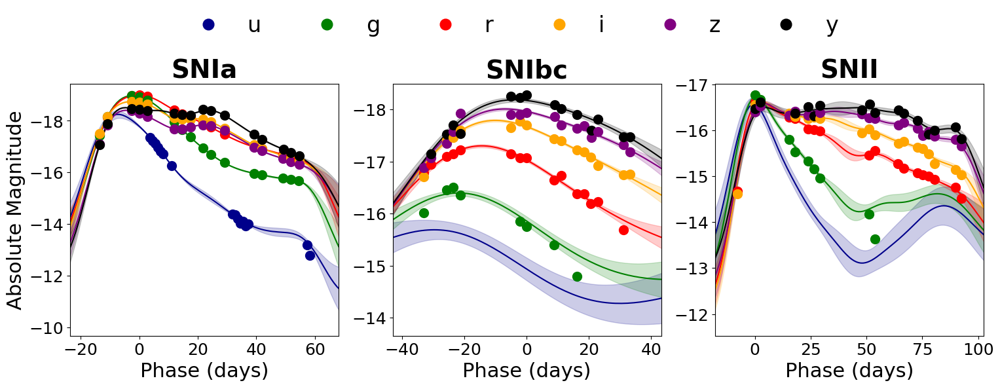

In [60]:
from matplotlib.lines import Line2D
fig, ax = plt.subplots(1,3,figsize=(18,5))

names = np.array([lightcurve.name.split('_')[0] for lightcurve in test])
snia = np.array(test)[np.where(names == 'SNIa')]
snibc = np.array(test)[np.where(names == 'SNIbc')]
snii = np.array(test)[np.where(names == 'SNII')]

exp_Ia = snia[np.argmax([len(lightcurve.times) for lightcurve in snia])]
exp_II = snii[np.argmax([len(lightcurve.times) for lightcurve in snii])]
exp_Ibc = snibc[np.argmax([len(lightcurve.times) for lightcurve in snibc])]
for i in range(6):
    ax[0].plot(exp_Ia.dense_times,exp_Ia.dense_lc[:,:,0][:,i],color=colors[i])
    ax[0].fill_between(exp_Ia.dense_times,
                     exp_Ia.dense_lc[:,:,0][:,i]+exp_Ia.dense_lc[:,:,1][:,i],
                     exp_Ia.dense_lc[:,:,0][:,i]-exp_Ia.dense_lc[:,:,1][:,i],
                     alpha=0.2,color=colors[i])
    
    ax[2].plot(exp_II.dense_times,exp_II.dense_lc[:,:,0][:,i],color=colors[i])
    ax[2].fill_between(exp_II.dense_times,
                     exp_II.dense_lc[:,:,0][:,i]+exp_II.dense_lc[:,:,1][:,i],
                     exp_II.dense_lc[:,:,0][:,i]-exp_II.dense_lc[:,:,1][:,i],
                     alpha=0.2,color=colors[i])
    
    ax[1].plot(exp_Ibc.dense_times,exp_Ibc.dense_lc[:,:,0][:,i],color=colors[i])
    ax[1].fill_between(exp_Ibc.dense_times,
                     exp_Ibc.dense_lc[:,:,0][:,i]+exp_Ibc.dense_lc[:,:,1][:,i],
                     exp_Ibc.dense_lc[:,:,0][:,i]-exp_Ibc.dense_lc[:,:,1][:,i],
                     alpha=0.2,color=colors[i])
for i in range(len(exp_Ia.times)):
    ax[0].plot(exp_Ia.times[i],exp_Ia.abs_mags[i],'o',markersize=10,color=colors[int(exp_Ia.filters[i])])
for i in range(len(exp_II.times)):
    ax[2].plot(exp_II.times[i],exp_II.abs_mags[i],'o',markersize=10,color=colors[int(exp_II.filters[i])])
for i in range(len(exp_Ibc.times)):
    ax[1].plot(exp_Ibc.times[i],exp_Ibc.abs_mags[i],'o',markersize=10,color=colors[int(exp_Ibc.filters[i])])

ax[0].set_xlim(exp_Ia.times.min()-10,exp_Ia.times.max()+10)
ax[2].set_xlim(exp_II.times.min()-10,exp_II.times.max()+10)
ax[1].set_xlim(exp_Ibc.times.min()-10,exp_Ibc.times.max()+10)
for a in ax:
    a.invert_yaxis()
    a.tick_params(labelsize=18)
    a.set_xlabel('Phase (days)', fontsize=22)
ax[0].set_ylabel('Absolute Magnitude', fontsize=22)
ax[0].set_title('SNIa',fontsize=28,weight='bold')
ax[1].set_title('SNIbc',fontsize=28,weight='bold')
ax[2].set_title('SNII',fontsize=28,weight='bold')

lines = [Line2D([], [], color=c, marker='o',linewidth=0,markersize=12) for c in colors]
fig.legend(lines, filters, numpoints=1, ncol=6,loc=9,fontsize=24,frameon=False,bbox_to_anchor=(0.5,1.15))

fig.savefig('/Users/brianhsu/Downloads/exp_lc.pdf', dpi=200,  bbox_inches='tight')

In [ ]:
np.